In [1]:
import pandas as pd
import numpy as np
from sklearn.preprocessing import OneHotEncoder

cat_encoder = OneHotEncoder()
shoppers_data = pd.read_csv('online_shoppers_intention.csv')
shoppers_data['Month'] =  pd.to_datetime(shoppers_data['Month'], format="%b", exact=False).dt.month
#shoppers_data['Month'].value_counts()
shoppers_data['Weekend'] = shoppers_data['Weekend'].astype(int)
shoppers_data['Revenue'] = shoppers_data['Revenue'].astype(int) 
shoppers_cat = shoppers_data[['VisitorType']]
shoppers_data = pd.get_dummies(shoppers_data, columns= ['VisitorType'])
#shoppers_data['Revenue'].value_counts()

In [2]:
from sklearn.model_selection import StratifiedShuffleSplit, GridSearchCV
from sklearn.pipeline import Pipeline

def split_train_test(data, test_ratio, random_state=42):
    split = StratifiedShuffleSplit(n_splits=1, test_size=test_ratio, random_state=random_state)
    for train_index, test_index in split.split(data, data['Revenue']):
        train_set = data.loc[train_index]
        test_set = data.loc[test_index]
    return train_set, test_set

def split_train_test2(data, test_ratio, random_state=42):
    #split = StratifiedShuffleSplit(n_splits=1, test_size=test_ratio, random_state=random_state)
    #for train_index, test_index in split.split(data, data['Revenue']):
    np.random.seed(random_state)
    shuffled_indices = np.random.permutation(len(data))
    test_set_size = int(len(data) * test_ratio)
    test_index = shuffled_indices[:test_set_size]
    train_index = shuffled_indices[test_set_size:]
    train_set = data.loc[train_index]
    test_set = data.loc[test_index]
    return train_set, test_set

In [3]:
from sklearn.svm import LinearSVC, SVC
from sklearn.preprocessing import StandardScaler
from sklearn.ensemble import RandomForestClassifier
def transform_data(train_set, test_set):
    Y_train = train_set['Revenue']
    X_train = train_set.drop(columns=['Revenue'])
    Y_test = test_set['Revenue']
    X_test = test_set.drop(columns=['Revenue'])

    scaler = StandardScaler()
    X_transformed = scaler.fit_transform(X_train)
    X_transformed_test = scaler.transform(X_test)
    return X_transformed, Y_train, X_transformed_test, Y_test

In [4]:
from sklearn.metrics import precision_score, recall_score, f1_score, confusion_matrix

def test_performance (test_set, predicted_test):
    prec = precision_score(test_set, predicted_test)
    rec = recall_score(test_set, predicted_test)
    f1 = f1_score(test_set, predicted_test)
    
    matrix = confusion_matrix(test_set, predicted_test)
    TNR = matrix[0][0]/sum(matrix[0])
    TPR = matrix[1][1]/sum(matrix[1])
    
    accuracy = (matrix[0][0]+matrix[1][1])/len(predicted_test)
    #print("\nAccuracy: %s" % accuracy)
    #print("\nTrue Positive Rate: %s \nTrue Negative Rate: %s" % (TPR, TNR))
    #print("\nF1 Score: %s" %(f1))
    return accuracy, TPR, TNR, f1


================================

GRID SEARCHING PARAMETERS

==================================

In [70]:
linear_svc= Pipeline([
    ("svc", SVC())
])
param_grid = [
    {'svc__C': [1, 10, 100], 'svc__gamma': ['auto'], 'svc__kernel':['linear','poly', 'sigmoid', 'rbf']}
]
grid_search = GridSearchCV(linear_svc, param_grid, cv=5, scoring='accuracy')
grid_search.fit(X_transformed, Y_train)

GridSearchCV(cv=5, estimator=Pipeline(steps=[('svc', SVC())]),
             param_grid=[{'svc__C': [1, 10, 100], 'svc__gamma': ['auto'],
                          'svc__kernel': ['linear', 'poly', 'sigmoid', 'rbf']}],
             scoring='accuracy')

In [71]:
grid_search.best_params_

{'svc__C': 10, 'svc__gamma': 'auto', 'svc__kernel': 'rbf'}

In [ ]:
rnd_clf = Pipeline([
    ("std", StandardScaler()),
    ("rnd", RandomForestClassifier())
])

param_grid = [
    {'rnd__n_estimators': [100, 200, 500], 'rnd__max_features': ['auto', 'sqrt', 'log2'], 'rnd__max_depth' : [4,5,6,7,8],'rnd__criterion' :['gini', 'entropy']}
]
grid_search = GridSearchCV(rnd_clf, param_grid, scoring='accuracy')
grid_search.fit(X_train, Y_train)

In [111]:
grid_search.best_params_

{'rnd__criterion': 'gini',
 'rnd__max_depth': 4,
 'rnd__max_features': 'auto',
 'rnd__n_estimators': 100}

In [10]:
import lightgbm as lgb
train_set, test_set = split_train_test(shoppers_data, 0.3)
X_transformed, Y_train, X_transformed_test, Y_test = transform_data(train_set, test_set)

lg_clf = Pipeline([
    ('lgb', lgb.LGBMClassifier(random_state=42))
])

param_grid = [
    {'lgb__learning_rate': np.linspace(0.01, 1.0, num=99, endpoint=False), 'lgb__max_depth': [1,2,3,4,5]}
]

#lg_clf = lgb.LGBMClassifier(learning_rate=0.20, max_depth=5, random_state=42)
#lg_clf.fit(X_transformed, Y_train, eval_metric='accuracy')

grid_search = GridSearchCV(lg_clf, param_grid, scoring='accuracy', cv=5)
grid_search.fit(X_transformed, Y_train)

GridSearchCV(cv=5,
             estimator=Pipeline(steps=[('lgb',
                                        LGBMClassifier(random_state=42))]),
             param_grid=[{'lgb__learning_rate': array([0.01, 0.02, 0.03, 0.04, 0.05, 0.06, 0.07, 0.08, 0.09, 0.1 , 0.11,
       0.12, 0.13, 0.14, 0.15, 0.16, 0.17, 0.18, 0.19, 0.2 , 0.21, 0.22,
       0.23, 0.24, 0.25, 0.26, 0.27, 0.28, 0.29, 0.3 , 0.31, 0.32, 0.33,
       0.34, 0.35, 0.36, 0.37, 0.38, 0.39, 0.4 , 0.41, 0.42, 0.43, 0.44,
       0.45, 0.46, 0.47, 0.48, 0.49, 0.5 , 0.51, 0.52, 0.53, 0.54, 0.55,
       0.56, 0.57, 0.58, 0.59, 0.6 , 0.61, 0.62, 0.63, 0.64, 0.65, 0.66,
       0.67, 0.68, 0.69, 0.7 , 0.71, 0.72, 0.73, 0.74, 0.75, 0.76, 0.77,
       0.78, 0.79, 0.8 , 0.81, 0.82, 0.83, 0.84, 0.85, 0.86, 0.87, 0.88,
       0.89, 0.9 , 0.91, 0.92, 0.93, 0.94, 0.95, 0.96, 0.97, 0.98, 0.99]),
                          'lgb__max_depth': [1, 2, 3, 4, 5]}],
             scoring='accuracy')

In [11]:
grid_search.best_params_

{'lgb__learning_rate': 0.05, 'lgb__max_depth': 5}

================================






DATA COLLECTION FOR RESULTS FOR:

Unchanged Dataset







==================================

In [65]:
totals_accuracy = totals_TPR = totals_TNR = totals_f1 = 0
runs = 100
values = []
for i in range(runs):
    train_set, test_set = split_train_test(shoppers_data, 0.3, random_state=i)
    X_transformed, Y_train, X_transformed_test, Y_test = transform_data(train_set, test_set)
    
    svc = SVC(C=10, gamma='auto', kernel='rbf')
    svc.fit(X_transformed, Y_train)
    test_pred2 = svc.predict(X_transformed_test)
    accuracy, TPR, TNR, f1 = test_performance(Y_test, test_pred2)
    values.append(f1)
    totals_accuracy += accuracy
    totals_TPR += TPR
    totals_TNR += TNR
    totals_f1 += f1
    
avg_accuracy = totals_accuracy/runs
avg_TPR = totals_TPR/runs
avg_TNR = totals_TNR/runs
avg_f1 = totals_f1/runs
std_deviation = np.std(values)
print("Accuracy:%s\nTPR:%s\nTNR:%s\nF1:%s\nStd:%s" %(avg_accuracy, avg_TPR, avg_TNR, avg_f1, std_deviation))
print(values)

Accuracy:0.8914193025141925
TPR:0.5071328671328671
TNR:0.9617141029740961
F1:0.5907879375961279
Std:0.01554757770008756
[0.5666316894018888, 0.6050420168067229, 0.5875127942681679, 0.5810276679841897, 0.5875127942681679, 0.615071283095723, 0.5638297872340425, 0.5711318795430944, 0.6, 0.6065747613997879, 0.6038894575230297, 0.5636743215031316, 0.624031007751938, 0.5904954499494439, 0.5866141732283464, 0.5800000000000001, 0.5526590198123045, 0.5933202357563852, 0.6068965517241379, 0.6228513650151668, 0.6026026026026026, 0.6140177690029616, 0.6004056795131845, 0.6118811881188119, 0.5851172273190621, 0.5808444902162718, 0.5928934010152284, 0.6025768087215064, 0.5809128630705395, 0.5811088295687885, 0.5893223819301847, 0.6086956521739131, 0.595289079229122, 0.59244126659857, 0.5743380855397148, 0.6018054162487463, 0.5801217038539553, 0.6043613707165109, 0.564206268958544, 0.5961165048543688, 0.5849246231155779, 0.5871559633027524, 0.5725725725725727, 0.60343087790111, 0.5919835560123331, 0.

In [19]:
from sklearn import metrics

train_set, test_set = split_train_test(shoppers_data, 0.3, random_state=i)
X_transformed, Y_train, X_transformed_test, Y_test = transform_data(train_set, test_set)
    
svc = SVC(C=10, gamma='auto', kernel='rbf')
svc.fit(X_transformed, Y_train)
#test_pred2 = svc.predict(X_transformed_test)

print(metrics.classification_report(Y_test, svc.predict(X_transformed_test)))

              precision    recall  f1-score   support

           0       0.91      0.97      0.94      3127
           1       0.73      0.48      0.58       572

    accuracy                           0.89      3699
   macro avg       0.82      0.72      0.76      3699
weighted avg       0.88      0.89      0.88      3699



In [66]:
totals_accuracy = totals_TPR = totals_TNR = totals_f1 = 0
runs = 100
values = []
for i in range(runs):
    train_set, test_set = split_train_test(shoppers_data, 0.3, random_state=i)
    X_transformed, Y_train, X_transformed_test, Y_test = transform_data(train_set, test_set)

    rnd_clf = RandomForestClassifier(criterion='gini', max_depth=8, max_features='log2', n_estimators=100)
    rnd_clf.fit(X_transformed, Y_train)
    test_pred3 = rnd_clf.predict(X_transformed_test)
    
    accuracy, TPR, TNR, f1 = test_performance(Y_test, test_pred3)
    values.append(f1)
    totals_accuracy += accuracy
    totals_TPR += TPR
    totals_TNR += TNR
    totals_f1 += f1
    
avg_accuracy = totals_accuracy/runs
avg_TPR = totals_TPR/runs
avg_TNR = totals_TNR/runs
avg_f1 = totals_f1/runs
std_deviation = np.std(values)
print("Accuracy:%s\nTPR:%s\nTNR:%s\nF1:%s\nStd:%s" %(avg_accuracy, avg_TPR, avg_TNR, avg_f1, std_deviation))
print(values)

Accuracy:0.9021330089213302
TPR:0.5281993006993007
TNR:0.9705340582027501
F1:0.6251360186768158
Std:0.018031125318242185
[0.6030042918454936, 0.6515463917525773, 0.624360286591607, 0.5945945945945945, 0.6267087276550998, 0.637223974763407, 0.5729729729729729, 0.6099585062240663, 0.6356107660455487, 0.6411075612353568, 0.6211312700106724, 0.6139438085327783, 0.6424974823766365, 0.6428571428571429, 0.6351758793969849, 0.6137787056367432, 0.6043613707165109, 0.6213197969543147, 0.638971315529179, 0.667342799188641, 0.6345957011258956, 0.6592964824120603, 0.620123203285421, 0.6394422310756973, 0.6542443064182194, 0.6085150571131879, 0.626680455015512, 0.634097706879362, 0.6006322444678609, 0.6221294363256785, 0.6303664921465969, 0.6584867075664622, 0.6173913043478261, 0.6303901437371663, 0.6166495375128468, 0.625254582484725, 0.6222684703433924, 0.6333687566418702, 0.6091370558375634, 0.6237623762376237, 0.6266531027466938, 0.6552072800808898, 0.6114519427402864, 0.6495375128468653, 0.6163

In [6]:
import tensorflow as tf
from tensorflow import keras
from scikeras.wrappers import KerasClassifier, KerasRegressor

In [67]:
totals_accuracy = totals_TPR = totals_TNR = totals_f1 = 0
runs = 100
values = []
for i in range(runs):
    train_set, test_set = split_train_test(shoppers_data, 0.3, random_state=i)
    X_transformed, Y_train, X_transformed_test, Y_test = transform_data(train_set, test_set)
    
    model = keras.models.Sequential([
        keras.layers.Dense(70, activation="relu", input_dim=19),
        keras.layers.Dense(10, activation="relu"),
        keras.layers.Dense(1, activation="sigmoid")
    ])
    model.compile(optimizer="sgd", loss="binary_crossentropy",  metrics=["accuracy"])
    history = model.fit(X_transformed, Y_train, epochs=30, validation_split=0.3)
    test_pred4 = (model.predict(X_transformed_test) > 0.5).astype('int32')
    
    accuracy, TPR, TNR, f1 = test_performance(Y_test, test_pred4)
    values.append(f1)
    totals_accuracy += accuracy
    totals_TPR += TPR
    totals_TNR += TNR
    totals_f1 += f1
    
avg_accuracy = totals_accuracy/runs
avg_TPR = totals_TPR/runs
avg_TNR = totals_TNR/runs
avg_f1 = totals_f1/runs
std_deviation = np.std(values)
print("Accuracy:%s\nTPR:%s\nTNR:%s\nF1:%s\nStd:%s" %(avg_accuracy, avg_TPR, avg_TNR, avg_f1, std_deviation))
print(values)
#mse_test = model.evaluate(X_transformed_test, Y_test)

Epoch 1/30
189/189 [==============================] - 13s 54ms/step - loss: 0.4830 - accuracy: 0.8331 - val_loss: 0.3935 - val_accuracy: 0.8521
Epoch 2/30
189/189 [==============================] - 6s 30ms/step - loss: 0.3706 - accuracy: 0.8499 - val_loss: 0.3334 - val_accuracy: 0.8680
Epoch 3/30
189/189 [==============================] - 6s 31ms/step - loss: 0.3304 - accuracy: 0.8651 - val_loss: 0.3080 - val_accuracy: 0.8768
Epoch 4/30
189/189 [==============================] - 4s 22ms/step - loss: 0.3115 - accuracy: 0.8714 - val_loss: 0.2954 - val_accuracy: 0.8826
Epoch 5/30
189/189 [==============================] - 4s 21ms/step - loss: 0.3000 - accuracy: 0.8763 - val_loss: 0.2879 - val_accuracy: 0.8857
Epoch 6/30
189/189 [==============================] - 4s 19ms/step - loss: 0.2923 - accuracy: 0.8806 - val_loss: 0.2820 - val_accuracy: 0.8865
Epoch 7/30
189/189 [==============================] - 3s 17ms/step - loss: 0.2863 - accuracy: 0.8835 - val_loss: 0.2781 - val_accuracy: 0.888

189/189 [==============================] - 1s 3ms/step - loss: 0.2420 - accuracy: 0.9003 - val_loss: 0.2710 - val_accuracy: 0.8907
Epoch 26/30
189/189 [==============================] - 0s 2ms/step - loss: 0.2408 - accuracy: 0.9003 - val_loss: 0.2709 - val_accuracy: 0.8892
Epoch 27/30
189/189 [==============================] - 0s 3ms/step - loss: 0.2394 - accuracy: 0.8994 - val_loss: 0.2689 - val_accuracy: 0.8915
Epoch 28/30
189/189 [==============================] - 1s 3ms/step - loss: 0.2382 - accuracy: 0.9008 - val_loss: 0.2685 - val_accuracy: 0.8915
Epoch 29/30
189/189 [==============================] - 1s 3ms/step - loss: 0.2370 - accuracy: 0.9018 - val_loss: 0.2680 - val_accuracy: 0.8915
Epoch 30/30
189/189 [==============================] - 1s 3ms/step - loss: 0.2357 - accuracy: 0.9017 - val_loss: 0.2666 - val_accuracy: 0.8915
Epoch 1/30
189/189 [==============================] - 2s 4ms/step - loss: 0.4859 - accuracy: 0.8401 - val_loss: 0.4210 - val_accuracy: 0.8409
Epoch 2/30
1

189/189 [==============================] - 0s 2ms/step - loss: 0.2587 - accuracy: 0.8916 - val_loss: 0.2622 - val_accuracy: 0.8988
Epoch 20/30
189/189 [==============================] - 0s 2ms/step - loss: 0.2571 - accuracy: 0.8922 - val_loss: 0.2605 - val_accuracy: 0.9008
Epoch 21/30
189/189 [==============================] - 0s 2ms/step - loss: 0.2555 - accuracy: 0.8924 - val_loss: 0.2590 - val_accuracy: 0.9031
Epoch 22/30
189/189 [==============================] - 0s 2ms/step - loss: 0.2541 - accuracy: 0.8934 - val_loss: 0.2584 - val_accuracy: 0.9019
Epoch 23/30
189/189 [==============================] - 0s 2ms/step - loss: 0.2527 - accuracy: 0.8957 - val_loss: 0.2576 - val_accuracy: 0.9012
Epoch 24/30
189/189 [==============================] - 0s 2ms/step - loss: 0.2514 - accuracy: 0.8942 - val_loss: 0.2577 - val_accuracy: 0.9008
Epoch 25/30
189/189 [==============================] - 0s 2ms/step - loss: 0.2501 - accuracy: 0.8947 - val_loss: 0.2568 - val_accuracy: 0.9012
Epoch 26/30

189/189 [==============================] - 0s 1ms/step - loss: 0.2739 - accuracy: 0.8886 - val_loss: 0.2593 - val_accuracy: 0.8985
Epoch 14/30
189/189 [==============================] - 0s 2ms/step - loss: 0.2713 - accuracy: 0.8899 - val_loss: 0.2577 - val_accuracy: 0.8981
Epoch 15/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2689 - accuracy: 0.8919 - val_loss: 0.2565 - val_accuracy: 0.8985
Epoch 16/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2667 - accuracy: 0.8919 - val_loss: 0.2554 - val_accuracy: 0.8988
Epoch 17/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2647 - accuracy: 0.8919 - val_loss: 0.2544 - val_accuracy: 0.8973
Epoch 18/30
189/189 [==============================] - 0s 2ms/step - loss: 0.2625 - accuracy: 0.8914 - val_loss: 0.2556 - val_accuracy: 0.8961
Epoch 19/30
189/189 [==============================] - 0s 2ms/step - loss: 0.2612 - accuracy: 0.8934 - val_loss: 0.2533 - val_accuracy: 0.8954
Epoch 20/30

189/189 [==============================] - 0s 1ms/step - loss: 0.2905 - accuracy: 0.8828 - val_loss: 0.2846 - val_accuracy: 0.8780
Epoch 8/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2830 - accuracy: 0.8848 - val_loss: 0.2793 - val_accuracy: 0.8807
Epoch 9/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2773 - accuracy: 0.8863 - val_loss: 0.2749 - val_accuracy: 0.8822
Epoch 10/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2728 - accuracy: 0.8884 - val_loss: 0.2719 - val_accuracy: 0.8846
Epoch 11/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2691 - accuracy: 0.8896 - val_loss: 0.2705 - val_accuracy: 0.8861
Epoch 12/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2661 - accuracy: 0.8917 - val_loss: 0.2677 - val_accuracy: 0.8888
Epoch 13/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2639 - accuracy: 0.8937 - val_loss: 0.2664 - val_accuracy: 0.8900
Epoch 14/30
1

189/189 [==============================] - 1s 2ms/step - loss: 0.6521 - accuracy: 0.6797 - val_loss: 0.5281 - val_accuracy: 0.8467
Epoch 2/30
189/189 [==============================] - 0s 1ms/step - loss: 0.4882 - accuracy: 0.8437 - val_loss: 0.4523 - val_accuracy: 0.8483
Epoch 3/30
189/189 [==============================] - 0s 1ms/step - loss: 0.4341 - accuracy: 0.8439 - val_loss: 0.4115 - val_accuracy: 0.8483
Epoch 4/30
189/189 [==============================] - 0s 2ms/step - loss: 0.4028 - accuracy: 0.8439 - val_loss: 0.3854 - val_accuracy: 0.8483
Epoch 5/30
189/189 [==============================] - 0s 1ms/step - loss: 0.3761 - accuracy: 0.8444 - val_loss: 0.3594 - val_accuracy: 0.8486
Epoch 6/30
189/189 [==============================] - 0s 1ms/step - loss: 0.3497 - accuracy: 0.8523 - val_loss: 0.3370 - val_accuracy: 0.8610
Epoch 7/30
189/189 [==============================] - 0s 1ms/step - loss: 0.3275 - accuracy: 0.8638 - val_loss: 0.3203 - val_accuracy: 0.8680
Epoch 8/30
189/18

189/189 [==============================] - 0s 1ms/step - loss: 0.2557 - accuracy: 0.8927 - val_loss: 0.2493 - val_accuracy: 0.8938
Epoch 26/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2546 - accuracy: 0.8931 - val_loss: 0.2489 - val_accuracy: 0.8946
Epoch 27/30
189/189 [==============================] - 0s 2ms/step - loss: 0.2536 - accuracy: 0.8934 - val_loss: 0.2484 - val_accuracy: 0.8958
Epoch 28/30
189/189 [==============================] - 1s 3ms/step - loss: 0.2527 - accuracy: 0.8939 - val_loss: 0.2479 - val_accuracy: 0.8969
Epoch 29/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2517 - accuracy: 0.8937 - val_loss: 0.2475 - val_accuracy: 0.8961
Epoch 30/30
189/189 [==============================] - 0s 2ms/step - loss: 0.2509 - accuracy: 0.8942 - val_loss: 0.2469 - val_accuracy: 0.8961
Epoch 1/30
189/189 [==============================] - 2s 6ms/step - loss: 0.5619 - accuracy: 0.8191 - val_loss: 0.4751 - val_accuracy: 0.8394
Epoch 2/30
1

189/189 [==============================] - 0s 1ms/step - loss: 0.2546 - accuracy: 0.8937 - val_loss: 0.2767 - val_accuracy: 0.8853
Epoch 20/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2532 - accuracy: 0.8944 - val_loss: 0.2763 - val_accuracy: 0.8861
Epoch 21/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2517 - accuracy: 0.8947 - val_loss: 0.2756 - val_accuracy: 0.8865
Epoch 22/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2506 - accuracy: 0.8949 - val_loss: 0.2747 - val_accuracy: 0.8857
Epoch 23/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2494 - accuracy: 0.8957 - val_loss: 0.2738 - val_accuracy: 0.8861
Epoch 24/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2482 - accuracy: 0.8965 - val_loss: 0.2729 - val_accuracy: 0.8873
Epoch 25/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2469 - accuracy: 0.8970 - val_loss: 0.2718 - val_accuracy: 0.8861
Epoch 26/30

189/189 [==============================] - 0s 1ms/step - loss: 0.2746 - accuracy: 0.8907 - val_loss: 0.2800 - val_accuracy: 0.8865
Epoch 14/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2718 - accuracy: 0.8907 - val_loss: 0.2781 - val_accuracy: 0.8873
Epoch 15/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2694 - accuracy: 0.8919 - val_loss: 0.2764 - val_accuracy: 0.8876
Epoch 16/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2670 - accuracy: 0.8927 - val_loss: 0.2748 - val_accuracy: 0.8876
Epoch 17/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2648 - accuracy: 0.8924 - val_loss: 0.2735 - val_accuracy: 0.8896
Epoch 18/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2626 - accuracy: 0.8937 - val_loss: 0.2720 - val_accuracy: 0.8884
Epoch 19/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2604 - accuracy: 0.8936 - val_loss: 0.2709 - val_accuracy: 0.8884
Epoch 20/30

189/189 [==============================] - 0s 2ms/step - loss: 0.2837 - accuracy: 0.8864 - val_loss: 0.3012 - val_accuracy: 0.8795
Epoch 8/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2791 - accuracy: 0.8889 - val_loss: 0.2996 - val_accuracy: 0.8776
Epoch 9/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2755 - accuracy: 0.8902 - val_loss: 0.2992 - val_accuracy: 0.8784
Epoch 10/30
189/189 [==============================] - 0s 2ms/step - loss: 0.2728 - accuracy: 0.8904 - val_loss: 0.2971 - val_accuracy: 0.8788
Epoch 11/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2701 - accuracy: 0.8912 - val_loss: 0.2959 - val_accuracy: 0.8780
Epoch 12/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2681 - accuracy: 0.8927 - val_loss: 0.2955 - val_accuracy: 0.8826
Epoch 13/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2657 - accuracy: 0.8944 - val_loss: 0.2970 - val_accuracy: 0.8819
Epoch 14/30
1

189/189 [==============================] - 1s 2ms/step - loss: 0.4850 - accuracy: 0.8120 - val_loss: 0.3991 - val_accuracy: 0.8405
Epoch 2/30
189/189 [==============================] - 0s 1ms/step - loss: 0.3652 - accuracy: 0.8571 - val_loss: 0.3484 - val_accuracy: 0.8552
Epoch 3/30
189/189 [==============================] - 0s 1ms/step - loss: 0.3287 - accuracy: 0.8706 - val_loss: 0.3246 - val_accuracy: 0.8672
Epoch 4/30
189/189 [==============================] - 0s 1ms/step - loss: 0.3094 - accuracy: 0.8780 - val_loss: 0.3112 - val_accuracy: 0.8722
Epoch 5/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2978 - accuracy: 0.8833 - val_loss: 0.3031 - val_accuracy: 0.8780
Epoch 6/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2900 - accuracy: 0.8863 - val_loss: 0.2978 - val_accuracy: 0.8776
Epoch 7/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2844 - accuracy: 0.8868 - val_loss: 0.2930 - val_accuracy: 0.8780
Epoch 8/30
189/18

189/189 [==============================] - 0s 1ms/step - loss: 0.2440 - accuracy: 0.8979 - val_loss: 0.2765 - val_accuracy: 0.8780
Epoch 26/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2431 - accuracy: 0.8974 - val_loss: 0.2753 - val_accuracy: 0.8788
Epoch 27/30
189/189 [==============================] - 0s 2ms/step - loss: 0.2421 - accuracy: 0.8989 - val_loss: 0.2739 - val_accuracy: 0.8792
Epoch 28/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2412 - accuracy: 0.8990 - val_loss: 0.2738 - val_accuracy: 0.8795
Epoch 29/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2405 - accuracy: 0.8995 - val_loss: 0.2734 - val_accuracy: 0.8792
Epoch 30/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2394 - accuracy: 0.8989 - val_loss: 0.2729 - val_accuracy: 0.8799
Epoch 1/30
189/189 [==============================] - 1s 2ms/step - loss: 0.5167 - accuracy: 0.8168 - val_loss: 0.4323 - val_accuracy: 0.8375
Epoch 2/30
1

189/189 [==============================] - 0s 2ms/step - loss: 0.2603 - accuracy: 0.8912 - val_loss: 0.2657 - val_accuracy: 0.8938
Epoch 20/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2588 - accuracy: 0.8917 - val_loss: 0.2652 - val_accuracy: 0.8931
Epoch 21/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2574 - accuracy: 0.8922 - val_loss: 0.2647 - val_accuracy: 0.8942
Epoch 22/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2562 - accuracy: 0.8927 - val_loss: 0.2641 - val_accuracy: 0.8942
Epoch 23/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2548 - accuracy: 0.8934 - val_loss: 0.2635 - val_accuracy: 0.8942
Epoch 24/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2536 - accuracy: 0.8946 - val_loss: 0.2627 - val_accuracy: 0.8950
Epoch 25/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2525 - accuracy: 0.8946 - val_loss: 0.2624 - val_accuracy: 0.8950
Epoch 26/30

189/189 [==============================] - 0s 1ms/step - loss: 0.2652 - accuracy: 0.8939 - val_loss: 0.2840 - val_accuracy: 0.8849
Epoch 14/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2629 - accuracy: 0.8944 - val_loss: 0.2826 - val_accuracy: 0.8842
Epoch 15/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2609 - accuracy: 0.8944 - val_loss: 0.2814 - val_accuracy: 0.8873
Epoch 16/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2588 - accuracy: 0.8954 - val_loss: 0.2801 - val_accuracy: 0.8892
Epoch 17/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2569 - accuracy: 0.8947 - val_loss: 0.2793 - val_accuracy: 0.8896
Epoch 18/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2550 - accuracy: 0.8965 - val_loss: 0.2784 - val_accuracy: 0.8903
Epoch 19/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2532 - accuracy: 0.8972 - val_loss: 0.2773 - val_accuracy: 0.8873
Epoch 20/30

189/189 [==============================] - 0s 1ms/step - loss: 0.2775 - accuracy: 0.8886 - val_loss: 0.3065 - val_accuracy: 0.8734
Epoch 8/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2738 - accuracy: 0.8904 - val_loss: 0.3040 - val_accuracy: 0.8745
Epoch 9/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2708 - accuracy: 0.8921 - val_loss: 0.3034 - val_accuracy: 0.8768
Epoch 10/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2681 - accuracy: 0.8934 - val_loss: 0.2989 - val_accuracy: 0.8772
Epoch 11/30
189/189 [==============================] - 0s 2ms/step - loss: 0.2657 - accuracy: 0.8954 - val_loss: 0.2991 - val_accuracy: 0.8780
Epoch 12/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2633 - accuracy: 0.8952 - val_loss: 0.2957 - val_accuracy: 0.8768
Epoch 13/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2614 - accuracy: 0.8969 - val_loss: 0.2951 - val_accuracy: 0.8788
Epoch 14/30
1

189/189 [==============================] - 1s 2ms/step - loss: 0.4554 - accuracy: 0.8345 - val_loss: 0.3728 - val_accuracy: 0.8548
Epoch 2/30
189/189 [==============================] - 0s 1ms/step - loss: 0.3655 - accuracy: 0.8465 - val_loss: 0.3329 - val_accuracy: 0.8606
Epoch 3/30
189/189 [==============================] - 0s 1ms/step - loss: 0.3322 - accuracy: 0.8558 - val_loss: 0.3129 - val_accuracy: 0.8714
Epoch 4/30
189/189 [==============================] - 0s 1ms/step - loss: 0.3143 - accuracy: 0.8684 - val_loss: 0.3002 - val_accuracy: 0.8776
Epoch 5/30
189/189 [==============================] - 0s 1ms/step - loss: 0.3024 - accuracy: 0.8727 - val_loss: 0.2917 - val_accuracy: 0.8799
Epoch 6/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2939 - accuracy: 0.8772 - val_loss: 0.2847 - val_accuracy: 0.8819
Epoch 7/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2877 - accuracy: 0.8808 - val_loss: 0.2793 - val_accuracy: 0.8873
Epoch 8/30
189/18

189/189 [==============================] - 0s 1ms/step - loss: 0.2477 - accuracy: 0.8960 - val_loss: 0.2652 - val_accuracy: 0.8931
Epoch 26/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2465 - accuracy: 0.8957 - val_loss: 0.2643 - val_accuracy: 0.8931
Epoch 27/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2456 - accuracy: 0.8957 - val_loss: 0.2640 - val_accuracy: 0.8927
Epoch 28/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2447 - accuracy: 0.8957 - val_loss: 0.2632 - val_accuracy: 0.8927
Epoch 29/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2438 - accuracy: 0.8952 - val_loss: 0.2625 - val_accuracy: 0.8950
Epoch 30/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2429 - accuracy: 0.8954 - val_loss: 0.2619 - val_accuracy: 0.8950
Epoch 1/30
189/189 [==============================] - 1s 4ms/step - loss: 0.4389 - accuracy: 0.8247 - val_loss: 0.3952 - val_accuracy: 0.8355
Epoch 2/30
1

189/189 [==============================] - 0s 1ms/step - loss: 0.2546 - accuracy: 0.8936 - val_loss: 0.2536 - val_accuracy: 0.8985
Epoch 20/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2531 - accuracy: 0.8931 - val_loss: 0.2510 - val_accuracy: 0.8996
Epoch 21/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2521 - accuracy: 0.8936 - val_loss: 0.2513 - val_accuracy: 0.8996
Epoch 22/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2508 - accuracy: 0.8949 - val_loss: 0.2503 - val_accuracy: 0.9004
Epoch 23/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2497 - accuracy: 0.8955 - val_loss: 0.2498 - val_accuracy: 0.8996
Epoch 24/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2487 - accuracy: 0.8951 - val_loss: 0.2493 - val_accuracy: 0.9004
Epoch 25/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2476 - accuracy: 0.8959 - val_loss: 0.2493 - val_accuracy: 0.9027
Epoch 26/30

189/189 [==============================] - 0s 1ms/step - loss: 0.2702 - accuracy: 0.8911 - val_loss: 0.2733 - val_accuracy: 0.8934
Epoch 14/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2685 - accuracy: 0.8931 - val_loss: 0.2719 - val_accuracy: 0.8946
Epoch 15/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2666 - accuracy: 0.8934 - val_loss: 0.2709 - val_accuracy: 0.8950
Epoch 16/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2650 - accuracy: 0.8939 - val_loss: 0.2694 - val_accuracy: 0.8958
Epoch 17/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2635 - accuracy: 0.8937 - val_loss: 0.2676 - val_accuracy: 0.8946
Epoch 18/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2619 - accuracy: 0.8949 - val_loss: 0.2665 - val_accuracy: 0.8946
Epoch 19/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2606 - accuracy: 0.8944 - val_loss: 0.2664 - val_accuracy: 0.8973
Epoch 20/30

189/189 [==============================] - 0s 1ms/step - loss: 0.2920 - accuracy: 0.8831 - val_loss: 0.2773 - val_accuracy: 0.8838
Epoch 8/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2878 - accuracy: 0.8835 - val_loss: 0.2731 - val_accuracy: 0.8826
Epoch 9/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2844 - accuracy: 0.8856 - val_loss: 0.2704 - val_accuracy: 0.8846
Epoch 10/30
189/189 [==============================] - 0s 2ms/step - loss: 0.2814 - accuracy: 0.8871 - val_loss: 0.2680 - val_accuracy: 0.8865
Epoch 11/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2787 - accuracy: 0.8879 - val_loss: 0.2658 - val_accuracy: 0.8861
Epoch 12/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2764 - accuracy: 0.8888 - val_loss: 0.2644 - val_accuracy: 0.8880
Epoch 13/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2744 - accuracy: 0.8889 - val_loss: 0.2629 - val_accuracy: 0.8892
Epoch 14/30
1

189/189 [==============================] - 1s 2ms/step - loss: 0.5504 - accuracy: 0.7866 - val_loss: 0.4387 - val_accuracy: 0.8483
Epoch 2/30
189/189 [==============================] - 0s 1ms/step - loss: 0.3987 - accuracy: 0.8475 - val_loss: 0.3668 - val_accuracy: 0.8544
Epoch 3/30
189/189 [==============================] - 0s 1ms/step - loss: 0.3518 - accuracy: 0.8542 - val_loss: 0.3327 - val_accuracy: 0.8653
Epoch 4/30
189/189 [==============================] - 0s 1ms/step - loss: 0.3272 - accuracy: 0.8648 - val_loss: 0.3130 - val_accuracy: 0.8714
Epoch 5/30
189/189 [==============================] - 0s 1ms/step - loss: 0.3120 - accuracy: 0.8727 - val_loss: 0.3004 - val_accuracy: 0.8795
Epoch 6/30
189/189 [==============================] - 0s 1ms/step - loss: 0.3018 - accuracy: 0.8754 - val_loss: 0.2921 - val_accuracy: 0.8834
Epoch 7/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2946 - accuracy: 0.8787 - val_loss: 0.2862 - val_accuracy: 0.8849
Epoch 8/30
189/18

189/189 [==============================] - 0s 1ms/step - loss: 0.2591 - accuracy: 0.8876 - val_loss: 0.2568 - val_accuracy: 0.8988
Epoch 26/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2579 - accuracy: 0.8869 - val_loss: 0.2558 - val_accuracy: 0.9004
Epoch 27/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2568 - accuracy: 0.8891 - val_loss: 0.2561 - val_accuracy: 0.9004
Epoch 28/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2559 - accuracy: 0.8894 - val_loss: 0.2548 - val_accuracy: 0.9000
Epoch 29/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2548 - accuracy: 0.8901 - val_loss: 0.2544 - val_accuracy: 0.9004
Epoch 30/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2537 - accuracy: 0.8889 - val_loss: 0.2530 - val_accuracy: 0.9004
Epoch 1/30
189/189 [==============================] - 1s 2ms/step - loss: 0.4453 - accuracy: 0.8437 - val_loss: 0.3808 - val_accuracy: 0.8486
Epoch 2/30
1

189/189 [==============================] - 0s 1ms/step - loss: 0.2615 - accuracy: 0.8907 - val_loss: 0.2617 - val_accuracy: 0.8958
Epoch 20/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2601 - accuracy: 0.8912 - val_loss: 0.2607 - val_accuracy: 0.8958
Epoch 21/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2589 - accuracy: 0.8921 - val_loss: 0.2604 - val_accuracy: 0.8958
Epoch 22/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2576 - accuracy: 0.8936 - val_loss: 0.2594 - val_accuracy: 0.8961
Epoch 23/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2565 - accuracy: 0.8917 - val_loss: 0.2591 - val_accuracy: 0.8946
Epoch 24/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2555 - accuracy: 0.8921 - val_loss: 0.2583 - val_accuracy: 0.8954
Epoch 25/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2544 - accuracy: 0.8926 - val_loss: 0.2579 - val_accuracy: 0.8958
Epoch 26/30

189/189 [==============================] - 0s 1ms/step - loss: 0.2789 - accuracy: 0.8826 - val_loss: 0.2797 - val_accuracy: 0.8869
Epoch 14/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2766 - accuracy: 0.8840 - val_loss: 0.2778 - val_accuracy: 0.8861
Epoch 15/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2745 - accuracy: 0.8836 - val_loss: 0.2759 - val_accuracy: 0.8876
Epoch 16/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2726 - accuracy: 0.8858 - val_loss: 0.2742 - val_accuracy: 0.8884
Epoch 17/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2708 - accuracy: 0.8859 - val_loss: 0.2727 - val_accuracy: 0.8884
Epoch 18/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2691 - accuracy: 0.8868 - val_loss: 0.2713 - val_accuracy: 0.8903
Epoch 19/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2676 - accuracy: 0.8864 - val_loss: 0.2698 - val_accuracy: 0.8896
Epoch 20/30

189/189 [==============================] - 0s 2ms/step - loss: 0.2815 - accuracy: 0.8846 - val_loss: 0.2855 - val_accuracy: 0.8846
Epoch 8/30
189/189 [==============================] - 0s 2ms/step - loss: 0.2771 - accuracy: 0.8864 - val_loss: 0.2826 - val_accuracy: 0.8884
Epoch 9/30
189/189 [==============================] - 0s 2ms/step - loss: 0.2738 - accuracy: 0.8866 - val_loss: 0.2803 - val_accuracy: 0.8892
Epoch 10/30
189/189 [==============================] - 0s 2ms/step - loss: 0.2711 - accuracy: 0.8869 - val_loss: 0.2782 - val_accuracy: 0.8884
Epoch 11/30
189/189 [==============================] - 0s 2ms/step - loss: 0.2688 - accuracy: 0.8891 - val_loss: 0.2766 - val_accuracy: 0.8880
Epoch 12/30
189/189 [==============================] - 0s 2ms/step - loss: 0.2668 - accuracy: 0.8902 - val_loss: 0.2746 - val_accuracy: 0.8888
Epoch 13/30
189/189 [==============================] - 0s 2ms/step - loss: 0.2649 - accuracy: 0.8912 - val_loss: 0.2735 - val_accuracy: 0.8892
Epoch 14/30
1

189/189 [==============================] - 1s 3ms/step - loss: 0.5390 - accuracy: 0.8020 - val_loss: 0.4478 - val_accuracy: 0.8425
Epoch 2/30
189/189 [==============================] - 0s 1ms/step - loss: 0.3948 - accuracy: 0.8520 - val_loss: 0.3748 - val_accuracy: 0.8483
Epoch 3/30
189/189 [==============================] - 0s 1ms/step - loss: 0.3484 - accuracy: 0.8601 - val_loss: 0.3433 - val_accuracy: 0.8629
Epoch 4/30
189/189 [==============================] - 0s 1ms/step - loss: 0.3254 - accuracy: 0.8686 - val_loss: 0.3256 - val_accuracy: 0.8683
Epoch 5/30
189/189 [==============================] - 0s 1ms/step - loss: 0.3111 - accuracy: 0.8740 - val_loss: 0.3139 - val_accuracy: 0.8710
Epoch 6/30
189/189 [==============================] - 0s 1ms/step - loss: 0.3012 - accuracy: 0.8775 - val_loss: 0.3058 - val_accuracy: 0.8749
Epoch 7/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2938 - accuracy: 0.8813 - val_loss: 0.2995 - val_accuracy: 0.8788
Epoch 8/30
189/18

189/189 [==============================] - 0s 1ms/step - loss: 0.2532 - accuracy: 0.8985 - val_loss: 0.2655 - val_accuracy: 0.8873
Epoch 26/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2518 - accuracy: 0.8975 - val_loss: 0.2649 - val_accuracy: 0.8865
Epoch 27/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2505 - accuracy: 0.8984 - val_loss: 0.2639 - val_accuracy: 0.8880
Epoch 28/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2491 - accuracy: 0.8990 - val_loss: 0.2626 - val_accuracy: 0.8873
Epoch 29/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2481 - accuracy: 0.9007 - val_loss: 0.2629 - val_accuracy: 0.8869
Epoch 30/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2470 - accuracy: 0.9000 - val_loss: 0.2625 - val_accuracy: 0.8869
Epoch 1/30
189/189 [==============================] - 1s 2ms/step - loss: 0.5055 - accuracy: 0.7873 - val_loss: 0.3947 - val_accuracy: 0.8490
Epoch 2/30
1

In [68]:
totals_accuracy = totals_TPR = totals_TNR = totals_f1 = 0
runs = 100
values = []
for i in range(runs):
    train_set, test_set = split_train_test(shoppers_data, 0.3, random_state=i)
    X_transformed, Y_train, X_transformed_test, Y_test = transform_data(train_set, test_set)
    
    model = keras.models.Sequential([
        keras.layers.Dense(70, activation="relu", input_dim=19),
        keras.layers.Dense(20, activation="relu"),
        keras.layers.Dense(1, activation="sigmoid")
    ])
    model.compile(optimizer="sgd", loss="binary_crossentropy",  metrics=["accuracy"])
    history = model.fit(X_transformed, Y_train, epochs=30, validation_split=0.3) #regularization: dropout, batch normalization
    test_pred4 = (model.predict(X_transformed_test) > 0.5).astype('int32')
    
    accuracy, TPR, TNR, f1 = test_performance(Y_test, test_pred4)
    values.append(f1)
    totals_accuracy += accuracy
    totals_TPR += TPR
    totals_TNR += TNR
    totals_f1 += f1
    
avg_accuracy = totals_accuracy/runs
avg_TPR = totals_TPR/runs
avg_TNR = totals_TNR/runs
avg_f1 = totals_f1/runs
std_deviation = np.std(values)
print("Accuracy:%s\nTPR:%s\nTNR:%s\nF1:%s\nStd:%s" %(avg_accuracy, avg_TPR, avg_TNR, avg_f1, std_deviation))
#mse_test = model.evaluate(X_transformed_test, Y_test)
print(values)

Epoch 1/30
189/189 [==============================] - 1s 3ms/step - loss: 0.4362 - accuracy: 0.8411 - val_loss: 0.3596 - val_accuracy: 0.8560
Epoch 2/30
189/189 [==============================] - 0s 2ms/step - loss: 0.3493 - accuracy: 0.8548 - val_loss: 0.3218 - val_accuracy: 0.8730
Epoch 3/30
189/189 [==============================] - 0s 2ms/step - loss: 0.3235 - accuracy: 0.8644 - val_loss: 0.3050 - val_accuracy: 0.8803
Epoch 4/30
189/189 [==============================] - 0s 2ms/step - loss: 0.3094 - accuracy: 0.8712 - val_loss: 0.2950 - val_accuracy: 0.8826
Epoch 5/30
189/189 [==============================] - 0s 2ms/step - loss: 0.3002 - accuracy: 0.8742 - val_loss: 0.2881 - val_accuracy: 0.8857
Epoch 6/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2934 - accuracy: 0.8783 - val_loss: 0.2833 - val_accuracy: 0.8869
Epoch 7/30
189/189 [==============================] - 0s 2ms/step - loss: 0.2883 - accuracy: 0.8792 - val_loss: 0.2798 - val_accuracy: 0.8873
Epoch 

189/189 [==============================] - 0s 1ms/step - loss: 0.2363 - accuracy: 0.9010 - val_loss: 0.2656 - val_accuracy: 0.8946
Epoch 26/30
189/189 [==============================] - 0s 2ms/step - loss: 0.2350 - accuracy: 0.9023 - val_loss: 0.2647 - val_accuracy: 0.8923
Epoch 27/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2339 - accuracy: 0.9032 - val_loss: 0.2643 - val_accuracy: 0.8931
Epoch 28/30
189/189 [==============================] - 0s 2ms/step - loss: 0.2326 - accuracy: 0.9040 - val_loss: 0.2648 - val_accuracy: 0.8942
Epoch 29/30
189/189 [==============================] - 0s 2ms/step - loss: 0.2315 - accuracy: 0.9028 - val_loss: 0.2632 - val_accuracy: 0.8946
Epoch 30/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2304 - accuracy: 0.9038 - val_loss: 0.2631 - val_accuracy: 0.8954
Epoch 1/30
189/189 [==============================] - 1s 5ms/step - loss: 0.4905 - accuracy: 0.8290 - val_loss: 0.4142 - val_accuracy: 0.8413
Epoch 2/30
1

189/189 [==============================] - 0s 2ms/step - loss: 0.2566 - accuracy: 0.8919 - val_loss: 0.2654 - val_accuracy: 0.9015
Epoch 20/30
189/189 [==============================] - 0s 2ms/step - loss: 0.2551 - accuracy: 0.8921 - val_loss: 0.2637 - val_accuracy: 0.9027
Epoch 21/30
189/189 [==============================] - 0s 2ms/step - loss: 0.2537 - accuracy: 0.8919 - val_loss: 0.2641 - val_accuracy: 0.9023
Epoch 22/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2520 - accuracy: 0.8922 - val_loss: 0.2645 - val_accuracy: 0.9027
Epoch 23/30
189/189 [==============================] - 0s 2ms/step - loss: 0.2508 - accuracy: 0.8936 - val_loss: 0.2629 - val_accuracy: 0.9031
Epoch 24/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2494 - accuracy: 0.8927 - val_loss: 0.2623 - val_accuracy: 0.9027
Epoch 25/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2482 - accuracy: 0.8932 - val_loss: 0.2604 - val_accuracy: 0.9039
Epoch 26/30

189/189 [==============================] - 0s 1ms/step - loss: 0.2689 - accuracy: 0.8893 - val_loss: 0.2569 - val_accuracy: 0.8988
Epoch 14/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2665 - accuracy: 0.8916 - val_loss: 0.2564 - val_accuracy: 0.8992
Epoch 15/30
189/189 [==============================] - 0s 2ms/step - loss: 0.2646 - accuracy: 0.8912 - val_loss: 0.2554 - val_accuracy: 0.8988
Epoch 16/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2626 - accuracy: 0.8929 - val_loss: 0.2538 - val_accuracy: 0.8992
Epoch 17/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2608 - accuracy: 0.8934 - val_loss: 0.2533 - val_accuracy: 0.8981
Epoch 18/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2589 - accuracy: 0.8927 - val_loss: 0.2519 - val_accuracy: 0.8981
Epoch 19/30
189/189 [==============================] - 0s 2ms/step - loss: 0.2575 - accuracy: 0.8937 - val_loss: 0.2518 - val_accuracy: 0.8988
Epoch 20/30

189/189 [==============================] - 0s 1ms/step - loss: 0.2804 - accuracy: 0.8861 - val_loss: 0.2779 - val_accuracy: 0.8849
Epoch 8/30
189/189 [==============================] - 0s 2ms/step - loss: 0.2760 - accuracy: 0.8884 - val_loss: 0.2745 - val_accuracy: 0.8865
Epoch 9/30
189/189 [==============================] - 0s 2ms/step - loss: 0.2724 - accuracy: 0.8888 - val_loss: 0.2720 - val_accuracy: 0.8888
Epoch 10/30
189/189 [==============================] - 0s 2ms/step - loss: 0.2694 - accuracy: 0.8901 - val_loss: 0.2703 - val_accuracy: 0.8896
Epoch 11/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2668 - accuracy: 0.8922 - val_loss: 0.2679 - val_accuracy: 0.8911
Epoch 12/30
189/189 [==============================] - 0s 2ms/step - loss: 0.2643 - accuracy: 0.8929 - val_loss: 0.2666 - val_accuracy: 0.8907
Epoch 13/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2623 - accuracy: 0.8936 - val_loss: 0.2649 - val_accuracy: 0.8911
Epoch 14/30
1

189/189 [==============================] - 1s 2ms/step - loss: 0.5663 - accuracy: 0.7524 - val_loss: 0.4441 - val_accuracy: 0.8483
Epoch 2/30
189/189 [==============================] - 0s 2ms/step - loss: 0.4085 - accuracy: 0.8464 - val_loss: 0.3707 - val_accuracy: 0.8525
Epoch 3/30
189/189 [==============================] - 0s 1ms/step - loss: 0.3548 - accuracy: 0.8570 - val_loss: 0.3361 - val_accuracy: 0.8614
Epoch 4/30
189/189 [==============================] - 0s 1ms/step - loss: 0.3271 - accuracy: 0.8667 - val_loss: 0.3167 - val_accuracy: 0.8656
Epoch 5/30
189/189 [==============================] - 0s 1ms/step - loss: 0.3110 - accuracy: 0.8720 - val_loss: 0.3057 - val_accuracy: 0.8714
Epoch 6/30
189/189 [==============================] - 0s 1ms/step - loss: 0.3007 - accuracy: 0.8772 - val_loss: 0.2984 - val_accuracy: 0.8764
Epoch 7/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2934 - accuracy: 0.8798 - val_loss: 0.2936 - val_accuracy: 0.8795
Epoch 8/30
189/18

189/189 [==============================] - 0s 1ms/step - loss: 0.2533 - accuracy: 0.8936 - val_loss: 0.2540 - val_accuracy: 0.8965
Epoch 26/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2521 - accuracy: 0.8944 - val_loss: 0.2534 - val_accuracy: 0.8973
Epoch 27/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2508 - accuracy: 0.8941 - val_loss: 0.2532 - val_accuracy: 0.8965
Epoch 28/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2499 - accuracy: 0.8942 - val_loss: 0.2524 - val_accuracy: 0.8973
Epoch 29/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2489 - accuracy: 0.8939 - val_loss: 0.2517 - val_accuracy: 0.8973
Epoch 30/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2480 - accuracy: 0.8939 - val_loss: 0.2512 - val_accuracy: 0.8969
Epoch 1/30
189/189 [==============================] - 1s 2ms/step - loss: 0.4904 - accuracy: 0.8090 - val_loss: 0.4060 - val_accuracy: 0.8405
Epoch 2/30
1

189/189 [==============================] - 0s 1ms/step - loss: 0.2530 - accuracy: 0.8944 - val_loss: 0.2764 - val_accuracy: 0.8884
Epoch 20/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2520 - accuracy: 0.8942 - val_loss: 0.2754 - val_accuracy: 0.8884
Epoch 21/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2506 - accuracy: 0.8954 - val_loss: 0.2739 - val_accuracy: 0.8896
Epoch 22/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2496 - accuracy: 0.8955 - val_loss: 0.2746 - val_accuracy: 0.8907
Epoch 23/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2484 - accuracy: 0.8972 - val_loss: 0.2740 - val_accuracy: 0.8915
Epoch 24/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2474 - accuracy: 0.8982 - val_loss: 0.2724 - val_accuracy: 0.8892
Epoch 25/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2466 - accuracy: 0.8987 - val_loss: 0.2723 - val_accuracy: 0.8919
Epoch 26/30

189/189 [==============================] - 0s 1ms/step - loss: 0.2688 - accuracy: 0.8881 - val_loss: 0.2761 - val_accuracy: 0.8884
Epoch 14/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2665 - accuracy: 0.8886 - val_loss: 0.2747 - val_accuracy: 0.8892
Epoch 15/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2647 - accuracy: 0.8901 - val_loss: 0.2729 - val_accuracy: 0.8892
Epoch 16/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2629 - accuracy: 0.8898 - val_loss: 0.2714 - val_accuracy: 0.8892
Epoch 17/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2611 - accuracy: 0.8901 - val_loss: 0.2701 - val_accuracy: 0.8892
Epoch 18/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2593 - accuracy: 0.8902 - val_loss: 0.2689 - val_accuracy: 0.8880
Epoch 19/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2576 - accuracy: 0.8909 - val_loss: 0.2677 - val_accuracy: 0.8880
Epoch 20/30

189/189 [==============================] - 0s 1ms/step - loss: 0.2938 - accuracy: 0.8803 - val_loss: 0.3009 - val_accuracy: 0.8772
Epoch 8/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2858 - accuracy: 0.8863 - val_loss: 0.2987 - val_accuracy: 0.8807
Epoch 9/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2797 - accuracy: 0.8864 - val_loss: 0.2967 - val_accuracy: 0.8842
Epoch 10/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2752 - accuracy: 0.8898 - val_loss: 0.2965 - val_accuracy: 0.8876
Epoch 11/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2718 - accuracy: 0.8911 - val_loss: 0.2953 - val_accuracy: 0.8853
Epoch 12/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2689 - accuracy: 0.8951 - val_loss: 0.2938 - val_accuracy: 0.8873
Epoch 13/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2665 - accuracy: 0.8952 - val_loss: 0.2927 - val_accuracy: 0.8884
Epoch 14/30
1

189/189 [==============================] - 1s 2ms/step - loss: 0.4819 - accuracy: 0.8302 - val_loss: 0.4065 - val_accuracy: 0.8425
Epoch 2/30
189/189 [==============================] - 0s 1ms/step - loss: 0.3691 - accuracy: 0.8550 - val_loss: 0.3516 - val_accuracy: 0.8529
Epoch 3/30
189/189 [==============================] - 0s 1ms/step - loss: 0.3311 - accuracy: 0.8662 - val_loss: 0.3255 - val_accuracy: 0.8637
Epoch 4/30
189/189 [==============================] - 0s 1ms/step - loss: 0.3109 - accuracy: 0.8765 - val_loss: 0.3116 - val_accuracy: 0.8691
Epoch 5/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2987 - accuracy: 0.8815 - val_loss: 0.3010 - val_accuracy: 0.8741
Epoch 6/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2904 - accuracy: 0.8828 - val_loss: 0.2957 - val_accuracy: 0.8780
Epoch 7/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2848 - accuracy: 0.8843 - val_loss: 0.2901 - val_accuracy: 0.8795
Epoch 8/30
189/18

189/189 [==============================] - 0s 1ms/step - loss: 0.2436 - accuracy: 0.8967 - val_loss: 0.2767 - val_accuracy: 0.8849
Epoch 26/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2423 - accuracy: 0.8974 - val_loss: 0.2752 - val_accuracy: 0.8834
Epoch 27/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2415 - accuracy: 0.8975 - val_loss: 0.2752 - val_accuracy: 0.8830
Epoch 28/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2405 - accuracy: 0.8979 - val_loss: 0.2750 - val_accuracy: 0.8830
Epoch 29/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2397 - accuracy: 0.8990 - val_loss: 0.2744 - val_accuracy: 0.8838
Epoch 30/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2388 - accuracy: 0.8989 - val_loss: 0.2737 - val_accuracy: 0.8838
Epoch 1/30
189/189 [==============================] - 1s 2ms/step - loss: 0.4570 - accuracy: 0.8434 - val_loss: 0.4157 - val_accuracy: 0.8375
Epoch 2/30
1

189/189 [==============================] - 0s 1ms/step - loss: 0.2612 - accuracy: 0.8907 - val_loss: 0.2673 - val_accuracy: 0.8907
Epoch 20/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2598 - accuracy: 0.8901 - val_loss: 0.2665 - val_accuracy: 0.8923
Epoch 21/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2582 - accuracy: 0.8891 - val_loss: 0.2660 - val_accuracy: 0.8919
Epoch 22/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2568 - accuracy: 0.8904 - val_loss: 0.2653 - val_accuracy: 0.8934
Epoch 23/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2554 - accuracy: 0.8912 - val_loss: 0.2643 - val_accuracy: 0.8927
Epoch 24/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2537 - accuracy: 0.8927 - val_loss: 0.2641 - val_accuracy: 0.8934
Epoch 25/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2524 - accuracy: 0.8952 - val_loss: 0.2640 - val_accuracy: 0.8927
Epoch 26/30

189/189 [==============================] - 0s 1ms/step - loss: 0.2586 - accuracy: 0.8947 - val_loss: 0.2820 - val_accuracy: 0.8849
Epoch 14/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2565 - accuracy: 0.8954 - val_loss: 0.2811 - val_accuracy: 0.8865
Epoch 15/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2545 - accuracy: 0.8959 - val_loss: 0.2798 - val_accuracy: 0.8861
Epoch 16/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2529 - accuracy: 0.8955 - val_loss: 0.2790 - val_accuracy: 0.8846
Epoch 17/30
189/189 [==============================] - 0s 2ms/step - loss: 0.2512 - accuracy: 0.8960 - val_loss: 0.2780 - val_accuracy: 0.8849
Epoch 18/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2497 - accuracy: 0.8967 - val_loss: 0.2772 - val_accuracy: 0.8869
Epoch 19/30
189/189 [==============================] - 0s 2ms/step - loss: 0.2481 - accuracy: 0.8975 - val_loss: 0.2776 - val_accuracy: 0.8876
Epoch 20/30

189/189 [==============================] - 0s 1ms/step - loss: 0.2791 - accuracy: 0.8893 - val_loss: 0.3066 - val_accuracy: 0.8718
Epoch 8/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2749 - accuracy: 0.8904 - val_loss: 0.3035 - val_accuracy: 0.8741
Epoch 9/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2714 - accuracy: 0.8922 - val_loss: 0.3011 - val_accuracy: 0.8761
Epoch 10/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2686 - accuracy: 0.8932 - val_loss: 0.2988 - val_accuracy: 0.8772
Epoch 11/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2660 - accuracy: 0.8949 - val_loss: 0.2976 - val_accuracy: 0.8772
Epoch 12/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2637 - accuracy: 0.8960 - val_loss: 0.2958 - val_accuracy: 0.8768
Epoch 13/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2615 - accuracy: 0.8975 - val_loss: 0.2947 - val_accuracy: 0.8768
Epoch 14/30
1

189/189 [==============================] - 1s 2ms/step - loss: 0.5012 - accuracy: 0.8154 - val_loss: 0.3926 - val_accuracy: 0.8571
Epoch 2/30
189/189 [==============================] - 0s 1ms/step - loss: 0.3762 - accuracy: 0.8523 - val_loss: 0.3432 - val_accuracy: 0.8637
Epoch 3/30
189/189 [==============================] - 0s 1ms/step - loss: 0.3397 - accuracy: 0.8601 - val_loss: 0.3213 - val_accuracy: 0.8757
Epoch 4/30
189/189 [==============================] - 0s 1ms/step - loss: 0.3210 - accuracy: 0.8687 - val_loss: 0.3073 - val_accuracy: 0.8795
Epoch 5/30
189/189 [==============================] - 0s 1ms/step - loss: 0.3091 - accuracy: 0.8745 - val_loss: 0.2994 - val_accuracy: 0.8857
Epoch 6/30
189/189 [==============================] - 0s 1ms/step - loss: 0.3007 - accuracy: 0.8768 - val_loss: 0.2923 - val_accuracy: 0.8876
Epoch 7/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2943 - accuracy: 0.8795 - val_loss: 0.2875 - val_accuracy: 0.8880
Epoch 8/30
189/18

189/189 [==============================] - 0s 1ms/step - loss: 0.2452 - accuracy: 0.8964 - val_loss: 0.2666 - val_accuracy: 0.8919
Epoch 26/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2441 - accuracy: 0.8967 - val_loss: 0.2659 - val_accuracy: 0.8927
Epoch 27/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2431 - accuracy: 0.8982 - val_loss: 0.2650 - val_accuracy: 0.8938
Epoch 28/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2420 - accuracy: 0.8969 - val_loss: 0.2644 - val_accuracy: 0.8942
Epoch 29/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2411 - accuracy: 0.8970 - val_loss: 0.2637 - val_accuracy: 0.8954
Epoch 30/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2399 - accuracy: 0.8979 - val_loss: 0.2632 - val_accuracy: 0.8938
Epoch 1/30
189/189 [==============================] - 1s 2ms/step - loss: 0.5194 - accuracy: 0.7704 - val_loss: 0.4181 - val_accuracy: 0.8344
Epoch 2/30
1

189/189 [==============================] - 0s 1ms/step - loss: 0.2580 - accuracy: 0.8921 - val_loss: 0.2570 - val_accuracy: 0.9019
Epoch 20/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2568 - accuracy: 0.8927 - val_loss: 0.2547 - val_accuracy: 0.9019
Epoch 21/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2554 - accuracy: 0.8939 - val_loss: 0.2530 - val_accuracy: 0.9031
Epoch 22/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2540 - accuracy: 0.8947 - val_loss: 0.2519 - val_accuracy: 0.9035
Epoch 23/30
189/189 [==============================] - 0s 2ms/step - loss: 0.2529 - accuracy: 0.8937 - val_loss: 0.2514 - val_accuracy: 0.9046
Epoch 24/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2518 - accuracy: 0.8946 - val_loss: 0.2515 - val_accuracy: 0.9042
Epoch 25/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2506 - accuracy: 0.8955 - val_loss: 0.2501 - val_accuracy: 0.9050
Epoch 26/30

189/189 [==============================] - 0s 1ms/step - loss: 0.2704 - accuracy: 0.8883 - val_loss: 0.2715 - val_accuracy: 0.8911
Epoch 14/30
189/189 [==============================] - 0s 2ms/step - loss: 0.2688 - accuracy: 0.8894 - val_loss: 0.2697 - val_accuracy: 0.8903
Epoch 15/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2672 - accuracy: 0.8896 - val_loss: 0.2687 - val_accuracy: 0.8915
Epoch 16/30
189/189 [==============================] - 0s 2ms/step - loss: 0.2658 - accuracy: 0.8899 - val_loss: 0.2678 - val_accuracy: 0.8927
Epoch 17/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2645 - accuracy: 0.8907 - val_loss: 0.2665 - val_accuracy: 0.8931
Epoch 18/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2632 - accuracy: 0.8906 - val_loss: 0.2654 - val_accuracy: 0.8927
Epoch 19/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2620 - accuracy: 0.8917 - val_loss: 0.2645 - val_accuracy: 0.8923
Epoch 20/30

189/189 [==============================] - 0s 1ms/step - loss: 0.2912 - accuracy: 0.8806 - val_loss: 0.2822 - val_accuracy: 0.8784
Epoch 8/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2867 - accuracy: 0.8836 - val_loss: 0.2786 - val_accuracy: 0.8811
Epoch 9/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2831 - accuracy: 0.8838 - val_loss: 0.2756 - val_accuracy: 0.8819
Epoch 10/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2798 - accuracy: 0.8856 - val_loss: 0.2730 - val_accuracy: 0.8819
Epoch 11/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2772 - accuracy: 0.8848 - val_loss: 0.2715 - val_accuracy: 0.8822
Epoch 12/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2747 - accuracy: 0.8869 - val_loss: 0.2694 - val_accuracy: 0.8853
Epoch 13/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2725 - accuracy: 0.8871 - val_loss: 0.2672 - val_accuracy: 0.8857
Epoch 14/30
1

189/189 [==============================] - 1s 2ms/step - loss: 0.5247 - accuracy: 0.7623 - val_loss: 0.4023 - val_accuracy: 0.8537
Epoch 2/30
189/189 [==============================] - 0s 1ms/step - loss: 0.3697 - accuracy: 0.8558 - val_loss: 0.3405 - val_accuracy: 0.8625
Epoch 3/30
189/189 [==============================] - 0s 1ms/step - loss: 0.3304 - accuracy: 0.8658 - val_loss: 0.3121 - val_accuracy: 0.8761
Epoch 4/30
189/189 [==============================] - 0s 1ms/step - loss: 0.3105 - accuracy: 0.8734 - val_loss: 0.2969 - val_accuracy: 0.8819
Epoch 5/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2989 - accuracy: 0.8773 - val_loss: 0.2883 - val_accuracy: 0.8853
Epoch 6/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2913 - accuracy: 0.8798 - val_loss: 0.2822 - val_accuracy: 0.8849
Epoch 7/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2857 - accuracy: 0.8811 - val_loss: 0.2780 - val_accuracy: 0.8849
Epoch 8/30
189/18

189/189 [==============================] - 0s 1ms/step - loss: 0.2607 - accuracy: 0.8871 - val_loss: 0.2545 - val_accuracy: 0.8996
Epoch 26/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2596 - accuracy: 0.8879 - val_loss: 0.2536 - val_accuracy: 0.8988
Epoch 27/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2585 - accuracy: 0.8876 - val_loss: 0.2529 - val_accuracy: 0.8985
Epoch 28/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2575 - accuracy: 0.8879 - val_loss: 0.2532 - val_accuracy: 0.8985
Epoch 29/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2566 - accuracy: 0.8904 - val_loss: 0.2517 - val_accuracy: 0.9000
Epoch 30/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2555 - accuracy: 0.8898 - val_loss: 0.2511 - val_accuracy: 0.8988
Epoch 1/30
189/189 [==============================] - 1s 4ms/step - loss: 0.4571 - accuracy: 0.8426 - val_loss: 0.3901 - val_accuracy: 0.8409
Epoch 2/30
1

189/189 [==============================] - 0s 1ms/step - loss: 0.2591 - accuracy: 0.8909 - val_loss: 0.2588 - val_accuracy: 0.8961
Epoch 20/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2579 - accuracy: 0.8914 - val_loss: 0.2577 - val_accuracy: 0.8969
Epoch 21/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2566 - accuracy: 0.8927 - val_loss: 0.2566 - val_accuracy: 0.8977
Epoch 22/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2556 - accuracy: 0.8922 - val_loss: 0.2559 - val_accuracy: 0.8969
Epoch 23/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2546 - accuracy: 0.8924 - val_loss: 0.2557 - val_accuracy: 0.8977
Epoch 24/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2536 - accuracy: 0.8932 - val_loss: 0.2550 - val_accuracy: 0.8977
Epoch 25/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2525 - accuracy: 0.8917 - val_loss: 0.2541 - val_accuracy: 0.8988
Epoch 26/30

189/189 [==============================] - 0s 1ms/step - loss: 0.2688 - accuracy: 0.8861 - val_loss: 0.2700 - val_accuracy: 0.8927
Epoch 14/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2671 - accuracy: 0.8868 - val_loss: 0.2681 - val_accuracy: 0.8934
Epoch 15/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2653 - accuracy: 0.8876 - val_loss: 0.2666 - val_accuracy: 0.8973
Epoch 16/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2636 - accuracy: 0.8893 - val_loss: 0.2652 - val_accuracy: 0.8954
Epoch 17/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2622 - accuracy: 0.8893 - val_loss: 0.2639 - val_accuracy: 0.8977
Epoch 18/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2607 - accuracy: 0.8899 - val_loss: 0.2629 - val_accuracy: 0.8969
Epoch 19/30
189/189 [==============================] - 0s 2ms/step - loss: 0.2594 - accuracy: 0.8901 - val_loss: 0.2620 - val_accuracy: 0.8981
Epoch 20/30

189/189 [==============================] - 0s 1ms/step - loss: 0.2876 - accuracy: 0.8821 - val_loss: 0.2908 - val_accuracy: 0.8807
Epoch 8/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2831 - accuracy: 0.8843 - val_loss: 0.2869 - val_accuracy: 0.8830
Epoch 9/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2794 - accuracy: 0.8856 - val_loss: 0.2841 - val_accuracy: 0.8834
Epoch 10/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2766 - accuracy: 0.8863 - val_loss: 0.2816 - val_accuracy: 0.8846
Epoch 11/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2738 - accuracy: 0.8866 - val_loss: 0.2801 - val_accuracy: 0.8853
Epoch 12/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2716 - accuracy: 0.8889 - val_loss: 0.2780 - val_accuracy: 0.8873
Epoch 13/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2698 - accuracy: 0.8894 - val_loss: 0.2764 - val_accuracy: 0.8865
Epoch 14/30
1

189/189 [==============================] - 1s 2ms/step - loss: 0.4745 - accuracy: 0.8090 - val_loss: 0.3960 - val_accuracy: 0.8463
Epoch 2/30
189/189 [==============================] - 0s 1ms/step - loss: 0.3538 - accuracy: 0.8596 - val_loss: 0.3463 - val_accuracy: 0.8525
Epoch 3/30
189/189 [==============================] - 0s 1ms/step - loss: 0.3216 - accuracy: 0.8704 - val_loss: 0.3260 - val_accuracy: 0.8664
Epoch 4/30
189/189 [==============================] - 0s 1ms/step - loss: 0.3067 - accuracy: 0.8755 - val_loss: 0.3153 - val_accuracy: 0.8703
Epoch 5/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2981 - accuracy: 0.8788 - val_loss: 0.3087 - val_accuracy: 0.8737
Epoch 6/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2922 - accuracy: 0.8823 - val_loss: 0.3041 - val_accuracy: 0.8745
Epoch 7/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2876 - accuracy: 0.8841 - val_loss: 0.3012 - val_accuracy: 0.8784
Epoch 8/30
189/18

189/189 [==============================] - 0s 1ms/step - loss: 0.2503 - accuracy: 0.8970 - val_loss: 0.2639 - val_accuracy: 0.8896
Epoch 26/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2493 - accuracy: 0.8985 - val_loss: 0.2643 - val_accuracy: 0.8896
Epoch 27/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2483 - accuracy: 0.8979 - val_loss: 0.2634 - val_accuracy: 0.8919
Epoch 28/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2475 - accuracy: 0.8977 - val_loss: 0.2630 - val_accuracy: 0.8919
Epoch 29/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2465 - accuracy: 0.8992 - val_loss: 0.2623 - val_accuracy: 0.8934
Epoch 30/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2458 - accuracy: 0.8995 - val_loss: 0.2628 - val_accuracy: 0.8934
Epoch 1/30
189/189 [==============================] - 1s 2ms/step - loss: 0.4709 - accuracy: 0.8439 - val_loss: 0.4059 - val_accuracy: 0.8440
Epoch 2/30
1

In [69]:
totals_accuracy = totals_TPR = totals_TNR = totals_f1 = 0
runs = 100
values = []
for i in range(runs):
    train_set, test_set = split_train_test(shoppers_data, 0.3, random_state=i)
    X_transformed, Y_train, X_transformed_test, Y_test = transform_data(train_set, test_set)
    
    model = keras.models.Sequential([
        keras.layers.Dense(70, activation="relu", input_dim=19),
        keras.layers.Dense(40, activation="relu"),
        keras.layers.Dense(1, activation="sigmoid")
    ])
    model.compile(optimizer="sgd", loss="binary_crossentropy",  metrics=["accuracy"])
    history = model.fit(X_transformed, Y_train, epochs=30, validation_split=0.3) #regularization: dropout, batch normalization
    test_pred4 = (model.predict(X_transformed_test) > 0.5).astype('int32')
    
    accuracy, TPR, TNR, f1 = test_performance(Y_test, test_pred4)
    values.append(f1)
    totals_accuracy += accuracy
    totals_TPR += TPR
    totals_TNR += TNR
    totals_f1 += f1
    
avg_accuracy = totals_accuracy/runs
avg_TPR = totals_TPR/runs
avg_TNR = totals_TNR/runs
avg_f1 = totals_f1/runs
std_deviation = np.std(values)
print("Accuracy:%s\nTPR:%s\nTNR:%s\nF1:%s\nStd:%s" %(avg_accuracy, avg_TPR, avg_TNR, avg_f1, std_deviation))
print(values)
#mse_test = model.evaluate(X_transformed_test, Y_test)

Epoch 1/30
189/189 [==============================] - 1s 2ms/step - loss: 0.4826 - accuracy: 0.8225 - val_loss: 0.3969 - val_accuracy: 0.8494
Epoch 2/30
189/189 [==============================] - 0s 2ms/step - loss: 0.3835 - accuracy: 0.8462 - val_loss: 0.3492 - val_accuracy: 0.8595
Epoch 3/30
189/189 [==============================] - 0s 2ms/step - loss: 0.3466 - accuracy: 0.8581 - val_loss: 0.3225 - val_accuracy: 0.8714
Epoch 4/30
189/189 [==============================] - 0s 2ms/step - loss: 0.3242 - accuracy: 0.8641 - val_loss: 0.3063 - val_accuracy: 0.8788
Epoch 5/30
189/189 [==============================] - 0s 1ms/step - loss: 0.3100 - accuracy: 0.8722 - val_loss: 0.2963 - val_accuracy: 0.8822
Epoch 6/30
189/189 [==============================] - 0s 1ms/step - loss: 0.3005 - accuracy: 0.8744 - val_loss: 0.2895 - val_accuracy: 0.8830
Epoch 7/30
189/189 [==============================] - 0s 2ms/step - loss: 0.2936 - accuracy: 0.8785 - val_loss: 0.2843 - val_accuracy: 0.8830
Epoch 

189/189 [==============================] - 0s 1ms/step - loss: 0.2415 - accuracy: 0.8984 - val_loss: 0.2655 - val_accuracy: 0.8896
Epoch 26/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2403 - accuracy: 0.8987 - val_loss: 0.2645 - val_accuracy: 0.8903
Epoch 27/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2392 - accuracy: 0.8992 - val_loss: 0.2634 - val_accuracy: 0.8903
Epoch 28/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2381 - accuracy: 0.8997 - val_loss: 0.2637 - val_accuracy: 0.8907
Epoch 29/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2371 - accuracy: 0.8989 - val_loss: 0.2623 - val_accuracy: 0.8919
Epoch 30/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2360 - accuracy: 0.9007 - val_loss: 0.2629 - val_accuracy: 0.8900
Epoch 1/30
189/189 [==============================] - 1s 2ms/step - loss: 0.4823 - accuracy: 0.8277 - val_loss: 0.4061 - val_accuracy: 0.8409
Epoch 2/30
1

189/189 [==============================] - 0s 2ms/step - loss: 0.2602 - accuracy: 0.8916 - val_loss: 0.2682 - val_accuracy: 0.8988
Epoch 20/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2586 - accuracy: 0.8926 - val_loss: 0.2683 - val_accuracy: 0.8992
Epoch 21/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2571 - accuracy: 0.8917 - val_loss: 0.2668 - val_accuracy: 0.8988
Epoch 22/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2556 - accuracy: 0.8931 - val_loss: 0.2674 - val_accuracy: 0.8988
Epoch 23/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2543 - accuracy: 0.8934 - val_loss: 0.2641 - val_accuracy: 0.9012
Epoch 24/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2527 - accuracy: 0.8927 - val_loss: 0.2667 - val_accuracy: 0.9000
Epoch 25/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2516 - accuracy: 0.8944 - val_loss: 0.2648 - val_accuracy: 0.9008
Epoch 26/30

189/189 [==============================] - 0s 1ms/step - loss: 0.2773 - accuracy: 0.8859 - val_loss: 0.2639 - val_accuracy: 0.8973
Epoch 14/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2753 - accuracy: 0.8864 - val_loss: 0.2625 - val_accuracy: 0.8985
Epoch 15/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2734 - accuracy: 0.8871 - val_loss: 0.2625 - val_accuracy: 0.8992
Epoch 16/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2718 - accuracy: 0.8874 - val_loss: 0.2611 - val_accuracy: 0.8981
Epoch 17/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2700 - accuracy: 0.8879 - val_loss: 0.2595 - val_accuracy: 0.8988
Epoch 18/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2684 - accuracy: 0.8886 - val_loss: 0.2584 - val_accuracy: 0.8988
Epoch 19/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2668 - accuracy: 0.8904 - val_loss: 0.2575 - val_accuracy: 0.8985
Epoch 20/30

189/189 [==============================] - 0s 1ms/step - loss: 0.2818 - accuracy: 0.8858 - val_loss: 0.2783 - val_accuracy: 0.8880
Epoch 8/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2759 - accuracy: 0.8888 - val_loss: 0.2751 - val_accuracy: 0.8896
Epoch 9/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2715 - accuracy: 0.8904 - val_loss: 0.2727 - val_accuracy: 0.8907
Epoch 10/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2680 - accuracy: 0.8927 - val_loss: 0.2711 - val_accuracy: 0.8907
Epoch 11/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2650 - accuracy: 0.8942 - val_loss: 0.2685 - val_accuracy: 0.8915
Epoch 12/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2625 - accuracy: 0.8949 - val_loss: 0.2669 - val_accuracy: 0.8911
Epoch 13/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2602 - accuracy: 0.8967 - val_loss: 0.2654 - val_accuracy: 0.8919
Epoch 14/30
1

189/189 [==============================] - 1s 2ms/step - loss: 0.4575 - accuracy: 0.8336 - val_loss: 0.3699 - val_accuracy: 0.8517
Epoch 2/30
189/189 [==============================] - 0s 1ms/step - loss: 0.3504 - accuracy: 0.8561 - val_loss: 0.3285 - val_accuracy: 0.8625
Epoch 3/30
189/189 [==============================] - 0s 1ms/step - loss: 0.3211 - accuracy: 0.8669 - val_loss: 0.3109 - val_accuracy: 0.8680
Epoch 4/30
189/189 [==============================] - 0s 1ms/step - loss: 0.3060 - accuracy: 0.8739 - val_loss: 0.3008 - val_accuracy: 0.8672
Epoch 5/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2959 - accuracy: 0.8750 - val_loss: 0.2940 - val_accuracy: 0.8745
Epoch 6/30
189/189 [==============================] - 0s 2ms/step - loss: 0.2889 - accuracy: 0.8787 - val_loss: 0.2895 - val_accuracy: 0.8768
Epoch 7/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2835 - accuracy: 0.8836 - val_loss: 0.2855 - val_accuracy: 0.8807
Epoch 8/30
189/18

189/189 [==============================] - 0s 1ms/step - loss: 0.2509 - accuracy: 0.8931 - val_loss: 0.2534 - val_accuracy: 0.8938
Epoch 26/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2495 - accuracy: 0.8922 - val_loss: 0.2530 - val_accuracy: 0.8931
Epoch 27/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2488 - accuracy: 0.8936 - val_loss: 0.2523 - val_accuracy: 0.8942
Epoch 28/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2474 - accuracy: 0.8944 - val_loss: 0.2516 - val_accuracy: 0.8923
Epoch 29/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2468 - accuracy: 0.8952 - val_loss: 0.2514 - val_accuracy: 0.8927
Epoch 30/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2456 - accuracy: 0.8949 - val_loss: 0.2514 - val_accuracy: 0.8946
Epoch 1/30
189/189 [==============================] - 1s 2ms/step - loss: 0.4646 - accuracy: 0.8474 - val_loss: 0.4050 - val_accuracy: 0.8394
Epoch 2/30
1

189/189 [==============================] - 0s 1ms/step - loss: 0.2558 - accuracy: 0.8962 - val_loss: 0.2786 - val_accuracy: 0.8838
Epoch 20/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2545 - accuracy: 0.8965 - val_loss: 0.2776 - val_accuracy: 0.8861
Epoch 21/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2532 - accuracy: 0.8970 - val_loss: 0.2766 - val_accuracy: 0.8865
Epoch 22/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2519 - accuracy: 0.8969 - val_loss: 0.2761 - val_accuracy: 0.8865
Epoch 23/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2507 - accuracy: 0.8980 - val_loss: 0.2755 - val_accuracy: 0.8873
Epoch 24/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2496 - accuracy: 0.8979 - val_loss: 0.2745 - val_accuracy: 0.8880
Epoch 25/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2486 - accuracy: 0.8977 - val_loss: 0.2739 - val_accuracy: 0.8884
Epoch 26/30

189/189 [==============================] - 0s 1ms/step - loss: 0.2645 - accuracy: 0.8932 - val_loss: 0.2727 - val_accuracy: 0.8876
Epoch 14/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2623 - accuracy: 0.8934 - val_loss: 0.2714 - val_accuracy: 0.8869
Epoch 15/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2602 - accuracy: 0.8936 - val_loss: 0.2710 - val_accuracy: 0.8880
Epoch 16/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2586 - accuracy: 0.8946 - val_loss: 0.2691 - val_accuracy: 0.8880
Epoch 17/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2571 - accuracy: 0.8949 - val_loss: 0.2680 - val_accuracy: 0.8873
Epoch 18/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2553 - accuracy: 0.8955 - val_loss: 0.2679 - val_accuracy: 0.8892
Epoch 19/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2540 - accuracy: 0.8964 - val_loss: 0.2663 - val_accuracy: 0.8880
Epoch 20/30

189/189 [==============================] - 0s 1ms/step - loss: 0.2824 - accuracy: 0.8868 - val_loss: 0.3019 - val_accuracy: 0.8788
Epoch 8/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2781 - accuracy: 0.8884 - val_loss: 0.3006 - val_accuracy: 0.8815
Epoch 9/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2751 - accuracy: 0.8901 - val_loss: 0.3006 - val_accuracy: 0.8838
Epoch 10/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2725 - accuracy: 0.8919 - val_loss: 0.2991 - val_accuracy: 0.8822
Epoch 11/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2700 - accuracy: 0.8924 - val_loss: 0.2974 - val_accuracy: 0.8834
Epoch 12/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2681 - accuracy: 0.8926 - val_loss: 0.2965 - val_accuracy: 0.8849
Epoch 13/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2661 - accuracy: 0.8932 - val_loss: 0.2961 - val_accuracy: 0.8853
Epoch 14/30
1

189/189 [==============================] - 1s 2ms/step - loss: 0.4967 - accuracy: 0.8245 - val_loss: 0.4199 - val_accuracy: 0.8413
Epoch 2/30
189/189 [==============================] - 0s 1ms/step - loss: 0.3742 - accuracy: 0.8552 - val_loss: 0.3543 - val_accuracy: 0.8498
Epoch 3/30
189/189 [==============================] - 0s 1ms/step - loss: 0.3270 - accuracy: 0.8699 - val_loss: 0.3226 - val_accuracy: 0.8668
Epoch 4/30
189/189 [==============================] - 0s 1ms/step - loss: 0.3042 - accuracy: 0.8800 - val_loss: 0.3071 - val_accuracy: 0.8734
Epoch 5/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2922 - accuracy: 0.8833 - val_loss: 0.2980 - val_accuracy: 0.8753
Epoch 6/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2848 - accuracy: 0.8846 - val_loss: 0.2926 - val_accuracy: 0.8788
Epoch 7/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2799 - accuracy: 0.8871 - val_loss: 0.2877 - val_accuracy: 0.8795
Epoch 8/30
189/18

189/189 [==============================] - 0s 1ms/step - loss: 0.2461 - accuracy: 0.8985 - val_loss: 0.2786 - val_accuracy: 0.8830
Epoch 26/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2449 - accuracy: 0.8985 - val_loss: 0.2772 - val_accuracy: 0.8815
Epoch 27/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2440 - accuracy: 0.8980 - val_loss: 0.2779 - val_accuracy: 0.8838
Epoch 28/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2432 - accuracy: 0.8995 - val_loss: 0.2762 - val_accuracy: 0.8819
Epoch 29/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2420 - accuracy: 0.9005 - val_loss: 0.2763 - val_accuracy: 0.8819
Epoch 30/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2412 - accuracy: 0.9013 - val_loss: 0.2758 - val_accuracy: 0.8826
Epoch 1/30
189/189 [==============================] - 1s 2ms/step - loss: 0.4628 - accuracy: 0.8487 - val_loss: 0.4098 - val_accuracy: 0.8378
Epoch 2/30
1

189/189 [==============================] - 0s 1ms/step - loss: 0.2615 - accuracy: 0.8922 - val_loss: 0.2647 - val_accuracy: 0.8931
Epoch 20/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2600 - accuracy: 0.8929 - val_loss: 0.2639 - val_accuracy: 0.8931
Epoch 21/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2583 - accuracy: 0.8921 - val_loss: 0.2632 - val_accuracy: 0.8934
Epoch 22/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2570 - accuracy: 0.8926 - val_loss: 0.2633 - val_accuracy: 0.8927
Epoch 23/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2556 - accuracy: 0.8926 - val_loss: 0.2624 - val_accuracy: 0.8934
Epoch 24/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2545 - accuracy: 0.8921 - val_loss: 0.2618 - val_accuracy: 0.8931
Epoch 25/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2533 - accuracy: 0.8934 - val_loss: 0.2617 - val_accuracy: 0.8934
Epoch 26/30

189/189 [==============================] - 0s 1ms/step - loss: 0.2626 - accuracy: 0.8944 - val_loss: 0.2843 - val_accuracy: 0.8873
Epoch 14/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2605 - accuracy: 0.8937 - val_loss: 0.2824 - val_accuracy: 0.8876
Epoch 15/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2586 - accuracy: 0.8946 - val_loss: 0.2811 - val_accuracy: 0.8892
Epoch 16/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2565 - accuracy: 0.8954 - val_loss: 0.2801 - val_accuracy: 0.8896
Epoch 17/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2547 - accuracy: 0.8964 - val_loss: 0.2796 - val_accuracy: 0.8888
Epoch 18/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2532 - accuracy: 0.8960 - val_loss: 0.2786 - val_accuracy: 0.8892
Epoch 19/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2516 - accuracy: 0.8960 - val_loss: 0.2780 - val_accuracy: 0.8888
Epoch 20/30

189/189 [==============================] - 0s 1ms/step - loss: 0.2774 - accuracy: 0.8866 - val_loss: 0.3083 - val_accuracy: 0.8726
Epoch 8/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2732 - accuracy: 0.8876 - val_loss: 0.3039 - val_accuracy: 0.8749
Epoch 9/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2698 - accuracy: 0.8899 - val_loss: 0.3017 - val_accuracy: 0.8768
Epoch 10/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2667 - accuracy: 0.8921 - val_loss: 0.3008 - val_accuracy: 0.8761
Epoch 11/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2640 - accuracy: 0.8926 - val_loss: 0.2985 - val_accuracy: 0.8768
Epoch 12/30
189/189 [==============================] - 0s 2ms/step - loss: 0.2615 - accuracy: 0.8941 - val_loss: 0.2968 - val_accuracy: 0.8776
Epoch 13/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2592 - accuracy: 0.8947 - val_loss: 0.2957 - val_accuracy: 0.8780
Epoch 14/30
1

189/189 [==============================] - 1s 2ms/step - loss: 0.4631 - accuracy: 0.8363 - val_loss: 0.3763 - val_accuracy: 0.8541
Epoch 2/30
189/189 [==============================] - 0s 1ms/step - loss: 0.3755 - accuracy: 0.8417 - val_loss: 0.3394 - val_accuracy: 0.8548
Epoch 3/30
189/189 [==============================] - 0s 1ms/step - loss: 0.3425 - accuracy: 0.8527 - val_loss: 0.3178 - val_accuracy: 0.8653
Epoch 4/30
189/189 [==============================] - 0s 1ms/step - loss: 0.3209 - accuracy: 0.8643 - val_loss: 0.3032 - val_accuracy: 0.8745
Epoch 5/30
189/189 [==============================] - 0s 1ms/step - loss: 0.3062 - accuracy: 0.8740 - val_loss: 0.2934 - val_accuracy: 0.8788
Epoch 6/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2957 - accuracy: 0.8777 - val_loss: 0.2872 - val_accuracy: 0.8838
Epoch 7/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2880 - accuracy: 0.8797 - val_loss: 0.2824 - val_accuracy: 0.8853
Epoch 8/30
189/18

189/189 [==============================] - 0s 1ms/step - loss: 0.2500 - accuracy: 0.8947 - val_loss: 0.2694 - val_accuracy: 0.8842
Epoch 26/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2485 - accuracy: 0.8942 - val_loss: 0.2683 - val_accuracy: 0.8865
Epoch 27/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2476 - accuracy: 0.8949 - val_loss: 0.2678 - val_accuracy: 0.8861
Epoch 28/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2466 - accuracy: 0.8946 - val_loss: 0.2668 - val_accuracy: 0.8873
Epoch 29/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2453 - accuracy: 0.8960 - val_loss: 0.2656 - val_accuracy: 0.8869
Epoch 30/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2444 - accuracy: 0.8960 - val_loss: 0.2650 - val_accuracy: 0.8876
Epoch 1/30
189/189 [==============================] - 1s 2ms/step - loss: 0.4728 - accuracy: 0.8148 - val_loss: 0.4083 - val_accuracy: 0.8336
Epoch 2/30
1

189/189 [==============================] - 0s 1ms/step - loss: 0.2565 - accuracy: 0.8924 - val_loss: 0.2600 - val_accuracy: 0.9019
Epoch 20/30
189/189 [==============================] - 0s 2ms/step - loss: 0.2555 - accuracy: 0.8934 - val_loss: 0.2582 - val_accuracy: 0.9027
Epoch 21/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2542 - accuracy: 0.8936 - val_loss: 0.2566 - val_accuracy: 0.9039
Epoch 22/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2531 - accuracy: 0.8936 - val_loss: 0.2569 - val_accuracy: 0.9019
Epoch 23/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2520 - accuracy: 0.8941 - val_loss: 0.2554 - val_accuracy: 0.9019
Epoch 24/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2509 - accuracy: 0.8942 - val_loss: 0.2555 - val_accuracy: 0.9023
Epoch 25/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2499 - accuracy: 0.8955 - val_loss: 0.2551 - val_accuracy: 0.9019
Epoch 26/30

189/189 [==============================] - 0s 1ms/step - loss: 0.2681 - accuracy: 0.8898 - val_loss: 0.2669 - val_accuracy: 0.8934
Epoch 14/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2663 - accuracy: 0.8917 - val_loss: 0.2660 - val_accuracy: 0.8942
Epoch 15/30
189/189 [==============================] - 0s 2ms/step - loss: 0.2641 - accuracy: 0.8907 - val_loss: 0.2648 - val_accuracy: 0.8938
Epoch 16/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2631 - accuracy: 0.8911 - val_loss: 0.2636 - val_accuracy: 0.8946
Epoch 17/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2616 - accuracy: 0.8921 - val_loss: 0.2625 - val_accuracy: 0.8946
Epoch 18/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2600 - accuracy: 0.8926 - val_loss: 0.2610 - val_accuracy: 0.8946
Epoch 19/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2586 - accuracy: 0.8937 - val_loss: 0.2601 - val_accuracy: 0.8950
Epoch 20/30

189/189 [==============================] - 0s 1ms/step - loss: 0.2952 - accuracy: 0.8810 - val_loss: 0.2806 - val_accuracy: 0.8811
Epoch 8/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2906 - accuracy: 0.8823 - val_loss: 0.2767 - val_accuracy: 0.8811
Epoch 9/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2870 - accuracy: 0.8845 - val_loss: 0.2736 - val_accuracy: 0.8826
Epoch 10/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2839 - accuracy: 0.8871 - val_loss: 0.2710 - val_accuracy: 0.8838
Epoch 11/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2809 - accuracy: 0.8876 - val_loss: 0.2693 - val_accuracy: 0.8849
Epoch 12/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2784 - accuracy: 0.8879 - val_loss: 0.2667 - val_accuracy: 0.8849
Epoch 13/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2759 - accuracy: 0.8894 - val_loss: 0.2649 - val_accuracy: 0.8853
Epoch 14/30
1

189/189 [==============================] - 1s 2ms/step - loss: 0.5125 - accuracy: 0.7870 - val_loss: 0.3974 - val_accuracy: 0.8514
Epoch 2/30
189/189 [==============================] - 0s 1ms/step - loss: 0.3740 - accuracy: 0.8527 - val_loss: 0.3407 - val_accuracy: 0.8649
Epoch 3/30
189/189 [==============================] - 0s 1ms/step - loss: 0.3382 - accuracy: 0.8619 - val_loss: 0.3158 - val_accuracy: 0.8718
Epoch 4/30
189/189 [==============================] - 0s 1ms/step - loss: 0.3203 - accuracy: 0.8691 - val_loss: 0.3019 - val_accuracy: 0.8757
Epoch 5/30
189/189 [==============================] - 0s 1ms/step - loss: 0.3095 - accuracy: 0.8742 - val_loss: 0.2932 - val_accuracy: 0.8803
Epoch 6/30
189/189 [==============================] - 0s 1ms/step - loss: 0.3019 - accuracy: 0.8787 - val_loss: 0.2872 - val_accuracy: 0.8842
Epoch 7/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2961 - accuracy: 0.8802 - val_loss: 0.2833 - val_accuracy: 0.8853
Epoch 8/30
189/18

189/189 [==============================] - 0s 1ms/step - loss: 0.2631 - accuracy: 0.8891 - val_loss: 0.2546 - val_accuracy: 0.9004
Epoch 26/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2621 - accuracy: 0.8896 - val_loss: 0.2541 - val_accuracy: 0.9008
Epoch 27/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2609 - accuracy: 0.8901 - val_loss: 0.2531 - val_accuracy: 0.9012
Epoch 28/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2596 - accuracy: 0.8911 - val_loss: 0.2535 - val_accuracy: 0.9008
Epoch 29/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2582 - accuracy: 0.8902 - val_loss: 0.2541 - val_accuracy: 0.8988
Epoch 30/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2574 - accuracy: 0.8907 - val_loss: 0.2512 - val_accuracy: 0.9008
Epoch 1/30
189/189 [==============================] - 1s 2ms/step - loss: 0.4639 - accuracy: 0.8283 - val_loss: 0.3880 - val_accuracy: 0.8394
Epoch 2/30
1

189/189 [==============================] - 0s 1ms/step - loss: 0.2606 - accuracy: 0.8939 - val_loss: 0.2612 - val_accuracy: 0.8946
Epoch 20/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2592 - accuracy: 0.8936 - val_loss: 0.2600 - val_accuracy: 0.8961
Epoch 21/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2578 - accuracy: 0.8934 - val_loss: 0.2589 - val_accuracy: 0.8958
Epoch 22/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2565 - accuracy: 0.8941 - val_loss: 0.2579 - val_accuracy: 0.8958
Epoch 23/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2553 - accuracy: 0.8946 - val_loss: 0.2569 - val_accuracy: 0.8969
Epoch 24/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2541 - accuracy: 0.8944 - val_loss: 0.2563 - val_accuracy: 0.8969
Epoch 25/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2529 - accuracy: 0.8954 - val_loss: 0.2555 - val_accuracy: 0.8973
Epoch 26/30

189/189 [==============================] - 0s 1ms/step - loss: 0.2726 - accuracy: 0.8833 - val_loss: 0.2750 - val_accuracy: 0.8934
Epoch 14/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2705 - accuracy: 0.8848 - val_loss: 0.2744 - val_accuracy: 0.8915
Epoch 15/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2689 - accuracy: 0.8863 - val_loss: 0.2723 - val_accuracy: 0.8958
Epoch 16/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2670 - accuracy: 0.8866 - val_loss: 0.2709 - val_accuracy: 0.8946
Epoch 17/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2655 - accuracy: 0.8886 - val_loss: 0.2696 - val_accuracy: 0.8954
Epoch 18/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2640 - accuracy: 0.8891 - val_loss: 0.2690 - val_accuracy: 0.8942
Epoch 19/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2626 - accuracy: 0.8898 - val_loss: 0.2681 - val_accuracy: 0.8938
Epoch 20/30

189/189 [==============================] - 0s 1ms/step - loss: 0.2876 - accuracy: 0.8823 - val_loss: 0.2925 - val_accuracy: 0.8815
Epoch 8/30
189/189 [==============================] - 0s 2ms/step - loss: 0.2831 - accuracy: 0.8846 - val_loss: 0.2892 - val_accuracy: 0.8826
Epoch 9/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2794 - accuracy: 0.8850 - val_loss: 0.2863 - val_accuracy: 0.8853
Epoch 10/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2762 - accuracy: 0.8861 - val_loss: 0.2837 - val_accuracy: 0.8869
Epoch 11/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2734 - accuracy: 0.8879 - val_loss: 0.2817 - val_accuracy: 0.8869
Epoch 12/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2709 - accuracy: 0.8881 - val_loss: 0.2799 - val_accuracy: 0.8869
Epoch 13/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2686 - accuracy: 0.8907 - val_loss: 0.2782 - val_accuracy: 0.8869
Epoch 14/30
1

189/189 [==============================] - 1s 3ms/step - loss: 0.4362 - accuracy: 0.8538 - val_loss: 0.3906 - val_accuracy: 0.8525
Epoch 2/30
189/189 [==============================] - 0s 1ms/step - loss: 0.3507 - accuracy: 0.8653 - val_loss: 0.3483 - val_accuracy: 0.8649
Epoch 3/30
189/189 [==============================] - 0s 1ms/step - loss: 0.3217 - accuracy: 0.8725 - val_loss: 0.3291 - val_accuracy: 0.8687
Epoch 4/30
189/189 [==============================] - 0s 1ms/step - loss: 0.3078 - accuracy: 0.8788 - val_loss: 0.3177 - val_accuracy: 0.8734
Epoch 5/30
189/189 [==============================] - 0s 2ms/step - loss: 0.2997 - accuracy: 0.8816 - val_loss: 0.3107 - val_accuracy: 0.8749
Epoch 6/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2940 - accuracy: 0.8840 - val_loss: 0.3059 - val_accuracy: 0.8776
Epoch 7/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2896 - accuracy: 0.8843 - val_loss: 0.3022 - val_accuracy: 0.8803
Epoch 8/30
189/18

189/189 [==============================] - 0s 1ms/step - loss: 0.2514 - accuracy: 0.8959 - val_loss: 0.2640 - val_accuracy: 0.8892
Epoch 26/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2502 - accuracy: 0.8979 - val_loss: 0.2631 - val_accuracy: 0.8880
Epoch 27/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2492 - accuracy: 0.8984 - val_loss: 0.2629 - val_accuracy: 0.8880
Epoch 28/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2482 - accuracy: 0.8982 - val_loss: 0.2628 - val_accuracy: 0.8880
Epoch 29/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2471 - accuracy: 0.8984 - val_loss: 0.2620 - val_accuracy: 0.8880
Epoch 30/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2462 - accuracy: 0.8992 - val_loss: 0.2623 - val_accuracy: 0.8892
Epoch 1/30
189/189 [==============================] - 1s 2ms/step - loss: 0.4965 - accuracy: 0.7974 - val_loss: 0.4067 - val_accuracy: 0.8471
Epoch 2/30
1

In [70]:
totals_accuracy = totals_TPR = totals_TNR = totals_f1 = 0
runs = 100
values = []
for i in range(runs):
    train_set, test_set = split_train_test(shoppers_data, 0.3, random_state=i)
    X_transformed, Y_train, X_transformed_test, Y_test = transform_data(train_set, test_set)
    
    model = keras.models.Sequential([
        keras.layers.BatchNormalization(),
        keras.layers.Dense(70, activation="relu", input_dim=19),
        keras.layers.BatchNormalization(),
        keras.layers.Dense(10, activation="relu"),
        keras.layers.BatchNormalization(),
        keras.layers.Dense(1, activation="sigmoid")
    ])
    model.compile(optimizer="sgd", loss="binary_crossentropy",  metrics=["accuracy"])
    history = model.fit(X_transformed, Y_train, epochs=30, validation_split=0.3) #regularization: dropout, batch normalization
    test_pred4 = (model.predict(X_transformed_test) > 0.5).astype('int32')
    
    accuracy, TPR, TNR, f1 = test_performance(Y_test, test_pred4)
    values.append(f1)
    totals_accuracy += accuracy
    totals_TPR += TPR
    totals_TNR += TNR
    totals_f1 += f1
    
avg_accuracy = totals_accuracy/runs
avg_TPR = totals_TPR/runs
avg_TNR = totals_TNR/runs
avg_f1 = totals_f1/runs
std_deviation = np.std(values)
print("Accuracy:%s\nTPR:%s\nTNR:%s\nF1:%s\nStd:%s" %(avg_accuracy, avg_TPR, avg_TNR, avg_f1, std_deviation))
print(values)
#mse_test = model.evaluate(X_transformed_test, Y_test)

Epoch 1/30
189/189 [==============================] - 2s 3ms/step - loss: 0.5229 - accuracy: 0.7457 - val_loss: 0.4238 - val_accuracy: 0.8668
Epoch 2/30
189/189 [==============================] - 0s 2ms/step - loss: 0.3566 - accuracy: 0.8656 - val_loss: 0.3268 - val_accuracy: 0.8795
Epoch 3/30
189/189 [==============================] - 0s 2ms/step - loss: 0.3081 - accuracy: 0.8780 - val_loss: 0.3008 - val_accuracy: 0.8815
Epoch 4/30
189/189 [==============================] - 0s 2ms/step - loss: 0.2959 - accuracy: 0.8816 - val_loss: 0.2899 - val_accuracy: 0.8846
Epoch 5/30
189/189 [==============================] - 0s 2ms/step - loss: 0.2889 - accuracy: 0.8782 - val_loss: 0.2813 - val_accuracy: 0.8849
Epoch 6/30
189/189 [==============================] - 0s 2ms/step - loss: 0.2758 - accuracy: 0.8856 - val_loss: 0.2751 - val_accuracy: 0.8838
Epoch 7/30
189/189 [==============================] - 0s 2ms/step - loss: 0.2729 - accuracy: 0.8879 - val_loss: 0.2704 - val_accuracy: 0.8869
Epoch 

189/189 [==============================] - 0s 2ms/step - loss: 0.2362 - accuracy: 0.9012 - val_loss: 0.2621 - val_accuracy: 0.8958
Epoch 26/30
189/189 [==============================] - 0s 2ms/step - loss: 0.2322 - accuracy: 0.8972 - val_loss: 0.2621 - val_accuracy: 0.8946
Epoch 27/30
189/189 [==============================] - 0s 2ms/step - loss: 0.2323 - accuracy: 0.8995 - val_loss: 0.2618 - val_accuracy: 0.8938
Epoch 28/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2319 - accuracy: 0.8992 - val_loss: 0.2604 - val_accuracy: 0.8942
Epoch 29/30
189/189 [==============================] - 0s 2ms/step - loss: 0.2333 - accuracy: 0.8987 - val_loss: 0.2600 - val_accuracy: 0.8954
Epoch 30/30
189/189 [==============================] - 0s 2ms/step - loss: 0.2330 - accuracy: 0.9000 - val_loss: 0.2567 - val_accuracy: 0.8985
Epoch 1/30
189/189 [==============================] - 2s 3ms/step - loss: 0.4879 - accuracy: 0.7712 - val_loss: 0.3949 - val_accuracy: 0.8714
Epoch 2/30
1

189/189 [==============================] - 0s 2ms/step - loss: 0.2478 - accuracy: 0.8974 - val_loss: 0.2522 - val_accuracy: 0.8992
Epoch 20/30
189/189 [==============================] - 0s 2ms/step - loss: 0.2495 - accuracy: 0.8954 - val_loss: 0.2505 - val_accuracy: 0.9000
Epoch 21/30
189/189 [==============================] - 0s 2ms/step - loss: 0.2501 - accuracy: 0.8944 - val_loss: 0.2531 - val_accuracy: 0.8961
Epoch 22/30
189/189 [==============================] - 0s 2ms/step - loss: 0.2504 - accuracy: 0.8955 - val_loss: 0.2512 - val_accuracy: 0.8965
Epoch 23/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2430 - accuracy: 0.8982 - val_loss: 0.2504 - val_accuracy: 0.8985
Epoch 24/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2470 - accuracy: 0.8937 - val_loss: 0.2528 - val_accuracy: 0.9027
Epoch 25/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2437 - accuracy: 0.8951 - val_loss: 0.2474 - val_accuracy: 0.8981
Epoch 26/30

189/189 [==============================] - 0s 2ms/step - loss: 0.2636 - accuracy: 0.8911 - val_loss: 0.2588 - val_accuracy: 0.8900
Epoch 14/30
189/189 [==============================] - 0s 2ms/step - loss: 0.2620 - accuracy: 0.8909 - val_loss: 0.2548 - val_accuracy: 0.8896
Epoch 15/30
189/189 [==============================] - 0s 2ms/step - loss: 0.2607 - accuracy: 0.8931 - val_loss: 0.2602 - val_accuracy: 0.8903
Epoch 16/30
189/189 [==============================] - 0s 2ms/step - loss: 0.2560 - accuracy: 0.8921 - val_loss: 0.2548 - val_accuracy: 0.8931
Epoch 17/30
189/189 [==============================] - 0s 2ms/step - loss: 0.2553 - accuracy: 0.8931 - val_loss: 0.2521 - val_accuracy: 0.8915
Epoch 18/30
189/189 [==============================] - 0s 2ms/step - loss: 0.2544 - accuracy: 0.8957 - val_loss: 0.2533 - val_accuracy: 0.8923
Epoch 19/30
189/189 [==============================] - 0s 2ms/step - loss: 0.2534 - accuracy: 0.8954 - val_loss: 0.2520 - val_accuracy: 0.8907
Epoch 20/30

189/189 [==============================] - 0s 2ms/step - loss: 0.2794 - accuracy: 0.8898 - val_loss: 0.2773 - val_accuracy: 0.8896
Epoch 8/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2696 - accuracy: 0.8934 - val_loss: 0.2739 - val_accuracy: 0.8903
Epoch 9/30
189/189 [==============================] - 0s 2ms/step - loss: 0.2708 - accuracy: 0.8891 - val_loss: 0.2699 - val_accuracy: 0.8888
Epoch 10/30
189/189 [==============================] - 0s 2ms/step - loss: 0.2634 - accuracy: 0.8954 - val_loss: 0.2647 - val_accuracy: 0.8911
Epoch 11/30
189/189 [==============================] - 0s 2ms/step - loss: 0.2647 - accuracy: 0.8934 - val_loss: 0.2635 - val_accuracy: 0.8907
Epoch 12/30
189/189 [==============================] - 0s 2ms/step - loss: 0.2585 - accuracy: 0.8977 - val_loss: 0.2606 - val_accuracy: 0.8931
Epoch 13/30
189/189 [==============================] - 0s 2ms/step - loss: 0.2599 - accuracy: 0.8949 - val_loss: 0.2582 - val_accuracy: 0.8927
Epoch 14/30
1

189/189 [==============================] - 1s 3ms/step - loss: 0.5257 - accuracy: 0.7747 - val_loss: 0.4256 - val_accuracy: 0.8556
Epoch 2/30
189/189 [==============================] - 0s 2ms/step - loss: 0.3729 - accuracy: 0.8621 - val_loss: 0.3851 - val_accuracy: 0.8602
Epoch 3/30
189/189 [==============================] - 0s 2ms/step - loss: 0.3296 - accuracy: 0.8775 - val_loss: 0.3663 - val_accuracy: 0.8614
Epoch 4/30
189/189 [==============================] - 0s 2ms/step - loss: 0.3230 - accuracy: 0.8788 - val_loss: 0.3526 - val_accuracy: 0.8653
Epoch 5/30
189/189 [==============================] - 0s 2ms/step - loss: 0.3107 - accuracy: 0.8797 - val_loss: 0.3440 - val_accuracy: 0.8672
Epoch 6/30
189/189 [==============================] - 0s 1ms/step - loss: 0.3099 - accuracy: 0.8775 - val_loss: 0.3329 - val_accuracy: 0.8695
Epoch 7/30
189/189 [==============================] - 0s 1ms/step - loss: 0.3006 - accuracy: 0.8802 - val_loss: 0.3265 - val_accuracy: 0.8730
Epoch 8/30
189/18

189/189 [==============================] - 0s 2ms/step - loss: 0.2499 - accuracy: 0.8939 - val_loss: 0.2448 - val_accuracy: 0.8985
Epoch 26/30
189/189 [==============================] - 0s 2ms/step - loss: 0.2492 - accuracy: 0.8914 - val_loss: 0.2455 - val_accuracy: 0.8992
Epoch 27/30
189/189 [==============================] - 0s 2ms/step - loss: 0.2437 - accuracy: 0.8949 - val_loss: 0.2450 - val_accuracy: 0.8985
Epoch 28/30
189/189 [==============================] - 0s 2ms/step - loss: 0.2481 - accuracy: 0.8952 - val_loss: 0.2445 - val_accuracy: 0.8981
Epoch 29/30
189/189 [==============================] - 0s 2ms/step - loss: 0.2451 - accuracy: 0.8932 - val_loss: 0.2437 - val_accuracy: 0.8981
Epoch 30/30
189/189 [==============================] - 0s 2ms/step - loss: 0.2463 - accuracy: 0.8937 - val_loss: 0.2457 - val_accuracy: 0.8977
Epoch 1/30
189/189 [==============================] - 2s 2ms/step - loss: 0.5205 - accuracy: 0.7707 - val_loss: 0.4232 - val_accuracy: 0.8699
Epoch 2/30
1

189/189 [==============================] - 0s 2ms/step - loss: 0.2576 - accuracy: 0.8962 - val_loss: 0.2774 - val_accuracy: 0.8873
Epoch 20/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2599 - accuracy: 0.8952 - val_loss: 0.2729 - val_accuracy: 0.8938
Epoch 21/30
189/189 [==============================] - 0s 2ms/step - loss: 0.2560 - accuracy: 0.8964 - val_loss: 0.2745 - val_accuracy: 0.8915
Epoch 22/30
189/189 [==============================] - 0s 2ms/step - loss: 0.2507 - accuracy: 0.8954 - val_loss: 0.2733 - val_accuracy: 0.8934
Epoch 23/30
189/189 [==============================] - 0s 2ms/step - loss: 0.2440 - accuracy: 0.9003 - val_loss: 0.2743 - val_accuracy: 0.8907
Epoch 24/30
189/189 [==============================] - 0s 2ms/step - loss: 0.2477 - accuracy: 0.9000 - val_loss: 0.2724 - val_accuracy: 0.8919
Epoch 25/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2470 - accuracy: 0.8992 - val_loss: 0.2721 - val_accuracy: 0.8907
Epoch 26/30

189/189 [==============================] - 0s 1ms/step - loss: 0.2616 - accuracy: 0.8916 - val_loss: 0.2689 - val_accuracy: 0.8919
Epoch 14/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2594 - accuracy: 0.8922 - val_loss: 0.2683 - val_accuracy: 0.8927
Epoch 15/30
189/189 [==============================] - 0s 2ms/step - loss: 0.2573 - accuracy: 0.8934 - val_loss: 0.2658 - val_accuracy: 0.8946
Epoch 16/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2550 - accuracy: 0.8951 - val_loss: 0.2669 - val_accuracy: 0.8954
Epoch 17/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2511 - accuracy: 0.8965 - val_loss: 0.2635 - val_accuracy: 0.8973
Epoch 18/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2518 - accuracy: 0.8946 - val_loss: 0.2621 - val_accuracy: 0.8985
Epoch 19/30
189/189 [==============================] - 0s 2ms/step - loss: 0.2498 - accuracy: 0.8939 - val_loss: 0.2613 - val_accuracy: 0.8988
Epoch 20/30

189/189 [==============================] - 0s 2ms/step - loss: 0.2738 - accuracy: 0.8929 - val_loss: 0.2938 - val_accuracy: 0.8911
Epoch 8/30
189/189 [==============================] - 0s 2ms/step - loss: 0.2704 - accuracy: 0.8959 - val_loss: 0.2893 - val_accuracy: 0.8900
Epoch 9/30
189/189 [==============================] - 0s 2ms/step - loss: 0.2606 - accuracy: 0.8985 - val_loss: 0.2860 - val_accuracy: 0.8900
Epoch 10/30
189/189 [==============================] - 0s 2ms/step - loss: 0.2636 - accuracy: 0.8962 - val_loss: 0.2826 - val_accuracy: 0.8892
Epoch 11/30
189/189 [==============================] - 0s 2ms/step - loss: 0.2596 - accuracy: 0.8951 - val_loss: 0.2789 - val_accuracy: 0.8865
Epoch 12/30
189/189 [==============================] - 0s 2ms/step - loss: 0.2532 - accuracy: 0.9010 - val_loss: 0.2786 - val_accuracy: 0.8873
Epoch 13/30
189/189 [==============================] - 0s 3ms/step - loss: 0.2550 - accuracy: 0.8987 - val_loss: 0.2755 - val_accuracy: 0.8880
Epoch 14/30
1

189/189 [==============================] - 2s 3ms/step - loss: 0.5238 - accuracy: 0.7524 - val_loss: 0.4015 - val_accuracy: 0.8683
Epoch 2/30
189/189 [==============================] - 0s 1ms/step - loss: 0.3528 - accuracy: 0.8790 - val_loss: 0.3368 - val_accuracy: 0.8784
Epoch 3/30
189/189 [==============================] - 0s 2ms/step - loss: 0.3163 - accuracy: 0.8845 - val_loss: 0.3123 - val_accuracy: 0.8803
Epoch 4/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2986 - accuracy: 0.8873 - val_loss: 0.3040 - val_accuracy: 0.8826
Epoch 5/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2882 - accuracy: 0.8896 - val_loss: 0.2951 - val_accuracy: 0.8826
Epoch 6/30
189/189 [==============================] - 0s 2ms/step - loss: 0.2828 - accuracy: 0.8889 - val_loss: 0.2892 - val_accuracy: 0.8830
Epoch 7/30
189/189 [==============================] - 0s 2ms/step - loss: 0.2680 - accuracy: 0.8924 - val_loss: 0.2835 - val_accuracy: 0.8846
Epoch 8/30
189/18

189/189 [==============================] - 0s 2ms/step - loss: 0.2471 - accuracy: 0.8970 - val_loss: 0.2646 - val_accuracy: 0.8892
Epoch 26/30
189/189 [==============================] - 0s 2ms/step - loss: 0.2455 - accuracy: 0.8975 - val_loss: 0.2666 - val_accuracy: 0.8876
Epoch 27/30
189/189 [==============================] - 0s 2ms/step - loss: 0.2457 - accuracy: 0.9008 - val_loss: 0.2626 - val_accuracy: 0.8915
Epoch 28/30
189/189 [==============================] - 0s 2ms/step - loss: 0.2417 - accuracy: 0.8994 - val_loss: 0.2616 - val_accuracy: 0.8896
Epoch 29/30
189/189 [==============================] - 0s 2ms/step - loss: 0.2409 - accuracy: 0.8999 - val_loss: 0.2617 - val_accuracy: 0.8892
Epoch 30/30
189/189 [==============================] - 0s 2ms/step - loss: 0.2404 - accuracy: 0.8997 - val_loss: 0.2609 - val_accuracy: 0.8919
Epoch 1/30
189/189 [==============================] - 2s 2ms/step - loss: 0.4742 - accuracy: 0.8015 - val_loss: 0.3727 - val_accuracy: 0.8707
Epoch 2/30
1

189/189 [==============================] - 0s 2ms/step - loss: 0.2574 - accuracy: 0.8926 - val_loss: 0.2541 - val_accuracy: 0.8965
Epoch 20/30
189/189 [==============================] - 0s 2ms/step - loss: 0.2562 - accuracy: 0.8947 - val_loss: 0.2543 - val_accuracy: 0.8977
Epoch 21/30
189/189 [==============================] - 0s 2ms/step - loss: 0.2557 - accuracy: 0.8949 - val_loss: 0.2534 - val_accuracy: 0.8973
Epoch 22/30
189/189 [==============================] - 0s 2ms/step - loss: 0.2518 - accuracy: 0.8980 - val_loss: 0.2533 - val_accuracy: 0.8969
Epoch 23/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2561 - accuracy: 0.8926 - val_loss: 0.2526 - val_accuracy: 0.8958
Epoch 24/30
189/189 [==============================] - 0s 2ms/step - loss: 0.2558 - accuracy: 0.8980 - val_loss: 0.2530 - val_accuracy: 0.8969
Epoch 25/30
189/189 [==============================] - 0s 2ms/step - loss: 0.2536 - accuracy: 0.8931 - val_loss: 0.2501 - val_accuracy: 0.8977
Epoch 26/30

189/189 [==============================] - 0s 2ms/step - loss: 0.2556 - accuracy: 0.8951 - val_loss: 0.2726 - val_accuracy: 0.8884
Epoch 14/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2452 - accuracy: 0.9013 - val_loss: 0.2749 - val_accuracy: 0.8892
Epoch 15/30
189/189 [==============================] - 0s 2ms/step - loss: 0.2474 - accuracy: 0.8994 - val_loss: 0.2724 - val_accuracy: 0.8903
Epoch 16/30
189/189 [==============================] - 0s 2ms/step - loss: 0.2470 - accuracy: 0.8994 - val_loss: 0.2717 - val_accuracy: 0.8896
Epoch 17/30
189/189 [==============================] - 0s 2ms/step - loss: 0.2459 - accuracy: 0.8985 - val_loss: 0.2734 - val_accuracy: 0.8896
Epoch 18/30
189/189 [==============================] - 0s 2ms/step - loss: 0.2502 - accuracy: 0.8964 - val_loss: 0.2705 - val_accuracy: 0.8938
Epoch 19/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2434 - accuracy: 0.8984 - val_loss: 0.2687 - val_accuracy: 0.8934
Epoch 20/30

189/189 [==============================] - 0s 2ms/step - loss: 0.2894 - accuracy: 0.8871 - val_loss: 0.3098 - val_accuracy: 0.8718
Epoch 8/30
189/189 [==============================] - 0s 2ms/step - loss: 0.2835 - accuracy: 0.8926 - val_loss: 0.3046 - val_accuracy: 0.8737
Epoch 9/30
189/189 [==============================] - 0s 2ms/step - loss: 0.2777 - accuracy: 0.8921 - val_loss: 0.3015 - val_accuracy: 0.8768
Epoch 10/30
189/189 [==============================] - 0s 2ms/step - loss: 0.2774 - accuracy: 0.8909 - val_loss: 0.2963 - val_accuracy: 0.8792
Epoch 11/30
189/189 [==============================] - 0s 2ms/step - loss: 0.2671 - accuracy: 0.8921 - val_loss: 0.2937 - val_accuracy: 0.8788
Epoch 12/30
189/189 [==============================] - 0s 2ms/step - loss: 0.2733 - accuracy: 0.8916 - val_loss: 0.2949 - val_accuracy: 0.8792
Epoch 13/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2708 - accuracy: 0.8898 - val_loss: 0.2902 - val_accuracy: 0.8842
Epoch 14/30
1

189/189 [==============================] - 1s 2ms/step - loss: 0.5344 - accuracy: 0.7388 - val_loss: 0.4471 - val_accuracy: 0.8610
Epoch 2/30
189/189 [==============================] - 0s 1ms/step - loss: 0.3676 - accuracy: 0.8639 - val_loss: 0.3422 - val_accuracy: 0.8846
Epoch 3/30
189/189 [==============================] - 0s 2ms/step - loss: 0.3247 - accuracy: 0.8788 - val_loss: 0.3104 - val_accuracy: 0.8865
Epoch 4/30
189/189 [==============================] - 0s 1ms/step - loss: 0.3047 - accuracy: 0.8825 - val_loss: 0.2940 - val_accuracy: 0.8892
Epoch 5/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2971 - accuracy: 0.8815 - val_loss: 0.2871 - val_accuracy: 0.8892
Epoch 6/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2882 - accuracy: 0.8843 - val_loss: 0.2785 - val_accuracy: 0.8934
Epoch 7/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2789 - accuracy: 0.8874 - val_loss: 0.2717 - val_accuracy: 0.8954
Epoch 8/30
189/18

189/189 [==============================] - 0s 1ms/step - loss: 0.2454 - accuracy: 0.8916 - val_loss: 0.2599 - val_accuracy: 0.8958
Epoch 26/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2429 - accuracy: 0.8962 - val_loss: 0.2573 - val_accuracy: 0.8950
Epoch 27/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2467 - accuracy: 0.8919 - val_loss: 0.2559 - val_accuracy: 0.8938
Epoch 28/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2417 - accuracy: 0.8939 - val_loss: 0.2557 - val_accuracy: 0.8965
Epoch 29/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2462 - accuracy: 0.8944 - val_loss: 0.2553 - val_accuracy: 0.8938
Epoch 30/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2385 - accuracy: 0.8977 - val_loss: 0.2556 - val_accuracy: 0.8946
Epoch 1/30
189/189 [==============================] - 2s 2ms/step - loss: 0.5176 - accuracy: 0.7952 - val_loss: 0.3830 - val_accuracy: 0.8718
Epoch 2/30
1

189/189 [==============================] - 0s 1ms/step - loss: 0.2617 - accuracy: 0.8969 - val_loss: 0.2549 - val_accuracy: 0.8938
Epoch 20/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2614 - accuracy: 0.8939 - val_loss: 0.2538 - val_accuracy: 0.8958
Epoch 21/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2607 - accuracy: 0.8960 - val_loss: 0.2537 - val_accuracy: 0.8954
Epoch 22/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2632 - accuracy: 0.8942 - val_loss: 0.2543 - val_accuracy: 0.8954
Epoch 23/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2539 - accuracy: 0.8967 - val_loss: 0.2512 - val_accuracy: 0.8985
Epoch 24/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2584 - accuracy: 0.8944 - val_loss: 0.2508 - val_accuracy: 0.8958
Epoch 25/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2554 - accuracy: 0.8947 - val_loss: 0.2503 - val_accuracy: 0.8965
Epoch 26/30

189/189 [==============================] - 0s 1ms/step - loss: 0.2636 - accuracy: 0.8907 - val_loss: 0.2509 - val_accuracy: 0.8961
Epoch 14/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2562 - accuracy: 0.8919 - val_loss: 0.2515 - val_accuracy: 0.8954
Epoch 15/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2555 - accuracy: 0.8912 - val_loss: 0.2487 - val_accuracy: 0.8954
Epoch 16/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2540 - accuracy: 0.8960 - val_loss: 0.2451 - val_accuracy: 0.8996
Epoch 17/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2522 - accuracy: 0.8949 - val_loss: 0.2467 - val_accuracy: 0.8988
Epoch 18/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2530 - accuracy: 0.8906 - val_loss: 0.2434 - val_accuracy: 0.9004
Epoch 19/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2503 - accuracy: 0.8929 - val_loss: 0.2457 - val_accuracy: 0.9019
Epoch 20/30

189/189 [==============================] - 0s 1ms/step - loss: 0.2910 - accuracy: 0.8826 - val_loss: 0.2864 - val_accuracy: 0.8811
Epoch 8/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2835 - accuracy: 0.8864 - val_loss: 0.2805 - val_accuracy: 0.8815
Epoch 9/30
189/189 [==============================] - 0s 2ms/step - loss: 0.2793 - accuracy: 0.8886 - val_loss: 0.2763 - val_accuracy: 0.8830
Epoch 10/30
189/189 [==============================] - 0s 2ms/step - loss: 0.2748 - accuracy: 0.8921 - val_loss: 0.2732 - val_accuracy: 0.8861
Epoch 11/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2731 - accuracy: 0.8902 - val_loss: 0.2730 - val_accuracy: 0.8830
Epoch 12/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2725 - accuracy: 0.8888 - val_loss: 0.2641 - val_accuracy: 0.8888
Epoch 13/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2705 - accuracy: 0.8921 - val_loss: 0.2655 - val_accuracy: 0.8876
Epoch 14/30
1

189/189 [==============================] - 1s 2ms/step - loss: 0.5255 - accuracy: 0.7701 - val_loss: 0.3820 - val_accuracy: 0.8734
Epoch 2/30
189/189 [==============================] - 0s 1ms/step - loss: 0.3662 - accuracy: 0.8755 - val_loss: 0.3370 - val_accuracy: 0.8788
Epoch 3/30
189/189 [==============================] - 0s 1ms/step - loss: 0.3249 - accuracy: 0.8831 - val_loss: 0.3166 - val_accuracy: 0.8807
Epoch 4/30
189/189 [==============================] - 0s 1ms/step - loss: 0.3114 - accuracy: 0.8859 - val_loss: 0.3052 - val_accuracy: 0.8819
Epoch 5/30
189/189 [==============================] - 0s 1ms/step - loss: 0.3002 - accuracy: 0.8846 - val_loss: 0.2942 - val_accuracy: 0.8838
Epoch 6/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2849 - accuracy: 0.8894 - val_loss: 0.2851 - val_accuracy: 0.8869
Epoch 7/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2801 - accuracy: 0.8914 - val_loss: 0.2788 - val_accuracy: 0.8876
Epoch 8/30
189/18

189/189 [==============================] - 0s 1ms/step - loss: 0.2501 - accuracy: 0.8955 - val_loss: 0.2510 - val_accuracy: 0.9042
Epoch 26/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2546 - accuracy: 0.8941 - val_loss: 0.2455 - val_accuracy: 0.9031
Epoch 27/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2524 - accuracy: 0.8911 - val_loss: 0.2462 - val_accuracy: 0.9023
Epoch 28/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2540 - accuracy: 0.8926 - val_loss: 0.2439 - val_accuracy: 0.9035
Epoch 29/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2543 - accuracy: 0.8922 - val_loss: 0.2502 - val_accuracy: 0.9019
Epoch 30/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2514 - accuracy: 0.8941 - val_loss: 0.2515 - val_accuracy: 0.9019
Epoch 1/30
189/189 [==============================] - 2s 2ms/step - loss: 0.5407 - accuracy: 0.7418 - val_loss: 0.4001 - val_accuracy: 0.8598
Epoch 2/30
1

189/189 [==============================] - 0s 1ms/step - loss: 0.2584 - accuracy: 0.8921 - val_loss: 0.2502 - val_accuracy: 0.8992
Epoch 20/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2603 - accuracy: 0.8902 - val_loss: 0.2507 - val_accuracy: 0.8992
Epoch 21/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2545 - accuracy: 0.8909 - val_loss: 0.2495 - val_accuracy: 0.9039
Epoch 22/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2540 - accuracy: 0.8929 - val_loss: 0.2496 - val_accuracy: 0.9031
Epoch 23/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2518 - accuracy: 0.8944 - val_loss: 0.2473 - val_accuracy: 0.9039
Epoch 24/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2553 - accuracy: 0.8907 - val_loss: 0.2468 - val_accuracy: 0.9027
Epoch 25/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2551 - accuracy: 0.8906 - val_loss: 0.2501 - val_accuracy: 0.9015
Epoch 26/30

189/189 [==============================] - 0s 1ms/step - loss: 0.2626 - accuracy: 0.8898 - val_loss: 0.2744 - val_accuracy: 0.8815
Epoch 14/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2594 - accuracy: 0.8896 - val_loss: 0.2717 - val_accuracy: 0.8822
Epoch 15/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2616 - accuracy: 0.8909 - val_loss: 0.2710 - val_accuracy: 0.8838
Epoch 16/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2617 - accuracy: 0.8893 - val_loss: 0.2700 - val_accuracy: 0.8842
Epoch 17/30
189/189 [==============================] - 0s 2ms/step - loss: 0.2568 - accuracy: 0.8893 - val_loss: 0.2701 - val_accuracy: 0.8830
Epoch 18/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2591 - accuracy: 0.8871 - val_loss: 0.2659 - val_accuracy: 0.8861
Epoch 19/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2551 - accuracy: 0.8899 - val_loss: 0.2630 - val_accuracy: 0.8857
Epoch 20/30

189/189 [==============================] - 0s 1ms/step - loss: 0.2787 - accuracy: 0.8893 - val_loss: 0.2887 - val_accuracy: 0.8869
Epoch 8/30
189/189 [==============================] - 0s 2ms/step - loss: 0.2828 - accuracy: 0.8878 - val_loss: 0.2852 - val_accuracy: 0.8838
Epoch 9/30
189/189 [==============================] - 0s 2ms/step - loss: 0.2722 - accuracy: 0.8879 - val_loss: 0.2805 - val_accuracy: 0.8838
Epoch 10/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2709 - accuracy: 0.8896 - val_loss: 0.2770 - val_accuracy: 0.8876
Epoch 11/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2634 - accuracy: 0.8942 - val_loss: 0.2719 - val_accuracy: 0.8873
Epoch 12/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2633 - accuracy: 0.8951 - val_loss: 0.2698 - val_accuracy: 0.8861
Epoch 13/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2624 - accuracy: 0.8916 - val_loss: 0.2689 - val_accuracy: 0.8869
Epoch 14/30
1

189/189 [==============================] - 1s 2ms/step - loss: 0.5079 - accuracy: 0.7717 - val_loss: 0.4104 - val_accuracy: 0.8722
Epoch 2/30
189/189 [==============================] - 0s 1ms/step - loss: 0.3531 - accuracy: 0.8793 - val_loss: 0.3379 - val_accuracy: 0.8764
Epoch 3/30
189/189 [==============================] - 0s 1ms/step - loss: 0.3142 - accuracy: 0.8853 - val_loss: 0.3189 - val_accuracy: 0.8741
Epoch 4/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2957 - accuracy: 0.8858 - val_loss: 0.3084 - val_accuracy: 0.8745
Epoch 5/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2885 - accuracy: 0.8884 - val_loss: 0.3013 - val_accuracy: 0.8737
Epoch 6/30
189/189 [==============================] - 0s 2ms/step - loss: 0.2841 - accuracy: 0.8854 - val_loss: 0.2960 - val_accuracy: 0.8764
Epoch 7/30
189/189 [==============================] - 0s 2ms/step - loss: 0.2785 - accuracy: 0.8901 - val_loss: 0.2918 - val_accuracy: 0.8799
Epoch 8/30
189/18

189/189 [==============================] - 0s 1ms/step - loss: 0.2494 - accuracy: 0.8980 - val_loss: 0.2619 - val_accuracy: 0.8911
Epoch 26/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2507 - accuracy: 0.8960 - val_loss: 0.2599 - val_accuracy: 0.8907
Epoch 27/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2481 - accuracy: 0.8960 - val_loss: 0.2589 - val_accuracy: 0.8903
Epoch 28/30
189/189 [==============================] - 0s 2ms/step - loss: 0.2457 - accuracy: 0.8997 - val_loss: 0.2581 - val_accuracy: 0.8903
Epoch 29/30
189/189 [==============================] - 0s 2ms/step - loss: 0.2451 - accuracy: 0.8974 - val_loss: 0.2636 - val_accuracy: 0.8903
Epoch 30/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2427 - accuracy: 0.8987 - val_loss: 0.2622 - val_accuracy: 0.8911
Epoch 1/30
189/189 [==============================] - 2s 2ms/step - loss: 0.5023 - accuracy: 0.7883 - val_loss: 0.3644 - val_accuracy: 0.8726
Epoch 2/30
1

In [7]:
totals_accuracy = totals_TPR = totals_TNR = totals_f1 = 0
runs = 100
values = []
for i in range(runs):
    train_set, test_set = split_train_test(shoppers_data, 0.3, random_state=i)
    X_transformed, Y_train, X_transformed_test, Y_test = transform_data(train_set, test_set)
    
    model = keras.models.Sequential([
        keras.layers.BatchNormalization(),
        keras.layers.Dense(70, activation="relu", input_dim=19),
        keras.layers.BatchNormalization(),
        keras.layers.Dense(20, activation="relu"),
        keras.layers.BatchNormalization(),
        keras.layers.Dense(1, activation="sigmoid")
    ])
    model.compile(optimizer="sgd", loss="binary_crossentropy",  metrics=["accuracy"])
    history = model.fit(X_transformed, Y_train, epochs=30, validation_split=0.3) #regularization: dropout, batch normalization
    test_pred4 = (model.predict(X_transformed_test) > 0.5).astype('int32')
    
    accuracy, TPR, TNR, f1 = test_performance(Y_test, test_pred4)
    values.append(f1)
    totals_accuracy += accuracy
    totals_TPR += TPR
    totals_TNR += TNR
    totals_f1 += f1
    
avg_accuracy = totals_accuracy/runs
avg_TPR = totals_TPR/runs
avg_TNR = totals_TNR/runs
avg_f1 = totals_f1/runs
std_deviation = np.std(values)
print("Accuracy:%s\nTPR:%s\nTNR:%s\nF1:%s\nStd:%s" %(avg_accuracy, avg_TPR, avg_TNR, avg_f1, std_deviation))
print(values)
#mse_test = model.evaluate(X_transformed_test, Y_test)

Epoch 1/30
189/189 [==============================] - 2s 3ms/step - loss: 0.5244 - accuracy: 0.7798 - val_loss: 0.3659 - val_accuracy: 0.8788
Epoch 2/30
189/189 [==============================] - 0s 2ms/step - loss: 0.3650 - accuracy: 0.8692 - val_loss: 0.3359 - val_accuracy: 0.8834
Epoch 3/30
189/189 [==============================] - 0s 2ms/step - loss: 0.3224 - accuracy: 0.8803 - val_loss: 0.3157 - val_accuracy: 0.8819
Epoch 4/30
189/189 [==============================] - 0s 2ms/step - loss: 0.3113 - accuracy: 0.8800 - val_loss: 0.3045 - val_accuracy: 0.8842
Epoch 5/30
189/189 [==============================] - 0s 2ms/step - loss: 0.3021 - accuracy: 0.8816 - val_loss: 0.2944 - val_accuracy: 0.8826
Epoch 6/30
189/189 [==============================] - 0s 2ms/step - loss: 0.2922 - accuracy: 0.8838 - val_loss: 0.2883 - val_accuracy: 0.8846
Epoch 7/30
189/189 [==============================] - 0s 2ms/step - loss: 0.2864 - accuracy: 0.8810 - val_loss: 0.2824 - val_accuracy: 0.8857
Epoch 

189/189 [==============================] - 0s 1ms/step - loss: 0.2303 - accuracy: 0.9040 - val_loss: 0.2554 - val_accuracy: 0.8931
Epoch 26/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2319 - accuracy: 0.9017 - val_loss: 0.2609 - val_accuracy: 0.8915
Epoch 27/30
189/189 [==============================] - 0s 2ms/step - loss: 0.2276 - accuracy: 0.9025 - val_loss: 0.2568 - val_accuracy: 0.8915
Epoch 28/30
189/189 [==============================] - 0s 2ms/step - loss: 0.2325 - accuracy: 0.8999 - val_loss: 0.2542 - val_accuracy: 0.8931
Epoch 29/30
189/189 [==============================] - 0s 2ms/step - loss: 0.2307 - accuracy: 0.9003 - val_loss: 0.2541 - val_accuracy: 0.8931
Epoch 30/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2287 - accuracy: 0.9056 - val_loss: 0.2598 - val_accuracy: 0.8896
Epoch 1/30
189/189 [==============================] - 1s 2ms/step - loss: 0.5189 - accuracy: 0.7643 - val_loss: 0.4013 - val_accuracy: 0.8610
Epoch 2/30
1

189/189 [==============================] - 0s 1ms/step - loss: 0.2471 - accuracy: 0.8955 - val_loss: 0.2542 - val_accuracy: 0.8981
Epoch 20/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2497 - accuracy: 0.8960 - val_loss: 0.2522 - val_accuracy: 0.8988
Epoch 21/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2437 - accuracy: 0.8975 - val_loss: 0.2531 - val_accuracy: 0.9000
Epoch 22/30
189/189 [==============================] - 0s 2ms/step - loss: 0.2448 - accuracy: 0.8969 - val_loss: 0.2522 - val_accuracy: 0.8988
Epoch 23/30
189/189 [==============================] - 0s 2ms/step - loss: 0.2339 - accuracy: 0.9018 - val_loss: 0.2540 - val_accuracy: 0.8969
Epoch 24/30
189/189 [==============================] - 0s 2ms/step - loss: 0.2416 - accuracy: 0.8990 - val_loss: 0.2526 - val_accuracy: 0.8981
Epoch 25/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2407 - accuracy: 0.8964 - val_loss: 0.2543 - val_accuracy: 0.8996
Epoch 26/30

189/189 [==============================] - 0s 2ms/step - loss: 0.2584 - accuracy: 0.8924 - val_loss: 0.2595 - val_accuracy: 0.8965
Epoch 14/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2575 - accuracy: 0.8954 - val_loss: 0.2592 - val_accuracy: 0.8973
Epoch 15/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2585 - accuracy: 0.8934 - val_loss: 0.2621 - val_accuracy: 0.8965
Epoch 16/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2569 - accuracy: 0.8931 - val_loss: 0.2577 - val_accuracy: 0.9000
Epoch 17/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2506 - accuracy: 0.8974 - val_loss: 0.2591 - val_accuracy: 0.8981
Epoch 18/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2488 - accuracy: 0.8929 - val_loss: 0.2565 - val_accuracy: 0.9000
Epoch 19/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2489 - accuracy: 0.8936 - val_loss: 0.2570 - val_accuracy: 0.8973
Epoch 20/30

189/189 [==============================] - 0s 2ms/step - loss: 0.2677 - accuracy: 0.8914 - val_loss: 0.2694 - val_accuracy: 0.8927
Epoch 8/30
189/189 [==============================] - 0s 2ms/step - loss: 0.2692 - accuracy: 0.8893 - val_loss: 0.2626 - val_accuracy: 0.8938
Epoch 9/30
189/189 [==============================] - 0s 2ms/step - loss: 0.2603 - accuracy: 0.8955 - val_loss: 0.2613 - val_accuracy: 0.8927
Epoch 10/30
189/189 [==============================] - 0s 2ms/step - loss: 0.2581 - accuracy: 0.8972 - val_loss: 0.2598 - val_accuracy: 0.8911
Epoch 11/30
189/189 [==============================] - 0s 2ms/step - loss: 0.2554 - accuracy: 0.8995 - val_loss: 0.2547 - val_accuracy: 0.8942
Epoch 12/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2534 - accuracy: 0.8952 - val_loss: 0.2545 - val_accuracy: 0.8965
Epoch 13/30
189/189 [==============================] - 0s 2ms/step - loss: 0.2508 - accuracy: 0.8987 - val_loss: 0.2553 - val_accuracy: 0.8942
Epoch 14/30
1

189/189 [==============================] - 1s 2ms/step - loss: 0.5492 - accuracy: 0.7442 - val_loss: 0.4371 - val_accuracy: 0.8683
Epoch 2/30
189/189 [==============================] - 0s 1ms/step - loss: 0.3566 - accuracy: 0.8692 - val_loss: 0.3428 - val_accuracy: 0.8734
Epoch 3/30
189/189 [==============================] - 0s 2ms/step - loss: 0.3219 - accuracy: 0.8767 - val_loss: 0.3165 - val_accuracy: 0.8761
Epoch 4/30
189/189 [==============================] - 0s 2ms/step - loss: 0.3044 - accuracy: 0.8805 - val_loss: 0.3021 - val_accuracy: 0.8803
Epoch 5/30
189/189 [==============================] - 0s 2ms/step - loss: 0.2916 - accuracy: 0.8808 - val_loss: 0.2968 - val_accuracy: 0.8826
Epoch 6/30
189/189 [==============================] - 0s 2ms/step - loss: 0.2816 - accuracy: 0.8868 - val_loss: 0.2907 - val_accuracy: 0.8822
Epoch 7/30
189/189 [==============================] - 0s 2ms/step - loss: 0.2759 - accuracy: 0.8889 - val_loss: 0.2881 - val_accuracy: 0.8838
Epoch 8/30
189/18

189/189 [==============================] - 0s 1ms/step - loss: 0.2533 - accuracy: 0.8927 - val_loss: 0.2458 - val_accuracy: 0.8985
Epoch 26/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2478 - accuracy: 0.8941 - val_loss: 0.2468 - val_accuracy: 0.8992
Epoch 27/30
189/189 [==============================] - 0s 2ms/step - loss: 0.2469 - accuracy: 0.8942 - val_loss: 0.2473 - val_accuracy: 0.8981
Epoch 28/30
189/189 [==============================] - 0s 2ms/step - loss: 0.2452 - accuracy: 0.8959 - val_loss: 0.2450 - val_accuracy: 0.8992
Epoch 29/30
189/189 [==============================] - 0s 2ms/step - loss: 0.2472 - accuracy: 0.8946 - val_loss: 0.2475 - val_accuracy: 0.8996
Epoch 30/30
189/189 [==============================] - 0s 2ms/step - loss: 0.2453 - accuracy: 0.8964 - val_loss: 0.2443 - val_accuracy: 0.8969
Epoch 1/30
189/189 [==============================] - 2s 4ms/step - loss: 0.5360 - accuracy: 0.7605 - val_loss: 0.4074 - val_accuracy: 0.8494
Epoch 2/30
1

189/189 [==============================] - 0s 1ms/step - loss: 0.2490 - accuracy: 0.8972 - val_loss: 0.2761 - val_accuracy: 0.8927
Epoch 20/30
189/189 [==============================] - 0s 2ms/step - loss: 0.2491 - accuracy: 0.9002 - val_loss: 0.2754 - val_accuracy: 0.8903
Epoch 21/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2457 - accuracy: 0.8967 - val_loss: 0.2747 - val_accuracy: 0.8919
Epoch 22/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2466 - accuracy: 0.8999 - val_loss: 0.2750 - val_accuracy: 0.8903
Epoch 23/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2459 - accuracy: 0.8995 - val_loss: 0.2741 - val_accuracy: 0.8919
Epoch 24/30
189/189 [==============================] - 0s 2ms/step - loss: 0.2413 - accuracy: 0.8992 - val_loss: 0.2756 - val_accuracy: 0.8884
Epoch 25/30
189/189 [==============================] - 0s 2ms/step - loss: 0.2411 - accuracy: 0.9005 - val_loss: 0.2739 - val_accuracy: 0.8911
Epoch 26/30

189/189 [==============================] - 0s 1ms/step - loss: 0.2626 - accuracy: 0.8944 - val_loss: 0.2676 - val_accuracy: 0.8931
Epoch 14/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2531 - accuracy: 0.8955 - val_loss: 0.2641 - val_accuracy: 0.8961
Epoch 15/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2532 - accuracy: 0.8969 - val_loss: 0.2617 - val_accuracy: 0.8973
Epoch 16/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2520 - accuracy: 0.8941 - val_loss: 0.2612 - val_accuracy: 0.8954
Epoch 17/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2495 - accuracy: 0.9008 - val_loss: 0.2599 - val_accuracy: 0.8961
Epoch 18/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2491 - accuracy: 0.8977 - val_loss: 0.2583 - val_accuracy: 0.8961
Epoch 19/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2451 - accuracy: 0.8995 - val_loss: 0.2574 - val_accuracy: 0.8973
Epoch 20/30

189/189 [==============================] - 0s 1ms/step - loss: 0.2706 - accuracy: 0.8946 - val_loss: 0.2877 - val_accuracy: 0.8873
Epoch 8/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2652 - accuracy: 0.8959 - val_loss: 0.2826 - val_accuracy: 0.8903
Epoch 9/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2665 - accuracy: 0.8987 - val_loss: 0.2800 - val_accuracy: 0.8903
Epoch 10/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2625 - accuracy: 0.8942 - val_loss: 0.2771 - val_accuracy: 0.8892
Epoch 11/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2563 - accuracy: 0.8990 - val_loss: 0.2758 - val_accuracy: 0.8880
Epoch 12/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2582 - accuracy: 0.8969 - val_loss: 0.2738 - val_accuracy: 0.8861
Epoch 13/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2546 - accuracy: 0.9005 - val_loss: 0.2727 - val_accuracy: 0.8869
Epoch 14/30
1

189/189 [==============================] - 1s 3ms/step - loss: 0.5118 - accuracy: 0.7643 - val_loss: 0.3760 - val_accuracy: 0.8734
Epoch 2/30
189/189 [==============================] - 0s 2ms/step - loss: 0.3373 - accuracy: 0.8820 - val_loss: 0.3216 - val_accuracy: 0.8788
Epoch 3/30
189/189 [==============================] - 0s 2ms/step - loss: 0.3025 - accuracy: 0.8854 - val_loss: 0.3056 - val_accuracy: 0.8815
Epoch 4/30
189/189 [==============================] - 0s 2ms/step - loss: 0.2925 - accuracy: 0.8856 - val_loss: 0.2971 - val_accuracy: 0.8784
Epoch 5/30
189/189 [==============================] - 0s 2ms/step - loss: 0.2843 - accuracy: 0.8883 - val_loss: 0.2939 - val_accuracy: 0.8834
Epoch 6/30
189/189 [==============================] - 0s 2ms/step - loss: 0.2786 - accuracy: 0.8884 - val_loss: 0.2876 - val_accuracy: 0.8853
Epoch 7/30
189/189 [==============================] - 0s 2ms/step - loss: 0.2698 - accuracy: 0.8924 - val_loss: 0.2835 - val_accuracy: 0.8849
Epoch 8/30
189/18

189/189 [==============================] - 0s 2ms/step - loss: 0.2402 - accuracy: 0.8999 - val_loss: 0.2695 - val_accuracy: 0.8865
Epoch 26/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2386 - accuracy: 0.9005 - val_loss: 0.2700 - val_accuracy: 0.8865
Epoch 27/30
189/189 [==============================] - 0s 2ms/step - loss: 0.2404 - accuracy: 0.8984 - val_loss: 0.2700 - val_accuracy: 0.8849
Epoch 28/30
189/189 [==============================] - 0s 2ms/step - loss: 0.2407 - accuracy: 0.8975 - val_loss: 0.2683 - val_accuracy: 0.8838
Epoch 29/30
189/189 [==============================] - 0s 2ms/step - loss: 0.2397 - accuracy: 0.9010 - val_loss: 0.2690 - val_accuracy: 0.8869
Epoch 30/30
189/189 [==============================] - 0s 2ms/step - loss: 0.2338 - accuracy: 0.9027 - val_loss: 0.2689 - val_accuracy: 0.8873
Epoch 1/30
189/189 [==============================] - 2s 3ms/step - loss: 0.5256 - accuracy: 0.7588 - val_loss: 0.4202 - val_accuracy: 0.8595
Epoch 2/30
1

189/189 [==============================] - 0s 2ms/step - loss: 0.2445 - accuracy: 0.8972 - val_loss: 0.2495 - val_accuracy: 0.9019
Epoch 20/30
189/189 [==============================] - 0s 2ms/step - loss: 0.2493 - accuracy: 0.8962 - val_loss: 0.2504 - val_accuracy: 0.9023
Epoch 21/30
189/189 [==============================] - 0s 2ms/step - loss: 0.2483 - accuracy: 0.8944 - val_loss: 0.2482 - val_accuracy: 0.9012
Epoch 22/30
189/189 [==============================] - 0s 2ms/step - loss: 0.2484 - accuracy: 0.8927 - val_loss: 0.2482 - val_accuracy: 0.9008
Epoch 23/30
189/189 [==============================] - 0s 2ms/step - loss: 0.2463 - accuracy: 0.8955 - val_loss: 0.2493 - val_accuracy: 0.9004
Epoch 24/30
189/189 [==============================] - 0s 2ms/step - loss: 0.2458 - accuracy: 0.8944 - val_loss: 0.2489 - val_accuracy: 0.8996
Epoch 25/30
189/189 [==============================] - 0s 2ms/step - loss: 0.2410 - accuracy: 0.8977 - val_loss: 0.2473 - val_accuracy: 0.8996
Epoch 26/30

189/189 [==============================] - 0s 1ms/step - loss: 0.2437 - accuracy: 0.9020 - val_loss: 0.2758 - val_accuracy: 0.8919
Epoch 14/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2483 - accuracy: 0.9002 - val_loss: 0.2767 - val_accuracy: 0.8942
Epoch 15/30
189/189 [==============================] - 0s 2ms/step - loss: 0.2478 - accuracy: 0.8964 - val_loss: 0.2736 - val_accuracy: 0.8931
Epoch 16/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2456 - accuracy: 0.8985 - val_loss: 0.2733 - val_accuracy: 0.8923
Epoch 17/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2441 - accuracy: 0.8975 - val_loss: 0.2735 - val_accuracy: 0.8923
Epoch 18/30
189/189 [==============================] - 0s 2ms/step - loss: 0.2441 - accuracy: 0.8984 - val_loss: 0.2697 - val_accuracy: 0.8915
Epoch 19/30
189/189 [==============================] - 0s 2ms/step - loss: 0.2408 - accuracy: 0.8980 - val_loss: 0.2723 - val_accuracy: 0.8934
Epoch 20/30

189/189 [==============================] - 0s 2ms/step - loss: 0.2704 - accuracy: 0.8939 - val_loss: 0.3000 - val_accuracy: 0.8764
Epoch 8/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2636 - accuracy: 0.8946 - val_loss: 0.3003 - val_accuracy: 0.8784
Epoch 9/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2578 - accuracy: 0.9010 - val_loss: 0.2964 - val_accuracy: 0.8761
Epoch 10/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2595 - accuracy: 0.8977 - val_loss: 0.2979 - val_accuracy: 0.8764
Epoch 11/30
189/189 [==============================] - 0s 2ms/step - loss: 0.2530 - accuracy: 0.8987 - val_loss: 0.2985 - val_accuracy: 0.8757
Epoch 12/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2549 - accuracy: 0.8985 - val_loss: 0.2911 - val_accuracy: 0.8784
Epoch 13/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2481 - accuracy: 0.8980 - val_loss: 0.2901 - val_accuracy: 0.8776
Epoch 14/30
1

189/189 [==============================] - 2s 3ms/step - loss: 0.5425 - accuracy: 0.7447 - val_loss: 0.3945 - val_accuracy: 0.8784
Epoch 2/30
189/189 [==============================] - 0s 2ms/step - loss: 0.3508 - accuracy: 0.8732 - val_loss: 0.3228 - val_accuracy: 0.8822
Epoch 3/30
189/189 [==============================] - 0s 2ms/step - loss: 0.3196 - accuracy: 0.8755 - val_loss: 0.2991 - val_accuracy: 0.8880
Epoch 4/30
189/189 [==============================] - 0s 2ms/step - loss: 0.2960 - accuracy: 0.8854 - val_loss: 0.2870 - val_accuracy: 0.8892
Epoch 5/30
189/189 [==============================] - 0s 2ms/step - loss: 0.2908 - accuracy: 0.8798 - val_loss: 0.2788 - val_accuracy: 0.8911
Epoch 6/30
189/189 [==============================] - 0s 2ms/step - loss: 0.2830 - accuracy: 0.8864 - val_loss: 0.2729 - val_accuracy: 0.8934
Epoch 7/30
189/189 [==============================] - 0s 2ms/step - loss: 0.2788 - accuracy: 0.8850 - val_loss: 0.2700 - val_accuracy: 0.8950
Epoch 8/30
189/18

189/189 [==============================] - 0s 1ms/step - loss: 0.2416 - accuracy: 0.8942 - val_loss: 0.2537 - val_accuracy: 0.8965
Epoch 26/30
189/189 [==============================] - 0s 2ms/step - loss: 0.2406 - accuracy: 0.8955 - val_loss: 0.2547 - val_accuracy: 0.8938
Epoch 27/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2395 - accuracy: 0.8916 - val_loss: 0.2533 - val_accuracy: 0.8950
Epoch 28/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2395 - accuracy: 0.8979 - val_loss: 0.2530 - val_accuracy: 0.8954
Epoch 29/30
189/189 [==============================] - 0s 2ms/step - loss: 0.2384 - accuracy: 0.8946 - val_loss: 0.2525 - val_accuracy: 0.8973
Epoch 30/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2365 - accuracy: 0.8990 - val_loss: 0.2522 - val_accuracy: 0.8977
Epoch 1/30
189/189 [==============================] - 1s 2ms/step - loss: 0.5079 - accuracy: 0.7813 - val_loss: 0.3852 - val_accuracy: 0.8676
Epoch 2/30
1

189/189 [==============================] - 0s 2ms/step - loss: 0.2480 - accuracy: 0.8946 - val_loss: 0.2464 - val_accuracy: 0.9012
Epoch 20/30
189/189 [==============================] - 0s 2ms/step - loss: 0.2491 - accuracy: 0.8962 - val_loss: 0.2451 - val_accuracy: 0.9012
Epoch 21/30
189/189 [==============================] - 0s 2ms/step - loss: 0.2464 - accuracy: 0.8982 - val_loss: 0.2462 - val_accuracy: 0.9035
Epoch 22/30
189/189 [==============================] - 0s 2ms/step - loss: 0.2417 - accuracy: 0.9008 - val_loss: 0.2434 - val_accuracy: 0.9042
Epoch 23/30
189/189 [==============================] - 0s 2ms/step - loss: 0.2457 - accuracy: 0.8946 - val_loss: 0.2428 - val_accuracy: 0.9035
Epoch 24/30
189/189 [==============================] - 0s 2ms/step - loss: 0.2412 - accuracy: 0.8965 - val_loss: 0.2441 - val_accuracy: 0.9027
Epoch 25/30
189/189 [==============================] - 0s 2ms/step - loss: 0.2436 - accuracy: 0.8952 - val_loss: 0.2434 - val_accuracy: 0.9023
Epoch 26/30

189/189 [==============================] - 0s 2ms/step - loss: 0.2619 - accuracy: 0.8906 - val_loss: 0.2647 - val_accuracy: 0.8965
Epoch 14/30
189/189 [==============================] - 0s 2ms/step - loss: 0.2708 - accuracy: 0.8916 - val_loss: 0.2603 - val_accuracy: 0.8954
Epoch 15/30
189/189 [==============================] - 0s 2ms/step - loss: 0.2657 - accuracy: 0.8906 - val_loss: 0.2584 - val_accuracy: 0.8931
Epoch 16/30
189/189 [==============================] - 0s 2ms/step - loss: 0.2640 - accuracy: 0.8927 - val_loss: 0.2572 - val_accuracy: 0.8938
Epoch 17/30
189/189 [==============================] - 0s 2ms/step - loss: 0.2587 - accuracy: 0.8946 - val_loss: 0.2567 - val_accuracy: 0.8954
Epoch 18/30
189/189 [==============================] - 0s 2ms/step - loss: 0.2621 - accuracy: 0.8931 - val_loss: 0.2560 - val_accuracy: 0.8961
Epoch 19/30
189/189 [==============================] - 0s 2ms/step - loss: 0.2665 - accuracy: 0.8856 - val_loss: 0.2551 - val_accuracy: 0.8969
Epoch 20/30

189/189 [==============================] - 0s 1ms/step - loss: 0.2738 - accuracy: 0.8906 - val_loss: 0.2616 - val_accuracy: 0.8903
Epoch 8/30
189/189 [==============================] - 0s 2ms/step - loss: 0.2714 - accuracy: 0.8868 - val_loss: 0.2584 - val_accuracy: 0.8896
Epoch 9/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2630 - accuracy: 0.8937 - val_loss: 0.2546 - val_accuracy: 0.8919
Epoch 10/30
189/189 [==============================] - 0s 2ms/step - loss: 0.2631 - accuracy: 0.8926 - val_loss: 0.2522 - val_accuracy: 0.8892
Epoch 11/30
189/189 [==============================] - 0s 2ms/step - loss: 0.2611 - accuracy: 0.8929 - val_loss: 0.2510 - val_accuracy: 0.8915
Epoch 12/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2602 - accuracy: 0.8919 - val_loss: 0.2506 - val_accuracy: 0.8915
Epoch 13/30
189/189 [==============================] - 0s 2ms/step - loss: 0.2586 - accuracy: 0.8946 - val_loss: 0.2486 - val_accuracy: 0.8896
Epoch 14/30
1

189/189 [==============================] - 2s 3ms/step - loss: 0.5353 - accuracy: 0.7474 - val_loss: 0.4023 - val_accuracy: 0.8695
Epoch 2/30
189/189 [==============================] - 0s 2ms/step - loss: 0.3427 - accuracy: 0.8745 - val_loss: 0.3218 - val_accuracy: 0.8853
Epoch 3/30
189/189 [==============================] - 0s 2ms/step - loss: 0.3139 - accuracy: 0.8826 - val_loss: 0.2962 - val_accuracy: 0.8873
Epoch 4/30
189/189 [==============================] - 0s 2ms/step - loss: 0.2961 - accuracy: 0.8825 - val_loss: 0.2839 - val_accuracy: 0.8865
Epoch 5/30
189/189 [==============================] - 0s 2ms/step - loss: 0.2859 - accuracy: 0.8838 - val_loss: 0.2768 - val_accuracy: 0.8884
Epoch 6/30
189/189 [==============================] - 0s 2ms/step - loss: 0.2815 - accuracy: 0.8858 - val_loss: 0.2701 - val_accuracy: 0.8923
Epoch 7/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2730 - accuracy: 0.8878 - val_loss: 0.2652 - val_accuracy: 0.8931
Epoch 8/30
189/18

189/189 [==============================] - 0s 2ms/step - loss: 0.2532 - accuracy: 0.8954 - val_loss: 0.2562 - val_accuracy: 0.8981
Epoch 26/30
189/189 [==============================] - 0s 2ms/step - loss: 0.2559 - accuracy: 0.8916 - val_loss: 0.2528 - val_accuracy: 0.8996
Epoch 27/30
189/189 [==============================] - 0s 2ms/step - loss: 0.2510 - accuracy: 0.8931 - val_loss: 0.2522 - val_accuracy: 0.8977
Epoch 28/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2469 - accuracy: 0.8962 - val_loss: 0.2498 - val_accuracy: 0.9008
Epoch 29/30
189/189 [==============================] - 0s 2ms/step - loss: 0.2465 - accuracy: 0.8954 - val_loss: 0.2524 - val_accuracy: 0.9000
Epoch 30/30
189/189 [==============================] - 0s 2ms/step - loss: 0.2519 - accuracy: 0.8906 - val_loss: 0.2506 - val_accuracy: 0.8992
Epoch 1/30
189/189 [==============================] - 1s 2ms/step - loss: 0.5219 - accuracy: 0.7802 - val_loss: 0.3787 - val_accuracy: 0.8672
Epoch 2/30
1

189/189 [==============================] - 0s 1ms/step - loss: 0.2513 - accuracy: 0.8922 - val_loss: 0.2582 - val_accuracy: 0.8977
Epoch 20/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2499 - accuracy: 0.8944 - val_loss: 0.2563 - val_accuracy: 0.9008
Epoch 21/30
189/189 [==============================] - 0s 2ms/step - loss: 0.2517 - accuracy: 0.8931 - val_loss: 0.2575 - val_accuracy: 0.9042
Epoch 22/30
189/189 [==============================] - 0s 2ms/step - loss: 0.2458 - accuracy: 0.8952 - val_loss: 0.2595 - val_accuracy: 0.8969
Epoch 23/30
189/189 [==============================] - 0s 2ms/step - loss: 0.2489 - accuracy: 0.8946 - val_loss: 0.2543 - val_accuracy: 0.9012
Epoch 24/30
189/189 [==============================] - 0s 2ms/step - loss: 0.2450 - accuracy: 0.8965 - val_loss: 0.2529 - val_accuracy: 0.9035
Epoch 25/30
189/189 [==============================] - 0s 2ms/step - loss: 0.2492 - accuracy: 0.8919 - val_loss: 0.2560 - val_accuracy: 0.8981
Epoch 26/30

189/189 [==============================] - 0s 2ms/step - loss: 0.2606 - accuracy: 0.8886 - val_loss: 0.2661 - val_accuracy: 0.8961
Epoch 14/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2591 - accuracy: 0.8883 - val_loss: 0.2670 - val_accuracy: 0.8931
Epoch 15/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2554 - accuracy: 0.8914 - val_loss: 0.2626 - val_accuracy: 0.8965
Epoch 16/30
189/189 [==============================] - 0s 2ms/step - loss: 0.2569 - accuracy: 0.8951 - val_loss: 0.2619 - val_accuracy: 0.8938
Epoch 17/30
189/189 [==============================] - 0s 2ms/step - loss: 0.2492 - accuracy: 0.8980 - val_loss: 0.2584 - val_accuracy: 0.8942
Epoch 18/30
189/189 [==============================] - 0s 2ms/step - loss: 0.2527 - accuracy: 0.8946 - val_loss: 0.2588 - val_accuracy: 0.8958
Epoch 19/30
189/189 [==============================] - 0s 2ms/step - loss: 0.2521 - accuracy: 0.8932 - val_loss: 0.2631 - val_accuracy: 0.8938
Epoch 20/30

189/189 [==============================] - 0s 2ms/step - loss: 0.2692 - accuracy: 0.8909 - val_loss: 0.2823 - val_accuracy: 0.8880
Epoch 8/30
189/189 [==============================] - 0s 2ms/step - loss: 0.2678 - accuracy: 0.8904 - val_loss: 0.2767 - val_accuracy: 0.8880
Epoch 9/30
189/189 [==============================] - 0s 2ms/step - loss: 0.2625 - accuracy: 0.8927 - val_loss: 0.2740 - val_accuracy: 0.8873
Epoch 10/30
189/189 [==============================] - 0s 2ms/step - loss: 0.2619 - accuracy: 0.8929 - val_loss: 0.2688 - val_accuracy: 0.8884
Epoch 11/30
189/189 [==============================] - 0s 2ms/step - loss: 0.2571 - accuracy: 0.8946 - val_loss: 0.2673 - val_accuracy: 0.8942
Epoch 12/30
189/189 [==============================] - 0s 2ms/step - loss: 0.2593 - accuracy: 0.8922 - val_loss: 0.2636 - val_accuracy: 0.8958
Epoch 13/30
189/189 [==============================] - 0s 2ms/step - loss: 0.2534 - accuracy: 0.8951 - val_loss: 0.2617 - val_accuracy: 0.8950
Epoch 14/30
1

189/189 [==============================] - 1s 2ms/step - loss: 0.4992 - accuracy: 0.7994 - val_loss: 0.3878 - val_accuracy: 0.8718
Epoch 2/30
189/189 [==============================] - 0s 2ms/step - loss: 0.3521 - accuracy: 0.8767 - val_loss: 0.3444 - val_accuracy: 0.8788
Epoch 3/30
189/189 [==============================] - 0s 2ms/step - loss: 0.3159 - accuracy: 0.8833 - val_loss: 0.3295 - val_accuracy: 0.8768
Epoch 4/30
189/189 [==============================] - 0s 2ms/step - loss: 0.3050 - accuracy: 0.8854 - val_loss: 0.3198 - val_accuracy: 0.8792
Epoch 5/30
189/189 [==============================] - 0s 2ms/step - loss: 0.2915 - accuracy: 0.8896 - val_loss: 0.3093 - val_accuracy: 0.8792
Epoch 6/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2756 - accuracy: 0.8906 - val_loss: 0.3045 - val_accuracy: 0.8838
Epoch 7/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2756 - accuracy: 0.8906 - val_loss: 0.2988 - val_accuracy: 0.8861
Epoch 8/30
189/18

189/189 [==============================] - 0s 1ms/step - loss: 0.2438 - accuracy: 0.8994 - val_loss: 0.2596 - val_accuracy: 0.8865
Epoch 26/30
189/189 [==============================] - 0s 2ms/step - loss: 0.2445 - accuracy: 0.8977 - val_loss: 0.2575 - val_accuracy: 0.8880
Epoch 27/30
189/189 [==============================] - 0s 2ms/step - loss: 0.2475 - accuracy: 0.8979 - val_loss: 0.2600 - val_accuracy: 0.8865
Epoch 28/30
189/189 [==============================] - 0s 2ms/step - loss: 0.2430 - accuracy: 0.9008 - val_loss: 0.2617 - val_accuracy: 0.8869
Epoch 29/30
189/189 [==============================] - 0s 2ms/step - loss: 0.2440 - accuracy: 0.8972 - val_loss: 0.2604 - val_accuracy: 0.8869
Epoch 30/30
189/189 [==============================] - 0s 2ms/step - loss: 0.2442 - accuracy: 0.9008 - val_loss: 0.2565 - val_accuracy: 0.8896
Epoch 1/30
189/189 [==============================] - 1s 2ms/step - loss: 0.4981 - accuracy: 0.7884 - val_loss: 0.3726 - val_accuracy: 0.8749
Epoch 2/30
1

In [71]:
totals_accuracy = totals_TPR = totals_TNR = totals_f1 = 0
runs = 100
values = []
for i in range(runs):
    train_set, test_set = split_train_test(shoppers_data, 0.3, random_state=i)
    X_transformed, Y_train, X_transformed_test, Y_test = transform_data(train_set, test_set)
    
    model = keras.models.Sequential([
        keras.layers.BatchNormalization(),
        keras.layers.Dense(70, activation="relu", input_dim=19),
        keras.layers.BatchNormalization(),
        keras.layers.Dense(40, activation="relu"),
        keras.layers.BatchNormalization(),
        keras.layers.Dense(1, activation="sigmoid")
    ])
    model.compile(optimizer="sgd", loss="binary_crossentropy",  metrics=["accuracy"])
    history = model.fit(X_transformed, Y_train, epochs=30, validation_split=0.3) #regularization: dropout, batch normalization
    test_pred4 = (model.predict(X_transformed_test) > 0.5).astype('int32')
    
    accuracy, TPR, TNR, f1 = test_performance(Y_test, test_pred4)
    values.append(f1)
    totals_accuracy += accuracy
    totals_TPR += TPR
    totals_TNR += TNR
    totals_f1 += f1
    
avg_accuracy = totals_accuracy/runs
avg_TPR = totals_TPR/runs
avg_TNR = totals_TNR/runs
avg_f1 = totals_f1/runs
std_deviation = np.std(values)
print("Accuracy:%s\nTPR:%s\nTNR:%s\nF1:%s\nStd:%s" %(avg_accuracy, avg_TPR, avg_TNR, avg_f1, std_deviation))
print(values)
#mse_test = model.evaluate(X_transformed_test, Y_test)

Epoch 1/30
189/189 [==============================] - 1s 2ms/step - loss: 0.4966 - accuracy: 0.7889 - val_loss: 0.3526 - val_accuracy: 0.8703
Epoch 2/30
189/189 [==============================] - 0s 1ms/step - loss: 0.3475 - accuracy: 0.8765 - val_loss: 0.3348 - val_accuracy: 0.8749
Epoch 3/30
189/189 [==============================] - 0s 1ms/step - loss: 0.3230 - accuracy: 0.8805 - val_loss: 0.3182 - val_accuracy: 0.8768
Epoch 4/30
189/189 [==============================] - 0s 1ms/step - loss: 0.3050 - accuracy: 0.8815 - val_loss: 0.3039 - val_accuracy: 0.8822
Epoch 5/30
189/189 [==============================] - 0s 2ms/step - loss: 0.2984 - accuracy: 0.8825 - val_loss: 0.2984 - val_accuracy: 0.8826
Epoch 6/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2867 - accuracy: 0.8843 - val_loss: 0.2916 - val_accuracy: 0.8838
Epoch 7/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2832 - accuracy: 0.8864 - val_loss: 0.2860 - val_accuracy: 0.8826
Epoch 

189/189 [==============================] - 0s 2ms/step - loss: 0.2269 - accuracy: 0.9040 - val_loss: 0.2615 - val_accuracy: 0.8958
Epoch 26/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2257 - accuracy: 0.9035 - val_loss: 0.2609 - val_accuracy: 0.8973
Epoch 27/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2253 - accuracy: 0.9073 - val_loss: 0.2585 - val_accuracy: 0.8961
Epoch 28/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2318 - accuracy: 0.9017 - val_loss: 0.2612 - val_accuracy: 0.8961
Epoch 29/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2249 - accuracy: 0.9022 - val_loss: 0.2634 - val_accuracy: 0.8981
Epoch 30/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2208 - accuracy: 0.9053 - val_loss: 0.2625 - val_accuracy: 0.8992
Epoch 1/30
189/189 [==============================] - 1s 2ms/step - loss: 0.5313 - accuracy: 0.7520 - val_loss: 0.3766 - val_accuracy: 0.8629
Epoch 2/30
1

189/189 [==============================] - 0s 1ms/step - loss: 0.2454 - accuracy: 0.8985 - val_loss: 0.2598 - val_accuracy: 0.8961
Epoch 20/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2410 - accuracy: 0.8982 - val_loss: 0.2574 - val_accuracy: 0.8988
Epoch 21/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2480 - accuracy: 0.8924 - val_loss: 0.2571 - val_accuracy: 0.8965
Epoch 22/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2434 - accuracy: 0.8994 - val_loss: 0.2542 - val_accuracy: 0.8977
Epoch 23/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2413 - accuracy: 0.8954 - val_loss: 0.2549 - val_accuracy: 0.8985
Epoch 24/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2380 - accuracy: 0.8974 - val_loss: 0.2551 - val_accuracy: 0.8965
Epoch 25/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2365 - accuracy: 0.9007 - val_loss: 0.2530 - val_accuracy: 0.8977
Epoch 26/30

189/189 [==============================] - 0s 1ms/step - loss: 0.2506 - accuracy: 0.8977 - val_loss: 0.2543 - val_accuracy: 0.8961
Epoch 14/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2539 - accuracy: 0.8946 - val_loss: 0.2527 - val_accuracy: 0.8969
Epoch 15/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2506 - accuracy: 0.8947 - val_loss: 0.2554 - val_accuracy: 0.8973
Epoch 16/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2533 - accuracy: 0.8904 - val_loss: 0.2583 - val_accuracy: 0.8954
Epoch 17/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2459 - accuracy: 0.8916 - val_loss: 0.2521 - val_accuracy: 0.8992
Epoch 18/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2474 - accuracy: 0.8959 - val_loss: 0.2508 - val_accuracy: 0.8992
Epoch 19/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2454 - accuracy: 0.8934 - val_loss: 0.2553 - val_accuracy: 0.8973
Epoch 20/30

189/189 [==============================] - 0s 1ms/step - loss: 0.2676 - accuracy: 0.8949 - val_loss: 0.2696 - val_accuracy: 0.8907
Epoch 8/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2650 - accuracy: 0.8924 - val_loss: 0.2693 - val_accuracy: 0.8903
Epoch 9/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2552 - accuracy: 0.8992 - val_loss: 0.2650 - val_accuracy: 0.8934
Epoch 10/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2599 - accuracy: 0.8929 - val_loss: 0.2627 - val_accuracy: 0.8927
Epoch 11/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2566 - accuracy: 0.8934 - val_loss: 0.2623 - val_accuracy: 0.8915
Epoch 12/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2519 - accuracy: 0.8955 - val_loss: 0.2563 - val_accuracy: 0.8942
Epoch 13/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2515 - accuracy: 0.8949 - val_loss: 0.2579 - val_accuracy: 0.8934
Epoch 14/30
1

189/189 [==============================] - 1s 2ms/step - loss: 0.4938 - accuracy: 0.7942 - val_loss: 0.3930 - val_accuracy: 0.8595
Epoch 2/30
189/189 [==============================] - 0s 1ms/step - loss: 0.3491 - accuracy: 0.8765 - val_loss: 0.3551 - val_accuracy: 0.8672
Epoch 3/30
189/189 [==============================] - 0s 1ms/step - loss: 0.3177 - accuracy: 0.8828 - val_loss: 0.3292 - val_accuracy: 0.8734
Epoch 4/30
189/189 [==============================] - 0s 1ms/step - loss: 0.3062 - accuracy: 0.8843 - val_loss: 0.3162 - val_accuracy: 0.8768
Epoch 5/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2942 - accuracy: 0.8836 - val_loss: 0.3081 - val_accuracy: 0.8792
Epoch 6/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2890 - accuracy: 0.8840 - val_loss: 0.2973 - val_accuracy: 0.8815
Epoch 7/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2839 - accuracy: 0.8850 - val_loss: 0.2935 - val_accuracy: 0.8846
Epoch 8/30
189/18

189/189 [==============================] - 0s 1ms/step - loss: 0.2401 - accuracy: 0.9012 - val_loss: 0.2458 - val_accuracy: 0.8981
Epoch 26/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2442 - accuracy: 0.9002 - val_loss: 0.2452 - val_accuracy: 0.8992
Epoch 27/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2441 - accuracy: 0.8992 - val_loss: 0.2457 - val_accuracy: 0.9004
Epoch 28/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2426 - accuracy: 0.9005 - val_loss: 0.2451 - val_accuracy: 0.8981
Epoch 29/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2407 - accuracy: 0.8972 - val_loss: 0.2440 - val_accuracy: 0.8977
Epoch 30/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2381 - accuracy: 0.8992 - val_loss: 0.2432 - val_accuracy: 0.9012
Epoch 1/30
189/189 [==============================] - 1s 2ms/step - loss: 0.5132 - accuracy: 0.7721 - val_loss: 0.4029 - val_accuracy: 0.8718
Epoch 2/30
1

189/189 [==============================] - 0s 2ms/step - loss: 0.2515 - accuracy: 0.8946 - val_loss: 0.2847 - val_accuracy: 0.8861
Epoch 20/30
189/189 [==============================] - 0s 2ms/step - loss: 0.2432 - accuracy: 0.9017 - val_loss: 0.2848 - val_accuracy: 0.8873
Epoch 21/30
189/189 [==============================] - 0s 2ms/step - loss: 0.2434 - accuracy: 0.9003 - val_loss: 0.2826 - val_accuracy: 0.8900
Epoch 22/30
189/189 [==============================] - 0s 2ms/step - loss: 0.2429 - accuracy: 0.8992 - val_loss: 0.2831 - val_accuracy: 0.8888
Epoch 23/30
189/189 [==============================] - 0s 2ms/step - loss: 0.2403 - accuracy: 0.9017 - val_loss: 0.2831 - val_accuracy: 0.8911
Epoch 24/30
189/189 [==============================] - 0s 2ms/step - loss: 0.2389 - accuracy: 0.8990 - val_loss: 0.2806 - val_accuracy: 0.8923
Epoch 25/30
189/189 [==============================] - 0s 2ms/step - loss: 0.2361 - accuracy: 0.9025 - val_loss: 0.2811 - val_accuracy: 0.8927
Epoch 26/30

189/189 [==============================] - 0s 1ms/step - loss: 0.2609 - accuracy: 0.8939 - val_loss: 0.2703 - val_accuracy: 0.8892
Epoch 14/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2567 - accuracy: 0.8965 - val_loss: 0.2679 - val_accuracy: 0.8927
Epoch 15/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2556 - accuracy: 0.8944 - val_loss: 0.2672 - val_accuracy: 0.8958
Epoch 16/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2516 - accuracy: 0.8977 - val_loss: 0.2652 - val_accuracy: 0.8915
Epoch 17/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2453 - accuracy: 0.8974 - val_loss: 0.2636 - val_accuracy: 0.8938
Epoch 18/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2522 - accuracy: 0.8954 - val_loss: 0.2671 - val_accuracy: 0.8915
Epoch 19/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2461 - accuracy: 0.8962 - val_loss: 0.2635 - val_accuracy: 0.8927
Epoch 20/30

189/189 [==============================] - 0s 1ms/step - loss: 0.2727 - accuracy: 0.8911 - val_loss: 0.2906 - val_accuracy: 0.8865
Epoch 8/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2656 - accuracy: 0.8942 - val_loss: 0.2865 - val_accuracy: 0.8834
Epoch 9/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2600 - accuracy: 0.8969 - val_loss: 0.2827 - val_accuracy: 0.8846
Epoch 10/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2608 - accuracy: 0.8964 - val_loss: 0.2802 - val_accuracy: 0.8846
Epoch 11/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2535 - accuracy: 0.9003 - val_loss: 0.2772 - val_accuracy: 0.8849
Epoch 12/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2555 - accuracy: 0.8982 - val_loss: 0.2777 - val_accuracy: 0.8849
Epoch 13/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2477 - accuracy: 0.9020 - val_loss: 0.2743 - val_accuracy: 0.8903
Epoch 14/30
1

189/189 [==============================] - 1s 2ms/step - loss: 0.5012 - accuracy: 0.7785 - val_loss: 0.3777 - val_accuracy: 0.8753
Epoch 2/30
189/189 [==============================] - 0s 1ms/step - loss: 0.3327 - accuracy: 0.8843 - val_loss: 0.3152 - val_accuracy: 0.8846
Epoch 3/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2997 - accuracy: 0.8884 - val_loss: 0.2968 - val_accuracy: 0.8869
Epoch 4/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2776 - accuracy: 0.8974 - val_loss: 0.2866 - val_accuracy: 0.8888
Epoch 5/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2737 - accuracy: 0.8969 - val_loss: 0.2787 - val_accuracy: 0.8888
Epoch 6/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2631 - accuracy: 0.8960 - val_loss: 0.2754 - val_accuracy: 0.8919
Epoch 7/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2589 - accuracy: 0.8967 - val_loss: 0.2744 - val_accuracy: 0.8888
Epoch 8/30
189/18

189/189 [==============================] - 0s 1ms/step - loss: 0.2323 - accuracy: 0.9030 - val_loss: 0.2726 - val_accuracy: 0.8884
Epoch 26/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2344 - accuracy: 0.9025 - val_loss: 0.2716 - val_accuracy: 0.8888
Epoch 27/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2347 - accuracy: 0.9000 - val_loss: 0.2717 - val_accuracy: 0.8869
Epoch 28/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2373 - accuracy: 0.8977 - val_loss: 0.2732 - val_accuracy: 0.8884
Epoch 29/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2309 - accuracy: 0.9012 - val_loss: 0.2721 - val_accuracy: 0.8869
Epoch 30/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2324 - accuracy: 0.8999 - val_loss: 0.2705 - val_accuracy: 0.8903
Epoch 1/30
189/189 [==============================] - 1s 2ms/step - loss: 0.5211 - accuracy: 0.7520 - val_loss: 0.4220 - val_accuracy: 0.8753
Epoch 2/30
1

189/189 [==============================] - 0s 1ms/step - loss: 0.2487 - accuracy: 0.8947 - val_loss: 0.2568 - val_accuracy: 0.8896
Epoch 20/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2474 - accuracy: 0.8941 - val_loss: 0.2571 - val_accuracy: 0.8903
Epoch 21/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2481 - accuracy: 0.8944 - val_loss: 0.2571 - val_accuracy: 0.8896
Epoch 22/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2452 - accuracy: 0.8984 - val_loss: 0.2573 - val_accuracy: 0.8907
Epoch 23/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2425 - accuracy: 0.8987 - val_loss: 0.2554 - val_accuracy: 0.8896
Epoch 24/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2456 - accuracy: 0.8980 - val_loss: 0.2620 - val_accuracy: 0.8903
Epoch 25/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2462 - accuracy: 0.8959 - val_loss: 0.2551 - val_accuracy: 0.8927
Epoch 26/30

189/189 [==============================] - 0s 1ms/step - loss: 0.2427 - accuracy: 0.8990 - val_loss: 0.2799 - val_accuracy: 0.8880
Epoch 14/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2465 - accuracy: 0.8982 - val_loss: 0.2778 - val_accuracy: 0.8900
Epoch 15/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2401 - accuracy: 0.9008 - val_loss: 0.2770 - val_accuracy: 0.8888
Epoch 16/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2436 - accuracy: 0.8970 - val_loss: 0.2765 - val_accuracy: 0.8880
Epoch 17/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2335 - accuracy: 0.9012 - val_loss: 0.2779 - val_accuracy: 0.8911
Epoch 18/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2353 - accuracy: 0.9018 - val_loss: 0.2775 - val_accuracy: 0.8903
Epoch 19/30
189/189 [==============================] - 0s 2ms/step - loss: 0.2361 - accuracy: 0.9013 - val_loss: 0.2728 - val_accuracy: 0.8888
Epoch 20/30

189/189 [==============================] - 0s 2ms/step - loss: 0.2790 - accuracy: 0.8926 - val_loss: 0.3076 - val_accuracy: 0.8799
Epoch 8/30
189/189 [==============================] - 0s 2ms/step - loss: 0.2673 - accuracy: 0.8932 - val_loss: 0.3030 - val_accuracy: 0.8780
Epoch 9/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2656 - accuracy: 0.8964 - val_loss: 0.3007 - val_accuracy: 0.8768
Epoch 10/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2607 - accuracy: 0.8974 - val_loss: 0.2951 - val_accuracy: 0.8799
Epoch 11/30
189/189 [==============================] - 0s 2ms/step - loss: 0.2586 - accuracy: 0.8967 - val_loss: 0.2923 - val_accuracy: 0.8811
Epoch 12/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2549 - accuracy: 0.8970 - val_loss: 0.2946 - val_accuracy: 0.8819
Epoch 13/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2542 - accuracy: 0.8959 - val_loss: 0.2902 - val_accuracy: 0.8822
Epoch 14/30
1

189/189 [==============================] - 1s 2ms/step - loss: 0.4968 - accuracy: 0.7815 - val_loss: 0.3770 - val_accuracy: 0.8807
Epoch 2/30
189/189 [==============================] - 0s 2ms/step - loss: 0.3454 - accuracy: 0.8788 - val_loss: 0.3375 - val_accuracy: 0.8830
Epoch 3/30
189/189 [==============================] - 0s 1ms/step - loss: 0.3179 - accuracy: 0.8798 - val_loss: 0.3207 - val_accuracy: 0.8826
Epoch 4/30
189/189 [==============================] - 0s 1ms/step - loss: 0.3016 - accuracy: 0.8798 - val_loss: 0.3071 - val_accuracy: 0.8842
Epoch 5/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2872 - accuracy: 0.8854 - val_loss: 0.2999 - val_accuracy: 0.8849
Epoch 6/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2712 - accuracy: 0.8927 - val_loss: 0.2898 - val_accuracy: 0.8903
Epoch 7/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2735 - accuracy: 0.8835 - val_loss: 0.2828 - val_accuracy: 0.8907
Epoch 8/30
189/18

189/189 [==============================] - 0s 1ms/step - loss: 0.2320 - accuracy: 0.9032 - val_loss: 0.2489 - val_accuracy: 0.8919
Epoch 26/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2380 - accuracy: 0.8984 - val_loss: 0.2507 - val_accuracy: 0.8911
Epoch 27/30
189/189 [==============================] - 0s 2ms/step - loss: 0.2351 - accuracy: 0.8985 - val_loss: 0.2491 - val_accuracy: 0.8903
Epoch 28/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2350 - accuracy: 0.9005 - val_loss: 0.2590 - val_accuracy: 0.8919
Epoch 29/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2330 - accuracy: 0.9035 - val_loss: 0.2474 - val_accuracy: 0.8919
Epoch 30/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2382 - accuracy: 0.8942 - val_loss: 0.2543 - val_accuracy: 0.8946
Epoch 1/30
189/189 [==============================] - 1s 2ms/step - loss: 0.5229 - accuracy: 0.7648 - val_loss: 0.3874 - val_accuracy: 0.8660
Epoch 2/30
1

189/189 [==============================] - 0s 1ms/step - loss: 0.2427 - accuracy: 0.8970 - val_loss: 0.2504 - val_accuracy: 0.8992
Epoch 20/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2407 - accuracy: 0.9010 - val_loss: 0.2508 - val_accuracy: 0.8992
Epoch 21/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2430 - accuracy: 0.8999 - val_loss: 0.2490 - val_accuracy: 0.8996
Epoch 22/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2468 - accuracy: 0.8979 - val_loss: 0.2505 - val_accuracy: 0.9004
Epoch 23/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2438 - accuracy: 0.8949 - val_loss: 0.2483 - val_accuracy: 0.9000
Epoch 24/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2438 - accuracy: 0.8967 - val_loss: 0.2495 - val_accuracy: 0.8973
Epoch 25/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2412 - accuracy: 0.8970 - val_loss: 0.2495 - val_accuracy: 0.8985
Epoch 26/30

189/189 [==============================] - 0s 1ms/step - loss: 0.2622 - accuracy: 0.8936 - val_loss: 0.2549 - val_accuracy: 0.8900
Epoch 14/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2613 - accuracy: 0.8907 - val_loss: 0.2592 - val_accuracy: 0.8942
Epoch 15/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2556 - accuracy: 0.8974 - val_loss: 0.2550 - val_accuracy: 0.8927
Epoch 16/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2517 - accuracy: 0.8972 - val_loss: 0.2574 - val_accuracy: 0.8934
Epoch 17/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2521 - accuracy: 0.8926 - val_loss: 0.2530 - val_accuracy: 0.8950
Epoch 18/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2463 - accuracy: 0.8962 - val_loss: 0.2504 - val_accuracy: 0.8911
Epoch 19/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2493 - accuracy: 0.8977 - val_loss: 0.2537 - val_accuracy: 0.8946
Epoch 20/30

189/189 [==============================] - 0s 1ms/step - loss: 0.2719 - accuracy: 0.8927 - val_loss: 0.2685 - val_accuracy: 0.8903
Epoch 8/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2713 - accuracy: 0.8896 - val_loss: 0.2666 - val_accuracy: 0.8931
Epoch 9/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2656 - accuracy: 0.8937 - val_loss: 0.2652 - val_accuracy: 0.8927
Epoch 10/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2693 - accuracy: 0.8906 - val_loss: 0.2610 - val_accuracy: 0.8923
Epoch 11/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2598 - accuracy: 0.8946 - val_loss: 0.2595 - val_accuracy: 0.8958
Epoch 12/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2608 - accuracy: 0.8896 - val_loss: 0.2603 - val_accuracy: 0.8942
Epoch 13/30
189/189 [==============================] - 0s 2ms/step - loss: 0.2591 - accuracy: 0.8934 - val_loss: 0.2605 - val_accuracy: 0.8942
Epoch 14/30
1

189/189 [==============================] - 1s 2ms/step - loss: 0.5128 - accuracy: 0.7833 - val_loss: 0.3898 - val_accuracy: 0.8722
Epoch 2/30
189/189 [==============================] - 0s 1ms/step - loss: 0.3625 - accuracy: 0.8772 - val_loss: 0.3283 - val_accuracy: 0.8822
Epoch 3/30
189/189 [==============================] - 0s 1ms/step - loss: 0.3191 - accuracy: 0.8808 - val_loss: 0.3009 - val_accuracy: 0.8834
Epoch 4/30
189/189 [==============================] - 0s 1ms/step - loss: 0.3045 - accuracy: 0.8795 - val_loss: 0.2890 - val_accuracy: 0.8830
Epoch 5/30
189/189 [==============================] - 0s 2ms/step - loss: 0.2939 - accuracy: 0.8866 - val_loss: 0.2815 - val_accuracy: 0.8838
Epoch 6/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2878 - accuracy: 0.8859 - val_loss: 0.2745 - val_accuracy: 0.8857
Epoch 7/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2766 - accuracy: 0.8879 - val_loss: 0.2690 - val_accuracy: 0.8873
Epoch 8/30
189/18

189/189 [==============================] - 0s 1ms/step - loss: 0.2479 - accuracy: 0.8994 - val_loss: 0.2507 - val_accuracy: 0.9008
Epoch 26/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2483 - accuracy: 0.8987 - val_loss: 0.2526 - val_accuracy: 0.9000
Epoch 27/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2487 - accuracy: 0.8959 - val_loss: 0.2517 - val_accuracy: 0.9008
Epoch 28/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2447 - accuracy: 0.9008 - val_loss: 0.2510 - val_accuracy: 0.8992
Epoch 29/30
189/189 [==============================] - 0s 2ms/step - loss: 0.2476 - accuracy: 0.8964 - val_loss: 0.2494 - val_accuracy: 0.8973
Epoch 30/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2490 - accuracy: 0.8919 - val_loss: 0.2509 - val_accuracy: 0.8977
Epoch 1/30
189/189 [==============================] - 1s 2ms/step - loss: 0.5071 - accuracy: 0.7764 - val_loss: 0.4108 - val_accuracy: 0.8772
Epoch 2/30
1

189/189 [==============================] - 0s 1ms/step - loss: 0.2473 - accuracy: 0.8970 - val_loss: 0.2568 - val_accuracy: 0.9008
Epoch 20/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2430 - accuracy: 0.8987 - val_loss: 0.2581 - val_accuracy: 0.9023
Epoch 21/30
189/189 [==============================] - 0s 2ms/step - loss: 0.2408 - accuracy: 0.8987 - val_loss: 0.2578 - val_accuracy: 0.9012
Epoch 22/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2409 - accuracy: 0.8999 - val_loss: 0.2588 - val_accuracy: 0.9004
Epoch 23/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2380 - accuracy: 0.8994 - val_loss: 0.2582 - val_accuracy: 0.9015
Epoch 24/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2371 - accuracy: 0.8985 - val_loss: 0.2587 - val_accuracy: 0.9008
Epoch 25/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2401 - accuracy: 0.8970 - val_loss: 0.2604 - val_accuracy: 0.9000
Epoch 26/30

189/189 [==============================] - 0s 1ms/step - loss: 0.2574 - accuracy: 0.8919 - val_loss: 0.2623 - val_accuracy: 0.8915
Epoch 14/30
189/189 [==============================] - 0s 2ms/step - loss: 0.2544 - accuracy: 0.8967 - val_loss: 0.2556 - val_accuracy: 0.8946
Epoch 15/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2540 - accuracy: 0.8927 - val_loss: 0.2597 - val_accuracy: 0.8923
Epoch 16/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2506 - accuracy: 0.8957 - val_loss: 0.2558 - val_accuracy: 0.8931
Epoch 17/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2516 - accuracy: 0.8949 - val_loss: 0.2570 - val_accuracy: 0.8938
Epoch 18/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2521 - accuracy: 0.8949 - val_loss: 0.2568 - val_accuracy: 0.8919
Epoch 19/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2476 - accuracy: 0.8951 - val_loss: 0.2543 - val_accuracy: 0.8938
Epoch 20/30

189/189 [==============================] - 0s 1ms/step - loss: 0.2685 - accuracy: 0.8939 - val_loss: 0.2720 - val_accuracy: 0.8907
Epoch 8/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2618 - accuracy: 0.8914 - val_loss: 0.2681 - val_accuracy: 0.8907
Epoch 9/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2602 - accuracy: 0.8927 - val_loss: 0.2692 - val_accuracy: 0.8896
Epoch 10/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2574 - accuracy: 0.8934 - val_loss: 0.2656 - val_accuracy: 0.8892
Epoch 11/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2607 - accuracy: 0.8894 - val_loss: 0.2659 - val_accuracy: 0.8865
Epoch 12/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2565 - accuracy: 0.8975 - val_loss: 0.2646 - val_accuracy: 0.8915
Epoch 13/30
189/189 [==============================] - 0s 2ms/step - loss: 0.2517 - accuracy: 0.8922 - val_loss: 0.2624 - val_accuracy: 0.8907
Epoch 14/30
1

189/189 [==============================] - 2s 2ms/step - loss: 0.5165 - accuracy: 0.7757 - val_loss: 0.3698 - val_accuracy: 0.8672
Epoch 2/30
189/189 [==============================] - 0s 1ms/step - loss: 0.3537 - accuracy: 0.8765 - val_loss: 0.3306 - val_accuracy: 0.8749
Epoch 3/30
189/189 [==============================] - 0s 1ms/step - loss: 0.3137 - accuracy: 0.8838 - val_loss: 0.3144 - val_accuracy: 0.8792
Epoch 4/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2951 - accuracy: 0.8869 - val_loss: 0.3034 - val_accuracy: 0.8795
Epoch 5/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2903 - accuracy: 0.8879 - val_loss: 0.2970 - val_accuracy: 0.8807
Epoch 6/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2824 - accuracy: 0.8864 - val_loss: 0.2908 - val_accuracy: 0.8830
Epoch 7/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2696 - accuracy: 0.8939 - val_loss: 0.2867 - val_accuracy: 0.8861
Epoch 8/30
189/18

189/189 [==============================] - 0s 2ms/step - loss: 0.2480 - accuracy: 0.8952 - val_loss: 0.2604 - val_accuracy: 0.8900
Epoch 26/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2375 - accuracy: 0.9017 - val_loss: 0.2611 - val_accuracy: 0.8919
Epoch 27/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2432 - accuracy: 0.9013 - val_loss: 0.2598 - val_accuracy: 0.8942
Epoch 28/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2433 - accuracy: 0.8994 - val_loss: 0.2593 - val_accuracy: 0.8919
Epoch 29/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2391 - accuracy: 0.9030 - val_loss: 0.2590 - val_accuracy: 0.8919
Epoch 30/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2404 - accuracy: 0.9000 - val_loss: 0.2594 - val_accuracy: 0.8919
Epoch 1/30
189/189 [==============================] - 1s 2ms/step - loss: 0.5186 - accuracy: 0.7678 - val_loss: 0.3748 - val_accuracy: 0.8761
Epoch 2/30
1

In [8]:
totals_accuracy = totals_TPR = totals_TNR = totals_f1 = 0
runs = 100
values = []
for i in range(runs):
    train_set, test_set = split_train_test(shoppers_data, 0.3, random_state=i)
    X_transformed, Y_train, X_transformed_test, Y_test = transform_data(train_set, test_set)
    
    model = keras.models.Sequential([
        keras.layers.Dense(70, activation="relu", input_dim=19),
        keras.layers.BatchNormalization(),
        keras.layers.Dense(10, activation="relu"),
        keras.layers.BatchNormalization(),
        keras.layers.Dense(1, activation="sigmoid"),
    ])
    model.compile(optimizer="sgd", loss="binary_crossentropy",  metrics=["accuracy"])
    history = model.fit(X_transformed, Y_train, epochs=30, validation_split=0.3) #regularization: dropout, batch normalization
    test_pred4 = (model.predict(X_transformed_test) > 0.5).astype('int32')
    
    accuracy, TPR, TNR, f1 = test_performance(Y_test, test_pred4)
    values.append(f1)
    totals_accuracy += accuracy
    totals_TPR += TPR
    totals_TNR += TNR
    totals_f1 += f1
    
avg_accuracy = totals_accuracy/runs
avg_TPR = totals_TPR/runs
avg_TNR = totals_TNR/runs
avg_f1 = totals_f1/runs
std_deviation = np.std(values)
print("Accuracy:%s\nTPR:%s\nTNR:%s\nF1:%s\nStd:%s" %(avg_accuracy, avg_TPR, avg_TNR, avg_f1, std_deviation))
print(values)
#mse_test = model.evaluate(X_transformed_test, Y_test)

Epoch 1/30
189/189 [==============================] - 1s 3ms/step - loss: 0.5319 - accuracy: 0.7472 - val_loss: 0.4171 - val_accuracy: 0.8668
Epoch 2/30
189/189 [==============================] - 0s 2ms/step - loss: 0.3505 - accuracy: 0.8676 - val_loss: 0.3276 - val_accuracy: 0.8807
Epoch 3/30
189/189 [==============================] - 0s 2ms/step - loss: 0.3145 - accuracy: 0.8777 - val_loss: 0.3031 - val_accuracy: 0.8822
Epoch 4/30
189/189 [==============================] - 0s 2ms/step - loss: 0.3011 - accuracy: 0.8813 - val_loss: 0.2943 - val_accuracy: 0.8834
Epoch 5/30
189/189 [==============================] - 0s 2ms/step - loss: 0.2952 - accuracy: 0.8836 - val_loss: 0.2876 - val_accuracy: 0.8857
Epoch 6/30
189/189 [==============================] - 0s 2ms/step - loss: 0.2804 - accuracy: 0.8866 - val_loss: 0.2832 - val_accuracy: 0.8888
Epoch 7/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2776 - accuracy: 0.8894 - val_loss: 0.2792 - val_accuracy: 0.8884
Epoch 

189/189 [==============================] - 0s 1ms/step - loss: 0.2264 - accuracy: 0.9056 - val_loss: 0.2624 - val_accuracy: 0.8973
Epoch 26/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2281 - accuracy: 0.9028 - val_loss: 0.2625 - val_accuracy: 0.8969
Epoch 27/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2270 - accuracy: 0.9070 - val_loss: 0.2607 - val_accuracy: 0.8965
Epoch 28/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2233 - accuracy: 0.9068 - val_loss: 0.2626 - val_accuracy: 0.8954
Epoch 29/30
189/189 [==============================] - 0s 2ms/step - loss: 0.2199 - accuracy: 0.9071 - val_loss: 0.2605 - val_accuracy: 0.8985
Epoch 30/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2233 - accuracy: 0.9053 - val_loss: 0.2603 - val_accuracy: 0.8954
Epoch 1/30
189/189 [==============================] - 1s 2ms/step - loss: 0.5422 - accuracy: 0.7775 - val_loss: 0.3832 - val_accuracy: 0.8625
Epoch 2/30
1

189/189 [==============================] - 0s 2ms/step - loss: 0.2480 - accuracy: 0.8939 - val_loss: 0.2620 - val_accuracy: 0.8992
Epoch 20/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2466 - accuracy: 0.8974 - val_loss: 0.2595 - val_accuracy: 0.9019
Epoch 21/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2423 - accuracy: 0.8974 - val_loss: 0.2601 - val_accuracy: 0.9012
Epoch 22/30
189/189 [==============================] - 0s 2ms/step - loss: 0.2448 - accuracy: 0.8960 - val_loss: 0.2598 - val_accuracy: 0.9000
Epoch 23/30
189/189 [==============================] - 0s 2ms/step - loss: 0.2367 - accuracy: 0.9020 - val_loss: 0.2586 - val_accuracy: 0.9023
Epoch 24/30
189/189 [==============================] - 0s 2ms/step - loss: 0.2390 - accuracy: 0.8985 - val_loss: 0.2583 - val_accuracy: 0.9004
Epoch 25/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2355 - accuracy: 0.8985 - val_loss: 0.2603 - val_accuracy: 0.8985
Epoch 26/30

189/189 [==============================] - 0s 1ms/step - loss: 0.2627 - accuracy: 0.8912 - val_loss: 0.2601 - val_accuracy: 0.8942
Epoch 14/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2592 - accuracy: 0.8901 - val_loss: 0.2570 - val_accuracy: 0.8965
Epoch 15/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2557 - accuracy: 0.8934 - val_loss: 0.2542 - val_accuracy: 0.8958
Epoch 16/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2544 - accuracy: 0.8936 - val_loss: 0.2543 - val_accuracy: 0.8981
Epoch 17/30
189/189 [==============================] - 0s 2ms/step - loss: 0.2564 - accuracy: 0.8898 - val_loss: 0.2521 - val_accuracy: 0.8985
Epoch 18/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2517 - accuracy: 0.8947 - val_loss: 0.2524 - val_accuracy: 0.8973
Epoch 19/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2483 - accuracy: 0.8975 - val_loss: 0.2539 - val_accuracy: 0.9004
Epoch 20/30

189/189 [==============================] - 0s 2ms/step - loss: 0.2802 - accuracy: 0.8859 - val_loss: 0.2777 - val_accuracy: 0.8927
Epoch 8/30
189/189 [==============================] - 0s 2ms/step - loss: 0.2694 - accuracy: 0.8937 - val_loss: 0.2772 - val_accuracy: 0.8896
Epoch 9/30
189/189 [==============================] - 0s 2ms/step - loss: 0.2664 - accuracy: 0.8967 - val_loss: 0.2706 - val_accuracy: 0.8900
Epoch 10/30
189/189 [==============================] - 0s 2ms/step - loss: 0.2649 - accuracy: 0.8937 - val_loss: 0.2710 - val_accuracy: 0.8900
Epoch 11/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2662 - accuracy: 0.8937 - val_loss: 0.2673 - val_accuracy: 0.8896
Epoch 12/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2627 - accuracy: 0.8972 - val_loss: 0.2647 - val_accuracy: 0.8896
Epoch 13/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2565 - accuracy: 0.8954 - val_loss: 0.2636 - val_accuracy: 0.8892
Epoch 14/30
1

189/189 [==============================] - 1s 2ms/step - loss: 0.5133 - accuracy: 0.7676 - val_loss: 0.3870 - val_accuracy: 0.8653
Epoch 2/30
189/189 [==============================] - 0s 1ms/step - loss: 0.3477 - accuracy: 0.8747 - val_loss: 0.3338 - val_accuracy: 0.8745
Epoch 3/30
189/189 [==============================] - 0s 1ms/step - loss: 0.3131 - accuracy: 0.8798 - val_loss: 0.3204 - val_accuracy: 0.8792
Epoch 4/30
189/189 [==============================] - 0s 1ms/step - loss: 0.3033 - accuracy: 0.8825 - val_loss: 0.3098 - val_accuracy: 0.8768
Epoch 5/30
189/189 [==============================] - 0s 2ms/step - loss: 0.2894 - accuracy: 0.8838 - val_loss: 0.3024 - val_accuracy: 0.8803
Epoch 6/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2831 - accuracy: 0.8850 - val_loss: 0.2960 - val_accuracy: 0.8826
Epoch 7/30
189/189 [==============================] - 0s 2ms/step - loss: 0.2800 - accuracy: 0.8850 - val_loss: 0.2908 - val_accuracy: 0.8838
Epoch 8/30
189/18

189/189 [==============================] - 0s 2ms/step - loss: 0.2503 - accuracy: 0.8974 - val_loss: 0.2504 - val_accuracy: 0.8961
Epoch 26/30
189/189 [==============================] - 0s 2ms/step - loss: 0.2486 - accuracy: 0.8969 - val_loss: 0.2527 - val_accuracy: 0.8938
Epoch 27/30
189/189 [==============================] - 0s 2ms/step - loss: 0.2489 - accuracy: 0.8964 - val_loss: 0.2495 - val_accuracy: 0.8954
Epoch 28/30
189/189 [==============================] - 0s 2ms/step - loss: 0.2465 - accuracy: 0.8992 - val_loss: 0.2514 - val_accuracy: 0.8954
Epoch 29/30
189/189 [==============================] - 0s 2ms/step - loss: 0.2467 - accuracy: 0.8957 - val_loss: 0.2479 - val_accuracy: 0.8965
Epoch 30/30
189/189 [==============================] - 0s 2ms/step - loss: 0.2461 - accuracy: 0.9003 - val_loss: 0.2483 - val_accuracy: 0.8988
Epoch 1/30
189/189 [==============================] - 1s 2ms/step - loss: 0.5344 - accuracy: 0.7525 - val_loss: 0.4109 - val_accuracy: 0.8514
Epoch 2/30
1

189/189 [==============================] - 0s 1ms/step - loss: 0.2452 - accuracy: 0.8999 - val_loss: 0.2838 - val_accuracy: 0.8815
Epoch 20/30
189/189 [==============================] - 0s 2ms/step - loss: 0.2480 - accuracy: 0.9022 - val_loss: 0.2838 - val_accuracy: 0.8822
Epoch 21/30
189/189 [==============================] - 0s 2ms/step - loss: 0.2432 - accuracy: 0.9015 - val_loss: 0.2804 - val_accuracy: 0.8842
Epoch 22/30
189/189 [==============================] - 0s 2ms/step - loss: 0.2407 - accuracy: 0.9042 - val_loss: 0.2827 - val_accuracy: 0.8857
Epoch 23/30
189/189 [==============================] - 0s 2ms/step - loss: 0.2396 - accuracy: 0.9033 - val_loss: 0.2813 - val_accuracy: 0.8861
Epoch 24/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2426 - accuracy: 0.9002 - val_loss: 0.2829 - val_accuracy: 0.8838
Epoch 25/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2391 - accuracy: 0.9050 - val_loss: 0.2810 - val_accuracy: 0.8869
Epoch 26/30

189/189 [==============================] - 0s 1ms/step - loss: 0.2564 - accuracy: 0.8922 - val_loss: 0.2657 - val_accuracy: 0.8900
Epoch 14/30
189/189 [==============================] - 0s 2ms/step - loss: 0.2503 - accuracy: 0.8967 - val_loss: 0.2651 - val_accuracy: 0.8900
Epoch 15/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2475 - accuracy: 0.8980 - val_loss: 0.2638 - val_accuracy: 0.8915
Epoch 16/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2465 - accuracy: 0.8949 - val_loss: 0.2646 - val_accuracy: 0.8927
Epoch 17/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2438 - accuracy: 0.9005 - val_loss: 0.2623 - val_accuracy: 0.8934
Epoch 18/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2442 - accuracy: 0.8987 - val_loss: 0.2624 - val_accuracy: 0.8915
Epoch 19/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2457 - accuracy: 0.8992 - val_loss: 0.2620 - val_accuracy: 0.8911
Epoch 20/30

189/189 [==============================] - 0s 1ms/step - loss: 0.2781 - accuracy: 0.8904 - val_loss: 0.3086 - val_accuracy: 0.8849
Epoch 8/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2743 - accuracy: 0.8957 - val_loss: 0.3034 - val_accuracy: 0.8861
Epoch 9/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2656 - accuracy: 0.8962 - val_loss: 0.2986 - val_accuracy: 0.8873
Epoch 10/30
189/189 [==============================] - 0s 2ms/step - loss: 0.2623 - accuracy: 0.8944 - val_loss: 0.2984 - val_accuracy: 0.8861
Epoch 11/30
189/189 [==============================] - 0s 2ms/step - loss: 0.2587 - accuracy: 0.9005 - val_loss: 0.2942 - val_accuracy: 0.8880
Epoch 12/30
189/189 [==============================] - 0s 2ms/step - loss: 0.2539 - accuracy: 0.9028 - val_loss: 0.2934 - val_accuracy: 0.8865
Epoch 13/30
189/189 [==============================] - 0s 2ms/step - loss: 0.2540 - accuracy: 0.8994 - val_loss: 0.2912 - val_accuracy: 0.8900
Epoch 14/30
1

189/189 [==============================] - 1s 2ms/step - loss: 0.5114 - accuracy: 0.7805 - val_loss: 0.3800 - val_accuracy: 0.8645
Epoch 2/30
189/189 [==============================] - 0s 1ms/step - loss: 0.3499 - accuracy: 0.8775 - val_loss: 0.3257 - val_accuracy: 0.8764
Epoch 3/30
189/189 [==============================] - 0s 1ms/step - loss: 0.3123 - accuracy: 0.8816 - val_loss: 0.3038 - val_accuracy: 0.8819
Epoch 4/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2954 - accuracy: 0.8898 - val_loss: 0.2915 - val_accuracy: 0.8842
Epoch 5/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2830 - accuracy: 0.8919 - val_loss: 0.2821 - val_accuracy: 0.8869
Epoch 6/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2723 - accuracy: 0.8962 - val_loss: 0.2766 - val_accuracy: 0.8896
Epoch 7/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2664 - accuracy: 0.8949 - val_loss: 0.2684 - val_accuracy: 0.8903
Epoch 8/30
189/18

189/189 [==============================] - 0s 2ms/step - loss: 0.2307 - accuracy: 0.9038 - val_loss: 0.2766 - val_accuracy: 0.8857
Epoch 26/30
189/189 [==============================] - 0s 2ms/step - loss: 0.2349 - accuracy: 0.9018 - val_loss: 0.2769 - val_accuracy: 0.8861
Epoch 27/30
189/189 [==============================] - 0s 2ms/step - loss: 0.2303 - accuracy: 0.9056 - val_loss: 0.2754 - val_accuracy: 0.8849
Epoch 28/30
189/189 [==============================] - 0s 2ms/step - loss: 0.2307 - accuracy: 0.9050 - val_loss: 0.2774 - val_accuracy: 0.8861
Epoch 29/30
189/189 [==============================] - 0s 2ms/step - loss: 0.2306 - accuracy: 0.9070 - val_loss: 0.2763 - val_accuracy: 0.8861
Epoch 30/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2261 - accuracy: 0.9056 - val_loss: 0.2774 - val_accuracy: 0.8873
Epoch 1/30
189/189 [==============================] - 1s 2ms/step - loss: 0.5471 - accuracy: 0.7643 - val_loss: 0.4339 - val_accuracy: 0.8506
Epoch 2/30
1

189/189 [==============================] - 0s 1ms/step - loss: 0.2482 - accuracy: 0.8970 - val_loss: 0.2646 - val_accuracy: 0.8876
Epoch 20/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2470 - accuracy: 0.8984 - val_loss: 0.2659 - val_accuracy: 0.8869
Epoch 21/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2500 - accuracy: 0.9003 - val_loss: 0.2646 - val_accuracy: 0.8876
Epoch 22/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2414 - accuracy: 0.9020 - val_loss: 0.2639 - val_accuracy: 0.8888
Epoch 23/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2405 - accuracy: 0.9012 - val_loss: 0.2632 - val_accuracy: 0.8876
Epoch 24/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2433 - accuracy: 0.8990 - val_loss: 0.2631 - val_accuracy: 0.8869
Epoch 25/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2400 - accuracy: 0.9005 - val_loss: 0.2633 - val_accuracy: 0.8892
Epoch 26/30

189/189 [==============================] - 0s 1ms/step - loss: 0.2544 - accuracy: 0.8957 - val_loss: 0.2830 - val_accuracy: 0.8903
Epoch 14/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2451 - accuracy: 0.8987 - val_loss: 0.2839 - val_accuracy: 0.8892
Epoch 15/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2442 - accuracy: 0.8972 - val_loss: 0.2831 - val_accuracy: 0.8915
Epoch 16/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2438 - accuracy: 0.9005 - val_loss: 0.2834 - val_accuracy: 0.8884
Epoch 17/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2398 - accuracy: 0.8995 - val_loss: 0.2857 - val_accuracy: 0.8907
Epoch 18/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2376 - accuracy: 0.9007 - val_loss: 0.2831 - val_accuracy: 0.8880
Epoch 19/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2365 - accuracy: 0.9000 - val_loss: 0.2874 - val_accuracy: 0.8869
Epoch 20/30

189/189 [==============================] - 0s 1ms/step - loss: 0.2644 - accuracy: 0.8929 - val_loss: 0.2996 - val_accuracy: 0.8776
Epoch 8/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2599 - accuracy: 0.8965 - val_loss: 0.2994 - val_accuracy: 0.8784
Epoch 9/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2609 - accuracy: 0.8969 - val_loss: 0.2969 - val_accuracy: 0.8768
Epoch 10/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2544 - accuracy: 0.8979 - val_loss: 0.2960 - val_accuracy: 0.8788
Epoch 11/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2519 - accuracy: 0.8982 - val_loss: 0.2923 - val_accuracy: 0.8788
Epoch 12/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2507 - accuracy: 0.8997 - val_loss: 0.2935 - val_accuracy: 0.8803
Epoch 13/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2475 - accuracy: 0.8994 - val_loss: 0.2944 - val_accuracy: 0.8799
Epoch 14/30
1

189/189 [==============================] - 1s 2ms/step - loss: 0.5415 - accuracy: 0.7462 - val_loss: 0.4077 - val_accuracy: 0.8614
Epoch 2/30
189/189 [==============================] - 0s 1ms/step - loss: 0.3629 - accuracy: 0.8664 - val_loss: 0.3341 - val_accuracy: 0.8776
Epoch 3/30
189/189 [==============================] - 0s 1ms/step - loss: 0.3238 - accuracy: 0.8760 - val_loss: 0.3121 - val_accuracy: 0.8853
Epoch 4/30
189/189 [==============================] - 0s 1ms/step - loss: 0.3037 - accuracy: 0.8835 - val_loss: 0.3039 - val_accuracy: 0.8838
Epoch 5/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2948 - accuracy: 0.8858 - val_loss: 0.2932 - val_accuracy: 0.8900
Epoch 6/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2894 - accuracy: 0.8831 - val_loss: 0.2865 - val_accuracy: 0.8919
Epoch 7/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2824 - accuracy: 0.8881 - val_loss: 0.2802 - val_accuracy: 0.8942
Epoch 8/30
189/18

189/189 [==============================] - 0s 1ms/step - loss: 0.2334 - accuracy: 0.8994 - val_loss: 0.2674 - val_accuracy: 0.8903
Epoch 26/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2327 - accuracy: 0.9032 - val_loss: 0.2710 - val_accuracy: 0.8873
Epoch 27/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2392 - accuracy: 0.9013 - val_loss: 0.2691 - val_accuracy: 0.8888
Epoch 28/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2344 - accuracy: 0.9017 - val_loss: 0.2706 - val_accuracy: 0.8884
Epoch 29/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2335 - accuracy: 0.9010 - val_loss: 0.2678 - val_accuracy: 0.8865
Epoch 30/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2324 - accuracy: 0.8999 - val_loss: 0.2699 - val_accuracy: 0.8876
Epoch 1/30
189/189 [==============================] - 1s 2ms/step - loss: 0.5557 - accuracy: 0.7341 - val_loss: 0.3834 - val_accuracy: 0.8579
Epoch 2/30
1

189/189 [==============================] - 0s 1ms/step - loss: 0.2519 - accuracy: 0.8972 - val_loss: 0.2583 - val_accuracy: 0.8977
Epoch 20/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2479 - accuracy: 0.8992 - val_loss: 0.2569 - val_accuracy: 0.8973
Epoch 21/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2479 - accuracy: 0.9000 - val_loss: 0.2552 - val_accuracy: 0.8988
Epoch 22/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2481 - accuracy: 0.8960 - val_loss: 0.2547 - val_accuracy: 0.8958
Epoch 23/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2459 - accuracy: 0.8990 - val_loss: 0.2538 - val_accuracy: 0.8973
Epoch 24/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2457 - accuracy: 0.8970 - val_loss: 0.2521 - val_accuracy: 0.8977
Epoch 25/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2422 - accuracy: 0.9000 - val_loss: 0.2541 - val_accuracy: 0.8981
Epoch 26/30

189/189 [==============================] - 0s 2ms/step - loss: 0.2662 - accuracy: 0.8934 - val_loss: 0.2621 - val_accuracy: 0.8992
Epoch 14/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2623 - accuracy: 0.8934 - val_loss: 0.2605 - val_accuracy: 0.8985
Epoch 15/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2593 - accuracy: 0.8932 - val_loss: 0.2578 - val_accuracy: 0.8992
Epoch 16/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2577 - accuracy: 0.8964 - val_loss: 0.2570 - val_accuracy: 0.8985
Epoch 17/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2586 - accuracy: 0.8955 - val_loss: 0.2545 - val_accuracy: 0.8988
Epoch 18/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2533 - accuracy: 0.8985 - val_loss: 0.2519 - val_accuracy: 0.8973
Epoch 19/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2509 - accuracy: 0.8995 - val_loss: 0.2534 - val_accuracy: 0.8965
Epoch 20/30

189/189 [==============================] - 0s 1ms/step - loss: 0.2793 - accuracy: 0.8861 - val_loss: 0.2737 - val_accuracy: 0.8900
Epoch 8/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2760 - accuracy: 0.8879 - val_loss: 0.2714 - val_accuracy: 0.8896
Epoch 9/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2740 - accuracy: 0.8881 - val_loss: 0.2673 - val_accuracy: 0.8923
Epoch 10/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2677 - accuracy: 0.8914 - val_loss: 0.2653 - val_accuracy: 0.8911
Epoch 11/30
189/189 [==============================] - 0s 2ms/step - loss: 0.2661 - accuracy: 0.8906 - val_loss: 0.2639 - val_accuracy: 0.8915
Epoch 12/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2666 - accuracy: 0.8914 - val_loss: 0.2617 - val_accuracy: 0.8907
Epoch 13/30
189/189 [==============================] - 0s 2ms/step - loss: 0.2614 - accuracy: 0.8929 - val_loss: 0.2589 - val_accuracy: 0.8903
Epoch 14/30
1

189/189 [==============================] - 1s 2ms/step - loss: 0.5534 - accuracy: 0.7505 - val_loss: 0.3851 - val_accuracy: 0.8664
Epoch 2/30
189/189 [==============================] - 0s 1ms/step - loss: 0.3692 - accuracy: 0.8662 - val_loss: 0.3254 - val_accuracy: 0.8788
Epoch 3/30
189/189 [==============================] - 0s 1ms/step - loss: 0.3271 - accuracy: 0.8775 - val_loss: 0.3027 - val_accuracy: 0.8807
Epoch 4/30
189/189 [==============================] - 0s 1ms/step - loss: 0.3125 - accuracy: 0.8775 - val_loss: 0.2906 - val_accuracy: 0.8849
Epoch 5/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2981 - accuracy: 0.8850 - val_loss: 0.2806 - val_accuracy: 0.8873
Epoch 6/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2878 - accuracy: 0.8866 - val_loss: 0.2738 - val_accuracy: 0.8907
Epoch 7/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2841 - accuracy: 0.8851 - val_loss: 0.2689 - val_accuracy: 0.8919
Epoch 8/30
189/18

189/189 [==============================] - 0s 1ms/step - loss: 0.2395 - accuracy: 0.9000 - val_loss: 0.2523 - val_accuracy: 0.8954
Epoch 26/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2414 - accuracy: 0.8980 - val_loss: 0.2532 - val_accuracy: 0.8969
Epoch 27/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2418 - accuracy: 0.8990 - val_loss: 0.2529 - val_accuracy: 0.8958
Epoch 28/30
189/189 [==============================] - 0s 2ms/step - loss: 0.2418 - accuracy: 0.8982 - val_loss: 0.2543 - val_accuracy: 0.8915
Epoch 29/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2411 - accuracy: 0.8984 - val_loss: 0.2543 - val_accuracy: 0.8954
Epoch 30/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2370 - accuracy: 0.8992 - val_loss: 0.2504 - val_accuracy: 0.8954
Epoch 1/30
189/189 [==============================] - 1s 2ms/step - loss: 0.5339 - accuracy: 0.7428 - val_loss: 0.4047 - val_accuracy: 0.8660
Epoch 2/30
1

189/189 [==============================] - 0s 2ms/step - loss: 0.2438 - accuracy: 0.8975 - val_loss: 0.2535 - val_accuracy: 0.9000
Epoch 20/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2452 - accuracy: 0.8987 - val_loss: 0.2506 - val_accuracy: 0.9019
Epoch 21/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2375 - accuracy: 0.8997 - val_loss: 0.2509 - val_accuracy: 0.9023
Epoch 22/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2388 - accuracy: 0.8995 - val_loss: 0.2497 - val_accuracy: 0.9004
Epoch 23/30
189/189 [==============================] - 0s 2ms/step - loss: 0.2384 - accuracy: 0.9005 - val_loss: 0.2551 - val_accuracy: 0.9027
Epoch 24/30
189/189 [==============================] - 0s 2ms/step - loss: 0.2364 - accuracy: 0.9008 - val_loss: 0.2504 - val_accuracy: 0.9027
Epoch 25/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2382 - accuracy: 0.8995 - val_loss: 0.2513 - val_accuracy: 0.9008
Epoch 26/30

189/189 [==============================] - 0s 2ms/step - loss: 0.2644 - accuracy: 0.8914 - val_loss: 0.2664 - val_accuracy: 0.8869
Epoch 14/30
189/189 [==============================] - 0s 2ms/step - loss: 0.2581 - accuracy: 0.8960 - val_loss: 0.2639 - val_accuracy: 0.8876
Epoch 15/30
189/189 [==============================] - 0s 2ms/step - loss: 0.2596 - accuracy: 0.8906 - val_loss: 0.2642 - val_accuracy: 0.8869
Epoch 16/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2592 - accuracy: 0.8952 - val_loss: 0.2615 - val_accuracy: 0.8934
Epoch 17/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2546 - accuracy: 0.8974 - val_loss: 0.2613 - val_accuracy: 0.8903
Epoch 18/30
189/189 [==============================] - 0s 2ms/step - loss: 0.2546 - accuracy: 0.8921 - val_loss: 0.2602 - val_accuracy: 0.8919
Epoch 19/30
189/189 [==============================] - 0s 2ms/step - loss: 0.2550 - accuracy: 0.8924 - val_loss: 0.2620 - val_accuracy: 0.8888
Epoch 20/30

189/189 [==============================] - 0s 1ms/step - loss: 0.2789 - accuracy: 0.8884 - val_loss: 0.2822 - val_accuracy: 0.8838
Epoch 8/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2765 - accuracy: 0.8859 - val_loss: 0.2803 - val_accuracy: 0.8849
Epoch 9/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2679 - accuracy: 0.8891 - val_loss: 0.2762 - val_accuracy: 0.8888
Epoch 10/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2715 - accuracy: 0.8911 - val_loss: 0.2755 - val_accuracy: 0.8849
Epoch 11/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2663 - accuracy: 0.8866 - val_loss: 0.2741 - val_accuracy: 0.8849
Epoch 12/30
189/189 [==============================] - 0s 2ms/step - loss: 0.2654 - accuracy: 0.8912 - val_loss: 0.2733 - val_accuracy: 0.8842
Epoch 13/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2585 - accuracy: 0.8942 - val_loss: 0.2689 - val_accuracy: 0.8857
Epoch 14/30
1

189/189 [==============================] - 1s 2ms/step - loss: 0.5363 - accuracy: 0.7505 - val_loss: 0.4025 - val_accuracy: 0.8598
Epoch 2/30
189/189 [==============================] - 0s 1ms/step - loss: 0.3609 - accuracy: 0.8724 - val_loss: 0.3374 - val_accuracy: 0.8699
Epoch 3/30
189/189 [==============================] - 0s 1ms/step - loss: 0.3233 - accuracy: 0.8773 - val_loss: 0.3200 - val_accuracy: 0.8741
Epoch 4/30
189/189 [==============================] - 0s 1ms/step - loss: 0.3084 - accuracy: 0.8826 - val_loss: 0.3116 - val_accuracy: 0.8772
Epoch 5/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2969 - accuracy: 0.8840 - val_loss: 0.3049 - val_accuracy: 0.8795
Epoch 6/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2919 - accuracy: 0.8830 - val_loss: 0.3010 - val_accuracy: 0.8792
Epoch 7/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2847 - accuracy: 0.8854 - val_loss: 0.2964 - val_accuracy: 0.8792
Epoch 8/30
189/18

189/189 [==============================] - 0s 2ms/step - loss: 0.2331 - accuracy: 0.9053 - val_loss: 0.2696 - val_accuracy: 0.8838
Epoch 26/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2347 - accuracy: 0.9043 - val_loss: 0.2662 - val_accuracy: 0.8819
Epoch 27/30
189/189 [==============================] - 0s 2ms/step - loss: 0.2276 - accuracy: 0.9071 - val_loss: 0.2685 - val_accuracy: 0.8819
Epoch 28/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2306 - accuracy: 0.9043 - val_loss: 0.2673 - val_accuracy: 0.8815
Epoch 29/30
189/189 [==============================] - 0s 2ms/step - loss: 0.2325 - accuracy: 0.9048 - val_loss: 0.2657 - val_accuracy: 0.8838
Epoch 30/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2288 - accuracy: 0.9070 - val_loss: 0.2670 - val_accuracy: 0.8842
Epoch 1/30
189/189 [==============================] - 1s 2ms/step - loss: 0.5140 - accuracy: 0.7625 - val_loss: 0.3995 - val_accuracy: 0.8703
Epoch 2/30
1

In [72]:
totals_accuracy = totals_TPR = totals_TNR = totals_f1 = 0
runs = 100
values = []
for i in range(runs):
    train_set, test_set = split_train_test(shoppers_data, 0.3, random_state=i)
    X_transformed, Y_train, X_transformed_test, Y_test = transform_data(train_set, test_set)
    
    model = keras.models.Sequential([
        keras.layers.Dense(70, activation="relu", input_dim=19),
        keras.layers.BatchNormalization(),
        keras.layers.Dense(20, activation="relu"),
        keras.layers.BatchNormalization(),
        keras.layers.Dense(1, activation="sigmoid"),
    ])
    model.compile(optimizer="sgd", loss="binary_crossentropy",  metrics=["accuracy"])
    history = model.fit(X_transformed, Y_train, epochs=30, validation_split=0.3) #regularization: dropout, batch normalization
    test_pred4 = (model.predict(X_transformed_test) > 0.5).astype('int32')
    
    accuracy, TPR, TNR, f1 = test_performance(Y_test, test_pred4)
    values.append(f1)
    totals_accuracy += accuracy
    totals_TPR += TPR
    totals_TNR += TNR
    totals_f1 += f1
    
avg_accuracy = totals_accuracy/runs
avg_TPR = totals_TPR/runs
avg_TNR = totals_TNR/runs
avg_f1 = totals_f1/runs
std_deviation = np.std(values)
print("Accuracy:%s\nTPR:%s\nTNR:%s\nF1:%s\nStd:%s" %(avg_accuracy, avg_TPR, avg_TNR, avg_f1, std_deviation))
print(values)
#mse_test = model.evaluate(X_transformed_test, Y_test)

Epoch 1/30
189/189 [==============================] - 1s 2ms/step - loss: 0.5264 - accuracy: 0.7782 - val_loss: 0.4081 - val_accuracy: 0.8730
Epoch 2/30
189/189 [==============================] - 0s 2ms/step - loss: 0.3687 - accuracy: 0.8694 - val_loss: 0.3378 - val_accuracy: 0.8776
Epoch 3/30
189/189 [==============================] - 0s 1ms/step - loss: 0.3329 - accuracy: 0.8755 - val_loss: 0.3189 - val_accuracy: 0.8792
Epoch 4/30
189/189 [==============================] - 0s 1ms/step - loss: 0.3129 - accuracy: 0.8816 - val_loss: 0.3059 - val_accuracy: 0.8807
Epoch 5/30
189/189 [==============================] - 0s 2ms/step - loss: 0.3050 - accuracy: 0.8798 - val_loss: 0.2990 - val_accuracy: 0.8803
Epoch 6/30
189/189 [==============================] - 0s 2ms/step - loss: 0.2921 - accuracy: 0.8828 - val_loss: 0.2926 - val_accuracy: 0.8815
Epoch 7/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2866 - accuracy: 0.8889 - val_loss: 0.2862 - val_accuracy: 0.8822
Epoch 

189/189 [==============================] - 0s 1ms/step - loss: 0.2207 - accuracy: 0.9075 - val_loss: 0.2626 - val_accuracy: 0.8919
Epoch 26/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2184 - accuracy: 0.9081 - val_loss: 0.2615 - val_accuracy: 0.8907
Epoch 27/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2163 - accuracy: 0.9063 - val_loss: 0.2620 - val_accuracy: 0.8923
Epoch 28/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2141 - accuracy: 0.9080 - val_loss: 0.2638 - val_accuracy: 0.8942
Epoch 29/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2207 - accuracy: 0.9038 - val_loss: 0.2609 - val_accuracy: 0.8903
Epoch 30/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2122 - accuracy: 0.9099 - val_loss: 0.2641 - val_accuracy: 0.8931
Epoch 1/30
189/189 [==============================] - 1s 2ms/step - loss: 0.5154 - accuracy: 0.7638 - val_loss: 0.3932 - val_accuracy: 0.8645
Epoch 2/30
1

189/189 [==============================] - 0s 1ms/step - loss: 0.2334 - accuracy: 0.9022 - val_loss: 0.2582 - val_accuracy: 0.8992
Epoch 20/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2339 - accuracy: 0.8982 - val_loss: 0.2565 - val_accuracy: 0.9004
Epoch 21/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2325 - accuracy: 0.8995 - val_loss: 0.2568 - val_accuracy: 0.9019
Epoch 22/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2281 - accuracy: 0.9048 - val_loss: 0.2603 - val_accuracy: 0.8992
Epoch 23/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2292 - accuracy: 0.9032 - val_loss: 0.2602 - val_accuracy: 0.8969
Epoch 24/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2267 - accuracy: 0.9055 - val_loss: 0.2557 - val_accuracy: 0.9023
Epoch 25/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2298 - accuracy: 0.9032 - val_loss: 0.2544 - val_accuracy: 0.9000
Epoch 26/30

189/189 [==============================] - 0s 1ms/step - loss: 0.2587 - accuracy: 0.8967 - val_loss: 0.2500 - val_accuracy: 0.8985
Epoch 14/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2592 - accuracy: 0.8970 - val_loss: 0.2499 - val_accuracy: 0.8996
Epoch 15/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2527 - accuracy: 0.8947 - val_loss: 0.2477 - val_accuracy: 0.9004
Epoch 16/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2526 - accuracy: 0.8964 - val_loss: 0.2471 - val_accuracy: 0.8988
Epoch 17/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2523 - accuracy: 0.8975 - val_loss: 0.2470 - val_accuracy: 0.8981
Epoch 18/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2500 - accuracy: 0.8951 - val_loss: 0.2462 - val_accuracy: 0.8988
Epoch 19/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2464 - accuracy: 0.8994 - val_loss: 0.2485 - val_accuracy: 0.8985
Epoch 20/30

189/189 [==============================] - 0s 1ms/step - loss: 0.2782 - accuracy: 0.8921 - val_loss: 0.2835 - val_accuracy: 0.8861
Epoch 8/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2677 - accuracy: 0.8941 - val_loss: 0.2801 - val_accuracy: 0.8865
Epoch 9/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2663 - accuracy: 0.8926 - val_loss: 0.2765 - val_accuracy: 0.8849
Epoch 10/30
189/189 [==============================] - 0s 2ms/step - loss: 0.2637 - accuracy: 0.8974 - val_loss: 0.2729 - val_accuracy: 0.8857
Epoch 11/30
189/189 [==============================] - 0s 2ms/step - loss: 0.2552 - accuracy: 0.8989 - val_loss: 0.2715 - val_accuracy: 0.8888
Epoch 12/30
189/189 [==============================] - 1s 3ms/step - loss: 0.2564 - accuracy: 0.8982 - val_loss: 0.2698 - val_accuracy: 0.8903
Epoch 13/30
189/189 [==============================] - 0s 2ms/step - loss: 0.2517 - accuracy: 0.8992 - val_loss: 0.2690 - val_accuracy: 0.8907
Epoch 14/30
1

189/189 [==============================] - 1s 2ms/step - loss: 0.5485 - accuracy: 0.7426 - val_loss: 0.4255 - val_accuracy: 0.8653
Epoch 2/30
189/189 [==============================] - 0s 1ms/step - loss: 0.3687 - accuracy: 0.8676 - val_loss: 0.3453 - val_accuracy: 0.8745
Epoch 3/30
189/189 [==============================] - 0s 1ms/step - loss: 0.3298 - accuracy: 0.8729 - val_loss: 0.3184 - val_accuracy: 0.8764
Epoch 4/30
189/189 [==============================] - 0s 1ms/step - loss: 0.3139 - accuracy: 0.8773 - val_loss: 0.3049 - val_accuracy: 0.8803
Epoch 5/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2995 - accuracy: 0.8816 - val_loss: 0.2966 - val_accuracy: 0.8792
Epoch 6/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2920 - accuracy: 0.8808 - val_loss: 0.2901 - val_accuracy: 0.8815
Epoch 7/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2872 - accuracy: 0.8820 - val_loss: 0.2841 - val_accuracy: 0.8849
Epoch 8/30
189/18

189/189 [==============================] - 0s 1ms/step - loss: 0.2426 - accuracy: 0.8974 - val_loss: 0.2571 - val_accuracy: 0.8942
Epoch 26/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2436 - accuracy: 0.8984 - val_loss: 0.2559 - val_accuracy: 0.8923
Epoch 27/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2398 - accuracy: 0.9013 - val_loss: 0.2577 - val_accuracy: 0.8950
Epoch 28/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2393 - accuracy: 0.9023 - val_loss: 0.2539 - val_accuracy: 0.8934
Epoch 29/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2332 - accuracy: 0.9008 - val_loss: 0.2561 - val_accuracy: 0.8931
Epoch 30/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2370 - accuracy: 0.9017 - val_loss: 0.2539 - val_accuracy: 0.8942
Epoch 1/30
189/189 [==============================] - 1s 4ms/step - loss: 0.5315 - accuracy: 0.7338 - val_loss: 0.4138 - val_accuracy: 0.8610
Epoch 2/30
1

189/189 [==============================] - 0s 1ms/step - loss: 0.2409 - accuracy: 0.8994 - val_loss: 0.2754 - val_accuracy: 0.8838
Epoch 20/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2382 - accuracy: 0.9035 - val_loss: 0.2755 - val_accuracy: 0.8903
Epoch 21/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2379 - accuracy: 0.9012 - val_loss: 0.2756 - val_accuracy: 0.8911
Epoch 22/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2388 - accuracy: 0.9037 - val_loss: 0.2788 - val_accuracy: 0.8873
Epoch 23/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2343 - accuracy: 0.9030 - val_loss: 0.2757 - val_accuracy: 0.8865
Epoch 24/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2297 - accuracy: 0.9047 - val_loss: 0.2764 - val_accuracy: 0.8857
Epoch 25/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2334 - accuracy: 0.9023 - val_loss: 0.2791 - val_accuracy: 0.8892
Epoch 26/30

189/189 [==============================] - 0s 1ms/step - loss: 0.2539 - accuracy: 0.8952 - val_loss: 0.2647 - val_accuracy: 0.8954
Epoch 14/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2515 - accuracy: 0.8994 - val_loss: 0.2636 - val_accuracy: 0.8958
Epoch 15/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2526 - accuracy: 0.8970 - val_loss: 0.2609 - val_accuracy: 0.8969
Epoch 16/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2439 - accuracy: 0.8987 - val_loss: 0.2625 - val_accuracy: 0.8977
Epoch 17/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2415 - accuracy: 0.8992 - val_loss: 0.2599 - val_accuracy: 0.8977
Epoch 18/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2422 - accuracy: 0.8984 - val_loss: 0.2580 - val_accuracy: 0.8981
Epoch 19/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2391 - accuracy: 0.9015 - val_loss: 0.2572 - val_accuracy: 0.9004
Epoch 20/30

189/189 [==============================] - 0s 1ms/step - loss: 0.2749 - accuracy: 0.8936 - val_loss: 0.3032 - val_accuracy: 0.8819
Epoch 8/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2662 - accuracy: 0.8957 - val_loss: 0.2976 - val_accuracy: 0.8846
Epoch 9/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2604 - accuracy: 0.8964 - val_loss: 0.2936 - val_accuracy: 0.8853
Epoch 10/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2615 - accuracy: 0.8957 - val_loss: 0.2889 - val_accuracy: 0.8876
Epoch 11/30
189/189 [==============================] - 0s 2ms/step - loss: 0.2507 - accuracy: 0.9015 - val_loss: 0.2936 - val_accuracy: 0.8788
Epoch 12/30
189/189 [==============================] - 0s 2ms/step - loss: 0.2539 - accuracy: 0.8990 - val_loss: 0.2853 - val_accuracy: 0.8846
Epoch 13/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2523 - accuracy: 0.9003 - val_loss: 0.2849 - val_accuracy: 0.8815
Epoch 14/30
1

189/189 [==============================] - 1s 2ms/step - loss: 0.4946 - accuracy: 0.7873 - val_loss: 0.3652 - val_accuracy: 0.8734
Epoch 2/30
189/189 [==============================] - 0s 1ms/step - loss: 0.3410 - accuracy: 0.8802 - val_loss: 0.3211 - val_accuracy: 0.8780
Epoch 3/30
189/189 [==============================] - 0s 1ms/step - loss: 0.3085 - accuracy: 0.8845 - val_loss: 0.3076 - val_accuracy: 0.8822
Epoch 4/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2941 - accuracy: 0.8856 - val_loss: 0.2958 - val_accuracy: 0.8869
Epoch 5/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2777 - accuracy: 0.8941 - val_loss: 0.2919 - val_accuracy: 0.8884
Epoch 6/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2768 - accuracy: 0.8932 - val_loss: 0.2846 - val_accuracy: 0.8880
Epoch 7/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2742 - accuracy: 0.8934 - val_loss: 0.2819 - val_accuracy: 0.8892
Epoch 8/30
189/18

189/189 [==============================] - 0s 1ms/step - loss: 0.2311 - accuracy: 0.9058 - val_loss: 0.2855 - val_accuracy: 0.8861
Epoch 26/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2284 - accuracy: 0.9066 - val_loss: 0.2873 - val_accuracy: 0.8834
Epoch 27/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2284 - accuracy: 0.9043 - val_loss: 0.2873 - val_accuracy: 0.8846
Epoch 28/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2214 - accuracy: 0.9109 - val_loss: 0.2897 - val_accuracy: 0.8849
Epoch 29/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2242 - accuracy: 0.9073 - val_loss: 0.2888 - val_accuracy: 0.8853
Epoch 30/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2201 - accuracy: 0.9095 - val_loss: 0.2871 - val_accuracy: 0.8869
Epoch 1/30
189/189 [==============================] - 1s 2ms/step - loss: 0.5361 - accuracy: 0.7512 - val_loss: 0.3898 - val_accuracy: 0.8591
Epoch 2/30
1

189/189 [==============================] - 0s 1ms/step - loss: 0.2382 - accuracy: 0.8995 - val_loss: 0.2663 - val_accuracy: 0.8880
Epoch 20/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2428 - accuracy: 0.8994 - val_loss: 0.2649 - val_accuracy: 0.8907
Epoch 21/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2393 - accuracy: 0.8985 - val_loss: 0.2644 - val_accuracy: 0.8896
Epoch 22/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2357 - accuracy: 0.9023 - val_loss: 0.2650 - val_accuracy: 0.8900
Epoch 23/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2348 - accuracy: 0.9040 - val_loss: 0.2664 - val_accuracy: 0.8896
Epoch 24/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2356 - accuracy: 0.8997 - val_loss: 0.2671 - val_accuracy: 0.8892
Epoch 25/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2366 - accuracy: 0.9017 - val_loss: 0.2681 - val_accuracy: 0.8869
Epoch 26/30

189/189 [==============================] - 0s 1ms/step - loss: 0.2531 - accuracy: 0.8960 - val_loss: 0.2812 - val_accuracy: 0.8876
Epoch 14/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2461 - accuracy: 0.9007 - val_loss: 0.2801 - val_accuracy: 0.8876
Epoch 15/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2469 - accuracy: 0.8990 - val_loss: 0.2785 - val_accuracy: 0.8861
Epoch 16/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2422 - accuracy: 0.8979 - val_loss: 0.2760 - val_accuracy: 0.8869
Epoch 17/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2415 - accuracy: 0.8992 - val_loss: 0.2763 - val_accuracy: 0.8869
Epoch 18/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2389 - accuracy: 0.9008 - val_loss: 0.2751 - val_accuracy: 0.8869
Epoch 19/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2379 - accuracy: 0.9003 - val_loss: 0.2772 - val_accuracy: 0.8869
Epoch 20/30

189/189 [==============================] - 0s 1ms/step - loss: 0.2786 - accuracy: 0.8893 - val_loss: 0.3049 - val_accuracy: 0.8714
Epoch 8/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2693 - accuracy: 0.8929 - val_loss: 0.3021 - val_accuracy: 0.8745
Epoch 9/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2662 - accuracy: 0.8931 - val_loss: 0.2985 - val_accuracy: 0.8749
Epoch 10/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2621 - accuracy: 0.8931 - val_loss: 0.2942 - val_accuracy: 0.8726
Epoch 11/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2566 - accuracy: 0.8977 - val_loss: 0.2918 - val_accuracy: 0.8741
Epoch 12/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2547 - accuracy: 0.8969 - val_loss: 0.2869 - val_accuracy: 0.8734
Epoch 13/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2516 - accuracy: 0.8984 - val_loss: 0.2879 - val_accuracy: 0.8749
Epoch 14/30
1

189/189 [==============================] - 1s 2ms/step - loss: 0.5412 - accuracy: 0.7517 - val_loss: 0.3711 - val_accuracy: 0.8622
Epoch 2/30
189/189 [==============================] - 0s 1ms/step - loss: 0.3462 - accuracy: 0.8676 - val_loss: 0.3258 - val_accuracy: 0.8749
Epoch 3/30
189/189 [==============================] - 0s 1ms/step - loss: 0.3143 - accuracy: 0.8808 - val_loss: 0.3052 - val_accuracy: 0.8849
Epoch 4/30
189/189 [==============================] - 0s 1ms/step - loss: 0.3029 - accuracy: 0.8765 - val_loss: 0.2962 - val_accuracy: 0.8880
Epoch 5/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2942 - accuracy: 0.8808 - val_loss: 0.2889 - val_accuracy: 0.8900
Epoch 6/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2837 - accuracy: 0.8853 - val_loss: 0.2853 - val_accuracy: 0.8903
Epoch 7/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2756 - accuracy: 0.8869 - val_loss: 0.2812 - val_accuracy: 0.8923
Epoch 8/30
189/18

189/189 [==============================] - 0s 1ms/step - loss: 0.2266 - accuracy: 0.9060 - val_loss: 0.2655 - val_accuracy: 0.8934
Epoch 26/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2272 - accuracy: 0.9063 - val_loss: 0.2640 - val_accuracy: 0.8915
Epoch 27/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2226 - accuracy: 0.9038 - val_loss: 0.2686 - val_accuracy: 0.8892
Epoch 28/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2263 - accuracy: 0.9058 - val_loss: 0.2694 - val_accuracy: 0.8892
Epoch 29/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2218 - accuracy: 0.9093 - val_loss: 0.2658 - val_accuracy: 0.8880
Epoch 30/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2180 - accuracy: 0.9080 - val_loss: 0.2724 - val_accuracy: 0.8884
Epoch 1/30
189/189 [==============================] - 1s 2ms/step - loss: 0.5096 - accuracy: 0.7765 - val_loss: 0.3802 - val_accuracy: 0.8699
Epoch 2/30
1

189/189 [==============================] - 0s 1ms/step - loss: 0.2337 - accuracy: 0.9028 - val_loss: 0.2430 - val_accuracy: 0.8973
Epoch 20/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2345 - accuracy: 0.9055 - val_loss: 0.2503 - val_accuracy: 0.8954
Epoch 21/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2346 - accuracy: 0.9003 - val_loss: 0.2448 - val_accuracy: 0.8954
Epoch 22/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2309 - accuracy: 0.9047 - val_loss: 0.2464 - val_accuracy: 0.8977
Epoch 23/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2325 - accuracy: 0.9025 - val_loss: 0.2493 - val_accuracy: 0.8954
Epoch 24/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2322 - accuracy: 0.9071 - val_loss: 0.2530 - val_accuracy: 0.8950
Epoch 25/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2317 - accuracy: 0.9032 - val_loss: 0.2499 - val_accuracy: 0.8950
Epoch 26/30

189/189 [==============================] - 0s 1ms/step - loss: 0.2489 - accuracy: 0.8990 - val_loss: 0.2561 - val_accuracy: 0.9000
Epoch 14/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2466 - accuracy: 0.9010 - val_loss: 0.2523 - val_accuracy: 0.8988
Epoch 15/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2460 - accuracy: 0.9022 - val_loss: 0.2515 - val_accuracy: 0.8985
Epoch 16/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2474 - accuracy: 0.8984 - val_loss: 0.2508 - val_accuracy: 0.9008
Epoch 17/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2454 - accuracy: 0.9030 - val_loss: 0.2487 - val_accuracy: 0.8992
Epoch 18/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2407 - accuracy: 0.9022 - val_loss: 0.2483 - val_accuracy: 0.9015
Epoch 19/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2406 - accuracy: 0.9017 - val_loss: 0.2489 - val_accuracy: 0.8973
Epoch 20/30

189/189 [==============================] - 0s 1ms/step - loss: 0.2847 - accuracy: 0.8899 - val_loss: 0.2739 - val_accuracy: 0.8880
Epoch 8/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2789 - accuracy: 0.8893 - val_loss: 0.2706 - val_accuracy: 0.8880
Epoch 9/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2705 - accuracy: 0.8922 - val_loss: 0.2695 - val_accuracy: 0.8900
Epoch 10/30
189/189 [==============================] - 0s 2ms/step - loss: 0.2735 - accuracy: 0.8894 - val_loss: 0.2648 - val_accuracy: 0.8880
Epoch 11/30
189/189 [==============================] - 1s 3ms/step - loss: 0.2669 - accuracy: 0.8946 - val_loss: 0.2621 - val_accuracy: 0.8896
Epoch 12/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2661 - accuracy: 0.8934 - val_loss: 0.2611 - val_accuracy: 0.8915
Epoch 13/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2571 - accuracy: 0.8934 - val_loss: 0.2585 - val_accuracy: 0.8892
Epoch 14/30
1

189/189 [==============================] - 1s 2ms/step - loss: 0.5388 - accuracy: 0.7735 - val_loss: 0.3742 - val_accuracy: 0.8707
Epoch 2/30
189/189 [==============================] - 0s 1ms/step - loss: 0.3580 - accuracy: 0.8768 - val_loss: 0.3246 - val_accuracy: 0.8822
Epoch 3/30
189/189 [==============================] - 0s 1ms/step - loss: 0.3238 - accuracy: 0.8806 - val_loss: 0.3036 - val_accuracy: 0.8865
Epoch 4/30
189/189 [==============================] - 0s 1ms/step - loss: 0.3029 - accuracy: 0.8841 - val_loss: 0.2919 - val_accuracy: 0.8865
Epoch 5/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2925 - accuracy: 0.8873 - val_loss: 0.2823 - val_accuracy: 0.8880
Epoch 6/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2825 - accuracy: 0.8879 - val_loss: 0.2768 - val_accuracy: 0.8892
Epoch 7/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2781 - accuracy: 0.8853 - val_loss: 0.2719 - val_accuracy: 0.8927
Epoch 8/30
189/18

189/189 [==============================] - 0s 1ms/step - loss: 0.2445 - accuracy: 0.9005 - val_loss: 0.2553 - val_accuracy: 0.8977
Epoch 26/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2437 - accuracy: 0.8992 - val_loss: 0.2542 - val_accuracy: 0.8981
Epoch 27/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2413 - accuracy: 0.8990 - val_loss: 0.2557 - val_accuracy: 0.8965
Epoch 28/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2460 - accuracy: 0.8960 - val_loss: 0.2550 - val_accuracy: 0.8973
Epoch 29/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2413 - accuracy: 0.8977 - val_loss: 0.2544 - val_accuracy: 0.9012
Epoch 30/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2386 - accuracy: 0.8999 - val_loss: 0.2535 - val_accuracy: 0.8965
Epoch 1/30
189/189 [==============================] - 1s 2ms/step - loss: 0.5231 - accuracy: 0.7616 - val_loss: 0.3770 - val_accuracy: 0.8683
Epoch 2/30
1

189/189 [==============================] - 0s 1ms/step - loss: 0.2479 - accuracy: 0.8972 - val_loss: 0.2595 - val_accuracy: 0.8965
Epoch 20/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2367 - accuracy: 0.8977 - val_loss: 0.2585 - val_accuracy: 0.8954
Epoch 21/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2418 - accuracy: 0.8967 - val_loss: 0.2576 - val_accuracy: 0.8946
Epoch 22/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2382 - accuracy: 0.9030 - val_loss: 0.2571 - val_accuracy: 0.8965
Epoch 23/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2409 - accuracy: 0.8990 - val_loss: 0.2577 - val_accuracy: 0.8988
Epoch 24/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2396 - accuracy: 0.8975 - val_loss: 0.2574 - val_accuracy: 0.8973
Epoch 25/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2358 - accuracy: 0.9017 - val_loss: 0.2572 - val_accuracy: 0.8946
Epoch 26/30

189/189 [==============================] - 0s 1ms/step - loss: 0.2553 - accuracy: 0.8932 - val_loss: 0.2614 - val_accuracy: 0.8931
Epoch 14/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2534 - accuracy: 0.8946 - val_loss: 0.2604 - val_accuracy: 0.8931
Epoch 15/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2441 - accuracy: 0.8964 - val_loss: 0.2599 - val_accuracy: 0.8931
Epoch 16/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2455 - accuracy: 0.8985 - val_loss: 0.2582 - val_accuracy: 0.8907
Epoch 17/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2453 - accuracy: 0.8967 - val_loss: 0.2558 - val_accuracy: 0.8938
Epoch 18/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2423 - accuracy: 0.8951 - val_loss: 0.2566 - val_accuracy: 0.8969
Epoch 19/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2389 - accuracy: 0.8965 - val_loss: 0.2567 - val_accuracy: 0.8927
Epoch 20/30

189/189 [==============================] - 0s 1ms/step - loss: 0.2884 - accuracy: 0.8874 - val_loss: 0.2964 - val_accuracy: 0.8846
Epoch 8/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2808 - accuracy: 0.8906 - val_loss: 0.2924 - val_accuracy: 0.8846
Epoch 9/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2763 - accuracy: 0.8901 - val_loss: 0.2919 - val_accuracy: 0.8830
Epoch 10/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2706 - accuracy: 0.8932 - val_loss: 0.2873 - val_accuracy: 0.8834
Epoch 11/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2730 - accuracy: 0.8924 - val_loss: 0.2838 - val_accuracy: 0.8849
Epoch 12/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2654 - accuracy: 0.8931 - val_loss: 0.2819 - val_accuracy: 0.8865
Epoch 13/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2637 - accuracy: 0.8936 - val_loss: 0.2807 - val_accuracy: 0.8888
Epoch 14/30
1

189/189 [==============================] - 1s 2ms/step - loss: 0.5228 - accuracy: 0.7560 - val_loss: 0.3972 - val_accuracy: 0.8591
Epoch 2/30
189/189 [==============================] - 0s 1ms/step - loss: 0.3504 - accuracy: 0.8755 - val_loss: 0.3393 - val_accuracy: 0.8753
Epoch 3/30
189/189 [==============================] - 0s 1ms/step - loss: 0.3193 - accuracy: 0.8856 - val_loss: 0.3245 - val_accuracy: 0.8780
Epoch 4/30
189/189 [==============================] - 0s 1ms/step - loss: 0.3033 - accuracy: 0.8888 - val_loss: 0.3152 - val_accuracy: 0.8761
Epoch 5/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2922 - accuracy: 0.8866 - val_loss: 0.3093 - val_accuracy: 0.8803
Epoch 6/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2897 - accuracy: 0.8901 - val_loss: 0.3038 - val_accuracy: 0.8807
Epoch 7/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2776 - accuracy: 0.8936 - val_loss: 0.2997 - val_accuracy: 0.8819
Epoch 8/30
189/18

189/189 [==============================] - 0s 1ms/step - loss: 0.2356 - accuracy: 0.9056 - val_loss: 0.2598 - val_accuracy: 0.8873
Epoch 26/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2399 - accuracy: 0.9017 - val_loss: 0.2647 - val_accuracy: 0.8869
Epoch 27/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2292 - accuracy: 0.9047 - val_loss: 0.2601 - val_accuracy: 0.8865
Epoch 28/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2370 - accuracy: 0.9063 - val_loss: 0.2590 - val_accuracy: 0.8876
Epoch 29/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2346 - accuracy: 0.9043 - val_loss: 0.2569 - val_accuracy: 0.8876
Epoch 30/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2303 - accuracy: 0.9042 - val_loss: 0.2598 - val_accuracy: 0.8880
Epoch 1/30
189/189 [==============================] - 1s 2ms/step - loss: 0.5428 - accuracy: 0.7598 - val_loss: 0.3880 - val_accuracy: 0.8680
Epoch 2/30
1

In [9]:
totals_accuracy = totals_TPR = totals_TNR = totals_f1 = 0
runs = 100
values = []
for i in range(runs):
    train_set, test_set = split_train_test(shoppers_data, 0.3, random_state=i)
    X_transformed, Y_train, X_transformed_test, Y_test = transform_data(train_set, test_set)
    
    model = keras.models.Sequential([
        keras.layers.Dense(70, activation="relu", input_dim=19),
        keras.layers.BatchNormalization(),
        keras.layers.Dense(40, activation="relu"),
        keras.layers.BatchNormalization(),
        keras.layers.Dense(1, activation="sigmoid"),
    ])
    model.compile(optimizer="sgd", loss="binary_crossentropy",  metrics=["accuracy"])
    history = model.fit(X_transformed, Y_train, epochs=30, validation_split=0.3) #regularization: dropout, batch normalization
    test_pred4 = (model.predict(X_transformed_test) > 0.5).astype('int32')
    
    accuracy, TPR, TNR, f1 = test_performance(Y_test, test_pred4)
    values.append(f1)
    totals_accuracy += accuracy
    totals_TPR += TPR
    totals_TNR += TNR
    totals_f1 += f1
    
avg_accuracy = totals_accuracy/runs
avg_TPR = totals_TPR/runs
avg_TNR = totals_TNR/runs
avg_f1 = totals_f1/runs
std_deviation = np.std(values)
print("Accuracy:%s\nTPR:%s\nTNR:%s\nF1:%s\nStd:%s" %(avg_accuracy, avg_TPR, avg_TNR, avg_f1, std_deviation))
print(values)
#mse_test = model.evaluate(X_transformed_test, Y_test)

Epoch 1/30
189/189 [==============================] - 1s 2ms/step - loss: 0.5499 - accuracy: 0.7601 - val_loss: 0.3589 - val_accuracy: 0.8753
Epoch 2/30
189/189 [==============================] - 0s 2ms/step - loss: 0.3635 - accuracy: 0.8666 - val_loss: 0.3132 - val_accuracy: 0.8822
Epoch 3/30
189/189 [==============================] - 0s 2ms/step - loss: 0.3240 - accuracy: 0.8792 - val_loss: 0.2957 - val_accuracy: 0.8846
Epoch 4/30
189/189 [==============================] - 0s 2ms/step - loss: 0.3080 - accuracy: 0.8802 - val_loss: 0.2860 - val_accuracy: 0.8857
Epoch 5/30
189/189 [==============================] - 0s 2ms/step - loss: 0.2934 - accuracy: 0.8874 - val_loss: 0.2783 - val_accuracy: 0.8873
Epoch 6/30
189/189 [==============================] - 0s 2ms/step - loss: 0.2923 - accuracy: 0.8833 - val_loss: 0.2720 - val_accuracy: 0.8892
Epoch 7/30
189/189 [==============================] - 0s 2ms/step - loss: 0.2796 - accuracy: 0.8869 - val_loss: 0.2691 - val_accuracy: 0.8857
Epoch 

189/189 [==============================] - 0s 2ms/step - loss: 0.2191 - accuracy: 0.9081 - val_loss: 0.2757 - val_accuracy: 0.8931
Epoch 26/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2231 - accuracy: 0.9086 - val_loss: 0.2737 - val_accuracy: 0.8934
Epoch 27/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2191 - accuracy: 0.9081 - val_loss: 0.2716 - val_accuracy: 0.8938
Epoch 28/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2188 - accuracy: 0.9080 - val_loss: 0.2725 - val_accuracy: 0.8938
Epoch 29/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2148 - accuracy: 0.9095 - val_loss: 0.2708 - val_accuracy: 0.8946
Epoch 30/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2120 - accuracy: 0.9119 - val_loss: 0.2695 - val_accuracy: 0.8942
Epoch 1/30
189/189 [==============================] - 1s 2ms/step - loss: 0.5220 - accuracy: 0.7562 - val_loss: 0.3872 - val_accuracy: 0.8571
Epoch 2/30
1

189/189 [==============================] - 0s 2ms/step - loss: 0.2324 - accuracy: 0.9020 - val_loss: 0.2540 - val_accuracy: 0.8965
Epoch 20/30
189/189 [==============================] - 0s 2ms/step - loss: 0.2316 - accuracy: 0.9056 - val_loss: 0.2549 - val_accuracy: 0.8942
Epoch 21/30
189/189 [==============================] - 0s 2ms/step - loss: 0.2277 - accuracy: 0.9055 - val_loss: 0.2559 - val_accuracy: 0.8981
Epoch 22/30
189/189 [==============================] - 0s 2ms/step - loss: 0.2286 - accuracy: 0.9101 - val_loss: 0.2514 - val_accuracy: 0.8977
Epoch 23/30
189/189 [==============================] - 0s 2ms/step - loss: 0.2301 - accuracy: 0.9055 - val_loss: 0.2529 - val_accuracy: 0.8961
Epoch 24/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2250 - accuracy: 0.9068 - val_loss: 0.2535 - val_accuracy: 0.8981
Epoch 25/30
189/189 [==============================] - 0s 2ms/step - loss: 0.2183 - accuracy: 0.9119 - val_loss: 0.2549 - val_accuracy: 0.8931
Epoch 26/30

189/189 [==============================] - 0s 1ms/step - loss: 0.2574 - accuracy: 0.8941 - val_loss: 0.2536 - val_accuracy: 0.9004
Epoch 14/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2578 - accuracy: 0.8922 - val_loss: 0.2511 - val_accuracy: 0.8992
Epoch 15/30
189/189 [==============================] - 0s 2ms/step - loss: 0.2536 - accuracy: 0.8964 - val_loss: 0.2506 - val_accuracy: 0.9008
Epoch 16/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2503 - accuracy: 0.8972 - val_loss: 0.2502 - val_accuracy: 0.8988
Epoch 17/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2468 - accuracy: 0.8995 - val_loss: 0.2501 - val_accuracy: 0.9012
Epoch 18/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2465 - accuracy: 0.9028 - val_loss: 0.2501 - val_accuracy: 0.8977
Epoch 19/30
189/189 [==============================] - 0s 2ms/step - loss: 0.2454 - accuracy: 0.9023 - val_loss: 0.2515 - val_accuracy: 0.8996
Epoch 20/30

189/189 [==============================] - 0s 1ms/step - loss: 0.2665 - accuracy: 0.8944 - val_loss: 0.2719 - val_accuracy: 0.8861
Epoch 8/30
189/189 [==============================] - 0s 2ms/step - loss: 0.2657 - accuracy: 0.8955 - val_loss: 0.2681 - val_accuracy: 0.8869
Epoch 9/30
189/189 [==============================] - 0s 2ms/step - loss: 0.2611 - accuracy: 0.8929 - val_loss: 0.2622 - val_accuracy: 0.8880
Epoch 10/30
189/189 [==============================] - 0s 2ms/step - loss: 0.2587 - accuracy: 0.8952 - val_loss: 0.2585 - val_accuracy: 0.8892
Epoch 11/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2508 - accuracy: 0.8997 - val_loss: 0.2568 - val_accuracy: 0.8911
Epoch 12/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2459 - accuracy: 0.8994 - val_loss: 0.2550 - val_accuracy: 0.8873
Epoch 13/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2433 - accuracy: 0.9022 - val_loss: 0.2538 - val_accuracy: 0.8907
Epoch 14/30
1

189/189 [==============================] - 1s 2ms/step - loss: 0.5253 - accuracy: 0.7654 - val_loss: 0.3840 - val_accuracy: 0.8645
Epoch 2/30
189/189 [==============================] - 0s 2ms/step - loss: 0.3581 - accuracy: 0.8669 - val_loss: 0.3437 - val_accuracy: 0.8683
Epoch 3/30
189/189 [==============================] - 0s 2ms/step - loss: 0.3298 - accuracy: 0.8752 - val_loss: 0.3264 - val_accuracy: 0.8695
Epoch 4/30
189/189 [==============================] - 0s 2ms/step - loss: 0.3095 - accuracy: 0.8793 - val_loss: 0.3177 - val_accuracy: 0.8718
Epoch 5/30
189/189 [==============================] - 0s 2ms/step - loss: 0.2996 - accuracy: 0.8803 - val_loss: 0.3075 - val_accuracy: 0.8753
Epoch 6/30
189/189 [==============================] - 0s 2ms/step - loss: 0.2832 - accuracy: 0.8886 - val_loss: 0.3015 - val_accuracy: 0.8764
Epoch 7/30
189/189 [==============================] - 0s 2ms/step - loss: 0.2821 - accuracy: 0.8866 - val_loss: 0.2940 - val_accuracy: 0.8795
Epoch 8/30
189/18

189/189 [==============================] - 0s 1ms/step - loss: 0.2297 - accuracy: 0.9056 - val_loss: 0.2506 - val_accuracy: 0.8992
Epoch 26/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2305 - accuracy: 0.9020 - val_loss: 0.2532 - val_accuracy: 0.8981
Epoch 27/30
189/189 [==============================] - 0s 2ms/step - loss: 0.2292 - accuracy: 0.9053 - val_loss: 0.2516 - val_accuracy: 0.8988
Epoch 28/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2247 - accuracy: 0.9080 - val_loss: 0.2525 - val_accuracy: 0.9000
Epoch 29/30
189/189 [==============================] - 0s 2ms/step - loss: 0.2281 - accuracy: 0.9055 - val_loss: 0.2545 - val_accuracy: 0.8977
Epoch 30/30
189/189 [==============================] - 0s 2ms/step - loss: 0.2262 - accuracy: 0.9033 - val_loss: 0.2540 - val_accuracy: 0.8969
Epoch 1/30
189/189 [==============================] - 1s 2ms/step - loss: 0.5350 - accuracy: 0.7520 - val_loss: 0.4203 - val_accuracy: 0.8517
Epoch 2/30
1

189/189 [==============================] - 0s 1ms/step - loss: 0.2427 - accuracy: 0.9003 - val_loss: 0.2838 - val_accuracy: 0.8822
Epoch 20/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2352 - accuracy: 0.9035 - val_loss: 0.2842 - val_accuracy: 0.8830
Epoch 21/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2329 - accuracy: 0.9066 - val_loss: 0.2823 - val_accuracy: 0.8815
Epoch 22/30
189/189 [==============================] - 0s 2ms/step - loss: 0.2325 - accuracy: 0.9083 - val_loss: 0.2822 - val_accuracy: 0.8819
Epoch 23/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2344 - accuracy: 0.9063 - val_loss: 0.2837 - val_accuracy: 0.8838
Epoch 24/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2313 - accuracy: 0.9051 - val_loss: 0.2814 - val_accuracy: 0.8815
Epoch 25/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2315 - accuracy: 0.9050 - val_loss: 0.2788 - val_accuracy: 0.8819
Epoch 26/30

189/189 [==============================] - 0s 2ms/step - loss: 0.2493 - accuracy: 0.8985 - val_loss: 0.2688 - val_accuracy: 0.8907
Epoch 14/30
189/189 [==============================] - 0s 2ms/step - loss: 0.2433 - accuracy: 0.8989 - val_loss: 0.2672 - val_accuracy: 0.8903
Epoch 15/30
189/189 [==============================] - 0s 2ms/step - loss: 0.2391 - accuracy: 0.9020 - val_loss: 0.2660 - val_accuracy: 0.8907
Epoch 16/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2438 - accuracy: 0.9018 - val_loss: 0.2648 - val_accuracy: 0.8938
Epoch 17/30
189/189 [==============================] - 0s 2ms/step - loss: 0.2419 - accuracy: 0.9005 - val_loss: 0.2655 - val_accuracy: 0.8892
Epoch 18/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2380 - accuracy: 0.9032 - val_loss: 0.2655 - val_accuracy: 0.8896
Epoch 19/30
189/189 [==============================] - 0s 2ms/step - loss: 0.2323 - accuracy: 0.9037 - val_loss: 0.2658 - val_accuracy: 0.8896
Epoch 20/30

189/189 [==============================] - 0s 1ms/step - loss: 0.2708 - accuracy: 0.8947 - val_loss: 0.2960 - val_accuracy: 0.8884
Epoch 8/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2647 - accuracy: 0.8959 - val_loss: 0.2919 - val_accuracy: 0.8903
Epoch 9/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2606 - accuracy: 0.8975 - val_loss: 0.2907 - val_accuracy: 0.8900
Epoch 10/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2598 - accuracy: 0.8969 - val_loss: 0.2844 - val_accuracy: 0.8903
Epoch 11/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2553 - accuracy: 0.8999 - val_loss: 0.2840 - val_accuracy: 0.8896
Epoch 12/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2475 - accuracy: 0.9022 - val_loss: 0.2802 - val_accuracy: 0.8915
Epoch 13/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2480 - accuracy: 0.9003 - val_loss: 0.2834 - val_accuracy: 0.8857
Epoch 14/30
1

189/189 [==============================] - 1s 2ms/step - loss: 0.5245 - accuracy: 0.7750 - val_loss: 0.3839 - val_accuracy: 0.8664
Epoch 2/30
189/189 [==============================] - 0s 1ms/step - loss: 0.3433 - accuracy: 0.8797 - val_loss: 0.3278 - val_accuracy: 0.8737
Epoch 3/30
189/189 [==============================] - 0s 1ms/step - loss: 0.3106 - accuracy: 0.8831 - val_loss: 0.3111 - val_accuracy: 0.8772
Epoch 4/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2948 - accuracy: 0.8881 - val_loss: 0.3007 - val_accuracy: 0.8753
Epoch 5/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2808 - accuracy: 0.8937 - val_loss: 0.2937 - val_accuracy: 0.8792
Epoch 6/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2769 - accuracy: 0.8909 - val_loss: 0.2884 - val_accuracy: 0.8799
Epoch 7/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2693 - accuracy: 0.8949 - val_loss: 0.2831 - val_accuracy: 0.8772
Epoch 8/30
189/18

189/189 [==============================] - 0s 1ms/step - loss: 0.2238 - accuracy: 0.9035 - val_loss: 0.2700 - val_accuracy: 0.8888
Epoch 26/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2218 - accuracy: 0.9085 - val_loss: 0.2711 - val_accuracy: 0.8896
Epoch 27/30
189/189 [==============================] - 0s 2ms/step - loss: 0.2254 - accuracy: 0.9061 - val_loss: 0.2699 - val_accuracy: 0.8865
Epoch 28/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2230 - accuracy: 0.9078 - val_loss: 0.2701 - val_accuracy: 0.8869
Epoch 29/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2210 - accuracy: 0.9070 - val_loss: 0.2692 - val_accuracy: 0.8884
Epoch 30/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2215 - accuracy: 0.9090 - val_loss: 0.2714 - val_accuracy: 0.8892
Epoch 1/30
189/189 [==============================] - 1s 2ms/step - loss: 0.5199 - accuracy: 0.7669 - val_loss: 0.3845 - val_accuracy: 0.8653
Epoch 2/30
1

189/189 [==============================] - 0s 1ms/step - loss: 0.2416 - accuracy: 0.9000 - val_loss: 0.2597 - val_accuracy: 0.8934
Epoch 20/30
189/189 [==============================] - 0s 2ms/step - loss: 0.2385 - accuracy: 0.8990 - val_loss: 0.2570 - val_accuracy: 0.8958
Epoch 21/30
189/189 [==============================] - 0s 2ms/step - loss: 0.2372 - accuracy: 0.9042 - val_loss: 0.2597 - val_accuracy: 0.8958
Epoch 22/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2376 - accuracy: 0.9033 - val_loss: 0.2566 - val_accuracy: 0.8923
Epoch 23/30
189/189 [==============================] - 0s 2ms/step - loss: 0.2353 - accuracy: 0.9003 - val_loss: 0.2589 - val_accuracy: 0.8938
Epoch 24/30
189/189 [==============================] - 0s 2ms/step - loss: 0.2402 - accuracy: 0.9038 - val_loss: 0.2617 - val_accuracy: 0.8946
Epoch 25/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2337 - accuracy: 0.9015 - val_loss: 0.2645 - val_accuracy: 0.8919
Epoch 26/30

189/189 [==============================] - 0s 2ms/step - loss: 0.2419 - accuracy: 0.9022 - val_loss: 0.2815 - val_accuracy: 0.8896
Epoch 14/30
189/189 [==============================] - 0s 2ms/step - loss: 0.2386 - accuracy: 0.9050 - val_loss: 0.2780 - val_accuracy: 0.8873
Epoch 15/30
189/189 [==============================] - 0s 2ms/step - loss: 0.2395 - accuracy: 0.9033 - val_loss: 0.2757 - val_accuracy: 0.8903
Epoch 16/30
189/189 [==============================] - 0s 2ms/step - loss: 0.2369 - accuracy: 0.9055 - val_loss: 0.2743 - val_accuracy: 0.8896
Epoch 17/30
189/189 [==============================] - 0s 2ms/step - loss: 0.2339 - accuracy: 0.9027 - val_loss: 0.2758 - val_accuracy: 0.8888
Epoch 18/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2316 - accuracy: 0.9058 - val_loss: 0.2752 - val_accuracy: 0.8842
Epoch 19/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2278 - accuracy: 0.9071 - val_loss: 0.2740 - val_accuracy: 0.8869
Epoch 20/30

189/189 [==============================] - 0s 2ms/step - loss: 0.2675 - accuracy: 0.8951 - val_loss: 0.3028 - val_accuracy: 0.8761
Epoch 8/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2607 - accuracy: 0.8967 - val_loss: 0.3008 - val_accuracy: 0.8753
Epoch 9/30
189/189 [==============================] - 0s 2ms/step - loss: 0.2572 - accuracy: 0.8962 - val_loss: 0.2976 - val_accuracy: 0.8761
Epoch 10/30
189/189 [==============================] - 0s 2ms/step - loss: 0.2537 - accuracy: 0.8974 - val_loss: 0.2970 - val_accuracy: 0.8764
Epoch 11/30
189/189 [==============================] - 0s 2ms/step - loss: 0.2500 - accuracy: 0.8989 - val_loss: 0.2949 - val_accuracy: 0.8780
Epoch 12/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2462 - accuracy: 0.8994 - val_loss: 0.2936 - val_accuracy: 0.8788
Epoch 13/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2435 - accuracy: 0.9018 - val_loss: 0.2934 - val_accuracy: 0.8772
Epoch 14/30
1

189/189 [==============================] - 1s 2ms/step - loss: 0.4917 - accuracy: 0.7750 - val_loss: 0.4024 - val_accuracy: 0.8745
Epoch 2/30
189/189 [==============================] - 0s 1ms/step - loss: 0.3398 - accuracy: 0.8724 - val_loss: 0.3300 - val_accuracy: 0.8846
Epoch 3/30
189/189 [==============================] - 0s 1ms/step - loss: 0.3081 - accuracy: 0.8815 - val_loss: 0.3050 - val_accuracy: 0.8892
Epoch 4/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2952 - accuracy: 0.8836 - val_loss: 0.2938 - val_accuracy: 0.8911
Epoch 5/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2848 - accuracy: 0.8840 - val_loss: 0.2863 - val_accuracy: 0.8915
Epoch 6/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2742 - accuracy: 0.8878 - val_loss: 0.2815 - val_accuracy: 0.8915
Epoch 7/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2669 - accuracy: 0.8907 - val_loss: 0.2793 - val_accuracy: 0.8923
Epoch 8/30
189/18

189/189 [==============================] - 0s 2ms/step - loss: 0.2299 - accuracy: 0.9065 - val_loss: 0.2637 - val_accuracy: 0.8873
Epoch 26/30
189/189 [==============================] - 0s 2ms/step - loss: 0.2307 - accuracy: 0.9048 - val_loss: 0.2675 - val_accuracy: 0.8880
Epoch 27/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2292 - accuracy: 0.9078 - val_loss: 0.2654 - val_accuracy: 0.8900
Epoch 28/30
189/189 [==============================] - 0s 2ms/step - loss: 0.2317 - accuracy: 0.9053 - val_loss: 0.2635 - val_accuracy: 0.8896
Epoch 29/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2246 - accuracy: 0.9056 - val_loss: 0.2651 - val_accuracy: 0.8900
Epoch 30/30
189/189 [==============================] - 0s 2ms/step - loss: 0.2279 - accuracy: 0.9051 - val_loss: 0.2635 - val_accuracy: 0.8934
Epoch 1/30
189/189 [==============================] - 1s 2ms/step - loss: 0.5285 - accuracy: 0.7596 - val_loss: 0.3980 - val_accuracy: 0.8649
Epoch 2/30
1

189/189 [==============================] - 0s 1ms/step - loss: 0.2364 - accuracy: 0.9051 - val_loss: 0.2463 - val_accuracy: 0.9008
Epoch 20/30
189/189 [==============================] - 0s 2ms/step - loss: 0.2380 - accuracy: 0.9005 - val_loss: 0.2485 - val_accuracy: 0.8973
Epoch 21/30
189/189 [==============================] - 0s 2ms/step - loss: 0.2366 - accuracy: 0.9015 - val_loss: 0.2447 - val_accuracy: 0.9012
Epoch 22/30
189/189 [==============================] - 0s 2ms/step - loss: 0.2323 - accuracy: 0.9047 - val_loss: 0.2451 - val_accuracy: 0.8996
Epoch 23/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2340 - accuracy: 0.9055 - val_loss: 0.2473 - val_accuracy: 0.8969
Epoch 24/30
189/189 [==============================] - 0s 2ms/step - loss: 0.2315 - accuracy: 0.9058 - val_loss: 0.2434 - val_accuracy: 0.8992
Epoch 25/30
189/189 [==============================] - 0s 2ms/step - loss: 0.2338 - accuracy: 0.8977 - val_loss: 0.2434 - val_accuracy: 0.8988
Epoch 26/30

189/189 [==============================] - 0s 2ms/step - loss: 0.2588 - accuracy: 0.8965 - val_loss: 0.2595 - val_accuracy: 0.8942
Epoch 14/30
189/189 [==============================] - 0s 2ms/step - loss: 0.2583 - accuracy: 0.8964 - val_loss: 0.2611 - val_accuracy: 0.8961
Epoch 15/30
189/189 [==============================] - 0s 2ms/step - loss: 0.2576 - accuracy: 0.8955 - val_loss: 0.2586 - val_accuracy: 0.8950
Epoch 16/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2525 - accuracy: 0.8970 - val_loss: 0.2576 - val_accuracy: 0.8988
Epoch 17/30
189/189 [==============================] - 0s 2ms/step - loss: 0.2503 - accuracy: 0.8984 - val_loss: 0.2556 - val_accuracy: 0.8985
Epoch 18/30
189/189 [==============================] - 0s 2ms/step - loss: 0.2492 - accuracy: 0.8974 - val_loss: 0.2554 - val_accuracy: 0.8988
Epoch 19/30
189/189 [==============================] - 0s 2ms/step - loss: 0.2475 - accuracy: 0.8977 - val_loss: 0.2540 - val_accuracy: 0.8996
Epoch 20/30

189/189 [==============================] - 0s 2ms/step - loss: 0.2754 - accuracy: 0.8893 - val_loss: 0.2772 - val_accuracy: 0.8865
Epoch 8/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2688 - accuracy: 0.8947 - val_loss: 0.2755 - val_accuracy: 0.8873
Epoch 9/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2662 - accuracy: 0.8941 - val_loss: 0.2726 - val_accuracy: 0.8853
Epoch 10/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2628 - accuracy: 0.8951 - val_loss: 0.2701 - val_accuracy: 0.8853
Epoch 11/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2564 - accuracy: 0.8975 - val_loss: 0.2683 - val_accuracy: 0.8892
Epoch 12/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2550 - accuracy: 0.8974 - val_loss: 0.2675 - val_accuracy: 0.8865
Epoch 13/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2502 - accuracy: 0.9028 - val_loss: 0.2670 - val_accuracy: 0.8884
Epoch 14/30
1

189/189 [==============================] - 1s 2ms/step - loss: 0.5056 - accuracy: 0.7848 - val_loss: 0.3725 - val_accuracy: 0.8710
Epoch 2/30
189/189 [==============================] - 0s 2ms/step - loss: 0.3504 - accuracy: 0.8760 - val_loss: 0.3170 - val_accuracy: 0.8815
Epoch 3/30
189/189 [==============================] - 0s 2ms/step - loss: 0.3172 - accuracy: 0.8813 - val_loss: 0.2978 - val_accuracy: 0.8842
Epoch 4/30
189/189 [==============================] - 0s 2ms/step - loss: 0.2956 - accuracy: 0.8845 - val_loss: 0.2879 - val_accuracy: 0.8857
Epoch 5/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2861 - accuracy: 0.8848 - val_loss: 0.2799 - val_accuracy: 0.8888
Epoch 6/30
189/189 [==============================] - 0s 2ms/step - loss: 0.2804 - accuracy: 0.8836 - val_loss: 0.2732 - val_accuracy: 0.8907
Epoch 7/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2761 - accuracy: 0.8863 - val_loss: 0.2669 - val_accuracy: 0.8896
Epoch 8/30
189/18

189/189 [==============================] - 0s 1ms/step - loss: 0.2429 - accuracy: 0.8946 - val_loss: 0.2528 - val_accuracy: 0.8977
Epoch 26/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2419 - accuracy: 0.8989 - val_loss: 0.2547 - val_accuracy: 0.8958
Epoch 27/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2390 - accuracy: 0.9017 - val_loss: 0.2507 - val_accuracy: 0.8981
Epoch 28/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2374 - accuracy: 0.8972 - val_loss: 0.2514 - val_accuracy: 0.8954
Epoch 29/30
189/189 [==============================] - 0s 2ms/step - loss: 0.2449 - accuracy: 0.8975 - val_loss: 0.2511 - val_accuracy: 0.8996
Epoch 30/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2373 - accuracy: 0.9010 - val_loss: 0.2510 - val_accuracy: 0.8969
Epoch 1/30
189/189 [==============================] - 1s 2ms/step - loss: 0.5199 - accuracy: 0.7678 - val_loss: 0.3883 - val_accuracy: 0.8664
Epoch 2/30
1

189/189 [==============================] - 0s 1ms/step - loss: 0.2409 - accuracy: 0.9000 - val_loss: 0.2590 - val_accuracy: 0.8988
Epoch 20/30
189/189 [==============================] - 0s 2ms/step - loss: 0.2385 - accuracy: 0.8990 - val_loss: 0.2596 - val_accuracy: 0.8985
Epoch 21/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2334 - accuracy: 0.9017 - val_loss: 0.2585 - val_accuracy: 0.8981
Epoch 22/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2305 - accuracy: 0.9003 - val_loss: 0.2574 - val_accuracy: 0.8988
Epoch 23/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2357 - accuracy: 0.9020 - val_loss: 0.2589 - val_accuracy: 0.8977
Epoch 24/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2285 - accuracy: 0.9070 - val_loss: 0.2580 - val_accuracy: 0.8965
Epoch 25/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2294 - accuracy: 0.9040 - val_loss: 0.2589 - val_accuracy: 0.8977
Epoch 26/30

189/189 [==============================] - 0s 1ms/step - loss: 0.2436 - accuracy: 0.8992 - val_loss: 0.2561 - val_accuracy: 0.8969
Epoch 14/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2447 - accuracy: 0.8970 - val_loss: 0.2603 - val_accuracy: 0.8915
Epoch 15/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2424 - accuracy: 0.9005 - val_loss: 0.2535 - val_accuracy: 0.8981
Epoch 16/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2414 - accuracy: 0.9012 - val_loss: 0.2502 - val_accuracy: 0.9008
Epoch 17/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2396 - accuracy: 0.8995 - val_loss: 0.2525 - val_accuracy: 0.8973
Epoch 18/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2362 - accuracy: 0.9038 - val_loss: 0.2536 - val_accuracy: 0.8965
Epoch 19/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2353 - accuracy: 0.9030 - val_loss: 0.2534 - val_accuracy: 0.8965
Epoch 20/30

189/189 [==============================] - 0s 2ms/step - loss: 0.2763 - accuracy: 0.8926 - val_loss: 0.2786 - val_accuracy: 0.8849
Epoch 8/30
189/189 [==============================] - 0s 2ms/step - loss: 0.2689 - accuracy: 0.8912 - val_loss: 0.2764 - val_accuracy: 0.8853
Epoch 9/30
189/189 [==============================] - 0s 2ms/step - loss: 0.2709 - accuracy: 0.8906 - val_loss: 0.2740 - val_accuracy: 0.8880
Epoch 10/30
189/189 [==============================] - 0s 2ms/step - loss: 0.2639 - accuracy: 0.8947 - val_loss: 0.2705 - val_accuracy: 0.8884
Epoch 11/30
189/189 [==============================] - 0s 2ms/step - loss: 0.2593 - accuracy: 0.8965 - val_loss: 0.2705 - val_accuracy: 0.8900
Epoch 12/30
189/189 [==============================] - 0s 2ms/step - loss: 0.2563 - accuracy: 0.8985 - val_loss: 0.2683 - val_accuracy: 0.8900
Epoch 13/30
189/189 [==============================] - 0s 2ms/step - loss: 0.2562 - accuracy: 0.8944 - val_loss: 0.2678 - val_accuracy: 0.8873
Epoch 14/30
1

189/189 [==============================] - 1s 2ms/step - loss: 0.5104 - accuracy: 0.7813 - val_loss: 0.3971 - val_accuracy: 0.8656
Epoch 2/30
189/189 [==============================] - 0s 1ms/step - loss: 0.3473 - accuracy: 0.8744 - val_loss: 0.3379 - val_accuracy: 0.8726
Epoch 3/30
189/189 [==============================] - 0s 1ms/step - loss: 0.3116 - accuracy: 0.8846 - val_loss: 0.3244 - val_accuracy: 0.8768
Epoch 4/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2971 - accuracy: 0.8883 - val_loss: 0.3127 - val_accuracy: 0.8768
Epoch 5/30
189/189 [==============================] - 0s 2ms/step - loss: 0.2901 - accuracy: 0.8869 - val_loss: 0.3093 - val_accuracy: 0.8768
Epoch 6/30
189/189 [==============================] - 0s 2ms/step - loss: 0.2820 - accuracy: 0.8886 - val_loss: 0.3029 - val_accuracy: 0.8784
Epoch 7/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2733 - accuracy: 0.8921 - val_loss: 0.2988 - val_accuracy: 0.8772
Epoch 8/30
189/18

189/189 [==============================] - 0s 1ms/step - loss: 0.2358 - accuracy: 0.9022 - val_loss: 0.2768 - val_accuracy: 0.8861
Epoch 26/30
189/189 [==============================] - 0s 2ms/step - loss: 0.2351 - accuracy: 0.9037 - val_loss: 0.2744 - val_accuracy: 0.8865
Epoch 27/30
189/189 [==============================] - 0s 2ms/step - loss: 0.2311 - accuracy: 0.9066 - val_loss: 0.2772 - val_accuracy: 0.8842
Epoch 28/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2300 - accuracy: 0.9035 - val_loss: 0.2729 - val_accuracy: 0.8853
Epoch 29/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2319 - accuracy: 0.9042 - val_loss: 0.2738 - val_accuracy: 0.8884
Epoch 30/30
189/189 [==============================] - 0s 1ms/step - loss: 0.2285 - accuracy: 0.9066 - val_loss: 0.2755 - val_accuracy: 0.8873
Epoch 1/30
189/189 [==============================] - 1s 2ms/step - loss: 0.5367 - accuracy: 0.7509 - val_loss: 0.4009 - val_accuracy: 0.8764
Epoch 2/30
1

In [73]:
import lightgbm as lgb

totals_accuracy = totals_TPR = totals_TNR = totals_f1 = 0
runs = 100
values = []
for i in range(runs):
    train_set, test_set = split_train_test(shoppers_data, 0.3, random_state=i)
    X_transformed, Y_train, X_transformed_test, Y_test = transform_data(train_set, test_set)
    
    lg_clf = lgb.LGBMClassifier(learning_rate=0.05, max_depth=5, random_state=i)
    lg_clf.fit(X_transformed, Y_train, eval_metric='accuracy')
    
    test_pred = lg_clf.predict(X_transformed_test)
    
    accuracy, TPR, TNR, f1 = test_performance(Y_test, test_pred)
    values.append(f1)
    totals_accuracy += accuracy
    totals_TPR += TPR
    totals_TNR += TNR
    totals_f1 += f1
    
avg_accuracy = totals_accuracy/runs
avg_TPR = totals_TPR/runs
avg_TNR = totals_TNR/runs
avg_f1 = totals_f1/runs
std_deviation = np.std(values)
print("Accuracy:%s\nTPR:%s\nTNR:%s\nF1:%s\nStd:%s" %(avg_accuracy, avg_TPR, avg_TNR, avg_f1, std_deviation))
print(values)

Accuracy:0.9036766693701003
TPR:0.5991958041958043
TNR:0.9593732011512636
F1:0.6579407563584805
Std:0.0137448086427661
[0.648023143683703, 0.67444120505345, 0.6589147286821705, 0.6432637571157497, 0.660919540229885, 0.6755980861244019, 0.63220675944334, 0.6401551891367605, 0.663489037178265, 0.6653543307086616, 0.6821256038647342, 0.6569484936831875, 0.6818181818181818, 0.6549707602339181, 0.6390977443609022, 0.6394686907020872, 0.6532567049808429, 0.6516007532956685, 0.6551094890510948, 0.672300469483568, 0.6580166821130676, 0.6691800188501414, 0.6462128475551293, 0.6615969581749049, 0.6640394088669951, 0.6278381046396841, 0.6724470134874759, 0.6524559777571827, 0.6555118110236221, 0.6628352490421455, 0.6621880998080614, 0.6873857404021937, 0.6592741935483871, 0.6521739130434783, 0.6519654841802491, 0.6610009442870632, 0.6510721247563354, 0.6736641221374046, 0.6321839080459771, 0.6553990610328638, 0.6415094339622641, 0.6743075453677173, 0.6457739791073125, 0.6583011583011582, 0.647637

In [31]:
from sklearn.ensemble import VotingClassifier
import lightgbm as lgb
totals_accuracy = totals_TPR = totals_TNR = totals_f1 = 0
runs = 100
values = []
for i in range(runs):
    train_set, test_set = split_train_test(shoppers_data, 0.3, random_state=i)
    X_transformed, Y_train, X_transformed_test, Y_test = transform_data(train_set, test_set)
    
    rnd = RandomForestClassifier(criterion='gini', max_depth=8, max_features='log2', n_estimators=100, random_state=i)
    svc = SVC(C=10, gamma='auto', kernel='rbf', random_state=i)
    lg_clf = lgb.LGBMClassifier(learning_rate=0.05, max_depth=5, random_state=i)


    v_clf = VotingClassifier(estimators =[
        ('lg_clf', lg_clf), ('rf', rnd), ('svc', svc)
    ], voting='hard')
    v_clf.fit(X_transformed, Y_train)
    test_pred = v_clf.predict(X_transformed_test)
    
    accuracy, TPR, TNR, f1 = test_performance(Y_test, test_pred)
    values.append(f1)
    totals_accuracy += accuracy
    totals_TPR += TPR
    totals_TNR += TNR
    totals_f1 += f1
    
avg_accuracy = totals_accuracy/runs
avg_TPR = totals_TPR/runs
avg_TNR = totals_TNR/runs
avg_f1 = totals_f1/runs
std_deviation = np.std(values)
print("Accuracy:%s\nTPR:%s\nTNR:%s\nF1:%s\nStd:%s" %(avg_accuracy, avg_TPR, avg_TNR, avg_f1, std_deviation))
print(values)

Accuracy:0.9029521492295214
TPR:0.5490034965034964
TNR:0.9676974736168854
F1:0.636153395768782
Std:0.01737225939160848
[0.6188992731048807, 0.6435137895812054, 0.6425702811244981, 0.6214355948869222, 0.6433710174717369, 0.6585365853658538, 0.5963791267305645, 0.6119096509240246, 0.6383838383838384, 0.6556016597510372, 0.640495867768595, 0.623721881390593, 0.6539999999999999, 0.6478304742684158, 0.6277227722772276, 0.6206896551724138, 0.6149193548387096, 0.6369047619047619, 0.6412512218963832, 0.6666666666666666, 0.6423645320197044, 0.6679841897233202, 0.6295546558704453, 0.6366366366366366, 0.6335403726708075, 0.6164948453608247, 0.6458752515090543, 0.6485436893203884, 0.6182190378710338, 0.641851106639839, 0.637385086823289, 0.6719211822660098, 0.6394984326018809, 0.6324269889224572, 0.624360286591607, 0.6391129032258064, 0.6235897435897436, 0.6517766497461929, 0.6107178968655207, 0.6176762661370407, 0.6313725490196078, 0.672636815920398, 0.6321036889332003, 0.6531440162271807, 0.6142

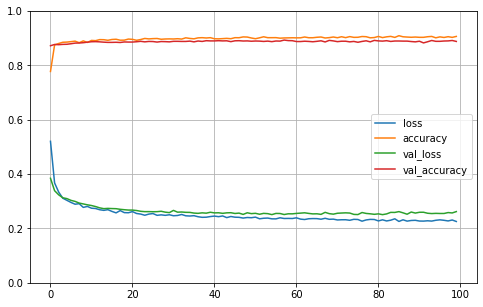

In [26]:
import pandas as pd
import matplotlib.pyplot as plt

pd.DataFrame(history.history).plot(figsize=(8,5))
plt.grid(True)
plt.gca().set_ylim(0,1)
plt.show()

================================






DATA COLLECTION FOR RESULTS FOR:

Oversampled Dataset







==================================

In [12]:
from sklearn.utils import resample

def upsample(train_set):
    non_converts = train_set[train_set.Revenue==0]
    converts = train_set[train_set.Revenue==1]

    converts_upsampled = resample(converts,
                             replace=True,
                             n_samples=len(non_converts),
                             random_state=42)

    upsampled_set = pd.concat([non_converts, converts_upsampled])
    upsampled_set.Revenue.value_counts()
    return upsampled_set

#train_set, 50% negative, 50% positive, test_set, 84.5% negative,  15.5% positive
train_set, test_set = split_train_test(shoppers_data, 0.3)
upsampled_set = upsample(train_set)

In [ ]:
Upsampled_Y = upsampled_set['Revenue']
Upsampled_X = upsampled_set.drop(columns=['Revenue'])

In [ ]:
================================

GRID SEARCH FOR:

Oversampled Dataset

==================================

In [45]:
train_set, test_set = split_train_test(shoppers_data, 0.3)
upsampled_set = upsample(train_set)
Upsampled_Y = upsampled_set['Revenue']
Upsampled_X = upsampled_set.drop(columns=['Revenue'])
Upsampled_linear_svc= Pipeline([
    ('std', StandardScaler()),
    ("svc", SVC())
])
param_grid = [
    {'svc__C': [1, 10, 100], 'svc__gamma': ['auto'], 'svc__kernel':['linear','poly', 'sigmoid', 'rbf']}
]
Upsampled_grid_search = GridSearchCV(Upsampled_linear_svc, param_grid)
Upsampled_grid_search.fit(Upsampled_X, Upsampled_Y)

GridSearchCV(estimator=Pipeline(steps=[('std', StandardScaler()),
                                       ('svc', SVC())]),
             param_grid=[{'svc__C': [1, 10, 100], 'svc__gamma': ['auto'],
                          'svc__kernel': ['linear', 'poly', 'sigmoid', 'rbf']}])

In [46]:
Upsampled_grid_search.best_params_

{'svc__C': 100, 'svc__gamma': 'auto', 'svc__kernel': 'rbf'}

In [47]:
from sklearn.ensemble import RandomForestClassifier

rnd_clf = Pipeline([
    ("std", StandardScaler()),
    ("rnd", RandomForestClassifier())
])

param_grid = [
    {'rnd__n_estimators': [100, 200, 500], 'rnd__max_features': ['auto', 'sqrt', 'log2'], 'rnd__max_depth' : [4,5,6,7,8],'rnd__criterion' :['gini', 'entropy']}
]
rnd_grid = GridSearchCV(rnd_clf, param_grid,scoring='accuracy')
rnd_grid.fit(Upsampled_X, Upsampled_Y)

GridSearchCV(estimator=Pipeline(steps=[('std', StandardScaler()),
                                       ('rnd', RandomForestClassifier())]),
             param_grid=[{'rnd__criterion': ['gini', 'entropy'],
                          'rnd__max_depth': [4, 5, 6, 7, 8],
                          'rnd__max_features': ['auto', 'sqrt', 'log2'],
                          'rnd__n_estimators': [100, 200, 500]}],
             scoring='accuracy')

In [48]:
rnd_grid.best_params_

{'rnd__criterion': 'gini',
 'rnd__max_depth': 8,
 'rnd__max_features': 'log2',
 'rnd__n_estimators': 100}

In [15]:
import lightgbm as lgb
train_set, test_set = split_train_test(shoppers_data, 0.3)
train_set = upsample(train_set)
X_transformed, Y_train, X_transformed_test, Y_test = transform_data(train_set, test_set)

lg_clf = Pipeline([
    ('lgb', lgb.LGBMClassifier())
])

param_grid = [
    {'lgb__learning_rate': np.linspace(0.01, 1.0, num=99, endpoint=False), 'lgb__max_depth': [1,2,3,4,5]}
]

#lg_clf = lgb.LGBMClassifier(learning_rate=0.20, max_depth=5, random_state=42)
#lg_clf.fit(X_transformed, Y_train, eval_metric='accuracy')

grid_search = GridSearchCV(lg_clf, param_grid, scoring='accuracy', cv=5)
grid_search.fit(X_transformed, Y_train)

GridSearchCV(cv=5, estimator=Pipeline(steps=[('lgb', LGBMClassifier())]),
             param_grid=[{'lgb__learning_rate': array([0.01, 0.02, 0.03, 0.04, 0.05, 0.06, 0.07, 0.08, 0.09, 0.1 , 0.11,
       0.12, 0.13, 0.14, 0.15, 0.16, 0.17, 0.18, 0.19, 0.2 , 0.21, 0.22,
       0.23, 0.24, 0.25, 0.26, 0.27, 0.28, 0.29, 0.3 , 0.31, 0.32, 0.33,
       0.34, 0.35, 0.36, 0.37, 0.38, 0.39, 0.4 , 0.41, 0.42, 0.43, 0.44,
       0.45, 0.46, 0.47, 0.48, 0.49, 0.5 , 0.51, 0.52, 0.53, 0.54, 0.55,
       0.56, 0.57, 0.58, 0.59, 0.6 , 0.61, 0.62, 0.63, 0.64, 0.65, 0.66,
       0.67, 0.68, 0.69, 0.7 , 0.71, 0.72, 0.73, 0.74, 0.75, 0.76, 0.77,
       0.78, 0.79, 0.8 , 0.81, 0.82, 0.83, 0.84, 0.85, 0.86, 0.87, 0.88,
       0.89, 0.9 , 0.91, 0.92, 0.93, 0.94, 0.95, 0.96, 0.97, 0.98, 0.99]),
                          'lgb__max_depth': [1, 2, 3, 4, 5]}],
             scoring='accuracy')

In [32]:
grid_search.best_params_

{'lgb__learning_rate': 0.9600000000000001, 'lgb__max_depth': 5}

In [51]:
totals_accuracy = totals_TPR = totals_TNR = totals_f1 = 0
runs = 100
values = []
for i in range(runs):
    train_set, test_set = split_train_test(shoppers_data, 0.3, random_state=i)
    train_set = upsample(train_set)
    X_transformed, Y_train, X_transformed_test, Y_test = transform_data(train_set, test_set)
    
    svc = SVC(C=100, gamma='auto', kernel='rbf')
    svc.fit(X_transformed, Y_train)
    test_pred2 = svc.predict(X_transformed_test)
    accuracy, TPR, TNR, f1 = test_performance(Y_test, test_pred2)
    values.append(f1)
    totals_accuracy += accuracy
    totals_TPR += TPR
    totals_TNR += TNR
    totals_f1 += f1
    
avg_accuracy = totals_accuracy/runs
avg_TPR = totals_TPR/runs
avg_TNR = totals_TNR/runs
avg_f1 = totals_f1/runs
std_deviation = np.std(values)
print("Accuracy:%s\nTPR:%s\nTNR:%s\nF1:%s\nStd:%s" %(avg_accuracy, avg_TPR, avg_TNR, avg_f1, std_deviation))
print(values)

Accuracy:0.8508948364422815
TPR:0.6259615384615385
TNR:0.8920402942117045
F1:0.5649277805586885
Std:0.015462063765904335
[0.5523809523809524, 0.5693779904306221, 0.5478395061728396, 0.5299539170506912, 0.5754716981132076, 0.5806988352745424, 0.5590361445783133, 0.5506783719074222, 0.5740318906605922, 0.5609157808667212, 0.5535289452815225, 0.5643970467596391, 0.6006144393241166, 0.5698587127158556, 0.56353591160221, 0.5605700712589073, 0.5911251980982568, 0.580441640378549, 0.5725249424405219, 0.5811437403400308, 0.5729984301412873, 0.5696877380045697, 0.555045871559633, 0.5691946833463644, 0.5510204081632653, 0.5612903225806452, 0.5641434262948207, 0.5621212121212121, 0.5605095541401274, 0.5421591804570528, 0.5737704918032787, 0.5419254658385092, 0.5761047463175123, 0.5391304347826087, 0.560879811468971, 0.5632911392405062, 0.5771065182829888, 0.592063492063492, 0.5568000000000001, 0.5550314465408804, 0.5377358490566038, 0.5624509033778475, 0.55625, 0.5748218527315914, 0.5615141955835

In [76]:
from sklearn.ensemble import RandomForestClassifier
totals_accuracy = totals_TPR = totals_TNR = totals_f1 = totals_rec = totals_prec = 0
runs = 100
values = []
for i in range(runs):
    train_set, test_set = split_train_test2(shoppers_data, 0.3, random_state=i)
    train_set = upsample(train_set)
    X_transformed, Y_train, X_transformed_test, Y_test = transform_data(train_set, test_set)
    
    rnd = RandomForestClassifier(criterion='gini', max_depth=8, max_features='log2', n_estimators=100)
    rnd.fit(X_transformed, Y_train)
    test_pred2 = rnd.predict(X_transformed_test)
    accuracy, TPR, TNR, f1, = test_performance(Y_test, test_pred2)
    values.append(f1)
    totals_accuracy += accuracy
    totals_TPR += TPR
    totals_TNR += TNR
    totals_f1 += f1
    
avg_accuracy = totals_accuracy/runs
avg_TPR = totals_TPR/runs
avg_TNR = totals_TNR/runs
avg_f1 = totals_f1/runs
std_deviation = np.std(values)
print("Accuracy:%s\nTPR:%s\nTNR:%s\nF1:%s\nStd:%s" %(avg_accuracy, avg_TPR, avg_TNR, avg_f1, std_deviation))
print(values)

Accuracy:0.8716031359826979
TPR:0.8214353925270071
TNR:0.8807985614027316
F1:0.6644419283138352
Std:0.013624266100064704
[0.6750496360026472, 0.654014598540146, 0.6392830470500374, 0.6633522727272727, 0.6623931623931625, 0.658008658008658, 0.6794326241134752, 0.6773296244784424, 0.6553672316384181, 0.6647187728268809, 0.6629134412385644, 0.6754143646408839, 0.6807351940095303, 0.6802325581395349, 0.642909090909091, 0.6899930020993703, 0.6472675656493967, 0.6662011173184358, 0.6844563042028018, 0.6656934306569343, 0.652767792954709, 0.657514450867052, 0.6638537271448665, 0.6695402298850575, 0.6385809312638582, 0.6503244412400866, 0.6475924633635729, 0.6652601969057664, 0.6551971326164876, 0.6487252124645891, 0.6630211893369788, 0.6390977443609022, 0.6699232379623168, 0.676680972818312, 0.6331658291457286, 0.6599856836077309, 0.6662125340599456, 0.6796929518492673, 0.6775336640680367, 0.6840659340659341, 0.6425992779783394, 0.6474719101123596, 0.6569847856154909, 0.6676279740447008, 0.65

In [23]:
rnd_grid.best_scores_

NameError: name 'rnd_grid' is not defined

In [77]:
from tensorflow import keras

totals_accuracy = totals_TPR = totals_TNR = totals_f1 = 0
values = []
for i in range(100):
    train_set, test_set = split_train_test(shoppers_data, 0.3, random_state=i)
    train_set = upsample(train_set)
    X_transformed, Y_train, X_transformed_test, Y_test = transform_data(train_set, test_set)
    
    model = keras.models.Sequential([
        keras.layers.Dense(70, activation="relu", input_dim=19),
        keras.layers.Dense(10, activation="relu"),
        keras.layers.Dense(1, activation="sigmoid")
    ])
    model.compile(optimizer="sgd", loss="binary_crossentropy",  metrics=["accuracy"])
    history = model.fit(X_transformed, Y_train, epochs=30, validation_split=0.3) #regularization: dropout, batch normalization
    test_pred = (model.predict(X_transformed_test) > 0.5).astype('int32')
    
    accuracy, TPR, TNR, f1 = test_performance(Y_test, test_pred)
    values.append(f1)
    totals_accuracy += accuracy
    totals_TPR += TPR
    totals_TNR += TNR
    totals_f1 += f1
    
avg_accuracy = totals_accuracy/100
avg_TPR = totals_TPR/100
avg_TNR = totals_TNR/100
avg_f1 = totals_f1/100
std_deviation = np.std(values)
print("Accuracy:%s\nTPR:%s\nTNR:%s\nF1:%s\nStd:%s" %(avg_accuracy, avg_TPR, avg_TNR, avg_f1, std_deviation))
print(values)

Epoch 1/30
320/320 [==============================] - 1s 1ms/step - loss: 0.6111 - accuracy: 0.6920 - val_loss: 1.0658 - val_accuracy: 0.0176
Epoch 2/30
320/320 [==============================] - 0s 1ms/step - loss: 0.5235 - accuracy: 0.7243 - val_loss: 1.0455 - val_accuracy: 0.1506
Epoch 3/30
320/320 [==============================] - 0s 1ms/step - loss: 0.4751 - accuracy: 0.7610 - val_loss: 0.9786 - val_accuracy: 0.3208
Epoch 4/30
320/320 [==============================] - 0s 1ms/step - loss: 0.4390 - accuracy: 0.7929 - val_loss: 0.8664 - val_accuracy: 0.4393
Epoch 5/30
320/320 [==============================] - 0s 1ms/step - loss: 0.4111 - accuracy: 0.8125 - val_loss: 0.8150 - val_accuracy: 0.4933
Epoch 6/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3923 - accuracy: 0.8245 - val_loss: 0.7781 - val_accuracy: 0.5230
Epoch 7/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3799 - accuracy: 0.8325 - val_loss: 0.7831 - val_accuracy: 0.5367
Epoch 

320/320 [==============================] - 0s 1ms/step - loss: 0.3005 - accuracy: 0.8662 - val_loss: 0.6461 - val_accuracy: 0.6692
Epoch 26/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2987 - accuracy: 0.8678 - val_loss: 0.6045 - val_accuracy: 0.6973
Epoch 27/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2966 - accuracy: 0.8691 - val_loss: 0.6468 - val_accuracy: 0.6795
Epoch 28/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2949 - accuracy: 0.8707 - val_loss: 0.6017 - val_accuracy: 0.6941
Epoch 29/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2930 - accuracy: 0.8703 - val_loss: 0.6006 - val_accuracy: 0.7021
Epoch 30/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2910 - accuracy: 0.8709 - val_loss: 0.6162 - val_accuracy: 0.6827
Epoch 1/30
320/320 [==============================] - 1s 1ms/step - loss: 0.5634 - accuracy: 0.7174 - val_loss: 0.9816 - val_accuracy: 0.2186
Epoch 2/30
3

320/320 [==============================] - 0s 1ms/step - loss: 0.3171 - accuracy: 0.8624 - val_loss: 0.6040 - val_accuracy: 0.6980
Epoch 20/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3145 - accuracy: 0.8650 - val_loss: 0.6263 - val_accuracy: 0.6863
Epoch 21/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3124 - accuracy: 0.8661 - val_loss: 0.5779 - val_accuracy: 0.7160
Epoch 22/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3102 - accuracy: 0.8668 - val_loss: 0.6074 - val_accuracy: 0.7133
Epoch 23/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3076 - accuracy: 0.8665 - val_loss: 0.6042 - val_accuracy: 0.7032
Epoch 24/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3057 - accuracy: 0.8677 - val_loss: 0.5997 - val_accuracy: 0.7121
Epoch 25/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3041 - accuracy: 0.8699 - val_loss: 0.6285 - val_accuracy: 0.6943
Epoch 26/30

320/320 [==============================] - 0s 1ms/step - loss: 0.3334 - accuracy: 0.8596 - val_loss: 0.6951 - val_accuracy: 0.6354
Epoch 14/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3303 - accuracy: 0.8593 - val_loss: 0.6857 - val_accuracy: 0.6431
Epoch 15/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3273 - accuracy: 0.8608 - val_loss: 0.6717 - val_accuracy: 0.6520
Epoch 16/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3245 - accuracy: 0.8617 - val_loss: 0.7029 - val_accuracy: 0.6424
Epoch 17/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3219 - accuracy: 0.8614 - val_loss: 0.6532 - val_accuracy: 0.6678
Epoch 18/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3192 - accuracy: 0.8616 - val_loss: 0.6537 - val_accuracy: 0.6804
Epoch 19/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3171 - accuracy: 0.8649 - val_loss: 0.6621 - val_accuracy: 0.6708
Epoch 20/30

320/320 [==============================] - 0s 1ms/step - loss: 0.3416 - accuracy: 0.8512 - val_loss: 0.6830 - val_accuracy: 0.6219
Epoch 8/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3340 - accuracy: 0.8556 - val_loss: 0.6845 - val_accuracy: 0.6217
Epoch 9/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3284 - accuracy: 0.8582 - val_loss: 0.6431 - val_accuracy: 0.6530
Epoch 10/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3235 - accuracy: 0.8612 - val_loss: 0.6578 - val_accuracy: 0.6632
Epoch 11/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3196 - accuracy: 0.8636 - val_loss: 0.6187 - val_accuracy: 0.6701
Epoch 12/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3159 - accuracy: 0.8662 - val_loss: 0.6422 - val_accuracy: 0.6632
Epoch 13/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3125 - accuracy: 0.8670 - val_loss: 0.5963 - val_accuracy: 0.7028
Epoch 14/30
3

320/320 [==============================] - 1s 1ms/step - loss: 0.5554 - accuracy: 0.7091 - val_loss: 1.0181 - val_accuracy: 0.1563
Epoch 2/30
320/320 [==============================] - 0s 1ms/step - loss: 0.4697 - accuracy: 0.7543 - val_loss: 0.9459 - val_accuracy: 0.3745
Epoch 3/30
320/320 [==============================] - 0s 1ms/step - loss: 0.4263 - accuracy: 0.7982 - val_loss: 0.8650 - val_accuracy: 0.4796
Epoch 4/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3966 - accuracy: 0.8217 - val_loss: 0.8123 - val_accuracy: 0.5330
Epoch 5/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3785 - accuracy: 0.8343 - val_loss: 0.7289 - val_accuracy: 0.5972
Epoch 6/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3673 - accuracy: 0.8397 - val_loss: 0.7426 - val_accuracy: 0.5981
Epoch 7/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3591 - accuracy: 0.8449 - val_loss: 0.7154 - val_accuracy: 0.6102
Epoch 8/30
320/32

320/320 [==============================] - 0s 1ms/step - loss: 0.3090 - accuracy: 0.8669 - val_loss: 0.5921 - val_accuracy: 0.7057
Epoch 26/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3073 - accuracy: 0.8667 - val_loss: 0.6143 - val_accuracy: 0.7126
Epoch 27/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3054 - accuracy: 0.8684 - val_loss: 0.6609 - val_accuracy: 0.6808
Epoch 28/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3039 - accuracy: 0.8703 - val_loss: 0.6029 - val_accuracy: 0.7062
Epoch 29/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3024 - accuracy: 0.8710 - val_loss: 0.6413 - val_accuracy: 0.6799
Epoch 30/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3007 - accuracy: 0.8694 - val_loss: 0.6172 - val_accuracy: 0.7229
Epoch 1/30
320/320 [==============================] - 1s 1ms/step - loss: 0.6017 - accuracy: 0.7129 - val_loss: 1.0455 - val_accuracy: 0.0155
Epoch 2/30
3

320/320 [==============================] - 0s 1ms/step - loss: 0.3202 - accuracy: 0.8615 - val_loss: 0.6783 - val_accuracy: 0.6660
Epoch 20/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3185 - accuracy: 0.8627 - val_loss: 0.6590 - val_accuracy: 0.6861
Epoch 21/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3161 - accuracy: 0.8650 - val_loss: 0.6006 - val_accuracy: 0.7128
Epoch 22/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3145 - accuracy: 0.8649 - val_loss: 0.6192 - val_accuracy: 0.6923
Epoch 23/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3125 - accuracy: 0.8662 - val_loss: 0.6560 - val_accuracy: 0.6724
Epoch 24/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3109 - accuracy: 0.8671 - val_loss: 0.6045 - val_accuracy: 0.7037
Epoch 25/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3090 - accuracy: 0.8668 - val_loss: 0.5798 - val_accuracy: 0.7167
Epoch 26/30

320/320 [==============================] - 0s 1ms/step - loss: 0.3404 - accuracy: 0.8539 - val_loss: 0.6783 - val_accuracy: 0.6347
Epoch 14/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3368 - accuracy: 0.8565 - val_loss: 0.6549 - val_accuracy: 0.6486
Epoch 15/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3334 - accuracy: 0.8560 - val_loss: 0.6439 - val_accuracy: 0.6706
Epoch 16/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3304 - accuracy: 0.8585 - val_loss: 0.6486 - val_accuracy: 0.6671
Epoch 17/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3274 - accuracy: 0.8615 - val_loss: 0.6391 - val_accuracy: 0.6733
Epoch 18/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3246 - accuracy: 0.8645 - val_loss: 0.6250 - val_accuracy: 0.6948
Epoch 19/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3219 - accuracy: 0.8662 - val_loss: 0.5964 - val_accuracy: 0.7028
Epoch 20/30

320/320 [==============================] - 0s 1ms/step - loss: 0.3734 - accuracy: 0.8349 - val_loss: 0.7667 - val_accuracy: 0.5616
Epoch 8/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3653 - accuracy: 0.8404 - val_loss: 0.7214 - val_accuracy: 0.5961
Epoch 9/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3588 - accuracy: 0.8455 - val_loss: 0.7358 - val_accuracy: 0.5885
Epoch 10/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3534 - accuracy: 0.8463 - val_loss: 0.7513 - val_accuracy: 0.6025
Epoch 11/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3494 - accuracy: 0.8484 - val_loss: 0.6673 - val_accuracy: 0.6406
Epoch 12/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3454 - accuracy: 0.8508 - val_loss: 0.6589 - val_accuracy: 0.6493
Epoch 13/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3419 - accuracy: 0.8528 - val_loss: 0.6700 - val_accuracy: 0.6399
Epoch 14/30
3

320/320 [==============================] - 1s 1ms/step - loss: 0.5479 - accuracy: 0.7214 - val_loss: 0.9763 - val_accuracy: 0.2488
Epoch 2/30
320/320 [==============================] - 0s 1ms/step - loss: 0.4658 - accuracy: 0.7746 - val_loss: 0.8747 - val_accuracy: 0.4382
Epoch 3/30
320/320 [==============================] - 0s 1ms/step - loss: 0.4222 - accuracy: 0.8098 - val_loss: 0.8375 - val_accuracy: 0.4850
Epoch 4/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3919 - accuracy: 0.8256 - val_loss: 0.7870 - val_accuracy: 0.5371
Epoch 5/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3730 - accuracy: 0.8383 - val_loss: 0.7563 - val_accuracy: 0.5714
Epoch 6/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3608 - accuracy: 0.8447 - val_loss: 0.7392 - val_accuracy: 0.5883
Epoch 7/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3526 - accuracy: 0.8468 - val_loss: 0.7335 - val_accuracy: 0.6002
Epoch 8/30
320/32

320/320 [==============================] - 0s 1ms/step - loss: 0.3116 - accuracy: 0.8652 - val_loss: 0.6487 - val_accuracy: 0.6724
Epoch 26/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3098 - accuracy: 0.8669 - val_loss: 0.6080 - val_accuracy: 0.7080
Epoch 27/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3076 - accuracy: 0.8675 - val_loss: 0.6637 - val_accuracy: 0.6733
Epoch 28/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3063 - accuracy: 0.8680 - val_loss: 0.6220 - val_accuracy: 0.6964
Epoch 29/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3049 - accuracy: 0.8670 - val_loss: 0.6749 - val_accuracy: 0.6831
Epoch 30/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3031 - accuracy: 0.8686 - val_loss: 0.6322 - val_accuracy: 0.6987
Epoch 1/30
320/320 [==============================] - 1s 1ms/step - loss: 0.5929 - accuracy: 0.6896 - val_loss: 0.9723 - val_accuracy: 0.2022
Epoch 2/30
3

320/320 [==============================] - 0s 1ms/step - loss: 0.3177 - accuracy: 0.8633 - val_loss: 0.6380 - val_accuracy: 0.6662
Epoch 20/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3151 - accuracy: 0.8650 - val_loss: 0.6854 - val_accuracy: 0.6614
Epoch 21/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3127 - accuracy: 0.8653 - val_loss: 0.6835 - val_accuracy: 0.6632
Epoch 22/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3106 - accuracy: 0.8659 - val_loss: 0.6210 - val_accuracy: 0.6865
Epoch 23/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3083 - accuracy: 0.8677 - val_loss: 0.6988 - val_accuracy: 0.6612
Epoch 24/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3063 - accuracy: 0.8685 - val_loss: 0.6541 - val_accuracy: 0.6824
Epoch 25/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3042 - accuracy: 0.8703 - val_loss: 0.6379 - val_accuracy: 0.6852
Epoch 26/30

320/320 [==============================] - 0s 1ms/step - loss: 0.3388 - accuracy: 0.8555 - val_loss: 0.6307 - val_accuracy: 0.6587
Epoch 14/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3350 - accuracy: 0.8569 - val_loss: 0.6843 - val_accuracy: 0.6393
Epoch 15/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3310 - accuracy: 0.8586 - val_loss: 0.7365 - val_accuracy: 0.6105
Epoch 16/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3280 - accuracy: 0.8586 - val_loss: 0.6811 - val_accuracy: 0.6466
Epoch 17/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3245 - accuracy: 0.8610 - val_loss: 0.6489 - val_accuracy: 0.6600
Epoch 18/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3213 - accuracy: 0.8613 - val_loss: 0.6439 - val_accuracy: 0.6648
Epoch 19/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3183 - accuracy: 0.8615 - val_loss: 0.6876 - val_accuracy: 0.6404
Epoch 20/30

320/320 [==============================] - 0s 1ms/step - loss: 0.3723 - accuracy: 0.8355 - val_loss: 0.7445 - val_accuracy: 0.5604
Epoch 8/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3653 - accuracy: 0.8405 - val_loss: 0.7418 - val_accuracy: 0.5661
Epoch 9/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3599 - accuracy: 0.8434 - val_loss: 0.7051 - val_accuracy: 0.5970
Epoch 10/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3552 - accuracy: 0.8466 - val_loss: 0.7118 - val_accuracy: 0.6006
Epoch 11/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3509 - accuracy: 0.8490 - val_loss: 0.6977 - val_accuracy: 0.6255
Epoch 12/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3470 - accuracy: 0.8522 - val_loss: 0.6761 - val_accuracy: 0.6322
Epoch 13/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3434 - accuracy: 0.8545 - val_loss: 0.6789 - val_accuracy: 0.6367
Epoch 14/30
3

320/320 [==============================] - 1s 1ms/step - loss: 0.5679 - accuracy: 0.6947 - val_loss: 1.0538 - val_accuracy: 0.0644
Epoch 2/30
320/320 [==============================] - 0s 1ms/step - loss: 0.4831 - accuracy: 0.7507 - val_loss: 0.9680 - val_accuracy: 0.2975
Epoch 3/30
320/320 [==============================] - 0s 1ms/step - loss: 0.4400 - accuracy: 0.7955 - val_loss: 0.9022 - val_accuracy: 0.4103
Epoch 4/30
320/320 [==============================] - 0s 1ms/step - loss: 0.4089 - accuracy: 0.8181 - val_loss: 0.8203 - val_accuracy: 0.4923
Epoch 5/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3872 - accuracy: 0.8318 - val_loss: 0.8256 - val_accuracy: 0.5065
Epoch 6/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3728 - accuracy: 0.8394 - val_loss: 0.7468 - val_accuracy: 0.5597
Epoch 7/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3627 - accuracy: 0.8469 - val_loss: 0.7751 - val_accuracy: 0.5609
Epoch 8/30
320/32

320/320 [==============================] - 0s 1ms/step - loss: 0.2997 - accuracy: 0.8731 - val_loss: 0.5761 - val_accuracy: 0.7295
Epoch 26/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2979 - accuracy: 0.8748 - val_loss: 0.5982 - val_accuracy: 0.7144
Epoch 27/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2962 - accuracy: 0.8735 - val_loss: 0.6172 - val_accuracy: 0.7160
Epoch 28/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2952 - accuracy: 0.8746 - val_loss: 0.5918 - val_accuracy: 0.7229
Epoch 29/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2935 - accuracy: 0.8749 - val_loss: 0.6296 - val_accuracy: 0.7124
Epoch 30/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2921 - accuracy: 0.8756 - val_loss: 0.6029 - val_accuracy: 0.7208
Epoch 1/30
320/320 [==============================] - 1s 1ms/step - loss: 0.5262 - accuracy: 0.7301 - val_loss: 0.9682 - val_accuracy: 0.3151
Epoch 2/30
3

320/320 [==============================] - 0s 1ms/step - loss: 0.3073 - accuracy: 0.8710 - val_loss: 0.6463 - val_accuracy: 0.6907
Epoch 20/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3051 - accuracy: 0.8722 - val_loss: 0.6678 - val_accuracy: 0.6772
Epoch 21/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3033 - accuracy: 0.8715 - val_loss: 0.6285 - val_accuracy: 0.7089
Epoch 22/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3014 - accuracy: 0.8720 - val_loss: 0.6071 - val_accuracy: 0.6961
Epoch 23/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2993 - accuracy: 0.8709 - val_loss: 0.6494 - val_accuracy: 0.6936
Epoch 24/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2979 - accuracy: 0.8739 - val_loss: 0.6198 - val_accuracy: 0.7050
Epoch 25/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2962 - accuracy: 0.8725 - val_loss: 0.6390 - val_accuracy: 0.7192
Epoch 26/30

320/320 [==============================] - 0s 1ms/step - loss: 0.3354 - accuracy: 0.8580 - val_loss: 0.6561 - val_accuracy: 0.6619
Epoch 14/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3324 - accuracy: 0.8597 - val_loss: 0.6537 - val_accuracy: 0.6536
Epoch 15/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3296 - accuracy: 0.8580 - val_loss: 0.6768 - val_accuracy: 0.6440
Epoch 16/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3268 - accuracy: 0.8608 - val_loss: 0.6201 - val_accuracy: 0.6763
Epoch 17/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3247 - accuracy: 0.8599 - val_loss: 0.6565 - val_accuracy: 0.6642
Epoch 18/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3226 - accuracy: 0.8615 - val_loss: 0.6189 - val_accuracy: 0.6893
Epoch 19/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3205 - accuracy: 0.8628 - val_loss: 0.6189 - val_accuracy: 0.6977
Epoch 20/30

320/320 [==============================] - 0s 2ms/step - loss: 0.3634 - accuracy: 0.8408 - val_loss: 0.7242 - val_accuracy: 0.6025
Epoch 8/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3571 - accuracy: 0.8451 - val_loss: 0.7264 - val_accuracy: 0.5961
Epoch 9/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3519 - accuracy: 0.8458 - val_loss: 0.7224 - val_accuracy: 0.5988
Epoch 10/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3472 - accuracy: 0.8499 - val_loss: 0.6750 - val_accuracy: 0.6303
Epoch 11/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3429 - accuracy: 0.8517 - val_loss: 0.6715 - val_accuracy: 0.6322
Epoch 12/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3395 - accuracy: 0.8530 - val_loss: 0.6737 - val_accuracy: 0.6388
Epoch 13/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3358 - accuracy: 0.8553 - val_loss: 0.6766 - val_accuracy: 0.6445
Epoch 14/30
3

320/320 [==============================] - 1s 1ms/step - loss: 0.5799 - accuracy: 0.7105 - val_loss: 1.0127 - val_accuracy: 0.1796
Epoch 2/30
320/320 [==============================] - 0s 1ms/step - loss: 0.4761 - accuracy: 0.7644 - val_loss: 0.9447 - val_accuracy: 0.3454
Epoch 3/30
320/320 [==============================] - 1s 2ms/step - loss: 0.4326 - accuracy: 0.7971 - val_loss: 0.8578 - val_accuracy: 0.4453
Epoch 4/30
320/320 [==============================] - 0s 1ms/step - loss: 0.4047 - accuracy: 0.8199 - val_loss: 0.8443 - val_accuracy: 0.4782
Epoch 5/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3863 - accuracy: 0.8305 - val_loss: 0.7580 - val_accuracy: 0.5376
Epoch 6/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3742 - accuracy: 0.8376 - val_loss: 0.7616 - val_accuracy: 0.5472
Epoch 7/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3652 - accuracy: 0.8429 - val_loss: 0.7484 - val_accuracy: 0.5664
Epoch 8/30
320/32

320/320 [==============================] - 0s 1ms/step - loss: 0.3156 - accuracy: 0.8653 - val_loss: 0.6502 - val_accuracy: 0.6706
Epoch 26/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3141 - accuracy: 0.8655 - val_loss: 0.6118 - val_accuracy: 0.7007
Epoch 27/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3120 - accuracy: 0.8660 - val_loss: 0.5724 - val_accuracy: 0.7210
Epoch 28/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3104 - accuracy: 0.8662 - val_loss: 0.6080 - val_accuracy: 0.7076
Epoch 29/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3089 - accuracy: 0.8664 - val_loss: 0.6141 - val_accuracy: 0.6998
Epoch 30/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3073 - accuracy: 0.8675 - val_loss: 0.5958 - val_accuracy: 0.7114
Epoch 1/30
320/320 [==============================] - 1s 1ms/step - loss: 0.5719 - accuracy: 0.7021 - val_loss: 0.9970 - val_accuracy: 0.2276
Epoch 2/30
3

320/320 [==============================] - 0s 1ms/step - loss: 0.3267 - accuracy: 0.8625 - val_loss: 0.6093 - val_accuracy: 0.6955
Epoch 20/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3245 - accuracy: 0.8629 - val_loss: 0.6121 - val_accuracy: 0.6973
Epoch 21/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3223 - accuracy: 0.8639 - val_loss: 0.6337 - val_accuracy: 0.6811
Epoch 22/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3206 - accuracy: 0.8651 - val_loss: 0.5860 - val_accuracy: 0.7019
Epoch 23/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3181 - accuracy: 0.8657 - val_loss: 0.6536 - val_accuracy: 0.6881
Epoch 24/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3168 - accuracy: 0.8643 - val_loss: 0.6081 - val_accuracy: 0.7032
Epoch 25/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3148 - accuracy: 0.8670 - val_loss: 0.6245 - val_accuracy: 0.6936
Epoch 26/30

320/320 [==============================] - 0s 1ms/step - loss: 0.3416 - accuracy: 0.8531 - val_loss: 0.6768 - val_accuracy: 0.6237
Epoch 14/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3381 - accuracy: 0.8533 - val_loss: 0.6211 - val_accuracy: 0.6530
Epoch 15/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3350 - accuracy: 0.8562 - val_loss: 0.6685 - val_accuracy: 0.6299
Epoch 16/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3319 - accuracy: 0.8568 - val_loss: 0.6487 - val_accuracy: 0.6470
Epoch 17/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3291 - accuracy: 0.8596 - val_loss: 0.6323 - val_accuracy: 0.6667
Epoch 18/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3261 - accuracy: 0.8604 - val_loss: 0.6611 - val_accuracy: 0.6424
Epoch 19/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3235 - accuracy: 0.8622 - val_loss: 0.5834 - val_accuracy: 0.7050
Epoch 20/30

320/320 [==============================] - 0s 1ms/step - loss: 0.3587 - accuracy: 0.8444 - val_loss: 0.7529 - val_accuracy: 0.5636
Epoch 8/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3534 - accuracy: 0.8465 - val_loss: 0.7078 - val_accuracy: 0.6182
Epoch 9/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3491 - accuracy: 0.8518 - val_loss: 0.7270 - val_accuracy: 0.6125
Epoch 10/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3450 - accuracy: 0.8536 - val_loss: 0.7125 - val_accuracy: 0.6249
Epoch 11/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3414 - accuracy: 0.8548 - val_loss: 0.6791 - val_accuracy: 0.6415
Epoch 12/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3385 - accuracy: 0.8561 - val_loss: 0.7085 - val_accuracy: 0.6399
Epoch 13/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3356 - accuracy: 0.8570 - val_loss: 0.7115 - val_accuracy: 0.6255
Epoch 14/30
3

320/320 [==============================] - 1s 1ms/step - loss: 0.5924 - accuracy: 0.6802 - val_loss: 1.0805 - val_accuracy: 0.0537
Epoch 2/30
320/320 [==============================] - 0s 1ms/step - loss: 0.4957 - accuracy: 0.7538 - val_loss: 0.9716 - val_accuracy: 0.2828
Epoch 3/30
320/320 [==============================] - 1s 2ms/step - loss: 0.4470 - accuracy: 0.7954 - val_loss: 0.9226 - val_accuracy: 0.3758
Epoch 4/30
320/320 [==============================] - 0s 1ms/step - loss: 0.4169 - accuracy: 0.8109 - val_loss: 0.8414 - val_accuracy: 0.4606
Epoch 5/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3980 - accuracy: 0.8220 - val_loss: 0.8707 - val_accuracy: 0.4515
Epoch 6/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3856 - accuracy: 0.8304 - val_loss: 0.7833 - val_accuracy: 0.5284
Epoch 7/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3776 - accuracy: 0.8353 - val_loss: 0.8088 - val_accuracy: 0.5193
Epoch 8/30
320/32

320/320 [==============================] - 0s 1ms/step - loss: 0.3144 - accuracy: 0.8642 - val_loss: 0.6177 - val_accuracy: 0.7217
Epoch 26/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3125 - accuracy: 0.8644 - val_loss: 0.6174 - val_accuracy: 0.7114
Epoch 27/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3114 - accuracy: 0.8645 - val_loss: 0.6096 - val_accuracy: 0.7279
Epoch 28/30
320/320 [==============================] - 0s 2ms/step - loss: 0.3094 - accuracy: 0.8654 - val_loss: 0.6281 - val_accuracy: 0.7199
Epoch 29/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3078 - accuracy: 0.8670 - val_loss: 0.5964 - val_accuracy: 0.7377
Epoch 30/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3066 - accuracy: 0.8658 - val_loss: 0.5764 - val_accuracy: 0.7482
Epoch 1/30
320/320 [==============================] - 1s 1ms/step - loss: 0.5631 - accuracy: 0.7244 - val_loss: 0.9781 - val_accuracy: 0.2056
Epoch 2/30
3

In [13]:
from tensorflow import keras

totals_accuracy = totals_TPR = totals_TNR = totals_f1 = 0
values = []
for i in range(100):
    train_set, test_set = split_train_test(shoppers_data, 0.3, random_state=i)
    train_set = upsample(train_set)
    X_transformed, Y_train, X_transformed_test, Y_test = transform_data(train_set, test_set)
    
    model = keras.models.Sequential([
        keras.layers.Dense(70, activation="relu", input_dim=19),
        keras.layers.Dense(20, activation="relu"),
        keras.layers.Dense(1, activation="sigmoid")
    ])
    model.compile(optimizer="sgd", loss="binary_crossentropy",  metrics=["accuracy"])
    history = model.fit(X_transformed, Y_train, epochs=30, validation_split=0.3) #regularization: dropout, batch normalization
    test_pred = (model.predict(X_transformed_test) > 0.5).astype('int32')
    
    accuracy, TPR, TNR, f1 = test_performance(Y_test, test_pred)
    values.append(f1)
    totals_accuracy += accuracy
    totals_TPR += TPR
    totals_TNR += TNR
    totals_f1 += f1
    
avg_accuracy = totals_accuracy/100
avg_TPR = totals_TPR/100
avg_TNR = totals_TNR/100
avg_f1 = totals_f1/100
std_deviation = np.std(values)
print("Accuracy:%s\nTPR:%s\nTNR:%s\nF1:%s\nStd:%s" %(avg_accuracy, avg_TPR, avg_TNR, avg_f1, std_deviation))
print(values)

Epoch 1/30
320/320 [==============================] - 1s 2ms/step - loss: 0.5445 - accuracy: 0.7188 - val_loss: 1.0279 - val_accuracy: 0.1780
Epoch 2/30
320/320 [==============================] - 0s 1ms/step - loss: 0.4646 - accuracy: 0.7718 - val_loss: 0.9262 - val_accuracy: 0.3480
Epoch 3/30
320/320 [==============================] - 0s 1ms/step - loss: 0.4293 - accuracy: 0.8000 - val_loss: 0.8621 - val_accuracy: 0.4496
Epoch 4/30
320/320 [==============================] - 0s 1ms/step - loss: 0.4040 - accuracy: 0.8199 - val_loss: 0.8210 - val_accuracy: 0.4967
Epoch 5/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3859 - accuracy: 0.8271 - val_loss: 0.7809 - val_accuracy: 0.5310
Epoch 6/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3728 - accuracy: 0.8347 - val_loss: 0.7108 - val_accuracy: 0.5846
Epoch 7/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3632 - accuracy: 0.8407 - val_loss: 0.6973 - val_accuracy: 0.5892
Epoch 

320/320 [==============================] - 0s 1ms/step - loss: 0.2993 - accuracy: 0.8696 - val_loss: 0.6142 - val_accuracy: 0.6904
Epoch 26/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2977 - accuracy: 0.8711 - val_loss: 0.6238 - val_accuracy: 0.6719
Epoch 27/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2961 - accuracy: 0.8707 - val_loss: 0.5733 - val_accuracy: 0.7103
Epoch 28/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2943 - accuracy: 0.8717 - val_loss: 0.5760 - val_accuracy: 0.7007
Epoch 29/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2929 - accuracy: 0.8726 - val_loss: 0.5979 - val_accuracy: 0.6916
Epoch 30/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2916 - accuracy: 0.8716 - val_loss: 0.6046 - val_accuracy: 0.6957
Epoch 1/30
320/320 [==============================] - 1s 2ms/step - loss: 0.5900 - accuracy: 0.6935 - val_loss: 1.0201 - val_accuracy: 0.0859
Epoch 2/30
3

320/320 [==============================] - 0s 1ms/step - loss: 0.3166 - accuracy: 0.8669 - val_loss: 0.6204 - val_accuracy: 0.7030
Epoch 20/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3144 - accuracy: 0.8676 - val_loss: 0.6169 - val_accuracy: 0.7117
Epoch 21/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3122 - accuracy: 0.8668 - val_loss: 0.6274 - val_accuracy: 0.6961
Epoch 22/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3102 - accuracy: 0.8693 - val_loss: 0.5813 - val_accuracy: 0.7279
Epoch 23/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3086 - accuracy: 0.8687 - val_loss: 0.6371 - val_accuracy: 0.7114
Epoch 24/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3070 - accuracy: 0.8686 - val_loss: 0.5998 - val_accuracy: 0.7224
Epoch 25/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3047 - accuracy: 0.8694 - val_loss: 0.5925 - val_accuracy: 0.7286
Epoch 26/30

320/320 [==============================] - 0s 1ms/step - loss: 0.3343 - accuracy: 0.8570 - val_loss: 0.7026 - val_accuracy: 0.6157
Epoch 14/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3311 - accuracy: 0.8596 - val_loss: 0.7072 - val_accuracy: 0.6326
Epoch 15/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3272 - accuracy: 0.8594 - val_loss: 0.6534 - val_accuracy: 0.6651
Epoch 16/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3237 - accuracy: 0.8635 - val_loss: 0.6853 - val_accuracy: 0.6495
Epoch 17/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3204 - accuracy: 0.8629 - val_loss: 0.6341 - val_accuracy: 0.6854
Epoch 18/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3175 - accuracy: 0.8663 - val_loss: 0.6568 - val_accuracy: 0.6776
Epoch 19/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3147 - accuracy: 0.8665 - val_loss: 0.6328 - val_accuracy: 0.6982
Epoch 20/30

320/320 [==============================] - 0s 1ms/step - loss: 0.3425 - accuracy: 0.8484 - val_loss: 0.6750 - val_accuracy: 0.6134
Epoch 8/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3373 - accuracy: 0.8521 - val_loss: 0.6528 - val_accuracy: 0.6420
Epoch 9/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3329 - accuracy: 0.8556 - val_loss: 0.5970 - val_accuracy: 0.6875
Epoch 10/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3290 - accuracy: 0.8593 - val_loss: 0.6190 - val_accuracy: 0.6760
Epoch 11/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3259 - accuracy: 0.8598 - val_loss: 0.6297 - val_accuracy: 0.6552
Epoch 12/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3223 - accuracy: 0.8610 - val_loss: 0.6200 - val_accuracy: 0.6801
Epoch 13/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3193 - accuracy: 0.8631 - val_loss: 0.6251 - val_accuracy: 0.6614
Epoch 14/30
3

320/320 [==============================] - 1s 1ms/step - loss: 0.5617 - accuracy: 0.7108 - val_loss: 1.0162 - val_accuracy: 0.1663
Epoch 2/30
320/320 [==============================] - 0s 1ms/step - loss: 0.4620 - accuracy: 0.7771 - val_loss: 0.8880 - val_accuracy: 0.3930
Epoch 3/30
320/320 [==============================] - 0s 1ms/step - loss: 0.4231 - accuracy: 0.7999 - val_loss: 0.8568 - val_accuracy: 0.4435
Epoch 4/30
320/320 [==============================] - 0s 1ms/step - loss: 0.4009 - accuracy: 0.8147 - val_loss: 0.7946 - val_accuracy: 0.5042
Epoch 5/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3862 - accuracy: 0.8262 - val_loss: 0.8001 - val_accuracy: 0.5195
Epoch 6/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3760 - accuracy: 0.8307 - val_loss: 0.6978 - val_accuracy: 0.5778
Epoch 7/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3681 - accuracy: 0.8375 - val_loss: 0.7382 - val_accuracy: 0.5529
Epoch 8/30
320/32

320/320 [==============================] - 0s 1ms/step - loss: 0.3038 - accuracy: 0.8668 - val_loss: 0.6143 - val_accuracy: 0.7023
Epoch 26/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3021 - accuracy: 0.8709 - val_loss: 0.5880 - val_accuracy: 0.7215
Epoch 27/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2998 - accuracy: 0.8717 - val_loss: 0.6585 - val_accuracy: 0.6884
Epoch 28/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2982 - accuracy: 0.8716 - val_loss: 0.6234 - val_accuracy: 0.7032
Epoch 29/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2968 - accuracy: 0.8724 - val_loss: 0.5497 - val_accuracy: 0.7258
Epoch 30/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2946 - accuracy: 0.8738 - val_loss: 0.6506 - val_accuracy: 0.7085
Epoch 1/30
320/320 [==============================] - 1s 1ms/step - loss: 0.5550 - accuracy: 0.7128 - val_loss: 0.9904 - val_accuracy: 0.1711
Epoch 2/30
3

320/320 [==============================] - 0s 1ms/step - loss: 0.3292 - accuracy: 0.8585 - val_loss: 0.6452 - val_accuracy: 0.6696
Epoch 20/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3264 - accuracy: 0.8617 - val_loss: 0.5934 - val_accuracy: 0.6968
Epoch 21/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3243 - accuracy: 0.8625 - val_loss: 0.6452 - val_accuracy: 0.6751
Epoch 22/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3221 - accuracy: 0.8639 - val_loss: 0.6204 - val_accuracy: 0.6865
Epoch 23/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3197 - accuracy: 0.8649 - val_loss: 0.6477 - val_accuracy: 0.6776
Epoch 24/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3178 - accuracy: 0.8649 - val_loss: 0.6342 - val_accuracy: 0.6808
Epoch 25/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3158 - accuracy: 0.8664 - val_loss: 0.6024 - val_accuracy: 0.6968
Epoch 26/30

320/320 [==============================] - 0s 1ms/step - loss: 0.3402 - accuracy: 0.8549 - val_loss: 0.6813 - val_accuracy: 0.6422
Epoch 14/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3368 - accuracy: 0.8583 - val_loss: 0.6173 - val_accuracy: 0.6749
Epoch 15/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3336 - accuracy: 0.8583 - val_loss: 0.6640 - val_accuracy: 0.6454
Epoch 16/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3305 - accuracy: 0.8616 - val_loss: 0.7108 - val_accuracy: 0.6203
Epoch 17/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3277 - accuracy: 0.8616 - val_loss: 0.6114 - val_accuracy: 0.6824
Epoch 18/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3250 - accuracy: 0.8641 - val_loss: 0.6216 - val_accuracy: 0.6911
Epoch 19/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3226 - accuracy: 0.8659 - val_loss: 0.6386 - val_accuracy: 0.6856
Epoch 20/30

320/320 [==============================] - 0s 1ms/step - loss: 0.3685 - accuracy: 0.8405 - val_loss: 0.7491 - val_accuracy: 0.5780
Epoch 8/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3627 - accuracy: 0.8423 - val_loss: 0.7300 - val_accuracy: 0.5860
Epoch 9/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3575 - accuracy: 0.8478 - val_loss: 0.7354 - val_accuracy: 0.5949
Epoch 10/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3533 - accuracy: 0.8509 - val_loss: 0.6862 - val_accuracy: 0.6198
Epoch 11/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3495 - accuracy: 0.8510 - val_loss: 0.6631 - val_accuracy: 0.6342
Epoch 12/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3461 - accuracy: 0.8558 - val_loss: 0.7211 - val_accuracy: 0.6016
Epoch 13/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3426 - accuracy: 0.8554 - val_loss: 0.6816 - val_accuracy: 0.6306
Epoch 14/30
3

320/320 [==============================] - 1s 2ms/step - loss: 0.5788 - accuracy: 0.6887 - val_loss: 1.0318 - val_accuracy: 0.0724
Epoch 2/30
320/320 [==============================] - 0s 1ms/step - loss: 0.4971 - accuracy: 0.7355 - val_loss: 0.9512 - val_accuracy: 0.2831
Epoch 3/30
320/320 [==============================] - 0s 1ms/step - loss: 0.4489 - accuracy: 0.7832 - val_loss: 0.8980 - val_accuracy: 0.4074
Epoch 4/30
320/320 [==============================] - 0s 1ms/step - loss: 0.4135 - accuracy: 0.8120 - val_loss: 0.8575 - val_accuracy: 0.4572
Epoch 5/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3886 - accuracy: 0.8273 - val_loss: 0.8069 - val_accuracy: 0.5120
Epoch 6/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3720 - accuracy: 0.8390 - val_loss: 0.7483 - val_accuracy: 0.5602
Epoch 7/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3604 - accuracy: 0.8457 - val_loss: 0.7098 - val_accuracy: 0.5858
Epoch 8/30
320/32

320/320 [==============================] - 1s 2ms/step - loss: 0.3118 - accuracy: 0.8617 - val_loss: 0.5914 - val_accuracy: 0.7085
Epoch 26/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3104 - accuracy: 0.8613 - val_loss: 0.5981 - val_accuracy: 0.6884
Epoch 27/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3081 - accuracy: 0.8627 - val_loss: 0.6330 - val_accuracy: 0.6765
Epoch 28/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3067 - accuracy: 0.8653 - val_loss: 0.6278 - val_accuracy: 0.6578
Epoch 29/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3046 - accuracy: 0.8622 - val_loss: 0.6008 - val_accuracy: 0.7046
Epoch 30/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3034 - accuracy: 0.8636 - val_loss: 0.6333 - val_accuracy: 0.6660
Epoch 1/30
320/320 [==============================] - 1s 1ms/step - loss: 0.5682 - accuracy: 0.7116 - val_loss: 1.0210 - val_accuracy: 0.0379
Epoch 2/30
3

320/320 [==============================] - 0s 1ms/step - loss: 0.3246 - accuracy: 0.8574 - val_loss: 0.6326 - val_accuracy: 0.6667
Epoch 20/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3219 - accuracy: 0.8589 - val_loss: 0.7270 - val_accuracy: 0.6212
Epoch 21/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3195 - accuracy: 0.8601 - val_loss: 0.7063 - val_accuracy: 0.6406
Epoch 22/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3169 - accuracy: 0.8603 - val_loss: 0.6778 - val_accuracy: 0.6584
Epoch 23/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3150 - accuracy: 0.8626 - val_loss: 0.6534 - val_accuracy: 0.6683
Epoch 24/30
320/320 [==============================] - 0s 2ms/step - loss: 0.3128 - accuracy: 0.8623 - val_loss: 0.6424 - val_accuracy: 0.6740
Epoch 25/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3106 - accuracy: 0.8637 - val_loss: 0.7388 - val_accuracy: 0.6374
Epoch 26/30

320/320 [==============================] - 0s 1ms/step - loss: 0.3305 - accuracy: 0.8545 - val_loss: 0.6726 - val_accuracy: 0.6237
Epoch 14/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3265 - accuracy: 0.8580 - val_loss: 0.6194 - val_accuracy: 0.6674
Epoch 15/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3231 - accuracy: 0.8607 - val_loss: 0.6771 - val_accuracy: 0.6402
Epoch 16/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3196 - accuracy: 0.8617 - val_loss: 0.6210 - val_accuracy: 0.6779
Epoch 17/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3166 - accuracy: 0.8667 - val_loss: 0.6830 - val_accuracy: 0.6386
Epoch 18/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3139 - accuracy: 0.8668 - val_loss: 0.6423 - val_accuracy: 0.6676
Epoch 19/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3113 - accuracy: 0.8690 - val_loss: 0.6241 - val_accuracy: 0.6877
Epoch 20/30

320/320 [==============================] - 0s 1ms/step - loss: 0.3680 - accuracy: 0.8427 - val_loss: 0.7069 - val_accuracy: 0.5885
Epoch 8/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3620 - accuracy: 0.8438 - val_loss: 0.7266 - val_accuracy: 0.5801
Epoch 9/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3568 - accuracy: 0.8482 - val_loss: 0.7056 - val_accuracy: 0.5963
Epoch 10/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3521 - accuracy: 0.8509 - val_loss: 0.7163 - val_accuracy: 0.5972
Epoch 11/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3476 - accuracy: 0.8522 - val_loss: 0.6729 - val_accuracy: 0.6116
Epoch 12/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3436 - accuracy: 0.8543 - val_loss: 0.7248 - val_accuracy: 0.5920
Epoch 13/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3395 - accuracy: 0.8554 - val_loss: 0.6916 - val_accuracy: 0.6102
Epoch 14/30
3

320/320 [==============================] - 1s 1ms/step - loss: 0.5634 - accuracy: 0.7315 - val_loss: 0.9538 - val_accuracy: 0.2415
Epoch 2/30
320/320 [==============================] - 0s 1ms/step - loss: 0.4496 - accuracy: 0.7937 - val_loss: 0.8627 - val_accuracy: 0.4270
Epoch 3/30
320/320 [==============================] - 0s 1ms/step - loss: 0.4068 - accuracy: 0.8179 - val_loss: 0.7975 - val_accuracy: 0.5166
Epoch 4/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3837 - accuracy: 0.8343 - val_loss: 0.7743 - val_accuracy: 0.5412
Epoch 5/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3699 - accuracy: 0.8422 - val_loss: 0.7636 - val_accuracy: 0.5591
Epoch 6/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3607 - accuracy: 0.8487 - val_loss: 0.7223 - val_accuracy: 0.5920
Epoch 7/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3536 - accuracy: 0.8527 - val_loss: 0.7129 - val_accuracy: 0.6013
Epoch 8/30
320/32

320/320 [==============================] - 0s 1ms/step - loss: 0.2985 - accuracy: 0.8714 - val_loss: 0.6520 - val_accuracy: 0.6977
Epoch 26/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2967 - accuracy: 0.8709 - val_loss: 0.6543 - val_accuracy: 0.6987
Epoch 27/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2954 - accuracy: 0.8729 - val_loss: 0.6122 - val_accuracy: 0.7121
Epoch 28/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2935 - accuracy: 0.8734 - val_loss: 0.5790 - val_accuracy: 0.7357
Epoch 29/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2920 - accuracy: 0.8734 - val_loss: 0.6621 - val_accuracy: 0.6909
Epoch 30/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2905 - accuracy: 0.8740 - val_loss: 0.6388 - val_accuracy: 0.7110
Epoch 1/30
320/320 [==============================] - 1s 1ms/step - loss: 0.5916 - accuracy: 0.6748 - val_loss: 0.9502 - val_accuracy: 0.2013
Epoch 2/30
3

320/320 [==============================] - 0s 1ms/step - loss: 0.3114 - accuracy: 0.8673 - val_loss: 0.6743 - val_accuracy: 0.6580
Epoch 20/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3087 - accuracy: 0.8665 - val_loss: 0.6518 - val_accuracy: 0.6804
Epoch 21/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3064 - accuracy: 0.8687 - val_loss: 0.6981 - val_accuracy: 0.6600
Epoch 22/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3039 - accuracy: 0.8709 - val_loss: 0.6837 - val_accuracy: 0.6594
Epoch 23/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3017 - accuracy: 0.8715 - val_loss: 0.6607 - val_accuracy: 0.6772
Epoch 24/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3000 - accuracy: 0.8721 - val_loss: 0.6452 - val_accuracy: 0.6868
Epoch 25/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2977 - accuracy: 0.8718 - val_loss: 0.6671 - val_accuracy: 0.6753
Epoch 26/30

320/320 [==============================] - 0s 1ms/step - loss: 0.3355 - accuracy: 0.8584 - val_loss: 0.6762 - val_accuracy: 0.6340
Epoch 14/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3322 - accuracy: 0.8578 - val_loss: 0.6706 - val_accuracy: 0.6452
Epoch 15/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3291 - accuracy: 0.8605 - val_loss: 0.6611 - val_accuracy: 0.6518
Epoch 16/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3264 - accuracy: 0.8603 - val_loss: 0.6534 - val_accuracy: 0.6539
Epoch 17/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3237 - accuracy: 0.8613 - val_loss: 0.6693 - val_accuracy: 0.6591
Epoch 18/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3213 - accuracy: 0.8623 - val_loss: 0.6271 - val_accuracy: 0.6950
Epoch 19/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3191 - accuracy: 0.8645 - val_loss: 0.6099 - val_accuracy: 0.6904
Epoch 20/30

320/320 [==============================] - 0s 1ms/step - loss: 0.3708 - accuracy: 0.8382 - val_loss: 0.6977 - val_accuracy: 0.6029
Epoch 8/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3647 - accuracy: 0.8410 - val_loss: 0.6958 - val_accuracy: 0.6016
Epoch 9/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3595 - accuracy: 0.8438 - val_loss: 0.7426 - val_accuracy: 0.5872
Epoch 10/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3556 - accuracy: 0.8454 - val_loss: 0.6805 - val_accuracy: 0.6198
Epoch 11/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3513 - accuracy: 0.8474 - val_loss: 0.6861 - val_accuracy: 0.6107
Epoch 12/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3474 - accuracy: 0.8490 - val_loss: 0.7003 - val_accuracy: 0.6171
Epoch 13/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3434 - accuracy: 0.8519 - val_loss: 0.6629 - val_accuracy: 0.6500
Epoch 14/30
3

320/320 [==============================] - 1s 2ms/step - loss: 0.5657 - accuracy: 0.7175 - val_loss: 1.0307 - val_accuracy: 0.0866
Epoch 2/30
320/320 [==============================] - 0s 1ms/step - loss: 0.4832 - accuracy: 0.7535 - val_loss: 0.9555 - val_accuracy: 0.2972
Epoch 3/30
320/320 [==============================] - 0s 1ms/step - loss: 0.4387 - accuracy: 0.7928 - val_loss: 0.8734 - val_accuracy: 0.4179
Epoch 4/30
320/320 [==============================] - 0s 1ms/step - loss: 0.4079 - accuracy: 0.8145 - val_loss: 0.8399 - val_accuracy: 0.4727
Epoch 5/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3871 - accuracy: 0.8267 - val_loss: 0.7829 - val_accuracy: 0.5346
Epoch 6/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3737 - accuracy: 0.8380 - val_loss: 0.7999 - val_accuracy: 0.5332
Epoch 7/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3645 - accuracy: 0.8406 - val_loss: 0.6984 - val_accuracy: 0.5938
Epoch 8/30
320/32

320/320 [==============================] - 0s 1ms/step - loss: 0.3164 - accuracy: 0.8643 - val_loss: 0.6222 - val_accuracy: 0.6945
Epoch 26/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3140 - accuracy: 0.8653 - val_loss: 0.6250 - val_accuracy: 0.6792
Epoch 27/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3125 - accuracy: 0.8659 - val_loss: 0.6206 - val_accuracy: 0.6939
Epoch 28/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3107 - accuracy: 0.8647 - val_loss: 0.5700 - val_accuracy: 0.7233
Epoch 29/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3083 - accuracy: 0.8671 - val_loss: 0.6144 - val_accuracy: 0.6893
Epoch 30/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3072 - accuracy: 0.8661 - val_loss: 0.6402 - val_accuracy: 0.7000
Epoch 1/30
320/320 [==============================] - 1s 2ms/step - loss: 0.5701 - accuracy: 0.6949 - val_loss: 1.0447 - val_accuracy: 0.0617
Epoch 2/30
3

320/320 [==============================] - 0s 1ms/step - loss: 0.3265 - accuracy: 0.8589 - val_loss: 0.5942 - val_accuracy: 0.6959
Epoch 20/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3239 - accuracy: 0.8612 - val_loss: 0.5968 - val_accuracy: 0.6863
Epoch 21/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3216 - accuracy: 0.8637 - val_loss: 0.6317 - val_accuracy: 0.6859
Epoch 22/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3190 - accuracy: 0.8633 - val_loss: 0.6398 - val_accuracy: 0.6929
Epoch 23/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3164 - accuracy: 0.8651 - val_loss: 0.5536 - val_accuracy: 0.7222
Epoch 24/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3149 - accuracy: 0.8649 - val_loss: 0.6252 - val_accuracy: 0.6799
Epoch 25/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3125 - accuracy: 0.8662 - val_loss: 0.5771 - val_accuracy: 0.7151
Epoch 26/30

320/320 [==============================] - 0s 1ms/step - loss: 0.3344 - accuracy: 0.8517 - val_loss: 0.6551 - val_accuracy: 0.6564
Epoch 14/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3317 - accuracy: 0.8533 - val_loss: 0.6515 - val_accuracy: 0.6644
Epoch 15/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3295 - accuracy: 0.8570 - val_loss: 0.6279 - val_accuracy: 0.6776
Epoch 16/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3270 - accuracy: 0.8590 - val_loss: 0.6506 - val_accuracy: 0.6662
Epoch 17/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3248 - accuracy: 0.8610 - val_loss: 0.6272 - val_accuracy: 0.6833
Epoch 18/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3226 - accuracy: 0.8599 - val_loss: 0.6613 - val_accuracy: 0.6523
Epoch 19/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3208 - accuracy: 0.8622 - val_loss: 0.6099 - val_accuracy: 0.6888
Epoch 20/30

320/320 [==============================] - 0s 1ms/step - loss: 0.3738 - accuracy: 0.8362 - val_loss: 0.7736 - val_accuracy: 0.5444
Epoch 8/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3672 - accuracy: 0.8401 - val_loss: 0.7293 - val_accuracy: 0.5741
Epoch 9/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3610 - accuracy: 0.8436 - val_loss: 0.7074 - val_accuracy: 0.5954
Epoch 10/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3558 - accuracy: 0.8467 - val_loss: 0.7003 - val_accuracy: 0.6082
Epoch 11/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3510 - accuracy: 0.8496 - val_loss: 0.7318 - val_accuracy: 0.6029
Epoch 12/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3469 - accuracy: 0.8519 - val_loss: 0.6549 - val_accuracy: 0.6514
Epoch 13/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3430 - accuracy: 0.8536 - val_loss: 0.6896 - val_accuracy: 0.6267
Epoch 14/30
3

320/320 [==============================] - 1s 1ms/step - loss: 0.5431 - accuracy: 0.7332 - val_loss: 1.0067 - val_accuracy: 0.2202
Epoch 2/30
320/320 [==============================] - 0s 1ms/step - loss: 0.4646 - accuracy: 0.7843 - val_loss: 0.9136 - val_accuracy: 0.3489
Epoch 3/30
320/320 [==============================] - 0s 1ms/step - loss: 0.4303 - accuracy: 0.8093 - val_loss: 0.9007 - val_accuracy: 0.3898
Epoch 4/30
320/320 [==============================] - 0s 1ms/step - loss: 0.4082 - accuracy: 0.8196 - val_loss: 0.8421 - val_accuracy: 0.4496
Epoch 5/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3935 - accuracy: 0.8278 - val_loss: 0.8302 - val_accuracy: 0.4780
Epoch 6/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3831 - accuracy: 0.8334 - val_loss: 0.8025 - val_accuracy: 0.4978
Epoch 7/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3751 - accuracy: 0.8365 - val_loss: 0.7765 - val_accuracy: 0.5195
Epoch 8/30
320/32

320/320 [==============================] - 0s 1ms/step - loss: 0.3123 - accuracy: 0.8649 - val_loss: 0.5973 - val_accuracy: 0.7222
Epoch 26/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3104 - accuracy: 0.8663 - val_loss: 0.6399 - val_accuracy: 0.6815
Epoch 27/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3088 - accuracy: 0.8677 - val_loss: 0.6426 - val_accuracy: 0.6911
Epoch 28/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3069 - accuracy: 0.8677 - val_loss: 0.6170 - val_accuracy: 0.7066
Epoch 29/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3053 - accuracy: 0.8675 - val_loss: 0.6427 - val_accuracy: 0.6783
Epoch 30/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3038 - accuracy: 0.8672 - val_loss: 0.5632 - val_accuracy: 0.7352
Epoch 1/30
320/320 [==============================] - 1s 2ms/step - loss: 0.5427 - accuracy: 0.7308 - val_loss: 0.9869 - val_accuracy: 0.2049
Epoch 2/30
3

In [78]:
from tensorflow import keras

totals_accuracy = totals_TPR = totals_TNR = totals_f1 = 0
values = []
for i in range(100):
    train_set, test_set = split_train_test(shoppers_data, 0.3, random_state=i)
    train_set = upsample(train_set)
    X_transformed, Y_train, X_transformed_test, Y_test = transform_data(train_set, test_set)
    
    model = keras.models.Sequential([
        keras.layers.Dense(70, activation="relu", input_dim=19),
        keras.layers.Dense(40, activation="relu"),
        keras.layers.Dense(1, activation="sigmoid")
    ])
    model.compile(optimizer="sgd", loss="binary_crossentropy",  metrics=["accuracy"])
    history = model.fit(X_transformed, Y_train, epochs=30, validation_split=0.3) #regularization: dropout, batch normalization
    test_pred = (model.predict(X_transformed_test) > 0.5).astype('int32')
    
    accuracy, TPR, TNR, f1 = test_performance(Y_test, test_pred)
    values.append(f1)
    totals_accuracy += accuracy
    totals_TPR += TPR
    totals_TNR += TNR
    totals_f1 += f1
    
avg_accuracy = totals_accuracy/100
avg_TPR = totals_TPR/100
avg_TNR = totals_TNR/100
avg_f1 = totals_f1/100
std_deviation = np.std(values)
print("Accuracy:%s\nTPR:%s\nTNR:%s\nF1:%s\nStd:%s" %(avg_accuracy, avg_TPR, avg_TNR, avg_f1, std_deviation))
print(values)

Epoch 1/30
320/320 [==============================] - 1s 1ms/step - loss: 0.5597 - accuracy: 0.7208 - val_loss: 0.9822 - val_accuracy: 0.1951
Epoch 2/30
320/320 [==============================] - 0s 1ms/step - loss: 0.4622 - accuracy: 0.7797 - val_loss: 0.9042 - val_accuracy: 0.3694
Epoch 3/30
320/320 [==============================] - 0s 1ms/step - loss: 0.4271 - accuracy: 0.8041 - val_loss: 0.8230 - val_accuracy: 0.4700
Epoch 4/30
320/320 [==============================] - 0s 1ms/step - loss: 0.4049 - accuracy: 0.8194 - val_loss: 0.8356 - val_accuracy: 0.4743
Epoch 5/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3892 - accuracy: 0.8263 - val_loss: 0.7755 - val_accuracy: 0.5312
Epoch 6/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3783 - accuracy: 0.8349 - val_loss: 0.7723 - val_accuracy: 0.5438
Epoch 7/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3700 - accuracy: 0.8404 - val_loss: 0.7292 - val_accuracy: 0.5789
Epoch 

320/320 [==============================] - 0s 1ms/step - loss: 0.2992 - accuracy: 0.8716 - val_loss: 0.6022 - val_accuracy: 0.6948
Epoch 26/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2973 - accuracy: 0.8711 - val_loss: 0.6102 - val_accuracy: 0.6856
Epoch 27/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2953 - accuracy: 0.8728 - val_loss: 0.6052 - val_accuracy: 0.6977
Epoch 28/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2937 - accuracy: 0.8735 - val_loss: 0.6188 - val_accuracy: 0.6795
Epoch 29/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2919 - accuracy: 0.8737 - val_loss: 0.6403 - val_accuracy: 0.6788
Epoch 30/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2904 - accuracy: 0.8747 - val_loss: 0.5864 - val_accuracy: 0.6959
Epoch 1/30
320/320 [==============================] - 1s 2ms/step - loss: 0.5716 - accuracy: 0.7066 - val_loss: 1.0011 - val_accuracy: 0.1698
Epoch 2/30
3

320/320 [==============================] - 0s 1ms/step - loss: 0.3189 - accuracy: 0.8641 - val_loss: 0.6300 - val_accuracy: 0.6868
Epoch 20/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3169 - accuracy: 0.8662 - val_loss: 0.6296 - val_accuracy: 0.6829
Epoch 21/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3145 - accuracy: 0.8664 - val_loss: 0.6084 - val_accuracy: 0.7016
Epoch 22/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3123 - accuracy: 0.8669 - val_loss: 0.6233 - val_accuracy: 0.6955
Epoch 23/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3101 - accuracy: 0.8671 - val_loss: 0.6364 - val_accuracy: 0.6877
Epoch 24/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3078 - accuracy: 0.8675 - val_loss: 0.6209 - val_accuracy: 0.7025
Epoch 25/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3062 - accuracy: 0.8683 - val_loss: 0.6462 - val_accuracy: 0.6920
Epoch 26/30

320/320 [==============================] - 0s 1ms/step - loss: 0.3392 - accuracy: 0.8550 - val_loss: 0.6996 - val_accuracy: 0.6182
Epoch 14/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3358 - accuracy: 0.8591 - val_loss: 0.6744 - val_accuracy: 0.6370
Epoch 15/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3326 - accuracy: 0.8591 - val_loss: 0.6855 - val_accuracy: 0.6363
Epoch 16/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3296 - accuracy: 0.8597 - val_loss: 0.6782 - val_accuracy: 0.6477
Epoch 17/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3269 - accuracy: 0.8619 - val_loss: 0.6849 - val_accuracy: 0.6580
Epoch 18/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3243 - accuracy: 0.8638 - val_loss: 0.6314 - val_accuracy: 0.6836
Epoch 19/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3217 - accuracy: 0.8645 - val_loss: 0.6215 - val_accuracy: 0.6923
Epoch 20/30

320/320 [==============================] - 0s 1ms/step - loss: 0.3536 - accuracy: 0.8453 - val_loss: 0.7174 - val_accuracy: 0.5737
Epoch 8/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3471 - accuracy: 0.8480 - val_loss: 0.6808 - val_accuracy: 0.6182
Epoch 9/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3419 - accuracy: 0.8508 - val_loss: 0.6402 - val_accuracy: 0.6377
Epoch 10/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3371 - accuracy: 0.8534 - val_loss: 0.6720 - val_accuracy: 0.6301
Epoch 11/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3326 - accuracy: 0.8574 - val_loss: 0.7063 - val_accuracy: 0.6116
Epoch 12/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3290 - accuracy: 0.8588 - val_loss: 0.6763 - val_accuracy: 0.6322
Epoch 13/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3254 - accuracy: 0.8632 - val_loss: 0.6626 - val_accuracy: 0.6388
Epoch 14/30
3

320/320 [==============================] - 1s 1ms/step - loss: 0.5526 - accuracy: 0.7111 - val_loss: 1.0325 - val_accuracy: 0.1206
Epoch 2/30
320/320 [==============================] - 0s 1ms/step - loss: 0.4658 - accuracy: 0.7665 - val_loss: 0.9219 - val_accuracy: 0.3393
Epoch 3/30
320/320 [==============================] - 0s 1ms/step - loss: 0.4267 - accuracy: 0.7999 - val_loss: 0.8895 - val_accuracy: 0.4135
Epoch 4/30
320/320 [==============================] - 0s 1ms/step - loss: 0.4034 - accuracy: 0.8139 - val_loss: 0.8311 - val_accuracy: 0.4807
Epoch 5/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3883 - accuracy: 0.8233 - val_loss: 0.7771 - val_accuracy: 0.5303
Epoch 6/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3778 - accuracy: 0.8323 - val_loss: 0.7507 - val_accuracy: 0.5520
Epoch 7/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3698 - accuracy: 0.8374 - val_loss: 0.7433 - val_accuracy: 0.5559
Epoch 8/30
320/32

320/320 [==============================] - 0s 1ms/step - loss: 0.3063 - accuracy: 0.8662 - val_loss: 0.6540 - val_accuracy: 0.6847
Epoch 26/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3045 - accuracy: 0.8685 - val_loss: 0.6348 - val_accuracy: 0.6989
Epoch 27/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3023 - accuracy: 0.8683 - val_loss: 0.5776 - val_accuracy: 0.7229
Epoch 28/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3012 - accuracy: 0.8681 - val_loss: 0.6361 - val_accuracy: 0.6934
Epoch 29/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2993 - accuracy: 0.8697 - val_loss: 0.5971 - val_accuracy: 0.7236
Epoch 30/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2976 - accuracy: 0.8703 - val_loss: 0.6027 - val_accuracy: 0.7105
Epoch 1/30
320/320 [==============================] - 1s 1ms/step - loss: 0.5317 - accuracy: 0.7236 - val_loss: 0.9427 - val_accuracy: 0.2591
Epoch 2/30
3

320/320 [==============================] - 0s 1ms/step - loss: 0.3308 - accuracy: 0.8633 - val_loss: 0.6851 - val_accuracy: 0.6292
Epoch 20/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3282 - accuracy: 0.8644 - val_loss: 0.6211 - val_accuracy: 0.6706
Epoch 21/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3259 - accuracy: 0.8650 - val_loss: 0.6482 - val_accuracy: 0.6539
Epoch 22/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3237 - accuracy: 0.8648 - val_loss: 0.6471 - val_accuracy: 0.6589
Epoch 23/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3215 - accuracy: 0.8654 - val_loss: 0.6036 - val_accuracy: 0.6854
Epoch 24/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3193 - accuracy: 0.8675 - val_loss: 0.6731 - val_accuracy: 0.6456
Epoch 25/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3173 - accuracy: 0.8670 - val_loss: 0.6322 - val_accuracy: 0.6776
Epoch 26/30

320/320 [==============================] - 0s 1ms/step - loss: 0.3323 - accuracy: 0.8541 - val_loss: 0.6225 - val_accuracy: 0.6614
Epoch 14/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3286 - accuracy: 0.8576 - val_loss: 0.6098 - val_accuracy: 0.6758
Epoch 15/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3255 - accuracy: 0.8583 - val_loss: 0.6180 - val_accuracy: 0.6699
Epoch 16/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3223 - accuracy: 0.8617 - val_loss: 0.7101 - val_accuracy: 0.6228
Epoch 17/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3198 - accuracy: 0.8632 - val_loss: 0.6269 - val_accuracy: 0.6744
Epoch 18/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3172 - accuracy: 0.8635 - val_loss: 0.6048 - val_accuracy: 0.6881
Epoch 19/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3146 - accuracy: 0.8629 - val_loss: 0.6207 - val_accuracy: 0.6877
Epoch 20/30

320/320 [==============================] - 0s 1ms/step - loss: 0.3654 - accuracy: 0.8420 - val_loss: 0.7149 - val_accuracy: 0.5938
Epoch 8/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3590 - accuracy: 0.8476 - val_loss: 0.7563 - val_accuracy: 0.5885
Epoch 9/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3545 - accuracy: 0.8476 - val_loss: 0.7394 - val_accuracy: 0.5940
Epoch 10/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3500 - accuracy: 0.8501 - val_loss: 0.7395 - val_accuracy: 0.5977
Epoch 11/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3456 - accuracy: 0.8521 - val_loss: 0.6281 - val_accuracy: 0.6516
Epoch 12/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3424 - accuracy: 0.8542 - val_loss: 0.6472 - val_accuracy: 0.6527
Epoch 13/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3391 - accuracy: 0.8534 - val_loss: 0.6746 - val_accuracy: 0.6354
Epoch 14/30
3

320/320 [==============================] - 1s 1ms/step - loss: 0.5423 - accuracy: 0.7168 - val_loss: 0.9433 - val_accuracy: 0.2639
Epoch 2/30
320/320 [==============================] - 0s 1ms/step - loss: 0.4486 - accuracy: 0.7844 - val_loss: 0.8329 - val_accuracy: 0.4544
Epoch 3/30
320/320 [==============================] - 0s 1ms/step - loss: 0.4089 - accuracy: 0.8139 - val_loss: 0.8202 - val_accuracy: 0.4855
Epoch 4/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3841 - accuracy: 0.8301 - val_loss: 0.7733 - val_accuracy: 0.5337
Epoch 5/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3688 - accuracy: 0.8420 - val_loss: 0.7318 - val_accuracy: 0.5531
Epoch 6/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3588 - accuracy: 0.8453 - val_loss: 0.7194 - val_accuracy: 0.5709
Epoch 7/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3514 - accuracy: 0.8486 - val_loss: 0.7086 - val_accuracy: 0.5789
Epoch 8/30
320/32

320/320 [==============================] - 0s 1ms/step - loss: 0.3136 - accuracy: 0.8622 - val_loss: 0.6225 - val_accuracy: 0.6772
Epoch 26/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3114 - accuracy: 0.8648 - val_loss: 0.6990 - val_accuracy: 0.6399
Epoch 27/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3094 - accuracy: 0.8646 - val_loss: 0.6927 - val_accuracy: 0.6566
Epoch 28/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3080 - accuracy: 0.8656 - val_loss: 0.6006 - val_accuracy: 0.6993
Epoch 29/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3060 - accuracy: 0.8673 - val_loss: 0.6252 - val_accuracy: 0.6881
Epoch 30/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3041 - accuracy: 0.8669 - val_loss: 0.6192 - val_accuracy: 0.6868
Epoch 1/30
320/320 [==============================] - 1s 1ms/step - loss: 0.5695 - accuracy: 0.7042 - val_loss: 1.0050 - val_accuracy: 0.1243
Epoch 2/30
3

320/320 [==============================] - 0s 1ms/step - loss: 0.3200 - accuracy: 0.8619 - val_loss: 0.6774 - val_accuracy: 0.6452
Epoch 20/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3175 - accuracy: 0.8608 - val_loss: 0.6375 - val_accuracy: 0.6712
Epoch 21/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3152 - accuracy: 0.8628 - val_loss: 0.6355 - val_accuracy: 0.6687
Epoch 22/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3129 - accuracy: 0.8650 - val_loss: 0.6489 - val_accuracy: 0.6655
Epoch 23/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3107 - accuracy: 0.8649 - val_loss: 0.6132 - val_accuracy: 0.6879
Epoch 24/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3087 - accuracy: 0.8659 - val_loss: 0.6226 - val_accuracy: 0.6881
Epoch 25/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3067 - accuracy: 0.8672 - val_loss: 0.6622 - val_accuracy: 0.6708
Epoch 26/30

320/320 [==============================] - 0s 1ms/step - loss: 0.3299 - accuracy: 0.8566 - val_loss: 0.6395 - val_accuracy: 0.6591
Epoch 14/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3260 - accuracy: 0.8587 - val_loss: 0.6866 - val_accuracy: 0.6470
Epoch 15/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3223 - accuracy: 0.8616 - val_loss: 0.6495 - val_accuracy: 0.6683
Epoch 16/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3195 - accuracy: 0.8633 - val_loss: 0.6585 - val_accuracy: 0.6644
Epoch 17/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3166 - accuracy: 0.8660 - val_loss: 0.6544 - val_accuracy: 0.6696
Epoch 18/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3136 - accuracy: 0.8661 - val_loss: 0.6984 - val_accuracy: 0.6399
Epoch 19/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3115 - accuracy: 0.8668 - val_loss: 0.6405 - val_accuracy: 0.6831
Epoch 20/30

320/320 [==============================] - 0s 1ms/step - loss: 0.3706 - accuracy: 0.8376 - val_loss: 0.7324 - val_accuracy: 0.5705
Epoch 8/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3646 - accuracy: 0.8416 - val_loss: 0.7391 - val_accuracy: 0.5698
Epoch 9/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3591 - accuracy: 0.8444 - val_loss: 0.6912 - val_accuracy: 0.6061
Epoch 10/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3540 - accuracy: 0.8452 - val_loss: 0.6710 - val_accuracy: 0.6228
Epoch 11/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3500 - accuracy: 0.8475 - val_loss: 0.6975 - val_accuracy: 0.6075
Epoch 12/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3457 - accuracy: 0.8511 - val_loss: 0.6906 - val_accuracy: 0.6180
Epoch 13/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3419 - accuracy: 0.8509 - val_loss: 0.6499 - val_accuracy: 0.6498
Epoch 14/30
3

320/320 [==============================] - 1s 1ms/step - loss: 0.5324 - accuracy: 0.7294 - val_loss: 1.0005 - val_accuracy: 0.2394
Epoch 2/30
320/320 [==============================] - 0s 1ms/step - loss: 0.4457 - accuracy: 0.7902 - val_loss: 0.8929 - val_accuracy: 0.3971
Epoch 3/30
320/320 [==============================] - 0s 1ms/step - loss: 0.4042 - accuracy: 0.8171 - val_loss: 0.8337 - val_accuracy: 0.4734
Epoch 4/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3789 - accuracy: 0.8341 - val_loss: 0.7679 - val_accuracy: 0.5344
Epoch 5/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3636 - accuracy: 0.8446 - val_loss: 0.7376 - val_accuracy: 0.5696
Epoch 6/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3533 - accuracy: 0.8469 - val_loss: 0.6974 - val_accuracy: 0.6084
Epoch 7/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3462 - accuracy: 0.8529 - val_loss: 0.7324 - val_accuracy: 0.5837
Epoch 8/30
320/32

320/320 [==============================] - 0s 1ms/step - loss: 0.3012 - accuracy: 0.8723 - val_loss: 0.6003 - val_accuracy: 0.7135
Epoch 26/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2996 - accuracy: 0.8727 - val_loss: 0.6203 - val_accuracy: 0.7124
Epoch 27/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2978 - accuracy: 0.8725 - val_loss: 0.5820 - val_accuracy: 0.7386
Epoch 28/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2957 - accuracy: 0.8750 - val_loss: 0.6182 - val_accuracy: 0.7089
Epoch 29/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2944 - accuracy: 0.8746 - val_loss: 0.6235 - val_accuracy: 0.7192
Epoch 30/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2929 - accuracy: 0.8754 - val_loss: 0.5882 - val_accuracy: 0.7377
Epoch 1/30
320/320 [==============================] - 1s 1ms/step - loss: 0.5449 - accuracy: 0.7211 - val_loss: 0.9538 - val_accuracy: 0.2399
Epoch 2/30
3

320/320 [==============================] - 0s 1ms/step - loss: 0.3101 - accuracy: 0.8683 - val_loss: 0.6520 - val_accuracy: 0.6525
Epoch 20/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3079 - accuracy: 0.8697 - val_loss: 0.6300 - val_accuracy: 0.6626
Epoch 21/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3058 - accuracy: 0.8696 - val_loss: 0.6337 - val_accuracy: 0.6655
Epoch 22/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3036 - accuracy: 0.8707 - val_loss: 0.6486 - val_accuracy: 0.6612
Epoch 23/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3019 - accuracy: 0.8710 - val_loss: 0.6009 - val_accuracy: 0.6783
Epoch 24/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3000 - accuracy: 0.8726 - val_loss: 0.6223 - val_accuracy: 0.6797
Epoch 25/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2978 - accuracy: 0.8726 - val_loss: 0.6215 - val_accuracy: 0.6854
Epoch 26/30

320/320 [==============================] - 0s 1ms/step - loss: 0.3383 - accuracy: 0.8556 - val_loss: 0.6941 - val_accuracy: 0.6137
Epoch 14/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3350 - accuracy: 0.8563 - val_loss: 0.6451 - val_accuracy: 0.6443
Epoch 15/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3325 - accuracy: 0.8585 - val_loss: 0.6036 - val_accuracy: 0.6836
Epoch 16/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3294 - accuracy: 0.8593 - val_loss: 0.6249 - val_accuracy: 0.6847
Epoch 17/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3271 - accuracy: 0.8615 - val_loss: 0.6468 - val_accuracy: 0.6621
Epoch 18/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3248 - accuracy: 0.8614 - val_loss: 0.6298 - val_accuracy: 0.6769
Epoch 19/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3224 - accuracy: 0.8630 - val_loss: 0.5981 - val_accuracy: 0.6815
Epoch 20/30

320/320 [==============================] - 0s 1ms/step - loss: 0.3709 - accuracy: 0.8356 - val_loss: 0.7400 - val_accuracy: 0.5712
Epoch 8/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3642 - accuracy: 0.8394 - val_loss: 0.7536 - val_accuracy: 0.5698
Epoch 9/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3586 - accuracy: 0.8419 - val_loss: 0.7498 - val_accuracy: 0.5682
Epoch 10/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3532 - accuracy: 0.8433 - val_loss: 0.6903 - val_accuracy: 0.6150
Epoch 11/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3483 - accuracy: 0.8495 - val_loss: 0.6878 - val_accuracy: 0.6180
Epoch 12/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3440 - accuracy: 0.8512 - val_loss: 0.7018 - val_accuracy: 0.6175
Epoch 13/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3402 - accuracy: 0.8521 - val_loss: 0.6777 - val_accuracy: 0.6356
Epoch 14/30
3

320/320 [==============================] - 1s 2ms/step - loss: 0.5875 - accuracy: 0.6856 - val_loss: 1.0215 - val_accuracy: 0.1291
Epoch 2/30
320/320 [==============================] - 0s 1ms/step - loss: 0.4836 - accuracy: 0.7605 - val_loss: 0.9583 - val_accuracy: 0.3183
Epoch 3/30
320/320 [==============================] - 0s 1ms/step - loss: 0.4394 - accuracy: 0.7946 - val_loss: 0.9225 - val_accuracy: 0.3955
Epoch 4/30
320/320 [==============================] - 0s 1ms/step - loss: 0.4095 - accuracy: 0.8152 - val_loss: 0.8504 - val_accuracy: 0.4622
Epoch 5/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3898 - accuracy: 0.8294 - val_loss: 0.7811 - val_accuracy: 0.5268
Epoch 6/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3767 - accuracy: 0.8344 - val_loss: 0.7794 - val_accuracy: 0.5220
Epoch 7/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3682 - accuracy: 0.8400 - val_loss: 0.7556 - val_accuracy: 0.5515
Epoch 8/30
320/32

320/320 [==============================] - 0s 1ms/step - loss: 0.3193 - accuracy: 0.8624 - val_loss: 0.6205 - val_accuracy: 0.6817
Epoch 26/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3173 - accuracy: 0.8617 - val_loss: 0.6259 - val_accuracy: 0.6827
Epoch 27/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3155 - accuracy: 0.8653 - val_loss: 0.6534 - val_accuracy: 0.6648
Epoch 28/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3138 - accuracy: 0.8636 - val_loss: 0.5941 - val_accuracy: 0.6909
Epoch 29/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3117 - accuracy: 0.8654 - val_loss: 0.6178 - val_accuracy: 0.6952
Epoch 30/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3101 - accuracy: 0.8645 - val_loss: 0.6138 - val_accuracy: 0.6913
Epoch 1/30
320/320 [==============================] - 1s 2ms/step - loss: 0.5459 - accuracy: 0.7271 - val_loss: 1.0279 - val_accuracy: 0.1869
Epoch 2/30
3

320/320 [==============================] - 0s 1ms/step - loss: 0.3215 - accuracy: 0.8616 - val_loss: 0.6775 - val_accuracy: 0.6523
Epoch 20/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3194 - accuracy: 0.8633 - val_loss: 0.6049 - val_accuracy: 0.6980
Epoch 21/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3177 - accuracy: 0.8635 - val_loss: 0.6008 - val_accuracy: 0.6923
Epoch 22/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3157 - accuracy: 0.8654 - val_loss: 0.6091 - val_accuracy: 0.6991
Epoch 23/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3140 - accuracy: 0.8652 - val_loss: 0.6318 - val_accuracy: 0.6875
Epoch 24/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3124 - accuracy: 0.8658 - val_loss: 0.5821 - val_accuracy: 0.7149
Epoch 25/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3108 - accuracy: 0.8675 - val_loss: 0.5924 - val_accuracy: 0.7003
Epoch 26/30

320/320 [==============================] - 0s 1ms/step - loss: 0.3415 - accuracy: 0.8521 - val_loss: 0.6446 - val_accuracy: 0.6495
Epoch 14/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3383 - accuracy: 0.8529 - val_loss: 0.6611 - val_accuracy: 0.6447
Epoch 15/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3352 - accuracy: 0.8547 - val_loss: 0.6736 - val_accuracy: 0.6361
Epoch 16/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3322 - accuracy: 0.8551 - val_loss: 0.6415 - val_accuracy: 0.6600
Epoch 17/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3297 - accuracy: 0.8565 - val_loss: 0.6571 - val_accuracy: 0.6511
Epoch 18/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3273 - accuracy: 0.8585 - val_loss: 0.6306 - val_accuracy: 0.6616
Epoch 19/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3248 - accuracy: 0.8597 - val_loss: 0.6565 - val_accuracy: 0.6536
Epoch 20/30

320/320 [==============================] - 0s 1ms/step - loss: 0.3662 - accuracy: 0.8423 - val_loss: 0.7170 - val_accuracy: 0.6000
Epoch 8/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3602 - accuracy: 0.8457 - val_loss: 0.6722 - val_accuracy: 0.6203
Epoch 9/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3550 - accuracy: 0.8484 - val_loss: 0.7261 - val_accuracy: 0.6004
Epoch 10/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3508 - accuracy: 0.8513 - val_loss: 0.7014 - val_accuracy: 0.6157
Epoch 11/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3469 - accuracy: 0.8547 - val_loss: 0.6804 - val_accuracy: 0.6077
Epoch 12/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3433 - accuracy: 0.8549 - val_loss: 0.7014 - val_accuracy: 0.6118
Epoch 13/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3399 - accuracy: 0.8565 - val_loss: 0.6747 - val_accuracy: 0.6388
Epoch 14/30
3

320/320 [==============================] - 1s 1ms/step - loss: 0.5613 - accuracy: 0.7090 - val_loss: 1.0057 - val_accuracy: 0.2278
Epoch 2/30
320/320 [==============================] - 0s 1ms/step - loss: 0.4538 - accuracy: 0.7887 - val_loss: 0.9013 - val_accuracy: 0.3747
Epoch 3/30
320/320 [==============================] - 0s 1ms/step - loss: 0.4198 - accuracy: 0.8112 - val_loss: 0.8860 - val_accuracy: 0.4128
Epoch 4/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3998 - accuracy: 0.8239 - val_loss: 0.8111 - val_accuracy: 0.4828
Epoch 5/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3873 - accuracy: 0.8313 - val_loss: 0.8312 - val_accuracy: 0.4830
Epoch 6/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3791 - accuracy: 0.8372 - val_loss: 0.7932 - val_accuracy: 0.5227
Epoch 7/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3725 - accuracy: 0.8385 - val_loss: 0.7521 - val_accuracy: 0.5620
Epoch 8/30
320/32

320/320 [==============================] - 0s 1ms/step - loss: 0.3172 - accuracy: 0.8644 - val_loss: 0.6334 - val_accuracy: 0.7082
Epoch 26/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3156 - accuracy: 0.8657 - val_loss: 0.6445 - val_accuracy: 0.7023
Epoch 27/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3141 - accuracy: 0.8662 - val_loss: 0.6113 - val_accuracy: 0.7162
Epoch 28/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3124 - accuracy: 0.8668 - val_loss: 0.6111 - val_accuracy: 0.7003
Epoch 29/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3111 - accuracy: 0.8662 - val_loss: 0.6451 - val_accuracy: 0.7076
Epoch 30/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3094 - accuracy: 0.8683 - val_loss: 0.6157 - val_accuracy: 0.7160
Epoch 1/30
320/320 [==============================] - 1s 1ms/step - loss: 0.5284 - accuracy: 0.7294 - val_loss: 1.0102 - val_accuracy: 0.1821
Epoch 2/30
3

In [14]:
from tensorflow import keras

totals_accuracy = totals_TPR = totals_TNR = totals_f1 = 0
values = []
for i in range(100):
    train_set, test_set = split_train_test(shoppers_data, 0.3, random_state=i)
    train_set = upsample(train_set)
    X_transformed, Y_train, X_transformed_test, Y_test = transform_data(train_set, test_set)
    
    model = keras.models.Sequential([
        keras.layers.BatchNormalization(),
        keras.layers.Dense(70, activation="relu", input_dim=19),
        keras.layers.BatchNormalization(),
        keras.layers.Dense(10, activation="relu"),
        keras.layers.BatchNormalization(),
        keras.layers.Dense(1, activation="sigmoid")
    ])
    model.compile(optimizer="sgd", loss="binary_crossentropy",  metrics=["accuracy"])
    history = model.fit(X_transformed, Y_train, epochs=30, validation_split=0.3) #regularization: dropout, batch normalization
    test_pred = (model.predict(X_transformed_test) > 0.5).astype('int32')
    
    accuracy, TPR, TNR, f1 = test_performance(Y_test, test_pred)
    values.append(f1)
    totals_accuracy += accuracy
    totals_TPR += TPR
    totals_TNR += TNR
    totals_f1 += f1
    
avg_accuracy = totals_accuracy/100
avg_TPR = totals_TPR/100
avg_TNR = totals_TNR/100
avg_f1 = totals_f1/100
std_deviation = np.std(values)
print("Accuracy:%s\nTPR:%s\nTNR:%s\nF1:%s\nStd:%s" %(avg_accuracy, avg_TPR, avg_TNR, avg_f1, std_deviation))
print(values)

Epoch 1/30
320/320 [==============================] - 1s 2ms/step - loss: 0.5143 - accuracy: 0.7674 - val_loss: 0.7632 - val_accuracy: 0.4885
Epoch 2/30
320/320 [==============================] - 1s 2ms/step - loss: 0.4181 - accuracy: 0.8237 - val_loss: 0.7605 - val_accuracy: 0.5351
Epoch 3/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3948 - accuracy: 0.8306 - val_loss: 0.7445 - val_accuracy: 0.5632
Epoch 4/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3730 - accuracy: 0.8411 - val_loss: 0.6895 - val_accuracy: 0.6191
Epoch 5/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3610 - accuracy: 0.8476 - val_loss: 0.6603 - val_accuracy: 0.6536
Epoch 6/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3537 - accuracy: 0.8477 - val_loss: 0.6333 - val_accuracy: 0.6676
Epoch 7/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3499 - accuracy: 0.8503 - val_loss: 0.6118 - val_accuracy: 0.6895
Epoch 

320/320 [==============================] - 1s 2ms/step - loss: 0.2980 - accuracy: 0.8720 - val_loss: 0.4592 - val_accuracy: 0.7777
Epoch 26/30
320/320 [==============================] - 1s 2ms/step - loss: 0.2975 - accuracy: 0.8711 - val_loss: 0.5138 - val_accuracy: 0.7487
Epoch 27/30
320/320 [==============================] - 1s 2ms/step - loss: 0.2964 - accuracy: 0.8691 - val_loss: 0.4711 - val_accuracy: 0.7676
Epoch 28/30
320/320 [==============================] - 1s 2ms/step - loss: 0.2970 - accuracy: 0.8722 - val_loss: 0.4822 - val_accuracy: 0.7772
Epoch 29/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2949 - accuracy: 0.8717 - val_loss: 0.4738 - val_accuracy: 0.7647
Epoch 30/30
320/320 [==============================] - 1s 2ms/step - loss: 0.2949 - accuracy: 0.8713 - val_loss: 0.5310 - val_accuracy: 0.7491
Epoch 1/30
320/320 [==============================] - 2s 2ms/step - loss: 0.5248 - accuracy: 0.7541 - val_loss: 0.7973 - val_accuracy: 0.4891
Epoch 2/30
3

320/320 [==============================] - 0s 1ms/step - loss: 0.3043 - accuracy: 0.8677 - val_loss: 0.5016 - val_accuracy: 0.7686
Epoch 20/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3041 - accuracy: 0.8666 - val_loss: 0.4839 - val_accuracy: 0.7800
Epoch 21/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3055 - accuracy: 0.8669 - val_loss: 0.4731 - val_accuracy: 0.7871
Epoch 22/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3005 - accuracy: 0.8676 - val_loss: 0.5461 - val_accuracy: 0.7414
Epoch 23/30
320/320 [==============================] - 0s 2ms/step - loss: 0.2980 - accuracy: 0.8732 - val_loss: 0.4945 - val_accuracy: 0.7752
Epoch 24/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3010 - accuracy: 0.8668 - val_loss: 0.4672 - val_accuracy: 0.7859
Epoch 25/30
320/320 [==============================] - 1s 2ms/step - loss: 0.2987 - accuracy: 0.8701 - val_loss: 0.4869 - val_accuracy: 0.7880
Epoch 26/30

320/320 [==============================] - 1s 2ms/step - loss: 0.3165 - accuracy: 0.8612 - val_loss: 0.6315 - val_accuracy: 0.7000
Epoch 14/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3120 - accuracy: 0.8667 - val_loss: 0.5790 - val_accuracy: 0.7039
Epoch 15/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3135 - accuracy: 0.8650 - val_loss: 0.5742 - val_accuracy: 0.7261
Epoch 16/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3113 - accuracy: 0.8647 - val_loss: 0.5642 - val_accuracy: 0.7302
Epoch 17/30
320/320 [==============================] - 0s 2ms/step - loss: 0.3052 - accuracy: 0.8656 - val_loss: 0.5667 - val_accuracy: 0.7197
Epoch 18/30
320/320 [==============================] - 0s 2ms/step - loss: 0.3079 - accuracy: 0.8672 - val_loss: 0.5453 - val_accuracy: 0.7201
Epoch 19/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3063 - accuracy: 0.8695 - val_loss: 0.5234 - val_accuracy: 0.7475
Epoch 20/30

320/320 [==============================] - 1s 2ms/step - loss: 0.3268 - accuracy: 0.8644 - val_loss: 0.5633 - val_accuracy: 0.7226
Epoch 8/30
320/320 [==============================] - 0s 2ms/step - loss: 0.3209 - accuracy: 0.8635 - val_loss: 0.5567 - val_accuracy: 0.7437
Epoch 9/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3189 - accuracy: 0.8665 - val_loss: 0.5374 - val_accuracy: 0.7421
Epoch 10/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3133 - accuracy: 0.8694 - val_loss: 0.5371 - val_accuracy: 0.7398
Epoch 11/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3122 - accuracy: 0.8672 - val_loss: 0.5478 - val_accuracy: 0.7284
Epoch 12/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3134 - accuracy: 0.8686 - val_loss: 0.5297 - val_accuracy: 0.7528
Epoch 13/30
320/320 [==============================] - 0s 2ms/step - loss: 0.3098 - accuracy: 0.8675 - val_loss: 0.5264 - val_accuracy: 0.7574
Epoch 14/30
3

320/320 [==============================] - 1s 2ms/step - loss: 0.5035 - accuracy: 0.7718 - val_loss: 0.7678 - val_accuracy: 0.4837
Epoch 2/30
320/320 [==============================] - 1s 2ms/step - loss: 0.4100 - accuracy: 0.8213 - val_loss: 0.7699 - val_accuracy: 0.5442
Epoch 3/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3847 - accuracy: 0.8315 - val_loss: 0.7459 - val_accuracy: 0.5876
Epoch 4/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3689 - accuracy: 0.8375 - val_loss: 0.7178 - val_accuracy: 0.6016
Epoch 5/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3547 - accuracy: 0.8439 - val_loss: 0.6652 - val_accuracy: 0.6475
Epoch 6/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3479 - accuracy: 0.8459 - val_loss: 0.6041 - val_accuracy: 0.7014
Epoch 7/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3435 - accuracy: 0.8471 - val_loss: 0.6433 - val_accuracy: 0.6836
Epoch 8/30
320/32

320/320 [==============================] - 1s 2ms/step - loss: 0.3045 - accuracy: 0.8690 - val_loss: 0.4847 - val_accuracy: 0.7745
Epoch 26/30
320/320 [==============================] - 0s 2ms/step - loss: 0.3087 - accuracy: 0.8672 - val_loss: 0.4929 - val_accuracy: 0.7686
Epoch 27/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3052 - accuracy: 0.8671 - val_loss: 0.5069 - val_accuracy: 0.7629
Epoch 28/30
320/320 [==============================] - 0s 2ms/step - loss: 0.2985 - accuracy: 0.8691 - val_loss: 0.4883 - val_accuracy: 0.7676
Epoch 29/30
320/320 [==============================] - 0s 2ms/step - loss: 0.3066 - accuracy: 0.8675 - val_loss: 0.4798 - val_accuracy: 0.7736
Epoch 30/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2991 - accuracy: 0.8703 - val_loss: 0.4897 - val_accuracy: 0.7711
Epoch 1/30
320/320 [==============================] - 2s 3ms/step - loss: 0.5504 - accuracy: 0.7231 - val_loss: 0.7489 - val_accuracy: 0.5310
Epoch 2/30
3

320/320 [==============================] - 0s 1ms/step - loss: 0.3206 - accuracy: 0.8630 - val_loss: 0.5315 - val_accuracy: 0.7487
Epoch 20/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3188 - accuracy: 0.8619 - val_loss: 0.5454 - val_accuracy: 0.7450
Epoch 21/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3197 - accuracy: 0.8622 - val_loss: 0.5290 - val_accuracy: 0.7491
Epoch 22/30
320/320 [==============================] - 0s 2ms/step - loss: 0.3172 - accuracy: 0.8629 - val_loss: 0.5548 - val_accuracy: 0.7329
Epoch 23/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3154 - accuracy: 0.8640 - val_loss: 0.5303 - val_accuracy: 0.7354
Epoch 24/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3140 - accuracy: 0.8623 - val_loss: 0.5402 - val_accuracy: 0.7363
Epoch 25/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3131 - accuracy: 0.8598 - val_loss: 0.5891 - val_accuracy: 0.7153
Epoch 26/30

320/320 [==============================] - 1s 2ms/step - loss: 0.3180 - accuracy: 0.8641 - val_loss: 0.5664 - val_accuracy: 0.7252
Epoch 14/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3189 - accuracy: 0.8629 - val_loss: 0.5477 - val_accuracy: 0.7466
Epoch 15/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3140 - accuracy: 0.8648 - val_loss: 0.5462 - val_accuracy: 0.7489
Epoch 16/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3164 - accuracy: 0.8626 - val_loss: 0.4959 - val_accuracy: 0.7681
Epoch 17/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3125 - accuracy: 0.8656 - val_loss: 0.5142 - val_accuracy: 0.7571
Epoch 18/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3135 - accuracy: 0.8674 - val_loss: 0.5220 - val_accuracy: 0.7546
Epoch 19/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3115 - accuracy: 0.8662 - val_loss: 0.5380 - val_accuracy: 0.7487
Epoch 20/30

320/320 [==============================] - 1s 2ms/step - loss: 0.3478 - accuracy: 0.8503 - val_loss: 0.6483 - val_accuracy: 0.6523
Epoch 8/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3481 - accuracy: 0.8513 - val_loss: 0.6310 - val_accuracy: 0.6610
Epoch 9/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3436 - accuracy: 0.8527 - val_loss: 0.6300 - val_accuracy: 0.6737
Epoch 10/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3408 - accuracy: 0.8529 - val_loss: 0.6438 - val_accuracy: 0.6587
Epoch 11/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3376 - accuracy: 0.8551 - val_loss: 0.6190 - val_accuracy: 0.6724
Epoch 12/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3324 - accuracy: 0.8567 - val_loss: 0.5881 - val_accuracy: 0.6897
Epoch 13/30
320/320 [==============================] - 0s 2ms/step - loss: 0.3297 - accuracy: 0.8564 - val_loss: 0.6187 - val_accuracy: 0.6756
Epoch 14/30
3

320/320 [==============================] - 2s 2ms/step - loss: 0.4628 - accuracy: 0.7949 - val_loss: 0.7470 - val_accuracy: 0.5022
Epoch 2/30
320/320 [==============================] - 0s 2ms/step - loss: 0.3828 - accuracy: 0.8347 - val_loss: 0.7329 - val_accuracy: 0.5659
Epoch 3/30
320/320 [==============================] - 0s 2ms/step - loss: 0.3608 - accuracy: 0.8421 - val_loss: 0.7041 - val_accuracy: 0.6050
Epoch 4/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3448 - accuracy: 0.8515 - val_loss: 0.6952 - val_accuracy: 0.6246
Epoch 5/30
320/320 [==============================] - 0s 2ms/step - loss: 0.3351 - accuracy: 0.8555 - val_loss: 0.6348 - val_accuracy: 0.6856
Epoch 6/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3294 - accuracy: 0.8588 - val_loss: 0.6152 - val_accuracy: 0.7201
Epoch 7/30
320/320 [==============================] - 0s 2ms/step - loss: 0.3295 - accuracy: 0.8575 - val_loss: 0.6131 - val_accuracy: 0.7199
Epoch 8/30
320/32

320/320 [==============================] - 1s 2ms/step - loss: 0.3082 - accuracy: 0.8671 - val_loss: 0.5032 - val_accuracy: 0.7823
Epoch 26/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3081 - accuracy: 0.8646 - val_loss: 0.5142 - val_accuracy: 0.7681
Epoch 27/30
320/320 [==============================] - 0s 2ms/step - loss: 0.3117 - accuracy: 0.8611 - val_loss: 0.5378 - val_accuracy: 0.7464
Epoch 28/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3007 - accuracy: 0.8697 - val_loss: 0.5011 - val_accuracy: 0.7731
Epoch 29/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3042 - accuracy: 0.8662 - val_loss: 0.5377 - val_accuracy: 0.7421
Epoch 30/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3026 - accuracy: 0.8657 - val_loss: 0.5328 - val_accuracy: 0.7549
Epoch 1/30
320/320 [==============================] - 2s 2ms/step - loss: 0.5126 - accuracy: 0.7451 - val_loss: 0.6913 - val_accuracy: 0.5355
Epoch 2/30
3

320/320 [==============================] - 0s 2ms/step - loss: 0.3140 - accuracy: 0.8639 - val_loss: 0.5817 - val_accuracy: 0.7231
Epoch 20/30
320/320 [==============================] - 0s 2ms/step - loss: 0.3132 - accuracy: 0.8640 - val_loss: 0.5623 - val_accuracy: 0.7345
Epoch 21/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3190 - accuracy: 0.8597 - val_loss: 0.5637 - val_accuracy: 0.7302
Epoch 22/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3104 - accuracy: 0.8637 - val_loss: 0.5552 - val_accuracy: 0.7432
Epoch 23/30
320/320 [==============================] - 0s 2ms/step - loss: 0.3104 - accuracy: 0.8643 - val_loss: 0.5716 - val_accuracy: 0.7441
Epoch 24/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3136 - accuracy: 0.8623 - val_loss: 0.5929 - val_accuracy: 0.7217
Epoch 25/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3052 - accuracy: 0.8680 - val_loss: 0.5479 - val_accuracy: 0.7544
Epoch 26/30

320/320 [==============================] - 0s 1ms/step - loss: 0.3145 - accuracy: 0.8649 - val_loss: 0.5628 - val_accuracy: 0.7153
Epoch 14/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3111 - accuracy: 0.8662 - val_loss: 0.5268 - val_accuracy: 0.7439
Epoch 15/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3141 - accuracy: 0.8680 - val_loss: 0.5063 - val_accuracy: 0.7489
Epoch 16/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3063 - accuracy: 0.8695 - val_loss: 0.5088 - val_accuracy: 0.7471
Epoch 17/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3091 - accuracy: 0.8650 - val_loss: 0.5263 - val_accuracy: 0.7341
Epoch 18/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3067 - accuracy: 0.8680 - val_loss: 0.5366 - val_accuracy: 0.7261
Epoch 19/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3050 - accuracy: 0.8694 - val_loss: 0.5381 - val_accuracy: 0.7745
Epoch 20/30

320/320 [==============================] - 0s 2ms/step - loss: 0.3440 - accuracy: 0.8526 - val_loss: 0.6095 - val_accuracy: 0.6758
Epoch 8/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3444 - accuracy: 0.8538 - val_loss: 0.5920 - val_accuracy: 0.7126
Epoch 9/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3399 - accuracy: 0.8526 - val_loss: 0.5888 - val_accuracy: 0.7183
Epoch 10/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3369 - accuracy: 0.8559 - val_loss: 0.6286 - val_accuracy: 0.6943
Epoch 11/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3329 - accuracy: 0.8566 - val_loss: 0.5846 - val_accuracy: 0.7140
Epoch 12/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3225 - accuracy: 0.8635 - val_loss: 0.5908 - val_accuracy: 0.7073
Epoch 13/30
320/320 [==============================] - 0s 2ms/step - loss: 0.3293 - accuracy: 0.8609 - val_loss: 0.5866 - val_accuracy: 0.7156
Epoch 14/30
3

320/320 [==============================] - 2s 2ms/step - loss: 0.4971 - accuracy: 0.7621 - val_loss: 0.7568 - val_accuracy: 0.4850
Epoch 2/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3966 - accuracy: 0.8301 - val_loss: 0.7222 - val_accuracy: 0.5428
Epoch 3/30
320/320 [==============================] - 0s 2ms/step - loss: 0.3746 - accuracy: 0.8384 - val_loss: 0.6897 - val_accuracy: 0.5751
Epoch 4/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3645 - accuracy: 0.8435 - val_loss: 0.6555 - val_accuracy: 0.6205
Epoch 5/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3492 - accuracy: 0.8481 - val_loss: 0.6453 - val_accuracy: 0.6349
Epoch 6/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3413 - accuracy: 0.8524 - val_loss: 0.6249 - val_accuracy: 0.6514
Epoch 7/30
320/320 [==============================] - 0s 2ms/step - loss: 0.3359 - accuracy: 0.8549 - val_loss: 0.6131 - val_accuracy: 0.6703
Epoch 8/30
320/32

320/320 [==============================] - 1s 2ms/step - loss: 0.3053 - accuracy: 0.8683 - val_loss: 0.4989 - val_accuracy: 0.7619
Epoch 26/30
320/320 [==============================] - 1s 2ms/step - loss: 0.2945 - accuracy: 0.8753 - val_loss: 0.5244 - val_accuracy: 0.7592
Epoch 27/30
320/320 [==============================] - 1s 2ms/step - loss: 0.2972 - accuracy: 0.8733 - val_loss: 0.5266 - val_accuracy: 0.7533
Epoch 28/30
320/320 [==============================] - 1s 2ms/step - loss: 0.2991 - accuracy: 0.8707 - val_loss: 0.5065 - val_accuracy: 0.7654
Epoch 29/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2976 - accuracy: 0.8705 - val_loss: 0.5285 - val_accuracy: 0.7542
Epoch 30/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2975 - accuracy: 0.8738 - val_loss: 0.4885 - val_accuracy: 0.7841
Epoch 1/30
320/320 [==============================] - 2s 3ms/step - loss: 0.5123 - accuracy: 0.7577 - val_loss: 0.8087 - val_accuracy: 0.4339
Epoch 2/30
3

320/320 [==============================] - 0s 1ms/step - loss: 0.3047 - accuracy: 0.8695 - val_loss: 0.4927 - val_accuracy: 0.7619
Epoch 20/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3044 - accuracy: 0.8700 - val_loss: 0.5362 - val_accuracy: 0.7304
Epoch 21/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3005 - accuracy: 0.8711 - val_loss: 0.5175 - val_accuracy: 0.7386
Epoch 22/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3030 - accuracy: 0.8708 - val_loss: 0.5167 - val_accuracy: 0.7459
Epoch 23/30
320/320 [==============================] - 1s 2ms/step - loss: 0.2978 - accuracy: 0.8756 - val_loss: 0.4930 - val_accuracy: 0.7763
Epoch 24/30
320/320 [==============================] - 0s 2ms/step - loss: 0.3010 - accuracy: 0.8734 - val_loss: 0.5055 - val_accuracy: 0.7594
Epoch 25/30
320/320 [==============================] - 0s 2ms/step - loss: 0.2955 - accuracy: 0.8749 - val_loss: 0.5082 - val_accuracy: 0.7571
Epoch 26/30

320/320 [==============================] - 0s 1ms/step - loss: 0.3197 - accuracy: 0.8649 - val_loss: 0.5200 - val_accuracy: 0.7462
Epoch 14/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3173 - accuracy: 0.8639 - val_loss: 0.5208 - val_accuracy: 0.7505
Epoch 15/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3145 - accuracy: 0.8640 - val_loss: 0.5301 - val_accuracy: 0.7485
Epoch 16/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3140 - accuracy: 0.8657 - val_loss: 0.5264 - val_accuracy: 0.7533
Epoch 17/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3172 - accuracy: 0.8628 - val_loss: 0.5305 - val_accuracy: 0.7594
Epoch 18/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3096 - accuracy: 0.8678 - val_loss: 0.4875 - val_accuracy: 0.7784
Epoch 19/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3130 - accuracy: 0.8658 - val_loss: 0.5114 - val_accuracy: 0.7626
Epoch 20/30

320/320 [==============================] - 1s 2ms/step - loss: 0.3455 - accuracy: 0.8522 - val_loss: 0.6045 - val_accuracy: 0.6881
Epoch 8/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3423 - accuracy: 0.8534 - val_loss: 0.5932 - val_accuracy: 0.7014
Epoch 9/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3398 - accuracy: 0.8578 - val_loss: 0.5796 - val_accuracy: 0.7082
Epoch 10/30
320/320 [==============================] - 0s 2ms/step - loss: 0.3383 - accuracy: 0.8561 - val_loss: 0.5796 - val_accuracy: 0.7101
Epoch 11/30
320/320 [==============================] - 0s 2ms/step - loss: 0.3354 - accuracy: 0.8573 - val_loss: 0.5869 - val_accuracy: 0.7021
Epoch 12/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3335 - accuracy: 0.8586 - val_loss: 0.5799 - val_accuracy: 0.7021
Epoch 13/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3331 - accuracy: 0.8567 - val_loss: 0.5433 - val_accuracy: 0.7190
Epoch 14/30
3

320/320 [==============================] - 1s 2ms/step - loss: 0.4871 - accuracy: 0.7819 - val_loss: 0.8036 - val_accuracy: 0.4809
Epoch 2/30
320/320 [==============================] - 0s 1ms/step - loss: 0.4002 - accuracy: 0.8349 - val_loss: 0.7157 - val_accuracy: 0.5549
Epoch 3/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3768 - accuracy: 0.8438 - val_loss: 0.7119 - val_accuracy: 0.5696
Epoch 4/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3568 - accuracy: 0.8467 - val_loss: 0.6687 - val_accuracy: 0.6287
Epoch 5/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3456 - accuracy: 0.8524 - val_loss: 0.6399 - val_accuracy: 0.6575
Epoch 6/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3369 - accuracy: 0.8560 - val_loss: 0.6501 - val_accuracy: 0.6555
Epoch 7/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3321 - accuracy: 0.8574 - val_loss: 0.5906 - val_accuracy: 0.7053
Epoch 8/30
320/32

320/320 [==============================] - 1s 2ms/step - loss: 0.3152 - accuracy: 0.8617 - val_loss: 0.5212 - val_accuracy: 0.7507
Epoch 26/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3160 - accuracy: 0.8609 - val_loss: 0.5342 - val_accuracy: 0.7302
Epoch 27/30
320/320 [==============================] - 0s 2ms/step - loss: 0.3085 - accuracy: 0.8644 - val_loss: 0.5258 - val_accuracy: 0.7302
Epoch 28/30
320/320 [==============================] - 0s 2ms/step - loss: 0.3121 - accuracy: 0.8658 - val_loss: 0.5181 - val_accuracy: 0.7494
Epoch 29/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3086 - accuracy: 0.8639 - val_loss: 0.5331 - val_accuracy: 0.7270
Epoch 30/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3030 - accuracy: 0.8675 - val_loss: 0.5058 - val_accuracy: 0.7489
Epoch 1/30
320/320 [==============================] - 1s 2ms/step - loss: 0.5640 - accuracy: 0.7127 - val_loss: 0.7790 - val_accuracy: 0.4313
Epoch 2/30
3

320/320 [==============================] - 1s 2ms/step - loss: 0.3118 - accuracy: 0.8656 - val_loss: 0.5402 - val_accuracy: 0.7439
Epoch 20/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3085 - accuracy: 0.8667 - val_loss: 0.5006 - val_accuracy: 0.7574
Epoch 21/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3083 - accuracy: 0.8675 - val_loss: 0.4902 - val_accuracy: 0.7777
Epoch 22/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3111 - accuracy: 0.8639 - val_loss: 0.4962 - val_accuracy: 0.7551
Epoch 23/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3045 - accuracy: 0.8667 - val_loss: 0.5476 - val_accuracy: 0.7336
Epoch 24/30
320/320 [==============================] - 0s 2ms/step - loss: 0.3041 - accuracy: 0.8678 - val_loss: 0.5011 - val_accuracy: 0.7658
Epoch 25/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3038 - accuracy: 0.8677 - val_loss: 0.5293 - val_accuracy: 0.7537
Epoch 26/30

320/320 [==============================] - 0s 1ms/step - loss: 0.3201 - accuracy: 0.8616 - val_loss: 0.5085 - val_accuracy: 0.7660
Epoch 14/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3208 - accuracy: 0.8601 - val_loss: 0.4904 - val_accuracy: 0.7763
Epoch 15/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3176 - accuracy: 0.8638 - val_loss: 0.4992 - val_accuracy: 0.7825
Epoch 16/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3161 - accuracy: 0.8626 - val_loss: 0.4895 - val_accuracy: 0.7784
Epoch 17/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3155 - accuracy: 0.8613 - val_loss: 0.4846 - val_accuracy: 0.7784
Epoch 18/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3178 - accuracy: 0.8619 - val_loss: 0.4929 - val_accuracy: 0.7544
Epoch 19/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3153 - accuracy: 0.8620 - val_loss: 0.4734 - val_accuracy: 0.7955
Epoch 20/30

320/320 [==============================] - 0s 1ms/step - loss: 0.3495 - accuracy: 0.8529 - val_loss: 0.6572 - val_accuracy: 0.6619
Epoch 8/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3474 - accuracy: 0.8553 - val_loss: 0.6725 - val_accuracy: 0.6623
Epoch 9/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3417 - accuracy: 0.8522 - val_loss: 0.6523 - val_accuracy: 0.6740
Epoch 10/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3380 - accuracy: 0.8549 - val_loss: 0.6486 - val_accuracy: 0.6680
Epoch 11/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3334 - accuracy: 0.8599 - val_loss: 0.5990 - val_accuracy: 0.7030
Epoch 12/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3332 - accuracy: 0.8594 - val_loss: 0.6154 - val_accuracy: 0.6982
Epoch 13/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3329 - accuracy: 0.8573 - val_loss: 0.6105 - val_accuracy: 0.6852
Epoch 14/30
3

320/320 [==============================] - 1s 2ms/step - loss: 0.5266 - accuracy: 0.7535 - val_loss: 0.8256 - val_accuracy: 0.4272
Epoch 2/30
320/320 [==============================] - 0s 1ms/step - loss: 0.4093 - accuracy: 0.8280 - val_loss: 0.7689 - val_accuracy: 0.5067
Epoch 3/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3845 - accuracy: 0.8298 - val_loss: 0.7253 - val_accuracy: 0.5604
Epoch 4/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3688 - accuracy: 0.8393 - val_loss: 0.6938 - val_accuracy: 0.6107
Epoch 5/30
320/320 [==============================] - 0s 2ms/step - loss: 0.3550 - accuracy: 0.8458 - val_loss: 0.6529 - val_accuracy: 0.6440
Epoch 6/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3487 - accuracy: 0.8499 - val_loss: 0.6314 - val_accuracy: 0.6701
Epoch 7/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3432 - accuracy: 0.8510 - val_loss: 0.6273 - val_accuracy: 0.6662
Epoch 8/30
320/32

320/320 [==============================] - 0s 1ms/step - loss: 0.3199 - accuracy: 0.8611 - val_loss: 0.5007 - val_accuracy: 0.7692
Epoch 26/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3174 - accuracy: 0.8601 - val_loss: 0.5244 - val_accuracy: 0.7309
Epoch 27/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3090 - accuracy: 0.8682 - val_loss: 0.4950 - val_accuracy: 0.7590
Epoch 28/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3123 - accuracy: 0.8615 - val_loss: 0.4919 - val_accuracy: 0.7638
Epoch 29/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3106 - accuracy: 0.8647 - val_loss: 0.5103 - val_accuracy: 0.7370
Epoch 30/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3142 - accuracy: 0.8654 - val_loss: 0.5340 - val_accuracy: 0.7181
Epoch 1/30
320/320 [==============================] - 1s 2ms/step - loss: 0.5207 - accuracy: 0.7559 - val_loss: 0.7034 - val_accuracy: 0.5988
Epoch 2/30
3

In [79]:
from tensorflow import keras

totals_accuracy = totals_TPR = totals_TNR = totals_f1 = 0
values = []
for i in range(100):
    train_set, test_set = split_train_test(shoppers_data, 0.3, random_state=i)
    train_set = upsample(train_set)
    X_transformed, Y_train, X_transformed_test, Y_test = transform_data(train_set, test_set)
    
    model = keras.models.Sequential([
        keras.layers.BatchNormalization(),
        keras.layers.Dense(70, activation="relu", input_dim=19),
        keras.layers.BatchNormalization(),
        keras.layers.Dense(20, activation="relu"),
        keras.layers.BatchNormalization(),
        keras.layers.Dense(1, activation="sigmoid")
    ])
    model.compile(optimizer="sgd", loss="binary_crossentropy",  metrics=["accuracy"])
    history = model.fit(X_transformed, Y_train, epochs=30, validation_split=0.3) #regularization: dropout, batch normalization
    test_pred = (model.predict(X_transformed_test) > 0.5).astype('int32')
    
    accuracy, TPR, TNR, f1 = test_performance(Y_test, test_pred)
    values.append(f1)
    totals_accuracy += accuracy
    totals_TPR += TPR
    totals_TNR += TNR
    totals_f1 += f1
    
avg_accuracy = totals_accuracy/100
avg_TPR = totals_TPR/100
avg_TNR = totals_TNR/100
avg_f1 = totals_f1/100
std_deviation = np.std(values)
print("Accuracy:%s\nTPR:%s\nTNR:%s\nF1:%s\nStd:%s" %(avg_accuracy, avg_TPR, avg_TNR, avg_f1, std_deviation))
print(values)

Epoch 1/30
320/320 [==============================] - 1s 2ms/step - loss: 0.5065 - accuracy: 0.7618 - val_loss: 0.6962 - val_accuracy: 0.5456
Epoch 2/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3985 - accuracy: 0.8266 - val_loss: 0.6774 - val_accuracy: 0.5984
Epoch 3/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3722 - accuracy: 0.8364 - val_loss: 0.6652 - val_accuracy: 0.6413
Epoch 4/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3586 - accuracy: 0.8429 - val_loss: 0.6474 - val_accuracy: 0.6573
Epoch 5/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3466 - accuracy: 0.8497 - val_loss: 0.6307 - val_accuracy: 0.6660
Epoch 6/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3397 - accuracy: 0.8522 - val_loss: 0.6053 - val_accuracy: 0.7009
Epoch 7/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3348 - accuracy: 0.8557 - val_loss: 0.6168 - val_accuracy: 0.6959
Epoch 

320/320 [==============================] - 0s 1ms/step - loss: 0.2945 - accuracy: 0.8702 - val_loss: 0.5440 - val_accuracy: 0.7398
Epoch 26/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2903 - accuracy: 0.8726 - val_loss: 0.4936 - val_accuracy: 0.7740
Epoch 27/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2916 - accuracy: 0.8714 - val_loss: 0.5507 - val_accuracy: 0.7462
Epoch 28/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2883 - accuracy: 0.8709 - val_loss: 0.5332 - val_accuracy: 0.7450
Epoch 29/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2859 - accuracy: 0.8719 - val_loss: 0.5027 - val_accuracy: 0.7846
Epoch 30/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2873 - accuracy: 0.8751 - val_loss: 0.5216 - val_accuracy: 0.7672
Epoch 1/30
320/320 [==============================] - 2s 2ms/step - loss: 0.4965 - accuracy: 0.7807 - val_loss: 0.7293 - val_accuracy: 0.5086
Epoch 2/30
3

320/320 [==============================] - 0s 1ms/step - loss: 0.2985 - accuracy: 0.8727 - val_loss: 0.5163 - val_accuracy: 0.7724
Epoch 20/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3004 - accuracy: 0.8708 - val_loss: 0.4929 - val_accuracy: 0.7825
Epoch 21/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2948 - accuracy: 0.8723 - val_loss: 0.5015 - val_accuracy: 0.7745
Epoch 22/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2886 - accuracy: 0.8744 - val_loss: 0.4885 - val_accuracy: 0.7960
Epoch 23/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2926 - accuracy: 0.8721 - val_loss: 0.4803 - val_accuracy: 0.7948
Epoch 24/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2921 - accuracy: 0.8723 - val_loss: 0.5045 - val_accuracy: 0.7830
Epoch 25/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2931 - accuracy: 0.8717 - val_loss: 0.4984 - val_accuracy: 0.7768
Epoch 26/30

320/320 [==============================] - 0s 2ms/step - loss: 0.3066 - accuracy: 0.8688 - val_loss: 0.5788 - val_accuracy: 0.7144
Epoch 14/30
320/320 [==============================] - 0s 2ms/step - loss: 0.3084 - accuracy: 0.8670 - val_loss: 0.5164 - val_accuracy: 0.7574
Epoch 15/30
320/320 [==============================] - 0s 2ms/step - loss: 0.3026 - accuracy: 0.8669 - val_loss: 0.5587 - val_accuracy: 0.7487
Epoch 16/30
320/320 [==============================] - 0s 2ms/step - loss: 0.3003 - accuracy: 0.8702 - val_loss: 0.6341 - val_accuracy: 0.7443
Epoch 17/30
320/320 [==============================] - 0s 2ms/step - loss: 0.3055 - accuracy: 0.8660 - val_loss: 0.5621 - val_accuracy: 0.7313
Epoch 18/30
320/320 [==============================] - 0s 2ms/step - loss: 0.3003 - accuracy: 0.8706 - val_loss: 0.5431 - val_accuracy: 0.7338
Epoch 19/30
320/320 [==============================] - 0s 2ms/step - loss: 0.2990 - accuracy: 0.8715 - val_loss: 0.5451 - val_accuracy: 0.7368
Epoch 20/30

320/320 [==============================] - 1s 2ms/step - loss: 0.3220 - accuracy: 0.8641 - val_loss: 0.5685 - val_accuracy: 0.7144
Epoch 8/30
320/320 [==============================] - 0s 2ms/step - loss: 0.3251 - accuracy: 0.8610 - val_loss: 0.5721 - val_accuracy: 0.7078
Epoch 9/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3158 - accuracy: 0.8668 - val_loss: 0.5552 - val_accuracy: 0.7279
Epoch 10/30
320/320 [==============================] - 0s 2ms/step - loss: 0.3119 - accuracy: 0.8650 - val_loss: 0.5592 - val_accuracy: 0.7247
Epoch 11/30
320/320 [==============================] - 0s 2ms/step - loss: 0.3086 - accuracy: 0.8673 - val_loss: 0.5569 - val_accuracy: 0.7304
Epoch 12/30
320/320 [==============================] - 0s 2ms/step - loss: 0.3078 - accuracy: 0.8662 - val_loss: 0.5256 - val_accuracy: 0.7443
Epoch 13/30
320/320 [==============================] - 0s 2ms/step - loss: 0.3042 - accuracy: 0.8675 - val_loss: 0.5365 - val_accuracy: 0.7411
Epoch 14/30
3

320/320 [==============================] - 2s 2ms/step - loss: 0.5084 - accuracy: 0.7595 - val_loss: 0.7745 - val_accuracy: 0.4716
Epoch 2/30
320/320 [==============================] - 0s 1ms/step - loss: 0.4106 - accuracy: 0.8240 - val_loss: 0.7327 - val_accuracy: 0.5319
Epoch 3/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3871 - accuracy: 0.8390 - val_loss: 0.6824 - val_accuracy: 0.5824
Epoch 4/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3708 - accuracy: 0.8400 - val_loss: 0.6599 - val_accuracy: 0.6109
Epoch 5/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3546 - accuracy: 0.8447 - val_loss: 0.6318 - val_accuracy: 0.6329
Epoch 6/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3442 - accuracy: 0.8516 - val_loss: 0.6027 - val_accuracy: 0.6717
Epoch 7/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3395 - accuracy: 0.8528 - val_loss: 0.5706 - val_accuracy: 0.6993
Epoch 8/30
320/32

320/320 [==============================] - 0s 1ms/step - loss: 0.2959 - accuracy: 0.8733 - val_loss: 0.5021 - val_accuracy: 0.7816
Epoch 26/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2970 - accuracy: 0.8734 - val_loss: 0.4662 - val_accuracy: 0.8005
Epoch 27/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2924 - accuracy: 0.8731 - val_loss: 0.5256 - val_accuracy: 0.7537
Epoch 28/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2932 - accuracy: 0.8750 - val_loss: 0.4798 - val_accuracy: 0.7884
Epoch 29/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2920 - accuracy: 0.8715 - val_loss: 0.4680 - val_accuracy: 0.7921
Epoch 30/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2919 - accuracy: 0.8777 - val_loss: 0.4761 - val_accuracy: 0.7807
Epoch 1/30
320/320 [==============================] - 1s 2ms/step - loss: 0.5189 - accuracy: 0.7530 - val_loss: 0.7662 - val_accuracy: 0.4887
Epoch 2/30
3

320/320 [==============================] - 0s 1ms/step - loss: 0.3222 - accuracy: 0.8584 - val_loss: 0.5399 - val_accuracy: 0.7370
Epoch 20/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3226 - accuracy: 0.8619 - val_loss: 0.5761 - val_accuracy: 0.7060
Epoch 21/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3219 - accuracy: 0.8596 - val_loss: 0.5123 - val_accuracy: 0.7539
Epoch 22/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3143 - accuracy: 0.8625 - val_loss: 0.5327 - val_accuracy: 0.7327
Epoch 23/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3163 - accuracy: 0.8622 - val_loss: 0.5163 - val_accuracy: 0.7448
Epoch 24/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3150 - accuracy: 0.8650 - val_loss: 0.5486 - val_accuracy: 0.7247
Epoch 25/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3133 - accuracy: 0.8629 - val_loss: 0.4916 - val_accuracy: 0.7663
Epoch 26/30

320/320 [==============================] - 0s 1ms/step - loss: 0.3126 - accuracy: 0.8707 - val_loss: 0.5183 - val_accuracy: 0.7469
Epoch 14/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3134 - accuracy: 0.8659 - val_loss: 0.5070 - val_accuracy: 0.7336
Epoch 15/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3120 - accuracy: 0.8658 - val_loss: 0.5206 - val_accuracy: 0.7571
Epoch 16/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3114 - accuracy: 0.8653 - val_loss: 0.4964 - val_accuracy: 0.7590
Epoch 17/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3100 - accuracy: 0.8648 - val_loss: 0.5286 - val_accuracy: 0.7338
Epoch 18/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3089 - accuracy: 0.8673 - val_loss: 0.5147 - val_accuracy: 0.7642
Epoch 19/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3074 - accuracy: 0.8677 - val_loss: 0.5470 - val_accuracy: 0.7261
Epoch 20/30

320/320 [==============================] - 0s 1ms/step - loss: 0.3489 - accuracy: 0.8525 - val_loss: 0.5990 - val_accuracy: 0.6790
Epoch 8/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3426 - accuracy: 0.8550 - val_loss: 0.5797 - val_accuracy: 0.6895
Epoch 9/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3441 - accuracy: 0.8536 - val_loss: 0.5849 - val_accuracy: 0.6861
Epoch 10/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3331 - accuracy: 0.8610 - val_loss: 0.5992 - val_accuracy: 0.6756
Epoch 11/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3293 - accuracy: 0.8602 - val_loss: 0.5728 - val_accuracy: 0.6872
Epoch 12/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3343 - accuracy: 0.8599 - val_loss: 0.5869 - val_accuracy: 0.6897
Epoch 13/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3295 - accuracy: 0.8581 - val_loss: 0.5749 - val_accuracy: 0.6977
Epoch 14/30
3

320/320 [==============================] - 1s 2ms/step - loss: 0.5139 - accuracy: 0.7535 - val_loss: 0.7735 - val_accuracy: 0.4958
Epoch 2/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3950 - accuracy: 0.8333 - val_loss: 0.6971 - val_accuracy: 0.5926
Epoch 3/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3748 - accuracy: 0.8414 - val_loss: 0.6787 - val_accuracy: 0.6303
Epoch 4/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3503 - accuracy: 0.8518 - val_loss: 0.6567 - val_accuracy: 0.6454
Epoch 5/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3417 - accuracy: 0.8533 - val_loss: 0.6310 - val_accuracy: 0.6742
Epoch 6/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3351 - accuracy: 0.8568 - val_loss: 0.5935 - val_accuracy: 0.6989
Epoch 7/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3286 - accuracy: 0.8639 - val_loss: 0.5847 - val_accuracy: 0.7098
Epoch 8/30
320/32

320/320 [==============================] - 0s 1ms/step - loss: 0.3032 - accuracy: 0.8660 - val_loss: 0.4485 - val_accuracy: 0.7989
Epoch 26/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3025 - accuracy: 0.8655 - val_loss: 0.5072 - val_accuracy: 0.7482
Epoch 27/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2990 - accuracy: 0.8693 - val_loss: 0.4998 - val_accuracy: 0.7649
Epoch 28/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3055 - accuracy: 0.8624 - val_loss: 0.5340 - val_accuracy: 0.7423
Epoch 29/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2981 - accuracy: 0.8647 - val_loss: 0.4731 - val_accuracy: 0.7761
Epoch 30/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2975 - accuracy: 0.8656 - val_loss: 0.5027 - val_accuracy: 0.7421
Epoch 1/30
320/320 [==============================] - 2s 3ms/step - loss: 0.4942 - accuracy: 0.7825 - val_loss: 0.7533 - val_accuracy: 0.5029
Epoch 2/30
3

320/320 [==============================] - 0s 1ms/step - loss: 0.3150 - accuracy: 0.8636 - val_loss: 0.6202 - val_accuracy: 0.7082
Epoch 20/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3123 - accuracy: 0.8641 - val_loss: 0.5746 - val_accuracy: 0.7341
Epoch 21/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3148 - accuracy: 0.8639 - val_loss: 0.5688 - val_accuracy: 0.7322
Epoch 22/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3129 - accuracy: 0.8645 - val_loss: 0.5810 - val_accuracy: 0.7327
Epoch 23/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3110 - accuracy: 0.8621 - val_loss: 0.5682 - val_accuracy: 0.7402
Epoch 24/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3094 - accuracy: 0.8654 - val_loss: 0.6317 - val_accuracy: 0.7231
Epoch 25/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3079 - accuracy: 0.8666 - val_loss: 0.5541 - val_accuracy: 0.7377
Epoch 26/30

320/320 [==============================] - 0s 1ms/step - loss: 0.3123 - accuracy: 0.8648 - val_loss: 0.5167 - val_accuracy: 0.7510
Epoch 14/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3109 - accuracy: 0.8641 - val_loss: 0.5233 - val_accuracy: 0.7446
Epoch 15/30
320/320 [==============================] - 0s 2ms/step - loss: 0.3071 - accuracy: 0.8708 - val_loss: 0.5209 - val_accuracy: 0.7357
Epoch 16/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3050 - accuracy: 0.8712 - val_loss: 0.5422 - val_accuracy: 0.7295
Epoch 17/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3056 - accuracy: 0.8679 - val_loss: 0.5153 - val_accuracy: 0.7507
Epoch 18/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3021 - accuracy: 0.8722 - val_loss: 0.5489 - val_accuracy: 0.7421
Epoch 19/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2997 - accuracy: 0.8692 - val_loss: 0.4934 - val_accuracy: 0.7599
Epoch 20/30

320/320 [==============================] - 0s 1ms/step - loss: 0.3353 - accuracy: 0.8550 - val_loss: 0.6180 - val_accuracy: 0.7142
Epoch 8/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3344 - accuracy: 0.8546 - val_loss: 0.5465 - val_accuracy: 0.7450
Epoch 9/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3258 - accuracy: 0.8590 - val_loss: 0.5810 - val_accuracy: 0.7105
Epoch 10/30
320/320 [==============================] - 0s 2ms/step - loss: 0.3243 - accuracy: 0.8590 - val_loss: 0.5516 - val_accuracy: 0.7370
Epoch 11/30
320/320 [==============================] - 0s 2ms/step - loss: 0.3225 - accuracy: 0.8609 - val_loss: 0.5255 - val_accuracy: 0.7437
Epoch 12/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3235 - accuracy: 0.8647 - val_loss: 0.5557 - val_accuracy: 0.7416
Epoch 13/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3182 - accuracy: 0.8627 - val_loss: 0.5490 - val_accuracy: 0.7242
Epoch 14/30
3

320/320 [==============================] - 1s 2ms/step - loss: 0.4909 - accuracy: 0.7732 - val_loss: 0.8464 - val_accuracy: 0.4535
Epoch 2/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3980 - accuracy: 0.8321 - val_loss: 0.7155 - val_accuracy: 0.5629
Epoch 3/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3741 - accuracy: 0.8410 - val_loss: 0.6929 - val_accuracy: 0.5949
Epoch 4/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3542 - accuracy: 0.8524 - val_loss: 0.6366 - val_accuracy: 0.6680
Epoch 5/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3458 - accuracy: 0.8537 - val_loss: 0.6587 - val_accuracy: 0.6482
Epoch 6/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3411 - accuracy: 0.8565 - val_loss: 0.6292 - val_accuracy: 0.6422
Epoch 7/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3352 - accuracy: 0.8592 - val_loss: 0.6065 - val_accuracy: 0.7014
Epoch 8/30
320/32

320/320 [==============================] - 0s 1ms/step - loss: 0.2996 - accuracy: 0.8681 - val_loss: 0.4980 - val_accuracy: 0.7681
Epoch 26/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2945 - accuracy: 0.8731 - val_loss: 0.5020 - val_accuracy: 0.7670
Epoch 27/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2933 - accuracy: 0.8724 - val_loss: 0.5390 - val_accuracy: 0.7521
Epoch 28/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2922 - accuracy: 0.8701 - val_loss: 0.4951 - val_accuracy: 0.7649
Epoch 29/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2893 - accuracy: 0.8718 - val_loss: 0.4747 - val_accuracy: 0.7832
Epoch 30/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2888 - accuracy: 0.8731 - val_loss: 0.4882 - val_accuracy: 0.7935
Epoch 1/30
320/320 [==============================] - 1s 2ms/step - loss: 0.5109 - accuracy: 0.7641 - val_loss: 0.7893 - val_accuracy: 0.4460
Epoch 2/30
3

320/320 [==============================] - 0s 1ms/step - loss: 0.2958 - accuracy: 0.8741 - val_loss: 0.5066 - val_accuracy: 0.7663
Epoch 20/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2982 - accuracy: 0.8709 - val_loss: 0.4815 - val_accuracy: 0.7930
Epoch 21/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2960 - accuracy: 0.8716 - val_loss: 0.4953 - val_accuracy: 0.7734
Epoch 22/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2968 - accuracy: 0.8715 - val_loss: 0.4953 - val_accuracy: 0.7558
Epoch 23/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2913 - accuracy: 0.8732 - val_loss: 0.5020 - val_accuracy: 0.7800
Epoch 24/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2912 - accuracy: 0.8747 - val_loss: 0.4808 - val_accuracy: 0.7772
Epoch 25/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2924 - accuracy: 0.8734 - val_loss: 0.5324 - val_accuracy: 0.7395
Epoch 26/30

320/320 [==============================] - 0s 1ms/step - loss: 0.3191 - accuracy: 0.8662 - val_loss: 0.5309 - val_accuracy: 0.7261
Epoch 14/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3177 - accuracy: 0.8652 - val_loss: 0.5322 - val_accuracy: 0.7144
Epoch 15/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3146 - accuracy: 0.8622 - val_loss: 0.5575 - val_accuracy: 0.7302
Epoch 16/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3165 - accuracy: 0.8669 - val_loss: 0.5581 - val_accuracy: 0.7117
Epoch 17/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3112 - accuracy: 0.8663 - val_loss: 0.5171 - val_accuracy: 0.7494
Epoch 18/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3131 - accuracy: 0.8628 - val_loss: 0.5122 - val_accuracy: 0.7443
Epoch 19/30
320/320 [==============================] - 0s 2ms/step - loss: 0.3080 - accuracy: 0.8705 - val_loss: 0.4935 - val_accuracy: 0.7640
Epoch 20/30

320/320 [==============================] - 0s 1ms/step - loss: 0.3353 - accuracy: 0.8528 - val_loss: 0.5611 - val_accuracy: 0.7222
Epoch 8/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3303 - accuracy: 0.8605 - val_loss: 0.5662 - val_accuracy: 0.7128
Epoch 9/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3285 - accuracy: 0.8594 - val_loss: 0.5385 - val_accuracy: 0.7272
Epoch 10/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3254 - accuracy: 0.8564 - val_loss: 0.5492 - val_accuracy: 0.7236
Epoch 11/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3227 - accuracy: 0.8594 - val_loss: 0.5290 - val_accuracy: 0.7507
Epoch 12/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3202 - accuracy: 0.8610 - val_loss: 0.5753 - val_accuracy: 0.7229
Epoch 13/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3212 - accuracy: 0.8579 - val_loss: 0.5012 - val_accuracy: 0.7681
Epoch 14/30
3

320/320 [==============================] - 2s 2ms/step - loss: 0.4973 - accuracy: 0.7641 - val_loss: 0.7942 - val_accuracy: 0.4901
Epoch 2/30
320/320 [==============================] - 0s 2ms/step - loss: 0.3916 - accuracy: 0.8344 - val_loss: 0.7175 - val_accuracy: 0.5837
Epoch 3/30
320/320 [==============================] - 0s 2ms/step - loss: 0.3648 - accuracy: 0.8465 - val_loss: 0.7386 - val_accuracy: 0.5956
Epoch 4/30
320/320 [==============================] - 0s 2ms/step - loss: 0.3474 - accuracy: 0.8502 - val_loss: 0.6785 - val_accuracy: 0.6367
Epoch 5/30
320/320 [==============================] - 0s 2ms/step - loss: 0.3401 - accuracy: 0.8536 - val_loss: 0.6690 - val_accuracy: 0.6525
Epoch 6/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3313 - accuracy: 0.8594 - val_loss: 0.6274 - val_accuracy: 0.6788
Epoch 7/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3249 - accuracy: 0.8612 - val_loss: 0.6286 - val_accuracy: 0.6939
Epoch 8/30
320/32

320/320 [==============================] - 0s 1ms/step - loss: 0.3130 - accuracy: 0.8612 - val_loss: 0.4726 - val_accuracy: 0.7608
Epoch 26/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3113 - accuracy: 0.8630 - val_loss: 0.4793 - val_accuracy: 0.7629
Epoch 27/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3052 - accuracy: 0.8657 - val_loss: 0.4920 - val_accuracy: 0.7539
Epoch 28/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3121 - accuracy: 0.8629 - val_loss: 0.4566 - val_accuracy: 0.7823
Epoch 29/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3048 - accuracy: 0.8678 - val_loss: 0.4995 - val_accuracy: 0.7432
Epoch 30/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3061 - accuracy: 0.8662 - val_loss: 0.4722 - val_accuracy: 0.7832
Epoch 1/30
320/320 [==============================] - 1s 2ms/step - loss: 0.4926 - accuracy: 0.7746 - val_loss: 0.6823 - val_accuracy: 0.5639
Epoch 2/30
3

320/320 [==============================] - 0s 1ms/step - loss: 0.3084 - accuracy: 0.8683 - val_loss: 0.5033 - val_accuracy: 0.7633
Epoch 20/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3061 - accuracy: 0.8664 - val_loss: 0.5161 - val_accuracy: 0.7542
Epoch 21/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3080 - accuracy: 0.8662 - val_loss: 0.5639 - val_accuracy: 0.7210
Epoch 22/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3065 - accuracy: 0.8678 - val_loss: 0.5091 - val_accuracy: 0.7457
Epoch 23/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3050 - accuracy: 0.8655 - val_loss: 0.5042 - val_accuracy: 0.7638
Epoch 24/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3080 - accuracy: 0.8662 - val_loss: 0.5081 - val_accuracy: 0.7651
Epoch 25/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3000 - accuracy: 0.8686 - val_loss: 0.5066 - val_accuracy: 0.7658
Epoch 26/30

320/320 [==============================] - 0s 1ms/step - loss: 0.3153 - accuracy: 0.8646 - val_loss: 0.4903 - val_accuracy: 0.7510
Epoch 14/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3088 - accuracy: 0.8667 - val_loss: 0.4916 - val_accuracy: 0.7756
Epoch 15/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3101 - accuracy: 0.8662 - val_loss: 0.4688 - val_accuracy: 0.7786
Epoch 16/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3124 - accuracy: 0.8681 - val_loss: 0.4804 - val_accuracy: 0.7688
Epoch 17/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3072 - accuracy: 0.8662 - val_loss: 0.5078 - val_accuracy: 0.7558
Epoch 18/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3046 - accuracy: 0.8655 - val_loss: 0.5078 - val_accuracy: 0.7425
Epoch 19/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3070 - accuracy: 0.8670 - val_loss: 0.4831 - val_accuracy: 0.7651
Epoch 20/30

320/320 [==============================] - 0s 1ms/step - loss: 0.3462 - accuracy: 0.8528 - val_loss: 0.6268 - val_accuracy: 0.6845
Epoch 8/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3372 - accuracy: 0.8550 - val_loss: 0.6138 - val_accuracy: 0.6977
Epoch 9/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3340 - accuracy: 0.8566 - val_loss: 0.6034 - val_accuracy: 0.6971
Epoch 10/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3356 - accuracy: 0.8576 - val_loss: 0.5959 - val_accuracy: 0.6977
Epoch 11/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3296 - accuracy: 0.8583 - val_loss: 0.6148 - val_accuracy: 0.6977
Epoch 12/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3255 - accuracy: 0.8619 - val_loss: 0.6271 - val_accuracy: 0.6881
Epoch 13/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3225 - accuracy: 0.8615 - val_loss: 0.5974 - val_accuracy: 0.7096
Epoch 14/30
3

320/320 [==============================] - 1s 2ms/step - loss: 0.5054 - accuracy: 0.7517 - val_loss: 0.7095 - val_accuracy: 0.5677
Epoch 2/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3972 - accuracy: 0.8313 - val_loss: 0.7074 - val_accuracy: 0.5986
Epoch 3/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3750 - accuracy: 0.8435 - val_loss: 0.6870 - val_accuracy: 0.6219
Epoch 4/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3621 - accuracy: 0.8461 - val_loss: 0.6416 - val_accuracy: 0.6610
Epoch 5/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3527 - accuracy: 0.8509 - val_loss: 0.6253 - val_accuracy: 0.6744
Epoch 6/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3493 - accuracy: 0.8503 - val_loss: 0.6137 - val_accuracy: 0.6840
Epoch 7/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3436 - accuracy: 0.8551 - val_loss: 0.5817 - val_accuracy: 0.7053
Epoch 8/30
320/32

320/320 [==============================] - 0s 1ms/step - loss: 0.3058 - accuracy: 0.8669 - val_loss: 0.5036 - val_accuracy: 0.7443
Epoch 26/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3073 - accuracy: 0.8638 - val_loss: 0.5049 - val_accuracy: 0.7512
Epoch 27/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3064 - accuracy: 0.8635 - val_loss: 0.4981 - val_accuracy: 0.7503
Epoch 28/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3040 - accuracy: 0.8649 - val_loss: 0.4855 - val_accuracy: 0.7663
Epoch 29/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3062 - accuracy: 0.8641 - val_loss: 0.5017 - val_accuracy: 0.7414
Epoch 30/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3043 - accuracy: 0.8631 - val_loss: 0.5087 - val_accuracy: 0.7414
Epoch 1/30
320/320 [==============================] - 2s 2ms/step - loss: 0.4811 - accuracy: 0.7845 - val_loss: 0.7703 - val_accuracy: 0.5049
Epoch 2/30
3

In [80]:
from tensorflow import keras

totals_accuracy = totals_TPR = totals_TNR = totals_f1 = 0
values = []
for i in range(100):
    train_set, test_set = split_train_test(shoppers_data, 0.3, random_state=i)
    train_set = upsample(train_set)
    X_transformed, Y_train, X_transformed_test, Y_test = transform_data(train_set, test_set)
    
    model = keras.models.Sequential([
        keras.layers.BatchNormalization(),
        keras.layers.Dense(70, activation="relu", input_dim=19),
        keras.layers.BatchNormalization(),
        keras.layers.Dense(40, activation="relu"),
        keras.layers.BatchNormalization(),
        keras.layers.Dense(1, activation="sigmoid")
    ])
    model.compile(optimizer="sgd", loss="binary_crossentropy",  metrics=["accuracy"])
    history = model.fit(X_transformed, Y_train, epochs=30, validation_split=0.3) #regularization: dropout, batch normalization
    test_pred = (model.predict(X_transformed_test) > 0.5).astype('int32')
    
    accuracy, TPR, TNR, f1 = test_performance(Y_test, test_pred)
    values.append(f1)
    totals_accuracy += accuracy
    totals_TPR += TPR
    totals_TNR += TNR
    totals_f1 += f1
    
avg_accuracy = totals_accuracy/100
avg_TPR = totals_TPR/100
avg_TNR = totals_TNR/100
avg_f1 = totals_f1/100
std_deviation = np.std(values)
print("Accuracy:%s\nTPR:%s\nTNR:%s\nF1:%s\nStd:%s" %(avg_accuracy, avg_TPR, avg_TNR, avg_f1, std_deviation))
print(values)

Epoch 1/30
320/320 [==============================] - 2s 2ms/step - loss: 0.4956 - accuracy: 0.7733 - val_loss: 0.7307 - val_accuracy: 0.5376
Epoch 2/30
320/320 [==============================] - 0s 2ms/step - loss: 0.4083 - accuracy: 0.8280 - val_loss: 0.7301 - val_accuracy: 0.5691
Epoch 3/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3735 - accuracy: 0.8392 - val_loss: 0.6821 - val_accuracy: 0.6148
Epoch 4/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3588 - accuracy: 0.8411 - val_loss: 0.6501 - val_accuracy: 0.6477
Epoch 5/30
320/320 [==============================] - 0s 2ms/step - loss: 0.3505 - accuracy: 0.8500 - val_loss: 0.6160 - val_accuracy: 0.6795
Epoch 6/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3411 - accuracy: 0.8568 - val_loss: 0.6006 - val_accuracy: 0.6984
Epoch 7/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3344 - accuracy: 0.8545 - val_loss: 0.5889 - val_accuracy: 0.7009
Epoch 

320/320 [==============================] - 0s 1ms/step - loss: 0.2915 - accuracy: 0.8741 - val_loss: 0.5209 - val_accuracy: 0.7478
Epoch 26/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2899 - accuracy: 0.8729 - val_loss: 0.4888 - val_accuracy: 0.7606
Epoch 27/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2863 - accuracy: 0.8740 - val_loss: 0.4896 - val_accuracy: 0.7597
Epoch 28/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2851 - accuracy: 0.8759 - val_loss: 0.4727 - val_accuracy: 0.7704
Epoch 29/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2842 - accuracy: 0.8760 - val_loss: 0.4674 - val_accuracy: 0.7818
Epoch 30/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2840 - accuracy: 0.8774 - val_loss: 0.4785 - val_accuracy: 0.7802
Epoch 1/30
320/320 [==============================] - 1s 2ms/step - loss: 0.4785 - accuracy: 0.7824 - val_loss: 0.7644 - val_accuracy: 0.5122
Epoch 2/30
3

320/320 [==============================] - 0s 1ms/step - loss: 0.3014 - accuracy: 0.8724 - val_loss: 0.4633 - val_accuracy: 0.7859
Epoch 20/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2950 - accuracy: 0.8717 - val_loss: 0.4793 - val_accuracy: 0.7763
Epoch 21/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2942 - accuracy: 0.8718 - val_loss: 0.4836 - val_accuracy: 0.7782
Epoch 22/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2935 - accuracy: 0.8735 - val_loss: 0.4932 - val_accuracy: 0.7834
Epoch 23/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2893 - accuracy: 0.8732 - val_loss: 0.4883 - val_accuracy: 0.7738
Epoch 24/30
320/320 [==============================] - 0s 2ms/step - loss: 0.2945 - accuracy: 0.8736 - val_loss: 0.4888 - val_accuracy: 0.7788
Epoch 25/30
320/320 [==============================] - 1s 2ms/step - loss: 0.2903 - accuracy: 0.8725 - val_loss: 0.4703 - val_accuracy: 0.7743
Epoch 26/30

320/320 [==============================] - 0s 1ms/step - loss: 0.3075 - accuracy: 0.8661 - val_loss: 0.5729 - val_accuracy: 0.7119
Epoch 14/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3073 - accuracy: 0.8675 - val_loss: 0.5463 - val_accuracy: 0.7336
Epoch 15/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3059 - accuracy: 0.8644 - val_loss: 0.5489 - val_accuracy: 0.7359
Epoch 16/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3053 - accuracy: 0.8664 - val_loss: 0.5581 - val_accuracy: 0.7165
Epoch 17/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3006 - accuracy: 0.8668 - val_loss: 0.5177 - val_accuracy: 0.7473
Epoch 18/30
320/320 [==============================] - 0s 2ms/step - loss: 0.2979 - accuracy: 0.8705 - val_loss: 0.5379 - val_accuracy: 0.7398
Epoch 19/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3015 - accuracy: 0.8658 - val_loss: 0.5388 - val_accuracy: 0.7393
Epoch 20/30

320/320 [==============================] - 0s 1ms/step - loss: 0.3186 - accuracy: 0.8656 - val_loss: 0.5546 - val_accuracy: 0.6945
Epoch 8/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3123 - accuracy: 0.8665 - val_loss: 0.4954 - val_accuracy: 0.7597
Epoch 9/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3079 - accuracy: 0.8679 - val_loss: 0.5211 - val_accuracy: 0.7352
Epoch 10/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3034 - accuracy: 0.8722 - val_loss: 0.5009 - val_accuracy: 0.7526
Epoch 11/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3010 - accuracy: 0.8729 - val_loss: 0.5436 - val_accuracy: 0.7322
Epoch 12/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3009 - accuracy: 0.8751 - val_loss: 0.4905 - val_accuracy: 0.7656
Epoch 13/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2968 - accuracy: 0.8778 - val_loss: 0.4951 - val_accuracy: 0.7601
Epoch 14/30
3

320/320 [==============================] - 2s 2ms/step - loss: 0.4792 - accuracy: 0.7917 - val_loss: 0.7358 - val_accuracy: 0.5275
Epoch 2/30
320/320 [==============================] - 1s 2ms/step - loss: 0.4064 - accuracy: 0.8291 - val_loss: 0.7097 - val_accuracy: 0.5698
Epoch 3/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3776 - accuracy: 0.8337 - val_loss: 0.7193 - val_accuracy: 0.5707
Epoch 4/30
320/320 [==============================] - 0s 2ms/step - loss: 0.3659 - accuracy: 0.8408 - val_loss: 0.6689 - val_accuracy: 0.6166
Epoch 5/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3538 - accuracy: 0.8452 - val_loss: 0.6336 - val_accuracy: 0.6534
Epoch 6/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3423 - accuracy: 0.8494 - val_loss: 0.6136 - val_accuracy: 0.6838
Epoch 7/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3381 - accuracy: 0.8562 - val_loss: 0.6180 - val_accuracy: 0.6676
Epoch 8/30
320/32

320/320 [==============================] - 0s 1ms/step - loss: 0.2913 - accuracy: 0.8722 - val_loss: 0.4610 - val_accuracy: 0.7761
Epoch 26/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2894 - accuracy: 0.8705 - val_loss: 0.4874 - val_accuracy: 0.7617
Epoch 27/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2914 - accuracy: 0.8749 - val_loss: 0.4929 - val_accuracy: 0.7601
Epoch 28/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2926 - accuracy: 0.8744 - val_loss: 0.4711 - val_accuracy: 0.7768
Epoch 29/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2928 - accuracy: 0.8747 - val_loss: 0.4911 - val_accuracy: 0.7740
Epoch 30/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2874 - accuracy: 0.8748 - val_loss: 0.4773 - val_accuracy: 0.7768
Epoch 1/30
320/320 [==============================] - 1s 2ms/step - loss: 0.5037 - accuracy: 0.7684 - val_loss: 0.7632 - val_accuracy: 0.5207
Epoch 2/30
3

320/320 [==============================] - 0s 1ms/step - loss: 0.3125 - accuracy: 0.8623 - val_loss: 0.5497 - val_accuracy: 0.7265
Epoch 20/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3106 - accuracy: 0.8647 - val_loss: 0.5140 - val_accuracy: 0.7528
Epoch 21/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3156 - accuracy: 0.8661 - val_loss: 0.5207 - val_accuracy: 0.7402
Epoch 22/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3104 - accuracy: 0.8678 - val_loss: 0.5290 - val_accuracy: 0.7316
Epoch 23/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3053 - accuracy: 0.8672 - val_loss: 0.5150 - val_accuracy: 0.7443
Epoch 24/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3075 - accuracy: 0.8694 - val_loss: 0.5184 - val_accuracy: 0.7407
Epoch 25/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3026 - accuracy: 0.8687 - val_loss: 0.5342 - val_accuracy: 0.7268
Epoch 26/30

320/320 [==============================] - 0s 1ms/step - loss: 0.3086 - accuracy: 0.8682 - val_loss: 0.5612 - val_accuracy: 0.6980
Epoch 14/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3114 - accuracy: 0.8675 - val_loss: 0.5360 - val_accuracy: 0.7281
Epoch 15/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3079 - accuracy: 0.8675 - val_loss: 0.5269 - val_accuracy: 0.7151
Epoch 16/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3068 - accuracy: 0.8691 - val_loss: 0.5047 - val_accuracy: 0.7507
Epoch 17/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3050 - accuracy: 0.8705 - val_loss: 0.5275 - val_accuracy: 0.7130
Epoch 18/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3021 - accuracy: 0.8676 - val_loss: 0.5273 - val_accuracy: 0.7240
Epoch 19/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2994 - accuracy: 0.8709 - val_loss: 0.5077 - val_accuracy: 0.7530
Epoch 20/30

320/320 [==============================] - 0s 1ms/step - loss: 0.3402 - accuracy: 0.8565 - val_loss: 0.6128 - val_accuracy: 0.6740
Epoch 8/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3355 - accuracy: 0.8568 - val_loss: 0.5946 - val_accuracy: 0.6868
Epoch 9/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3352 - accuracy: 0.8575 - val_loss: 0.6049 - val_accuracy: 0.6838
Epoch 10/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3270 - accuracy: 0.8603 - val_loss: 0.6070 - val_accuracy: 0.6749
Epoch 11/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3265 - accuracy: 0.8586 - val_loss: 0.5674 - val_accuracy: 0.7023
Epoch 12/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3251 - accuracy: 0.8577 - val_loss: 0.5905 - val_accuracy: 0.6913
Epoch 13/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3214 - accuracy: 0.8609 - val_loss: 0.5814 - val_accuracy: 0.6927
Epoch 14/30
3

320/320 [==============================] - 1s 2ms/step - loss: 0.5019 - accuracy: 0.7745 - val_loss: 0.7796 - val_accuracy: 0.4946
Epoch 2/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3978 - accuracy: 0.8316 - val_loss: 0.7402 - val_accuracy: 0.5499
Epoch 3/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3758 - accuracy: 0.8414 - val_loss: 0.7169 - val_accuracy: 0.5714
Epoch 4/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3577 - accuracy: 0.8477 - val_loss: 0.6818 - val_accuracy: 0.6013
Epoch 5/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3454 - accuracy: 0.8531 - val_loss: 0.6463 - val_accuracy: 0.6475
Epoch 6/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3329 - accuracy: 0.8589 - val_loss: 0.6098 - val_accuracy: 0.6838
Epoch 7/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3265 - accuracy: 0.8601 - val_loss: 0.6011 - val_accuracy: 0.6886
Epoch 8/30
320/32

320/320 [==============================] - 0s 1ms/step - loss: 0.2957 - accuracy: 0.8687 - val_loss: 0.5036 - val_accuracy: 0.7533
Epoch 26/30
320/320 [==============================] - 0s 2ms/step - loss: 0.2931 - accuracy: 0.8705 - val_loss: 0.4839 - val_accuracy: 0.7729
Epoch 27/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2959 - accuracy: 0.8695 - val_loss: 0.4871 - val_accuracy: 0.7953
Epoch 28/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2955 - accuracy: 0.8706 - val_loss: 0.4794 - val_accuracy: 0.7832
Epoch 29/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2935 - accuracy: 0.8696 - val_loss: 0.5170 - val_accuracy: 0.7519
Epoch 30/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2926 - accuracy: 0.8686 - val_loss: 0.5179 - val_accuracy: 0.7530
Epoch 1/30
320/320 [==============================] - 1s 2ms/step - loss: 0.4806 - accuracy: 0.7818 - val_loss: 0.7783 - val_accuracy: 0.5111
Epoch 2/30
3

320/320 [==============================] - 0s 2ms/step - loss: 0.3054 - accuracy: 0.8664 - val_loss: 0.5496 - val_accuracy: 0.7418
Epoch 20/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3091 - accuracy: 0.8671 - val_loss: 0.5711 - val_accuracy: 0.7277
Epoch 21/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3060 - accuracy: 0.8657 - val_loss: 0.5675 - val_accuracy: 0.7416
Epoch 22/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3015 - accuracy: 0.8683 - val_loss: 0.5851 - val_accuracy: 0.7172
Epoch 23/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3034 - accuracy: 0.8694 - val_loss: 0.6433 - val_accuracy: 0.7208
Epoch 24/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3001 - accuracy: 0.8719 - val_loss: 0.5663 - val_accuracy: 0.7286
Epoch 25/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3002 - accuracy: 0.8710 - val_loss: 0.5592 - val_accuracy: 0.7318
Epoch 26/30

320/320 [==============================] - 0s 1ms/step - loss: 0.3063 - accuracy: 0.8684 - val_loss: 0.5467 - val_accuracy: 0.7252
Epoch 14/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3046 - accuracy: 0.8706 - val_loss: 0.5847 - val_accuracy: 0.7055
Epoch 15/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3090 - accuracy: 0.8644 - val_loss: 0.5542 - val_accuracy: 0.7284
Epoch 16/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3039 - accuracy: 0.8671 - val_loss: 0.5571 - val_accuracy: 0.7224
Epoch 17/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3070 - accuracy: 0.8700 - val_loss: 0.5272 - val_accuracy: 0.7361
Epoch 18/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2972 - accuracy: 0.8745 - val_loss: 0.5586 - val_accuracy: 0.7188
Epoch 19/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2972 - accuracy: 0.8733 - val_loss: 0.5153 - val_accuracy: 0.7551
Epoch 20/30

320/320 [==============================] - 0s 1ms/step - loss: 0.3443 - accuracy: 0.8521 - val_loss: 0.6050 - val_accuracy: 0.6806
Epoch 8/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3386 - accuracy: 0.8540 - val_loss: 0.5898 - val_accuracy: 0.6781
Epoch 9/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3389 - accuracy: 0.8538 - val_loss: 0.6005 - val_accuracy: 0.6767
Epoch 10/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3292 - accuracy: 0.8598 - val_loss: 0.5929 - val_accuracy: 0.6886
Epoch 11/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3271 - accuracy: 0.8587 - val_loss: 0.5678 - val_accuracy: 0.7048
Epoch 12/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3241 - accuracy: 0.8608 - val_loss: 0.5718 - val_accuracy: 0.7005
Epoch 13/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3197 - accuracy: 0.8656 - val_loss: 0.5408 - val_accuracy: 0.7121
Epoch 14/30
3

320/320 [==============================] - 1s 2ms/step - loss: 0.4610 - accuracy: 0.7961 - val_loss: 0.7074 - val_accuracy: 0.5485
Epoch 2/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3816 - accuracy: 0.8430 - val_loss: 0.6580 - val_accuracy: 0.6066
Epoch 3/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3613 - accuracy: 0.8430 - val_loss: 0.6598 - val_accuracy: 0.6194
Epoch 4/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3469 - accuracy: 0.8529 - val_loss: 0.6558 - val_accuracy: 0.6404
Epoch 5/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3372 - accuracy: 0.8579 - val_loss: 0.6276 - val_accuracy: 0.6731
Epoch 6/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3367 - accuracy: 0.8569 - val_loss: 0.6248 - val_accuracy: 0.6632
Epoch 7/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3297 - accuracy: 0.8581 - val_loss: 0.6031 - val_accuracy: 0.6989
Epoch 8/30
320/32

320/320 [==============================] - 1s 2ms/step - loss: 0.2933 - accuracy: 0.8757 - val_loss: 0.4940 - val_accuracy: 0.7820
Epoch 26/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2959 - accuracy: 0.8722 - val_loss: 0.5315 - val_accuracy: 0.7727
Epoch 27/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2874 - accuracy: 0.8738 - val_loss: 0.4442 - val_accuracy: 0.8277
Epoch 28/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2875 - accuracy: 0.8773 - val_loss: 0.4890 - val_accuracy: 0.8033
Epoch 29/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2915 - accuracy: 0.8704 - val_loss: 0.4867 - val_accuracy: 0.7825
Epoch 30/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2879 - accuracy: 0.8759 - val_loss: 0.4731 - val_accuracy: 0.8101
Epoch 1/30
320/320 [==============================] - 1s 2ms/step - loss: 0.5015 - accuracy: 0.7589 - val_loss: 0.7231 - val_accuracy: 0.4784
Epoch 2/30
3

320/320 [==============================] - 0s 1ms/step - loss: 0.2959 - accuracy: 0.8723 - val_loss: 0.5190 - val_accuracy: 0.7542
Epoch 20/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2919 - accuracy: 0.8720 - val_loss: 0.5363 - val_accuracy: 0.7325
Epoch 21/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2910 - accuracy: 0.8751 - val_loss: 0.5482 - val_accuracy: 0.7320
Epoch 22/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2928 - accuracy: 0.8753 - val_loss: 0.5251 - val_accuracy: 0.7446
Epoch 23/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2922 - accuracy: 0.8732 - val_loss: 0.5306 - val_accuracy: 0.7304
Epoch 24/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2909 - accuracy: 0.8750 - val_loss: 0.5381 - val_accuracy: 0.7316
Epoch 25/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2884 - accuracy: 0.8742 - val_loss: 0.4691 - val_accuracy: 0.7731
Epoch 26/30

320/320 [==============================] - 0s 1ms/step - loss: 0.3131 - accuracy: 0.8658 - val_loss: 0.4957 - val_accuracy: 0.7507
Epoch 14/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3086 - accuracy: 0.8674 - val_loss: 0.5032 - val_accuracy: 0.7521
Epoch 15/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3112 - accuracy: 0.8648 - val_loss: 0.5030 - val_accuracy: 0.7610
Epoch 16/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3043 - accuracy: 0.8704 - val_loss: 0.4863 - val_accuracy: 0.7795
Epoch 17/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3048 - accuracy: 0.8698 - val_loss: 0.5085 - val_accuracy: 0.7569
Epoch 18/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3030 - accuracy: 0.8687 - val_loss: 0.4668 - val_accuracy: 0.7756
Epoch 19/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3028 - accuracy: 0.8690 - val_loss: 0.4756 - val_accuracy: 0.7736
Epoch 20/30

320/320 [==============================] - 0s 1ms/step - loss: 0.3394 - accuracy: 0.8555 - val_loss: 0.5964 - val_accuracy: 0.6694
Epoch 8/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3299 - accuracy: 0.8593 - val_loss: 0.5562 - val_accuracy: 0.6964
Epoch 9/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3283 - accuracy: 0.8600 - val_loss: 0.5712 - val_accuracy: 0.6833
Epoch 10/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3303 - accuracy: 0.8585 - val_loss: 0.5686 - val_accuracy: 0.7062
Epoch 11/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3277 - accuracy: 0.8583 - val_loss: 0.5616 - val_accuracy: 0.6923
Epoch 12/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3173 - accuracy: 0.8669 - val_loss: 0.5278 - val_accuracy: 0.7284
Epoch 13/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3220 - accuracy: 0.8634 - val_loss: 0.5330 - val_accuracy: 0.7229
Epoch 14/30
3

320/320 [==============================] - 2s 2ms/step - loss: 0.4994 - accuracy: 0.7623 - val_loss: 0.6822 - val_accuracy: 0.5712
Epoch 2/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3887 - accuracy: 0.8356 - val_loss: 0.7024 - val_accuracy: 0.6036
Epoch 3/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3686 - accuracy: 0.8467 - val_loss: 0.7149 - val_accuracy: 0.6020
Epoch 4/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3486 - accuracy: 0.8504 - val_loss: 0.6704 - val_accuracy: 0.6466
Epoch 5/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3386 - accuracy: 0.8547 - val_loss: 0.6559 - val_accuracy: 0.6756
Epoch 6/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3334 - accuracy: 0.8590 - val_loss: 0.6178 - val_accuracy: 0.6904
Epoch 7/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3303 - accuracy: 0.8577 - val_loss: 0.6066 - val_accuracy: 0.7215
Epoch 8/30
320/32

320/320 [==============================] - 0s 1ms/step - loss: 0.3100 - accuracy: 0.8646 - val_loss: 0.4780 - val_accuracy: 0.7432
Epoch 26/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3006 - accuracy: 0.8679 - val_loss: 0.4959 - val_accuracy: 0.7423
Epoch 27/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3049 - accuracy: 0.8673 - val_loss: 0.5244 - val_accuracy: 0.7185
Epoch 28/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3052 - accuracy: 0.8665 - val_loss: 0.4785 - val_accuracy: 0.7676
Epoch 29/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3047 - accuracy: 0.8668 - val_loss: 0.4522 - val_accuracy: 0.7841
Epoch 30/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3007 - accuracy: 0.8712 - val_loss: 0.5022 - val_accuracy: 0.7373
Epoch 1/30
320/320 [==============================] - 1s 2ms/step - loss: 0.4814 - accuracy: 0.7741 - val_loss: 0.7635 - val_accuracy: 0.4976
Epoch 2/30
3

320/320 [==============================] - 0s 1ms/step - loss: 0.3067 - accuracy: 0.8669 - val_loss: 0.5396 - val_accuracy: 0.7281
Epoch 20/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3094 - accuracy: 0.8701 - val_loss: 0.5013 - val_accuracy: 0.7871
Epoch 21/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3000 - accuracy: 0.8705 - val_loss: 0.5227 - val_accuracy: 0.7471
Epoch 22/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3009 - accuracy: 0.8707 - val_loss: 0.5170 - val_accuracy: 0.7530
Epoch 23/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3031 - accuracy: 0.8695 - val_loss: 0.5077 - val_accuracy: 0.7603
Epoch 24/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2996 - accuracy: 0.8709 - val_loss: 0.5857 - val_accuracy: 0.7162
Epoch 25/30
320/320 [==============================] - 0s 2ms/step - loss: 0.2998 - accuracy: 0.8684 - val_loss: 0.5276 - val_accuracy: 0.7496
Epoch 26/30

320/320 [==============================] - 0s 1ms/step - loss: 0.3171 - accuracy: 0.8615 - val_loss: 0.4993 - val_accuracy: 0.7626
Epoch 14/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3118 - accuracy: 0.8641 - val_loss: 0.4883 - val_accuracy: 0.7724
Epoch 15/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3093 - accuracy: 0.8678 - val_loss: 0.4826 - val_accuracy: 0.7834
Epoch 16/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3029 - accuracy: 0.8694 - val_loss: 0.4856 - val_accuracy: 0.7848
Epoch 17/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3052 - accuracy: 0.8660 - val_loss: 0.4663 - val_accuracy: 0.7900
Epoch 18/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3044 - accuracy: 0.8676 - val_loss: 0.4868 - val_accuracy: 0.7745
Epoch 19/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3022 - accuracy: 0.8717 - val_loss: 0.4584 - val_accuracy: 0.7962
Epoch 20/30

320/320 [==============================] - 0s 1ms/step - loss: 0.3282 - accuracy: 0.8614 - val_loss: 0.6491 - val_accuracy: 0.7124
Epoch 8/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3280 - accuracy: 0.8623 - val_loss: 0.5917 - val_accuracy: 0.7133
Epoch 9/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3181 - accuracy: 0.8634 - val_loss: 0.5366 - val_accuracy: 0.7277
Epoch 10/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3194 - accuracy: 0.8641 - val_loss: 0.5882 - val_accuracy: 0.7140
Epoch 11/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3202 - accuracy: 0.8623 - val_loss: 0.5543 - val_accuracy: 0.7592
Epoch 12/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3132 - accuracy: 0.8648 - val_loss: 0.5595 - val_accuracy: 0.7304
Epoch 13/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3118 - accuracy: 0.8655 - val_loss: 0.5511 - val_accuracy: 0.7473
Epoch 14/30
3

320/320 [==============================] - 1s 2ms/step - loss: 0.4902 - accuracy: 0.7695 - val_loss: 0.8321 - val_accuracy: 0.4531
Epoch 2/30
320/320 [==============================] - 0s 2ms/step - loss: 0.4054 - accuracy: 0.8279 - val_loss: 0.7326 - val_accuracy: 0.5556
Epoch 3/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3842 - accuracy: 0.8336 - val_loss: 0.7519 - val_accuracy: 0.5495
Epoch 4/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3702 - accuracy: 0.8417 - val_loss: 0.7084 - val_accuracy: 0.5833
Epoch 5/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3598 - accuracy: 0.8438 - val_loss: 0.6629 - val_accuracy: 0.6303
Epoch 6/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3531 - accuracy: 0.8480 - val_loss: 0.6444 - val_accuracy: 0.6397
Epoch 7/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3472 - accuracy: 0.8521 - val_loss: 0.6238 - val_accuracy: 0.6523
Epoch 8/30
320/32

320/320 [==============================] - 0s 1ms/step - loss: 0.3053 - accuracy: 0.8652 - val_loss: 0.4843 - val_accuracy: 0.7629
Epoch 26/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3011 - accuracy: 0.8708 - val_loss: 0.4685 - val_accuracy: 0.7807
Epoch 27/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2990 - accuracy: 0.8678 - val_loss: 0.4915 - val_accuracy: 0.7656
Epoch 28/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3007 - accuracy: 0.8682 - val_loss: 0.4573 - val_accuracy: 0.7880
Epoch 29/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2995 - accuracy: 0.8681 - val_loss: 0.5105 - val_accuracy: 0.7551
Epoch 30/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2996 - accuracy: 0.8687 - val_loss: 0.5027 - val_accuracy: 0.7606
Epoch 1/30
320/320 [==============================] - 2s 2ms/step - loss: 0.4748 - accuracy: 0.7877 - val_loss: 0.7188 - val_accuracy: 0.5312
Epoch 2/30
3

In [81]:
from tensorflow import keras

totals_accuracy = totals_TPR = totals_TNR = totals_f1 = 0
values = []
for i in range(100):
    train_set, test_set = split_train_test(shoppers_data, 0.3, random_state=i)
    train_set = upsample(train_set)
    X_transformed, Y_train, X_transformed_test, Y_test = transform_data(train_set, test_set)
    
    model = keras.models.Sequential([
        keras.layers.Dense(70, activation="relu", input_dim=19),
        keras.layers.BatchNormalization(),
        keras.layers.Dense(10, activation="relu"),
        keras.layers.BatchNormalization(),
        keras.layers.Dense(1, activation="sigmoid")
    ])
    model.compile(optimizer="sgd", loss="binary_crossentropy",  metrics=["accuracy"])
    history = model.fit(X_transformed, Y_train, epochs=30, validation_split=0.3) #regularization: dropout, batch normalization
    test_pred = (model.predict(X_transformed_test) > 0.5).astype('int32')
    
    accuracy, TPR, TNR, f1 = test_performance(Y_test, test_pred)
    values.append(f1)
    totals_accuracy += accuracy
    totals_TPR += TPR
    totals_TNR += TNR
    totals_f1 += f1
    
avg_accuracy = totals_accuracy/100
avg_TPR = totals_TPR/100
avg_TNR = totals_TNR/100
avg_f1 = totals_f1/100
std_deviation = np.std(values)
print("Accuracy:%s\nTPR:%s\nTNR:%s\nF1:%s\nStd:%s" %(avg_accuracy, avg_TPR, avg_TNR, avg_f1, std_deviation))
print(values)

Epoch 1/30
320/320 [==============================] - 1s 2ms/step - loss: 0.5478 - accuracy: 0.7204 - val_loss: 0.7897 - val_accuracy: 0.4451
Epoch 2/30
320/320 [==============================] - 0s 1ms/step - loss: 0.4205 - accuracy: 0.8116 - val_loss: 0.7370 - val_accuracy: 0.5360
Epoch 3/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3947 - accuracy: 0.8247 - val_loss: 0.7131 - val_accuracy: 0.5629
Epoch 4/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3791 - accuracy: 0.8367 - val_loss: 0.7003 - val_accuracy: 0.6091
Epoch 5/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3677 - accuracy: 0.8381 - val_loss: 0.6778 - val_accuracy: 0.6180
Epoch 6/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3562 - accuracy: 0.8455 - val_loss: 0.6556 - val_accuracy: 0.6518
Epoch 7/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3451 - accuracy: 0.8470 - val_loss: 0.6191 - val_accuracy: 0.6690
Epoch 

320/320 [==============================] - 0s 1ms/step - loss: 0.2850 - accuracy: 0.8790 - val_loss: 0.5616 - val_accuracy: 0.7229
Epoch 26/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2866 - accuracy: 0.8781 - val_loss: 0.5752 - val_accuracy: 0.7194
Epoch 27/30
320/320 [==============================] - 1s 2ms/step - loss: 0.2808 - accuracy: 0.8800 - val_loss: 0.5702 - val_accuracy: 0.7229
Epoch 28/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2794 - accuracy: 0.8788 - val_loss: 0.5178 - val_accuracy: 0.7512
Epoch 29/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2809 - accuracy: 0.8786 - val_loss: 0.5851 - val_accuracy: 0.7117
Epoch 30/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2802 - accuracy: 0.8807 - val_loss: 0.5342 - val_accuracy: 0.7601
Epoch 1/30
320/320 [==============================] - 1s 2ms/step - loss: 0.5440 - accuracy: 0.7296 - val_loss: 0.7557 - val_accuracy: 0.4713
Epoch 2/30
3

320/320 [==============================] - 0s 1ms/step - loss: 0.2919 - accuracy: 0.8758 - val_loss: 0.5745 - val_accuracy: 0.7471
Epoch 20/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2898 - accuracy: 0.8755 - val_loss: 0.5852 - val_accuracy: 0.7437
Epoch 21/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2888 - accuracy: 0.8763 - val_loss: 0.5531 - val_accuracy: 0.7585
Epoch 22/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2891 - accuracy: 0.8772 - val_loss: 0.5680 - val_accuracy: 0.7708
Epoch 23/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2871 - accuracy: 0.8784 - val_loss: 0.6136 - val_accuracy: 0.7697
Epoch 24/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2913 - accuracy: 0.8746 - val_loss: 0.5567 - val_accuracy: 0.7480
Epoch 25/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2854 - accuracy: 0.8809 - val_loss: 0.5467 - val_accuracy: 0.7768
Epoch 26/30

320/320 [==============================] - 0s 1ms/step - loss: 0.3063 - accuracy: 0.8703 - val_loss: 0.6249 - val_accuracy: 0.7078
Epoch 14/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3080 - accuracy: 0.8657 - val_loss: 0.6344 - val_accuracy: 0.7229
Epoch 15/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3068 - accuracy: 0.8692 - val_loss: 0.6095 - val_accuracy: 0.7265
Epoch 16/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2993 - accuracy: 0.8736 - val_loss: 0.6051 - val_accuracy: 0.7236
Epoch 17/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2997 - accuracy: 0.8725 - val_loss: 0.6313 - val_accuracy: 0.7174
Epoch 18/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2990 - accuracy: 0.8716 - val_loss: 0.5343 - val_accuracy: 0.7457
Epoch 19/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2939 - accuracy: 0.8717 - val_loss: 0.5758 - val_accuracy: 0.7368
Epoch 20/30

320/320 [==============================] - 0s 1ms/step - loss: 0.3191 - accuracy: 0.8639 - val_loss: 0.6210 - val_accuracy: 0.6959
Epoch 8/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3130 - accuracy: 0.8672 - val_loss: 0.5670 - val_accuracy: 0.7236
Epoch 9/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3062 - accuracy: 0.8665 - val_loss: 0.5429 - val_accuracy: 0.7521
Epoch 10/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3050 - accuracy: 0.8709 - val_loss: 0.5802 - val_accuracy: 0.7274
Epoch 11/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3020 - accuracy: 0.8699 - val_loss: 0.5580 - val_accuracy: 0.7519
Epoch 12/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3021 - accuracy: 0.8683 - val_loss: 0.6464 - val_accuracy: 0.6975
Epoch 13/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2950 - accuracy: 0.8746 - val_loss: 0.6128 - val_accuracy: 0.7629
Epoch 14/30
3

320/320 [==============================] - 1s 2ms/step - loss: 0.5586 - accuracy: 0.7026 - val_loss: 0.8200 - val_accuracy: 0.4236
Epoch 2/30
320/320 [==============================] - 0s 1ms/step - loss: 0.4381 - accuracy: 0.7956 - val_loss: 0.8270 - val_accuracy: 0.4727
Epoch 3/30
320/320 [==============================] - 0s 1ms/step - loss: 0.4068 - accuracy: 0.8180 - val_loss: 0.7872 - val_accuracy: 0.5294
Epoch 4/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3860 - accuracy: 0.8284 - val_loss: 0.7331 - val_accuracy: 0.6000
Epoch 5/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3706 - accuracy: 0.8338 - val_loss: 0.6949 - val_accuracy: 0.6223
Epoch 6/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3567 - accuracy: 0.8418 - val_loss: 0.6775 - val_accuracy: 0.6488
Epoch 7/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3430 - accuracy: 0.8500 - val_loss: 0.6363 - val_accuracy: 0.6987
Epoch 8/30
320/32

320/320 [==============================] - 0s 1ms/step - loss: 0.2924 - accuracy: 0.8739 - val_loss: 0.5371 - val_accuracy: 0.7683
Epoch 26/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2911 - accuracy: 0.8739 - val_loss: 0.6017 - val_accuracy: 0.7238
Epoch 27/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2872 - accuracy: 0.8770 - val_loss: 0.5561 - val_accuracy: 0.7450
Epoch 28/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2913 - accuracy: 0.8776 - val_loss: 0.5403 - val_accuracy: 0.7391
Epoch 29/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2852 - accuracy: 0.8791 - val_loss: 0.5969 - val_accuracy: 0.7162
Epoch 30/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2836 - accuracy: 0.8787 - val_loss: 0.5420 - val_accuracy: 0.7542
Epoch 1/30
320/320 [==============================] - 1s 2ms/step - loss: 0.5208 - accuracy: 0.7512 - val_loss: 0.8644 - val_accuracy: 0.4332
Epoch 2/30
3

320/320 [==============================] - 0s 1ms/step - loss: 0.3028 - accuracy: 0.8708 - val_loss: 0.5621 - val_accuracy: 0.7194
Epoch 20/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2993 - accuracy: 0.8739 - val_loss: 0.5699 - val_accuracy: 0.7126
Epoch 21/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2997 - accuracy: 0.8709 - val_loss: 0.6158 - val_accuracy: 0.7215
Epoch 22/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2964 - accuracy: 0.8730 - val_loss: 0.5616 - val_accuracy: 0.7254
Epoch 23/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2961 - accuracy: 0.8760 - val_loss: 0.5931 - val_accuracy: 0.7178
Epoch 24/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2942 - accuracy: 0.8762 - val_loss: 0.5652 - val_accuracy: 0.7231
Epoch 25/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2948 - accuracy: 0.8746 - val_loss: 0.5530 - val_accuracy: 0.7268
Epoch 26/30

320/320 [==============================] - 0s 1ms/step - loss: 0.3116 - accuracy: 0.8641 - val_loss: 0.6042 - val_accuracy: 0.7329
Epoch 14/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3109 - accuracy: 0.8670 - val_loss: 0.5498 - val_accuracy: 0.7453
Epoch 15/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3065 - accuracy: 0.8680 - val_loss: 0.5935 - val_accuracy: 0.7057
Epoch 16/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3056 - accuracy: 0.8717 - val_loss: 0.5898 - val_accuracy: 0.7359
Epoch 17/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3035 - accuracy: 0.8697 - val_loss: 0.6006 - val_accuracy: 0.7151
Epoch 18/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3005 - accuracy: 0.8698 - val_loss: 0.5525 - val_accuracy: 0.7270
Epoch 19/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2978 - accuracy: 0.8715 - val_loss: 0.5581 - val_accuracy: 0.7320
Epoch 20/30

320/320 [==============================] - 0s 1ms/step - loss: 0.3507 - accuracy: 0.8502 - val_loss: 0.6617 - val_accuracy: 0.6313
Epoch 8/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3410 - accuracy: 0.8567 - val_loss: 0.6306 - val_accuracy: 0.6854
Epoch 9/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3359 - accuracy: 0.8564 - val_loss: 0.6724 - val_accuracy: 0.6626
Epoch 10/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3322 - accuracy: 0.8599 - val_loss: 0.6347 - val_accuracy: 0.6824
Epoch 11/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3308 - accuracy: 0.8610 - val_loss: 0.6562 - val_accuracy: 0.6865
Epoch 12/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3289 - accuracy: 0.8583 - val_loss: 0.6397 - val_accuracy: 0.6856
Epoch 13/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3216 - accuracy: 0.8583 - val_loss: 0.6708 - val_accuracy: 0.6733
Epoch 14/30
3

320/320 [==============================] - 1s 2ms/step - loss: 0.5163 - accuracy: 0.7527 - val_loss: 0.7346 - val_accuracy: 0.5090
Epoch 2/30
320/320 [==============================] - 0s 1ms/step - loss: 0.4141 - accuracy: 0.8192 - val_loss: 0.7326 - val_accuracy: 0.5355
Epoch 3/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3846 - accuracy: 0.8310 - val_loss: 0.7049 - val_accuracy: 0.5821
Epoch 4/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3658 - accuracy: 0.8407 - val_loss: 0.6805 - val_accuracy: 0.6073
Epoch 5/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3492 - accuracy: 0.8501 - val_loss: 0.6322 - val_accuracy: 0.6456
Epoch 6/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3425 - accuracy: 0.8525 - val_loss: 0.6431 - val_accuracy: 0.6456
Epoch 7/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3343 - accuracy: 0.8577 - val_loss: 0.6248 - val_accuracy: 0.6817
Epoch 8/30
320/32

320/320 [==============================] - 0s 1ms/step - loss: 0.2914 - accuracy: 0.8720 - val_loss: 0.6034 - val_accuracy: 0.7505
Epoch 26/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2886 - accuracy: 0.8715 - val_loss: 0.5661 - val_accuracy: 0.7441
Epoch 27/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2931 - accuracy: 0.8711 - val_loss: 0.5822 - val_accuracy: 0.7443
Epoch 28/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2871 - accuracy: 0.8718 - val_loss: 0.5847 - val_accuracy: 0.7320
Epoch 29/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2877 - accuracy: 0.8747 - val_loss: 0.5871 - val_accuracy: 0.7386
Epoch 30/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2814 - accuracy: 0.8779 - val_loss: 0.6361 - val_accuracy: 0.7028
Epoch 1/30
320/320 [==============================] - 1s 2ms/step - loss: 0.5506 - accuracy: 0.7239 - val_loss: 0.8961 - val_accuracy: 0.3909
Epoch 2/30
3

320/320 [==============================] - 0s 1ms/step - loss: 0.3069 - accuracy: 0.8673 - val_loss: 0.6369 - val_accuracy: 0.7114
Epoch 20/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3023 - accuracy: 0.8692 - val_loss: 0.6006 - val_accuracy: 0.7281
Epoch 21/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3013 - accuracy: 0.8704 - val_loss: 0.5956 - val_accuracy: 0.7382
Epoch 22/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2973 - accuracy: 0.8737 - val_loss: 0.6046 - val_accuracy: 0.7309
Epoch 23/30
320/320 [==============================] - 1s 2ms/step - loss: 0.2935 - accuracy: 0.8726 - val_loss: 0.5862 - val_accuracy: 0.7368
Epoch 24/30
320/320 [==============================] - 1s 2ms/step - loss: 0.2936 - accuracy: 0.8749 - val_loss: 0.5656 - val_accuracy: 0.7569
Epoch 25/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2953 - accuracy: 0.8729 - val_loss: 0.6288 - val_accuracy: 0.7183
Epoch 26/30

320/320 [==============================] - 0s 1ms/step - loss: 0.3060 - accuracy: 0.8711 - val_loss: 0.6347 - val_accuracy: 0.6993
Epoch 14/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3012 - accuracy: 0.8701 - val_loss: 0.6311 - val_accuracy: 0.7089
Epoch 15/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3017 - accuracy: 0.8718 - val_loss: 0.5999 - val_accuracy: 0.7128
Epoch 16/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3011 - accuracy: 0.8722 - val_loss: 0.6211 - val_accuracy: 0.7240
Epoch 17/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2951 - accuracy: 0.8739 - val_loss: 0.5838 - val_accuracy: 0.7169
Epoch 18/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2892 - accuracy: 0.8742 - val_loss: 0.6256 - val_accuracy: 0.7247
Epoch 19/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2933 - accuracy: 0.8766 - val_loss: 0.5910 - val_accuracy: 0.7382
Epoch 20/30

320/320 [==============================] - 0s 1ms/step - loss: 0.3375 - accuracy: 0.8526 - val_loss: 0.6603 - val_accuracy: 0.6596
Epoch 8/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3301 - accuracy: 0.8572 - val_loss: 0.6174 - val_accuracy: 0.7089
Epoch 9/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3287 - accuracy: 0.8604 - val_loss: 0.5779 - val_accuracy: 0.7247
Epoch 10/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3204 - accuracy: 0.8606 - val_loss: 0.6076 - val_accuracy: 0.7124
Epoch 11/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3164 - accuracy: 0.8636 - val_loss: 0.5882 - val_accuracy: 0.7325
Epoch 12/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3148 - accuracy: 0.8644 - val_loss: 0.5591 - val_accuracy: 0.7366
Epoch 13/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3124 - accuracy: 0.8661 - val_loss: 0.5976 - val_accuracy: 0.7092
Epoch 14/30
3

320/320 [==============================] - 1s 2ms/step - loss: 0.5018 - accuracy: 0.7774 - val_loss: 0.7888 - val_accuracy: 0.4759
Epoch 2/30
320/320 [==============================] - 0s 1ms/step - loss: 0.4021 - accuracy: 0.8259 - val_loss: 0.7335 - val_accuracy: 0.5661
Epoch 3/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3770 - accuracy: 0.8379 - val_loss: 0.7026 - val_accuracy: 0.5981
Epoch 4/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3591 - accuracy: 0.8446 - val_loss: 0.6869 - val_accuracy: 0.6253
Epoch 5/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3456 - accuracy: 0.8536 - val_loss: 0.6522 - val_accuracy: 0.6502
Epoch 6/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3358 - accuracy: 0.8580 - val_loss: 0.6301 - val_accuracy: 0.6706
Epoch 7/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3368 - accuracy: 0.8551 - val_loss: 0.6404 - val_accuracy: 0.6610
Epoch 8/30
320/32

320/320 [==============================] - 0s 1ms/step - loss: 0.2838 - accuracy: 0.8807 - val_loss: 0.6599 - val_accuracy: 0.7629
Epoch 26/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2873 - accuracy: 0.8794 - val_loss: 0.5954 - val_accuracy: 0.7455
Epoch 27/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2831 - accuracy: 0.8779 - val_loss: 0.5595 - val_accuracy: 0.7756
Epoch 28/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2831 - accuracy: 0.8768 - val_loss: 0.6124 - val_accuracy: 0.7434
Epoch 29/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2787 - accuracy: 0.8803 - val_loss: 0.6044 - val_accuracy: 0.7603
Epoch 30/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2761 - accuracy: 0.8789 - val_loss: 0.5555 - val_accuracy: 0.7562
Epoch 1/30
320/320 [==============================] - 1s 2ms/step - loss: 0.5547 - accuracy: 0.7309 - val_loss: 0.8507 - val_accuracy: 0.4010
Epoch 2/30
3

320/320 [==============================] - 0s 1ms/step - loss: 0.2973 - accuracy: 0.8704 - val_loss: 0.6140 - val_accuracy: 0.6879
Epoch 20/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2953 - accuracy: 0.8741 - val_loss: 0.5889 - val_accuracy: 0.7334
Epoch 21/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2884 - accuracy: 0.8756 - val_loss: 0.6217 - val_accuracy: 0.6925
Epoch 22/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2865 - accuracy: 0.8783 - val_loss: 0.6181 - val_accuracy: 0.7389
Epoch 23/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2813 - accuracy: 0.8793 - val_loss: 0.6052 - val_accuracy: 0.7151
Epoch 24/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2850 - accuracy: 0.8794 - val_loss: 0.5992 - val_accuracy: 0.7236
Epoch 25/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2844 - accuracy: 0.8805 - val_loss: 0.5881 - val_accuracy: 0.7144
Epoch 26/30

320/320 [==============================] - 0s 1ms/step - loss: 0.3209 - accuracy: 0.8592 - val_loss: 0.6039 - val_accuracy: 0.7119
Epoch 14/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3174 - accuracy: 0.8649 - val_loss: 0.5983 - val_accuracy: 0.7247
Epoch 15/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3163 - accuracy: 0.8652 - val_loss: 0.6147 - val_accuracy: 0.7037
Epoch 16/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3100 - accuracy: 0.8688 - val_loss: 0.6026 - val_accuracy: 0.7167
Epoch 17/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3069 - accuracy: 0.8692 - val_loss: 0.6024 - val_accuracy: 0.6961
Epoch 18/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3097 - accuracy: 0.8651 - val_loss: 0.6885 - val_accuracy: 0.6671
Epoch 19/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3052 - accuracy: 0.8692 - val_loss: 0.5927 - val_accuracy: 0.7176
Epoch 20/30

320/320 [==============================] - 0s 1ms/step - loss: 0.3613 - accuracy: 0.8433 - val_loss: 0.6636 - val_accuracy: 0.6281
Epoch 8/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3526 - accuracy: 0.8472 - val_loss: 0.6266 - val_accuracy: 0.6760
Epoch 9/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3475 - accuracy: 0.8491 - val_loss: 0.6260 - val_accuracy: 0.6719
Epoch 10/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3408 - accuracy: 0.8529 - val_loss: 0.6044 - val_accuracy: 0.6950
Epoch 11/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3346 - accuracy: 0.8540 - val_loss: 0.5930 - val_accuracy: 0.7085
Epoch 12/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3288 - accuracy: 0.8597 - val_loss: 0.6136 - val_accuracy: 0.6836
Epoch 13/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3261 - accuracy: 0.8573 - val_loss: 0.5887 - val_accuracy: 0.6991
Epoch 14/30
3

320/320 [==============================] - 1s 2ms/step - loss: 0.5444 - accuracy: 0.7345 - val_loss: 0.8043 - val_accuracy: 0.4064
Epoch 2/30
320/320 [==============================] - 1s 2ms/step - loss: 0.4371 - accuracy: 0.8101 - val_loss: 0.8005 - val_accuracy: 0.4658
Epoch 3/30
320/320 [==============================] - 0s 1ms/step - loss: 0.4104 - accuracy: 0.8189 - val_loss: 0.7621 - val_accuracy: 0.5227
Epoch 4/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3913 - accuracy: 0.8273 - val_loss: 0.7382 - val_accuracy: 0.5456
Epoch 5/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3755 - accuracy: 0.8362 - val_loss: 0.7381 - val_accuracy: 0.5572
Epoch 6/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3630 - accuracy: 0.8421 - val_loss: 0.6783 - val_accuracy: 0.6116
Epoch 7/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3481 - accuracy: 0.8526 - val_loss: 0.6747 - val_accuracy: 0.6329
Epoch 8/30
320/32

320/320 [==============================] - 0s 1ms/step - loss: 0.3002 - accuracy: 0.8712 - val_loss: 0.5935 - val_accuracy: 0.7105
Epoch 26/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3011 - accuracy: 0.8700 - val_loss: 0.5701 - val_accuracy: 0.7080
Epoch 27/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2974 - accuracy: 0.8712 - val_loss: 0.5884 - val_accuracy: 0.6945
Epoch 28/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2963 - accuracy: 0.8706 - val_loss: 0.6024 - val_accuracy: 0.7121
Epoch 29/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2974 - accuracy: 0.8739 - val_loss: 0.5745 - val_accuracy: 0.7169
Epoch 30/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2922 - accuracy: 0.8743 - val_loss: 0.5603 - val_accuracy: 0.7197
Epoch 1/30
320/320 [==============================] - 1s 2ms/step - loss: 0.5981 - accuracy: 0.6784 - val_loss: 0.8534 - val_accuracy: 0.3546
Epoch 2/30
3

320/320 [==============================] - 0s 1ms/step - loss: 0.3031 - accuracy: 0.8687 - val_loss: 0.6359 - val_accuracy: 0.7329
Epoch 20/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3044 - accuracy: 0.8680 - val_loss: 0.5807 - val_accuracy: 0.7309
Epoch 21/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2987 - accuracy: 0.8709 - val_loss: 0.5636 - val_accuracy: 0.7464
Epoch 22/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3025 - accuracy: 0.8689 - val_loss: 0.5535 - val_accuracy: 0.7581
Epoch 23/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3002 - accuracy: 0.8725 - val_loss: 0.5494 - val_accuracy: 0.7560
Epoch 24/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2945 - accuracy: 0.8752 - val_loss: 0.5426 - val_accuracy: 0.7482
Epoch 25/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2949 - accuracy: 0.8718 - val_loss: 0.5744 - val_accuracy: 0.7478
Epoch 26/30

320/320 [==============================] - 0s 1ms/step - loss: 0.3184 - accuracy: 0.8642 - val_loss: 0.5934 - val_accuracy: 0.7466
Epoch 14/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3149 - accuracy: 0.8660 - val_loss: 0.5799 - val_accuracy: 0.7485
Epoch 15/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3148 - accuracy: 0.8615 - val_loss: 0.5703 - val_accuracy: 0.7462
Epoch 16/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3188 - accuracy: 0.8634 - val_loss: 0.5870 - val_accuracy: 0.7332
Epoch 17/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3093 - accuracy: 0.8673 - val_loss: 0.5597 - val_accuracy: 0.7610
Epoch 18/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3087 - accuracy: 0.8682 - val_loss: 0.5595 - val_accuracy: 0.7551
Epoch 19/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3029 - accuracy: 0.8709 - val_loss: 0.5746 - val_accuracy: 0.7382
Epoch 20/30

320/320 [==============================] - 0s 1ms/step - loss: 0.3346 - accuracy: 0.8583 - val_loss: 0.6532 - val_accuracy: 0.6616
Epoch 8/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3271 - accuracy: 0.8605 - val_loss: 0.6451 - val_accuracy: 0.7028
Epoch 9/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3256 - accuracy: 0.8598 - val_loss: 0.6246 - val_accuracy: 0.7249
Epoch 10/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3186 - accuracy: 0.8618 - val_loss: 0.6260 - val_accuracy: 0.7071
Epoch 11/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3199 - accuracy: 0.8655 - val_loss: 0.5661 - val_accuracy: 0.7290
Epoch 12/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3147 - accuracy: 0.8632 - val_loss: 0.6056 - val_accuracy: 0.7117
Epoch 13/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3126 - accuracy: 0.8661 - val_loss: 0.6140 - val_accuracy: 0.7188
Epoch 14/30
3

320/320 [==============================] - 1s 2ms/step - loss: 0.5486 - accuracy: 0.7361 - val_loss: 0.9080 - val_accuracy: 0.3959
Epoch 2/30
320/320 [==============================] - 0s 1ms/step - loss: 0.4291 - accuracy: 0.8118 - val_loss: 0.8109 - val_accuracy: 0.5296
Epoch 3/30
320/320 [==============================] - 0s 1ms/step - loss: 0.4043 - accuracy: 0.8236 - val_loss: 0.7906 - val_accuracy: 0.5458
Epoch 4/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3826 - accuracy: 0.8343 - val_loss: 0.7280 - val_accuracy: 0.6011
Epoch 5/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3694 - accuracy: 0.8395 - val_loss: 0.6981 - val_accuracy: 0.6162
Epoch 6/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3580 - accuracy: 0.8436 - val_loss: 0.7114 - val_accuracy: 0.6237
Epoch 7/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3501 - accuracy: 0.8498 - val_loss: 0.6590 - val_accuracy: 0.6737
Epoch 8/30
320/32

320/320 [==============================] - 0s 1ms/step - loss: 0.3013 - accuracy: 0.8722 - val_loss: 0.5787 - val_accuracy: 0.7313
Epoch 26/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2959 - accuracy: 0.8742 - val_loss: 0.5919 - val_accuracy: 0.7105
Epoch 27/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2966 - accuracy: 0.8708 - val_loss: 0.5524 - val_accuracy: 0.7286
Epoch 28/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2926 - accuracy: 0.8754 - val_loss: 0.5553 - val_accuracy: 0.7336
Epoch 29/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2895 - accuracy: 0.8752 - val_loss: 0.5744 - val_accuracy: 0.7272
Epoch 30/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2937 - accuracy: 0.8746 - val_loss: 0.5626 - val_accuracy: 0.7427
Epoch 1/30
320/320 [==============================] - 1s 2ms/step - loss: 0.5131 - accuracy: 0.7490 - val_loss: 0.8425 - val_accuracy: 0.4467
Epoch 2/30
3

In [82]:
from tensorflow import keras

totals_accuracy = totals_TPR = totals_TNR = totals_f1 = 0
values = []
for i in range(100):
    train_set, test_set = split_train_test(shoppers_data, 0.3, random_state=i)
    train_set = upsample(train_set)
    X_transformed, Y_train, X_transformed_test, Y_test = transform_data(train_set, test_set)
    
    model = keras.models.Sequential([
        keras.layers.Dense(70, activation="relu", input_dim=19),
        keras.layers.BatchNormalization(),
        keras.layers.Dense(20, activation="relu"),
        keras.layers.BatchNormalization(),
        keras.layers.Dense(1, activation="sigmoid")
    ])
    model.compile(optimizer="sgd", loss="binary_crossentropy",  metrics=["accuracy"])
    history = model.fit(X_transformed, Y_train, epochs=30, validation_split=0.3) #regularization: dropout, batch normalization
    test_pred = (model.predict(X_transformed_test) > 0.5).astype('int32')
    
    accuracy, TPR, TNR, f1 = test_performance(Y_test, test_pred)
    values.append(f1)
    totals_accuracy += accuracy
    totals_TPR += TPR
    totals_TNR += TNR
    totals_f1 += f1
    
avg_accuracy = totals_accuracy/100
avg_TPR = totals_TPR/100
avg_TNR = totals_TNR/100
avg_f1 = totals_f1/100
std_deviation = np.std(values)
print("Accuracy:%s\nTPR:%s\nTNR:%s\nF1:%s\nStd:%s" %(avg_accuracy, avg_TPR, avg_TNR, avg_f1, std_deviation))
print(values)

Epoch 1/30
320/320 [==============================] - 1s 2ms/step - loss: 0.5122 - accuracy: 0.7498 - val_loss: 0.7703 - val_accuracy: 0.4837
Epoch 2/30
320/320 [==============================] - 0s 1ms/step - loss: 0.4187 - accuracy: 0.8146 - val_loss: 0.7585 - val_accuracy: 0.5305
Epoch 3/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3937 - accuracy: 0.8239 - val_loss: 0.7381 - val_accuracy: 0.5730
Epoch 4/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3761 - accuracy: 0.8348 - val_loss: 0.6697 - val_accuracy: 0.6002
Epoch 5/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3607 - accuracy: 0.8435 - val_loss: 0.6683 - val_accuracy: 0.6539
Epoch 6/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3475 - accuracy: 0.8470 - val_loss: 0.6243 - val_accuracy: 0.6774
Epoch 7/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3365 - accuracy: 0.8571 - val_loss: 0.6161 - val_accuracy: 0.7053
Epoch 

320/320 [==============================] - 0s 1ms/step - loss: 0.2794 - accuracy: 0.8798 - val_loss: 0.5852 - val_accuracy: 0.7359
Epoch 26/30
320/320 [==============================] - 1s 2ms/step - loss: 0.2787 - accuracy: 0.8778 - val_loss: 0.5074 - val_accuracy: 0.7654
Epoch 27/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2731 - accuracy: 0.8809 - val_loss: 0.5367 - val_accuracy: 0.7793
Epoch 28/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2732 - accuracy: 0.8807 - val_loss: 0.5727 - val_accuracy: 0.7395
Epoch 29/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2721 - accuracy: 0.8842 - val_loss: 0.5197 - val_accuracy: 0.7539
Epoch 30/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2697 - accuracy: 0.8821 - val_loss: 0.5110 - val_accuracy: 0.8003
Epoch 1/30
320/320 [==============================] - 2s 3ms/step - loss: 0.5205 - accuracy: 0.7441 - val_loss: 0.7348 - val_accuracy: 0.4905
Epoch 2/30
3

320/320 [==============================] - 0s 1ms/step - loss: 0.2910 - accuracy: 0.8736 - val_loss: 0.5282 - val_accuracy: 0.7743
Epoch 20/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2897 - accuracy: 0.8761 - val_loss: 0.5283 - val_accuracy: 0.7772
Epoch 21/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2871 - accuracy: 0.8760 - val_loss: 0.5839 - val_accuracy: 0.7263
Epoch 22/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2849 - accuracy: 0.8755 - val_loss: 0.5764 - val_accuracy: 0.7439
Epoch 23/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2828 - accuracy: 0.8795 - val_loss: 0.5196 - val_accuracy: 0.7850
Epoch 24/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2773 - accuracy: 0.8788 - val_loss: 0.5769 - val_accuracy: 0.7800
Epoch 25/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2839 - accuracy: 0.8763 - val_loss: 0.5135 - val_accuracy: 0.7923
Epoch 26/30

320/320 [==============================] - 0s 1ms/step - loss: 0.3024 - accuracy: 0.8705 - val_loss: 0.5933 - val_accuracy: 0.7140
Epoch 14/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2955 - accuracy: 0.8745 - val_loss: 0.5824 - val_accuracy: 0.7325
Epoch 15/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2975 - accuracy: 0.8717 - val_loss: 0.6104 - val_accuracy: 0.7110
Epoch 16/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2945 - accuracy: 0.8731 - val_loss: 0.6682 - val_accuracy: 0.6950
Epoch 17/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2880 - accuracy: 0.8768 - val_loss: 0.6178 - val_accuracy: 0.7363
Epoch 18/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2878 - accuracy: 0.8770 - val_loss: 0.5890 - val_accuracy: 0.7389
Epoch 19/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2860 - accuracy: 0.8805 - val_loss: 0.5947 - val_accuracy: 0.7368
Epoch 20/30

320/320 [==============================] - 1s 2ms/step - loss: 0.3256 - accuracy: 0.8610 - val_loss: 0.5980 - val_accuracy: 0.6897
Epoch 8/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3176 - accuracy: 0.8669 - val_loss: 0.5924 - val_accuracy: 0.6977
Epoch 9/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3126 - accuracy: 0.8669 - val_loss: 0.5656 - val_accuracy: 0.7181
Epoch 10/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3077 - accuracy: 0.8699 - val_loss: 0.5705 - val_accuracy: 0.7245
Epoch 11/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3020 - accuracy: 0.8708 - val_loss: 0.5506 - val_accuracy: 0.7411
Epoch 12/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3003 - accuracy: 0.8715 - val_loss: 0.5632 - val_accuracy: 0.7338
Epoch 13/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2935 - accuracy: 0.8750 - val_loss: 0.5774 - val_accuracy: 0.7352
Epoch 14/30
3

320/320 [==============================] - 1s 2ms/step - loss: 0.5574 - accuracy: 0.7228 - val_loss: 0.8696 - val_accuracy: 0.3822
Epoch 2/30
320/320 [==============================] - 0s 1ms/step - loss: 0.4340 - accuracy: 0.8088 - val_loss: 0.7746 - val_accuracy: 0.5131
Epoch 3/30
320/320 [==============================] - 0s 1ms/step - loss: 0.4032 - accuracy: 0.8255 - val_loss: 0.7621 - val_accuracy: 0.5303
Epoch 4/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3903 - accuracy: 0.8286 - val_loss: 0.7285 - val_accuracy: 0.5490
Epoch 5/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3693 - accuracy: 0.8394 - val_loss: 0.6895 - val_accuracy: 0.5865
Epoch 6/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3586 - accuracy: 0.8433 - val_loss: 0.6357 - val_accuracy: 0.6562
Epoch 7/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3466 - accuracy: 0.8497 - val_loss: 0.6434 - val_accuracy: 0.6785
Epoch 8/30
320/32

320/320 [==============================] - 0s 1ms/step - loss: 0.2844 - accuracy: 0.8767 - val_loss: 0.5728 - val_accuracy: 0.7574
Epoch 26/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2760 - accuracy: 0.8799 - val_loss: 0.6307 - val_accuracy: 0.7062
Epoch 27/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2824 - accuracy: 0.8772 - val_loss: 0.5514 - val_accuracy: 0.7594
Epoch 28/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2790 - accuracy: 0.8807 - val_loss: 0.5300 - val_accuracy: 0.7555
Epoch 29/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2752 - accuracy: 0.8813 - val_loss: 0.5359 - val_accuracy: 0.7448
Epoch 30/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2752 - accuracy: 0.8827 - val_loss: 0.5546 - val_accuracy: 0.7526
Epoch 1/30
320/320 [==============================] - 1s 2ms/step - loss: 0.5065 - accuracy: 0.7627 - val_loss: 0.7731 - val_accuracy: 0.5008
Epoch 2/30
3

320/320 [==============================] - 0s 1ms/step - loss: 0.2962 - accuracy: 0.8733 - val_loss: 0.5514 - val_accuracy: 0.7402
Epoch 20/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2997 - accuracy: 0.8719 - val_loss: 0.5414 - val_accuracy: 0.7619
Epoch 21/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2963 - accuracy: 0.8740 - val_loss: 0.5456 - val_accuracy: 0.7405
Epoch 22/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2880 - accuracy: 0.8769 - val_loss: 0.5607 - val_accuracy: 0.7494
Epoch 23/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2925 - accuracy: 0.8733 - val_loss: 0.5670 - val_accuracy: 0.7530
Epoch 24/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2866 - accuracy: 0.8776 - val_loss: 0.5256 - val_accuracy: 0.7464
Epoch 25/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2884 - accuracy: 0.8759 - val_loss: 0.5426 - val_accuracy: 0.7382
Epoch 26/30

320/320 [==============================] - 0s 1ms/step - loss: 0.3178 - accuracy: 0.8667 - val_loss: 0.5681 - val_accuracy: 0.7354
Epoch 14/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3141 - accuracy: 0.8690 - val_loss: 0.5947 - val_accuracy: 0.7021
Epoch 15/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3094 - accuracy: 0.8719 - val_loss: 0.6269 - val_accuracy: 0.6968
Epoch 16/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3078 - accuracy: 0.8680 - val_loss: 0.5700 - val_accuracy: 0.7549
Epoch 17/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3049 - accuracy: 0.8732 - val_loss: 0.6030 - val_accuracy: 0.7286
Epoch 18/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3024 - accuracy: 0.8751 - val_loss: 0.6201 - val_accuracy: 0.7101
Epoch 19/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2974 - accuracy: 0.8712 - val_loss: 0.5513 - val_accuracy: 0.7530
Epoch 20/30

320/320 [==============================] - 0s 1ms/step - loss: 0.3373 - accuracy: 0.8552 - val_loss: 0.6708 - val_accuracy: 0.6578
Epoch 8/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3286 - accuracy: 0.8615 - val_loss: 0.6176 - val_accuracy: 0.6895
Epoch 9/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3293 - accuracy: 0.8587 - val_loss: 0.6068 - val_accuracy: 0.7057
Epoch 10/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3240 - accuracy: 0.8612 - val_loss: 0.6293 - val_accuracy: 0.6852
Epoch 11/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3208 - accuracy: 0.8621 - val_loss: 0.6314 - val_accuracy: 0.7181
Epoch 12/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3124 - accuracy: 0.8652 - val_loss: 0.5970 - val_accuracy: 0.7169
Epoch 13/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3153 - accuracy: 0.8667 - val_loss: 0.5703 - val_accuracy: 0.7478
Epoch 14/30
3

320/320 [==============================] - 1s 2ms/step - loss: 0.5295 - accuracy: 0.7399 - val_loss: 0.7704 - val_accuracy: 0.4647
Epoch 2/30
320/320 [==============================] - 0s 1ms/step - loss: 0.4139 - accuracy: 0.8124 - val_loss: 0.7255 - val_accuracy: 0.5577
Epoch 3/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3812 - accuracy: 0.8345 - val_loss: 0.6946 - val_accuracy: 0.5769
Epoch 4/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3679 - accuracy: 0.8392 - val_loss: 0.6835 - val_accuracy: 0.6105
Epoch 5/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3551 - accuracy: 0.8459 - val_loss: 0.6716 - val_accuracy: 0.6347
Epoch 6/30
320/320 [==============================] - 0s 2ms/step - loss: 0.3396 - accuracy: 0.8528 - val_loss: 0.6275 - val_accuracy: 0.6557
Epoch 7/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3272 - accuracy: 0.8591 - val_loss: 0.6415 - val_accuracy: 0.6671
Epoch 8/30
320/32

320/320 [==============================] - 0s 1ms/step - loss: 0.2858 - accuracy: 0.8784 - val_loss: 0.5913 - val_accuracy: 0.7304
Epoch 26/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2866 - accuracy: 0.8748 - val_loss: 0.5415 - val_accuracy: 0.7523
Epoch 27/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2824 - accuracy: 0.8771 - val_loss: 0.5444 - val_accuracy: 0.7804
Epoch 28/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2810 - accuracy: 0.8780 - val_loss: 0.5265 - val_accuracy: 0.7699
Epoch 29/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2809 - accuracy: 0.8781 - val_loss: 0.5470 - val_accuracy: 0.7434
Epoch 30/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2782 - accuracy: 0.8788 - val_loss: 0.5835 - val_accuracy: 0.7338
Epoch 1/30
320/320 [==============================] - 1s 2ms/step - loss: 0.5029 - accuracy: 0.7604 - val_loss: 0.7921 - val_accuracy: 0.4672
Epoch 2/30
3

320/320 [==============================] - 0s 1ms/step - loss: 0.2915 - accuracy: 0.8735 - val_loss: 0.6261 - val_accuracy: 0.7190
Epoch 20/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2945 - accuracy: 0.8759 - val_loss: 0.6474 - val_accuracy: 0.7160
Epoch 21/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2909 - accuracy: 0.8761 - val_loss: 0.5625 - val_accuracy: 0.7496
Epoch 22/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2902 - accuracy: 0.8752 - val_loss: 0.6734 - val_accuracy: 0.7073
Epoch 23/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2868 - accuracy: 0.8781 - val_loss: 0.5732 - val_accuracy: 0.7373
Epoch 24/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2857 - accuracy: 0.8792 - val_loss: 0.6544 - val_accuracy: 0.6959
Epoch 25/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2807 - accuracy: 0.8798 - val_loss: 0.5636 - val_accuracy: 0.7489
Epoch 26/30

320/320 [==============================] - 0s 1ms/step - loss: 0.3058 - accuracy: 0.8680 - val_loss: 0.6158 - val_accuracy: 0.6934
Epoch 14/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3042 - accuracy: 0.8676 - val_loss: 0.6060 - val_accuracy: 0.7080
Epoch 15/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3020 - accuracy: 0.8674 - val_loss: 0.6116 - val_accuracy: 0.7135
Epoch 16/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2982 - accuracy: 0.8691 - val_loss: 0.5879 - val_accuracy: 0.7133
Epoch 17/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2927 - accuracy: 0.8737 - val_loss: 0.5993 - val_accuracy: 0.7028
Epoch 18/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2942 - accuracy: 0.8737 - val_loss: 0.6020 - val_accuracy: 0.7009
Epoch 19/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2916 - accuracy: 0.8763 - val_loss: 0.6214 - val_accuracy: 0.7016
Epoch 20/30

320/320 [==============================] - 0s 1ms/step - loss: 0.3341 - accuracy: 0.8576 - val_loss: 0.6543 - val_accuracy: 0.6678
Epoch 8/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3329 - accuracy: 0.8579 - val_loss: 0.6275 - val_accuracy: 0.6996
Epoch 9/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3245 - accuracy: 0.8625 - val_loss: 0.6011 - val_accuracy: 0.7169
Epoch 10/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3154 - accuracy: 0.8655 - val_loss: 0.6205 - val_accuracy: 0.7126
Epoch 11/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3185 - accuracy: 0.8649 - val_loss: 0.5802 - val_accuracy: 0.7318
Epoch 12/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3115 - accuracy: 0.8705 - val_loss: 0.5869 - val_accuracy: 0.7416
Epoch 13/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3092 - accuracy: 0.8681 - val_loss: 0.6020 - val_accuracy: 0.7142
Epoch 14/30
3

320/320 [==============================] - 2s 3ms/step - loss: 0.5238 - accuracy: 0.7467 - val_loss: 0.7674 - val_accuracy: 0.4656
Epoch 2/30
320/320 [==============================] - 0s 1ms/step - loss: 0.4257 - accuracy: 0.8110 - val_loss: 0.7657 - val_accuracy: 0.5029
Epoch 3/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3998 - accuracy: 0.8238 - val_loss: 0.7519 - val_accuracy: 0.5406
Epoch 4/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3852 - accuracy: 0.8333 - val_loss: 0.7317 - val_accuracy: 0.5767
Epoch 5/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3721 - accuracy: 0.8412 - val_loss: 0.7157 - val_accuracy: 0.6064
Epoch 6/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3581 - accuracy: 0.8474 - val_loss: 0.6951 - val_accuracy: 0.6029
Epoch 7/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3508 - accuracy: 0.8518 - val_loss: 0.6961 - val_accuracy: 0.6164
Epoch 8/30
320/32

320/320 [==============================] - 0s 1ms/step - loss: 0.2757 - accuracy: 0.8855 - val_loss: 0.5873 - val_accuracy: 0.7423
Epoch 26/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2691 - accuracy: 0.8872 - val_loss: 0.5212 - val_accuracy: 0.7706
Epoch 27/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2728 - accuracy: 0.8814 - val_loss: 0.5244 - val_accuracy: 0.7864
Epoch 28/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2700 - accuracy: 0.8858 - val_loss: 0.5504 - val_accuracy: 0.7766
Epoch 29/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2622 - accuracy: 0.8885 - val_loss: 0.5416 - val_accuracy: 0.7581
Epoch 30/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2655 - accuracy: 0.8857 - val_loss: 0.6160 - val_accuracy: 0.7542
Epoch 1/30
320/320 [==============================] - 2s 2ms/step - loss: 0.5089 - accuracy: 0.7491 - val_loss: 0.7592 - val_accuracy: 0.5081
Epoch 2/30
3

320/320 [==============================] - 0s 1ms/step - loss: 0.2897 - accuracy: 0.8753 - val_loss: 0.6205 - val_accuracy: 0.7021
Epoch 20/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2872 - accuracy: 0.8790 - val_loss: 0.5658 - val_accuracy: 0.7357
Epoch 21/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2820 - accuracy: 0.8769 - val_loss: 0.5817 - val_accuracy: 0.7194
Epoch 22/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2818 - accuracy: 0.8803 - val_loss: 0.5687 - val_accuracy: 0.7434
Epoch 23/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2797 - accuracy: 0.8789 - val_loss: 0.5618 - val_accuracy: 0.7485
Epoch 24/30
320/320 [==============================] - 1s 2ms/step - loss: 0.2808 - accuracy: 0.8798 - val_loss: 0.5552 - val_accuracy: 0.7462
Epoch 25/30
320/320 [==============================] - 1s 2ms/step - loss: 0.2790 - accuracy: 0.8785 - val_loss: 0.5508 - val_accuracy: 0.7313
Epoch 26/30

320/320 [==============================] - 0s 1ms/step - loss: 0.3104 - accuracy: 0.8691 - val_loss: 0.5841 - val_accuracy: 0.7546
Epoch 14/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3086 - accuracy: 0.8697 - val_loss: 0.5574 - val_accuracy: 0.7514
Epoch 15/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3021 - accuracy: 0.8734 - val_loss: 0.5889 - val_accuracy: 0.7679
Epoch 16/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3077 - accuracy: 0.8695 - val_loss: 0.5867 - val_accuracy: 0.7393
Epoch 17/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3020 - accuracy: 0.8705 - val_loss: 0.5511 - val_accuracy: 0.7565
Epoch 18/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2938 - accuracy: 0.8759 - val_loss: 0.6035 - val_accuracy: 0.7375
Epoch 19/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2995 - accuracy: 0.8709 - val_loss: 0.6012 - val_accuracy: 0.7391
Epoch 20/30

320/320 [==============================] - 0s 1ms/step - loss: 0.3436 - accuracy: 0.8529 - val_loss: 0.6449 - val_accuracy: 0.6580
Epoch 8/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3359 - accuracy: 0.8532 - val_loss: 0.6008 - val_accuracy: 0.6824
Epoch 9/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3256 - accuracy: 0.8607 - val_loss: 0.5709 - val_accuracy: 0.7053
Epoch 10/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3229 - accuracy: 0.8615 - val_loss: 0.5715 - val_accuracy: 0.7181
Epoch 11/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3250 - accuracy: 0.8632 - val_loss: 0.5914 - val_accuracy: 0.7181
Epoch 12/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3198 - accuracy: 0.8635 - val_loss: 0.6003 - val_accuracy: 0.7121
Epoch 13/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3125 - accuracy: 0.8675 - val_loss: 0.5948 - val_accuracy: 0.7247
Epoch 14/30
3

320/320 [==============================] - 1s 2ms/step - loss: 0.5350 - accuracy: 0.7298 - val_loss: 0.7065 - val_accuracy: 0.5426
Epoch 2/30
320/320 [==============================] - 0s 1ms/step - loss: 0.4139 - accuracy: 0.8158 - val_loss: 0.7161 - val_accuracy: 0.5828
Epoch 3/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3824 - accuracy: 0.8359 - val_loss: 0.7166 - val_accuracy: 0.5956
Epoch 4/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3665 - accuracy: 0.8413 - val_loss: 0.6892 - val_accuracy: 0.6402
Epoch 5/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3558 - accuracy: 0.8520 - val_loss: 0.6488 - val_accuracy: 0.6717
Epoch 6/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3409 - accuracy: 0.8550 - val_loss: 0.6544 - val_accuracy: 0.6779
Epoch 7/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3309 - accuracy: 0.8581 - val_loss: 0.6190 - val_accuracy: 0.6927
Epoch 8/30
320/32

320/320 [==============================] - 0s 1ms/step - loss: 0.2962 - accuracy: 0.8746 - val_loss: 0.5504 - val_accuracy: 0.7411
Epoch 26/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2894 - accuracy: 0.8771 - val_loss: 0.5346 - val_accuracy: 0.7599
Epoch 27/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2891 - accuracy: 0.8754 - val_loss: 0.5468 - val_accuracy: 0.7533
Epoch 28/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2846 - accuracy: 0.8766 - val_loss: 0.5697 - val_accuracy: 0.7162
Epoch 29/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2867 - accuracy: 0.8781 - val_loss: 0.5201 - val_accuracy: 0.7562
Epoch 30/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2862 - accuracy: 0.8760 - val_loss: 0.4862 - val_accuracy: 0.7816
Epoch 1/30
320/320 [==============================] - 2s 2ms/step - loss: 0.5165 - accuracy: 0.7541 - val_loss: 0.8090 - val_accuracy: 0.4560
Epoch 2/30
3

320/320 [==============================] - 0s 1ms/step - loss: 0.2966 - accuracy: 0.8706 - val_loss: 0.5516 - val_accuracy: 0.7551
Epoch 20/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2941 - accuracy: 0.8732 - val_loss: 0.5879 - val_accuracy: 0.7281
Epoch 21/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2899 - accuracy: 0.8713 - val_loss: 0.5152 - val_accuracy: 0.7706
Epoch 22/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2898 - accuracy: 0.8748 - val_loss: 0.5612 - val_accuracy: 0.7590
Epoch 23/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2863 - accuracy: 0.8768 - val_loss: 0.5461 - val_accuracy: 0.7695
Epoch 24/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2856 - accuracy: 0.8771 - val_loss: 0.5450 - val_accuracy: 0.7667
Epoch 25/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2839 - accuracy: 0.8789 - val_loss: 0.5447 - val_accuracy: 0.7665
Epoch 26/30

320/320 [==============================] - 0s 1ms/step - loss: 0.3106 - accuracy: 0.8653 - val_loss: 0.5925 - val_accuracy: 0.7464
Epoch 14/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3093 - accuracy: 0.8669 - val_loss: 0.5627 - val_accuracy: 0.7542
Epoch 15/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3053 - accuracy: 0.8690 - val_loss: 0.5597 - val_accuracy: 0.7583
Epoch 16/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3042 - accuracy: 0.8712 - val_loss: 0.5876 - val_accuracy: 0.7450
Epoch 17/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2996 - accuracy: 0.8709 - val_loss: 0.5572 - val_accuracy: 0.7631
Epoch 18/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3005 - accuracy: 0.8701 - val_loss: 0.5651 - val_accuracy: 0.7489
Epoch 19/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2966 - accuracy: 0.8712 - val_loss: 0.5577 - val_accuracy: 0.7459
Epoch 20/30

320/320 [==============================] - 0s 1ms/step - loss: 0.3305 - accuracy: 0.8575 - val_loss: 0.6119 - val_accuracy: 0.6900
Epoch 8/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3263 - accuracy: 0.8584 - val_loss: 0.6008 - val_accuracy: 0.7126
Epoch 9/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3200 - accuracy: 0.8647 - val_loss: 0.5917 - val_accuracy: 0.7236
Epoch 10/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3127 - accuracy: 0.8673 - val_loss: 0.6139 - val_accuracy: 0.7204
Epoch 11/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3105 - accuracy: 0.8658 - val_loss: 0.6234 - val_accuracy: 0.7185
Epoch 12/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3070 - accuracy: 0.8672 - val_loss: 0.6179 - val_accuracy: 0.7368
Epoch 13/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3044 - accuracy: 0.8673 - val_loss: 0.5795 - val_accuracy: 0.7327
Epoch 14/30
3

320/320 [==============================] - 1s 2ms/step - loss: 0.5178 - accuracy: 0.7533 - val_loss: 0.7773 - val_accuracy: 0.4926
Epoch 2/30
320/320 [==============================] - 0s 1ms/step - loss: 0.4142 - accuracy: 0.8160 - val_loss: 0.7962 - val_accuracy: 0.5113
Epoch 3/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3900 - accuracy: 0.8240 - val_loss: 0.7505 - val_accuracy: 0.5547
Epoch 4/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3696 - accuracy: 0.8368 - val_loss: 0.7240 - val_accuracy: 0.5952
Epoch 5/30
320/320 [==============================] - 0s 2ms/step - loss: 0.3567 - accuracy: 0.8413 - val_loss: 0.7071 - val_accuracy: 0.5963
Epoch 6/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3474 - accuracy: 0.8480 - val_loss: 0.6637 - val_accuracy: 0.6477
Epoch 7/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3381 - accuracy: 0.8512 - val_loss: 0.6465 - val_accuracy: 0.6536
Epoch 8/30
320/32

320/320 [==============================] - 0s 2ms/step - loss: 0.2940 - accuracy: 0.8750 - val_loss: 0.5625 - val_accuracy: 0.7482
Epoch 26/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2906 - accuracy: 0.8752 - val_loss: 0.5108 - val_accuracy: 0.7642
Epoch 27/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2882 - accuracy: 0.8753 - val_loss: 0.5167 - val_accuracy: 0.7692
Epoch 28/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2851 - accuracy: 0.8781 - val_loss: 0.5202 - val_accuracy: 0.7615
Epoch 29/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2844 - accuracy: 0.8769 - val_loss: 0.5441 - val_accuracy: 0.7622
Epoch 30/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2823 - accuracy: 0.8754 - val_loss: 0.5134 - val_accuracy: 0.7697
Epoch 1/30
320/320 [==============================] - 2s 2ms/step - loss: 0.5202 - accuracy: 0.7419 - val_loss: 0.7578 - val_accuracy: 0.5239
Epoch 2/30
3

In [83]:
from tensorflow import keras

totals_accuracy = totals_TPR = totals_TNR = totals_f1 = 0
values = []
for i in range(100):
    train_set, test_set = split_train_test(shoppers_data, 0.3, random_state=i)
    train_set = upsample(train_set)
    X_transformed, Y_train, X_transformed_test, Y_test = transform_data(train_set, test_set)
    
    model = keras.models.Sequential([
        keras.layers.Dense(70, activation="relu", input_dim=19),
        keras.layers.BatchNormalization(),
        keras.layers.Dense(40, activation="relu"),
        keras.layers.BatchNormalization(),
        keras.layers.Dense(1, activation="sigmoid")
    ])
    model.compile(optimizer="sgd", loss="binary_crossentropy",  metrics=["accuracy"])
    history = model.fit(X_transformed, Y_train, epochs=30, validation_split=0.3) #regularization: dropout, batch normalization
    test_pred = (model.predict(X_transformed_test) > 0.5).astype('int32')
    
    accuracy, TPR, TNR, f1 = test_performance(Y_test, test_pred)
    values.append(f1)
    totals_accuracy += accuracy
    totals_TPR += TPR
    totals_TNR += TNR
    totals_f1 += f1
    
avg_accuracy = totals_accuracy/100
avg_TPR = totals_TPR/100
avg_TNR = totals_TNR/100
avg_f1 = totals_f1/100
std_deviation = np.std(values)
print("Accuracy:%s\nTPR:%s\nTNR:%s\nF1:%s\nStd:%s" %(avg_accuracy, avg_TPR, avg_TNR, avg_f1, std_deviation))
print(values)

Epoch 1/30
320/320 [==============================] - 1s 2ms/step - loss: 0.4855 - accuracy: 0.7852 - val_loss: 0.7435 - val_accuracy: 0.5346
Epoch 2/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3938 - accuracy: 0.8317 - val_loss: 0.7481 - val_accuracy: 0.5581
Epoch 3/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3696 - accuracy: 0.8375 - val_loss: 0.6680 - val_accuracy: 0.6479
Epoch 4/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3528 - accuracy: 0.8471 - val_loss: 0.6508 - val_accuracy: 0.6479
Epoch 5/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3385 - accuracy: 0.8524 - val_loss: 0.6386 - val_accuracy: 0.6984
Epoch 6/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3282 - accuracy: 0.8569 - val_loss: 0.5824 - val_accuracy: 0.7254
Epoch 7/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3244 - accuracy: 0.8586 - val_loss: 0.6273 - val_accuracy: 0.7085
Epoch 

320/320 [==============================] - 0s 1ms/step - loss: 0.2617 - accuracy: 0.8864 - val_loss: 0.5277 - val_accuracy: 0.7462
Epoch 26/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2579 - accuracy: 0.8887 - val_loss: 0.4941 - val_accuracy: 0.7624
Epoch 27/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2618 - accuracy: 0.8876 - val_loss: 0.4978 - val_accuracy: 0.7752
Epoch 28/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2607 - accuracy: 0.8892 - val_loss: 0.5067 - val_accuracy: 0.7656
Epoch 29/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2547 - accuracy: 0.8921 - val_loss: 0.5365 - val_accuracy: 0.7571
Epoch 30/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2511 - accuracy: 0.8899 - val_loss: 0.4995 - val_accuracy: 0.7768
Epoch 1/30
320/320 [==============================] - 1s 2ms/step - loss: 0.5487 - accuracy: 0.7196 - val_loss: 0.7767 - val_accuracy: 0.4629
Epoch 2/30
3

320/320 [==============================] - 0s 1ms/step - loss: 0.2860 - accuracy: 0.8774 - val_loss: 0.5640 - val_accuracy: 0.7462
Epoch 20/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2863 - accuracy: 0.8756 - val_loss: 0.5933 - val_accuracy: 0.7181
Epoch 21/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2851 - accuracy: 0.8779 - val_loss: 0.5870 - val_accuracy: 0.7366
Epoch 22/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2758 - accuracy: 0.8817 - val_loss: 0.5072 - val_accuracy: 0.7734
Epoch 23/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2767 - accuracy: 0.8797 - val_loss: 0.5601 - val_accuracy: 0.7430
Epoch 24/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2775 - accuracy: 0.8796 - val_loss: 0.5640 - val_accuracy: 0.7567
Epoch 25/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2735 - accuracy: 0.8808 - val_loss: 0.5504 - val_accuracy: 0.7729
Epoch 26/30

320/320 [==============================] - 0s 1ms/step - loss: 0.3007 - accuracy: 0.8727 - val_loss: 0.5858 - val_accuracy: 0.7377
Epoch 14/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2998 - accuracy: 0.8721 - val_loss: 0.6163 - val_accuracy: 0.7003
Epoch 15/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2911 - accuracy: 0.8750 - val_loss: 0.5579 - val_accuracy: 0.7510
Epoch 16/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2931 - accuracy: 0.8753 - val_loss: 0.6218 - val_accuracy: 0.7199
Epoch 17/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2822 - accuracy: 0.8811 - val_loss: 0.6005 - val_accuracy: 0.7265
Epoch 18/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2859 - accuracy: 0.8776 - val_loss: 0.6338 - val_accuracy: 0.7172
Epoch 19/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2856 - accuracy: 0.8762 - val_loss: 0.6095 - val_accuracy: 0.7535
Epoch 20/30

320/320 [==============================] - 0s 1ms/step - loss: 0.3137 - accuracy: 0.8656 - val_loss: 0.5840 - val_accuracy: 0.7238
Epoch 8/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3111 - accuracy: 0.8687 - val_loss: 0.6054 - val_accuracy: 0.6950
Epoch 9/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3027 - accuracy: 0.8709 - val_loss: 0.5961 - val_accuracy: 0.7146
Epoch 10/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3009 - accuracy: 0.8739 - val_loss: 0.5841 - val_accuracy: 0.7368
Epoch 11/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2971 - accuracy: 0.8724 - val_loss: 0.5479 - val_accuracy: 0.7395
Epoch 12/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2916 - accuracy: 0.8746 - val_loss: 0.5306 - val_accuracy: 0.7494
Epoch 13/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2909 - accuracy: 0.8734 - val_loss: 0.5980 - val_accuracy: 0.7457
Epoch 14/30
3

320/320 [==============================] - 1s 2ms/step - loss: 0.5069 - accuracy: 0.7574 - val_loss: 0.7307 - val_accuracy: 0.5207
Epoch 2/30
320/320 [==============================] - 0s 1ms/step - loss: 0.4031 - accuracy: 0.8221 - val_loss: 0.7156 - val_accuracy: 0.5700
Epoch 3/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3777 - accuracy: 0.8332 - val_loss: 0.7198 - val_accuracy: 0.5828
Epoch 4/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3643 - accuracy: 0.8359 - val_loss: 0.6721 - val_accuracy: 0.6377
Epoch 5/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3455 - accuracy: 0.8482 - val_loss: 0.6530 - val_accuracy: 0.6580
Epoch 6/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3407 - accuracy: 0.8532 - val_loss: 0.6533 - val_accuracy: 0.6742
Epoch 7/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3276 - accuracy: 0.8589 - val_loss: 0.5784 - val_accuracy: 0.7334
Epoch 8/30
320/32

320/320 [==============================] - 0s 1ms/step - loss: 0.2702 - accuracy: 0.8854 - val_loss: 0.5461 - val_accuracy: 0.7651
Epoch 26/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2715 - accuracy: 0.8856 - val_loss: 0.5336 - val_accuracy: 0.7523
Epoch 27/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2682 - accuracy: 0.8852 - val_loss: 0.5818 - val_accuracy: 0.7297
Epoch 28/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2663 - accuracy: 0.8855 - val_loss: 0.5538 - val_accuracy: 0.7482
Epoch 29/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2640 - accuracy: 0.8902 - val_loss: 0.5032 - val_accuracy: 0.7724
Epoch 30/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2645 - accuracy: 0.8861 - val_loss: 0.5688 - val_accuracy: 0.7574
Epoch 1/30
320/320 [==============================] - 1s 2ms/step - loss: 0.5327 - accuracy: 0.7353 - val_loss: 0.7853 - val_accuracy: 0.5147
Epoch 2/30
3

320/320 [==============================] - 0s 1ms/step - loss: 0.2951 - accuracy: 0.8755 - val_loss: 0.5492 - val_accuracy: 0.7425
Epoch 20/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2952 - accuracy: 0.8732 - val_loss: 0.5825 - val_accuracy: 0.7352
Epoch 21/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2979 - accuracy: 0.8735 - val_loss: 0.5578 - val_accuracy: 0.7521
Epoch 22/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2889 - accuracy: 0.8763 - val_loss: 0.5707 - val_accuracy: 0.7357
Epoch 23/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2894 - accuracy: 0.8775 - val_loss: 0.6092 - val_accuracy: 0.7325
Epoch 24/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2870 - accuracy: 0.8765 - val_loss: 0.5153 - val_accuracy: 0.7542
Epoch 25/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2880 - accuracy: 0.8758 - val_loss: 0.5450 - val_accuracy: 0.7670
Epoch 26/30

320/320 [==============================] - 0s 1ms/step - loss: 0.3009 - accuracy: 0.8745 - val_loss: 0.5864 - val_accuracy: 0.7185
Epoch 14/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2938 - accuracy: 0.8751 - val_loss: 0.5978 - val_accuracy: 0.7265
Epoch 15/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2966 - accuracy: 0.8765 - val_loss: 0.7100 - val_accuracy: 0.7146
Epoch 16/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2926 - accuracy: 0.8794 - val_loss: 0.6188 - val_accuracy: 0.7300
Epoch 17/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2884 - accuracy: 0.8809 - val_loss: 0.5738 - val_accuracy: 0.7519
Epoch 18/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2900 - accuracy: 0.8807 - val_loss: 0.6079 - val_accuracy: 0.7405
Epoch 19/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2817 - accuracy: 0.8823 - val_loss: 0.5846 - val_accuracy: 0.7327
Epoch 20/30

320/320 [==============================] - 0s 1ms/step - loss: 0.3367 - accuracy: 0.8533 - val_loss: 0.6365 - val_accuracy: 0.6626
Epoch 8/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3290 - accuracy: 0.8596 - val_loss: 0.6541 - val_accuracy: 0.6726
Epoch 9/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3237 - accuracy: 0.8638 - val_loss: 0.5847 - val_accuracy: 0.7034
Epoch 10/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3217 - accuracy: 0.8595 - val_loss: 0.5647 - val_accuracy: 0.7341
Epoch 11/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3163 - accuracy: 0.8627 - val_loss: 0.5987 - val_accuracy: 0.7393
Epoch 12/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3107 - accuracy: 0.8673 - val_loss: 0.5689 - val_accuracy: 0.7290
Epoch 13/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3098 - accuracy: 0.8675 - val_loss: 0.5634 - val_accuracy: 0.7185
Epoch 14/30
3

320/320 [==============================] - 1s 2ms/step - loss: 0.5273 - accuracy: 0.7353 - val_loss: 0.7763 - val_accuracy: 0.4706
Epoch 2/30
320/320 [==============================] - 0s 1ms/step - loss: 0.4051 - accuracy: 0.8186 - val_loss: 0.7515 - val_accuracy: 0.5387
Epoch 3/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3739 - accuracy: 0.8359 - val_loss: 0.7119 - val_accuracy: 0.6032
Epoch 4/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3577 - accuracy: 0.8440 - val_loss: 0.6974 - val_accuracy: 0.6125
Epoch 5/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3482 - accuracy: 0.8484 - val_loss: 0.6804 - val_accuracy: 0.6424
Epoch 6/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3401 - accuracy: 0.8533 - val_loss: 0.6274 - val_accuracy: 0.6747
Epoch 7/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3326 - accuracy: 0.8612 - val_loss: 0.6187 - val_accuracy: 0.6799
Epoch 8/30
320/32

320/320 [==============================] - 0s 1ms/step - loss: 0.2780 - accuracy: 0.8768 - val_loss: 0.5936 - val_accuracy: 0.7197
Epoch 26/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2769 - accuracy: 0.8783 - val_loss: 0.7029 - val_accuracy: 0.7055
Epoch 27/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2828 - accuracy: 0.8758 - val_loss: 0.5916 - val_accuracy: 0.7263
Epoch 28/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2743 - accuracy: 0.8770 - val_loss: 0.6033 - val_accuracy: 0.7258
Epoch 29/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2731 - accuracy: 0.8807 - val_loss: 0.6242 - val_accuracy: 0.6943
Epoch 30/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2713 - accuracy: 0.8777 - val_loss: 0.5547 - val_accuracy: 0.7647
Epoch 1/30
320/320 [==============================] - 1s 2ms/step - loss: 0.5108 - accuracy: 0.7491 - val_loss: 0.6734 - val_accuracy: 0.5639
Epoch 2/30
3

320/320 [==============================] - 0s 1ms/step - loss: 0.2923 - accuracy: 0.8756 - val_loss: 0.5815 - val_accuracy: 0.7249
Epoch 20/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2876 - accuracy: 0.8764 - val_loss: 0.5633 - val_accuracy: 0.7391
Epoch 21/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2867 - accuracy: 0.8750 - val_loss: 0.5534 - val_accuracy: 0.7441
Epoch 22/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2829 - accuracy: 0.8776 - val_loss: 0.5402 - val_accuracy: 0.7601
Epoch 23/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2811 - accuracy: 0.8771 - val_loss: 0.6928 - val_accuracy: 0.7510
Epoch 24/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2842 - accuracy: 0.8769 - val_loss: 0.5628 - val_accuracy: 0.7322
Epoch 25/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2779 - accuracy: 0.8832 - val_loss: 0.5346 - val_accuracy: 0.7320
Epoch 26/30

320/320 [==============================] - 0s 1ms/step - loss: 0.3035 - accuracy: 0.8741 - val_loss: 0.5842 - val_accuracy: 0.7329
Epoch 14/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2963 - accuracy: 0.8753 - val_loss: 0.5743 - val_accuracy: 0.7252
Epoch 15/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2923 - accuracy: 0.8756 - val_loss: 0.5764 - val_accuracy: 0.7473
Epoch 16/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2911 - accuracy: 0.8769 - val_loss: 0.6094 - val_accuracy: 0.7254
Epoch 17/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2907 - accuracy: 0.8782 - val_loss: 0.5849 - val_accuracy: 0.7336
Epoch 18/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2876 - accuracy: 0.8800 - val_loss: 0.5884 - val_accuracy: 0.7370
Epoch 19/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2837 - accuracy: 0.8786 - val_loss: 0.5547 - val_accuracy: 0.7345
Epoch 20/30

320/320 [==============================] - 0s 1ms/step - loss: 0.3244 - accuracy: 0.8601 - val_loss: 0.6012 - val_accuracy: 0.7082
Epoch 8/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3219 - accuracy: 0.8614 - val_loss: 0.6744 - val_accuracy: 0.7222
Epoch 9/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3210 - accuracy: 0.8629 - val_loss: 0.5806 - val_accuracy: 0.7411
Epoch 10/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3088 - accuracy: 0.8708 - val_loss: 0.5627 - val_accuracy: 0.7206
Epoch 11/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3115 - accuracy: 0.8693 - val_loss: 0.5888 - val_accuracy: 0.7146
Epoch 12/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3045 - accuracy: 0.8712 - val_loss: 0.6294 - val_accuracy: 0.7245
Epoch 13/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3001 - accuracy: 0.8719 - val_loss: 0.5690 - val_accuracy: 0.7567
Epoch 14/30
3

320/320 [==============================] - 1s 2ms/step - loss: 0.4997 - accuracy: 0.7636 - val_loss: 0.7143 - val_accuracy: 0.5399
Epoch 2/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3974 - accuracy: 0.8260 - val_loss: 0.6893 - val_accuracy: 0.6043
Epoch 3/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3690 - accuracy: 0.8430 - val_loss: 0.6300 - val_accuracy: 0.6626
Epoch 4/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3497 - accuracy: 0.8504 - val_loss: 0.6123 - val_accuracy: 0.6776
Epoch 5/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3374 - accuracy: 0.8564 - val_loss: 0.6073 - val_accuracy: 0.6879
Epoch 6/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3293 - accuracy: 0.8551 - val_loss: 0.6283 - val_accuracy: 0.6904
Epoch 7/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3167 - accuracy: 0.8654 - val_loss: 0.5975 - val_accuracy: 0.6977
Epoch 8/30
320/32

320/320 [==============================] - 0s 1ms/step - loss: 0.2689 - accuracy: 0.8871 - val_loss: 0.5423 - val_accuracy: 0.7462
Epoch 26/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2654 - accuracy: 0.8870 - val_loss: 0.6037 - val_accuracy: 0.7338
Epoch 27/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2630 - accuracy: 0.8856 - val_loss: 0.5344 - val_accuracy: 0.7704
Epoch 28/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2632 - accuracy: 0.8892 - val_loss: 0.5479 - val_accuracy: 0.7592
Epoch 29/30
320/320 [==============================] - 1s 2ms/step - loss: 0.2635 - accuracy: 0.8871 - val_loss: 0.5180 - val_accuracy: 0.7676
Epoch 30/30
320/320 [==============================] - 1s 2ms/step - loss: 0.2556 - accuracy: 0.8930 - val_loss: 0.5765 - val_accuracy: 0.7366
Epoch 1/30
320/320 [==============================] - 1s 2ms/step - loss: 0.5092 - accuracy: 0.7604 - val_loss: 0.7739 - val_accuracy: 0.4864
Epoch 2/30
3

320/320 [==============================] - 0s 1ms/step - loss: 0.2791 - accuracy: 0.8817 - val_loss: 0.5830 - val_accuracy: 0.7229
Epoch 20/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2795 - accuracy: 0.8807 - val_loss: 0.5903 - val_accuracy: 0.7261
Epoch 21/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2712 - accuracy: 0.8811 - val_loss: 0.6083 - val_accuracy: 0.7395
Epoch 22/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2705 - accuracy: 0.8852 - val_loss: 0.5660 - val_accuracy: 0.7258
Epoch 23/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2699 - accuracy: 0.8859 - val_loss: 0.5907 - val_accuracy: 0.6966
Epoch 24/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2737 - accuracy: 0.8803 - val_loss: 0.5507 - val_accuracy: 0.7375
Epoch 25/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2707 - accuracy: 0.8846 - val_loss: 0.6598 - val_accuracy: 0.7041
Epoch 26/30

320/320 [==============================] - 0s 1ms/step - loss: 0.3127 - accuracy: 0.8661 - val_loss: 0.5829 - val_accuracy: 0.7341
Epoch 14/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3086 - accuracy: 0.8689 - val_loss: 0.5650 - val_accuracy: 0.7421
Epoch 15/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3029 - accuracy: 0.8706 - val_loss: 0.5908 - val_accuracy: 0.7494
Epoch 16/30
320/320 [==============================] - 0s 2ms/step - loss: 0.3022 - accuracy: 0.8710 - val_loss: 0.5661 - val_accuracy: 0.7210
Epoch 17/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2971 - accuracy: 0.8738 - val_loss: 0.5474 - val_accuracy: 0.7425
Epoch 18/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2968 - accuracy: 0.8724 - val_loss: 0.5765 - val_accuracy: 0.7496
Epoch 19/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2944 - accuracy: 0.8743 - val_loss: 0.5374 - val_accuracy: 0.7656
Epoch 20/30

320/320 [==============================] - 0s 1ms/step - loss: 0.3298 - accuracy: 0.8591 - val_loss: 0.6144 - val_accuracy: 0.6575
Epoch 8/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3250 - accuracy: 0.8612 - val_loss: 0.6208 - val_accuracy: 0.6870
Epoch 9/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3219 - accuracy: 0.8646 - val_loss: 0.5968 - val_accuracy: 0.6900
Epoch 10/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3182 - accuracy: 0.8643 - val_loss: 0.5915 - val_accuracy: 0.7140
Epoch 11/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3154 - accuracy: 0.8660 - val_loss: 0.6097 - val_accuracy: 0.6774
Epoch 12/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3079 - accuracy: 0.8709 - val_loss: 0.5635 - val_accuracy: 0.7359
Epoch 13/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3078 - accuracy: 0.8680 - val_loss: 0.5891 - val_accuracy: 0.7037
Epoch 14/30
3

320/320 [==============================] - 1s 2ms/step - loss: 0.5038 - accuracy: 0.7666 - val_loss: 0.7918 - val_accuracy: 0.4971
Epoch 2/30
320/320 [==============================] - 0s 1ms/step - loss: 0.4093 - accuracy: 0.8192 - val_loss: 0.7469 - val_accuracy: 0.5479
Epoch 3/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3763 - accuracy: 0.8349 - val_loss: 0.7163 - val_accuracy: 0.5936
Epoch 4/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3624 - accuracy: 0.8442 - val_loss: 0.6863 - val_accuracy: 0.6217
Epoch 5/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3445 - accuracy: 0.8493 - val_loss: 0.6868 - val_accuracy: 0.6548
Epoch 6/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3339 - accuracy: 0.8539 - val_loss: 0.6449 - val_accuracy: 0.6753
Epoch 7/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3287 - accuracy: 0.8611 - val_loss: 0.6265 - val_accuracy: 0.7112
Epoch 8/30
320/32

320/320 [==============================] - 0s 1ms/step - loss: 0.2832 - accuracy: 0.8771 - val_loss: 0.5232 - val_accuracy: 0.7487
Epoch 26/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2852 - accuracy: 0.8755 - val_loss: 0.4995 - val_accuracy: 0.7667
Epoch 27/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2792 - accuracy: 0.8767 - val_loss: 0.5214 - val_accuracy: 0.7507
Epoch 28/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2779 - accuracy: 0.8809 - val_loss: 0.5082 - val_accuracy: 0.7654
Epoch 29/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2761 - accuracy: 0.8844 - val_loss: 0.5511 - val_accuracy: 0.7549
Epoch 30/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2764 - accuracy: 0.8829 - val_loss: 0.5169 - val_accuracy: 0.7686
Epoch 1/30
320/320 [==============================] - 1s 2ms/step - loss: 0.5139 - accuracy: 0.7523 - val_loss: 0.7631 - val_accuracy: 0.5289
Epoch 2/30
3

320/320 [==============================] - 0s 1ms/step - loss: 0.2943 - accuracy: 0.8730 - val_loss: 0.5313 - val_accuracy: 0.7482
Epoch 20/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2970 - accuracy: 0.8743 - val_loss: 0.5328 - val_accuracy: 0.7617
Epoch 21/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2919 - accuracy: 0.8751 - val_loss: 0.5265 - val_accuracy: 0.7615
Epoch 22/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2897 - accuracy: 0.8774 - val_loss: 0.5491 - val_accuracy: 0.7544
Epoch 23/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2859 - accuracy: 0.8760 - val_loss: 0.5528 - val_accuracy: 0.7560
Epoch 24/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2804 - accuracy: 0.8827 - val_loss: 0.5077 - val_accuracy: 0.8021
Epoch 25/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2792 - accuracy: 0.8801 - val_loss: 0.5189 - val_accuracy: 0.7855
Epoch 26/30

320/320 [==============================] - 0s 1ms/step - loss: 0.3048 - accuracy: 0.8675 - val_loss: 0.5231 - val_accuracy: 0.7681
Epoch 14/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3036 - accuracy: 0.8677 - val_loss: 0.5973 - val_accuracy: 0.7140
Epoch 15/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2967 - accuracy: 0.8726 - val_loss: 0.6074 - val_accuracy: 0.7153
Epoch 16/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2974 - accuracy: 0.8731 - val_loss: 0.5648 - val_accuracy: 0.7345
Epoch 17/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2976 - accuracy: 0.8699 - val_loss: 0.5534 - val_accuracy: 0.7366
Epoch 18/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2920 - accuracy: 0.8760 - val_loss: 0.5148 - val_accuracy: 0.7656
Epoch 19/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2897 - accuracy: 0.8773 - val_loss: 0.5457 - val_accuracy: 0.7528
Epoch 20/30

320/320 [==============================] - 0s 1ms/step - loss: 0.3370 - accuracy: 0.8570 - val_loss: 0.6096 - val_accuracy: 0.6929
Epoch 8/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3248 - accuracy: 0.8646 - val_loss: 0.5898 - val_accuracy: 0.7156
Epoch 9/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3177 - accuracy: 0.8646 - val_loss: 0.6291 - val_accuracy: 0.6911
Epoch 10/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3149 - accuracy: 0.8674 - val_loss: 0.6398 - val_accuracy: 0.6831
Epoch 11/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3121 - accuracy: 0.8635 - val_loss: 0.6133 - val_accuracy: 0.7329
Epoch 12/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3077 - accuracy: 0.8718 - val_loss: 0.5847 - val_accuracy: 0.7222
Epoch 13/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3063 - accuracy: 0.8682 - val_loss: 0.6040 - val_accuracy: 0.7188
Epoch 14/30
3

320/320 [==============================] - 1s 2ms/step - loss: 0.5287 - accuracy: 0.7463 - val_loss: 0.8926 - val_accuracy: 0.3918
Epoch 2/30
320/320 [==============================] - 0s 1ms/step - loss: 0.4140 - accuracy: 0.8132 - val_loss: 0.8401 - val_accuracy: 0.4686
Epoch 3/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3902 - accuracy: 0.8280 - val_loss: 0.7804 - val_accuracy: 0.5364
Epoch 4/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3726 - accuracy: 0.8360 - val_loss: 0.7414 - val_accuracy: 0.5609
Epoch 5/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3651 - accuracy: 0.8372 - val_loss: 0.7304 - val_accuracy: 0.5572
Epoch 6/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3535 - accuracy: 0.8444 - val_loss: 0.6925 - val_accuracy: 0.5906
Epoch 7/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3481 - accuracy: 0.8492 - val_loss: 0.7080 - val_accuracy: 0.6009
Epoch 8/30
320/32

320/320 [==============================] - 0s 2ms/step - loss: 0.2813 - accuracy: 0.8803 - val_loss: 0.5618 - val_accuracy: 0.7485
Epoch 26/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2784 - accuracy: 0.8820 - val_loss: 0.5538 - val_accuracy: 0.7382
Epoch 27/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2785 - accuracy: 0.8819 - val_loss: 0.5330 - val_accuracy: 0.7491
Epoch 28/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2763 - accuracy: 0.8817 - val_loss: 0.5240 - val_accuracy: 0.7649
Epoch 29/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2705 - accuracy: 0.8854 - val_loss: 0.6014 - val_accuracy: 0.7651
Epoch 30/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2735 - accuracy: 0.8838 - val_loss: 0.5309 - val_accuracy: 0.7487
Epoch 1/30
320/320 [==============================] - 1s 2ms/step - loss: 0.5170 - accuracy: 0.7481 - val_loss: 0.7065 - val_accuracy: 0.5479
Epoch 2/30
3

In [33]:
import lightgbm as lgb

totals_accuracy = totals_TPR = totals_TNR = totals_f1 = 0
values = []
for i in range(100):
    train_set, test_set = split_train_test(shoppers_data, 0.3, random_state=i)
    train_set = upsample(train_set)
    X_transformed, Y_train, X_transformed_test, Y_test = transform_data(train_set, test_set)
    

    lg_clf = lgb.LGBMClassifier(learning_rate=0.96, max_depth=5, random_state=i)
    lg_clf.fit(X_transformed, Y_train, eval_metric='accuracy')
    
    test_pred = lg_clf.predict(X_transformed_test)
    
    accuracy, TPR, TNR, f1 = test_performance(Y_test, test_pred)
    values.append(f1)
    totals_accuracy += accuracy
    totals_TPR += TPR
    totals_TNR += TNR
    totals_f1 += f1
    
avg_accuracy = totals_accuracy/100
avg_TPR = totals_TPR/100
avg_TNR = totals_TNR/100
avg_f1 = totals_f1/100
std_deviation = np.std(values)
print("Accuracy:%s\nTPR:%s\nTNR:%s\nF1:%s\nStd:%s" %(avg_accuracy, avg_TPR, avg_TNR, avg_f1, std_deviation))
print(values)

Accuracy:0.870559610705596
TPR:0.6262237762237763
TNR:0.9152542372881354
F1:0.6004066940516093
Std:0.023321868539237515
[0.6106594399277328, 0.6062846580406654, 0.601063829787234, 0.5850120870265915, 0.6284722222222222, 0.6190061028770706, 0.5693822739480753, 0.5674846625766872, 0.5894039735099338, 0.6269477543538039, 0.5972850678733032, 0.6248912097476066, 0.6232558139534883, 0.5785770132916341, 0.603201347935973, 0.6042031523642731, 0.5410764872521245, 0.5896907216494847, 0.5754646840148698, 0.6022913256955811, 0.6107266435986158, 0.6047700170357752, 0.5909849749582637, 0.5722670579603816, 0.5651821862348178, 0.6012488849241748, 0.6223404255319149, 0.6137123745819397, 0.6190476190476191, 0.6278260869565218, 0.5787304204451774, 0.5803503427265803, 0.5667752442996743, 0.6134969325153374, 0.612141652613828, 0.6069565217391304, 0.6145833333333333, 0.5824345146379045, 0.577301161751564, 0.5896226415094339, 0.6085440278988666, 0.5932203389830509, 0.5838509316770187, 0.6084089035449299, 0.5

In [32]:
from sklearn.ensemble import VotingClassifier
totals_accuracy = totals_TPR = totals_TNR = totals_f1 = 0
values = []
for i in range(100):
    train_set, test_set = split_train_test(shoppers_data, 0.3, random_state=i)
    train_set = upsample(train_set)
    X_transformed, Y_train, X_transformed_test, Y_test = transform_data(train_set, test_set)

    rnd = RandomForestClassifier(criterion='gini', max_depth=8, max_features='log2', n_estimators=100, random_state=i)
    svc = SVC(C=100, gamma='auto', kernel='rbf', random_state=i)
    lg_clf = lgb.LGBMClassifier(learning_rate=0.96, max_depth=5, random_state=i)

    v_clf = VotingClassifier(estimators =[
        ('lg_clf', lg_clf), ('rf', rnd), ('svc', svc)
    ], voting='hard')
    v_clf.fit(X_transformed, Y_train)
    test_pred = v_clf.predict(X_transformed_test)
    
    accuracy, TPR, TNR, f1 = test_performance(Y_test, test_pred)
    values.append(f1)
    totals_accuracy += accuracy
    totals_TPR += TPR
    totals_TNR += TNR
    totals_f1 += f1
    
avg_accuracy = totals_accuracy/100
avg_TPR = totals_TPR/100
avg_TNR = totals_TNR/100
avg_f1 = totals_f1/100
std_deviation = np.std(values)
print("Accuracy:%s\nTPR:%s\nTNR:%s\nF1:%s\nStd:%s" %(avg_accuracy, avg_TPR, avg_TNR, avg_f1, std_deviation))
print(values)

Accuracy:0.8820194647201948
TPR:0.7276748251748255
TNR:0.9102526383114803
F1:0.6561417734019267
Std:0.012836188025391755
[0.6525974025974027, 0.6666666666666667, 0.6525821596244132, 0.6203703703703703, 0.6635294117647059, 0.6737880032867707, 0.6313291139240506, 0.6347760060744115, 0.6661442006269592, 0.66110183639399, 0.6573426573426574, 0.6672091131000814, 0.6758409785932722, 0.6568778979907265, 0.6403712296983759, 0.6507936507936508, 0.6548262548262548, 0.6636904761904762, 0.6425939572586588, 0.6594259115593485, 0.6508688783570301, 0.6595092024539877, 0.655813953488372, 0.6436950146627566, 0.632991318074191, 0.642453591606134, 0.6611842105263158, 0.6476923076923078, 0.6565008025682183, 0.6561514195583596, 0.6576648133439238, 0.6517189835575485, 0.672566371681416, 0.6481774960380348, 0.6613924050632911, 0.6485188150520416, 0.6604068857589985, 0.6671790930053805, 0.6414182111200644, 0.6426896012509773, 0.64, 0.6594090202177294, 0.6373098478783027, 0.67601246105919, 0.6566455696202532, 

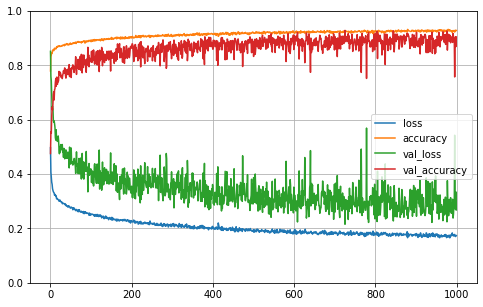

In [19]:
import pandas as pd
import matplotlib.pyplot as plt

pd.DataFrame(history.history).plot(figsize=(8,5))
plt.grid(True)
plt.gca().set_ylim(0,1)
plt.show()

In [83]:
nonlinear_svc = Pipeline([
    ("std", StandardScaler()),
    ("non_svc", SVC(gamma="auto"))
])
nonlinear_svc.fit(Upsampled_X, Upsampled_Y)

Pipeline(steps=[('std', StandardScaler()), ('non_svc', SVC(gamma='auto'))])

In [87]:
test_pred23 = nonlinear_svc.predict(X_test)
test_performance(Y_test, test_pred23)


Accuracy: 0.7948094079480941

True Negative Rate: 0.8805182341650671 
True Positive Rate: 0.32722513089005234
Precision: 0.5079051383399209 
Recall: 0.6727748691099477 
F1 Score: 0.5788288288288289


In [15]:
transformed_shoppers_data = shoppers_data.copy()
transformed_shoppers_data['Month_Y'] = np.sin((transformed_shoppers_data['Month']-1)*(2.*np.pi/12))
transformed_shoppers_data['Month_X'] = np.cos((transformed_shoppers_data['Month']-1)*(2.*np.pi/12))
transformed_shoppers_data.drop(columns='Month')

,Administrative,Administrative_Duration,Informational,Informational_Duration,ProductRelated,ProductRelated_Duration,BounceRates,ExitRates,PageValues,SpecialDay,...,Browser,Region,TrafficType,Weekend,Revenue,VisitorType_New_Visitor,VisitorType_Other,VisitorType_Returning_Visitor,Month_Y,Month_X
0,0,0.0,0,0.0,1,0.000000,0.200000,0.200000,0.000000,0.0,...,1,1,1,0,0,0,0,1,0.500000,0.866025
1,0,0.0,0,0.0,2,64.000000,0.000000,0.100000,0.000000,0.0,...,2,1,2,0,0,0,0,1,0.500000,0.866025
2,0,0.0,0,0.0,1,0.000000,0.200000,0.200000,0.000000,0.0,...,1,9,3,0,0,0,0,1,0.500000,0.866025
3,0,0.0,0,0.0,2,2.666667,0.050000,0.140000,0.000000,0.0,...,2,2,4,0,0,0,0,1,0.500000,0.866025
4,0,0.0,0,0.0,10,627.500000,0.020000,0.050000,0.000000,0.0,...,3,1,4,1,0,0,0,1,0.500000,0.866025
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
12325,3,145.0,0,0.0,53,1783.791667,0.007143,0.029031,12.241717,0.0,...,6,1,1,1,0,0,0,1,-0.500000,0.866025
12326,0,0.0,0,0.0,5,465.750000,0.000000,0.021333,0.000000,0.0,...,2,1,8,1,0,0,0,1,-0.866025,0.500000
12327,0,0.0,0,0.0,6,184.250000,0.083333,0.086667,0.000000,0.0,...,2,1,13,1,0,0,0,1,-0.866025,0.500000
12328,4,75.0,0,0.0,15,346.000000,0.000000,0.021053,0.000000,0.0,...,2,3,11,0,0,0,0,1,-0.866025,0.500000


================================

GRID SEARCHING FOR:

Changing the Months and then Oversampling

==================================

In [16]:
train_set, test_set = split_train_test(transformed_shoppers_data, 0.3)
upsampled_set = upsample(train_set)
Upsampled_Y = upsampled_set['Revenue']
Upsampled_X = upsampled_set.drop(columns=['Revenue'])
Upsampled_linear_svc= Pipeline([
    ('std', StandardScaler()),
    ("svc", SVC())
])
param_grid = [
    {'svc__C': [1, 10, 100], 'svc__gamma': ['auto'], 'svc__kernel':['linear','poly', 'sigmoid', 'rbf']}
]
Upsampled_grid_search = GridSearchCV(Upsampled_linear_svc, param_grid)
Upsampled_grid_search.fit(Upsampled_X, Upsampled_Y)

GridSearchCV(estimator=Pipeline(steps=[('std', StandardScaler()),
                                       ('svc', SVC())]),
             param_grid=[{'svc__C': [1, 10, 100], 'svc__gamma': ['auto'],
                          'svc__kernel': ['linear', 'poly', 'sigmoid', 'rbf']}])

In [17]:
Upsampled_grid_search.best_params_

{'svc__C': 100, 'svc__gamma': 'auto', 'svc__kernel': 'rbf'}

In [18]:
rnd_clf = Pipeline([
    ("std", StandardScaler()),
    ("rnd", RandomForestClassifier())
])

param_grid = [
    {'rnd__n_estimators': [100, 200, 500], 'rnd__max_features': ['auto', 'sqrt', 'log2'], 'rnd__max_depth' : [4,5,6,7,8],'rnd__criterion' :['gini', 'entropy']}
]
grid_search = GridSearchCV(rnd_clf, param_grid, scoring='accuracy')
grid_search.fit(Upsampled_X, Upsampled_Y)

GridSearchCV(estimator=Pipeline(steps=[('std', StandardScaler()),
                                       ('rnd', RandomForestClassifier())]),
             param_grid=[{'rnd__criterion': ['gini', 'entropy'],
                          'rnd__max_depth': [4, 5, 6, 7, 8],
                          'rnd__max_features': ['auto', 'sqrt', 'log2'],
                          'rnd__n_estimators': [100, 200, 500]}],
             scoring='accuracy')

In [19]:
grid_search.best_params_

{'rnd__criterion': 'gini',
 'rnd__max_depth': 8,
 'rnd__max_features': 'log2',
 'rnd__n_estimators': 200}

In [20]:
import lightgbm as lgb
train_set, test_set = split_train_test(transformed_shoppers_data, 0.3)
train_set = upsample(train_set)
X_transformed, Y_train, X_transformed_test, Y_test = transform_data(train_set, test_set)

lg_clf = Pipeline([
    ('std', StandardScaler()),
    ('lgb', lgb.LGBMClassifier(random_state=42))
])

param_grid = [
    {'lgb__learning_rate': np.linspace(0.01, 1.0, num=99, endpoint=False), 'lgb__max_depth': [1,2,3,4,5]}
]

#lg_clf = lgb.LGBMClassifier(learning_rate=0.20, max_depth=5, random_state=42)
#lg_clf.fit(X_transformed, Y_train, eval_metric='accuracy')

grid_search = GridSearchCV(lg_clf, param_grid, scoring='accuracy', cv=10)
grid_search.fit(Upsampled_X, Upsampled_Y)

GridSearchCV(cv=10,
             estimator=Pipeline(steps=[('std', StandardScaler()),
                                       ('lgb',
                                        LGBMClassifier(random_state=42))]),
             param_grid=[{'lgb__learning_rate': array([0.01, 0.02, 0.03, 0.04, 0.05, 0.06, 0.07, 0.08, 0.09, 0.1 , 0.11,
       0.12, 0.13, 0.14, 0.15, 0.16, 0.17, 0.18, 0.19, 0.2 , 0.21, 0.22,
       0.23, 0.24, 0.25, 0.26, 0.27, 0.28, 0.29, 0.3 , 0.31, 0.32, 0.33,
       0.34, 0.35, 0.36, 0.37, 0.38, 0.39, 0.4 , 0.41, 0.42, 0.43, 0.44,
       0.45, 0.46, 0.47, 0.48, 0.49, 0.5 , 0.51, 0.52, 0.53, 0.54, 0.55,
       0.56, 0.57, 0.58, 0.59, 0.6 , 0.61, 0.62, 0.63, 0.64, 0.65, 0.66,
       0.67, 0.68, 0.69, 0.7 , 0.71, 0.72, 0.73, 0.74, 0.75, 0.76, 0.77,
       0.78, 0.79, 0.8 , 0.81, 0.82, 0.83, 0.84, 0.85, 0.86, 0.87, 0.88,
       0.89, 0.9 , 0.91, 0.92, 0.93, 0.94, 0.95, 0.96, 0.97, 0.98, 0.99]),
                          'lgb__max_depth': [1, 2, 3, 4, 5]}],
             scoring=

In [21]:
grid_search.best_params_

{'lgb__learning_rate': 0.68, 'lgb__max_depth': 5}

================================






DATA COLLECTION FOR RESULTS FOR:

Changing the Months and then Oversampling







==================================

In [18]:
transformed_shoppers_data = shoppers_data.copy()
transformed_shoppers_data['Month_Y'] = np.sin((transformed_shoppers_data['Month']-1)*(2.*np.pi/12))
transformed_shoppers_data['Month_X'] = np.cos((transformed_shoppers_data['Month']-1)*(2.*np.pi/12))
transformed_shoppers_data.drop(columns='Month')

,Administrative,Administrative_Duration,Informational,Informational_Duration,ProductRelated,ProductRelated_Duration,BounceRates,ExitRates,PageValues,SpecialDay,...,Browser,Region,TrafficType,Weekend,Revenue,VisitorType_New_Visitor,VisitorType_Other,VisitorType_Returning_Visitor,Month_Y,Month_X
0,0,0.0,0,0.0,1,0.000000,0.200000,0.200000,0.000000,0.0,...,1,1,1,0,0,0,0,1,0.500000,0.866025
1,0,0.0,0,0.0,2,64.000000,0.000000,0.100000,0.000000,0.0,...,2,1,2,0,0,0,0,1,0.500000,0.866025
2,0,0.0,0,0.0,1,0.000000,0.200000,0.200000,0.000000,0.0,...,1,9,3,0,0,0,0,1,0.500000,0.866025
3,0,0.0,0,0.0,2,2.666667,0.050000,0.140000,0.000000,0.0,...,2,2,4,0,0,0,0,1,0.500000,0.866025
4,0,0.0,0,0.0,10,627.500000,0.020000,0.050000,0.000000,0.0,...,3,1,4,1,0,0,0,1,0.500000,0.866025
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
12325,3,145.0,0,0.0,53,1783.791667,0.007143,0.029031,12.241717,0.0,...,6,1,1,1,0,0,0,1,-0.500000,0.866025
12326,0,0.0,0,0.0,5,465.750000,0.000000,0.021333,0.000000,0.0,...,2,1,8,1,0,0,0,1,-0.866025,0.500000
12327,0,0.0,0,0.0,6,184.250000,0.083333,0.086667,0.000000,0.0,...,2,1,13,1,0,0,0,1,-0.866025,0.500000
12328,4,75.0,0,0.0,15,346.000000,0.000000,0.021053,0.000000,0.0,...,2,3,11,0,0,0,0,1,-0.866025,0.500000


In [34]:
totals_accuracy = totals_TPR = totals_TNR = totals_f1 = 0
runs = 100
values = []
for i in range(runs):
    train_set, test_set = split_train_test(transformed_shoppers_data, 0.3, random_state=i)
    train_set = upsample(train_set)
    X_transformed, Y_train, X_transformed_test, Y_test = transform_data(train_set, test_set)
    
    svc = SVC(C=100, gamma='auto', kernel='rbf')
    svc.fit(X_transformed, Y_train)
    test_pred2 = svc.predict(X_transformed_test)
    accuracy, TPR, TNR, f1 = test_performance(Y_test, test_pred2)
    values.append(f1)
    totals_accuracy += accuracy
    totals_TPR += TPR
    totals_TNR += TNR
    totals_f1 += f1
    
avg_accuracy = totals_accuracy/runs
avg_TPR = totals_TPR/runs
avg_TNR = totals_TNR/runs
avg_f1 = totals_f1/runs
std_deviation = np.std(values)
print("Accuracy:%s\nTPR:%s\nTNR:%s\nF1:%s\nStd:%s" %(avg_accuracy, avg_TPR, avg_TNR, avg_f1, std_deviation))
print(values)

Accuracy:0.8505515004055149
TPR:0.6181118881118882
TNR:0.8930700351774864
F1:0.5612532979217592
Std:0.01452377586069185
[0.5534591194968554, 0.5463414634146341, 0.5508145849495732, 0.5415384615384615, 0.5773195876288659, 0.5678601165695254, 0.5574572127139363, 0.5603864734299517, 0.5488441461595824, 0.5726004922067268, 0.5624496373892022, 0.551440329218107, 0.5774319066147859, 0.5680379746835443, 0.5524861878453039, 0.5609375, 0.5927099841521395, 0.5939490445859872, 0.5644171779141104, 0.574585635359116, 0.5727341964965726, 0.5688212927756653, 0.546021840873635, 0.5685039370078739, 0.5461847389558232, 0.5709677419354838, 0.5684877276326208, 0.5341519570222564, 0.5481239804241436, 0.5401459854014599, 0.5707154742096505, 0.5582137161084529, 0.5688524590163935, 0.5518905872888173, 0.5691699604743082, 0.5542359461599367, 0.5672609400324149, 0.5686900958466454, 0.5486725663716814, 0.5458786936236393, 0.5405405405405406, 0.5557299843014128, 0.5511684125705076, 0.565799842395587, 0.5598731165

In [35]:
totals_accuracy = totals_TPR = totals_TNR = totals_f1 = totals_rec = totals_prec = 0
runs = 100
values = []
for i in range(runs):
    train_set, test_set = split_train_test(transformed_shoppers_data, 0.3, random_state=i)
    train_set = upsample(train_set)
    X_transformed, Y_train, X_transformed_test, Y_test = transform_data(train_set, test_set)
    
    rnd = RandomForestClassifier(criterion='gini', max_depth=8, max_features='log2', n_estimators=200)
    rnd.fit(X_transformed, Y_train)
    test_pred2 = rnd.predict(X_transformed_test)
    accuracy, TPR, TNR, f1, = test_performance(Y_test, test_pred2)
    values.append(f1)
    totals_accuracy += accuracy
    totals_TPR += TPR
    totals_TNR += TNR
    totals_f1 += f1
    
avg_accuracy = totals_accuracy/runs
avg_TPR = totals_TPR/runs
avg_TNR = totals_TNR/runs
avg_f1 = totals_f1/runs
std_deviation = np.std(values)
print("Accuracy:%s\nTPR:%s\nTNR:%s\nF1:%s\nStd:%s" %(avg_accuracy, avg_TPR, avg_TNR, avg_f1, std_deviation))
print(values)

Accuracy:0.8659394430927274
TPR:0.837097902097902
TNR:0.8712152222577549
F1:0.6589553877562742
Std:0.012407339158515334
[0.663387210119466, 0.6541405706332637, 0.6589200273410799, 0.6365503080082134, 0.6630508474576271, 0.657967032967033, 0.6459038591740014, 0.6404958677685951, 0.6536650975117687, 0.6570812365204889, 0.6748466257668712, 0.6634078212290502, 0.6809688581314879, 0.6750524109014675, 0.6448160535117058, 0.6463245492371705, 0.6662011173184357, 0.6510381781647689, 0.6451187335092348, 0.6575154426904599, 0.6393552719946274, 0.6684672518568535, 0.6643694004135079, 0.6450331125827815, 0.6558044806517311, 0.6638655462184874, 0.6802529866479269, 0.6599866399465598, 0.647945205479452, 0.6643882433356119, 0.6709129511677283, 0.6482577251808022, 0.6717770034843206, 0.6410958904109589, 0.6762491444216291, 0.6416382252559728, 0.6657400972897846, 0.6599597585513077, 0.6345381526104418, 0.6472626472626474, 0.6441844459738473, 0.6662087912087913, 0.6355400696864111, 0.6759002770083102, 0.

In [88]:
totals_accuracy = totals_TPR = totals_TNR = totals_f1 = 0
values = []
for i in range(100):
    train_set, test_set = split_train_test(transformed_shoppers_data, 0.3, random_state=i)
    train_set = upsample(train_set)
    X_transformed, Y_train, X_transformed_test, Y_test = transform_data(train_set, test_set)
    
    model = keras.models.Sequential([
        keras.layers.Dense(70, activation="relu", input_dim=21),
        keras.layers.Dense(10, activation="relu"),
        keras.layers.Dense(1, activation="sigmoid")
    ])
    model.compile(optimizer="sgd", loss="binary_crossentropy",  metrics=["accuracy"])
    history = model.fit(X_transformed, Y_train, epochs=30, validation_split=0.3) #regularization: dropout, batch normalization
    test_pred = (model.predict(X_transformed_test) > 0.5).astype('int32')
    
    accuracy, TPR, TNR, f1 = test_performance(Y_test, test_pred)
    values.append(f1)
    totals_accuracy += accuracy
    totals_TPR += TPR
    totals_TNR += TNR
    totals_f1 += f1
    
avg_accuracy = totals_accuracy/100
avg_TPR = totals_TPR/100
avg_TNR = totals_TNR/100
avg_f1 = totals_f1/100
std_deviation = np.std(values)
print("Accuracy:%s\nTPR:%s\nTNR:%s\nF1:%s\nStd:%s" %(avg_accuracy, avg_TPR, avg_TNR, avg_f1, std_deviation))
print(values)

Epoch 1/30
320/320 [==============================] - 29s 47ms/step - loss: 0.5916 - accuracy: 0.7083 - val_loss: 0.9698 - val_accuracy: 0.2239
Epoch 2/30
320/320 [==============================] - 7s 23ms/step - loss: 0.4839 - accuracy: 0.7686 - val_loss: 0.8990 - val_accuracy: 0.3521
Epoch 3/30
320/320 [==============================] - 5s 15ms/step - loss: 0.4334 - accuracy: 0.7959 - val_loss: 0.8374 - val_accuracy: 0.4435
Epoch 4/30
320/320 [==============================] - 4s 14ms/step - loss: 0.4043 - accuracy: 0.8168 - val_loss: 0.7701 - val_accuracy: 0.5113
Epoch 5/30
320/320 [==============================] - 4s 13ms/step - loss: 0.3870 - accuracy: 0.8295 - val_loss: 0.7297 - val_accuracy: 0.5565
Epoch 6/30
320/320 [==============================] - 4s 12ms/step - loss: 0.3757 - accuracy: 0.8369 - val_loss: 0.7018 - val_accuracy: 0.5725
Epoch 7/30
320/320 [==============================] - 4s 11ms/step - loss: 0.3669 - accuracy: 0.8391 - val_loss: 0.6839 - val_accuracy: 0.585

320/320 [==============================] - 1s 5ms/step - loss: 0.3023 - accuracy: 0.8660 - val_loss: 0.6214 - val_accuracy: 0.6728
Epoch 26/30
320/320 [==============================] - 1s 4ms/step - loss: 0.3000 - accuracy: 0.8682 - val_loss: 0.5877 - val_accuracy: 0.6955
Epoch 27/30
320/320 [==============================] - 2s 6ms/step - loss: 0.2975 - accuracy: 0.8697 - val_loss: 0.6081 - val_accuracy: 0.6833
Epoch 28/30
320/320 [==============================] - 2s 7ms/step - loss: 0.2955 - accuracy: 0.8702 - val_loss: 0.5646 - val_accuracy: 0.7220
Epoch 29/30
320/320 [==============================] - 1s 4ms/step - loss: 0.2932 - accuracy: 0.8715 - val_loss: 0.5273 - val_accuracy: 0.7441
Epoch 30/30
320/320 [==============================] - 1s 5ms/step - loss: 0.2910 - accuracy: 0.8732 - val_loss: 0.5960 - val_accuracy: 0.7158
Epoch 1/30
320/320 [==============================] - 4s 7ms/step - loss: 0.5358 - accuracy: 0.7198 - val_loss: 1.0264 - val_accuracy: 0.1506
Epoch 2/30
3

320/320 [==============================] - 1s 3ms/step - loss: 0.3089 - accuracy: 0.8675 - val_loss: 0.6179 - val_accuracy: 0.6765
Epoch 20/30
320/320 [==============================] - 1s 3ms/step - loss: 0.3060 - accuracy: 0.8682 - val_loss: 0.6214 - val_accuracy: 0.6804
Epoch 21/30
320/320 [==============================] - 1s 3ms/step - loss: 0.3036 - accuracy: 0.8694 - val_loss: 0.6228 - val_accuracy: 0.6769
Epoch 22/30
320/320 [==============================] - 1s 3ms/step - loss: 0.3011 - accuracy: 0.8692 - val_loss: 0.6030 - val_accuracy: 0.6973
Epoch 23/30
320/320 [==============================] - 1s 3ms/step - loss: 0.2991 - accuracy: 0.8698 - val_loss: 0.6281 - val_accuracy: 0.6884
Epoch 24/30
320/320 [==============================] - 1s 5ms/step - loss: 0.2969 - accuracy: 0.8698 - val_loss: 0.4943 - val_accuracy: 0.7530
Epoch 25/30
320/320 [==============================] - 1s 4ms/step - loss: 0.2950 - accuracy: 0.8713 - val_loss: 0.5640 - val_accuracy: 0.7208
Epoch 26/30

320/320 [==============================] - 1s 3ms/step - loss: 0.3313 - accuracy: 0.8599 - val_loss: 0.6709 - val_accuracy: 0.6313
Epoch 14/30
320/320 [==============================] - 1s 3ms/step - loss: 0.3277 - accuracy: 0.8618 - val_loss: 0.6866 - val_accuracy: 0.6333
Epoch 15/30
320/320 [==============================] - 1s 3ms/step - loss: 0.3240 - accuracy: 0.8631 - val_loss: 0.6668 - val_accuracy: 0.6557
Epoch 16/30
320/320 [==============================] - 1s 3ms/step - loss: 0.3208 - accuracy: 0.8649 - val_loss: 0.6287 - val_accuracy: 0.6785
Epoch 17/30
320/320 [==============================] - 1s 3ms/step - loss: 0.3175 - accuracy: 0.8665 - val_loss: 0.6540 - val_accuracy: 0.6642
Epoch 18/30
320/320 [==============================] - 1s 3ms/step - loss: 0.3145 - accuracy: 0.8677 - val_loss: 0.6306 - val_accuracy: 0.6907
Epoch 19/30
320/320 [==============================] - 1s 3ms/step - loss: 0.3119 - accuracy: 0.8686 - val_loss: 0.6766 - val_accuracy: 0.6587
Epoch 20/30

320/320 [==============================] - 1s 2ms/step - loss: 0.3579 - accuracy: 0.8411 - val_loss: 0.7025 - val_accuracy: 0.6109
Epoch 8/30
320/320 [==============================] - 1s 3ms/step - loss: 0.3455 - accuracy: 0.8503 - val_loss: 0.6939 - val_accuracy: 0.6239
Epoch 9/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3361 - accuracy: 0.8541 - val_loss: 0.6777 - val_accuracy: 0.6397
Epoch 10/30
320/320 [==============================] - 1s 3ms/step - loss: 0.3285 - accuracy: 0.8550 - val_loss: 0.6113 - val_accuracy: 0.6797
Epoch 11/30
320/320 [==============================] - 1s 3ms/step - loss: 0.3232 - accuracy: 0.8594 - val_loss: 0.6528 - val_accuracy: 0.6591
Epoch 12/30
320/320 [==============================] - 2s 5ms/step - loss: 0.3185 - accuracy: 0.8602 - val_loss: 0.6632 - val_accuracy: 0.6667
Epoch 13/30
320/320 [==============================] - 1s 4ms/step - loss: 0.3141 - accuracy: 0.8622 - val_loss: 0.6128 - val_accuracy: 0.6895
Epoch 14/30
3

320/320 [==============================] - 3s 6ms/step - loss: 0.6219 - accuracy: 0.6830 - val_loss: 1.0565 - val_accuracy: 0.0818
Epoch 2/30
320/320 [==============================] - 1s 3ms/step - loss: 0.5141 - accuracy: 0.7464 - val_loss: 1.0483 - val_accuracy: 0.2104
Epoch 3/30
320/320 [==============================] - 1s 3ms/step - loss: 0.4644 - accuracy: 0.7765 - val_loss: 0.9004 - val_accuracy: 0.3733
Epoch 4/30
320/320 [==============================] - 1s 2ms/step - loss: 0.4283 - accuracy: 0.8055 - val_loss: 0.8854 - val_accuracy: 0.4101
Epoch 5/30
320/320 [==============================] - 1s 3ms/step - loss: 0.4029 - accuracy: 0.8177 - val_loss: 0.8346 - val_accuracy: 0.4606
Epoch 6/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3856 - accuracy: 0.8262 - val_loss: 0.7653 - val_accuracy: 0.5390
Epoch 7/30
320/320 [==============================] - 1s 3ms/step - loss: 0.3734 - accuracy: 0.8373 - val_loss: 0.7238 - val_accuracy: 0.5760
Epoch 8/30
320/32

320/320 [==============================] - 1s 2ms/step - loss: 0.2980 - accuracy: 0.8708 - val_loss: 0.6096 - val_accuracy: 0.7044
Epoch 26/30
320/320 [==============================] - 1s 2ms/step - loss: 0.2963 - accuracy: 0.8717 - val_loss: 0.5952 - val_accuracy: 0.7055
Epoch 27/30
320/320 [==============================] - 1s 2ms/step - loss: 0.2944 - accuracy: 0.8727 - val_loss: 0.6044 - val_accuracy: 0.7046
Epoch 28/30
320/320 [==============================] - 1s 2ms/step - loss: 0.2926 - accuracy: 0.8736 - val_loss: 0.6122 - val_accuracy: 0.7183
Epoch 29/30
320/320 [==============================] - 1s 2ms/step - loss: 0.2907 - accuracy: 0.8768 - val_loss: 0.5642 - val_accuracy: 0.7354
Epoch 30/30
320/320 [==============================] - 1s 3ms/step - loss: 0.2888 - accuracy: 0.8759 - val_loss: 0.5365 - val_accuracy: 0.7551
Epoch 1/30
320/320 [==============================] - 2s 3ms/step - loss: 0.5394 - accuracy: 0.7151 - val_loss: 1.0715 - val_accuracy: 0.0311
Epoch 2/30
3

320/320 [==============================] - 1s 3ms/step - loss: 0.3140 - accuracy: 0.8635 - val_loss: 0.5909 - val_accuracy: 0.7030
Epoch 20/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3117 - accuracy: 0.8634 - val_loss: 0.6223 - val_accuracy: 0.6870
Epoch 21/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3099 - accuracy: 0.8642 - val_loss: 0.6129 - val_accuracy: 0.6865
Epoch 22/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3076 - accuracy: 0.8654 - val_loss: 0.5956 - val_accuracy: 0.6961
Epoch 23/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3051 - accuracy: 0.8671 - val_loss: 0.5886 - val_accuracy: 0.6964
Epoch 24/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3039 - accuracy: 0.8691 - val_loss: 0.5432 - val_accuracy: 0.7363
Epoch 25/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3016 - accuracy: 0.8693 - val_loss: 0.6067 - val_accuracy: 0.6959
Epoch 26/30

320/320 [==============================] - 0s 1ms/step - loss: 0.3317 - accuracy: 0.8579 - val_loss: 0.6106 - val_accuracy: 0.6765
Epoch 14/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3272 - accuracy: 0.8588 - val_loss: 0.6053 - val_accuracy: 0.6868
Epoch 15/30
320/320 [==============================] - 0s 2ms/step - loss: 0.3238 - accuracy: 0.8614 - val_loss: 0.6100 - val_accuracy: 0.6779
Epoch 16/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3202 - accuracy: 0.8623 - val_loss: 0.6654 - val_accuracy: 0.6516
Epoch 17/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3167 - accuracy: 0.8646 - val_loss: 0.6294 - val_accuracy: 0.6724
Epoch 18/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3134 - accuracy: 0.8662 - val_loss: 0.6484 - val_accuracy: 0.6726
Epoch 19/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3106 - accuracy: 0.8676 - val_loss: 0.5946 - val_accuracy: 0.7080
Epoch 20/30

320/320 [==============================] - 0s 1ms/step - loss: 0.3739 - accuracy: 0.8390 - val_loss: 0.7735 - val_accuracy: 0.5465
Epoch 8/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3666 - accuracy: 0.8425 - val_loss: 0.7060 - val_accuracy: 0.5755
Epoch 9/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3606 - accuracy: 0.8440 - val_loss: 0.7086 - val_accuracy: 0.5872
Epoch 10/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3552 - accuracy: 0.8480 - val_loss: 0.7071 - val_accuracy: 0.6011
Epoch 11/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3509 - accuracy: 0.8493 - val_loss: 0.6895 - val_accuracy: 0.6125
Epoch 12/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3465 - accuracy: 0.8502 - val_loss: 0.6625 - val_accuracy: 0.6267
Epoch 13/30
320/320 [==============================] - 0s 2ms/step - loss: 0.3427 - accuracy: 0.8522 - val_loss: 0.7248 - val_accuracy: 0.5929
Epoch 14/30
3

320/320 [==============================] - 1s 2ms/step - loss: 0.5424 - accuracy: 0.7207 - val_loss: 0.9386 - val_accuracy: 0.2915
Epoch 2/30
320/320 [==============================] - 0s 1ms/step - loss: 0.4592 - accuracy: 0.7806 - val_loss: 0.8848 - val_accuracy: 0.4277
Epoch 3/30
320/320 [==============================] - 1s 2ms/step - loss: 0.4168 - accuracy: 0.8123 - val_loss: 0.8366 - val_accuracy: 0.4809
Epoch 4/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3888 - accuracy: 0.8295 - val_loss: 0.7575 - val_accuracy: 0.5410
Epoch 5/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3712 - accuracy: 0.8383 - val_loss: 0.7282 - val_accuracy: 0.5668
Epoch 6/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3594 - accuracy: 0.8447 - val_loss: 0.6913 - val_accuracy: 0.6045
Epoch 7/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3508 - accuracy: 0.8517 - val_loss: 0.7418 - val_accuracy: 0.5846
Epoch 8/30
320/32

320/320 [==============================] - 1s 2ms/step - loss: 0.2976 - accuracy: 0.8682 - val_loss: 0.6131 - val_accuracy: 0.6888
Epoch 26/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2954 - accuracy: 0.8697 - val_loss: 0.6024 - val_accuracy: 0.7101
Epoch 27/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2940 - accuracy: 0.8692 - val_loss: 0.6103 - val_accuracy: 0.7000
Epoch 28/30
320/320 [==============================] - 1s 2ms/step - loss: 0.2918 - accuracy: 0.8706 - val_loss: 0.5638 - val_accuracy: 0.7263
Epoch 29/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2905 - accuracy: 0.8712 - val_loss: 0.5912 - val_accuracy: 0.7078
Epoch 30/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2888 - accuracy: 0.8722 - val_loss: 0.6357 - val_accuracy: 0.6939
Epoch 1/30
320/320 [==============================] - 1s 2ms/step - loss: 0.5493 - accuracy: 0.7273 - val_loss: 0.9762 - val_accuracy: 0.2550
Epoch 2/30
3

320/320 [==============================] - 0s 1ms/step - loss: 0.3093 - accuracy: 0.8632 - val_loss: 0.6194 - val_accuracy: 0.6797
Epoch 20/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3067 - accuracy: 0.8661 - val_loss: 0.6541 - val_accuracy: 0.6671
Epoch 21/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3042 - accuracy: 0.8647 - val_loss: 0.5905 - val_accuracy: 0.6982
Epoch 22/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3022 - accuracy: 0.8679 - val_loss: 0.5938 - val_accuracy: 0.7019
Epoch 23/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2997 - accuracy: 0.8684 - val_loss: 0.5649 - val_accuracy: 0.7272
Epoch 24/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2982 - accuracy: 0.8682 - val_loss: 0.6002 - val_accuracy: 0.7025
Epoch 25/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2966 - accuracy: 0.8693 - val_loss: 0.6028 - val_accuracy: 0.7128
Epoch 26/30

320/320 [==============================] - 0s 1ms/step - loss: 0.3190 - accuracy: 0.8630 - val_loss: 0.6317 - val_accuracy: 0.6740
Epoch 14/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3153 - accuracy: 0.8653 - val_loss: 0.6544 - val_accuracy: 0.6701
Epoch 15/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3119 - accuracy: 0.8692 - val_loss: 0.6597 - val_accuracy: 0.6717
Epoch 16/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3087 - accuracy: 0.8676 - val_loss: 0.6368 - val_accuracy: 0.6836
Epoch 17/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3055 - accuracy: 0.8697 - val_loss: 0.6696 - val_accuracy: 0.6623
Epoch 18/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3026 - accuracy: 0.8709 - val_loss: 0.6247 - val_accuracy: 0.7066
Epoch 19/30
320/320 [==============================] - 0s 2ms/step - loss: 0.3006 - accuracy: 0.8717 - val_loss: 0.6272 - val_accuracy: 0.6893
Epoch 20/30

320/320 [==============================] - 0s 1ms/step - loss: 0.3668 - accuracy: 0.8405 - val_loss: 0.7261 - val_accuracy: 0.6000
Epoch 8/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3589 - accuracy: 0.8452 - val_loss: 0.7430 - val_accuracy: 0.6002
Epoch 9/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3523 - accuracy: 0.8482 - val_loss: 0.6919 - val_accuracy: 0.6242
Epoch 10/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3471 - accuracy: 0.8521 - val_loss: 0.6941 - val_accuracy: 0.6274
Epoch 11/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3422 - accuracy: 0.8540 - val_loss: 0.6896 - val_accuracy: 0.6420
Epoch 12/30
320/320 [==============================] - 0s 2ms/step - loss: 0.3379 - accuracy: 0.8578 - val_loss: 0.7182 - val_accuracy: 0.6333
Epoch 13/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3342 - accuracy: 0.8576 - val_loss: 0.6361 - val_accuracy: 0.6731
Epoch 14/30
3

320/320 [==============================] - 1s 2ms/step - loss: 0.5354 - accuracy: 0.7207 - val_loss: 1.0349 - val_accuracy: 0.2029
Epoch 2/30
320/320 [==============================] - 0s 1ms/step - loss: 0.4590 - accuracy: 0.7756 - val_loss: 0.9817 - val_accuracy: 0.3425
Epoch 3/30
320/320 [==============================] - 0s 1ms/step - loss: 0.4238 - accuracy: 0.8020 - val_loss: 0.8579 - val_accuracy: 0.4732
Epoch 4/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3959 - accuracy: 0.8217 - val_loss: 0.7967 - val_accuracy: 0.5225
Epoch 5/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3744 - accuracy: 0.8347 - val_loss: 0.7525 - val_accuracy: 0.5668
Epoch 6/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3591 - accuracy: 0.8457 - val_loss: 0.7448 - val_accuracy: 0.5650
Epoch 7/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3484 - accuracy: 0.8501 - val_loss: 0.7334 - val_accuracy: 0.5856
Epoch 8/30
320/32

320/320 [==============================] - 0s 1ms/step - loss: 0.2874 - accuracy: 0.8759 - val_loss: 0.5757 - val_accuracy: 0.7393
Epoch 26/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2856 - accuracy: 0.8756 - val_loss: 0.5850 - val_accuracy: 0.7309
Epoch 27/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2841 - accuracy: 0.8768 - val_loss: 0.5535 - val_accuracy: 0.7405
Epoch 28/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2824 - accuracy: 0.8778 - val_loss: 0.5988 - val_accuracy: 0.7249
Epoch 29/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2807 - accuracy: 0.8801 - val_loss: 0.5645 - val_accuracy: 0.7489
Epoch 30/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2790 - accuracy: 0.8795 - val_loss: 0.5467 - val_accuracy: 0.7544
Epoch 1/30
320/320 [==============================] - 1s 2ms/step - loss: 0.5871 - accuracy: 0.7060 - val_loss: 0.9978 - val_accuracy: 0.2180
Epoch 2/30
3

320/320 [==============================] - 0s 1ms/step - loss: 0.3005 - accuracy: 0.8725 - val_loss: 0.6341 - val_accuracy: 0.6811
Epoch 20/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2981 - accuracy: 0.8722 - val_loss: 0.6272 - val_accuracy: 0.6788
Epoch 21/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2961 - accuracy: 0.8730 - val_loss: 0.6257 - val_accuracy: 0.6881
Epoch 22/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2944 - accuracy: 0.8754 - val_loss: 0.5867 - val_accuracy: 0.7133
Epoch 23/30
320/320 [==============================] - 1s 2ms/step - loss: 0.2923 - accuracy: 0.8754 - val_loss: 0.5775 - val_accuracy: 0.7156
Epoch 24/30
320/320 [==============================] - 1s 2ms/step - loss: 0.2905 - accuracy: 0.8760 - val_loss: 0.6182 - val_accuracy: 0.6968
Epoch 25/30
320/320 [==============================] - 0s 2ms/step - loss: 0.2885 - accuracy: 0.8757 - val_loss: 0.6420 - val_accuracy: 0.6760
Epoch 26/30

320/320 [==============================] - 0s 2ms/step - loss: 0.3299 - accuracy: 0.8557 - val_loss: 0.6486 - val_accuracy: 0.6621
Epoch 14/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3264 - accuracy: 0.8589 - val_loss: 0.6498 - val_accuracy: 0.6573
Epoch 15/30
320/320 [==============================] - 0s 2ms/step - loss: 0.3228 - accuracy: 0.8613 - val_loss: 0.6607 - val_accuracy: 0.6644
Epoch 16/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3199 - accuracy: 0.8615 - val_loss: 0.6416 - val_accuracy: 0.6772
Epoch 17/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3171 - accuracy: 0.8626 - val_loss: 0.5991 - val_accuracy: 0.6955
Epoch 18/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3144 - accuracy: 0.8634 - val_loss: 0.6104 - val_accuracy: 0.6936
Epoch 19/30
320/320 [==============================] - 0s 2ms/step - loss: 0.3113 - accuracy: 0.8645 - val_loss: 0.6017 - val_accuracy: 0.7028
Epoch 20/30

320/320 [==============================] - 0s 1ms/step - loss: 0.3730 - accuracy: 0.8348 - val_loss: 0.7456 - val_accuracy: 0.5479
Epoch 8/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3656 - accuracy: 0.8409 - val_loss: 0.7047 - val_accuracy: 0.5833
Epoch 9/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3597 - accuracy: 0.8431 - val_loss: 0.7233 - val_accuracy: 0.5764
Epoch 10/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3546 - accuracy: 0.8458 - val_loss: 0.6938 - val_accuracy: 0.5931
Epoch 11/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3492 - accuracy: 0.8479 - val_loss: 0.7123 - val_accuracy: 0.5842
Epoch 12/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3449 - accuracy: 0.8488 - val_loss: 0.6656 - val_accuracy: 0.6162
Epoch 13/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3404 - accuracy: 0.8515 - val_loss: 0.6337 - val_accuracy: 0.6534
Epoch 14/30
3

320/320 [==============================] - 1s 2ms/step - loss: 0.6027 - accuracy: 0.6910 - val_loss: 0.9923 - val_accuracy: 0.1878
Epoch 2/30
320/320 [==============================] - 0s 1ms/step - loss: 0.4795 - accuracy: 0.7778 - val_loss: 0.9043 - val_accuracy: 0.3886
Epoch 3/30
320/320 [==============================] - 0s 1ms/step - loss: 0.4277 - accuracy: 0.8064 - val_loss: 0.8269 - val_accuracy: 0.4688
Epoch 4/30
320/320 [==============================] - 0s 2ms/step - loss: 0.3962 - accuracy: 0.8246 - val_loss: 0.7814 - val_accuracy: 0.5170
Epoch 5/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3777 - accuracy: 0.8344 - val_loss: 0.7703 - val_accuracy: 0.5367
Epoch 6/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3661 - accuracy: 0.8419 - val_loss: 0.7424 - val_accuracy: 0.5709
Epoch 7/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3573 - accuracy: 0.8470 - val_loss: 0.7436 - val_accuracy: 0.5757
Epoch 8/30
320/32

320/320 [==============================] - 0s 1ms/step - loss: 0.3098 - accuracy: 0.8640 - val_loss: 0.5784 - val_accuracy: 0.6966
Epoch 26/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3075 - accuracy: 0.8644 - val_loss: 0.6199 - val_accuracy: 0.6911
Epoch 27/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3057 - accuracy: 0.8639 - val_loss: 0.5974 - val_accuracy: 0.6961
Epoch 28/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3039 - accuracy: 0.8654 - val_loss: 0.6060 - val_accuracy: 0.6911
Epoch 29/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3017 - accuracy: 0.8666 - val_loss: 0.6297 - val_accuracy: 0.6772
Epoch 30/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2997 - accuracy: 0.8666 - val_loss: 0.5275 - val_accuracy: 0.7386
Epoch 1/30
320/320 [==============================] - 1s 2ms/step - loss: 0.5648 - accuracy: 0.7163 - val_loss: 1.0364 - val_accuracy: 0.1350
Epoch 2/30
3

320/320 [==============================] - 0s 1ms/step - loss: 0.3224 - accuracy: 0.8595 - val_loss: 0.5881 - val_accuracy: 0.6927
Epoch 20/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3203 - accuracy: 0.8600 - val_loss: 0.6232 - val_accuracy: 0.6728
Epoch 21/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3174 - accuracy: 0.8615 - val_loss: 0.6143 - val_accuracy: 0.6817
Epoch 22/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3154 - accuracy: 0.8626 - val_loss: 0.5683 - val_accuracy: 0.7034
Epoch 23/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3130 - accuracy: 0.8647 - val_loss: 0.5776 - val_accuracy: 0.7048
Epoch 24/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3106 - accuracy: 0.8659 - val_loss: 0.6193 - val_accuracy: 0.6849
Epoch 25/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3083 - accuracy: 0.8661 - val_loss: 0.5827 - val_accuracy: 0.6993
Epoch 26/30

320/320 [==============================] - 0s 1ms/step - loss: 0.3272 - accuracy: 0.8540 - val_loss: 0.6436 - val_accuracy: 0.6472
Epoch 14/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3235 - accuracy: 0.8566 - val_loss: 0.6500 - val_accuracy: 0.6525
Epoch 15/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3208 - accuracy: 0.8564 - val_loss: 0.6357 - val_accuracy: 0.6692
Epoch 16/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3175 - accuracy: 0.8608 - val_loss: 0.6469 - val_accuracy: 0.6594
Epoch 17/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3146 - accuracy: 0.8606 - val_loss: 0.6263 - val_accuracy: 0.6801
Epoch 18/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3120 - accuracy: 0.8621 - val_loss: 0.6337 - val_accuracy: 0.6758
Epoch 19/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3094 - accuracy: 0.8640 - val_loss: 0.6082 - val_accuracy: 0.7066
Epoch 20/30

320/320 [==============================] - 0s 1ms/step - loss: 0.3604 - accuracy: 0.8435 - val_loss: 0.7627 - val_accuracy: 0.5696
Epoch 8/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3536 - accuracy: 0.8457 - val_loss: 0.7310 - val_accuracy: 0.6038
Epoch 9/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3478 - accuracy: 0.8502 - val_loss: 0.6609 - val_accuracy: 0.6402
Epoch 10/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3427 - accuracy: 0.8502 - val_loss: 0.6838 - val_accuracy: 0.6315
Epoch 11/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3383 - accuracy: 0.8544 - val_loss: 0.6587 - val_accuracy: 0.6566
Epoch 12/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3338 - accuracy: 0.8574 - val_loss: 0.6429 - val_accuracy: 0.6779
Epoch 13/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3306 - accuracy: 0.8590 - val_loss: 0.6638 - val_accuracy: 0.6589
Epoch 14/30
3

320/320 [==============================] - 1s 2ms/step - loss: 0.6007 - accuracy: 0.7083 - val_loss: 0.9996 - val_accuracy: 0.1069
Epoch 2/30
320/320 [==============================] - 0s 1ms/step - loss: 0.5075 - accuracy: 0.7580 - val_loss: 0.9688 - val_accuracy: 0.2858
Epoch 3/30
320/320 [==============================] - 0s 1ms/step - loss: 0.4586 - accuracy: 0.7862 - val_loss: 0.8930 - val_accuracy: 0.4058
Epoch 4/30
320/320 [==============================] - 0s 1ms/step - loss: 0.4279 - accuracy: 0.8071 - val_loss: 0.8605 - val_accuracy: 0.4515
Epoch 5/30
320/320 [==============================] - 0s 1ms/step - loss: 0.4072 - accuracy: 0.8217 - val_loss: 0.8119 - val_accuracy: 0.5074
Epoch 6/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3925 - accuracy: 0.8288 - val_loss: 0.8152 - val_accuracy: 0.5156
Epoch 7/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3813 - accuracy: 0.8342 - val_loss: 0.7645 - val_accuracy: 0.5529
Epoch 8/30
320/32

320/320 [==============================] - 0s 1ms/step - loss: 0.3031 - accuracy: 0.8711 - val_loss: 0.5722 - val_accuracy: 0.7370
Epoch 26/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3016 - accuracy: 0.8719 - val_loss: 0.5560 - val_accuracy: 0.7441
Epoch 27/30
320/320 [==============================] - 1s 2ms/step - loss: 0.2998 - accuracy: 0.8716 - val_loss: 0.5636 - val_accuracy: 0.7473
Epoch 28/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2979 - accuracy: 0.8722 - val_loss: 0.5719 - val_accuracy: 0.7443
Epoch 29/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2965 - accuracy: 0.8739 - val_loss: 0.5801 - val_accuracy: 0.7398
Epoch 30/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2946 - accuracy: 0.8750 - val_loss: 0.5874 - val_accuracy: 0.7306
Epoch 1/30
320/320 [==============================] - 1s 1ms/step - loss: 0.5856 - accuracy: 0.7149 - val_loss: 1.0735 - val_accuracy: 0.0619
Epoch 2/30
3

In [22]:
totals_accuracy = totals_TPR = totals_TNR = totals_f1 = 0
values = []
for i in range(100):
    train_set, test_set = split_train_test(transformed_shoppers_data, 0.3, random_state=i)
    train_set = upsample(train_set)
    X_transformed, Y_train, X_transformed_test, Y_test = transform_data(train_set, test_set)
    
    model = keras.models.Sequential([
        keras.layers.Dense(70, activation="relu", input_dim=21),
        keras.layers.Dense(20, activation="relu"),
        keras.layers.Dense(1, activation="sigmoid")
    ])
    model.compile(optimizer="sgd", loss="binary_crossentropy",  metrics=["accuracy"])
    history = model.fit(X_transformed, Y_train, epochs=30, validation_split=0.3) #regularization: dropout, batch normalization
    test_pred = (model.predict(X_transformed_test) > 0.5).astype('int32')
    
    accuracy, TPR, TNR, f1 = test_performance(Y_test, test_pred)
    values.append(f1)
    totals_accuracy += accuracy
    totals_TPR += TPR
    totals_TNR += TNR
    totals_f1 += f1
    
avg_accuracy = totals_accuracy/100
avg_TPR = totals_TPR/100
avg_TNR = totals_TNR/100
avg_f1 = totals_f1/100
std_deviation = np.std(values)
print("Accuracy:%s\nTPR:%s\nTNR:%s\nF1:%s\nStd:%s" %(avg_accuracy, avg_TPR, avg_TNR, avg_f1, std_deviation))
print(values)

Epoch 1/30
320/320 [==============================] - 1s 2ms/step - loss: 0.5682 - accuracy: 0.7110 - val_loss: 1.0476 - val_accuracy: 0.1218
Epoch 2/30
320/320 [==============================] - 1s 2ms/step - loss: 0.4815 - accuracy: 0.7638 - val_loss: 0.9232 - val_accuracy: 0.3324
Epoch 3/30
320/320 [==============================] - 1s 2ms/step - loss: 0.4406 - accuracy: 0.7955 - val_loss: 0.8605 - val_accuracy: 0.4188
Epoch 4/30
320/320 [==============================] - 1s 2ms/step - loss: 0.4124 - accuracy: 0.8142 - val_loss: 0.8549 - val_accuracy: 0.4510
Epoch 5/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3931 - accuracy: 0.8262 - val_loss: 0.7488 - val_accuracy: 0.5394
Epoch 6/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3789 - accuracy: 0.8328 - val_loss: 0.7226 - val_accuracy: 0.5629
Epoch 7/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3688 - accuracy: 0.8383 - val_loss: 0.7175 - val_accuracy: 0.5810
Epoch 

320/320 [==============================] - 1s 2ms/step - loss: 0.2890 - accuracy: 0.8760 - val_loss: 0.5786 - val_accuracy: 0.7167
Epoch 26/30
320/320 [==============================] - 1s 2ms/step - loss: 0.2866 - accuracy: 0.8776 - val_loss: 0.5800 - val_accuracy: 0.7217
Epoch 27/30
320/320 [==============================] - 1s 2ms/step - loss: 0.2850 - accuracy: 0.8772 - val_loss: 0.5645 - val_accuracy: 0.7208
Epoch 28/30
320/320 [==============================] - 0s 2ms/step - loss: 0.2836 - accuracy: 0.8770 - val_loss: 0.5845 - val_accuracy: 0.7158
Epoch 29/30
320/320 [==============================] - 1s 2ms/step - loss: 0.2819 - accuracy: 0.8779 - val_loss: 0.5080 - val_accuracy: 0.7457
Epoch 30/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2801 - accuracy: 0.8780 - val_loss: 0.5938 - val_accuracy: 0.6893
Epoch 1/30
320/320 [==============================] - 1s 2ms/step - loss: 0.5373 - accuracy: 0.7154 - val_loss: 0.9892 - val_accuracy: 0.2136
Epoch 2/30
3

320/320 [==============================] - 0s 1ms/step - loss: 0.3067 - accuracy: 0.8651 - val_loss: 0.5815 - val_accuracy: 0.7007
Epoch 20/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3040 - accuracy: 0.8673 - val_loss: 0.6023 - val_accuracy: 0.6980
Epoch 21/30
320/320 [==============================] - 0s 2ms/step - loss: 0.3011 - accuracy: 0.8685 - val_loss: 0.6212 - val_accuracy: 0.6980
Epoch 22/30
320/320 [==============================] - 0s 2ms/step - loss: 0.2990 - accuracy: 0.8681 - val_loss: 0.5753 - val_accuracy: 0.7025
Epoch 23/30
320/320 [==============================] - 1s 2ms/step - loss: 0.2963 - accuracy: 0.8698 - val_loss: 0.5392 - val_accuracy: 0.7286
Epoch 24/30
320/320 [==============================] - 1s 2ms/step - loss: 0.2944 - accuracy: 0.8709 - val_loss: 0.5600 - val_accuracy: 0.7352
Epoch 25/30
320/320 [==============================] - 1s 2ms/step - loss: 0.2917 - accuracy: 0.8730 - val_loss: 0.5877 - val_accuracy: 0.7124
Epoch 26/30

320/320 [==============================] - 1s 2ms/step - loss: 0.3231 - accuracy: 0.8618 - val_loss: 0.6600 - val_accuracy: 0.6452
Epoch 14/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3190 - accuracy: 0.8633 - val_loss: 0.6230 - val_accuracy: 0.6742
Epoch 15/30
320/320 [==============================] - 1s 3ms/step - loss: 0.3157 - accuracy: 0.8659 - val_loss: 0.6287 - val_accuracy: 0.6676
Epoch 16/30
320/320 [==============================] - 1s 3ms/step - loss: 0.3126 - accuracy: 0.8661 - val_loss: 0.6181 - val_accuracy: 0.6811
Epoch 17/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3095 - accuracy: 0.8673 - val_loss: 0.6148 - val_accuracy: 0.6849
Epoch 18/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3064 - accuracy: 0.8679 - val_loss: 0.6298 - val_accuracy: 0.6751
Epoch 19/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3031 - accuracy: 0.8701 - val_loss: 0.6181 - val_accuracy: 0.6774
Epoch 20/30

320/320 [==============================] - 0s 1ms/step - loss: 0.3436 - accuracy: 0.8521 - val_loss: 0.6988 - val_accuracy: 0.6032
Epoch 8/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3365 - accuracy: 0.8567 - val_loss: 0.6335 - val_accuracy: 0.6582
Epoch 9/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3304 - accuracy: 0.8602 - val_loss: 0.6659 - val_accuracy: 0.6367
Epoch 10/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3250 - accuracy: 0.8628 - val_loss: 0.6551 - val_accuracy: 0.6431
Epoch 11/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3203 - accuracy: 0.8636 - val_loss: 0.6192 - val_accuracy: 0.6690
Epoch 12/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3161 - accuracy: 0.8650 - val_loss: 0.6256 - val_accuracy: 0.6555
Epoch 13/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3119 - accuracy: 0.8647 - val_loss: 0.6094 - val_accuracy: 0.6724
Epoch 14/30
3

320/320 [==============================] - 1s 2ms/step - loss: 0.5640 - accuracy: 0.7068 - val_loss: 1.0409 - val_accuracy: 0.1097
Epoch 2/30
320/320 [==============================] - 0s 2ms/step - loss: 0.4869 - accuracy: 0.7530 - val_loss: 0.9407 - val_accuracy: 0.3301
Epoch 3/30
320/320 [==============================] - 0s 1ms/step - loss: 0.4481 - accuracy: 0.7820 - val_loss: 0.8801 - val_accuracy: 0.4199
Epoch 4/30
320/320 [==============================] - 0s 1ms/step - loss: 0.4187 - accuracy: 0.8034 - val_loss: 0.8455 - val_accuracy: 0.4681
Epoch 5/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3983 - accuracy: 0.8179 - val_loss: 0.8056 - val_accuracy: 0.5045
Epoch 6/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3846 - accuracy: 0.8269 - val_loss: 0.8019 - val_accuracy: 0.5198
Epoch 7/30
320/320 [==============================] - 0s 2ms/step - loss: 0.3749 - accuracy: 0.8327 - val_loss: 0.7392 - val_accuracy: 0.5581
Epoch 8/30
320/32

320/320 [==============================] - 0s 1ms/step - loss: 0.2994 - accuracy: 0.8728 - val_loss: 0.5988 - val_accuracy: 0.7034
Epoch 26/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2975 - accuracy: 0.8753 - val_loss: 0.5594 - val_accuracy: 0.7286
Epoch 27/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2961 - accuracy: 0.8756 - val_loss: 0.5853 - val_accuracy: 0.7199
Epoch 28/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2941 - accuracy: 0.8755 - val_loss: 0.6009 - val_accuracy: 0.7126
Epoch 29/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2924 - accuracy: 0.8767 - val_loss: 0.5314 - val_accuracy: 0.7366
Epoch 30/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2913 - accuracy: 0.8777 - val_loss: 0.5705 - val_accuracy: 0.7229
Epoch 1/30
320/320 [==============================] - 1s 2ms/step - loss: 0.5403 - accuracy: 0.7234 - val_loss: 1.0189 - val_accuracy: 0.2015
Epoch 2/30
3

320/320 [==============================] - 0s 1ms/step - loss: 0.3181 - accuracy: 0.8662 - val_loss: 0.6224 - val_accuracy: 0.6788
Epoch 20/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3161 - accuracy: 0.8659 - val_loss: 0.6151 - val_accuracy: 0.6845
Epoch 21/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3143 - accuracy: 0.8674 - val_loss: 0.6116 - val_accuracy: 0.6959
Epoch 22/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3122 - accuracy: 0.8673 - val_loss: 0.5768 - val_accuracy: 0.7096
Epoch 23/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3109 - accuracy: 0.8698 - val_loss: 0.5870 - val_accuracy: 0.6991
Epoch 24/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3089 - accuracy: 0.8704 - val_loss: 0.6244 - val_accuracy: 0.6911
Epoch 25/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3072 - accuracy: 0.8716 - val_loss: 0.5911 - val_accuracy: 0.7085
Epoch 26/30

320/320 [==============================] - 0s 1ms/step - loss: 0.3376 - accuracy: 0.8567 - val_loss: 0.6919 - val_accuracy: 0.6237
Epoch 14/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3338 - accuracy: 0.8567 - val_loss: 0.6319 - val_accuracy: 0.6680
Epoch 15/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3297 - accuracy: 0.8595 - val_loss: 0.6501 - val_accuracy: 0.6568
Epoch 16/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3265 - accuracy: 0.8619 - val_loss: 0.6504 - val_accuracy: 0.6594
Epoch 17/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3231 - accuracy: 0.8624 - val_loss: 0.6491 - val_accuracy: 0.6699
Epoch 18/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3203 - accuracy: 0.8633 - val_loss: 0.6177 - val_accuracy: 0.6845
Epoch 19/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3173 - accuracy: 0.8654 - val_loss: 0.6282 - val_accuracy: 0.6806
Epoch 20/30

320/320 [==============================] - 0s 1ms/step - loss: 0.3579 - accuracy: 0.8429 - val_loss: 0.6877 - val_accuracy: 0.5949
Epoch 8/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3518 - accuracy: 0.8455 - val_loss: 0.6922 - val_accuracy: 0.5997
Epoch 9/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3458 - accuracy: 0.8482 - val_loss: 0.6996 - val_accuracy: 0.5984
Epoch 10/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3408 - accuracy: 0.8507 - val_loss: 0.6330 - val_accuracy: 0.6459
Epoch 11/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3364 - accuracy: 0.8533 - val_loss: 0.7002 - val_accuracy: 0.6054
Epoch 12/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3322 - accuracy: 0.8555 - val_loss: 0.6520 - val_accuracy: 0.6413
Epoch 13/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3285 - accuracy: 0.8572 - val_loss: 0.6269 - val_accuracy: 0.6632
Epoch 14/30
3

320/320 [==============================] - 1s 3ms/step - loss: 0.5515 - accuracy: 0.7076 - val_loss: 1.0017 - val_accuracy: 0.1985
Epoch 2/30
320/320 [==============================] - 1s 2ms/step - loss: 0.4613 - accuracy: 0.7791 - val_loss: 0.9180 - val_accuracy: 0.4039
Epoch 3/30
320/320 [==============================] - 1s 2ms/step - loss: 0.4206 - accuracy: 0.8093 - val_loss: 0.8580 - val_accuracy: 0.4585
Epoch 4/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3923 - accuracy: 0.8259 - val_loss: 0.7591 - val_accuracy: 0.5401
Epoch 5/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3734 - accuracy: 0.8371 - val_loss: 0.7338 - val_accuracy: 0.5586
Epoch 6/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3610 - accuracy: 0.8453 - val_loss: 0.7488 - val_accuracy: 0.5533
Epoch 7/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3520 - accuracy: 0.8504 - val_loss: 0.7055 - val_accuracy: 0.5897
Epoch 8/30
320/32

320/320 [==============================] - 1s 2ms/step - loss: 0.3046 - accuracy: 0.8653 - val_loss: 0.6309 - val_accuracy: 0.6790
Epoch 26/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3027 - accuracy: 0.8673 - val_loss: 0.6395 - val_accuracy: 0.6815
Epoch 27/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3011 - accuracy: 0.8676 - val_loss: 0.6277 - val_accuracy: 0.6916
Epoch 28/30
320/320 [==============================] - 1s 2ms/step - loss: 0.2992 - accuracy: 0.8689 - val_loss: 0.6375 - val_accuracy: 0.6897
Epoch 29/30
320/320 [==============================] - 1s 2ms/step - loss: 0.2978 - accuracy: 0.8684 - val_loss: 0.5931 - val_accuracy: 0.7121
Epoch 30/30
320/320 [==============================] - 1s 2ms/step - loss: 0.2962 - accuracy: 0.8690 - val_loss: 0.5708 - val_accuracy: 0.7290
Epoch 1/30
320/320 [==============================] - 1s 2ms/step - loss: 0.5617 - accuracy: 0.7054 - val_loss: 0.9696 - val_accuracy: 0.2084
Epoch 2/30
3

320/320 [==============================] - 1s 2ms/step - loss: 0.3117 - accuracy: 0.8627 - val_loss: 0.6358 - val_accuracy: 0.6724
Epoch 20/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3092 - accuracy: 0.8648 - val_loss: 0.6121 - val_accuracy: 0.6888
Epoch 21/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3061 - accuracy: 0.8662 - val_loss: 0.6327 - val_accuracy: 0.6923
Epoch 22/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3038 - accuracy: 0.8678 - val_loss: 0.6237 - val_accuracy: 0.6993
Epoch 23/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3013 - accuracy: 0.8692 - val_loss: 0.6420 - val_accuracy: 0.6943
Epoch 24/30
320/320 [==============================] - 1s 3ms/step - loss: 0.2992 - accuracy: 0.8684 - val_loss: 0.5830 - val_accuracy: 0.7158
Epoch 25/30
320/320 [==============================] - 1s 2ms/step - loss: 0.2967 - accuracy: 0.8698 - val_loss: 0.5895 - val_accuracy: 0.7217
Epoch 26/30

320/320 [==============================] - 1s 2ms/step - loss: 0.3212 - accuracy: 0.8641 - val_loss: 0.6485 - val_accuracy: 0.6578
Epoch 14/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3168 - accuracy: 0.8656 - val_loss: 0.6251 - val_accuracy: 0.6708
Epoch 15/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3132 - accuracy: 0.8684 - val_loss: 0.6615 - val_accuracy: 0.6626
Epoch 16/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3096 - accuracy: 0.8676 - val_loss: 0.6208 - val_accuracy: 0.6767
Epoch 17/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3067 - accuracy: 0.8683 - val_loss: 0.6552 - val_accuracy: 0.6648
Epoch 18/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3037 - accuracy: 0.8699 - val_loss: 0.6448 - val_accuracy: 0.6815
Epoch 19/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3007 - accuracy: 0.8707 - val_loss: 0.6095 - val_accuracy: 0.7009
Epoch 20/30

320/320 [==============================] - 0s 1ms/step - loss: 0.3680 - accuracy: 0.8393 - val_loss: 0.7162 - val_accuracy: 0.5917
Epoch 8/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3597 - accuracy: 0.8456 - val_loss: 0.6901 - val_accuracy: 0.6121
Epoch 9/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3528 - accuracy: 0.8482 - val_loss: 0.7145 - val_accuracy: 0.6080
Epoch 10/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3466 - accuracy: 0.8521 - val_loss: 0.6927 - val_accuracy: 0.6194
Epoch 11/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3408 - accuracy: 0.8541 - val_loss: 0.6657 - val_accuracy: 0.6413
Epoch 12/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3359 - accuracy: 0.8570 - val_loss: 0.6552 - val_accuracy: 0.6404
Epoch 13/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3318 - accuracy: 0.8581 - val_loss: 0.6676 - val_accuracy: 0.6461
Epoch 14/30
3

320/320 [==============================] - 1s 2ms/step - loss: 0.5886 - accuracy: 0.6986 - val_loss: 1.0355 - val_accuracy: 0.0880
Epoch 2/30
320/320 [==============================] - 1s 2ms/step - loss: 0.4824 - accuracy: 0.7550 - val_loss: 0.9812 - val_accuracy: 0.2851
Epoch 3/30
320/320 [==============================] - 1s 2ms/step - loss: 0.4330 - accuracy: 0.7913 - val_loss: 0.8340 - val_accuracy: 0.4446
Epoch 4/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3990 - accuracy: 0.8183 - val_loss: 0.8152 - val_accuracy: 0.4891
Epoch 5/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3771 - accuracy: 0.8349 - val_loss: 0.7776 - val_accuracy: 0.5337
Epoch 6/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3628 - accuracy: 0.8443 - val_loss: 0.7191 - val_accuracy: 0.5901
Epoch 7/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3531 - accuracy: 0.8506 - val_loss: 0.7099 - val_accuracy: 0.6057
Epoch 8/30
320/32

320/320 [==============================] - 1s 2ms/step - loss: 0.2907 - accuracy: 0.8753 - val_loss: 0.6495 - val_accuracy: 0.6911
Epoch 26/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2895 - accuracy: 0.8748 - val_loss: 0.5898 - val_accuracy: 0.7252
Epoch 27/30
320/320 [==============================] - 0s 2ms/step - loss: 0.2876 - accuracy: 0.8768 - val_loss: 0.5951 - val_accuracy: 0.7201
Epoch 28/30
320/320 [==============================] - 0s 2ms/step - loss: 0.2858 - accuracy: 0.8754 - val_loss: 0.5996 - val_accuracy: 0.7252
Epoch 29/30
320/320 [==============================] - 0s 2ms/step - loss: 0.2837 - accuracy: 0.8768 - val_loss: 0.5537 - val_accuracy: 0.7402
Epoch 30/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2820 - accuracy: 0.8790 - val_loss: 0.6327 - val_accuracy: 0.7080
Epoch 1/30
320/320 [==============================] - 1s 2ms/step - loss: 0.5936 - accuracy: 0.6976 - val_loss: 1.0689 - val_accuracy: 0.0466
Epoch 2/30
3

320/320 [==============================] - 0s 1ms/step - loss: 0.3010 - accuracy: 0.8740 - val_loss: 0.6532 - val_accuracy: 0.6687
Epoch 20/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2985 - accuracy: 0.8746 - val_loss: 0.6505 - val_accuracy: 0.6692
Epoch 21/30
320/320 [==============================] - 0s 2ms/step - loss: 0.2960 - accuracy: 0.8747 - val_loss: 0.6362 - val_accuracy: 0.6875
Epoch 22/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2938 - accuracy: 0.8745 - val_loss: 0.6097 - val_accuracy: 0.6904
Epoch 23/30
320/320 [==============================] - 0s 2ms/step - loss: 0.2914 - accuracy: 0.8752 - val_loss: 0.6227 - val_accuracy: 0.6861
Epoch 24/30
320/320 [==============================] - 0s 2ms/step - loss: 0.2895 - accuracy: 0.8769 - val_loss: 0.6470 - val_accuracy: 0.6719
Epoch 25/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2877 - accuracy: 0.8757 - val_loss: 0.5655 - val_accuracy: 0.7096
Epoch 26/30

320/320 [==============================] - 1s 2ms/step - loss: 0.3304 - accuracy: 0.8573 - val_loss: 0.6340 - val_accuracy: 0.6440
Epoch 14/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3270 - accuracy: 0.8585 - val_loss: 0.6327 - val_accuracy: 0.6520
Epoch 15/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3236 - accuracy: 0.8594 - val_loss: 0.6333 - val_accuracy: 0.6621
Epoch 16/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3205 - accuracy: 0.8615 - val_loss: 0.6138 - val_accuracy: 0.6703
Epoch 17/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3173 - accuracy: 0.8631 - val_loss: 0.6560 - val_accuracy: 0.6541
Epoch 18/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3150 - accuracy: 0.8637 - val_loss: 0.6121 - val_accuracy: 0.6806
Epoch 19/30
320/320 [==============================] - 0s 2ms/step - loss: 0.3123 - accuracy: 0.8663 - val_loss: 0.5958 - val_accuracy: 0.6856
Epoch 20/30

320/320 [==============================] - 0s 1ms/step - loss: 0.3644 - accuracy: 0.8388 - val_loss: 0.7180 - val_accuracy: 0.5940
Epoch 8/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3558 - accuracy: 0.8456 - val_loss: 0.7040 - val_accuracy: 0.6116
Epoch 9/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3490 - accuracy: 0.8486 - val_loss: 0.7105 - val_accuracy: 0.6066
Epoch 10/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3432 - accuracy: 0.8536 - val_loss: 0.6620 - val_accuracy: 0.6381
Epoch 11/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3382 - accuracy: 0.8564 - val_loss: 0.6865 - val_accuracy: 0.6297
Epoch 12/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3335 - accuracy: 0.8578 - val_loss: 0.6255 - val_accuracy: 0.6706
Epoch 13/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3292 - accuracy: 0.8597 - val_loss: 0.6605 - val_accuracy: 0.6431
Epoch 14/30
3

320/320 [==============================] - 1s 2ms/step - loss: 0.5640 - accuracy: 0.7081 - val_loss: 1.0315 - val_accuracy: 0.1606
Epoch 2/30
320/320 [==============================] - 0s 1ms/step - loss: 0.4824 - accuracy: 0.7676 - val_loss: 0.9647 - val_accuracy: 0.3256
Epoch 3/30
320/320 [==============================] - 0s 1ms/step - loss: 0.4454 - accuracy: 0.7960 - val_loss: 0.9243 - val_accuracy: 0.4099
Epoch 4/30
320/320 [==============================] - 0s 1ms/step - loss: 0.4191 - accuracy: 0.8143 - val_loss: 0.8701 - val_accuracy: 0.4672
Epoch 5/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3989 - accuracy: 0.8242 - val_loss: 0.8136 - val_accuracy: 0.5172
Epoch 6/30
320/320 [==============================] - 0s 2ms/step - loss: 0.3836 - accuracy: 0.8334 - val_loss: 0.8097 - val_accuracy: 0.5326
Epoch 7/30
320/320 [==============================] - 0s 2ms/step - loss: 0.3715 - accuracy: 0.8395 - val_loss: 0.7338 - val_accuracy: 0.5769
Epoch 8/30
320/32

320/320 [==============================] - 1s 2ms/step - loss: 0.3091 - accuracy: 0.8635 - val_loss: 0.5592 - val_accuracy: 0.7176
Epoch 26/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3069 - accuracy: 0.8648 - val_loss: 0.5917 - val_accuracy: 0.7048
Epoch 27/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3049 - accuracy: 0.8636 - val_loss: 0.5912 - val_accuracy: 0.7105
Epoch 28/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3029 - accuracy: 0.8653 - val_loss: 0.5912 - val_accuracy: 0.7087
Epoch 29/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3008 - accuracy: 0.8653 - val_loss: 0.5797 - val_accuracy: 0.7172
Epoch 30/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2989 - accuracy: 0.8678 - val_loss: 0.5759 - val_accuracy: 0.7158
Epoch 1/30
320/320 [==============================] - 1s 2ms/step - loss: 0.5262 - accuracy: 0.7450 - val_loss: 0.9141 - val_accuracy: 0.3409
Epoch 2/30
3

320/320 [==============================] - 1s 2ms/step - loss: 0.3114 - accuracy: 0.8651 - val_loss: 0.6223 - val_accuracy: 0.6774
Epoch 20/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3089 - accuracy: 0.8641 - val_loss: 0.5733 - val_accuracy: 0.7071
Epoch 21/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3062 - accuracy: 0.8665 - val_loss: 0.6171 - val_accuracy: 0.6843
Epoch 22/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3039 - accuracy: 0.8677 - val_loss: 0.6097 - val_accuracy: 0.6829
Epoch 23/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3012 - accuracy: 0.8685 - val_loss: 0.5657 - val_accuracy: 0.7172
Epoch 24/30
320/320 [==============================] - 1s 2ms/step - loss: 0.2990 - accuracy: 0.8702 - val_loss: 0.6172 - val_accuracy: 0.6941
Epoch 25/30
320/320 [==============================] - 1s 2ms/step - loss: 0.2972 - accuracy: 0.8705 - val_loss: 0.5615 - val_accuracy: 0.7078
Epoch 26/30

320/320 [==============================] - 1s 2ms/step - loss: 0.3288 - accuracy: 0.8565 - val_loss: 0.6400 - val_accuracy: 0.6461
Epoch 14/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3255 - accuracy: 0.8589 - val_loss: 0.5861 - val_accuracy: 0.6961
Epoch 15/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3221 - accuracy: 0.8609 - val_loss: 0.5961 - val_accuracy: 0.6781
Epoch 16/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3194 - accuracy: 0.8624 - val_loss: 0.5944 - val_accuracy: 0.6932
Epoch 17/30
320/320 [==============================] - 0s 2ms/step - loss: 0.3165 - accuracy: 0.8633 - val_loss: 0.6531 - val_accuracy: 0.6662
Epoch 18/30
320/320 [==============================] - 0s 2ms/step - loss: 0.3137 - accuracy: 0.8652 - val_loss: 0.6264 - val_accuracy: 0.6811
Epoch 19/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3111 - accuracy: 0.8668 - val_loss: 0.5949 - val_accuracy: 0.7023
Epoch 20/30

320/320 [==============================] - 0s 1ms/step - loss: 0.3535 - accuracy: 0.8452 - val_loss: 0.6694 - val_accuracy: 0.6292
Epoch 8/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3467 - accuracy: 0.8501 - val_loss: 0.7004 - val_accuracy: 0.6132
Epoch 9/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3406 - accuracy: 0.8546 - val_loss: 0.6634 - val_accuracy: 0.6415
Epoch 10/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3359 - accuracy: 0.8574 - val_loss: 0.6735 - val_accuracy: 0.6468
Epoch 11/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3315 - accuracy: 0.8590 - val_loss: 0.6499 - val_accuracy: 0.6532
Epoch 12/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3277 - accuracy: 0.8631 - val_loss: 0.6480 - val_accuracy: 0.6486
Epoch 13/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3240 - accuracy: 0.8649 - val_loss: 0.6391 - val_accuracy: 0.6454
Epoch 14/30
3

320/320 [==============================] - 1s 1ms/step - loss: 0.5393 - accuracy: 0.7246 - val_loss: 0.9821 - val_accuracy: 0.2563
Epoch 2/30
320/320 [==============================] - 0s 1ms/step - loss: 0.4501 - accuracy: 0.7890 - val_loss: 0.9394 - val_accuracy: 0.3621
Epoch 3/30
320/320 [==============================] - 0s 1ms/step - loss: 0.4147 - accuracy: 0.8123 - val_loss: 0.8574 - val_accuracy: 0.4597
Epoch 4/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3933 - accuracy: 0.8250 - val_loss: 0.7623 - val_accuracy: 0.5342
Epoch 5/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3797 - accuracy: 0.8326 - val_loss: 0.8145 - val_accuracy: 0.5065
Epoch 6/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3697 - accuracy: 0.8365 - val_loss: 0.7420 - val_accuracy: 0.5561
Epoch 7/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3614 - accuracy: 0.8436 - val_loss: 0.6884 - val_accuracy: 0.6029
Epoch 8/30
320/32

320/320 [==============================] - 0s 1ms/step - loss: 0.3040 - accuracy: 0.8709 - val_loss: 0.5916 - val_accuracy: 0.7302
Epoch 26/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3016 - accuracy: 0.8716 - val_loss: 0.5760 - val_accuracy: 0.7341
Epoch 27/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2994 - accuracy: 0.8722 - val_loss: 0.5350 - val_accuracy: 0.7446
Epoch 28/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2980 - accuracy: 0.8713 - val_loss: 0.5950 - val_accuracy: 0.7204
Epoch 29/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2960 - accuracy: 0.8725 - val_loss: 0.5932 - val_accuracy: 0.7334
Epoch 30/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2943 - accuracy: 0.8727 - val_loss: 0.5701 - val_accuracy: 0.7325
Epoch 1/30
320/320 [==============================] - 1s 2ms/step - loss: 0.5631 - accuracy: 0.6987 - val_loss: 1.0044 - val_accuracy: 0.1385
Epoch 2/30
3

In [89]:
totals_accuracy = totals_TPR = totals_TNR = totals_f1 = 0
values = []
for i in range(100):
    train_set, test_set = split_train_test(transformed_shoppers_data, 0.3, random_state=i)
    train_set = upsample(train_set)
    X_transformed, Y_train, X_transformed_test, Y_test = transform_data(train_set, test_set)
    
    model = keras.models.Sequential([
        keras.layers.Dense(70, activation="relu", input_dim=21),
        keras.layers.Dense(40, activation="relu"),
        keras.layers.Dense(1, activation="sigmoid")
    ])
    model.compile(optimizer="sgd", loss="binary_crossentropy",  metrics=["accuracy"])
    history = model.fit(X_transformed, Y_train, epochs=30, validation_split=0.3) #regularization: dropout, batch normalization
    test_pred = (model.predict(X_transformed_test) > 0.5).astype('int32')
    
    accuracy, TPR, TNR, f1 = test_performance(Y_test, test_pred)
    values.append(f1)
    totals_accuracy += accuracy
    totals_TPR += TPR
    totals_TNR += TNR
    totals_f1 += f1
    
avg_accuracy = totals_accuracy/100
avg_TPR = totals_TPR/100
avg_TNR = totals_TNR/100
avg_f1 = totals_f1/100
std_deviation = np.std(values)
print("Accuracy:%s\nTPR:%s\nTNR:%s\nF1:%s\nStd:%s" %(avg_accuracy, avg_TPR, avg_TNR, avg_f1, std_deviation))
print(values)

Epoch 1/30
320/320 [==============================] - 1s 2ms/step - loss: 0.5398 - accuracy: 0.7306 - val_loss: 0.9483 - val_accuracy: 0.2678
Epoch 2/30
320/320 [==============================] - 1s 2ms/step - loss: 0.4522 - accuracy: 0.7827 - val_loss: 0.8823 - val_accuracy: 0.4167
Epoch 3/30
320/320 [==============================] - 0s 1ms/step - loss: 0.4194 - accuracy: 0.8065 - val_loss: 0.8356 - val_accuracy: 0.4672
Epoch 4/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3981 - accuracy: 0.8189 - val_loss: 0.7517 - val_accuracy: 0.5346
Epoch 5/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3843 - accuracy: 0.8277 - val_loss: 0.7965 - val_accuracy: 0.5230
Epoch 6/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3745 - accuracy: 0.8326 - val_loss: 0.7814 - val_accuracy: 0.5353
Epoch 7/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3670 - accuracy: 0.8372 - val_loss: 0.7556 - val_accuracy: 0.5438
Epoch 

320/320 [==============================] - 0s 1ms/step - loss: 0.2880 - accuracy: 0.8733 - val_loss: 0.5560 - val_accuracy: 0.7222
Epoch 26/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2860 - accuracy: 0.8754 - val_loss: 0.5715 - val_accuracy: 0.7117
Epoch 27/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2842 - accuracy: 0.8756 - val_loss: 0.5765 - val_accuracy: 0.7108
Epoch 28/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2821 - accuracy: 0.8768 - val_loss: 0.5841 - val_accuracy: 0.7101
Epoch 29/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2805 - accuracy: 0.8767 - val_loss: 0.5542 - val_accuracy: 0.7146
Epoch 30/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2789 - accuracy: 0.8771 - val_loss: 0.6045 - val_accuracy: 0.6955
Epoch 1/30
320/320 [==============================] - 1s 2ms/step - loss: 0.5543 - accuracy: 0.7057 - val_loss: 1.0513 - val_accuracy: 0.1053
Epoch 2/30
3

320/320 [==============================] - 0s 1ms/step - loss: 0.3080 - accuracy: 0.8664 - val_loss: 0.6348 - val_accuracy: 0.6760
Epoch 20/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3053 - accuracy: 0.8671 - val_loss: 0.5977 - val_accuracy: 0.7003
Epoch 21/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3032 - accuracy: 0.8684 - val_loss: 0.5880 - val_accuracy: 0.7158
Epoch 22/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3004 - accuracy: 0.8690 - val_loss: 0.5662 - val_accuracy: 0.7185
Epoch 23/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2981 - accuracy: 0.8707 - val_loss: 0.5902 - val_accuracy: 0.7062
Epoch 24/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2957 - accuracy: 0.8725 - val_loss: 0.5742 - val_accuracy: 0.7158
Epoch 25/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2936 - accuracy: 0.8713 - val_loss: 0.5898 - val_accuracy: 0.7213
Epoch 26/30

320/320 [==============================] - 0s 1ms/step - loss: 0.3273 - accuracy: 0.8580 - val_loss: 0.6744 - val_accuracy: 0.6361
Epoch 14/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3236 - accuracy: 0.8608 - val_loss: 0.6671 - val_accuracy: 0.6418
Epoch 15/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3202 - accuracy: 0.8623 - val_loss: 0.6496 - val_accuracy: 0.6550
Epoch 16/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3169 - accuracy: 0.8636 - val_loss: 0.6188 - val_accuracy: 0.6724
Epoch 17/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3138 - accuracy: 0.8640 - val_loss: 0.6765 - val_accuracy: 0.6379
Epoch 18/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3111 - accuracy: 0.8655 - val_loss: 0.6230 - val_accuracy: 0.6646
Epoch 19/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3082 - accuracy: 0.8662 - val_loss: 0.6475 - val_accuracy: 0.6630
Epoch 20/30

320/320 [==============================] - 0s 1ms/step - loss: 0.3458 - accuracy: 0.8489 - val_loss: 0.6935 - val_accuracy: 0.6116
Epoch 8/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3387 - accuracy: 0.8546 - val_loss: 0.6984 - val_accuracy: 0.6052
Epoch 9/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3325 - accuracy: 0.8580 - val_loss: 0.6575 - val_accuracy: 0.6536
Epoch 10/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3275 - accuracy: 0.8616 - val_loss: 0.6706 - val_accuracy: 0.6488
Epoch 11/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3230 - accuracy: 0.8652 - val_loss: 0.6122 - val_accuracy: 0.6891
Epoch 12/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3192 - accuracy: 0.8683 - val_loss: 0.6636 - val_accuracy: 0.6598
Epoch 13/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3154 - accuracy: 0.8681 - val_loss: 0.6253 - val_accuracy: 0.6891
Epoch 14/30
3

320/320 [==============================] - 1s 2ms/step - loss: 0.5485 - accuracy: 0.7031 - val_loss: 0.9898 - val_accuracy: 0.1974
Epoch 2/30
320/320 [==============================] - 0s 1ms/step - loss: 0.4625 - accuracy: 0.7750 - val_loss: 0.9406 - val_accuracy: 0.3573
Epoch 3/30
320/320 [==============================] - 0s 1ms/step - loss: 0.4269 - accuracy: 0.7993 - val_loss: 0.8625 - val_accuracy: 0.4350
Epoch 4/30
320/320 [==============================] - 0s 1ms/step - loss: 0.4024 - accuracy: 0.8118 - val_loss: 0.8044 - val_accuracy: 0.4816
Epoch 5/30
320/320 [==============================] - 0s 2ms/step - loss: 0.3854 - accuracy: 0.8240 - val_loss: 0.7691 - val_accuracy: 0.5259
Epoch 6/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3731 - accuracy: 0.8330 - val_loss: 0.7619 - val_accuracy: 0.5385
Epoch 7/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3636 - accuracy: 0.8396 - val_loss: 0.7124 - val_accuracy: 0.5735
Epoch 8/30
320/32

320/320 [==============================] - 0s 1ms/step - loss: 0.2998 - accuracy: 0.8716 - val_loss: 0.5880 - val_accuracy: 0.7146
Epoch 26/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2978 - accuracy: 0.8738 - val_loss: 0.5828 - val_accuracy: 0.7178
Epoch 27/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2959 - accuracy: 0.8731 - val_loss: 0.6027 - val_accuracy: 0.7023
Epoch 28/30
320/320 [==============================] - 1s 2ms/step - loss: 0.2943 - accuracy: 0.8743 - val_loss: 0.5817 - val_accuracy: 0.7110
Epoch 29/30
320/320 [==============================] - 1s 3ms/step - loss: 0.2926 - accuracy: 0.8740 - val_loss: 0.5841 - val_accuracy: 0.7215
Epoch 30/30
320/320 [==============================] - 1s 2ms/step - loss: 0.2912 - accuracy: 0.8755 - val_loss: 0.5893 - val_accuracy: 0.7169
Epoch 1/30
320/320 [==============================] - 1s 2ms/step - loss: 0.5529 - accuracy: 0.7251 - val_loss: 0.9492 - val_accuracy: 0.2662
Epoch 2/30
3

320/320 [==============================] - 0s 1ms/step - loss: 0.3199 - accuracy: 0.8578 - val_loss: 0.6051 - val_accuracy: 0.6706
Epoch 20/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3174 - accuracy: 0.8609 - val_loss: 0.6044 - val_accuracy: 0.6655
Epoch 21/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3149 - accuracy: 0.8611 - val_loss: 0.5998 - val_accuracy: 0.6635
Epoch 22/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3130 - accuracy: 0.8623 - val_loss: 0.6106 - val_accuracy: 0.6719
Epoch 23/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3107 - accuracy: 0.8636 - val_loss: 0.6039 - val_accuracy: 0.6733
Epoch 24/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3088 - accuracy: 0.8635 - val_loss: 0.6247 - val_accuracy: 0.6660
Epoch 25/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3066 - accuracy: 0.8644 - val_loss: 0.6087 - val_accuracy: 0.6808
Epoch 26/30

320/320 [==============================] - 0s 1ms/step - loss: 0.3375 - accuracy: 0.8541 - val_loss: 0.6416 - val_accuracy: 0.6525
Epoch 14/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3338 - accuracy: 0.8560 - val_loss: 0.6407 - val_accuracy: 0.6493
Epoch 15/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3303 - accuracy: 0.8600 - val_loss: 0.6704 - val_accuracy: 0.6294
Epoch 16/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3272 - accuracy: 0.8602 - val_loss: 0.6071 - val_accuracy: 0.6731
Epoch 17/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3235 - accuracy: 0.8641 - val_loss: 0.6360 - val_accuracy: 0.6614
Epoch 18/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3205 - accuracy: 0.8642 - val_loss: 0.5966 - val_accuracy: 0.6900
Epoch 19/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3175 - accuracy: 0.8659 - val_loss: 0.5998 - val_accuracy: 0.6872
Epoch 20/30

320/320 [==============================] - 0s 2ms/step - loss: 0.3669 - accuracy: 0.8435 - val_loss: 0.7117 - val_accuracy: 0.5986
Epoch 8/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3597 - accuracy: 0.8454 - val_loss: 0.7233 - val_accuracy: 0.5920
Epoch 9/30
320/320 [==============================] - 0s 2ms/step - loss: 0.3537 - accuracy: 0.8474 - val_loss: 0.7431 - val_accuracy: 0.5803
Epoch 10/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3482 - accuracy: 0.8517 - val_loss: 0.6972 - val_accuracy: 0.6125
Epoch 11/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3436 - accuracy: 0.8544 - val_loss: 0.6840 - val_accuracy: 0.6251
Epoch 12/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3393 - accuracy: 0.8563 - val_loss: 0.6661 - val_accuracy: 0.6338
Epoch 13/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3353 - accuracy: 0.8577 - val_loss: 0.6891 - val_accuracy: 0.6294
Epoch 14/30
3

320/320 [==============================] - 2s 2ms/step - loss: 0.5621 - accuracy: 0.7123 - val_loss: 1.0002 - val_accuracy: 0.1634
Epoch 2/30
320/320 [==============================] - 0s 1ms/step - loss: 0.4781 - accuracy: 0.7657 - val_loss: 0.9394 - val_accuracy: 0.3066
Epoch 3/30
320/320 [==============================] - 0s 1ms/step - loss: 0.4338 - accuracy: 0.7981 - val_loss: 0.8323 - val_accuracy: 0.4441
Epoch 4/30
320/320 [==============================] - 0s 1ms/step - loss: 0.4050 - accuracy: 0.8155 - val_loss: 0.7891 - val_accuracy: 0.4853
Epoch 5/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3863 - accuracy: 0.8271 - val_loss: 0.7625 - val_accuracy: 0.5207
Epoch 6/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3737 - accuracy: 0.8375 - val_loss: 0.7346 - val_accuracy: 0.5456
Epoch 7/30
320/320 [==============================] - 0s 2ms/step - loss: 0.3646 - accuracy: 0.8431 - val_loss: 0.7438 - val_accuracy: 0.5513
Epoch 8/30
320/32

320/320 [==============================] - 0s 1ms/step - loss: 0.3004 - accuracy: 0.8640 - val_loss: 0.6074 - val_accuracy: 0.6817
Epoch 26/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2984 - accuracy: 0.8648 - val_loss: 0.6017 - val_accuracy: 0.6879
Epoch 27/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2964 - accuracy: 0.8666 - val_loss: 0.5884 - val_accuracy: 0.7069
Epoch 28/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2942 - accuracy: 0.8697 - val_loss: 0.5777 - val_accuracy: 0.7112
Epoch 29/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2925 - accuracy: 0.8694 - val_loss: 0.6080 - val_accuracy: 0.7016
Epoch 30/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2906 - accuracy: 0.8715 - val_loss: 0.6687 - val_accuracy: 0.6801
Epoch 1/30
320/320 [==============================] - 1s 2ms/step - loss: 0.5731 - accuracy: 0.6999 - val_loss: 0.9781 - val_accuracy: 0.1398
Epoch 2/30
3

320/320 [==============================] - 0s 1ms/step - loss: 0.3152 - accuracy: 0.8631 - val_loss: 0.6415 - val_accuracy: 0.6690
Epoch 20/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3128 - accuracy: 0.8634 - val_loss: 0.6586 - val_accuracy: 0.6603
Epoch 21/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3100 - accuracy: 0.8650 - val_loss: 0.6604 - val_accuracy: 0.6509
Epoch 22/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3076 - accuracy: 0.8656 - val_loss: 0.6967 - val_accuracy: 0.6557
Epoch 23/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3056 - accuracy: 0.8663 - val_loss: 0.6316 - val_accuracy: 0.6843
Epoch 24/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3032 - accuracy: 0.8667 - val_loss: 0.6229 - val_accuracy: 0.6856
Epoch 25/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3010 - accuracy: 0.8688 - val_loss: 0.6215 - val_accuracy: 0.6952
Epoch 26/30

320/320 [==============================] - 0s 1ms/step - loss: 0.3290 - accuracy: 0.8582 - val_loss: 0.6141 - val_accuracy: 0.6607
Epoch 14/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3248 - accuracy: 0.8605 - val_loss: 0.6737 - val_accuracy: 0.6383
Epoch 15/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3204 - accuracy: 0.8624 - val_loss: 0.6623 - val_accuracy: 0.6397
Epoch 16/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3169 - accuracy: 0.8628 - val_loss: 0.6517 - val_accuracy: 0.6534
Epoch 17/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3134 - accuracy: 0.8647 - val_loss: 0.6298 - val_accuracy: 0.6706
Epoch 18/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3101 - accuracy: 0.8667 - val_loss: 0.6468 - val_accuracy: 0.6628
Epoch 19/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3071 - accuracy: 0.8660 - val_loss: 0.6017 - val_accuracy: 0.6854
Epoch 20/30

320/320 [==============================] - 0s 1ms/step - loss: 0.3620 - accuracy: 0.8438 - val_loss: 0.7093 - val_accuracy: 0.6070
Epoch 8/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3561 - accuracy: 0.8482 - val_loss: 0.6306 - val_accuracy: 0.6413
Epoch 9/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3514 - accuracy: 0.8499 - val_loss: 0.6833 - val_accuracy: 0.6214
Epoch 10/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3469 - accuracy: 0.8504 - val_loss: 0.6420 - val_accuracy: 0.6468
Epoch 11/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3432 - accuracy: 0.8559 - val_loss: 0.7133 - val_accuracy: 0.6201
Epoch 12/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3395 - accuracy: 0.8559 - val_loss: 0.6266 - val_accuracy: 0.6646
Epoch 13/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3358 - accuracy: 0.8566 - val_loss: 0.6796 - val_accuracy: 0.6294
Epoch 14/30
3

320/320 [==============================] - 1s 2ms/step - loss: 0.5402 - accuracy: 0.7197 - val_loss: 1.0401 - val_accuracy: 0.1531
Epoch 2/30
320/320 [==============================] - 0s 1ms/step - loss: 0.4687 - accuracy: 0.7693 - val_loss: 0.9592 - val_accuracy: 0.3514
Epoch 3/30
320/320 [==============================] - 0s 1ms/step - loss: 0.4302 - accuracy: 0.8028 - val_loss: 0.8591 - val_accuracy: 0.4578
Epoch 4/30
320/320 [==============================] - 0s 1ms/step - loss: 0.4013 - accuracy: 0.8199 - val_loss: 0.8055 - val_accuracy: 0.5223
Epoch 5/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3811 - accuracy: 0.8325 - val_loss: 0.7751 - val_accuracy: 0.5417
Epoch 6/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3669 - accuracy: 0.8423 - val_loss: 0.7456 - val_accuracy: 0.5673
Epoch 7/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3564 - accuracy: 0.8497 - val_loss: 0.7688 - val_accuracy: 0.5536
Epoch 8/30
320/32

320/320 [==============================] - 0s 1ms/step - loss: 0.2903 - accuracy: 0.8708 - val_loss: 0.6070 - val_accuracy: 0.7055
Epoch 26/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2882 - accuracy: 0.8718 - val_loss: 0.6002 - val_accuracy: 0.7046
Epoch 27/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2864 - accuracy: 0.8721 - val_loss: 0.5830 - val_accuracy: 0.7165
Epoch 28/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2846 - accuracy: 0.8717 - val_loss: 0.5573 - val_accuracy: 0.7258
Epoch 29/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2828 - accuracy: 0.8736 - val_loss: 0.5865 - val_accuracy: 0.7142
Epoch 30/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2811 - accuracy: 0.8748 - val_loss: 0.5760 - val_accuracy: 0.7215
Epoch 1/30
320/320 [==============================] - 1s 1ms/step - loss: 0.5576 - accuracy: 0.7046 - val_loss: 1.0575 - val_accuracy: 0.0880
Epoch 2/30
3

320/320 [==============================] - 0s 1ms/step - loss: 0.3016 - accuracy: 0.8696 - val_loss: 0.6330 - val_accuracy: 0.6737
Epoch 20/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2991 - accuracy: 0.8704 - val_loss: 0.5717 - val_accuracy: 0.6993
Epoch 21/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2968 - accuracy: 0.8716 - val_loss: 0.6272 - val_accuracy: 0.6840
Epoch 22/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2948 - accuracy: 0.8724 - val_loss: 0.6611 - val_accuracy: 0.6614
Epoch 23/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2930 - accuracy: 0.8721 - val_loss: 0.6021 - val_accuracy: 0.6929
Epoch 24/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2907 - accuracy: 0.8740 - val_loss: 0.6249 - val_accuracy: 0.6856
Epoch 25/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2888 - accuracy: 0.8731 - val_loss: 0.6273 - val_accuracy: 0.6875
Epoch 26/30

320/320 [==============================] - 0s 1ms/step - loss: 0.3309 - accuracy: 0.8583 - val_loss: 0.6479 - val_accuracy: 0.6477
Epoch 14/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3270 - accuracy: 0.8605 - val_loss: 0.6225 - val_accuracy: 0.6559
Epoch 15/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3239 - accuracy: 0.8615 - val_loss: 0.6304 - val_accuracy: 0.6626
Epoch 16/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3207 - accuracy: 0.8637 - val_loss: 0.6008 - val_accuracy: 0.6760
Epoch 17/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3176 - accuracy: 0.8641 - val_loss: 0.5924 - val_accuracy: 0.6868
Epoch 18/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3146 - accuracy: 0.8654 - val_loss: 0.6090 - val_accuracy: 0.6868
Epoch 19/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3118 - accuracy: 0.8668 - val_loss: 0.6345 - val_accuracy: 0.6740
Epoch 20/30

320/320 [==============================] - 0s 1ms/step - loss: 0.3690 - accuracy: 0.8353 - val_loss: 0.7287 - val_accuracy: 0.5588
Epoch 8/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3620 - accuracy: 0.8422 - val_loss: 0.6824 - val_accuracy: 0.6048
Epoch 9/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3566 - accuracy: 0.8462 - val_loss: 0.6898 - val_accuracy: 0.6020
Epoch 10/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3517 - accuracy: 0.8497 - val_loss: 0.7064 - val_accuracy: 0.6020
Epoch 11/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3476 - accuracy: 0.8512 - val_loss: 0.6885 - val_accuracy: 0.6139
Epoch 12/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3433 - accuracy: 0.8530 - val_loss: 0.6636 - val_accuracy: 0.6306
Epoch 13/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3398 - accuracy: 0.8544 - val_loss: 0.6646 - val_accuracy: 0.6379
Epoch 14/30
3

320/320 [==============================] - 1s 2ms/step - loss: 0.5170 - accuracy: 0.7405 - val_loss: 0.9573 - val_accuracy: 0.2822
Epoch 2/30
320/320 [==============================] - 0s 1ms/step - loss: 0.4475 - accuracy: 0.7846 - val_loss: 0.8738 - val_accuracy: 0.4122
Epoch 3/30
320/320 [==============================] - 0s 1ms/step - loss: 0.4143 - accuracy: 0.8067 - val_loss: 0.8283 - val_accuracy: 0.4626
Epoch 4/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3911 - accuracy: 0.8200 - val_loss: 0.8063 - val_accuracy: 0.4937
Epoch 5/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3751 - accuracy: 0.8312 - val_loss: 0.7389 - val_accuracy: 0.5517
Epoch 6/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3639 - accuracy: 0.8412 - val_loss: 0.6646 - val_accuracy: 0.5995
Epoch 7/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3553 - accuracy: 0.8450 - val_loss: 0.6760 - val_accuracy: 0.6036
Epoch 8/30
320/32

320/320 [==============================] - 0s 1ms/step - loss: 0.3104 - accuracy: 0.8643 - val_loss: 0.5815 - val_accuracy: 0.7012
Epoch 26/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3080 - accuracy: 0.8648 - val_loss: 0.5344 - val_accuracy: 0.7176
Epoch 27/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3059 - accuracy: 0.8658 - val_loss: 0.6301 - val_accuracy: 0.6744
Epoch 28/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3040 - accuracy: 0.8657 - val_loss: 0.6174 - val_accuracy: 0.6806
Epoch 29/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3021 - accuracy: 0.8659 - val_loss: 0.5728 - val_accuracy: 0.7153
Epoch 30/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3002 - accuracy: 0.8668 - val_loss: 0.5726 - val_accuracy: 0.7069
Epoch 1/30
320/320 [==============================] - 1s 1ms/step - loss: 0.5498 - accuracy: 0.7120 - val_loss: 1.0404 - val_accuracy: 0.1122
Epoch 2/30
3

320/320 [==============================] - 0s 1ms/step - loss: 0.3152 - accuracy: 0.8645 - val_loss: 0.6427 - val_accuracy: 0.6680
Epoch 20/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3126 - accuracy: 0.8659 - val_loss: 0.6248 - val_accuracy: 0.6804
Epoch 21/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3094 - accuracy: 0.8655 - val_loss: 0.5830 - val_accuracy: 0.6913
Epoch 22/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3067 - accuracy: 0.8667 - val_loss: 0.6016 - val_accuracy: 0.6916
Epoch 23/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3046 - accuracy: 0.8677 - val_loss: 0.5919 - val_accuracy: 0.6966
Epoch 24/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3022 - accuracy: 0.8690 - val_loss: 0.5894 - val_accuracy: 0.7014
Epoch 25/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2997 - accuracy: 0.8694 - val_loss: 0.5909 - val_accuracy: 0.7034
Epoch 26/30

320/320 [==============================] - 0s 1ms/step - loss: 0.3299 - accuracy: 0.8586 - val_loss: 0.6568 - val_accuracy: 0.6484
Epoch 14/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3261 - accuracy: 0.8604 - val_loss: 0.6378 - val_accuracy: 0.6552
Epoch 15/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3227 - accuracy: 0.8600 - val_loss: 0.5908 - val_accuracy: 0.6964
Epoch 16/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3199 - accuracy: 0.8643 - val_loss: 0.6373 - val_accuracy: 0.6598
Epoch 17/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3165 - accuracy: 0.8645 - val_loss: 0.5666 - val_accuracy: 0.7135
Epoch 18/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3141 - accuracy: 0.8680 - val_loss: 0.6385 - val_accuracy: 0.6680
Epoch 19/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3114 - accuracy: 0.8677 - val_loss: 0.6461 - val_accuracy: 0.6578
Epoch 20/30

320/320 [==============================] - 0s 1ms/step - loss: 0.3658 - accuracy: 0.8390 - val_loss: 0.7574 - val_accuracy: 0.5504
Epoch 8/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3580 - accuracy: 0.8433 - val_loss: 0.7050 - val_accuracy: 0.6016
Epoch 9/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3514 - accuracy: 0.8486 - val_loss: 0.6542 - val_accuracy: 0.6299
Epoch 10/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3462 - accuracy: 0.8521 - val_loss: 0.7117 - val_accuracy: 0.6048
Epoch 11/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3415 - accuracy: 0.8517 - val_loss: 0.6776 - val_accuracy: 0.6313
Epoch 12/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3372 - accuracy: 0.8566 - val_loss: 0.7127 - val_accuracy: 0.6196
Epoch 13/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3333 - accuracy: 0.8586 - val_loss: 0.6739 - val_accuracy: 0.6404
Epoch 14/30
3

320/320 [==============================] - 1s 2ms/step - loss: 0.5376 - accuracy: 0.7421 - val_loss: 0.9778 - val_accuracy: 0.2118
Epoch 2/30
320/320 [==============================] - 0s 1ms/step - loss: 0.4571 - accuracy: 0.7844 - val_loss: 0.9189 - val_accuracy: 0.3368
Epoch 3/30
320/320 [==============================] - 0s 1ms/step - loss: 0.4204 - accuracy: 0.8073 - val_loss: 0.8611 - val_accuracy: 0.4156
Epoch 4/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3971 - accuracy: 0.8245 - val_loss: 0.8659 - val_accuracy: 0.4359
Epoch 5/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3827 - accuracy: 0.8319 - val_loss: 0.7787 - val_accuracy: 0.5109
Epoch 6/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3723 - accuracy: 0.8373 - val_loss: 0.7876 - val_accuracy: 0.5136
Epoch 7/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3648 - accuracy: 0.8404 - val_loss: 0.7805 - val_accuracy: 0.5275
Epoch 8/30
320/32

320/320 [==============================] - 0s 1ms/step - loss: 0.3105 - accuracy: 0.8658 - val_loss: 0.6099 - val_accuracy: 0.6934
Epoch 26/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3082 - accuracy: 0.8656 - val_loss: 0.6311 - val_accuracy: 0.6790
Epoch 27/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3061 - accuracy: 0.8676 - val_loss: 0.5919 - val_accuracy: 0.7108
Epoch 28/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3040 - accuracy: 0.8685 - val_loss: 0.6148 - val_accuracy: 0.6849
Epoch 29/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3020 - accuracy: 0.8676 - val_loss: 0.5993 - val_accuracy: 0.7098
Epoch 30/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3001 - accuracy: 0.8693 - val_loss: 0.6306 - val_accuracy: 0.6982
Epoch 1/30
320/320 [==============================] - 1s 2ms/step - loss: 0.5917 - accuracy: 0.6976 - val_loss: 1.0836 - val_accuracy: 0.0557
Epoch 2/30
3

In [90]:
totals_accuracy = totals_TPR = totals_TNR = totals_f1 = 0
values = []
for i in range(100):
    train_set, test_set = split_train_test(transformed_shoppers_data, 0.3, random_state=i)
    train_set = upsample(train_set)
    X_transformed, Y_train, X_transformed_test, Y_test = transform_data(train_set, test_set)
    
    model = keras.models.Sequential([
        keras.layers.BatchNormalization(),
        keras.layers.Dense(70, activation="relu", input_dim=21),
        keras.layers.BatchNormalization(),
        keras.layers.Dense(10, activation="relu"),
        keras.layers.BatchNormalization(),
        keras.layers.Dense(1, activation="sigmoid")
    ])
    model.compile(optimizer="sgd", loss="binary_crossentropy",  metrics=["accuracy"])
    history = model.fit(X_transformed, Y_train, epochs=30, validation_split=0.3) #regularization: dropout, batch normalization
    test_pred = (model.predict(X_transformed_test) > 0.5).astype('int32')
    
    accuracy, TPR, TNR, f1 = test_performance(Y_test, test_pred)
    values.append(f1)
    totals_accuracy += accuracy
    totals_TPR += TPR
    totals_TNR += TNR
    totals_f1 += f1
    
avg_accuracy = totals_accuracy/100
avg_TPR = totals_TPR/100
avg_TNR = totals_TNR/100
avg_f1 = totals_f1/100
std_deviation = np.std(values)
print("Accuracy:%s\nTPR:%s\nTNR:%s\nF1:%s\nStd:%s" %(avg_accuracy, avg_TPR, avg_TNR, avg_f1, std_deviation))
#mse_test = model.evaluate(X_transformed_test, Y_test)
print(values)

Epoch 1/30
320/320 [==============================] - 2s 2ms/step - loss: 0.5377 - accuracy: 0.7402 - val_loss: 0.7507 - val_accuracy: 0.4997
Epoch 2/30
320/320 [==============================] - 1s 2ms/step - loss: 0.4149 - accuracy: 0.8239 - val_loss: 0.7304 - val_accuracy: 0.5529
Epoch 3/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3879 - accuracy: 0.8347 - val_loss: 0.6874 - val_accuracy: 0.5961
Epoch 4/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3696 - accuracy: 0.8427 - val_loss: 0.6411 - val_accuracy: 0.6404
Epoch 5/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3535 - accuracy: 0.8511 - val_loss: 0.6103 - val_accuracy: 0.6840
Epoch 6/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3439 - accuracy: 0.8529 - val_loss: 0.5821 - val_accuracy: 0.7151
Epoch 7/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3329 - accuracy: 0.8558 - val_loss: 0.6093 - val_accuracy: 0.6973
Epoch 

320/320 [==============================] - 0s 1ms/step - loss: 0.2864 - accuracy: 0.8743 - val_loss: 0.4660 - val_accuracy: 0.7740
Epoch 26/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2870 - accuracy: 0.8736 - val_loss: 0.4374 - val_accuracy: 0.7891
Epoch 27/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2885 - accuracy: 0.8734 - val_loss: 0.4633 - val_accuracy: 0.7665
Epoch 28/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2833 - accuracy: 0.8736 - val_loss: 0.4500 - val_accuracy: 0.7782
Epoch 29/30
320/320 [==============================] - 0s 2ms/step - loss: 0.2855 - accuracy: 0.8732 - val_loss: 0.4463 - val_accuracy: 0.7866
Epoch 30/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2875 - accuracy: 0.8684 - val_loss: 0.4430 - val_accuracy: 0.7809
Epoch 1/30
320/320 [==============================] - 2s 2ms/step - loss: 0.4942 - accuracy: 0.7620 - val_loss: 0.7340 - val_accuracy: 0.5047
Epoch 2/30
3

320/320 [==============================] - 0s 1ms/step - loss: 0.2971 - accuracy: 0.8719 - val_loss: 0.4847 - val_accuracy: 0.7882
Epoch 20/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2933 - accuracy: 0.8728 - val_loss: 0.4652 - val_accuracy: 0.8001
Epoch 21/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2981 - accuracy: 0.8691 - val_loss: 0.4811 - val_accuracy: 0.8026
Epoch 22/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2897 - accuracy: 0.8758 - val_loss: 0.4399 - val_accuracy: 0.8280
Epoch 23/30
320/320 [==============================] - 0s 2ms/step - loss: 0.2927 - accuracy: 0.8736 - val_loss: 0.4687 - val_accuracy: 0.8129
Epoch 24/30
320/320 [==============================] - 0s 2ms/step - loss: 0.2906 - accuracy: 0.8766 - val_loss: 0.4797 - val_accuracy: 0.8040
Epoch 25/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2900 - accuracy: 0.8739 - val_loss: 0.4603 - val_accuracy: 0.8049
Epoch 26/30

320/320 [==============================] - 1s 2ms/step - loss: 0.3066 - accuracy: 0.8661 - val_loss: 0.5234 - val_accuracy: 0.7485
Epoch 14/30
320/320 [==============================] - 1s 2ms/step - loss: 0.2999 - accuracy: 0.8676 - val_loss: 0.5240 - val_accuracy: 0.7482
Epoch 15/30
320/320 [==============================] - 1s 2ms/step - loss: 0.2945 - accuracy: 0.8701 - val_loss: 0.5575 - val_accuracy: 0.7277
Epoch 16/30
320/320 [==============================] - 1s 2ms/step - loss: 0.2984 - accuracy: 0.8666 - val_loss: 0.5114 - val_accuracy: 0.7578
Epoch 17/30
320/320 [==============================] - 1s 2ms/step - loss: 0.2962 - accuracy: 0.8703 - val_loss: 0.4923 - val_accuracy: 0.7686
Epoch 18/30
320/320 [==============================] - 1s 2ms/step - loss: 0.2931 - accuracy: 0.8720 - val_loss: 0.5071 - val_accuracy: 0.7546
Epoch 19/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2926 - accuracy: 0.8708 - val_loss: 0.4736 - val_accuracy: 0.7672
Epoch 20/30

320/320 [==============================] - 0s 1ms/step - loss: 0.3170 - accuracy: 0.8573 - val_loss: 0.5188 - val_accuracy: 0.7133
Epoch 8/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3124 - accuracy: 0.8663 - val_loss: 0.5424 - val_accuracy: 0.7140
Epoch 9/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3056 - accuracy: 0.8671 - val_loss: 0.5265 - val_accuracy: 0.7231
Epoch 10/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3061 - accuracy: 0.8659 - val_loss: 0.5188 - val_accuracy: 0.7272
Epoch 11/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3028 - accuracy: 0.8682 - val_loss: 0.5214 - val_accuracy: 0.7309
Epoch 12/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2986 - accuracy: 0.8704 - val_loss: 0.4849 - val_accuracy: 0.7462
Epoch 13/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2946 - accuracy: 0.8726 - val_loss: 0.4684 - val_accuracy: 0.7670
Epoch 14/30
3

320/320 [==============================] - 1s 2ms/step - loss: 0.5156 - accuracy: 0.7636 - val_loss: 0.8098 - val_accuracy: 0.4517
Epoch 2/30
320/320 [==============================] - 0s 2ms/step - loss: 0.4194 - accuracy: 0.8172 - val_loss: 0.7661 - val_accuracy: 0.5154
Epoch 3/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3865 - accuracy: 0.8315 - val_loss: 0.7205 - val_accuracy: 0.5684
Epoch 4/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3652 - accuracy: 0.8410 - val_loss: 0.6725 - val_accuracy: 0.6180
Epoch 5/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3500 - accuracy: 0.8475 - val_loss: 0.6201 - val_accuracy: 0.6616
Epoch 6/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3391 - accuracy: 0.8533 - val_loss: 0.5856 - val_accuracy: 0.7037
Epoch 7/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3359 - accuracy: 0.8537 - val_loss: 0.5943 - val_accuracy: 0.7062
Epoch 8/30
320/32

320/320 [==============================] - 0s 1ms/step - loss: 0.2954 - accuracy: 0.8704 - val_loss: 0.5162 - val_accuracy: 0.7640
Epoch 26/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2947 - accuracy: 0.8714 - val_loss: 0.5169 - val_accuracy: 0.7569
Epoch 27/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2920 - accuracy: 0.8724 - val_loss: 0.4972 - val_accuracy: 0.7825
Epoch 28/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2885 - accuracy: 0.8730 - val_loss: 0.4866 - val_accuracy: 0.7964
Epoch 29/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2911 - accuracy: 0.8705 - val_loss: 0.4783 - val_accuracy: 0.7862
Epoch 30/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2837 - accuracy: 0.8771 - val_loss: 0.5048 - val_accuracy: 0.7786
Epoch 1/30
320/320 [==============================] - 1s 2ms/step - loss: 0.5092 - accuracy: 0.7620 - val_loss: 0.7795 - val_accuracy: 0.4887
Epoch 2/30
3

320/320 [==============================] - 0s 1ms/step - loss: 0.3124 - accuracy: 0.8617 - val_loss: 0.4864 - val_accuracy: 0.7523
Epoch 20/30
320/320 [==============================] - 0s 2ms/step - loss: 0.3150 - accuracy: 0.8622 - val_loss: 0.5296 - val_accuracy: 0.7037
Epoch 21/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3121 - accuracy: 0.8646 - val_loss: 0.5056 - val_accuracy: 0.7309
Epoch 22/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3111 - accuracy: 0.8659 - val_loss: 0.5434 - val_accuracy: 0.7037
Epoch 23/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3078 - accuracy: 0.8651 - val_loss: 0.5130 - val_accuracy: 0.7242
Epoch 24/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3070 - accuracy: 0.8634 - val_loss: 0.5366 - val_accuracy: 0.7066
Epoch 25/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3072 - accuracy: 0.8656 - val_loss: 0.5424 - val_accuracy: 0.7092
Epoch 26/30

320/320 [==============================] - 0s 1ms/step - loss: 0.3117 - accuracy: 0.8679 - val_loss: 0.5325 - val_accuracy: 0.7347
Epoch 14/30
320/320 [==============================] - 0s 2ms/step - loss: 0.3124 - accuracy: 0.8676 - val_loss: 0.5173 - val_accuracy: 0.7421
Epoch 15/30
320/320 [==============================] - 0s 2ms/step - loss: 0.3123 - accuracy: 0.8653 - val_loss: 0.5138 - val_accuracy: 0.7437
Epoch 16/30
320/320 [==============================] - 0s 2ms/step - loss: 0.3092 - accuracy: 0.8659 - val_loss: 0.4906 - val_accuracy: 0.7654
Epoch 17/30
320/320 [==============================] - 0s 2ms/step - loss: 0.3104 - accuracy: 0.8677 - val_loss: 0.5224 - val_accuracy: 0.7519
Epoch 18/30
320/320 [==============================] - 0s 2ms/step - loss: 0.3033 - accuracy: 0.8682 - val_loss: 0.5389 - val_accuracy: 0.7439
Epoch 19/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3005 - accuracy: 0.8705 - val_loss: 0.4854 - val_accuracy: 0.7718
Epoch 20/30

320/320 [==============================] - 0s 2ms/step - loss: 0.3405 - accuracy: 0.8541 - val_loss: 0.6249 - val_accuracy: 0.6811
Epoch 8/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3334 - accuracy: 0.8551 - val_loss: 0.6206 - val_accuracy: 0.6680
Epoch 9/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3345 - accuracy: 0.8576 - val_loss: 0.5808 - val_accuracy: 0.6907
Epoch 10/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3269 - accuracy: 0.8624 - val_loss: 0.5853 - val_accuracy: 0.6817
Epoch 11/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3254 - accuracy: 0.8631 - val_loss: 0.5552 - val_accuracy: 0.7144
Epoch 12/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3265 - accuracy: 0.8593 - val_loss: 0.5597 - val_accuracy: 0.6984
Epoch 13/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3246 - accuracy: 0.8601 - val_loss: 0.5621 - val_accuracy: 0.7087
Epoch 14/30
3

320/320 [==============================] - 1s 2ms/step - loss: 0.5120 - accuracy: 0.7525 - val_loss: 0.7464 - val_accuracy: 0.4633
Epoch 2/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3950 - accuracy: 0.8298 - val_loss: 0.7029 - val_accuracy: 0.5533
Epoch 3/30
320/320 [==============================] - 0s 2ms/step - loss: 0.3681 - accuracy: 0.8403 - val_loss: 0.6781 - val_accuracy: 0.6084
Epoch 4/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3619 - accuracy: 0.8416 - val_loss: 0.6282 - val_accuracy: 0.6335
Epoch 5/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3443 - accuracy: 0.8517 - val_loss: 0.5891 - val_accuracy: 0.6959
Epoch 6/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3364 - accuracy: 0.8517 - val_loss: 0.5912 - val_accuracy: 0.6843
Epoch 7/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3283 - accuracy: 0.8578 - val_loss: 0.5702 - val_accuracy: 0.6977
Epoch 8/30
320/32

320/320 [==============================] - 0s 2ms/step - loss: 0.2934 - accuracy: 0.8701 - val_loss: 0.4532 - val_accuracy: 0.7752
Epoch 26/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2971 - accuracy: 0.8685 - val_loss: 0.4277 - val_accuracy: 0.8145
Epoch 27/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2949 - accuracy: 0.8716 - val_loss: 0.4543 - val_accuracy: 0.7843
Epoch 28/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2908 - accuracy: 0.8698 - val_loss: 0.4789 - val_accuracy: 0.7480
Epoch 29/30
320/320 [==============================] - 0s 2ms/step - loss: 0.2927 - accuracy: 0.8721 - val_loss: 0.4897 - val_accuracy: 0.7555
Epoch 30/30
320/320 [==============================] - 0s 2ms/step - loss: 0.2897 - accuracy: 0.8732 - val_loss: 0.4319 - val_accuracy: 0.8058
Epoch 1/30
320/320 [==============================] - 2s 2ms/step - loss: 0.4984 - accuracy: 0.7675 - val_loss: 0.7740 - val_accuracy: 0.4521
Epoch 2/30
3

320/320 [==============================] - 0s 1ms/step - loss: 0.3073 - accuracy: 0.8667 - val_loss: 0.5585 - val_accuracy: 0.7044
Epoch 20/30
320/320 [==============================] - 0s 2ms/step - loss: 0.3034 - accuracy: 0.8670 - val_loss: 0.5187 - val_accuracy: 0.7459
Epoch 21/30
320/320 [==============================] - 0s 2ms/step - loss: 0.3013 - accuracy: 0.8671 - val_loss: 0.5021 - val_accuracy: 0.7560
Epoch 22/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3015 - accuracy: 0.8674 - val_loss: 0.4914 - val_accuracy: 0.7697
Epoch 23/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3023 - accuracy: 0.8679 - val_loss: 0.4916 - val_accuracy: 0.7569
Epoch 24/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3007 - accuracy: 0.8664 - val_loss: 0.5026 - val_accuracy: 0.7626
Epoch 25/30
320/320 [==============================] - 0s 2ms/step - loss: 0.2961 - accuracy: 0.8738 - val_loss: 0.5156 - val_accuracy: 0.7489
Epoch 26/30

320/320 [==============================] - 0s 1ms/step - loss: 0.3080 - accuracy: 0.8654 - val_loss: 0.5169 - val_accuracy: 0.7544
Epoch 14/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3063 - accuracy: 0.8676 - val_loss: 0.4953 - val_accuracy: 0.7635
Epoch 15/30
320/320 [==============================] - 0s 2ms/step - loss: 0.3066 - accuracy: 0.8671 - val_loss: 0.5225 - val_accuracy: 0.7405
Epoch 16/30
320/320 [==============================] - 0s 2ms/step - loss: 0.3013 - accuracy: 0.8710 - val_loss: 0.5014 - val_accuracy: 0.7667
Epoch 17/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3044 - accuracy: 0.8676 - val_loss: 0.5010 - val_accuracy: 0.7466
Epoch 18/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3024 - accuracy: 0.8687 - val_loss: 0.4800 - val_accuracy: 0.7743
Epoch 19/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2986 - accuracy: 0.8693 - val_loss: 0.4801 - val_accuracy: 0.7971
Epoch 20/30

320/320 [==============================] - 0s 1ms/step - loss: 0.3308 - accuracy: 0.8600 - val_loss: 0.6308 - val_accuracy: 0.6726
Epoch 8/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3275 - accuracy: 0.8604 - val_loss: 0.5711 - val_accuracy: 0.7231
Epoch 9/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3219 - accuracy: 0.8609 - val_loss: 0.5531 - val_accuracy: 0.7421
Epoch 10/30
320/320 [==============================] - 0s 2ms/step - loss: 0.3163 - accuracy: 0.8651 - val_loss: 0.5060 - val_accuracy: 0.7788
Epoch 11/30
320/320 [==============================] - 0s 2ms/step - loss: 0.3236 - accuracy: 0.8613 - val_loss: 0.5624 - val_accuracy: 0.7231
Epoch 12/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3121 - accuracy: 0.8652 - val_loss: 0.5612 - val_accuracy: 0.7190
Epoch 13/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3079 - accuracy: 0.8664 - val_loss: 0.5237 - val_accuracy: 0.7416
Epoch 14/30
3

320/320 [==============================] - 2s 2ms/step - loss: 0.5110 - accuracy: 0.7538 - val_loss: 0.7769 - val_accuracy: 0.4864
Epoch 2/30
320/320 [==============================] - 0s 1ms/step - loss: 0.4008 - accuracy: 0.8222 - val_loss: 0.7654 - val_accuracy: 0.5079
Epoch 3/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3803 - accuracy: 0.8375 - val_loss: 0.7281 - val_accuracy: 0.5549
Epoch 4/30
320/320 [==============================] - 0s 2ms/step - loss: 0.3708 - accuracy: 0.8391 - val_loss: 0.7073 - val_accuracy: 0.5862
Epoch 5/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3523 - accuracy: 0.8499 - val_loss: 0.6871 - val_accuracy: 0.6052
Epoch 6/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3418 - accuracy: 0.8526 - val_loss: 0.6767 - val_accuracy: 0.6141
Epoch 7/30
320/320 [==============================] - 0s 2ms/step - loss: 0.3324 - accuracy: 0.8561 - val_loss: 0.6495 - val_accuracy: 0.6763
Epoch 8/30
320/32

320/320 [==============================] - 0s 1ms/step - loss: 0.2906 - accuracy: 0.8725 - val_loss: 0.4690 - val_accuracy: 0.7903
Epoch 26/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2913 - accuracy: 0.8711 - val_loss: 0.5010 - val_accuracy: 0.7727
Epoch 27/30
320/320 [==============================] - 0s 2ms/step - loss: 0.2905 - accuracy: 0.8720 - val_loss: 0.4488 - val_accuracy: 0.8049
Epoch 28/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2891 - accuracy: 0.8749 - val_loss: 0.4827 - val_accuracy: 0.7855
Epoch 29/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2873 - accuracy: 0.8750 - val_loss: 0.4730 - val_accuracy: 0.7973
Epoch 30/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2834 - accuracy: 0.8746 - val_loss: 0.4852 - val_accuracy: 0.7827
Epoch 1/30
320/320 [==============================] - 1s 2ms/step - loss: 0.5125 - accuracy: 0.7625 - val_loss: 0.7718 - val_accuracy: 0.4965
Epoch 2/30
3

320/320 [==============================] - 0s 1ms/step - loss: 0.2953 - accuracy: 0.8703 - val_loss: 0.5344 - val_accuracy: 0.7427
Epoch 20/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2972 - accuracy: 0.8718 - val_loss: 0.5643 - val_accuracy: 0.7309
Epoch 21/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2959 - accuracy: 0.8703 - val_loss: 0.5549 - val_accuracy: 0.7185
Epoch 22/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3009 - accuracy: 0.8701 - val_loss: 0.5194 - val_accuracy: 0.7443
Epoch 23/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2976 - accuracy: 0.8692 - val_loss: 0.5497 - val_accuracy: 0.7409
Epoch 24/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2941 - accuracy: 0.8730 - val_loss: 0.5498 - val_accuracy: 0.7345
Epoch 25/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2921 - accuracy: 0.8741 - val_loss: 0.5382 - val_accuracy: 0.7462
Epoch 26/30

320/320 [==============================] - 1s 2ms/step - loss: 0.3117 - accuracy: 0.8648 - val_loss: 0.4875 - val_accuracy: 0.7747
Epoch 14/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3123 - accuracy: 0.8614 - val_loss: 0.5283 - val_accuracy: 0.7430
Epoch 15/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3068 - accuracy: 0.8700 - val_loss: 0.4851 - val_accuracy: 0.7743
Epoch 16/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3046 - accuracy: 0.8645 - val_loss: 0.5027 - val_accuracy: 0.7629
Epoch 17/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3084 - accuracy: 0.8682 - val_loss: 0.4731 - val_accuracy: 0.7816
Epoch 18/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3014 - accuracy: 0.8696 - val_loss: 0.4911 - val_accuracy: 0.7576
Epoch 19/30
320/320 [==============================] - 1s 2ms/step - loss: 0.2984 - accuracy: 0.8677 - val_loss: 0.4915 - val_accuracy: 0.7745
Epoch 20/30

320/320 [==============================] - 0s 1ms/step - loss: 0.3362 - accuracy: 0.8558 - val_loss: 0.5794 - val_accuracy: 0.7009
Epoch 8/30
320/320 [==============================] - 0s 2ms/step - loss: 0.3395 - accuracy: 0.8533 - val_loss: 0.5826 - val_accuracy: 0.7119
Epoch 9/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3329 - accuracy: 0.8573 - val_loss: 0.5599 - val_accuracy: 0.7265
Epoch 10/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3290 - accuracy: 0.8562 - val_loss: 0.5538 - val_accuracy: 0.7128
Epoch 11/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3291 - accuracy: 0.8586 - val_loss: 0.5294 - val_accuracy: 0.7359
Epoch 12/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3223 - accuracy: 0.8612 - val_loss: 0.5453 - val_accuracy: 0.7398
Epoch 13/30
320/320 [==============================] - 0s 2ms/step - loss: 0.3208 - accuracy: 0.8631 - val_loss: 0.5397 - val_accuracy: 0.7507
Epoch 14/30
3

320/320 [==============================] - 1s 2ms/step - loss: 0.4644 - accuracy: 0.7893 - val_loss: 0.7212 - val_accuracy: 0.5744
Epoch 2/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3820 - accuracy: 0.8395 - val_loss: 0.6991 - val_accuracy: 0.6164
Epoch 3/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3515 - accuracy: 0.8525 - val_loss: 0.6580 - val_accuracy: 0.6635
Epoch 4/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3432 - accuracy: 0.8525 - val_loss: 0.6654 - val_accuracy: 0.6539
Epoch 5/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3376 - accuracy: 0.8528 - val_loss: 0.6142 - val_accuracy: 0.7103
Epoch 6/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3252 - accuracy: 0.8589 - val_loss: 0.6021 - val_accuracy: 0.7028
Epoch 7/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3200 - accuracy: 0.8633 - val_loss: 0.5849 - val_accuracy: 0.7165
Epoch 8/30
320/32

320/320 [==============================] - 0s 2ms/step - loss: 0.3004 - accuracy: 0.8684 - val_loss: 0.4857 - val_accuracy: 0.7768
Epoch 26/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3001 - accuracy: 0.8663 - val_loss: 0.4821 - val_accuracy: 0.7775
Epoch 27/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2981 - accuracy: 0.8661 - val_loss: 0.4977 - val_accuracy: 0.7674
Epoch 28/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3014 - accuracy: 0.8659 - val_loss: 0.4718 - val_accuracy: 0.8008
Epoch 29/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2991 - accuracy: 0.8674 - val_loss: 0.4584 - val_accuracy: 0.7964
Epoch 30/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2963 - accuracy: 0.8693 - val_loss: 0.4875 - val_accuracy: 0.7809
Epoch 1/30
320/320 [==============================] - 2s 2ms/step - loss: 0.5125 - accuracy: 0.7520 - val_loss: 0.6933 - val_accuracy: 0.5840
Epoch 2/30
3

320/320 [==============================] - 0s 1ms/step - loss: 0.3055 - accuracy: 0.8662 - val_loss: 0.5378 - val_accuracy: 0.7482
Epoch 20/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3007 - accuracy: 0.8683 - val_loss: 0.5447 - val_accuracy: 0.7453
Epoch 21/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3035 - accuracy: 0.8662 - val_loss: 0.5407 - val_accuracy: 0.7439
Epoch 22/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3049 - accuracy: 0.8677 - val_loss: 0.5388 - val_accuracy: 0.7507
Epoch 23/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3002 - accuracy: 0.8692 - val_loss: 0.5142 - val_accuracy: 0.7583
Epoch 24/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2983 - accuracy: 0.8694 - val_loss: 0.5089 - val_accuracy: 0.7631
Epoch 25/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2933 - accuracy: 0.8722 - val_loss: 0.5410 - val_accuracy: 0.7409
Epoch 26/30

320/320 [==============================] - 0s 1ms/step - loss: 0.3222 - accuracy: 0.8598 - val_loss: 0.5134 - val_accuracy: 0.7290
Epoch 14/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3156 - accuracy: 0.8631 - val_loss: 0.5245 - val_accuracy: 0.7395
Epoch 15/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3147 - accuracy: 0.8661 - val_loss: 0.5111 - val_accuracy: 0.7469
Epoch 16/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3154 - accuracy: 0.8591 - val_loss: 0.4950 - val_accuracy: 0.7613
Epoch 17/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3126 - accuracy: 0.8638 - val_loss: 0.5131 - val_accuracy: 0.7277
Epoch 18/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3069 - accuracy: 0.8694 - val_loss: 0.4862 - val_accuracy: 0.7720
Epoch 19/30
320/320 [==============================] - 0s 2ms/step - loss: 0.3095 - accuracy: 0.8644 - val_loss: 0.5300 - val_accuracy: 0.7341
Epoch 20/30

320/320 [==============================] - 0s 1ms/step - loss: 0.3299 - accuracy: 0.8571 - val_loss: 0.5838 - val_accuracy: 0.7153
Epoch 8/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3276 - accuracy: 0.8597 - val_loss: 0.5824 - val_accuracy: 0.7153
Epoch 9/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3261 - accuracy: 0.8594 - val_loss: 0.5751 - val_accuracy: 0.7185
Epoch 10/30
320/320 [==============================] - 0s 2ms/step - loss: 0.3202 - accuracy: 0.8616 - val_loss: 0.5727 - val_accuracy: 0.7300
Epoch 11/30
320/320 [==============================] - 0s 2ms/step - loss: 0.3180 - accuracy: 0.8615 - val_loss: 0.6025 - val_accuracy: 0.7130
Epoch 12/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3141 - accuracy: 0.8657 - val_loss: 0.5554 - val_accuracy: 0.7384
Epoch 13/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3136 - accuracy: 0.8667 - val_loss: 0.5207 - val_accuracy: 0.7482
Epoch 14/30
3

320/320 [==============================] - 2s 2ms/step - loss: 0.4973 - accuracy: 0.7577 - val_loss: 0.7213 - val_accuracy: 0.5214
Epoch 2/30
320/320 [==============================] - 1s 2ms/step - loss: 0.4033 - accuracy: 0.8235 - val_loss: 0.7557 - val_accuracy: 0.5047
Epoch 3/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3863 - accuracy: 0.8274 - val_loss: 0.7039 - val_accuracy: 0.5666
Epoch 4/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3730 - accuracy: 0.8368 - val_loss: 0.7007 - val_accuracy: 0.5744
Epoch 5/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3576 - accuracy: 0.8393 - val_loss: 0.6833 - val_accuracy: 0.5979
Epoch 6/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3503 - accuracy: 0.8453 - val_loss: 0.6580 - val_accuracy: 0.6166
Epoch 7/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3404 - accuracy: 0.8482 - val_loss: 0.6209 - val_accuracy: 0.6607
Epoch 8/30
320/32

320/320 [==============================] - 0s 1ms/step - loss: 0.3060 - accuracy: 0.8667 - val_loss: 0.5035 - val_accuracy: 0.7571
Epoch 26/30
320/320 [==============================] - 0s 2ms/step - loss: 0.3061 - accuracy: 0.8643 - val_loss: 0.5068 - val_accuracy: 0.7485
Epoch 27/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3042 - accuracy: 0.8658 - val_loss: 0.4943 - val_accuracy: 0.7526
Epoch 28/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3058 - accuracy: 0.8673 - val_loss: 0.5066 - val_accuracy: 0.7459
Epoch 29/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3018 - accuracy: 0.8655 - val_loss: 0.5077 - val_accuracy: 0.7656
Epoch 30/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3022 - accuracy: 0.8674 - val_loss: 0.5499 - val_accuracy: 0.7192
Epoch 1/30
320/320 [==============================] - 2s 2ms/step - loss: 0.5289 - accuracy: 0.7412 - val_loss: 0.7599 - val_accuracy: 0.4512
Epoch 2/30
3

In [91]:
totals_accuracy = totals_TPR = totals_TNR = totals_f1 = 0
values = []
for i in range(100):
    train_set, test_set = split_train_test(transformed_shoppers_data, 0.3, random_state=i)
    train_set = upsample(train_set)
    X_transformed, Y_train, X_transformed_test, Y_test = transform_data(train_set, test_set)
    
    model = keras.models.Sequential([
        keras.layers.BatchNormalization(),
        keras.layers.Dense(70, activation="relu", input_dim=21),
        keras.layers.BatchNormalization(),
        keras.layers.Dense(20, activation="relu"),
        keras.layers.BatchNormalization(),
        keras.layers.Dense(1, activation="sigmoid")
    ])
    model.compile(optimizer="sgd", loss="binary_crossentropy",  metrics=["accuracy"])
    history = model.fit(X_transformed, Y_train, epochs=30, validation_split=0.3) #regularization: dropout, batch normalization
    test_pred = (model.predict(X_transformed_test) > 0.5).astype('int32')
    
    accuracy, TPR, TNR, f1 = test_performance(Y_test, test_pred)
    values.append(f1)
    totals_accuracy += accuracy
    totals_TPR += TPR
    totals_TNR += TNR
    totals_f1 += f1
    
avg_accuracy = totals_accuracy/100
avg_TPR = totals_TPR/100
avg_TNR = totals_TNR/100
avg_f1 = totals_f1/100
std_deviation = np.std(values)
print("Accuracy:%s\nTPR:%s\nTNR:%s\nF1:%s\nStd:%s" %(avg_accuracy, avg_TPR, avg_TNR, avg_f1, std_deviation))
#mse_test = model.evaluate(X_transformed_test, Y_test)
print(values)

Epoch 1/30
320/320 [==============================] - 1s 2ms/step - loss: 0.5014 - accuracy: 0.7575 - val_loss: 0.7591 - val_accuracy: 0.5019
Epoch 2/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3963 - accuracy: 0.8344 - val_loss: 0.6999 - val_accuracy: 0.5737
Epoch 3/30
320/320 [==============================] - 0s 2ms/step - loss: 0.3729 - accuracy: 0.8409 - val_loss: 0.6599 - val_accuracy: 0.6246
Epoch 4/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3573 - accuracy: 0.8450 - val_loss: 0.6122 - val_accuracy: 0.6642
Epoch 5/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3415 - accuracy: 0.8530 - val_loss: 0.5878 - val_accuracy: 0.6964
Epoch 6/30
320/320 [==============================] - 0s 2ms/step - loss: 0.3332 - accuracy: 0.8577 - val_loss: 0.5790 - val_accuracy: 0.7188
Epoch 7/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3264 - accuracy: 0.8601 - val_loss: 0.5708 - val_accuracy: 0.7128
Epoch 

320/320 [==============================] - 0s 1ms/step - loss: 0.2837 - accuracy: 0.8751 - val_loss: 0.4387 - val_accuracy: 0.8074
Epoch 26/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2867 - accuracy: 0.8768 - val_loss: 0.4431 - val_accuracy: 0.7873
Epoch 27/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2835 - accuracy: 0.8730 - val_loss: 0.4615 - val_accuracy: 0.7795
Epoch 28/30
320/320 [==============================] - 0s 2ms/step - loss: 0.2817 - accuracy: 0.8773 - val_loss: 0.4340 - val_accuracy: 0.7955
Epoch 29/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2772 - accuracy: 0.8759 - val_loss: 0.4211 - val_accuracy: 0.8053
Epoch 30/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2804 - accuracy: 0.8761 - val_loss: 0.4410 - val_accuracy: 0.8026
Epoch 1/30
320/320 [==============================] - 1s 2ms/step - loss: 0.5250 - accuracy: 0.7385 - val_loss: 0.6335 - val_accuracy: 0.5915
Epoch 2/30
3

320/320 [==============================] - 0s 1ms/step - loss: 0.2968 - accuracy: 0.8688 - val_loss: 0.5046 - val_accuracy: 0.7626
Epoch 20/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2940 - accuracy: 0.8705 - val_loss: 0.4483 - val_accuracy: 0.8015
Epoch 21/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2940 - accuracy: 0.8710 - val_loss: 0.5136 - val_accuracy: 0.7526
Epoch 22/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2928 - accuracy: 0.8711 - val_loss: 0.4483 - val_accuracy: 0.7994
Epoch 23/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2906 - accuracy: 0.8746 - val_loss: 0.4493 - val_accuracy: 0.8060
Epoch 24/30
320/320 [==============================] - 0s 2ms/step - loss: 0.2890 - accuracy: 0.8727 - val_loss: 0.4851 - val_accuracy: 0.7761
Epoch 25/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2899 - accuracy: 0.8717 - val_loss: 0.4678 - val_accuracy: 0.7868
Epoch 26/30

320/320 [==============================] - 1s 2ms/step - loss: 0.3042 - accuracy: 0.8677 - val_loss: 0.5307 - val_accuracy: 0.7311
Epoch 14/30
320/320 [==============================] - 0s 2ms/step - loss: 0.2998 - accuracy: 0.8707 - val_loss: 0.4901 - val_accuracy: 0.7672
Epoch 15/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2984 - accuracy: 0.8705 - val_loss: 0.5482 - val_accuracy: 0.7172
Epoch 16/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2980 - accuracy: 0.8714 - val_loss: 0.5140 - val_accuracy: 0.7539
Epoch 17/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2937 - accuracy: 0.8695 - val_loss: 0.4981 - val_accuracy: 0.7747
Epoch 18/30
320/320 [==============================] - 0s 2ms/step - loss: 0.2941 - accuracy: 0.8748 - val_loss: 0.5022 - val_accuracy: 0.7587
Epoch 19/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2950 - accuracy: 0.8713 - val_loss: 0.5208 - val_accuracy: 0.7400
Epoch 20/30

320/320 [==============================] - 1s 2ms/step - loss: 0.3159 - accuracy: 0.8647 - val_loss: 0.5655 - val_accuracy: 0.6993
Epoch 8/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3096 - accuracy: 0.8681 - val_loss: 0.5449 - val_accuracy: 0.7217
Epoch 9/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3056 - accuracy: 0.8669 - val_loss: 0.5356 - val_accuracy: 0.7194
Epoch 10/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3040 - accuracy: 0.8699 - val_loss: 0.5197 - val_accuracy: 0.7345
Epoch 11/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3032 - accuracy: 0.8718 - val_loss: 0.5148 - val_accuracy: 0.7336
Epoch 12/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2971 - accuracy: 0.8703 - val_loss: 0.4853 - val_accuracy: 0.7574
Epoch 13/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2963 - accuracy: 0.8741 - val_loss: 0.4844 - val_accuracy: 0.7622
Epoch 14/30
3

320/320 [==============================] - 2s 2ms/step - loss: 0.5036 - accuracy: 0.7505 - val_loss: 0.6869 - val_accuracy: 0.5979
Epoch 2/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3873 - accuracy: 0.8367 - val_loss: 0.6952 - val_accuracy: 0.6253
Epoch 3/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3617 - accuracy: 0.8438 - val_loss: 0.6908 - val_accuracy: 0.6589
Epoch 4/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3488 - accuracy: 0.8520 - val_loss: 0.6396 - val_accuracy: 0.6911
Epoch 5/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3364 - accuracy: 0.8609 - val_loss: 0.6476 - val_accuracy: 0.6955
Epoch 6/30
320/320 [==============================] - 0s 2ms/step - loss: 0.3329 - accuracy: 0.8566 - val_loss: 0.5836 - val_accuracy: 0.7411
Epoch 7/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3238 - accuracy: 0.8610 - val_loss: 0.5851 - val_accuracy: 0.7377
Epoch 8/30
320/32

320/320 [==============================] - 1s 2ms/step - loss: 0.2957 - accuracy: 0.8748 - val_loss: 0.4586 - val_accuracy: 0.7868
Epoch 26/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3000 - accuracy: 0.8714 - val_loss: 0.5271 - val_accuracy: 0.7507
Epoch 27/30
320/320 [==============================] - 1s 2ms/step - loss: 0.2887 - accuracy: 0.8756 - val_loss: 0.4762 - val_accuracy: 0.7697
Epoch 28/30
320/320 [==============================] - 1s 2ms/step - loss: 0.2928 - accuracy: 0.8716 - val_loss: 0.5127 - val_accuracy: 0.7471
Epoch 29/30
320/320 [==============================] - 1s 2ms/step - loss: 0.2888 - accuracy: 0.8779 - val_loss: 0.4812 - val_accuracy: 0.7656
Epoch 30/30
320/320 [==============================] - 1s 2ms/step - loss: 0.2902 - accuracy: 0.8764 - val_loss: 0.4233 - val_accuracy: 0.8147
Epoch 1/30
320/320 [==============================] - 2s 3ms/step - loss: 0.5116 - accuracy: 0.7500 - val_loss: 0.7007 - val_accuracy: 0.5549
Epoch 2/30
3

320/320 [==============================] - 0s 1ms/step - loss: 0.3061 - accuracy: 0.8689 - val_loss: 0.5268 - val_accuracy: 0.7288
Epoch 20/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3058 - accuracy: 0.8676 - val_loss: 0.4860 - val_accuracy: 0.7498
Epoch 21/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3041 - accuracy: 0.8671 - val_loss: 0.5102 - val_accuracy: 0.7268
Epoch 22/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3012 - accuracy: 0.8684 - val_loss: 0.4745 - val_accuracy: 0.7427
Epoch 23/30
320/320 [==============================] - 1s 2ms/step - loss: 0.2978 - accuracy: 0.8715 - val_loss: 0.4753 - val_accuracy: 0.7526
Epoch 24/30
320/320 [==============================] - 0s 2ms/step - loss: 0.2980 - accuracy: 0.8701 - val_loss: 0.4786 - val_accuracy: 0.7462
Epoch 25/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3003 - accuracy: 0.8694 - val_loss: 0.4767 - val_accuracy: 0.7663
Epoch 26/30

320/320 [==============================] - 0s 1ms/step - loss: 0.3110 - accuracy: 0.8674 - val_loss: 0.5149 - val_accuracy: 0.7236
Epoch 14/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3060 - accuracy: 0.8709 - val_loss: 0.4862 - val_accuracy: 0.7603
Epoch 15/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3049 - accuracy: 0.8657 - val_loss: 0.5498 - val_accuracy: 0.7295
Epoch 16/30
320/320 [==============================] - 0s 2ms/step - loss: 0.3040 - accuracy: 0.8721 - val_loss: 0.4958 - val_accuracy: 0.7505
Epoch 17/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3004 - accuracy: 0.8686 - val_loss: 0.5295 - val_accuracy: 0.7361
Epoch 18/30
320/320 [==============================] - 0s 2ms/step - loss: 0.2981 - accuracy: 0.8723 - val_loss: 0.4992 - val_accuracy: 0.7455
Epoch 19/30
320/320 [==============================] - 1s 2ms/step - loss: 0.2990 - accuracy: 0.8708 - val_loss: 0.4669 - val_accuracy: 0.7731
Epoch 20/30

320/320 [==============================] - 0s 1ms/step - loss: 0.3311 - accuracy: 0.8555 - val_loss: 0.5827 - val_accuracy: 0.6833
Epoch 8/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3261 - accuracy: 0.8582 - val_loss: 0.5685 - val_accuracy: 0.6977
Epoch 9/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3253 - accuracy: 0.8585 - val_loss: 0.5428 - val_accuracy: 0.7188
Epoch 10/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3239 - accuracy: 0.8596 - val_loss: 0.5517 - val_accuracy: 0.7224
Epoch 11/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3182 - accuracy: 0.8576 - val_loss: 0.5633 - val_accuracy: 0.7105
Epoch 12/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3161 - accuracy: 0.8632 - val_loss: 0.5033 - val_accuracy: 0.7457
Epoch 13/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3149 - accuracy: 0.8653 - val_loss: 0.5017 - val_accuracy: 0.7562
Epoch 14/30
3

320/320 [==============================] - 1s 2ms/step - loss: 0.5060 - accuracy: 0.7616 - val_loss: 0.7252 - val_accuracy: 0.5015
Epoch 2/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3990 - accuracy: 0.8286 - val_loss: 0.7094 - val_accuracy: 0.5657
Epoch 3/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3755 - accuracy: 0.8387 - val_loss: 0.6553 - val_accuracy: 0.6134
Epoch 4/30
320/320 [==============================] - 0s 2ms/step - loss: 0.3536 - accuracy: 0.8462 - val_loss: 0.5802 - val_accuracy: 0.6884
Epoch 5/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3421 - accuracy: 0.8512 - val_loss: 0.6209 - val_accuracy: 0.6660
Epoch 6/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3222 - accuracy: 0.8594 - val_loss: 0.6076 - val_accuracy: 0.6916
Epoch 7/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3247 - accuracy: 0.8627 - val_loss: 0.6106 - val_accuracy: 0.6801
Epoch 8/30
320/32

320/320 [==============================] - 0s 1ms/step - loss: 0.3010 - accuracy: 0.8673 - val_loss: 0.5119 - val_accuracy: 0.7528
Epoch 26/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2940 - accuracy: 0.8687 - val_loss: 0.4892 - val_accuracy: 0.7850
Epoch 27/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2960 - accuracy: 0.8689 - val_loss: 0.4899 - val_accuracy: 0.7800
Epoch 28/30
320/320 [==============================] - 0s 2ms/step - loss: 0.2934 - accuracy: 0.8684 - val_loss: 0.5052 - val_accuracy: 0.7670
Epoch 29/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2894 - accuracy: 0.8726 - val_loss: 0.5062 - val_accuracy: 0.7704
Epoch 30/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2956 - accuracy: 0.8693 - val_loss: 0.5231 - val_accuracy: 0.7663
Epoch 1/30
320/320 [==============================] - 1s 2ms/step - loss: 0.5000 - accuracy: 0.7700 - val_loss: 0.7465 - val_accuracy: 0.5113
Epoch 2/30
3

320/320 [==============================] - 0s 2ms/step - loss: 0.3019 - accuracy: 0.8711 - val_loss: 0.5545 - val_accuracy: 0.7306
Epoch 20/30
320/320 [==============================] - 0s 2ms/step - loss: 0.3078 - accuracy: 0.8644 - val_loss: 0.5275 - val_accuracy: 0.7501
Epoch 21/30
320/320 [==============================] - 0s 2ms/step - loss: 0.3049 - accuracy: 0.8671 - val_loss: 0.5940 - val_accuracy: 0.7176
Epoch 22/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3010 - accuracy: 0.8678 - val_loss: 0.5543 - val_accuracy: 0.7293
Epoch 23/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2997 - accuracy: 0.8673 - val_loss: 0.5193 - val_accuracy: 0.7473
Epoch 24/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2990 - accuracy: 0.8687 - val_loss: 0.5456 - val_accuracy: 0.7352
Epoch 25/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2961 - accuracy: 0.8687 - val_loss: 0.5506 - val_accuracy: 0.7279
Epoch 26/30

320/320 [==============================] - 0s 1ms/step - loss: 0.3051 - accuracy: 0.8698 - val_loss: 0.4749 - val_accuracy: 0.7699
Epoch 14/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3025 - accuracy: 0.8706 - val_loss: 0.5271 - val_accuracy: 0.7329
Epoch 15/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3039 - accuracy: 0.8671 - val_loss: 0.5133 - val_accuracy: 0.7418
Epoch 16/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2978 - accuracy: 0.8722 - val_loss: 0.4725 - val_accuracy: 0.7782
Epoch 17/30
320/320 [==============================] - 0s 2ms/step - loss: 0.2961 - accuracy: 0.8720 - val_loss: 0.5270 - val_accuracy: 0.7370
Epoch 18/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2961 - accuracy: 0.8740 - val_loss: 0.4895 - val_accuracy: 0.7567
Epoch 19/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2942 - accuracy: 0.8756 - val_loss: 0.5406 - val_accuracy: 0.7183
Epoch 20/30

320/320 [==============================] - 0s 1ms/step - loss: 0.3387 - accuracy: 0.8551 - val_loss: 0.5716 - val_accuracy: 0.7172
Epoch 8/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3273 - accuracy: 0.8578 - val_loss: 0.5975 - val_accuracy: 0.6881
Epoch 9/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3267 - accuracy: 0.8590 - val_loss: 0.6143 - val_accuracy: 0.7060
Epoch 10/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3210 - accuracy: 0.8630 - val_loss: 0.5290 - val_accuracy: 0.7464
Epoch 11/30
320/320 [==============================] - 0s 2ms/step - loss: 0.3162 - accuracy: 0.8661 - val_loss: 0.5364 - val_accuracy: 0.7322
Epoch 12/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3195 - accuracy: 0.8634 - val_loss: 0.5628 - val_accuracy: 0.7117
Epoch 13/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3138 - accuracy: 0.8637 - val_loss: 0.6226 - val_accuracy: 0.6966
Epoch 14/30
3

320/320 [==============================] - 2s 2ms/step - loss: 0.4866 - accuracy: 0.7785 - val_loss: 0.8051 - val_accuracy: 0.4791
Epoch 2/30
320/320 [==============================] - 0s 2ms/step - loss: 0.3948 - accuracy: 0.8343 - val_loss: 0.7147 - val_accuracy: 0.5648
Epoch 3/30
320/320 [==============================] - 0s 2ms/step - loss: 0.3712 - accuracy: 0.8422 - val_loss: 0.7124 - val_accuracy: 0.5520
Epoch 4/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3558 - accuracy: 0.8434 - val_loss: 0.6824 - val_accuracy: 0.6116
Epoch 5/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3410 - accuracy: 0.8539 - val_loss: 0.6726 - val_accuracy: 0.6315
Epoch 6/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3346 - accuracy: 0.8565 - val_loss: 0.6374 - val_accuracy: 0.6623
Epoch 7/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3297 - accuracy: 0.8565 - val_loss: 0.5931 - val_accuracy: 0.6980
Epoch 8/30
320/32

320/320 [==============================] - 0s 2ms/step - loss: 0.2837 - accuracy: 0.8753 - val_loss: 0.4913 - val_accuracy: 0.7692
Epoch 26/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2850 - accuracy: 0.8783 - val_loss: 0.4772 - val_accuracy: 0.7873
Epoch 27/30
320/320 [==============================] - 0s 2ms/step - loss: 0.2891 - accuracy: 0.8744 - val_loss: 0.4992 - val_accuracy: 0.7713
Epoch 28/30
320/320 [==============================] - 0s 2ms/step - loss: 0.2797 - accuracy: 0.8756 - val_loss: 0.4463 - val_accuracy: 0.7978
Epoch 29/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2843 - accuracy: 0.8766 - val_loss: 0.4590 - val_accuracy: 0.7903
Epoch 30/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2832 - accuracy: 0.8766 - val_loss: 0.4567 - val_accuracy: 0.7791
Epoch 1/30
320/320 [==============================] - 2s 2ms/step - loss: 0.5026 - accuracy: 0.7548 - val_loss: 0.7836 - val_accuracy: 0.4519
Epoch 2/30
3

320/320 [==============================] - 0s 1ms/step - loss: 0.2890 - accuracy: 0.8741 - val_loss: 0.5051 - val_accuracy: 0.7418
Epoch 20/30
320/320 [==============================] - 0s 2ms/step - loss: 0.2910 - accuracy: 0.8731 - val_loss: 0.4990 - val_accuracy: 0.7471
Epoch 21/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2906 - accuracy: 0.8710 - val_loss: 0.5229 - val_accuracy: 0.7304
Epoch 22/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2875 - accuracy: 0.8753 - val_loss: 0.5211 - val_accuracy: 0.7279
Epoch 23/30
320/320 [==============================] - 0s 2ms/step - loss: 0.2869 - accuracy: 0.8739 - val_loss: 0.5080 - val_accuracy: 0.7400
Epoch 24/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2815 - accuracy: 0.8784 - val_loss: 0.5429 - val_accuracy: 0.7277
Epoch 25/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2879 - accuracy: 0.8758 - val_loss: 0.4945 - val_accuracy: 0.7505
Epoch 26/30

320/320 [==============================] - 0s 1ms/step - loss: 0.3061 - accuracy: 0.8698 - val_loss: 0.4688 - val_accuracy: 0.7759
Epoch 14/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3052 - accuracy: 0.8680 - val_loss: 0.4956 - val_accuracy: 0.7667
Epoch 15/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3057 - accuracy: 0.8682 - val_loss: 0.5116 - val_accuracy: 0.7571
Epoch 16/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3042 - accuracy: 0.8694 - val_loss: 0.4898 - val_accuracy: 0.7731
Epoch 17/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3005 - accuracy: 0.8697 - val_loss: 0.5100 - val_accuracy: 0.7610
Epoch 18/30
320/320 [==============================] - 0s 2ms/step - loss: 0.3006 - accuracy: 0.8687 - val_loss: 0.4528 - val_accuracy: 0.7964
Epoch 19/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2966 - accuracy: 0.8698 - val_loss: 0.4735 - val_accuracy: 0.7768
Epoch 20/30

320/320 [==============================] - 0s 1ms/step - loss: 0.3409 - accuracy: 0.8500 - val_loss: 0.5901 - val_accuracy: 0.6971
Epoch 8/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3367 - accuracy: 0.8543 - val_loss: 0.5856 - val_accuracy: 0.7012
Epoch 9/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3317 - accuracy: 0.8580 - val_loss: 0.5660 - val_accuracy: 0.7121
Epoch 10/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3291 - accuracy: 0.8561 - val_loss: 0.5673 - val_accuracy: 0.7172
Epoch 11/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3251 - accuracy: 0.8572 - val_loss: 0.5514 - val_accuracy: 0.7295
Epoch 12/30
320/320 [==============================] - 0s 2ms/step - loss: 0.3183 - accuracy: 0.8595 - val_loss: 0.5421 - val_accuracy: 0.7325
Epoch 13/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3214 - accuracy: 0.8598 - val_loss: 0.5222 - val_accuracy: 0.7473
Epoch 14/30
3

320/320 [==============================] - 2s 2ms/step - loss: 0.4798 - accuracy: 0.7873 - val_loss: 0.6469 - val_accuracy: 0.5885
Epoch 2/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3941 - accuracy: 0.8303 - val_loss: 0.6621 - val_accuracy: 0.6105
Epoch 3/30
320/320 [==============================] - 0s 2ms/step - loss: 0.3673 - accuracy: 0.8427 - val_loss: 0.6640 - val_accuracy: 0.6354
Epoch 4/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3507 - accuracy: 0.8460 - val_loss: 0.6343 - val_accuracy: 0.6683
Epoch 5/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3416 - accuracy: 0.8527 - val_loss: 0.6192 - val_accuracy: 0.6854
Epoch 6/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3325 - accuracy: 0.8559 - val_loss: 0.6019 - val_accuracy: 0.7064
Epoch 7/30
320/320 [==============================] - 0s 2ms/step - loss: 0.3285 - accuracy: 0.8579 - val_loss: 0.6019 - val_accuracy: 0.7007
Epoch 8/30
320/32

320/320 [==============================] - 0s 2ms/step - loss: 0.3020 - accuracy: 0.8711 - val_loss: 0.4689 - val_accuracy: 0.7775
Epoch 26/30
320/320 [==============================] - 0s 2ms/step - loss: 0.3022 - accuracy: 0.8661 - val_loss: 0.4969 - val_accuracy: 0.7654
Epoch 27/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3001 - accuracy: 0.8701 - val_loss: 0.4823 - val_accuracy: 0.7645
Epoch 28/30
320/320 [==============================] - 0s 2ms/step - loss: 0.2939 - accuracy: 0.8701 - val_loss: 0.4699 - val_accuracy: 0.7740
Epoch 29/30
320/320 [==============================] - 0s 2ms/step - loss: 0.2980 - accuracy: 0.8717 - val_loss: 0.4591 - val_accuracy: 0.7878
Epoch 30/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2961 - accuracy: 0.8694 - val_loss: 0.4804 - val_accuracy: 0.7660
Epoch 1/30
320/320 [==============================] - 2s 3ms/step - loss: 0.5246 - accuracy: 0.7368 - val_loss: 0.7135 - val_accuracy: 0.5177
Epoch 2/30
3

320/320 [==============================] - 1s 2ms/step - loss: 0.2957 - accuracy: 0.8700 - val_loss: 0.5008 - val_accuracy: 0.7608
Epoch 20/30
320/320 [==============================] - 1s 2ms/step - loss: 0.2936 - accuracy: 0.8708 - val_loss: 0.5009 - val_accuracy: 0.7587
Epoch 21/30
320/320 [==============================] - 1s 2ms/step - loss: 0.2919 - accuracy: 0.8725 - val_loss: 0.4980 - val_accuracy: 0.7663
Epoch 22/30
320/320 [==============================] - 1s 3ms/step - loss: 0.2952 - accuracy: 0.8712 - val_loss: 0.4757 - val_accuracy: 0.7672
Epoch 23/30
320/320 [==============================] - 1s 3ms/step - loss: 0.2915 - accuracy: 0.8714 - val_loss: 0.4339 - val_accuracy: 0.7978
Epoch 24/30
320/320 [==============================] - 1s 2ms/step - loss: 0.2899 - accuracy: 0.8753 - val_loss: 0.4936 - val_accuracy: 0.7713
Epoch 25/30
320/320 [==============================] - 1s 2ms/step - loss: 0.2903 - accuracy: 0.8721 - val_loss: 0.4896 - val_accuracy: 0.7695
Epoch 26/30

320/320 [==============================] - 1s 2ms/step - loss: 0.3173 - accuracy: 0.8627 - val_loss: 0.5553 - val_accuracy: 0.7322
Epoch 14/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3118 - accuracy: 0.8646 - val_loss: 0.5306 - val_accuracy: 0.7368
Epoch 15/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3119 - accuracy: 0.8624 - val_loss: 0.5028 - val_accuracy: 0.7699
Epoch 16/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3043 - accuracy: 0.8690 - val_loss: 0.4811 - val_accuracy: 0.7763
Epoch 17/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3063 - accuracy: 0.8662 - val_loss: 0.5010 - val_accuracy: 0.7736
Epoch 18/30
320/320 [==============================] - 1s 2ms/step - loss: 0.2995 - accuracy: 0.8675 - val_loss: 0.5169 - val_accuracy: 0.7485
Epoch 19/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3064 - accuracy: 0.8654 - val_loss: 0.5295 - val_accuracy: 0.7370
Epoch 20/30

320/320 [==============================] - 1s 2ms/step - loss: 0.3308 - accuracy: 0.8550 - val_loss: 0.5763 - val_accuracy: 0.6838
Epoch 8/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3332 - accuracy: 0.8570 - val_loss: 0.5942 - val_accuracy: 0.6863
Epoch 9/30
320/320 [==============================] - 0s 2ms/step - loss: 0.3260 - accuracy: 0.8581 - val_loss: 0.5879 - val_accuracy: 0.6923
Epoch 10/30
320/320 [==============================] - 0s 2ms/step - loss: 0.3203 - accuracy: 0.8615 - val_loss: 0.5784 - val_accuracy: 0.6996
Epoch 11/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3223 - accuracy: 0.8592 - val_loss: 0.5644 - val_accuracy: 0.7046
Epoch 12/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3157 - accuracy: 0.8631 - val_loss: 0.5718 - val_accuracy: 0.7078
Epoch 13/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3121 - accuracy: 0.8636 - val_loss: 0.5316 - val_accuracy: 0.7220
Epoch 14/30
3

320/320 [==============================] - 2s 2ms/step - loss: 0.5058 - accuracy: 0.7599 - val_loss: 0.7452 - val_accuracy: 0.4782
Epoch 2/30
320/320 [==============================] - 0s 1ms/step - loss: 0.4138 - accuracy: 0.8156 - val_loss: 0.7199 - val_accuracy: 0.5291
Epoch 3/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3950 - accuracy: 0.8258 - val_loss: 0.7201 - val_accuracy: 0.5449
Epoch 4/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3736 - accuracy: 0.8355 - val_loss: 0.6879 - val_accuracy: 0.5869
Epoch 5/30
320/320 [==============================] - 0s 2ms/step - loss: 0.3661 - accuracy: 0.8387 - val_loss: 0.6653 - val_accuracy: 0.6098
Epoch 6/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3541 - accuracy: 0.8427 - val_loss: 0.6325 - val_accuracy: 0.6406
Epoch 7/30
320/320 [==============================] - 0s 2ms/step - loss: 0.3403 - accuracy: 0.8512 - val_loss: 0.6026 - val_accuracy: 0.6781
Epoch 8/30
320/32

320/320 [==============================] - 0s 2ms/step - loss: 0.2949 - accuracy: 0.8688 - val_loss: 0.4467 - val_accuracy: 0.7841
Epoch 26/30
320/320 [==============================] - 1s 2ms/step - loss: 0.2994 - accuracy: 0.8677 - val_loss: 0.4796 - val_accuracy: 0.7624
Epoch 27/30
320/320 [==============================] - 1s 2ms/step - loss: 0.2927 - accuracy: 0.8728 - val_loss: 0.4492 - val_accuracy: 0.7942
Epoch 28/30
320/320 [==============================] - 1s 2ms/step - loss: 0.2899 - accuracy: 0.8744 - val_loss: 0.4425 - val_accuracy: 0.7855
Epoch 29/30
320/320 [==============================] - 1s 2ms/step - loss: 0.2884 - accuracy: 0.8750 - val_loss: 0.4346 - val_accuracy: 0.8024
Epoch 30/30
320/320 [==============================] - 1s 2ms/step - loss: 0.2916 - accuracy: 0.8752 - val_loss: 0.4528 - val_accuracy: 0.7823
Epoch 1/30
320/320 [==============================] - 2s 3ms/step - loss: 0.4820 - accuracy: 0.7747 - val_loss: 0.6955 - val_accuracy: 0.5613
Epoch 2/30
3

In [92]:
totals_accuracy = totals_TPR = totals_TNR = totals_f1 = 0
values = []
for i in range(100):
    train_set, test_set = split_train_test(transformed_shoppers_data, 0.3, random_state=i)
    train_set = upsample(train_set)
    X_transformed, Y_train, X_transformed_test, Y_test = transform_data(train_set, test_set)
    
    model = keras.models.Sequential([
        keras.layers.BatchNormalization(),
        keras.layers.Dense(70, activation="relu", input_dim=21),
        keras.layers.BatchNormalization(),
        keras.layers.Dense(40, activation="relu"),
        keras.layers.BatchNormalization(),
        keras.layers.Dense(1, activation="sigmoid")
    ])
    model.compile(optimizer="sgd", loss="binary_crossentropy",  metrics=["accuracy"])
    history = model.fit(X_transformed, Y_train, epochs=30, validation_split=0.3) #regularization: dropout, batch normalization
    test_pred = (model.predict(X_transformed_test) > 0.5).astype('int32')
    
    accuracy, TPR, TNR, f1 = test_performance(Y_test, test_pred)
    values.append(f1)
    totals_accuracy += accuracy
    totals_TPR += TPR
    totals_TNR += TNR
    totals_f1 += f1
    
avg_accuracy = totals_accuracy/100
avg_TPR = totals_TPR/100
avg_TNR = totals_TNR/100
avg_f1 = totals_f1/100
std_deviation = np.std(values)
print("Accuracy:%s\nTPR:%s\nTNR:%s\nF1:%s\nStd:%s" %(avg_accuracy, avg_TPR, avg_TNR, avg_f1, std_deviation))
#mse_test = model.evaluate(X_transformed_test, Y_test)
print(values)

Epoch 1/30
320/320 [==============================] - 2s 3ms/step - loss: 0.4818 - accuracy: 0.7695 - val_loss: 0.6557 - val_accuracy: 0.5735
Epoch 2/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3914 - accuracy: 0.8346 - val_loss: 0.6653 - val_accuracy: 0.6059
Epoch 3/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3672 - accuracy: 0.8415 - val_loss: 0.6317 - val_accuracy: 0.6504
Epoch 4/30
320/320 [==============================] - 0s 2ms/step - loss: 0.3466 - accuracy: 0.8512 - val_loss: 0.5698 - val_accuracy: 0.7096
Epoch 5/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3340 - accuracy: 0.8534 - val_loss: 0.5577 - val_accuracy: 0.7327
Epoch 6/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3247 - accuracy: 0.8608 - val_loss: 0.5603 - val_accuracy: 0.7265
Epoch 7/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3200 - accuracy: 0.8621 - val_loss: 0.5192 - val_accuracy: 0.7496
Epoch 

320/320 [==============================] - 1s 2ms/step - loss: 0.2740 - accuracy: 0.8792 - val_loss: 0.4124 - val_accuracy: 0.8044
Epoch 26/30
320/320 [==============================] - 1s 2ms/step - loss: 0.2771 - accuracy: 0.8793 - val_loss: 0.4121 - val_accuracy: 0.8079
Epoch 27/30
320/320 [==============================] - 1s 2ms/step - loss: 0.2759 - accuracy: 0.8788 - val_loss: 0.4341 - val_accuracy: 0.7843
Epoch 28/30
320/320 [==============================] - 1s 2ms/step - loss: 0.2732 - accuracy: 0.8828 - val_loss: 0.4598 - val_accuracy: 0.7743
Epoch 29/30
320/320 [==============================] - 1s 2ms/step - loss: 0.2747 - accuracy: 0.8782 - val_loss: 0.4041 - val_accuracy: 0.8177
Epoch 30/30
320/320 [==============================] - 1s 2ms/step - loss: 0.2707 - accuracy: 0.8801 - val_loss: 0.4142 - val_accuracy: 0.8044
Epoch 1/30
320/320 [==============================] - 2s 2ms/step - loss: 0.4999 - accuracy: 0.7608 - val_loss: 0.6595 - val_accuracy: 0.5819
Epoch 2/30
3

320/320 [==============================] - 1s 2ms/step - loss: 0.2975 - accuracy: 0.8733 - val_loss: 0.5441 - val_accuracy: 0.7434
Epoch 20/30
320/320 [==============================] - 1s 2ms/step - loss: 0.2935 - accuracy: 0.8712 - val_loss: 0.5123 - val_accuracy: 0.7583
Epoch 21/30
320/320 [==============================] - 1s 2ms/step - loss: 0.2927 - accuracy: 0.8744 - val_loss: 0.4877 - val_accuracy: 0.7809
Epoch 22/30
320/320 [==============================] - 1s 2ms/step - loss: 0.2929 - accuracy: 0.8710 - val_loss: 0.4846 - val_accuracy: 0.7900
Epoch 23/30
320/320 [==============================] - 1s 2ms/step - loss: 0.2894 - accuracy: 0.8745 - val_loss: 0.4711 - val_accuracy: 0.7939
Epoch 24/30
320/320 [==============================] - 0s 2ms/step - loss: 0.2920 - accuracy: 0.8755 - val_loss: 0.4649 - val_accuracy: 0.7894
Epoch 25/30
320/320 [==============================] - 1s 2ms/step - loss: 0.2898 - accuracy: 0.8719 - val_loss: 0.4731 - val_accuracy: 0.7873
Epoch 26/30

320/320 [==============================] - 1s 2ms/step - loss: 0.2944 - accuracy: 0.8723 - val_loss: 0.5553 - val_accuracy: 0.7368
Epoch 14/30
320/320 [==============================] - 1s 2ms/step - loss: 0.2956 - accuracy: 0.8707 - val_loss: 0.5088 - val_accuracy: 0.7688
Epoch 15/30
320/320 [==============================] - 1s 2ms/step - loss: 0.2939 - accuracy: 0.8726 - val_loss: 0.5267 - val_accuracy: 0.7594
Epoch 16/30
320/320 [==============================] - 1s 2ms/step - loss: 0.2912 - accuracy: 0.8738 - val_loss: 0.4915 - val_accuracy: 0.7727
Epoch 17/30
320/320 [==============================] - 1s 2ms/step - loss: 0.2877 - accuracy: 0.8766 - val_loss: 0.5200 - val_accuracy: 0.7743
Epoch 18/30
320/320 [==============================] - 1s 2ms/step - loss: 0.2893 - accuracy: 0.8747 - val_loss: 0.5244 - val_accuracy: 0.7683
Epoch 19/30
320/320 [==============================] - 1s 2ms/step - loss: 0.2866 - accuracy: 0.8739 - val_loss: 0.5120 - val_accuracy: 0.7581
Epoch 20/30

320/320 [==============================] - 1s 2ms/step - loss: 0.3090 - accuracy: 0.8686 - val_loss: 0.5613 - val_accuracy: 0.7135
Epoch 8/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3065 - accuracy: 0.8683 - val_loss: 0.5321 - val_accuracy: 0.7313
Epoch 9/30
320/320 [==============================] - 1s 2ms/step - loss: 0.2978 - accuracy: 0.8713 - val_loss: 0.5274 - val_accuracy: 0.7430
Epoch 10/30
320/320 [==============================] - 1s 2ms/step - loss: 0.2932 - accuracy: 0.8769 - val_loss: 0.5351 - val_accuracy: 0.7373
Epoch 11/30
320/320 [==============================] - 1s 2ms/step - loss: 0.2976 - accuracy: 0.8737 - val_loss: 0.4877 - val_accuracy: 0.7638
Epoch 12/30
320/320 [==============================] - 1s 2ms/step - loss: 0.2895 - accuracy: 0.8779 - val_loss: 0.4845 - val_accuracy: 0.7681
Epoch 13/30
320/320 [==============================] - 1s 2ms/step - loss: 0.2875 - accuracy: 0.8732 - val_loss: 0.4659 - val_accuracy: 0.7756
Epoch 14/30
3

320/320 [==============================] - 1s 2ms/step - loss: 0.5102 - accuracy: 0.7493 - val_loss: 0.7856 - val_accuracy: 0.4588
Epoch 2/30
320/320 [==============================] - 0s 1ms/step - loss: 0.4134 - accuracy: 0.8210 - val_loss: 0.7236 - val_accuracy: 0.5326
Epoch 3/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3920 - accuracy: 0.8296 - val_loss: 0.7119 - val_accuracy: 0.5549
Epoch 4/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3709 - accuracy: 0.8358 - val_loss: 0.6974 - val_accuracy: 0.5796
Epoch 5/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3580 - accuracy: 0.8391 - val_loss: 0.6613 - val_accuracy: 0.6180
Epoch 6/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3479 - accuracy: 0.8490 - val_loss: 0.6212 - val_accuracy: 0.6504
Epoch 7/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3402 - accuracy: 0.8515 - val_loss: 0.6006 - val_accuracy: 0.6774
Epoch 8/30
320/32

320/320 [==============================] - 1s 2ms/step - loss: 0.2885 - accuracy: 0.8775 - val_loss: 0.4385 - val_accuracy: 0.7875
Epoch 26/30
320/320 [==============================] - 1s 2ms/step - loss: 0.2817 - accuracy: 0.8794 - val_loss: 0.4403 - val_accuracy: 0.7891
Epoch 27/30
320/320 [==============================] - 1s 2ms/step - loss: 0.2832 - accuracy: 0.8767 - val_loss: 0.4600 - val_accuracy: 0.7775
Epoch 28/30
320/320 [==============================] - 1s 2ms/step - loss: 0.2775 - accuracy: 0.8817 - val_loss: 0.4392 - val_accuracy: 0.7923
Epoch 29/30
320/320 [==============================] - 1s 3ms/step - loss: 0.2774 - accuracy: 0.8827 - val_loss: 0.4633 - val_accuracy: 0.7761
Epoch 30/30
320/320 [==============================] - 1s 2ms/step - loss: 0.2733 - accuracy: 0.8818 - val_loss: 0.4621 - val_accuracy: 0.7731
Epoch 1/30
320/320 [==============================] - 2s 3ms/step - loss: 0.5003 - accuracy: 0.7561 - val_loss: 0.6656 - val_accuracy: 0.5890
Epoch 2/30
3

320/320 [==============================] - 1s 2ms/step - loss: 0.3095 - accuracy: 0.8645 - val_loss: 0.4242 - val_accuracy: 0.7896
Epoch 20/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3024 - accuracy: 0.8695 - val_loss: 0.4826 - val_accuracy: 0.7478
Epoch 21/30
320/320 [==============================] - 0s 2ms/step - loss: 0.3016 - accuracy: 0.8720 - val_loss: 0.4711 - val_accuracy: 0.7594
Epoch 22/30
320/320 [==============================] - 1s 2ms/step - loss: 0.2996 - accuracy: 0.8684 - val_loss: 0.5151 - val_accuracy: 0.7327
Epoch 23/30
320/320 [==============================] - 0s 2ms/step - loss: 0.2983 - accuracy: 0.8689 - val_loss: 0.4552 - val_accuracy: 0.7788
Epoch 24/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3003 - accuracy: 0.8658 - val_loss: 0.5204 - val_accuracy: 0.7217
Epoch 25/30
320/320 [==============================] - 0s 2ms/step - loss: 0.2954 - accuracy: 0.8683 - val_loss: 0.4696 - val_accuracy: 0.7722
Epoch 26/30

320/320 [==============================] - 1s 2ms/step - loss: 0.3075 - accuracy: 0.8689 - val_loss: 0.5262 - val_accuracy: 0.7197
Epoch 14/30
320/320 [==============================] - 0s 2ms/step - loss: 0.3066 - accuracy: 0.8693 - val_loss: 0.5347 - val_accuracy: 0.7178
Epoch 15/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3009 - accuracy: 0.8718 - val_loss: 0.4739 - val_accuracy: 0.7592
Epoch 16/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3026 - accuracy: 0.8693 - val_loss: 0.4678 - val_accuracy: 0.7695
Epoch 17/30
320/320 [==============================] - 0s 2ms/step - loss: 0.2964 - accuracy: 0.8706 - val_loss: 0.4919 - val_accuracy: 0.7411
Epoch 18/30
320/320 [==============================] - 1s 2ms/step - loss: 0.2976 - accuracy: 0.8710 - val_loss: 0.4678 - val_accuracy: 0.7606
Epoch 19/30
320/320 [==============================] - 1s 2ms/step - loss: 0.2950 - accuracy: 0.8728 - val_loss: 0.4511 - val_accuracy: 0.7763
Epoch 20/30

320/320 [==============================] - 1s 2ms/step - loss: 0.3341 - accuracy: 0.8552 - val_loss: 0.5832 - val_accuracy: 0.6895
Epoch 8/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3232 - accuracy: 0.8615 - val_loss: 0.5541 - val_accuracy: 0.7092
Epoch 9/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3179 - accuracy: 0.8615 - val_loss: 0.5544 - val_accuracy: 0.7023
Epoch 10/30
320/320 [==============================] - 0s 2ms/step - loss: 0.3145 - accuracy: 0.8623 - val_loss: 0.5140 - val_accuracy: 0.7533
Epoch 11/30
320/320 [==============================] - 0s 2ms/step - loss: 0.3141 - accuracy: 0.8634 - val_loss: 0.5242 - val_accuracy: 0.7263
Epoch 12/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3094 - accuracy: 0.8662 - val_loss: 0.5152 - val_accuracy: 0.7300
Epoch 13/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3092 - accuracy: 0.8662 - val_loss: 0.5005 - val_accuracy: 0.7553
Epoch 14/30
3

320/320 [==============================] - 2s 2ms/step - loss: 0.4809 - accuracy: 0.7817 - val_loss: 0.7505 - val_accuracy: 0.5145
Epoch 2/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3932 - accuracy: 0.8353 - val_loss: 0.6996 - val_accuracy: 0.5874
Epoch 3/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3628 - accuracy: 0.8484 - val_loss: 0.6988 - val_accuracy: 0.5910
Epoch 4/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3457 - accuracy: 0.8516 - val_loss: 0.6221 - val_accuracy: 0.6447
Epoch 5/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3277 - accuracy: 0.8587 - val_loss: 0.5985 - val_accuracy: 0.6817
Epoch 6/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3231 - accuracy: 0.8608 - val_loss: 0.5980 - val_accuracy: 0.6888
Epoch 7/30
320/320 [==============================] - 1s 3ms/step - loss: 0.3181 - accuracy: 0.8630 - val_loss: 0.5688 - val_accuracy: 0.6964
Epoch 8/30
320/32

320/320 [==============================] - 1s 2ms/step - loss: 0.2904 - accuracy: 0.8720 - val_loss: 0.5035 - val_accuracy: 0.7706
Epoch 26/30
320/320 [==============================] - 0s 2ms/step - loss: 0.2928 - accuracy: 0.8693 - val_loss: 0.4959 - val_accuracy: 0.7843
Epoch 27/30
320/320 [==============================] - 0s 2ms/step - loss: 0.2903 - accuracy: 0.8706 - val_loss: 0.4740 - val_accuracy: 0.7928
Epoch 28/30
320/320 [==============================] - 1s 2ms/step - loss: 0.2924 - accuracy: 0.8707 - val_loss: 0.5042 - val_accuracy: 0.7654
Epoch 29/30
320/320 [==============================] - 1s 2ms/step - loss: 0.2930 - accuracy: 0.8714 - val_loss: 0.4750 - val_accuracy: 0.7884
Epoch 30/30
320/320 [==============================] - 1s 2ms/step - loss: 0.2866 - accuracy: 0.8750 - val_loss: 0.4616 - val_accuracy: 0.8028
Epoch 1/30
320/320 [==============================] - 2s 3ms/step - loss: 0.4889 - accuracy: 0.7732 - val_loss: 0.6614 - val_accuracy: 0.5723
Epoch 2/30
3

320/320 [==============================] - 1s 2ms/step - loss: 0.3002 - accuracy: 0.8692 - val_loss: 0.5284 - val_accuracy: 0.7375
Epoch 20/30
320/320 [==============================] - 1s 2ms/step - loss: 0.2989 - accuracy: 0.8683 - val_loss: 0.5687 - val_accuracy: 0.7089
Epoch 21/30
320/320 [==============================] - 0s 2ms/step - loss: 0.3007 - accuracy: 0.8692 - val_loss: 0.5403 - val_accuracy: 0.7590
Epoch 22/30
320/320 [==============================] - 0s 2ms/step - loss: 0.3006 - accuracy: 0.8702 - val_loss: 0.5294 - val_accuracy: 0.7382
Epoch 23/30
320/320 [==============================] - 1s 2ms/step - loss: 0.2942 - accuracy: 0.8729 - val_loss: 0.5279 - val_accuracy: 0.7272
Epoch 24/30
320/320 [==============================] - 1s 2ms/step - loss: 0.2944 - accuracy: 0.8730 - val_loss: 0.5271 - val_accuracy: 0.7204
Epoch 25/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2904 - accuracy: 0.8723 - val_loss: 0.5382 - val_accuracy: 0.7363
Epoch 26/30

320/320 [==============================] - 1s 2ms/step - loss: 0.3017 - accuracy: 0.8717 - val_loss: 0.5758 - val_accuracy: 0.7087
Epoch 14/30
320/320 [==============================] - 1s 2ms/step - loss: 0.2984 - accuracy: 0.8701 - val_loss: 0.5002 - val_accuracy: 0.7558
Epoch 15/30
320/320 [==============================] - 1s 2ms/step - loss: 0.2974 - accuracy: 0.8724 - val_loss: 0.4966 - val_accuracy: 0.7464
Epoch 16/30
320/320 [==============================] - 1s 2ms/step - loss: 0.2951 - accuracy: 0.8721 - val_loss: 0.4974 - val_accuracy: 0.7533
Epoch 17/30
320/320 [==============================] - 0s 2ms/step - loss: 0.2913 - accuracy: 0.8759 - val_loss: 0.5191 - val_accuracy: 0.7423
Epoch 18/30
320/320 [==============================] - 1s 2ms/step - loss: 0.2935 - accuracy: 0.8738 - val_loss: 0.4908 - val_accuracy: 0.7601
Epoch 19/30
320/320 [==============================] - 1s 2ms/step - loss: 0.2908 - accuracy: 0.8767 - val_loss: 0.4945 - val_accuracy: 0.7622
Epoch 20/30

320/320 [==============================] - 0s 1ms/step - loss: 0.3343 - accuracy: 0.8552 - val_loss: 0.5759 - val_accuracy: 0.7172
Epoch 8/30
320/320 [==============================] - 0s 2ms/step - loss: 0.3312 - accuracy: 0.8568 - val_loss: 0.5554 - val_accuracy: 0.7238
Epoch 9/30
320/320 [==============================] - 0s 2ms/step - loss: 0.3266 - accuracy: 0.8605 - val_loss: 0.5506 - val_accuracy: 0.7318
Epoch 10/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3221 - accuracy: 0.8648 - val_loss: 0.5467 - val_accuracy: 0.7284
Epoch 11/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3199 - accuracy: 0.8615 - val_loss: 0.5326 - val_accuracy: 0.7325
Epoch 12/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3144 - accuracy: 0.8661 - val_loss: 0.5358 - val_accuracy: 0.7391
Epoch 13/30
320/320 [==============================] - 0s 2ms/step - loss: 0.3103 - accuracy: 0.8658 - val_loss: 0.5550 - val_accuracy: 0.7441
Epoch 14/30
3

320/320 [==============================] - 1s 2ms/step - loss: 0.4561 - accuracy: 0.8005 - val_loss: 0.6971 - val_accuracy: 0.5805
Epoch 2/30
320/320 [==============================] - 0s 2ms/step - loss: 0.3799 - accuracy: 0.8423 - val_loss: 0.6851 - val_accuracy: 0.6082
Epoch 3/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3559 - accuracy: 0.8493 - val_loss: 0.6588 - val_accuracy: 0.6468
Epoch 4/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3404 - accuracy: 0.8572 - val_loss: 0.6524 - val_accuracy: 0.6429
Epoch 5/30
320/320 [==============================] - 0s 2ms/step - loss: 0.3277 - accuracy: 0.8618 - val_loss: 0.6480 - val_accuracy: 0.6573
Epoch 6/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3187 - accuracy: 0.8616 - val_loss: 0.5781 - val_accuracy: 0.7037
Epoch 7/30
320/320 [==============================] - 0s 2ms/step - loss: 0.3163 - accuracy: 0.8639 - val_loss: 0.5778 - val_accuracy: 0.6948
Epoch 8/30
320/32

320/320 [==============================] - 1s 2ms/step - loss: 0.2772 - accuracy: 0.8776 - val_loss: 0.4572 - val_accuracy: 0.7873
Epoch 26/30
320/320 [==============================] - 0s 2ms/step - loss: 0.2768 - accuracy: 0.8771 - val_loss: 0.4780 - val_accuracy: 0.7793
Epoch 27/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2798 - accuracy: 0.8784 - val_loss: 0.4399 - val_accuracy: 0.8113
Epoch 28/30
320/320 [==============================] - 0s 2ms/step - loss: 0.2795 - accuracy: 0.8781 - val_loss: 0.4456 - val_accuracy: 0.8040
Epoch 29/30
320/320 [==============================] - 1s 2ms/step - loss: 0.2777 - accuracy: 0.8764 - val_loss: 0.4399 - val_accuracy: 0.8074
Epoch 30/30
320/320 [==============================] - 1s 2ms/step - loss: 0.2800 - accuracy: 0.8772 - val_loss: 0.4329 - val_accuracy: 0.8058
Epoch 1/30
320/320 [==============================] - 2s 2ms/step - loss: 0.4936 - accuracy: 0.7672 - val_loss: 0.7674 - val_accuracy: 0.4823
Epoch 2/30
3

320/320 [==============================] - 0s 2ms/step - loss: 0.2856 - accuracy: 0.8752 - val_loss: 0.5026 - val_accuracy: 0.7478
Epoch 20/30
320/320 [==============================] - 1s 2ms/step - loss: 0.2856 - accuracy: 0.8761 - val_loss: 0.5246 - val_accuracy: 0.7366
Epoch 21/30
320/320 [==============================] - 1s 2ms/step - loss: 0.2830 - accuracy: 0.8778 - val_loss: 0.5107 - val_accuracy: 0.7425
Epoch 22/30
320/320 [==============================] - 1s 2ms/step - loss: 0.2834 - accuracy: 0.8770 - val_loss: 0.5104 - val_accuracy: 0.7411
Epoch 23/30
320/320 [==============================] - 0s 2ms/step - loss: 0.2835 - accuracy: 0.8755 - val_loss: 0.5546 - val_accuracy: 0.7261
Epoch 24/30
320/320 [==============================] - 0s 2ms/step - loss: 0.2782 - accuracy: 0.8781 - val_loss: 0.4689 - val_accuracy: 0.7875
Epoch 25/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2805 - accuracy: 0.8769 - val_loss: 0.5052 - val_accuracy: 0.7599
Epoch 26/30

320/320 [==============================] - 1s 2ms/step - loss: 0.3039 - accuracy: 0.8685 - val_loss: 0.5247 - val_accuracy: 0.7571
Epoch 14/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3016 - accuracy: 0.8709 - val_loss: 0.5404 - val_accuracy: 0.7414
Epoch 15/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3059 - accuracy: 0.8683 - val_loss: 0.5007 - val_accuracy: 0.7647
Epoch 16/30
320/320 [==============================] - 0s 2ms/step - loss: 0.3012 - accuracy: 0.8707 - val_loss: 0.5101 - val_accuracy: 0.7601
Epoch 17/30
320/320 [==============================] - 0s 2ms/step - loss: 0.2972 - accuracy: 0.8733 - val_loss: 0.5096 - val_accuracy: 0.7597
Epoch 18/30
320/320 [==============================] - 0s 2ms/step - loss: 0.2983 - accuracy: 0.8705 - val_loss: 0.4839 - val_accuracy: 0.7590
Epoch 19/30
320/320 [==============================] - 0s 2ms/step - loss: 0.2994 - accuracy: 0.8704 - val_loss: 0.4960 - val_accuracy: 0.7624
Epoch 20/30

320/320 [==============================] - 0s 2ms/step - loss: 0.3346 - accuracy: 0.8532 - val_loss: 0.5790 - val_accuracy: 0.7041
Epoch 8/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3293 - accuracy: 0.8586 - val_loss: 0.5170 - val_accuracy: 0.7245
Epoch 9/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3248 - accuracy: 0.8578 - val_loss: 0.5065 - val_accuracy: 0.7341
Epoch 10/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3180 - accuracy: 0.8615 - val_loss: 0.5500 - val_accuracy: 0.7076
Epoch 11/30
320/320 [==============================] - 0s 2ms/step - loss: 0.3190 - accuracy: 0.8630 - val_loss: 0.4968 - val_accuracy: 0.7373
Epoch 12/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3163 - accuracy: 0.8623 - val_loss: 0.5080 - val_accuracy: 0.7279
Epoch 13/30
320/320 [==============================] - 0s 2ms/step - loss: 0.3120 - accuracy: 0.8652 - val_loss: 0.5054 - val_accuracy: 0.7418
Epoch 14/30
3

320/320 [==============================] - 2s 3ms/step - loss: 0.4969 - accuracy: 0.7678 - val_loss: 0.7027 - val_accuracy: 0.5198
Epoch 2/30
320/320 [==============================] - 1s 2ms/step - loss: 0.4046 - accuracy: 0.8293 - val_loss: 0.7150 - val_accuracy: 0.5645
Epoch 3/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3773 - accuracy: 0.8416 - val_loss: 0.6795 - val_accuracy: 0.5981
Epoch 4/30
320/320 [==============================] - 0s 2ms/step - loss: 0.3594 - accuracy: 0.8493 - val_loss: 0.6578 - val_accuracy: 0.6429
Epoch 5/30
320/320 [==============================] - 0s 2ms/step - loss: 0.3430 - accuracy: 0.8546 - val_loss: 0.6138 - val_accuracy: 0.6806
Epoch 6/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3370 - accuracy: 0.8557 - val_loss: 0.6019 - val_accuracy: 0.6918
Epoch 7/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3298 - accuracy: 0.8608 - val_loss: 0.5950 - val_accuracy: 0.7023
Epoch 8/30
320/32

320/320 [==============================] - 1s 2ms/step - loss: 0.2913 - accuracy: 0.8710 - val_loss: 0.5105 - val_accuracy: 0.7386
Epoch 26/30
320/320 [==============================] - 1s 2ms/step - loss: 0.2934 - accuracy: 0.8709 - val_loss: 0.5173 - val_accuracy: 0.7405
Epoch 27/30
320/320 [==============================] - 1s 2ms/step - loss: 0.2960 - accuracy: 0.8710 - val_loss: 0.4438 - val_accuracy: 0.7903
Epoch 28/30
320/320 [==============================] - 1s 2ms/step - loss: 0.2915 - accuracy: 0.8703 - val_loss: 0.5063 - val_accuracy: 0.7466
Epoch 29/30
320/320 [==============================] - 1s 2ms/step - loss: 0.2920 - accuracy: 0.8692 - val_loss: 0.4632 - val_accuracy: 0.7772
Epoch 30/30
320/320 [==============================] - 1s 2ms/step - loss: 0.2845 - accuracy: 0.8741 - val_loss: 0.4583 - val_accuracy: 0.7859
Epoch 1/30
320/320 [==============================] - 2s 3ms/step - loss: 0.4991 - accuracy: 0.7740 - val_loss: 0.7211 - val_accuracy: 0.5476
Epoch 2/30
3

320/320 [==============================] - 0s 2ms/step - loss: 0.2954 - accuracy: 0.8696 - val_loss: 0.4989 - val_accuracy: 0.7485
Epoch 20/30
320/320 [==============================] - 1s 2ms/step - loss: 0.2939 - accuracy: 0.8721 - val_loss: 0.5096 - val_accuracy: 0.7537
Epoch 21/30
320/320 [==============================] - 0s 2ms/step - loss: 0.2850 - accuracy: 0.8743 - val_loss: 0.4835 - val_accuracy: 0.7731
Epoch 22/30
320/320 [==============================] - 0s 2ms/step - loss: 0.2883 - accuracy: 0.8740 - val_loss: 0.4893 - val_accuracy: 0.7633
Epoch 23/30
320/320 [==============================] - 1s 2ms/step - loss: 0.2886 - accuracy: 0.8741 - val_loss: 0.4878 - val_accuracy: 0.7665
Epoch 24/30
320/320 [==============================] - 1s 2ms/step - loss: 0.2862 - accuracy: 0.8748 - val_loss: 0.4900 - val_accuracy: 0.7606
Epoch 25/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2857 - accuracy: 0.8735 - val_loss: 0.5167 - val_accuracy: 0.7521
Epoch 26/30

320/320 [==============================] - 0s 1ms/step - loss: 0.3110 - accuracy: 0.8631 - val_loss: 0.4997 - val_accuracy: 0.7610
Epoch 14/30
320/320 [==============================] - 0s 2ms/step - loss: 0.3072 - accuracy: 0.8674 - val_loss: 0.4892 - val_accuracy: 0.7750
Epoch 15/30
320/320 [==============================] - 0s 2ms/step - loss: 0.3041 - accuracy: 0.8652 - val_loss: 0.4654 - val_accuracy: 0.7994
Epoch 16/30
320/320 [==============================] - 0s 2ms/step - loss: 0.3063 - accuracy: 0.8650 - val_loss: 0.4426 - val_accuracy: 0.8053
Epoch 17/30
320/320 [==============================] - 0s 2ms/step - loss: 0.3053 - accuracy: 0.8663 - val_loss: 0.4614 - val_accuracy: 0.7960
Epoch 18/30
320/320 [==============================] - 0s 2ms/step - loss: 0.3008 - accuracy: 0.8670 - val_loss: 0.4804 - val_accuracy: 0.7756
Epoch 19/30
320/320 [==============================] - 0s 2ms/step - loss: 0.3010 - accuracy: 0.8710 - val_loss: 0.4584 - val_accuracy: 0.7900
Epoch 20/30

320/320 [==============================] - 1s 2ms/step - loss: 0.3339 - accuracy: 0.8548 - val_loss: 0.5970 - val_accuracy: 0.6964
Epoch 8/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3265 - accuracy: 0.8601 - val_loss: 0.6034 - val_accuracy: 0.6827
Epoch 9/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3198 - accuracy: 0.8621 - val_loss: 0.5717 - val_accuracy: 0.7247
Epoch 10/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3188 - accuracy: 0.8600 - val_loss: 0.6025 - val_accuracy: 0.6852
Epoch 11/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3126 - accuracy: 0.8623 - val_loss: 0.5360 - val_accuracy: 0.7528
Epoch 12/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3111 - accuracy: 0.8655 - val_loss: 0.5350 - val_accuracy: 0.7521
Epoch 13/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3068 - accuracy: 0.8657 - val_loss: 0.5410 - val_accuracy: 0.7475
Epoch 14/30
3

320/320 [==============================] - 2s 2ms/step - loss: 0.4905 - accuracy: 0.7715 - val_loss: 0.8025 - val_accuracy: 0.4777
Epoch 2/30
320/320 [==============================] - 0s 2ms/step - loss: 0.4020 - accuracy: 0.8255 - val_loss: 0.7660 - val_accuracy: 0.5232
Epoch 3/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3843 - accuracy: 0.8307 - val_loss: 0.7091 - val_accuracy: 0.5584
Epoch 4/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3701 - accuracy: 0.8348 - val_loss: 0.6923 - val_accuracy: 0.5634
Epoch 5/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3531 - accuracy: 0.8385 - val_loss: 0.6482 - val_accuracy: 0.6265
Epoch 6/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3376 - accuracy: 0.8521 - val_loss: 0.6267 - val_accuracy: 0.6591
Epoch 7/30
320/320 [==============================] - 0s 2ms/step - loss: 0.3348 - accuracy: 0.8504 - val_loss: 0.5920 - val_accuracy: 0.6758
Epoch 8/30
320/32

320/320 [==============================] - 1s 2ms/step - loss: 0.2918 - accuracy: 0.8707 - val_loss: 0.4968 - val_accuracy: 0.7510
Epoch 26/30
320/320 [==============================] - 1s 2ms/step - loss: 0.2906 - accuracy: 0.8744 - val_loss: 0.4806 - val_accuracy: 0.7585
Epoch 27/30
320/320 [==============================] - 1s 2ms/step - loss: 0.2940 - accuracy: 0.8703 - val_loss: 0.4857 - val_accuracy: 0.7482
Epoch 28/30
320/320 [==============================] - 1s 2ms/step - loss: 0.2903 - accuracy: 0.8732 - val_loss: 0.4721 - val_accuracy: 0.7772
Epoch 29/30
320/320 [==============================] - 1s 2ms/step - loss: 0.2878 - accuracy: 0.8724 - val_loss: 0.4432 - val_accuracy: 0.7832
Epoch 30/30
320/320 [==============================] - 1s 2ms/step - loss: 0.2911 - accuracy: 0.8735 - val_loss: 0.4889 - val_accuracy: 0.7649
Epoch 1/30
320/320 [==============================] - 2s 2ms/step - loss: 0.5047 - accuracy: 0.7663 - val_loss: 0.7754 - val_accuracy: 0.4816
Epoch 2/30
3

In [111]:
totals_accuracy = totals_TPR = totals_TNR = totals_f1 = 0
values = []
for i in range(100):
    train_set, test_set = split_train_test(transformed_shoppers_data, 0.3, random_state=i)
    train_set = upsample(train_set)
    X_transformed, Y_train, X_transformed_test, Y_test = transform_data(train_set, test_set)
    
    model = keras.models.Sequential([
        keras.layers.Dense(70, activation="relu", input_dim=21),
        keras.layers.BatchNormalization(),
        keras.layers.Dense(10, activation="relu"),
        keras.layers.BatchNormalization(),
        keras.layers.Dense(1, activation="sigmoid")
    ])
    model.compile(optimizer="sgd", loss="binary_crossentropy",  metrics=["accuracy"])
    history = model.fit(X_transformed, Y_train, epochs=30, validation_split=0.3) #regularization: dropout, batch normalization
    test_pred = (model.predict(X_transformed_test) > 0.5).astype('int32')
    
    accuracy, TPR, TNR, f1 = test_performance(Y_test, test_pred)
    values.append(f1)
    totals_accuracy += accuracy
    totals_TPR += TPR
    totals_TNR += TNR
    totals_f1 += f1
    
avg_accuracy = totals_accuracy/100
avg_TPR = totals_TPR/100
avg_TNR = totals_TNR/100
avg_f1 = totals_f1/100
std_deviation = np.std(values)
print("Accuracy:%s\nTPR:%s\nTNR:%s\nF1:%s\nStd:%s" %(avg_accuracy, avg_TPR, avg_TNR, avg_f1, std_deviation))
print(values)
#mse_test = model.evaluate(X_transformed_test, Y_test)

Epoch 1/30
320/320 [==============================] - 2s 3ms/step - loss: 0.5541 - accuracy: 0.7113 - val_loss: 0.7751 - val_accuracy: 0.4640
Epoch 2/30
320/320 [==============================] - 1s 2ms/step - loss: 0.4257 - accuracy: 0.8028 - val_loss: 0.7677 - val_accuracy: 0.5396
Epoch 3/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3915 - accuracy: 0.8252 - val_loss: 0.7134 - val_accuracy: 0.6025
Epoch 4/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3725 - accuracy: 0.8359 - val_loss: 0.6776 - val_accuracy: 0.6285
Epoch 5/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3524 - accuracy: 0.8444 - val_loss: 0.6167 - val_accuracy: 0.6854
Epoch 6/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3376 - accuracy: 0.8525 - val_loss: 0.6060 - val_accuracy: 0.7158
Epoch 7/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3306 - accuracy: 0.8579 - val_loss: 0.5885 - val_accuracy: 0.7432
Epoch 

320/320 [==============================] - 1s 2ms/step - loss: 0.2737 - accuracy: 0.8799 - val_loss: 0.5298 - val_accuracy: 0.7379
Epoch 26/30
320/320 [==============================] - 1s 2ms/step - loss: 0.2719 - accuracy: 0.8808 - val_loss: 0.5513 - val_accuracy: 0.7185
Epoch 27/30
320/320 [==============================] - 1s 2ms/step - loss: 0.2692 - accuracy: 0.8833 - val_loss: 0.5119 - val_accuracy: 0.7635
Epoch 28/30
320/320 [==============================] - 1s 2ms/step - loss: 0.2708 - accuracy: 0.8810 - val_loss: 0.5346 - val_accuracy: 0.7480
Epoch 29/30
320/320 [==============================] - 1s 2ms/step - loss: 0.2670 - accuracy: 0.8841 - val_loss: 0.5149 - val_accuracy: 0.7517
Epoch 30/30
320/320 [==============================] - 1s 2ms/step - loss: 0.2656 - accuracy: 0.8794 - val_loss: 0.4951 - val_accuracy: 0.7571
Epoch 1/30
320/320 [==============================] - 2s 4ms/step - loss: 0.5199 - accuracy: 0.7550 - val_loss: 0.8040 - val_accuracy: 0.4757
Epoch 2/30
3

320/320 [==============================] - 1s 2ms/step - loss: 0.2877 - accuracy: 0.8752 - val_loss: 0.5522 - val_accuracy: 0.7485
Epoch 20/30
320/320 [==============================] - 1s 2ms/step - loss: 0.2779 - accuracy: 0.8796 - val_loss: 0.5213 - val_accuracy: 0.7638
Epoch 21/30
320/320 [==============================] - 1s 2ms/step - loss: 0.2782 - accuracy: 0.8772 - val_loss: 0.5479 - val_accuracy: 0.7560
Epoch 22/30
320/320 [==============================] - 1s 2ms/step - loss: 0.2802 - accuracy: 0.8769 - val_loss: 0.5441 - val_accuracy: 0.7491
Epoch 23/30
320/320 [==============================] - 1s 2ms/step - loss: 0.2708 - accuracy: 0.8838 - val_loss: 0.5102 - val_accuracy: 0.7818
Epoch 24/30
320/320 [==============================] - 1s 2ms/step - loss: 0.2733 - accuracy: 0.8807 - val_loss: 0.5914 - val_accuracy: 0.7421
Epoch 25/30
320/320 [==============================] - 1s 2ms/step - loss: 0.2733 - accuracy: 0.8793 - val_loss: 0.5490 - val_accuracy: 0.7647
Epoch 26/30

320/320 [==============================] - 1s 2ms/step - loss: 0.3078 - accuracy: 0.8672 - val_loss: 0.5766 - val_accuracy: 0.7402
Epoch 14/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3074 - accuracy: 0.8662 - val_loss: 0.6472 - val_accuracy: 0.6993
Epoch 15/30
320/320 [==============================] - 1s 2ms/step - loss: 0.2965 - accuracy: 0.8696 - val_loss: 0.6045 - val_accuracy: 0.7398
Epoch 16/30
320/320 [==============================] - 1s 2ms/step - loss: 0.2941 - accuracy: 0.8748 - val_loss: 0.5824 - val_accuracy: 0.7384
Epoch 17/30
320/320 [==============================] - 1s 2ms/step - loss: 0.2981 - accuracy: 0.8727 - val_loss: 0.6098 - val_accuracy: 0.7256
Epoch 18/30
320/320 [==============================] - 1s 2ms/step - loss: 0.2975 - accuracy: 0.8715 - val_loss: 0.5695 - val_accuracy: 0.7194
Epoch 19/30
320/320 [==============================] - 1s 2ms/step - loss: 0.2922 - accuracy: 0.8735 - val_loss: 0.6012 - val_accuracy: 0.7290
Epoch 20/30

320/320 [==============================] - 1s 2ms/step - loss: 0.3187 - accuracy: 0.8668 - val_loss: 0.6095 - val_accuracy: 0.6977
Epoch 8/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3156 - accuracy: 0.8678 - val_loss: 0.5762 - val_accuracy: 0.7357
Epoch 9/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3078 - accuracy: 0.8715 - val_loss: 0.5894 - val_accuracy: 0.7284
Epoch 10/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3052 - accuracy: 0.8699 - val_loss: 0.5566 - val_accuracy: 0.7268
Epoch 11/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3010 - accuracy: 0.8727 - val_loss: 0.5567 - val_accuracy: 0.7270
Epoch 12/30
320/320 [==============================] - 1s 2ms/step - loss: 0.2975 - accuracy: 0.8727 - val_loss: 0.5586 - val_accuracy: 0.7507
Epoch 13/30
320/320 [==============================] - 1s 2ms/step - loss: 0.2920 - accuracy: 0.8786 - val_loss: 0.5781 - val_accuracy: 0.7245
Epoch 14/30
3

320/320 [==============================] - 2s 2ms/step - loss: 0.5469 - accuracy: 0.7412 - val_loss: 0.8342 - val_accuracy: 0.4277
Epoch 2/30
320/320 [==============================] - 1s 2ms/step - loss: 0.4253 - accuracy: 0.8126 - val_loss: 0.7735 - val_accuracy: 0.5307
Epoch 3/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3925 - accuracy: 0.8282 - val_loss: 0.7334 - val_accuracy: 0.5616
Epoch 4/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3696 - accuracy: 0.8365 - val_loss: 0.7072 - val_accuracy: 0.6025
Epoch 5/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3546 - accuracy: 0.8428 - val_loss: 0.6633 - val_accuracy: 0.6399
Epoch 6/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3415 - accuracy: 0.8498 - val_loss: 0.6248 - val_accuracy: 0.6856
Epoch 7/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3297 - accuracy: 0.8541 - val_loss: 0.5980 - val_accuracy: 0.7064
Epoch 8/30
320/32

320/320 [==============================] - 1s 2ms/step - loss: 0.2778 - accuracy: 0.8764 - val_loss: 0.5464 - val_accuracy: 0.7462
Epoch 26/30
320/320 [==============================] - 1s 2ms/step - loss: 0.2810 - accuracy: 0.8734 - val_loss: 0.5514 - val_accuracy: 0.7398
Epoch 27/30
320/320 [==============================] - 1s 2ms/step - loss: 0.2782 - accuracy: 0.8776 - val_loss: 0.5408 - val_accuracy: 0.7663
Epoch 28/30
320/320 [==============================] - 1s 2ms/step - loss: 0.2763 - accuracy: 0.8760 - val_loss: 0.5362 - val_accuracy: 0.7542
Epoch 29/30
320/320 [==============================] - 1s 2ms/step - loss: 0.2742 - accuracy: 0.8790 - val_loss: 0.5575 - val_accuracy: 0.7599
Epoch 30/30
320/320 [==============================] - 1s 2ms/step - loss: 0.2735 - accuracy: 0.8787 - val_loss: 0.4847 - val_accuracy: 0.7775
Epoch 1/30
320/320 [==============================] - 2s 2ms/step - loss: 0.5186 - accuracy: 0.7469 - val_loss: 0.7576 - val_accuracy: 0.5090
Epoch 2/30
3

320/320 [==============================] - 1s 2ms/step - loss: 0.3018 - accuracy: 0.8693 - val_loss: 0.5697 - val_accuracy: 0.7252
Epoch 20/30
320/320 [==============================] - 1s 2ms/step - loss: 0.2978 - accuracy: 0.8720 - val_loss: 0.5411 - val_accuracy: 0.7414
Epoch 21/30
320/320 [==============================] - 1s 2ms/step - loss: 0.2945 - accuracy: 0.8729 - val_loss: 0.5320 - val_accuracy: 0.7268
Epoch 22/30
320/320 [==============================] - 1s 2ms/step - loss: 0.2874 - accuracy: 0.8766 - val_loss: 0.5806 - val_accuracy: 0.7224
Epoch 23/30
320/320 [==============================] - 1s 2ms/step - loss: 0.2912 - accuracy: 0.8765 - val_loss: 0.5622 - val_accuracy: 0.7311
Epoch 24/30
320/320 [==============================] - 1s 2ms/step - loss: 0.2859 - accuracy: 0.8784 - val_loss: 0.6335 - val_accuracy: 0.6952
Epoch 25/30
320/320 [==============================] - 1s 2ms/step - loss: 0.2833 - accuracy: 0.8771 - val_loss: 0.5189 - val_accuracy: 0.7523
Epoch 26/30

320/320 [==============================] - 1s 2ms/step - loss: 0.3038 - accuracy: 0.8680 - val_loss: 0.6008 - val_accuracy: 0.7165
Epoch 14/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3023 - accuracy: 0.8691 - val_loss: 0.6033 - val_accuracy: 0.7140
Epoch 15/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3018 - accuracy: 0.8710 - val_loss: 0.5896 - val_accuracy: 0.7236
Epoch 16/30
320/320 [==============================] - 1s 2ms/step - loss: 0.2999 - accuracy: 0.8674 - val_loss: 0.6201 - val_accuracy: 0.6929
Epoch 17/30
320/320 [==============================] - 1s 2ms/step - loss: 0.2973 - accuracy: 0.8709 - val_loss: 0.5683 - val_accuracy: 0.7322
Epoch 18/30
320/320 [==============================] - 1s 2ms/step - loss: 0.2942 - accuracy: 0.8713 - val_loss: 0.5805 - val_accuracy: 0.7220
Epoch 19/30
320/320 [==============================] - 1s 2ms/step - loss: 0.2899 - accuracy: 0.8740 - val_loss: 0.5654 - val_accuracy: 0.7416
Epoch 20/30

320/320 [==============================] - 1s 2ms/step - loss: 0.3422 - accuracy: 0.8517 - val_loss: 0.6049 - val_accuracy: 0.7034
Epoch 8/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3301 - accuracy: 0.8568 - val_loss: 0.6137 - val_accuracy: 0.6975
Epoch 9/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3288 - accuracy: 0.8577 - val_loss: 0.5907 - val_accuracy: 0.7030
Epoch 10/30
320/320 [==============================] - 1s 3ms/step - loss: 0.3232 - accuracy: 0.8616 - val_loss: 0.5893 - val_accuracy: 0.7030
Epoch 11/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3174 - accuracy: 0.8625 - val_loss: 0.5642 - val_accuracy: 0.7242
Epoch 12/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3125 - accuracy: 0.8668 - val_loss: 0.5668 - val_accuracy: 0.7183
Epoch 13/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3106 - accuracy: 0.8667 - val_loss: 0.5505 - val_accuracy: 0.7270
Epoch 14/30
3

320/320 [==============================] - 2s 2ms/step - loss: 0.5146 - accuracy: 0.7504 - val_loss: 0.8095 - val_accuracy: 0.4380
Epoch 2/30
320/320 [==============================] - 1s 2ms/step - loss: 0.4102 - accuracy: 0.8210 - val_loss: 0.7369 - val_accuracy: 0.5520
Epoch 3/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3770 - accuracy: 0.8384 - val_loss: 0.7018 - val_accuracy: 0.5917
Epoch 4/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3556 - accuracy: 0.8502 - val_loss: 0.6883 - val_accuracy: 0.6274
Epoch 5/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3471 - accuracy: 0.8497 - val_loss: 0.6503 - val_accuracy: 0.6708
Epoch 6/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3331 - accuracy: 0.8552 - val_loss: 0.6309 - val_accuracy: 0.6820
Epoch 7/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3267 - accuracy: 0.8578 - val_loss: 0.6223 - val_accuracy: 0.6888
Epoch 8/30
320/32

320/320 [==============================] - 1s 2ms/step - loss: 0.2838 - accuracy: 0.8748 - val_loss: 0.5423 - val_accuracy: 0.7537
Epoch 26/30
320/320 [==============================] - 1s 2ms/step - loss: 0.2826 - accuracy: 0.8787 - val_loss: 0.5905 - val_accuracy: 0.7320
Epoch 27/30
320/320 [==============================] - 1s 2ms/step - loss: 0.2769 - accuracy: 0.8794 - val_loss: 0.5388 - val_accuracy: 0.7626
Epoch 28/30
320/320 [==============================] - 1s 2ms/step - loss: 0.2734 - accuracy: 0.8795 - val_loss: 0.5318 - val_accuracy: 0.7754
Epoch 29/30
320/320 [==============================] - 1s 2ms/step - loss: 0.2789 - accuracy: 0.8797 - val_loss: 0.5388 - val_accuracy: 0.7487
Epoch 30/30
320/320 [==============================] - 1s 2ms/step - loss: 0.2774 - accuracy: 0.8783 - val_loss: 0.5788 - val_accuracy: 0.7411
Epoch 1/30
320/320 [==============================] - 2s 2ms/step - loss: 0.5190 - accuracy: 0.7408 - val_loss: 0.7407 - val_accuracy: 0.5042
Epoch 2/30
3

320/320 [==============================] - 1s 2ms/step - loss: 0.2941 - accuracy: 0.8709 - val_loss: 0.6033 - val_accuracy: 0.7363
Epoch 20/30
320/320 [==============================] - 1s 2ms/step - loss: 0.2877 - accuracy: 0.8726 - val_loss: 0.5976 - val_accuracy: 0.7252
Epoch 21/30
320/320 [==============================] - 1s 2ms/step - loss: 0.2871 - accuracy: 0.8744 - val_loss: 0.6219 - val_accuracy: 0.7322
Epoch 22/30
320/320 [==============================] - 1s 2ms/step - loss: 0.2930 - accuracy: 0.8740 - val_loss: 0.6551 - val_accuracy: 0.7222
Epoch 23/30
320/320 [==============================] - 1s 2ms/step - loss: 0.2870 - accuracy: 0.8744 - val_loss: 0.5651 - val_accuracy: 0.7414
Epoch 24/30
320/320 [==============================] - 1s 2ms/step - loss: 0.2802 - accuracy: 0.8803 - val_loss: 0.5730 - val_accuracy: 0.7389
Epoch 25/30
320/320 [==============================] - 1s 2ms/step - loss: 0.2802 - accuracy: 0.8791 - val_loss: 0.5769 - val_accuracy: 0.7482
Epoch 26/30

320/320 [==============================] - 1s 2ms/step - loss: 0.2978 - accuracy: 0.8713 - val_loss: 0.5765 - val_accuracy: 0.7238
Epoch 14/30
320/320 [==============================] - 1s 2ms/step - loss: 0.2949 - accuracy: 0.8754 - val_loss: 0.6056 - val_accuracy: 0.7037
Epoch 15/30
320/320 [==============================] - 1s 2ms/step - loss: 0.2949 - accuracy: 0.8753 - val_loss: 0.6461 - val_accuracy: 0.7034
Epoch 16/30
320/320 [==============================] - 1s 3ms/step - loss: 0.2918 - accuracy: 0.8749 - val_loss: 0.7577 - val_accuracy: 0.6799
Epoch 17/30
320/320 [==============================] - 1s 2ms/step - loss: 0.2898 - accuracy: 0.8748 - val_loss: 0.5472 - val_accuracy: 0.7347
Epoch 18/30
320/320 [==============================] - 1s 2ms/step - loss: 0.2834 - accuracy: 0.8736 - val_loss: 0.5622 - val_accuracy: 0.7352
Epoch 19/30
320/320 [==============================] - 1s 3ms/step - loss: 0.2829 - accuracy: 0.8769 - val_loss: 0.6359 - val_accuracy: 0.7094
Epoch 20/30

320/320 [==============================] - 1s 2ms/step - loss: 0.3502 - accuracy: 0.8507 - val_loss: 0.6448 - val_accuracy: 0.6562
Epoch 8/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3410 - accuracy: 0.8513 - val_loss: 0.6380 - val_accuracy: 0.6482
Epoch 9/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3330 - accuracy: 0.8522 - val_loss: 0.6594 - val_accuracy: 0.6660
Epoch 10/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3299 - accuracy: 0.8572 - val_loss: 0.5995 - val_accuracy: 0.7039
Epoch 11/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3261 - accuracy: 0.8591 - val_loss: 0.5888 - val_accuracy: 0.6923
Epoch 12/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3223 - accuracy: 0.8616 - val_loss: 0.6193 - val_accuracy: 0.6961
Epoch 13/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3160 - accuracy: 0.8656 - val_loss: 0.6456 - val_accuracy: 0.7032
Epoch 14/30
3

320/320 [==============================] - 2s 3ms/step - loss: 0.5247 - accuracy: 0.7435 - val_loss: 0.7836 - val_accuracy: 0.4734
Epoch 2/30
320/320 [==============================] - 1s 2ms/step - loss: 0.4163 - accuracy: 0.8172 - val_loss: 0.7528 - val_accuracy: 0.5476
Epoch 3/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3847 - accuracy: 0.8304 - val_loss: 0.7299 - val_accuracy: 0.5627
Epoch 4/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3662 - accuracy: 0.8427 - val_loss: 0.6857 - val_accuracy: 0.6068
Epoch 5/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3552 - accuracy: 0.8445 - val_loss: 0.6679 - val_accuracy: 0.6342
Epoch 6/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3425 - accuracy: 0.8506 - val_loss: 0.6571 - val_accuracy: 0.6507
Epoch 7/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3384 - accuracy: 0.8526 - val_loss: 0.6519 - val_accuracy: 0.6642
Epoch 8/30
320/32

320/320 [==============================] - 1s 2ms/step - loss: 0.2733 - accuracy: 0.8815 - val_loss: 0.5080 - val_accuracy: 0.7836
Epoch 26/30
320/320 [==============================] - 1s 2ms/step - loss: 0.2685 - accuracy: 0.8862 - val_loss: 0.5101 - val_accuracy: 0.7923
Epoch 27/30
320/320 [==============================] - 1s 2ms/step - loss: 0.2673 - accuracy: 0.8845 - val_loss: 0.5676 - val_accuracy: 0.7562
Epoch 28/30
320/320 [==============================] - 1s 2ms/step - loss: 0.2650 - accuracy: 0.8852 - val_loss: 0.5705 - val_accuracy: 0.7818
Epoch 29/30
320/320 [==============================] - 1s 2ms/step - loss: 0.2666 - accuracy: 0.8848 - val_loss: 0.5452 - val_accuracy: 0.7745
Epoch 30/30
320/320 [==============================] - 1s 2ms/step - loss: 0.2625 - accuracy: 0.8851 - val_loss: 0.5414 - val_accuracy: 0.7798
Epoch 1/30
320/320 [==============================] - 2s 2ms/step - loss: 0.5517 - accuracy: 0.7363 - val_loss: 0.7851 - val_accuracy: 0.4485
Epoch 2/30
3

320/320 [==============================] - 1s 2ms/step - loss: 0.2760 - accuracy: 0.8767 - val_loss: 0.6204 - val_accuracy: 0.7217
Epoch 20/30
320/320 [==============================] - 1s 2ms/step - loss: 0.2760 - accuracy: 0.8770 - val_loss: 0.5479 - val_accuracy: 0.7670
Epoch 21/30
320/320 [==============================] - 1s 2ms/step - loss: 0.2733 - accuracy: 0.8812 - val_loss: 0.5557 - val_accuracy: 0.7446
Epoch 22/30
320/320 [==============================] - 1s 2ms/step - loss: 0.2689 - accuracy: 0.8848 - val_loss: 0.5834 - val_accuracy: 0.7487
Epoch 23/30
320/320 [==============================] - 1s 2ms/step - loss: 0.2682 - accuracy: 0.8828 - val_loss: 0.5174 - val_accuracy: 0.7834
Epoch 24/30
320/320 [==============================] - 1s 2ms/step - loss: 0.2689 - accuracy: 0.8809 - val_loss: 0.6091 - val_accuracy: 0.7087
Epoch 25/30
320/320 [==============================] - 1s 2ms/step - loss: 0.2671 - accuracy: 0.8833 - val_loss: 0.5882 - val_accuracy: 0.7309
Epoch 26/30

320/320 [==============================] - 1s 2ms/step - loss: 0.3024 - accuracy: 0.8710 - val_loss: 0.5911 - val_accuracy: 0.7366
Epoch 14/30
320/320 [==============================] - 1s 2ms/step - loss: 0.2990 - accuracy: 0.8707 - val_loss: 0.5561 - val_accuracy: 0.7494
Epoch 15/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3007 - accuracy: 0.8695 - val_loss: 0.6126 - val_accuracy: 0.7334
Epoch 16/30
320/320 [==============================] - 1s 2ms/step - loss: 0.2967 - accuracy: 0.8714 - val_loss: 0.5688 - val_accuracy: 0.7663
Epoch 17/30
320/320 [==============================] - 1s 2ms/step - loss: 0.2956 - accuracy: 0.8726 - val_loss: 0.6401 - val_accuracy: 0.7146
Epoch 18/30
320/320 [==============================] - 1s 2ms/step - loss: 0.2953 - accuracy: 0.8701 - val_loss: 0.5875 - val_accuracy: 0.7254
Epoch 19/30
320/320 [==============================] - 1s 2ms/step - loss: 0.2939 - accuracy: 0.8751 - val_loss: 0.4965 - val_accuracy: 0.8026
Epoch 20/30

320/320 [==============================] - 1s 2ms/step - loss: 0.3440 - accuracy: 0.8521 - val_loss: 0.6357 - val_accuracy: 0.6877
Epoch 8/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3355 - accuracy: 0.8552 - val_loss: 0.6824 - val_accuracy: 0.7014
Epoch 9/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3288 - accuracy: 0.8551 - val_loss: 0.5970 - val_accuracy: 0.7021
Epoch 10/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3246 - accuracy: 0.8566 - val_loss: 0.6269 - val_accuracy: 0.7050
Epoch 11/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3240 - accuracy: 0.8620 - val_loss: 0.5908 - val_accuracy: 0.7194
Epoch 12/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3188 - accuracy: 0.8632 - val_loss: 0.6201 - val_accuracy: 0.7197
Epoch 13/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3138 - accuracy: 0.8636 - val_loss: 0.5982 - val_accuracy: 0.7140
Epoch 14/30
3

320/320 [==============================] - 2s 2ms/step - loss: 0.5359 - accuracy: 0.7361 - val_loss: 0.7925 - val_accuracy: 0.4588
Epoch 2/30
320/320 [==============================] - 1s 2ms/step - loss: 0.4144 - accuracy: 0.8119 - val_loss: 0.7292 - val_accuracy: 0.5524
Epoch 3/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3820 - accuracy: 0.8305 - val_loss: 0.6818 - val_accuracy: 0.6095
Epoch 4/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3607 - accuracy: 0.8432 - val_loss: 0.6852 - val_accuracy: 0.6187
Epoch 5/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3512 - accuracy: 0.8467 - val_loss: 0.6428 - val_accuracy: 0.6546
Epoch 6/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3367 - accuracy: 0.8559 - val_loss: 0.6260 - val_accuracy: 0.6856
Epoch 7/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3277 - accuracy: 0.8623 - val_loss: 0.5829 - val_accuracy: 0.6934
Epoch 8/30
320/32

320/320 [==============================] - 1s 2ms/step - loss: 0.2954 - accuracy: 0.8689 - val_loss: 0.5683 - val_accuracy: 0.7247
Epoch 26/30
320/320 [==============================] - 1s 2ms/step - loss: 0.2927 - accuracy: 0.8714 - val_loss: 0.5847 - val_accuracy: 0.7341
Epoch 27/30
320/320 [==============================] - 1s 2ms/step - loss: 0.2932 - accuracy: 0.8726 - val_loss: 0.5747 - val_accuracy: 0.7581
Epoch 28/30
320/320 [==============================] - 1s 2ms/step - loss: 0.2911 - accuracy: 0.8721 - val_loss: 0.5403 - val_accuracy: 0.7549
Epoch 29/30
320/320 [==============================] - 1s 2ms/step - loss: 0.2885 - accuracy: 0.8772 - val_loss: 0.5524 - val_accuracy: 0.7172
Epoch 30/30
320/320 [==============================] - 1s 2ms/step - loss: 0.2881 - accuracy: 0.8714 - val_loss: 0.5866 - val_accuracy: 0.7274
Epoch 1/30
320/320 [==============================] - 2s 3ms/step - loss: 0.5429 - accuracy: 0.7295 - val_loss: 0.7854 - val_accuracy: 0.4642
Epoch 2/30
3

320/320 [==============================] - 1s 2ms/step - loss: 0.2902 - accuracy: 0.8758 - val_loss: 0.5315 - val_accuracy: 0.7555
Epoch 20/30
320/320 [==============================] - 1s 2ms/step - loss: 0.2893 - accuracy: 0.8714 - val_loss: 0.5060 - val_accuracy: 0.7667
Epoch 21/30
320/320 [==============================] - 1s 2ms/step - loss: 0.2889 - accuracy: 0.8762 - val_loss: 0.5462 - val_accuracy: 0.7423
Epoch 22/30
320/320 [==============================] - 1s 2ms/step - loss: 0.2869 - accuracy: 0.8737 - val_loss: 0.5022 - val_accuracy: 0.7551
Epoch 23/30
320/320 [==============================] - 1s 2ms/step - loss: 0.2831 - accuracy: 0.8758 - val_loss: 0.5413 - val_accuracy: 0.7631
Epoch 24/30
320/320 [==============================] - 1s 2ms/step - loss: 0.2839 - accuracy: 0.8764 - val_loss: 0.5394 - val_accuracy: 0.7418
Epoch 25/30
320/320 [==============================] - 1s 2ms/step - loss: 0.2847 - accuracy: 0.8754 - val_loss: 0.5296 - val_accuracy: 0.7398
Epoch 26/30

320/320 [==============================] - 1s 2ms/step - loss: 0.3067 - accuracy: 0.8644 - val_loss: 0.6096 - val_accuracy: 0.7117
Epoch 14/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3007 - accuracy: 0.8691 - val_loss: 0.5401 - val_accuracy: 0.7553
Epoch 15/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3006 - accuracy: 0.8695 - val_loss: 0.5685 - val_accuracy: 0.7368
Epoch 16/30
320/320 [==============================] - 1s 2ms/step - loss: 0.2976 - accuracy: 0.8682 - val_loss: 0.5544 - val_accuracy: 0.7441
Epoch 17/30
320/320 [==============================] - 1s 2ms/step - loss: 0.2966 - accuracy: 0.8695 - val_loss: 0.5441 - val_accuracy: 0.7539
Epoch 18/30
320/320 [==============================] - 1s 2ms/step - loss: 0.2952 - accuracy: 0.8700 - val_loss: 0.5697 - val_accuracy: 0.7448
Epoch 19/30
320/320 [==============================] - 1s 2ms/step - loss: 0.2923 - accuracy: 0.8748 - val_loss: 0.5365 - val_accuracy: 0.7617
Epoch 20/30

320/320 [==============================] - 1s 2ms/step - loss: 0.3430 - accuracy: 0.8494 - val_loss: 0.6489 - val_accuracy: 0.6678
Epoch 8/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3328 - accuracy: 0.8563 - val_loss: 0.6398 - val_accuracy: 0.6804
Epoch 9/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3315 - accuracy: 0.8568 - val_loss: 0.6268 - val_accuracy: 0.6868
Epoch 10/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3244 - accuracy: 0.8581 - val_loss: 0.6232 - val_accuracy: 0.7007
Epoch 11/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3173 - accuracy: 0.8626 - val_loss: 0.6603 - val_accuracy: 0.6872
Epoch 12/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3138 - accuracy: 0.8643 - val_loss: 0.5834 - val_accuracy: 0.7421
Epoch 13/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3100 - accuracy: 0.8684 - val_loss: 0.6204 - val_accuracy: 0.7110
Epoch 14/30
3

320/320 [==============================] - 2s 2ms/step - loss: 0.5355 - accuracy: 0.7376 - val_loss: 0.8117 - val_accuracy: 0.4704
Epoch 2/30
320/320 [==============================] - 1s 2ms/step - loss: 0.4196 - accuracy: 0.8121 - val_loss: 0.7811 - val_accuracy: 0.5218
Epoch 3/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3825 - accuracy: 0.8292 - val_loss: 0.7166 - val_accuracy: 0.5915
Epoch 4/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3674 - accuracy: 0.8366 - val_loss: 0.6785 - val_accuracy: 0.6329
Epoch 5/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3520 - accuracy: 0.8456 - val_loss: 0.6395 - val_accuracy: 0.6696
Epoch 6/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3425 - accuracy: 0.8512 - val_loss: 0.6027 - val_accuracy: 0.7041
Epoch 7/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3319 - accuracy: 0.8549 - val_loss: 0.6211 - val_accuracy: 0.6934
Epoch 8/30
320/32

320/320 [==============================] - 1s 3ms/step - loss: 0.2873 - accuracy: 0.8775 - val_loss: 0.5230 - val_accuracy: 0.7519
Epoch 26/30
320/320 [==============================] - 1s 2ms/step - loss: 0.2862 - accuracy: 0.8748 - val_loss: 0.4897 - val_accuracy: 0.7672
Epoch 27/30
320/320 [==============================] - 1s 2ms/step - loss: 0.2839 - accuracy: 0.8764 - val_loss: 0.5532 - val_accuracy: 0.7343
Epoch 28/30
320/320 [==============================] - 1s 2ms/step - loss: 0.2871 - accuracy: 0.8745 - val_loss: 0.5088 - val_accuracy: 0.7638
Epoch 29/30
320/320 [==============================] - 1s 2ms/step - loss: 0.2828 - accuracy: 0.8753 - val_loss: 0.5237 - val_accuracy: 0.7528
Epoch 30/30
320/320 [==============================] - 1s 2ms/step - loss: 0.2817 - accuracy: 0.8773 - val_loss: 0.5377 - val_accuracy: 0.7576
Epoch 1/30
320/320 [==============================] - 2s 2ms/step - loss: 0.5411 - accuracy: 0.7373 - val_loss: 0.7609 - val_accuracy: 0.4969
Epoch 2/30
3

In [112]:
totals_accuracy = totals_TPR = totals_TNR = totals_f1 = 0
values = []
for i in range(100):
    train_set, test_set = split_train_test(transformed_shoppers_data, 0.3, random_state=i)
    train_set = upsample(train_set)
    X_transformed, Y_train, X_transformed_test, Y_test = transform_data(train_set, test_set)
    
    model = keras.models.Sequential([
        keras.layers.Dense(70, activation="relu", input_dim=21),
        keras.layers.BatchNormalization(),
        keras.layers.Dense(20, activation="relu"),
        keras.layers.BatchNormalization(),
        keras.layers.Dense(1, activation="sigmoid")
    ])
    model.compile(optimizer="sgd", loss="binary_crossentropy",  metrics=["accuracy"])
    history = model.fit(X_transformed, Y_train, epochs=30, validation_split=0.3) #regularization: dropout, batch normalization
    test_pred = (model.predict(X_transformed_test) > 0.5).astype('int32')
    
    accuracy, TPR, TNR, f1 = test_performance(Y_test, test_pred)
    values.append(f1)
    totals_accuracy += accuracy
    totals_TPR += TPR
    totals_TNR += TNR
    totals_f1 += f1
    
avg_accuracy = totals_accuracy/100
avg_TPR = totals_TPR/100
avg_TNR = totals_TNR/100
avg_f1 = totals_f1/100
std_deviation = np.std(values)
print("Accuracy:%s\nTPR:%s\nTNR:%s\nF1:%s\nStd:%s" %(avg_accuracy, avg_TPR, avg_TNR, avg_f1, std_deviation))
print(values)
#mse_test = model.evaluate(X_transformed_test, Y_test)

Epoch 1/30
320/320 [==============================] - 2s 3ms/step - loss: 0.5382 - accuracy: 0.7253 - val_loss: 0.8119 - val_accuracy: 0.4473
Epoch 2/30
320/320 [==============================] - 1s 2ms/step - loss: 0.4195 - accuracy: 0.8146 - val_loss: 0.7572 - val_accuracy: 0.5278
Epoch 3/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3903 - accuracy: 0.8301 - val_loss: 0.7091 - val_accuracy: 0.5824
Epoch 4/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3700 - accuracy: 0.8438 - val_loss: 0.6810 - val_accuracy: 0.6427
Epoch 5/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3484 - accuracy: 0.8534 - val_loss: 0.6324 - val_accuracy: 0.6838
Epoch 6/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3409 - accuracy: 0.8534 - val_loss: 0.7205 - val_accuracy: 0.6991
Epoch 7/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3332 - accuracy: 0.8599 - val_loss: 0.5763 - val_accuracy: 0.7297
Epoch 

320/320 [==============================] - 1s 2ms/step - loss: 0.2686 - accuracy: 0.8839 - val_loss: 0.5107 - val_accuracy: 0.7622
Epoch 26/30
320/320 [==============================] - 1s 2ms/step - loss: 0.2669 - accuracy: 0.8838 - val_loss: 0.5081 - val_accuracy: 0.7734
Epoch 27/30
320/320 [==============================] - 1s 2ms/step - loss: 0.2645 - accuracy: 0.8864 - val_loss: 0.5507 - val_accuracy: 0.7772
Epoch 28/30
320/320 [==============================] - 1s 2ms/step - loss: 0.2659 - accuracy: 0.8852 - val_loss: 0.5503 - val_accuracy: 0.7791
Epoch 29/30
320/320 [==============================] - 1s 2ms/step - loss: 0.2619 - accuracy: 0.8872 - val_loss: 0.4692 - val_accuracy: 0.8124
Epoch 30/30
320/320 [==============================] - 1s 2ms/step - loss: 0.2598 - accuracy: 0.8867 - val_loss: 0.5033 - val_accuracy: 0.7782
Epoch 1/30
320/320 [==============================] - 2s 2ms/step - loss: 0.5375 - accuracy: 0.7393 - val_loss: 0.7662 - val_accuracy: 0.4997
Epoch 2/30
3

320/320 [==============================] - 1s 2ms/step - loss: 0.2793 - accuracy: 0.8782 - val_loss: 0.5807 - val_accuracy: 0.7523
Epoch 20/30
320/320 [==============================] - 1s 2ms/step - loss: 0.2798 - accuracy: 0.8808 - val_loss: 0.5881 - val_accuracy: 0.7578
Epoch 21/30
320/320 [==============================] - 1s 2ms/step - loss: 0.2791 - accuracy: 0.8796 - val_loss: 0.5186 - val_accuracy: 0.7791
Epoch 22/30
320/320 [==============================] - 1s 2ms/step - loss: 0.2723 - accuracy: 0.8804 - val_loss: 0.5428 - val_accuracy: 0.7926
Epoch 23/30
320/320 [==============================] - 1s 2ms/step - loss: 0.2717 - accuracy: 0.8847 - val_loss: 0.5043 - val_accuracy: 0.7768
Epoch 24/30
320/320 [==============================] - 1s 2ms/step - loss: 0.2728 - accuracy: 0.8830 - val_loss: 0.5114 - val_accuracy: 0.7660
Epoch 25/30
320/320 [==============================] - 1s 2ms/step - loss: 0.2680 - accuracy: 0.8804 - val_loss: 0.4802 - val_accuracy: 0.7857
Epoch 26/30

320/320 [==============================] - 1s 2ms/step - loss: 0.2938 - accuracy: 0.8727 - val_loss: 0.5843 - val_accuracy: 0.7427
Epoch 14/30
320/320 [==============================] - 1s 2ms/step - loss: 0.2953 - accuracy: 0.8712 - val_loss: 0.5656 - val_accuracy: 0.7222
Epoch 15/30
320/320 [==============================] - 1s 2ms/step - loss: 0.2898 - accuracy: 0.8708 - val_loss: 0.5996 - val_accuracy: 0.7334
Epoch 16/30
320/320 [==============================] - 1s 2ms/step - loss: 0.2849 - accuracy: 0.8756 - val_loss: 0.5961 - val_accuracy: 0.7336
Epoch 17/30
320/320 [==============================] - 1s 2ms/step - loss: 0.2860 - accuracy: 0.8729 - val_loss: 0.5813 - val_accuracy: 0.7503
Epoch 18/30
320/320 [==============================] - 1s 2ms/step - loss: 0.2834 - accuracy: 0.8764 - val_loss: 0.5666 - val_accuracy: 0.7542
Epoch 19/30
320/320 [==============================] - 1s 2ms/step - loss: 0.2816 - accuracy: 0.8768 - val_loss: 0.5816 - val_accuracy: 0.7345
Epoch 20/30

320/320 [==============================] - 1s 2ms/step - loss: 0.3295 - accuracy: 0.8578 - val_loss: 0.5884 - val_accuracy: 0.6932
Epoch 8/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3154 - accuracy: 0.8659 - val_loss: 0.5903 - val_accuracy: 0.6804
Epoch 9/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3141 - accuracy: 0.8651 - val_loss: 0.5815 - val_accuracy: 0.7204
Epoch 10/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3017 - accuracy: 0.8694 - val_loss: 0.5328 - val_accuracy: 0.7290
Epoch 11/30
320/320 [==============================] - 1s 2ms/step - loss: 0.2990 - accuracy: 0.8707 - val_loss: 0.5373 - val_accuracy: 0.7359
Epoch 12/30
320/320 [==============================] - 1s 2ms/step - loss: 0.2960 - accuracy: 0.8720 - val_loss: 0.5896 - val_accuracy: 0.7357
Epoch 13/30
320/320 [==============================] - 1s 2ms/step - loss: 0.2944 - accuracy: 0.8715 - val_loss: 0.5421 - val_accuracy: 0.7329
Epoch 14/30
3

320/320 [==============================] - 2s 3ms/step - loss: 0.5372 - accuracy: 0.7348 - val_loss: 0.7173 - val_accuracy: 0.5454
Epoch 2/30
320/320 [==============================] - 1s 2ms/step - loss: 0.4117 - accuracy: 0.8146 - val_loss: 0.6965 - val_accuracy: 0.5906
Epoch 3/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3824 - accuracy: 0.8273 - val_loss: 0.6493 - val_accuracy: 0.6226
Epoch 4/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3633 - accuracy: 0.8396 - val_loss: 0.6536 - val_accuracy: 0.6342
Epoch 5/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3492 - accuracy: 0.8457 - val_loss: 0.6053 - val_accuracy: 0.6783
Epoch 6/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3405 - accuracy: 0.8519 - val_loss: 0.5959 - val_accuracy: 0.6897
Epoch 7/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3300 - accuracy: 0.8580 - val_loss: 0.6121 - val_accuracy: 0.6797
Epoch 8/30
320/32

320/320 [==============================] - 1s 2ms/step - loss: 0.2748 - accuracy: 0.8790 - val_loss: 0.5176 - val_accuracy: 0.7665
Epoch 26/30
320/320 [==============================] - 1s 2ms/step - loss: 0.2743 - accuracy: 0.8807 - val_loss: 0.4928 - val_accuracy: 0.7795
Epoch 27/30
320/320 [==============================] - 1s 2ms/step - loss: 0.2757 - accuracy: 0.8794 - val_loss: 0.5483 - val_accuracy: 0.7505
Epoch 28/30
320/320 [==============================] - 1s 3ms/step - loss: 0.2713 - accuracy: 0.8808 - val_loss: 0.5268 - val_accuracy: 0.7699
Epoch 29/30
320/320 [==============================] - 1s 3ms/step - loss: 0.2706 - accuracy: 0.8830 - val_loss: 0.6500 - val_accuracy: 0.6957
Epoch 30/30
320/320 [==============================] - 1s 2ms/step - loss: 0.2694 - accuracy: 0.8820 - val_loss: 0.5003 - val_accuracy: 0.7864
Epoch 1/30
320/320 [==============================] - 2s 4ms/step - loss: 0.5350 - accuracy: 0.7368 - val_loss: 0.7891 - val_accuracy: 0.4645
Epoch 2/30
3

320/320 [==============================] - 1s 3ms/step - loss: 0.2943 - accuracy: 0.8708 - val_loss: 0.5180 - val_accuracy: 0.7457
Epoch 20/30
320/320 [==============================] - 1s 2ms/step - loss: 0.2946 - accuracy: 0.8715 - val_loss: 0.5327 - val_accuracy: 0.7386
Epoch 21/30
320/320 [==============================] - 1s 2ms/step - loss: 0.2902 - accuracy: 0.8722 - val_loss: 0.5203 - val_accuracy: 0.7437
Epoch 22/30
320/320 [==============================] - 1s 2ms/step - loss: 0.2910 - accuracy: 0.8726 - val_loss: 0.5419 - val_accuracy: 0.7286
Epoch 23/30
320/320 [==============================] - 1s 2ms/step - loss: 0.2872 - accuracy: 0.8751 - val_loss: 0.5414 - val_accuracy: 0.7366
Epoch 24/30
320/320 [==============================] - 0s 2ms/step - loss: 0.2852 - accuracy: 0.8763 - val_loss: 0.5389 - val_accuracy: 0.7377
Epoch 25/30
320/320 [==============================] - 1s 2ms/step - loss: 0.2766 - accuracy: 0.8793 - val_loss: 0.5500 - val_accuracy: 0.7370
Epoch 26/30

320/320 [==============================] - 0s 1ms/step - loss: 0.3050 - accuracy: 0.8644 - val_loss: 0.5506 - val_accuracy: 0.7587
Epoch 14/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3055 - accuracy: 0.8684 - val_loss: 0.5856 - val_accuracy: 0.7459
Epoch 15/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2994 - accuracy: 0.8711 - val_loss: 0.5995 - val_accuracy: 0.7229
Epoch 16/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3038 - accuracy: 0.8678 - val_loss: 0.5680 - val_accuracy: 0.7316
Epoch 17/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2982 - accuracy: 0.8695 - val_loss: 0.5757 - val_accuracy: 0.7370
Epoch 18/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2979 - accuracy: 0.8743 - val_loss: 0.5503 - val_accuracy: 0.7720
Epoch 19/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2933 - accuracy: 0.8699 - val_loss: 0.6265 - val_accuracy: 0.7373
Epoch 20/30

320/320 [==============================] - 0s 1ms/step - loss: 0.3294 - accuracy: 0.8574 - val_loss: 0.6007 - val_accuracy: 0.7117
Epoch 8/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3223 - accuracy: 0.8627 - val_loss: 0.6310 - val_accuracy: 0.6833
Epoch 9/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3164 - accuracy: 0.8612 - val_loss: 0.6029 - val_accuracy: 0.6998
Epoch 10/30
320/320 [==============================] - 0s 2ms/step - loss: 0.3162 - accuracy: 0.8638 - val_loss: 0.6291 - val_accuracy: 0.6941
Epoch 11/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3107 - accuracy: 0.8641 - val_loss: 0.5927 - val_accuracy: 0.6961
Epoch 12/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3114 - accuracy: 0.8650 - val_loss: 0.6292 - val_accuracy: 0.6888
Epoch 13/30
320/320 [==============================] - 0s 2ms/step - loss: 0.3082 - accuracy: 0.8632 - val_loss: 0.6282 - val_accuracy: 0.6984
Epoch 14/30
3

320/320 [==============================] - 1s 2ms/step - loss: 0.5155 - accuracy: 0.7519 - val_loss: 0.7869 - val_accuracy: 0.4850
Epoch 2/30
320/320 [==============================] - 0s 1ms/step - loss: 0.4064 - accuracy: 0.8201 - val_loss: 0.7203 - val_accuracy: 0.5586
Epoch 3/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3747 - accuracy: 0.8345 - val_loss: 0.6869 - val_accuracy: 0.5933
Epoch 4/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3592 - accuracy: 0.8436 - val_loss: 0.6699 - val_accuracy: 0.6246
Epoch 5/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3426 - accuracy: 0.8525 - val_loss: 0.6460 - val_accuracy: 0.6262
Epoch 6/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3309 - accuracy: 0.8563 - val_loss: 0.5912 - val_accuracy: 0.6797
Epoch 7/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3222 - accuracy: 0.8632 - val_loss: 0.6254 - val_accuracy: 0.6694
Epoch 8/30
320/32

320/320 [==============================] - 0s 1ms/step - loss: 0.2743 - accuracy: 0.8759 - val_loss: 0.5827 - val_accuracy: 0.7261
Epoch 26/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2700 - accuracy: 0.8838 - val_loss: 0.5390 - val_accuracy: 0.7517
Epoch 27/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2677 - accuracy: 0.8848 - val_loss: 0.5421 - val_accuracy: 0.7523
Epoch 28/30
320/320 [==============================] - 0s 2ms/step - loss: 0.2696 - accuracy: 0.8847 - val_loss: 0.5491 - val_accuracy: 0.7619
Epoch 29/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2666 - accuracy: 0.8845 - val_loss: 0.5372 - val_accuracy: 0.7688
Epoch 30/30
320/320 [==============================] - 0s 2ms/step - loss: 0.2675 - accuracy: 0.8856 - val_loss: 0.5100 - val_accuracy: 0.7884
Epoch 1/30
320/320 [==============================] - 1s 2ms/step - loss: 0.5289 - accuracy: 0.7273 - val_loss: 0.7008 - val_accuracy: 0.5406
Epoch 2/30
3

320/320 [==============================] - 0s 1ms/step - loss: 0.2817 - accuracy: 0.8779 - val_loss: 0.5740 - val_accuracy: 0.7215
Epoch 20/30
320/320 [==============================] - 1s 2ms/step - loss: 0.2849 - accuracy: 0.8724 - val_loss: 0.5571 - val_accuracy: 0.7272
Epoch 21/30
320/320 [==============================] - 1s 2ms/step - loss: 0.2833 - accuracy: 0.8789 - val_loss: 0.6483 - val_accuracy: 0.7263
Epoch 22/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2875 - accuracy: 0.8788 - val_loss: 0.5658 - val_accuracy: 0.7295
Epoch 23/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2791 - accuracy: 0.8796 - val_loss: 0.5676 - val_accuracy: 0.7395
Epoch 24/30
320/320 [==============================] - 0s 2ms/step - loss: 0.2788 - accuracy: 0.8797 - val_loss: 0.5527 - val_accuracy: 0.7400
Epoch 25/30
320/320 [==============================] - 0s 2ms/step - loss: 0.2779 - accuracy: 0.8820 - val_loss: 0.5472 - val_accuracy: 0.7555
Epoch 26/30

320/320 [==============================] - 0s 1ms/step - loss: 0.2927 - accuracy: 0.8744 - val_loss: 0.5890 - val_accuracy: 0.7183
Epoch 14/30
320/320 [==============================] - 0s 2ms/step - loss: 0.2913 - accuracy: 0.8721 - val_loss: 0.5612 - val_accuracy: 0.7418
Epoch 15/30
320/320 [==============================] - 0s 2ms/step - loss: 0.2909 - accuracy: 0.8750 - val_loss: 0.5851 - val_accuracy: 0.7108
Epoch 16/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2870 - accuracy: 0.8771 - val_loss: 0.5904 - val_accuracy: 0.7345
Epoch 17/30
320/320 [==============================] - 0s 2ms/step - loss: 0.2863 - accuracy: 0.8798 - val_loss: 0.5375 - val_accuracy: 0.7482
Epoch 18/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2864 - accuracy: 0.8789 - val_loss: 0.5817 - val_accuracy: 0.7450
Epoch 19/30
320/320 [==============================] - 0s 2ms/step - loss: 0.2769 - accuracy: 0.8810 - val_loss: 0.5321 - val_accuracy: 0.7537
Epoch 20/30

320/320 [==============================] - 1s 2ms/step - loss: 0.3420 - accuracy: 0.8539 - val_loss: 0.6433 - val_accuracy: 0.6550
Epoch 8/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3327 - accuracy: 0.8578 - val_loss: 0.6290 - val_accuracy: 0.6886
Epoch 9/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3264 - accuracy: 0.8584 - val_loss: 0.6174 - val_accuracy: 0.6957
Epoch 10/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3180 - accuracy: 0.8658 - val_loss: 0.7559 - val_accuracy: 0.6399
Epoch 11/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3138 - accuracy: 0.8646 - val_loss: 0.5901 - val_accuracy: 0.7066
Epoch 12/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3118 - accuracy: 0.8662 - val_loss: 0.5648 - val_accuracy: 0.7316
Epoch 13/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3064 - accuracy: 0.8687 - val_loss: 0.5928 - val_accuracy: 0.7119
Epoch 14/30
3

320/320 [==============================] - 2s 2ms/step - loss: 0.5124 - accuracy: 0.7440 - val_loss: 0.6986 - val_accuracy: 0.5367
Epoch 2/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3998 - accuracy: 0.8264 - val_loss: 0.7275 - val_accuracy: 0.5449
Epoch 3/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3736 - accuracy: 0.8345 - val_loss: 0.6640 - val_accuracy: 0.6175
Epoch 4/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3542 - accuracy: 0.8472 - val_loss: 0.6529 - val_accuracy: 0.6420
Epoch 5/30
320/320 [==============================] - 0s 2ms/step - loss: 0.3395 - accuracy: 0.8576 - val_loss: 0.5923 - val_accuracy: 0.6893
Epoch 6/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3271 - accuracy: 0.8618 - val_loss: 0.6295 - val_accuracy: 0.6728
Epoch 7/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3198 - accuracy: 0.8649 - val_loss: 0.6132 - val_accuracy: 0.6950
Epoch 8/30
320/32

320/320 [==============================] - 0s 2ms/step - loss: 0.2643 - accuracy: 0.8856 - val_loss: 0.4977 - val_accuracy: 0.7775
Epoch 26/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2541 - accuracy: 0.8925 - val_loss: 0.5703 - val_accuracy: 0.7498
Epoch 27/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2580 - accuracy: 0.8928 - val_loss: 0.5220 - val_accuracy: 0.7727
Epoch 28/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2586 - accuracy: 0.8890 - val_loss: 0.5366 - val_accuracy: 0.7585
Epoch 29/30
320/320 [==============================] - 1s 2ms/step - loss: 0.2560 - accuracy: 0.8926 - val_loss: 0.5019 - val_accuracy: 0.7839
Epoch 30/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2577 - accuracy: 0.8880 - val_loss: 0.5047 - val_accuracy: 0.7795
Epoch 1/30
320/320 [==============================] - 2s 2ms/step - loss: 0.5310 - accuracy: 0.7400 - val_loss: 0.8099 - val_accuracy: 0.4796
Epoch 2/30
3

320/320 [==============================] - 0s 1ms/step - loss: 0.2715 - accuracy: 0.8855 - val_loss: 0.5783 - val_accuracy: 0.7297
Epoch 20/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2695 - accuracy: 0.8856 - val_loss: 0.5688 - val_accuracy: 0.7530
Epoch 21/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2681 - accuracy: 0.8858 - val_loss: 0.5107 - val_accuracy: 0.7551
Epoch 22/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2694 - accuracy: 0.8832 - val_loss: 0.5400 - val_accuracy: 0.7578
Epoch 23/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2654 - accuracy: 0.8870 - val_loss: 0.6027 - val_accuracy: 0.7229
Epoch 24/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2661 - accuracy: 0.8833 - val_loss: 0.4829 - val_accuracy: 0.8003
Epoch 25/30
320/320 [==============================] - 1s 2ms/step - loss: 0.2643 - accuracy: 0.8853 - val_loss: 0.6204 - val_accuracy: 0.7366
Epoch 26/30

320/320 [==============================] - 1s 2ms/step - loss: 0.3044 - accuracy: 0.8685 - val_loss: 0.5502 - val_accuracy: 0.7533
Epoch 14/30
320/320 [==============================] - 0s 2ms/step - loss: 0.3001 - accuracy: 0.8692 - val_loss: 0.5662 - val_accuracy: 0.7293
Epoch 15/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3005 - accuracy: 0.8718 - val_loss: 0.5349 - val_accuracy: 0.7448
Epoch 16/30
320/320 [==============================] - 1s 2ms/step - loss: 0.2974 - accuracy: 0.8709 - val_loss: 0.5484 - val_accuracy: 0.7485
Epoch 17/30
320/320 [==============================] - 1s 2ms/step - loss: 0.2907 - accuracy: 0.8750 - val_loss: 0.5440 - val_accuracy: 0.7578
Epoch 18/30
320/320 [==============================] - 0s 2ms/step - loss: 0.2892 - accuracy: 0.8756 - val_loss: 0.5134 - val_accuracy: 0.7635
Epoch 19/30
320/320 [==============================] - 1s 2ms/step - loss: 0.2876 - accuracy: 0.8735 - val_loss: 0.5135 - val_accuracy: 0.7697
Epoch 20/30

320/320 [==============================] - 0s 1ms/step - loss: 0.3389 - accuracy: 0.8561 - val_loss: 0.6343 - val_accuracy: 0.6769
Epoch 8/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3287 - accuracy: 0.8598 - val_loss: 0.6119 - val_accuracy: 0.6913
Epoch 9/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3271 - accuracy: 0.8617 - val_loss: 0.6030 - val_accuracy: 0.6989
Epoch 10/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3213 - accuracy: 0.8629 - val_loss: 0.5762 - val_accuracy: 0.7204
Epoch 11/30
320/320 [==============================] - 0s 2ms/step - loss: 0.3180 - accuracy: 0.8644 - val_loss: 0.5862 - val_accuracy: 0.7288
Epoch 12/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3153 - accuracy: 0.8622 - val_loss: 0.5986 - val_accuracy: 0.7032
Epoch 13/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3124 - accuracy: 0.8645 - val_loss: 0.6008 - val_accuracy: 0.7238
Epoch 14/30
3

320/320 [==============================] - 1s 2ms/step - loss: 0.5067 - accuracy: 0.7642 - val_loss: 0.8385 - val_accuracy: 0.4610
Epoch 2/30
320/320 [==============================] - 0s 1ms/step - loss: 0.4126 - accuracy: 0.8209 - val_loss: 0.7788 - val_accuracy: 0.5355
Epoch 3/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3875 - accuracy: 0.8304 - val_loss: 0.7427 - val_accuracy: 0.5634
Epoch 4/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3697 - accuracy: 0.8359 - val_loss: 0.7255 - val_accuracy: 0.5865
Epoch 5/30
320/320 [==============================] - 0s 2ms/step - loss: 0.3557 - accuracy: 0.8455 - val_loss: 0.6957 - val_accuracy: 0.6228
Epoch 6/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3433 - accuracy: 0.8525 - val_loss: 0.6682 - val_accuracy: 0.6488
Epoch 7/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3307 - accuracy: 0.8584 - val_loss: 0.6689 - val_accuracy: 0.6735
Epoch 8/30
320/32

320/320 [==============================] - 0s 1ms/step - loss: 0.2797 - accuracy: 0.8798 - val_loss: 0.5990 - val_accuracy: 0.6925
Epoch 26/30
320/320 [==============================] - 1s 2ms/step - loss: 0.2806 - accuracy: 0.8774 - val_loss: 0.5285 - val_accuracy: 0.7793
Epoch 27/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2852 - accuracy: 0.8765 - val_loss: 0.5003 - val_accuracy: 0.7510
Epoch 28/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2817 - accuracy: 0.8754 - val_loss: 0.5328 - val_accuracy: 0.7418
Epoch 29/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2771 - accuracy: 0.8754 - val_loss: 0.5387 - val_accuracy: 0.7375
Epoch 30/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2740 - accuracy: 0.8789 - val_loss: 0.5585 - val_accuracy: 0.7592
Epoch 1/30
320/320 [==============================] - 2s 2ms/step - loss: 0.5243 - accuracy: 0.7436 - val_loss: 0.6847 - val_accuracy: 0.5837
Epoch 2/30
3

320/320 [==============================] - 1s 2ms/step - loss: 0.2936 - accuracy: 0.8691 - val_loss: 0.5942 - val_accuracy: 0.7379
Epoch 20/30
320/320 [==============================] - 1s 2ms/step - loss: 0.2849 - accuracy: 0.8714 - val_loss: 0.5306 - val_accuracy: 0.7514
Epoch 21/30
320/320 [==============================] - 1s 2ms/step - loss: 0.2836 - accuracy: 0.8766 - val_loss: 0.4848 - val_accuracy: 0.7763
Epoch 22/30
320/320 [==============================] - 1s 2ms/step - loss: 0.2803 - accuracy: 0.8766 - val_loss: 0.5334 - val_accuracy: 0.7414
Epoch 23/30
320/320 [==============================] - 1s 2ms/step - loss: 0.2828 - accuracy: 0.8729 - val_loss: 0.5245 - val_accuracy: 0.7624
Epoch 24/30
320/320 [==============================] - 1s 2ms/step - loss: 0.2798 - accuracy: 0.8742 - val_loss: 0.5212 - val_accuracy: 0.7517
Epoch 25/30
320/320 [==============================] - 1s 2ms/step - loss: 0.2759 - accuracy: 0.8749 - val_loss: 0.5440 - val_accuracy: 0.7409
Epoch 26/30

320/320 [==============================] - 0s 1ms/step - loss: 0.3071 - accuracy: 0.8686 - val_loss: 0.5511 - val_accuracy: 0.7286
Epoch 14/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3025 - accuracy: 0.8700 - val_loss: 0.6243 - val_accuracy: 0.7192
Epoch 15/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3001 - accuracy: 0.8697 - val_loss: 0.5579 - val_accuracy: 0.7389
Epoch 16/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2968 - accuracy: 0.8717 - val_loss: 0.5244 - val_accuracy: 0.7613
Epoch 17/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2956 - accuracy: 0.8706 - val_loss: 0.5489 - val_accuracy: 0.7521
Epoch 18/30
320/320 [==============================] - 1s 2ms/step - loss: 0.2929 - accuracy: 0.8730 - val_loss: 0.5568 - val_accuracy: 0.7471
Epoch 19/30
320/320 [==============================] - 0s 2ms/step - loss: 0.2897 - accuracy: 0.8747 - val_loss: 0.5965 - val_accuracy: 0.7233
Epoch 20/30

320/320 [==============================] - 1s 2ms/step - loss: 0.3246 - accuracy: 0.8601 - val_loss: 0.5674 - val_accuracy: 0.7172
Epoch 8/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3193 - accuracy: 0.8634 - val_loss: 0.6075 - val_accuracy: 0.6923
Epoch 9/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3156 - accuracy: 0.8638 - val_loss: 0.5901 - val_accuracy: 0.7204
Epoch 10/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3145 - accuracy: 0.8663 - val_loss: 0.6430 - val_accuracy: 0.6980
Epoch 11/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3108 - accuracy: 0.8668 - val_loss: 0.6104 - val_accuracy: 0.7217
Epoch 12/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3043 - accuracy: 0.8663 - val_loss: 0.5996 - val_accuracy: 0.7169
Epoch 13/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3041 - accuracy: 0.8678 - val_loss: 0.5933 - val_accuracy: 0.7459
Epoch 14/30
3

320/320 [==============================] - 2s 2ms/step - loss: 0.5274 - accuracy: 0.7331 - val_loss: 0.7935 - val_accuracy: 0.4469
Epoch 2/30
320/320 [==============================] - 1s 2ms/step - loss: 0.4145 - accuracy: 0.8125 - val_loss: 0.7776 - val_accuracy: 0.4994
Epoch 3/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3864 - accuracy: 0.8277 - val_loss: 0.7318 - val_accuracy: 0.5609
Epoch 4/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3718 - accuracy: 0.8308 - val_loss: 0.6995 - val_accuracy: 0.5920
Epoch 5/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3575 - accuracy: 0.8449 - val_loss: 0.6816 - val_accuracy: 0.6338
Epoch 6/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3463 - accuracy: 0.8491 - val_loss: 0.7602 - val_accuracy: 0.6036
Epoch 7/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3361 - accuracy: 0.8515 - val_loss: 0.6572 - val_accuracy: 0.6694
Epoch 8/30
320/32

320/320 [==============================] - 1s 2ms/step - loss: 0.2883 - accuracy: 0.8790 - val_loss: 0.6001 - val_accuracy: 0.7482
Epoch 26/30
320/320 [==============================] - 1s 2ms/step - loss: 0.2858 - accuracy: 0.8802 - val_loss: 0.6319 - val_accuracy: 0.7016
Epoch 27/30
320/320 [==============================] - 1s 2ms/step - loss: 0.2876 - accuracy: 0.8767 - val_loss: 0.5128 - val_accuracy: 0.7692
Epoch 28/30
320/320 [==============================] - 1s 2ms/step - loss: 0.2792 - accuracy: 0.8812 - val_loss: 0.5712 - val_accuracy: 0.7537
Epoch 29/30
320/320 [==============================] - 1s 2ms/step - loss: 0.2810 - accuracy: 0.8803 - val_loss: 0.5508 - val_accuracy: 0.7727
Epoch 30/30
320/320 [==============================] - 1s 2ms/step - loss: 0.2754 - accuracy: 0.8830 - val_loss: 0.4942 - val_accuracy: 0.7814
Epoch 1/30
320/320 [==============================] - 2s 4ms/step - loss: 0.4927 - accuracy: 0.7598 - val_loss: 0.7343 - val_accuracy: 0.5401
Epoch 2/30
3

In [93]:
totals_accuracy = totals_TPR = totals_TNR = totals_f1 = 0
values = []
for i in range(100):
    train_set, test_set = split_train_test(transformed_shoppers_data, 0.3, random_state=i)
    train_set = upsample(train_set)
    X_transformed, Y_train, X_transformed_test, Y_test = transform_data(train_set, test_set)
    
    model = keras.models.Sequential([
        keras.layers.Dense(70, activation="relu", input_dim=21),
        keras.layers.BatchNormalization(),
        keras.layers.Dense(40, activation="relu"),
        keras.layers.BatchNormalization(),
        keras.layers.Dense(1, activation="sigmoid")
    ])
    model.compile(optimizer="sgd", loss="binary_crossentropy",  metrics=["accuracy"])
    history = model.fit(X_transformed, Y_train, epochs=30, validation_split=0.3) #regularization: dropout, batch normalization
    test_pred = (model.predict(X_transformed_test) > 0.5).astype('int32')
    
    accuracy, TPR, TNR, f1 = test_performance(Y_test, test_pred)
    values.append(f1)
    totals_accuracy += accuracy
    totals_TPR += TPR
    totals_TNR += TNR
    totals_f1 += f1
    
avg_accuracy = totals_accuracy/100
avg_TPR = totals_TPR/100
avg_TNR = totals_TNR/100
avg_f1 = totals_f1/100
std_deviation = np.std(values)
print("Accuracy:%s\nTPR:%s\nTNR:%s\nF1:%s\nStd:%s" %(avg_accuracy, avg_TPR, avg_TNR, avg_f1, std_deviation))
#mse_test = model.evaluate(X_transformed_test, Y_test)
print(values)

Epoch 1/30
320/320 [==============================] - 3s 4ms/step - loss: 0.5141 - accuracy: 0.7521 - val_loss: 0.7558 - val_accuracy: 0.5127
Epoch 2/30
320/320 [==============================] - 1s 2ms/step - loss: 0.4128 - accuracy: 0.8164 - val_loss: 0.7259 - val_accuracy: 0.5878
Epoch 3/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3879 - accuracy: 0.8277 - val_loss: 0.7098 - val_accuracy: 0.5917
Epoch 4/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3690 - accuracy: 0.8419 - val_loss: 0.6813 - val_accuracy: 0.6242
Epoch 5/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3571 - accuracy: 0.8402 - val_loss: 0.6578 - val_accuracy: 0.6580
Epoch 6/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3429 - accuracy: 0.8488 - val_loss: 0.6081 - val_accuracy: 0.6849
Epoch 7/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3318 - accuracy: 0.8586 - val_loss: 0.5948 - val_accuracy: 0.6875
Epoch 

320/320 [==============================] - 1s 2ms/step - loss: 0.2537 - accuracy: 0.8887 - val_loss: 0.4966 - val_accuracy: 0.7745
Epoch 26/30
320/320 [==============================] - 1s 2ms/step - loss: 0.2522 - accuracy: 0.8940 - val_loss: 0.5308 - val_accuracy: 0.7560
Epoch 27/30
320/320 [==============================] - 1s 2ms/step - loss: 0.2477 - accuracy: 0.8918 - val_loss: 0.4457 - val_accuracy: 0.8175
Epoch 28/30
320/320 [==============================] - 1s 2ms/step - loss: 0.2454 - accuracy: 0.8976 - val_loss: 0.4719 - val_accuracy: 0.7784
Epoch 29/30
320/320 [==============================] - 1s 2ms/step - loss: 0.2447 - accuracy: 0.8944 - val_loss: 0.5038 - val_accuracy: 0.7750
Epoch 30/30
320/320 [==============================] - 1s 2ms/step - loss: 0.2465 - accuracy: 0.8946 - val_loss: 0.4938 - val_accuracy: 0.7631
Epoch 1/30
320/320 [==============================] - 1s 2ms/step - loss: 0.5246 - accuracy: 0.7502 - val_loss: 0.7475 - val_accuracy: 0.4974
Epoch 2/30
3

320/320 [==============================] - 1s 2ms/step - loss: 0.2734 - accuracy: 0.8798 - val_loss: 0.5600 - val_accuracy: 0.7576
Epoch 20/30
320/320 [==============================] - 1s 2ms/step - loss: 0.2742 - accuracy: 0.8800 - val_loss: 0.6295 - val_accuracy: 0.7363
Epoch 21/30
320/320 [==============================] - 1s 2ms/step - loss: 0.2688 - accuracy: 0.8851 - val_loss: 0.5464 - val_accuracy: 0.7654
Epoch 22/30
320/320 [==============================] - 1s 2ms/step - loss: 0.2723 - accuracy: 0.8833 - val_loss: 0.5595 - val_accuracy: 0.7581
Epoch 23/30
320/320 [==============================] - 1s 2ms/step - loss: 0.2660 - accuracy: 0.8824 - val_loss: 0.4903 - val_accuracy: 0.7843
Epoch 24/30
320/320 [==============================] - 1s 2ms/step - loss: 0.2632 - accuracy: 0.8862 - val_loss: 0.4677 - val_accuracy: 0.7891
Epoch 25/30
320/320 [==============================] - 1s 2ms/step - loss: 0.2627 - accuracy: 0.8868 - val_loss: 0.5125 - val_accuracy: 0.7802
Epoch 26/30

320/320 [==============================] - 1s 2ms/step - loss: 0.2919 - accuracy: 0.8738 - val_loss: 0.5498 - val_accuracy: 0.7343
Epoch 14/30
320/320 [==============================] - 1s 2ms/step - loss: 0.2879 - accuracy: 0.8743 - val_loss: 0.5433 - val_accuracy: 0.7507
Epoch 15/30
320/320 [==============================] - 1s 2ms/step - loss: 0.2854 - accuracy: 0.8771 - val_loss: 0.6192 - val_accuracy: 0.7359
Epoch 16/30
320/320 [==============================] - 1s 2ms/step - loss: 0.2810 - accuracy: 0.8798 - val_loss: 0.5507 - val_accuracy: 0.7688
Epoch 17/30
320/320 [==============================] - 1s 2ms/step - loss: 0.2761 - accuracy: 0.8817 - val_loss: 0.5401 - val_accuracy: 0.7414
Epoch 18/30
320/320 [==============================] - 1s 2ms/step - loss: 0.2758 - accuracy: 0.8799 - val_loss: 0.5601 - val_accuracy: 0.7430
Epoch 19/30
320/320 [==============================] - 1s 2ms/step - loss: 0.2710 - accuracy: 0.8839 - val_loss: 0.6034 - val_accuracy: 0.7482
Epoch 20/30

320/320 [==============================] - 1s 2ms/step - loss: 0.3167 - accuracy: 0.8628 - val_loss: 0.6150 - val_accuracy: 0.6808
Epoch 8/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3081 - accuracy: 0.8677 - val_loss: 0.5911 - val_accuracy: 0.7000
Epoch 9/30
320/320 [==============================] - 0s 2ms/step - loss: 0.3025 - accuracy: 0.8710 - val_loss: 0.5698 - val_accuracy: 0.7174
Epoch 10/30
320/320 [==============================] - 1s 2ms/step - loss: 0.2916 - accuracy: 0.8751 - val_loss: 0.5593 - val_accuracy: 0.7338
Epoch 11/30
320/320 [==============================] - 1s 2ms/step - loss: 0.2884 - accuracy: 0.8787 - val_loss: 0.5366 - val_accuracy: 0.7494
Epoch 12/30
320/320 [==============================] - 1s 2ms/step - loss: 0.2838 - accuracy: 0.8784 - val_loss: 0.5354 - val_accuracy: 0.7624
Epoch 13/30
320/320 [==============================] - 1s 2ms/step - loss: 0.2796 - accuracy: 0.8775 - val_loss: 0.5945 - val_accuracy: 0.7290
Epoch 14/30
3

320/320 [==============================] - 2s 3ms/step - loss: 0.5155 - accuracy: 0.7446 - val_loss: 0.7508 - val_accuracy: 0.5143
Epoch 2/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3912 - accuracy: 0.8264 - val_loss: 0.6800 - val_accuracy: 0.5965
Epoch 3/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3599 - accuracy: 0.8433 - val_loss: 0.6051 - val_accuracy: 0.6758
Epoch 4/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3431 - accuracy: 0.8478 - val_loss: 0.5868 - val_accuracy: 0.6989
Epoch 5/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3273 - accuracy: 0.8579 - val_loss: 0.5874 - val_accuracy: 0.7041
Epoch 6/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3207 - accuracy: 0.8625 - val_loss: 0.5785 - val_accuracy: 0.7192
Epoch 7/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3147 - accuracy: 0.8636 - val_loss: 0.5739 - val_accuracy: 0.7352
Epoch 8/30
320/32

320/320 [==============================] - 1s 2ms/step - loss: 0.2637 - accuracy: 0.8864 - val_loss: 0.5355 - val_accuracy: 0.7286
Epoch 26/30
320/320 [==============================] - 1s 2ms/step - loss: 0.2621 - accuracy: 0.8871 - val_loss: 0.7008 - val_accuracy: 0.7514
Epoch 27/30
320/320 [==============================] - 1s 2ms/step - loss: 0.2639 - accuracy: 0.8879 - val_loss: 0.5830 - val_accuracy: 0.7443
Epoch 28/30
320/320 [==============================] - 1s 2ms/step - loss: 0.2617 - accuracy: 0.8911 - val_loss: 0.5288 - val_accuracy: 0.7487
Epoch 29/30
320/320 [==============================] - 1s 2ms/step - loss: 0.2603 - accuracy: 0.8880 - val_loss: 0.5169 - val_accuracy: 0.7521
Epoch 30/30
320/320 [==============================] - 1s 2ms/step - loss: 0.2545 - accuracy: 0.8933 - val_loss: 0.5034 - val_accuracy: 0.7599
Epoch 1/30
320/320 [==============================] - 1s 2ms/step - loss: 0.5447 - accuracy: 0.7290 - val_loss: 0.8003 - val_accuracy: 0.4704
Epoch 2/30
3

320/320 [==============================] - 1s 3ms/step - loss: 0.2859 - accuracy: 0.8769 - val_loss: 0.5171 - val_accuracy: 0.7569
Epoch 20/30
320/320 [==============================] - 1s 3ms/step - loss: 0.2823 - accuracy: 0.8793 - val_loss: 0.5297 - val_accuracy: 0.7407
Epoch 21/30
320/320 [==============================] - 1s 3ms/step - loss: 0.2798 - accuracy: 0.8783 - val_loss: 0.5483 - val_accuracy: 0.7448
Epoch 22/30
320/320 [==============================] - 1s 2ms/step - loss: 0.2812 - accuracy: 0.8803 - val_loss: 0.5153 - val_accuracy: 0.7345
Epoch 23/30
320/320 [==============================] - 1s 2ms/step - loss: 0.2753 - accuracy: 0.8818 - val_loss: 0.5804 - val_accuracy: 0.7272
Epoch 24/30
320/320 [==============================] - 1s 3ms/step - loss: 0.2744 - accuracy: 0.8792 - val_loss: 0.5034 - val_accuracy: 0.7667
Epoch 25/30
320/320 [==============================] - 1s 2ms/step - loss: 0.2724 - accuracy: 0.8829 - val_loss: 0.4787 - val_accuracy: 0.7660
Epoch 26/30

320/320 [==============================] - 1s 2ms/step - loss: 0.3006 - accuracy: 0.8697 - val_loss: 0.6186 - val_accuracy: 0.6701
Epoch 14/30
320/320 [==============================] - 1s 2ms/step - loss: 0.2976 - accuracy: 0.8719 - val_loss: 0.5243 - val_accuracy: 0.7475
Epoch 15/30
320/320 [==============================] - 1s 2ms/step - loss: 0.2952 - accuracy: 0.8729 - val_loss: 0.5516 - val_accuracy: 0.7343
Epoch 16/30
320/320 [==============================] - 1s 2ms/step - loss: 0.2931 - accuracy: 0.8751 - val_loss: 0.6035 - val_accuracy: 0.7076
Epoch 17/30
320/320 [==============================] - 1s 2ms/step - loss: 0.2907 - accuracy: 0.8732 - val_loss: 0.5814 - val_accuracy: 0.7261
Epoch 18/30
320/320 [==============================] - 1s 2ms/step - loss: 0.2849 - accuracy: 0.8788 - val_loss: 0.5487 - val_accuracy: 0.7366
Epoch 19/30
320/320 [==============================] - 1s 2ms/step - loss: 0.2820 - accuracy: 0.8794 - val_loss: 0.5921 - val_accuracy: 0.7199
Epoch 20/30

320/320 [==============================] - 1s 2ms/step - loss: 0.3446 - accuracy: 0.8541 - val_loss: 0.6587 - val_accuracy: 0.6381
Epoch 8/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3353 - accuracy: 0.8548 - val_loss: 0.6595 - val_accuracy: 0.6383
Epoch 9/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3298 - accuracy: 0.8571 - val_loss: 0.6110 - val_accuracy: 0.6747
Epoch 10/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3195 - accuracy: 0.8611 - val_loss: 0.5923 - val_accuracy: 0.6904
Epoch 11/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3133 - accuracy: 0.8683 - val_loss: 0.5945 - val_accuracy: 0.7039
Epoch 12/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3158 - accuracy: 0.8675 - val_loss: 0.5855 - val_accuracy: 0.7146
Epoch 13/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3087 - accuracy: 0.8674 - val_loss: 0.5726 - val_accuracy: 0.7181
Epoch 14/30
3

320/320 [==============================] - 3s 5ms/step - loss: 0.4878 - accuracy: 0.7659 - val_loss: 0.6943 - val_accuracy: 0.5691
Epoch 2/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3835 - accuracy: 0.8305 - val_loss: 0.6801 - val_accuracy: 0.6139
Epoch 3/30
320/320 [==============================] - 1s 3ms/step - loss: 0.3594 - accuracy: 0.8474 - val_loss: 0.6921 - val_accuracy: 0.6123
Epoch 4/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3420 - accuracy: 0.8555 - val_loss: 0.6665 - val_accuracy: 0.6356
Epoch 5/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3356 - accuracy: 0.8549 - val_loss: 0.6646 - val_accuracy: 0.6456
Epoch 6/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3210 - accuracy: 0.8619 - val_loss: 0.6086 - val_accuracy: 0.6795
Epoch 7/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3127 - accuracy: 0.8656 - val_loss: 0.5760 - val_accuracy: 0.7119
Epoch 8/30
320/32

320/320 [==============================] - 1s 2ms/step - loss: 0.2612 - accuracy: 0.8854 - val_loss: 0.5639 - val_accuracy: 0.7565
Epoch 26/30
320/320 [==============================] - 1s 2ms/step - loss: 0.2634 - accuracy: 0.8851 - val_loss: 0.5743 - val_accuracy: 0.7496
Epoch 27/30
320/320 [==============================] - 1s 2ms/step - loss: 0.2587 - accuracy: 0.8897 - val_loss: 0.4958 - val_accuracy: 0.8035
Epoch 28/30
320/320 [==============================] - 1s 2ms/step - loss: 0.2561 - accuracy: 0.8919 - val_loss: 0.5789 - val_accuracy: 0.7811
Epoch 29/30
320/320 [==============================] - 1s 2ms/step - loss: 0.2649 - accuracy: 0.8831 - val_loss: 0.6205 - val_accuracy: 0.7108
Epoch 30/30
320/320 [==============================] - 1s 2ms/step - loss: 0.2556 - accuracy: 0.8915 - val_loss: 0.5385 - val_accuracy: 0.7439
Epoch 1/30
320/320 [==============================] - 2s 4ms/step - loss: 0.5090 - accuracy: 0.7568 - val_loss: 0.7467 - val_accuracy: 0.5147
Epoch 2/30
3

320/320 [==============================] - 1s 2ms/step - loss: 0.2808 - accuracy: 0.8768 - val_loss: 0.5708 - val_accuracy: 0.7357
Epoch 20/30
320/320 [==============================] - 1s 2ms/step - loss: 0.2769 - accuracy: 0.8776 - val_loss: 0.5741 - val_accuracy: 0.7334
Epoch 21/30
320/320 [==============================] - 1s 2ms/step - loss: 0.2737 - accuracy: 0.8831 - val_loss: 0.8471 - val_accuracy: 0.7290
Epoch 22/30
320/320 [==============================] - 1s 2ms/step - loss: 0.2794 - accuracy: 0.8804 - val_loss: 0.6132 - val_accuracy: 0.7354
Epoch 23/30
320/320 [==============================] - 1s 2ms/step - loss: 0.2730 - accuracy: 0.8824 - val_loss: 0.6257 - val_accuracy: 0.7162
Epoch 24/30
320/320 [==============================] - 1s 2ms/step - loss: 0.2739 - accuracy: 0.8830 - val_loss: 0.5943 - val_accuracy: 0.7354
Epoch 25/30
320/320 [==============================] - 1s 2ms/step - loss: 0.2676 - accuracy: 0.8827 - val_loss: 0.5665 - val_accuracy: 0.7475
Epoch 26/30

320/320 [==============================] - 1s 2ms/step - loss: 0.2965 - accuracy: 0.8747 - val_loss: 0.6271 - val_accuracy: 0.6918
Epoch 14/30
320/320 [==============================] - 1s 2ms/step - loss: 0.2939 - accuracy: 0.8730 - val_loss: 0.5717 - val_accuracy: 0.7231
Epoch 15/30
320/320 [==============================] - 1s 2ms/step - loss: 0.2883 - accuracy: 0.8773 - val_loss: 0.6409 - val_accuracy: 0.6955
Epoch 16/30
320/320 [==============================] - 1s 2ms/step - loss: 0.2898 - accuracy: 0.8755 - val_loss: 0.5929 - val_accuracy: 0.7037
Epoch 17/30
320/320 [==============================] - 1s 2ms/step - loss: 0.2877 - accuracy: 0.8781 - val_loss: 0.5694 - val_accuracy: 0.7320
Epoch 18/30
320/320 [==============================] - 1s 2ms/step - loss: 0.2809 - accuracy: 0.8802 - val_loss: 0.5409 - val_accuracy: 0.7496
Epoch 19/30
320/320 [==============================] - 1s 2ms/step - loss: 0.2787 - accuracy: 0.8842 - val_loss: 0.5574 - val_accuracy: 0.7290
Epoch 20/30

320/320 [==============================] - 1s 2ms/step - loss: 0.3303 - accuracy: 0.8556 - val_loss: 0.6375 - val_accuracy: 0.6831
Epoch 8/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3234 - accuracy: 0.8598 - val_loss: 0.5975 - val_accuracy: 0.6927
Epoch 9/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3171 - accuracy: 0.8639 - val_loss: 0.6390 - val_accuracy: 0.6813
Epoch 10/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3101 - accuracy: 0.8641 - val_loss: 0.5575 - val_accuracy: 0.7277
Epoch 11/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3094 - accuracy: 0.8615 - val_loss: 0.6127 - val_accuracy: 0.7044
Epoch 12/30
320/320 [==============================] - 1s 2ms/step - loss: 0.2959 - accuracy: 0.8689 - val_loss: 0.5594 - val_accuracy: 0.7245
Epoch 13/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3004 - accuracy: 0.8692 - val_loss: 0.6219 - val_accuracy: 0.7135
Epoch 14/30
3

320/320 [==============================] - 2s 3ms/step - loss: 0.5077 - accuracy: 0.7623 - val_loss: 0.7702 - val_accuracy: 0.5106
Epoch 2/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3951 - accuracy: 0.8280 - val_loss: 0.7516 - val_accuracy: 0.5547
Epoch 3/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3741 - accuracy: 0.8409 - val_loss: 0.6950 - val_accuracy: 0.6207
Epoch 4/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3563 - accuracy: 0.8505 - val_loss: 0.6718 - val_accuracy: 0.6239
Epoch 5/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3426 - accuracy: 0.8538 - val_loss: 0.6328 - val_accuracy: 0.6598
Epoch 6/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3344 - accuracy: 0.8577 - val_loss: 0.6467 - val_accuracy: 0.6580
Epoch 7/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3200 - accuracy: 0.8639 - val_loss: 0.6404 - val_accuracy: 0.6632
Epoch 8/30
320/32

320/320 [==============================] - 1s 2ms/step - loss: 0.2596 - accuracy: 0.8895 - val_loss: 0.5145 - val_accuracy: 0.7830
Epoch 26/30
320/320 [==============================] - 1s 2ms/step - loss: 0.2569 - accuracy: 0.8922 - val_loss: 0.5492 - val_accuracy: 0.7802
Epoch 27/30
320/320 [==============================] - 1s 2ms/step - loss: 0.2519 - accuracy: 0.8907 - val_loss: 0.4835 - val_accuracy: 0.8202
Epoch 28/30
320/320 [==============================] - 1s 2ms/step - loss: 0.2510 - accuracy: 0.8920 - val_loss: 0.5313 - val_accuracy: 0.7994
Epoch 29/30
320/320 [==============================] - 1s 2ms/step - loss: 0.2501 - accuracy: 0.8953 - val_loss: 0.5685 - val_accuracy: 0.7702
Epoch 30/30
320/320 [==============================] - 1s 2ms/step - loss: 0.2423 - accuracy: 0.8973 - val_loss: 0.5706 - val_accuracy: 0.7395
Epoch 1/30
320/320 [==============================] - 2s 3ms/step - loss: 0.5075 - accuracy: 0.7494 - val_loss: 0.7767 - val_accuracy: 0.4782
Epoch 2/30
3

320/320 [==============================] - 1s 2ms/step - loss: 0.2766 - accuracy: 0.8803 - val_loss: 0.5566 - val_accuracy: 0.7576
Epoch 20/30
320/320 [==============================] - 1s 3ms/step - loss: 0.2705 - accuracy: 0.8872 - val_loss: 0.5452 - val_accuracy: 0.7434
Epoch 21/30
320/320 [==============================] - 1s 2ms/step - loss: 0.2692 - accuracy: 0.8845 - val_loss: 0.5714 - val_accuracy: 0.7082
Epoch 22/30
320/320 [==============================] - 1s 2ms/step - loss: 0.2669 - accuracy: 0.8857 - val_loss: 0.5461 - val_accuracy: 0.7359
Epoch 23/30
320/320 [==============================] - 1s 2ms/step - loss: 0.2623 - accuracy: 0.8885 - val_loss: 0.6295 - val_accuracy: 0.6961
Epoch 24/30
320/320 [==============================] - 1s 2ms/step - loss: 0.2637 - accuracy: 0.8882 - val_loss: 0.5414 - val_accuracy: 0.7288
Epoch 25/30
320/320 [==============================] - 1s 2ms/step - loss: 0.2602 - accuracy: 0.8898 - val_loss: 0.5745 - val_accuracy: 0.7434
Epoch 26/30

320/320 [==============================] - 1s 3ms/step - loss: 0.3027 - accuracy: 0.8708 - val_loss: 0.5764 - val_accuracy: 0.7386
Epoch 14/30
320/320 [==============================] - 1s 3ms/step - loss: 0.2982 - accuracy: 0.8720 - val_loss: 0.5570 - val_accuracy: 0.7341
Epoch 15/30
320/320 [==============================] - 1s 3ms/step - loss: 0.2952 - accuracy: 0.8748 - val_loss: 0.5610 - val_accuracy: 0.7295
Epoch 16/30
320/320 [==============================] - 1s 2ms/step - loss: 0.2958 - accuracy: 0.8761 - val_loss: 0.5220 - val_accuracy: 0.7747
Epoch 17/30
320/320 [==============================] - 1s 2ms/step - loss: 0.2880 - accuracy: 0.8771 - val_loss: 0.5337 - val_accuracy: 0.7590
Epoch 18/30
320/320 [==============================] - 1s 2ms/step - loss: 0.2895 - accuracy: 0.8772 - val_loss: 0.5144 - val_accuracy: 0.7752
Epoch 19/30
320/320 [==============================] - 1s 2ms/step - loss: 0.2797 - accuracy: 0.8831 - val_loss: 0.4963 - val_accuracy: 0.7926
Epoch 20/30

320/320 [==============================] - 1s 2ms/step - loss: 0.3323 - accuracy: 0.8559 - val_loss: 0.5759 - val_accuracy: 0.7044
Epoch 8/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3263 - accuracy: 0.8617 - val_loss: 0.5919 - val_accuracy: 0.7023
Epoch 9/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3198 - accuracy: 0.8624 - val_loss: 0.6360 - val_accuracy: 0.7210
Epoch 10/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3131 - accuracy: 0.8636 - val_loss: 0.5576 - val_accuracy: 0.7290
Epoch 11/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3115 - accuracy: 0.8644 - val_loss: 0.5620 - val_accuracy: 0.7352
Epoch 12/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3070 - accuracy: 0.8699 - val_loss: 0.5940 - val_accuracy: 0.7192
Epoch 13/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3035 - accuracy: 0.8721 - val_loss: 0.5966 - val_accuracy: 0.7274
Epoch 14/30
3

320/320 [==============================] - 2s 2ms/step - loss: 0.5008 - accuracy: 0.7697 - val_loss: 0.7544 - val_accuracy: 0.4987
Epoch 2/30
320/320 [==============================] - 1s 2ms/step - loss: 0.4094 - accuracy: 0.8213 - val_loss: 0.7160 - val_accuracy: 0.5559
Epoch 3/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3833 - accuracy: 0.8327 - val_loss: 0.7075 - val_accuracy: 0.5773
Epoch 4/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3570 - accuracy: 0.8455 - val_loss: 0.7036 - val_accuracy: 0.6242
Epoch 5/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3419 - accuracy: 0.8536 - val_loss: 0.6391 - val_accuracy: 0.6616
Epoch 6/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3290 - accuracy: 0.8618 - val_loss: 0.6678 - val_accuracy: 0.6655
Epoch 7/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3159 - accuracy: 0.8651 - val_loss: 0.6309 - val_accuracy: 0.7005
Epoch 8/30
320/32

320/320 [==============================] - 1s 2ms/step - loss: 0.2791 - accuracy: 0.8793 - val_loss: 0.5391 - val_accuracy: 0.7565
Epoch 26/30
320/320 [==============================] - 1s 2ms/step - loss: 0.2801 - accuracy: 0.8770 - val_loss: 0.5325 - val_accuracy: 0.7615
Epoch 27/30
320/320 [==============================] - 1s 2ms/step - loss: 0.2761 - accuracy: 0.8785 - val_loss: 0.5564 - val_accuracy: 0.7423
Epoch 28/30
320/320 [==============================] - 1s 2ms/step - loss: 0.2745 - accuracy: 0.8777 - val_loss: 0.5503 - val_accuracy: 0.7560
Epoch 29/30
320/320 [==============================] - 1s 2ms/step - loss: 0.2717 - accuracy: 0.8817 - val_loss: 0.4835 - val_accuracy: 0.7818
Epoch 30/30
320/320 [==============================] - 1s 2ms/step - loss: 0.2733 - accuracy: 0.8787 - val_loss: 0.4640 - val_accuracy: 0.7992
Epoch 1/30
320/320 [==============================] - 2s 3ms/step - loss: 0.5257 - accuracy: 0.7367 - val_loss: 0.7915 - val_accuracy: 0.4814
Epoch 2/30
3

320/320 [==============================] - 1s 2ms/step - loss: 0.2849 - accuracy: 0.8740 - val_loss: 0.5521 - val_accuracy: 0.7537
Epoch 20/30
320/320 [==============================] - 1s 2ms/step - loss: 0.2760 - accuracy: 0.8788 - val_loss: 0.5353 - val_accuracy: 0.7359
Epoch 21/30
320/320 [==============================] - 1s 2ms/step - loss: 0.2725 - accuracy: 0.8823 - val_loss: 0.5166 - val_accuracy: 0.7608
Epoch 22/30
320/320 [==============================] - 1s 2ms/step - loss: 0.2774 - accuracy: 0.8795 - val_loss: 0.5190 - val_accuracy: 0.7884
Epoch 23/30
320/320 [==============================] - 1s 2ms/step - loss: 0.2731 - accuracy: 0.8823 - val_loss: 0.5006 - val_accuracy: 0.7868
Epoch 24/30
320/320 [==============================] - 1s 2ms/step - loss: 0.2677 - accuracy: 0.8830 - val_loss: 0.4932 - val_accuracy: 0.7619
Epoch 25/30
320/320 [==============================] - 1s 2ms/step - loss: 0.2669 - accuracy: 0.8830 - val_loss: 0.4753 - val_accuracy: 0.8008
Epoch 26/30

320/320 [==============================] - 1s 2ms/step - loss: 0.2939 - accuracy: 0.8732 - val_loss: 0.5789 - val_accuracy: 0.7201
Epoch 14/30
320/320 [==============================] - 1s 2ms/step - loss: 0.2951 - accuracy: 0.8754 - val_loss: 0.5344 - val_accuracy: 0.7473
Epoch 15/30
320/320 [==============================] - 1s 2ms/step - loss: 0.2946 - accuracy: 0.8740 - val_loss: 0.5160 - val_accuracy: 0.7638
Epoch 16/30
320/320 [==============================] - 1s 2ms/step - loss: 0.2931 - accuracy: 0.8765 - val_loss: 0.5850 - val_accuracy: 0.7601
Epoch 17/30
320/320 [==============================] - 1s 2ms/step - loss: 0.2877 - accuracy: 0.8723 - val_loss: 0.5589 - val_accuracy: 0.7608
Epoch 18/30
320/320 [==============================] - 1s 2ms/step - loss: 0.2876 - accuracy: 0.8778 - val_loss: 0.5146 - val_accuracy: 0.7645
Epoch 19/30
320/320 [==============================] - 1s 2ms/step - loss: 0.2840 - accuracy: 0.8791 - val_loss: 0.5417 - val_accuracy: 0.7565
Epoch 20/30

320/320 [==============================] - 1s 2ms/step - loss: 0.3284 - accuracy: 0.8555 - val_loss: 0.6238 - val_accuracy: 0.6715
Epoch 8/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3250 - accuracy: 0.8595 - val_loss: 0.6071 - val_accuracy: 0.7055
Epoch 9/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3183 - accuracy: 0.8593 - val_loss: 0.6298 - val_accuracy: 0.6865
Epoch 10/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3082 - accuracy: 0.8684 - val_loss: 0.6031 - val_accuracy: 0.7265
Epoch 11/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3100 - accuracy: 0.8676 - val_loss: 0.5681 - val_accuracy: 0.7231
Epoch 12/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3079 - accuracy: 0.8708 - val_loss: 0.5604 - val_accuracy: 0.7395
Epoch 13/30
320/320 [==============================] - 1s 2ms/step - loss: 0.2990 - accuracy: 0.8726 - val_loss: 0.5524 - val_accuracy: 0.7370
Epoch 14/30
3

320/320 [==============================] - 2s 2ms/step - loss: 0.5068 - accuracy: 0.7596 - val_loss: 0.8746 - val_accuracy: 0.3962
Epoch 2/30
320/320 [==============================] - 1s 2ms/step - loss: 0.4163 - accuracy: 0.8124 - val_loss: 0.7769 - val_accuracy: 0.5079
Epoch 3/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3963 - accuracy: 0.8213 - val_loss: 0.7711 - val_accuracy: 0.5097
Epoch 4/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3762 - accuracy: 0.8322 - val_loss: 0.7895 - val_accuracy: 0.5154
Epoch 5/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3610 - accuracy: 0.8383 - val_loss: 0.7570 - val_accuracy: 0.5552
Epoch 6/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3464 - accuracy: 0.8476 - val_loss: 0.7090 - val_accuracy: 0.6077
Epoch 7/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3387 - accuracy: 0.8506 - val_loss: 0.7148 - val_accuracy: 0.6109
Epoch 8/30
320/32

320/320 [==============================] - 1s 2ms/step - loss: 0.2716 - accuracy: 0.8830 - val_loss: 0.5112 - val_accuracy: 0.7695
Epoch 26/30
320/320 [==============================] - 1s 2ms/step - loss: 0.2710 - accuracy: 0.8840 - val_loss: 0.5473 - val_accuracy: 0.7523
Epoch 27/30
320/320 [==============================] - 1s 2ms/step - loss: 0.2685 - accuracy: 0.8846 - val_loss: 0.5478 - val_accuracy: 0.7738
Epoch 28/30
320/320 [==============================] - 1s 2ms/step - loss: 0.2670 - accuracy: 0.8825 - val_loss: 0.5133 - val_accuracy: 0.7553
Epoch 29/30
320/320 [==============================] - 1s 2ms/step - loss: 0.2646 - accuracy: 0.8860 - val_loss: 0.5474 - val_accuracy: 0.7642
Epoch 30/30
320/320 [==============================] - 1s 2ms/step - loss: 0.2627 - accuracy: 0.8861 - val_loss: 0.5305 - val_accuracy: 0.7569
Epoch 1/30
320/320 [==============================] - 2s 3ms/step - loss: 0.5090 - accuracy: 0.7495 - val_loss: 0.7377 - val_accuracy: 0.5150
Epoch 2/30
3

In [36]:
import lightgbm as lgb

totals_accuracy = totals_TPR = totals_TNR = totals_f1 = 0
values = []
for i in range(100):
    train_set, test_set = split_train_test(transformed_shoppers_data, 0.3, random_state=i)
    train_set = upsample(train_set)
    X_transformed, Y_train, X_transformed_test, Y_test = transform_data(train_set, test_set)
    
    lg_clf = lgb.LGBMClassifier(learning_rate=0.68, max_depth=5, random_state=i)
    lg_clf.fit(X_transformed, Y_train, eval_metric='accuracy')
    
    test_pred = lg_clf.predict(X_transformed_test)
    
    accuracy, TPR, TNR, f1 = test_performance(Y_test, test_pred)
    values.append(f1)
    totals_accuracy += accuracy
    totals_TPR += TPR
    totals_TNR += TNR
    totals_f1 += f1
    
avg_accuracy = totals_accuracy/100
avg_TPR = totals_TPR/100
avg_TNR = totals_TNR/100
avg_f1 = totals_f1/100
std_deviation = np.std(values)
print("Accuracy:%s\nTPR:%s\nTNR:%s\nF1:%s\nStd:%s" %(avg_accuracy, avg_TPR, avg_TNR, avg_f1, std_deviation))
print(values)

Accuracy:0.881346309813463
TPR:0.6406818181818181
TNR:0.9253693636072916
F1:0.6253733208829235
Std:0.013611142180426843
[0.6014109347442681, 0.6527415143603132, 0.6385542168674699, 0.6025531914893616, 0.6219931271477664, 0.6220472440944882, 0.6010362694300518, 0.6103448275862069, 0.626890756302521, 0.6190900981266727, 0.6338147833474936, 0.6293823038397328, 0.6594684385382059, 0.6215753424657533, 0.6047297297297296, 0.6166807076663858, 0.6240276577355228, 0.6422628951747088, 0.6286672254819783, 0.6321155480033984, 0.6028309741881764, 0.628237259816207, 0.623263888888889, 0.6450000000000001, 0.6252129471890971, 0.6127366609294321, 0.636755823986195, 0.628992628992629, 0.6251082251082252, 0.6172006745362564, 0.629948364888124, 0.6245847176079734, 0.5992907801418439, 0.6086956521739131, 0.619718309859155, 0.6368330464716008, 0.6240276577355228, 0.6209262435677531, 0.6110638297872341, 0.6203941730934018, 0.6075731497418244, 0.6314893617021275, 0.6069565217391304, 0.6343537414965986, 0.6074

In [37]:
from sklearn.ensemble import VotingClassifier
totals_accuracy = totals_TPR = totals_TNR = totals_f1 = 0
values = []
for i in range(100):
    train_set, test_set = split_train_test(transformed_shoppers_data, 0.3, random_state=i)
    train_set = upsample(train_set)
    X_transformed, Y_train, X_transformed_test, Y_test = transform_data(train_set, test_set)
    
    rnd = RandomForestClassifier(criterion='gini', max_depth=8, max_features='log2', n_estimators=200)
    svc = SVC(C=100, gamma='auto', kernel='rbf')
    lg_clf = lgb.LGBMClassifier(learning_rate=0.68, max_depth=5)

    v_clf = VotingClassifier(estimators =[
        ('lg_clf', lg_clf), ('rf', rnd), ('svc', svc)
    ], voting='hard')
    v_clf.fit(X_transformed, Y_train)
    test_pred = v_clf.predict(X_transformed_test)
    
    accuracy, TPR, TNR, f1 = test_performance(Y_test, test_pred)
    values.append(f1)
    totals_accuracy += accuracy
    totals_TPR += TPR
    totals_TNR += TNR
    totals_f1 += f1
    
avg_accuracy = totals_accuracy/100
avg_TPR = totals_TPR/100
avg_TNR = totals_TNR/100
avg_f1 = totals_f1/100
std_deviation = np.std(values)
print("Accuracy:%s\nTPR:%s\nTNR:%s\nF1:%s\nStd:%s" %(avg_accuracy, avg_TPR, avg_TNR, avg_f1, std_deviation))
print(values)

Accuracy:0.8823033252230335
TPR:0.7356818181818181
TNR:0.9091237607930925
F1:0.6591090430278101
Std:0.012150888507701024
[0.6560762509928514, 0.6666666666666667, 0.6546875, 0.6278520849724626, 0.6625386996904025, 0.6755070202808112, 0.6401249024199844, 0.6562499999999999, 0.6484018264840182, 0.6633825944170771, 0.6640502354788069, 0.6704270749395649, 0.6810477657935285, 0.6619385342789599, 0.6382978723404256, 0.6501930501930503, 0.6755485893416928, 0.6753246753246753, 0.6606060606060605, 0.6511987625676721, 0.6442748091603054, 0.6702290076335877, 0.6630094043887148, 0.6702208682406703, 0.6518987341772151, 0.6597277822257807, 0.6709265175718852, 0.6515151515151515, 0.6561514195583596, 0.6522075910147173, 0.670957361222848, 0.6561085972850678, 0.6580436540016168, 0.6542056074766355, 0.6708074534161491, 0.6515978176149649, 0.6556343577620172, 0.6520376175548589, 0.6395621579358874, 0.6377036462373934, 0.6341085271317829, 0.6531881804043546, 0.6543408360128616, 0.6802189210320564, 0.660436

================================






DATA COLLECTION FOR RESULTS FOR:

Changing the months, Oversampling and using dimensionality reduction [manifold learning]






==================================
Parameters for neural network: learning rate
Feature engineering - dimensionality reduction/manifold learning

In [ ]:
totals_accuracy = totals_TPR = totals_TNR = totals_f1 = 0
for i in range(100):
    train_set, test_set = split_train_test(transformed_shoppers_data, 0.3, random_state=i)
    train_set = upsample(train_set)
    X_transformed, Y_train, X_transformed_test, Y_test = transform_data(train_set, test_set)

In [67]:
from sklearn.decomposition import PCA

train_set, test_set = split_train_test(transformed_shoppers_data, 0.3, random_state=i)
train_set = upsample(train_set)
X_transformed, Y_train, X_transformed_test, Y_test = transform_data(train_set, test_set)
    
pca = PCA(n_components=0.95)
X_transformed_twice = pca.fit_transform(X_transformed)

array([[ 0.7666486 , -0.3335589 ,  1.04830018, ..., -0.14391045,
         0.06131821,  0.21004558],
       [-1.89427216,  1.75744553, -1.42028205, ..., -1.01546069,
         0.45700235,  0.15059065],
       [ 1.14024763, -0.21759883,  1.21114795, ..., -0.63423425,
         0.76853062, -0.27361041],
       ...,
       [-0.88789107, -1.69483871, -3.14526198, ..., -0.19144406,
        -0.18866356, -0.08274288],
       [-0.69029601,  0.73907787, -1.3842936 , ...,  0.01829372,
        -0.20962711,  0.05422367],
       [-0.07421637,  1.17720252, -1.34096089, ..., -0.27233833,
        -0.71420791,  0.68958622]])

In [25]:
train_set, test_set = split_train_test(transformed_shoppers_data, 0.3, random_state=i)
train_set = upsample(train_set)
X_transformed, Y_train, X_transformed_test, Y_test = transform_data(train_set, test_set)
    
pca = PCA(n_components=0.95)
X_transformed = pca.fit_transform(X_transformed)

Upsampled_linear_svc= Pipeline([
    ('std', StandardScaler()),
    ("svc", SVC())
])
param_grid = [
    {'svc__C': [1, 10, 100], 'svc__gamma': ['auto'], 'svc__kernel':['linear','poly', 'sigmoid', 'rbf']}
]
Upsampled_grid_search = GridSearchCV(Upsampled_linear_svc, param_grid)
Upsampled_grid_search.fit(X_transformed, Y_train)

GridSearchCV(estimator=Pipeline(steps=[('std', StandardScaler()),
                                       ('svc', SVC())]),
             param_grid=[{'svc__C': [1, 10, 100], 'svc__gamma': ['auto'],
                          'svc__kernel': ['linear', 'poly', 'sigmoid', 'rbf']}])

In [26]:
Upsampled_grid_search.best_params_

{'svc__C': 100, 'svc__gamma': 'auto', 'svc__kernel': 'rbf'}

In [27]:
rnd_clf = Pipeline([
    ("std", StandardScaler()),
    ("rnd", RandomForestClassifier())
])

param_grid = [
    {'rnd__n_estimators': [100, 200, 500], 'rnd__max_features': ['auto', 'sqrt', 'log2'], 'rnd__max_depth' : [4,5,6,7,8],'rnd__criterion' :['gini', 'entropy']}
]
grid_search = GridSearchCV(rnd_clf, param_grid, scoring='accuracy')
grid_search.fit(X_transformed, Y_train)

GridSearchCV(estimator=Pipeline(steps=[('std', StandardScaler()),
                                       ('rnd', RandomForestClassifier())]),
             param_grid=[{'rnd__criterion': ['gini', 'entropy'],
                          'rnd__max_depth': [4, 5, 6, 7, 8],
                          'rnd__max_features': ['auto', 'sqrt', 'log2'],
                          'rnd__n_estimators': [100, 200, 500]}],
             scoring='accuracy')

In [28]:
grid_search.best_params_

{'rnd__criterion': 'gini',
 'rnd__max_depth': 8,
 'rnd__max_features': 'auto',
 'rnd__n_estimators': 500}

In [29]:
import lightgbm as lgb

lg_clf = Pipeline([
    ('std', StandardScaler()),
    ('lgb', lgb.LGBMClassifier(random_state=42))
])

param_grid = [
    {'lgb__learning_rate': np.linspace(0.01, 1.0, num=99, endpoint=False), 'lgb__max_depth': [1,2,3,4,5]}
]

#lg_clf = lgb.LGBMClassifier(learning_rate=0.20, max_depth=5, random_state=42)
#lg_clf.fit(X_transformed, Y_train, eval_metric='accuracy')

grid_search = GridSearchCV(lg_clf, param_grid, scoring='accuracy', cv=10)
grid_search.fit(X_transformed, Y_train)

GridSearchCV(cv=10,
             estimator=Pipeline(steps=[('std', StandardScaler()),
                                       ('lgb',
                                        LGBMClassifier(random_state=42))]),
             param_grid=[{'lgb__learning_rate': array([0.01, 0.02, 0.03, 0.04, 0.05, 0.06, 0.07, 0.08, 0.09, 0.1 , 0.11,
       0.12, 0.13, 0.14, 0.15, 0.16, 0.17, 0.18, 0.19, 0.2 , 0.21, 0.22,
       0.23, 0.24, 0.25, 0.26, 0.27, 0.28, 0.29, 0.3 , 0.31, 0.32, 0.33,
       0.34, 0.35, 0.36, 0.37, 0.38, 0.39, 0.4 , 0.41, 0.42, 0.43, 0.44,
       0.45, 0.46, 0.47, 0.48, 0.49, 0.5 , 0.51, 0.52, 0.53, 0.54, 0.55,
       0.56, 0.57, 0.58, 0.59, 0.6 , 0.61, 0.62, 0.63, 0.64, 0.65, 0.66,
       0.67, 0.68, 0.69, 0.7 , 0.71, 0.72, 0.73, 0.74, 0.75, 0.76, 0.77,
       0.78, 0.79, 0.8 , 0.81, 0.82, 0.83, 0.84, 0.85, 0.86, 0.87, 0.88,
       0.89, 0.9 , 0.91, 0.92, 0.93, 0.94, 0.95, 0.96, 0.97, 0.98, 0.99]),
                          'lgb__max_depth': [1, 2, 3, 4, 5]}],
             scoring=

In [30]:
grid_search.best_params_

{'lgb__learning_rate': 0.7100000000000001, 'lgb__max_depth': 5}

In [38]:
totals_accuracy = totals_TPR = totals_TNR = totals_f1 = 0
runs = 100
values = []
for i in range(runs):
    train_set, test_set = split_train_test(transformed_shoppers_data, 0.3, random_state=i)
    train_set = upsample(train_set)
    X_transformed, Y_train, X_transformed_test, Y_test = transform_data(train_set, test_set)
    
    pca = PCA(n_components=0.95)
    X_transformed = pca.fit_transform(X_transformed)
    X_transformed_test = pca.transform(X_transformed_test)
    svc = SVC(C=100, gamma='auto', kernel='rbf')
    svc.fit(X_transformed, Y_train)
    test_pred2 = svc.predict(X_transformed_test)
    accuracy, TPR, TNR, f1 = test_performance(Y_test, test_pred2)
    values.append(f1)
    totals_accuracy += accuracy
    totals_TPR += TPR
    totals_TNR += TNR
    totals_f1 += f1
    
avg_accuracy = totals_accuracy/runs
avg_TPR = totals_TPR/runs
avg_TNR = totals_TNR/runs
avg_f1 = totals_f1/runs
std_deviation = np.std(values)
print("Accuracy:%s\nTPR:%s\nTNR:%s\nF1:%s\nStd:%s" %(avg_accuracy, avg_TPR, avg_TNR, avg_f1, std_deviation))
print(values)

Accuracy:0.8461178696945119
TPR:0.6076923076923079
TNR:0.8897313719219696
F1:0.549803031316029
Std:0.01594419853856762
[0.5479233226837061, 0.5270816491511722, 0.5348837209302326, 0.5373364126250962, 0.552652414885194, 0.5549132947976878, 0.551440329218107, 0.5329052969502409, 0.5455927051671733, 0.5552825552825553, 0.5700483091787439, 0.5520581113801453, 0.5565081839438816, 0.5381526104417671, 0.5527559055118111, 0.5532245532245532, 0.5716560509554139, 0.5584615384615385, 0.5453160700685453, 0.5588697017268447, 0.5481139337952272, 0.568215892053973, 0.5434949961508853, 0.5464566929133858, 0.5277127244340358, 0.5589865399841646, 0.5522151898734177, 0.5373134328358209, 0.5295546558704454, 0.5182829888712241, 0.5636942675159237, 0.5371702637889687, 0.567237163814181, 0.533226581265012, 0.5523076923076923, 0.5279106858054226, 0.5646687697160883, 0.5614035087719298, 0.5385852090032154, 0.5376175548589343, 0.5323965651834504, 0.5377358490566038, 0.5505171042163882, 0.5520431765612953, 0.536

In [39]:
totals_accuracy = totals_TPR = totals_TNR = totals_f1 = totals_rec = totals_prec = 0
runs = 100
values = []
for i in range(runs):
    train_set, test_set = split_train_test(transformed_shoppers_data, 0.3, random_state=i)
    train_set = upsample(train_set)
    X_transformed, Y_train, X_transformed_test, Y_test = transform_data(train_set, test_set)
    pca = PCA(n_components=0.95)
    X_transformed = pca.fit_transform(X_transformed)
    X_transformed_test = pca.transform(X_transformed_test)
    
    rnd = RandomForestClassifier(criterion='gini', max_depth=8, max_features='log2', n_estimators=500)
    rnd.fit(X_transformed, Y_train)
    test_pred2 = rnd.predict(X_transformed_test)
    accuracy, TPR, TNR, f1, = test_performance(Y_test, test_pred2)
    values.append(f1)
    totals_accuracy += accuracy
    totals_TPR += TPR
    totals_TNR += TNR
    totals_f1 += f1
    
avg_accuracy = totals_accuracy/runs
avg_TPR = totals_TPR/runs
avg_TNR = totals_TNR/runs
avg_f1 = totals_f1/runs
std_deviation = np.std(values)
print("Accuracy:%s\nTPR:%s\nTNR:%s\nF1:%s\nStd:%s" %(avg_accuracy, avg_TPR, avg_TNR, avg_f1, std_deviation))
print(values)

Accuracy:0.8255988104893214
TPR:0.6876048951048952
TNR:0.8508410617204986
F1:0.549766455919334
Std:0.018378670532629166
[0.5724690458849234, 0.5318302387267904, 0.5706174591909156, 0.5127458120903132, 0.5692307692307692, 0.5074424898511503, 0.5747460087082727, 0.5418106427090532, 0.5430107526881719, 0.5623616236162362, 0.5768958185683911, 0.5623616236162362, 0.5582028590878149, 0.5541995692749462, 0.5438713998660415, 0.5201916495550993, 0.5359385903698535, 0.5448548812664907, 0.539509536784741, 0.5445881552076243, 0.5632653061224491, 0.5563002680965147, 0.543731778425656, 0.541583499667332, 0.5375603032391454, 0.5615550755939525, 0.5746799431009957, 0.5227882037533512, 0.5541490857946554, 0.5464949928469242, 0.5655270655270656, 0.5236508994003998, 0.6041222459132907, 0.5171974522292994, 0.5529157667386609, 0.5636896046852123, 0.546949965729952, 0.558107167710508, 0.538243626062323, 0.5274115197779321, 0.5376196990424077, 0.5163442294863242, 0.5308641975308642, 0.5488308115543329, 0.542

In [40]:
import lightgbm as lgb
totals_accuracy = totals_TPR = totals_TNR = totals_f1 = 0
values = []
for i in range(100):
    train_set, test_set = split_train_test(transformed_shoppers_data, 0.3, random_state=i)
    train_set = upsample(train_set)
    X_transformed, Y_train, X_transformed_test, Y_test = transform_data(train_set, test_set)
    pca = PCA(n_components=0.95)
    X_transformed = pca.fit_transform(X_transformed)
    X_transformed_test = pca.transform(X_transformed_test)

    lg_clf = lgb.LGBMClassifier(learning_rate=0.7100000000000001, max_depth=-5, random_state=i)
    lg_clf.fit(X_transformed, Y_train, eval_metric='accuracy')
    
    test_pred = lg_clf.predict(X_transformed_test)
    
    accuracy, TPR, TNR, f1 = test_performance(Y_test, test_pred)
    values.append(f1)
    totals_accuracy += accuracy
    totals_TPR += TPR
    totals_TNR += TNR
    totals_f1 += f1
    
avg_accuracy = totals_accuracy/100
avg_TPR = totals_TPR/100
avg_TNR = totals_TNR/100
avg_f1 = totals_f1/100
std_deviation = np.std(values)
print("Accuracy:%s\nTPR:%s\nTNR:%s\nF1:%s\nStd:%s" %(avg_accuracy, avg_TPR, avg_TNR, avg_f1, std_deviation))
print(values)

Accuracy:0.8702406055690726
TPR:0.5118006993006993
TNR:0.9358074832107448
F1:0.5503322261067074
Std:0.02287813499039361
[0.5551330798479088, 0.5437079731027857, 0.48356807511737093, 0.5426052889324192, 0.5727788279773157, 0.5508637236084454, 0.5321888412017167, 0.5389797882579404, 0.5665399239543726, 0.5750487329434699, 0.5532319391634981, 0.5739130434782609, 0.575925925925926, 0.5532319391634981, 0.5015625, 0.5194312796208531, 0.5387596899224807, 0.5596330275229358, 0.45808383233532934, 0.5533980582524272, 0.5631970260223048, 0.5755656108597285, 0.5592417061611374, 0.5555555555555556, 0.5668549905838042, 0.5657142857142857, 0.5689655172413792, 0.5508870214752567, 0.5317919075144508, 0.5476635514018691, 0.5378640776699029, 0.5513307984790874, 0.5932367149758454, 0.5440613026819924, 0.5776930409914204, 0.5784797630799605, 0.5430210325047801, 0.5701275045537342, 0.5575642245480494, 0.5250000000000001, 0.4607170099160946, 0.5545112781954886, 0.5500485908649174, 0.5348837209302324, 0.54614

In [41]:
from sklearn.ensemble import VotingClassifier
totals_accuracy = totals_TPR = totals_TNR = totals_f1 = 0
values = []
for i in range(100):
    train_set, test_set = split_train_test(transformed_shoppers_data, 0.3, random_state=i)
    train_set = upsample(train_set)
    X_transformed, Y_train, X_transformed_test, Y_test = transform_data(train_set, test_set)
    pca = PCA(n_components=0.95)
    X_transformed = pca.fit_transform(X_transformed)
    X_transformed_test = pca.transform(X_transformed_test)
    
    rnd = RandomForestClassifier(criterion='gini', max_depth=8, max_features='log2', n_estimators=500)
    svc = SVC(C=100, gamma='auto', kernel='rbf')
    lg_clf = lgb.LGBMClassifier(learning_rate=0.7100000000000001, max_depth=-5)


    v_clf = VotingClassifier(estimators =[
        ('lg_clf', lg_clf), ('rf', rnd), ('svc', svc)
    ], voting='hard')
    v_clf.fit(X_transformed, Y_train)
    test_pred = v_clf.predict(X_transformed_test)
    
    accuracy, TPR, TNR, f1 = test_performance(Y_test, test_pred)
    values.append(f1)
    totals_accuracy += accuracy
    totals_TPR += TPR
    totals_TNR += TNR
    totals_f1 += f1
    
avg_accuracy = totals_accuracy/100
avg_TPR = totals_TPR/100
avg_TNR = totals_TNR/100
avg_f1 = totals_f1/100
std_deviation = np.std(values)
print("Accuracy:%s\nTPR:%s\nTNR:%s\nF1:%s\nStd:%s" %(avg_accuracy, avg_TPR, avg_TNR, avg_f1, std_deviation))
print(values)

Accuracy:0.8656663963233306
TPR:0.6125349650349653
TNR:0.9119699392388874
F1:0.5850835808490237
Std:0.016238293277671415
[0.578005115089514, 0.58744769874477, 0.576706827309237, 0.556595744680851, 0.6033057851239669, 0.5692175408426483, 0.5914069081718618, 0.5829145728643216, 0.5936222403924775, 0.6040034812880767, 0.5993265993265994, 0.5929734361610968, 0.5885245901639344, 0.5682782018659881, 0.5900079302141157, 0.558922558922559, 0.5871404399323181, 0.5893877551020408, 0.5763779527559055, 0.5723849372384937, 0.6116504854368932, 0.5990491283676703, 0.5652173913043478, 0.5781758957654722, 0.5789473684210527, 0.6010101010101011, 0.587248322147651, 0.5686433793663687, 0.5709459459459459, 0.5728559533721899, 0.5831932773109244, 0.5764119601328904, 0.6309523809523809, 0.5634725634725636, 0.5950000000000001, 0.5835497835497836, 0.5841004184100418, 0.5924713584288052, 0.585160202360877, 0.5522388059701493, 0.5576619273301738, 0.5759075907590759, 0.5716694772344013, 0.5939294503691551, 0.5697

In [100]:
totals_accuracy = totals_TPR = totals_TNR = totals_f1 = 0
values = []
for i in range(100):
    train_set, test_set = split_train_test(transformed_shoppers_data, 0.3, random_state=i)
    train_set = upsample(train_set)
    X_transformed, Y_train, X_transformed_test, Y_test = transform_data(train_set, test_set)
    pca = PCA(n_components=0.95)
    X_transformed = pca.fit_transform(X_transformed)
    X_transformed_test = pca.transform(X_transformed_test)
    
    model = keras.models.Sequential([
        keras.layers.Dense(70, activation="relu", input_dim=len(X_transformed[0])),
        keras.layers.Dense(10, activation="relu"),
        keras.layers.Dense(1, activation="sigmoid")
    ])
    model.compile(optimizer="sgd", loss="binary_crossentropy",  metrics=["accuracy"])
    history = model.fit(X_transformed, Y_train, epochs=30, validation_split=0.3) #regularization: dropout, batch normalization
    test_pred = (model.predict(X_transformed_test) > 0.5).astype('int32')
    
    accuracy, TPR, TNR, f1 = test_performance(Y_test, test_pred)
    values.append(f1)
    totals_accuracy += accuracy
    totals_TPR += TPR
    totals_TNR += TNR
    totals_f1 += f1
    
avg_accuracy = totals_accuracy/100
avg_TPR = totals_TPR/100
avg_TNR = totals_TNR/100
avg_f1 = totals_f1/100
std_deviation = np.std(values)
print("Accuracy:%s\nTPR:%s\nTNR:%s\nF1:%s\nStd:%s" %(avg_accuracy, avg_TPR, avg_TNR, avg_f1, std_deviation))
print(values)

Epoch 1/30
320/320 [==============================] - 11s 6ms/step - loss: 0.5231 - accuracy: 0.7285 - val_loss: 0.9773 - val_accuracy: 0.2739
Epoch 2/30
320/320 [==============================] - 1s 3ms/step - loss: 0.4505 - accuracy: 0.7871 - val_loss: 0.9089 - val_accuracy: 0.4110
Epoch 3/30
320/320 [==============================] - 1s 3ms/step - loss: 0.4123 - accuracy: 0.8160 - val_loss: 0.8238 - val_accuracy: 0.5001
Epoch 4/30
320/320 [==============================] - 1s 3ms/step - loss: 0.3865 - accuracy: 0.8312 - val_loss: 0.7846 - val_accuracy: 0.5549
Epoch 5/30
320/320 [==============================] - 1s 3ms/step - loss: 0.3691 - accuracy: 0.8406 - val_loss: 0.7531 - val_accuracy: 0.5865
Epoch 6/30
320/320 [==============================] - 1s 3ms/step - loss: 0.3574 - accuracy: 0.8466 - val_loss: 0.7032 - val_accuracy: 0.6111
Epoch 7/30
320/320 [==============================] - 1s 3ms/step - loss: 0.3498 - accuracy: 0.8495 - val_loss: 0.6890 - val_accuracy: 0.6278
Epoch

320/320 [==============================] - 1s 3ms/step - loss: 0.3003 - accuracy: 0.8695 - val_loss: 0.6225 - val_accuracy: 0.6909
Epoch 26/30
320/320 [==============================] - 1s 2ms/step - loss: 0.2988 - accuracy: 0.8705 - val_loss: 0.5832 - val_accuracy: 0.7096
Epoch 27/30
320/320 [==============================] - 1s 4ms/step - loss: 0.2979 - accuracy: 0.8708 - val_loss: 0.6057 - val_accuracy: 0.7012
Epoch 28/30
320/320 [==============================] - 1s 3ms/step - loss: 0.2962 - accuracy: 0.8716 - val_loss: 0.6129 - val_accuracy: 0.6964
Epoch 29/30
320/320 [==============================] - 1s 4ms/step - loss: 0.2951 - accuracy: 0.8721 - val_loss: 0.5809 - val_accuracy: 0.7160
Epoch 30/30
320/320 [==============================] - 1s 2ms/step - loss: 0.2932 - accuracy: 0.8724 - val_loss: 0.5735 - val_accuracy: 0.7295
Epoch 1/30
320/320 [==============================] - 2s 4ms/step - loss: 0.5602 - accuracy: 0.7188 - val_loss: 1.0417 - val_accuracy: 0.0535
Epoch 2/30
3

320/320 [==============================] - 1s 3ms/step - loss: 0.3161 - accuracy: 0.8602 - val_loss: 0.6119 - val_accuracy: 0.6920
Epoch 20/30
320/320 [==============================] - 1s 4ms/step - loss: 0.3136 - accuracy: 0.8619 - val_loss: 0.6737 - val_accuracy: 0.6509
Epoch 21/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3114 - accuracy: 0.8627 - val_loss: 0.5987 - val_accuracy: 0.7014
Epoch 22/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3088 - accuracy: 0.8642 - val_loss: 0.6219 - val_accuracy: 0.6838
Epoch 23/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3070 - accuracy: 0.8660 - val_loss: 0.5561 - val_accuracy: 0.7210
Epoch 24/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3052 - accuracy: 0.8662 - val_loss: 0.6317 - val_accuracy: 0.6795
Epoch 25/30
320/320 [==============================] - 1s 3ms/step - loss: 0.3030 - accuracy: 0.8671 - val_loss: 0.6234 - val_accuracy: 0.6955
Epoch 26/30

320/320 [==============================] - 1s 2ms/step - loss: 0.3288 - accuracy: 0.8598 - val_loss: 0.6687 - val_accuracy: 0.6628
Epoch 14/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3253 - accuracy: 0.8610 - val_loss: 0.6384 - val_accuracy: 0.6708
Epoch 15/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3221 - accuracy: 0.8618 - val_loss: 0.6678 - val_accuracy: 0.6639
Epoch 16/30
320/320 [==============================] - 0s 2ms/step - loss: 0.3194 - accuracy: 0.8633 - val_loss: 0.6592 - val_accuracy: 0.6827
Epoch 17/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3161 - accuracy: 0.8650 - val_loss: 0.6290 - val_accuracy: 0.7064
Epoch 18/30
320/320 [==============================] - 0s 2ms/step - loss: 0.3133 - accuracy: 0.8662 - val_loss: 0.6005 - val_accuracy: 0.7199
Epoch 19/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3108 - accuracy: 0.8671 - val_loss: 0.6387 - val_accuracy: 0.6941
Epoch 20/30

320/320 [==============================] - 1s 2ms/step - loss: 0.3602 - accuracy: 0.8390 - val_loss: 0.7608 - val_accuracy: 0.5586
Epoch 8/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3472 - accuracy: 0.8454 - val_loss: 0.7048 - val_accuracy: 0.6025
Epoch 9/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3383 - accuracy: 0.8534 - val_loss: 0.6679 - val_accuracy: 0.6313
Epoch 10/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3317 - accuracy: 0.8573 - val_loss: 0.6940 - val_accuracy: 0.6166
Epoch 11/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3267 - accuracy: 0.8575 - val_loss: 0.6687 - val_accuracy: 0.6370
Epoch 12/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3222 - accuracy: 0.8595 - val_loss: 0.6753 - val_accuracy: 0.6351
Epoch 13/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3186 - accuracy: 0.8625 - val_loss: 0.5916 - val_accuracy: 0.7028
Epoch 14/30
3

320/320 [==============================] - 1s 2ms/step - loss: 0.5153 - accuracy: 0.7568 - val_loss: 0.9376 - val_accuracy: 0.3242
Epoch 2/30
320/320 [==============================] - 1s 2ms/step - loss: 0.4464 - accuracy: 0.7931 - val_loss: 0.8486 - val_accuracy: 0.4428
Epoch 3/30
320/320 [==============================] - 1s 2ms/step - loss: 0.4110 - accuracy: 0.8109 - val_loss: 0.7865 - val_accuracy: 0.5049
Epoch 4/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3899 - accuracy: 0.8231 - val_loss: 0.7858 - val_accuracy: 0.5143
Epoch 5/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3766 - accuracy: 0.8312 - val_loss: 0.7284 - val_accuracy: 0.5796
Epoch 6/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3675 - accuracy: 0.8356 - val_loss: 0.6864 - val_accuracy: 0.6038
Epoch 7/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3605 - accuracy: 0.8414 - val_loss: 0.7128 - val_accuracy: 0.5840
Epoch 8/30
320/32

320/320 [==============================] - 1s 2ms/step - loss: 0.3040 - accuracy: 0.8704 - val_loss: 0.5971 - val_accuracy: 0.7204
Epoch 26/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3024 - accuracy: 0.8709 - val_loss: 0.6362 - val_accuracy: 0.6980
Epoch 27/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3013 - accuracy: 0.8711 - val_loss: 0.6069 - val_accuracy: 0.7190
Epoch 28/30
320/320 [==============================] - 1s 2ms/step - loss: 0.2996 - accuracy: 0.8723 - val_loss: 0.6208 - val_accuracy: 0.7160
Epoch 29/30
320/320 [==============================] - 1s 2ms/step - loss: 0.2984 - accuracy: 0.8717 - val_loss: 0.5787 - val_accuracy: 0.7135
Epoch 30/30
320/320 [==============================] - 1s 2ms/step - loss: 0.2974 - accuracy: 0.8735 - val_loss: 0.6243 - val_accuracy: 0.6934
Epoch 1/30
320/320 [==============================] - 1s 2ms/step - loss: 0.5592 - accuracy: 0.7128 - val_loss: 0.9625 - val_accuracy: 0.2513
Epoch 2/30
3

320/320 [==============================] - 1s 2ms/step - loss: 0.3193 - accuracy: 0.8640 - val_loss: 0.6192 - val_accuracy: 0.6813
Epoch 20/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3176 - accuracy: 0.8633 - val_loss: 0.6147 - val_accuracy: 0.6795
Epoch 21/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3155 - accuracy: 0.8659 - val_loss: 0.6444 - val_accuracy: 0.6644
Epoch 22/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3135 - accuracy: 0.8653 - val_loss: 0.6915 - val_accuracy: 0.6534
Epoch 23/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3124 - accuracy: 0.8670 - val_loss: 0.5767 - val_accuracy: 0.7146
Epoch 24/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3106 - accuracy: 0.8681 - val_loss: 0.6171 - val_accuracy: 0.6959
Epoch 25/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3089 - accuracy: 0.8689 - val_loss: 0.5921 - val_accuracy: 0.6987
Epoch 26/30

320/320 [==============================] - 1s 2ms/step - loss: 0.3322 - accuracy: 0.8587 - val_loss: 0.6424 - val_accuracy: 0.6637
Epoch 14/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3293 - accuracy: 0.8605 - val_loss: 0.6645 - val_accuracy: 0.6511
Epoch 15/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3259 - accuracy: 0.8630 - val_loss: 0.6658 - val_accuracy: 0.6580
Epoch 16/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3232 - accuracy: 0.8625 - val_loss: 0.6277 - val_accuracy: 0.6749
Epoch 17/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3206 - accuracy: 0.8631 - val_loss: 0.6068 - val_accuracy: 0.6815
Epoch 18/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3182 - accuracy: 0.8659 - val_loss: 0.6046 - val_accuracy: 0.6799
Epoch 19/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3160 - accuracy: 0.8663 - val_loss: 0.5944 - val_accuracy: 0.6895
Epoch 20/30

320/320 [==============================] - 0s 1ms/step - loss: 0.3641 - accuracy: 0.8411 - val_loss: 0.7206 - val_accuracy: 0.5709
Epoch 8/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3590 - accuracy: 0.8426 - val_loss: 0.7167 - val_accuracy: 0.5789
Epoch 9/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3543 - accuracy: 0.8470 - val_loss: 0.6636 - val_accuracy: 0.6054
Epoch 10/30
320/320 [==============================] - 0s 2ms/step - loss: 0.3505 - accuracy: 0.8490 - val_loss: 0.6836 - val_accuracy: 0.5972
Epoch 11/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3463 - accuracy: 0.8509 - val_loss: 0.6272 - val_accuracy: 0.6438
Epoch 12/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3428 - accuracy: 0.8516 - val_loss: 0.6090 - val_accuracy: 0.6436
Epoch 13/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3397 - accuracy: 0.8532 - val_loss: 0.6604 - val_accuracy: 0.6235
Epoch 14/30
3

320/320 [==============================] - 1s 2ms/step - loss: 0.5393 - accuracy: 0.7300 - val_loss: 0.9919 - val_accuracy: 0.2477
Epoch 2/30
320/320 [==============================] - 1s 2ms/step - loss: 0.4514 - accuracy: 0.7887 - val_loss: 0.9057 - val_accuracy: 0.4044
Epoch 3/30
320/320 [==============================] - 1s 2ms/step - loss: 0.4140 - accuracy: 0.8131 - val_loss: 0.8412 - val_accuracy: 0.4754
Epoch 4/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3882 - accuracy: 0.8277 - val_loss: 0.7887 - val_accuracy: 0.5184
Epoch 5/30
320/320 [==============================] - 0s 2ms/step - loss: 0.3714 - accuracy: 0.8367 - val_loss: 0.7458 - val_accuracy: 0.5584
Epoch 6/30
320/320 [==============================] - 0s 2ms/step - loss: 0.3596 - accuracy: 0.8452 - val_loss: 0.7454 - val_accuracy: 0.5769
Epoch 7/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3511 - accuracy: 0.8496 - val_loss: 0.7571 - val_accuracy: 0.5696
Epoch 8/30
320/32

320/320 [==============================] - 0s 1ms/step - loss: 0.3058 - accuracy: 0.8667 - val_loss: 0.6050 - val_accuracy: 0.7144
Epoch 26/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3044 - accuracy: 0.8668 - val_loss: 0.6052 - val_accuracy: 0.7135
Epoch 27/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3026 - accuracy: 0.8686 - val_loss: 0.6547 - val_accuracy: 0.6822
Epoch 28/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3020 - accuracy: 0.8690 - val_loss: 0.5713 - val_accuracy: 0.7265
Epoch 29/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3005 - accuracy: 0.8694 - val_loss: 0.5697 - val_accuracy: 0.7311
Epoch 30/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2993 - accuracy: 0.8706 - val_loss: 0.6011 - val_accuracy: 0.7210
Epoch 1/30
320/320 [==============================] - 1s 2ms/step - loss: 0.6044 - accuracy: 0.6916 - val_loss: 0.9520 - val_accuracy: 0.1254
Epoch 2/30
3

320/320 [==============================] - 0s 1ms/step - loss: 0.3222 - accuracy: 0.8636 - val_loss: 0.6660 - val_accuracy: 0.6628
Epoch 20/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3202 - accuracy: 0.8631 - val_loss: 0.6159 - val_accuracy: 0.6820
Epoch 21/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3183 - accuracy: 0.8641 - val_loss: 0.6392 - val_accuracy: 0.6692
Epoch 22/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3164 - accuracy: 0.8642 - val_loss: 0.6767 - val_accuracy: 0.6589
Epoch 23/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3150 - accuracy: 0.8632 - val_loss: 0.6680 - val_accuracy: 0.6717
Epoch 24/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3131 - accuracy: 0.8645 - val_loss: 0.6512 - val_accuracy: 0.6680
Epoch 25/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3119 - accuracy: 0.8648 - val_loss: 0.6388 - val_accuracy: 0.6788
Epoch 26/30

320/320 [==============================] - 0s 1ms/step - loss: 0.3258 - accuracy: 0.8642 - val_loss: 0.6723 - val_accuracy: 0.6655
Epoch 14/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3228 - accuracy: 0.8662 - val_loss: 0.6948 - val_accuracy: 0.6495
Epoch 15/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3200 - accuracy: 0.8668 - val_loss: 0.6443 - val_accuracy: 0.6785
Epoch 16/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3172 - accuracy: 0.8677 - val_loss: 0.6571 - val_accuracy: 0.6724
Epoch 17/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3146 - accuracy: 0.8680 - val_loss: 0.6523 - val_accuracy: 0.6699
Epoch 18/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3122 - accuracy: 0.8701 - val_loss: 0.6518 - val_accuracy: 0.6788
Epoch 19/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3102 - accuracy: 0.8717 - val_loss: 0.6830 - val_accuracy: 0.6721
Epoch 20/30

320/320 [==============================] - 0s 1ms/step - loss: 0.3739 - accuracy: 0.8373 - val_loss: 0.7520 - val_accuracy: 0.5536
Epoch 8/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3671 - accuracy: 0.8408 - val_loss: 0.7165 - val_accuracy: 0.5673
Epoch 9/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3610 - accuracy: 0.8450 - val_loss: 0.7248 - val_accuracy: 0.5725
Epoch 10/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3558 - accuracy: 0.8468 - val_loss: 0.6910 - val_accuracy: 0.6123
Epoch 11/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3509 - accuracy: 0.8492 - val_loss: 0.6351 - val_accuracy: 0.6548
Epoch 12/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3469 - accuracy: 0.8517 - val_loss: 0.6958 - val_accuracy: 0.6182
Epoch 13/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3429 - accuracy: 0.8522 - val_loss: 0.6790 - val_accuracy: 0.6285
Epoch 14/30
3

320/320 [==============================] - 1s 2ms/step - loss: 0.5333 - accuracy: 0.7282 - val_loss: 1.0693 - val_accuracy: 0.1880
Epoch 2/30
320/320 [==============================] - 0s 1ms/step - loss: 0.4573 - accuracy: 0.7730 - val_loss: 0.9499 - val_accuracy: 0.3594
Epoch 3/30
320/320 [==============================] - 0s 1ms/step - loss: 0.4197 - accuracy: 0.8032 - val_loss: 0.8796 - val_accuracy: 0.4469
Epoch 4/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3923 - accuracy: 0.8267 - val_loss: 0.8057 - val_accuracy: 0.5198
Epoch 5/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3720 - accuracy: 0.8403 - val_loss: 0.7580 - val_accuracy: 0.5581
Epoch 6/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3578 - accuracy: 0.8476 - val_loss: 0.7439 - val_accuracy: 0.5888
Epoch 7/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3477 - accuracy: 0.8534 - val_loss: 0.7280 - val_accuracy: 0.5956
Epoch 8/30
320/32

320/320 [==============================] - 0s 1ms/step - loss: 0.3026 - accuracy: 0.8691 - val_loss: 0.5781 - val_accuracy: 0.7270
Epoch 26/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3008 - accuracy: 0.8707 - val_loss: 0.5419 - val_accuracy: 0.7409
Epoch 27/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2996 - accuracy: 0.8715 - val_loss: 0.5996 - val_accuracy: 0.7215
Epoch 28/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2983 - accuracy: 0.8715 - val_loss: 0.6035 - val_accuracy: 0.7153
Epoch 29/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2969 - accuracy: 0.8724 - val_loss: 0.5892 - val_accuracy: 0.7306
Epoch 30/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2956 - accuracy: 0.8722 - val_loss: 0.5570 - val_accuracy: 0.7418
Epoch 1/30
320/320 [==============================] - 2s 4ms/step - loss: 0.5360 - accuracy: 0.7243 - val_loss: 1.0479 - val_accuracy: 0.1864
Epoch 2/30
3

320/320 [==============================] - 0s 1ms/step - loss: 0.3107 - accuracy: 0.8688 - val_loss: 0.6637 - val_accuracy: 0.6619
Epoch 20/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3079 - accuracy: 0.8704 - val_loss: 0.6818 - val_accuracy: 0.6525
Epoch 21/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3057 - accuracy: 0.8702 - val_loss: 0.6425 - val_accuracy: 0.6792
Epoch 22/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3036 - accuracy: 0.8695 - val_loss: 0.6662 - val_accuracy: 0.6639
Epoch 23/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3016 - accuracy: 0.8717 - val_loss: 0.6727 - val_accuracy: 0.6710
Epoch 24/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2998 - accuracy: 0.8734 - val_loss: 0.6074 - val_accuracy: 0.6911
Epoch 25/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2978 - accuracy: 0.8730 - val_loss: 0.6368 - val_accuracy: 0.6788
Epoch 26/30

320/320 [==============================] - 0s 1ms/step - loss: 0.3239 - accuracy: 0.8620 - val_loss: 0.6700 - val_accuracy: 0.6365
Epoch 14/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3207 - accuracy: 0.8627 - val_loss: 0.5787 - val_accuracy: 0.6950
Epoch 15/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3182 - accuracy: 0.8642 - val_loss: 0.6676 - val_accuracy: 0.6424
Epoch 16/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3158 - accuracy: 0.8658 - val_loss: 0.6224 - val_accuracy: 0.6897
Epoch 17/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3133 - accuracy: 0.8664 - val_loss: 0.5742 - val_accuracy: 0.7094
Epoch 18/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3115 - accuracy: 0.8667 - val_loss: 0.6283 - val_accuracy: 0.6843
Epoch 19/30
320/320 [==============================] - 0s 2ms/step - loss: 0.3094 - accuracy: 0.8678 - val_loss: 0.6137 - val_accuracy: 0.6875
Epoch 20/30

320/320 [==============================] - 0s 1ms/step - loss: 0.3714 - accuracy: 0.8380 - val_loss: 0.7476 - val_accuracy: 0.5808
Epoch 8/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3614 - accuracy: 0.8419 - val_loss: 0.6882 - val_accuracy: 0.6180
Epoch 9/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3543 - accuracy: 0.8457 - val_loss: 0.6566 - val_accuracy: 0.6379
Epoch 10/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3488 - accuracy: 0.8470 - val_loss: 0.6562 - val_accuracy: 0.6365
Epoch 11/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3442 - accuracy: 0.8507 - val_loss: 0.6683 - val_accuracy: 0.6365
Epoch 12/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3401 - accuracy: 0.8541 - val_loss: 0.6521 - val_accuracy: 0.6507
Epoch 13/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3361 - accuracy: 0.8557 - val_loss: 0.5861 - val_accuracy: 0.6888
Epoch 14/30
3

320/320 [==============================] - 1s 3ms/step - loss: 0.5283 - accuracy: 0.7452 - val_loss: 0.9324 - val_accuracy: 0.3553
Epoch 2/30
320/320 [==============================] - 0s 1ms/step - loss: 0.4465 - accuracy: 0.7936 - val_loss: 0.8387 - val_accuracy: 0.4674
Epoch 3/30
320/320 [==============================] - 0s 1ms/step - loss: 0.4086 - accuracy: 0.8161 - val_loss: 0.7837 - val_accuracy: 0.5266
Epoch 4/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3851 - accuracy: 0.8313 - val_loss: 0.7691 - val_accuracy: 0.5538
Epoch 5/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3694 - accuracy: 0.8382 - val_loss: 0.7136 - val_accuracy: 0.5883
Epoch 6/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3590 - accuracy: 0.8441 - val_loss: 0.7197 - val_accuracy: 0.5906
Epoch 7/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3508 - accuracy: 0.8474 - val_loss: 0.7481 - val_accuracy: 0.5869
Epoch 8/30
320/32

320/320 [==============================] - 0s 1ms/step - loss: 0.3191 - accuracy: 0.8629 - val_loss: 0.6209 - val_accuracy: 0.6870
Epoch 26/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3175 - accuracy: 0.8627 - val_loss: 0.6119 - val_accuracy: 0.6950
Epoch 27/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3157 - accuracy: 0.8636 - val_loss: 0.6674 - val_accuracy: 0.6644
Epoch 28/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3146 - accuracy: 0.8639 - val_loss: 0.6345 - val_accuracy: 0.6907
Epoch 29/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3132 - accuracy: 0.8663 - val_loss: 0.5943 - val_accuracy: 0.7053
Epoch 30/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3123 - accuracy: 0.8662 - val_loss: 0.6644 - val_accuracy: 0.6687
Epoch 1/30
320/320 [==============================] - 1s 2ms/step - loss: 0.5755 - accuracy: 0.6951 - val_loss: 1.1053 - val_accuracy: 0.0644
Epoch 2/30
3

320/320 [==============================] - 0s 1ms/step - loss: 0.3169 - accuracy: 0.8588 - val_loss: 0.6315 - val_accuracy: 0.6783
Epoch 20/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3150 - accuracy: 0.8607 - val_loss: 0.5942 - val_accuracy: 0.6884
Epoch 21/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3128 - accuracy: 0.8618 - val_loss: 0.5888 - val_accuracy: 0.6980
Epoch 22/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3107 - accuracy: 0.8615 - val_loss: 0.6083 - val_accuracy: 0.6865
Epoch 23/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3090 - accuracy: 0.8625 - val_loss: 0.5886 - val_accuracy: 0.7021
Epoch 24/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3069 - accuracy: 0.8635 - val_loss: 0.5709 - val_accuracy: 0.7073
Epoch 25/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3055 - accuracy: 0.8664 - val_loss: 0.6030 - val_accuracy: 0.7066
Epoch 26/30

320/320 [==============================] - 0s 1ms/step - loss: 0.3327 - accuracy: 0.8527 - val_loss: 0.6457 - val_accuracy: 0.6721
Epoch 14/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3296 - accuracy: 0.8537 - val_loss: 0.6090 - val_accuracy: 0.6646
Epoch 15/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3267 - accuracy: 0.8565 - val_loss: 0.6602 - val_accuracy: 0.6584
Epoch 16/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3244 - accuracy: 0.8574 - val_loss: 0.5986 - val_accuracy: 0.6927
Epoch 17/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3224 - accuracy: 0.8580 - val_loss: 0.6419 - val_accuracy: 0.6726
Epoch 18/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3202 - accuracy: 0.8568 - val_loss: 0.5954 - val_accuracy: 0.6980
Epoch 19/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3178 - accuracy: 0.8599 - val_loss: 0.6163 - val_accuracy: 0.6852
Epoch 20/30

320/320 [==============================] - 0s 1ms/step - loss: 0.3607 - accuracy: 0.8436 - val_loss: 0.7252 - val_accuracy: 0.6066
Epoch 8/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3540 - accuracy: 0.8496 - val_loss: 0.6935 - val_accuracy: 0.6308
Epoch 9/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3486 - accuracy: 0.8523 - val_loss: 0.7033 - val_accuracy: 0.6319
Epoch 10/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3440 - accuracy: 0.8537 - val_loss: 0.7246 - val_accuracy: 0.6207
Epoch 11/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3401 - accuracy: 0.8568 - val_loss: 0.6779 - val_accuracy: 0.6427
Epoch 12/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3364 - accuracy: 0.8578 - val_loss: 0.6563 - val_accuracy: 0.6632
Epoch 13/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3330 - accuracy: 0.8578 - val_loss: 0.6650 - val_accuracy: 0.6589
Epoch 14/30
3

320/320 [==============================] - 1s 1ms/step - loss: 0.5367 - accuracy: 0.7252 - val_loss: 1.0553 - val_accuracy: 0.1636
Epoch 2/30
320/320 [==============================] - 0s 1ms/step - loss: 0.4754 - accuracy: 0.7631 - val_loss: 1.0184 - val_accuracy: 0.2961
Epoch 3/30
320/320 [==============================] - 0s 1ms/step - loss: 0.4393 - accuracy: 0.7946 - val_loss: 0.9141 - val_accuracy: 0.4284
Epoch 4/30
320/320 [==============================] - 0s 1ms/step - loss: 0.4101 - accuracy: 0.8157 - val_loss: 0.8733 - val_accuracy: 0.4809
Epoch 5/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3883 - accuracy: 0.8250 - val_loss: 0.8337 - val_accuracy: 0.5017
Epoch 6/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3736 - accuracy: 0.8347 - val_loss: 0.7942 - val_accuracy: 0.5412
Epoch 7/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3631 - accuracy: 0.8407 - val_loss: 0.7630 - val_accuracy: 0.5716
Epoch 8/30
320/32

320/320 [==============================] - 0s 1ms/step - loss: 0.3172 - accuracy: 0.8624 - val_loss: 0.6567 - val_accuracy: 0.6902
Epoch 26/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3154 - accuracy: 0.8632 - val_loss: 0.5630 - val_accuracy: 0.7384
Epoch 27/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3140 - accuracy: 0.8629 - val_loss: 0.6350 - val_accuracy: 0.7037
Epoch 28/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3128 - accuracy: 0.8635 - val_loss: 0.6162 - val_accuracy: 0.7128
Epoch 29/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3111 - accuracy: 0.8648 - val_loss: 0.5936 - val_accuracy: 0.7274
Epoch 30/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3099 - accuracy: 0.8672 - val_loss: 0.5961 - val_accuracy: 0.7178
Epoch 1/30
320/320 [==============================] - 1s 2ms/step - loss: 0.5626 - accuracy: 0.7212 - val_loss: 1.0013 - val_accuracy: 0.2273
Epoch 2/30
3

In [110]:
totals_accuracy = totals_TPR = totals_TNR = totals_f1 = 0
values = []
for i in range(100):
    train_set, test_set = split_train_test(transformed_shoppers_data, 0.3, random_state=i)
    train_set = upsample(train_set)
    X_transformed, Y_train, X_transformed_test, Y_test = transform_data(train_set, test_set)
    pca = PCA(n_components=0.95)
    X_transformed = pca.fit_transform(X_transformed)
    X_transformed_test = pca.transform(X_transformed_test)
    
    model = keras.models.Sequential([
        keras.layers.Dense(70, activation="relu", input_dim=len(X_transformed[0])),
        keras.layers.Dense(20, activation="relu"),
        keras.layers.Dense(1, activation="sigmoid")
    ])
    model.compile(optimizer="sgd", loss="binary_crossentropy",  metrics=["accuracy"])
    history = model.fit(X_transformed, Y_train, epochs=30, validation_split=0.3) #regularization: dropout, batch normalization
    test_pred = (model.predict(X_transformed_test) > 0.5).astype('int32')
    
    accuracy, TPR, TNR, f1 = test_performance(Y_test, test_pred)
    values.append(f1)
    totals_accuracy += accuracy
    totals_TPR += TPR
    totals_TNR += TNR
    totals_f1 += f1
    
avg_accuracy = totals_accuracy/100
avg_TPR = totals_TPR/100
avg_TNR = totals_TNR/100
avg_f1 = totals_f1/100
std_deviation = np.std(values)
print("Accuracy:%s\nTPR:%s\nTNR:%s\nF1:%s\nStd:%s" %(avg_accuracy, avg_TPR, avg_TNR, avg_f1, std_deviation))
print(values)

Epoch 1/30
320/320 [==============================] - 1s 2ms/step - loss: 0.5505 - accuracy: 0.7179 - val_loss: 1.0089 - val_accuracy: 0.1572
Epoch 2/30
320/320 [==============================] - 0s 1ms/step - loss: 0.4751 - accuracy: 0.7626 - val_loss: 0.9482 - val_accuracy: 0.3365
Epoch 3/30
320/320 [==============================] - 0s 1ms/step - loss: 0.4364 - accuracy: 0.7940 - val_loss: 0.8563 - val_accuracy: 0.4601
Epoch 4/30
320/320 [==============================] - 0s 1ms/step - loss: 0.4077 - accuracy: 0.8113 - val_loss: 0.7872 - val_accuracy: 0.5220
Epoch 5/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3887 - accuracy: 0.8262 - val_loss: 0.7972 - val_accuracy: 0.5337
Epoch 6/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3759 - accuracy: 0.8347 - val_loss: 0.7445 - val_accuracy: 0.5730
Epoch 7/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3664 - accuracy: 0.8392 - val_loss: 0.7190 - val_accuracy: 0.5917
Epoch 

320/320 [==============================] - 0s 1ms/step - loss: 0.3042 - accuracy: 0.8675 - val_loss: 0.6333 - val_accuracy: 0.6724
Epoch 26/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3024 - accuracy: 0.8672 - val_loss: 0.6003 - val_accuracy: 0.7146
Epoch 27/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3002 - accuracy: 0.8690 - val_loss: 0.5932 - val_accuracy: 0.7000
Epoch 28/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2991 - accuracy: 0.8705 - val_loss: 0.5587 - val_accuracy: 0.7146
Epoch 29/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2971 - accuracy: 0.8716 - val_loss: 0.6016 - val_accuracy: 0.7019
Epoch 30/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2953 - accuracy: 0.8716 - val_loss: 0.5796 - val_accuracy: 0.7121
Epoch 1/30
320/320 [==============================] - 1s 2ms/step - loss: 0.5502 - accuracy: 0.7150 - val_loss: 1.0256 - val_accuracy: 0.1757
Epoch 2/30
3

320/320 [==============================] - 0s 1ms/step - loss: 0.3093 - accuracy: 0.8644 - val_loss: 0.6040 - val_accuracy: 0.7039
Epoch 20/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3071 - accuracy: 0.8663 - val_loss: 0.5813 - val_accuracy: 0.7284
Epoch 21/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3050 - accuracy: 0.8659 - val_loss: 0.6235 - val_accuracy: 0.7003
Epoch 22/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3024 - accuracy: 0.8681 - val_loss: 0.6147 - val_accuracy: 0.7082
Epoch 23/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3011 - accuracy: 0.8682 - val_loss: 0.5818 - val_accuracy: 0.7254
Epoch 24/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2995 - accuracy: 0.8719 - val_loss: 0.5849 - val_accuracy: 0.7297
Epoch 25/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2977 - accuracy: 0.8706 - val_loss: 0.6625 - val_accuracy: 0.6945
Epoch 26/30

320/320 [==============================] - 0s 1ms/step - loss: 0.3302 - accuracy: 0.8544 - val_loss: 0.6760 - val_accuracy: 0.6297
Epoch 14/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3264 - accuracy: 0.8561 - val_loss: 0.6705 - val_accuracy: 0.6331
Epoch 15/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3226 - accuracy: 0.8590 - val_loss: 0.6509 - val_accuracy: 0.6550
Epoch 16/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3198 - accuracy: 0.8607 - val_loss: 0.6338 - val_accuracy: 0.6699
Epoch 17/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3167 - accuracy: 0.8623 - val_loss: 0.6280 - val_accuracy: 0.6797
Epoch 18/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3139 - accuracy: 0.8633 - val_loss: 0.6304 - val_accuracy: 0.6685
Epoch 19/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3116 - accuracy: 0.8655 - val_loss: 0.5849 - val_accuracy: 0.6964
Epoch 20/30

320/320 [==============================] - 0s 1ms/step - loss: 0.3475 - accuracy: 0.8490 - val_loss: 0.7150 - val_accuracy: 0.6153
Epoch 8/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3391 - accuracy: 0.8544 - val_loss: 0.6839 - val_accuracy: 0.6306
Epoch 9/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3330 - accuracy: 0.8573 - val_loss: 0.6670 - val_accuracy: 0.6543
Epoch 10/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3280 - accuracy: 0.8604 - val_loss: 0.6553 - val_accuracy: 0.6701
Epoch 11/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3235 - accuracy: 0.8621 - val_loss: 0.6349 - val_accuracy: 0.6801
Epoch 12/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3200 - accuracy: 0.8628 - val_loss: 0.6306 - val_accuracy: 0.6792
Epoch 13/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3168 - accuracy: 0.8670 - val_loss: 0.6207 - val_accuracy: 0.7007
Epoch 14/30
3

320/320 [==============================] - 1s 2ms/step - loss: 0.5307 - accuracy: 0.7303 - val_loss: 0.9781 - val_accuracy: 0.2860
Epoch 2/30
320/320 [==============================] - 0s 1ms/step - loss: 0.4637 - accuracy: 0.7804 - val_loss: 0.9119 - val_accuracy: 0.3781
Epoch 3/30
320/320 [==============================] - 0s 1ms/step - loss: 0.4270 - accuracy: 0.8063 - val_loss: 0.8230 - val_accuracy: 0.4729
Epoch 4/30
320/320 [==============================] - 0s 1ms/step - loss: 0.4018 - accuracy: 0.8209 - val_loss: 0.8264 - val_accuracy: 0.4910
Epoch 5/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3852 - accuracy: 0.8281 - val_loss: 0.7804 - val_accuracy: 0.5319
Epoch 6/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3723 - accuracy: 0.8358 - val_loss: 0.7531 - val_accuracy: 0.5586
Epoch 7/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3634 - accuracy: 0.8419 - val_loss: 0.7188 - val_accuracy: 0.5965
Epoch 8/30
320/32

320/320 [==============================] - 0s 1ms/step - loss: 0.3024 - accuracy: 0.8692 - val_loss: 0.6034 - val_accuracy: 0.7158
Epoch 26/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3005 - accuracy: 0.8709 - val_loss: 0.5542 - val_accuracy: 0.7414
Epoch 27/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2991 - accuracy: 0.8716 - val_loss: 0.6208 - val_accuracy: 0.6943
Epoch 28/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2980 - accuracy: 0.8725 - val_loss: 0.5977 - val_accuracy: 0.7108
Epoch 29/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2962 - accuracy: 0.8744 - val_loss: 0.6290 - val_accuracy: 0.6936
Epoch 30/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2949 - accuracy: 0.8737 - val_loss: 0.5473 - val_accuracy: 0.7453
Epoch 1/30
320/320 [==============================] - 1s 1ms/step - loss: 0.5533 - accuracy: 0.7191 - val_loss: 0.9280 - val_accuracy: 0.2205
Epoch 2/30
3

320/320 [==============================] - 0s 1ms/step - loss: 0.3186 - accuracy: 0.8623 - val_loss: 0.5997 - val_accuracy: 0.7028
Epoch 20/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3165 - accuracy: 0.8627 - val_loss: 0.6192 - val_accuracy: 0.6884
Epoch 21/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3144 - accuracy: 0.8647 - val_loss: 0.6112 - val_accuracy: 0.7016
Epoch 22/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3128 - accuracy: 0.8654 - val_loss: 0.6013 - val_accuracy: 0.6950
Epoch 23/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3109 - accuracy: 0.8665 - val_loss: 0.6455 - val_accuracy: 0.6829
Epoch 24/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3100 - accuracy: 0.8662 - val_loss: 0.6016 - val_accuracy: 0.7016
Epoch 25/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3080 - accuracy: 0.8658 - val_loss: 0.5964 - val_accuracy: 0.7016
Epoch 26/30

320/320 [==============================] - 0s 1ms/step - loss: 0.3374 - accuracy: 0.8524 - val_loss: 0.6618 - val_accuracy: 0.6278
Epoch 14/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3342 - accuracy: 0.8544 - val_loss: 0.6386 - val_accuracy: 0.6534
Epoch 15/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3310 - accuracy: 0.8557 - val_loss: 0.6013 - val_accuracy: 0.6774
Epoch 16/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3281 - accuracy: 0.8567 - val_loss: 0.6293 - val_accuracy: 0.6742
Epoch 17/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3255 - accuracy: 0.8578 - val_loss: 0.5863 - val_accuracy: 0.6875
Epoch 18/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3226 - accuracy: 0.8593 - val_loss: 0.6500 - val_accuracy: 0.6626
Epoch 19/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3203 - accuracy: 0.8582 - val_loss: 0.6678 - val_accuracy: 0.6594
Epoch 20/30

320/320 [==============================] - 0s 1ms/step - loss: 0.3595 - accuracy: 0.8424 - val_loss: 0.7092 - val_accuracy: 0.5977
Epoch 8/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3526 - accuracy: 0.8446 - val_loss: 0.7200 - val_accuracy: 0.5901
Epoch 9/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3468 - accuracy: 0.8488 - val_loss: 0.6563 - val_accuracy: 0.6299
Epoch 10/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3422 - accuracy: 0.8515 - val_loss: 0.6953 - val_accuracy: 0.6125
Epoch 11/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3383 - accuracy: 0.8525 - val_loss: 0.6304 - val_accuracy: 0.6562
Epoch 12/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3343 - accuracy: 0.8554 - val_loss: 0.6554 - val_accuracy: 0.6290
Epoch 13/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3313 - accuracy: 0.8564 - val_loss: 0.6406 - val_accuracy: 0.6550
Epoch 14/30
3

320/320 [==============================] - 1s 2ms/step - loss: 0.5845 - accuracy: 0.6856 - val_loss: 0.9847 - val_accuracy: 0.1627
Epoch 2/30
320/320 [==============================] - 0s 1ms/step - loss: 0.4702 - accuracy: 0.7687 - val_loss: 0.9056 - val_accuracy: 0.3838
Epoch 3/30
320/320 [==============================] - 0s 1ms/step - loss: 0.4203 - accuracy: 0.8046 - val_loss: 0.8337 - val_accuracy: 0.4844
Epoch 4/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3870 - accuracy: 0.8310 - val_loss: 0.7963 - val_accuracy: 0.5230
Epoch 5/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3672 - accuracy: 0.8403 - val_loss: 0.7315 - val_accuracy: 0.5677
Epoch 6/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3547 - accuracy: 0.8483 - val_loss: 0.7339 - val_accuracy: 0.5741
Epoch 7/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3464 - accuracy: 0.8511 - val_loss: 0.6886 - val_accuracy: 0.6141
Epoch 8/30
320/32

320/320 [==============================] - 0s 1ms/step - loss: 0.3047 - accuracy: 0.8663 - val_loss: 0.6146 - val_accuracy: 0.6996
Epoch 26/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3030 - accuracy: 0.8666 - val_loss: 0.5960 - val_accuracy: 0.7078
Epoch 27/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3016 - accuracy: 0.8681 - val_loss: 0.5956 - val_accuracy: 0.7119
Epoch 28/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3003 - accuracy: 0.8685 - val_loss: 0.6276 - val_accuracy: 0.7012
Epoch 29/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2987 - accuracy: 0.8695 - val_loss: 0.5867 - val_accuracy: 0.7169
Epoch 30/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2970 - accuracy: 0.8701 - val_loss: 0.5577 - val_accuracy: 0.7272
Epoch 1/30
320/320 [==============================] - 1s 2ms/step - loss: 0.6162 - accuracy: 0.6646 - val_loss: 0.8931 - val_accuracy: 0.1702
Epoch 2/30
3

320/320 [==============================] - 0s 1ms/step - loss: 0.3187 - accuracy: 0.8601 - val_loss: 0.6558 - val_accuracy: 0.6674
Epoch 20/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3164 - accuracy: 0.8611 - val_loss: 0.6205 - val_accuracy: 0.6779
Epoch 21/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3141 - accuracy: 0.8621 - val_loss: 0.6424 - val_accuracy: 0.6674
Epoch 22/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3124 - accuracy: 0.8633 - val_loss: 0.6204 - val_accuracy: 0.6859
Epoch 23/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3108 - accuracy: 0.8635 - val_loss: 0.6264 - val_accuracy: 0.6799
Epoch 24/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3091 - accuracy: 0.8648 - val_loss: 0.6513 - val_accuracy: 0.6742
Epoch 25/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3072 - accuracy: 0.8641 - val_loss: 0.6640 - val_accuracy: 0.6735
Epoch 26/30

320/320 [==============================] - 0s 1ms/step - loss: 0.3241 - accuracy: 0.8638 - val_loss: 0.6998 - val_accuracy: 0.6372
Epoch 14/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3202 - accuracy: 0.8631 - val_loss: 0.6281 - val_accuracy: 0.6804
Epoch 15/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3170 - accuracy: 0.8642 - val_loss: 0.6595 - val_accuracy: 0.6769
Epoch 16/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3138 - accuracy: 0.8673 - val_loss: 0.6056 - val_accuracy: 0.7028
Epoch 17/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3113 - accuracy: 0.8678 - val_loss: 0.6523 - val_accuracy: 0.6797
Epoch 18/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3086 - accuracy: 0.8688 - val_loss: 0.6402 - val_accuracy: 0.6929
Epoch 19/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3059 - accuracy: 0.8679 - val_loss: 0.6513 - val_accuracy: 0.6849
Epoch 20/30

320/320 [==============================] - 1s 2ms/step - loss: 0.3661 - accuracy: 0.8417 - val_loss: 0.7118 - val_accuracy: 0.5993
Epoch 8/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3592 - accuracy: 0.8468 - val_loss: 0.7170 - val_accuracy: 0.6004
Epoch 9/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3537 - accuracy: 0.8483 - val_loss: 0.7093 - val_accuracy: 0.6118
Epoch 10/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3488 - accuracy: 0.8525 - val_loss: 0.7497 - val_accuracy: 0.5894
Epoch 11/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3444 - accuracy: 0.8541 - val_loss: 0.7221 - val_accuracy: 0.6100
Epoch 12/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3403 - accuracy: 0.8535 - val_loss: 0.6960 - val_accuracy: 0.6244
Epoch 13/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3365 - accuracy: 0.8576 - val_loss: 0.6704 - val_accuracy: 0.6445
Epoch 14/30
3

320/320 [==============================] - 1s 2ms/step - loss: 0.5664 - accuracy: 0.7015 - val_loss: 1.0177 - val_accuracy: 0.1793
Epoch 2/30
320/320 [==============================] - 0s 1ms/step - loss: 0.4707 - accuracy: 0.7746 - val_loss: 0.9456 - val_accuracy: 0.3406
Epoch 3/30
320/320 [==============================] - 0s 1ms/step - loss: 0.4287 - accuracy: 0.7982 - val_loss: 0.8816 - val_accuracy: 0.4286
Epoch 4/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3994 - accuracy: 0.8179 - val_loss: 0.8005 - val_accuracy: 0.5150
Epoch 5/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3794 - accuracy: 0.8351 - val_loss: 0.8133 - val_accuracy: 0.5227
Epoch 6/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3664 - accuracy: 0.8412 - val_loss: 0.7636 - val_accuracy: 0.5629
Epoch 7/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3575 - accuracy: 0.8444 - val_loss: 0.7397 - val_accuracy: 0.5709
Epoch 8/30
320/32

320/320 [==============================] - 0s 1ms/step - loss: 0.2987 - accuracy: 0.8707 - val_loss: 0.5694 - val_accuracy: 0.7188
Epoch 26/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2975 - accuracy: 0.8701 - val_loss: 0.5753 - val_accuracy: 0.7162
Epoch 27/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2959 - accuracy: 0.8724 - val_loss: 0.6019 - val_accuracy: 0.7124
Epoch 28/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2947 - accuracy: 0.8715 - val_loss: 0.5760 - val_accuracy: 0.7272
Epoch 29/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2934 - accuracy: 0.8709 - val_loss: 0.5419 - val_accuracy: 0.7528
Epoch 30/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2921 - accuracy: 0.8731 - val_loss: 0.6627 - val_accuracy: 0.6939
Epoch 1/30
320/320 [==============================] - 1s 3ms/step - loss: 0.5800 - accuracy: 0.6817 - val_loss: 0.9915 - val_accuracy: 0.1679
Epoch 2/30
3

320/320 [==============================] - 0s 1ms/step - loss: 0.3052 - accuracy: 0.8715 - val_loss: 0.7063 - val_accuracy: 0.6594
Epoch 20/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3038 - accuracy: 0.8710 - val_loss: 0.6840 - val_accuracy: 0.6619
Epoch 21/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3020 - accuracy: 0.8720 - val_loss: 0.6627 - val_accuracy: 0.6596
Epoch 22/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2999 - accuracy: 0.8722 - val_loss: 0.6245 - val_accuracy: 0.6904
Epoch 23/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2983 - accuracy: 0.8716 - val_loss: 0.6104 - val_accuracy: 0.6813
Epoch 24/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2969 - accuracy: 0.8729 - val_loss: 0.6125 - val_accuracy: 0.6941
Epoch 25/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2952 - accuracy: 0.8733 - val_loss: 0.5971 - val_accuracy: 0.7039
Epoch 26/30

320/320 [==============================] - 0s 1ms/step - loss: 0.3368 - accuracy: 0.8555 - val_loss: 0.6541 - val_accuracy: 0.6463
Epoch 14/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3331 - accuracy: 0.8588 - val_loss: 0.6645 - val_accuracy: 0.6365
Epoch 15/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3298 - accuracy: 0.8603 - val_loss: 0.6318 - val_accuracy: 0.6539
Epoch 16/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3269 - accuracy: 0.8597 - val_loss: 0.6400 - val_accuracy: 0.6575
Epoch 17/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3238 - accuracy: 0.8621 - val_loss: 0.6497 - val_accuracy: 0.6550
Epoch 18/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3214 - accuracy: 0.8623 - val_loss: 0.6548 - val_accuracy: 0.6575
Epoch 19/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3188 - accuracy: 0.8645 - val_loss: 0.6484 - val_accuracy: 0.6596
Epoch 20/30

320/320 [==============================] - 0s 1ms/step - loss: 0.3641 - accuracy: 0.8396 - val_loss: 0.7087 - val_accuracy: 0.5817
Epoch 8/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3573 - accuracy: 0.8463 - val_loss: 0.7260 - val_accuracy: 0.5769
Epoch 9/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3522 - accuracy: 0.8475 - val_loss: 0.6936 - val_accuracy: 0.6068
Epoch 10/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3477 - accuracy: 0.8498 - val_loss: 0.6732 - val_accuracy: 0.6141
Epoch 11/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3438 - accuracy: 0.8538 - val_loss: 0.6665 - val_accuracy: 0.6292
Epoch 12/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3399 - accuracy: 0.8545 - val_loss: 0.6135 - val_accuracy: 0.6548
Epoch 13/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3361 - accuracy: 0.8569 - val_loss: 0.6767 - val_accuracy: 0.6175
Epoch 14/30
3

320/320 [==============================] - 1s 2ms/step - loss: 0.5843 - accuracy: 0.6954 - val_loss: 0.9976 - val_accuracy: 0.1106
Epoch 2/30
320/320 [==============================] - 0s 1ms/step - loss: 0.4780 - accuracy: 0.7665 - val_loss: 0.9507 - val_accuracy: 0.3098
Epoch 3/30
320/320 [==============================] - 0s 1ms/step - loss: 0.4345 - accuracy: 0.8004 - val_loss: 0.8384 - val_accuracy: 0.4533
Epoch 4/30
320/320 [==============================] - 0s 1ms/step - loss: 0.4054 - accuracy: 0.8216 - val_loss: 0.7914 - val_accuracy: 0.5141
Epoch 5/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3866 - accuracy: 0.8352 - val_loss: 0.7594 - val_accuracy: 0.5513
Epoch 6/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3742 - accuracy: 0.8415 - val_loss: 0.7362 - val_accuracy: 0.5666
Epoch 7/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3653 - accuracy: 0.8445 - val_loss: 0.6595 - val_accuracy: 0.6299
Epoch 8/30
320/32

320/320 [==============================] - 0s 1ms/step - loss: 0.3161 - accuracy: 0.8617 - val_loss: 0.6077 - val_accuracy: 0.6957
Epoch 26/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3146 - accuracy: 0.8615 - val_loss: 0.6375 - val_accuracy: 0.6836
Epoch 27/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3133 - accuracy: 0.8621 - val_loss: 0.6241 - val_accuracy: 0.6881
Epoch 28/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3117 - accuracy: 0.8631 - val_loss: 0.6183 - val_accuracy: 0.6840
Epoch 29/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3102 - accuracy: 0.8637 - val_loss: 0.6209 - val_accuracy: 0.6731
Epoch 30/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3089 - accuracy: 0.8623 - val_loss: 0.5950 - val_accuracy: 0.7089
Epoch 1/30
320/320 [==============================] - 1s 2ms/step - loss: 0.5829 - accuracy: 0.6939 - val_loss: 0.9860 - val_accuracy: 0.1554
Epoch 2/30
3

320/320 [==============================] - 0s 1ms/step - loss: 0.3238 - accuracy: 0.8616 - val_loss: 0.6060 - val_accuracy: 0.6840
Epoch 20/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3219 - accuracy: 0.8620 - val_loss: 0.6262 - val_accuracy: 0.6712
Epoch 21/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3196 - accuracy: 0.8620 - val_loss: 0.6060 - val_accuracy: 0.6943
Epoch 22/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3177 - accuracy: 0.8630 - val_loss: 0.6001 - val_accuracy: 0.6907
Epoch 23/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3156 - accuracy: 0.8644 - val_loss: 0.5923 - val_accuracy: 0.6996
Epoch 24/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3138 - accuracy: 0.8643 - val_loss: 0.6020 - val_accuracy: 0.6923
Epoch 25/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3120 - accuracy: 0.8650 - val_loss: 0.6000 - val_accuracy: 0.6897
Epoch 26/30

320/320 [==============================] - 0s 1ms/step - loss: 0.3263 - accuracy: 0.8560 - val_loss: 0.6045 - val_accuracy: 0.6822
Epoch 14/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3234 - accuracy: 0.8562 - val_loss: 0.6400 - val_accuracy: 0.6706
Epoch 15/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3205 - accuracy: 0.8583 - val_loss: 0.6115 - val_accuracy: 0.6861
Epoch 16/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3183 - accuracy: 0.8583 - val_loss: 0.6446 - val_accuracy: 0.6799
Epoch 17/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3160 - accuracy: 0.8611 - val_loss: 0.6240 - val_accuracy: 0.6895
Epoch 18/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3136 - accuracy: 0.8614 - val_loss: 0.6666 - val_accuracy: 0.6685
Epoch 19/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3117 - accuracy: 0.8639 - val_loss: 0.6392 - val_accuracy: 0.6799
Epoch 20/30

320/320 [==============================] - 1s 2ms/step - loss: 0.3616 - accuracy: 0.8428 - val_loss: 0.7398 - val_accuracy: 0.5677
Epoch 8/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3559 - accuracy: 0.8435 - val_loss: 0.7092 - val_accuracy: 0.5881
Epoch 9/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3510 - accuracy: 0.8485 - val_loss: 0.6522 - val_accuracy: 0.6436
Epoch 10/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3467 - accuracy: 0.8524 - val_loss: 0.6532 - val_accuracy: 0.6381
Epoch 11/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3425 - accuracy: 0.8570 - val_loss: 0.6741 - val_accuracy: 0.6393
Epoch 12/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3386 - accuracy: 0.8559 - val_loss: 0.6718 - val_accuracy: 0.6370
Epoch 13/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3349 - accuracy: 0.8582 - val_loss: 0.6985 - val_accuracy: 0.6253
Epoch 14/30
3

320/320 [==============================] - 1s 2ms/step - loss: 0.5541 - accuracy: 0.7348 - val_loss: 0.9967 - val_accuracy: 0.1869
Epoch 2/30
320/320 [==============================] - 0s 1ms/step - loss: 0.4661 - accuracy: 0.7820 - val_loss: 0.9334 - val_accuracy: 0.3560
Epoch 3/30
320/320 [==============================] - 0s 1ms/step - loss: 0.4275 - accuracy: 0.8043 - val_loss: 0.8773 - val_accuracy: 0.4110
Epoch 4/30
320/320 [==============================] - 0s 1ms/step - loss: 0.4044 - accuracy: 0.8165 - val_loss: 0.8273 - val_accuracy: 0.4700
Epoch 5/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3898 - accuracy: 0.8249 - val_loss: 0.7532 - val_accuracy: 0.5316
Epoch 6/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3800 - accuracy: 0.8320 - val_loss: 0.7470 - val_accuracy: 0.5442
Epoch 7/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3725 - accuracy: 0.8361 - val_loss: 0.7733 - val_accuracy: 0.5314
Epoch 8/30
320/32

320/320 [==============================] - 0s 1ms/step - loss: 0.3145 - accuracy: 0.8624 - val_loss: 0.6185 - val_accuracy: 0.6982
Epoch 26/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3131 - accuracy: 0.8621 - val_loss: 0.5505 - val_accuracy: 0.7384
Epoch 27/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3116 - accuracy: 0.8645 - val_loss: 0.5752 - val_accuracy: 0.7286
Epoch 28/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3099 - accuracy: 0.8646 - val_loss: 0.5850 - val_accuracy: 0.7322
Epoch 29/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3083 - accuracy: 0.8647 - val_loss: 0.6317 - val_accuracy: 0.7135
Epoch 30/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3072 - accuracy: 0.8670 - val_loss: 0.6214 - val_accuracy: 0.7062
Epoch 1/30
320/320 [==============================] - 1s 2ms/step - loss: 0.5577 - accuracy: 0.7068 - val_loss: 1.0251 - val_accuracy: 0.1791
Epoch 2/30
3

In [101]:
totals_accuracy = totals_TPR = totals_TNR = totals_f1 = 0
values = []
for i in range(100):
    train_set, test_set = split_train_test(transformed_shoppers_data, 0.3, random_state=i)
    train_set = upsample(train_set)
    X_transformed, Y_train, X_transformed_test, Y_test = transform_data(train_set, test_set)
    pca = PCA(n_components=0.95)
    X_transformed = pca.fit_transform(X_transformed)
    X_transformed_test = pca.transform(X_transformed_test)
    
    model = keras.models.Sequential([
        keras.layers.Dense(70, activation="relu", input_dim=len(X_transformed[0])),
        keras.layers.Dense(40, activation="relu"),
        keras.layers.Dense(1, activation="sigmoid")
    ])
    
    model.compile(optimizer="sgd", loss="binary_crossentropy",  metrics=["accuracy"])
    history = model.fit(X_transformed, Y_train, epochs=30, validation_split=0.3) #regularization: dropout, batch normalization
    test_pred = (model.predict(X_transformed_test) > 0.5).astype('int32')
    
    accuracy, TPR, TNR, f1 = test_performance(Y_test, test_pred)
    values.append(f1)
    totals_accuracy += accuracy
    totals_TPR += TPR
    totals_TNR += TNR
    totals_f1 += f1
    
avg_accuracy = totals_accuracy/100
avg_TPR = totals_TPR/100
avg_TNR = totals_TNR/100
avg_f1 = totals_f1/100
std_deviation = np.std(values)
print("Accuracy:%s\nTPR:%s\nTNR:%s\nF1:%s\nStd:%s" %(avg_accuracy, avg_TPR, avg_TNR, avg_f1, std_deviation))
print(values)

Epoch 1/30
320/320 [==============================] - 1s 2ms/step - loss: 0.5317 - accuracy: 0.7328 - val_loss: 0.9331 - val_accuracy: 0.2920
Epoch 2/30
320/320 [==============================] - 0s 1ms/step - loss: 0.4611 - accuracy: 0.7794 - val_loss: 0.8892 - val_accuracy: 0.3786
Epoch 3/30
320/320 [==============================] - 0s 1ms/step - loss: 0.4267 - accuracy: 0.8041 - val_loss: 0.7742 - val_accuracy: 0.5010
Epoch 4/30
320/320 [==============================] - 0s 1ms/step - loss: 0.4048 - accuracy: 0.8215 - val_loss: 0.7636 - val_accuracy: 0.5252
Epoch 5/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3906 - accuracy: 0.8329 - val_loss: 0.7458 - val_accuracy: 0.5501
Epoch 6/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3811 - accuracy: 0.8387 - val_loss: 0.7388 - val_accuracy: 0.5629
Epoch 7/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3735 - accuracy: 0.8441 - val_loss: 0.6952 - val_accuracy: 0.5894
Epoch 

320/320 [==============================] - 0s 1ms/step - loss: 0.3004 - accuracy: 0.8680 - val_loss: 0.5745 - val_accuracy: 0.6945
Epoch 26/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2984 - accuracy: 0.8688 - val_loss: 0.6077 - val_accuracy: 0.6790
Epoch 27/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2968 - accuracy: 0.8703 - val_loss: 0.5879 - val_accuracy: 0.6982
Epoch 28/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2955 - accuracy: 0.8695 - val_loss: 0.5863 - val_accuracy: 0.6904
Epoch 29/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2936 - accuracy: 0.8720 - val_loss: 0.6196 - val_accuracy: 0.6600
Epoch 30/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2929 - accuracy: 0.8698 - val_loss: 0.5869 - val_accuracy: 0.7087
Epoch 1/30
320/320 [==============================] - 1s 2ms/step - loss: 0.5592 - accuracy: 0.7118 - val_loss: 1.0045 - val_accuracy: 0.1745
Epoch 2/30
3

320/320 [==============================] - 0s 1ms/step - loss: 0.3102 - accuracy: 0.8657 - val_loss: 0.6171 - val_accuracy: 0.6977
Epoch 20/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3075 - accuracy: 0.8671 - val_loss: 0.6228 - val_accuracy: 0.6845
Epoch 21/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3057 - accuracy: 0.8674 - val_loss: 0.6167 - val_accuracy: 0.6909
Epoch 22/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3039 - accuracy: 0.8682 - val_loss: 0.6206 - val_accuracy: 0.6959
Epoch 23/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3019 - accuracy: 0.8696 - val_loss: 0.6196 - val_accuracy: 0.7030
Epoch 24/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2999 - accuracy: 0.8699 - val_loss: 0.5734 - val_accuracy: 0.7190
Epoch 25/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2986 - accuracy: 0.8712 - val_loss: 0.5794 - val_accuracy: 0.7261
Epoch 26/30

320/320 [==============================] - 0s 1ms/step - loss: 0.3321 - accuracy: 0.8552 - val_loss: 0.6946 - val_accuracy: 0.6351
Epoch 14/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3286 - accuracy: 0.8581 - val_loss: 0.6751 - val_accuracy: 0.6274
Epoch 15/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3251 - accuracy: 0.8573 - val_loss: 0.6524 - val_accuracy: 0.6482
Epoch 16/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3220 - accuracy: 0.8603 - val_loss: 0.6434 - val_accuracy: 0.6653
Epoch 17/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3188 - accuracy: 0.8624 - val_loss: 0.6390 - val_accuracy: 0.6756
Epoch 18/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3158 - accuracy: 0.8631 - val_loss: 0.6267 - val_accuracy: 0.6827
Epoch 19/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3132 - accuracy: 0.8657 - val_loss: 0.6089 - val_accuracy: 0.6760
Epoch 20/30

320/320 [==============================] - 0s 1ms/step - loss: 0.3436 - accuracy: 0.8497 - val_loss: 0.6562 - val_accuracy: 0.6349
Epoch 8/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3366 - accuracy: 0.8557 - val_loss: 0.6837 - val_accuracy: 0.6260
Epoch 9/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3309 - accuracy: 0.8589 - val_loss: 0.6415 - val_accuracy: 0.6541
Epoch 10/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3260 - accuracy: 0.8613 - val_loss: 0.6599 - val_accuracy: 0.6566
Epoch 11/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3219 - accuracy: 0.8637 - val_loss: 0.6638 - val_accuracy: 0.6491
Epoch 12/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3180 - accuracy: 0.8648 - val_loss: 0.6320 - val_accuracy: 0.6744
Epoch 13/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3145 - accuracy: 0.8657 - val_loss: 0.6281 - val_accuracy: 0.6724
Epoch 14/30
3

320/320 [==============================] - 1s 2ms/step - loss: 0.5091 - accuracy: 0.7585 - val_loss: 0.9254 - val_accuracy: 0.2959
Epoch 2/30
320/320 [==============================] - 0s 1ms/step - loss: 0.4345 - accuracy: 0.8004 - val_loss: 0.8563 - val_accuracy: 0.4240
Epoch 3/30
320/320 [==============================] - 0s 1ms/step - loss: 0.4067 - accuracy: 0.8170 - val_loss: 0.8324 - val_accuracy: 0.4727
Epoch 4/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3899 - accuracy: 0.8259 - val_loss: 0.7766 - val_accuracy: 0.5184
Epoch 5/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3779 - accuracy: 0.8321 - val_loss: 0.7569 - val_accuracy: 0.5417
Epoch 6/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3690 - accuracy: 0.8367 - val_loss: 0.7396 - val_accuracy: 0.5554
Epoch 7/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3619 - accuracy: 0.8407 - val_loss: 0.7153 - val_accuracy: 0.5824
Epoch 8/30
320/32

320/320 [==============================] - 0s 1ms/step - loss: 0.3052 - accuracy: 0.8667 - val_loss: 0.6140 - val_accuracy: 0.7089
Epoch 26/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3038 - accuracy: 0.8694 - val_loss: 0.6758 - val_accuracy: 0.6610
Epoch 27/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3023 - accuracy: 0.8686 - val_loss: 0.6291 - val_accuracy: 0.7094
Epoch 28/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3008 - accuracy: 0.8698 - val_loss: 0.6312 - val_accuracy: 0.7046
Epoch 29/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2991 - accuracy: 0.8709 - val_loss: 0.6097 - val_accuracy: 0.7208
Epoch 30/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2979 - accuracy: 0.8719 - val_loss: 0.5772 - val_accuracy: 0.7258
Epoch 1/30
320/320 [==============================] - 1s 2ms/step - loss: 0.5299 - accuracy: 0.7300 - val_loss: 0.9341 - val_accuracy: 0.2682
Epoch 2/30
3

320/320 [==============================] - 0s 1ms/step - loss: 0.3277 - accuracy: 0.8546 - val_loss: 0.6631 - val_accuracy: 0.6290
Epoch 20/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3252 - accuracy: 0.8569 - val_loss: 0.6466 - val_accuracy: 0.6404
Epoch 21/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3227 - accuracy: 0.8585 - val_loss: 0.6547 - val_accuracy: 0.6454
Epoch 22/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3206 - accuracy: 0.8602 - val_loss: 0.6689 - val_accuracy: 0.6429
Epoch 23/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3182 - accuracy: 0.8600 - val_loss: 0.5710 - val_accuracy: 0.6902
Epoch 24/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3163 - accuracy: 0.8628 - val_loss: 0.6271 - val_accuracy: 0.6767
Epoch 25/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3142 - accuracy: 0.8652 - val_loss: 0.6380 - val_accuracy: 0.6504
Epoch 26/30

320/320 [==============================] - 0s 1ms/step - loss: 0.3341 - accuracy: 0.8535 - val_loss: 0.6403 - val_accuracy: 0.6616
Epoch 14/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3308 - accuracy: 0.8548 - val_loss: 0.6314 - val_accuracy: 0.6639
Epoch 15/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3277 - accuracy: 0.8562 - val_loss: 0.6691 - val_accuracy: 0.6443
Epoch 16/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3247 - accuracy: 0.8579 - val_loss: 0.6520 - val_accuracy: 0.6555
Epoch 17/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3221 - accuracy: 0.8590 - val_loss: 0.6230 - val_accuracy: 0.6648
Epoch 18/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3192 - accuracy: 0.8604 - val_loss: 0.6297 - val_accuracy: 0.6751
Epoch 19/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3168 - accuracy: 0.8594 - val_loss: 0.6336 - val_accuracy: 0.6680
Epoch 20/30

320/320 [==============================] - 0s 1ms/step - loss: 0.3615 - accuracy: 0.8405 - val_loss: 0.7375 - val_accuracy: 0.5687
Epoch 8/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3557 - accuracy: 0.8414 - val_loss: 0.6990 - val_accuracy: 0.5837
Epoch 9/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3503 - accuracy: 0.8454 - val_loss: 0.7060 - val_accuracy: 0.5997
Epoch 10/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3462 - accuracy: 0.8470 - val_loss: 0.6779 - val_accuracy: 0.6127
Epoch 11/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3419 - accuracy: 0.8493 - val_loss: 0.7199 - val_accuracy: 0.5931
Epoch 12/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3383 - accuracy: 0.8523 - val_loss: 0.6629 - val_accuracy: 0.6299
Epoch 13/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3348 - accuracy: 0.8549 - val_loss: 0.6517 - val_accuracy: 0.6345
Epoch 14/30
3

320/320 [==============================] - 1s 1ms/step - loss: 0.5407 - accuracy: 0.7210 - val_loss: 0.9739 - val_accuracy: 0.2040
Epoch 2/30
320/320 [==============================] - 0s 1ms/step - loss: 0.4649 - accuracy: 0.7768 - val_loss: 0.9156 - val_accuracy: 0.3829
Epoch 3/30
320/320 [==============================] - 0s 1ms/step - loss: 0.4227 - accuracy: 0.8055 - val_loss: 0.8520 - val_accuracy: 0.4725
Epoch 4/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3931 - accuracy: 0.8248 - val_loss: 0.8106 - val_accuracy: 0.5079
Epoch 5/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3739 - accuracy: 0.8368 - val_loss: 0.7590 - val_accuracy: 0.5458
Epoch 6/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3614 - accuracy: 0.8432 - val_loss: 0.7151 - val_accuracy: 0.5851
Epoch 7/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3528 - accuracy: 0.8507 - val_loss: 0.7246 - val_accuracy: 0.5792
Epoch 8/30
320/32

320/320 [==============================] - 0s 1ms/step - loss: 0.3103 - accuracy: 0.8644 - val_loss: 0.5954 - val_accuracy: 0.7021
Epoch 26/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3084 - accuracy: 0.8634 - val_loss: 0.5900 - val_accuracy: 0.7082
Epoch 27/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3070 - accuracy: 0.8647 - val_loss: 0.6464 - val_accuracy: 0.6838
Epoch 28/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3052 - accuracy: 0.8644 - val_loss: 0.6070 - val_accuracy: 0.7030
Epoch 29/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3036 - accuracy: 0.8665 - val_loss: 0.5822 - val_accuracy: 0.7165
Epoch 30/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3021 - accuracy: 0.8678 - val_loss: 0.6199 - val_accuracy: 0.7032
Epoch 1/30
320/320 [==============================] - 1s 2ms/step - loss: 0.5554 - accuracy: 0.7051 - val_loss: 1.0234 - val_accuracy: 0.1581
Epoch 2/30
3

320/320 [==============================] - 0s 1ms/step - loss: 0.3197 - accuracy: 0.8606 - val_loss: 0.6599 - val_accuracy: 0.6440
Epoch 20/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3177 - accuracy: 0.8602 - val_loss: 0.6640 - val_accuracy: 0.6715
Epoch 21/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3157 - accuracy: 0.8609 - val_loss: 0.6099 - val_accuracy: 0.6881
Epoch 22/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3138 - accuracy: 0.8612 - val_loss: 0.6747 - val_accuracy: 0.6539
Epoch 23/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3117 - accuracy: 0.8615 - val_loss: 0.6400 - val_accuracy: 0.6715
Epoch 24/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3098 - accuracy: 0.8639 - val_loss: 0.6750 - val_accuracy: 0.6571
Epoch 25/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3080 - accuracy: 0.8656 - val_loss: 0.6956 - val_accuracy: 0.6482
Epoch 26/30

320/320 [==============================] - 0s 1ms/step - loss: 0.3244 - accuracy: 0.8604 - val_loss: 0.6113 - val_accuracy: 0.6840
Epoch 14/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3210 - accuracy: 0.8627 - val_loss: 0.6552 - val_accuracy: 0.6637
Epoch 15/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3175 - accuracy: 0.8639 - val_loss: 0.6380 - val_accuracy: 0.6788
Epoch 16/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3143 - accuracy: 0.8664 - val_loss: 0.6436 - val_accuracy: 0.6724
Epoch 17/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3113 - accuracy: 0.8671 - val_loss: 0.6105 - val_accuracy: 0.6975
Epoch 18/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3086 - accuracy: 0.8698 - val_loss: 0.6307 - val_accuracy: 0.6769
Epoch 19/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3063 - accuracy: 0.8693 - val_loss: 0.6511 - val_accuracy: 0.6740
Epoch 20/30

320/320 [==============================] - 0s 1ms/step - loss: 0.3597 - accuracy: 0.8444 - val_loss: 0.7154 - val_accuracy: 0.5938
Epoch 8/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3540 - accuracy: 0.8504 - val_loss: 0.7146 - val_accuracy: 0.6098
Epoch 9/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3488 - accuracy: 0.8512 - val_loss: 0.6580 - val_accuracy: 0.6552
Epoch 10/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3441 - accuracy: 0.8533 - val_loss: 0.6481 - val_accuracy: 0.6603
Epoch 11/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3400 - accuracy: 0.8549 - val_loss: 0.7072 - val_accuracy: 0.6118
Epoch 12/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3365 - accuracy: 0.8563 - val_loss: 0.6474 - val_accuracy: 0.6676
Epoch 13/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3331 - accuracy: 0.8579 - val_loss: 0.6479 - val_accuracy: 0.6658
Epoch 14/30
3

320/320 [==============================] - 1s 2ms/step - loss: 0.5491 - accuracy: 0.7164 - val_loss: 0.9926 - val_accuracy: 0.2374
Epoch 2/30
320/320 [==============================] - 0s 1ms/step - loss: 0.4714 - accuracy: 0.7714 - val_loss: 0.8840 - val_accuracy: 0.3809
Epoch 3/30
320/320 [==============================] - 0s 1ms/step - loss: 0.4305 - accuracy: 0.8003 - val_loss: 0.8406 - val_accuracy: 0.4471
Epoch 4/30
320/320 [==============================] - 0s 1ms/step - loss: 0.4009 - accuracy: 0.8181 - val_loss: 0.8176 - val_accuracy: 0.4928
Epoch 5/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3808 - accuracy: 0.8320 - val_loss: 0.7748 - val_accuracy: 0.5266
Epoch 6/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3673 - accuracy: 0.8409 - val_loss: 0.7154 - val_accuracy: 0.5689
Epoch 7/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3579 - accuracy: 0.8440 - val_loss: 0.7224 - val_accuracy: 0.5826
Epoch 8/30
320/32

320/320 [==============================] - 0s 1ms/step - loss: 0.3028 - accuracy: 0.8683 - val_loss: 0.6479 - val_accuracy: 0.6747
Epoch 26/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3020 - accuracy: 0.8673 - val_loss: 0.6074 - val_accuracy: 0.7025
Epoch 27/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3003 - accuracy: 0.8677 - val_loss: 0.6218 - val_accuracy: 0.6996
Epoch 28/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2988 - accuracy: 0.8697 - val_loss: 0.5701 - val_accuracy: 0.7295
Epoch 29/30
320/320 [==============================] - 1s 2ms/step - loss: 0.2978 - accuracy: 0.8702 - val_loss: 0.6021 - val_accuracy: 0.7172
Epoch 30/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2964 - accuracy: 0.8700 - val_loss: 0.5780 - val_accuracy: 0.7229
Epoch 1/30
320/320 [==============================] - 1s 2ms/step - loss: 0.5610 - accuracy: 0.6996 - val_loss: 1.0949 - val_accuracy: 0.1227
Epoch 2/30
3

320/320 [==============================] - 0s 1ms/step - loss: 0.3074 - accuracy: 0.8701 - val_loss: 0.5715 - val_accuracy: 0.6980
Epoch 20/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3054 - accuracy: 0.8708 - val_loss: 0.6332 - val_accuracy: 0.6717
Epoch 21/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3033 - accuracy: 0.8710 - val_loss: 0.6304 - val_accuracy: 0.6763
Epoch 22/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3015 - accuracy: 0.8720 - val_loss: 0.6304 - val_accuracy: 0.6797
Epoch 23/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2996 - accuracy: 0.8748 - val_loss: 0.6307 - val_accuracy: 0.6813
Epoch 24/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2980 - accuracy: 0.8750 - val_loss: 0.5980 - val_accuracy: 0.6941
Epoch 25/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2964 - accuracy: 0.8749 - val_loss: 0.6332 - val_accuracy: 0.6886
Epoch 26/30

320/320 [==============================] - 0s 1ms/step - loss: 0.3338 - accuracy: 0.8577 - val_loss: 0.6431 - val_accuracy: 0.6610
Epoch 14/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3305 - accuracy: 0.8591 - val_loss: 0.6670 - val_accuracy: 0.6429
Epoch 15/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3276 - accuracy: 0.8600 - val_loss: 0.6466 - val_accuracy: 0.6520
Epoch 16/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3246 - accuracy: 0.8607 - val_loss: 0.6271 - val_accuracy: 0.6518
Epoch 17/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3219 - accuracy: 0.8619 - val_loss: 0.5750 - val_accuracy: 0.6952
Epoch 18/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3188 - accuracy: 0.8638 - val_loss: 0.5830 - val_accuracy: 0.6987
Epoch 19/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3168 - accuracy: 0.8644 - val_loss: 0.6147 - val_accuracy: 0.6687
Epoch 20/30

320/320 [==============================] - 0s 1ms/step - loss: 0.3628 - accuracy: 0.8395 - val_loss: 0.6914 - val_accuracy: 0.6013
Epoch 8/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3568 - accuracy: 0.8418 - val_loss: 0.6655 - val_accuracy: 0.6166
Epoch 9/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3519 - accuracy: 0.8466 - val_loss: 0.7118 - val_accuracy: 0.5940
Epoch 10/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3474 - accuracy: 0.8477 - val_loss: 0.6870 - val_accuracy: 0.6029
Epoch 11/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3430 - accuracy: 0.8500 - val_loss: 0.6669 - val_accuracy: 0.6324
Epoch 12/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3398 - accuracy: 0.8515 - val_loss: 0.6398 - val_accuracy: 0.6484
Epoch 13/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3360 - accuracy: 0.8543 - val_loss: 0.6999 - val_accuracy: 0.6137
Epoch 14/30
3

320/320 [==============================] - 1s 2ms/step - loss: 0.5304 - accuracy: 0.7214 - val_loss: 0.9728 - val_accuracy: 0.2260
Epoch 2/30
320/320 [==============================] - 0s 1ms/step - loss: 0.4494 - accuracy: 0.7854 - val_loss: 0.9002 - val_accuracy: 0.3845
Epoch 3/30
320/320 [==============================] - 0s 1ms/step - loss: 0.4162 - accuracy: 0.8112 - val_loss: 0.8750 - val_accuracy: 0.4190
Epoch 4/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3948 - accuracy: 0.8245 - val_loss: 0.8162 - val_accuracy: 0.4976
Epoch 5/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3806 - accuracy: 0.8332 - val_loss: 0.7603 - val_accuracy: 0.5387
Epoch 6/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3707 - accuracy: 0.8378 - val_loss: 0.7025 - val_accuracy: 0.5808
Epoch 7/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3629 - accuracy: 0.8402 - val_loss: 0.6956 - val_accuracy: 0.5833
Epoch 8/30
320/32

320/320 [==============================] - 0s 1ms/step - loss: 0.3220 - accuracy: 0.8604 - val_loss: 0.6483 - val_accuracy: 0.6582
Epoch 26/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3200 - accuracy: 0.8599 - val_loss: 0.6234 - val_accuracy: 0.6742
Epoch 27/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3180 - accuracy: 0.8606 - val_loss: 0.5270 - val_accuracy: 0.7304
Epoch 28/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3167 - accuracy: 0.8613 - val_loss: 0.6296 - val_accuracy: 0.6799
Epoch 29/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3150 - accuracy: 0.8630 - val_loss: 0.6521 - val_accuracy: 0.6667
Epoch 30/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3131 - accuracy: 0.8621 - val_loss: 0.6580 - val_accuracy: 0.6674
Epoch 1/30
320/320 [==============================] - 1s 2ms/step - loss: 0.5603 - accuracy: 0.7063 - val_loss: 0.9710 - val_accuracy: 0.2042
Epoch 2/30
3

320/320 [==============================] - 0s 1ms/step - loss: 0.3173 - accuracy: 0.8615 - val_loss: 0.6174 - val_accuracy: 0.6872
Epoch 20/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3150 - accuracy: 0.8606 - val_loss: 0.6390 - val_accuracy: 0.6733
Epoch 21/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3130 - accuracy: 0.8626 - val_loss: 0.6238 - val_accuracy: 0.6840
Epoch 22/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3111 - accuracy: 0.8659 - val_loss: 0.5838 - val_accuracy: 0.7162
Epoch 23/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3098 - accuracy: 0.8651 - val_loss: 0.5836 - val_accuracy: 0.7151
Epoch 24/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3075 - accuracy: 0.8674 - val_loss: 0.5994 - val_accuracy: 0.7048
Epoch 25/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3061 - accuracy: 0.8671 - val_loss: 0.6196 - val_accuracy: 0.6943
Epoch 26/30

320/320 [==============================] - 0s 1ms/step - loss: 0.3323 - accuracy: 0.8558 - val_loss: 0.6230 - val_accuracy: 0.6671
Epoch 14/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3293 - accuracy: 0.8566 - val_loss: 0.6426 - val_accuracy: 0.6525
Epoch 15/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3263 - accuracy: 0.8573 - val_loss: 0.5919 - val_accuracy: 0.6886
Epoch 16/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3236 - accuracy: 0.8587 - val_loss: 0.6833 - val_accuracy: 0.6406
Epoch 17/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3213 - accuracy: 0.8589 - val_loss: 0.6140 - val_accuracy: 0.6817
Epoch 18/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3186 - accuracy: 0.8615 - val_loss: 0.6315 - val_accuracy: 0.6632
Epoch 19/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3164 - accuracy: 0.8629 - val_loss: 0.6305 - val_accuracy: 0.6801
Epoch 20/30

320/320 [==============================] - 0s 1ms/step - loss: 0.3599 - accuracy: 0.8470 - val_loss: 0.7340 - val_accuracy: 0.5703
Epoch 8/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3538 - accuracy: 0.8500 - val_loss: 0.7397 - val_accuracy: 0.5812
Epoch 9/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3484 - accuracy: 0.8544 - val_loss: 0.6945 - val_accuracy: 0.6080
Epoch 10/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3436 - accuracy: 0.8556 - val_loss: 0.7062 - val_accuracy: 0.6116
Epoch 11/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3393 - accuracy: 0.8571 - val_loss: 0.6484 - val_accuracy: 0.6546
Epoch 12/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3355 - accuracy: 0.8582 - val_loss: 0.6898 - val_accuracy: 0.6148
Epoch 13/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3315 - accuracy: 0.8599 - val_loss: 0.6538 - val_accuracy: 0.6642
Epoch 14/30
3

320/320 [==============================] - 1s 2ms/step - loss: 0.5635 - accuracy: 0.7264 - val_loss: 1.0321 - val_accuracy: 0.1334
Epoch 2/30
320/320 [==============================] - 0s 1ms/step - loss: 0.4844 - accuracy: 0.7641 - val_loss: 0.9697 - val_accuracy: 0.2929
Epoch 3/30
320/320 [==============================] - 0s 1ms/step - loss: 0.4440 - accuracy: 0.7924 - val_loss: 0.9272 - val_accuracy: 0.3646
Epoch 4/30
320/320 [==============================] - 0s 1ms/step - loss: 0.4143 - accuracy: 0.8088 - val_loss: 0.8792 - val_accuracy: 0.4204
Epoch 5/30
320/320 [==============================] - 0s 2ms/step - loss: 0.3937 - accuracy: 0.8228 - val_loss: 0.8179 - val_accuracy: 0.4949
Epoch 6/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3803 - accuracy: 0.8287 - val_loss: 0.7695 - val_accuracy: 0.5232
Epoch 7/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3712 - accuracy: 0.8348 - val_loss: 0.7935 - val_accuracy: 0.5280
Epoch 8/30
320/32

320/320 [==============================] - 0s 1ms/step - loss: 0.3193 - accuracy: 0.8630 - val_loss: 0.6104 - val_accuracy: 0.6897
Epoch 26/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3174 - accuracy: 0.8629 - val_loss: 0.5920 - val_accuracy: 0.6971
Epoch 27/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3155 - accuracy: 0.8652 - val_loss: 0.6087 - val_accuracy: 0.6877
Epoch 28/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3137 - accuracy: 0.8653 - val_loss: 0.6366 - val_accuracy: 0.6966
Epoch 29/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3122 - accuracy: 0.8650 - val_loss: 0.5817 - val_accuracy: 0.7135
Epoch 30/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3105 - accuracy: 0.8665 - val_loss: 0.6261 - val_accuracy: 0.6806
Epoch 1/30
320/320 [==============================] - 1s 2ms/step - loss: 0.5596 - accuracy: 0.7086 - val_loss: 1.0475 - val_accuracy: 0.0957
Epoch 2/30
3

In [102]:
totals_accuracy = totals_TPR = totals_TNR = totals_f1 = 0
values = []
for i in range(100):
    train_set, test_set = split_train_test(transformed_shoppers_data, 0.3, random_state=i)
    train_set = upsample(train_set)
    X_transformed, Y_train, X_transformed_test, Y_test = transform_data(train_set, test_set)
    pca = PCA(n_components=0.95)
    X_transformed = pca.fit_transform(X_transformed)
    X_transformed_test = pca.transform(X_transformed_test)
    
    model = keras.models.Sequential([
        keras.layers.BatchNormalization(),
        keras.layers.Dense(70, activation="relu", input_dim=len(X_transformed[0])),
        keras.layers.BatchNormalization(),
        keras.layers.Dense(10, activation="relu"),
        keras.layers.BatchNormalization(),
        keras.layers.Dense(1, activation="sigmoid")
    ])
    model.compile(optimizer="sgd", loss="binary_crossentropy",  metrics=["accuracy"])
    history = model.fit(X_transformed, Y_train, epochs=30, validation_split=0.3) #regularization: dropout, batch normalization
    test_pred = (model.predict(X_transformed_test) > 0.5).astype('int32')
    
    accuracy, TPR, TNR, f1 = test_performance(Y_test, test_pred)
    values.append(f1)
    totals_accuracy += accuracy
    totals_TPR += TPR
    totals_TNR += TNR
    totals_f1 += f1
    
avg_accuracy = totals_accuracy/100
avg_TPR = totals_TPR/100
avg_TNR = totals_TNR/100
avg_f1 = totals_f1/100
std_deviation = np.std(values)
print("Accuracy:%s\nTPR:%s\nTNR:%s\nF1:%s\nStd:%s" %(avg_accuracy, avg_TPR, avg_TNR, avg_f1, std_deviation))
print(values)

Epoch 1/30
320/320 [==============================] - 2s 2ms/step - loss: 0.5535 - accuracy: 0.7246 - val_loss: 0.7563 - val_accuracy: 0.5001
Epoch 2/30
320/320 [==============================] - 1s 2ms/step - loss: 0.4336 - accuracy: 0.8097 - val_loss: 0.7728 - val_accuracy: 0.5355
Epoch 3/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3963 - accuracy: 0.8270 - val_loss: 0.7151 - val_accuracy: 0.5771
Epoch 4/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3815 - accuracy: 0.8355 - val_loss: 0.7055 - val_accuracy: 0.6006
Epoch 5/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3773 - accuracy: 0.8337 - val_loss: 0.7078 - val_accuracy: 0.5984
Epoch 6/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3724 - accuracy: 0.8385 - val_loss: 0.6844 - val_accuracy: 0.6230
Epoch 7/30
320/320 [==============================] - 0s 2ms/step - loss: 0.3648 - accuracy: 0.8418 - val_loss: 0.6870 - val_accuracy: 0.6361
Epoch 

320/320 [==============================] - 1s 2ms/step - loss: 0.3294 - accuracy: 0.8574 - val_loss: 0.5918 - val_accuracy: 0.6939
Epoch 26/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3292 - accuracy: 0.8522 - val_loss: 0.6118 - val_accuracy: 0.6742
Epoch 27/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3226 - accuracy: 0.8607 - val_loss: 0.6002 - val_accuracy: 0.6934
Epoch 28/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3247 - accuracy: 0.8584 - val_loss: 0.6106 - val_accuracy: 0.6674
Epoch 29/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3254 - accuracy: 0.8579 - val_loss: 0.5872 - val_accuracy: 0.7064
Epoch 30/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3300 - accuracy: 0.8565 - val_loss: 0.6138 - val_accuracy: 0.6799
Epoch 1/30
320/320 [==============================] - 1s 2ms/step - loss: 0.5316 - accuracy: 0.7396 - val_loss: 0.7722 - val_accuracy: 0.4531
Epoch 2/30
3

320/320 [==============================] - 1s 2ms/step - loss: 0.3301 - accuracy: 0.8563 - val_loss: 0.6035 - val_accuracy: 0.7000
Epoch 20/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3283 - accuracy: 0.8558 - val_loss: 0.6037 - val_accuracy: 0.6884
Epoch 21/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3281 - accuracy: 0.8553 - val_loss: 0.5905 - val_accuracy: 0.7007
Epoch 22/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3240 - accuracy: 0.8608 - val_loss: 0.5966 - val_accuracy: 0.6971
Epoch 23/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3244 - accuracy: 0.8593 - val_loss: 0.5984 - val_accuracy: 0.6980
Epoch 24/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3218 - accuracy: 0.8615 - val_loss: 0.5986 - val_accuracy: 0.6929
Epoch 25/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3205 - accuracy: 0.8621 - val_loss: 0.5811 - val_accuracy: 0.6984
Epoch 26/30

320/320 [==============================] - 0s 1ms/step - loss: 0.3386 - accuracy: 0.8522 - val_loss: 0.6587 - val_accuracy: 0.6571
Epoch 14/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3311 - accuracy: 0.8558 - val_loss: 0.6537 - val_accuracy: 0.6703
Epoch 15/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3336 - accuracy: 0.8591 - val_loss: 0.6459 - val_accuracy: 0.6594
Epoch 16/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3323 - accuracy: 0.8579 - val_loss: 0.6539 - val_accuracy: 0.6619
Epoch 17/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3295 - accuracy: 0.8551 - val_loss: 0.6450 - val_accuracy: 0.6660
Epoch 18/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3299 - accuracy: 0.8575 - val_loss: 0.6600 - val_accuracy: 0.6552
Epoch 19/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3303 - accuracy: 0.8594 - val_loss: 0.6211 - val_accuracy: 0.6680
Epoch 20/30

320/320 [==============================] - 0s 2ms/step - loss: 0.3673 - accuracy: 0.8362 - val_loss: 0.6598 - val_accuracy: 0.6470
Epoch 8/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3592 - accuracy: 0.8428 - val_loss: 0.6558 - val_accuracy: 0.6427
Epoch 9/30
320/320 [==============================] - 0s 2ms/step - loss: 0.3541 - accuracy: 0.8457 - val_loss: 0.6521 - val_accuracy: 0.6447
Epoch 10/30
320/320 [==============================] - 0s 2ms/step - loss: 0.3522 - accuracy: 0.8476 - val_loss: 0.6788 - val_accuracy: 0.6413
Epoch 11/30
320/320 [==============================] - 0s 2ms/step - loss: 0.3504 - accuracy: 0.8494 - val_loss: 0.6538 - val_accuracy: 0.6639
Epoch 12/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3497 - accuracy: 0.8461 - val_loss: 0.6504 - val_accuracy: 0.6486
Epoch 13/30
320/320 [==============================] - 0s 2ms/step - loss: 0.3427 - accuracy: 0.8499 - val_loss: 0.6431 - val_accuracy: 0.6758
Epoch 14/30
3

320/320 [==============================] - 2s 3ms/step - loss: 0.5938 - accuracy: 0.7064 - val_loss: 0.8218 - val_accuracy: 0.3980
Epoch 2/30
320/320 [==============================] - 1s 2ms/step - loss: 0.4457 - accuracy: 0.8075 - val_loss: 0.8032 - val_accuracy: 0.4681
Epoch 3/30
320/320 [==============================] - 1s 2ms/step - loss: 0.4186 - accuracy: 0.8143 - val_loss: 0.7680 - val_accuracy: 0.5232
Epoch 4/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3995 - accuracy: 0.8253 - val_loss: 0.7478 - val_accuracy: 0.5568
Epoch 5/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3912 - accuracy: 0.8300 - val_loss: 0.7478 - val_accuracy: 0.5531
Epoch 6/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3825 - accuracy: 0.8333 - val_loss: 0.7331 - val_accuracy: 0.5684
Epoch 7/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3761 - accuracy: 0.8343 - val_loss: 0.7104 - val_accuracy: 0.5899
Epoch 8/30
320/32

320/320 [==============================] - 0s 2ms/step - loss: 0.3327 - accuracy: 0.8563 - val_loss: 0.6204 - val_accuracy: 0.6680
Epoch 26/30
320/320 [==============================] - 0s 2ms/step - loss: 0.3309 - accuracy: 0.8557 - val_loss: 0.6285 - val_accuracy: 0.6658
Epoch 27/30
320/320 [==============================] - 0s 2ms/step - loss: 0.3279 - accuracy: 0.8601 - val_loss: 0.6700 - val_accuracy: 0.6479
Epoch 28/30
320/320 [==============================] - 0s 2ms/step - loss: 0.3247 - accuracy: 0.8584 - val_loss: 0.6206 - val_accuracy: 0.6840
Epoch 29/30
320/320 [==============================] - 0s 2ms/step - loss: 0.3252 - accuracy: 0.8578 - val_loss: 0.6201 - val_accuracy: 0.6719
Epoch 30/30
320/320 [==============================] - 0s 2ms/step - loss: 0.3306 - accuracy: 0.8595 - val_loss: 0.6095 - val_accuracy: 0.6893
Epoch 1/30
320/320 [==============================] - 2s 2ms/step - loss: 0.5715 - accuracy: 0.7278 - val_loss: 0.8296 - val_accuracy: 0.4295
Epoch 2/30
3

320/320 [==============================] - 0s 2ms/step - loss: 0.3443 - accuracy: 0.8513 - val_loss: 0.6462 - val_accuracy: 0.6612
Epoch 20/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3460 - accuracy: 0.8495 - val_loss: 0.6244 - val_accuracy: 0.6715
Epoch 21/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3415 - accuracy: 0.8531 - val_loss: 0.6286 - val_accuracy: 0.6699
Epoch 22/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3397 - accuracy: 0.8537 - val_loss: 0.6496 - val_accuracy: 0.6607
Epoch 23/30
320/320 [==============================] - 0s 2ms/step - loss: 0.3378 - accuracy: 0.8524 - val_loss: 0.6254 - val_accuracy: 0.6671
Epoch 24/30
320/320 [==============================] - 0s 2ms/step - loss: 0.3359 - accuracy: 0.8530 - val_loss: 0.6033 - val_accuracy: 0.6765
Epoch 25/30
320/320 [==============================] - 0s 2ms/step - loss: 0.3333 - accuracy: 0.8551 - val_loss: 0.6146 - val_accuracy: 0.6731
Epoch 26/30

320/320 [==============================] - 1s 2ms/step - loss: 0.3482 - accuracy: 0.8516 - val_loss: 0.6563 - val_accuracy: 0.6550
Epoch 14/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3463 - accuracy: 0.8524 - val_loss: 0.6041 - val_accuracy: 0.6989
Epoch 15/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3484 - accuracy: 0.8529 - val_loss: 0.6325 - val_accuracy: 0.6685
Epoch 16/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3452 - accuracy: 0.8517 - val_loss: 0.6218 - val_accuracy: 0.6797
Epoch 17/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3384 - accuracy: 0.8583 - val_loss: 0.6358 - val_accuracy: 0.6772
Epoch 18/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3422 - accuracy: 0.8539 - val_loss: 0.6217 - val_accuracy: 0.6795
Epoch 19/30
320/320 [==============================] - 0s 2ms/step - loss: 0.3404 - accuracy: 0.8550 - val_loss: 0.6370 - val_accuracy: 0.6635
Epoch 20/30

320/320 [==============================] - 0s 2ms/step - loss: 0.3701 - accuracy: 0.8431 - val_loss: 0.6883 - val_accuracy: 0.6100
Epoch 8/30
320/320 [==============================] - 0s 2ms/step - loss: 0.3605 - accuracy: 0.8473 - val_loss: 0.6988 - val_accuracy: 0.6233
Epoch 9/30
320/320 [==============================] - 0s 2ms/step - loss: 0.3638 - accuracy: 0.8435 - val_loss: 0.6769 - val_accuracy: 0.6340
Epoch 10/30
320/320 [==============================] - 0s 2ms/step - loss: 0.3541 - accuracy: 0.8440 - val_loss: 0.6641 - val_accuracy: 0.6427
Epoch 11/30
320/320 [==============================] - 0s 2ms/step - loss: 0.3549 - accuracy: 0.8467 - val_loss: 0.6632 - val_accuracy: 0.6381
Epoch 12/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3520 - accuracy: 0.8483 - val_loss: 0.6622 - val_accuracy: 0.6335
Epoch 13/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3482 - accuracy: 0.8496 - val_loss: 0.6516 - val_accuracy: 0.6406
Epoch 14/30
3

320/320 [==============================] - 2s 2ms/step - loss: 0.5390 - accuracy: 0.7424 - val_loss: 0.7828 - val_accuracy: 0.4617
Epoch 2/30
320/320 [==============================] - 0s 2ms/step - loss: 0.4193 - accuracy: 0.8191 - val_loss: 0.7348 - val_accuracy: 0.5497
Epoch 3/30
320/320 [==============================] - 0s 2ms/step - loss: 0.3958 - accuracy: 0.8281 - val_loss: 0.7200 - val_accuracy: 0.5684
Epoch 4/30
320/320 [==============================] - 0s 2ms/step - loss: 0.3771 - accuracy: 0.8377 - val_loss: 0.7189 - val_accuracy: 0.5860
Epoch 5/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3675 - accuracy: 0.8419 - val_loss: 0.6924 - val_accuracy: 0.6105
Epoch 6/30
320/320 [==============================] - 0s 2ms/step - loss: 0.3600 - accuracy: 0.8429 - val_loss: 0.6900 - val_accuracy: 0.6189
Epoch 7/30
320/320 [==============================] - 0s 2ms/step - loss: 0.3540 - accuracy: 0.8474 - val_loss: 0.6711 - val_accuracy: 0.6383
Epoch 8/30
320/32

320/320 [==============================] - 0s 2ms/step - loss: 0.3373 - accuracy: 0.8515 - val_loss: 0.6404 - val_accuracy: 0.6893
Epoch 26/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3382 - accuracy: 0.8528 - val_loss: 0.6511 - val_accuracy: 0.6831
Epoch 27/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3356 - accuracy: 0.8549 - val_loss: 0.6270 - val_accuracy: 0.6900
Epoch 28/30
320/320 [==============================] - 0s 2ms/step - loss: 0.3333 - accuracy: 0.8532 - val_loss: 0.6452 - val_accuracy: 0.6756
Epoch 29/30
320/320 [==============================] - 0s 2ms/step - loss: 0.3356 - accuracy: 0.8545 - val_loss: 0.6351 - val_accuracy: 0.6913
Epoch 30/30
320/320 [==============================] - 0s 2ms/step - loss: 0.3343 - accuracy: 0.8534 - val_loss: 0.6667 - val_accuracy: 0.6719
Epoch 1/30
320/320 [==============================] - 2s 2ms/step - loss: 0.5474 - accuracy: 0.7518 - val_loss: 0.8242 - val_accuracy: 0.4891
Epoch 2/30
3

320/320 [==============================] - 1s 2ms/step - loss: 0.3391 - accuracy: 0.8518 - val_loss: 0.6292 - val_accuracy: 0.6612
Epoch 20/30
320/320 [==============================] - 0s 2ms/step - loss: 0.3396 - accuracy: 0.8519 - val_loss: 0.6628 - val_accuracy: 0.6623
Epoch 21/30
320/320 [==============================] - 0s 2ms/step - loss: 0.3347 - accuracy: 0.8549 - val_loss: 0.6348 - val_accuracy: 0.6580
Epoch 22/30
320/320 [==============================] - 0s 2ms/step - loss: 0.3360 - accuracy: 0.8534 - val_loss: 0.6327 - val_accuracy: 0.6589
Epoch 23/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3328 - accuracy: 0.8575 - val_loss: 0.6169 - val_accuracy: 0.6568
Epoch 24/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3282 - accuracy: 0.8552 - val_loss: 0.6071 - val_accuracy: 0.6783
Epoch 25/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3295 - accuracy: 0.8555 - val_loss: 0.6383 - val_accuracy: 0.6701
Epoch 26/30

320/320 [==============================] - 1s 2ms/step - loss: 0.3487 - accuracy: 0.8503 - val_loss: 0.6417 - val_accuracy: 0.6779
Epoch 14/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3383 - accuracy: 0.8545 - val_loss: 0.6510 - val_accuracy: 0.6854
Epoch 15/30
320/320 [==============================] - 0s 2ms/step - loss: 0.3453 - accuracy: 0.8507 - val_loss: 0.6605 - val_accuracy: 0.6635
Epoch 16/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3427 - accuracy: 0.8529 - val_loss: 0.6290 - val_accuracy: 0.6879
Epoch 17/30
320/320 [==============================] - 0s 2ms/step - loss: 0.3421 - accuracy: 0.8548 - val_loss: 0.6709 - val_accuracy: 0.6680
Epoch 18/30
320/320 [==============================] - 0s 2ms/step - loss: 0.3366 - accuracy: 0.8542 - val_loss: 0.6212 - val_accuracy: 0.6927
Epoch 19/30
320/320 [==============================] - 0s 2ms/step - loss: 0.3358 - accuracy: 0.8564 - val_loss: 0.6602 - val_accuracy: 0.6737
Epoch 20/30

320/320 [==============================] - 1s 2ms/step - loss: 0.3623 - accuracy: 0.8464 - val_loss: 0.6490 - val_accuracy: 0.6626
Epoch 8/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3577 - accuracy: 0.8492 - val_loss: 0.6730 - val_accuracy: 0.6559
Epoch 9/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3568 - accuracy: 0.8455 - val_loss: 0.6561 - val_accuracy: 0.6580
Epoch 10/30
320/320 [==============================] - 0s 2ms/step - loss: 0.3540 - accuracy: 0.8465 - val_loss: 0.6242 - val_accuracy: 0.6925
Epoch 11/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3459 - accuracy: 0.8512 - val_loss: 0.6366 - val_accuracy: 0.6799
Epoch 12/30
320/320 [==============================] - 0s 2ms/step - loss: 0.3460 - accuracy: 0.8502 - val_loss: 0.6192 - val_accuracy: 0.6957
Epoch 13/30
320/320 [==============================] - 0s 2ms/step - loss: 0.3449 - accuracy: 0.8514 - val_loss: 0.6143 - val_accuracy: 0.6891
Epoch 14/30
3

320/320 [==============================] - 2s 2ms/step - loss: 0.5261 - accuracy: 0.7536 - val_loss: 0.7943 - val_accuracy: 0.4841
Epoch 2/30
320/320 [==============================] - 0s 2ms/step - loss: 0.4226 - accuracy: 0.8170 - val_loss: 0.7923 - val_accuracy: 0.5376
Epoch 3/30
320/320 [==============================] - 1s 2ms/step - loss: 0.4005 - accuracy: 0.8269 - val_loss: 0.7742 - val_accuracy: 0.5675
Epoch 4/30
320/320 [==============================] - 0s 2ms/step - loss: 0.3834 - accuracy: 0.8354 - val_loss: 0.7511 - val_accuracy: 0.5954
Epoch 5/30
320/320 [==============================] - 0s 2ms/step - loss: 0.3723 - accuracy: 0.8417 - val_loss: 0.6995 - val_accuracy: 0.6111
Epoch 6/30
320/320 [==============================] - 0s 2ms/step - loss: 0.3624 - accuracy: 0.8431 - val_loss: 0.6934 - val_accuracy: 0.6265
Epoch 7/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3523 - accuracy: 0.8473 - val_loss: 0.6725 - val_accuracy: 0.6319
Epoch 8/30
320/32

320/320 [==============================] - 0s 2ms/step - loss: 0.3228 - accuracy: 0.8581 - val_loss: 0.5851 - val_accuracy: 0.7165
Epoch 26/30
320/320 [==============================] - 0s 2ms/step - loss: 0.3209 - accuracy: 0.8621 - val_loss: 0.5979 - val_accuracy: 0.7142
Epoch 27/30
320/320 [==============================] - 0s 2ms/step - loss: 0.3233 - accuracy: 0.8598 - val_loss: 0.5760 - val_accuracy: 0.7229
Epoch 28/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3218 - accuracy: 0.8578 - val_loss: 0.5749 - val_accuracy: 0.7284
Epoch 29/30
320/320 [==============================] - 0s 2ms/step - loss: 0.3216 - accuracy: 0.8594 - val_loss: 0.5722 - val_accuracy: 0.7183
Epoch 30/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3237 - accuracy: 0.8596 - val_loss: 0.5688 - val_accuracy: 0.7297
Epoch 1/30
320/320 [==============================] - 2s 2ms/step - loss: 0.5425 - accuracy: 0.7279 - val_loss: 0.7435 - val_accuracy: 0.5300
Epoch 2/30
3

320/320 [==============================] - 1s 2ms/step - loss: 0.3315 - accuracy: 0.8573 - val_loss: 0.6802 - val_accuracy: 0.6404
Epoch 20/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3276 - accuracy: 0.8567 - val_loss: 0.6821 - val_accuracy: 0.6370
Epoch 21/30
320/320 [==============================] - 0s 2ms/step - loss: 0.3278 - accuracy: 0.8563 - val_loss: 0.6426 - val_accuracy: 0.6600
Epoch 22/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3302 - accuracy: 0.8539 - val_loss: 0.6542 - val_accuracy: 0.6488
Epoch 23/30
320/320 [==============================] - 0s 2ms/step - loss: 0.3200 - accuracy: 0.8627 - val_loss: 0.6359 - val_accuracy: 0.6616
Epoch 24/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3246 - accuracy: 0.8612 - val_loss: 0.6621 - val_accuracy: 0.6568
Epoch 25/30
320/320 [==============================] - 0s 2ms/step - loss: 0.3220 - accuracy: 0.8593 - val_loss: 0.6175 - val_accuracy: 0.6744
Epoch 26/30

320/320 [==============================] - 1s 2ms/step - loss: 0.3523 - accuracy: 0.8484 - val_loss: 0.6521 - val_accuracy: 0.6660
Epoch 14/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3483 - accuracy: 0.8514 - val_loss: 0.6382 - val_accuracy: 0.6664
Epoch 15/30
320/320 [==============================] - 0s 2ms/step - loss: 0.3476 - accuracy: 0.8536 - val_loss: 0.6381 - val_accuracy: 0.6696
Epoch 16/30
320/320 [==============================] - 0s 2ms/step - loss: 0.3455 - accuracy: 0.8485 - val_loss: 0.6461 - val_accuracy: 0.6785
Epoch 17/30
320/320 [==============================] - 0s 2ms/step - loss: 0.3444 - accuracy: 0.8542 - val_loss: 0.6166 - val_accuracy: 0.6776
Epoch 18/30
320/320 [==============================] - 0s 2ms/step - loss: 0.3430 - accuracy: 0.8507 - val_loss: 0.6391 - val_accuracy: 0.6683
Epoch 19/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3430 - accuracy: 0.8495 - val_loss: 0.6434 - val_accuracy: 0.6671
Epoch 20/30

320/320 [==============================] - 0s 2ms/step - loss: 0.3668 - accuracy: 0.8394 - val_loss: 0.6695 - val_accuracy: 0.6132
Epoch 8/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3618 - accuracy: 0.8395 - val_loss: 0.6458 - val_accuracy: 0.6338
Epoch 9/30
320/320 [==============================] - 0s 2ms/step - loss: 0.3569 - accuracy: 0.8413 - val_loss: 0.6496 - val_accuracy: 0.6502
Epoch 10/30
320/320 [==============================] - 0s 2ms/step - loss: 0.3520 - accuracy: 0.8491 - val_loss: 0.6473 - val_accuracy: 0.6470
Epoch 11/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3504 - accuracy: 0.8515 - val_loss: 0.6365 - val_accuracy: 0.6653
Epoch 12/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3497 - accuracy: 0.8517 - val_loss: 0.6284 - val_accuracy: 0.6644
Epoch 13/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3436 - accuracy: 0.8507 - val_loss: 0.6305 - val_accuracy: 0.6758
Epoch 14/30
3

320/320 [==============================] - 2s 2ms/step - loss: 0.4990 - accuracy: 0.7749 - val_loss: 0.8498 - val_accuracy: 0.4590
Epoch 2/30
320/320 [==============================] - 0s 2ms/step - loss: 0.4170 - accuracy: 0.8240 - val_loss: 0.7775 - val_accuracy: 0.5298
Epoch 3/30
320/320 [==============================] - 0s 2ms/step - loss: 0.3985 - accuracy: 0.8273 - val_loss: 0.7544 - val_accuracy: 0.5645
Epoch 4/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3813 - accuracy: 0.8342 - val_loss: 0.7351 - val_accuracy: 0.5958
Epoch 5/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3743 - accuracy: 0.8394 - val_loss: 0.7343 - val_accuracy: 0.5945
Epoch 6/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3635 - accuracy: 0.8456 - val_loss: 0.7306 - val_accuracy: 0.6111
Epoch 7/30
320/320 [==============================] - 0s 2ms/step - loss: 0.3576 - accuracy: 0.8480 - val_loss: 0.6986 - val_accuracy: 0.6434
Epoch 8/30
320/32

320/320 [==============================] - 0s 2ms/step - loss: 0.3356 - accuracy: 0.8539 - val_loss: 0.5875 - val_accuracy: 0.7005
Epoch 26/30
320/320 [==============================] - 0s 2ms/step - loss: 0.3375 - accuracy: 0.8530 - val_loss: 0.6179 - val_accuracy: 0.6987
Epoch 27/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3321 - accuracy: 0.8521 - val_loss: 0.6034 - val_accuracy: 0.6865
Epoch 28/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3310 - accuracy: 0.8548 - val_loss: 0.6126 - val_accuracy: 0.6909
Epoch 29/30
320/320 [==============================] - 0s 2ms/step - loss: 0.3313 - accuracy: 0.8540 - val_loss: 0.5905 - val_accuracy: 0.7062
Epoch 30/30
320/320 [==============================] - 0s 2ms/step - loss: 0.3333 - accuracy: 0.8534 - val_loss: 0.6318 - val_accuracy: 0.6785
Epoch 1/30
320/320 [==============================] - 2s 2ms/step - loss: 0.5519 - accuracy: 0.7263 - val_loss: 0.7420 - val_accuracy: 0.5093
Epoch 2/30
3

320/320 [==============================] - 0s 2ms/step - loss: 0.3396 - accuracy: 0.8523 - val_loss: 0.6119 - val_accuracy: 0.6948
Epoch 20/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3374 - accuracy: 0.8527 - val_loss: 0.6362 - val_accuracy: 0.6909
Epoch 21/30
320/320 [==============================] - 0s 2ms/step - loss: 0.3362 - accuracy: 0.8537 - val_loss: 0.6407 - val_accuracy: 0.6900
Epoch 22/30
320/320 [==============================] - 0s 2ms/step - loss: 0.3378 - accuracy: 0.8517 - val_loss: 0.6283 - val_accuracy: 0.6900
Epoch 23/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3388 - accuracy: 0.8531 - val_loss: 0.6210 - val_accuracy: 0.6913
Epoch 24/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3329 - accuracy: 0.8546 - val_loss: 0.6248 - val_accuracy: 0.6920
Epoch 25/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3327 - accuracy: 0.8563 - val_loss: 0.6173 - val_accuracy: 0.6870
Epoch 26/30

320/320 [==============================] - 0s 2ms/step - loss: 0.3492 - accuracy: 0.8469 - val_loss: 0.6314 - val_accuracy: 0.6900
Epoch 14/30
320/320 [==============================] - 0s 2ms/step - loss: 0.3449 - accuracy: 0.8511 - val_loss: 0.6345 - val_accuracy: 0.6840
Epoch 15/30
320/320 [==============================] - 0s 2ms/step - loss: 0.3439 - accuracy: 0.8503 - val_loss: 0.6285 - val_accuracy: 0.7005
Epoch 16/30
320/320 [==============================] - 0s 2ms/step - loss: 0.3423 - accuracy: 0.8516 - val_loss: 0.6395 - val_accuracy: 0.6753
Epoch 17/30
320/320 [==============================] - 0s 2ms/step - loss: 0.3317 - accuracy: 0.8547 - val_loss: 0.6257 - val_accuracy: 0.6774
Epoch 18/30
320/320 [==============================] - 0s 2ms/step - loss: 0.3349 - accuracy: 0.8520 - val_loss: 0.6187 - val_accuracy: 0.6971
Epoch 19/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3326 - accuracy: 0.8547 - val_loss: 0.6209 - val_accuracy: 0.7055
Epoch 20/30

320/320 [==============================] - 0s 2ms/step - loss: 0.3640 - accuracy: 0.8434 - val_loss: 0.6727 - val_accuracy: 0.6283
Epoch 8/30
320/320 [==============================] - 0s 2ms/step - loss: 0.3562 - accuracy: 0.8461 - val_loss: 0.6795 - val_accuracy: 0.6283
Epoch 9/30
320/320 [==============================] - 0s 2ms/step - loss: 0.3560 - accuracy: 0.8502 - val_loss: 0.6682 - val_accuracy: 0.6395
Epoch 10/30
320/320 [==============================] - 0s 2ms/step - loss: 0.3512 - accuracy: 0.8464 - val_loss: 0.6613 - val_accuracy: 0.6516
Epoch 11/30
320/320 [==============================] - 0s 2ms/step - loss: 0.3473 - accuracy: 0.8506 - val_loss: 0.6577 - val_accuracy: 0.6475
Epoch 12/30
320/320 [==============================] - 0s 2ms/step - loss: 0.3403 - accuracy: 0.8541 - val_loss: 0.6473 - val_accuracy: 0.6653
Epoch 13/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3396 - accuracy: 0.8530 - val_loss: 0.6733 - val_accuracy: 0.6431
Epoch 14/30
3

320/320 [==============================] - 2s 2ms/step - loss: 0.5392 - accuracy: 0.7387 - val_loss: 0.8933 - val_accuracy: 0.4012
Epoch 2/30
320/320 [==============================] - 0s 1ms/step - loss: 0.4191 - accuracy: 0.8134 - val_loss: 0.8345 - val_accuracy: 0.4866
Epoch 3/30
320/320 [==============================] - 0s 2ms/step - loss: 0.4076 - accuracy: 0.8169 - val_loss: 0.7941 - val_accuracy: 0.5120
Epoch 4/30
320/320 [==============================] - 0s 2ms/step - loss: 0.3869 - accuracy: 0.8324 - val_loss: 0.7513 - val_accuracy: 0.5645
Epoch 5/30
320/320 [==============================] - 0s 2ms/step - loss: 0.3786 - accuracy: 0.8334 - val_loss: 0.7327 - val_accuracy: 0.5840
Epoch 6/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3694 - accuracy: 0.8408 - val_loss: 0.7226 - val_accuracy: 0.6041
Epoch 7/30
320/320 [==============================] - 0s 2ms/step - loss: 0.3623 - accuracy: 0.8422 - val_loss: 0.7055 - val_accuracy: 0.6141
Epoch 8/30
320/32

320/320 [==============================] - 1s 2ms/step - loss: 0.3345 - accuracy: 0.8554 - val_loss: 0.5961 - val_accuracy: 0.7012
Epoch 26/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3338 - accuracy: 0.8556 - val_loss: 0.5945 - val_accuracy: 0.6943
Epoch 27/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3321 - accuracy: 0.8517 - val_loss: 0.6241 - val_accuracy: 0.6804
Epoch 28/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3352 - accuracy: 0.8532 - val_loss: 0.6228 - val_accuracy: 0.6840
Epoch 29/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3270 - accuracy: 0.8570 - val_loss: 0.5973 - val_accuracy: 0.7087
Epoch 30/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3305 - accuracy: 0.8566 - val_loss: 0.6048 - val_accuracy: 0.6891
Epoch 1/30
320/320 [==============================] - 1s 2ms/step - loss: 0.5819 - accuracy: 0.7080 - val_loss: 0.8057 - val_accuracy: 0.3850
Epoch 2/30
3

In [103]:
totals_accuracy = totals_TPR = totals_TNR = totals_f1 = 0
values = []
for i in range(100):
    train_set, test_set = split_train_test(transformed_shoppers_data, 0.3, random_state=i)
    train_set = upsample(train_set)
    X_transformed, Y_train, X_transformed_test, Y_test = transform_data(train_set, test_set)
    pca = PCA(n_components=0.95)
    X_transformed = pca.fit_transform(X_transformed)
    X_transformed_test = pca.transform(X_transformed_test)
    
    model = keras.models.Sequential([
        keras.layers.BatchNormalization(),
        keras.layers.Dense(70, activation="relu", input_dim=len(X_transformed[0])),
        keras.layers.BatchNormalization(),
        keras.layers.Dense(20, activation="relu"),
        keras.layers.BatchNormalization(),
        keras.layers.Dense(1, activation="sigmoid")
    ])
    model.compile(optimizer="sgd", loss="binary_crossentropy",  metrics=["accuracy"])
    history = model.fit(X_transformed, Y_train, epochs=30, validation_split=0.3) #regularization: dropout, batch normalization
    test_pred = (model.predict(X_transformed_test) > 0.5).astype('int32')
    
    accuracy, TPR, TNR, f1 = test_performance(Y_test, test_pred)
    values.append(f1)
    totals_accuracy += accuracy
    totals_TPR += TPR
    totals_TNR += TNR
    totals_f1 += f1
    
avg_accuracy = totals_accuracy/100
avg_TPR = totals_TPR/100
avg_TNR = totals_TNR/100
avg_f1 = totals_f1/100
std_deviation = np.std(values)
print("Accuracy:%s\nTPR:%s\nTNR:%s\nF1:%s\nStd:%s" %(avg_accuracy, avg_TPR, avg_TNR, avg_f1, std_deviation))
print(values)

Epoch 1/30
320/320 [==============================] - 2s 2ms/step - loss: 0.5226 - accuracy: 0.7518 - val_loss: 0.7369 - val_accuracy: 0.5134
Epoch 2/30
320/320 [==============================] - 1s 2ms/step - loss: 0.4168 - accuracy: 0.8169 - val_loss: 0.7096 - val_accuracy: 0.5689
Epoch 3/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3894 - accuracy: 0.8321 - val_loss: 0.6997 - val_accuracy: 0.5958
Epoch 4/30
320/320 [==============================] - 0s 2ms/step - loss: 0.3764 - accuracy: 0.8342 - val_loss: 0.6626 - val_accuracy: 0.6313
Epoch 5/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3664 - accuracy: 0.8409 - val_loss: 0.6627 - val_accuracy: 0.6482
Epoch 6/30
320/320 [==============================] - 0s 2ms/step - loss: 0.3560 - accuracy: 0.8471 - val_loss: 0.6302 - val_accuracy: 0.6824
Epoch 7/30
320/320 [==============================] - 0s 2ms/step - loss: 0.3546 - accuracy: 0.8494 - val_loss: 0.6405 - val_accuracy: 0.6788
Epoch 

320/320 [==============================] - 1s 2ms/step - loss: 0.3207 - accuracy: 0.8629 - val_loss: 0.5659 - val_accuracy: 0.6879
Epoch 26/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3197 - accuracy: 0.8586 - val_loss: 0.5615 - val_accuracy: 0.6991
Epoch 27/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3201 - accuracy: 0.8567 - val_loss: 0.5739 - val_accuracy: 0.6872
Epoch 28/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3205 - accuracy: 0.8582 - val_loss: 0.5545 - val_accuracy: 0.7032
Epoch 29/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3188 - accuracy: 0.8608 - val_loss: 0.5580 - val_accuracy: 0.7009
Epoch 30/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3164 - accuracy: 0.8601 - val_loss: 0.5556 - val_accuracy: 0.7021
Epoch 1/30
320/320 [==============================] - 2s 2ms/step - loss: 0.5567 - accuracy: 0.7277 - val_loss: 0.9106 - val_accuracy: 0.4028
Epoch 2/30
3

320/320 [==============================] - 1s 3ms/step - loss: 0.3289 - accuracy: 0.8615 - val_loss: 0.6180 - val_accuracy: 0.6900
Epoch 20/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3292 - accuracy: 0.8567 - val_loss: 0.5909 - val_accuracy: 0.7169
Epoch 21/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3266 - accuracy: 0.8617 - val_loss: 0.6287 - val_accuracy: 0.6977
Epoch 22/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3309 - accuracy: 0.8592 - val_loss: 0.5942 - val_accuracy: 0.7174
Epoch 23/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3261 - accuracy: 0.8587 - val_loss: 0.6266 - val_accuracy: 0.7005
Epoch 24/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3197 - accuracy: 0.8615 - val_loss: 0.6071 - val_accuracy: 0.7089
Epoch 25/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3192 - accuracy: 0.8627 - val_loss: 0.5827 - val_accuracy: 0.7215
Epoch 26/30

320/320 [==============================] - 1s 2ms/step - loss: 0.3304 - accuracy: 0.8552 - val_loss: 0.6525 - val_accuracy: 0.6765
Epoch 14/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3285 - accuracy: 0.8563 - val_loss: 0.6442 - val_accuracy: 0.6751
Epoch 15/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3251 - accuracy: 0.8601 - val_loss: 0.6423 - val_accuracy: 0.6706
Epoch 16/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3289 - accuracy: 0.8567 - val_loss: 0.6708 - val_accuracy: 0.6637
Epoch 17/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3222 - accuracy: 0.8622 - val_loss: 0.6245 - val_accuracy: 0.6907
Epoch 18/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3252 - accuracy: 0.8587 - val_loss: 0.6332 - val_accuracy: 0.6973
Epoch 19/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3233 - accuracy: 0.8589 - val_loss: 0.6160 - val_accuracy: 0.6957
Epoch 20/30

320/320 [==============================] - 1s 2ms/step - loss: 0.3454 - accuracy: 0.8503 - val_loss: 0.6069 - val_accuracy: 0.6735
Epoch 8/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3476 - accuracy: 0.8500 - val_loss: 0.6117 - val_accuracy: 0.6840
Epoch 9/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3426 - accuracy: 0.8501 - val_loss: 0.6128 - val_accuracy: 0.6861
Epoch 10/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3385 - accuracy: 0.8548 - val_loss: 0.6062 - val_accuracy: 0.6909
Epoch 11/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3342 - accuracy: 0.8565 - val_loss: 0.6035 - val_accuracy: 0.6884
Epoch 12/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3280 - accuracy: 0.8569 - val_loss: 0.6069 - val_accuracy: 0.6811
Epoch 13/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3314 - accuracy: 0.8556 - val_loss: 0.5946 - val_accuracy: 0.6833
Epoch 14/30
3

320/320 [==============================] - 2s 2ms/step - loss: 0.5419 - accuracy: 0.7248 - val_loss: 0.7580 - val_accuracy: 0.4597
Epoch 2/30
320/320 [==============================] - 1s 2ms/step - loss: 0.4310 - accuracy: 0.8107 - val_loss: 0.7671 - val_accuracy: 0.5026
Epoch 3/30
320/320 [==============================] - 1s 2ms/step - loss: 0.4062 - accuracy: 0.8206 - val_loss: 0.7159 - val_accuracy: 0.5639
Epoch 4/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3922 - accuracy: 0.8292 - val_loss: 0.7067 - val_accuracy: 0.5792
Epoch 5/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3785 - accuracy: 0.8339 - val_loss: 0.6697 - val_accuracy: 0.6061
Epoch 6/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3674 - accuracy: 0.8373 - val_loss: 0.6586 - val_accuracy: 0.6310
Epoch 7/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3618 - accuracy: 0.8428 - val_loss: 0.6726 - val_accuracy: 0.6313
Epoch 8/30
320/32

320/320 [==============================] - 1s 2ms/step - loss: 0.3272 - accuracy: 0.8606 - val_loss: 0.6264 - val_accuracy: 0.6717
Epoch 26/30
320/320 [==============================] - 0s 2ms/step - loss: 0.3215 - accuracy: 0.8592 - val_loss: 0.6064 - val_accuracy: 0.6980
Epoch 27/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3250 - accuracy: 0.8604 - val_loss: 0.6122 - val_accuracy: 0.6897
Epoch 28/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3232 - accuracy: 0.8626 - val_loss: 0.6059 - val_accuracy: 0.6840
Epoch 29/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3228 - accuracy: 0.8603 - val_loss: 0.5903 - val_accuracy: 0.6948
Epoch 30/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3256 - accuracy: 0.8592 - val_loss: 0.5957 - val_accuracy: 0.7021
Epoch 1/30
320/320 [==============================] - 2s 2ms/step - loss: 0.5218 - accuracy: 0.7582 - val_loss: 0.7923 - val_accuracy: 0.4770
Epoch 2/30
3

320/320 [==============================] - 1s 2ms/step - loss: 0.3393 - accuracy: 0.8561 - val_loss: 0.6070 - val_accuracy: 0.6758
Epoch 20/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3378 - accuracy: 0.8536 - val_loss: 0.6425 - val_accuracy: 0.6610
Epoch 21/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3362 - accuracy: 0.8539 - val_loss: 0.6184 - val_accuracy: 0.6589
Epoch 22/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3304 - accuracy: 0.8592 - val_loss: 0.6227 - val_accuracy: 0.6685
Epoch 23/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3317 - accuracy: 0.8592 - val_loss: 0.6015 - val_accuracy: 0.6811
Epoch 24/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3332 - accuracy: 0.8559 - val_loss: 0.6017 - val_accuracy: 0.6744
Epoch 25/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3283 - accuracy: 0.8610 - val_loss: 0.6103 - val_accuracy: 0.6721
Epoch 26/30

320/320 [==============================] - 1s 3ms/step - loss: 0.3495 - accuracy: 0.8495 - val_loss: 0.6314 - val_accuracy: 0.6655
Epoch 14/30
320/320 [==============================] - 1s 3ms/step - loss: 0.3413 - accuracy: 0.8527 - val_loss: 0.6184 - val_accuracy: 0.6699
Epoch 15/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3430 - accuracy: 0.8492 - val_loss: 0.6365 - val_accuracy: 0.6690
Epoch 16/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3399 - accuracy: 0.8539 - val_loss: 0.6404 - val_accuracy: 0.6658
Epoch 17/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3391 - accuracy: 0.8557 - val_loss: 0.6406 - val_accuracy: 0.6596
Epoch 18/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3398 - accuracy: 0.8514 - val_loss: 0.6219 - val_accuracy: 0.6781
Epoch 19/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3353 - accuracy: 0.8540 - val_loss: 0.5997 - val_accuracy: 0.6854
Epoch 20/30

320/320 [==============================] - 1s 2ms/step - loss: 0.3645 - accuracy: 0.8430 - val_loss: 0.6659 - val_accuracy: 0.6303
Epoch 8/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3584 - accuracy: 0.8453 - val_loss: 0.6427 - val_accuracy: 0.6383
Epoch 9/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3542 - accuracy: 0.8475 - val_loss: 0.6802 - val_accuracy: 0.6237
Epoch 10/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3538 - accuracy: 0.8462 - val_loss: 0.6324 - val_accuracy: 0.6555
Epoch 11/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3507 - accuracy: 0.8467 - val_loss: 0.6465 - val_accuracy: 0.6463
Epoch 12/30
320/320 [==============================] - 0s 2ms/step - loss: 0.3503 - accuracy: 0.8512 - val_loss: 0.6522 - val_accuracy: 0.6461
Epoch 13/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3492 - accuracy: 0.8455 - val_loss: 0.6507 - val_accuracy: 0.6509
Epoch 14/30
3

320/320 [==============================] - 2s 2ms/step - loss: 0.5613 - accuracy: 0.7158 - val_loss: 0.7584 - val_accuracy: 0.4784
Epoch 2/30
320/320 [==============================] - 1s 2ms/step - loss: 0.4214 - accuracy: 0.8159 - val_loss: 0.7272 - val_accuracy: 0.5424
Epoch 3/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3948 - accuracy: 0.8301 - val_loss: 0.7204 - val_accuracy: 0.5616
Epoch 4/30
320/320 [==============================] - 0s 2ms/step - loss: 0.3838 - accuracy: 0.8326 - val_loss: 0.7194 - val_accuracy: 0.5650
Epoch 5/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3728 - accuracy: 0.8394 - val_loss: 0.7042 - val_accuracy: 0.5714
Epoch 6/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3664 - accuracy: 0.8416 - val_loss: 0.7213 - val_accuracy: 0.5639
Epoch 7/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3556 - accuracy: 0.8478 - val_loss: 0.6592 - val_accuracy: 0.6308
Epoch 8/30
320/32

320/320 [==============================] - 1s 2ms/step - loss: 0.3272 - accuracy: 0.8576 - val_loss: 0.6064 - val_accuracy: 0.6966
Epoch 26/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3320 - accuracy: 0.8507 - val_loss: 0.5801 - val_accuracy: 0.7213
Epoch 27/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3245 - accuracy: 0.8580 - val_loss: 0.6300 - val_accuracy: 0.6849
Epoch 28/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3287 - accuracy: 0.8566 - val_loss: 0.5834 - val_accuracy: 0.7194
Epoch 29/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3272 - accuracy: 0.8555 - val_loss: 0.5663 - val_accuracy: 0.7421
Epoch 30/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3211 - accuracy: 0.8577 - val_loss: 0.6170 - val_accuracy: 0.6987
Epoch 1/30
320/320 [==============================] - 2s 2ms/step - loss: 0.5558 - accuracy: 0.7137 - val_loss: 0.7411 - val_accuracy: 0.5077
Epoch 2/30
3

320/320 [==============================] - 1s 2ms/step - loss: 0.3303 - accuracy: 0.8559 - val_loss: 0.6177 - val_accuracy: 0.6820
Epoch 20/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3295 - accuracy: 0.8556 - val_loss: 0.6709 - val_accuracy: 0.6504
Epoch 21/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3350 - accuracy: 0.8515 - val_loss: 0.6824 - val_accuracy: 0.6358
Epoch 22/30
320/320 [==============================] - 0s 2ms/step - loss: 0.3306 - accuracy: 0.8548 - val_loss: 0.6136 - val_accuracy: 0.6813
Epoch 23/30
320/320 [==============================] - 0s 2ms/step - loss: 0.3257 - accuracy: 0.8579 - val_loss: 0.6429 - val_accuracy: 0.6733
Epoch 24/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3263 - accuracy: 0.8590 - val_loss: 0.6395 - val_accuracy: 0.6760
Epoch 25/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3232 - accuracy: 0.8603 - val_loss: 0.6505 - val_accuracy: 0.6756
Epoch 26/30

320/320 [==============================] - 0s 2ms/step - loss: 0.3445 - accuracy: 0.8518 - val_loss: 0.6601 - val_accuracy: 0.6619
Epoch 14/30
320/320 [==============================] - 0s 2ms/step - loss: 0.3440 - accuracy: 0.8508 - val_loss: 0.6283 - val_accuracy: 0.6792
Epoch 15/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3354 - accuracy: 0.8549 - val_loss: 0.6526 - val_accuracy: 0.6779
Epoch 16/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3361 - accuracy: 0.8546 - val_loss: 0.6633 - val_accuracy: 0.6662
Epoch 17/30
320/320 [==============================] - 0s 2ms/step - loss: 0.3388 - accuracy: 0.8534 - val_loss: 0.6626 - val_accuracy: 0.6706
Epoch 18/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3331 - accuracy: 0.8562 - val_loss: 0.6373 - val_accuracy: 0.6797
Epoch 19/30
320/320 [==============================] - 0s 2ms/step - loss: 0.3318 - accuracy: 0.8567 - val_loss: 0.6686 - val_accuracy: 0.6575
Epoch 20/30

320/320 [==============================] - 0s 1ms/step - loss: 0.3575 - accuracy: 0.8449 - val_loss: 0.6730 - val_accuracy: 0.6424
Epoch 8/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3553 - accuracy: 0.8502 - val_loss: 0.6612 - val_accuracy: 0.6500
Epoch 9/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3508 - accuracy: 0.8491 - val_loss: 0.6771 - val_accuracy: 0.6575
Epoch 10/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3508 - accuracy: 0.8505 - val_loss: 0.6189 - val_accuracy: 0.6824
Epoch 11/30
320/320 [==============================] - 0s 2ms/step - loss: 0.3516 - accuracy: 0.8501 - val_loss: 0.6473 - val_accuracy: 0.6653
Epoch 12/30
320/320 [==============================] - 0s 2ms/step - loss: 0.3401 - accuracy: 0.8547 - val_loss: 0.6660 - val_accuracy: 0.6575
Epoch 13/30
320/320 [==============================] - 0s 2ms/step - loss: 0.3419 - accuracy: 0.8532 - val_loss: 0.6328 - val_accuracy: 0.6781
Epoch 14/30
3

320/320 [==============================] - 2s 2ms/step - loss: 0.5164 - accuracy: 0.7663 - val_loss: 0.7521 - val_accuracy: 0.4647
Epoch 2/30
320/320 [==============================] - 1s 2ms/step - loss: 0.4249 - accuracy: 0.8144 - val_loss: 0.7657 - val_accuracy: 0.4997
Epoch 3/30
320/320 [==============================] - 1s 2ms/step - loss: 0.4031 - accuracy: 0.8252 - val_loss: 0.7259 - val_accuracy: 0.5593
Epoch 4/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3844 - accuracy: 0.8336 - val_loss: 0.7143 - val_accuracy: 0.5805
Epoch 5/30
320/320 [==============================] - 0s 2ms/step - loss: 0.3737 - accuracy: 0.8360 - val_loss: 0.6793 - val_accuracy: 0.6143
Epoch 6/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3623 - accuracy: 0.8445 - val_loss: 0.6676 - val_accuracy: 0.6274
Epoch 7/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3584 - accuracy: 0.8448 - val_loss: 0.6593 - val_accuracy: 0.6260
Epoch 8/30
320/32

320/320 [==============================] - 1s 2ms/step - loss: 0.3188 - accuracy: 0.8645 - val_loss: 0.5774 - val_accuracy: 0.7076
Epoch 26/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3172 - accuracy: 0.8600 - val_loss: 0.5921 - val_accuracy: 0.6897
Epoch 27/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3152 - accuracy: 0.8641 - val_loss: 0.6088 - val_accuracy: 0.6721
Epoch 28/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3180 - accuracy: 0.8590 - val_loss: 0.5865 - val_accuracy: 0.6927
Epoch 29/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3157 - accuracy: 0.8643 - val_loss: 0.6025 - val_accuracy: 0.6836
Epoch 30/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3172 - accuracy: 0.8614 - val_loss: 0.6077 - val_accuracy: 0.6676
Epoch 1/30
320/320 [==============================] - 2s 3ms/step - loss: 0.5220 - accuracy: 0.7366 - val_loss: 0.6607 - val_accuracy: 0.6198
Epoch 2/30
3

320/320 [==============================] - 0s 2ms/step - loss: 0.3252 - accuracy: 0.8628 - val_loss: 0.6708 - val_accuracy: 0.6543
Epoch 20/30
320/320 [==============================] - 0s 2ms/step - loss: 0.3286 - accuracy: 0.8574 - val_loss: 0.6548 - val_accuracy: 0.6623
Epoch 21/30
320/320 [==============================] - 0s 2ms/step - loss: 0.3294 - accuracy: 0.8581 - val_loss: 0.6740 - val_accuracy: 0.6555
Epoch 22/30
320/320 [==============================] - 0s 2ms/step - loss: 0.3278 - accuracy: 0.8613 - val_loss: 0.6588 - val_accuracy: 0.6648
Epoch 23/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3265 - accuracy: 0.8618 - val_loss: 0.6465 - val_accuracy: 0.6737
Epoch 24/30
320/320 [==============================] - 0s 2ms/step - loss: 0.3252 - accuracy: 0.8627 - val_loss: 0.6306 - val_accuracy: 0.6760
Epoch 25/30
320/320 [==============================] - 0s 2ms/step - loss: 0.3220 - accuracy: 0.8636 - val_loss: 0.6407 - val_accuracy: 0.6749
Epoch 26/30

320/320 [==============================] - 1s 2ms/step - loss: 0.3408 - accuracy: 0.8564 - val_loss: 0.6487 - val_accuracy: 0.6735
Epoch 14/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3365 - accuracy: 0.8524 - val_loss: 0.6601 - val_accuracy: 0.6712
Epoch 15/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3377 - accuracy: 0.8552 - val_loss: 0.6375 - val_accuracy: 0.6646
Epoch 16/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3386 - accuracy: 0.8563 - val_loss: 0.6156 - val_accuracy: 0.6989
Epoch 17/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3339 - accuracy: 0.8556 - val_loss: 0.6105 - val_accuracy: 0.6831
Epoch 18/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3371 - accuracy: 0.8538 - val_loss: 0.6436 - val_accuracy: 0.6763
Epoch 19/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3362 - accuracy: 0.8542 - val_loss: 0.6230 - val_accuracy: 0.6747
Epoch 20/30

320/320 [==============================] - 0s 2ms/step - loss: 0.3722 - accuracy: 0.8392 - val_loss: 0.6669 - val_accuracy: 0.6310
Epoch 8/30
320/320 [==============================] - 0s 2ms/step - loss: 0.3662 - accuracy: 0.8420 - val_loss: 0.6689 - val_accuracy: 0.6228
Epoch 9/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3620 - accuracy: 0.8426 - val_loss: 0.6659 - val_accuracy: 0.6287
Epoch 10/30
320/320 [==============================] - 0s 2ms/step - loss: 0.3611 - accuracy: 0.8457 - val_loss: 0.6682 - val_accuracy: 0.6269
Epoch 11/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3518 - accuracy: 0.8481 - val_loss: 0.6419 - val_accuracy: 0.6450
Epoch 12/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3528 - accuracy: 0.8472 - val_loss: 0.6377 - val_accuracy: 0.6584
Epoch 13/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3495 - accuracy: 0.8492 - val_loss: 0.6443 - val_accuracy: 0.6413
Epoch 14/30
3

320/320 [==============================] - 2s 2ms/step - loss: 0.5117 - accuracy: 0.7592 - val_loss: 0.7273 - val_accuracy: 0.5383
Epoch 2/30
320/320 [==============================] - 0s 2ms/step - loss: 0.4043 - accuracy: 0.8276 - val_loss: 0.7088 - val_accuracy: 0.5668
Epoch 3/30
320/320 [==============================] - 0s 2ms/step - loss: 0.3795 - accuracy: 0.8346 - val_loss: 0.7044 - val_accuracy: 0.5933
Epoch 4/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3690 - accuracy: 0.8437 - val_loss: 0.6548 - val_accuracy: 0.6454
Epoch 5/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3624 - accuracy: 0.8467 - val_loss: 0.6552 - val_accuracy: 0.6536
Epoch 6/30
320/320 [==============================] - 0s 2ms/step - loss: 0.3586 - accuracy: 0.8458 - val_loss: 0.6690 - val_accuracy: 0.6520
Epoch 7/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3518 - accuracy: 0.8510 - val_loss: 0.6588 - val_accuracy: 0.6822
Epoch 8/30
320/32

320/320 [==============================] - 0s 2ms/step - loss: 0.3351 - accuracy: 0.8522 - val_loss: 0.5880 - val_accuracy: 0.6852
Epoch 26/30
320/320 [==============================] - 0s 2ms/step - loss: 0.3329 - accuracy: 0.8521 - val_loss: 0.6098 - val_accuracy: 0.6806
Epoch 27/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3314 - accuracy: 0.8552 - val_loss: 0.5777 - val_accuracy: 0.6897
Epoch 28/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3345 - accuracy: 0.8542 - val_loss: 0.5752 - val_accuracy: 0.6843
Epoch 29/30
320/320 [==============================] - 0s 2ms/step - loss: 0.3347 - accuracy: 0.8543 - val_loss: 0.6060 - val_accuracy: 0.6827
Epoch 30/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3319 - accuracy: 0.8550 - val_loss: 0.5797 - val_accuracy: 0.6932
Epoch 1/30
320/320 [==============================] - 2s 2ms/step - loss: 0.5584 - accuracy: 0.7219 - val_loss: 0.7986 - val_accuracy: 0.4229
Epoch 2/30
3

320/320 [==============================] - 1s 2ms/step - loss: 0.3297 - accuracy: 0.8539 - val_loss: 0.6003 - val_accuracy: 0.6959
Epoch 20/30
320/320 [==============================] - 0s 2ms/step - loss: 0.3373 - accuracy: 0.8568 - val_loss: 0.6198 - val_accuracy: 0.6877
Epoch 21/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3325 - accuracy: 0.8545 - val_loss: 0.6182 - val_accuracy: 0.6699
Epoch 22/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3301 - accuracy: 0.8595 - val_loss: 0.6112 - val_accuracy: 0.6753
Epoch 23/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3286 - accuracy: 0.8565 - val_loss: 0.6100 - val_accuracy: 0.6822
Epoch 24/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3244 - accuracy: 0.8573 - val_loss: 0.6043 - val_accuracy: 0.6884
Epoch 25/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3293 - accuracy: 0.8534 - val_loss: 0.5958 - val_accuracy: 0.6934
Epoch 26/30

320/320 [==============================] - 1s 2ms/step - loss: 0.3422 - accuracy: 0.8502 - val_loss: 0.6239 - val_accuracy: 0.6767
Epoch 14/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3400 - accuracy: 0.8526 - val_loss: 0.6406 - val_accuracy: 0.6573
Epoch 15/30
320/320 [==============================] - 0s 2ms/step - loss: 0.3385 - accuracy: 0.8546 - val_loss: 0.6260 - val_accuracy: 0.6861
Epoch 16/30
320/320 [==============================] - 0s 2ms/step - loss: 0.3428 - accuracy: 0.8521 - val_loss: 0.6209 - val_accuracy: 0.6847
Epoch 17/30
320/320 [==============================] - 0s 2ms/step - loss: 0.3349 - accuracy: 0.8530 - val_loss: 0.6191 - val_accuracy: 0.6836
Epoch 18/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3355 - accuracy: 0.8569 - val_loss: 0.6010 - val_accuracy: 0.6920
Epoch 19/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3393 - accuracy: 0.8504 - val_loss: 0.6095 - val_accuracy: 0.6792
Epoch 20/30

320/320 [==============================] - 1s 2ms/step - loss: 0.3599 - accuracy: 0.8389 - val_loss: 0.7062 - val_accuracy: 0.6086
Epoch 8/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3597 - accuracy: 0.8412 - val_loss: 0.6719 - val_accuracy: 0.6493
Epoch 9/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3528 - accuracy: 0.8442 - val_loss: 0.6884 - val_accuracy: 0.6356
Epoch 10/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3464 - accuracy: 0.8462 - val_loss: 0.6576 - val_accuracy: 0.6552
Epoch 11/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3449 - accuracy: 0.8521 - val_loss: 0.6738 - val_accuracy: 0.6568
Epoch 12/30
320/320 [==============================] - 0s 2ms/step - loss: 0.3447 - accuracy: 0.8491 - val_loss: 0.6697 - val_accuracy: 0.6340
Epoch 13/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3465 - accuracy: 0.8504 - val_loss: 0.6416 - val_accuracy: 0.6731
Epoch 14/30
3

320/320 [==============================] - 2s 2ms/step - loss: 0.5220 - accuracy: 0.7455 - val_loss: 0.8073 - val_accuracy: 0.4448
Epoch 2/30
320/320 [==============================] - 1s 2ms/step - loss: 0.4184 - accuracy: 0.8162 - val_loss: 0.7659 - val_accuracy: 0.5095
Epoch 3/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3937 - accuracy: 0.8251 - val_loss: 0.7386 - val_accuracy: 0.5531
Epoch 4/30
320/320 [==============================] - 0s 2ms/step - loss: 0.3815 - accuracy: 0.8329 - val_loss: 0.7205 - val_accuracy: 0.5687
Epoch 5/30
320/320 [==============================] - 0s 2ms/step - loss: 0.3734 - accuracy: 0.8322 - val_loss: 0.6911 - val_accuracy: 0.5974
Epoch 6/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3673 - accuracy: 0.8383 - val_loss: 0.6948 - val_accuracy: 0.6025
Epoch 7/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3580 - accuracy: 0.8428 - val_loss: 0.6930 - val_accuracy: 0.6143
Epoch 8/30
320/32

320/320 [==============================] - 0s 1ms/step - loss: 0.3321 - accuracy: 0.8563 - val_loss: 0.6162 - val_accuracy: 0.6747
Epoch 26/30
320/320 [==============================] - 0s 2ms/step - loss: 0.3313 - accuracy: 0.8565 - val_loss: 0.6025 - val_accuracy: 0.6795
Epoch 27/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3249 - accuracy: 0.8584 - val_loss: 0.6010 - val_accuracy: 0.6886
Epoch 28/30
320/320 [==============================] - 0s 2ms/step - loss: 0.3293 - accuracy: 0.8576 - val_loss: 0.6015 - val_accuracy: 0.7003
Epoch 29/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3173 - accuracy: 0.8637 - val_loss: 0.6045 - val_accuracy: 0.6959
Epoch 30/30
320/320 [==============================] - 0s 2ms/step - loss: 0.3268 - accuracy: 0.8591 - val_loss: 0.6154 - val_accuracy: 0.6833
Epoch 1/30
320/320 [==============================] - 2s 2ms/step - loss: 0.5371 - accuracy: 0.7383 - val_loss: 0.8326 - val_accuracy: 0.4181
Epoch 2/30
3

In [109]:
totals_accuracy = totals_TPR = totals_TNR = totals_f1 = 0
values = []
for i in range(100):
    train_set, test_set = split_train_test(transformed_shoppers_data, 0.3, random_state=i)
    train_set = upsample(train_set)
    X_transformed, Y_train, X_transformed_test, Y_test = transform_data(train_set, test_set)
    pca = PCA(n_components=0.95)
    X_transformed = pca.fit_transform(X_transformed)
    X_transformed_test = pca.transform(X_transformed_test)
    
    model = keras.models.Sequential([
        keras.layers.BatchNormalization(),
        keras.layers.Dense(70, activation="relu", input_dim=len(X_transformed[0])),
        keras.layers.BatchNormalization(),
        keras.layers.Dense(40, activation="relu"),
        keras.layers.BatchNormalization(),
        keras.layers.Dense(1, activation="sigmoid")
    ])
    model.compile(optimizer="sgd", loss="binary_crossentropy",  metrics=["accuracy"])
    history = model.fit(X_transformed, Y_train, epochs=30, validation_split=0.3) #regularization: dropout, batch normalization
    test_pred = (model.predict(X_transformed_test) > 0.5).astype('int32')
    
    accuracy, TPR, TNR, f1 = test_performance(Y_test, test_pred)
    values.append(f1)
    totals_accuracy += accuracy
    totals_TPR += TPR
    totals_TNR += TNR
    totals_f1 += f1
    
avg_accuracy = totals_accuracy/100
avg_TPR = totals_TPR/100
avg_TNR = totals_TNR/100
avg_f1 = totals_f1/100
std_deviation = np.std(values)
print("Accuracy:%s\nTPR:%s\nTNR:%s\nF1:%s\nStd:%s" %(avg_accuracy, avg_TPR, avg_TNR, avg_f1, std_deviation))
print(values)

Epoch 1/30
320/320 [==============================] - 1s 2ms/step - loss: 0.5263 - accuracy: 0.7489 - val_loss: 0.7371 - val_accuracy: 0.4894
Epoch 2/30
320/320 [==============================] - 0s 2ms/step - loss: 0.4220 - accuracy: 0.8190 - val_loss: 0.7213 - val_accuracy: 0.5559
Epoch 3/30
320/320 [==============================] - 0s 2ms/step - loss: 0.3980 - accuracy: 0.8273 - val_loss: 0.7018 - val_accuracy: 0.5835
Epoch 4/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3873 - accuracy: 0.8299 - val_loss: 0.7029 - val_accuracy: 0.6068
Epoch 5/30
320/320 [==============================] - 0s 2ms/step - loss: 0.3802 - accuracy: 0.8336 - val_loss: 0.6800 - val_accuracy: 0.6271
Epoch 6/30
320/320 [==============================] - 0s 2ms/step - loss: 0.3707 - accuracy: 0.8398 - val_loss: 0.6886 - val_accuracy: 0.6393
Epoch 7/30
320/320 [==============================] - 0s 2ms/step - loss: 0.3620 - accuracy: 0.8413 - val_loss: 0.6636 - val_accuracy: 0.6594
Epoch 

320/320 [==============================] - 0s 1ms/step - loss: 0.3216 - accuracy: 0.8601 - val_loss: 0.5879 - val_accuracy: 0.7016
Epoch 26/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3181 - accuracy: 0.8588 - val_loss: 0.6088 - val_accuracy: 0.6900
Epoch 27/30
320/320 [==============================] - 0s 2ms/step - loss: 0.3151 - accuracy: 0.8638 - val_loss: 0.5921 - val_accuracy: 0.7003
Epoch 28/30
320/320 [==============================] - 0s 2ms/step - loss: 0.3158 - accuracy: 0.8624 - val_loss: 0.5753 - val_accuracy: 0.7112
Epoch 29/30
320/320 [==============================] - 0s 2ms/step - loss: 0.3208 - accuracy: 0.8649 - val_loss: 0.6159 - val_accuracy: 0.6827
Epoch 30/30
320/320 [==============================] - 0s 2ms/step - loss: 0.3105 - accuracy: 0.8622 - val_loss: 0.5811 - val_accuracy: 0.7098
Epoch 1/30
320/320 [==============================] - 1s 2ms/step - loss: 0.5350 - accuracy: 0.7441 - val_loss: 0.7912 - val_accuracy: 0.4483
Epoch 2/30
3

320/320 [==============================] - 0s 2ms/step - loss: 0.3278 - accuracy: 0.8518 - val_loss: 0.5978 - val_accuracy: 0.7096
Epoch 20/30
320/320 [==============================] - 0s 2ms/step - loss: 0.3181 - accuracy: 0.8599 - val_loss: 0.5892 - val_accuracy: 0.7142
Epoch 21/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3181 - accuracy: 0.8605 - val_loss: 0.5973 - val_accuracy: 0.7096
Epoch 22/30
320/320 [==============================] - 0s 2ms/step - loss: 0.3220 - accuracy: 0.8602 - val_loss: 0.5531 - val_accuracy: 0.7293
Epoch 23/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3186 - accuracy: 0.8594 - val_loss: 0.6037 - val_accuracy: 0.7064
Epoch 24/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3185 - accuracy: 0.8582 - val_loss: 0.6094 - val_accuracy: 0.7025
Epoch 25/30
320/320 [==============================] - 0s 2ms/step - loss: 0.3143 - accuracy: 0.8622 - val_loss: 0.5894 - val_accuracy: 0.7087
Epoch 26/30

320/320 [==============================] - 0s 2ms/step - loss: 0.3369 - accuracy: 0.8521 - val_loss: 0.6313 - val_accuracy: 0.6868
Epoch 14/30
320/320 [==============================] - 0s 2ms/step - loss: 0.3331 - accuracy: 0.8561 - val_loss: 0.6238 - val_accuracy: 0.6913
Epoch 15/30
320/320 [==============================] - 0s 2ms/step - loss: 0.3349 - accuracy: 0.8554 - val_loss: 0.6321 - val_accuracy: 0.6886
Epoch 16/30
320/320 [==============================] - 0s 2ms/step - loss: 0.3291 - accuracy: 0.8586 - val_loss: 0.6477 - val_accuracy: 0.6678
Epoch 17/30
320/320 [==============================] - 0s 2ms/step - loss: 0.3264 - accuracy: 0.8592 - val_loss: 0.6282 - val_accuracy: 0.6790
Epoch 18/30
320/320 [==============================] - 0s 2ms/step - loss: 0.3284 - accuracy: 0.8580 - val_loss: 0.6179 - val_accuracy: 0.6934
Epoch 19/30
320/320 [==============================] - 0s 2ms/step - loss: 0.3233 - accuracy: 0.8605 - val_loss: 0.6044 - val_accuracy: 0.7046
Epoch 20/30

320/320 [==============================] - 0s 1ms/step - loss: 0.3406 - accuracy: 0.8531 - val_loss: 0.6524 - val_accuracy: 0.6706
Epoch 8/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3397 - accuracy: 0.8519 - val_loss: 0.6383 - val_accuracy: 0.6676
Epoch 9/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3337 - accuracy: 0.8535 - val_loss: 0.6486 - val_accuracy: 0.6671
Epoch 10/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3312 - accuracy: 0.8572 - val_loss: 0.6073 - val_accuracy: 0.6993
Epoch 11/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3309 - accuracy: 0.8569 - val_loss: 0.6155 - val_accuracy: 0.6877
Epoch 12/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3270 - accuracy: 0.8547 - val_loss: 0.6312 - val_accuracy: 0.6891
Epoch 13/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3263 - accuracy: 0.8579 - val_loss: 0.6056 - val_accuracy: 0.6927
Epoch 14/30
3

320/320 [==============================] - 1s 2ms/step - loss: 0.5213 - accuracy: 0.7444 - val_loss: 0.6522 - val_accuracy: 0.5789
Epoch 2/30
320/320 [==============================] - 1s 2ms/step - loss: 0.4117 - accuracy: 0.8174 - val_loss: 0.6953 - val_accuracy: 0.6036
Epoch 3/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3900 - accuracy: 0.8294 - val_loss: 0.6789 - val_accuracy: 0.6306
Epoch 4/30
320/320 [==============================] - 0s 2ms/step - loss: 0.3813 - accuracy: 0.8341 - val_loss: 0.6825 - val_accuracy: 0.6281
Epoch 5/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3698 - accuracy: 0.8380 - val_loss: 0.6771 - val_accuracy: 0.6338
Epoch 6/30
320/320 [==============================] - 0s 2ms/step - loss: 0.3632 - accuracy: 0.8382 - val_loss: 0.6899 - val_accuracy: 0.6452
Epoch 7/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3596 - accuracy: 0.8417 - val_loss: 0.6615 - val_accuracy: 0.6568
Epoch 8/30
320/32

320/320 [==============================] - 0s 2ms/step - loss: 0.3249 - accuracy: 0.8567 - val_loss: 0.5730 - val_accuracy: 0.7149
Epoch 26/30
320/320 [==============================] - 0s 2ms/step - loss: 0.3212 - accuracy: 0.8634 - val_loss: 0.6048 - val_accuracy: 0.6975
Epoch 27/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3193 - accuracy: 0.8653 - val_loss: 0.5841 - val_accuracy: 0.7128
Epoch 28/30
320/320 [==============================] - 0s 2ms/step - loss: 0.3203 - accuracy: 0.8619 - val_loss: 0.5590 - val_accuracy: 0.7247
Epoch 29/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3211 - accuracy: 0.8622 - val_loss: 0.6019 - val_accuracy: 0.6820
Epoch 30/30
320/320 [==============================] - 0s 2ms/step - loss: 0.3148 - accuracy: 0.8642 - val_loss: 0.5600 - val_accuracy: 0.7245
Epoch 1/30
320/320 [==============================] - 1s 2ms/step - loss: 0.5282 - accuracy: 0.7412 - val_loss: 0.7275 - val_accuracy: 0.5376
Epoch 2/30
3

320/320 [==============================] - 0s 2ms/step - loss: 0.3338 - accuracy: 0.8568 - val_loss: 0.6179 - val_accuracy: 0.6875
Epoch 20/30
320/320 [==============================] - 0s 2ms/step - loss: 0.3340 - accuracy: 0.8563 - val_loss: 0.6361 - val_accuracy: 0.6600
Epoch 21/30
320/320 [==============================] - 0s 2ms/step - loss: 0.3315 - accuracy: 0.8582 - val_loss: 0.6303 - val_accuracy: 0.6683
Epoch 22/30
320/320 [==============================] - 0s 2ms/step - loss: 0.3283 - accuracy: 0.8592 - val_loss: 0.6201 - val_accuracy: 0.6929
Epoch 23/30
320/320 [==============================] - 0s 2ms/step - loss: 0.3299 - accuracy: 0.8589 - val_loss: 0.5782 - val_accuracy: 0.7151
Epoch 24/30
320/320 [==============================] - 0s 2ms/step - loss: 0.3242 - accuracy: 0.8570 - val_loss: 0.6093 - val_accuracy: 0.6881
Epoch 25/30
320/320 [==============================] - 0s 2ms/step - loss: 0.3267 - accuracy: 0.8588 - val_loss: 0.6354 - val_accuracy: 0.6564
Epoch 26/30

320/320 [==============================] - 0s 2ms/step - loss: 0.3377 - accuracy: 0.8530 - val_loss: 0.6129 - val_accuracy: 0.6895
Epoch 14/30
320/320 [==============================] - 0s 2ms/step - loss: 0.3377 - accuracy: 0.8530 - val_loss: 0.6149 - val_accuracy: 0.6628
Epoch 15/30
320/320 [==============================] - 0s 2ms/step - loss: 0.3311 - accuracy: 0.8549 - val_loss: 0.5906 - val_accuracy: 0.6820
Epoch 16/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3323 - accuracy: 0.8560 - val_loss: 0.6121 - val_accuracy: 0.6822
Epoch 17/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3353 - accuracy: 0.8528 - val_loss: 0.6213 - val_accuracy: 0.6664
Epoch 18/30
320/320 [==============================] - 0s 2ms/step - loss: 0.3352 - accuracy: 0.8568 - val_loss: 0.6104 - val_accuracy: 0.6779
Epoch 19/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3311 - accuracy: 0.8577 - val_loss: 0.5977 - val_accuracy: 0.6769
Epoch 20/30

320/320 [==============================] - 1s 2ms/step - loss: 0.3569 - accuracy: 0.8447 - val_loss: 0.6777 - val_accuracy: 0.6157
Epoch 8/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3556 - accuracy: 0.8472 - val_loss: 0.6483 - val_accuracy: 0.6365
Epoch 9/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3523 - accuracy: 0.8474 - val_loss: 0.6485 - val_accuracy: 0.6370
Epoch 10/30
320/320 [==============================] - 0s 2ms/step - loss: 0.3460 - accuracy: 0.8505 - val_loss: 0.6594 - val_accuracy: 0.6313
Epoch 11/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3447 - accuracy: 0.8480 - val_loss: 0.6526 - val_accuracy: 0.6502
Epoch 12/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3444 - accuracy: 0.8447 - val_loss: 0.6385 - val_accuracy: 0.6456
Epoch 13/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3398 - accuracy: 0.8534 - val_loss: 0.6251 - val_accuracy: 0.6607
Epoch 14/30
3

320/320 [==============================] - 2s 2ms/step - loss: 0.5076 - accuracy: 0.7601 - val_loss: 0.7721 - val_accuracy: 0.4830
Epoch 2/30
320/320 [==============================] - 1s 2ms/step - loss: 0.4148 - accuracy: 0.8252 - val_loss: 0.7501 - val_accuracy: 0.5438
Epoch 3/30
320/320 [==============================] - 0s 2ms/step - loss: 0.3882 - accuracy: 0.8341 - val_loss: 0.7225 - val_accuracy: 0.5819
Epoch 4/30
320/320 [==============================] - 0s 2ms/step - loss: 0.3725 - accuracy: 0.8387 - val_loss: 0.6724 - val_accuracy: 0.6139
Epoch 5/30
320/320 [==============================] - 0s 2ms/step - loss: 0.3635 - accuracy: 0.8389 - val_loss: 0.6759 - val_accuracy: 0.6246
Epoch 6/30
320/320 [==============================] - 0s 2ms/step - loss: 0.3587 - accuracy: 0.8425 - val_loss: 0.6559 - val_accuracy: 0.6424
Epoch 7/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3477 - accuracy: 0.8451 - val_loss: 0.6473 - val_accuracy: 0.6523
Epoch 8/30
320/32

320/320 [==============================] - 0s 1ms/step - loss: 0.3251 - accuracy: 0.8566 - val_loss: 0.6244 - val_accuracy: 0.6952
Epoch 26/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3193 - accuracy: 0.8599 - val_loss: 0.6292 - val_accuracy: 0.6811
Epoch 27/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3194 - accuracy: 0.8617 - val_loss: 0.6022 - val_accuracy: 0.7041
Epoch 28/30
320/320 [==============================] - 0s 2ms/step - loss: 0.3197 - accuracy: 0.8628 - val_loss: 0.6013 - val_accuracy: 0.7055
Epoch 29/30
320/320 [==============================] - 0s 2ms/step - loss: 0.3212 - accuracy: 0.8606 - val_loss: 0.6227 - val_accuracy: 0.6822
Epoch 30/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3185 - accuracy: 0.8589 - val_loss: 0.5871 - val_accuracy: 0.7183
Epoch 1/30
320/320 [==============================] - 1s 2ms/step - loss: 0.5493 - accuracy: 0.7299 - val_loss: 0.8125 - val_accuracy: 0.4736
Epoch 2/30
3

320/320 [==============================] - 0s 2ms/step - loss: 0.3301 - accuracy: 0.8562 - val_loss: 0.6175 - val_accuracy: 0.6788
Epoch 20/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3293 - accuracy: 0.8553 - val_loss: 0.6325 - val_accuracy: 0.6614
Epoch 21/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3295 - accuracy: 0.8599 - val_loss: 0.6539 - val_accuracy: 0.6488
Epoch 22/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3216 - accuracy: 0.8620 - val_loss: 0.6598 - val_accuracy: 0.6502
Epoch 23/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3214 - accuracy: 0.8595 - val_loss: 0.6591 - val_accuracy: 0.6664
Epoch 24/30
320/320 [==============================] - 0s 2ms/step - loss: 0.3225 - accuracy: 0.8599 - val_loss: 0.6588 - val_accuracy: 0.6488
Epoch 25/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3219 - accuracy: 0.8581 - val_loss: 0.6280 - val_accuracy: 0.6653
Epoch 26/30

320/320 [==============================] - 0s 1ms/step - loss: 0.3370 - accuracy: 0.8552 - val_loss: 0.6510 - val_accuracy: 0.6468
Epoch 14/30
320/320 [==============================] - 0s 2ms/step - loss: 0.3392 - accuracy: 0.8519 - val_loss: 0.6280 - val_accuracy: 0.6696
Epoch 15/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3351 - accuracy: 0.8528 - val_loss: 0.6257 - val_accuracy: 0.6742
Epoch 16/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3329 - accuracy: 0.8567 - val_loss: 0.6300 - val_accuracy: 0.6651
Epoch 17/30
320/320 [==============================] - 0s 2ms/step - loss: 0.3296 - accuracy: 0.8575 - val_loss: 0.6398 - val_accuracy: 0.6717
Epoch 18/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3317 - accuracy: 0.8599 - val_loss: 0.6061 - val_accuracy: 0.6861
Epoch 19/30
320/320 [==============================] - 0s 2ms/step - loss: 0.3316 - accuracy: 0.8550 - val_loss: 0.6395 - val_accuracy: 0.6737
Epoch 20/30

320/320 [==============================] - 0s 2ms/step - loss: 0.3521 - accuracy: 0.8453 - val_loss: 0.6317 - val_accuracy: 0.6769
Epoch 8/30
320/320 [==============================] - 0s 2ms/step - loss: 0.3476 - accuracy: 0.8501 - val_loss: 0.6287 - val_accuracy: 0.6694
Epoch 9/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3488 - accuracy: 0.8438 - val_loss: 0.6287 - val_accuracy: 0.6582
Epoch 10/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3458 - accuracy: 0.8472 - val_loss: 0.6250 - val_accuracy: 0.6840
Epoch 11/30
320/320 [==============================] - 0s 2ms/step - loss: 0.3370 - accuracy: 0.8562 - val_loss: 0.6162 - val_accuracy: 0.6833
Epoch 12/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3385 - accuracy: 0.8544 - val_loss: 0.6248 - val_accuracy: 0.6801
Epoch 13/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3331 - accuracy: 0.8591 - val_loss: 0.6006 - val_accuracy: 0.7098
Epoch 14/30
3

320/320 [==============================] - 2s 2ms/step - loss: 0.4934 - accuracy: 0.7691 - val_loss: 0.7978 - val_accuracy: 0.4846
Epoch 2/30
320/320 [==============================] - 0s 2ms/step - loss: 0.4038 - accuracy: 0.8261 - val_loss: 0.6821 - val_accuracy: 0.5899
Epoch 3/30
320/320 [==============================] - 0s 2ms/step - loss: 0.3763 - accuracy: 0.8343 - val_loss: 0.6744 - val_accuracy: 0.6242
Epoch 4/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3615 - accuracy: 0.8413 - val_loss: 0.6572 - val_accuracy: 0.6393
Epoch 5/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3546 - accuracy: 0.8433 - val_loss: 0.6642 - val_accuracy: 0.6356
Epoch 6/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3482 - accuracy: 0.8477 - val_loss: 0.6590 - val_accuracy: 0.6616
Epoch 7/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3425 - accuracy: 0.8519 - val_loss: 0.6545 - val_accuracy: 0.6662
Epoch 8/30
320/32

320/320 [==============================] - 0s 2ms/step - loss: 0.3125 - accuracy: 0.8650 - val_loss: 0.6063 - val_accuracy: 0.6763
Epoch 26/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3091 - accuracy: 0.8660 - val_loss: 0.5670 - val_accuracy: 0.7014
Epoch 27/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3151 - accuracy: 0.8632 - val_loss: 0.5720 - val_accuracy: 0.7012
Epoch 28/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3095 - accuracy: 0.8682 - val_loss: 0.5817 - val_accuracy: 0.7144
Epoch 29/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3044 - accuracy: 0.8705 - val_loss: 0.5690 - val_accuracy: 0.7160
Epoch 30/30
320/320 [==============================] - 0s 2ms/step - loss: 0.3073 - accuracy: 0.8648 - val_loss: 0.5872 - val_accuracy: 0.6977
Epoch 1/30
320/320 [==============================] - 2s 2ms/step - loss: 0.5085 - accuracy: 0.7537 - val_loss: 0.7919 - val_accuracy: 0.4871
Epoch 2/30
3

320/320 [==============================] - 0s 2ms/step - loss: 0.3206 - accuracy: 0.8625 - val_loss: 0.6349 - val_accuracy: 0.6655
Epoch 20/30
320/320 [==============================] - 0s 2ms/step - loss: 0.3172 - accuracy: 0.8629 - val_loss: 0.6393 - val_accuracy: 0.6591
Epoch 21/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3187 - accuracy: 0.8656 - val_loss: 0.6560 - val_accuracy: 0.6584
Epoch 22/30
320/320 [==============================] - 0s 2ms/step - loss: 0.3121 - accuracy: 0.8677 - val_loss: 0.6261 - val_accuracy: 0.6813
Epoch 23/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3110 - accuracy: 0.8650 - val_loss: 0.6116 - val_accuracy: 0.6849
Epoch 24/30
320/320 [==============================] - 0s 2ms/step - loss: 0.3114 - accuracy: 0.8662 - val_loss: 0.6440 - val_accuracy: 0.6655
Epoch 25/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3093 - accuracy: 0.8667 - val_loss: 0.6363 - val_accuracy: 0.6758
Epoch 26/30

320/320 [==============================] - 1s 2ms/step - loss: 0.3436 - accuracy: 0.8532 - val_loss: 0.6122 - val_accuracy: 0.6879
Epoch 14/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3402 - accuracy: 0.8521 - val_loss: 0.6215 - val_accuracy: 0.6765
Epoch 15/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3378 - accuracy: 0.8575 - val_loss: 0.6217 - val_accuracy: 0.6717
Epoch 16/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3384 - accuracy: 0.8530 - val_loss: 0.6184 - val_accuracy: 0.6831
Epoch 17/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3356 - accuracy: 0.8598 - val_loss: 0.6098 - val_accuracy: 0.6870
Epoch 18/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3339 - accuracy: 0.8595 - val_loss: 0.6510 - val_accuracy: 0.6678
Epoch 19/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3323 - accuracy: 0.8558 - val_loss: 0.6409 - val_accuracy: 0.6877
Epoch 20/30

320/320 [==============================] - 0s 1ms/step - loss: 0.3607 - accuracy: 0.8440 - val_loss: 0.6566 - val_accuracy: 0.6591
Epoch 8/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3510 - accuracy: 0.8477 - val_loss: 0.6412 - val_accuracy: 0.6795
Epoch 9/30
320/320 [==============================] - 0s 2ms/step - loss: 0.3520 - accuracy: 0.8512 - val_loss: 0.6167 - val_accuracy: 0.6820
Epoch 10/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3534 - accuracy: 0.8490 - val_loss: 0.6380 - val_accuracy: 0.6706
Epoch 11/30
320/320 [==============================] - 0s 2ms/step - loss: 0.3496 - accuracy: 0.8509 - val_loss: 0.6347 - val_accuracy: 0.6756
Epoch 12/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3468 - accuracy: 0.8521 - val_loss: 0.6254 - val_accuracy: 0.6751
Epoch 13/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3415 - accuracy: 0.8519 - val_loss: 0.6029 - val_accuracy: 0.6859
Epoch 14/30
3

320/320 [==============================] - 1s 2ms/step - loss: 0.5140 - accuracy: 0.7598 - val_loss: 0.8016 - val_accuracy: 0.4891
Epoch 2/30
320/320 [==============================] - 0s 2ms/step - loss: 0.4019 - accuracy: 0.8272 - val_loss: 0.6914 - val_accuracy: 0.5986
Epoch 3/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3759 - accuracy: 0.8376 - val_loss: 0.6852 - val_accuracy: 0.6146
Epoch 4/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3641 - accuracy: 0.8430 - val_loss: 0.6804 - val_accuracy: 0.6340
Epoch 5/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3556 - accuracy: 0.8493 - val_loss: 0.7232 - val_accuracy: 0.6207
Epoch 6/30
320/320 [==============================] - 0s 2ms/step - loss: 0.3522 - accuracy: 0.8514 - val_loss: 0.6700 - val_accuracy: 0.6530
Epoch 7/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3526 - accuracy: 0.8462 - val_loss: 0.6208 - val_accuracy: 0.6868
Epoch 8/30
320/32

320/320 [==============================] - 0s 2ms/step - loss: 0.3330 - accuracy: 0.8568 - val_loss: 0.5975 - val_accuracy: 0.6973
Epoch 26/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3309 - accuracy: 0.8525 - val_loss: 0.5904 - val_accuracy: 0.6852
Epoch 27/30
320/320 [==============================] - 0s 2ms/step - loss: 0.3324 - accuracy: 0.8522 - val_loss: 0.6126 - val_accuracy: 0.6925
Epoch 28/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3250 - accuracy: 0.8564 - val_loss: 0.5850 - val_accuracy: 0.6879
Epoch 29/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3251 - accuracy: 0.8563 - val_loss: 0.5685 - val_accuracy: 0.7165
Epoch 30/30
320/320 [==============================] - 0s 2ms/step - loss: 0.3254 - accuracy: 0.8579 - val_loss: 0.6062 - val_accuracy: 0.6854
Epoch 1/30
320/320 [==============================] - 2s 2ms/step - loss: 0.5255 - accuracy: 0.7405 - val_loss: 0.6729 - val_accuracy: 0.5735
Epoch 2/30
3

320/320 [==============================] - 1s 2ms/step - loss: 0.3304 - accuracy: 0.8611 - val_loss: 0.5886 - val_accuracy: 0.6998
Epoch 20/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3293 - accuracy: 0.8557 - val_loss: 0.6000 - val_accuracy: 0.6824
Epoch 21/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3263 - accuracy: 0.8580 - val_loss: 0.5934 - val_accuracy: 0.6888
Epoch 22/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3249 - accuracy: 0.8570 - val_loss: 0.5701 - val_accuracy: 0.6932
Epoch 23/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3264 - accuracy: 0.8583 - val_loss: 0.5995 - val_accuracy: 0.6843
Epoch 24/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3243 - accuracy: 0.8595 - val_loss: 0.5821 - val_accuracy: 0.6902
Epoch 25/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3238 - accuracy: 0.8581 - val_loss: 0.5671 - val_accuracy: 0.6948
Epoch 26/30

320/320 [==============================] - 0s 2ms/step - loss: 0.3413 - accuracy: 0.8540 - val_loss: 0.6347 - val_accuracy: 0.6667
Epoch 14/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3341 - accuracy: 0.8558 - val_loss: 0.6200 - val_accuracy: 0.6838
Epoch 15/30
320/320 [==============================] - 0s 2ms/step - loss: 0.3311 - accuracy: 0.8581 - val_loss: 0.6003 - val_accuracy: 0.7007
Epoch 16/30
320/320 [==============================] - 0s 2ms/step - loss: 0.3318 - accuracy: 0.8568 - val_loss: 0.6014 - val_accuracy: 0.6913
Epoch 17/30
320/320 [==============================] - 0s 2ms/step - loss: 0.3269 - accuracy: 0.8586 - val_loss: 0.5892 - val_accuracy: 0.7080
Epoch 18/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3280 - accuracy: 0.8568 - val_loss: 0.6057 - val_accuracy: 0.7069
Epoch 19/30
320/320 [==============================] - 0s 2ms/step - loss: 0.3318 - accuracy: 0.8565 - val_loss: 0.5975 - val_accuracy: 0.7000
Epoch 20/30

320/320 [==============================] - 0s 2ms/step - loss: 0.3594 - accuracy: 0.8393 - val_loss: 0.6584 - val_accuracy: 0.6255
Epoch 8/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3532 - accuracy: 0.8454 - val_loss: 0.6575 - val_accuracy: 0.6342
Epoch 9/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3494 - accuracy: 0.8478 - val_loss: 0.6606 - val_accuracy: 0.6383
Epoch 10/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3497 - accuracy: 0.8427 - val_loss: 0.6350 - val_accuracy: 0.6491
Epoch 11/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3444 - accuracy: 0.8500 - val_loss: 0.6530 - val_accuracy: 0.6411
Epoch 12/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3473 - accuracy: 0.8505 - val_loss: 0.6371 - val_accuracy: 0.6543
Epoch 13/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3426 - accuracy: 0.8521 - val_loss: 0.6566 - val_accuracy: 0.6534
Epoch 14/30
3

320/320 [==============================] - 2s 2ms/step - loss: 0.5479 - accuracy: 0.7373 - val_loss: 0.8550 - val_accuracy: 0.4277
Epoch 2/30
320/320 [==============================] - 1s 2ms/step - loss: 0.4268 - accuracy: 0.8114 - val_loss: 0.7704 - val_accuracy: 0.5216
Epoch 3/30
320/320 [==============================] - 1s 2ms/step - loss: 0.4068 - accuracy: 0.8174 - val_loss: 0.7394 - val_accuracy: 0.5575
Epoch 4/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3933 - accuracy: 0.8280 - val_loss: 0.7257 - val_accuracy: 0.5778
Epoch 5/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3763 - accuracy: 0.8364 - val_loss: 0.7079 - val_accuracy: 0.5901
Epoch 6/30
320/320 [==============================] - 0s 2ms/step - loss: 0.3736 - accuracy: 0.8354 - val_loss: 0.7286 - val_accuracy: 0.6027
Epoch 7/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3656 - accuracy: 0.8390 - val_loss: 0.7161 - val_accuracy: 0.6084
Epoch 8/30
320/32

320/320 [==============================] - 1s 3ms/step - loss: 0.3325 - accuracy: 0.8530 - val_loss: 0.5705 - val_accuracy: 0.7149
Epoch 26/30
320/320 [==============================] - 1s 3ms/step - loss: 0.3273 - accuracy: 0.8560 - val_loss: 0.5756 - val_accuracy: 0.7149
Epoch 27/30
320/320 [==============================] - 1s 3ms/step - loss: 0.3300 - accuracy: 0.8573 - val_loss: 0.5685 - val_accuracy: 0.7190
Epoch 28/30
320/320 [==============================] - 1s 3ms/step - loss: 0.3264 - accuracy: 0.8590 - val_loss: 0.5644 - val_accuracy: 0.7236
Epoch 29/30
320/320 [==============================] - 1s 4ms/step - loss: 0.3236 - accuracy: 0.8549 - val_loss: 0.5617 - val_accuracy: 0.7297
Epoch 30/30
320/320 [==============================] - 1s 3ms/step - loss: 0.3225 - accuracy: 0.8595 - val_loss: 0.5777 - val_accuracy: 0.7160
Epoch 1/30
320/320 [==============================] - 2s 2ms/step - loss: 0.5258 - accuracy: 0.7473 - val_loss: 0.8947 - val_accuracy: 0.4288
Epoch 2/30
3

In [104]:
totals_accuracy = totals_TPR = totals_TNR = totals_f1 = 0
values = []
for i in range(100):
    train_set, test_set = split_train_test(transformed_shoppers_data, 0.3, random_state=i)
    train_set = upsample(train_set)
    X_transformed, Y_train, X_transformed_test, Y_test = transform_data(train_set, test_set)
    pca = PCA(n_components=0.95)
    X_transformed = pca.fit_transform(X_transformed)
    X_transformed_test = pca.transform(X_transformed_test)
    
    model = keras.models.Sequential([
        keras.layers.Dense(70, activation="relu", input_dim=len(X_transformed[0])),
        keras.layers.BatchNormalization(),
        keras.layers.Dense(10, activation="relu"),
        keras.layers.BatchNormalization(),
        keras.layers.Dense(1, activation="sigmoid")
    ])
    model.compile(optimizer="sgd", loss="binary_crossentropy",  metrics=["accuracy"])
    history = model.fit(X_transformed, Y_train, epochs=30, validation_split=0.3) #regularization: dropout, batch normalization
    test_pred = (model.predict(X_transformed_test) > 0.5).astype('int32')
    
    accuracy, TPR, TNR, f1 = test_performance(Y_test, test_pred)
    values.append(f1)
    totals_accuracy += accuracy
    totals_TPR += TPR
    totals_TNR += TNR
    totals_f1 += f1
    
avg_accuracy = totals_accuracy/100
avg_TPR = totals_TPR/100
avg_TNR = totals_TNR/100
avg_f1 = totals_f1/100
std_deviation = np.std(values)
print("Accuracy:%s\nTPR:%s\nTNR:%s\nF1:%s\nStd:%s" %(avg_accuracy, avg_TPR, avg_TNR, avg_f1, std_deviation))
print(values)

Epoch 1/30
320/320 [==============================] - 1s 2ms/step - loss: 0.5421 - accuracy: 0.7282 - val_loss: 0.7355 - val_accuracy: 0.5687
Epoch 2/30
320/320 [==============================] - 0s 1ms/step - loss: 0.4055 - accuracy: 0.8210 - val_loss: 0.7396 - val_accuracy: 0.5984
Epoch 3/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3775 - accuracy: 0.8365 - val_loss: 0.6880 - val_accuracy: 0.6427
Epoch 4/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3592 - accuracy: 0.8468 - val_loss: 0.6279 - val_accuracy: 0.7021
Epoch 5/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3474 - accuracy: 0.8536 - val_loss: 0.6352 - val_accuracy: 0.7041
Epoch 6/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3403 - accuracy: 0.8538 - val_loss: 0.6094 - val_accuracy: 0.7265
Epoch 7/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3316 - accuracy: 0.8593 - val_loss: 0.5882 - val_accuracy: 0.7437
Epoch 

320/320 [==============================] - 0s 1ms/step - loss: 0.2847 - accuracy: 0.8763 - val_loss: 0.5313 - val_accuracy: 0.7546
Epoch 26/30
320/320 [==============================] - 1s 2ms/step - loss: 0.2874 - accuracy: 0.8752 - val_loss: 0.5224 - val_accuracy: 0.7505
Epoch 27/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2842 - accuracy: 0.8787 - val_loss: 0.5831 - val_accuracy: 0.7254
Epoch 28/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2843 - accuracy: 0.8758 - val_loss: 0.5509 - val_accuracy: 0.7220
Epoch 29/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2818 - accuracy: 0.8788 - val_loss: 0.5234 - val_accuracy: 0.7375
Epoch 30/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2810 - accuracy: 0.8799 - val_loss: 0.5531 - val_accuracy: 0.7165
Epoch 1/30
320/320 [==============================] - 2s 2ms/step - loss: 0.5479 - accuracy: 0.7195 - val_loss: 0.7508 - val_accuracy: 0.4681
Epoch 2/30
3

320/320 [==============================] - 0s 2ms/step - loss: 0.2991 - accuracy: 0.8742 - val_loss: 0.5027 - val_accuracy: 0.7944
Epoch 20/30
320/320 [==============================] - 0s 2ms/step - loss: 0.2997 - accuracy: 0.8693 - val_loss: 0.5822 - val_accuracy: 0.7736
Epoch 21/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2989 - accuracy: 0.8736 - val_loss: 0.5578 - val_accuracy: 0.7656
Epoch 22/30
320/320 [==============================] - 0s 2ms/step - loss: 0.2985 - accuracy: 0.8697 - val_loss: 0.5837 - val_accuracy: 0.7501
Epoch 23/30
320/320 [==============================] - 0s 2ms/step - loss: 0.2970 - accuracy: 0.8707 - val_loss: 0.5318 - val_accuracy: 0.7843
Epoch 24/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2977 - accuracy: 0.8709 - val_loss: 0.6018 - val_accuracy: 0.7539
Epoch 25/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2950 - accuracy: 0.8728 - val_loss: 0.5223 - val_accuracy: 0.8008
Epoch 26/30

320/320 [==============================] - 0s 1ms/step - loss: 0.3100 - accuracy: 0.8680 - val_loss: 0.6047 - val_accuracy: 0.7489
Epoch 14/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3048 - accuracy: 0.8675 - val_loss: 0.5761 - val_accuracy: 0.7635
Epoch 15/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3014 - accuracy: 0.8683 - val_loss: 0.6180 - val_accuracy: 0.7597
Epoch 16/30
320/320 [==============================] - 0s 2ms/step - loss: 0.2990 - accuracy: 0.8716 - val_loss: 0.5910 - val_accuracy: 0.7750
Epoch 17/30
320/320 [==============================] - 1s 2ms/step - loss: 0.2977 - accuracy: 0.8695 - val_loss: 0.6264 - val_accuracy: 0.7263
Epoch 18/30
320/320 [==============================] - 1s 2ms/step - loss: 0.2957 - accuracy: 0.8731 - val_loss: 0.6015 - val_accuracy: 0.7485
Epoch 19/30
320/320 [==============================] - 1s 2ms/step - loss: 0.2914 - accuracy: 0.8747 - val_loss: 0.6147 - val_accuracy: 0.7309
Epoch 20/30

320/320 [==============================] - 0s 1ms/step - loss: 0.3353 - accuracy: 0.8624 - val_loss: 0.6167 - val_accuracy: 0.6884
Epoch 8/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3253 - accuracy: 0.8621 - val_loss: 0.6122 - val_accuracy: 0.7021
Epoch 9/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3211 - accuracy: 0.8638 - val_loss: 0.6101 - val_accuracy: 0.7085
Epoch 10/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3170 - accuracy: 0.8638 - val_loss: 0.5918 - val_accuracy: 0.7386
Epoch 11/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3109 - accuracy: 0.8659 - val_loss: 0.6229 - val_accuracy: 0.7028
Epoch 12/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3090 - accuracy: 0.8679 - val_loss: 0.5673 - val_accuracy: 0.7384
Epoch 13/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3077 - accuracy: 0.8700 - val_loss: 0.5899 - val_accuracy: 0.7263
Epoch 14/30
3

320/320 [==============================] - 2s 2ms/step - loss: 0.5310 - accuracy: 0.7300 - val_loss: 0.6859 - val_accuracy: 0.5974
Epoch 2/30
320/320 [==============================] - 1s 2ms/step - loss: 0.4049 - accuracy: 0.8195 - val_loss: 0.6807 - val_accuracy: 0.6162
Epoch 3/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3757 - accuracy: 0.8409 - val_loss: 0.7065 - val_accuracy: 0.6246
Epoch 4/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3565 - accuracy: 0.8464 - val_loss: 0.6573 - val_accuracy: 0.6562
Epoch 5/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3467 - accuracy: 0.8519 - val_loss: 0.6130 - val_accuracy: 0.6904
Epoch 6/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3420 - accuracy: 0.8545 - val_loss: 0.6285 - val_accuracy: 0.7030
Epoch 7/30
320/320 [==============================] - 0s 2ms/step - loss: 0.3374 - accuracy: 0.8544 - val_loss: 0.6040 - val_accuracy: 0.7073
Epoch 8/30
320/32

320/320 [==============================] - 1s 2ms/step - loss: 0.2916 - accuracy: 0.8725 - val_loss: 0.5466 - val_accuracy: 0.7133
Epoch 26/30
320/320 [==============================] - 0s 2ms/step - loss: 0.2928 - accuracy: 0.8725 - val_loss: 0.5591 - val_accuracy: 0.7265
Epoch 27/30
320/320 [==============================] - 1s 2ms/step - loss: 0.2890 - accuracy: 0.8736 - val_loss: 0.5799 - val_accuracy: 0.7373
Epoch 28/30
320/320 [==============================] - 0s 2ms/step - loss: 0.2899 - accuracy: 0.8743 - val_loss: 0.5259 - val_accuracy: 0.7485
Epoch 29/30
320/320 [==============================] - 1s 2ms/step - loss: 0.2877 - accuracy: 0.8767 - val_loss: 0.5515 - val_accuracy: 0.7325
Epoch 30/30
320/320 [==============================] - 0s 2ms/step - loss: 0.2819 - accuracy: 0.8819 - val_loss: 0.5376 - val_accuracy: 0.7395
Epoch 1/30
320/320 [==============================] - 1s 2ms/step - loss: 0.5636 - accuracy: 0.7127 - val_loss: 0.8206 - val_accuracy: 0.4364
Epoch 2/30
3

320/320 [==============================] - 1s 2ms/step - loss: 0.3132 - accuracy: 0.8612 - val_loss: 0.5536 - val_accuracy: 0.7126
Epoch 20/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3092 - accuracy: 0.8669 - val_loss: 0.5588 - val_accuracy: 0.7146
Epoch 21/30
320/320 [==============================] - 1s 3ms/step - loss: 0.3081 - accuracy: 0.8666 - val_loss: 0.5400 - val_accuracy: 0.7165
Epoch 22/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3087 - accuracy: 0.8660 - val_loss: 0.6251 - val_accuracy: 0.6843
Epoch 23/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3066 - accuracy: 0.8691 - val_loss: 0.5768 - val_accuracy: 0.7064
Epoch 24/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3029 - accuracy: 0.8707 - val_loss: 0.5676 - val_accuracy: 0.7151
Epoch 25/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3028 - accuracy: 0.8672 - val_loss: 0.5393 - val_accuracy: 0.7190
Epoch 26/30

320/320 [==============================] - 1s 2ms/step - loss: 0.3140 - accuracy: 0.8653 - val_loss: 0.5962 - val_accuracy: 0.7201
Epoch 14/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3119 - accuracy: 0.8650 - val_loss: 0.5407 - val_accuracy: 0.7475
Epoch 15/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3124 - accuracy: 0.8668 - val_loss: 0.5762 - val_accuracy: 0.7144
Epoch 16/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3089 - accuracy: 0.8668 - val_loss: 0.5726 - val_accuracy: 0.7208
Epoch 17/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3046 - accuracy: 0.8703 - val_loss: 0.5599 - val_accuracy: 0.7432
Epoch 18/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3086 - accuracy: 0.8671 - val_loss: 0.5880 - val_accuracy: 0.7190
Epoch 19/30
320/320 [==============================] - 0s 2ms/step - loss: 0.3035 - accuracy: 0.8704 - val_loss: 0.6008 - val_accuracy: 0.7453
Epoch 20/30

320/320 [==============================] - 0s 1ms/step - loss: 0.3356 - accuracy: 0.8577 - val_loss: 0.6088 - val_accuracy: 0.7000
Epoch 8/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3307 - accuracy: 0.8601 - val_loss: 0.6602 - val_accuracy: 0.6598
Epoch 9/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3239 - accuracy: 0.8615 - val_loss: 0.5913 - val_accuracy: 0.6868
Epoch 10/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3214 - accuracy: 0.8607 - val_loss: 0.6437 - val_accuracy: 0.6607
Epoch 11/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3208 - accuracy: 0.8607 - val_loss: 0.6447 - val_accuracy: 0.6674
Epoch 12/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3184 - accuracy: 0.8638 - val_loss: 0.6447 - val_accuracy: 0.7053
Epoch 13/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3129 - accuracy: 0.8666 - val_loss: 0.5824 - val_accuracy: 0.7062
Epoch 14/30
3

320/320 [==============================] - 2s 3ms/step - loss: 0.5028 - accuracy: 0.7625 - val_loss: 0.7447 - val_accuracy: 0.5449
Epoch 2/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3948 - accuracy: 0.8272 - val_loss: 0.7036 - val_accuracy: 0.5890
Epoch 3/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3650 - accuracy: 0.8419 - val_loss: 0.7148 - val_accuracy: 0.5915
Epoch 4/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3549 - accuracy: 0.8457 - val_loss: 0.6608 - val_accuracy: 0.6290
Epoch 5/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3408 - accuracy: 0.8555 - val_loss: 0.6236 - val_accuracy: 0.6706
Epoch 6/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3323 - accuracy: 0.8602 - val_loss: 0.6195 - val_accuracy: 0.6733
Epoch 7/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3240 - accuracy: 0.8611 - val_loss: 0.5863 - val_accuracy: 0.7167
Epoch 8/30
320/32

320/320 [==============================] - 0s 2ms/step - loss: 0.2943 - accuracy: 0.8700 - val_loss: 0.5694 - val_accuracy: 0.7526
Epoch 26/30
320/320 [==============================] - 0s 2ms/step - loss: 0.2935 - accuracy: 0.8698 - val_loss: 0.5937 - val_accuracy: 0.7411
Epoch 27/30
320/320 [==============================] - 0s 2ms/step - loss: 0.2893 - accuracy: 0.8699 - val_loss: 0.5433 - val_accuracy: 0.7601
Epoch 28/30
320/320 [==============================] - 1s 2ms/step - loss: 0.2901 - accuracy: 0.8742 - val_loss: 0.5856 - val_accuracy: 0.7439
Epoch 29/30
320/320 [==============================] - 0s 2ms/step - loss: 0.2903 - accuracy: 0.8707 - val_loss: 0.5874 - val_accuracy: 0.7562
Epoch 30/30
320/320 [==============================] - 1s 2ms/step - loss: 0.2888 - accuracy: 0.8737 - val_loss: 0.6363 - val_accuracy: 0.7341
Epoch 1/30
320/320 [==============================] - 1s 2ms/step - loss: 0.5367 - accuracy: 0.7394 - val_loss: 0.7422 - val_accuracy: 0.4796
Epoch 2/30
3

320/320 [==============================] - 0s 2ms/step - loss: 0.3074 - accuracy: 0.8671 - val_loss: 0.6340 - val_accuracy: 0.7003
Epoch 20/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3049 - accuracy: 0.8647 - val_loss: 0.6207 - val_accuracy: 0.7039
Epoch 21/30
320/320 [==============================] - 1s 2ms/step - loss: 0.2994 - accuracy: 0.8679 - val_loss: 0.5766 - val_accuracy: 0.7402
Epoch 22/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3005 - accuracy: 0.8677 - val_loss: 0.6158 - val_accuracy: 0.7160
Epoch 23/30
320/320 [==============================] - 1s 2ms/step - loss: 0.2979 - accuracy: 0.8666 - val_loss: 0.5602 - val_accuracy: 0.7455
Epoch 24/30
320/320 [==============================] - 1s 2ms/step - loss: 0.2949 - accuracy: 0.8704 - val_loss: 0.5786 - val_accuracy: 0.7190
Epoch 25/30
320/320 [==============================] - 0s 2ms/step - loss: 0.2951 - accuracy: 0.8728 - val_loss: 0.5950 - val_accuracy: 0.7153
Epoch 26/30

320/320 [==============================] - 1s 2ms/step - loss: 0.3077 - accuracy: 0.8685 - val_loss: 0.6310 - val_accuracy: 0.6936
Epoch 14/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3063 - accuracy: 0.8689 - val_loss: 0.6426 - val_accuracy: 0.6987
Epoch 15/30
320/320 [==============================] - 0s 2ms/step - loss: 0.3017 - accuracy: 0.8680 - val_loss: 0.6629 - val_accuracy: 0.6847
Epoch 16/30
320/320 [==============================] - 0s 2ms/step - loss: 0.3005 - accuracy: 0.8714 - val_loss: 0.6352 - val_accuracy: 0.7062
Epoch 17/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3014 - accuracy: 0.8683 - val_loss: 0.6129 - val_accuracy: 0.7238
Epoch 18/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3018 - accuracy: 0.8703 - val_loss: 0.5713 - val_accuracy: 0.7402
Epoch 19/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2958 - accuracy: 0.8748 - val_loss: 0.5908 - val_accuracy: 0.7229
Epoch 20/30

320/320 [==============================] - 1s 2ms/step - loss: 0.3382 - accuracy: 0.8567 - val_loss: 0.6410 - val_accuracy: 0.6929
Epoch 8/30
320/320 [==============================] - 0s 2ms/step - loss: 0.3341 - accuracy: 0.8618 - val_loss: 0.6338 - val_accuracy: 0.7158
Epoch 9/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3279 - accuracy: 0.8586 - val_loss: 0.6436 - val_accuracy: 0.7014
Epoch 10/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3306 - accuracy: 0.8596 - val_loss: 0.6127 - val_accuracy: 0.7224
Epoch 11/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3271 - accuracy: 0.8608 - val_loss: 0.6441 - val_accuracy: 0.7082
Epoch 12/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3224 - accuracy: 0.8609 - val_loss: 0.5799 - val_accuracy: 0.7236
Epoch 13/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3159 - accuracy: 0.8674 - val_loss: 0.6210 - val_accuracy: 0.7270
Epoch 14/30
3

320/320 [==============================] - 1s 2ms/step - loss: 0.5197 - accuracy: 0.7454 - val_loss: 0.8080 - val_accuracy: 0.4926
Epoch 2/30
320/320 [==============================] - 1s 2ms/step - loss: 0.4098 - accuracy: 0.8217 - val_loss: 0.7824 - val_accuracy: 0.5424
Epoch 3/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3785 - accuracy: 0.8347 - val_loss: 0.7068 - val_accuracy: 0.5840
Epoch 4/30
320/320 [==============================] - 0s 2ms/step - loss: 0.3626 - accuracy: 0.8422 - val_loss: 0.6894 - val_accuracy: 0.6034
Epoch 5/30
320/320 [==============================] - 0s 2ms/step - loss: 0.3502 - accuracy: 0.8496 - val_loss: 0.6591 - val_accuracy: 0.6363
Epoch 6/30
320/320 [==============================] - 0s 2ms/step - loss: 0.3388 - accuracy: 0.8524 - val_loss: 0.6379 - val_accuracy: 0.6721
Epoch 7/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3341 - accuracy: 0.8570 - val_loss: 0.6601 - val_accuracy: 0.6550
Epoch 8/30
320/32

320/320 [==============================] - 1s 2ms/step - loss: 0.2936 - accuracy: 0.8733 - val_loss: 0.5748 - val_accuracy: 0.7354
Epoch 26/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2973 - accuracy: 0.8733 - val_loss: 0.5786 - val_accuracy: 0.7421
Epoch 27/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2967 - accuracy: 0.8703 - val_loss: 0.5930 - val_accuracy: 0.7215
Epoch 28/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2922 - accuracy: 0.8751 - val_loss: 0.5938 - val_accuracy: 0.7297
Epoch 29/30
320/320 [==============================] - 0s 2ms/step - loss: 0.2839 - accuracy: 0.8764 - val_loss: 0.5829 - val_accuracy: 0.7485
Epoch 30/30
320/320 [==============================] - 0s 2ms/step - loss: 0.2890 - accuracy: 0.8778 - val_loss: 0.5343 - val_accuracy: 0.7775
Epoch 1/30
320/320 [==============================] - 1s 2ms/step - loss: 0.5517 - accuracy: 0.7308 - val_loss: 0.8468 - val_accuracy: 0.4300
Epoch 2/30
3

320/320 [==============================] - 0s 2ms/step - loss: 0.2943 - accuracy: 0.8723 - val_loss: 0.5522 - val_accuracy: 0.7519
Epoch 20/30
320/320 [==============================] - 1s 2ms/step - loss: 0.2928 - accuracy: 0.8745 - val_loss: 0.6904 - val_accuracy: 0.7135
Epoch 21/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2897 - accuracy: 0.8756 - val_loss: 0.6143 - val_accuracy: 0.7651
Epoch 22/30
320/320 [==============================] - 1s 2ms/step - loss: 0.2943 - accuracy: 0.8705 - val_loss: 0.5717 - val_accuracy: 0.7400
Epoch 23/30
320/320 [==============================] - 0s 2ms/step - loss: 0.2920 - accuracy: 0.8750 - val_loss: 0.5832 - val_accuracy: 0.7389
Epoch 24/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2880 - accuracy: 0.8761 - val_loss: 0.6199 - val_accuracy: 0.7044
Epoch 25/30
320/320 [==============================] - 1s 2ms/step - loss: 0.2858 - accuracy: 0.8747 - val_loss: 0.6171 - val_accuracy: 0.7117
Epoch 26/30

320/320 [==============================] - 0s 1ms/step - loss: 0.3208 - accuracy: 0.8631 - val_loss: 0.5771 - val_accuracy: 0.7277
Epoch 14/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3206 - accuracy: 0.8643 - val_loss: 0.5995 - val_accuracy: 0.7142
Epoch 15/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3198 - accuracy: 0.8655 - val_loss: 0.6269 - val_accuracy: 0.7066
Epoch 16/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3144 - accuracy: 0.8685 - val_loss: 0.5835 - val_accuracy: 0.7284
Epoch 17/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3128 - accuracy: 0.8669 - val_loss: 0.5684 - val_accuracy: 0.7382
Epoch 18/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3114 - accuracy: 0.8678 - val_loss: 0.6109 - val_accuracy: 0.7571
Epoch 19/30
320/320 [==============================] - 0s 2ms/step - loss: 0.3124 - accuracy: 0.8678 - val_loss: 0.5856 - val_accuracy: 0.7402
Epoch 20/30

320/320 [==============================] - 0s 2ms/step - loss: 0.3410 - accuracy: 0.8565 - val_loss: 0.6629 - val_accuracy: 0.6861
Epoch 8/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3344 - accuracy: 0.8599 - val_loss: 0.6049 - val_accuracy: 0.7156
Epoch 9/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3286 - accuracy: 0.8599 - val_loss: 0.5371 - val_accuracy: 0.7485
Epoch 10/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3294 - accuracy: 0.8605 - val_loss: 0.6186 - val_accuracy: 0.7016
Epoch 11/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3276 - accuracy: 0.8602 - val_loss: 0.6474 - val_accuracy: 0.7265
Epoch 12/30
320/320 [==============================] - 0s 2ms/step - loss: 0.3215 - accuracy: 0.8657 - val_loss: 0.6031 - val_accuracy: 0.7286
Epoch 13/30
320/320 [==============================] - 0s 2ms/step - loss: 0.3190 - accuracy: 0.8632 - val_loss: 0.6194 - val_accuracy: 0.7032
Epoch 14/30
3

320/320 [==============================] - 1s 2ms/step - loss: 0.5462 - accuracy: 0.7232 - val_loss: 0.7556 - val_accuracy: 0.5125
Epoch 2/30
320/320 [==============================] - 0s 1ms/step - loss: 0.4138 - accuracy: 0.8145 - val_loss: 0.7287 - val_accuracy: 0.5703
Epoch 3/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3833 - accuracy: 0.8286 - val_loss: 0.7102 - val_accuracy: 0.5926
Epoch 4/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3652 - accuracy: 0.8391 - val_loss: 0.6740 - val_accuracy: 0.6530
Epoch 5/30
320/320 [==============================] - 0s 2ms/step - loss: 0.3517 - accuracy: 0.8472 - val_loss: 0.6749 - val_accuracy: 0.6530
Epoch 6/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3452 - accuracy: 0.8517 - val_loss: 0.6606 - val_accuracy: 0.6696
Epoch 7/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3333 - accuracy: 0.8570 - val_loss: 0.6260 - val_accuracy: 0.6998
Epoch 8/30
320/32

320/320 [==============================] - 0s 1ms/step - loss: 0.3046 - accuracy: 0.8674 - val_loss: 0.5874 - val_accuracy: 0.7041
Epoch 26/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3027 - accuracy: 0.8689 - val_loss: 0.6012 - val_accuracy: 0.7037
Epoch 27/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3054 - accuracy: 0.8688 - val_loss: 0.5969 - val_accuracy: 0.6843
Epoch 28/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3026 - accuracy: 0.8675 - val_loss: 0.5689 - val_accuracy: 0.7128
Epoch 29/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3056 - accuracy: 0.8644 - val_loss: 0.5992 - val_accuracy: 0.7060
Epoch 30/30
320/320 [==============================] - 0s 2ms/step - loss: 0.3023 - accuracy: 0.8684 - val_loss: 0.5363 - val_accuracy: 0.7631
Epoch 1/30
320/320 [==============================] - 1s 2ms/step - loss: 0.5704 - accuracy: 0.7136 - val_loss: 0.8369 - val_accuracy: 0.4183
Epoch 2/30
3

320/320 [==============================] - 1s 2ms/step - loss: 0.2988 - accuracy: 0.8722 - val_loss: 0.6349 - val_accuracy: 0.7206
Epoch 20/30
320/320 [==============================] - 0s 2ms/step - loss: 0.3061 - accuracy: 0.8702 - val_loss: 0.5816 - val_accuracy: 0.7240
Epoch 21/30
320/320 [==============================] - 0s 2ms/step - loss: 0.3033 - accuracy: 0.8672 - val_loss: 0.6253 - val_accuracy: 0.7060
Epoch 22/30
320/320 [==============================] - 1s 2ms/step - loss: 0.2985 - accuracy: 0.8673 - val_loss: 0.5651 - val_accuracy: 0.7507
Epoch 23/30
320/320 [==============================] - 0s 2ms/step - loss: 0.2982 - accuracy: 0.8721 - val_loss: 0.5815 - val_accuracy: 0.7286
Epoch 24/30
320/320 [==============================] - 0s 2ms/step - loss: 0.2991 - accuracy: 0.8708 - val_loss: 0.5338 - val_accuracy: 0.7622
Epoch 25/30
320/320 [==============================] - 0s 2ms/step - loss: 0.2948 - accuracy: 0.8693 - val_loss: 0.5618 - val_accuracy: 0.7434
Epoch 26/30

320/320 [==============================] - 0s 1ms/step - loss: 0.3063 - accuracy: 0.8641 - val_loss: 0.6167 - val_accuracy: 0.7208
Epoch 14/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3095 - accuracy: 0.8648 - val_loss: 0.5876 - val_accuracy: 0.7464
Epoch 15/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3057 - accuracy: 0.8647 - val_loss: 0.6315 - val_accuracy: 0.7064
Epoch 16/30
320/320 [==============================] - 0s 2ms/step - loss: 0.3000 - accuracy: 0.8642 - val_loss: 0.5958 - val_accuracy: 0.7270
Epoch 17/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3056 - accuracy: 0.8665 - val_loss: 0.5629 - val_accuracy: 0.7558
Epoch 18/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3039 - accuracy: 0.8644 - val_loss: 0.5614 - val_accuracy: 0.7432
Epoch 19/30
320/320 [==============================] - 1s 2ms/step - loss: 0.2998 - accuracy: 0.8671 - val_loss: 0.5612 - val_accuracy: 0.7496
Epoch 20/30

320/320 [==============================] - 0s 1ms/step - loss: 0.3376 - accuracy: 0.8586 - val_loss: 0.6655 - val_accuracy: 0.6804
Epoch 8/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3362 - accuracy: 0.8589 - val_loss: 0.6377 - val_accuracy: 0.6939
Epoch 9/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3242 - accuracy: 0.8601 - val_loss: 0.6028 - val_accuracy: 0.7062
Epoch 10/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3238 - accuracy: 0.8612 - val_loss: 0.6211 - val_accuracy: 0.7046
Epoch 11/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3225 - accuracy: 0.8614 - val_loss: 0.6404 - val_accuracy: 0.7135
Epoch 12/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3187 - accuracy: 0.8656 - val_loss: 0.5983 - val_accuracy: 0.7133
Epoch 13/30
320/320 [==============================] - 0s 2ms/step - loss: 0.3145 - accuracy: 0.8656 - val_loss: 0.6193 - val_accuracy: 0.7105
Epoch 14/30
3

320/320 [==============================] - 1s 2ms/step - loss: 0.5936 - accuracy: 0.6896 - val_loss: 0.8454 - val_accuracy: 0.3726
Epoch 2/30
320/320 [==============================] - 0s 1ms/step - loss: 0.4474 - accuracy: 0.7920 - val_loss: 0.8296 - val_accuracy: 0.4784
Epoch 3/30
320/320 [==============================] - 0s 1ms/step - loss: 0.4076 - accuracy: 0.8151 - val_loss: 0.7934 - val_accuracy: 0.5275
Epoch 4/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3846 - accuracy: 0.8261 - val_loss: 0.7712 - val_accuracy: 0.5735
Epoch 5/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3723 - accuracy: 0.8333 - val_loss: 0.7330 - val_accuracy: 0.6043
Epoch 6/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3572 - accuracy: 0.8403 - val_loss: 0.6943 - val_accuracy: 0.6223
Epoch 7/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3538 - accuracy: 0.8455 - val_loss: 0.6966 - val_accuracy: 0.6402
Epoch 8/30
320/32

320/320 [==============================] - 0s 1ms/step - loss: 0.3017 - accuracy: 0.8673 - val_loss: 0.5526 - val_accuracy: 0.7578
Epoch 26/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3021 - accuracy: 0.8698 - val_loss: 0.5429 - val_accuracy: 0.7469
Epoch 27/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3028 - accuracy: 0.8676 - val_loss: 0.5565 - val_accuracy: 0.7384
Epoch 28/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3000 - accuracy: 0.8679 - val_loss: 0.5235 - val_accuracy: 0.7606
Epoch 29/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3023 - accuracy: 0.8686 - val_loss: 0.5543 - val_accuracy: 0.7471
Epoch 30/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2952 - accuracy: 0.8731 - val_loss: 0.5362 - val_accuracy: 0.7553
Epoch 1/30
320/320 [==============================] - 2s 2ms/step - loss: 0.5494 - accuracy: 0.7293 - val_loss: 0.8374 - val_accuracy: 0.3895
Epoch 2/30
3

In [105]:
totals_accuracy = totals_TPR = totals_TNR = totals_f1 = 0
values = []
for i in range(100):
    train_set, test_set = split_train_test(transformed_shoppers_data, 0.3, random_state=i)
    train_set = upsample(train_set)
    X_transformed, Y_train, X_transformed_test, Y_test = transform_data(train_set, test_set)
    pca = PCA(n_components=0.95)
    X_transformed = pca.fit_transform(X_transformed)
    X_transformed_test = pca.transform(X_transformed_test)
    
    model = keras.models.Sequential([
        keras.layers.Dense(70, activation="relu", input_dim=len(X_transformed[0])),
        keras.layers.BatchNormalization(),
        keras.layers.Dense(20, activation="relu"),
        keras.layers.BatchNormalization(),
        keras.layers.Dense(1, activation="sigmoid")
    ])
    model.compile(optimizer="sgd", loss="binary_crossentropy",  metrics=["accuracy"])
    history = model.fit(X_transformed, Y_train, epochs=30, validation_split=0.3) #regularization: dropout, batch normalization
    test_pred = (model.predict(X_transformed_test) > 0.5).astype('int32')
    
    accuracy, TPR, TNR, f1 = test_performance(Y_test, test_pred)
    values.append(f1)
    totals_accuracy += accuracy
    totals_TPR += TPR
    totals_TNR += TNR
    totals_f1 += f1
    
avg_accuracy = totals_accuracy/100
avg_TPR = totals_TPR/100
avg_TNR = totals_TNR/100
avg_f1 = totals_f1/100
std_deviation = np.std(values)
print("Accuracy:%s\nTPR:%s\nTNR:%s\nF1:%s\nStd:%s" %(avg_accuracy, avg_TPR, avg_TNR, avg_f1, std_deviation))
print(values)

Epoch 1/30
320/320 [==============================] - 2s 2ms/step - loss: 0.5113 - accuracy: 0.7554 - val_loss: 0.7518 - val_accuracy: 0.5141
Epoch 2/30
320/320 [==============================] - 1s 2ms/step - loss: 0.4076 - accuracy: 0.8202 - val_loss: 0.7389 - val_accuracy: 0.5639
Epoch 3/30
320/320 [==============================] - 0s 2ms/step - loss: 0.3828 - accuracy: 0.8337 - val_loss: 0.6963 - val_accuracy: 0.5958
Epoch 4/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3628 - accuracy: 0.8401 - val_loss: 0.6746 - val_accuracy: 0.6207
Epoch 5/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3504 - accuracy: 0.8498 - val_loss: 0.6623 - val_accuracy: 0.6463
Epoch 6/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3460 - accuracy: 0.8506 - val_loss: 0.6345 - val_accuracy: 0.6712
Epoch 7/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3341 - accuracy: 0.8540 - val_loss: 0.5987 - val_accuracy: 0.6845
Epoch 

320/320 [==============================] - 0s 1ms/step - loss: 0.2837 - accuracy: 0.8756 - val_loss: 0.5142 - val_accuracy: 0.7782
Epoch 26/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2815 - accuracy: 0.8773 - val_loss: 0.5324 - val_accuracy: 0.7635
Epoch 27/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2823 - accuracy: 0.8748 - val_loss: 0.5490 - val_accuracy: 0.7530
Epoch 28/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2768 - accuracy: 0.8788 - val_loss: 0.5697 - val_accuracy: 0.7482
Epoch 29/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2759 - accuracy: 0.8785 - val_loss: 0.5355 - val_accuracy: 0.7702
Epoch 30/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2786 - accuracy: 0.8786 - val_loss: 0.5053 - val_accuracy: 0.7704
Epoch 1/30
320/320 [==============================] - 1s 2ms/step - loss: 0.5403 - accuracy: 0.7330 - val_loss: 0.7216 - val_accuracy: 0.5424
Epoch 2/30
3

320/320 [==============================] - 0s 1ms/step - loss: 0.2905 - accuracy: 0.8700 - val_loss: 0.5704 - val_accuracy: 0.7361
Epoch 20/30
320/320 [==============================] - 0s 2ms/step - loss: 0.2907 - accuracy: 0.8708 - val_loss: 0.5712 - val_accuracy: 0.7341
Epoch 21/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2903 - accuracy: 0.8731 - val_loss: 0.5996 - val_accuracy: 0.7416
Epoch 22/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2864 - accuracy: 0.8740 - val_loss: 0.5328 - val_accuracy: 0.7807
Epoch 23/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2834 - accuracy: 0.8763 - val_loss: 0.5550 - val_accuracy: 0.7411
Epoch 24/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2849 - accuracy: 0.8760 - val_loss: 0.5581 - val_accuracy: 0.7402
Epoch 25/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2843 - accuracy: 0.8737 - val_loss: 0.5662 - val_accuracy: 0.7613
Epoch 26/30

320/320 [==============================] - 0s 1ms/step - loss: 0.3071 - accuracy: 0.8670 - val_loss: 0.6076 - val_accuracy: 0.7044
Epoch 14/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3048 - accuracy: 0.8678 - val_loss: 0.6203 - val_accuracy: 0.7434
Epoch 15/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3011 - accuracy: 0.8717 - val_loss: 0.6638 - val_accuracy: 0.6927
Epoch 16/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2976 - accuracy: 0.8722 - val_loss: 0.5779 - val_accuracy: 0.7350
Epoch 17/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2976 - accuracy: 0.8706 - val_loss: 0.6043 - val_accuracy: 0.7347
Epoch 18/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2927 - accuracy: 0.8713 - val_loss: 0.6280 - val_accuracy: 0.7073
Epoch 19/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2913 - accuracy: 0.8747 - val_loss: 0.5920 - val_accuracy: 0.7210
Epoch 20/30

320/320 [==============================] - 0s 1ms/step - loss: 0.3137 - accuracy: 0.8684 - val_loss: 0.6112 - val_accuracy: 0.7274
Epoch 8/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3103 - accuracy: 0.8680 - val_loss: 0.5772 - val_accuracy: 0.7581
Epoch 9/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3068 - accuracy: 0.8717 - val_loss: 0.5835 - val_accuracy: 0.7665
Epoch 10/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3035 - accuracy: 0.8696 - val_loss: 0.6083 - val_accuracy: 0.7181
Epoch 11/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2999 - accuracy: 0.8742 - val_loss: 0.5231 - val_accuracy: 0.7672
Epoch 12/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2951 - accuracy: 0.8770 - val_loss: 0.5750 - val_accuracy: 0.7581
Epoch 13/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2982 - accuracy: 0.8737 - val_loss: 0.5863 - val_accuracy: 0.7400
Epoch 14/30
3

320/320 [==============================] - 1s 2ms/step - loss: 0.5412 - accuracy: 0.7369 - val_loss: 0.9343 - val_accuracy: 0.3777
Epoch 2/30
320/320 [==============================] - 0s 1ms/step - loss: 0.4373 - accuracy: 0.8002 - val_loss: 0.8475 - val_accuracy: 0.4713
Epoch 3/30
320/320 [==============================] - 0s 1ms/step - loss: 0.4125 - accuracy: 0.8154 - val_loss: 0.8095 - val_accuracy: 0.4958
Epoch 4/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3879 - accuracy: 0.8283 - val_loss: 0.7457 - val_accuracy: 0.5659
Epoch 5/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3681 - accuracy: 0.8390 - val_loss: 0.7025 - val_accuracy: 0.6089
Epoch 6/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3595 - accuracy: 0.8452 - val_loss: 0.6437 - val_accuracy: 0.6703
Epoch 7/30
320/320 [==============================] - 0s 2ms/step - loss: 0.3443 - accuracy: 0.8520 - val_loss: 0.6266 - val_accuracy: 0.7000
Epoch 8/30
320/32

320/320 [==============================] - 0s 1ms/step - loss: 0.2880 - accuracy: 0.8785 - val_loss: 0.5738 - val_accuracy: 0.7236
Epoch 26/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2866 - accuracy: 0.8786 - val_loss: 0.5480 - val_accuracy: 0.7427
Epoch 27/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2850 - accuracy: 0.8796 - val_loss: 0.5233 - val_accuracy: 0.7590
Epoch 28/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2848 - accuracy: 0.8805 - val_loss: 0.5916 - val_accuracy: 0.6936
Epoch 29/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2861 - accuracy: 0.8776 - val_loss: 0.6023 - val_accuracy: 0.6998
Epoch 30/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2813 - accuracy: 0.8792 - val_loss: 0.5187 - val_accuracy: 0.7519
Epoch 1/30
320/320 [==============================] - 2s 3ms/step - loss: 0.5207 - accuracy: 0.7538 - val_loss: 0.7660 - val_accuracy: 0.5019
Epoch 2/30
3

320/320 [==============================] - 0s 1ms/step - loss: 0.3052 - accuracy: 0.8699 - val_loss: 0.5773 - val_accuracy: 0.7249
Epoch 20/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3068 - accuracy: 0.8688 - val_loss: 0.6153 - val_accuracy: 0.7197
Epoch 21/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2981 - accuracy: 0.8694 - val_loss: 0.5668 - val_accuracy: 0.7343
Epoch 22/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3016 - accuracy: 0.8714 - val_loss: 0.5939 - val_accuracy: 0.7258
Epoch 23/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2998 - accuracy: 0.8714 - val_loss: 0.5444 - val_accuracy: 0.7489
Epoch 24/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2945 - accuracy: 0.8749 - val_loss: 0.5846 - val_accuracy: 0.7334
Epoch 25/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2999 - accuracy: 0.8706 - val_loss: 0.5607 - val_accuracy: 0.7350
Epoch 26/30

320/320 [==============================] - 0s 2ms/step - loss: 0.3100 - accuracy: 0.8669 - val_loss: 0.5530 - val_accuracy: 0.7391
Epoch 14/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3058 - accuracy: 0.8709 - val_loss: 0.6196 - val_accuracy: 0.6993
Epoch 15/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3059 - accuracy: 0.8677 - val_loss: 0.5822 - val_accuracy: 0.7183
Epoch 16/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3038 - accuracy: 0.8682 - val_loss: 0.5733 - val_accuracy: 0.7363
Epoch 17/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2984 - accuracy: 0.8700 - val_loss: 0.5668 - val_accuracy: 0.7437
Epoch 18/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2940 - accuracy: 0.8691 - val_loss: 0.5877 - val_accuracy: 0.7418
Epoch 19/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2979 - accuracy: 0.8711 - val_loss: 0.5799 - val_accuracy: 0.7320
Epoch 20/30

320/320 [==============================] - 0s 1ms/step - loss: 0.3379 - accuracy: 0.8550 - val_loss: 0.6203 - val_accuracy: 0.6996
Epoch 8/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3249 - accuracy: 0.8611 - val_loss: 0.5834 - val_accuracy: 0.7242
Epoch 9/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3285 - accuracy: 0.8575 - val_loss: 0.5841 - val_accuracy: 0.7174
Epoch 10/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3227 - accuracy: 0.8595 - val_loss: 0.5931 - val_accuracy: 0.7028
Epoch 11/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3219 - accuracy: 0.8626 - val_loss: 0.5717 - val_accuracy: 0.7270
Epoch 12/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3189 - accuracy: 0.8627 - val_loss: 0.6006 - val_accuracy: 0.7137
Epoch 13/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3103 - accuracy: 0.8668 - val_loss: 0.6454 - val_accuracy: 0.6865
Epoch 14/30
3

320/320 [==============================] - 1s 2ms/step - loss: 0.5168 - accuracy: 0.7466 - val_loss: 0.7152 - val_accuracy: 0.5568
Epoch 2/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3947 - accuracy: 0.8286 - val_loss: 0.7207 - val_accuracy: 0.5753
Epoch 3/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3663 - accuracy: 0.8423 - val_loss: 0.6913 - val_accuracy: 0.6089
Epoch 4/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3546 - accuracy: 0.8461 - val_loss: 0.6484 - val_accuracy: 0.6619
Epoch 5/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3420 - accuracy: 0.8555 - val_loss: 0.6542 - val_accuracy: 0.6623
Epoch 6/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3306 - accuracy: 0.8578 - val_loss: 0.6317 - val_accuracy: 0.6788
Epoch 7/30
320/320 [==============================] - 0s 2ms/step - loss: 0.3235 - accuracy: 0.8589 - val_loss: 0.6360 - val_accuracy: 0.7176
Epoch 8/30
320/32

320/320 [==============================] - 0s 1ms/step - loss: 0.2958 - accuracy: 0.8685 - val_loss: 0.6027 - val_accuracy: 0.7149
Epoch 26/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2927 - accuracy: 0.8687 - val_loss: 0.5933 - val_accuracy: 0.7028
Epoch 27/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2934 - accuracy: 0.8693 - val_loss: 0.5553 - val_accuracy: 0.7574
Epoch 28/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2886 - accuracy: 0.8727 - val_loss: 0.5834 - val_accuracy: 0.7359
Epoch 29/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2910 - accuracy: 0.8743 - val_loss: 0.5819 - val_accuracy: 0.7044
Epoch 30/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2943 - accuracy: 0.8719 - val_loss: 0.5506 - val_accuracy: 0.7501
Epoch 1/30
320/320 [==============================] - 1s 2ms/step - loss: 0.5482 - accuracy: 0.7183 - val_loss: 0.8037 - val_accuracy: 0.4414
Epoch 2/30
3

320/320 [==============================] - 0s 1ms/step - loss: 0.3045 - accuracy: 0.8683 - val_loss: 0.6516 - val_accuracy: 0.7034
Epoch 20/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2982 - accuracy: 0.8699 - val_loss: 0.6392 - val_accuracy: 0.6907
Epoch 21/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2953 - accuracy: 0.8729 - val_loss: 0.6580 - val_accuracy: 0.6838
Epoch 22/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2934 - accuracy: 0.8724 - val_loss: 0.6117 - val_accuracy: 0.7334
Epoch 23/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2903 - accuracy: 0.8751 - val_loss: 0.6622 - val_accuracy: 0.6815
Epoch 24/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2928 - accuracy: 0.8717 - val_loss: 0.5957 - val_accuracy: 0.6996
Epoch 25/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2899 - accuracy: 0.8703 - val_loss: 0.6421 - val_accuracy: 0.7263
Epoch 26/30

320/320 [==============================] - 0s 1ms/step - loss: 0.2997 - accuracy: 0.8708 - val_loss: 0.6232 - val_accuracy: 0.7066
Epoch 14/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3020 - accuracy: 0.8715 - val_loss: 0.6003 - val_accuracy: 0.7322
Epoch 15/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2977 - accuracy: 0.8735 - val_loss: 0.5735 - val_accuracy: 0.7279
Epoch 16/30
320/320 [==============================] - 1s 2ms/step - loss: 0.2966 - accuracy: 0.8750 - val_loss: 0.5807 - val_accuracy: 0.7391
Epoch 17/30
320/320 [==============================] - 0s 2ms/step - loss: 0.2957 - accuracy: 0.8743 - val_loss: 0.5898 - val_accuracy: 0.7165
Epoch 18/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2880 - accuracy: 0.8780 - val_loss: 0.5963 - val_accuracy: 0.7121
Epoch 19/30
320/320 [==============================] - 0s 2ms/step - loss: 0.2892 - accuracy: 0.8742 - val_loss: 0.6311 - val_accuracy: 0.7284
Epoch 20/30

320/320 [==============================] - 0s 1ms/step - loss: 0.3538 - accuracy: 0.8440 - val_loss: 0.6854 - val_accuracy: 0.6187
Epoch 8/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3426 - accuracy: 0.8494 - val_loss: 0.6283 - val_accuracy: 0.6578
Epoch 9/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3376 - accuracy: 0.8520 - val_loss: 0.6289 - val_accuracy: 0.6731
Epoch 10/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3316 - accuracy: 0.8556 - val_loss: 0.6018 - val_accuracy: 0.6845
Epoch 11/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3225 - accuracy: 0.8567 - val_loss: 0.6063 - val_accuracy: 0.6788
Epoch 12/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3217 - accuracy: 0.8580 - val_loss: 0.6095 - val_accuracy: 0.6765
Epoch 13/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3149 - accuracy: 0.8598 - val_loss: 0.6214 - val_accuracy: 0.6833
Epoch 14/30
3

320/320 [==============================] - 1s 2ms/step - loss: 0.5290 - accuracy: 0.7371 - val_loss: 0.7679 - val_accuracy: 0.5067
Epoch 2/30
320/320 [==============================] - 0s 1ms/step - loss: 0.4095 - accuracy: 0.8184 - val_loss: 0.7486 - val_accuracy: 0.5515
Epoch 3/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3865 - accuracy: 0.8312 - val_loss: 0.7109 - val_accuracy: 0.6032
Epoch 4/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3678 - accuracy: 0.8391 - val_loss: 0.6801 - val_accuracy: 0.6322
Epoch 5/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3531 - accuracy: 0.8491 - val_loss: 0.6626 - val_accuracy: 0.6644
Epoch 6/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3433 - accuracy: 0.8556 - val_loss: 0.6439 - val_accuracy: 0.6765
Epoch 7/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3305 - accuracy: 0.8595 - val_loss: 0.6568 - val_accuracy: 0.6687
Epoch 8/30
320/32

320/320 [==============================] - 0s 1ms/step - loss: 0.2823 - accuracy: 0.8783 - val_loss: 0.5296 - val_accuracy: 0.7734
Epoch 26/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2783 - accuracy: 0.8804 - val_loss: 0.5335 - val_accuracy: 0.7681
Epoch 27/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2788 - accuracy: 0.8802 - val_loss: 0.5374 - val_accuracy: 0.7592
Epoch 28/30
320/320 [==============================] - 0s 2ms/step - loss: 0.2795 - accuracy: 0.8814 - val_loss: 0.5045 - val_accuracy: 0.7779
Epoch 29/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2732 - accuracy: 0.8833 - val_loss: 0.5175 - val_accuracy: 0.7743
Epoch 30/30
320/320 [==============================] - 1s 2ms/step - loss: 0.2740 - accuracy: 0.8824 - val_loss: 0.5258 - val_accuracy: 0.7791
Epoch 1/30
320/320 [==============================] - 2s 2ms/step - loss: 0.5055 - accuracy: 0.7536 - val_loss: 0.7161 - val_accuracy: 0.5378
Epoch 2/30
3

320/320 [==============================] - 0s 1ms/step - loss: 0.2876 - accuracy: 0.8735 - val_loss: 0.6054 - val_accuracy: 0.7060
Epoch 20/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2869 - accuracy: 0.8758 - val_loss: 0.5579 - val_accuracy: 0.7441
Epoch 21/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2861 - accuracy: 0.8763 - val_loss: 0.5615 - val_accuracy: 0.7416
Epoch 22/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2855 - accuracy: 0.8787 - val_loss: 0.5361 - val_accuracy: 0.7430
Epoch 23/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2799 - accuracy: 0.8788 - val_loss: 0.5725 - val_accuracy: 0.7318
Epoch 24/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2791 - accuracy: 0.8803 - val_loss: 0.5960 - val_accuracy: 0.7405
Epoch 25/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2812 - accuracy: 0.8779 - val_loss: 0.5819 - val_accuracy: 0.7462
Epoch 26/30

320/320 [==============================] - 0s 1ms/step - loss: 0.3122 - accuracy: 0.8644 - val_loss: 0.5724 - val_accuracy: 0.7204
Epoch 14/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3116 - accuracy: 0.8649 - val_loss: 0.5772 - val_accuracy: 0.7135
Epoch 15/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3076 - accuracy: 0.8649 - val_loss: 0.5408 - val_accuracy: 0.7375
Epoch 16/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3059 - accuracy: 0.8678 - val_loss: 0.5610 - val_accuracy: 0.7140
Epoch 17/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3014 - accuracy: 0.8700 - val_loss: 0.5556 - val_accuracy: 0.7281
Epoch 18/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3009 - accuracy: 0.8709 - val_loss: 0.5636 - val_accuracy: 0.7318
Epoch 19/30
320/320 [==============================] - 1s 2ms/step - loss: 0.2993 - accuracy: 0.8684 - val_loss: 0.5542 - val_accuracy: 0.7391
Epoch 20/30

320/320 [==============================] - 1s 2ms/step - loss: 0.3351 - accuracy: 0.8588 - val_loss: 0.6206 - val_accuracy: 0.6872
Epoch 8/30
320/320 [==============================] - 0s 2ms/step - loss: 0.3301 - accuracy: 0.8626 - val_loss: 0.5883 - val_accuracy: 0.7103
Epoch 9/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3297 - accuracy: 0.8594 - val_loss: 0.5739 - val_accuracy: 0.7215
Epoch 10/30
320/320 [==============================] - 0s 2ms/step - loss: 0.3284 - accuracy: 0.8608 - val_loss: 0.5701 - val_accuracy: 0.7320
Epoch 11/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3233 - accuracy: 0.8641 - val_loss: 0.6101 - val_accuracy: 0.7185
Epoch 12/30
320/320 [==============================] - 0s 2ms/step - loss: 0.3187 - accuracy: 0.8659 - val_loss: 0.6080 - val_accuracy: 0.7229
Epoch 13/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3189 - accuracy: 0.8633 - val_loss: 0.5817 - val_accuracy: 0.7105
Epoch 14/30
3

320/320 [==============================] - 1s 2ms/step - loss: 0.5162 - accuracy: 0.7481 - val_loss: 0.7912 - val_accuracy: 0.4670
Epoch 2/30
320/320 [==============================] - 0s 1ms/step - loss: 0.4077 - accuracy: 0.8232 - val_loss: 0.7349 - val_accuracy: 0.5424
Epoch 3/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3806 - accuracy: 0.8317 - val_loss: 0.6803 - val_accuracy: 0.6080
Epoch 4/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3585 - accuracy: 0.8465 - val_loss: 0.6411 - val_accuracy: 0.6399
Epoch 5/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3412 - accuracy: 0.8570 - val_loss: 0.6062 - val_accuracy: 0.6971
Epoch 6/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3328 - accuracy: 0.8583 - val_loss: 0.6029 - val_accuracy: 0.7172
Epoch 7/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3248 - accuracy: 0.8629 - val_loss: 0.5851 - val_accuracy: 0.7279
Epoch 8/30
320/32

320/320 [==============================] - 0s 1ms/step - loss: 0.2979 - accuracy: 0.8709 - val_loss: 0.5681 - val_accuracy: 0.7384
Epoch 26/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2934 - accuracy: 0.8717 - val_loss: 0.5398 - val_accuracy: 0.7222
Epoch 27/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2960 - accuracy: 0.8708 - val_loss: 0.6024 - val_accuracy: 0.6845
Epoch 28/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2970 - accuracy: 0.8699 - val_loss: 0.5337 - val_accuracy: 0.7510
Epoch 29/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2926 - accuracy: 0.8719 - val_loss: 0.5552 - val_accuracy: 0.7268
Epoch 30/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2914 - accuracy: 0.8732 - val_loss: 0.5334 - val_accuracy: 0.7343
Epoch 1/30
320/320 [==============================] - 1s 2ms/step - loss: 0.5082 - accuracy: 0.7509 - val_loss: 0.7287 - val_accuracy: 0.5492
Epoch 2/30
3

320/320 [==============================] - 0s 1ms/step - loss: 0.3075 - accuracy: 0.8643 - val_loss: 0.5166 - val_accuracy: 0.7587
Epoch 20/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3016 - accuracy: 0.8696 - val_loss: 0.5668 - val_accuracy: 0.7427
Epoch 21/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3013 - accuracy: 0.8695 - val_loss: 0.5332 - val_accuracy: 0.7514
Epoch 22/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3011 - accuracy: 0.8693 - val_loss: 0.5781 - val_accuracy: 0.7338
Epoch 23/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2960 - accuracy: 0.8697 - val_loss: 0.5643 - val_accuracy: 0.7437
Epoch 24/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2940 - accuracy: 0.8709 - val_loss: 0.5143 - val_accuracy: 0.7875
Epoch 25/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2969 - accuracy: 0.8683 - val_loss: 0.5529 - val_accuracy: 0.7320
Epoch 26/30

320/320 [==============================] - 0s 1ms/step - loss: 0.3191 - accuracy: 0.8570 - val_loss: 0.5685 - val_accuracy: 0.7345
Epoch 14/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3153 - accuracy: 0.8621 - val_loss: 0.5602 - val_accuracy: 0.7414
Epoch 15/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3072 - accuracy: 0.8627 - val_loss: 0.5519 - val_accuracy: 0.7526
Epoch 16/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3102 - accuracy: 0.8643 - val_loss: 0.5878 - val_accuracy: 0.7373
Epoch 17/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3067 - accuracy: 0.8646 - val_loss: 0.5569 - val_accuracy: 0.7450
Epoch 18/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3037 - accuracy: 0.8665 - val_loss: 0.5817 - val_accuracy: 0.7277
Epoch 19/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3006 - accuracy: 0.8680 - val_loss: 0.5126 - val_accuracy: 0.7713
Epoch 20/30

320/320 [==============================] - 0s 1ms/step - loss: 0.3252 - accuracy: 0.8589 - val_loss: 0.6731 - val_accuracy: 0.6751
Epoch 8/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3237 - accuracy: 0.8633 - val_loss: 0.6517 - val_accuracy: 0.7071
Epoch 9/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3205 - accuracy: 0.8624 - val_loss: 0.6078 - val_accuracy: 0.7032
Epoch 10/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3145 - accuracy: 0.8653 - val_loss: 0.6268 - val_accuracy: 0.7048
Epoch 11/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3123 - accuracy: 0.8658 - val_loss: 0.6273 - val_accuracy: 0.7080
Epoch 12/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3085 - accuracy: 0.8661 - val_loss: 0.6233 - val_accuracy: 0.7078
Epoch 13/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3093 - accuracy: 0.8652 - val_loss: 0.6053 - val_accuracy: 0.7284
Epoch 14/30
3

320/320 [==============================] - 1s 2ms/step - loss: 0.5652 - accuracy: 0.7044 - val_loss: 0.9194 - val_accuracy: 0.3470
Epoch 2/30
320/320 [==============================] - 0s 1ms/step - loss: 0.4358 - accuracy: 0.8033 - val_loss: 0.8536 - val_accuracy: 0.4610
Epoch 3/30
320/320 [==============================] - 0s 1ms/step - loss: 0.4076 - accuracy: 0.8202 - val_loss: 0.8168 - val_accuracy: 0.4978
Epoch 4/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3877 - accuracy: 0.8296 - val_loss: 0.7915 - val_accuracy: 0.5307
Epoch 5/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3752 - accuracy: 0.8363 - val_loss: 0.7479 - val_accuracy: 0.5792
Epoch 6/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3663 - accuracy: 0.8378 - val_loss: 0.7111 - val_accuracy: 0.5988
Epoch 7/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3523 - accuracy: 0.8440 - val_loss: 0.6858 - val_accuracy: 0.6358
Epoch 8/30
320/32

320/320 [==============================] - 0s 1ms/step - loss: 0.2981 - accuracy: 0.8699 - val_loss: 0.5765 - val_accuracy: 0.7245
Epoch 26/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3017 - accuracy: 0.8673 - val_loss: 0.5284 - val_accuracy: 0.7427
Epoch 27/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3001 - accuracy: 0.8640 - val_loss: 0.5346 - val_accuracy: 0.7393
Epoch 28/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2991 - accuracy: 0.8690 - val_loss: 0.5163 - val_accuracy: 0.7514
Epoch 29/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2935 - accuracy: 0.8681 - val_loss: 0.5517 - val_accuracy: 0.7400
Epoch 30/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2904 - accuracy: 0.8711 - val_loss: 0.5029 - val_accuracy: 0.7489
Epoch 1/30
320/320 [==============================] - 1s 2ms/step - loss: 0.5389 - accuracy: 0.7408 - val_loss: 0.7949 - val_accuracy: 0.4499
Epoch 2/30
3

In [106]:
totals_accuracy = totals_TPR = totals_TNR = totals_f1 = 0
values = []
for i in range(100):
    train_set, test_set = split_train_test(transformed_shoppers_data, 0.3, random_state=i)
    train_set = upsample(train_set)
    X_transformed, Y_train, X_transformed_test, Y_test = transform_data(train_set, test_set)
    pca = PCA(n_components=0.95)
    X_transformed = pca.fit_transform(X_transformed)
    X_transformed_test = pca.transform(X_transformed_test)
    
    model = keras.models.Sequential([
        keras.layers.Dense(70, activation="relu", input_dim=len(X_transformed[0])),
        keras.layers.BatchNormalization(),
        keras.layers.Dense(40, activation="relu"),
        keras.layers.BatchNormalization(),
        keras.layers.Dense(1, activation="sigmoid")
    ])
    model.compile(optimizer="sgd", loss="binary_crossentropy",  metrics=["accuracy"])
    history = model.fit(X_transformed, Y_train, epochs=30, validation_split=0.3) #regularization: dropout, batch normalization
    test_pred = (model.predict(X_transformed_test) > 0.5).astype('int32')
    
    accuracy, TPR, TNR, f1 = test_performance(Y_test, test_pred)
    values.append(f1)
    totals_accuracy += accuracy
    totals_TPR += TPR
    totals_TNR += TNR
    totals_f1 += f1
    
avg_accuracy = totals_accuracy/100
avg_TPR = totals_TPR/100
avg_TNR = totals_TNR/100
avg_f1 = totals_f1/100
std_deviation = np.std(values)
print("Accuracy:%s\nTPR:%s\nTNR:%s\nF1:%s\nStd:%s" %(avg_accuracy, avg_TPR, avg_TNR, avg_f1, std_deviation))
print(values)

Epoch 1/30
320/320 [==============================] - 2s 2ms/step - loss: 0.5268 - accuracy: 0.7402 - val_loss: 0.8124 - val_accuracy: 0.4672
Epoch 2/30
320/320 [==============================] - 0s 1ms/step - loss: 0.4137 - accuracy: 0.8176 - val_loss: 0.7424 - val_accuracy: 0.5570
Epoch 3/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3952 - accuracy: 0.8274 - val_loss: 0.7286 - val_accuracy: 0.5659
Epoch 4/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3797 - accuracy: 0.8328 - val_loss: 0.6808 - val_accuracy: 0.6027
Epoch 5/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3635 - accuracy: 0.8428 - val_loss: 0.6642 - val_accuracy: 0.6297
Epoch 6/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3464 - accuracy: 0.8450 - val_loss: 0.6220 - val_accuracy: 0.6731
Epoch 7/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3352 - accuracy: 0.8561 - val_loss: 0.5736 - val_accuracy: 0.6984
Epoch 

320/320 [==============================] - 0s 2ms/step - loss: 0.2706 - accuracy: 0.8803 - val_loss: 0.4916 - val_accuracy: 0.7683
Epoch 26/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2650 - accuracy: 0.8844 - val_loss: 0.4891 - val_accuracy: 0.8005
Epoch 27/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2652 - accuracy: 0.8853 - val_loss: 0.5261 - val_accuracy: 0.7722
Epoch 28/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2669 - accuracy: 0.8843 - val_loss: 0.5021 - val_accuracy: 0.7599
Epoch 29/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2633 - accuracy: 0.8859 - val_loss: 0.4918 - val_accuracy: 0.7539
Epoch 30/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2651 - accuracy: 0.8831 - val_loss: 0.5522 - val_accuracy: 0.7302
Epoch 1/30
320/320 [==============================] - 2s 2ms/step - loss: 0.5107 - accuracy: 0.7515 - val_loss: 0.6974 - val_accuracy: 0.5305
Epoch 2/30
3

320/320 [==============================] - 0s 1ms/step - loss: 0.2916 - accuracy: 0.8731 - val_loss: 0.5546 - val_accuracy: 0.7551
Epoch 20/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2934 - accuracy: 0.8709 - val_loss: 0.5679 - val_accuracy: 0.7464
Epoch 21/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2893 - accuracy: 0.8753 - val_loss: 0.5858 - val_accuracy: 0.7304
Epoch 22/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2877 - accuracy: 0.8771 - val_loss: 0.5970 - val_accuracy: 0.7375
Epoch 23/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2841 - accuracy: 0.8803 - val_loss: 0.6233 - val_accuracy: 0.7146
Epoch 24/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2814 - accuracy: 0.8770 - val_loss: 0.5644 - val_accuracy: 0.7464
Epoch 25/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2753 - accuracy: 0.8802 - val_loss: 0.5335 - val_accuracy: 0.7827
Epoch 26/30

320/320 [==============================] - 0s 1ms/step - loss: 0.2981 - accuracy: 0.8753 - val_loss: 0.6186 - val_accuracy: 0.7197
Epoch 14/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3005 - accuracy: 0.8700 - val_loss: 0.5956 - val_accuracy: 0.7427
Epoch 15/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3005 - accuracy: 0.8734 - val_loss: 0.6076 - val_accuracy: 0.7448
Epoch 16/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2981 - accuracy: 0.8700 - val_loss: 0.6285 - val_accuracy: 0.7073
Epoch 17/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2898 - accuracy: 0.8767 - val_loss: 0.5818 - val_accuracy: 0.7384
Epoch 18/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2905 - accuracy: 0.8747 - val_loss: 0.6073 - val_accuracy: 0.7325
Epoch 19/30
320/320 [==============================] - 1s 3ms/step - loss: 0.2874 - accuracy: 0.8771 - val_loss: 0.5702 - val_accuracy: 0.7494
Epoch 20/30

320/320 [==============================] - 0s 1ms/step - loss: 0.3185 - accuracy: 0.8634 - val_loss: 0.6094 - val_accuracy: 0.7085
Epoch 8/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3094 - accuracy: 0.8676 - val_loss: 0.6782 - val_accuracy: 0.6863
Epoch 9/30
320/320 [==============================] - 0s 2ms/step - loss: 0.3058 - accuracy: 0.8714 - val_loss: 0.5723 - val_accuracy: 0.7176
Epoch 10/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3045 - accuracy: 0.8716 - val_loss: 0.5806 - val_accuracy: 0.7316
Epoch 11/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3004 - accuracy: 0.8731 - val_loss: 0.5406 - val_accuracy: 0.7615
Epoch 12/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2979 - accuracy: 0.8741 - val_loss: 0.5545 - val_accuracy: 0.7505
Epoch 13/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2937 - accuracy: 0.8772 - val_loss: 0.5897 - val_accuracy: 0.6957
Epoch 14/30
3

320/320 [==============================] - 1s 2ms/step - loss: 0.4928 - accuracy: 0.7606 - val_loss: 0.7252 - val_accuracy: 0.5408
Epoch 2/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3971 - accuracy: 0.8224 - val_loss: 0.7039 - val_accuracy: 0.5808
Epoch 3/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3713 - accuracy: 0.8338 - val_loss: 0.6688 - val_accuracy: 0.6093
Epoch 4/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3567 - accuracy: 0.8408 - val_loss: 0.6292 - val_accuracy: 0.6445
Epoch 5/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3408 - accuracy: 0.8498 - val_loss: 0.6623 - val_accuracy: 0.6523
Epoch 6/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3344 - accuracy: 0.8561 - val_loss: 0.6392 - val_accuracy: 0.6870
Epoch 7/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3260 - accuracy: 0.8582 - val_loss: 0.5553 - val_accuracy: 0.7277
Epoch 8/30
320/32

320/320 [==============================] - 0s 1ms/step - loss: 0.2813 - accuracy: 0.8773 - val_loss: 0.5871 - val_accuracy: 0.7233
Epoch 26/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2818 - accuracy: 0.8796 - val_loss: 0.6170 - val_accuracy: 0.7007
Epoch 27/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2761 - accuracy: 0.8804 - val_loss: 0.5443 - val_accuracy: 0.7512
Epoch 28/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2778 - accuracy: 0.8822 - val_loss: 0.6416 - val_accuracy: 0.7034
Epoch 29/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2779 - accuracy: 0.8825 - val_loss: 0.5790 - val_accuracy: 0.7270
Epoch 30/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2758 - accuracy: 0.8821 - val_loss: 0.5324 - val_accuracy: 0.7562
Epoch 1/30
320/320 [==============================] - 1s 2ms/step - loss: 0.4916 - accuracy: 0.7720 - val_loss: 0.7462 - val_accuracy: 0.5035
Epoch 2/30
3

320/320 [==============================] - 0s 1ms/step - loss: 0.2950 - accuracy: 0.8691 - val_loss: 0.5535 - val_accuracy: 0.7469
Epoch 20/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2975 - accuracy: 0.8684 - val_loss: 0.5766 - val_accuracy: 0.7098
Epoch 21/30
320/320 [==============================] - 0s 2ms/step - loss: 0.2896 - accuracy: 0.8724 - val_loss: 0.5785 - val_accuracy: 0.6927
Epoch 22/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2906 - accuracy: 0.8709 - val_loss: 0.5431 - val_accuracy: 0.7382
Epoch 23/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2852 - accuracy: 0.8735 - val_loss: 0.5716 - val_accuracy: 0.7000
Epoch 24/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2897 - accuracy: 0.8724 - val_loss: 0.6036 - val_accuracy: 0.6891
Epoch 25/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2853 - accuracy: 0.8747 - val_loss: 0.5638 - val_accuracy: 0.7165
Epoch 26/30

320/320 [==============================] - 0s 1ms/step - loss: 0.3025 - accuracy: 0.8668 - val_loss: 0.5715 - val_accuracy: 0.7249
Epoch 14/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2995 - accuracy: 0.8735 - val_loss: 0.5735 - val_accuracy: 0.7261
Epoch 15/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3009 - accuracy: 0.8669 - val_loss: 0.5726 - val_accuracy: 0.7359
Epoch 16/30
320/320 [==============================] - 1s 2ms/step - loss: 0.2982 - accuracy: 0.8710 - val_loss: 0.5304 - val_accuracy: 0.7501
Epoch 17/30
320/320 [==============================] - 1s 3ms/step - loss: 0.2921 - accuracy: 0.8723 - val_loss: 0.6643 - val_accuracy: 0.6843
Epoch 18/30
320/320 [==============================] - 1s 2ms/step - loss: 0.2922 - accuracy: 0.8727 - val_loss: 0.5721 - val_accuracy: 0.7204
Epoch 19/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2852 - accuracy: 0.8760 - val_loss: 0.5472 - val_accuracy: 0.7754
Epoch 20/30

320/320 [==============================] - 0s 1ms/step - loss: 0.3331 - accuracy: 0.8557 - val_loss: 0.5709 - val_accuracy: 0.6897
Epoch 8/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3276 - accuracy: 0.8561 - val_loss: 0.6063 - val_accuracy: 0.6861
Epoch 9/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3206 - accuracy: 0.8623 - val_loss: 0.6323 - val_accuracy: 0.6861
Epoch 10/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3206 - accuracy: 0.8632 - val_loss: 0.6436 - val_accuracy: 0.6872
Epoch 11/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3140 - accuracy: 0.8630 - val_loss: 0.5729 - val_accuracy: 0.7190
Epoch 12/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3089 - accuracy: 0.8655 - val_loss: 0.5950 - val_accuracy: 0.7110
Epoch 13/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3039 - accuracy: 0.8666 - val_loss: 0.5644 - val_accuracy: 0.7242
Epoch 14/30
3

320/320 [==============================] - 1s 2ms/step - loss: 0.5030 - accuracy: 0.7642 - val_loss: 0.7638 - val_accuracy: 0.5083
Epoch 2/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3959 - accuracy: 0.8269 - val_loss: 0.7188 - val_accuracy: 0.5817
Epoch 3/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3625 - accuracy: 0.8433 - val_loss: 0.6482 - val_accuracy: 0.6377
Epoch 4/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3429 - accuracy: 0.8556 - val_loss: 0.7130 - val_accuracy: 0.6137
Epoch 5/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3380 - accuracy: 0.8565 - val_loss: 0.6905 - val_accuracy: 0.6440
Epoch 6/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3245 - accuracy: 0.8651 - val_loss: 0.6318 - val_accuracy: 0.6721
Epoch 7/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3241 - accuracy: 0.8609 - val_loss: 0.6529 - val_accuracy: 0.6854
Epoch 8/30
320/32

320/320 [==============================] - 0s 1ms/step - loss: 0.2755 - accuracy: 0.8802 - val_loss: 0.5875 - val_accuracy: 0.7457
Epoch 26/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2744 - accuracy: 0.8764 - val_loss: 0.5989 - val_accuracy: 0.7297
Epoch 27/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2729 - accuracy: 0.8821 - val_loss: 0.5583 - val_accuracy: 0.7599
Epoch 28/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2733 - accuracy: 0.8813 - val_loss: 0.5680 - val_accuracy: 0.7439
Epoch 29/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2694 - accuracy: 0.8783 - val_loss: 0.5202 - val_accuracy: 0.7791
Epoch 30/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2646 - accuracy: 0.8856 - val_loss: 0.5341 - val_accuracy: 0.7638
Epoch 1/30
320/320 [==============================] - 1s 2ms/step - loss: 0.5243 - accuracy: 0.7505 - val_loss: 0.7395 - val_accuracy: 0.5278
Epoch 2/30
3

320/320 [==============================] - 0s 1ms/step - loss: 0.2955 - accuracy: 0.8716 - val_loss: 0.6037 - val_accuracy: 0.7133
Epoch 20/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2891 - accuracy: 0.8709 - val_loss: 0.5918 - val_accuracy: 0.7174
Epoch 21/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2834 - accuracy: 0.8769 - val_loss: 0.5631 - val_accuracy: 0.7156
Epoch 22/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2866 - accuracy: 0.8760 - val_loss: 0.5503 - val_accuracy: 0.7236
Epoch 23/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2856 - accuracy: 0.8743 - val_loss: 0.6067 - val_accuracy: 0.7217
Epoch 24/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2856 - accuracy: 0.8725 - val_loss: 0.5785 - val_accuracy: 0.7222
Epoch 25/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2818 - accuracy: 0.8753 - val_loss: 0.5867 - val_accuracy: 0.7373
Epoch 26/30

320/320 [==============================] - 0s 1ms/step - loss: 0.2960 - accuracy: 0.8744 - val_loss: 0.6261 - val_accuracy: 0.6891
Epoch 14/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2927 - accuracy: 0.8785 - val_loss: 0.5960 - val_accuracy: 0.7245
Epoch 15/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2931 - accuracy: 0.8734 - val_loss: 0.6304 - val_accuracy: 0.7188
Epoch 16/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2882 - accuracy: 0.8778 - val_loss: 0.5737 - val_accuracy: 0.7501
Epoch 17/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2852 - accuracy: 0.8772 - val_loss: 0.5856 - val_accuracy: 0.7277
Epoch 18/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2813 - accuracy: 0.8832 - val_loss: 0.6968 - val_accuracy: 0.7046
Epoch 19/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2880 - accuracy: 0.8788 - val_loss: 0.5732 - val_accuracy: 0.7421
Epoch 20/30

320/320 [==============================] - 0s 1ms/step - loss: 0.3368 - accuracy: 0.8550 - val_loss: 0.6261 - val_accuracy: 0.6740
Epoch 8/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3298 - accuracy: 0.8616 - val_loss: 0.6252 - val_accuracy: 0.6840
Epoch 9/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3196 - accuracy: 0.8641 - val_loss: 0.6196 - val_accuracy: 0.6852
Epoch 10/30
320/320 [==============================] - 1s 2ms/step - loss: 0.3190 - accuracy: 0.8672 - val_loss: 0.6266 - val_accuracy: 0.7082
Epoch 11/30
320/320 [==============================] - 0s 2ms/step - loss: 0.3142 - accuracy: 0.8625 - val_loss: 0.5605 - val_accuracy: 0.7386
Epoch 12/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3074 - accuracy: 0.8679 - val_loss: 0.5821 - val_accuracy: 0.7279
Epoch 13/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3101 - accuracy: 0.8676 - val_loss: 0.6089 - val_accuracy: 0.7142
Epoch 14/30
3

320/320 [==============================] - 1s 2ms/step - loss: 0.4969 - accuracy: 0.7683 - val_loss: 0.7977 - val_accuracy: 0.4965
Epoch 2/30
320/320 [==============================] - 0s 1ms/step - loss: 0.4105 - accuracy: 0.8238 - val_loss: 0.7232 - val_accuracy: 0.5723
Epoch 3/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3842 - accuracy: 0.8361 - val_loss: 0.7183 - val_accuracy: 0.5703
Epoch 4/30
320/320 [==============================] - 0s 2ms/step - loss: 0.3607 - accuracy: 0.8433 - val_loss: 0.6648 - val_accuracy: 0.6210
Epoch 5/30
320/320 [==============================] - 0s 2ms/step - loss: 0.3500 - accuracy: 0.8480 - val_loss: 0.6839 - val_accuracy: 0.6262
Epoch 6/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3360 - accuracy: 0.8568 - val_loss: 0.6490 - val_accuracy: 0.6276
Epoch 7/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3273 - accuracy: 0.8598 - val_loss: 0.6333 - val_accuracy: 0.6456
Epoch 8/30
320/32

320/320 [==============================] - 0s 1ms/step - loss: 0.2812 - accuracy: 0.8804 - val_loss: 0.6065 - val_accuracy: 0.7389
Epoch 26/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2771 - accuracy: 0.8786 - val_loss: 0.5137 - val_accuracy: 0.7919
Epoch 27/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2744 - accuracy: 0.8811 - val_loss: 0.5880 - val_accuracy: 0.7347
Epoch 28/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2763 - accuracy: 0.8793 - val_loss: 0.6158 - val_accuracy: 0.7432
Epoch 29/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2716 - accuracy: 0.8798 - val_loss: 0.6010 - val_accuracy: 0.7366
Epoch 30/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2753 - accuracy: 0.8804 - val_loss: 0.5502 - val_accuracy: 0.7624
Epoch 1/30
320/320 [==============================] - 1s 2ms/step - loss: 0.5322 - accuracy: 0.7412 - val_loss: 0.6997 - val_accuracy: 0.5131
Epoch 2/30
3

320/320 [==============================] - 0s 1ms/step - loss: 0.2832 - accuracy: 0.8775 - val_loss: 0.5659 - val_accuracy: 0.7281
Epoch 20/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2869 - accuracy: 0.8731 - val_loss: 0.5794 - val_accuracy: 0.7201
Epoch 21/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2807 - accuracy: 0.8778 - val_loss: 0.5882 - val_accuracy: 0.6984
Epoch 22/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2812 - accuracy: 0.8803 - val_loss: 0.5621 - val_accuracy: 0.7450
Epoch 23/30
320/320 [==============================] - 0s 2ms/step - loss: 0.2800 - accuracy: 0.8792 - val_loss: 0.5771 - val_accuracy: 0.7215
Epoch 24/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2776 - accuracy: 0.8807 - val_loss: 0.5938 - val_accuracy: 0.7153
Epoch 25/30
320/320 [==============================] - 1s 2ms/step - loss: 0.2713 - accuracy: 0.8808 - val_loss: 0.5712 - val_accuracy: 0.7162
Epoch 26/30

320/320 [==============================] - 0s 1ms/step - loss: 0.3103 - accuracy: 0.8666 - val_loss: 0.5538 - val_accuracy: 0.7469
Epoch 14/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3029 - accuracy: 0.8694 - val_loss: 0.5714 - val_accuracy: 0.7174
Epoch 15/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3054 - accuracy: 0.8690 - val_loss: 0.5543 - val_accuracy: 0.7565
Epoch 16/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2948 - accuracy: 0.8755 - val_loss: 0.5787 - val_accuracy: 0.7343
Epoch 17/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2987 - accuracy: 0.8724 - val_loss: 0.5547 - val_accuracy: 0.7469
Epoch 18/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2949 - accuracy: 0.8715 - val_loss: 0.5480 - val_accuracy: 0.7539
Epoch 19/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2939 - accuracy: 0.8742 - val_loss: 0.6028 - val_accuracy: 0.7270
Epoch 20/30

320/320 [==============================] - 0s 1ms/step - loss: 0.3270 - accuracy: 0.8616 - val_loss: 0.6327 - val_accuracy: 0.6952
Epoch 8/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3201 - accuracy: 0.8610 - val_loss: 0.6171 - val_accuracy: 0.7151
Epoch 9/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3233 - accuracy: 0.8611 - val_loss: 0.7236 - val_accuracy: 0.6676
Epoch 10/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3171 - accuracy: 0.8623 - val_loss: 0.6058 - val_accuracy: 0.7210
Epoch 11/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3137 - accuracy: 0.8652 - val_loss: 0.5851 - val_accuracy: 0.7277
Epoch 12/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3136 - accuracy: 0.8663 - val_loss: 0.5919 - val_accuracy: 0.7128
Epoch 13/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3065 - accuracy: 0.8679 - val_loss: 0.6194 - val_accuracy: 0.7062
Epoch 14/30
3

320/320 [==============================] - 1s 2ms/step - loss: 0.4960 - accuracy: 0.7609 - val_loss: 0.7161 - val_accuracy: 0.5207
Epoch 2/30
320/320 [==============================] - 0s 1ms/step - loss: 0.4054 - accuracy: 0.8215 - val_loss: 0.7615 - val_accuracy: 0.5125
Epoch 3/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3756 - accuracy: 0.8319 - val_loss: 0.7198 - val_accuracy: 0.5684
Epoch 4/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3634 - accuracy: 0.8432 - val_loss: 0.6597 - val_accuracy: 0.6157
Epoch 5/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3479 - accuracy: 0.8478 - val_loss: 0.6680 - val_accuracy: 0.6198
Epoch 6/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3419 - accuracy: 0.8505 - val_loss: 0.6471 - val_accuracy: 0.6534
Epoch 7/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3299 - accuracy: 0.8578 - val_loss: 0.6448 - val_accuracy: 0.6580
Epoch 8/30
320/32

320/320 [==============================] - 0s 1ms/step - loss: 0.2971 - accuracy: 0.8693 - val_loss: 0.6365 - val_accuracy: 0.6568
Epoch 26/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2976 - accuracy: 0.8693 - val_loss: 0.5381 - val_accuracy: 0.7409
Epoch 27/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2903 - accuracy: 0.8714 - val_loss: 0.5534 - val_accuracy: 0.7279
Epoch 28/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2933 - accuracy: 0.8723 - val_loss: 0.5200 - val_accuracy: 0.7546
Epoch 29/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2925 - accuracy: 0.8708 - val_loss: 0.5438 - val_accuracy: 0.7398
Epoch 30/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2913 - accuracy: 0.8703 - val_loss: 0.5691 - val_accuracy: 0.7297
Epoch 1/30
320/320 [==============================] - 1s 2ms/step - loss: 0.5073 - accuracy: 0.7615 - val_loss: 0.7426 - val_accuracy: 0.5376
Epoch 2/30
3

320/320 [==============================] - 0s 1ms/step - loss: 0.2960 - accuracy: 0.8706 - val_loss: 0.5064 - val_accuracy: 0.7734
Epoch 20/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2900 - accuracy: 0.8712 - val_loss: 0.5445 - val_accuracy: 0.7464
Epoch 21/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2919 - accuracy: 0.8718 - val_loss: 0.5323 - val_accuracy: 0.7571
Epoch 22/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2899 - accuracy: 0.8713 - val_loss: 0.5444 - val_accuracy: 0.7277
Epoch 23/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2865 - accuracy: 0.8735 - val_loss: 0.5423 - val_accuracy: 0.7681
Epoch 24/30
320/320 [==============================] - 0s 2ms/step - loss: 0.2841 - accuracy: 0.8740 - val_loss: 0.5182 - val_accuracy: 0.7820
Epoch 25/30
320/320 [==============================] - 1s 2ms/step - loss: 0.2862 - accuracy: 0.8742 - val_loss: 0.5276 - val_accuracy: 0.7942
Epoch 26/30

320/320 [==============================] - 0s 1ms/step - loss: 0.3074 - accuracy: 0.8687 - val_loss: 0.6288 - val_accuracy: 0.7277
Epoch 14/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3004 - accuracy: 0.8727 - val_loss: 0.6487 - val_accuracy: 0.6902
Epoch 15/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3036 - accuracy: 0.8667 - val_loss: 0.5537 - val_accuracy: 0.7763
Epoch 16/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2995 - accuracy: 0.8708 - val_loss: 0.5675 - val_accuracy: 0.7409
Epoch 17/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2978 - accuracy: 0.8737 - val_loss: 0.5187 - val_accuracy: 0.7587
Epoch 18/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2968 - accuracy: 0.8693 - val_loss: 0.5807 - val_accuracy: 0.7306
Epoch 19/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2921 - accuracy: 0.8754 - val_loss: 0.5131 - val_accuracy: 0.7736
Epoch 20/30

320/320 [==============================] - 0s 1ms/step - loss: 0.3326 - accuracy: 0.8598 - val_loss: 0.5723 - val_accuracy: 0.7322
Epoch 8/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3248 - accuracy: 0.8642 - val_loss: 0.6287 - val_accuracy: 0.6920
Epoch 9/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3205 - accuracy: 0.8620 - val_loss: 0.5985 - val_accuracy: 0.7156
Epoch 10/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3209 - accuracy: 0.8612 - val_loss: 0.7976 - val_accuracy: 0.6781
Epoch 11/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3193 - accuracy: 0.8648 - val_loss: 0.6125 - val_accuracy: 0.7206
Epoch 12/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3090 - accuracy: 0.8679 - val_loss: 0.5904 - val_accuracy: 0.7208
Epoch 13/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3055 - accuracy: 0.8673 - val_loss: 0.6075 - val_accuracy: 0.7258
Epoch 14/30
3

320/320 [==============================] - 1s 2ms/step - loss: 0.5222 - accuracy: 0.7486 - val_loss: 0.8323 - val_accuracy: 0.4453
Epoch 2/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3987 - accuracy: 0.8225 - val_loss: 0.7467 - val_accuracy: 0.5410
Epoch 3/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3777 - accuracy: 0.8316 - val_loss: 0.7563 - val_accuracy: 0.5305
Epoch 4/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3603 - accuracy: 0.8383 - val_loss: 0.6908 - val_accuracy: 0.5963
Epoch 5/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3500 - accuracy: 0.8467 - val_loss: 0.7131 - val_accuracy: 0.5984
Epoch 6/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3411 - accuracy: 0.8498 - val_loss: 0.6789 - val_accuracy: 0.6372
Epoch 7/30
320/320 [==============================] - 0s 1ms/step - loss: 0.3334 - accuracy: 0.8545 - val_loss: 0.7006 - val_accuracy: 0.6349
Epoch 8/30
320/32

320/320 [==============================] - 0s 1ms/step - loss: 0.2925 - accuracy: 0.8720 - val_loss: 0.5749 - val_accuracy: 0.7377
Epoch 26/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2920 - accuracy: 0.8741 - val_loss: 0.5123 - val_accuracy: 0.7546
Epoch 27/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2899 - accuracy: 0.8733 - val_loss: 0.5263 - val_accuracy: 0.7619
Epoch 28/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2875 - accuracy: 0.8734 - val_loss: 0.5652 - val_accuracy: 0.7542
Epoch 29/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2893 - accuracy: 0.8727 - val_loss: 0.6048 - val_accuracy: 0.7345
Epoch 30/30
320/320 [==============================] - 0s 1ms/step - loss: 0.2827 - accuracy: 0.8761 - val_loss: 0.5614 - val_accuracy: 0.7754
Epoch 1/30
320/320 [==============================] - 1s 2ms/step - loss: 0.4748 - accuracy: 0.7847 - val_loss: 0.7574 - val_accuracy: 0.5065
Epoch 2/30
3

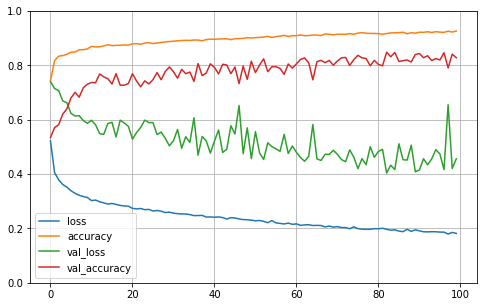

In [60]:
import pandas as pd
import matplotlib.pyplot as plt

pd.DataFrame(history.history).plot(figsize=(8,5))
plt.grid(True)
plt.gca().set_ylim(0,1)
plt.show()

In [108]:
totals_accuracy = totals_TPR = totals_TNR = totals_f1 = 0
runs = 100
values = []
for i in range(runs):
    train_set, test_set = split_train_test(shoppers_data, 0.7, random_state=i)
    X_transformed, Y_train, X_transformed_test, Y_test = transform_data(train_set, test_set)
    
    svc = SVC(C=10, gamma='auto', kernel='rbf')
    svc.fit(X_transformed, Y_train)
    test_pred2 = svc.predict(X_transformed_test)
    accuracy, TPR, TNR, f1 = test_performance(Y_test, test_pred2)
    values.append(f1)
    totals_accuracy += accuracy
    totals_TPR += TPR
    totals_TNR += TNR
    totals_f1 += f1
    
avg_accuracy = totals_accuracy/runs
avg_TPR = totals_TPR/runs
avg_TNR = totals_TNR/runs
avg_f1 = totals_f1/runs
std_deviation = np.std(values)
print("Accuracy:%s\nTPR:%s\nTNR:%s\nF1:%s\nStd:%s" %(avg_accuracy, avg_TPR, avg_TNR, avg_f1, std_deviation))

Accuracy:0.886957478855289
TPR:0.4917739520958084
TNR:0.9593310486634682
F1:0.5736393492581083
Std:0.012835806917319153


In [ ]:
svm = [0.5907879375961279,0.5649277805586885, ,0.549803031316029]

In [10]:
shoppers_data['Revenue'].value_counts()

0    10422
1     1908
Name: Revenue, dtype: int64

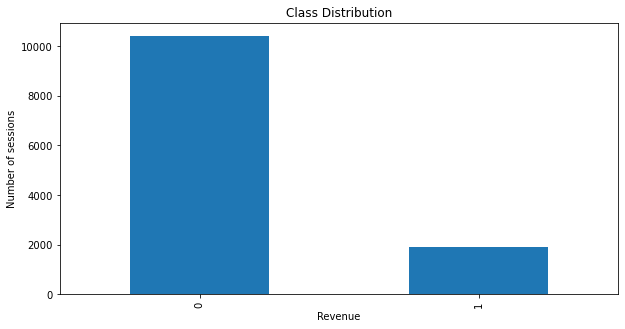

In [21]:
shoppers_data['Revenue'].value_counts().plot.bar(title="Class Distribution", xlabel='Revenue', ylabel='Number of sessions', figsize=(10,5))

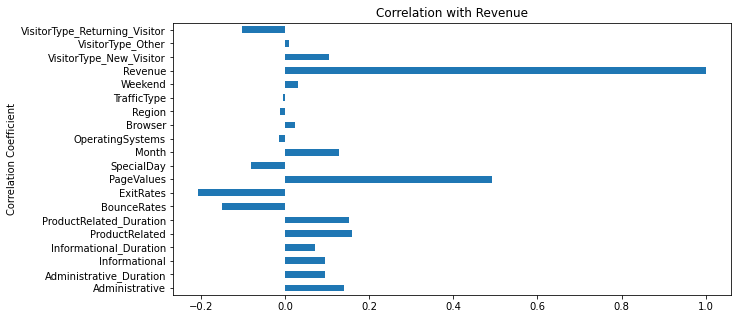

In [31]:
corr = shoppers_data.corrwith(shoppers_data['Revenue'])
#corr.style.background_gradient(cmap='coolwarm')
corr.plot.barh(xlabel='Correlation Coefficient', title="Correlation with Revenue", figsize=(10,5))

In [2]:
shoppers_data.head()

,Administrative,Administrative_Duration,Informational,Informational_Duration,ProductRelated,ProductRelated_Duration,BounceRates,ExitRates,PageValues,SpecialDay,Month,OperatingSystems,Browser,Region,TrafficType,Weekend,Revenue,VisitorType_New_Visitor,VisitorType_Other,VisitorType_Returning_Visitor
0,0,0.0,0,0.0,1,0.000000,0.20,0.20,0.0,0.0,2,1,1,1,1,0,0,0,0,1
1,0,0.0,0,0.0,2,64.000000,0.00,0.10,0.0,0.0,2,2,2,1,2,0,0,0,0,1
2,0,0.0,0,0.0,1,0.000000,0.20,0.20,0.0,0.0,2,4,1,9,3,0,0,0,0,1
3,0,0.0,0,0.0,2,2.666667,0.05,0.14,0.0,0.0,2,3,2,2,4,0,0,0,0,1
4,0,0.0,0,0.0,10,627.500000,0.02,0.05,0.0,0.0,2,3,3,1,4,1,0,0,0,1


In [ ]:
#Things I need to do:
#Compare MLPs against each other based on the number of neurons in the hidden layer
#Compare MLPs against each other based on normalisation method
#Compare MLPs against each other based on data pre-processing methods
#Get the best performing MLP and compare against other ML algorithms on data pre-processing methods
#Use statistical tests and confidence intervals to conclude the best performing one


In [86]:
#SVM Data
SVM_Accuracy = [0.8914193025141925, 0.8508948364422815, 0.8505515004055149, 0.8461178696945119]
SVM_TPR = [0.5071328671328671, 0.6259615384615385, 0.6181118881118882, 0.6076923076923079]
SVM_TNR = [0.9617141029740961, 0.8920402942117045, 0.8930700351774864, 0.8897313719219696]
SVM_F1 = [0.5907879375961279, 0.5649277805586885, 0.5612532979217592, 0.549803031316029]

In [87]:
#RF Data
RF_Accuracy = [0.9021330089213302, 0.8716031359826979, 0.8659394430927274, 0.8255988104893214]
RF_TPR=[0.5281993006993007, 0.8214353925270071, 0.837097902097902, 0.6876048951048952]
RF_TNR=[0.9705340582027501, 0.8807985614027316, 0.8712152222577549, 0.8508410617204986]
RF_F1=[0.6251360186768158, 0.6644419283138352, 0.6589553877562742, 0.549766455919334]

In [101]:
#MLP 10 Data
MLP_10_Accuracy=[0.8924952689916194, 0.8849770208164369, 0.8867721005677212, 0.886493646931603]
MLP_10_TPR=[0.5106993006993008, 0.6838461538461535, 0.6827972027972027, 0.685384615384615]
MLP_10_TNR=[0.9623345059162132, 0.9217684681803644, 0.9240837863767192, 0.9232811000959386]
MLP_10_F1=[0.594585432017392, 0.647717692419524, 0.6509575078465534, 0.651282158350735]

#MLP 20 Data
MLP_20_Accuracy=[0.8924628277912955, 0.8857366855907003, 0.8873992971073267, 0.8869072722357397]
MLP_20_TPR=[0.5086538461538461, 0.6743531468531465, 0.678951048951049, 0.6800874125874126]
MLP_20_TNR=[0.962670291013751, 0.9244035817077068, 0.9255292612727856, 0.9247393668052447]
MLP_20_F1=[0.5936879619028442, 0.6460556370029914, 0.6508786054509835, 0.650356114923119]


#MLP 40 Data
MLP_40_Accuracy=[0.8920924574209248, 0.8862881859962151, 0.8877101919437684, 0.8871073263044066]
MLP_40_TPR=[0.5006818181818181, 0.6700000000000003, 0.6752097902097902, 0.6750174825174825]
MLP_40_TNR=[0.9636904381196034, 0.9258522545570836, 0.9265813879117367, 0.9259034218100414]
MLP_40_F1=[0.5890386942895238, 0.6456843904863309, 0.6503007250851464, 0.6489896031556229]

#MLP 10 BN Data
MLP_10_BN_Accuracy=[0.8943633414436328, 0.8788104893214382, 0.8797350635306842, 0.8849608002162749]
MLP_10_BN_TPR=[0.5191433566433565, 0.71743006993007, 0.7239335664335661, 0.6416083916083914]
MLP_10_BN_TNR=[0.9629996802046686, 0.9083306683722414, 0.9082347297729454, 0.9294755356571792]
MLP_10_BN_F1=[0.6027159428997976, 0.6469207430912541, 0.6507140092413443, 0.6329917821151101]

#MLP 20 BN Data
MLP_20_BN_Accuracy=[0.8944011895106787, 0.8792889970262234, 0.8772452014057857, 0.8843119762097861]
MLP_20_BN_TPR=[0.5203846153846153, 0.7125174825174827, 0.721416083916084, 0.6370104895104896]
MLP_20_BN_TNR=[0.9628173968660058, 0.9097953309881678, 0.9057499200511665, 0.9295490885833072]
MLP_20_BN_F1=[0.6035423302200015, 0.6461599904825474, 0.6454244309888172, 0.6300263366398934]

#MLP 40 BN Data
MLP_40_BN_Accuracy=[0.8938442822384429, 0.8779021357123545, 0.8749689105163554, 0.8840524466071917]
MLP_40_BN_TPR=[0.5182517482517482, 0.704160839160839, 0.7183741258741256, 0.6349650349650349]
MLP_40_BN_TNR=[0.9625487687879758, 0.909683402622322, 0.9036136872401661, 0.9296162456028141]
MLP_40_BN_F1=[0.6012513332998894, 0.6408863735313584, 0.6401628397805676, 0.6287267060288348]

#MLP 10 BN (after) Data
MLP_10_ABN_Accuracy=[0.8927466882941337, 0.8819275479859418, 0.882949445796161, 0.8825060827250606]
MLP_10_ABN_TPR=[0.5300874125874129, 0.6831468531468532, 0.686870629370629, 0.6913986013986014]
MLP_10_ABN_TNR=[0.9590853853533736, 0.9182890949792127, 0.9188167572753443, 0.9174640230252638]
MLP_10_ABN_F1=[0.6042188182143324, 0.6416046756071886, 0.6448016253327745, 0.6455228263198243]

#MLP 20 BN (after) Data
MLP_20_ABN_Accuracy=[0.892771019194377, 0.8820735333874025, 0.8828386050283865,0.8824439037577723]
MLP_20_ABN_TPR=[0.5273426573426572, 0.6814685314685314, 0.6829720279720283,0.6840909090909093]
MLP_20_ABN_TNR=[0.9596162456028148, 0.9187687879756952, 0.9193987847777422,0.9187272145826668]
MLP_20_ABN_F1=[0.6030285862712664, 0.6413304153025225, 0.6433086791193962,0.6428062230294317]

#MLP 40 BN (after) Data
MLP_40_ABN_Accuracy=[0.8923844282238441, 0.8811732900783994, 0.8831792376317925, 0.8812949445796161]
MLP_40_ABN_TPR=[0.5262762237762237, 0.6675699300699298, 0.6744230769230772, 0.6754895104895108]
MLP_40_ABN_TNR=[0.959354013431404, 0.9202462424048611, 0.921365526063319, 0.9189414774544291]
MLP_40_ABN_F1=[0.6016041499637464, 0.6347712240739807, 0.6410707879621994, 0.6379061604480709]



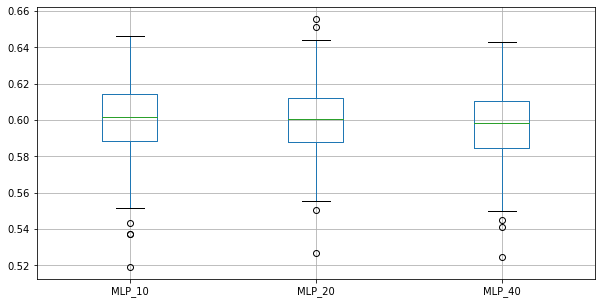

In [5]:
#1st Data Pre-processing method
import pandas as pd

Methods = ['No Normalisation', 'Batch Normalisation before Layers', 'Batch Normalisation after Layers']

MLP_10_raw_f1 =[0.5994005994005994, 0.6170854271356784, 0.5881147540983607, 0.5639412997903565, 0.599601593625498, 0.5973496432212028, 0.5781409601634321, 0.5817060637204523, 0.629889669007021, 0.6004319654427646, 0.6145833333333333, 0.5781893004115226, 0.6231742940603701, 0.6111675126903554, 0.620431115276476, 0.5801217038539553, 0.5634674922600619, 0.6017699115044247, 0.5969581749049431, 0.6181818181818183, 0.5990147783251232, 0.6149253731343284, 0.614, 0.564430244941427, 0.592741935483871, 0.5997973657548126, 0.6042296072507554, 0.584771573604061, 0.5779153766769867, 0.5778229908443541, 0.5847457627118644, 0.5868644067796611, 0.5978723404255318, 0.5851172273190621, 0.6112759643916914, 0.6020408163265306, 0.58125, 0.6013579049466538, 0.5644171779141105, 0.5956607495069034, 0.5939036381514258, 0.5949748743718593, 0.5782652043868395, 0.6215943491422805, 0.59026369168357, 0.6073619631901841, 0.6270691333982473, 0.5918803418803419, 0.5679287305122495, 0.5993945509586277, 0.615228426395939, 0.6059405940594059, 0.632512315270936, 0.5806451612903226, 0.5193370165745856, 0.5996131528046421, 0.5538793103448276, 0.6035502958579883, 0.592741935483871, 0.5941747572815533, 0.6246246246246248, 0.5945945945945946, 0.6229508196721311, 0.5605749486652978, 0.5795339412360688, 0.5974282888229476, 0.6059405940594059, 0.6248736097067745, 0.5370165745856353, 0.5745140388768899, 0.6081871345029239, 0.5801047120418847, 0.6122860020140987, 0.589716684155299, 0.6219512195121952, 0.6084396467124633, 0.6086086086086085, 0.6187050359712231, 0.5812310797174572, 0.6059322033898304, 0.5990049751243782, 0.5801047120418847, 0.5891946992864424, 0.5728952772073922, 0.5920502092050209, 0.5901639344262296, 0.5904572564612326, 0.5854189336235038, 0.6094674556213018, 0.5517993456924755, 0.6061224489795918, 0.6149253731343284, 0.616, 0.5752302968270214, 0.5786694825765575, 0.6016771488469601, 0.6233230134158927, 0.5965270684371808, 0.5814207650273224, 0.5726587728740582]
MLP_20_raw_f1 = [0.6043165467625898, 0.610655737704918, 0.5954356846473029, 0.5605900948366701, 0.592741935483871, 0.5900621118012422, 0.5651720542231492, 0.5765575501583949, 0.6063157894736843, 0.6121593291404612, 0.5923497267759563, 0.5957446808510639, 0.6120000000000001, 0.5807814149947201, 0.6199616122840691, 0.5725971370143149, 0.5266594124047878, 0.5876393110435664, 0.6015473887814314, 0.6146044624746451, 0.59244126659857, 0.5955734406438631, 0.6042296072507554, 0.586171310629515, 0.6006006006006006, 0.5732484076433122, 0.6030150753768844, 0.5898989898989899, 0.5587301587301587, 0.5843621399176955, 0.6042296072507554, 0.6063072227873855, 0.5982905982905983, 0.5928143712574852, 0.5894105894105894, 0.6000000000000001, 0.5905511811023623, 0.604040404040404, 0.5702730030333669, 0.6021717670286277, 0.5891783567134269, 0.6130952380952381, 0.5722891566265059, 0.6022845275181723, 0.5824634655532359, 0.5680345572354212, 0.629951690821256, 0.5893617021276596, 0.5942492012779553, 0.5961732124874118, 0.608257804632427, 0.5940996948118007, 0.6215384615384616, 0.5810526315789473, 0.5708418891170431, 0.5911330049261084, 0.5705263157894738, 0.5784615384615385, 0.5895372233400402, 0.5693581780538302, 0.6055045871559632, 0.6111111111111112, 0.6198267564966314, 0.5903614457831325, 0.5667351129363449, 0.5774058577405857, 0.5819327731092437, 0.6208291203235592, 0.5603357817418677, 0.5776850886339937, 0.6064769381746811, 0.5795918367346939, 0.6136820925553319, 0.6307385229540918, 0.6237424547283702, 0.6099706744868034, 0.6133603238866397, 0.6121212121212121, 0.5702564102564103, 0.6158536585365854, 0.5956175298804781, 0.5850052798310454, 0.5857142857142857, 0.5680851063829787, 0.599601593625498, 0.5841995841995842, 0.5905130687318491, 0.5959271168274383, 0.6016260162601625, 0.588235294117647, 0.6509803921568628, 0.5927461139896373, 0.6105476673427991, 0.5589155370177268, 0.5876393110435664, 0.6, 0.6179196704428425, 0.6046986721144025, 0.6041666666666666, 0.5829959514170041]
MLP_40_raw_f1 = [0.5965270684371808, 0.616632860040568, 0.5807127882599581, 0.5498426023084996, 0.6022155085599195, 0.583420776495278, 0.5561497326203209, 0.5853154084798345, 0.6194331983805669, 0.5797101449275363, 0.5838779956427015, 0.5726141078838174, 0.6176762661370407, 0.5548245614035088, 0.6095954844778928, 0.5911330049261084, 0.5245901639344263, 0.5873015873015874, 0.5943396226415095, 0.6171874999999999, 0.5844559585492228, 0.5867507886435331, 0.5811789038262668, 0.5801047120418847, 0.5845213849287169, 0.594818652849741, 0.5995893223819303, 0.5761316872427983, 0.5592515592515592, 0.5726141078838174, 0.5847457627118644, 0.6026557711950971, 0.5981112277019937, 0.6036217303822937, 0.5898989898989899, 0.5985247629083246, 0.596806387225549, 0.598343685300207, 0.5746887966804979, 0.5820745216515609, 0.5861386138613862, 0.5908629441624366, 0.567951318458418, 0.6081632653061224, 0.5849639546858908, 0.5828933474128828, 0.621648460774578, 0.5914315569487983, 0.6014877789585547, 0.5850202429149797, 0.6042726347914548, 0.5987903225806451, 0.6243996157540828, 0.5645330535152151, 0.5690721649484536, 0.5894105894105894, 0.5824847250509165, 0.5903614457831325, 0.5852156057494866, 0.574826560951437, 0.6063720452209662, 0.5906735751295337, 0.6149312377210217, 0.5852674066599394, 0.5684647302904564, 0.5838509316770187, 0.597165991902834, 0.6024844720496895, 0.5566137566137566, 0.576017130620985, 0.6064257028112451, 0.5726315789473684, 0.5843179377013963, 0.6047471620227037, 0.6084275436793423, 0.599601593625498, 0.6044624746450304, 0.6138211382113822, 0.5800604229607251, 0.59958071278826, 0.6108374384236454, 0.5673603504928807, 0.5744456177402324, 0.5573419078242229, 0.5952133194588971, 0.5794392523364486, 0.5748502994011977, 0.5846817691477886, 0.60262891809909, 0.5696335078534032, 0.6213197969543147, 0.5850052798310454, 0.6029411764705882, 0.5732217573221756, 0.6002055498458376, 0.592436974789916, 0.6092436974789917, 0.589958158995816, 0.5976768743400211, 0.5835929387331257]

MLP_10_BN_raw_f1 = [0.5631067961165048, 0.6247422680412371, 0.615686274509804, 0.5773809523809524, 0.5931321540062434, 0.6189989785495403, 0.5677139761646803, 0.5778229908443541, 0.6082474226804124, 0.6412825651302606, 0.6046025104602509, 0.5621052631578948, 0.6377880184331798, 0.5909568874868558, 0.6155303030303031, 0.5993883792048931, 0.5662778366914104, 0.6231454005934718, 0.6218951241950322, 0.6447761194029852, 0.5959595959595959, 0.622093023255814, 0.6038114343029087, 0.5772532188841202, 0.59358841778697, 0.5932028836251287, 0.5969543147208121, 0.6150907354345749, 0.5572354211663066, 0.6128404669260701, 0.5962732919254659, 0.5997952917093141, 0.6120777891504606, 0.6168032786885246, 0.5985985985985987, 0.6158357771260998, 0.6, 0.6316812439261419, 0.5779153766769867, 0.5931558935361217, 0.6070726915520628, 0.6176762661370407, 0.6031434184675833, 0.602020202020202, 0.6012396694214877, 0.6317948717948717, 0.6254901960784314, 0.5989417989417989, 0.6147186147186147, 0.5876288659793815, 0.6068548387096774, 0.617618586640852, 0.6411290322580645, 0.5807127882599581, 0.5371179039301309, 0.5802469135802468, 0.593654042988741, 0.5624999999999999, 0.6094853683148335, 0.5878787878787879, 0.6139630390143737, 0.6194871794871795, 0.608433734939759, 0.6016096579476861, 0.5871743486973948, 0.603238866396761, 0.6071065989847716, 0.6142857142857143, 0.5887179487179488, 0.6055045871559632, 0.6002034587995931, 0.5967078189300411, 0.6122026887280249, 0.6024590163934426, 0.6330935251798561, 0.600995024875622, 0.6212121212121212, 0.6262626262626264, 0.5859613428280773, 0.6108870967741935, 0.5909547738693467, 0.5714285714285715, 0.6074672048435923, 0.604040404040404, 0.6080808080808081, 0.6118355065195586, 0.6104023552502454, 0.5654101995565409, 0.6262230919765167, 0.5792811839323467, 0.6463654223968566, 0.6122448979591836, 0.6416243654822333, 0.6039707419017764, 0.6204081632653061, 0.5998013902681232, 0.5906183368869936, 0.6081632653061224, 0.6019210245464248, 0.5601750547045952]
MLP_20_BN_raw_f1 = [0.5834186284544524, 0.623721881390593, 0.6179664363277393, 0.5619146722164411, 0.5977933801404213, 0.6250000000000001, 0.583864118895966, 0.5883554647599591, 0.6064257028112451, 0.6112886048988286, 0.6184486373165619, 0.5895372233400402, 0.6310583580613255, 0.6047471620227037, 0.6044273339749759, 0.5870445344129555, 0.5802337938363443, 0.6120434353405726, 0.6223055295220244, 0.6333666333666333, 0.5885947046843177, 0.6221335992023929, 0.6100691016781836, 0.5899280575539568, 0.6257425742574257, 0.6059405940594059, 0.6109391124871001, 0.6080947680157945, 0.5696335078534032, 0.6043307086614174, 0.5913410770855333, 0.6238532110091743, 0.5891141942369263, 0.6091370558375634, 0.6019607843137254, 0.622983870967742, 0.5928143712574852, 0.6101010101010101, 0.5808444902162718, 0.56797583081571, 0.5910390848427073, 0.5988023952095808, 0.5867768595041323, 0.608695652173913, 0.6042726347914548, 0.6404715127701375, 0.6313725490196078, 0.6196319018404908, 0.6176470588235293, 0.5989847715736041, 0.6234567901234567, 0.625, 0.6097318768619663, 0.5714285714285714, 0.5784615384615385, 0.5904572564612326, 0.6141248720573184, 0.5787234042553191, 0.6120434353405726, 0.6001994017946161, 0.6171079429735233, 0.6241134751773049, 0.6199407699901284, 0.6066066066066066, 0.5867768595041323, 0.5981308411214954, 0.6177370030581041, 0.5836909871244635, 0.5901309164149043, 0.5981308411214954, 0.6006128702757917, 0.5828220858895705, 0.6049382716049382, 0.610337972166998, 0.616632860040568, 0.6013986013986015, 0.6222664015904573, 0.6288032454361056, 0.5711297071129707, 0.6052631578947368, 0.6104023552502454, 0.5882352941176471, 0.5759493670886076, 0.5553235908141962, 0.6001936108422071, 0.5808510638297872, 0.6299357208448118, 0.6134185303514378, 0.6241413150147204, 0.5843621399176955, 0.6064382139148494, 0.6147540983606558, 0.641158221302999, 0.6024096385542169, 0.6434108527131783, 0.6217303822937625, 0.5963791267305645, 0.5967078189300411, 0.5774499473129611, 0.5945945945945945]
MLP_40_BN_raw_f1 = [0.598343685300207, 0.6368932038834951, 0.5941591137965759, 0.5606694560669455, 0.5942744323790721, 0.6303270564915758, 0.575599582898853, 0.6004016064257028, 0.5978152929493545, 0.6074380165289256, 0.6078639744952179, 0.6120434353405726, 0.631578947368421, 0.622568093385214, 0.5849802371541502, 0.5793244626407369, 0.5652173913043478, 0.5928143712574852, 0.6122840690978887, 0.6213592233009709, 0.5995893223819303, 0.6428571428571428, 0.5750798722044729, 0.5951629863301787, 0.5993820803295572, 0.5989743589743589, 0.6018423746161718, 0.6052376333656644, 0.5653104925053533, 0.6223506743737958, 0.6041874376869392, 0.6111111111111112, 0.6142709410548087, 0.5901639344262296, 0.62, 0.5781584582441114, 0.5797392176529589, 0.6058174523570712, 0.5702647657841141, 0.5931034482758621, 0.6060019361084221, 0.5957011258955989, 0.581039755351682, 0.62217659137577, 0.6072874493927125, 0.6213786213786214, 0.6217821782178218, 0.5931321540062434, 0.6080508474576272, 0.5957446808510639, 0.6096033402922757, 0.6248756218905472, 0.6046511627906976, 0.5705394190871369, 0.5556711758584807, 0.5446898002103049, 0.6108870967741935, 0.5944841675178754, 0.6215686274509804, 0.6102021174205967, 0.59958071278826, 0.6231454005934718, 0.6172106824925815, 0.5987654320987655, 0.6092977250247279, 0.5686695278969957, 0.6004140786749482, 0.6191446028513238, 0.5684430512016718, 0.5916919959473151, 0.6052631578947368, 0.603297769156159, 0.620976116303219, 0.6078234704112337, 0.6383838383838384, 0.6037364798426745, 0.5829042224510813, 0.6337033299697276, 0.6263208453410182, 0.604040404040404, 0.588, 0.5897435897435898, 0.5876288659793815, 0.5758513931888546, 0.5887096774193548, 0.5946502057613169, 0.6061814556331007, 0.603411513859275, 0.6182531894013739, 0.5786163522012578, 0.6155419222903886, 0.608695652173913, 0.6023329798515377, 0.5975855130784707, 0.6256306760847629, 0.6143277723258097, 0.5942492012779553, 0.6228855721393035, 0.593654042988741, 0.598343685300207]

MLP_10_ABN_raw_f1 = [0.6082771896053898, 0.6228855721393035, 0.5925925925925927, 0.5841784989858012, 0.5984251968503937, 0.6029106029106028, 0.5814185814185815, 0.6036644165863065, 0.6384692849949646, 0.6214807090719499, 0.608066184074457, 0.5775950668036999, 0.623015873015873, 0.6045081967213114, 0.615962441314554, 0.590030518819939, 0.5641025641025641, 0.5978152929493545, 0.6089334548769372, 0.6436327739387957, 0.5997993981945838, 0.6321951219512196, 0.6240157480314961, 0.5945945945945946, 0.6083418107833163, 0.5945399393326593, 0.5925176946410515, 0.6039603960396039, 0.5648050579557429, 0.6135693215339233, 0.618217054263566, 0.6, 0.6094240837696334, 0.6077669902912621, 0.6057692307692308, 0.6262425447316105, 0.596039603960396, 0.609375, 0.6071774975751697, 0.5990338164251208, 0.6253469010175763, 0.6061204343534057, 0.5895153313550939, 0.6277939747327502, 0.6015625, 0.6263627353815658, 0.6189111747851004, 0.6088751289989679, 0.6139240506329113, 0.5795339412360688, 0.6152263374485597, 0.6005946481665014, 0.6429258902791146, 0.5811088295687885, 0.5431034482758621, 0.5794205794205793, 0.5983772819472616, 0.5795339412360688, 0.6081871345029239, 0.5853174603174602, 0.5983772819472616, 0.6112224448897795, 0.6149425287356322, 0.5990049751243782, 0.5996055226824458, 0.6046511627906976, 0.6071065989847716, 0.6113789778206364, 0.5858170606372046, 0.6064257028112451, 0.6101694915254238, 0.588235294117647, 0.5835095137420718, 0.5994005994005994, 0.6373008434864105, 0.6048309178743961, 0.579650565262076, 0.6422200198216056, 0.6259842519685039, 0.6198019801980197, 0.6143540669856459, 0.5988142292490118, 0.6055612770339857, 0.5946481665014866, 0.5915768854064644, 0.6014127144298688, 0.6114285714285713, 0.5942492012779553, 0.6298449612403102, 0.5846153846153846, 0.624, 0.572938689217759, 0.6228160328879754, 0.5787321063394683, 0.6204162537165511, 0.6075949367088607, 0.6344410876132931, 0.6236766121270453, 0.5925925925925927, 0.5614406779661016]
MLP_20_ABN_raw_f1 = [0.5702127659574467, 0.6221335992023929, 0.6069364161849712, 0.5595959595959595, 0.5923000987166831, 0.6085192697768763, 0.5871369294605809, 0.6068292682926829, 0.631578947368421, 0.6363636363636362, 0.6027987082884823, 0.5997993981945838, 0.6321839080459771, 0.5809128630705395, 0.6070038910505837, 0.585781990521327, 0.550632911392405, 0.6137254901960785, 0.5990610328638498, 0.6235521235521234, 0.5920155793573514, 0.6553672316384181, 0.5877632898696088, 0.6089552238805971, 0.6088595664467483, 0.6262425447316105, 0.6146146146146145, 0.6168958742632613, 0.5950920245398773, 0.6043437204910292, 0.6155378486055777, 0.6021934197407777, 0.6104830421377184, 0.6006006006006006, 0.6282051282051282, 0.6135216952573158, 0.5941176470588235, 0.5925925925925927, 0.6013847675568743, 0.6086124401913876, 0.5904954499494439, 0.6016096579476861, 0.5868263473053892, 0.6224899598393575, 0.6063618290258449, 0.6278836509528586, 0.6116027531956736, 0.6066734074823052, 0.5879828326180258, 0.5919003115264797, 0.6111111111111112, 0.5841784989858012, 0.6265520534861508, 0.6098294884653962, 0.573469387755102, 0.5957854406130269, 0.6020408163265306, 0.5915492957746479, 0.5926660059464817, 0.5903257650542941, 0.5985401459854015, 0.6006066734074824, 0.6316812439261419, 0.5970443349753694, 0.5991902834008097, 0.5875251509054326, 0.5942028985507247, 0.6016427104722792, 0.5823834196891191, 0.5894519131334022, 0.6212268743914313, 0.5809716599190283, 0.63, 0.6059365404298874, 0.6442687747035574, 0.6165413533834586, 0.6193293885601578, 0.6352705410821643, 0.6, 0.5883534136546185, 0.5942744323790721, 0.6012396694214877, 0.5726405090137858, 0.5671957671957673, 0.600995024875622, 0.5859213250517599, 0.6021093000958773, 0.6055612770339857, 0.6121635094715853, 0.5764102564102564, 0.6270373921380632, 0.5999999999999999, 0.6271356783919597, 0.5874125874125874, 0.6173826173826175, 0.6094069529652352, 0.5951417004048583, 0.602020202020202, 0.6030769230769231, 0.5857740585774058]
MLP_40_ABN_raw_f1 = [0.5855670103092784, 0.6039707419017764, 0.5998013902681232, 0.5760000000000001, 0.5937813440320964, 0.6259689922480621, 0.5729275970619098, 0.6103012633624878, 0.6241276171485544, 0.6301925025329281, 0.5919661733615222, 0.5714285714285714, 0.6345226615236259, 0.62, 0.6071085494716618, 0.5745310957551826, 0.5593395252837978, 0.5893223819301847, 0.599250936329588, 0.6397637795275591, 0.6053946053946054, 0.6156901688182722, 0.5951903807615231, 0.5603448275862069, 0.615079365079365, 0.6003898635477583, 0.586171310629515, 0.5984251968503937, 0.5659978880675818, 0.6124401913875599, 0.6203615604186489, 0.5971074380165288, 0.6292134831460674, 0.6248812915479582, 0.6214149139579349, 0.6163141993957704, 0.6100386100386099, 0.6078838174273858, 0.5844930417495029, 0.5915768854064644, 0.6040658276863504, 0.5969849246231156, 0.573469387755102, 0.623352165725047, 0.5708289611752361, 0.6224899598393575, 0.6244087038789026, 0.6049382716049382, 0.606060606060606, 0.5965621840242669, 0.5872855701311807, 0.6061204343534057, 0.6362754607177497, 0.5914085914085915, 0.541304347826087, 0.5832512315270936, 0.6072144288577155, 0.5955284552845529, 0.6059443911792904, 0.5803212851405621, 0.6196623634558093, 0.6218655967903711, 0.6167664670658684, 0.5848303393213572, 0.5891625615763546, 0.5985844287158747, 0.6220472440944882, 0.6354581673306774, 0.5803757828810021, 0.5888223552894212, 0.6234269119070668, 0.5711361310133061, 0.6214574898785425, 0.611111111111111, 0.6297029702970297, 0.6197718631178707, 0.6087804878048779, 0.6327345309381237, 0.5916585838991272, 0.5884816753926702, 0.592375366568915, 0.6142857142857143, 0.6247544204322201, 0.568421052631579, 0.6094069529652352, 0.5841784989858012, 0.6167883211678832, 0.5862433862433862, 0.6158357771260998, 0.5807106598984771, 0.6267190569744597, 0.5946502057613169, 0.5917525773195876, 0.5613682092555331, 0.612410986775178, 0.6051587301587302, 0.6086065573770493, 0.6095954844778928, 0.5774946921443738, 0.5977249224405377]

total_10_raw = MLP_10_raw_f1+MLP_10_BN_raw_f1+MLP_10_ABN_raw_f1
total_20_raw = MLP_20_raw_f1+MLP_20_BN_raw_f1+MLP_20_ABN_raw_f1
total_40_raw = MLP_40_raw_f1+MLP_40_BN_raw_f1+MLP_40_ABN_raw_f1

mlp_raw_f1 = {'MLP_10':total_10_raw, 'MLP_20':total_20_raw, 'MLP_40':total_40_raw}
mlp_raw_f1_df = pd.DataFrame.from_dict(mlp_raw_f1)
boxplot = mlp_raw_f1_df.boxplot(column=['MLP_10', 'MLP_20', 'MLP_40'], figsize=(10,5))  

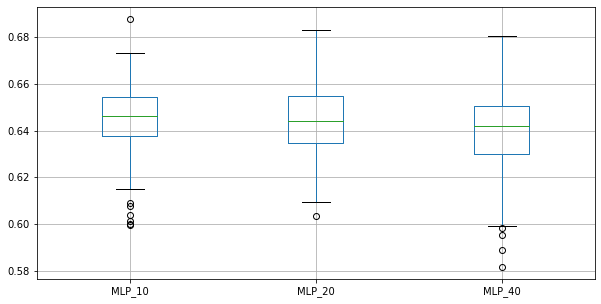

In [6]:
#2nd data pre-processing method

MLP_10_raw_f1_2 = [0.6397248495270851, 0.6558497011101623, 0.6530278232405892, 0.6293103448275863, 0.6540673788003287, 0.6518391787852865, 0.6463815789473684, 0.6536833192209991, 0.6622185154295246, 0.6608544027898867, 0.6677768526228144, 0.6529605263157895, 0.6698950766747377, 0.6500415627597673, 0.6434359805510536, 0.6358475263584752, 0.6254355400696864, 0.6436781609195402, 0.6347760060744115, 0.6553398058252426, 0.6427976686094921, 0.6661224489795918, 0.6542207792207793, 0.6451612903225806, 0.6439578264395782, 0.6389351081530783, 0.6502127659574467, 0.6441767068273093, 0.6409597257926307, 0.6316639741518579, 0.6482873851294904, 0.6731234866828087, 0.6683673469387755, 0.6445182724252492, 0.6596091205211726, 0.6398026315789473, 0.6455379482902419, 0.662771285475793, 0.6320754716981132, 0.6151260504201681, 0.6436213991769548, 0.658456486042693, 0.6076595744680852, 0.6552287581699345, 0.65046102263202, 0.6701388888888888, 0.6535122336227309, 0.6410041841004184, 0.664957264957265, 0.648424543946932, 0.6476810414971522, 0.6414473684210527, 0.6544546211490424, 0.6429177268871925, 0.6278260869565218, 0.6344262295081967, 0.6310254163014899, 0.6385542168674699, 0.652926628194559, 0.636650868878357, 0.6419545071609098, 0.6601626016260164, 0.6611977030352748, 0.6266233766233766, 0.6426858513189448, 0.6395250212044106, 0.6444805194805194, 0.6559226430298147, 0.6404023470243084, 0.6627810158201499, 0.634228187919463, 0.6612641815235009, 0.6571668063704946, 0.6522821576763486, 0.6688632619439868, 0.6291768541157294, 0.6303680981595093, 0.6579591836734693, 0.6390532544378699, 0.6643952299829642, 0.6358284272497897, 0.657190635451505, 0.6485148514851485, 0.6501240694789081, 0.6472962066182404, 0.643846780766096, 0.6284779050736498, 0.6503623188405797, 0.6402586903799515, 0.6282051282051282, 0.6602717825739408, 0.6626609442060086, 0.6661143330571665, 0.6395250212044106, 0.6599496221662469, 0.6521008403361346, 0.6573311367380561, 0.6644573322286661, 0.657074340527578, 0.6167400881057269]
MLP_20_raw_f1_2 = [0.6512820512820513, 0.6574633304572908, 0.6502384737678855, 0.6212765957446809, 0.6551155115511552, 0.6404782237403929, 0.6353135313531353, 0.6395348837209301, 0.6633581472291149, 0.6578715919085313, 0.6661059714045416, 0.6467065868263474, 0.6621507197290432, 0.6471544715447155, 0.6360031720856464, 0.6306451612903226, 0.6275197195442593, 0.6504201680672269, 0.6519967400162999, 0.657695542472666, 0.6502463054187192, 0.6666666666666666, 0.6549118387909321, 0.6435070306038048, 0.6436213991769548, 0.6545754328112119, 0.6502202643171805, 0.6344712739383847, 0.6382608695652173, 0.632869991823385, 0.6432337434094904, 0.6499189627228524, 0.6678321678321678, 0.6350245499181669, 0.6537815126050419, 0.6514767932489451, 0.6404782237403929, 0.657695542472666, 0.6344712739383847, 0.6142625607779579, 0.6273858921161826, 0.6473099914602903, 0.6095238095238096, 0.6455379482902419, 0.6567164179104479, 0.6561954624781849, 0.6578512396694215, 0.6273187183811131, 0.6695880806310255, 0.6403433476394851, 0.6468590831918506, 0.6302931596091206, 0.6535303776683087, 0.6387702818104184, 0.6164502164502164, 0.6278101582014987, 0.6361323155216284, 0.6209386281588447, 0.6493288590604026, 0.6406504065040651, 0.6462585034013605, 0.648910411622276, 0.6504065040650406, 0.6246808510638298, 0.632869991823385, 0.6440957886044592, 0.6556016597510372, 0.6633825944170771, 0.6447257383966245, 0.6496028243601059, 0.642737896494157, 0.6452145214521452, 0.656172328086164, 0.6527893422148209, 0.6689246401354784, 0.6390728476821191, 0.6299342105263158, 0.6606409202958093, 0.6378018318068277, 0.6632566069906224, 0.6336311941510966, 0.653516295025729, 0.6472602739726028, 0.640728476821192, 0.6375892149088026, 0.6499999999999999, 0.6357199055861527, 0.6467289719626169, 0.645004061738424, 0.6354515050167224, 0.6758286176232821, 0.6591639871382636, 0.6587837837837838, 0.6371100164203612, 0.6672297297297297, 0.6536170212765957, 0.6677994902293969, 0.6587234042553192, 0.6495443247721624, 0.6306620209059233]
MLP_40_raw_f1_2 = [0.6481012658227848, 0.6643952299829642, 0.6468155500413564, 0.6206308610400681, 0.6518151815181519, 0.6402586903799515, 0.6248912097476066, 0.6486486486486486, 0.6445733222866612, 0.6486028789161727, 0.6655737704918032, 0.6486941870261163, 0.6699751861042184, 0.6638297872340425, 0.6425636811832375, 0.6189258312020461, 0.6244653550042771, 0.6376569037656903, 0.6323296354992077, 0.6459209419680404, 0.6449044585987261, 0.671244635193133, 0.6459525756336876, 0.6458832933653077, 0.6494587843463779, 0.6348408710217754, 0.6470588235294118, 0.6411716842961758, 0.6421052631578948, 0.6444629475437135, 0.6385542168674699, 0.6621848739495798, 0.6523681858802503, 0.6430976430976432, 0.6526315789473683, 0.6586414445399827, 0.6480263157894738, 0.6559226430298147, 0.6287170773152081, 0.6201163757273482, 0.6359060402684564, 0.6588824020016681, 0.6177215189873418, 0.6544181977252843, 0.6425419240953222, 0.6757912745936698, 0.659217877094972, 0.6404109589041096, 0.6607929515418502, 0.6441558441558441, 0.6593220338983051, 0.6459016393442623, 0.6526138279932546, 0.6468085106382978, 0.6194995685936152, 0.63441712926249, 0.6280107047279215, 0.6270742358078604, 0.6452702702702702, 0.6480446927374302, 0.6422628951747088, 0.6492411467116358, 0.6461794019933556, 0.6266891891891891, 0.6331658291457287, 0.6219415943172849, 0.654639175257732, 0.652493867538839, 0.6433915211970075, 0.6543859649122806, 0.6458333333333334, 0.624457935819601, 0.6500829187396352, 0.6577181208053692, 0.6666666666666666, 0.6345991561181434, 0.6395348837209301, 0.6585167074164628, 0.6391231028667792, 0.664957264957265, 0.6497461928934011, 0.6535500427715996, 0.6427350427350427, 0.6350550381033023, 0.6251039068994181, 0.6441558441558441, 0.6334991708126038, 0.658886894075404, 0.6442622950819673, 0.6309623430962343, 0.674361088211047, 0.6489832007073385, 0.6569217540842649, 0.6406926406926408, 0.6614447345517842, 0.6534140017286085, 0.6602620087336245, 0.6587436332767402, 0.6497461928934011, 0.6272189349112427]

MLP_10_BN_raw_f1_2 = [0.6687847498014297, 0.6312548113933795, 0.6443057722308893, 0.6282894736842105, 0.6494345718901454, 0.658307210031348, 0.6419753086419753, 0.6405529953917051, 0.640059127864006, 0.6463314097279472, 0.6875, 0.6561983471074381, 0.6634066829665852, 0.648, 0.6478873239436619, 0.6494762288477035, 0.6480721903199343, 0.6576862123613313, 0.6481909160892995, 0.6518847006651886, 0.6464485235434956, 0.643491124260355, 0.6463414634146343, 0.6481334392374901, 0.6578125, 0.6618589743589743, 0.6613672496025438, 0.6275395033860045, 0.6508196721311474, 0.6354009077155826, 0.6465448768864178, 0.6541353383458647, 0.6569579288025891, 0.6509357200976404, 0.66, 0.6373626373626373, 0.6195085629188384, 0.6573770491803279, 0.6322188449848024, 0.6391096979332275, 0.6337115072933549, 0.6377708978328174, 0.6220789685737308, 0.6494296577946768, 0.649789029535865, 0.6661442006269592, 0.6559139784946236, 0.6471981057616417, 0.6529968454258674, 0.6442748091603054, 0.6533333333333333, 0.6428015564202335, 0.6550632911392404, 0.643533123028391, 0.6286173633440515, 0.632869991823385, 0.6439873417721519, 0.6459016393442623, 0.6594259115593485, 0.6303030303030303, 0.6341840680587779, 0.6531531531531531, 0.6370716510903427, 0.6518282988871223, 0.6340288924558588, 0.643609022556391, 0.6405124099279423, 0.6549520766773163, 0.6498781478472786, 0.6550079491255961, 0.6530291109362707, 0.637568199532346, 0.642681929681112, 0.656172328086164, 0.6578947368421053, 0.6395080707148347, 0.63441712926249, 0.6651549508692366, 0.6414499605988967, 0.6484312148028962, 0.6429124709527498, 0.6001386001386002, 0.6518151815181519, 0.6522435897435898, 0.6212238574748257, 0.6443057722308893, 0.6323867996930163, 0.6644462947543713, 0.6484801247077163, 0.6436251920122887, 0.6421455938697318, 0.6694214876033058, 0.6687898089171974, 0.6406504065040651, 0.6610299769408149, 0.6523125996810207, 0.6511627906976745, 0.6579163248564396, 0.6511240632805994, 0.6293034427542034]
MLP_20_BN_raw_f1_2 = [0.6533665835411471, 0.6350148367952523, 0.6437125748502994, 0.6242868785656073, 0.6598586017282012, 0.6411323896752706, 0.6350482315112541, 0.6474358974358974, 0.6569900687547746, 0.6564885496183206, 0.6777408637873755, 0.6448362720403024, 0.6636294608959756, 0.6419180201082753, 0.6433224755700325, 0.6253869969040248, 0.6410256410256411, 0.6523076923076923, 0.6397003745318351, 0.6518636003172086, 0.6330275229357798, 0.6563467492260061, 0.6429124709527498, 0.6324110671936758, 0.6321401370906321, 0.6360708534621577, 0.6709781729991916, 0.638997650743931, 0.6557911908646004, 0.6412092283214001, 0.640901771336554, 0.6536731634182908, 0.656172328086164, 0.6420545746388442, 0.6494925839188134, 0.6255924170616114, 0.6414473684210527, 0.6624505928853754, 0.6415711947626841, 0.6210116731517509, 0.6389776357827477, 0.623938223938224, 0.6401326699834162, 0.6677165354330709, 0.6453726453726454, 0.6728499156829679, 0.6539343009931244, 0.6437699680511182, 0.6533665835411471, 0.6331145149525893, 0.6287519747235386, 0.6560509554140128, 0.6568386568386568, 0.637239165329053, 0.6134751773049646, 0.6361556064073226, 0.6611570247933884, 0.6487367563162184, 0.6597609561752987, 0.6429136975455265, 0.6375198728139905, 0.6449659348978047, 0.6385542168674698, 0.6501200960768615, 0.6290936785986291, 0.6569105691056911, 0.6520325203252032, 0.6641162968630451, 0.6263982102908278, 0.6562009419152277, 0.6462303231151615, 0.6441476826394344, 0.6323651452282156, 0.6386418755052546, 0.6645718774548312, 0.6364335126825519, 0.629746835443038, 0.6681992337164752, 0.6476484194294525, 0.6598586017282012, 0.6380368098159509, 0.6444972288202692, 0.6561199000832639, 0.659217877094972, 0.6289308176100628, 0.6523468575974543, 0.6316590563165906, 0.6334089191232048, 0.6458832933653077, 0.6225059856344772, 0.6524486571879937, 0.6565495207667732, 0.674698795180723, 0.6203037569944044, 0.6830039525691699, 0.6435185185185185, 0.6629392971246006, 0.6774193548387097, 0.6440957886044592, 0.6410871302957635]
MLP_40_BN_raw_f1_2 = [0.643879173290938, 0.6250962278675906, 0.6259541984732824, 0.6068855084067253, 0.6501163692785105, 0.6502057613168725, 0.6278520849724626, 0.6365079365079366, 0.6170678336980306, 0.6444629475437135, 0.6777133388566695, 0.6567411083540116, 0.6650082918739635, 0.6391912908242613, 0.6190476190476191, 0.6403861625100564, 0.624124513618677, 0.6408504176157934, 0.6371149511645379, 0.6301798279906178, 0.6394344069128045, 0.6720128307939053, 0.64576802507837, 0.6436041834271923, 0.6445283018867924, 0.6343906510851419, 0.6477272727272728, 0.6276083467094703, 0.641660015961692, 0.6335204490777867, 0.6161616161616161, 0.6702702702702702, 0.634920634920635, 0.6384676775738228, 0.6323639075316928, 0.6413902053712481, 0.6261538461538462, 0.6517571884984025, 0.6300533943554538, 0.6013564431047476, 0.6296900489396411, 0.6525490196078432, 0.6201022146507665, 0.6546310832025118, 0.6604215456674473, 0.6451612903225806, 0.6532905296950241, 0.6542810985460419, 0.6513911620294599, 0.6421725239616614, 0.6574074074074074, 0.6441717791411044, 0.6495327102803738, 0.6496408619313646, 0.620050547598989, 0.6177847113884556, 0.6416666666666668, 0.6446140797285835, 0.6179604261796042, 0.6441767068273093, 0.6196319018404907, 0.6410066617320503, 0.6319165998396151, 0.639141205615194, 0.635408245755861, 0.6430868167202572, 0.6542510121457489, 0.6292134831460674, 0.6398687448728466, 0.6666666666666667, 0.6131274131274131, 0.6361445783132531, 0.6650563607085346, 0.658703071672355, 0.6602564102564104, 0.6306027820710974, 0.6394344069128045, 0.6802507836990596, 0.631578947368421, 0.6666666666666667, 0.6309341500765696, 0.6398687448728466, 0.6467065868263474, 0.6485647788983708, 0.6252019386106623, 0.6471067644661777, 0.6203037569944044, 0.6247906197654941, 0.6404494382022472, 0.642967542503864, 0.6409674981103552, 0.6432000000000001, 0.647887323943662, 0.6216216216216215, 0.6781045751633987, 0.6360031720856464, 0.6223207686622321, 0.6672171758876961, 0.6563517915309447, 0.6438247011952191]

MLP_10_ABN_raw_f1_2 = [0.6465306122448979, 0.6498316498316498, 0.6376811594202898, 0.6359060402684564, 0.6517783291976841, 0.6672226855713095, 0.6219135802469137, 0.631578947368421, 0.6556016597510372, 0.6541737649063032, 0.6480067854113656, 0.6306306306306306, 0.6655574043261232, 0.6419354838709678, 0.620242914979757, 0.6296590007930214, 0.624390243902439, 0.6395534290271132, 0.6462264150943396, 0.6494762288477035, 0.6419951729686243, 0.6656151419558359, 0.6450567260940032, 0.6218057921635435, 0.646677471636953, 0.6443172526573999, 0.6405990016638935, 0.6356846473029046, 0.6324642556770395, 0.6305254378648874, 0.6359761295822678, 0.650199203187251, 0.6286644951140065, 0.64, 0.6453125, 0.650042992261393, 0.6308943089430894, 0.6591639871382636, 0.6346153846153847, 0.6262135922330098, 0.6341463414634146, 0.6481802426343155, 0.6181520850367949, 0.6677937447168216, 0.6486928104575164, 0.6595744680851063, 0.6416539050535989, 0.6039387308533917, 0.6600541027953111, 0.6267123287671232, 0.6464135021097047, 0.6496000000000001, 0.6476190476190476, 0.6383319967923015, 0.599656357388316, 0.6228143213988343, 0.6516290726817042, 0.637137989778535, 0.6385052802599512, 0.6421725239616614, 0.6403940886699507, 0.6367999999999999, 0.6533226581265013, 0.6239870340356565, 0.6492063492063492, 0.6012364760432767, 0.6563307493540051, 0.6472545757071548, 0.6351575456053068, 0.6556564822460776, 0.6409395973154361, 0.6415094339622641, 0.6449511400651465, 0.6462303231151615, 0.6683333333333334, 0.635408245755861, 0.6450540315876975, 0.6564019448946515, 0.6089068825910932, 0.6508071367884452, 0.6419558359621451, 0.6498740554156172, 0.6457473162675474, 0.6508972267536705, 0.6433224755700325, 0.6396761133603238, 0.623293172690763, 0.641852770885029, 0.6409638554216868, 0.6422976501305484, 0.6354249404289117, 0.6666666666666667, 0.6400665004156276, 0.6232876712328768, 0.6672240802675585, 0.6484698097601324, 0.6602953953084275, 0.6545454545454545, 0.6337792642140467, 0.6364399664147774]
MLP_20_ABN_raw_f1_2 = [0.6345053147996729, 0.6588235294117647, 0.6293706293706293, 0.6276021588280648, 0.6162332545311269, 0.6610025488530162, 0.6382978723404256, 0.641914191419142, 0.6666666666666667, 0.6409130816505708, 0.6733837111670864, 0.6369747899159663, 0.6585956416464891, 0.6538461538461537, 0.6246153846153847, 0.6350789692435578, 0.6330196749358427, 0.6362909672262189, 0.6302931596091206, 0.637239165329053, 0.6390916463909165, 0.6572143452877398, 0.6501240694789081, 0.6340361445783133, 0.634710743801653, 0.6401985111662531, 0.6548523206751055, 0.6238532110091742, 0.6339362618432386, 0.653910149750416, 0.6160483175150994, 0.6707978311386522, 0.6660973526900085, 0.6509274873524451, 0.6527666399358459, 0.6274821286735504, 0.642622950819672, 0.6540880503144654, 0.618066561014263, 0.6136177194421657, 0.6166134185303513, 0.6610878661087866, 0.616144975288303, 0.6519607843137255, 0.6433915211970075, 0.6534140017286085, 0.6617038875103392, 0.6035398230088496, 0.6388642413487133, 0.6431501230516816, 0.659265584970111, 0.6351575456053068, 0.645933014354067, 0.6372712146422629, 0.6157760814249363, 0.6243654822335025, 0.6509671993271657, 0.6340640809443507, 0.6551440329218108, 0.6461295418641391, 0.6293823038397328, 0.6391096979332275, 0.6392405063291139, 0.6306913996627318, 0.6296296296296295, 0.6323296354992077, 0.6695352839931153, 0.666098807495741, 0.6270742358078604, 0.6202531645569621, 0.6305732484076433, 0.6260296540362438, 0.6526492851135408, 0.6514382402707277, 0.6440944881889764, 0.6275752773375595, 0.6288906624102155, 0.6683459277917716, 0.6341463414634146, 0.6464485235434956, 0.6345381526104418, 0.65, 0.6214099216710183, 0.6454248366013072, 0.6427990235964198, 0.6402027027027029, 0.6232114467408585, 0.6529914529914531, 0.6286644951140065, 0.6442006269592477, 0.6567164179104478, 0.6509740259740259, 0.6511254019292604, 0.6217457886676876, 0.6706484641638225, 0.6518650088809946, 0.6541737649063032, 0.656691604322527, 0.6398066075745367, 0.639261744966443]
MLP_40_ABN_raw_f1_2 = [0.5952184666117065, 0.6501283147989735, 0.6277732128184059, 0.6003430531732418, 0.6292834890965732, 0.653061224489796, 0.634865568083261, 0.6270178419711129, 0.6545153272576636, 0.6397188049209138, 0.6486486486486487, 0.6450450450450451, 0.6521008403361346, 0.6502127659574467, 0.617124394184168, 0.6367999999999999, 0.6217788861180383, 0.6378018318068277, 0.6371681415929203, 0.6357085668534829, 0.6483704974271012, 0.6599063962558502, 0.604149377593361, 0.6428571428571429, 0.6506224066390042, 0.6270178419711129, 0.6591695501730104, 0.6132906325060048, 0.618657937806874, 0.6311475409836065, 0.6127067014795474, 0.6596434359805511, 0.6375545851528384, 0.6264462809917355, 0.6518151815181519, 0.6142384105960266, 0.6269165247018739, 0.6480541455160744, 0.6355296080066722, 0.5818181818181819, 0.611346316680779, 0.6296006264682851, 0.5984112974404237, 0.6645264847512039, 0.6405750798722045, 0.6310517529215358, 0.6267432321575062, 0.6369636963696369, 0.6689956331877729, 0.6379170056956874, 0.6300914380714879, 0.5890736342042755, 0.6334693877551021, 0.6319327731092436, 0.6182462356067316, 0.6211604095563139, 0.6307821698906645, 0.6469049694856147, 0.6464315012305167, 0.5990259740259741, 0.6399302528334786, 0.6552006552006552, 0.6473895582329317, 0.6164383561643836, 0.6285226302305721, 0.633861551292744, 0.6324041811846689, 0.6528, 0.6319272125723739, 0.6507258753202392, 0.627831715210356, 0.6308724832214765, 0.6295399515738498, 0.6540362438220759, 0.6650082918739635, 0.6261682242990655, 0.6327033689400164, 0.6699999999999999, 0.6317512274959083, 0.6456953642384106, 0.6242960579243765, 0.6456310679611651, 0.642123287671233, 0.6522462562396005, 0.6426116838487972, 0.6474086661002549, 0.6151342554922701, 0.6408640864086408, 0.6232247284878863, 0.6221161495624503, 0.6535626535626535, 0.6370494551550713, 0.6524064171122995, 0.6131147540983607, 0.6645109135004041, 0.6374570446735395, 0.6416382252559727, 0.6182336182336182, 0.6190871369294606, 0.644122383252818]

total_10_raw = MLP_10_raw_f1_2+MLP_10_BN_raw_f1_2+MLP_10_ABN_raw_f1_2
total_20_raw = MLP_20_raw_f1_2+MLP_20_BN_raw_f1_2+MLP_20_ABN_raw_f1_2
total_40_raw = MLP_40_raw_f1_2+MLP_40_BN_raw_f1_2+MLP_40_ABN_raw_f1_2

mlp_raw_f1 = {'MLP_10':total_10_raw, 'MLP_20':total_20_raw, 'MLP_40':total_40_raw}
mlp_raw_f1_df_2 = pd.DataFrame.from_dict(mlp_raw_f1)
boxplot = mlp_raw_f1_df_2.boxplot(column=['MLP_10', 'MLP_20', 'MLP_40'], figsize=(10,5))  

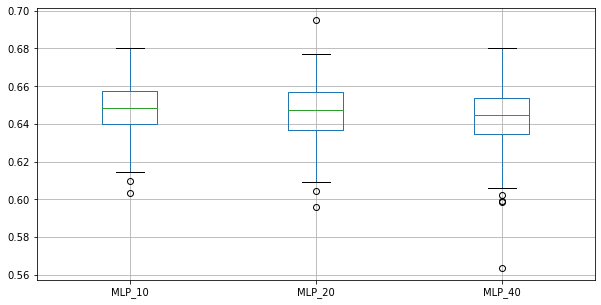

In [7]:
#3rd data pre-processing method

MLP_10_raw_f1_3 = [0.6473988439306357, 0.6511226252158895, 0.6510460251046025, 0.6257359125315392, 0.6666666666666666, 0.647746243739566, 0.6424870466321243, 0.6397306397306398, 0.6599832915622389, 0.6608391608391608, 0.673434856175973, 0.6570945945945946, 0.6725949878738885, 0.6605196982397319, 0.643846780766096, 0.6324237560192617, 0.6359143327841844, 0.6375838926174496, 0.6549520766773163, 0.6516666666666666, 0.6477272727272728, 0.6650205761316873, 0.6566455696202532, 0.6427406199021208, 0.6440397350993379, 0.6546080964685616, 0.6615646258503401, 0.6438035853468433, 0.653941908713693, 0.6347402597402596, 0.6351351351351351, 0.6792156862745098, 0.6706484641638225, 0.6557939914163091, 0.6575121163166397, 0.6431501230516816, 0.6448763250883393, 0.6595918367346938, 0.6417657045840407, 0.6313173156586579, 0.6313963573287076, 0.6666666666666667, 0.6272285251215559, 0.6565910999160369, 0.6449456975772765, 0.6723404255319149, 0.6535122336227309, 0.648323301805675, 0.6648745519713262, 0.6472060050041701, 0.6611706512778235, 0.6475878986099755, 0.6548387096774193, 0.6346992153443766, 0.6263157894736842, 0.6436041834271923, 0.6476030277544155, 0.6444444444444444, 0.6521739130434783, 0.6481334392374901, 0.6455284552845529, 0.6485623003194888, 0.6644573322286661, 0.6427990235964198, 0.645324347093513, 0.6451612903225806, 0.6637401229148376, 0.6633416458852868, 0.641025641025641, 0.6633744855967079, 0.6343537414965986, 0.6484312148028962, 0.6627218934911242, 0.6549707602339182, 0.6590351594439902, 0.6362153344208807, 0.6462809917355373, 0.6802374893977947, 0.6388657214345288, 0.6699346405228758, 0.6453726453726454, 0.6632390745501285, 0.648506151142355, 0.647746243739566, 0.645655877342419, 0.6408094435075886, 0.627831715210356, 0.6476360392506689, 0.6446280991735537, 0.6434359805510536, 0.6639276910435498, 0.6616791354945969, 0.6728033472803348, 0.6513213981244672, 0.657556270096463, 0.6579634464751958, 0.6644897959183674, 0.6588628762541806, 0.6565143824027072, 0.6311263972484952]
MLP_20_raw_f1_3 = [0.6622185154295246, 0.6619593998234775, 0.6511254019292604, 0.6280276816608996, 0.6540362438220759, 0.6644125105663568, 0.6320501342882721, 0.6595744680851063, 0.6605504587155963, 0.669001751313485, 0.659217877094972, 0.6605351170568561, 0.6717044500419815, 0.6604795050270689, 0.628099173553719, 0.6486941870261163, 0.6329787234042553, 0.6463512429831596, 0.6581673306772909, 0.6544546211490424, 0.6644628099173553, 0.6655405405405406, 0.6529605263157895, 0.6303501945525292, 0.649415692821369, 0.6497031382527565, 0.6643835616438356, 0.6399345335515548, 0.6456140350877193, 0.6547811993517018, 0.6429177268871925, 0.6750195771339077, 0.671353251318102, 0.6460481099656357, 0.6589595375722543, 0.6557093425605536, 0.6470588235294118, 0.6601941747572815, 0.6333615580016935, 0.6273858921161826, 0.6352357320099256, 0.6296006264682851, 0.6191304347826087, 0.6507806080525883, 0.6517412935323382, 0.6752136752136751, 0.6578073089700996, 0.6456692913385828, 0.6621735467565291, 0.6467576791808874, 0.6638225255972696, 0.6488294314381271, 0.6523235800344235, 0.660033167495854, 0.61991341991342, 0.6396624472573839, 0.6411815812337098, 0.6474190726159231, 0.6449399656946826, 0.6481178396072013, 0.6586826347305389, 0.6525974025974027, 0.6611706512778235, 0.6228373702422145, 0.6475878986099755, 0.6433333333333333, 0.6487889273356402, 0.6596091205211726, 0.6399302528334786, 0.6617038875103392, 0.6291161178509532, 0.6337914308811641, 0.6644407345575961, 0.6683630195080578, 0.6638584667228308, 0.6426174496644296, 0.6468222043443282, 0.6737184703010578, 0.6370896184560781, 0.6700593723494486, 0.6506024096385542, 0.6617038875103392, 0.6435555555555557, 0.648910411622276, 0.6404109589041096, 0.6510067114093959, 0.6272577996715928, 0.6585365853658536, 0.6442307692307692, 0.6339434276206323, 0.6755407653910149, 0.6476683937823835, 0.6661157024793389, 0.6358885017421603, 0.6728971962616823, 0.6549999999999999, 0.6621961441743504, 0.6700942587832047, 0.6445578231292517, 0.6324786324786325]
MLP_40_raw_f1_3 = [0.6325991189427312, 0.6446280991735537, 0.6540983606557376, 0.6302816901408451, 0.6501240694789081, 0.666092943201377, 0.6486486486486487, 0.643103448275862, 0.6666666666666666, 0.6660761736049601, 0.6655112651646448, 0.6554621848739496, 0.6723842195540308, 0.6600660066006601, 0.6460767946577629, 0.6452145214521452, 0.641025641025641, 0.6411092985318108, 0.6452648475120386, 0.6644682605111295, 0.6444805194805194, 0.6574898785425102, 0.6467165419783873, 0.6405867970660146, 0.6477732793522267, 0.6478405315614617, 0.661498708010336, 0.6422167889160555, 0.649260226283725, 0.6542688081149619, 0.6530264279624893, 0.680064308681672, 0.6603611349957007, 0.6442070665571076, 0.6552567237163816, 0.6505016722408026, 0.636595744680851, 0.6581415174765558, 0.6219512195121951, 0.6227848101265823, 0.6376811594202898, 0.6507258753202392, 0.6276505513146735, 0.647109577221743, 0.6544546211490424, 0.6684164479440071, 0.6574675324675324, 0.6505608283002589, 0.6545754328112119, 0.651924651924652, 0.665546218487395, 0.641025641025641, 0.6534140017286085, 0.6507936507936508, 0.6279069767441862, 0.6426116838487972, 0.6464995678478824, 0.6445012787723785, 0.6469594594594594, 0.6426174496644296, 0.6565400843881857, 0.6529605263157895, 0.6711749788672866, 0.6280851063829787, 0.6405337781484571, 0.6594863297431649, 0.6505190311418684, 0.6753022452504318, 0.6425567703952901, 0.6605809128630706, 0.6483790523690772, 0.647746243739566, 0.6666666666666666, 0.6601307189542484, 0.6677393403057119, 0.6355296080066722, 0.6342254663422546, 0.6694421315570359, 0.6233108108108107, 0.664957264957265, 0.6445733222866612, 0.6543313708999159, 0.6358078602620088, 0.6430921052631579, 0.6374570446735395, 0.6346623270951993, 0.6323296354992077, 0.6489459211732357, 0.6497959183673468, 0.6376569037656903, 0.6777133388566695, 0.6435385949696444, 0.6729131175468483, 0.6295681063122923, 0.6705783738474433, 0.6578730420445177, 0.6678260869565218, 0.6643952299829642, 0.6577301161751564, 0.6370494551550713]

MLP_10_BN_raw_f1_3 = [0.6634996041171813, 0.6444972288202692, 0.6640190627482128, 0.6284367635506677, 0.6625860749808723, 0.6616666666666666, 0.6348962336664105, 0.6387434554973822, 0.6516329704510109, 0.6567656765676567, 0.6794338051623647, 0.6587112171837708, 0.6541070082893745, 0.6525359576078729, 0.6367781155015197, 0.6364985163204748, 0.6473895582329317, 0.6614420062695925, 0.6517719568567026, 0.6466403162055335, 0.6543408360128616, 0.655223880597015, 0.6452599388379205, 0.6499215070643641, 0.6381724392041267, 0.6470588235294118, 0.6535742340926944, 0.6340361445783133, 0.6492851135407905, 0.6666666666666666, 0.6502866502866503, 0.6488549618320612, 0.6536050156739812, 0.6522744795682343, 0.6540284360189573, 0.6553945249597424, 0.6457187745483111, 0.6761006289308177, 0.6461538461538461, 0.6244057052297941, 0.6431924882629108, 0.6331877729257642, 0.6417197452229301, 0.6693679092382495, 0.6536964980544747, 0.6727122835943941, 0.6477611940298508, 0.661251015434606, 0.6462228870605834, 0.6566217287866773, 0.636650868878357, 0.6438152011922503, 0.6556639159789948, 0.6431312356101305, 0.6281833616298811, 0.6464, 0.6452648475120386, 0.6381909547738693, 0.6677265500794912, 0.6328358208955224, 0.6372934697088907, 0.6530612244897959, 0.6522075910147173, 0.6491092176607282, 0.6463512429831596, 0.6557645134914145, 0.6545741324921136, 0.675611681136543, 0.6283464566929133, 0.6483600305110603, 0.6452674897119342, 0.6481774960380348, 0.6688206785137318, 0.6683333333333334, 0.6681852695520122, 0.6246290801186942, 0.6364335126825519, 0.6582653817642697, 0.6142969363707776, 0.6697892271662763, 0.648689138576779, 0.6704270749395649, 0.6438569206842923, 0.6561264822134387, 0.632506004803843, 0.6543408360128616, 0.6314199395770392, 0.6661073825503356, 0.6424148606811145, 0.6504460665044608, 0.6525821596244132, 0.639344262295082, 0.677231025854879, 0.6097560975609757, 0.6666666666666666, 0.6671961874503575, 0.6661466458658346, 0.66030230708035, 0.675235646958012, 0.6617161716171617] 
MLP_20_BN_raw_f1_3 = [0.6505295007564297, 0.6300533943554538, 0.656763096168882, 0.610062893081761, 0.6366830639494028, 0.6491092176607282, 0.6375198728139905, 0.6528662420382166, 0.6386430678466076, 0.6650205761316873, 0.6661392405063292, 0.6432926829268294, 0.6542346542346542, 0.6461780929866036, 0.6400613967766693, 0.6121256391526663, 0.6645264847512039, 0.651685393258427, 0.6454545454545454, 0.6319702602230483, 0.6391437308868501, 0.656298600311042, 0.6044568245125347, 0.6386676321506155, 0.6431852986217458, 0.642453591606134, 0.6529318541996831, 0.6327272727272728, 0.6479550922213312, 0.6573426573426574, 0.6221498371335505, 0.6594761171032356, 0.6528332003192339, 0.6461780929866036, 0.6432311144353029, 0.6476043276661515, 0.6557120500782473, 0.6502127659574467, 0.6237393328161367, 0.6202036021926389, 0.6447669977081741, 0.6168782673637042, 0.6279809220985691, 0.6948590381426203, 0.6655817737998373, 0.6689536878216124, 0.6483679525222551, 0.6568867155664222, 0.6688154713940371, 0.6479313036690085, 0.650199203187251, 0.6301969365426696, 0.6741935483870968, 0.6246056782334386, 0.634315424610052, 0.6231772831926323, 0.6322378716744913, 0.651877133105802, 0.6517412935323382, 0.6091954022988506, 0.6435483870967742, 0.6486055776892431, 0.6467432950191571, 0.6464, 0.6499189627228524, 0.6286982248520709, 0.6548100242522231, 0.6481051817478731, 0.6430260047281323, 0.6602870813397129, 0.6545166402535658, 0.6357308584686775, 0.6532195500387897, 0.6494762288477035, 0.6613672496025438, 0.6397562833206398, 0.6459824980111376, 0.6768525592055005, 0.6284805091487669, 0.6429699842022117, 0.6458797327394209, 0.6097560975609756, 0.6561461794019934, 0.6528583264291633, 0.6148092744951383, 0.6573426573426574, 0.6442307692307692, 0.6233974358974359, 0.6487367563162184, 0.6535433070866142, 0.6620262954369683, 0.6525285481239803, 0.6634382566585957, 0.6370135027799841, 0.6613672496025438, 0.6390101892285298, 0.6506410256410255, 0.6747181964573269, 0.6477272727272728, 0.6465927099841521]
MLP_40_BN_raw_f1_3 = [0.6464, 0.6333333333333334, 0.609865470852018, 0.6264682850430697, 0.6676946800308403, 0.6381679389312978, 0.6388682055100522, 0.6353467561521254, 0.6201201201201201, 0.6412955465587045, 0.6597110754414125, 0.6565495207667732, 0.6477187733732237, 0.6348973607038122, 0.6307572209211554, 0.6596434359805511, 0.6398104265402843, 0.6460587326120556, 0.6389324960753532, 0.6399383191981497, 0.6281368821292775, 0.6605504587155964, 0.6411258795934324, 0.6422447388932191, 0.6450617283950617, 0.6294027565084226, 0.641025641025641, 0.6409266409266409, 0.6446826051112943, 0.6323076923076922, 0.645643153526971, 0.6489675516224189, 0.6346456692913385, 0.6395080707148347, 0.6337509211495947, 0.6341085271317829, 0.6291291291291291, 0.6650602409638554, 0.6342229199372056, 0.6107331821617535, 0.6201923076923076, 0.633457249070632, 0.6312292358803987, 0.6535122336227309, 0.6367157242447715, 0.6650041562759766, 0.6511627906976744, 0.6477541371158393, 0.6732510288065844, 0.64576802507837, 0.6378018318068277, 0.6264323911382735, 0.671604938271605, 0.6305732484076433, 0.5637480798771121, 0.6244274809160305, 0.6164179104477612, 0.6473594548551959, 0.6474358974358974, 0.6243050039714058, 0.6307808946171343, 0.6410054988216811, 0.6086330935251799, 0.6456692913385828, 0.6315789473684211, 0.6345565749235474, 0.6486042692939245, 0.6604572396274344, 0.6329317269076306, 0.6347305389221557, 0.641897233201581, 0.6345139412207988, 0.6515624999999999, 0.6527777777777778, 0.6318926974664679, 0.6215022091310751, 0.6370023419203747, 0.6307356154406409, 0.6414803392444102, 0.6492709132770529, 0.6394557823129252, 0.6402439024390244, 0.6515912897822446, 0.6557645134914145, 0.6373098478783027, 0.6563944530046226, 0.6220532319391634, 0.6715566422167889, 0.6465583913379738, 0.6400613967766693, 0.6364942528735633, 0.6459016393442623, 0.650199203187251, 0.6279257465698144, 0.6730007917656373, 0.6494117647058824, 0.6519083969465648, 0.6573859242072698, 0.6456820016142051, 0.6148359486447933]

MLP_10_ABN_raw_f1_3 = [0.6281276962899052, 0.6536170212765957, 0.6353322528363047, 0.6298433635614179, 0.6567164179104479, 0.6386266094420601, 0.6346801346801347, 0.6422018348623854, 0.6566164154103853, 0.6289517470881862, 0.6558497011101623, 0.6350931677018633, 0.6616915422885572, 0.6376360808709175, 0.6386418755052546, 0.640677966101695, 0.6338983050847458, 0.6346456692913385, 0.6561514195583596, 0.6491969568892646, 0.6592, 0.6487317448116833, 0.6413632842757553, 0.6481632653061226, 0.633906633906634, 0.6384364820846905, 0.6409395973154361, 0.6410054988216811, 0.6325660699062233, 0.6512, 0.6460767946577629, 0.6561762391817467, 0.6291230893000804, 0.6252945797329142, 0.6518282988871223, 0.6440957886044592, 0.6411815812337098, 0.6602564102564104, 0.6429752066115703, 0.603299293008641, 0.6266891891891891, 0.6574450772986167, 0.6333907056798623, 0.6507806080525883, 0.6586151368760065, 0.6589403973509933, 0.6666666666666667, 0.6441251056635672, 0.6788511749347258, 0.628757108042242, 0.652493867538839, 0.6337914308811641, 0.6527893422148209, 0.63859649122807, 0.6186234817813766, 0.6320907617504052, 0.639141205615194, 0.6505823627287854, 0.6430976430976432, 0.6328358208955224, 0.6446826051112943, 0.6435070306038048, 0.6440677966101696, 0.6398104265402843, 0.6425120772946861, 0.627450980392157, 0.6453726453726454, 0.662809917355372, 0.6391270459859703, 0.6532399299474606, 0.6509671993271657, 0.652926628194559, 0.6497959183673468, 0.6568867155664222, 0.650199203187251, 0.6300914380714879, 0.6375617792421746, 0.6733167082294265, 0.6340668296658516, 0.6678082191780822, 0.6367218282111898, 0.66011466011466, 0.6414762741652021, 0.6476987447698745, 0.6252072968490879, 0.6503164556962027, 0.6194968553459119, 0.6566104702750665, 0.6500402252614642, 0.6437346437346438, 0.6661417322834645, 0.6341045415595544, 0.6589211618257261, 0.6240538267451641, 0.6476642913697546, 0.6671987230646449, 0.6633825944170771, 0.6534325889164599, 0.6517412935323382, 0.6535836177474403]
MLP_20_ABN_raw_f1_3 = [0.6576728499156829, 0.6369327073552427, 0.5958747135217725, 0.6278101582014987, 0.6504065040650406, 0.6572143452877398, 0.6372549019607843, 0.6525630593978844, 0.6549118387909321, 0.625314333612741, 0.6655683690280065, 0.6699588477366256, 0.6520640269587195, 0.6291959406713505, 0.6344712739383847, 0.6327212020033389, 0.6554903604358759, 0.6302729528535981, 0.6426174496644296, 0.6347490347490348, 0.6394884092725819, 0.6704637917005696, 0.6381987577639752, 0.6395080707148347, 0.6569814366424537, 0.641852770885029, 0.6338983050847458, 0.6295081967213115, 0.627147766323024, 0.6525781910397294, 0.6376811594202898, 0.6573998364677024, 0.6545138888888888, 0.6464315012305167, 0.6575576430401366, 0.6454248366013072, 0.6470588235294118, 0.6567411083540116, 0.6432748538011697, 0.6201804757998359, 0.6348936170212766, 0.6386554621848739, 0.6272189349112427, 0.6491372226787181, 0.6519148936170213, 0.6494401378122309, 0.6475279106858054, 0.6421861656703672, 0.6733837111670864, 0.6314102564102565, 0.6409202958093672, 0.6476642913697546, 0.6109467455621301, 0.6312236286919832, 0.6220338983050847, 0.6266447368421052, 0.6355633802816902, 0.6420600858369099, 0.6497545008183305, 0.6146496815286624, 0.6331409727947239, 0.6471981057616417, 0.6541903986981286, 0.6460767946577629, 0.6414141414141413, 0.6500415627597673, 0.6689895470383276, 0.6629213483146067, 0.6390532544378699, 0.6114942528735632, 0.6503667481662592, 0.6312236286919832, 0.6332794830371568, 0.6568386568386568, 0.672, 0.6327212020033389, 0.632952691680261, 0.6549349655700076, 0.6299081035923142, 0.6381260096930533, 0.6465798045602607, 0.6384676775738228, 0.6309314586994728, 0.6317485898468976, 0.642495784148398, 0.6597938144329897, 0.6403361344537815, 0.663716814159292, 0.6421725239616614, 0.64, 0.6721311475409836, 0.6463104325699747, 0.6442721791559001, 0.6149957877000842, 0.6743232157506153, 0.6573311367380561, 0.6661514683153014, 0.6520210896309315, 0.640901771336554, 0.6331309627059843]
MLP_40_ABN_raw_f1_3 = [0.6256239600665557, 0.6356453028972784, 0.6276223776223776, 0.622107969151671, 0.6645004061738424, 0.6513213981244672, 0.6493083807973963, 0.6377510040160642, 0.6570281124497991, 0.6621276595744681, 0.6484641638225256, 0.6518010291595198, 0.6508585445625511, 0.64797507788162, 0.6336477987421385, 0.6431570109151974, 0.6528138528138527, 0.6353730092204527, 0.6396103896103895, 0.6369426751592356, 0.6387771520514883, 0.6610738255033557, 0.6446280991735537, 0.6481632653061226, 0.6404682274247492, 0.6317485898468976, 0.6570702794242167, 0.6402027027027029, 0.5983739837398374, 0.652926628194559, 0.6307320997586484, 0.6549239391513211, 0.6505808757819482, 0.618032786885246, 0.6580756013745704, 0.6331309627059843, 0.6543313708999159, 0.6666666666666665, 0.6426174496644296, 0.6218487394957983, 0.6253021756647865, 0.6414141414141413, 0.6087719298245614, 0.6545153272576636, 0.647887323943662, 0.6364414029084687, 0.6603624901497243, 0.6319385140905209, 0.6544821583986075, 0.6442953020134228, 0.6541737649063032, 0.6530264279624893, 0.6525630593978844, 0.6019736842105264, 0.6194995685936152, 0.6247906197654941, 0.6308724832214765, 0.6454465075154731, 0.6504460665044608, 0.6439024390243903, 0.6196692776327241, 0.6217697729052467, 0.6394557823129251, 0.6377049180327868, 0.644891122278057, 0.6478405315614617, 0.6534979423868313, 0.6593959731543625, 0.6399331662489558, 0.6418039895923676, 0.6383333333333333, 0.6322463768115942, 0.6650326797385621, 0.6694772344013491, 0.6655376799322608, 0.6236905721192586, 0.626311541565779, 0.632991318074191, 0.6061068702290076, 0.5989304812834225, 0.636650868878357, 0.645602049530316, 0.6492411467116358, 0.6386418755052546, 0.633861551292744, 0.6291946308724833, 0.6362153344208807, 0.6501706484641638, 0.6181229773462783, 0.647108130762783, 0.6748566748566749, 0.6261022927689595, 0.6426174496644296, 0.6122778675282714, 0.6715566422167889, 0.660033167495854, 0.635, 0.6612111292962357, 0.647506339814032, 0.6263286999182338]

total_10_raw = MLP_10_raw_f1_3+MLP_10_BN_raw_f1_3+MLP_10_ABN_raw_f1_3
total_20_raw = MLP_20_raw_f1_3+MLP_20_BN_raw_f1_3+MLP_20_ABN_raw_f1_3
total_40_raw = MLP_40_raw_f1_3+MLP_40_BN_raw_f1_3+MLP_40_ABN_raw_f1_3

mlp_raw_f1 = {'MLP_10':total_10_raw, 'MLP_20':total_20_raw, 'MLP_40':total_40_raw}
mlp_raw_f1_df_3 = pd.DataFrame.from_dict(mlp_raw_f1)
boxplot = mlp_raw_f1_df_3.boxplot(column=['MLP_10', 'MLP_20', 'MLP_40'], figsize=(10,5))

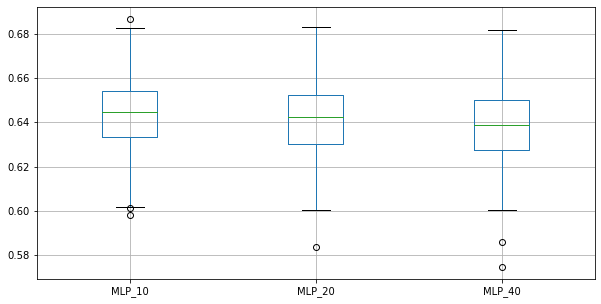

In [8]:
#4th data pre-processing method

MLP_10_raw_f1_4 = [0.6492232215862633, 0.6523972602739727, 0.6540049545829894, 0.6201804757998359, 0.6699999999999999, 0.6448979591836735, 0.6345811051693405, 0.6445733222866612, 0.6610025488530162, 0.6642857142857141, 0.6505246166263117, 0.6568867155664222, 0.6767515923566879, 0.6617886178861789, 0.6430921052631579, 0.6347402597402596, 0.6318493150684931, 0.6515028432168969, 0.6495589414595028, 0.6672240802675585, 0.6503937007874016, 0.6627810158201499, 0.6536833192209991, 0.6444805194805194, 0.6450567260940032, 0.6412478336221837, 0.6622296173044925, 0.6515763945028294, 0.6509274873524451, 0.6578730420445177, 0.647010647010647, 0.6746031746031746, 0.6621621621621621, 0.6366666666666667, 0.6574225122349103, 0.6521739130434783, 0.6541903986981286, 0.6522088353413655, 0.6515397082658023, 0.6320201173512153, 0.6406995230524644, 0.6563769293257514, 0.6339434276206323, 0.6650205761316873, 0.638912489379779, 0.6603119584055458, 0.6570212765957447, 0.6448445171849427, 0.6742160278745645, 0.6568144499178983, 0.6598812553011026, 0.6528583264291633, 0.6580645161290323, 0.6490179333902648, 0.6205733558178753, 0.637123745819398, 0.6473594548551959, 0.6529209621993127, 0.6439578264395782, 0.6443381180223287, 0.6521739130434783, 0.6319758672699849, 0.6628194558944766, 0.6468699839486357, 0.6372712146422629, 0.6581849024597116, 0.6472727272727272, 0.664983164983165, 0.6454935622317596, 0.6542372881355931, 0.6538139145012574, 0.6443172526573999, 0.6649484536082474, 0.6464995678478824, 0.6733500417710945, 0.6381578947368421, 0.6473895582329317, 0.6608419380460683, 0.6302729528535981, 0.6695957820738137, 0.6362909672262189, 0.6631853785900783, 0.6426735218508998, 0.641914191419142, 0.6393989983305509, 0.6396103896103895, 0.6288573811509592, 0.6553267681289168, 0.6557107641741989, 0.6430338004946413, 0.6824877250409166, 0.6432748538011697, 0.660655737704918, 0.638655462184874, 0.6865177832919769, 0.6599664991624791, 0.6737704918032787, 0.6661045531197302, 0.6621735467565291, 0.6245674740484429]
MLP_20_raw_f1_4 = [0.6523605150214592, 0.6522864538395169, 0.6450540315876975, 0.6365914786967418, 0.6506024096385542, 0.6457627118644068, 0.656172328086164, 0.6602564102564104, 0.6605042016806724, 0.6444833625218914, 0.661883408071749, 0.6589211618257261, 0.6683168316831684, 0.6565656565656565, 0.6445497630331752, 0.6445880452342488, 0.6156491831470335, 0.64891846921797, 0.6366559485530547, 0.6677367576243981, 0.6455906821963395, 0.6645519429024583, 0.653968253968254, 0.6447473937449879, 0.6493055555555556, 0.6565656565656565, 0.6711074104912573, 0.6446826051112943, 0.6385846672283068, 0.647109577221743, 0.6493055555555556, 0.6698717948717948, 0.6678321678321678, 0.6491969568892646, 0.665024630541872, 0.6564364876385336, 0.6457990115321252, 0.6548223350253807, 0.6478405315614617, 0.6372881355932204, 0.6448979591836735, 0.6543704891740177, 0.6231404958677687, 0.6575809199318567, 0.653941908713693, 0.6762956669498725, 0.6510500807754442, 0.6349480968858131, 0.6649305555555556, 0.6504854368932038, 0.6538796861377507, 0.6530944625407166, 0.6615646258503401, 0.6441881100266192, 0.6227347611202635, 0.6358475263584752, 0.6464315012305167, 0.6463104325699747, 0.6460767946577629, 0.6479338842975206, 0.6499567847882455, 0.6456820016142051, 0.6567164179104479, 0.6436781609195402, 0.6396761133603238, 0.6505823627287854, 0.6615384615384615, 0.6721311475409836, 0.6380471380471381, 0.6429725363489499, 0.6324786324786325, 0.647985989492119, 0.6506238859180035, 0.6733167082294265, 0.656934306569343, 0.6258169934640523, 0.6385052802599512, 0.67003367003367, 0.6403225806451613, 0.6711185308848081, 0.639141205615194, 0.6585577758470895, 0.6432246998284734, 0.6321155480033984, 0.6461794019933556, 0.6389830508474575, 0.6314935064935066, 0.6624888093106535, 0.6412337662337662, 0.6400651465798046, 0.6666666666666666, 0.6526138279932546, 0.6649484536082474, 0.6313993174061434, 0.6755407653910149, 0.6449399656946826, 0.6597760551248923, 0.6616033755274261, 0.6525063721325404, 0.6468222043443282]
MLP_40_raw_f1_4 = [0.6464826357969724, 0.6615776081424937, 0.6538152610441766, 0.6353543979504697, 0.6429780033840948, 0.656093489148581, 0.6237712243074173, 0.6502127659574467, 0.646551724137931, 0.654109589041096, 0.6733837111670864, 0.6569965870307167, 0.6737880032867707, 0.6578730420445177, 0.6419354838709678, 0.6320132013201321, 0.6129032258064516, 0.6493723849372385, 0.6439873417721519, 0.6604255319148936, 0.6462530217566478, 0.6588432523051131, 0.6451091350040421, 0.6498371335504887, 0.6452131938857603, 0.6476190476190475, 0.66383701188455, 0.6438698915763135, 0.6382978723404255, 0.6473509933774834, 0.6441251056635672, 0.6720516962843296, 0.6582914572864322, 0.6540049545829894, 0.6533333333333333, 0.6494401378122309, 0.6464471403812826, 0.6490939044481054, 0.6441821247892076, 0.6232006773920407, 0.6416666666666668, 0.6545454545454545, 0.6275862068965518, 0.6552020636285469, 0.6459948320413437, 0.677056277056277, 0.6666666666666666, 0.6352941176470588, 0.6696349065004452, 0.6555462885738116, 0.6627218934911242, 0.6399331662489558, 0.658456486042693, 0.6258992805755396, 0.6089150546677881, 0.640728476821192, 0.6427962489343563, 0.6364428945074107, 0.6552567237163816, 0.6444616576297444, 0.6380873866446827, 0.6550868486352358, 0.6611157368859284, 0.6306001690617076, 0.6374172185430463, 0.6571428571428571, 0.6459627329192547, 0.6666666666666666, 0.6491969568892646, 0.6560509554140128, 0.6359761295822678, 0.6425636811832375, 0.6572379367720467, 0.6472148541114058, 0.6621621621621621, 0.6314893617021275, 0.6465306122448979, 0.6672117743254293, 0.634946677604594, 0.6543859649122806, 0.6414473684210527, 0.661498708010336, 0.645273200346921, 0.6368159203980099, 0.6334763948497855, 0.6467661691542288, 0.6340668296658516, 0.6630920464700626, 0.6323296354992077, 0.6430868167202572, 0.6818565400843881, 0.6523235800344235, 0.6666666666666667, 0.6357388316151202, 0.675, 0.6582914572864322, 0.6629303442754203, 0.66553480475382, 0.6520210896309315, 0.634865568083261]

MLP_10_BN_raw_f1_4 = [0.6247787610619469, 0.649737302977233, 0.6277873070325901, 0.6245614035087721, 0.6526315789473685, 0.6367634124890061, 0.6186131386861314, 0.6334459459459459, 0.6237113402061856, 0.6520210896309315, 0.6661002548853016, 0.6357142857142857, 0.6416083916083916, 0.6353543979504697, 0.621043627031651, 0.611065235342692, 0.6040744021257751, 0.6182432432432432, 0.6318407960199005, 0.6626506024096386, 0.6291000841042892, 0.631492168178071, 0.6386986301369864, 0.6381578947368421, 0.6310344827586207, 0.6333615580016935, 0.6428571428571429, 0.6189213085764809, 0.6144366197183099, 0.6378565254969749, 0.6201298701298701, 0.6557093425605536, 0.6566637246248896, 0.6356720202874049, 0.6525063721325404, 0.6229221347331584, 0.6300429184549355, 0.6467576791808874, 0.6161616161616161, 0.6071741032370954, 0.6300675675675677, 0.630755864465682, 0.6121707538601271, 0.6464646464646464, 0.640625, 0.650088809946714, 0.6431501230516816, 0.6188034188034188, 0.6487935656836462, 0.6135593220338984, 0.6390845070422534, 0.6428571428571428, 0.6422628951747088, 0.6446700507614214, 0.6018018018018018, 0.6337308347529813, 0.6216696269982238, 0.6377325066430469, 0.6313932980599646, 0.6308492201039861, 0.640728476821192, 0.6175732217573222, 0.6503378378378379, 0.6195462478184991, 0.6290748898678414, 0.6278870829769032, 0.6419753086419753, 0.6404109589041096, 0.6308610400682011, 0.6370896184560781, 0.6430423509075194, 0.6252129471890971, 0.641409691629956, 0.6272727272727272, 0.649616368286445, 0.6046511627906976, 0.6252129471890971, 0.6554338668913227, 0.615111111111111, 0.6619964973730298, 0.6253186066270179, 0.6333333333333334, 0.63710407239819, 0.61991341991342, 0.6122792262405383, 0.6201550387596899, 0.6201680672268908, 0.6504504504504505, 0.6275805119735757, 0.616593886462882, 0.6549118387909321, 0.6197424892703863, 0.6484581497797357, 0.6167097329888027, 0.6603611349957007, 0.6445414847161572, 0.6547921967769297, 0.6274179983179141, 0.634920634920635, 0.5980479148181012]
MLP_20_BN_raw_f1_4 = [0.6039016115351994, 0.64, 0.6343537414965986, 0.6176218990590249, 0.6327782646801051, 0.6155157715260017, 0.6260869565217391, 0.6473594548551959, 0.632034632034632, 0.6448683015440508, 0.6424870466321243, 0.6436170212765957, 0.6540120793787747, 0.6303972366148533, 0.6312346688470972, 0.6226568867155665, 0.6131650135256989, 0.6222961730449251, 0.6324642556770395, 0.6276150627615062, 0.640677966101695, 0.6497461928934011, 0.6202749140893471, 0.6361323155216284, 0.6204013377926422, 0.6243386243386243, 0.6337157987643424, 0.6253229974160206, 0.6229802513464991, 0.6163090128755364, 0.6245674740484429, 0.6463314097279472, 0.6381818181818183, 0.6286201022146508, 0.6467661691542288, 0.62478184991274, 0.6226583407671721, 0.6442388561816652, 0.6186291739894552, 0.6114864864864864, 0.6165540540540542, 0.6374570446735395, 0.6030881017257039, 0.6355785837651122, 0.6157849089332176, 0.6521344232515894, 0.6356720202874049, 0.6215753424657533, 0.6550458715596331, 0.6171529619805481, 0.6470078057241977, 0.6324786324786325, 0.64891846921797, 0.6176991150442477, 0.5834797891036907, 0.6211072664359861, 0.6205641492265697, 0.6286201022146508, 0.6248896734333627, 0.6142384105960266, 0.6281138790035585, 0.6301145662847791, 0.640677966101695, 0.6033129904097646, 0.6163090128755364, 0.6163410301953819, 0.6427931960608774, 0.6477174849267873, 0.6203208556149733, 0.6362038664323374, 0.6298533218291631, 0.6102877070619006, 0.6375321336760924, 0.6368421052631579, 0.6486486486486487, 0.6183074265975821, 0.6183333333333334, 0.6491969568892646, 0.6181491464510332, 0.6608391608391608, 0.6253186066270179, 0.6351706036745407, 0.6248880931065353, 0.61991341991342, 0.6211072664359861, 0.6229221347331584, 0.608767576509512, 0.6488888888888888, 0.6386986301369864, 0.6153846153846154, 0.6689895470383276, 0.6327586206896552, 0.6343612334801763, 0.6091458153580673, 0.6580534022394487, 0.6482758620689655, 0.6631299734748011, 0.6331569664902997, 0.6160635481023831, 0.6280701754385966]
MLP_40_BN_raw_f1_4 = [0.6251082251082252, 0.6416443252904379, 0.6191304347826087, 0.6149732620320857, 0.650088809946714, 0.6185383244206774, 0.6101083032490975, 0.6377816291161178, 0.6129317980513729, 0.6456692913385828, 0.6608996539792387, 0.6306465899025687, 0.6361365528726062, 0.6289631533847471, 0.6279461279461279, 0.634315424610052, 0.6304909560723514, 0.6173254835996635, 0.6197874080130825, 0.6307947019867549, 0.6155172413793103, 0.6353322528363047, 0.6354515050167224, 0.6256499133448873, 0.6241258741258742, 0.6257562662057045, 0.6287683031869078, 0.6289631533847471, 0.6231505657093124, 0.6510822510822512, 0.6373815676141257, 0.6497545008183305, 0.6341463414634146, 0.6258620689655172, 0.6230975828111012, 0.6352148272957036, 0.6201550387596899, 0.6338514680483591, 0.6233333333333332, 0.600865800865801, 0.6174273858921162, 0.634920634920635, 0.6131650135256989, 0.6321243523316062, 0.6206896551724138, 0.6406926406926408, 0.6293706293706294, 0.6215978928884986, 0.6569217540842649, 0.6235807860262009, 0.6334208223972004, 0.6255355612682091, 0.6341880341880342, 0.6190476190476191, 0.6001796945193172, 0.6277732128184059, 0.6144144144144144, 0.6236933797909409, 0.6319444444444445, 0.6143682906688687, 0.644524236983842, 0.6441251056635672, 0.6388415672913118, 0.6049700085689802, 0.6041666666666667, 0.6221441124780317, 0.6482635796972395, 0.6544821583986075, 0.624014022787029, 0.6509598603839442, 0.6144975288303131, 0.6209887250650477, 0.6352313167259787, 0.6442141623488774, 0.6552901023890785, 0.6139455782312925, 0.6336965632858341, 0.6420168067226891, 0.611625947767481, 0.6451033243486073, 0.6050566695727987, 0.6136986301369862, 0.6206896551724137, 0.6108714408973253, 0.6101398601398601, 0.6124893071000856, 0.6153846153846154, 0.6412639405204461, 0.6306769494430163, 0.6333907056798623, 0.6569965870307167, 0.6230088495575221, 0.6284246575342466, 0.6163522012578616, 0.6536758193091231, 0.6428571428571428, 0.6563039723661485, 0.6295620437956203, 0.6247848537005163, 0.6081447963800904]

MLP_10_ABN_raw_f1_4 = [0.6447257383966245, 0.6633581472291149, 0.63544106167057, 0.6176470588235294, 0.6590538336052202, 0.6552020636285469, 0.6434634974533108, 0.6511987625676721, 0.6396761133603238, 0.6394671107410492, 0.6710634789777411, 0.6412337662337662, 0.66613290632506, 0.6446280991735537, 0.6267071320182094, 0.6357388316151202, 0.6399331662489558, 0.6401906274821286, 0.6602409638554216, 0.6490384615384615, 0.651968503937008, 0.6559485530546623, 0.6519607843137255, 0.6450079239302695, 0.6384313725490196, 0.6488740617180985, 0.6612244897959184, 0.6484312148028962, 0.635, 0.6536267318663406, 0.6521035598705502, 0.6553059643687064, 0.6601941747572816, 0.6466287571080422, 0.6570972886762361, 0.6528925619834711, 0.633276740237691, 0.6571654790182105, 0.6365105008077545, 0.610062893081761, 0.6223880597014925, 0.647887323943662, 0.6151288445552785, 0.6011560693641619, 0.6524148851939826, 0.6518391787852865, 0.6540284360189573, 0.6469093988145639, 0.6632653061224489, 0.6483333333333333, 0.6575107296137339, 0.6436597110754414, 0.6632653061224489, 0.6392769104354972, 0.6052855924978687, 0.6283048211508554, 0.6573541495480689, 0.6295025728987994, 0.6394671107410492, 0.6334693877551021, 0.6365054602184087, 0.6525974025974027, 0.6492478226444973, 0.6280193236714976, 0.6401354784081288, 0.6331658291457287, 0.6631944444444444, 0.6613290632506006, 0.6302931596091206, 0.652926628194559, 0.6532582461786003, 0.6306769494430163, 0.634710743801653, 0.6536502546689305, 0.6644682605111295, 0.6388657214345288, 0.6213292117465224, 0.6785425101214574, 0.6106399383191982, 0.664561957379637, 0.6402486402486401, 0.6477935054121565, 0.6400709219858157, 0.6518883415435139, 0.6214689265536725, 0.6451612903225806, 0.6258714175058095, 0.664944013781223, 0.6432000000000001, 0.6332537788385044, 0.6476642913697546, 0.6523605150214592, 0.6547231270358306, 0.6394671107410492, 0.6693613581244947, 0.660033167495854, 0.6644844517184942, 0.6694701429772918, 0.6601466992665037, 0.6462530217566478]
MLP_20_ABN_raw_f1_4 = [0.6319218241042346, 0.6446568201563858, 0.6431372549019608, 0.6168831168831168, 0.6666666666666667, 0.6677966101694914, 0.6395759717314489, 0.6583747927031509, 0.6610597140454163, 0.6173469387755102, 0.6588602654176424, 0.6486928104575164, 0.6473988439306357, 0.6499162479061976, 0.6357504215851602, 0.6363636363636365, 0.626057529610829, 0.6265060240963856, 0.632279534109817, 0.6580436540016168, 0.6252909231962761, 0.6581265012009607, 0.630071599045346, 0.635599694423224, 0.6411716842961758, 0.6309314586994728, 0.6511226252158895, 0.6283891547049443, 0.6189624329159212, 0.634584013050571, 0.6191950464396284, 0.6682316118935837, 0.6542372881355931, 0.6431501230516816, 0.6601941747572815, 0.6469622331691297, 0.6325350949628407, 0.6589506172839507, 0.6392092257001648, 0.608767576509512, 0.6292134831460674, 0.6335118592195867, 0.634946677604594, 0.6563573883161512, 0.6498316498316498, 0.6616541353383458, 0.6655231560891939, 0.6399331662489558, 0.6631944444444444, 0.6278101582014987, 0.6386687797147385, 0.6458157227387996, 0.6572847682119205, 0.6396624472573839, 0.6001648804616653, 0.6359060402684564, 0.6463815789473684, 0.6354978354978356, 0.6493083807973963, 0.6296603148301574, 0.6390243902439025, 0.641185647425897, 0.6523125996810207, 0.6361365528726062, 0.6373983739837398, 0.6384814495254529, 0.6582491582491583, 0.6521374685666388, 0.6503164556962027, 0.6407613005551149, 0.6424625098658249, 0.6388163620539599, 0.6502127659574467, 0.6447811447811448, 0.6609105180533753, 0.6288819875776397, 0.6052631578947368, 0.6566491359879789, 0.6425636811832375, 0.6655405405405406, 0.6310756972111553, 0.6394439617723718, 0.636755823986195, 0.6385135135135136, 0.6452145214521452, 0.643265306122449, 0.6234567901234568, 0.6526845637583893, 0.6343402225755167, 0.6328059950041632, 0.6638725901089689, 0.6283783783783784, 0.6475409836065573, 0.6219081272084805, 0.671451355661882, 0.6832092638544252, 0.6506584043377226, 0.6624704956726988, 0.6540673788003287, 0.6441251056635672]
MLP_40_ABN_raw_f1_4 = [0.6272806255430061, 0.6362869198312237, 0.6333878887070377, 0.6088464874241111, 0.6447811447811448, 0.6409395973154361, 0.6374896779521056, 0.6377759607522485, 0.6530958439355387, 0.6323777403035413, 0.666092943201377, 0.6368715083798883, 0.6527050610820243, 0.6379453189726595, 0.6184926184926185, 0.6153846153846153, 0.6108786610878661, 0.6399345335515548, 0.6285714285714287, 0.6359375, 0.65, 0.6514657980456026, 0.6360601001669448, 0.6383319967923015, 0.6301131418624892, 0.6396694214876033, 0.6461538461538462, 0.6335504885993485, 0.622673434856176, 0.6391752577319587, 0.6317626527050612, 0.6393939393939395, 0.6596263200649878, 0.5748031496062992, 0.6456195737963694, 0.6468646864686469, 0.642622950819672, 0.6655974338412189, 0.6347305389221558, 0.613747954173486, 0.6206896551724138, 0.6463022508038585, 0.6215277777777778, 0.6386292834890965, 0.6380165289256198, 0.6485539000876425, 0.657695542472666, 0.6348684210526315, 0.6494661921708186, 0.6456692913385828, 0.6541737649063032, 0.6559865092748736, 0.6595918367346938, 0.6446700507614214, 0.6254355400696864, 0.618657937806874, 0.6405990016638935, 0.6458874458874458, 0.6416040100250626, 0.6016504126031508, 0.6413570274636511, 0.6393442622950819, 0.63249348392702, 0.6439024390243903, 0.6256410256410257, 0.6352357320099256, 0.6273584905660378, 0.6650205761316873, 0.6380873866446827, 0.6382636655948554, 0.6231546231546231, 0.6294754371357202, 0.641313742437338, 0.6666666666666667, 0.5860749808722264, 0.6245954692556634, 0.619396903015485, 0.656, 0.6388206388206388, 0.6576728499156829, 0.6183150183150183, 0.6559048428207307, 0.6454935622317596, 0.6002906976744187, 0.6334164588528679, 0.6495016611295681, 0.6408566721581548, 0.6602620087336245, 0.6533665835411471, 0.6222222222222221, 0.6671999999999999, 0.638912489379779, 0.6416382252559727, 0.6066115702479338, 0.6632739609838846, 0.6482534524776605, 0.6639741518578354, 0.6489726027397261, 0.6364372469635627, 0.6391231028667792]

total_10_raw = MLP_10_raw_f1_4+MLP_10_BN_raw_f1_4+MLP_10_ABN_raw_f1_4
total_20_raw = MLP_20_raw_f1_4+MLP_20_BN_raw_f1_4+MLP_20_ABN_raw_f1_4
total_40_raw = MLP_40_raw_f1_4+MLP_40_BN_raw_f1_4+MLP_40_ABN_raw_f1_4

mlp_raw_f1 = {'MLP_10':total_10_raw, 'MLP_20':total_20_raw, 'MLP_40':total_40_raw}
mlp_raw_f1_df_4 = pd.DataFrame.from_dict(mlp_raw_f1)
boxplot = mlp_raw_f1_df_4.boxplot(column=['MLP_10', 'MLP_20', 'MLP_40'], figsize=(10,5))

(0.52, 0.7)

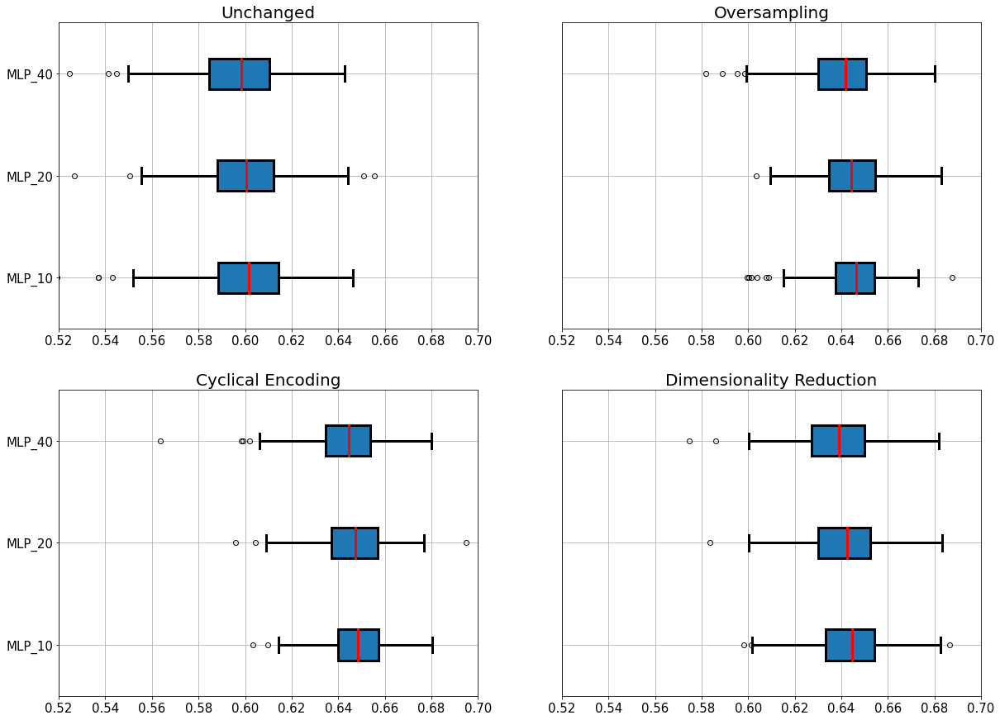

In [9]:
import matplotlib.pyplot as plt

boxprops = dict(linestyle='-', linewidth=3, color='k')
medianprops = dict(linestyle='-', linewidth=3, color='r')
whiskerprops = dict(linestyle='-', linewidth=3, color='k')
capprops = dict(linestyle='-', linewidth=3, color='k')
flierprops = dict(linewidth=3, color='k')
fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(20,15))

b1= mlp_raw_f1_df.boxplot(ax=axes[0,0], fontsize=15, vert=False, patch_artist=True, medianprops=medianprops, boxprops=boxprops, whiskerprops=whiskerprops, capprops=capprops,flierprops=flierprops)
b2= mlp_raw_f1_df_2.boxplot(ax=axes[0,1], fontsize=15, vert=False, patch_artist=True, medianprops=medianprops, boxprops=boxprops, whiskerprops=whiskerprops, capprops=capprops,flierprops=flierprops)
b3 = mlp_raw_f1_df_3.boxplot(ax=axes[1,0],fontsize=15, vert=False, patch_artist=True, medianprops=medianprops, boxprops=boxprops, whiskerprops=whiskerprops, capprops=capprops,flierprops=flierprops)
b4 = mlp_raw_f1_df_4.boxplot(ax=axes[1,1], fontsize=15, vert=False, patch_artist=True, medianprops=medianprops, boxprops=boxprops, whiskerprops=whiskerprops, capprops=capprops,flierprops=flierprops)

b1.set_title('Unchanged', fontsize=20)
b2.set_title('Oversampling', fontsize=20)
b3.set_title('Cyclical Encoding', fontsize=20)
b4.set_title('Dimensionality Reduction', fontsize=20)

b2.tick_params(axis='y', which='both', left=False, labelleft=False)
b4.tick_params(axis='y', which='both', left=False, labelleft=False)

b1.set_xlim([0.52,0.7])
b2.set_xlim([0.52,0.7])
b3.set_xlim([0.52,0.7])
b4.set_xlim([0.52,0.7])

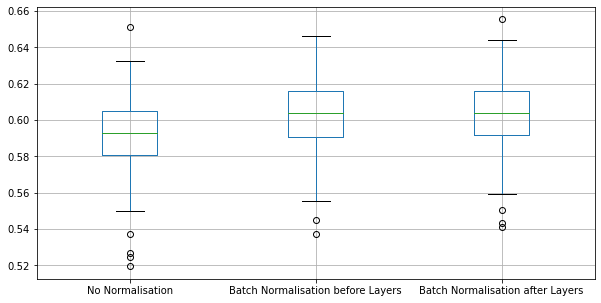

In [15]:
#Methods = ['No Normalisation', 'Batch Normalisation before Layers', 'Batch Normalisation after Layers']

#1st data pre-processing method

import pandas as pd

MLP_10_raw_f1 =[0.5994005994005994, 0.6170854271356784, 0.5881147540983607, 0.5639412997903565, 0.599601593625498, 0.5973496432212028, 0.5781409601634321, 0.5817060637204523, 0.629889669007021, 0.6004319654427646, 0.6145833333333333, 0.5781893004115226, 0.6231742940603701, 0.6111675126903554, 0.620431115276476, 0.5801217038539553, 0.5634674922600619, 0.6017699115044247, 0.5969581749049431, 0.6181818181818183, 0.5990147783251232, 0.6149253731343284, 0.614, 0.564430244941427, 0.592741935483871, 0.5997973657548126, 0.6042296072507554, 0.584771573604061, 0.5779153766769867, 0.5778229908443541, 0.5847457627118644, 0.5868644067796611, 0.5978723404255318, 0.5851172273190621, 0.6112759643916914, 0.6020408163265306, 0.58125, 0.6013579049466538, 0.5644171779141105, 0.5956607495069034, 0.5939036381514258, 0.5949748743718593, 0.5782652043868395, 0.6215943491422805, 0.59026369168357, 0.6073619631901841, 0.6270691333982473, 0.5918803418803419, 0.5679287305122495, 0.5993945509586277, 0.615228426395939, 0.6059405940594059, 0.632512315270936, 0.5806451612903226, 0.5193370165745856, 0.5996131528046421, 0.5538793103448276, 0.6035502958579883, 0.592741935483871, 0.5941747572815533, 0.6246246246246248, 0.5945945945945946, 0.6229508196721311, 0.5605749486652978, 0.5795339412360688, 0.5974282888229476, 0.6059405940594059, 0.6248736097067745, 0.5370165745856353, 0.5745140388768899, 0.6081871345029239, 0.5801047120418847, 0.6122860020140987, 0.589716684155299, 0.6219512195121952, 0.6084396467124633, 0.6086086086086085, 0.6187050359712231, 0.5812310797174572, 0.6059322033898304, 0.5990049751243782, 0.5801047120418847, 0.5891946992864424, 0.5728952772073922, 0.5920502092050209, 0.5901639344262296, 0.5904572564612326, 0.5854189336235038, 0.6094674556213018, 0.5517993456924755, 0.6061224489795918, 0.6149253731343284, 0.616, 0.5752302968270214, 0.5786694825765575, 0.6016771488469601, 0.6233230134158927, 0.5965270684371808, 0.5814207650273224, 0.5726587728740582]
MLP_20_raw_f1 = [0.6043165467625898, 0.610655737704918, 0.5954356846473029, 0.5605900948366701, 0.592741935483871, 0.5900621118012422, 0.5651720542231492, 0.5765575501583949, 0.6063157894736843, 0.6121593291404612, 0.5923497267759563, 0.5957446808510639, 0.6120000000000001, 0.5807814149947201, 0.6199616122840691, 0.5725971370143149, 0.5266594124047878, 0.5876393110435664, 0.6015473887814314, 0.6146044624746451, 0.59244126659857, 0.5955734406438631, 0.6042296072507554, 0.586171310629515, 0.6006006006006006, 0.5732484076433122, 0.6030150753768844, 0.5898989898989899, 0.5587301587301587, 0.5843621399176955, 0.6042296072507554, 0.6063072227873855, 0.5982905982905983, 0.5928143712574852, 0.5894105894105894, 0.6000000000000001, 0.5905511811023623, 0.604040404040404, 0.5702730030333669, 0.6021717670286277, 0.5891783567134269, 0.6130952380952381, 0.5722891566265059, 0.6022845275181723, 0.5824634655532359, 0.5680345572354212, 0.629951690821256, 0.5893617021276596, 0.5942492012779553, 0.5961732124874118, 0.608257804632427, 0.5940996948118007, 0.6215384615384616, 0.5810526315789473, 0.5708418891170431, 0.5911330049261084, 0.5705263157894738, 0.5784615384615385, 0.5895372233400402, 0.5693581780538302, 0.6055045871559632, 0.6111111111111112, 0.6198267564966314, 0.5903614457831325, 0.5667351129363449, 0.5774058577405857, 0.5819327731092437, 0.6208291203235592, 0.5603357817418677, 0.5776850886339937, 0.6064769381746811, 0.5795918367346939, 0.6136820925553319, 0.6307385229540918, 0.6237424547283702, 0.6099706744868034, 0.6133603238866397, 0.6121212121212121, 0.5702564102564103, 0.6158536585365854, 0.5956175298804781, 0.5850052798310454, 0.5857142857142857, 0.5680851063829787, 0.599601593625498, 0.5841995841995842, 0.5905130687318491, 0.5959271168274383, 0.6016260162601625, 0.588235294117647, 0.6509803921568628, 0.5927461139896373, 0.6105476673427991, 0.5589155370177268, 0.5876393110435664, 0.6, 0.6179196704428425, 0.6046986721144025, 0.6041666666666666, 0.5829959514170041]
MLP_40_raw_f1 = [0.5965270684371808, 0.616632860040568, 0.5807127882599581, 0.5498426023084996, 0.6022155085599195, 0.583420776495278, 0.5561497326203209, 0.5853154084798345, 0.6194331983805669, 0.5797101449275363, 0.5838779956427015, 0.5726141078838174, 0.6176762661370407, 0.5548245614035088, 0.6095954844778928, 0.5911330049261084, 0.5245901639344263, 0.5873015873015874, 0.5943396226415095, 0.6171874999999999, 0.5844559585492228, 0.5867507886435331, 0.5811789038262668, 0.5801047120418847, 0.5845213849287169, 0.594818652849741, 0.5995893223819303, 0.5761316872427983, 0.5592515592515592, 0.5726141078838174, 0.5847457627118644, 0.6026557711950971, 0.5981112277019937, 0.6036217303822937, 0.5898989898989899, 0.5985247629083246, 0.596806387225549, 0.598343685300207, 0.5746887966804979, 0.5820745216515609, 0.5861386138613862, 0.5908629441624366, 0.567951318458418, 0.6081632653061224, 0.5849639546858908, 0.5828933474128828, 0.621648460774578, 0.5914315569487983, 0.6014877789585547, 0.5850202429149797, 0.6042726347914548, 0.5987903225806451, 0.6243996157540828, 0.5645330535152151, 0.5690721649484536, 0.5894105894105894, 0.5824847250509165, 0.5903614457831325, 0.5852156057494866, 0.574826560951437, 0.6063720452209662, 0.5906735751295337, 0.6149312377210217, 0.5852674066599394, 0.5684647302904564, 0.5838509316770187, 0.597165991902834, 0.6024844720496895, 0.5566137566137566, 0.576017130620985, 0.6064257028112451, 0.5726315789473684, 0.5843179377013963, 0.6047471620227037, 0.6084275436793423, 0.599601593625498, 0.6044624746450304, 0.6138211382113822, 0.5800604229607251, 0.59958071278826, 0.6108374384236454, 0.5673603504928807, 0.5744456177402324, 0.5573419078242229, 0.5952133194588971, 0.5794392523364486, 0.5748502994011977, 0.5846817691477886, 0.60262891809909, 0.5696335078534032, 0.6213197969543147, 0.5850052798310454, 0.6029411764705882, 0.5732217573221756, 0.6002055498458376, 0.592436974789916, 0.6092436974789917, 0.589958158995816, 0.5976768743400211, 0.5835929387331257]

MLP_10_BN_raw_f1 = [0.5631067961165048, 0.6247422680412371, 0.615686274509804, 0.5773809523809524, 0.5931321540062434, 0.6189989785495403, 0.5677139761646803, 0.5778229908443541, 0.6082474226804124, 0.6412825651302606, 0.6046025104602509, 0.5621052631578948, 0.6377880184331798, 0.5909568874868558, 0.6155303030303031, 0.5993883792048931, 0.5662778366914104, 0.6231454005934718, 0.6218951241950322, 0.6447761194029852, 0.5959595959595959, 0.622093023255814, 0.6038114343029087, 0.5772532188841202, 0.59358841778697, 0.5932028836251287, 0.5969543147208121, 0.6150907354345749, 0.5572354211663066, 0.6128404669260701, 0.5962732919254659, 0.5997952917093141, 0.6120777891504606, 0.6168032786885246, 0.5985985985985987, 0.6158357771260998, 0.6, 0.6316812439261419, 0.5779153766769867, 0.5931558935361217, 0.6070726915520628, 0.6176762661370407, 0.6031434184675833, 0.602020202020202, 0.6012396694214877, 0.6317948717948717, 0.6254901960784314, 0.5989417989417989, 0.6147186147186147, 0.5876288659793815, 0.6068548387096774, 0.617618586640852, 0.6411290322580645, 0.5807127882599581, 0.5371179039301309, 0.5802469135802468, 0.593654042988741, 0.5624999999999999, 0.6094853683148335, 0.5878787878787879, 0.6139630390143737, 0.6194871794871795, 0.608433734939759, 0.6016096579476861, 0.5871743486973948, 0.603238866396761, 0.6071065989847716, 0.6142857142857143, 0.5887179487179488, 0.6055045871559632, 0.6002034587995931, 0.5967078189300411, 0.6122026887280249, 0.6024590163934426, 0.6330935251798561, 0.600995024875622, 0.6212121212121212, 0.6262626262626264, 0.5859613428280773, 0.6108870967741935, 0.5909547738693467, 0.5714285714285715, 0.6074672048435923, 0.604040404040404, 0.6080808080808081, 0.6118355065195586, 0.6104023552502454, 0.5654101995565409, 0.6262230919765167, 0.5792811839323467, 0.6463654223968566, 0.6122448979591836, 0.6416243654822333, 0.6039707419017764, 0.6204081632653061, 0.5998013902681232, 0.5906183368869936, 0.6081632653061224, 0.6019210245464248, 0.5601750547045952]
MLP_20_BN_raw_f1 = [0.5834186284544524, 0.623721881390593, 0.6179664363277393, 0.5619146722164411, 0.5977933801404213, 0.6250000000000001, 0.583864118895966, 0.5883554647599591, 0.6064257028112451, 0.6112886048988286, 0.6184486373165619, 0.5895372233400402, 0.6310583580613255, 0.6047471620227037, 0.6044273339749759, 0.5870445344129555, 0.5802337938363443, 0.6120434353405726, 0.6223055295220244, 0.6333666333666333, 0.5885947046843177, 0.6221335992023929, 0.6100691016781836, 0.5899280575539568, 0.6257425742574257, 0.6059405940594059, 0.6109391124871001, 0.6080947680157945, 0.5696335078534032, 0.6043307086614174, 0.5913410770855333, 0.6238532110091743, 0.5891141942369263, 0.6091370558375634, 0.6019607843137254, 0.622983870967742, 0.5928143712574852, 0.6101010101010101, 0.5808444902162718, 0.56797583081571, 0.5910390848427073, 0.5988023952095808, 0.5867768595041323, 0.608695652173913, 0.6042726347914548, 0.6404715127701375, 0.6313725490196078, 0.6196319018404908, 0.6176470588235293, 0.5989847715736041, 0.6234567901234567, 0.625, 0.6097318768619663, 0.5714285714285714, 0.5784615384615385, 0.5904572564612326, 0.6141248720573184, 0.5787234042553191, 0.6120434353405726, 0.6001994017946161, 0.6171079429735233, 0.6241134751773049, 0.6199407699901284, 0.6066066066066066, 0.5867768595041323, 0.5981308411214954, 0.6177370030581041, 0.5836909871244635, 0.5901309164149043, 0.5981308411214954, 0.6006128702757917, 0.5828220858895705, 0.6049382716049382, 0.610337972166998, 0.616632860040568, 0.6013986013986015, 0.6222664015904573, 0.6288032454361056, 0.5711297071129707, 0.6052631578947368, 0.6104023552502454, 0.5882352941176471, 0.5759493670886076, 0.5553235908141962, 0.6001936108422071, 0.5808510638297872, 0.6299357208448118, 0.6134185303514378, 0.6241413150147204, 0.5843621399176955, 0.6064382139148494, 0.6147540983606558, 0.641158221302999, 0.6024096385542169, 0.6434108527131783, 0.6217303822937625, 0.5963791267305645, 0.5967078189300411, 0.5774499473129611, 0.5945945945945945]
MLP_40_BN_raw_f1 = [0.598343685300207, 0.6368932038834951, 0.5941591137965759, 0.5606694560669455, 0.5942744323790721, 0.6303270564915758, 0.575599582898853, 0.6004016064257028, 0.5978152929493545, 0.6074380165289256, 0.6078639744952179, 0.6120434353405726, 0.631578947368421, 0.622568093385214, 0.5849802371541502, 0.5793244626407369, 0.5652173913043478, 0.5928143712574852, 0.6122840690978887, 0.6213592233009709, 0.5995893223819303, 0.6428571428571428, 0.5750798722044729, 0.5951629863301787, 0.5993820803295572, 0.5989743589743589, 0.6018423746161718, 0.6052376333656644, 0.5653104925053533, 0.6223506743737958, 0.6041874376869392, 0.6111111111111112, 0.6142709410548087, 0.5901639344262296, 0.62, 0.5781584582441114, 0.5797392176529589, 0.6058174523570712, 0.5702647657841141, 0.5931034482758621, 0.6060019361084221, 0.5957011258955989, 0.581039755351682, 0.62217659137577, 0.6072874493927125, 0.6213786213786214, 0.6217821782178218, 0.5931321540062434, 0.6080508474576272, 0.5957446808510639, 0.6096033402922757, 0.6248756218905472, 0.6046511627906976, 0.5705394190871369, 0.5556711758584807, 0.5446898002103049, 0.6108870967741935, 0.5944841675178754, 0.6215686274509804, 0.6102021174205967, 0.59958071278826, 0.6231454005934718, 0.6172106824925815, 0.5987654320987655, 0.6092977250247279, 0.5686695278969957, 0.6004140786749482, 0.6191446028513238, 0.5684430512016718, 0.5916919959473151, 0.6052631578947368, 0.603297769156159, 0.620976116303219, 0.6078234704112337, 0.6383838383838384, 0.6037364798426745, 0.5829042224510813, 0.6337033299697276, 0.6263208453410182, 0.604040404040404, 0.588, 0.5897435897435898, 0.5876288659793815, 0.5758513931888546, 0.5887096774193548, 0.5946502057613169, 0.6061814556331007, 0.603411513859275, 0.6182531894013739, 0.5786163522012578, 0.6155419222903886, 0.608695652173913, 0.6023329798515377, 0.5975855130784707, 0.6256306760847629, 0.6143277723258097, 0.5942492012779553, 0.6228855721393035, 0.593654042988741, 0.598343685300207]

MLP_10_ABN_raw_f1 = [0.6082771896053898, 0.6228855721393035, 0.5925925925925927, 0.5841784989858012, 0.5984251968503937, 0.6029106029106028, 0.5814185814185815, 0.6036644165863065, 0.6384692849949646, 0.6214807090719499, 0.608066184074457, 0.5775950668036999, 0.623015873015873, 0.6045081967213114, 0.615962441314554, 0.590030518819939, 0.5641025641025641, 0.5978152929493545, 0.6089334548769372, 0.6436327739387957, 0.5997993981945838, 0.6321951219512196, 0.6240157480314961, 0.5945945945945946, 0.6083418107833163, 0.5945399393326593, 0.5925176946410515, 0.6039603960396039, 0.5648050579557429, 0.6135693215339233, 0.618217054263566, 0.6, 0.6094240837696334, 0.6077669902912621, 0.6057692307692308, 0.6262425447316105, 0.596039603960396, 0.609375, 0.6071774975751697, 0.5990338164251208, 0.6253469010175763, 0.6061204343534057, 0.5895153313550939, 0.6277939747327502, 0.6015625, 0.6263627353815658, 0.6189111747851004, 0.6088751289989679, 0.6139240506329113, 0.5795339412360688, 0.6152263374485597, 0.6005946481665014, 0.6429258902791146, 0.5811088295687885, 0.5431034482758621, 0.5794205794205793, 0.5983772819472616, 0.5795339412360688, 0.6081871345029239, 0.5853174603174602, 0.5983772819472616, 0.6112224448897795, 0.6149425287356322, 0.5990049751243782, 0.5996055226824458, 0.6046511627906976, 0.6071065989847716, 0.6113789778206364, 0.5858170606372046, 0.6064257028112451, 0.6101694915254238, 0.588235294117647, 0.5835095137420718, 0.5994005994005994, 0.6373008434864105, 0.6048309178743961, 0.579650565262076, 0.6422200198216056, 0.6259842519685039, 0.6198019801980197, 0.6143540669856459, 0.5988142292490118, 0.6055612770339857, 0.5946481665014866, 0.5915768854064644, 0.6014127144298688, 0.6114285714285713, 0.5942492012779553, 0.6298449612403102, 0.5846153846153846, 0.624, 0.572938689217759, 0.6228160328879754, 0.5787321063394683, 0.6204162537165511, 0.6075949367088607, 0.6344410876132931, 0.6236766121270453, 0.5925925925925927, 0.5614406779661016]
MLP_20_ABN_raw_f1 = [0.5702127659574467, 0.6221335992023929, 0.6069364161849712, 0.5595959595959595, 0.5923000987166831, 0.6085192697768763, 0.5871369294605809, 0.6068292682926829, 0.631578947368421, 0.6363636363636362, 0.6027987082884823, 0.5997993981945838, 0.6321839080459771, 0.5809128630705395, 0.6070038910505837, 0.585781990521327, 0.550632911392405, 0.6137254901960785, 0.5990610328638498, 0.6235521235521234, 0.5920155793573514, 0.6553672316384181, 0.5877632898696088, 0.6089552238805971, 0.6088595664467483, 0.6262425447316105, 0.6146146146146145, 0.6168958742632613, 0.5950920245398773, 0.6043437204910292, 0.6155378486055777, 0.6021934197407777, 0.6104830421377184, 0.6006006006006006, 0.6282051282051282, 0.6135216952573158, 0.5941176470588235, 0.5925925925925927, 0.6013847675568743, 0.6086124401913876, 0.5904954499494439, 0.6016096579476861, 0.5868263473053892, 0.6224899598393575, 0.6063618290258449, 0.6278836509528586, 0.6116027531956736, 0.6066734074823052, 0.5879828326180258, 0.5919003115264797, 0.6111111111111112, 0.5841784989858012, 0.6265520534861508, 0.6098294884653962, 0.573469387755102, 0.5957854406130269, 0.6020408163265306, 0.5915492957746479, 0.5926660059464817, 0.5903257650542941, 0.5985401459854015, 0.6006066734074824, 0.6316812439261419, 0.5970443349753694, 0.5991902834008097, 0.5875251509054326, 0.5942028985507247, 0.6016427104722792, 0.5823834196891191, 0.5894519131334022, 0.6212268743914313, 0.5809716599190283, 0.63, 0.6059365404298874, 0.6442687747035574, 0.6165413533834586, 0.6193293885601578, 0.6352705410821643, 0.6, 0.5883534136546185, 0.5942744323790721, 0.6012396694214877, 0.5726405090137858, 0.5671957671957673, 0.600995024875622, 0.5859213250517599, 0.6021093000958773, 0.6055612770339857, 0.6121635094715853, 0.5764102564102564, 0.6270373921380632, 0.5999999999999999, 0.6271356783919597, 0.5874125874125874, 0.6173826173826175, 0.6094069529652352, 0.5951417004048583, 0.602020202020202, 0.6030769230769231, 0.5857740585774058]
MLP_40_ABN_raw_f1 = [0.5855670103092784, 0.6039707419017764, 0.5998013902681232, 0.5760000000000001, 0.5937813440320964, 0.6259689922480621, 0.5729275970619098, 0.6103012633624878, 0.6241276171485544, 0.6301925025329281, 0.5919661733615222, 0.5714285714285714, 0.6345226615236259, 0.62, 0.6071085494716618, 0.5745310957551826, 0.5593395252837978, 0.5893223819301847, 0.599250936329588, 0.6397637795275591, 0.6053946053946054, 0.6156901688182722, 0.5951903807615231, 0.5603448275862069, 0.615079365079365, 0.6003898635477583, 0.586171310629515, 0.5984251968503937, 0.5659978880675818, 0.6124401913875599, 0.6203615604186489, 0.5971074380165288, 0.6292134831460674, 0.6248812915479582, 0.6214149139579349, 0.6163141993957704, 0.6100386100386099, 0.6078838174273858, 0.5844930417495029, 0.5915768854064644, 0.6040658276863504, 0.5969849246231156, 0.573469387755102, 0.623352165725047, 0.5708289611752361, 0.6224899598393575, 0.6244087038789026, 0.6049382716049382, 0.606060606060606, 0.5965621840242669, 0.5872855701311807, 0.6061204343534057, 0.6362754607177497, 0.5914085914085915, 0.541304347826087, 0.5832512315270936, 0.6072144288577155, 0.5955284552845529, 0.6059443911792904, 0.5803212851405621, 0.6196623634558093, 0.6218655967903711, 0.6167664670658684, 0.5848303393213572, 0.5891625615763546, 0.5985844287158747, 0.6220472440944882, 0.6354581673306774, 0.5803757828810021, 0.5888223552894212, 0.6234269119070668, 0.5711361310133061, 0.6214574898785425, 0.611111111111111, 0.6297029702970297, 0.6197718631178707, 0.6087804878048779, 0.6327345309381237, 0.5916585838991272, 0.5884816753926702, 0.592375366568915, 0.6142857142857143, 0.6247544204322201, 0.568421052631579, 0.6094069529652352, 0.5841784989858012, 0.6167883211678832, 0.5862433862433862, 0.6158357771260998, 0.5807106598984771, 0.6267190569744597, 0.5946502057613169, 0.5917525773195876, 0.5613682092555331, 0.612410986775178, 0.6051587301587302, 0.6086065573770493, 0.6095954844778928, 0.5774946921443738, 0.5977249224405377]

total_non_normalis_raw = MLP_10_raw_f1+MLP_20_raw_f1+MLP_40_raw_f1
total_BN_raw = MLP_10_BN_raw_f1+MLP_20_BN_raw_f1+MLP_40_BN_raw_f1
total_BNA_raw = MLP_10_ABN_raw_f1+MLP_20_ABN_raw_f1+MLP_40_ABN_raw_f1

mlp_raw2_f1 = {'No Normalisation':total_non_normalis_raw, 'Batch Normalisation before Layers':total_BN_raw, 'Batch Normalisation after Layers':total_BNA_raw}
mlp_raw2_f1_df = pd.DataFrame.from_dict(mlp_raw2_f1)
boxplot = mlp_raw2_f1_df.boxplot(column=['No Normalisation', 'Batch Normalisation before Layers', 'Batch Normalisation after Layers'], figsize=(10,5))  

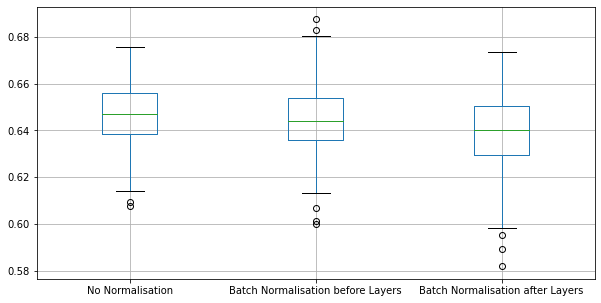

In [16]:
#2nd data pre-processing method

MLP_10_raw_f1_2 = [0.6397248495270851, 0.6558497011101623, 0.6530278232405892, 0.6293103448275863, 0.6540673788003287, 0.6518391787852865, 0.6463815789473684, 0.6536833192209991, 0.6622185154295246, 0.6608544027898867, 0.6677768526228144, 0.6529605263157895, 0.6698950766747377, 0.6500415627597673, 0.6434359805510536, 0.6358475263584752, 0.6254355400696864, 0.6436781609195402, 0.6347760060744115, 0.6553398058252426, 0.6427976686094921, 0.6661224489795918, 0.6542207792207793, 0.6451612903225806, 0.6439578264395782, 0.6389351081530783, 0.6502127659574467, 0.6441767068273093, 0.6409597257926307, 0.6316639741518579, 0.6482873851294904, 0.6731234866828087, 0.6683673469387755, 0.6445182724252492, 0.6596091205211726, 0.6398026315789473, 0.6455379482902419, 0.662771285475793, 0.6320754716981132, 0.6151260504201681, 0.6436213991769548, 0.658456486042693, 0.6076595744680852, 0.6552287581699345, 0.65046102263202, 0.6701388888888888, 0.6535122336227309, 0.6410041841004184, 0.664957264957265, 0.648424543946932, 0.6476810414971522, 0.6414473684210527, 0.6544546211490424, 0.6429177268871925, 0.6278260869565218, 0.6344262295081967, 0.6310254163014899, 0.6385542168674699, 0.652926628194559, 0.636650868878357, 0.6419545071609098, 0.6601626016260164, 0.6611977030352748, 0.6266233766233766, 0.6426858513189448, 0.6395250212044106, 0.6444805194805194, 0.6559226430298147, 0.6404023470243084, 0.6627810158201499, 0.634228187919463, 0.6612641815235009, 0.6571668063704946, 0.6522821576763486, 0.6688632619439868, 0.6291768541157294, 0.6303680981595093, 0.6579591836734693, 0.6390532544378699, 0.6643952299829642, 0.6358284272497897, 0.657190635451505, 0.6485148514851485, 0.6501240694789081, 0.6472962066182404, 0.643846780766096, 0.6284779050736498, 0.6503623188405797, 0.6402586903799515, 0.6282051282051282, 0.6602717825739408, 0.6626609442060086, 0.6661143330571665, 0.6395250212044106, 0.6599496221662469, 0.6521008403361346, 0.6573311367380561, 0.6644573322286661, 0.657074340527578, 0.6167400881057269]
MLP_20_raw_f1_2 = [0.6512820512820513, 0.6574633304572908, 0.6502384737678855, 0.6212765957446809, 0.6551155115511552, 0.6404782237403929, 0.6353135313531353, 0.6395348837209301, 0.6633581472291149, 0.6578715919085313, 0.6661059714045416, 0.6467065868263474, 0.6621507197290432, 0.6471544715447155, 0.6360031720856464, 0.6306451612903226, 0.6275197195442593, 0.6504201680672269, 0.6519967400162999, 0.657695542472666, 0.6502463054187192, 0.6666666666666666, 0.6549118387909321, 0.6435070306038048, 0.6436213991769548, 0.6545754328112119, 0.6502202643171805, 0.6344712739383847, 0.6382608695652173, 0.632869991823385, 0.6432337434094904, 0.6499189627228524, 0.6678321678321678, 0.6350245499181669, 0.6537815126050419, 0.6514767932489451, 0.6404782237403929, 0.657695542472666, 0.6344712739383847, 0.6142625607779579, 0.6273858921161826, 0.6473099914602903, 0.6095238095238096, 0.6455379482902419, 0.6567164179104479, 0.6561954624781849, 0.6578512396694215, 0.6273187183811131, 0.6695880806310255, 0.6403433476394851, 0.6468590831918506, 0.6302931596091206, 0.6535303776683087, 0.6387702818104184, 0.6164502164502164, 0.6278101582014987, 0.6361323155216284, 0.6209386281588447, 0.6493288590604026, 0.6406504065040651, 0.6462585034013605, 0.648910411622276, 0.6504065040650406, 0.6246808510638298, 0.632869991823385, 0.6440957886044592, 0.6556016597510372, 0.6633825944170771, 0.6447257383966245, 0.6496028243601059, 0.642737896494157, 0.6452145214521452, 0.656172328086164, 0.6527893422148209, 0.6689246401354784, 0.6390728476821191, 0.6299342105263158, 0.6606409202958093, 0.6378018318068277, 0.6632566069906224, 0.6336311941510966, 0.653516295025729, 0.6472602739726028, 0.640728476821192, 0.6375892149088026, 0.6499999999999999, 0.6357199055861527, 0.6467289719626169, 0.645004061738424, 0.6354515050167224, 0.6758286176232821, 0.6591639871382636, 0.6587837837837838, 0.6371100164203612, 0.6672297297297297, 0.6536170212765957, 0.6677994902293969, 0.6587234042553192, 0.6495443247721624, 0.6306620209059233]
MLP_40_raw_f1_2 = [0.6481012658227848, 0.6643952299829642, 0.6468155500413564, 0.6206308610400681, 0.6518151815181519, 0.6402586903799515, 0.6248912097476066, 0.6486486486486486, 0.6445733222866612, 0.6486028789161727, 0.6655737704918032, 0.6486941870261163, 0.6699751861042184, 0.6638297872340425, 0.6425636811832375, 0.6189258312020461, 0.6244653550042771, 0.6376569037656903, 0.6323296354992077, 0.6459209419680404, 0.6449044585987261, 0.671244635193133, 0.6459525756336876, 0.6458832933653077, 0.6494587843463779, 0.6348408710217754, 0.6470588235294118, 0.6411716842961758, 0.6421052631578948, 0.6444629475437135, 0.6385542168674699, 0.6621848739495798, 0.6523681858802503, 0.6430976430976432, 0.6526315789473683, 0.6586414445399827, 0.6480263157894738, 0.6559226430298147, 0.6287170773152081, 0.6201163757273482, 0.6359060402684564, 0.6588824020016681, 0.6177215189873418, 0.6544181977252843, 0.6425419240953222, 0.6757912745936698, 0.659217877094972, 0.6404109589041096, 0.6607929515418502, 0.6441558441558441, 0.6593220338983051, 0.6459016393442623, 0.6526138279932546, 0.6468085106382978, 0.6194995685936152, 0.63441712926249, 0.6280107047279215, 0.6270742358078604, 0.6452702702702702, 0.6480446927374302, 0.6422628951747088, 0.6492411467116358, 0.6461794019933556, 0.6266891891891891, 0.6331658291457287, 0.6219415943172849, 0.654639175257732, 0.652493867538839, 0.6433915211970075, 0.6543859649122806, 0.6458333333333334, 0.624457935819601, 0.6500829187396352, 0.6577181208053692, 0.6666666666666666, 0.6345991561181434, 0.6395348837209301, 0.6585167074164628, 0.6391231028667792, 0.664957264957265, 0.6497461928934011, 0.6535500427715996, 0.6427350427350427, 0.6350550381033023, 0.6251039068994181, 0.6441558441558441, 0.6334991708126038, 0.658886894075404, 0.6442622950819673, 0.6309623430962343, 0.674361088211047, 0.6489832007073385, 0.6569217540842649, 0.6406926406926408, 0.6614447345517842, 0.6534140017286085, 0.6602620087336245, 0.6587436332767402, 0.6497461928934011, 0.6272189349112427]

MLP_10_BN_raw_f1_2 = [0.6687847498014297, 0.6312548113933795, 0.6443057722308893, 0.6282894736842105, 0.6494345718901454, 0.658307210031348, 0.6419753086419753, 0.6405529953917051, 0.640059127864006, 0.6463314097279472, 0.6875, 0.6561983471074381, 0.6634066829665852, 0.648, 0.6478873239436619, 0.6494762288477035, 0.6480721903199343, 0.6576862123613313, 0.6481909160892995, 0.6518847006651886, 0.6464485235434956, 0.643491124260355, 0.6463414634146343, 0.6481334392374901, 0.6578125, 0.6618589743589743, 0.6613672496025438, 0.6275395033860045, 0.6508196721311474, 0.6354009077155826, 0.6465448768864178, 0.6541353383458647, 0.6569579288025891, 0.6509357200976404, 0.66, 0.6373626373626373, 0.6195085629188384, 0.6573770491803279, 0.6322188449848024, 0.6391096979332275, 0.6337115072933549, 0.6377708978328174, 0.6220789685737308, 0.6494296577946768, 0.649789029535865, 0.6661442006269592, 0.6559139784946236, 0.6471981057616417, 0.6529968454258674, 0.6442748091603054, 0.6533333333333333, 0.6428015564202335, 0.6550632911392404, 0.643533123028391, 0.6286173633440515, 0.632869991823385, 0.6439873417721519, 0.6459016393442623, 0.6594259115593485, 0.6303030303030303, 0.6341840680587779, 0.6531531531531531, 0.6370716510903427, 0.6518282988871223, 0.6340288924558588, 0.643609022556391, 0.6405124099279423, 0.6549520766773163, 0.6498781478472786, 0.6550079491255961, 0.6530291109362707, 0.637568199532346, 0.642681929681112, 0.656172328086164, 0.6578947368421053, 0.6395080707148347, 0.63441712926249, 0.6651549508692366, 0.6414499605988967, 0.6484312148028962, 0.6429124709527498, 0.6001386001386002, 0.6518151815181519, 0.6522435897435898, 0.6212238574748257, 0.6443057722308893, 0.6323867996930163, 0.6644462947543713, 0.6484801247077163, 0.6436251920122887, 0.6421455938697318, 0.6694214876033058, 0.6687898089171974, 0.6406504065040651, 0.6610299769408149, 0.6523125996810207, 0.6511627906976745, 0.6579163248564396, 0.6511240632805994, 0.6293034427542034]
MLP_20_BN_raw_f1_2 = [0.6533665835411471, 0.6350148367952523, 0.6437125748502994, 0.6242868785656073, 0.6598586017282012, 0.6411323896752706, 0.6350482315112541, 0.6474358974358974, 0.6569900687547746, 0.6564885496183206, 0.6777408637873755, 0.6448362720403024, 0.6636294608959756, 0.6419180201082753, 0.6433224755700325, 0.6253869969040248, 0.6410256410256411, 0.6523076923076923, 0.6397003745318351, 0.6518636003172086, 0.6330275229357798, 0.6563467492260061, 0.6429124709527498, 0.6324110671936758, 0.6321401370906321, 0.6360708534621577, 0.6709781729991916, 0.638997650743931, 0.6557911908646004, 0.6412092283214001, 0.640901771336554, 0.6536731634182908, 0.656172328086164, 0.6420545746388442, 0.6494925839188134, 0.6255924170616114, 0.6414473684210527, 0.6624505928853754, 0.6415711947626841, 0.6210116731517509, 0.6389776357827477, 0.623938223938224, 0.6401326699834162, 0.6677165354330709, 0.6453726453726454, 0.6728499156829679, 0.6539343009931244, 0.6437699680511182, 0.6533665835411471, 0.6331145149525893, 0.6287519747235386, 0.6560509554140128, 0.6568386568386568, 0.637239165329053, 0.6134751773049646, 0.6361556064073226, 0.6611570247933884, 0.6487367563162184, 0.6597609561752987, 0.6429136975455265, 0.6375198728139905, 0.6449659348978047, 0.6385542168674698, 0.6501200960768615, 0.6290936785986291, 0.6569105691056911, 0.6520325203252032, 0.6641162968630451, 0.6263982102908278, 0.6562009419152277, 0.6462303231151615, 0.6441476826394344, 0.6323651452282156, 0.6386418755052546, 0.6645718774548312, 0.6364335126825519, 0.629746835443038, 0.6681992337164752, 0.6476484194294525, 0.6598586017282012, 0.6380368098159509, 0.6444972288202692, 0.6561199000832639, 0.659217877094972, 0.6289308176100628, 0.6523468575974543, 0.6316590563165906, 0.6334089191232048, 0.6458832933653077, 0.6225059856344772, 0.6524486571879937, 0.6565495207667732, 0.674698795180723, 0.6203037569944044, 0.6830039525691699, 0.6435185185185185, 0.6629392971246006, 0.6774193548387097, 0.6440957886044592, 0.6410871302957635]
MLP_40_BN_raw_f1_2 = [0.643879173290938, 0.6250962278675906, 0.6259541984732824, 0.6068855084067253, 0.6501163692785105, 0.6502057613168725, 0.6278520849724626, 0.6365079365079366, 0.6170678336980306, 0.6444629475437135, 0.6777133388566695, 0.6567411083540116, 0.6650082918739635, 0.6391912908242613, 0.6190476190476191, 0.6403861625100564, 0.624124513618677, 0.6408504176157934, 0.6371149511645379, 0.6301798279906178, 0.6394344069128045, 0.6720128307939053, 0.64576802507837, 0.6436041834271923, 0.6445283018867924, 0.6343906510851419, 0.6477272727272728, 0.6276083467094703, 0.641660015961692, 0.6335204490777867, 0.6161616161616161, 0.6702702702702702, 0.634920634920635, 0.6384676775738228, 0.6323639075316928, 0.6413902053712481, 0.6261538461538462, 0.6517571884984025, 0.6300533943554538, 0.6013564431047476, 0.6296900489396411, 0.6525490196078432, 0.6201022146507665, 0.6546310832025118, 0.6604215456674473, 0.6451612903225806, 0.6532905296950241, 0.6542810985460419, 0.6513911620294599, 0.6421725239616614, 0.6574074074074074, 0.6441717791411044, 0.6495327102803738, 0.6496408619313646, 0.620050547598989, 0.6177847113884556, 0.6416666666666668, 0.6446140797285835, 0.6179604261796042, 0.6441767068273093, 0.6196319018404907, 0.6410066617320503, 0.6319165998396151, 0.639141205615194, 0.635408245755861, 0.6430868167202572, 0.6542510121457489, 0.6292134831460674, 0.6398687448728466, 0.6666666666666667, 0.6131274131274131, 0.6361445783132531, 0.6650563607085346, 0.658703071672355, 0.6602564102564104, 0.6306027820710974, 0.6394344069128045, 0.6802507836990596, 0.631578947368421, 0.6666666666666667, 0.6309341500765696, 0.6398687448728466, 0.6467065868263474, 0.6485647788983708, 0.6252019386106623, 0.6471067644661777, 0.6203037569944044, 0.6247906197654941, 0.6404494382022472, 0.642967542503864, 0.6409674981103552, 0.6432000000000001, 0.647887323943662, 0.6216216216216215, 0.6781045751633987, 0.6360031720856464, 0.6223207686622321, 0.6672171758876961, 0.6563517915309447, 0.6438247011952191]

MLP_10_ABN_raw_f1_2 = [0.6465306122448979, 0.6498316498316498, 0.6376811594202898, 0.6359060402684564, 0.6517783291976841, 0.6672226855713095, 0.6219135802469137, 0.631578947368421, 0.6556016597510372, 0.6541737649063032, 0.6480067854113656, 0.6306306306306306, 0.6655574043261232, 0.6419354838709678, 0.620242914979757, 0.6296590007930214, 0.624390243902439, 0.6395534290271132, 0.6462264150943396, 0.6494762288477035, 0.6419951729686243, 0.6656151419558359, 0.6450567260940032, 0.6218057921635435, 0.646677471636953, 0.6443172526573999, 0.6405990016638935, 0.6356846473029046, 0.6324642556770395, 0.6305254378648874, 0.6359761295822678, 0.650199203187251, 0.6286644951140065, 0.64, 0.6453125, 0.650042992261393, 0.6308943089430894, 0.6591639871382636, 0.6346153846153847, 0.6262135922330098, 0.6341463414634146, 0.6481802426343155, 0.6181520850367949, 0.6677937447168216, 0.6486928104575164, 0.6595744680851063, 0.6416539050535989, 0.6039387308533917, 0.6600541027953111, 0.6267123287671232, 0.6464135021097047, 0.6496000000000001, 0.6476190476190476, 0.6383319967923015, 0.599656357388316, 0.6228143213988343, 0.6516290726817042, 0.637137989778535, 0.6385052802599512, 0.6421725239616614, 0.6403940886699507, 0.6367999999999999, 0.6533226581265013, 0.6239870340356565, 0.6492063492063492, 0.6012364760432767, 0.6563307493540051, 0.6472545757071548, 0.6351575456053068, 0.6556564822460776, 0.6409395973154361, 0.6415094339622641, 0.6449511400651465, 0.6462303231151615, 0.6683333333333334, 0.635408245755861, 0.6450540315876975, 0.6564019448946515, 0.6089068825910932, 0.6508071367884452, 0.6419558359621451, 0.6498740554156172, 0.6457473162675474, 0.6508972267536705, 0.6433224755700325, 0.6396761133603238, 0.623293172690763, 0.641852770885029, 0.6409638554216868, 0.6422976501305484, 0.6354249404289117, 0.6666666666666667, 0.6400665004156276, 0.6232876712328768, 0.6672240802675585, 0.6484698097601324, 0.6602953953084275, 0.6545454545454545, 0.6337792642140467, 0.6364399664147774]
MLP_20_ABN_raw_f1_2 = [0.6345053147996729, 0.6588235294117647, 0.6293706293706293, 0.6276021588280648, 0.6162332545311269, 0.6610025488530162, 0.6382978723404256, 0.641914191419142, 0.6666666666666667, 0.6409130816505708, 0.6733837111670864, 0.6369747899159663, 0.6585956416464891, 0.6538461538461537, 0.6246153846153847, 0.6350789692435578, 0.6330196749358427, 0.6362909672262189, 0.6302931596091206, 0.637239165329053, 0.6390916463909165, 0.6572143452877398, 0.6501240694789081, 0.6340361445783133, 0.634710743801653, 0.6401985111662531, 0.6548523206751055, 0.6238532110091742, 0.6339362618432386, 0.653910149750416, 0.6160483175150994, 0.6707978311386522, 0.6660973526900085, 0.6509274873524451, 0.6527666399358459, 0.6274821286735504, 0.642622950819672, 0.6540880503144654, 0.618066561014263, 0.6136177194421657, 0.6166134185303513, 0.6610878661087866, 0.616144975288303, 0.6519607843137255, 0.6433915211970075, 0.6534140017286085, 0.6617038875103392, 0.6035398230088496, 0.6388642413487133, 0.6431501230516816, 0.659265584970111, 0.6351575456053068, 0.645933014354067, 0.6372712146422629, 0.6157760814249363, 0.6243654822335025, 0.6509671993271657, 0.6340640809443507, 0.6551440329218108, 0.6461295418641391, 0.6293823038397328, 0.6391096979332275, 0.6392405063291139, 0.6306913996627318, 0.6296296296296295, 0.6323296354992077, 0.6695352839931153, 0.666098807495741, 0.6270742358078604, 0.6202531645569621, 0.6305732484076433, 0.6260296540362438, 0.6526492851135408, 0.6514382402707277, 0.6440944881889764, 0.6275752773375595, 0.6288906624102155, 0.6683459277917716, 0.6341463414634146, 0.6464485235434956, 0.6345381526104418, 0.65, 0.6214099216710183, 0.6454248366013072, 0.6427990235964198, 0.6402027027027029, 0.6232114467408585, 0.6529914529914531, 0.6286644951140065, 0.6442006269592477, 0.6567164179104478, 0.6509740259740259, 0.6511254019292604, 0.6217457886676876, 0.6706484641638225, 0.6518650088809946, 0.6541737649063032, 0.656691604322527, 0.6398066075745367, 0.639261744966443]
MLP_40_ABN_raw_f1_2 = [0.5952184666117065, 0.6501283147989735, 0.6277732128184059, 0.6003430531732418, 0.6292834890965732, 0.653061224489796, 0.634865568083261, 0.6270178419711129, 0.6545153272576636, 0.6397188049209138, 0.6486486486486487, 0.6450450450450451, 0.6521008403361346, 0.6502127659574467, 0.617124394184168, 0.6367999999999999, 0.6217788861180383, 0.6378018318068277, 0.6371681415929203, 0.6357085668534829, 0.6483704974271012, 0.6599063962558502, 0.604149377593361, 0.6428571428571429, 0.6506224066390042, 0.6270178419711129, 0.6591695501730104, 0.6132906325060048, 0.618657937806874, 0.6311475409836065, 0.6127067014795474, 0.6596434359805511, 0.6375545851528384, 0.6264462809917355, 0.6518151815181519, 0.6142384105960266, 0.6269165247018739, 0.6480541455160744, 0.6355296080066722, 0.5818181818181819, 0.611346316680779, 0.6296006264682851, 0.5984112974404237, 0.6645264847512039, 0.6405750798722045, 0.6310517529215358, 0.6267432321575062, 0.6369636963696369, 0.6689956331877729, 0.6379170056956874, 0.6300914380714879, 0.5890736342042755, 0.6334693877551021, 0.6319327731092436, 0.6182462356067316, 0.6211604095563139, 0.6307821698906645, 0.6469049694856147, 0.6464315012305167, 0.5990259740259741, 0.6399302528334786, 0.6552006552006552, 0.6473895582329317, 0.6164383561643836, 0.6285226302305721, 0.633861551292744, 0.6324041811846689, 0.6528, 0.6319272125723739, 0.6507258753202392, 0.627831715210356, 0.6308724832214765, 0.6295399515738498, 0.6540362438220759, 0.6650082918739635, 0.6261682242990655, 0.6327033689400164, 0.6699999999999999, 0.6317512274959083, 0.6456953642384106, 0.6242960579243765, 0.6456310679611651, 0.642123287671233, 0.6522462562396005, 0.6426116838487972, 0.6474086661002549, 0.6151342554922701, 0.6408640864086408, 0.6232247284878863, 0.6221161495624503, 0.6535626535626535, 0.6370494551550713, 0.6524064171122995, 0.6131147540983607, 0.6645109135004041, 0.6374570446735395, 0.6416382252559727, 0.6182336182336182, 0.6190871369294606, 0.644122383252818]

total_non_normalis_raw = MLP_10_raw_f1_2+MLP_20_raw_f1_2+MLP_40_raw_f1_2
total_BN_raw = MLP_10_BN_raw_f1_2+MLP_20_BN_raw_f1_2+MLP_40_BN_raw_f1_2
total_BNA_raw = MLP_10_ABN_raw_f1_2+MLP_20_ABN_raw_f1_2+MLP_40_ABN_raw_f1_2

mlp_raw2_f1_2 = {'No Normalisation':total_non_normalis_raw, 'Batch Normalisation before Layers':total_BN_raw, 'Batch Normalisation after Layers':total_BNA_raw}
mlp_raw2_f1_df_2 = pd.DataFrame.from_dict(mlp_raw2_f1_2)
boxplot = mlp_raw2_f1_df_2.boxplot(column=['No Normalisation', 'Batch Normalisation before Layers', 'Batch Normalisation after Layers'], figsize=(10,5))  

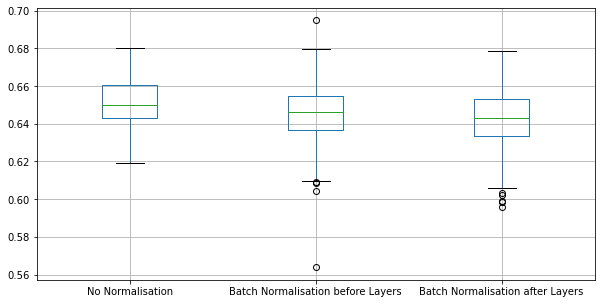

In [17]:
#3rd data pre-processing method

MLP_10_raw_f1_3 = [0.6473988439306357, 0.6511226252158895, 0.6510460251046025, 0.6257359125315392, 0.6666666666666666, 0.647746243739566, 0.6424870466321243, 0.6397306397306398, 0.6599832915622389, 0.6608391608391608, 0.673434856175973, 0.6570945945945946, 0.6725949878738885, 0.6605196982397319, 0.643846780766096, 0.6324237560192617, 0.6359143327841844, 0.6375838926174496, 0.6549520766773163, 0.6516666666666666, 0.6477272727272728, 0.6650205761316873, 0.6566455696202532, 0.6427406199021208, 0.6440397350993379, 0.6546080964685616, 0.6615646258503401, 0.6438035853468433, 0.653941908713693, 0.6347402597402596, 0.6351351351351351, 0.6792156862745098, 0.6706484641638225, 0.6557939914163091, 0.6575121163166397, 0.6431501230516816, 0.6448763250883393, 0.6595918367346938, 0.6417657045840407, 0.6313173156586579, 0.6313963573287076, 0.6666666666666667, 0.6272285251215559, 0.6565910999160369, 0.6449456975772765, 0.6723404255319149, 0.6535122336227309, 0.648323301805675, 0.6648745519713262, 0.6472060050041701, 0.6611706512778235, 0.6475878986099755, 0.6548387096774193, 0.6346992153443766, 0.6263157894736842, 0.6436041834271923, 0.6476030277544155, 0.6444444444444444, 0.6521739130434783, 0.6481334392374901, 0.6455284552845529, 0.6485623003194888, 0.6644573322286661, 0.6427990235964198, 0.645324347093513, 0.6451612903225806, 0.6637401229148376, 0.6633416458852868, 0.641025641025641, 0.6633744855967079, 0.6343537414965986, 0.6484312148028962, 0.6627218934911242, 0.6549707602339182, 0.6590351594439902, 0.6362153344208807, 0.6462809917355373, 0.6802374893977947, 0.6388657214345288, 0.6699346405228758, 0.6453726453726454, 0.6632390745501285, 0.648506151142355, 0.647746243739566, 0.645655877342419, 0.6408094435075886, 0.627831715210356, 0.6476360392506689, 0.6446280991735537, 0.6434359805510536, 0.6639276910435498, 0.6616791354945969, 0.6728033472803348, 0.6513213981244672, 0.657556270096463, 0.6579634464751958, 0.6644897959183674, 0.6588628762541806, 0.6565143824027072, 0.6311263972484952]
MLP_20_raw_f1_3 = [0.6622185154295246, 0.6619593998234775, 0.6511254019292604, 0.6280276816608996, 0.6540362438220759, 0.6644125105663568, 0.6320501342882721, 0.6595744680851063, 0.6605504587155963, 0.669001751313485, 0.659217877094972, 0.6605351170568561, 0.6717044500419815, 0.6604795050270689, 0.628099173553719, 0.6486941870261163, 0.6329787234042553, 0.6463512429831596, 0.6581673306772909, 0.6544546211490424, 0.6644628099173553, 0.6655405405405406, 0.6529605263157895, 0.6303501945525292, 0.649415692821369, 0.6497031382527565, 0.6643835616438356, 0.6399345335515548, 0.6456140350877193, 0.6547811993517018, 0.6429177268871925, 0.6750195771339077, 0.671353251318102, 0.6460481099656357, 0.6589595375722543, 0.6557093425605536, 0.6470588235294118, 0.6601941747572815, 0.6333615580016935, 0.6273858921161826, 0.6352357320099256, 0.6296006264682851, 0.6191304347826087, 0.6507806080525883, 0.6517412935323382, 0.6752136752136751, 0.6578073089700996, 0.6456692913385828, 0.6621735467565291, 0.6467576791808874, 0.6638225255972696, 0.6488294314381271, 0.6523235800344235, 0.660033167495854, 0.61991341991342, 0.6396624472573839, 0.6411815812337098, 0.6474190726159231, 0.6449399656946826, 0.6481178396072013, 0.6586826347305389, 0.6525974025974027, 0.6611706512778235, 0.6228373702422145, 0.6475878986099755, 0.6433333333333333, 0.6487889273356402, 0.6596091205211726, 0.6399302528334786, 0.6617038875103392, 0.6291161178509532, 0.6337914308811641, 0.6644407345575961, 0.6683630195080578, 0.6638584667228308, 0.6426174496644296, 0.6468222043443282, 0.6737184703010578, 0.6370896184560781, 0.6700593723494486, 0.6506024096385542, 0.6617038875103392, 0.6435555555555557, 0.648910411622276, 0.6404109589041096, 0.6510067114093959, 0.6272577996715928, 0.6585365853658536, 0.6442307692307692, 0.6339434276206323, 0.6755407653910149, 0.6476683937823835, 0.6661157024793389, 0.6358885017421603, 0.6728971962616823, 0.6549999999999999, 0.6621961441743504, 0.6700942587832047, 0.6445578231292517, 0.6324786324786325]
MLP_40_raw_f1_3 = [0.6325991189427312, 0.6446280991735537, 0.6540983606557376, 0.6302816901408451, 0.6501240694789081, 0.666092943201377, 0.6486486486486487, 0.643103448275862, 0.6666666666666666, 0.6660761736049601, 0.6655112651646448, 0.6554621848739496, 0.6723842195540308, 0.6600660066006601, 0.6460767946577629, 0.6452145214521452, 0.641025641025641, 0.6411092985318108, 0.6452648475120386, 0.6644682605111295, 0.6444805194805194, 0.6574898785425102, 0.6467165419783873, 0.6405867970660146, 0.6477732793522267, 0.6478405315614617, 0.661498708010336, 0.6422167889160555, 0.649260226283725, 0.6542688081149619, 0.6530264279624893, 0.680064308681672, 0.6603611349957007, 0.6442070665571076, 0.6552567237163816, 0.6505016722408026, 0.636595744680851, 0.6581415174765558, 0.6219512195121951, 0.6227848101265823, 0.6376811594202898, 0.6507258753202392, 0.6276505513146735, 0.647109577221743, 0.6544546211490424, 0.6684164479440071, 0.6574675324675324, 0.6505608283002589, 0.6545754328112119, 0.651924651924652, 0.665546218487395, 0.641025641025641, 0.6534140017286085, 0.6507936507936508, 0.6279069767441862, 0.6426116838487972, 0.6464995678478824, 0.6445012787723785, 0.6469594594594594, 0.6426174496644296, 0.6565400843881857, 0.6529605263157895, 0.6711749788672866, 0.6280851063829787, 0.6405337781484571, 0.6594863297431649, 0.6505190311418684, 0.6753022452504318, 0.6425567703952901, 0.6605809128630706, 0.6483790523690772, 0.647746243739566, 0.6666666666666666, 0.6601307189542484, 0.6677393403057119, 0.6355296080066722, 0.6342254663422546, 0.6694421315570359, 0.6233108108108107, 0.664957264957265, 0.6445733222866612, 0.6543313708999159, 0.6358078602620088, 0.6430921052631579, 0.6374570446735395, 0.6346623270951993, 0.6323296354992077, 0.6489459211732357, 0.6497959183673468, 0.6376569037656903, 0.6777133388566695, 0.6435385949696444, 0.6729131175468483, 0.6295681063122923, 0.6705783738474433, 0.6578730420445177, 0.6678260869565218, 0.6643952299829642, 0.6577301161751564, 0.6370494551550713]

MLP_10_BN_raw_f1_3 = [0.6634996041171813, 0.6444972288202692, 0.6640190627482128, 0.6284367635506677, 0.6625860749808723, 0.6616666666666666, 0.6348962336664105, 0.6387434554973822, 0.6516329704510109, 0.6567656765676567, 0.6794338051623647, 0.6587112171837708, 0.6541070082893745, 0.6525359576078729, 0.6367781155015197, 0.6364985163204748, 0.6473895582329317, 0.6614420062695925, 0.6517719568567026, 0.6466403162055335, 0.6543408360128616, 0.655223880597015, 0.6452599388379205, 0.6499215070643641, 0.6381724392041267, 0.6470588235294118, 0.6535742340926944, 0.6340361445783133, 0.6492851135407905, 0.6666666666666666, 0.6502866502866503, 0.6488549618320612, 0.6536050156739812, 0.6522744795682343, 0.6540284360189573, 0.6553945249597424, 0.6457187745483111, 0.6761006289308177, 0.6461538461538461, 0.6244057052297941, 0.6431924882629108, 0.6331877729257642, 0.6417197452229301, 0.6693679092382495, 0.6536964980544747, 0.6727122835943941, 0.6477611940298508, 0.661251015434606, 0.6462228870605834, 0.6566217287866773, 0.636650868878357, 0.6438152011922503, 0.6556639159789948, 0.6431312356101305, 0.6281833616298811, 0.6464, 0.6452648475120386, 0.6381909547738693, 0.6677265500794912, 0.6328358208955224, 0.6372934697088907, 0.6530612244897959, 0.6522075910147173, 0.6491092176607282, 0.6463512429831596, 0.6557645134914145, 0.6545741324921136, 0.675611681136543, 0.6283464566929133, 0.6483600305110603, 0.6452674897119342, 0.6481774960380348, 0.6688206785137318, 0.6683333333333334, 0.6681852695520122, 0.6246290801186942, 0.6364335126825519, 0.6582653817642697, 0.6142969363707776, 0.6697892271662763, 0.648689138576779, 0.6704270749395649, 0.6438569206842923, 0.6561264822134387, 0.632506004803843, 0.6543408360128616, 0.6314199395770392, 0.6661073825503356, 0.6424148606811145, 0.6504460665044608, 0.6525821596244132, 0.639344262295082, 0.677231025854879, 0.6097560975609757, 0.6666666666666666, 0.6671961874503575, 0.6661466458658346, 0.66030230708035, 0.675235646958012, 0.6617161716171617] 
MLP_20_BN_raw_f1_3 = [0.6505295007564297, 0.6300533943554538, 0.656763096168882, 0.610062893081761, 0.6366830639494028, 0.6491092176607282, 0.6375198728139905, 0.6528662420382166, 0.6386430678466076, 0.6650205761316873, 0.6661392405063292, 0.6432926829268294, 0.6542346542346542, 0.6461780929866036, 0.6400613967766693, 0.6121256391526663, 0.6645264847512039, 0.651685393258427, 0.6454545454545454, 0.6319702602230483, 0.6391437308868501, 0.656298600311042, 0.6044568245125347, 0.6386676321506155, 0.6431852986217458, 0.642453591606134, 0.6529318541996831, 0.6327272727272728, 0.6479550922213312, 0.6573426573426574, 0.6221498371335505, 0.6594761171032356, 0.6528332003192339, 0.6461780929866036, 0.6432311144353029, 0.6476043276661515, 0.6557120500782473, 0.6502127659574467, 0.6237393328161367, 0.6202036021926389, 0.6447669977081741, 0.6168782673637042, 0.6279809220985691, 0.6948590381426203, 0.6655817737998373, 0.6689536878216124, 0.6483679525222551, 0.6568867155664222, 0.6688154713940371, 0.6479313036690085, 0.650199203187251, 0.6301969365426696, 0.6741935483870968, 0.6246056782334386, 0.634315424610052, 0.6231772831926323, 0.6322378716744913, 0.651877133105802, 0.6517412935323382, 0.6091954022988506, 0.6435483870967742, 0.6486055776892431, 0.6467432950191571, 0.6464, 0.6499189627228524, 0.6286982248520709, 0.6548100242522231, 0.6481051817478731, 0.6430260047281323, 0.6602870813397129, 0.6545166402535658, 0.6357308584686775, 0.6532195500387897, 0.6494762288477035, 0.6613672496025438, 0.6397562833206398, 0.6459824980111376, 0.6768525592055005, 0.6284805091487669, 0.6429699842022117, 0.6458797327394209, 0.6097560975609756, 0.6561461794019934, 0.6528583264291633, 0.6148092744951383, 0.6573426573426574, 0.6442307692307692, 0.6233974358974359, 0.6487367563162184, 0.6535433070866142, 0.6620262954369683, 0.6525285481239803, 0.6634382566585957, 0.6370135027799841, 0.6613672496025438, 0.6390101892285298, 0.6506410256410255, 0.6747181964573269, 0.6477272727272728, 0.6465927099841521]
MLP_40_BN_raw_f1_3 = [0.6464, 0.6333333333333334, 0.609865470852018, 0.6264682850430697, 0.6676946800308403, 0.6381679389312978, 0.6388682055100522, 0.6353467561521254, 0.6201201201201201, 0.6412955465587045, 0.6597110754414125, 0.6565495207667732, 0.6477187733732237, 0.6348973607038122, 0.6307572209211554, 0.6596434359805511, 0.6398104265402843, 0.6460587326120556, 0.6389324960753532, 0.6399383191981497, 0.6281368821292775, 0.6605504587155964, 0.6411258795934324, 0.6422447388932191, 0.6450617283950617, 0.6294027565084226, 0.641025641025641, 0.6409266409266409, 0.6446826051112943, 0.6323076923076922, 0.645643153526971, 0.6489675516224189, 0.6346456692913385, 0.6395080707148347, 0.6337509211495947, 0.6341085271317829, 0.6291291291291291, 0.6650602409638554, 0.6342229199372056, 0.6107331821617535, 0.6201923076923076, 0.633457249070632, 0.6312292358803987, 0.6535122336227309, 0.6367157242447715, 0.6650041562759766, 0.6511627906976744, 0.6477541371158393, 0.6732510288065844, 0.64576802507837, 0.6378018318068277, 0.6264323911382735, 0.671604938271605, 0.6305732484076433, 0.5637480798771121, 0.6244274809160305, 0.6164179104477612, 0.6473594548551959, 0.6474358974358974, 0.6243050039714058, 0.6307808946171343, 0.6410054988216811, 0.6086330935251799, 0.6456692913385828, 0.6315789473684211, 0.6345565749235474, 0.6486042692939245, 0.6604572396274344, 0.6329317269076306, 0.6347305389221557, 0.641897233201581, 0.6345139412207988, 0.6515624999999999, 0.6527777777777778, 0.6318926974664679, 0.6215022091310751, 0.6370023419203747, 0.6307356154406409, 0.6414803392444102, 0.6492709132770529, 0.6394557823129252, 0.6402439024390244, 0.6515912897822446, 0.6557645134914145, 0.6373098478783027, 0.6563944530046226, 0.6220532319391634, 0.6715566422167889, 0.6465583913379738, 0.6400613967766693, 0.6364942528735633, 0.6459016393442623, 0.650199203187251, 0.6279257465698144, 0.6730007917656373, 0.6494117647058824, 0.6519083969465648, 0.6573859242072698, 0.6456820016142051, 0.6148359486447933]

MLP_10_ABN_raw_f1_3 = [0.6281276962899052, 0.6536170212765957, 0.6353322528363047, 0.6298433635614179, 0.6567164179104479, 0.6386266094420601, 0.6346801346801347, 0.6422018348623854, 0.6566164154103853, 0.6289517470881862, 0.6558497011101623, 0.6350931677018633, 0.6616915422885572, 0.6376360808709175, 0.6386418755052546, 0.640677966101695, 0.6338983050847458, 0.6346456692913385, 0.6561514195583596, 0.6491969568892646, 0.6592, 0.6487317448116833, 0.6413632842757553, 0.6481632653061226, 0.633906633906634, 0.6384364820846905, 0.6409395973154361, 0.6410054988216811, 0.6325660699062233, 0.6512, 0.6460767946577629, 0.6561762391817467, 0.6291230893000804, 0.6252945797329142, 0.6518282988871223, 0.6440957886044592, 0.6411815812337098, 0.6602564102564104, 0.6429752066115703, 0.603299293008641, 0.6266891891891891, 0.6574450772986167, 0.6333907056798623, 0.6507806080525883, 0.6586151368760065, 0.6589403973509933, 0.6666666666666667, 0.6441251056635672, 0.6788511749347258, 0.628757108042242, 0.652493867538839, 0.6337914308811641, 0.6527893422148209, 0.63859649122807, 0.6186234817813766, 0.6320907617504052, 0.639141205615194, 0.6505823627287854, 0.6430976430976432, 0.6328358208955224, 0.6446826051112943, 0.6435070306038048, 0.6440677966101696, 0.6398104265402843, 0.6425120772946861, 0.627450980392157, 0.6453726453726454, 0.662809917355372, 0.6391270459859703, 0.6532399299474606, 0.6509671993271657, 0.652926628194559, 0.6497959183673468, 0.6568867155664222, 0.650199203187251, 0.6300914380714879, 0.6375617792421746, 0.6733167082294265, 0.6340668296658516, 0.6678082191780822, 0.6367218282111898, 0.66011466011466, 0.6414762741652021, 0.6476987447698745, 0.6252072968490879, 0.6503164556962027, 0.6194968553459119, 0.6566104702750665, 0.6500402252614642, 0.6437346437346438, 0.6661417322834645, 0.6341045415595544, 0.6589211618257261, 0.6240538267451641, 0.6476642913697546, 0.6671987230646449, 0.6633825944170771, 0.6534325889164599, 0.6517412935323382, 0.6535836177474403]
MLP_20_ABN_raw_f1_3 = [0.6576728499156829, 0.6369327073552427, 0.5958747135217725, 0.6278101582014987, 0.6504065040650406, 0.6572143452877398, 0.6372549019607843, 0.6525630593978844, 0.6549118387909321, 0.625314333612741, 0.6655683690280065, 0.6699588477366256, 0.6520640269587195, 0.6291959406713505, 0.6344712739383847, 0.6327212020033389, 0.6554903604358759, 0.6302729528535981, 0.6426174496644296, 0.6347490347490348, 0.6394884092725819, 0.6704637917005696, 0.6381987577639752, 0.6395080707148347, 0.6569814366424537, 0.641852770885029, 0.6338983050847458, 0.6295081967213115, 0.627147766323024, 0.6525781910397294, 0.6376811594202898, 0.6573998364677024, 0.6545138888888888, 0.6464315012305167, 0.6575576430401366, 0.6454248366013072, 0.6470588235294118, 0.6567411083540116, 0.6432748538011697, 0.6201804757998359, 0.6348936170212766, 0.6386554621848739, 0.6272189349112427, 0.6491372226787181, 0.6519148936170213, 0.6494401378122309, 0.6475279106858054, 0.6421861656703672, 0.6733837111670864, 0.6314102564102565, 0.6409202958093672, 0.6476642913697546, 0.6109467455621301, 0.6312236286919832, 0.6220338983050847, 0.6266447368421052, 0.6355633802816902, 0.6420600858369099, 0.6497545008183305, 0.6146496815286624, 0.6331409727947239, 0.6471981057616417, 0.6541903986981286, 0.6460767946577629, 0.6414141414141413, 0.6500415627597673, 0.6689895470383276, 0.6629213483146067, 0.6390532544378699, 0.6114942528735632, 0.6503667481662592, 0.6312236286919832, 0.6332794830371568, 0.6568386568386568, 0.672, 0.6327212020033389, 0.632952691680261, 0.6549349655700076, 0.6299081035923142, 0.6381260096930533, 0.6465798045602607, 0.6384676775738228, 0.6309314586994728, 0.6317485898468976, 0.642495784148398, 0.6597938144329897, 0.6403361344537815, 0.663716814159292, 0.6421725239616614, 0.64, 0.6721311475409836, 0.6463104325699747, 0.6442721791559001, 0.6149957877000842, 0.6743232157506153, 0.6573311367380561, 0.6661514683153014, 0.6520210896309315, 0.640901771336554, 0.6331309627059843]
MLP_40_ABN_raw_f1_3 = [0.6256239600665557, 0.6356453028972784, 0.6276223776223776, 0.622107969151671, 0.6645004061738424, 0.6513213981244672, 0.6493083807973963, 0.6377510040160642, 0.6570281124497991, 0.6621276595744681, 0.6484641638225256, 0.6518010291595198, 0.6508585445625511, 0.64797507788162, 0.6336477987421385, 0.6431570109151974, 0.6528138528138527, 0.6353730092204527, 0.6396103896103895, 0.6369426751592356, 0.6387771520514883, 0.6610738255033557, 0.6446280991735537, 0.6481632653061226, 0.6404682274247492, 0.6317485898468976, 0.6570702794242167, 0.6402027027027029, 0.5983739837398374, 0.652926628194559, 0.6307320997586484, 0.6549239391513211, 0.6505808757819482, 0.618032786885246, 0.6580756013745704, 0.6331309627059843, 0.6543313708999159, 0.6666666666666665, 0.6426174496644296, 0.6218487394957983, 0.6253021756647865, 0.6414141414141413, 0.6087719298245614, 0.6545153272576636, 0.647887323943662, 0.6364414029084687, 0.6603624901497243, 0.6319385140905209, 0.6544821583986075, 0.6442953020134228, 0.6541737649063032, 0.6530264279624893, 0.6525630593978844, 0.6019736842105264, 0.6194995685936152, 0.6247906197654941, 0.6308724832214765, 0.6454465075154731, 0.6504460665044608, 0.6439024390243903, 0.6196692776327241, 0.6217697729052467, 0.6394557823129251, 0.6377049180327868, 0.644891122278057, 0.6478405315614617, 0.6534979423868313, 0.6593959731543625, 0.6399331662489558, 0.6418039895923676, 0.6383333333333333, 0.6322463768115942, 0.6650326797385621, 0.6694772344013491, 0.6655376799322608, 0.6236905721192586, 0.626311541565779, 0.632991318074191, 0.6061068702290076, 0.5989304812834225, 0.636650868878357, 0.645602049530316, 0.6492411467116358, 0.6386418755052546, 0.633861551292744, 0.6291946308724833, 0.6362153344208807, 0.6501706484641638, 0.6181229773462783, 0.647108130762783, 0.6748566748566749, 0.6261022927689595, 0.6426174496644296, 0.6122778675282714, 0.6715566422167889, 0.660033167495854, 0.635, 0.6612111292962357, 0.647506339814032, 0.6263286999182338]

total_non_normalis_raw = MLP_10_raw_f1_3+MLP_20_raw_f1_3+MLP_40_raw_f1_3
total_BN_raw = MLP_10_BN_raw_f1_3+MLP_20_BN_raw_f1_3+MLP_40_BN_raw_f1_3
total_BNA_raw = MLP_10_ABN_raw_f1_3+MLP_20_ABN_raw_f1_3+MLP_40_ABN_raw_f1_3

mlp_raw2_f1_df_3 = {'No Normalisation':total_non_normalis_raw, 'Batch Normalisation before Layers':total_BN_raw, 'Batch Normalisation after Layers':total_BNA_raw}
mlp_raw2_f1_df_3 = pd.DataFrame.from_dict(mlp_raw2_f1_df_3)
boxplot = mlp_raw2_f1_df_3.boxplot(column=['No Normalisation', 'Batch Normalisation before Layers', 'Batch Normalisation after Layers'], figsize=(10,5))  

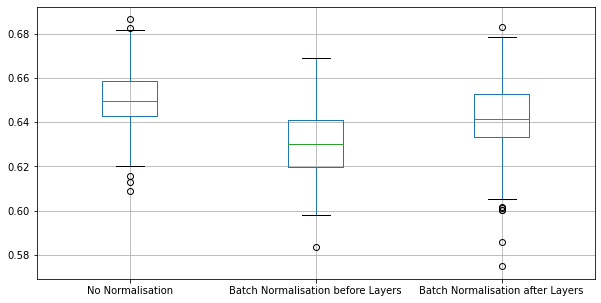

In [18]:
#4th data pre-processing method

MLP_10_raw_f1_4 = [0.6492232215862633, 0.6523972602739727, 0.6540049545829894, 0.6201804757998359, 0.6699999999999999, 0.6448979591836735, 0.6345811051693405, 0.6445733222866612, 0.6610025488530162, 0.6642857142857141, 0.6505246166263117, 0.6568867155664222, 0.6767515923566879, 0.6617886178861789, 0.6430921052631579, 0.6347402597402596, 0.6318493150684931, 0.6515028432168969, 0.6495589414595028, 0.6672240802675585, 0.6503937007874016, 0.6627810158201499, 0.6536833192209991, 0.6444805194805194, 0.6450567260940032, 0.6412478336221837, 0.6622296173044925, 0.6515763945028294, 0.6509274873524451, 0.6578730420445177, 0.647010647010647, 0.6746031746031746, 0.6621621621621621, 0.6366666666666667, 0.6574225122349103, 0.6521739130434783, 0.6541903986981286, 0.6522088353413655, 0.6515397082658023, 0.6320201173512153, 0.6406995230524644, 0.6563769293257514, 0.6339434276206323, 0.6650205761316873, 0.638912489379779, 0.6603119584055458, 0.6570212765957447, 0.6448445171849427, 0.6742160278745645, 0.6568144499178983, 0.6598812553011026, 0.6528583264291633, 0.6580645161290323, 0.6490179333902648, 0.6205733558178753, 0.637123745819398, 0.6473594548551959, 0.6529209621993127, 0.6439578264395782, 0.6443381180223287, 0.6521739130434783, 0.6319758672699849, 0.6628194558944766, 0.6468699839486357, 0.6372712146422629, 0.6581849024597116, 0.6472727272727272, 0.664983164983165, 0.6454935622317596, 0.6542372881355931, 0.6538139145012574, 0.6443172526573999, 0.6649484536082474, 0.6464995678478824, 0.6733500417710945, 0.6381578947368421, 0.6473895582329317, 0.6608419380460683, 0.6302729528535981, 0.6695957820738137, 0.6362909672262189, 0.6631853785900783, 0.6426735218508998, 0.641914191419142, 0.6393989983305509, 0.6396103896103895, 0.6288573811509592, 0.6553267681289168, 0.6557107641741989, 0.6430338004946413, 0.6824877250409166, 0.6432748538011697, 0.660655737704918, 0.638655462184874, 0.6865177832919769, 0.6599664991624791, 0.6737704918032787, 0.6661045531197302, 0.6621735467565291, 0.6245674740484429]
MLP_20_raw_f1_4 = [0.6523605150214592, 0.6522864538395169, 0.6450540315876975, 0.6365914786967418, 0.6506024096385542, 0.6457627118644068, 0.656172328086164, 0.6602564102564104, 0.6605042016806724, 0.6444833625218914, 0.661883408071749, 0.6589211618257261, 0.6683168316831684, 0.6565656565656565, 0.6445497630331752, 0.6445880452342488, 0.6156491831470335, 0.64891846921797, 0.6366559485530547, 0.6677367576243981, 0.6455906821963395, 0.6645519429024583, 0.653968253968254, 0.6447473937449879, 0.6493055555555556, 0.6565656565656565, 0.6711074104912573, 0.6446826051112943, 0.6385846672283068, 0.647109577221743, 0.6493055555555556, 0.6698717948717948, 0.6678321678321678, 0.6491969568892646, 0.665024630541872, 0.6564364876385336, 0.6457990115321252, 0.6548223350253807, 0.6478405315614617, 0.6372881355932204, 0.6448979591836735, 0.6543704891740177, 0.6231404958677687, 0.6575809199318567, 0.653941908713693, 0.6762956669498725, 0.6510500807754442, 0.6349480968858131, 0.6649305555555556, 0.6504854368932038, 0.6538796861377507, 0.6530944625407166, 0.6615646258503401, 0.6441881100266192, 0.6227347611202635, 0.6358475263584752, 0.6464315012305167, 0.6463104325699747, 0.6460767946577629, 0.6479338842975206, 0.6499567847882455, 0.6456820016142051, 0.6567164179104479, 0.6436781609195402, 0.6396761133603238, 0.6505823627287854, 0.6615384615384615, 0.6721311475409836, 0.6380471380471381, 0.6429725363489499, 0.6324786324786325, 0.647985989492119, 0.6506238859180035, 0.6733167082294265, 0.656934306569343, 0.6258169934640523, 0.6385052802599512, 0.67003367003367, 0.6403225806451613, 0.6711185308848081, 0.639141205615194, 0.6585577758470895, 0.6432246998284734, 0.6321155480033984, 0.6461794019933556, 0.6389830508474575, 0.6314935064935066, 0.6624888093106535, 0.6412337662337662, 0.6400651465798046, 0.6666666666666666, 0.6526138279932546, 0.6649484536082474, 0.6313993174061434, 0.6755407653910149, 0.6449399656946826, 0.6597760551248923, 0.6616033755274261, 0.6525063721325404, 0.6468222043443282]
MLP_40_raw_f1_4 = [0.6464826357969724, 0.6615776081424937, 0.6538152610441766, 0.6353543979504697, 0.6429780033840948, 0.656093489148581, 0.6237712243074173, 0.6502127659574467, 0.646551724137931, 0.654109589041096, 0.6733837111670864, 0.6569965870307167, 0.6737880032867707, 0.6578730420445177, 0.6419354838709678, 0.6320132013201321, 0.6129032258064516, 0.6493723849372385, 0.6439873417721519, 0.6604255319148936, 0.6462530217566478, 0.6588432523051131, 0.6451091350040421, 0.6498371335504887, 0.6452131938857603, 0.6476190476190475, 0.66383701188455, 0.6438698915763135, 0.6382978723404255, 0.6473509933774834, 0.6441251056635672, 0.6720516962843296, 0.6582914572864322, 0.6540049545829894, 0.6533333333333333, 0.6494401378122309, 0.6464471403812826, 0.6490939044481054, 0.6441821247892076, 0.6232006773920407, 0.6416666666666668, 0.6545454545454545, 0.6275862068965518, 0.6552020636285469, 0.6459948320413437, 0.677056277056277, 0.6666666666666666, 0.6352941176470588, 0.6696349065004452, 0.6555462885738116, 0.6627218934911242, 0.6399331662489558, 0.658456486042693, 0.6258992805755396, 0.6089150546677881, 0.640728476821192, 0.6427962489343563, 0.6364428945074107, 0.6552567237163816, 0.6444616576297444, 0.6380873866446827, 0.6550868486352358, 0.6611157368859284, 0.6306001690617076, 0.6374172185430463, 0.6571428571428571, 0.6459627329192547, 0.6666666666666666, 0.6491969568892646, 0.6560509554140128, 0.6359761295822678, 0.6425636811832375, 0.6572379367720467, 0.6472148541114058, 0.6621621621621621, 0.6314893617021275, 0.6465306122448979, 0.6672117743254293, 0.634946677604594, 0.6543859649122806, 0.6414473684210527, 0.661498708010336, 0.645273200346921, 0.6368159203980099, 0.6334763948497855, 0.6467661691542288, 0.6340668296658516, 0.6630920464700626, 0.6323296354992077, 0.6430868167202572, 0.6818565400843881, 0.6523235800344235, 0.6666666666666667, 0.6357388316151202, 0.675, 0.6582914572864322, 0.6629303442754203, 0.66553480475382, 0.6520210896309315, 0.634865568083261]

MLP_10_BN_raw_f1_4 = [0.6247787610619469, 0.649737302977233, 0.6277873070325901, 0.6245614035087721, 0.6526315789473685, 0.6367634124890061, 0.6186131386861314, 0.6334459459459459, 0.6237113402061856, 0.6520210896309315, 0.6661002548853016, 0.6357142857142857, 0.6416083916083916, 0.6353543979504697, 0.621043627031651, 0.611065235342692, 0.6040744021257751, 0.6182432432432432, 0.6318407960199005, 0.6626506024096386, 0.6291000841042892, 0.631492168178071, 0.6386986301369864, 0.6381578947368421, 0.6310344827586207, 0.6333615580016935, 0.6428571428571429, 0.6189213085764809, 0.6144366197183099, 0.6378565254969749, 0.6201298701298701, 0.6557093425605536, 0.6566637246248896, 0.6356720202874049, 0.6525063721325404, 0.6229221347331584, 0.6300429184549355, 0.6467576791808874, 0.6161616161616161, 0.6071741032370954, 0.6300675675675677, 0.630755864465682, 0.6121707538601271, 0.6464646464646464, 0.640625, 0.650088809946714, 0.6431501230516816, 0.6188034188034188, 0.6487935656836462, 0.6135593220338984, 0.6390845070422534, 0.6428571428571428, 0.6422628951747088, 0.6446700507614214, 0.6018018018018018, 0.6337308347529813, 0.6216696269982238, 0.6377325066430469, 0.6313932980599646, 0.6308492201039861, 0.640728476821192, 0.6175732217573222, 0.6503378378378379, 0.6195462478184991, 0.6290748898678414, 0.6278870829769032, 0.6419753086419753, 0.6404109589041096, 0.6308610400682011, 0.6370896184560781, 0.6430423509075194, 0.6252129471890971, 0.641409691629956, 0.6272727272727272, 0.649616368286445, 0.6046511627906976, 0.6252129471890971, 0.6554338668913227, 0.615111111111111, 0.6619964973730298, 0.6253186066270179, 0.6333333333333334, 0.63710407239819, 0.61991341991342, 0.6122792262405383, 0.6201550387596899, 0.6201680672268908, 0.6504504504504505, 0.6275805119735757, 0.616593886462882, 0.6549118387909321, 0.6197424892703863, 0.6484581497797357, 0.6167097329888027, 0.6603611349957007, 0.6445414847161572, 0.6547921967769297, 0.6274179983179141, 0.634920634920635, 0.5980479148181012]
MLP_20_BN_raw_f1_4 = [0.6039016115351994, 0.64, 0.6343537414965986, 0.6176218990590249, 0.6327782646801051, 0.6155157715260017, 0.6260869565217391, 0.6473594548551959, 0.632034632034632, 0.6448683015440508, 0.6424870466321243, 0.6436170212765957, 0.6540120793787747, 0.6303972366148533, 0.6312346688470972, 0.6226568867155665, 0.6131650135256989, 0.6222961730449251, 0.6324642556770395, 0.6276150627615062, 0.640677966101695, 0.6497461928934011, 0.6202749140893471, 0.6361323155216284, 0.6204013377926422, 0.6243386243386243, 0.6337157987643424, 0.6253229974160206, 0.6229802513464991, 0.6163090128755364, 0.6245674740484429, 0.6463314097279472, 0.6381818181818183, 0.6286201022146508, 0.6467661691542288, 0.62478184991274, 0.6226583407671721, 0.6442388561816652, 0.6186291739894552, 0.6114864864864864, 0.6165540540540542, 0.6374570446735395, 0.6030881017257039, 0.6355785837651122, 0.6157849089332176, 0.6521344232515894, 0.6356720202874049, 0.6215753424657533, 0.6550458715596331, 0.6171529619805481, 0.6470078057241977, 0.6324786324786325, 0.64891846921797, 0.6176991150442477, 0.5834797891036907, 0.6211072664359861, 0.6205641492265697, 0.6286201022146508, 0.6248896734333627, 0.6142384105960266, 0.6281138790035585, 0.6301145662847791, 0.640677966101695, 0.6033129904097646, 0.6163090128755364, 0.6163410301953819, 0.6427931960608774, 0.6477174849267873, 0.6203208556149733, 0.6362038664323374, 0.6298533218291631, 0.6102877070619006, 0.6375321336760924, 0.6368421052631579, 0.6486486486486487, 0.6183074265975821, 0.6183333333333334, 0.6491969568892646, 0.6181491464510332, 0.6608391608391608, 0.6253186066270179, 0.6351706036745407, 0.6248880931065353, 0.61991341991342, 0.6211072664359861, 0.6229221347331584, 0.608767576509512, 0.6488888888888888, 0.6386986301369864, 0.6153846153846154, 0.6689895470383276, 0.6327586206896552, 0.6343612334801763, 0.6091458153580673, 0.6580534022394487, 0.6482758620689655, 0.6631299734748011, 0.6331569664902997, 0.6160635481023831, 0.6280701754385966]
MLP_40_BN_raw_f1_4 = [0.6251082251082252, 0.6416443252904379, 0.6191304347826087, 0.6149732620320857, 0.650088809946714, 0.6185383244206774, 0.6101083032490975, 0.6377816291161178, 0.6129317980513729, 0.6456692913385828, 0.6608996539792387, 0.6306465899025687, 0.6361365528726062, 0.6289631533847471, 0.6279461279461279, 0.634315424610052, 0.6304909560723514, 0.6173254835996635, 0.6197874080130825, 0.6307947019867549, 0.6155172413793103, 0.6353322528363047, 0.6354515050167224, 0.6256499133448873, 0.6241258741258742, 0.6257562662057045, 0.6287683031869078, 0.6289631533847471, 0.6231505657093124, 0.6510822510822512, 0.6373815676141257, 0.6497545008183305, 0.6341463414634146, 0.6258620689655172, 0.6230975828111012, 0.6352148272957036, 0.6201550387596899, 0.6338514680483591, 0.6233333333333332, 0.600865800865801, 0.6174273858921162, 0.634920634920635, 0.6131650135256989, 0.6321243523316062, 0.6206896551724138, 0.6406926406926408, 0.6293706293706294, 0.6215978928884986, 0.6569217540842649, 0.6235807860262009, 0.6334208223972004, 0.6255355612682091, 0.6341880341880342, 0.6190476190476191, 0.6001796945193172, 0.6277732128184059, 0.6144144144144144, 0.6236933797909409, 0.6319444444444445, 0.6143682906688687, 0.644524236983842, 0.6441251056635672, 0.6388415672913118, 0.6049700085689802, 0.6041666666666667, 0.6221441124780317, 0.6482635796972395, 0.6544821583986075, 0.624014022787029, 0.6509598603839442, 0.6144975288303131, 0.6209887250650477, 0.6352313167259787, 0.6442141623488774, 0.6552901023890785, 0.6139455782312925, 0.6336965632858341, 0.6420168067226891, 0.611625947767481, 0.6451033243486073, 0.6050566695727987, 0.6136986301369862, 0.6206896551724137, 0.6108714408973253, 0.6101398601398601, 0.6124893071000856, 0.6153846153846154, 0.6412639405204461, 0.6306769494430163, 0.6333907056798623, 0.6569965870307167, 0.6230088495575221, 0.6284246575342466, 0.6163522012578616, 0.6536758193091231, 0.6428571428571428, 0.6563039723661485, 0.6295620437956203, 0.6247848537005163, 0.6081447963800904]

MLP_10_ABN_raw_f1_4 = [0.6447257383966245, 0.6633581472291149, 0.63544106167057, 0.6176470588235294, 0.6590538336052202, 0.6552020636285469, 0.6434634974533108, 0.6511987625676721, 0.6396761133603238, 0.6394671107410492, 0.6710634789777411, 0.6412337662337662, 0.66613290632506, 0.6446280991735537, 0.6267071320182094, 0.6357388316151202, 0.6399331662489558, 0.6401906274821286, 0.6602409638554216, 0.6490384615384615, 0.651968503937008, 0.6559485530546623, 0.6519607843137255, 0.6450079239302695, 0.6384313725490196, 0.6488740617180985, 0.6612244897959184, 0.6484312148028962, 0.635, 0.6536267318663406, 0.6521035598705502, 0.6553059643687064, 0.6601941747572816, 0.6466287571080422, 0.6570972886762361, 0.6528925619834711, 0.633276740237691, 0.6571654790182105, 0.6365105008077545, 0.610062893081761, 0.6223880597014925, 0.647887323943662, 0.6151288445552785, 0.6011560693641619, 0.6524148851939826, 0.6518391787852865, 0.6540284360189573, 0.6469093988145639, 0.6632653061224489, 0.6483333333333333, 0.6575107296137339, 0.6436597110754414, 0.6632653061224489, 0.6392769104354972, 0.6052855924978687, 0.6283048211508554, 0.6573541495480689, 0.6295025728987994, 0.6394671107410492, 0.6334693877551021, 0.6365054602184087, 0.6525974025974027, 0.6492478226444973, 0.6280193236714976, 0.6401354784081288, 0.6331658291457287, 0.6631944444444444, 0.6613290632506006, 0.6302931596091206, 0.652926628194559, 0.6532582461786003, 0.6306769494430163, 0.634710743801653, 0.6536502546689305, 0.6644682605111295, 0.6388657214345288, 0.6213292117465224, 0.6785425101214574, 0.6106399383191982, 0.664561957379637, 0.6402486402486401, 0.6477935054121565, 0.6400709219858157, 0.6518883415435139, 0.6214689265536725, 0.6451612903225806, 0.6258714175058095, 0.664944013781223, 0.6432000000000001, 0.6332537788385044, 0.6476642913697546, 0.6523605150214592, 0.6547231270358306, 0.6394671107410492, 0.6693613581244947, 0.660033167495854, 0.6644844517184942, 0.6694701429772918, 0.6601466992665037, 0.6462530217566478]
MLP_20_ABN_raw_f1_4 = [0.6319218241042346, 0.6446568201563858, 0.6431372549019608, 0.6168831168831168, 0.6666666666666667, 0.6677966101694914, 0.6395759717314489, 0.6583747927031509, 0.6610597140454163, 0.6173469387755102, 0.6588602654176424, 0.6486928104575164, 0.6473988439306357, 0.6499162479061976, 0.6357504215851602, 0.6363636363636365, 0.626057529610829, 0.6265060240963856, 0.632279534109817, 0.6580436540016168, 0.6252909231962761, 0.6581265012009607, 0.630071599045346, 0.635599694423224, 0.6411716842961758, 0.6309314586994728, 0.6511226252158895, 0.6283891547049443, 0.6189624329159212, 0.634584013050571, 0.6191950464396284, 0.6682316118935837, 0.6542372881355931, 0.6431501230516816, 0.6601941747572815, 0.6469622331691297, 0.6325350949628407, 0.6589506172839507, 0.6392092257001648, 0.608767576509512, 0.6292134831460674, 0.6335118592195867, 0.634946677604594, 0.6563573883161512, 0.6498316498316498, 0.6616541353383458, 0.6655231560891939, 0.6399331662489558, 0.6631944444444444, 0.6278101582014987, 0.6386687797147385, 0.6458157227387996, 0.6572847682119205, 0.6396624472573839, 0.6001648804616653, 0.6359060402684564, 0.6463815789473684, 0.6354978354978356, 0.6493083807973963, 0.6296603148301574, 0.6390243902439025, 0.641185647425897, 0.6523125996810207, 0.6361365528726062, 0.6373983739837398, 0.6384814495254529, 0.6582491582491583, 0.6521374685666388, 0.6503164556962027, 0.6407613005551149, 0.6424625098658249, 0.6388163620539599, 0.6502127659574467, 0.6447811447811448, 0.6609105180533753, 0.6288819875776397, 0.6052631578947368, 0.6566491359879789, 0.6425636811832375, 0.6655405405405406, 0.6310756972111553, 0.6394439617723718, 0.636755823986195, 0.6385135135135136, 0.6452145214521452, 0.643265306122449, 0.6234567901234568, 0.6526845637583893, 0.6343402225755167, 0.6328059950041632, 0.6638725901089689, 0.6283783783783784, 0.6475409836065573, 0.6219081272084805, 0.671451355661882, 0.6832092638544252, 0.6506584043377226, 0.6624704956726988, 0.6540673788003287, 0.6441251056635672]
MLP_40_ABN_raw_f1_4 = [0.6272806255430061, 0.6362869198312237, 0.6333878887070377, 0.6088464874241111, 0.6447811447811448, 0.6409395973154361, 0.6374896779521056, 0.6377759607522485, 0.6530958439355387, 0.6323777403035413, 0.666092943201377, 0.6368715083798883, 0.6527050610820243, 0.6379453189726595, 0.6184926184926185, 0.6153846153846153, 0.6108786610878661, 0.6399345335515548, 0.6285714285714287, 0.6359375, 0.65, 0.6514657980456026, 0.6360601001669448, 0.6383319967923015, 0.6301131418624892, 0.6396694214876033, 0.6461538461538462, 0.6335504885993485, 0.622673434856176, 0.6391752577319587, 0.6317626527050612, 0.6393939393939395, 0.6596263200649878, 0.5748031496062992, 0.6456195737963694, 0.6468646864686469, 0.642622950819672, 0.6655974338412189, 0.6347305389221558, 0.613747954173486, 0.6206896551724138, 0.6463022508038585, 0.6215277777777778, 0.6386292834890965, 0.6380165289256198, 0.6485539000876425, 0.657695542472666, 0.6348684210526315, 0.6494661921708186, 0.6456692913385828, 0.6541737649063032, 0.6559865092748736, 0.6595918367346938, 0.6446700507614214, 0.6254355400696864, 0.618657937806874, 0.6405990016638935, 0.6458874458874458, 0.6416040100250626, 0.6016504126031508, 0.6413570274636511, 0.6393442622950819, 0.63249348392702, 0.6439024390243903, 0.6256410256410257, 0.6352357320099256, 0.6273584905660378, 0.6650205761316873, 0.6380873866446827, 0.6382636655948554, 0.6231546231546231, 0.6294754371357202, 0.641313742437338, 0.6666666666666667, 0.5860749808722264, 0.6245954692556634, 0.619396903015485, 0.656, 0.6388206388206388, 0.6576728499156829, 0.6183150183150183, 0.6559048428207307, 0.6454935622317596, 0.6002906976744187, 0.6334164588528679, 0.6495016611295681, 0.6408566721581548, 0.6602620087336245, 0.6533665835411471, 0.6222222222222221, 0.6671999999999999, 0.638912489379779, 0.6416382252559727, 0.6066115702479338, 0.6632739609838846, 0.6482534524776605, 0.6639741518578354, 0.6489726027397261, 0.6364372469635627, 0.6391231028667792]

total_non_normalis_raw = MLP_10_raw_f1_4+MLP_20_raw_f1_4+MLP_40_raw_f1_4
total_BN_raw = MLP_10_BN_raw_f1_4+MLP_20_BN_raw_f1_4+MLP_40_BN_raw_f1_4
total_BNA_raw = MLP_10_ABN_raw_f1_4+MLP_20_ABN_raw_f1_4+MLP_40_ABN_raw_f1_4

mlp_raw2_f1_df_4 = {'No Normalisation':total_non_normalis_raw, 'Batch Normalisation before Layers':total_BN_raw, 'Batch Normalisation after Layers':total_BNA_raw}
mlp_raw2_f1_df_4 = pd.DataFrame.from_dict(mlp_raw2_f1_df_4)
boxplot = mlp_raw2_f1_df_4.boxplot(column=['No Normalisation', 'Batch Normalisation before Layers', 'Batch Normalisation after Layers'], figsize=(10,5))  

(0.52, 0.7)

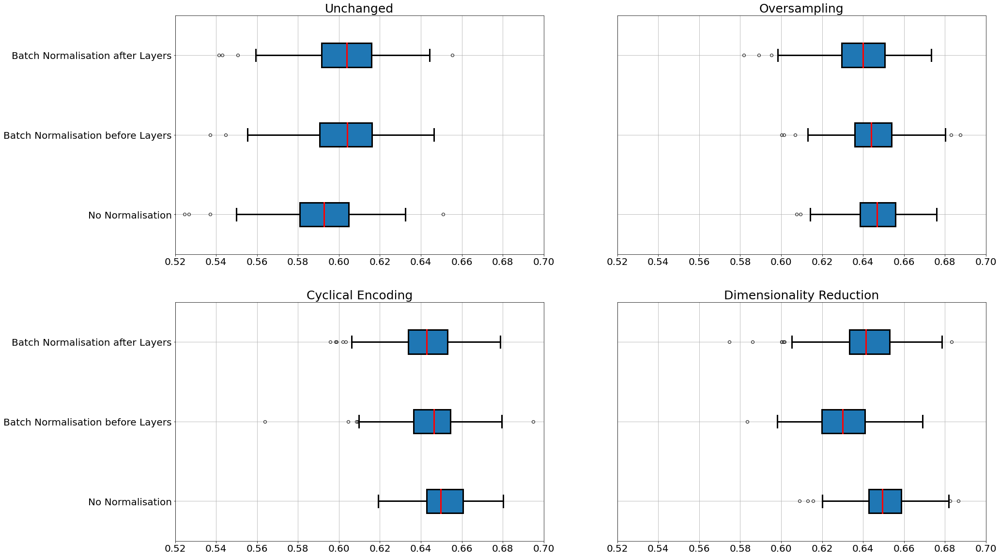

In [19]:
import matplotlib.pyplot as plt

boxprops = dict(linestyle='-', linewidth=3, color='k')
medianprops = dict(linestyle='-', linewidth=3, color='r')
whiskerprops = dict(linestyle='-', linewidth=3, color='k')
capprops = dict(linestyle='-', linewidth=3, color='k')
flierprops = dict(linewidth=3, color='k')
fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(30,20))

b1= mlp_raw2_f1_df.boxplot(ax=axes[0,0], fontsize=20, vert=False, patch_artist=True, medianprops=medianprops, boxprops=boxprops, whiskerprops=whiskerprops, capprops=capprops,flierprops=flierprops)
b2= mlp_raw2_f1_df_2.boxplot(ax=axes[0,1], fontsize=20, vert=False, patch_artist=True, medianprops=medianprops, boxprops=boxprops, whiskerprops=whiskerprops, capprops=capprops,flierprops=flierprops)
b3 = mlp_raw2_f1_df_3.boxplot(ax=axes[1,0],fontsize=20, vert=False, patch_artist=True, medianprops=medianprops, boxprops=boxprops, whiskerprops=whiskerprops, capprops=capprops,flierprops=flierprops)
b4 = mlp_raw2_f1_df_4.boxplot(ax=axes[1,1], fontsize=20, vert=False, patch_artist=True, medianprops=medianprops, boxprops=boxprops, whiskerprops=whiskerprops, capprops=capprops,flierprops=flierprops)

b1.set_title('Unchanged', fontsize=25)
b2.set_title('Oversampling', fontsize=25)
b3.set_title('Cyclical Encoding', fontsize=25)
b4.set_title('Dimensionality Reduction', fontsize=25)

b2.tick_params(axis='y', which='both', left=False, labelleft=False)
b4.tick_params(axis='y', which='both', left=False, labelleft=False)

#ax.set_ylim([ymin,ymax])
b1.set_xlim([0.52,0.7])
b2.set_xlim([0.52,0.7])
b3.set_xlim([0.52,0.7])
b4.set_xlim([0.52,0.7])

In [6]:
#Statistical Testing for MLP
from scipy import stats

MLP_10 = [0.5994005994005994, 0.6170854271356784, 0.5881147540983607, 0.5639412997903565, 0.599601593625498, 0.5973496432212028, 0.5781409601634321, 0.5817060637204523, 0.629889669007021, 0.6004319654427646, 0.6145833333333333, 0.5781893004115226, 0.6231742940603701, 0.6111675126903554, 0.620431115276476, 0.5801217038539553, 0.5634674922600619, 0.6017699115044247, 0.5969581749049431, 0.6181818181818183, 0.5990147783251232, 0.6149253731343284, 0.614, 0.564430244941427, 0.592741935483871, 0.5997973657548126, 0.6042296072507554, 0.584771573604061, 0.5779153766769867, 0.5778229908443541, 0.5847457627118644, 0.5868644067796611, 0.5978723404255318, 0.5851172273190621, 0.6112759643916914, 0.6020408163265306, 0.58125, 0.6013579049466538, 0.5644171779141105, 0.5956607495069034, 0.5939036381514258, 0.5949748743718593, 0.5782652043868395, 0.6215943491422805, 0.59026369168357, 0.6073619631901841, 0.6270691333982473, 0.5918803418803419, 0.5679287305122495, 0.5993945509586277, 0.615228426395939, 0.6059405940594059, 0.632512315270936, 0.5806451612903226, 0.5193370165745856, 0.5996131528046421, 0.5538793103448276, 0.6035502958579883, 0.592741935483871, 0.5941747572815533, 0.6246246246246248, 0.5945945945945946, 0.6229508196721311, 0.5605749486652978, 0.5795339412360688, 0.5974282888229476, 0.6059405940594059, 0.6248736097067745, 0.5370165745856353, 0.5745140388768899, 0.6081871345029239, 0.5801047120418847, 0.6122860020140987, 0.589716684155299, 0.6219512195121952, 0.6084396467124633, 0.6086086086086085, 0.6187050359712231, 0.5812310797174572, 0.6059322033898304, 0.5990049751243782, 0.5801047120418847, 0.5891946992864424, 0.5728952772073922, 0.5920502092050209, 0.5901639344262296, 0.5904572564612326, 0.5854189336235038, 0.6094674556213018, 0.5517993456924755, 0.6061224489795918, 0.6149253731343284, 0.616, 0.5752302968270214, 0.5786694825765575, 0.6016771488469601, 0.6233230134158927, 0.5965270684371808, 0.5814207650273224, 0.5726587728740582]
MLP_20 = [0.6043165467625898, 0.610655737704918, 0.5954356846473029, 0.5605900948366701, 0.592741935483871, 0.5900621118012422, 0.5651720542231492, 0.5765575501583949, 0.6063157894736843, 0.6121593291404612, 0.5923497267759563, 0.5957446808510639, 0.6120000000000001, 0.5807814149947201, 0.6199616122840691, 0.5725971370143149, 0.5266594124047878, 0.5876393110435664, 0.6015473887814314, 0.6146044624746451, 0.59244126659857, 0.5955734406438631, 0.6042296072507554, 0.586171310629515, 0.6006006006006006, 0.5732484076433122, 0.6030150753768844, 0.5898989898989899, 0.5587301587301587, 0.5843621399176955, 0.6042296072507554, 0.6063072227873855, 0.5982905982905983, 0.5928143712574852, 0.5894105894105894, 0.6000000000000001, 0.5905511811023623, 0.604040404040404, 0.5702730030333669, 0.6021717670286277, 0.5891783567134269, 0.6130952380952381, 0.5722891566265059, 0.6022845275181723, 0.5824634655532359, 0.5680345572354212, 0.629951690821256, 0.5893617021276596, 0.5942492012779553, 0.5961732124874118, 0.608257804632427, 0.5940996948118007, 0.6215384615384616, 0.5810526315789473, 0.5708418891170431, 0.5911330049261084, 0.5705263157894738, 0.5784615384615385, 0.5895372233400402, 0.5693581780538302, 0.6055045871559632, 0.6111111111111112, 0.6198267564966314, 0.5903614457831325, 0.5667351129363449, 0.5774058577405857, 0.5819327731092437, 0.6208291203235592, 0.5603357817418677, 0.5776850886339937, 0.6064769381746811, 0.5795918367346939, 0.6136820925553319, 0.6307385229540918, 0.6237424547283702, 0.6099706744868034, 0.6133603238866397, 0.6121212121212121, 0.5702564102564103, 0.6158536585365854, 0.5956175298804781, 0.5850052798310454, 0.5857142857142857, 0.5680851063829787, 0.599601593625498, 0.5841995841995842, 0.5905130687318491, 0.5959271168274383, 0.6016260162601625, 0.588235294117647, 0.6509803921568628, 0.5927461139896373, 0.6105476673427991, 0.5589155370177268, 0.5876393110435664, 0.6, 0.6179196704428425, 0.6046986721144025, 0.6041666666666666, 0.5829959514170041]
MLP_40 = [0.5965270684371808, 0.616632860040568, 0.5807127882599581, 0.5498426023084996, 0.6022155085599195, 0.583420776495278, 0.5561497326203209, 0.5853154084798345, 0.6194331983805669, 0.5797101449275363, 0.5838779956427015, 0.5726141078838174, 0.6176762661370407, 0.5548245614035088, 0.6095954844778928, 0.5911330049261084, 0.5245901639344263, 0.5873015873015874, 0.5943396226415095, 0.6171874999999999, 0.5844559585492228, 0.5867507886435331, 0.5811789038262668, 0.5801047120418847, 0.5845213849287169, 0.594818652849741, 0.5995893223819303, 0.5761316872427983, 0.5592515592515592, 0.5726141078838174, 0.5847457627118644, 0.6026557711950971, 0.5981112277019937, 0.6036217303822937, 0.5898989898989899, 0.5985247629083246, 0.596806387225549, 0.598343685300207, 0.5746887966804979, 0.5820745216515609, 0.5861386138613862, 0.5908629441624366, 0.567951318458418, 0.6081632653061224, 0.5849639546858908, 0.5828933474128828, 0.621648460774578, 0.5914315569487983, 0.6014877789585547, 0.5850202429149797, 0.6042726347914548, 0.5987903225806451, 0.6243996157540828, 0.5645330535152151, 0.5690721649484536, 0.5894105894105894, 0.5824847250509165, 0.5903614457831325, 0.5852156057494866, 0.574826560951437, 0.6063720452209662, 0.5906735751295337, 0.6149312377210217, 0.5852674066599394, 0.5684647302904564, 0.5838509316770187, 0.597165991902834, 0.6024844720496895, 0.5566137566137566, 0.576017130620985, 0.6064257028112451, 0.5726315789473684, 0.5843179377013963, 0.6047471620227037, 0.6084275436793423, 0.599601593625498, 0.6044624746450304, 0.6138211382113822, 0.5800604229607251, 0.59958071278826, 0.6108374384236454, 0.5673603504928807, 0.5744456177402324, 0.5573419078242229, 0.5952133194588971, 0.5794392523364486, 0.5748502994011977, 0.5846817691477886, 0.60262891809909, 0.5696335078534032, 0.6213197969543147, 0.5850052798310454, 0.6029411764705882, 0.5732217573221756, 0.6002055498458376, 0.592436974789916, 0.6092436974789917, 0.589958158995816, 0.5976768743400211, 0.5835929387331257]

MLP_10_BN = [0.5631067961165048, 0.6247422680412371, 0.615686274509804, 0.5773809523809524, 0.5931321540062434, 0.6189989785495403, 0.5677139761646803, 0.5778229908443541, 0.6082474226804124, 0.6412825651302606, 0.6046025104602509, 0.5621052631578948, 0.6377880184331798, 0.5909568874868558, 0.6155303030303031, 0.5993883792048931, 0.5662778366914104, 0.6231454005934718, 0.6218951241950322, 0.6447761194029852, 0.5959595959595959, 0.622093023255814, 0.6038114343029087, 0.5772532188841202, 0.59358841778697, 0.5932028836251287, 0.5969543147208121, 0.6150907354345749, 0.5572354211663066, 0.6128404669260701, 0.5962732919254659, 0.5997952917093141, 0.6120777891504606, 0.6168032786885246, 0.5985985985985987, 0.6158357771260998, 0.6, 0.6316812439261419, 0.5779153766769867, 0.5931558935361217, 0.6070726915520628, 0.6176762661370407, 0.6031434184675833, 0.602020202020202, 0.6012396694214877, 0.6317948717948717, 0.6254901960784314, 0.5989417989417989, 0.6147186147186147, 0.5876288659793815, 0.6068548387096774, 0.617618586640852, 0.6411290322580645, 0.5807127882599581, 0.5371179039301309, 0.5802469135802468, 0.593654042988741, 0.5624999999999999, 0.6094853683148335, 0.5878787878787879, 0.6139630390143737, 0.6194871794871795, 0.608433734939759, 0.6016096579476861, 0.5871743486973948, 0.603238866396761, 0.6071065989847716, 0.6142857142857143, 0.5887179487179488, 0.6055045871559632, 0.6002034587995931, 0.5967078189300411, 0.6122026887280249, 0.6024590163934426, 0.6330935251798561, 0.600995024875622, 0.6212121212121212, 0.6262626262626264, 0.5859613428280773, 0.6108870967741935, 0.5909547738693467, 0.5714285714285715, 0.6074672048435923, 0.604040404040404, 0.6080808080808081, 0.6118355065195586, 0.6104023552502454, 0.5654101995565409, 0.6262230919765167, 0.5792811839323467, 0.6463654223968566, 0.6122448979591836, 0.6416243654822333, 0.6039707419017764, 0.6204081632653061, 0.5998013902681232, 0.5906183368869936, 0.6081632653061224, 0.6019210245464248, 0.5601750547045952]
MLP_20_BN = [0.5834186284544524, 0.623721881390593, 0.6179664363277393, 0.5619146722164411, 0.5977933801404213, 0.6250000000000001, 0.583864118895966, 0.5883554647599591, 0.6064257028112451, 0.6112886048988286, 0.6184486373165619, 0.5895372233400402, 0.6310583580613255, 0.6047471620227037, 0.6044273339749759, 0.5870445344129555, 0.5802337938363443, 0.6120434353405726, 0.6223055295220244, 0.6333666333666333, 0.5885947046843177, 0.6221335992023929, 0.6100691016781836, 0.5899280575539568, 0.6257425742574257, 0.6059405940594059, 0.6109391124871001, 0.6080947680157945, 0.5696335078534032, 0.6043307086614174, 0.5913410770855333, 0.6238532110091743, 0.5891141942369263, 0.6091370558375634, 0.6019607843137254, 0.622983870967742, 0.5928143712574852, 0.6101010101010101, 0.5808444902162718, 0.56797583081571, 0.5910390848427073, 0.5988023952095808, 0.5867768595041323, 0.608695652173913, 0.6042726347914548, 0.6404715127701375, 0.6313725490196078, 0.6196319018404908, 0.6176470588235293, 0.5989847715736041, 0.6234567901234567, 0.625, 0.6097318768619663, 0.5714285714285714, 0.5784615384615385, 0.5904572564612326, 0.6141248720573184, 0.5787234042553191, 0.6120434353405726, 0.6001994017946161, 0.6171079429735233, 0.6241134751773049, 0.6199407699901284, 0.6066066066066066, 0.5867768595041323, 0.5981308411214954, 0.6177370030581041, 0.5836909871244635, 0.5901309164149043, 0.5981308411214954, 0.6006128702757917, 0.5828220858895705, 0.6049382716049382, 0.610337972166998, 0.616632860040568, 0.6013986013986015, 0.6222664015904573, 0.6288032454361056, 0.5711297071129707, 0.6052631578947368, 0.6104023552502454, 0.5882352941176471, 0.5759493670886076, 0.5553235908141962, 0.6001936108422071, 0.5808510638297872, 0.6299357208448118, 0.6134185303514378, 0.6241413150147204, 0.5843621399176955, 0.6064382139148494, 0.6147540983606558, 0.641158221302999, 0.6024096385542169, 0.6434108527131783, 0.6217303822937625, 0.5963791267305645, 0.5967078189300411, 0.5774499473129611, 0.5945945945945945]
MLP_40_BN = [0.598343685300207, 0.6368932038834951, 0.5941591137965759, 0.5606694560669455, 0.5942744323790721, 0.6303270564915758, 0.575599582898853, 0.6004016064257028, 0.5978152929493545, 0.6074380165289256, 0.6078639744952179, 0.6120434353405726, 0.631578947368421, 0.622568093385214, 0.5849802371541502, 0.5793244626407369, 0.5652173913043478, 0.5928143712574852, 0.6122840690978887, 0.6213592233009709, 0.5995893223819303, 0.6428571428571428, 0.5750798722044729, 0.5951629863301787, 0.5993820803295572, 0.5989743589743589, 0.6018423746161718, 0.6052376333656644, 0.5653104925053533, 0.6223506743737958, 0.6041874376869392, 0.6111111111111112, 0.6142709410548087, 0.5901639344262296, 0.62, 0.5781584582441114, 0.5797392176529589, 0.6058174523570712, 0.5702647657841141, 0.5931034482758621, 0.6060019361084221, 0.5957011258955989, 0.581039755351682, 0.62217659137577, 0.6072874493927125, 0.6213786213786214, 0.6217821782178218, 0.5931321540062434, 0.6080508474576272, 0.5957446808510639, 0.6096033402922757, 0.6248756218905472, 0.6046511627906976, 0.5705394190871369, 0.5556711758584807, 0.5446898002103049, 0.6108870967741935, 0.5944841675178754, 0.6215686274509804, 0.6102021174205967, 0.59958071278826, 0.6231454005934718, 0.6172106824925815, 0.5987654320987655, 0.6092977250247279, 0.5686695278969957, 0.6004140786749482, 0.6191446028513238, 0.5684430512016718, 0.5916919959473151, 0.6052631578947368, 0.603297769156159, 0.620976116303219, 0.6078234704112337, 0.6383838383838384, 0.6037364798426745, 0.5829042224510813, 0.6337033299697276, 0.6263208453410182, 0.604040404040404, 0.588, 0.5897435897435898, 0.5876288659793815, 0.5758513931888546, 0.5887096774193548, 0.5946502057613169, 0.6061814556331007, 0.603411513859275, 0.6182531894013739, 0.5786163522012578, 0.6155419222903886, 0.608695652173913, 0.6023329798515377, 0.5975855130784707, 0.6256306760847629, 0.6143277723258097, 0.5942492012779553, 0.6228855721393035, 0.593654042988741, 0.598343685300207]

MLP_10_ABN = [0.6082771896053898, 0.6228855721393035, 0.5925925925925927, 0.5841784989858012, 0.5984251968503937, 0.6029106029106028, 0.5814185814185815, 0.6036644165863065, 0.6384692849949646, 0.6214807090719499, 0.608066184074457, 0.5775950668036999, 0.623015873015873, 0.6045081967213114, 0.615962441314554, 0.590030518819939, 0.5641025641025641, 0.5978152929493545, 0.6089334548769372, 0.6436327739387957, 0.5997993981945838, 0.6321951219512196, 0.6240157480314961, 0.5945945945945946, 0.6083418107833163, 0.5945399393326593, 0.5925176946410515, 0.6039603960396039, 0.5648050579557429, 0.6135693215339233, 0.618217054263566, 0.6, 0.6094240837696334, 0.6077669902912621, 0.6057692307692308, 0.6262425447316105, 0.596039603960396, 0.609375, 0.6071774975751697, 0.5990338164251208, 0.6253469010175763, 0.6061204343534057, 0.5895153313550939, 0.6277939747327502, 0.6015625, 0.6263627353815658, 0.6189111747851004, 0.6088751289989679, 0.6139240506329113, 0.5795339412360688, 0.6152263374485597, 0.6005946481665014, 0.6429258902791146, 0.5811088295687885, 0.5431034482758621, 0.5794205794205793, 0.5983772819472616, 0.5795339412360688, 0.6081871345029239, 0.5853174603174602, 0.5983772819472616, 0.6112224448897795, 0.6149425287356322, 0.5990049751243782, 0.5996055226824458, 0.6046511627906976, 0.6071065989847716, 0.6113789778206364, 0.5858170606372046, 0.6064257028112451, 0.6101694915254238, 0.588235294117647, 0.5835095137420718, 0.5994005994005994, 0.6373008434864105, 0.6048309178743961, 0.579650565262076, 0.6422200198216056, 0.6259842519685039, 0.6198019801980197, 0.6143540669856459, 0.5988142292490118, 0.6055612770339857, 0.5946481665014866, 0.5915768854064644, 0.6014127144298688, 0.6114285714285713, 0.5942492012779553, 0.6298449612403102, 0.5846153846153846, 0.624, 0.572938689217759, 0.6228160328879754, 0.5787321063394683, 0.6204162537165511, 0.6075949367088607, 0.6344410876132931, 0.6236766121270453, 0.5925925925925927, 0.5614406779661016]
MLP_20_ABN = [0.5702127659574467, 0.6221335992023929, 0.6069364161849712, 0.5595959595959595, 0.5923000987166831, 0.6085192697768763, 0.5871369294605809, 0.6068292682926829, 0.631578947368421, 0.6363636363636362, 0.6027987082884823, 0.5997993981945838, 0.6321839080459771, 0.5809128630705395, 0.6070038910505837, 0.585781990521327, 0.550632911392405, 0.6137254901960785, 0.5990610328638498, 0.6235521235521234, 0.5920155793573514, 0.6553672316384181, 0.5877632898696088, 0.6089552238805971, 0.6088595664467483, 0.6262425447316105, 0.6146146146146145, 0.6168958742632613, 0.5950920245398773, 0.6043437204910292, 0.6155378486055777, 0.6021934197407777, 0.6104830421377184, 0.6006006006006006, 0.6282051282051282, 0.6135216952573158, 0.5941176470588235, 0.5925925925925927, 0.6013847675568743, 0.6086124401913876, 0.5904954499494439, 0.6016096579476861, 0.5868263473053892, 0.6224899598393575, 0.6063618290258449, 0.6278836509528586, 0.6116027531956736, 0.6066734074823052, 0.5879828326180258, 0.5919003115264797, 0.6111111111111112, 0.5841784989858012, 0.6265520534861508, 0.6098294884653962, 0.573469387755102, 0.5957854406130269, 0.6020408163265306, 0.5915492957746479, 0.5926660059464817, 0.5903257650542941, 0.5985401459854015, 0.6006066734074824, 0.6316812439261419, 0.5970443349753694, 0.5991902834008097, 0.5875251509054326, 0.5942028985507247, 0.6016427104722792, 0.5823834196891191, 0.5894519131334022, 0.6212268743914313, 0.5809716599190283, 0.63, 0.6059365404298874, 0.6442687747035574, 0.6165413533834586, 0.6193293885601578, 0.6352705410821643, 0.6, 0.5883534136546185, 0.5942744323790721, 0.6012396694214877, 0.5726405090137858, 0.5671957671957673, 0.600995024875622, 0.5859213250517599, 0.6021093000958773, 0.6055612770339857, 0.6121635094715853, 0.5764102564102564, 0.6270373921380632, 0.5999999999999999, 0.6271356783919597, 0.5874125874125874, 0.6173826173826175, 0.6094069529652352, 0.5951417004048583, 0.602020202020202, 0.6030769230769231, 0.5857740585774058]
MLP_40_ABN = [0.5855670103092784, 0.6039707419017764, 0.5998013902681232, 0.5760000000000001, 0.5937813440320964, 0.6259689922480621, 0.5729275970619098, 0.6103012633624878, 0.6241276171485544, 0.6301925025329281, 0.5919661733615222, 0.5714285714285714, 0.6345226615236259, 0.62, 0.6071085494716618, 0.5745310957551826, 0.5593395252837978, 0.5893223819301847, 0.599250936329588, 0.6397637795275591, 0.6053946053946054, 0.6156901688182722, 0.5951903807615231, 0.5603448275862069, 0.615079365079365, 0.6003898635477583, 0.586171310629515, 0.5984251968503937, 0.5659978880675818, 0.6124401913875599, 0.6203615604186489, 0.5971074380165288, 0.6292134831460674, 0.6248812915479582, 0.6214149139579349, 0.6163141993957704, 0.6100386100386099, 0.6078838174273858, 0.5844930417495029, 0.5915768854064644, 0.6040658276863504, 0.5969849246231156, 0.573469387755102, 0.623352165725047, 0.5708289611752361, 0.6224899598393575, 0.6244087038789026, 0.6049382716049382, 0.606060606060606, 0.5965621840242669, 0.5872855701311807, 0.6061204343534057, 0.6362754607177497, 0.5914085914085915, 0.541304347826087, 0.5832512315270936, 0.6072144288577155, 0.5955284552845529, 0.6059443911792904, 0.5803212851405621, 0.6196623634558093, 0.6218655967903711, 0.6167664670658684, 0.5848303393213572, 0.5891625615763546, 0.5985844287158747, 0.6220472440944882, 0.6354581673306774, 0.5803757828810021, 0.5888223552894212, 0.6234269119070668, 0.5711361310133061, 0.6214574898785425, 0.611111111111111, 0.6297029702970297, 0.6197718631178707, 0.6087804878048779, 0.6327345309381237, 0.5916585838991272, 0.5884816753926702, 0.592375366568915, 0.6142857142857143, 0.6247544204322201, 0.568421052631579, 0.6094069529652352, 0.5841784989858012, 0.6167883211678832, 0.5862433862433862, 0.6158357771260998, 0.5807106598984771, 0.6267190569744597, 0.5946502057613169, 0.5917525773195876, 0.5613682092555331, 0.612410986775178, 0.6051587301587302, 0.6086065573770493, 0.6095954844778928, 0.5774946921443738, 0.5977249224405377]

print(stats.ttest_rel(MLP_10, MLP_20), stats.ttest_rel(MLP_10, MLP_40)) #reject the null hypothesis
print()
print(stats.ttest_rel(MLP_20, MLP_40))
print()
print(stats.shapiro(MLP_10),stats.shapiro(MLP_20),stats.shapiro(MLP_40))

Ttest_relResult(statistic=0.5502410753342064, pvalue=0.5833934063903496) Ttest_relResult(statistic=3.593353535906029, pvalue=0.0005106523065838003)

Ttest_relResult(statistic=4.080648180272615, pvalue=9.102369052902858e-05)

ShapiroResult(statistic=0.9679272770881653, pvalue=0.01537451334297657) ShapiroResult(statistic=0.985598623752594, pvalue=0.3504546284675598) ShapiroResult(statistic=0.9782066941261292, pvalue=0.09626653045415878)


In [44]:
import numpy as np

print(np.mean(MLP_10), np.mean(MLP_20), np.mean(MLP_40))
print(np.mean(MLP_10_BN), np.mean(MLP_20_BN), np.mean(MLP_40_BN))
print(np.mean(MLP_10_ABN), np.mean(MLP_20_ABN), np.mean(MLP_40_ABN))

0.5945854320173918 0.5936879619028445 0.5890386942895236
0.6027159428997975 0.6035423302200015 0.6012513332998894
0.6042188182143325 0.6030285862712663 0.6016041499637464


In [7]:
#Statistical Testing for MLP BN
from scipy import stats

MLP_10_BN = [0.5631067961165048, 0.6247422680412371, 0.615686274509804, 0.5773809523809524, 0.5931321540062434, 0.6189989785495403, 0.5677139761646803, 0.5778229908443541, 0.6082474226804124, 0.6412825651302606, 0.6046025104602509, 0.5621052631578948, 0.6377880184331798, 0.5909568874868558, 0.6155303030303031, 0.5993883792048931, 0.5662778366914104, 0.6231454005934718, 0.6218951241950322, 0.6447761194029852, 0.5959595959595959, 0.622093023255814, 0.6038114343029087, 0.5772532188841202, 0.59358841778697, 0.5932028836251287, 0.5969543147208121, 0.6150907354345749, 0.5572354211663066, 0.6128404669260701, 0.5962732919254659, 0.5997952917093141, 0.6120777891504606, 0.6168032786885246, 0.5985985985985987, 0.6158357771260998, 0.6, 0.6316812439261419, 0.5779153766769867, 0.5931558935361217, 0.6070726915520628, 0.6176762661370407, 0.6031434184675833, 0.602020202020202, 0.6012396694214877, 0.6317948717948717, 0.6254901960784314, 0.5989417989417989, 0.6147186147186147, 0.5876288659793815, 0.6068548387096774, 0.617618586640852, 0.6411290322580645, 0.5807127882599581, 0.5371179039301309, 0.5802469135802468, 0.593654042988741, 0.5624999999999999, 0.6094853683148335, 0.5878787878787879, 0.6139630390143737, 0.6194871794871795, 0.608433734939759, 0.6016096579476861, 0.5871743486973948, 0.603238866396761, 0.6071065989847716, 0.6142857142857143, 0.5887179487179488, 0.6055045871559632, 0.6002034587995931, 0.5967078189300411, 0.6122026887280249, 0.6024590163934426, 0.6330935251798561, 0.600995024875622, 0.6212121212121212, 0.6262626262626264, 0.5859613428280773, 0.6108870967741935, 0.5909547738693467, 0.5714285714285715, 0.6074672048435923, 0.604040404040404, 0.6080808080808081, 0.6118355065195586, 0.6104023552502454, 0.5654101995565409, 0.6262230919765167, 0.5792811839323467, 0.6463654223968566, 0.6122448979591836, 0.6416243654822333, 0.6039707419017764, 0.6204081632653061, 0.5998013902681232, 0.5906183368869936, 0.6081632653061224, 0.6019210245464248, 0.5601750547045952]
MLP_20_BN = [0.5834186284544524, 0.623721881390593, 0.6179664363277393, 0.5619146722164411, 0.5977933801404213, 0.6250000000000001, 0.583864118895966, 0.5883554647599591, 0.6064257028112451, 0.6112886048988286, 0.6184486373165619, 0.5895372233400402, 0.6310583580613255, 0.6047471620227037, 0.6044273339749759, 0.5870445344129555, 0.5802337938363443, 0.6120434353405726, 0.6223055295220244, 0.6333666333666333, 0.5885947046843177, 0.6221335992023929, 0.6100691016781836, 0.5899280575539568, 0.6257425742574257, 0.6059405940594059, 0.6109391124871001, 0.6080947680157945, 0.5696335078534032, 0.6043307086614174, 0.5913410770855333, 0.6238532110091743, 0.5891141942369263, 0.6091370558375634, 0.6019607843137254, 0.622983870967742, 0.5928143712574852, 0.6101010101010101, 0.5808444902162718, 0.56797583081571, 0.5910390848427073, 0.5988023952095808, 0.5867768595041323, 0.608695652173913, 0.6042726347914548, 0.6404715127701375, 0.6313725490196078, 0.6196319018404908, 0.6176470588235293, 0.5989847715736041, 0.6234567901234567, 0.625, 0.6097318768619663, 0.5714285714285714, 0.5784615384615385, 0.5904572564612326, 0.6141248720573184, 0.5787234042553191, 0.6120434353405726, 0.6001994017946161, 0.6171079429735233, 0.6241134751773049, 0.6199407699901284, 0.6066066066066066, 0.5867768595041323, 0.5981308411214954, 0.6177370030581041, 0.5836909871244635, 0.5901309164149043, 0.5981308411214954, 0.6006128702757917, 0.5828220858895705, 0.6049382716049382, 0.610337972166998, 0.616632860040568, 0.6013986013986015, 0.6222664015904573, 0.6288032454361056, 0.5711297071129707, 0.6052631578947368, 0.6104023552502454, 0.5882352941176471, 0.5759493670886076, 0.5553235908141962, 0.6001936108422071, 0.5808510638297872, 0.6299357208448118, 0.6134185303514378, 0.6241413150147204, 0.5843621399176955, 0.6064382139148494, 0.6147540983606558, 0.641158221302999, 0.6024096385542169, 0.6434108527131783, 0.6217303822937625, 0.5963791267305645, 0.5967078189300411, 0.5774499473129611, 0.5945945945945945]
MLP_40_BN = [0.598343685300207, 0.6368932038834951, 0.5941591137965759, 0.5606694560669455, 0.5942744323790721, 0.6303270564915758, 0.575599582898853, 0.6004016064257028, 0.5978152929493545, 0.6074380165289256, 0.6078639744952179, 0.6120434353405726, 0.631578947368421, 0.622568093385214, 0.5849802371541502, 0.5793244626407369, 0.5652173913043478, 0.5928143712574852, 0.6122840690978887, 0.6213592233009709, 0.5995893223819303, 0.6428571428571428, 0.5750798722044729, 0.5951629863301787, 0.5993820803295572, 0.5989743589743589, 0.6018423746161718, 0.6052376333656644, 0.5653104925053533, 0.6223506743737958, 0.6041874376869392, 0.6111111111111112, 0.6142709410548087, 0.5901639344262296, 0.62, 0.5781584582441114, 0.5797392176529589, 0.6058174523570712, 0.5702647657841141, 0.5931034482758621, 0.6060019361084221, 0.5957011258955989, 0.581039755351682, 0.62217659137577, 0.6072874493927125, 0.6213786213786214, 0.6217821782178218, 0.5931321540062434, 0.6080508474576272, 0.5957446808510639, 0.6096033402922757, 0.6248756218905472, 0.6046511627906976, 0.5705394190871369, 0.5556711758584807, 0.5446898002103049, 0.6108870967741935, 0.5944841675178754, 0.6215686274509804, 0.6102021174205967, 0.59958071278826, 0.6231454005934718, 0.6172106824925815, 0.5987654320987655, 0.6092977250247279, 0.5686695278969957, 0.6004140786749482, 0.6191446028513238, 0.5684430512016718, 0.5916919959473151, 0.6052631578947368, 0.603297769156159, 0.620976116303219, 0.6078234704112337, 0.6383838383838384, 0.6037364798426745, 0.5829042224510813, 0.6337033299697276, 0.6263208453410182, 0.604040404040404, 0.588, 0.5897435897435898, 0.5876288659793815, 0.5758513931888546, 0.5887096774193548, 0.5946502057613169, 0.6061814556331007, 0.603411513859275, 0.6182531894013739, 0.5786163522012578, 0.6155419222903886, 0.608695652173913, 0.6023329798515377, 0.5975855130784707, 0.6256306760847629, 0.6143277723258097, 0.5942492012779553, 0.6228855721393035, 0.593654042988741, 0.598343685300207]

print(stats.ttest_rel(MLP_10_BN, MLP_20_BN), stats.ttest_rel(MLP_10_BN, MLP_40_BN)) #reject the null hypothesis
print()
print(stats.ttest_rel(MLP_20_BN, MLP_40_BN))
print()
print(stats.shapiro(MLP_10_BN),stats.shapiro(MLP_20_BN),stats.shapiro(MLP_40_BN))

Ttest_relResult(statistic=-0.48868237894182204, pvalue=0.6261473713530549) Ttest_relResult(statistic=0.754994269229725, pvalue=0.4520447973270437)

Ttest_relResult(statistic=1.3096740763164982, pvalue=0.19333725869643748)

ShapiroResult(statistic=0.9796963334083557, pvalue=0.12588578462600708) ShapiroResult(statistic=0.9894681572914124, pvalue=0.6217479109764099) ShapiroResult(statistic=0.9849958419799805, pvalue=0.31737279891967773)


In [8]:
#Statistical Testing for MLP ABN
from scipy import stats

MLP_10_ABN = [0.6082771896053898, 0.6228855721393035, 0.5925925925925927, 0.5841784989858012, 0.5984251968503937, 0.6029106029106028, 0.5814185814185815, 0.6036644165863065, 0.6384692849949646, 0.6214807090719499, 0.608066184074457, 0.5775950668036999, 0.623015873015873, 0.6045081967213114, 0.615962441314554, 0.590030518819939, 0.5641025641025641, 0.5978152929493545, 0.6089334548769372, 0.6436327739387957, 0.5997993981945838, 0.6321951219512196, 0.6240157480314961, 0.5945945945945946, 0.6083418107833163, 0.5945399393326593, 0.5925176946410515, 0.6039603960396039, 0.5648050579557429, 0.6135693215339233, 0.618217054263566, 0.6, 0.6094240837696334, 0.6077669902912621, 0.6057692307692308, 0.6262425447316105, 0.596039603960396, 0.609375, 0.6071774975751697, 0.5990338164251208, 0.6253469010175763, 0.6061204343534057, 0.5895153313550939, 0.6277939747327502, 0.6015625, 0.6263627353815658, 0.6189111747851004, 0.6088751289989679, 0.6139240506329113, 0.5795339412360688, 0.6152263374485597, 0.6005946481665014, 0.6429258902791146, 0.5811088295687885, 0.5431034482758621, 0.5794205794205793, 0.5983772819472616, 0.5795339412360688, 0.6081871345029239, 0.5853174603174602, 0.5983772819472616, 0.6112224448897795, 0.6149425287356322, 0.5990049751243782, 0.5996055226824458, 0.6046511627906976, 0.6071065989847716, 0.6113789778206364, 0.5858170606372046, 0.6064257028112451, 0.6101694915254238, 0.588235294117647, 0.5835095137420718, 0.5994005994005994, 0.6373008434864105, 0.6048309178743961, 0.579650565262076, 0.6422200198216056, 0.6259842519685039, 0.6198019801980197, 0.6143540669856459, 0.5988142292490118, 0.6055612770339857, 0.5946481665014866, 0.5915768854064644, 0.6014127144298688, 0.6114285714285713, 0.5942492012779553, 0.6298449612403102, 0.5846153846153846, 0.624, 0.572938689217759, 0.6228160328879754, 0.5787321063394683, 0.6204162537165511, 0.6075949367088607, 0.6344410876132931, 0.6236766121270453, 0.5925925925925927, 0.5614406779661016]
MLP_20_ABN = [0.5702127659574467, 0.6221335992023929, 0.6069364161849712, 0.5595959595959595, 0.5923000987166831, 0.6085192697768763, 0.5871369294605809, 0.6068292682926829, 0.631578947368421, 0.6363636363636362, 0.6027987082884823, 0.5997993981945838, 0.6321839080459771, 0.5809128630705395, 0.6070038910505837, 0.585781990521327, 0.550632911392405, 0.6137254901960785, 0.5990610328638498, 0.6235521235521234, 0.5920155793573514, 0.6553672316384181, 0.5877632898696088, 0.6089552238805971, 0.6088595664467483, 0.6262425447316105, 0.6146146146146145, 0.6168958742632613, 0.5950920245398773, 0.6043437204910292, 0.6155378486055777, 0.6021934197407777, 0.6104830421377184, 0.6006006006006006, 0.6282051282051282, 0.6135216952573158, 0.5941176470588235, 0.5925925925925927, 0.6013847675568743, 0.6086124401913876, 0.5904954499494439, 0.6016096579476861, 0.5868263473053892, 0.6224899598393575, 0.6063618290258449, 0.6278836509528586, 0.6116027531956736, 0.6066734074823052, 0.5879828326180258, 0.5919003115264797, 0.6111111111111112, 0.5841784989858012, 0.6265520534861508, 0.6098294884653962, 0.573469387755102, 0.5957854406130269, 0.6020408163265306, 0.5915492957746479, 0.5926660059464817, 0.5903257650542941, 0.5985401459854015, 0.6006066734074824, 0.6316812439261419, 0.5970443349753694, 0.5991902834008097, 0.5875251509054326, 0.5942028985507247, 0.6016427104722792, 0.5823834196891191, 0.5894519131334022, 0.6212268743914313, 0.5809716599190283, 0.63, 0.6059365404298874, 0.6442687747035574, 0.6165413533834586, 0.6193293885601578, 0.6352705410821643, 0.6, 0.5883534136546185, 0.5942744323790721, 0.6012396694214877, 0.5726405090137858, 0.5671957671957673, 0.600995024875622, 0.5859213250517599, 0.6021093000958773, 0.6055612770339857, 0.6121635094715853, 0.5764102564102564, 0.6270373921380632, 0.5999999999999999, 0.6271356783919597, 0.5874125874125874, 0.6173826173826175, 0.6094069529652352, 0.5951417004048583, 0.602020202020202, 0.6030769230769231, 0.5857740585774058]
MLP_40_ABN = [0.5855670103092784, 0.6039707419017764, 0.5998013902681232, 0.5760000000000001, 0.5937813440320964, 0.6259689922480621, 0.5729275970619098, 0.6103012633624878, 0.6241276171485544, 0.6301925025329281, 0.5919661733615222, 0.5714285714285714, 0.6345226615236259, 0.62, 0.6071085494716618, 0.5745310957551826, 0.5593395252837978, 0.5893223819301847, 0.599250936329588, 0.6397637795275591, 0.6053946053946054, 0.6156901688182722, 0.5951903807615231, 0.5603448275862069, 0.615079365079365, 0.6003898635477583, 0.586171310629515, 0.5984251968503937, 0.5659978880675818, 0.6124401913875599, 0.6203615604186489, 0.5971074380165288, 0.6292134831460674, 0.6248812915479582, 0.6214149139579349, 0.6163141993957704, 0.6100386100386099, 0.6078838174273858, 0.5844930417495029, 0.5915768854064644, 0.6040658276863504, 0.5969849246231156, 0.573469387755102, 0.623352165725047, 0.5708289611752361, 0.6224899598393575, 0.6244087038789026, 0.6049382716049382, 0.606060606060606, 0.5965621840242669, 0.5872855701311807, 0.6061204343534057, 0.6362754607177497, 0.5914085914085915, 0.541304347826087, 0.5832512315270936, 0.6072144288577155, 0.5955284552845529, 0.6059443911792904, 0.5803212851405621, 0.6196623634558093, 0.6218655967903711, 0.6167664670658684, 0.5848303393213572, 0.5891625615763546, 0.5985844287158747, 0.6220472440944882, 0.6354581673306774, 0.5803757828810021, 0.5888223552894212, 0.6234269119070668, 0.5711361310133061, 0.6214574898785425, 0.611111111111111, 0.6297029702970297, 0.6197718631178707, 0.6087804878048779, 0.6327345309381237, 0.5916585838991272, 0.5884816753926702, 0.592375366568915, 0.6142857142857143, 0.6247544204322201, 0.568421052631579, 0.6094069529652352, 0.5841784989858012, 0.6167883211678832, 0.5862433862433862, 0.6158357771260998, 0.5807106598984771, 0.6267190569744597, 0.5946502057613169, 0.5917525773195876, 0.5613682092555331, 0.612410986775178, 0.6051587301587302, 0.6086065573770493, 0.6095954844778928, 0.5774946921443738, 0.5977249224405377]

print(stats.ttest_rel(MLP_10_ABN, MLP_20_ABN), stats.ttest_rel(MLP_10_ABN, MLP_40_ABN)) #reject the null hypothesis
print()
print(stats.ttest_rel(MLP_20_ABN, MLP_40_ABN))
print()
print(stats.shapiro(MLP_10_ABN),stats.shapiro(MLP_20_ABN),stats.shapiro(MLP_40_ABN))

Ttest_relResult(statistic=0.6880527424305515, pvalue=0.4930286013192565) Ttest_relResult(statistic=1.6572832746352715, pvalue=0.1006280228140748)

Ttest_relResult(statistic=0.8224520260094779, pvalue=0.41279622913766845)

ShapiroResult(statistic=0.9862875938415527, pvalue=0.3915252089500427) ShapiroResult(statistic=0.9907244443893433, pvalue=0.7230283617973328) ShapiroResult(statistic=0.9809353351593018, pvalue=0.15711641311645508)


In [35]:
#2nd data pre-processing method

MLP_10_2 = [0.6397248495270851, 0.6558497011101623, 0.6530278232405892, 0.6293103448275863, 0.6540673788003287, 0.6518391787852865, 0.6463815789473684, 0.6536833192209991, 0.6622185154295246, 0.6608544027898867, 0.6677768526228144, 0.6529605263157895, 0.6698950766747377, 0.6500415627597673, 0.6434359805510536, 0.6358475263584752, 0.6254355400696864, 0.6436781609195402, 0.6347760060744115, 0.6553398058252426, 0.6427976686094921, 0.6661224489795918, 0.6542207792207793, 0.6451612903225806, 0.6439578264395782, 0.6389351081530783, 0.6502127659574467, 0.6441767068273093, 0.6409597257926307, 0.6316639741518579, 0.6482873851294904, 0.6731234866828087, 0.6683673469387755, 0.6445182724252492, 0.6596091205211726, 0.6398026315789473, 0.6455379482902419, 0.662771285475793, 0.6320754716981132, 0.6151260504201681, 0.6436213991769548, 0.658456486042693, 0.6076595744680852, 0.6552287581699345, 0.65046102263202, 0.6701388888888888, 0.6535122336227309, 0.6410041841004184, 0.664957264957265, 0.648424543946932, 0.6476810414971522, 0.6414473684210527, 0.6544546211490424, 0.6429177268871925, 0.6278260869565218, 0.6344262295081967, 0.6310254163014899, 0.6385542168674699, 0.652926628194559, 0.636650868878357, 0.6419545071609098, 0.6601626016260164, 0.6611977030352748, 0.6266233766233766, 0.6426858513189448, 0.6395250212044106, 0.6444805194805194, 0.6559226430298147, 0.6404023470243084, 0.6627810158201499, 0.634228187919463, 0.6612641815235009, 0.6571668063704946, 0.6522821576763486, 0.6688632619439868, 0.6291768541157294, 0.6303680981595093, 0.6579591836734693, 0.6390532544378699, 0.6643952299829642, 0.6358284272497897, 0.657190635451505, 0.6485148514851485, 0.6501240694789081, 0.6472962066182404, 0.643846780766096, 0.6284779050736498, 0.6503623188405797, 0.6402586903799515, 0.6282051282051282, 0.6602717825739408, 0.6626609442060086, 0.6661143330571665, 0.6395250212044106, 0.6599496221662469, 0.6521008403361346, 0.6573311367380561, 0.6644573322286661, 0.657074340527578, 0.6167400881057269]
MLP_20_2 = [0.6512820512820513, 0.6574633304572908, 0.6502384737678855, 0.6212765957446809, 0.6551155115511552, 0.6404782237403929, 0.6353135313531353, 0.6395348837209301, 0.6633581472291149, 0.6578715919085313, 0.6661059714045416, 0.6467065868263474, 0.6621507197290432, 0.6471544715447155, 0.6360031720856464, 0.6306451612903226, 0.6275197195442593, 0.6504201680672269, 0.6519967400162999, 0.657695542472666, 0.6502463054187192, 0.6666666666666666, 0.6549118387909321, 0.6435070306038048, 0.6436213991769548, 0.6545754328112119, 0.6502202643171805, 0.6344712739383847, 0.6382608695652173, 0.632869991823385, 0.6432337434094904, 0.6499189627228524, 0.6678321678321678, 0.6350245499181669, 0.6537815126050419, 0.6514767932489451, 0.6404782237403929, 0.657695542472666, 0.6344712739383847, 0.6142625607779579, 0.6273858921161826, 0.6473099914602903, 0.6095238095238096, 0.6455379482902419, 0.6567164179104479, 0.6561954624781849, 0.6578512396694215, 0.6273187183811131, 0.6695880806310255, 0.6403433476394851, 0.6468590831918506, 0.6302931596091206, 0.6535303776683087, 0.6387702818104184, 0.6164502164502164, 0.6278101582014987, 0.6361323155216284, 0.6209386281588447, 0.6493288590604026, 0.6406504065040651, 0.6462585034013605, 0.648910411622276, 0.6504065040650406, 0.6246808510638298, 0.632869991823385, 0.6440957886044592, 0.6556016597510372, 0.6633825944170771, 0.6447257383966245, 0.6496028243601059, 0.642737896494157, 0.6452145214521452, 0.656172328086164, 0.6527893422148209, 0.6689246401354784, 0.6390728476821191, 0.6299342105263158, 0.6606409202958093, 0.6378018318068277, 0.6632566069906224, 0.6336311941510966, 0.653516295025729, 0.6472602739726028, 0.640728476821192, 0.6375892149088026, 0.6499999999999999, 0.6357199055861527, 0.6467289719626169, 0.645004061738424, 0.6354515050167224, 0.6758286176232821, 0.6591639871382636, 0.6587837837837838, 0.6371100164203612, 0.6672297297297297, 0.6536170212765957, 0.6677994902293969, 0.6587234042553192, 0.6495443247721624, 0.6306620209059233]
MLP_40_2 = [0.6481012658227848, 0.6643952299829642, 0.6468155500413564, 0.6206308610400681, 0.6518151815181519, 0.6402586903799515, 0.6248912097476066, 0.6486486486486486, 0.6445733222866612, 0.6486028789161727, 0.6655737704918032, 0.6486941870261163, 0.6699751861042184, 0.6638297872340425, 0.6425636811832375, 0.6189258312020461, 0.6244653550042771, 0.6376569037656903, 0.6323296354992077, 0.6459209419680404, 0.6449044585987261, 0.671244635193133, 0.6459525756336876, 0.6458832933653077, 0.6494587843463779, 0.6348408710217754, 0.6470588235294118, 0.6411716842961758, 0.6421052631578948, 0.6444629475437135, 0.6385542168674699, 0.6621848739495798, 0.6523681858802503, 0.6430976430976432, 0.6526315789473683, 0.6586414445399827, 0.6480263157894738, 0.6559226430298147, 0.6287170773152081, 0.6201163757273482, 0.6359060402684564, 0.6588824020016681, 0.6177215189873418, 0.6544181977252843, 0.6425419240953222, 0.6757912745936698, 0.659217877094972, 0.6404109589041096, 0.6607929515418502, 0.6441558441558441, 0.6593220338983051, 0.6459016393442623, 0.6526138279932546, 0.6468085106382978, 0.6194995685936152, 0.63441712926249, 0.6280107047279215, 0.6270742358078604, 0.6452702702702702, 0.6480446927374302, 0.6422628951747088, 0.6492411467116358, 0.6461794019933556, 0.6266891891891891, 0.6331658291457287, 0.6219415943172849, 0.654639175257732, 0.652493867538839, 0.6433915211970075, 0.6543859649122806, 0.6458333333333334, 0.624457935819601, 0.6500829187396352, 0.6577181208053692, 0.6666666666666666, 0.6345991561181434, 0.6395348837209301, 0.6585167074164628, 0.6391231028667792, 0.664957264957265, 0.6497461928934011, 0.6535500427715996, 0.6427350427350427, 0.6350550381033023, 0.6251039068994181, 0.6441558441558441, 0.6334991708126038, 0.658886894075404, 0.6442622950819673, 0.6309623430962343, 0.674361088211047, 0.6489832007073385, 0.6569217540842649, 0.6406926406926408, 0.6614447345517842, 0.6534140017286085, 0.6602620087336245, 0.6587436332767402, 0.6497461928934011, 0.6272189349112427]

print(stats.ttest_rel(MLP_10_2, MLP_20_2), stats.ttest_rel(MLP_10_2, MLP_40_2)) #reject the null hypothesis
print()
print(stats.ttest_rel(MLP_20_2, MLP_40_2))
print()
print(stats.shapiro(MLP_10_2),stats.shapiro(MLP_20_2),stats.shapiro(MLP_40_2))

Ttest_relResult(statistic=2.090318231308372, pvalue=0.0391512943325022) Ttest_relResult(statistic=2.2415875300921755, pvalue=0.02722054048443418)

Ttest_relResult(statistic=0.428376288867841, pvalue=0.6693077524661282)

ShapiroResult(statistic=0.982433021068573, pvalue=0.20471936464309692) ShapiroResult(statistic=0.9905770421028137, pvalue=0.7111942172050476) ShapiroResult(statistic=0.9839006066322327, pvalue=0.2639060616493225)


In [36]:
MLP_10_BN_2 = [0.6687847498014297, 0.6312548113933795, 0.6443057722308893, 0.6282894736842105, 0.6494345718901454, 0.658307210031348, 0.6419753086419753, 0.6405529953917051, 0.640059127864006, 0.6463314097279472, 0.6875, 0.6561983471074381, 0.6634066829665852, 0.648, 0.6478873239436619, 0.6494762288477035, 0.6480721903199343, 0.6576862123613313, 0.6481909160892995, 0.6518847006651886, 0.6464485235434956, 0.643491124260355, 0.6463414634146343, 0.6481334392374901, 0.6578125, 0.6618589743589743, 0.6613672496025438, 0.6275395033860045, 0.6508196721311474, 0.6354009077155826, 0.6465448768864178, 0.6541353383458647, 0.6569579288025891, 0.6509357200976404, 0.66, 0.6373626373626373, 0.6195085629188384, 0.6573770491803279, 0.6322188449848024, 0.6391096979332275, 0.6337115072933549, 0.6377708978328174, 0.6220789685737308, 0.6494296577946768, 0.649789029535865, 0.6661442006269592, 0.6559139784946236, 0.6471981057616417, 0.6529968454258674, 0.6442748091603054, 0.6533333333333333, 0.6428015564202335, 0.6550632911392404, 0.643533123028391, 0.6286173633440515, 0.632869991823385, 0.6439873417721519, 0.6459016393442623, 0.6594259115593485, 0.6303030303030303, 0.6341840680587779, 0.6531531531531531, 0.6370716510903427, 0.6518282988871223, 0.6340288924558588, 0.643609022556391, 0.6405124099279423, 0.6549520766773163, 0.6498781478472786, 0.6550079491255961, 0.6530291109362707, 0.637568199532346, 0.642681929681112, 0.656172328086164, 0.6578947368421053, 0.6395080707148347, 0.63441712926249, 0.6651549508692366, 0.6414499605988967, 0.6484312148028962, 0.6429124709527498, 0.6001386001386002, 0.6518151815181519, 0.6522435897435898, 0.6212238574748257, 0.6443057722308893, 0.6323867996930163, 0.6644462947543713, 0.6484801247077163, 0.6436251920122887, 0.6421455938697318, 0.6694214876033058, 0.6687898089171974, 0.6406504065040651, 0.6610299769408149, 0.6523125996810207, 0.6511627906976745, 0.6579163248564396, 0.6511240632805994, 0.6293034427542034]
MLP_20_BN_2 = [0.6533665835411471, 0.6350148367952523, 0.6437125748502994, 0.6242868785656073, 0.6598586017282012, 0.6411323896752706, 0.6350482315112541, 0.6474358974358974, 0.6569900687547746, 0.6564885496183206, 0.6777408637873755, 0.6448362720403024, 0.6636294608959756, 0.6419180201082753, 0.6433224755700325, 0.6253869969040248, 0.6410256410256411, 0.6523076923076923, 0.6397003745318351, 0.6518636003172086, 0.6330275229357798, 0.6563467492260061, 0.6429124709527498, 0.6324110671936758, 0.6321401370906321, 0.6360708534621577, 0.6709781729991916, 0.638997650743931, 0.6557911908646004, 0.6412092283214001, 0.640901771336554, 0.6536731634182908, 0.656172328086164, 0.6420545746388442, 0.6494925839188134, 0.6255924170616114, 0.6414473684210527, 0.6624505928853754, 0.6415711947626841, 0.6210116731517509, 0.6389776357827477, 0.623938223938224, 0.6401326699834162, 0.6677165354330709, 0.6453726453726454, 0.6728499156829679, 0.6539343009931244, 0.6437699680511182, 0.6533665835411471, 0.6331145149525893, 0.6287519747235386, 0.6560509554140128, 0.6568386568386568, 0.637239165329053, 0.6134751773049646, 0.6361556064073226, 0.6611570247933884, 0.6487367563162184, 0.6597609561752987, 0.6429136975455265, 0.6375198728139905, 0.6449659348978047, 0.6385542168674698, 0.6501200960768615, 0.6290936785986291, 0.6569105691056911, 0.6520325203252032, 0.6641162968630451, 0.6263982102908278, 0.6562009419152277, 0.6462303231151615, 0.6441476826394344, 0.6323651452282156, 0.6386418755052546, 0.6645718774548312, 0.6364335126825519, 0.629746835443038, 0.6681992337164752, 0.6476484194294525, 0.6598586017282012, 0.6380368098159509, 0.6444972288202692, 0.6561199000832639, 0.659217877094972, 0.6289308176100628, 0.6523468575974543, 0.6316590563165906, 0.6334089191232048, 0.6458832933653077, 0.6225059856344772, 0.6524486571879937, 0.6565495207667732, 0.674698795180723, 0.6203037569944044, 0.6830039525691699, 0.6435185185185185, 0.6629392971246006, 0.6774193548387097, 0.6440957886044592, 0.6410871302957635]
MLP_40_BN_2 = [0.643879173290938, 0.6250962278675906, 0.6259541984732824, 0.6068855084067253, 0.6501163692785105, 0.6502057613168725, 0.6278520849724626, 0.6365079365079366, 0.6170678336980306, 0.6444629475437135, 0.6777133388566695, 0.6567411083540116, 0.6650082918739635, 0.6391912908242613, 0.6190476190476191, 0.6403861625100564, 0.624124513618677, 0.6408504176157934, 0.6371149511645379, 0.6301798279906178, 0.6394344069128045, 0.6720128307939053, 0.64576802507837, 0.6436041834271923, 0.6445283018867924, 0.6343906510851419, 0.6477272727272728, 0.6276083467094703, 0.641660015961692, 0.6335204490777867, 0.6161616161616161, 0.6702702702702702, 0.634920634920635, 0.6384676775738228, 0.6323639075316928, 0.6413902053712481, 0.6261538461538462, 0.6517571884984025, 0.6300533943554538, 0.6013564431047476, 0.6296900489396411, 0.6525490196078432, 0.6201022146507665, 0.6546310832025118, 0.6604215456674473, 0.6451612903225806, 0.6532905296950241, 0.6542810985460419, 0.6513911620294599, 0.6421725239616614, 0.6574074074074074, 0.6441717791411044, 0.6495327102803738, 0.6496408619313646, 0.620050547598989, 0.6177847113884556, 0.6416666666666668, 0.6446140797285835, 0.6179604261796042, 0.6441767068273093, 0.6196319018404907, 0.6410066617320503, 0.6319165998396151, 0.639141205615194, 0.635408245755861, 0.6430868167202572, 0.6542510121457489, 0.6292134831460674, 0.6398687448728466, 0.6666666666666667, 0.6131274131274131, 0.6361445783132531, 0.6650563607085346, 0.658703071672355, 0.6602564102564104, 0.6306027820710974, 0.6394344069128045, 0.6802507836990596, 0.631578947368421, 0.6666666666666667, 0.6309341500765696, 0.6398687448728466, 0.6467065868263474, 0.6485647788983708, 0.6252019386106623, 0.6471067644661777, 0.6203037569944044, 0.6247906197654941, 0.6404494382022472, 0.642967542503864, 0.6409674981103552, 0.6432000000000001, 0.647887323943662, 0.6216216216216215, 0.6781045751633987, 0.6360031720856464, 0.6223207686622321, 0.6672171758876961, 0.6563517915309447, 0.6438247011952191]

print(stats.ttest_rel(MLP_10_BN_2, MLP_20_BN_2), stats.ttest_rel(MLP_10_BN_2, MLP_40_BN_2)) #reject the null hypothesis
print()
print(stats.ttest_rel(MLP_20_BN_2, MLP_40_BN_2))
print()
print(stats.shapiro(MLP_10_BN_2),stats.shapiro(MLP_20_BN_2),stats.shapiro(MLP_40_BN_2))

Ttest_relResult(statistic=0.6057794992775076, pvalue=0.5460475365611954) Ttest_relResult(statistic=4.0636354739103275, pvalue=9.689674912975163e-05)

Ttest_relResult(statistic=3.5324940354145595, pvalue=0.0006270627192129241)

ShapiroResult(statistic=0.9773531556129456, pvalue=0.08251567929983139) ShapiroResult(statistic=0.989857017993927, pvalue=0.6530367732048035) ShapiroResult(statistic=0.9892879128456116, pvalue=0.6073561906814575)


In [37]:
MLP_10_ABN_2 = [0.6465306122448979, 0.6498316498316498, 0.6376811594202898, 0.6359060402684564, 0.6517783291976841, 0.6672226855713095, 0.6219135802469137, 0.631578947368421, 0.6556016597510372, 0.6541737649063032, 0.6480067854113656, 0.6306306306306306, 0.6655574043261232, 0.6419354838709678, 0.620242914979757, 0.6296590007930214, 0.624390243902439, 0.6395534290271132, 0.6462264150943396, 0.6494762288477035, 0.6419951729686243, 0.6656151419558359, 0.6450567260940032, 0.6218057921635435, 0.646677471636953, 0.6443172526573999, 0.6405990016638935, 0.6356846473029046, 0.6324642556770395, 0.6305254378648874, 0.6359761295822678, 0.650199203187251, 0.6286644951140065, 0.64, 0.6453125, 0.650042992261393, 0.6308943089430894, 0.6591639871382636, 0.6346153846153847, 0.6262135922330098, 0.6341463414634146, 0.6481802426343155, 0.6181520850367949, 0.6677937447168216, 0.6486928104575164, 0.6595744680851063, 0.6416539050535989, 0.6039387308533917, 0.6600541027953111, 0.6267123287671232, 0.6464135021097047, 0.6496000000000001, 0.6476190476190476, 0.6383319967923015, 0.599656357388316, 0.6228143213988343, 0.6516290726817042, 0.637137989778535, 0.6385052802599512, 0.6421725239616614, 0.6403940886699507, 0.6367999999999999, 0.6533226581265013, 0.6239870340356565, 0.6492063492063492, 0.6012364760432767, 0.6563307493540051, 0.6472545757071548, 0.6351575456053068, 0.6556564822460776, 0.6409395973154361, 0.6415094339622641, 0.6449511400651465, 0.6462303231151615, 0.6683333333333334, 0.635408245755861, 0.6450540315876975, 0.6564019448946515, 0.6089068825910932, 0.6508071367884452, 0.6419558359621451, 0.6498740554156172, 0.6457473162675474, 0.6508972267536705, 0.6433224755700325, 0.6396761133603238, 0.623293172690763, 0.641852770885029, 0.6409638554216868, 0.6422976501305484, 0.6354249404289117, 0.6666666666666667, 0.6400665004156276, 0.6232876712328768, 0.6672240802675585, 0.6484698097601324, 0.6602953953084275, 0.6545454545454545, 0.6337792642140467, 0.6364399664147774]
MLP_20_ABN_2 = [0.6345053147996729, 0.6588235294117647, 0.6293706293706293, 0.6276021588280648, 0.6162332545311269, 0.6610025488530162, 0.6382978723404256, 0.641914191419142, 0.6666666666666667, 0.6409130816505708, 0.6733837111670864, 0.6369747899159663, 0.6585956416464891, 0.6538461538461537, 0.6246153846153847, 0.6350789692435578, 0.6330196749358427, 0.6362909672262189, 0.6302931596091206, 0.637239165329053, 0.6390916463909165, 0.6572143452877398, 0.6501240694789081, 0.6340361445783133, 0.634710743801653, 0.6401985111662531, 0.6548523206751055, 0.6238532110091742, 0.6339362618432386, 0.653910149750416, 0.6160483175150994, 0.6707978311386522, 0.6660973526900085, 0.6509274873524451, 0.6527666399358459, 0.6274821286735504, 0.642622950819672, 0.6540880503144654, 0.618066561014263, 0.6136177194421657, 0.6166134185303513, 0.6610878661087866, 0.616144975288303, 0.6519607843137255, 0.6433915211970075, 0.6534140017286085, 0.6617038875103392, 0.6035398230088496, 0.6388642413487133, 0.6431501230516816, 0.659265584970111, 0.6351575456053068, 0.645933014354067, 0.6372712146422629, 0.6157760814249363, 0.6243654822335025, 0.6509671993271657, 0.6340640809443507, 0.6551440329218108, 0.6461295418641391, 0.6293823038397328, 0.6391096979332275, 0.6392405063291139, 0.6306913996627318, 0.6296296296296295, 0.6323296354992077, 0.6695352839931153, 0.666098807495741, 0.6270742358078604, 0.6202531645569621, 0.6305732484076433, 0.6260296540362438, 0.6526492851135408, 0.6514382402707277, 0.6440944881889764, 0.6275752773375595, 0.6288906624102155, 0.6683459277917716, 0.6341463414634146, 0.6464485235434956, 0.6345381526104418, 0.65, 0.6214099216710183, 0.6454248366013072, 0.6427990235964198, 0.6402027027027029, 0.6232114467408585, 0.6529914529914531, 0.6286644951140065, 0.6442006269592477, 0.6567164179104478, 0.6509740259740259, 0.6511254019292604, 0.6217457886676876, 0.6706484641638225, 0.6518650088809946, 0.6541737649063032, 0.656691604322527, 0.6398066075745367, 0.639261744966443]
MLP_40_ABN_2 = [0.5952184666117065, 0.6501283147989735, 0.6277732128184059, 0.6003430531732418, 0.6292834890965732, 0.653061224489796, 0.634865568083261, 0.6270178419711129, 0.6545153272576636, 0.6397188049209138, 0.6486486486486487, 0.6450450450450451, 0.6521008403361346, 0.6502127659574467, 0.617124394184168, 0.6367999999999999, 0.6217788861180383, 0.6378018318068277, 0.6371681415929203, 0.6357085668534829, 0.6483704974271012, 0.6599063962558502, 0.604149377593361, 0.6428571428571429, 0.6506224066390042, 0.6270178419711129, 0.6591695501730104, 0.6132906325060048, 0.618657937806874, 0.6311475409836065, 0.6127067014795474, 0.6596434359805511, 0.6375545851528384, 0.6264462809917355, 0.6518151815181519, 0.6142384105960266, 0.6269165247018739, 0.6480541455160744, 0.6355296080066722, 0.5818181818181819, 0.611346316680779, 0.6296006264682851, 0.5984112974404237, 0.6645264847512039, 0.6405750798722045, 0.6310517529215358, 0.6267432321575062, 0.6369636963696369, 0.6689956331877729, 0.6379170056956874, 0.6300914380714879, 0.5890736342042755, 0.6334693877551021, 0.6319327731092436, 0.6182462356067316, 0.6211604095563139, 0.6307821698906645, 0.6469049694856147, 0.6464315012305167, 0.5990259740259741, 0.6399302528334786, 0.6552006552006552, 0.6473895582329317, 0.6164383561643836, 0.6285226302305721, 0.633861551292744, 0.6324041811846689, 0.6528, 0.6319272125723739, 0.6507258753202392, 0.627831715210356, 0.6308724832214765, 0.6295399515738498, 0.6540362438220759, 0.6650082918739635, 0.6261682242990655, 0.6327033689400164, 0.6699999999999999, 0.6317512274959083, 0.6456953642384106, 0.6242960579243765, 0.6456310679611651, 0.642123287671233, 0.6522462562396005, 0.6426116838487972, 0.6474086661002549, 0.6151342554922701, 0.6408640864086408, 0.6232247284878863, 0.6221161495624503, 0.6535626535626535, 0.6370494551550713, 0.6524064171122995, 0.6131147540983607, 0.6645109135004041, 0.6374570446735395, 0.6416382252559727, 0.6182336182336182, 0.6190871369294606, 0.644122383252818]

print(stats.ttest_rel(MLP_10_ABN_2, MLP_20_ABN_2), stats.ttest_rel(MLP_10_ABN_2, MLP_40_ABN_2)) #reject the null hypothesis
print()
print(stats.ttest_rel(MLP_20_ABN_2, MLP_40_ABN_2))
print()
print(stats.shapiro(MLP_10_ABN_2),stats.shapiro(MLP_20_ABN_2),stats.shapiro(MLP_40_ABN_2))

Ttest_relResult(statistic=0.19790918986622288, pvalue=0.8435219216667761) Ttest_relResult(statistic=4.020977956857875, pvalue=0.00011326262914879487)

Ttest_relResult(statistic=4.042447446885502, pvalue=0.00010472006811032517)

ShapiroResult(statistic=0.968487024307251, pvalue=0.01695054955780506) ShapiroResult(statistic=0.9874940514564514, pvalue=0.4716825783252716) ShapiroResult(statistic=0.980052649974823, pvalue=0.13419482111930847)


In [45]:
import numpy as np

print(np.mean(MLP_10_2), np.mean(MLP_20_2), np.mean(MLP_40_2))
print(np.mean(MLP_10_BN_2), np.mean(MLP_20_BN_2), np.mean(MLP_40_BN_2))
print(np.mean(MLP_10_ABN_2), np.mean(MLP_20_ABN_2), np.mean(MLP_40_ABN_2))

0.647717692419524 0.6460556370029914 0.6456843904863309
0.6469207430912541 0.6461599904825472 0.6408863735313584
0.6416046756071886 0.6413304153025227 0.6347712240739809


In [38]:
#3rd data pre-processing method

MLP_10_3 = [0.6473988439306357, 0.6511226252158895, 0.6510460251046025, 0.6257359125315392, 0.6666666666666666, 0.647746243739566, 0.6424870466321243, 0.6397306397306398, 0.6599832915622389, 0.6608391608391608, 0.673434856175973, 0.6570945945945946, 0.6725949878738885, 0.6605196982397319, 0.643846780766096, 0.6324237560192617, 0.6359143327841844, 0.6375838926174496, 0.6549520766773163, 0.6516666666666666, 0.6477272727272728, 0.6650205761316873, 0.6566455696202532, 0.6427406199021208, 0.6440397350993379, 0.6546080964685616, 0.6615646258503401, 0.6438035853468433, 0.653941908713693, 0.6347402597402596, 0.6351351351351351, 0.6792156862745098, 0.6706484641638225, 0.6557939914163091, 0.6575121163166397, 0.6431501230516816, 0.6448763250883393, 0.6595918367346938, 0.6417657045840407, 0.6313173156586579, 0.6313963573287076, 0.6666666666666667, 0.6272285251215559, 0.6565910999160369, 0.6449456975772765, 0.6723404255319149, 0.6535122336227309, 0.648323301805675, 0.6648745519713262, 0.6472060050041701, 0.6611706512778235, 0.6475878986099755, 0.6548387096774193, 0.6346992153443766, 0.6263157894736842, 0.6436041834271923, 0.6476030277544155, 0.6444444444444444, 0.6521739130434783, 0.6481334392374901, 0.6455284552845529, 0.6485623003194888, 0.6644573322286661, 0.6427990235964198, 0.645324347093513, 0.6451612903225806, 0.6637401229148376, 0.6633416458852868, 0.641025641025641, 0.6633744855967079, 0.6343537414965986, 0.6484312148028962, 0.6627218934911242, 0.6549707602339182, 0.6590351594439902, 0.6362153344208807, 0.6462809917355373, 0.6802374893977947, 0.6388657214345288, 0.6699346405228758, 0.6453726453726454, 0.6632390745501285, 0.648506151142355, 0.647746243739566, 0.645655877342419, 0.6408094435075886, 0.627831715210356, 0.6476360392506689, 0.6446280991735537, 0.6434359805510536, 0.6639276910435498, 0.6616791354945969, 0.6728033472803348, 0.6513213981244672, 0.657556270096463, 0.6579634464751958, 0.6644897959183674, 0.6588628762541806, 0.6565143824027072, 0.6311263972484952]
MLP_20_3 = [0.6622185154295246, 0.6619593998234775, 0.6511254019292604, 0.6280276816608996, 0.6540362438220759, 0.6644125105663568, 0.6320501342882721, 0.6595744680851063, 0.6605504587155963, 0.669001751313485, 0.659217877094972, 0.6605351170568561, 0.6717044500419815, 0.6604795050270689, 0.628099173553719, 0.6486941870261163, 0.6329787234042553, 0.6463512429831596, 0.6581673306772909, 0.6544546211490424, 0.6644628099173553, 0.6655405405405406, 0.6529605263157895, 0.6303501945525292, 0.649415692821369, 0.6497031382527565, 0.6643835616438356, 0.6399345335515548, 0.6456140350877193, 0.6547811993517018, 0.6429177268871925, 0.6750195771339077, 0.671353251318102, 0.6460481099656357, 0.6589595375722543, 0.6557093425605536, 0.6470588235294118, 0.6601941747572815, 0.6333615580016935, 0.6273858921161826, 0.6352357320099256, 0.6296006264682851, 0.6191304347826087, 0.6507806080525883, 0.6517412935323382, 0.6752136752136751, 0.6578073089700996, 0.6456692913385828, 0.6621735467565291, 0.6467576791808874, 0.6638225255972696, 0.6488294314381271, 0.6523235800344235, 0.660033167495854, 0.61991341991342, 0.6396624472573839, 0.6411815812337098, 0.6474190726159231, 0.6449399656946826, 0.6481178396072013, 0.6586826347305389, 0.6525974025974027, 0.6611706512778235, 0.6228373702422145, 0.6475878986099755, 0.6433333333333333, 0.6487889273356402, 0.6596091205211726, 0.6399302528334786, 0.6617038875103392, 0.6291161178509532, 0.6337914308811641, 0.6644407345575961, 0.6683630195080578, 0.6638584667228308, 0.6426174496644296, 0.6468222043443282, 0.6737184703010578, 0.6370896184560781, 0.6700593723494486, 0.6506024096385542, 0.6617038875103392, 0.6435555555555557, 0.648910411622276, 0.6404109589041096, 0.6510067114093959, 0.6272577996715928, 0.6585365853658536, 0.6442307692307692, 0.6339434276206323, 0.6755407653910149, 0.6476683937823835, 0.6661157024793389, 0.6358885017421603, 0.6728971962616823, 0.6549999999999999, 0.6621961441743504, 0.6700942587832047, 0.6445578231292517, 0.6324786324786325]
MLP_40_3 = [0.6325991189427312, 0.6446280991735537, 0.6540983606557376, 0.6302816901408451, 0.6501240694789081, 0.666092943201377, 0.6486486486486487, 0.643103448275862, 0.6666666666666666, 0.6660761736049601, 0.6655112651646448, 0.6554621848739496, 0.6723842195540308, 0.6600660066006601, 0.6460767946577629, 0.6452145214521452, 0.641025641025641, 0.6411092985318108, 0.6452648475120386, 0.6644682605111295, 0.6444805194805194, 0.6574898785425102, 0.6467165419783873, 0.6405867970660146, 0.6477732793522267, 0.6478405315614617, 0.661498708010336, 0.6422167889160555, 0.649260226283725, 0.6542688081149619, 0.6530264279624893, 0.680064308681672, 0.6603611349957007, 0.6442070665571076, 0.6552567237163816, 0.6505016722408026, 0.636595744680851, 0.6581415174765558, 0.6219512195121951, 0.6227848101265823, 0.6376811594202898, 0.6507258753202392, 0.6276505513146735, 0.647109577221743, 0.6544546211490424, 0.6684164479440071, 0.6574675324675324, 0.6505608283002589, 0.6545754328112119, 0.651924651924652, 0.665546218487395, 0.641025641025641, 0.6534140017286085, 0.6507936507936508, 0.6279069767441862, 0.6426116838487972, 0.6464995678478824, 0.6445012787723785, 0.6469594594594594, 0.6426174496644296, 0.6565400843881857, 0.6529605263157895, 0.6711749788672866, 0.6280851063829787, 0.6405337781484571, 0.6594863297431649, 0.6505190311418684, 0.6753022452504318, 0.6425567703952901, 0.6605809128630706, 0.6483790523690772, 0.647746243739566, 0.6666666666666666, 0.6601307189542484, 0.6677393403057119, 0.6355296080066722, 0.6342254663422546, 0.6694421315570359, 0.6233108108108107, 0.664957264957265, 0.6445733222866612, 0.6543313708999159, 0.6358078602620088, 0.6430921052631579, 0.6374570446735395, 0.6346623270951993, 0.6323296354992077, 0.6489459211732357, 0.6497959183673468, 0.6376569037656903, 0.6777133388566695, 0.6435385949696444, 0.6729131175468483, 0.6295681063122923, 0.6705783738474433, 0.6578730420445177, 0.6678260869565218, 0.6643952299829642, 0.6577301161751564, 0.6370494551550713]

print(stats.ttest_rel(MLP_10_3, MLP_20_3), stats.ttest_rel(MLP_10_3, MLP_40_3)) #reject the null hypothesis
print()
print(stats.ttest_rel(MLP_20_3, MLP_40_3))
print()
print(stats.shapiro(MLP_10_3),stats.shapiro(MLP_20_3),stats.shapiro(MLP_40_3))

Ttest_relResult(statistic=0.08320117131477699, pvalue=0.9338595812854715) Ttest_relResult(statistic=0.7390174646830658, pvalue=0.46164496876141514)

Ttest_relResult(statistic=0.6629216264263053, pvalue=0.5089212971128242)

ShapiroResult(statistic=0.9868021011352539, pvalue=0.42445799708366394) ShapiroResult(statistic=0.9779761433601379, pvalue=0.09234274178743362) ShapiroResult(statistic=0.9901114702224731, pvalue=0.6736099720001221)


In [39]:
MLP_10_BN_3 = [0.6634996041171813, 0.6444972288202692, 0.6640190627482128, 0.6284367635506677, 0.6625860749808723, 0.6616666666666666, 0.6348962336664105, 0.6387434554973822, 0.6516329704510109, 0.6567656765676567, 0.6794338051623647, 0.6587112171837708, 0.6541070082893745, 0.6525359576078729, 0.6367781155015197, 0.6364985163204748, 0.6473895582329317, 0.6614420062695925, 0.6517719568567026, 0.6466403162055335, 0.6543408360128616, 0.655223880597015, 0.6452599388379205, 0.6499215070643641, 0.6381724392041267, 0.6470588235294118, 0.6535742340926944, 0.6340361445783133, 0.6492851135407905, 0.6666666666666666, 0.6502866502866503, 0.6488549618320612, 0.6536050156739812, 0.6522744795682343, 0.6540284360189573, 0.6553945249597424, 0.6457187745483111, 0.6761006289308177, 0.6461538461538461, 0.6244057052297941, 0.6431924882629108, 0.6331877729257642, 0.6417197452229301, 0.6693679092382495, 0.6536964980544747, 0.6727122835943941, 0.6477611940298508, 0.661251015434606, 0.6462228870605834, 0.6566217287866773, 0.636650868878357, 0.6438152011922503, 0.6556639159789948, 0.6431312356101305, 0.6281833616298811, 0.6464, 0.6452648475120386, 0.6381909547738693, 0.6677265500794912, 0.6328358208955224, 0.6372934697088907, 0.6530612244897959, 0.6522075910147173, 0.6491092176607282, 0.6463512429831596, 0.6557645134914145, 0.6545741324921136, 0.675611681136543, 0.6283464566929133, 0.6483600305110603, 0.6452674897119342, 0.6481774960380348, 0.6688206785137318, 0.6683333333333334, 0.6681852695520122, 0.6246290801186942, 0.6364335126825519, 0.6582653817642697, 0.6142969363707776, 0.6697892271662763, 0.648689138576779, 0.6704270749395649, 0.6438569206842923, 0.6561264822134387, 0.632506004803843, 0.6543408360128616, 0.6314199395770392, 0.6661073825503356, 0.6424148606811145, 0.6504460665044608, 0.6525821596244132, 0.639344262295082, 0.677231025854879, 0.6097560975609757, 0.6666666666666666, 0.6671961874503575, 0.6661466458658346, 0.66030230708035, 0.675235646958012, 0.6617161716171617] 
MLP_20_BN_3 = [0.6505295007564297, 0.6300533943554538, 0.656763096168882, 0.610062893081761, 0.6366830639494028, 0.6491092176607282, 0.6375198728139905, 0.6528662420382166, 0.6386430678466076, 0.6650205761316873, 0.6661392405063292, 0.6432926829268294, 0.6542346542346542, 0.6461780929866036, 0.6400613967766693, 0.6121256391526663, 0.6645264847512039, 0.651685393258427, 0.6454545454545454, 0.6319702602230483, 0.6391437308868501, 0.656298600311042, 0.6044568245125347, 0.6386676321506155, 0.6431852986217458, 0.642453591606134, 0.6529318541996831, 0.6327272727272728, 0.6479550922213312, 0.6573426573426574, 0.6221498371335505, 0.6594761171032356, 0.6528332003192339, 0.6461780929866036, 0.6432311144353029, 0.6476043276661515, 0.6557120500782473, 0.6502127659574467, 0.6237393328161367, 0.6202036021926389, 0.6447669977081741, 0.6168782673637042, 0.6279809220985691, 0.6948590381426203, 0.6655817737998373, 0.6689536878216124, 0.6483679525222551, 0.6568867155664222, 0.6688154713940371, 0.6479313036690085, 0.650199203187251, 0.6301969365426696, 0.6741935483870968, 0.6246056782334386, 0.634315424610052, 0.6231772831926323, 0.6322378716744913, 0.651877133105802, 0.6517412935323382, 0.6091954022988506, 0.6435483870967742, 0.6486055776892431, 0.6467432950191571, 0.6464, 0.6499189627228524, 0.6286982248520709, 0.6548100242522231, 0.6481051817478731, 0.6430260047281323, 0.6602870813397129, 0.6545166402535658, 0.6357308584686775, 0.6532195500387897, 0.6494762288477035, 0.6613672496025438, 0.6397562833206398, 0.6459824980111376, 0.6768525592055005, 0.6284805091487669, 0.6429699842022117, 0.6458797327394209, 0.6097560975609756, 0.6561461794019934, 0.6528583264291633, 0.6148092744951383, 0.6573426573426574, 0.6442307692307692, 0.6233974358974359, 0.6487367563162184, 0.6535433070866142, 0.6620262954369683, 0.6525285481239803, 0.6634382566585957, 0.6370135027799841, 0.6613672496025438, 0.6390101892285298, 0.6506410256410255, 0.6747181964573269, 0.6477272727272728, 0.6465927099841521]
MLP_40_BN_3 = [0.6464, 0.6333333333333334, 0.609865470852018, 0.6264682850430697, 0.6676946800308403, 0.6381679389312978, 0.6388682055100522, 0.6353467561521254, 0.6201201201201201, 0.6412955465587045, 0.6597110754414125, 0.6565495207667732, 0.6477187733732237, 0.6348973607038122, 0.6307572209211554, 0.6596434359805511, 0.6398104265402843, 0.6460587326120556, 0.6389324960753532, 0.6399383191981497, 0.6281368821292775, 0.6605504587155964, 0.6411258795934324, 0.6422447388932191, 0.6450617283950617, 0.6294027565084226, 0.641025641025641, 0.6409266409266409, 0.6446826051112943, 0.6323076923076922, 0.645643153526971, 0.6489675516224189, 0.6346456692913385, 0.6395080707148347, 0.6337509211495947, 0.6341085271317829, 0.6291291291291291, 0.6650602409638554, 0.6342229199372056, 0.6107331821617535, 0.6201923076923076, 0.633457249070632, 0.6312292358803987, 0.6535122336227309, 0.6367157242447715, 0.6650041562759766, 0.6511627906976744, 0.6477541371158393, 0.6732510288065844, 0.64576802507837, 0.6378018318068277, 0.6264323911382735, 0.671604938271605, 0.6305732484076433, 0.5637480798771121, 0.6244274809160305, 0.6164179104477612, 0.6473594548551959, 0.6474358974358974, 0.6243050039714058, 0.6307808946171343, 0.6410054988216811, 0.6086330935251799, 0.6456692913385828, 0.6315789473684211, 0.6345565749235474, 0.6486042692939245, 0.6604572396274344, 0.6329317269076306, 0.6347305389221557, 0.641897233201581, 0.6345139412207988, 0.6515624999999999, 0.6527777777777778, 0.6318926974664679, 0.6215022091310751, 0.6370023419203747, 0.6307356154406409, 0.6414803392444102, 0.6492709132770529, 0.6394557823129252, 0.6402439024390244, 0.6515912897822446, 0.6557645134914145, 0.6373098478783027, 0.6563944530046226, 0.6220532319391634, 0.6715566422167889, 0.6465583913379738, 0.6400613967766693, 0.6364942528735633, 0.6459016393442623, 0.650199203187251, 0.6279257465698144, 0.6730007917656373, 0.6494117647058824, 0.6519083969465648, 0.6573859242072698, 0.6456820016142051, 0.6148359486447933]

print(stats.ttest_rel(MLP_10_BN_3, MLP_20_BN_3), stats.ttest_rel(MLP_10_BN_3, MLP_40_BN_3)) #reject the null hypothesis
print()
print(stats.ttest_rel(MLP_20_BN_3, MLP_40_BN_3))
print()
print(stats.shapiro(MLP_10_BN_3),stats.shapiro(MLP_20_BN_3),stats.shapiro(MLP_40_BN_3))

Ttest_relResult(statistic=3.377814227113133, pvalue=0.0010457456818687204) Ttest_relResult(statistic=6.899657885685102, pvalue=4.992043576977646e-10)

Ttest_relResult(statistic=2.859062029285959, pvalue=0.005181543927582873)

ShapiroResult(statistic=0.987627387046814, pvalue=0.4811519682407379) ShapiroResult(statistic=0.9746137261390686, pvalue=0.050330664962530136) ShapiroResult(statistic=0.9343236684799194, pvalue=8.831603918224573e-05)


In [40]:
MLP_10_ABN_3 = [0.6281276962899052, 0.6536170212765957, 0.6353322528363047, 0.6298433635614179, 0.6567164179104479, 0.6386266094420601, 0.6346801346801347, 0.6422018348623854, 0.6566164154103853, 0.6289517470881862, 0.6558497011101623, 0.6350931677018633, 0.6616915422885572, 0.6376360808709175, 0.6386418755052546, 0.640677966101695, 0.6338983050847458, 0.6346456692913385, 0.6561514195583596, 0.6491969568892646, 0.6592, 0.6487317448116833, 0.6413632842757553, 0.6481632653061226, 0.633906633906634, 0.6384364820846905, 0.6409395973154361, 0.6410054988216811, 0.6325660699062233, 0.6512, 0.6460767946577629, 0.6561762391817467, 0.6291230893000804, 0.6252945797329142, 0.6518282988871223, 0.6440957886044592, 0.6411815812337098, 0.6602564102564104, 0.6429752066115703, 0.603299293008641, 0.6266891891891891, 0.6574450772986167, 0.6333907056798623, 0.6507806080525883, 0.6586151368760065, 0.6589403973509933, 0.6666666666666667, 0.6441251056635672, 0.6788511749347258, 0.628757108042242, 0.652493867538839, 0.6337914308811641, 0.6527893422148209, 0.63859649122807, 0.6186234817813766, 0.6320907617504052, 0.639141205615194, 0.6505823627287854, 0.6430976430976432, 0.6328358208955224, 0.6446826051112943, 0.6435070306038048, 0.6440677966101696, 0.6398104265402843, 0.6425120772946861, 0.627450980392157, 0.6453726453726454, 0.662809917355372, 0.6391270459859703, 0.6532399299474606, 0.6509671993271657, 0.652926628194559, 0.6497959183673468, 0.6568867155664222, 0.650199203187251, 0.6300914380714879, 0.6375617792421746, 0.6733167082294265, 0.6340668296658516, 0.6678082191780822, 0.6367218282111898, 0.66011466011466, 0.6414762741652021, 0.6476987447698745, 0.6252072968490879, 0.6503164556962027, 0.6194968553459119, 0.6566104702750665, 0.6500402252614642, 0.6437346437346438, 0.6661417322834645, 0.6341045415595544, 0.6589211618257261, 0.6240538267451641, 0.6476642913697546, 0.6671987230646449, 0.6633825944170771, 0.6534325889164599, 0.6517412935323382, 0.6535836177474403]
MLP_20_ABN_3 = [0.6576728499156829, 0.6369327073552427, 0.5958747135217725, 0.6278101582014987, 0.6504065040650406, 0.6572143452877398, 0.6372549019607843, 0.6525630593978844, 0.6549118387909321, 0.625314333612741, 0.6655683690280065, 0.6699588477366256, 0.6520640269587195, 0.6291959406713505, 0.6344712739383847, 0.6327212020033389, 0.6554903604358759, 0.6302729528535981, 0.6426174496644296, 0.6347490347490348, 0.6394884092725819, 0.6704637917005696, 0.6381987577639752, 0.6395080707148347, 0.6569814366424537, 0.641852770885029, 0.6338983050847458, 0.6295081967213115, 0.627147766323024, 0.6525781910397294, 0.6376811594202898, 0.6573998364677024, 0.6545138888888888, 0.6464315012305167, 0.6575576430401366, 0.6454248366013072, 0.6470588235294118, 0.6567411083540116, 0.6432748538011697, 0.6201804757998359, 0.6348936170212766, 0.6386554621848739, 0.6272189349112427, 0.6491372226787181, 0.6519148936170213, 0.6494401378122309, 0.6475279106858054, 0.6421861656703672, 0.6733837111670864, 0.6314102564102565, 0.6409202958093672, 0.6476642913697546, 0.6109467455621301, 0.6312236286919832, 0.6220338983050847, 0.6266447368421052, 0.6355633802816902, 0.6420600858369099, 0.6497545008183305, 0.6146496815286624, 0.6331409727947239, 0.6471981057616417, 0.6541903986981286, 0.6460767946577629, 0.6414141414141413, 0.6500415627597673, 0.6689895470383276, 0.6629213483146067, 0.6390532544378699, 0.6114942528735632, 0.6503667481662592, 0.6312236286919832, 0.6332794830371568, 0.6568386568386568, 0.672, 0.6327212020033389, 0.632952691680261, 0.6549349655700076, 0.6299081035923142, 0.6381260096930533, 0.6465798045602607, 0.6384676775738228, 0.6309314586994728, 0.6317485898468976, 0.642495784148398, 0.6597938144329897, 0.6403361344537815, 0.663716814159292, 0.6421725239616614, 0.64, 0.6721311475409836, 0.6463104325699747, 0.6442721791559001, 0.6149957877000842, 0.6743232157506153, 0.6573311367380561, 0.6661514683153014, 0.6520210896309315, 0.640901771336554, 0.6331309627059843]
MLP_40_ABN_3 = [0.6256239600665557, 0.6356453028972784, 0.6276223776223776, 0.622107969151671, 0.6645004061738424, 0.6513213981244672, 0.6493083807973963, 0.6377510040160642, 0.6570281124497991, 0.6621276595744681, 0.6484641638225256, 0.6518010291595198, 0.6508585445625511, 0.64797507788162, 0.6336477987421385, 0.6431570109151974, 0.6528138528138527, 0.6353730092204527, 0.6396103896103895, 0.6369426751592356, 0.6387771520514883, 0.6610738255033557, 0.6446280991735537, 0.6481632653061226, 0.6404682274247492, 0.6317485898468976, 0.6570702794242167, 0.6402027027027029, 0.5983739837398374, 0.652926628194559, 0.6307320997586484, 0.6549239391513211, 0.6505808757819482, 0.618032786885246, 0.6580756013745704, 0.6331309627059843, 0.6543313708999159, 0.6666666666666665, 0.6426174496644296, 0.6218487394957983, 0.6253021756647865, 0.6414141414141413, 0.6087719298245614, 0.6545153272576636, 0.647887323943662, 0.6364414029084687, 0.6603624901497243, 0.6319385140905209, 0.6544821583986075, 0.6442953020134228, 0.6541737649063032, 0.6530264279624893, 0.6525630593978844, 0.6019736842105264, 0.6194995685936152, 0.6247906197654941, 0.6308724832214765, 0.6454465075154731, 0.6504460665044608, 0.6439024390243903, 0.6196692776327241, 0.6217697729052467, 0.6394557823129251, 0.6377049180327868, 0.644891122278057, 0.6478405315614617, 0.6534979423868313, 0.6593959731543625, 0.6399331662489558, 0.6418039895923676, 0.6383333333333333, 0.6322463768115942, 0.6650326797385621, 0.6694772344013491, 0.6655376799322608, 0.6236905721192586, 0.626311541565779, 0.632991318074191, 0.6061068702290076, 0.5989304812834225, 0.636650868878357, 0.645602049530316, 0.6492411467116358, 0.6386418755052546, 0.633861551292744, 0.6291946308724833, 0.6362153344208807, 0.6501706484641638, 0.6181229773462783, 0.647108130762783, 0.6748566748566749, 0.6261022927689595, 0.6426174496644296, 0.6122778675282714, 0.6715566422167889, 0.660033167495854, 0.635, 0.6612111292962357, 0.647506339814032, 0.6263286999182338]

print(stats.ttest_rel(MLP_10_ABN_3, MLP_20_ABN_3), stats.ttest_rel(MLP_10_ABN_3, MLP_40_ABN_3)) #reject the null hypothesis
print()
print(stats.ttest_rel(MLP_20_ABN_3, MLP_40_ABN_3))
print()
print(stats.shapiro(MLP_10_ABN_3),stats.shapiro(MLP_20_ABN_3),stats.shapiro(MLP_40_ABN_3))

Ttest_relResult(statistic=1.0105777638190083, pvalue=0.3146821362531164) Ttest_relResult(statistic=2.3282191260288934, pvalue=0.021934895834192815)

Ttest_relResult(statistic=1.456653561813277, pvalue=0.14837641761874945)

ShapiroResult(statistic=0.9931096434593201, pvalue=0.8945849537849426) ShapiroResult(statistic=0.9853547811508179, pvalue=0.33675432205200195) ShapiroResult(statistic=0.9826666116714478, pvalue=0.21325387060642242)


In [46]:
import numpy as np

print(np.mean(MLP_10_3), np.mean(MLP_20_3), np.mean(MLP_40_3))
print(np.mean(MLP_10_BN_3), np.mean(MLP_20_BN_3), np.mean(MLP_40_BN_3))
print(np.mean(MLP_10_ABN_3), np.mean(MLP_20_ABN_3), np.mean(MLP_40_ABN_3))

0.6509575078465534 0.6508786054509836 0.6503007250851464
0.6507140092413443 0.6454244309888175 0.6401628397805678
0.6448016253327745 0.6433086791193962 0.6410707879621994


In [41]:
MLP_10_4 = [0.6492232215862633, 0.6523972602739727, 0.6540049545829894, 0.6201804757998359, 0.6699999999999999, 0.6448979591836735, 0.6345811051693405, 0.6445733222866612, 0.6610025488530162, 0.6642857142857141, 0.6505246166263117, 0.6568867155664222, 0.6767515923566879, 0.6617886178861789, 0.6430921052631579, 0.6347402597402596, 0.6318493150684931, 0.6515028432168969, 0.6495589414595028, 0.6672240802675585, 0.6503937007874016, 0.6627810158201499, 0.6536833192209991, 0.6444805194805194, 0.6450567260940032, 0.6412478336221837, 0.6622296173044925, 0.6515763945028294, 0.6509274873524451, 0.6578730420445177, 0.647010647010647, 0.6746031746031746, 0.6621621621621621, 0.6366666666666667, 0.6574225122349103, 0.6521739130434783, 0.6541903986981286, 0.6522088353413655, 0.6515397082658023, 0.6320201173512153, 0.6406995230524644, 0.6563769293257514, 0.6339434276206323, 0.6650205761316873, 0.638912489379779, 0.6603119584055458, 0.6570212765957447, 0.6448445171849427, 0.6742160278745645, 0.6568144499178983, 0.6598812553011026, 0.6528583264291633, 0.6580645161290323, 0.6490179333902648, 0.6205733558178753, 0.637123745819398, 0.6473594548551959, 0.6529209621993127, 0.6439578264395782, 0.6443381180223287, 0.6521739130434783, 0.6319758672699849, 0.6628194558944766, 0.6468699839486357, 0.6372712146422629, 0.6581849024597116, 0.6472727272727272, 0.664983164983165, 0.6454935622317596, 0.6542372881355931, 0.6538139145012574, 0.6443172526573999, 0.6649484536082474, 0.6464995678478824, 0.6733500417710945, 0.6381578947368421, 0.6473895582329317, 0.6608419380460683, 0.6302729528535981, 0.6695957820738137, 0.6362909672262189, 0.6631853785900783, 0.6426735218508998, 0.641914191419142, 0.6393989983305509, 0.6396103896103895, 0.6288573811509592, 0.6553267681289168, 0.6557107641741989, 0.6430338004946413, 0.6824877250409166, 0.6432748538011697, 0.660655737704918, 0.638655462184874, 0.6865177832919769, 0.6599664991624791, 0.6737704918032787, 0.6661045531197302, 0.6621735467565291, 0.6245674740484429]
MLP_20_4 = [0.6523605150214592, 0.6522864538395169, 0.6450540315876975, 0.6365914786967418, 0.6506024096385542, 0.6457627118644068, 0.656172328086164, 0.6602564102564104, 0.6605042016806724, 0.6444833625218914, 0.661883408071749, 0.6589211618257261, 0.6683168316831684, 0.6565656565656565, 0.6445497630331752, 0.6445880452342488, 0.6156491831470335, 0.64891846921797, 0.6366559485530547, 0.6677367576243981, 0.6455906821963395, 0.6645519429024583, 0.653968253968254, 0.6447473937449879, 0.6493055555555556, 0.6565656565656565, 0.6711074104912573, 0.6446826051112943, 0.6385846672283068, 0.647109577221743, 0.6493055555555556, 0.6698717948717948, 0.6678321678321678, 0.6491969568892646, 0.665024630541872, 0.6564364876385336, 0.6457990115321252, 0.6548223350253807, 0.6478405315614617, 0.6372881355932204, 0.6448979591836735, 0.6543704891740177, 0.6231404958677687, 0.6575809199318567, 0.653941908713693, 0.6762956669498725, 0.6510500807754442, 0.6349480968858131, 0.6649305555555556, 0.6504854368932038, 0.6538796861377507, 0.6530944625407166, 0.6615646258503401, 0.6441881100266192, 0.6227347611202635, 0.6358475263584752, 0.6464315012305167, 0.6463104325699747, 0.6460767946577629, 0.6479338842975206, 0.6499567847882455, 0.6456820016142051, 0.6567164179104479, 0.6436781609195402, 0.6396761133603238, 0.6505823627287854, 0.6615384615384615, 0.6721311475409836, 0.6380471380471381, 0.6429725363489499, 0.6324786324786325, 0.647985989492119, 0.6506238859180035, 0.6733167082294265, 0.656934306569343, 0.6258169934640523, 0.6385052802599512, 0.67003367003367, 0.6403225806451613, 0.6711185308848081, 0.639141205615194, 0.6585577758470895, 0.6432246998284734, 0.6321155480033984, 0.6461794019933556, 0.6389830508474575, 0.6314935064935066, 0.6624888093106535, 0.6412337662337662, 0.6400651465798046, 0.6666666666666666, 0.6526138279932546, 0.6649484536082474, 0.6313993174061434, 0.6755407653910149, 0.6449399656946826, 0.6597760551248923, 0.6616033755274261, 0.6525063721325404, 0.6468222043443282]
MLP_40_4 = [0.6464826357969724, 0.6615776081424937, 0.6538152610441766, 0.6353543979504697, 0.6429780033840948, 0.656093489148581, 0.6237712243074173, 0.6502127659574467, 0.646551724137931, 0.654109589041096, 0.6733837111670864, 0.6569965870307167, 0.6737880032867707, 0.6578730420445177, 0.6419354838709678, 0.6320132013201321, 0.6129032258064516, 0.6493723849372385, 0.6439873417721519, 0.6604255319148936, 0.6462530217566478, 0.6588432523051131, 0.6451091350040421, 0.6498371335504887, 0.6452131938857603, 0.6476190476190475, 0.66383701188455, 0.6438698915763135, 0.6382978723404255, 0.6473509933774834, 0.6441251056635672, 0.6720516962843296, 0.6582914572864322, 0.6540049545829894, 0.6533333333333333, 0.6494401378122309, 0.6464471403812826, 0.6490939044481054, 0.6441821247892076, 0.6232006773920407, 0.6416666666666668, 0.6545454545454545, 0.6275862068965518, 0.6552020636285469, 0.6459948320413437, 0.677056277056277, 0.6666666666666666, 0.6352941176470588, 0.6696349065004452, 0.6555462885738116, 0.6627218934911242, 0.6399331662489558, 0.658456486042693, 0.6258992805755396, 0.6089150546677881, 0.640728476821192, 0.6427962489343563, 0.6364428945074107, 0.6552567237163816, 0.6444616576297444, 0.6380873866446827, 0.6550868486352358, 0.6611157368859284, 0.6306001690617076, 0.6374172185430463, 0.6571428571428571, 0.6459627329192547, 0.6666666666666666, 0.6491969568892646, 0.6560509554140128, 0.6359761295822678, 0.6425636811832375, 0.6572379367720467, 0.6472148541114058, 0.6621621621621621, 0.6314893617021275, 0.6465306122448979, 0.6672117743254293, 0.634946677604594, 0.6543859649122806, 0.6414473684210527, 0.661498708010336, 0.645273200346921, 0.6368159203980099, 0.6334763948497855, 0.6467661691542288, 0.6340668296658516, 0.6630920464700626, 0.6323296354992077, 0.6430868167202572, 0.6818565400843881, 0.6523235800344235, 0.6666666666666667, 0.6357388316151202, 0.675, 0.6582914572864322, 0.6629303442754203, 0.66553480475382, 0.6520210896309315, 0.634865568083261]

print(stats.ttest_rel(MLP_10_4, MLP_20_4), stats.ttest_rel(MLP_10_4, MLP_40_4)) #reject the null hypothesis
print()
print(stats.ttest_rel(MLP_20_4, MLP_40_4))
print()
print(stats.shapiro(MLP_10_4),stats.shapiro(MLP_20_4),stats.shapiro(MLP_40_4))

Ttest_relResult(statistic=0.9447224797721226, pvalue=0.34710055828698505) Ttest_relResult(statistic=2.4932405463831224, pvalue=0.014316634409697134)

Ttest_relResult(statistic=1.5662193019734931, pvalue=0.12048824996761615)

ShapiroResult(statistic=0.9954201579093933, pvalue=0.9845132827758789) ShapiroResult(statistic=0.9885153770446777, pvalue=0.546947717666626) ShapiroResult(statistic=0.9924519658088684, pvalue=0.8529217839241028)


In [50]:
MLP_10_BN_4 = [0.6247787610619469, 0.649737302977233, 0.6277873070325901, 0.6245614035087721, 0.6526315789473685, 0.6367634124890061, 0.6186131386861314, 0.6334459459459459, 0.6237113402061856, 0.6520210896309315, 0.6661002548853016, 0.6357142857142857, 0.6416083916083916, 0.6353543979504697, 0.621043627031651, 0.611065235342692, 0.6040744021257751, 0.6182432432432432, 0.6318407960199005, 0.6626506024096386, 0.6291000841042892, 0.631492168178071, 0.6386986301369864, 0.6381578947368421, 0.6310344827586207, 0.6333615580016935, 0.6428571428571429, 0.6189213085764809, 0.6144366197183099, 0.6378565254969749, 0.6201298701298701, 0.6557093425605536, 0.6566637246248896, 0.6356720202874049, 0.6525063721325404, 0.6229221347331584, 0.6300429184549355, 0.6467576791808874, 0.6161616161616161, 0.6071741032370954, 0.6300675675675677, 0.630755864465682, 0.6121707538601271, 0.6464646464646464, 0.640625, 0.650088809946714, 0.6431501230516816, 0.6188034188034188, 0.6487935656836462, 0.6135593220338984, 0.6390845070422534, 0.6428571428571428, 0.6422628951747088, 0.6446700507614214, 0.6018018018018018, 0.6337308347529813, 0.6216696269982238, 0.6377325066430469, 0.6313932980599646, 0.6308492201039861, 0.640728476821192, 0.6175732217573222, 0.6503378378378379, 0.6195462478184991, 0.6290748898678414, 0.6278870829769032, 0.6419753086419753, 0.6404109589041096, 0.6308610400682011, 0.6370896184560781, 0.6430423509075194, 0.6252129471890971, 0.641409691629956, 0.6272727272727272, 0.649616368286445, 0.6046511627906976, 0.6252129471890971, 0.6554338668913227, 0.615111111111111, 0.6619964973730298, 0.6253186066270179, 0.6333333333333334, 0.63710407239819, 0.61991341991342, 0.6122792262405383, 0.6201550387596899, 0.6201680672268908, 0.6504504504504505, 0.6275805119735757, 0.616593886462882, 0.6549118387909321, 0.6197424892703863, 0.6484581497797357, 0.6167097329888027, 0.6603611349957007, 0.6445414847161572, 0.6547921967769297, 0.6274179983179141, 0.634920634920635, 0.5980479148181012]
MLP_20_BN_4 = [0.6039016115351994, 0.64, 0.6343537414965986, 0.6176218990590249, 0.6327782646801051, 0.6155157715260017, 0.6260869565217391, 0.6473594548551959, 0.632034632034632, 0.6448683015440508, 0.6424870466321243, 0.6436170212765957, 0.6540120793787747, 0.6303972366148533, 0.6312346688470972, 0.6226568867155665, 0.6131650135256989, 0.6222961730449251, 0.6324642556770395, 0.6276150627615062, 0.640677966101695, 0.6497461928934011, 0.6202749140893471, 0.6361323155216284, 0.6204013377926422, 0.6243386243386243, 0.6337157987643424, 0.6253229974160206, 0.6229802513464991, 0.6163090128755364, 0.6245674740484429, 0.6463314097279472, 0.6381818181818183, 0.6286201022146508, 0.6467661691542288, 0.62478184991274, 0.6226583407671721, 0.6442388561816652, 0.6186291739894552, 0.6114864864864864, 0.6165540540540542, 0.6374570446735395, 0.6030881017257039, 0.6355785837651122, 0.6157849089332176, 0.6521344232515894, 0.6356720202874049, 0.6215753424657533, 0.6550458715596331, 0.6171529619805481, 0.6470078057241977, 0.6324786324786325, 0.64891846921797, 0.6176991150442477, 0.5834797891036907, 0.6211072664359861, 0.6205641492265697, 0.6286201022146508, 0.6248896734333627, 0.6142384105960266, 0.6281138790035585, 0.6301145662847791, 0.640677966101695, 0.6033129904097646, 0.6163090128755364, 0.6163410301953819, 0.6427931960608774, 0.6477174849267873, 0.6203208556149733, 0.6362038664323374, 0.6298533218291631, 0.6102877070619006, 0.6375321336760924, 0.6368421052631579, 0.6486486486486487, 0.6183074265975821, 0.6183333333333334, 0.6491969568892646, 0.6181491464510332, 0.6608391608391608, 0.6253186066270179, 0.6351706036745407, 0.6248880931065353, 0.61991341991342, 0.6211072664359861, 0.6229221347331584, 0.608767576509512, 0.6488888888888888, 0.6386986301369864, 0.6153846153846154, 0.6689895470383276, 0.6327586206896552, 0.6343612334801763, 0.6091458153580673, 0.6580534022394487, 0.6482758620689655, 0.6631299734748011, 0.6331569664902997, 0.6160635481023831, 0.6280701754385966]
MLP_40_BN_4 = [0.6251082251082252, 0.6416443252904379, 0.6191304347826087, 0.6149732620320857, 0.650088809946714, 0.6185383244206774, 0.6101083032490975, 0.6377816291161178, 0.6129317980513729, 0.6456692913385828, 0.6608996539792387, 0.6306465899025687, 0.6361365528726062, 0.6289631533847471, 0.6279461279461279, 0.634315424610052, 0.6304909560723514, 0.6173254835996635, 0.6197874080130825, 0.6307947019867549, 0.6155172413793103, 0.6353322528363047, 0.6354515050167224, 0.6256499133448873, 0.6241258741258742, 0.6257562662057045, 0.6287683031869078, 0.6289631533847471, 0.6231505657093124, 0.6510822510822512, 0.6373815676141257, 0.6497545008183305, 0.6341463414634146, 0.6258620689655172, 0.6230975828111012, 0.6352148272957036, 0.6201550387596899, 0.6338514680483591, 0.6233333333333332, 0.600865800865801, 0.6174273858921162, 0.634920634920635, 0.6131650135256989, 0.6321243523316062, 0.6206896551724138, 0.6406926406926408, 0.6293706293706294, 0.6215978928884986, 0.6569217540842649, 0.6235807860262009, 0.6334208223972004, 0.6255355612682091, 0.6341880341880342, 0.6190476190476191, 0.6001796945193172, 0.6277732128184059, 0.6144144144144144, 0.6236933797909409, 0.6319444444444445, 0.6143682906688687, 0.644524236983842, 0.6441251056635672, 0.6388415672913118, 0.6049700085689802, 0.6041666666666667, 0.6221441124780317, 0.6482635796972395, 0.6544821583986075, 0.624014022787029, 0.6509598603839442, 0.6144975288303131, 0.6209887250650477, 0.6352313167259787, 0.6442141623488774, 0.6552901023890785, 0.6139455782312925, 0.6336965632858341, 0.6420168067226891, 0.611625947767481, 0.6451033243486073, 0.6050566695727987, 0.6136986301369862, 0.6206896551724137, 0.6108714408973253, 0.6101398601398601, 0.6124893071000856, 0.6153846153846154, 0.6412639405204461, 0.6306769494430163, 0.6333907056798623, 0.6569965870307167, 0.6230088495575221, 0.6284246575342466, 0.6163522012578616, 0.6536758193091231, 0.6428571428571428, 0.6563039723661485, 0.6295620437956203, 0.6247848537005163, 0.6081447963800904]

print(stats.ttest_rel(MLP_10_BN_4, MLP_20_BN_4), stats.ttest_rel(MLP_10_BN_4, MLP_40_BN_4)) #reject the null hypothesis
print()
print(stats.ttest_rel(MLP_20_BN_4, MLP_40_BN_4))
print()
print(stats.shapiro(MLP_10_BN_4),stats.shapiro(MLP_20_BN_4),stats.shapiro(MLP_40_BN_4))

Ttest_relResult(statistic=2.584286660030712, pvalue=0.011217481185586364) Ttest_relResult(statistic=3.579851232799101, pvalue=0.00053456235031376)

Ttest_relResult(statistic=1.159743054489864, pvalue=0.24894281405893326)

ShapiroResult(statistic=0.9918830394744873, pvalue=0.8126905560493469) ShapiroResult(statistic=0.9861175417900085, pvalue=0.38106340169906616) ShapiroResult(statistic=0.9830068945884705, pvalue=0.22626662254333496)


In [43]:
MLP_10_ABN_4 = [0.6447257383966245, 0.6633581472291149, 0.63544106167057, 0.6176470588235294, 0.6590538336052202, 0.6552020636285469, 0.6434634974533108, 0.6511987625676721, 0.6396761133603238, 0.6394671107410492, 0.6710634789777411, 0.6412337662337662, 0.66613290632506, 0.6446280991735537, 0.6267071320182094, 0.6357388316151202, 0.6399331662489558, 0.6401906274821286, 0.6602409638554216, 0.6490384615384615, 0.651968503937008, 0.6559485530546623, 0.6519607843137255, 0.6450079239302695, 0.6384313725490196, 0.6488740617180985, 0.6612244897959184, 0.6484312148028962, 0.635, 0.6536267318663406, 0.6521035598705502, 0.6553059643687064, 0.6601941747572816, 0.6466287571080422, 0.6570972886762361, 0.6528925619834711, 0.633276740237691, 0.6571654790182105, 0.6365105008077545, 0.610062893081761, 0.6223880597014925, 0.647887323943662, 0.6151288445552785, 0.6011560693641619, 0.6524148851939826, 0.6518391787852865, 0.6540284360189573, 0.6469093988145639, 0.6632653061224489, 0.6483333333333333, 0.6575107296137339, 0.6436597110754414, 0.6632653061224489, 0.6392769104354972, 0.6052855924978687, 0.6283048211508554, 0.6573541495480689, 0.6295025728987994, 0.6394671107410492, 0.6334693877551021, 0.6365054602184087, 0.6525974025974027, 0.6492478226444973, 0.6280193236714976, 0.6401354784081288, 0.6331658291457287, 0.6631944444444444, 0.6613290632506006, 0.6302931596091206, 0.652926628194559, 0.6532582461786003, 0.6306769494430163, 0.634710743801653, 0.6536502546689305, 0.6644682605111295, 0.6388657214345288, 0.6213292117465224, 0.6785425101214574, 0.6106399383191982, 0.664561957379637, 0.6402486402486401, 0.6477935054121565, 0.6400709219858157, 0.6518883415435139, 0.6214689265536725, 0.6451612903225806, 0.6258714175058095, 0.664944013781223, 0.6432000000000001, 0.6332537788385044, 0.6476642913697546, 0.6523605150214592, 0.6547231270358306, 0.6394671107410492, 0.6693613581244947, 0.660033167495854, 0.6644844517184942, 0.6694701429772918, 0.6601466992665037, 0.6462530217566478]
MLP_20_ABN_4 = [0.6319218241042346, 0.6446568201563858, 0.6431372549019608, 0.6168831168831168, 0.6666666666666667, 0.6677966101694914, 0.6395759717314489, 0.6583747927031509, 0.6610597140454163, 0.6173469387755102, 0.6588602654176424, 0.6486928104575164, 0.6473988439306357, 0.6499162479061976, 0.6357504215851602, 0.6363636363636365, 0.626057529610829, 0.6265060240963856, 0.632279534109817, 0.6580436540016168, 0.6252909231962761, 0.6581265012009607, 0.630071599045346, 0.635599694423224, 0.6411716842961758, 0.6309314586994728, 0.6511226252158895, 0.6283891547049443, 0.6189624329159212, 0.634584013050571, 0.6191950464396284, 0.6682316118935837, 0.6542372881355931, 0.6431501230516816, 0.6601941747572815, 0.6469622331691297, 0.6325350949628407, 0.6589506172839507, 0.6392092257001648, 0.608767576509512, 0.6292134831460674, 0.6335118592195867, 0.634946677604594, 0.6563573883161512, 0.6498316498316498, 0.6616541353383458, 0.6655231560891939, 0.6399331662489558, 0.6631944444444444, 0.6278101582014987, 0.6386687797147385, 0.6458157227387996, 0.6572847682119205, 0.6396624472573839, 0.6001648804616653, 0.6359060402684564, 0.6463815789473684, 0.6354978354978356, 0.6493083807973963, 0.6296603148301574, 0.6390243902439025, 0.641185647425897, 0.6523125996810207, 0.6361365528726062, 0.6373983739837398, 0.6384814495254529, 0.6582491582491583, 0.6521374685666388, 0.6503164556962027, 0.6407613005551149, 0.6424625098658249, 0.6388163620539599, 0.6502127659574467, 0.6447811447811448, 0.6609105180533753, 0.6288819875776397, 0.6052631578947368, 0.6566491359879789, 0.6425636811832375, 0.6655405405405406, 0.6310756972111553, 0.6394439617723718, 0.636755823986195, 0.6385135135135136, 0.6452145214521452, 0.643265306122449, 0.6234567901234568, 0.6526845637583893, 0.6343402225755167, 0.6328059950041632, 0.6638725901089689, 0.6283783783783784, 0.6475409836065573, 0.6219081272084805, 0.671451355661882, 0.6832092638544252, 0.6506584043377226, 0.6624704956726988, 0.6540673788003287, 0.6441251056635672]
MLP_40_ABN_4 = [0.6272806255430061, 0.6362869198312237, 0.6333878887070377, 0.6088464874241111, 0.6447811447811448, 0.6409395973154361, 0.6374896779521056, 0.6377759607522485, 0.6530958439355387, 0.6323777403035413, 0.666092943201377, 0.6368715083798883, 0.6527050610820243, 0.6379453189726595, 0.6184926184926185, 0.6153846153846153, 0.6108786610878661, 0.6399345335515548, 0.6285714285714287, 0.6359375, 0.65, 0.6514657980456026, 0.6360601001669448, 0.6383319967923015, 0.6301131418624892, 0.6396694214876033, 0.6461538461538462, 0.6335504885993485, 0.622673434856176, 0.6391752577319587, 0.6317626527050612, 0.6393939393939395, 0.6596263200649878, 0.5748031496062992, 0.6456195737963694, 0.6468646864686469, 0.642622950819672, 0.6655974338412189, 0.6347305389221558, 0.613747954173486, 0.6206896551724138, 0.6463022508038585, 0.6215277777777778, 0.6386292834890965, 0.6380165289256198, 0.6485539000876425, 0.657695542472666, 0.6348684210526315, 0.6494661921708186, 0.6456692913385828, 0.6541737649063032, 0.6559865092748736, 0.6595918367346938, 0.6446700507614214, 0.6254355400696864, 0.618657937806874, 0.6405990016638935, 0.6458874458874458, 0.6416040100250626, 0.6016504126031508, 0.6413570274636511, 0.6393442622950819, 0.63249348392702, 0.6439024390243903, 0.6256410256410257, 0.6352357320099256, 0.6273584905660378, 0.6650205761316873, 0.6380873866446827, 0.6382636655948554, 0.6231546231546231, 0.6294754371357202, 0.641313742437338, 0.6666666666666667, 0.5860749808722264, 0.6245954692556634, 0.619396903015485, 0.656, 0.6388206388206388, 0.6576728499156829, 0.6183150183150183, 0.6559048428207307, 0.6454935622317596, 0.6002906976744187, 0.6334164588528679, 0.6495016611295681, 0.6408566721581548, 0.6602620087336245, 0.6533665835411471, 0.6222222222222221, 0.6671999999999999, 0.638912489379779, 0.6416382252559727, 0.6066115702479338, 0.6632739609838846, 0.6482534524776605, 0.6639741518578354, 0.6489726027397261, 0.6364372469635627, 0.6391231028667792]

print(stats.ttest_rel(MLP_10_ABN_4, MLP_20_ABN_4), stats.ttest_rel(MLP_10_ABN_4, MLP_40_ABN_4)) #reject the null hypothesis
print()
print(stats.ttest_rel(MLP_20_ABN_4, MLP_40_ABN_4))
print()
print(stats.shapiro(MLP_10_ABN_4),stats.shapiro(MLP_20_ABN_4),stats.shapiro(MLP_40_ABN_4))

Ttest_relResult(statistic=1.9789870368462836, pvalue=0.05059523281199188) Ttest_relResult(statistic=4.455820642976295, pvalue=2.202862786659542e-05)

Ttest_relResult(statistic=2.9699295961956893, pvalue=0.0037374422463110385)

ShapiroResult(statistic=0.973550021648407, pvalue=0.04157324135303497) ShapiroResult(statistic=0.9921680688858032, pvalue=0.8332661986351013) ShapiroResult(statistic=0.951694130897522, pvalue=0.0010744779137894511)


In [ ]:
import numpy as np

print(np.mean(MLP_10_4), np.mean(MLP_20_4), np.mean(MLP_40_4))
print(np.mean(MLP_10_BN_4), np.mean(MLP_20_BN_4), np.mean(MLP_40_BN_4))
print(np.mean(MLP_10_ABN_4), np.mean(MLP_20_ABN_4), np.mean(MLP_40_ABN_4))

In [51]:
#T-tests for Normalisation
#1st pre-processing
MLP_10 = [0.5994005994005994, 0.6170854271356784, 0.5881147540983607, 0.5639412997903565, 0.599601593625498, 0.5973496432212028, 0.5781409601634321, 0.5817060637204523, 0.629889669007021, 0.6004319654427646, 0.6145833333333333, 0.5781893004115226, 0.6231742940603701, 0.6111675126903554, 0.620431115276476, 0.5801217038539553, 0.5634674922600619, 0.6017699115044247, 0.5969581749049431, 0.6181818181818183, 0.5990147783251232, 0.6149253731343284, 0.614, 0.564430244941427, 0.592741935483871, 0.5997973657548126, 0.6042296072507554, 0.584771573604061, 0.5779153766769867, 0.5778229908443541, 0.5847457627118644, 0.5868644067796611, 0.5978723404255318, 0.5851172273190621, 0.6112759643916914, 0.6020408163265306, 0.58125, 0.6013579049466538, 0.5644171779141105, 0.5956607495069034, 0.5939036381514258, 0.5949748743718593, 0.5782652043868395, 0.6215943491422805, 0.59026369168357, 0.6073619631901841, 0.6270691333982473, 0.5918803418803419, 0.5679287305122495, 0.5993945509586277, 0.615228426395939, 0.6059405940594059, 0.632512315270936, 0.5806451612903226, 0.5193370165745856, 0.5996131528046421, 0.5538793103448276, 0.6035502958579883, 0.592741935483871, 0.5941747572815533, 0.6246246246246248, 0.5945945945945946, 0.6229508196721311, 0.5605749486652978, 0.5795339412360688, 0.5974282888229476, 0.6059405940594059, 0.6248736097067745, 0.5370165745856353, 0.5745140388768899, 0.6081871345029239, 0.5801047120418847, 0.6122860020140987, 0.589716684155299, 0.6219512195121952, 0.6084396467124633, 0.6086086086086085, 0.6187050359712231, 0.5812310797174572, 0.6059322033898304, 0.5990049751243782, 0.5801047120418847, 0.5891946992864424, 0.5728952772073922, 0.5920502092050209, 0.5901639344262296, 0.5904572564612326, 0.5854189336235038, 0.6094674556213018, 0.5517993456924755, 0.6061224489795918, 0.6149253731343284, 0.616, 0.5752302968270214, 0.5786694825765575, 0.6016771488469601, 0.6233230134158927, 0.5965270684371808, 0.5814207650273224, 0.5726587728740582]
MLP_10_BN = [0.5631067961165048, 0.6247422680412371, 0.615686274509804, 0.5773809523809524, 0.5931321540062434, 0.6189989785495403, 0.5677139761646803, 0.5778229908443541, 0.6082474226804124, 0.6412825651302606, 0.6046025104602509, 0.5621052631578948, 0.6377880184331798, 0.5909568874868558, 0.6155303030303031, 0.5993883792048931, 0.5662778366914104, 0.6231454005934718, 0.6218951241950322, 0.6447761194029852, 0.5959595959595959, 0.622093023255814, 0.6038114343029087, 0.5772532188841202, 0.59358841778697, 0.5932028836251287, 0.5969543147208121, 0.6150907354345749, 0.5572354211663066, 0.6128404669260701, 0.5962732919254659, 0.5997952917093141, 0.6120777891504606, 0.6168032786885246, 0.5985985985985987, 0.6158357771260998, 0.6, 0.6316812439261419, 0.5779153766769867, 0.5931558935361217, 0.6070726915520628, 0.6176762661370407, 0.6031434184675833, 0.602020202020202, 0.6012396694214877, 0.6317948717948717, 0.6254901960784314, 0.5989417989417989, 0.6147186147186147, 0.5876288659793815, 0.6068548387096774, 0.617618586640852, 0.6411290322580645, 0.5807127882599581, 0.5371179039301309, 0.5802469135802468, 0.593654042988741, 0.5624999999999999, 0.6094853683148335, 0.5878787878787879, 0.6139630390143737, 0.6194871794871795, 0.608433734939759, 0.6016096579476861, 0.5871743486973948, 0.603238866396761, 0.6071065989847716, 0.6142857142857143, 0.5887179487179488, 0.6055045871559632, 0.6002034587995931, 0.5967078189300411, 0.6122026887280249, 0.6024590163934426, 0.6330935251798561, 0.600995024875622, 0.6212121212121212, 0.6262626262626264, 0.5859613428280773, 0.6108870967741935, 0.5909547738693467, 0.5714285714285715, 0.6074672048435923, 0.604040404040404, 0.6080808080808081, 0.6118355065195586, 0.6104023552502454, 0.5654101995565409, 0.6262230919765167, 0.5792811839323467, 0.6463654223968566, 0.6122448979591836, 0.6416243654822333, 0.6039707419017764, 0.6204081632653061, 0.5998013902681232, 0.5906183368869936, 0.6081632653061224, 0.6019210245464248, 0.5601750547045952]
MLP_10_ABN = [0.6082771896053898, 0.6228855721393035, 0.5925925925925927, 0.5841784989858012, 0.5984251968503937, 0.6029106029106028, 0.5814185814185815, 0.6036644165863065, 0.6384692849949646, 0.6214807090719499, 0.608066184074457, 0.5775950668036999, 0.623015873015873, 0.6045081967213114, 0.615962441314554, 0.590030518819939, 0.5641025641025641, 0.5978152929493545, 0.6089334548769372, 0.6436327739387957, 0.5997993981945838, 0.6321951219512196, 0.6240157480314961, 0.5945945945945946, 0.6083418107833163, 0.5945399393326593, 0.5925176946410515, 0.6039603960396039, 0.5648050579557429, 0.6135693215339233, 0.618217054263566, 0.6, 0.6094240837696334, 0.6077669902912621, 0.6057692307692308, 0.6262425447316105, 0.596039603960396, 0.609375, 0.6071774975751697, 0.5990338164251208, 0.6253469010175763, 0.6061204343534057, 0.5895153313550939, 0.6277939747327502, 0.6015625, 0.6263627353815658, 0.6189111747851004, 0.6088751289989679, 0.6139240506329113, 0.5795339412360688, 0.6152263374485597, 0.6005946481665014, 0.6429258902791146, 0.5811088295687885, 0.5431034482758621, 0.5794205794205793, 0.5983772819472616, 0.5795339412360688, 0.6081871345029239, 0.5853174603174602, 0.5983772819472616, 0.6112224448897795, 0.6149425287356322, 0.5990049751243782, 0.5996055226824458, 0.6046511627906976, 0.6071065989847716, 0.6113789778206364, 0.5858170606372046, 0.6064257028112451, 0.6101694915254238, 0.588235294117647, 0.5835095137420718, 0.5994005994005994, 0.6373008434864105, 0.6048309178743961, 0.579650565262076, 0.6422200198216056, 0.6259842519685039, 0.6198019801980197, 0.6143540669856459, 0.5988142292490118, 0.6055612770339857, 0.5946481665014866, 0.5915768854064644, 0.6014127144298688, 0.6114285714285713, 0.5942492012779553, 0.6298449612403102, 0.5846153846153846, 0.624, 0.572938689217759, 0.6228160328879754, 0.5787321063394683, 0.6204162537165511, 0.6075949367088607, 0.6344410876132931, 0.6236766121270453, 0.5925925925925927, 0.5614406779661016]

print(stats.ttest_rel(MLP_10, MLP_10_BN), stats.ttest_rel(MLP_10, MLP_10_ABN)) #reject the null hypothesis
print()
print(stats.ttest_rel(MLP_10_BN, MLP_10_ABN))
print()
print(stats.shapiro(MLP_10),stats.shapiro(MLP_10_BN),stats.shapiro(MLP_10_ABN))

Ttest_relResult(statistic=-4.301948590895405, pvalue=3.977743698918922e-05) Ttest_relResult(statistic=-5.53294398168091, pvalue=2.577509614976057e-07)

Ttest_relResult(statistic=-0.9404086202598171, pvalue=0.3492969497944899)

ShapiroResult(statistic=0.9679272770881653, pvalue=0.01537451334297657) ShapiroResult(statistic=0.9796963334083557, pvalue=0.12588578462600708) ShapiroResult(statistic=0.9862875938415527, pvalue=0.3915252089500427)


In [52]:
MLP_20 = [0.6043165467625898, 0.610655737704918, 0.5954356846473029, 0.5605900948366701, 0.592741935483871, 0.5900621118012422, 0.5651720542231492, 0.5765575501583949, 0.6063157894736843, 0.6121593291404612, 0.5923497267759563, 0.5957446808510639, 0.6120000000000001, 0.5807814149947201, 0.6199616122840691, 0.5725971370143149, 0.5266594124047878, 0.5876393110435664, 0.6015473887814314, 0.6146044624746451, 0.59244126659857, 0.5955734406438631, 0.6042296072507554, 0.586171310629515, 0.6006006006006006, 0.5732484076433122, 0.6030150753768844, 0.5898989898989899, 0.5587301587301587, 0.5843621399176955, 0.6042296072507554, 0.6063072227873855, 0.5982905982905983, 0.5928143712574852, 0.5894105894105894, 0.6000000000000001, 0.5905511811023623, 0.604040404040404, 0.5702730030333669, 0.6021717670286277, 0.5891783567134269, 0.6130952380952381, 0.5722891566265059, 0.6022845275181723, 0.5824634655532359, 0.5680345572354212, 0.629951690821256, 0.5893617021276596, 0.5942492012779553, 0.5961732124874118, 0.608257804632427, 0.5940996948118007, 0.6215384615384616, 0.5810526315789473, 0.5708418891170431, 0.5911330049261084, 0.5705263157894738, 0.5784615384615385, 0.5895372233400402, 0.5693581780538302, 0.6055045871559632, 0.6111111111111112, 0.6198267564966314, 0.5903614457831325, 0.5667351129363449, 0.5774058577405857, 0.5819327731092437, 0.6208291203235592, 0.5603357817418677, 0.5776850886339937, 0.6064769381746811, 0.5795918367346939, 0.6136820925553319, 0.6307385229540918, 0.6237424547283702, 0.6099706744868034, 0.6133603238866397, 0.6121212121212121, 0.5702564102564103, 0.6158536585365854, 0.5956175298804781, 0.5850052798310454, 0.5857142857142857, 0.5680851063829787, 0.599601593625498, 0.5841995841995842, 0.5905130687318491, 0.5959271168274383, 0.6016260162601625, 0.588235294117647, 0.6509803921568628, 0.5927461139896373, 0.6105476673427991, 0.5589155370177268, 0.5876393110435664, 0.6, 0.6179196704428425, 0.6046986721144025, 0.6041666666666666, 0.5829959514170041]
MLP_20_BN = [0.5834186284544524, 0.623721881390593, 0.6179664363277393, 0.5619146722164411, 0.5977933801404213, 0.6250000000000001, 0.583864118895966, 0.5883554647599591, 0.6064257028112451, 0.6112886048988286, 0.6184486373165619, 0.5895372233400402, 0.6310583580613255, 0.6047471620227037, 0.6044273339749759, 0.5870445344129555, 0.5802337938363443, 0.6120434353405726, 0.6223055295220244, 0.6333666333666333, 0.5885947046843177, 0.6221335992023929, 0.6100691016781836, 0.5899280575539568, 0.6257425742574257, 0.6059405940594059, 0.6109391124871001, 0.6080947680157945, 0.5696335078534032, 0.6043307086614174, 0.5913410770855333, 0.6238532110091743, 0.5891141942369263, 0.6091370558375634, 0.6019607843137254, 0.622983870967742, 0.5928143712574852, 0.6101010101010101, 0.5808444902162718, 0.56797583081571, 0.5910390848427073, 0.5988023952095808, 0.5867768595041323, 0.608695652173913, 0.6042726347914548, 0.6404715127701375, 0.6313725490196078, 0.6196319018404908, 0.6176470588235293, 0.5989847715736041, 0.6234567901234567, 0.625, 0.6097318768619663, 0.5714285714285714, 0.5784615384615385, 0.5904572564612326, 0.6141248720573184, 0.5787234042553191, 0.6120434353405726, 0.6001994017946161, 0.6171079429735233, 0.6241134751773049, 0.6199407699901284, 0.6066066066066066, 0.5867768595041323, 0.5981308411214954, 0.6177370030581041, 0.5836909871244635, 0.5901309164149043, 0.5981308411214954, 0.6006128702757917, 0.5828220858895705, 0.6049382716049382, 0.610337972166998, 0.616632860040568, 0.6013986013986015, 0.6222664015904573, 0.6288032454361056, 0.5711297071129707, 0.6052631578947368, 0.6104023552502454, 0.5882352941176471, 0.5759493670886076, 0.5553235908141962, 0.6001936108422071, 0.5808510638297872, 0.6299357208448118, 0.6134185303514378, 0.6241413150147204, 0.5843621399176955, 0.6064382139148494, 0.6147540983606558, 0.641158221302999, 0.6024096385542169, 0.6434108527131783, 0.6217303822937625, 0.5963791267305645, 0.5967078189300411, 0.5774499473129611, 0.5945945945945945]
MLP_20_ABN = [0.5702127659574467, 0.6221335992023929, 0.6069364161849712, 0.5595959595959595, 0.5923000987166831, 0.6085192697768763, 0.5871369294605809, 0.6068292682926829, 0.631578947368421, 0.6363636363636362, 0.6027987082884823, 0.5997993981945838, 0.6321839080459771, 0.5809128630705395, 0.6070038910505837, 0.585781990521327, 0.550632911392405, 0.6137254901960785, 0.5990610328638498, 0.6235521235521234, 0.5920155793573514, 0.6553672316384181, 0.5877632898696088, 0.6089552238805971, 0.6088595664467483, 0.6262425447316105, 0.6146146146146145, 0.6168958742632613, 0.5950920245398773, 0.6043437204910292, 0.6155378486055777, 0.6021934197407777, 0.6104830421377184, 0.6006006006006006, 0.6282051282051282, 0.6135216952573158, 0.5941176470588235, 0.5925925925925927, 0.6013847675568743, 0.6086124401913876, 0.5904954499494439, 0.6016096579476861, 0.5868263473053892, 0.6224899598393575, 0.6063618290258449, 0.6278836509528586, 0.6116027531956736, 0.6066734074823052, 0.5879828326180258, 0.5919003115264797, 0.6111111111111112, 0.5841784989858012, 0.6265520534861508, 0.6098294884653962, 0.573469387755102, 0.5957854406130269, 0.6020408163265306, 0.5915492957746479, 0.5926660059464817, 0.5903257650542941, 0.5985401459854015, 0.6006066734074824, 0.6316812439261419, 0.5970443349753694, 0.5991902834008097, 0.5875251509054326, 0.5942028985507247, 0.6016427104722792, 0.5823834196891191, 0.5894519131334022, 0.6212268743914313, 0.5809716599190283, 0.63, 0.6059365404298874, 0.6442687747035574, 0.6165413533834586, 0.6193293885601578, 0.6352705410821643, 0.6, 0.5883534136546185, 0.5942744323790721, 0.6012396694214877, 0.5726405090137858, 0.5671957671957673, 0.600995024875622, 0.5859213250517599, 0.6021093000958773, 0.6055612770339857, 0.6121635094715853, 0.5764102564102564, 0.6270373921380632, 0.5999999999999999, 0.6271356783919597, 0.5874125874125874, 0.6173826173826175, 0.6094069529652352, 0.5951417004048583, 0.602020202020202, 0.6030769230769231, 0.5857740585774058]

print(stats.ttest_rel(MLP_20, MLP_20_BN), stats.ttest_rel(MLP_20, MLP_20_ABN)) #reject the null hypothesis
print()
print(stats.ttest_rel(MLP_20_BN, MLP_20_ABN))
print()
print(stats.shapiro(MLP_20),stats.shapiro(MLP_20_BN),stats.shapiro(MLP_20_ABN))

Ttest_relResult(statistic=-5.040706261058564, pvalue=2.095944169723143e-06) Ttest_relResult(statistic=-5.395515465698898, pvalue=4.6722367595695174e-07)

Ttest_relResult(statistic=0.300135389404997, pvalue=0.7647031972523897)

ShapiroResult(statistic=0.985598623752594, pvalue=0.3504546284675598) ShapiroResult(statistic=0.9894681572914124, pvalue=0.6217479109764099) ShapiroResult(statistic=0.9907244443893433, pvalue=0.7230283617973328)


In [53]:
MLP_40 = [0.5965270684371808, 0.616632860040568, 0.5807127882599581, 0.5498426023084996, 0.6022155085599195, 0.583420776495278, 0.5561497326203209, 0.5853154084798345, 0.6194331983805669, 0.5797101449275363, 0.5838779956427015, 0.5726141078838174, 0.6176762661370407, 0.5548245614035088, 0.6095954844778928, 0.5911330049261084, 0.5245901639344263, 0.5873015873015874, 0.5943396226415095, 0.6171874999999999, 0.5844559585492228, 0.5867507886435331, 0.5811789038262668, 0.5801047120418847, 0.5845213849287169, 0.594818652849741, 0.5995893223819303, 0.5761316872427983, 0.5592515592515592, 0.5726141078838174, 0.5847457627118644, 0.6026557711950971, 0.5981112277019937, 0.6036217303822937, 0.5898989898989899, 0.5985247629083246, 0.596806387225549, 0.598343685300207, 0.5746887966804979, 0.5820745216515609, 0.5861386138613862, 0.5908629441624366, 0.567951318458418, 0.6081632653061224, 0.5849639546858908, 0.5828933474128828, 0.621648460774578, 0.5914315569487983, 0.6014877789585547, 0.5850202429149797, 0.6042726347914548, 0.5987903225806451, 0.6243996157540828, 0.5645330535152151, 0.5690721649484536, 0.5894105894105894, 0.5824847250509165, 0.5903614457831325, 0.5852156057494866, 0.574826560951437, 0.6063720452209662, 0.5906735751295337, 0.6149312377210217, 0.5852674066599394, 0.5684647302904564, 0.5838509316770187, 0.597165991902834, 0.6024844720496895, 0.5566137566137566, 0.576017130620985, 0.6064257028112451, 0.5726315789473684, 0.5843179377013963, 0.6047471620227037, 0.6084275436793423, 0.599601593625498, 0.6044624746450304, 0.6138211382113822, 0.5800604229607251, 0.59958071278826, 0.6108374384236454, 0.5673603504928807, 0.5744456177402324, 0.5573419078242229, 0.5952133194588971, 0.5794392523364486, 0.5748502994011977, 0.5846817691477886, 0.60262891809909, 0.5696335078534032, 0.6213197969543147, 0.5850052798310454, 0.6029411764705882, 0.5732217573221756, 0.6002055498458376, 0.592436974789916, 0.6092436974789917, 0.589958158995816, 0.5976768743400211, 0.5835929387331257]
MLP_40_BN = [0.598343685300207, 0.6368932038834951, 0.5941591137965759, 0.5606694560669455, 0.5942744323790721, 0.6303270564915758, 0.575599582898853, 0.6004016064257028, 0.5978152929493545, 0.6074380165289256, 0.6078639744952179, 0.6120434353405726, 0.631578947368421, 0.622568093385214, 0.5849802371541502, 0.5793244626407369, 0.5652173913043478, 0.5928143712574852, 0.6122840690978887, 0.6213592233009709, 0.5995893223819303, 0.6428571428571428, 0.5750798722044729, 0.5951629863301787, 0.5993820803295572, 0.5989743589743589, 0.6018423746161718, 0.6052376333656644, 0.5653104925053533, 0.6223506743737958, 0.6041874376869392, 0.6111111111111112, 0.6142709410548087, 0.5901639344262296, 0.62, 0.5781584582441114, 0.5797392176529589, 0.6058174523570712, 0.5702647657841141, 0.5931034482758621, 0.6060019361084221, 0.5957011258955989, 0.581039755351682, 0.62217659137577, 0.6072874493927125, 0.6213786213786214, 0.6217821782178218, 0.5931321540062434, 0.6080508474576272, 0.5957446808510639, 0.6096033402922757, 0.6248756218905472, 0.6046511627906976, 0.5705394190871369, 0.5556711758584807, 0.5446898002103049, 0.6108870967741935, 0.5944841675178754, 0.6215686274509804, 0.6102021174205967, 0.59958071278826, 0.6231454005934718, 0.6172106824925815, 0.5987654320987655, 0.6092977250247279, 0.5686695278969957, 0.6004140786749482, 0.6191446028513238, 0.5684430512016718, 0.5916919959473151, 0.6052631578947368, 0.603297769156159, 0.620976116303219, 0.6078234704112337, 0.6383838383838384, 0.6037364798426745, 0.5829042224510813, 0.6337033299697276, 0.6263208453410182, 0.604040404040404, 0.588, 0.5897435897435898, 0.5876288659793815, 0.5758513931888546, 0.5887096774193548, 0.5946502057613169, 0.6061814556331007, 0.603411513859275, 0.6182531894013739, 0.5786163522012578, 0.6155419222903886, 0.608695652173913, 0.6023329798515377, 0.5975855130784707, 0.6256306760847629, 0.6143277723258097, 0.5942492012779553, 0.6228855721393035, 0.593654042988741, 0.598343685300207]
MLP_40_ABN = [0.5855670103092784, 0.6039707419017764, 0.5998013902681232, 0.5760000000000001, 0.5937813440320964, 0.6259689922480621, 0.5729275970619098, 0.6103012633624878, 0.6241276171485544, 0.6301925025329281, 0.5919661733615222, 0.5714285714285714, 0.6345226615236259, 0.62, 0.6071085494716618, 0.5745310957551826, 0.5593395252837978, 0.5893223819301847, 0.599250936329588, 0.6397637795275591, 0.6053946053946054, 0.6156901688182722, 0.5951903807615231, 0.5603448275862069, 0.615079365079365, 0.6003898635477583, 0.586171310629515, 0.5984251968503937, 0.5659978880675818, 0.6124401913875599, 0.6203615604186489, 0.5971074380165288, 0.6292134831460674, 0.6248812915479582, 0.6214149139579349, 0.6163141993957704, 0.6100386100386099, 0.6078838174273858, 0.5844930417495029, 0.5915768854064644, 0.6040658276863504, 0.5969849246231156, 0.573469387755102, 0.623352165725047, 0.5708289611752361, 0.6224899598393575, 0.6244087038789026, 0.6049382716049382, 0.606060606060606, 0.5965621840242669, 0.5872855701311807, 0.6061204343534057, 0.6362754607177497, 0.5914085914085915, 0.541304347826087, 0.5832512315270936, 0.6072144288577155, 0.5955284552845529, 0.6059443911792904, 0.5803212851405621, 0.6196623634558093, 0.6218655967903711, 0.6167664670658684, 0.5848303393213572, 0.5891625615763546, 0.5985844287158747, 0.6220472440944882, 0.6354581673306774, 0.5803757828810021, 0.5888223552894212, 0.6234269119070668, 0.5711361310133061, 0.6214574898785425, 0.611111111111111, 0.6297029702970297, 0.6197718631178707, 0.6087804878048779, 0.6327345309381237, 0.5916585838991272, 0.5884816753926702, 0.592375366568915, 0.6142857142857143, 0.6247544204322201, 0.568421052631579, 0.6094069529652352, 0.5841784989858012, 0.6167883211678832, 0.5862433862433862, 0.6158357771260998, 0.5807106598984771, 0.6267190569744597, 0.5946502057613169, 0.5917525773195876, 0.5613682092555331, 0.612410986775178, 0.6051587301587302, 0.6086065573770493, 0.6095954844778928, 0.5774946921443738, 0.5977249224405377]

print(stats.ttest_rel(MLP_40, MLP_40_BN), stats.ttest_rel(MLP_40, MLP_40_ABN)) #reject the null hypothesis
print()
print(stats.ttest_rel(MLP_40_BN, MLP_40_ABN))
print()
print(stats.shapiro(MLP_40),stats.shapiro(MLP_40_BN),stats.shapiro(MLP_40_ABN))

Ttest_relResult(statistic=-6.353715953050908, pvalue=6.452195853365523e-09) Ttest_relResult(statistic=-7.267662274881599, pvalue=8.568050691473837e-11)

Ttest_relResult(statistic=-0.1954435988920705, pvalue=0.8454462603528208)

ShapiroResult(statistic=0.9782066941261292, pvalue=0.09626653045415878) ShapiroResult(statistic=0.9849958419799805, pvalue=0.31737279891967773) ShapiroResult(statistic=0.9809353351593018, pvalue=0.15711641311645508)


In [54]:
import numpy as np

print(np.mean(MLP_10), np.mean(MLP_10_BN),  np.mean(MLP_10_ABN))
print(np.mean(MLP_20), np.mean(MLP_20_BN), np.mean(MLP_20_ABN))
print(np.mean(MLP_40), np.mean(MLP_40_BN), np.mean(MLP_40_ABN))

0.5945854320173918 0.6027159428997975 0.6042188182143325
0.5936879619028445 0.6035423302200015 0.6030285862712663
0.5890386942895236 0.6012513332998894 0.6016041499637464


In [60]:
#2nd pre-processing

MLP_10_2 = [0.6397248495270851, 0.6558497011101623, 0.6530278232405892, 0.6293103448275863, 0.6540673788003287, 0.6518391787852865, 0.6463815789473684, 0.6536833192209991, 0.6622185154295246, 0.6608544027898867, 0.6677768526228144, 0.6529605263157895, 0.6698950766747377, 0.6500415627597673, 0.6434359805510536, 0.6358475263584752, 0.6254355400696864, 0.6436781609195402, 0.6347760060744115, 0.6553398058252426, 0.6427976686094921, 0.6661224489795918, 0.6542207792207793, 0.6451612903225806, 0.6439578264395782, 0.6389351081530783, 0.6502127659574467, 0.6441767068273093, 0.6409597257926307, 0.6316639741518579, 0.6482873851294904, 0.6731234866828087, 0.6683673469387755, 0.6445182724252492, 0.6596091205211726, 0.6398026315789473, 0.6455379482902419, 0.662771285475793, 0.6320754716981132, 0.6151260504201681, 0.6436213991769548, 0.658456486042693, 0.6076595744680852, 0.6552287581699345, 0.65046102263202, 0.6701388888888888, 0.6535122336227309, 0.6410041841004184, 0.664957264957265, 0.648424543946932, 0.6476810414971522, 0.6414473684210527, 0.6544546211490424, 0.6429177268871925, 0.6278260869565218, 0.6344262295081967, 0.6310254163014899, 0.6385542168674699, 0.652926628194559, 0.636650868878357, 0.6419545071609098, 0.6601626016260164, 0.6611977030352748, 0.6266233766233766, 0.6426858513189448, 0.6395250212044106, 0.6444805194805194, 0.6559226430298147, 0.6404023470243084, 0.6627810158201499, 0.634228187919463, 0.6612641815235009, 0.6571668063704946, 0.6522821576763486, 0.6688632619439868, 0.6291768541157294, 0.6303680981595093, 0.6579591836734693, 0.6390532544378699, 0.6643952299829642, 0.6358284272497897, 0.657190635451505, 0.6485148514851485, 0.6501240694789081, 0.6472962066182404, 0.643846780766096, 0.6284779050736498, 0.6503623188405797, 0.6402586903799515, 0.6282051282051282, 0.6602717825739408, 0.6626609442060086, 0.6661143330571665, 0.6395250212044106, 0.6599496221662469, 0.6521008403361346, 0.6573311367380561, 0.6644573322286661, 0.657074340527578, 0.6167400881057269]
MLP_10_BN_2 = [0.6687847498014297, 0.6312548113933795, 0.6443057722308893, 0.6282894736842105, 0.6494345718901454, 0.658307210031348, 0.6419753086419753, 0.6405529953917051, 0.640059127864006, 0.6463314097279472, 0.6875, 0.6561983471074381, 0.6634066829665852, 0.648, 0.6478873239436619, 0.6494762288477035, 0.6480721903199343, 0.6576862123613313, 0.6481909160892995, 0.6518847006651886, 0.6464485235434956, 0.643491124260355, 0.6463414634146343, 0.6481334392374901, 0.6578125, 0.6618589743589743, 0.6613672496025438, 0.6275395033860045, 0.6508196721311474, 0.6354009077155826, 0.6465448768864178, 0.6541353383458647, 0.6569579288025891, 0.6509357200976404, 0.66, 0.6373626373626373, 0.6195085629188384, 0.6573770491803279, 0.6322188449848024, 0.6391096979332275, 0.6337115072933549, 0.6377708978328174, 0.6220789685737308, 0.6494296577946768, 0.649789029535865, 0.6661442006269592, 0.6559139784946236, 0.6471981057616417, 0.6529968454258674, 0.6442748091603054, 0.6533333333333333, 0.6428015564202335, 0.6550632911392404, 0.643533123028391, 0.6286173633440515, 0.632869991823385, 0.6439873417721519, 0.6459016393442623, 0.6594259115593485, 0.6303030303030303, 0.6341840680587779, 0.6531531531531531, 0.6370716510903427, 0.6518282988871223, 0.6340288924558588, 0.643609022556391, 0.6405124099279423, 0.6549520766773163, 0.6498781478472786, 0.6550079491255961, 0.6530291109362707, 0.637568199532346, 0.642681929681112, 0.656172328086164, 0.6578947368421053, 0.6395080707148347, 0.63441712926249, 0.6651549508692366, 0.6414499605988967, 0.6484312148028962, 0.6429124709527498, 0.6001386001386002, 0.6518151815181519, 0.6522435897435898, 0.6212238574748257, 0.6443057722308893, 0.6323867996930163, 0.6644462947543713, 0.6484801247077163, 0.6436251920122887, 0.6421455938697318, 0.6694214876033058, 0.6687898089171974, 0.6406504065040651, 0.6610299769408149, 0.6523125996810207, 0.6511627906976745, 0.6579163248564396, 0.6511240632805994, 0.6293034427542034]
MLP_10_ABN_2 = [0.6465306122448979, 0.6498316498316498, 0.6376811594202898, 0.6359060402684564, 0.6517783291976841, 0.6672226855713095, 0.6219135802469137, 0.631578947368421, 0.6556016597510372, 0.6541737649063032, 0.6480067854113656, 0.6306306306306306, 0.6655574043261232, 0.6419354838709678, 0.620242914979757, 0.6296590007930214, 0.624390243902439, 0.6395534290271132, 0.6462264150943396, 0.6494762288477035, 0.6419951729686243, 0.6656151419558359, 0.6450567260940032, 0.6218057921635435, 0.646677471636953, 0.6443172526573999, 0.6405990016638935, 0.6356846473029046, 0.6324642556770395, 0.6305254378648874, 0.6359761295822678, 0.650199203187251, 0.6286644951140065, 0.64, 0.6453125, 0.650042992261393, 0.6308943089430894, 0.6591639871382636, 0.6346153846153847, 0.6262135922330098, 0.6341463414634146, 0.6481802426343155, 0.6181520850367949, 0.6677937447168216, 0.6486928104575164, 0.6595744680851063, 0.6416539050535989, 0.6039387308533917, 0.6600541027953111, 0.6267123287671232, 0.6464135021097047, 0.6496000000000001, 0.6476190476190476, 0.6383319967923015, 0.599656357388316, 0.6228143213988343, 0.6516290726817042, 0.637137989778535, 0.6385052802599512, 0.6421725239616614, 0.6403940886699507, 0.6367999999999999, 0.6533226581265013, 0.6239870340356565, 0.6492063492063492, 0.6012364760432767, 0.6563307493540051, 0.6472545757071548, 0.6351575456053068, 0.6556564822460776, 0.6409395973154361, 0.6415094339622641, 0.6449511400651465, 0.6462303231151615, 0.6683333333333334, 0.635408245755861, 0.6450540315876975, 0.6564019448946515, 0.6089068825910932, 0.6508071367884452, 0.6419558359621451, 0.6498740554156172, 0.6457473162675474, 0.6508972267536705, 0.6433224755700325, 0.6396761133603238, 0.623293172690763, 0.641852770885029, 0.6409638554216868, 0.6422976501305484, 0.6354249404289117, 0.6666666666666667, 0.6400665004156276, 0.6232876712328768, 0.6672240802675585, 0.6484698097601324, 0.6602953953084275, 0.6545454545454545, 0.6337792642140467, 0.6364399664147774]

print(stats.ttest_rel(MLP_10_2, MLP_10_BN_2), stats.ttest_rel(MLP_10_2, MLP_10_ABN_2)) #reject the null hypothesis
print()
print(stats.ttest_rel(MLP_10_BN_2, MLP_10_ABN_2))
print()
print(stats.shapiro(MLP_10_2),stats.shapiro(MLP_10_BN_2),stats.shapiro(MLP_10_ABN_2))

Ttest_relResult(statistic=0.6009600415758319, pvalue=0.5492400715827599) Ttest_relResult(statistic=4.8950254357387974, pvalue=3.822082324433369e-06)

Ttest_relResult(statistic=3.473673274695916, pvalue=0.0007630488148392839)

ShapiroResult(statistic=0.982433021068573, pvalue=0.20471936464309692) ShapiroResult(statistic=0.9773531556129456, pvalue=0.08251567929983139) ShapiroResult(statistic=0.968487024307251, pvalue=0.01695054955780506)


In [61]:
#2nd pre-processing

MLP_20_2 = [0.6512820512820513, 0.6574633304572908, 0.6502384737678855, 0.6212765957446809, 0.6551155115511552, 0.6404782237403929, 0.6353135313531353, 0.6395348837209301, 0.6633581472291149, 0.6578715919085313, 0.6661059714045416, 0.6467065868263474, 0.6621507197290432, 0.6471544715447155, 0.6360031720856464, 0.6306451612903226, 0.6275197195442593, 0.6504201680672269, 0.6519967400162999, 0.657695542472666, 0.6502463054187192, 0.6666666666666666, 0.6549118387909321, 0.6435070306038048, 0.6436213991769548, 0.6545754328112119, 0.6502202643171805, 0.6344712739383847, 0.6382608695652173, 0.632869991823385, 0.6432337434094904, 0.6499189627228524, 0.6678321678321678, 0.6350245499181669, 0.6537815126050419, 0.6514767932489451, 0.6404782237403929, 0.657695542472666, 0.6344712739383847, 0.6142625607779579, 0.6273858921161826, 0.6473099914602903, 0.6095238095238096, 0.6455379482902419, 0.6567164179104479, 0.6561954624781849, 0.6578512396694215, 0.6273187183811131, 0.6695880806310255, 0.6403433476394851, 0.6468590831918506, 0.6302931596091206, 0.6535303776683087, 0.6387702818104184, 0.6164502164502164, 0.6278101582014987, 0.6361323155216284, 0.6209386281588447, 0.6493288590604026, 0.6406504065040651, 0.6462585034013605, 0.648910411622276, 0.6504065040650406, 0.6246808510638298, 0.632869991823385, 0.6440957886044592, 0.6556016597510372, 0.6633825944170771, 0.6447257383966245, 0.6496028243601059, 0.642737896494157, 0.6452145214521452, 0.656172328086164, 0.6527893422148209, 0.6689246401354784, 0.6390728476821191, 0.6299342105263158, 0.6606409202958093, 0.6378018318068277, 0.6632566069906224, 0.6336311941510966, 0.653516295025729, 0.6472602739726028, 0.640728476821192, 0.6375892149088026, 0.6499999999999999, 0.6357199055861527, 0.6467289719626169, 0.645004061738424, 0.6354515050167224, 0.6758286176232821, 0.6591639871382636, 0.6587837837837838, 0.6371100164203612, 0.6672297297297297, 0.6536170212765957, 0.6677994902293969, 0.6587234042553192, 0.6495443247721624, 0.6306620209059233]
MLP_20_BN_2 = [0.6533665835411471, 0.6350148367952523, 0.6437125748502994, 0.6242868785656073, 0.6598586017282012, 0.6411323896752706, 0.6350482315112541, 0.6474358974358974, 0.6569900687547746, 0.6564885496183206, 0.6777408637873755, 0.6448362720403024, 0.6636294608959756, 0.6419180201082753, 0.6433224755700325, 0.6253869969040248, 0.6410256410256411, 0.6523076923076923, 0.6397003745318351, 0.6518636003172086, 0.6330275229357798, 0.6563467492260061, 0.6429124709527498, 0.6324110671936758, 0.6321401370906321, 0.6360708534621577, 0.6709781729991916, 0.638997650743931, 0.6557911908646004, 0.6412092283214001, 0.640901771336554, 0.6536731634182908, 0.656172328086164, 0.6420545746388442, 0.6494925839188134, 0.6255924170616114, 0.6414473684210527, 0.6624505928853754, 0.6415711947626841, 0.6210116731517509, 0.6389776357827477, 0.623938223938224, 0.6401326699834162, 0.6677165354330709, 0.6453726453726454, 0.6728499156829679, 0.6539343009931244, 0.6437699680511182, 0.6533665835411471, 0.6331145149525893, 0.6287519747235386, 0.6560509554140128, 0.6568386568386568, 0.637239165329053, 0.6134751773049646, 0.6361556064073226, 0.6611570247933884, 0.6487367563162184, 0.6597609561752987, 0.6429136975455265, 0.6375198728139905, 0.6449659348978047, 0.6385542168674698, 0.6501200960768615, 0.6290936785986291, 0.6569105691056911, 0.6520325203252032, 0.6641162968630451, 0.6263982102908278, 0.6562009419152277, 0.6462303231151615, 0.6441476826394344, 0.6323651452282156, 0.6386418755052546, 0.6645718774548312, 0.6364335126825519, 0.629746835443038, 0.6681992337164752, 0.6476484194294525, 0.6598586017282012, 0.6380368098159509, 0.6444972288202692, 0.6561199000832639, 0.659217877094972, 0.6289308176100628, 0.6523468575974543, 0.6316590563165906, 0.6334089191232048, 0.6458832933653077, 0.6225059856344772, 0.6524486571879937, 0.6565495207667732, 0.674698795180723, 0.6203037569944044, 0.6830039525691699, 0.6435185185185185, 0.6629392971246006, 0.6774193548387097, 0.6440957886044592, 0.6410871302957635]
MLP_20_ABN_2 = [0.6345053147996729, 0.6588235294117647, 0.6293706293706293, 0.6276021588280648, 0.6162332545311269, 0.6610025488530162, 0.6382978723404256, 0.641914191419142, 0.6666666666666667, 0.6409130816505708, 0.6733837111670864, 0.6369747899159663, 0.6585956416464891, 0.6538461538461537, 0.6246153846153847, 0.6350789692435578, 0.6330196749358427, 0.6362909672262189, 0.6302931596091206, 0.637239165329053, 0.6390916463909165, 0.6572143452877398, 0.6501240694789081, 0.6340361445783133, 0.634710743801653, 0.6401985111662531, 0.6548523206751055, 0.6238532110091742, 0.6339362618432386, 0.653910149750416, 0.6160483175150994, 0.6707978311386522, 0.6660973526900085, 0.6509274873524451, 0.6527666399358459, 0.6274821286735504, 0.642622950819672, 0.6540880503144654, 0.618066561014263, 0.6136177194421657, 0.6166134185303513, 0.6610878661087866, 0.616144975288303, 0.6519607843137255, 0.6433915211970075, 0.6534140017286085, 0.6617038875103392, 0.6035398230088496, 0.6388642413487133, 0.6431501230516816, 0.659265584970111, 0.6351575456053068, 0.645933014354067, 0.6372712146422629, 0.6157760814249363, 0.6243654822335025, 0.6509671993271657, 0.6340640809443507, 0.6551440329218108, 0.6461295418641391, 0.6293823038397328, 0.6391096979332275, 0.6392405063291139, 0.6306913996627318, 0.6296296296296295, 0.6323296354992077, 0.6695352839931153, 0.666098807495741, 0.6270742358078604, 0.6202531645569621, 0.6305732484076433, 0.6260296540362438, 0.6526492851135408, 0.6514382402707277, 0.6440944881889764, 0.6275752773375595, 0.6288906624102155, 0.6683459277917716, 0.6341463414634146, 0.6464485235434956, 0.6345381526104418, 0.65, 0.6214099216710183, 0.6454248366013072, 0.6427990235964198, 0.6402027027027029, 0.6232114467408585, 0.6529914529914531, 0.6286644951140065, 0.6442006269592477, 0.6567164179104478, 0.6509740259740259, 0.6511254019292604, 0.6217457886676876, 0.6706484641638225, 0.6518650088809946, 0.6541737649063032, 0.656691604322527, 0.6398066075745367, 0.639261744966443]

print(stats.ttest_rel(MLP_20_2, MLP_20_BN_2), stats.ttest_rel(MLP_20_2, MLP_20_ABN_2)) #reject the null hypothesis
print()
print(stats.ttest_rel(MLP_20_BN_2, MLP_20_ABN_2))
print()
print(stats.shapiro(MLP_20_2),stats.shapiro(MLP_20_BN_2),stats.shapiro(MLP_20_ABN_2))

Ttest_relResult(statistic=-0.08382192838024508, pvalue=0.9333672750072135) Ttest_relResult(statistic=3.873812238869017, pvalue=0.00019251158910165667)

Ttest_relResult(statistic=3.244816073239926, pvalue=0.0016034793907410512)

ShapiroResult(statistic=0.9905770421028137, pvalue=0.7111942172050476) ShapiroResult(statistic=0.989857017993927, pvalue=0.6530367732048035) ShapiroResult(statistic=0.9874940514564514, pvalue=0.4716825783252716)


In [62]:
#2nd pre-processing

MLP_40_2 = [0.6481012658227848, 0.6643952299829642, 0.6468155500413564, 0.6206308610400681, 0.6518151815181519, 0.6402586903799515, 0.6248912097476066, 0.6486486486486486, 0.6445733222866612, 0.6486028789161727, 0.6655737704918032, 0.6486941870261163, 0.6699751861042184, 0.6638297872340425, 0.6425636811832375, 0.6189258312020461, 0.6244653550042771, 0.6376569037656903, 0.6323296354992077, 0.6459209419680404, 0.6449044585987261, 0.671244635193133, 0.6459525756336876, 0.6458832933653077, 0.6494587843463779, 0.6348408710217754, 0.6470588235294118, 0.6411716842961758, 0.6421052631578948, 0.6444629475437135, 0.6385542168674699, 0.6621848739495798, 0.6523681858802503, 0.6430976430976432, 0.6526315789473683, 0.6586414445399827, 0.6480263157894738, 0.6559226430298147, 0.6287170773152081, 0.6201163757273482, 0.6359060402684564, 0.6588824020016681, 0.6177215189873418, 0.6544181977252843, 0.6425419240953222, 0.6757912745936698, 0.659217877094972, 0.6404109589041096, 0.6607929515418502, 0.6441558441558441, 0.6593220338983051, 0.6459016393442623, 0.6526138279932546, 0.6468085106382978, 0.6194995685936152, 0.63441712926249, 0.6280107047279215, 0.6270742358078604, 0.6452702702702702, 0.6480446927374302, 0.6422628951747088, 0.6492411467116358, 0.6461794019933556, 0.6266891891891891, 0.6331658291457287, 0.6219415943172849, 0.654639175257732, 0.652493867538839, 0.6433915211970075, 0.6543859649122806, 0.6458333333333334, 0.624457935819601, 0.6500829187396352, 0.6577181208053692, 0.6666666666666666, 0.6345991561181434, 0.6395348837209301, 0.6585167074164628, 0.6391231028667792, 0.664957264957265, 0.6497461928934011, 0.6535500427715996, 0.6427350427350427, 0.6350550381033023, 0.6251039068994181, 0.6441558441558441, 0.6334991708126038, 0.658886894075404, 0.6442622950819673, 0.6309623430962343, 0.674361088211047, 0.6489832007073385, 0.6569217540842649, 0.6406926406926408, 0.6614447345517842, 0.6534140017286085, 0.6602620087336245, 0.6587436332767402, 0.6497461928934011, 0.6272189349112427]
MLP_40_BN_2 = [0.643879173290938, 0.6250962278675906, 0.6259541984732824, 0.6068855084067253, 0.6501163692785105, 0.6502057613168725, 0.6278520849724626, 0.6365079365079366, 0.6170678336980306, 0.6444629475437135, 0.6777133388566695, 0.6567411083540116, 0.6650082918739635, 0.6391912908242613, 0.6190476190476191, 0.6403861625100564, 0.624124513618677, 0.6408504176157934, 0.6371149511645379, 0.6301798279906178, 0.6394344069128045, 0.6720128307939053, 0.64576802507837, 0.6436041834271923, 0.6445283018867924, 0.6343906510851419, 0.6477272727272728, 0.6276083467094703, 0.641660015961692, 0.6335204490777867, 0.6161616161616161, 0.6702702702702702, 0.634920634920635, 0.6384676775738228, 0.6323639075316928, 0.6413902053712481, 0.6261538461538462, 0.6517571884984025, 0.6300533943554538, 0.6013564431047476, 0.6296900489396411, 0.6525490196078432, 0.6201022146507665, 0.6546310832025118, 0.6604215456674473, 0.6451612903225806, 0.6532905296950241, 0.6542810985460419, 0.6513911620294599, 0.6421725239616614, 0.6574074074074074, 0.6441717791411044, 0.6495327102803738, 0.6496408619313646, 0.620050547598989, 0.6177847113884556, 0.6416666666666668, 0.6446140797285835, 0.6179604261796042, 0.6441767068273093, 0.6196319018404907, 0.6410066617320503, 0.6319165998396151, 0.639141205615194, 0.635408245755861, 0.6430868167202572, 0.6542510121457489, 0.6292134831460674, 0.6398687448728466, 0.6666666666666667, 0.6131274131274131, 0.6361445783132531, 0.6650563607085346, 0.658703071672355, 0.6602564102564104, 0.6306027820710974, 0.6394344069128045, 0.6802507836990596, 0.631578947368421, 0.6666666666666667, 0.6309341500765696, 0.6398687448728466, 0.6467065868263474, 0.6485647788983708, 0.6252019386106623, 0.6471067644661777, 0.6203037569944044, 0.6247906197654941, 0.6404494382022472, 0.642967542503864, 0.6409674981103552, 0.6432000000000001, 0.647887323943662, 0.6216216216216215, 0.6781045751633987, 0.6360031720856464, 0.6223207686622321, 0.6672171758876961, 0.6563517915309447, 0.6438247011952191]
MLP_40_ABN_2 = [0.5952184666117065, 0.6501283147989735, 0.6277732128184059, 0.6003430531732418, 0.6292834890965732, 0.653061224489796, 0.634865568083261, 0.6270178419711129, 0.6545153272576636, 0.6397188049209138, 0.6486486486486487, 0.6450450450450451, 0.6521008403361346, 0.6502127659574467, 0.617124394184168, 0.6367999999999999, 0.6217788861180383, 0.6378018318068277, 0.6371681415929203, 0.6357085668534829, 0.6483704974271012, 0.6599063962558502, 0.604149377593361, 0.6428571428571429, 0.6506224066390042, 0.6270178419711129, 0.6591695501730104, 0.6132906325060048, 0.618657937806874, 0.6311475409836065, 0.6127067014795474, 0.6596434359805511, 0.6375545851528384, 0.6264462809917355, 0.6518151815181519, 0.6142384105960266, 0.6269165247018739, 0.6480541455160744, 0.6355296080066722, 0.5818181818181819, 0.611346316680779, 0.6296006264682851, 0.5984112974404237, 0.6645264847512039, 0.6405750798722045, 0.6310517529215358, 0.6267432321575062, 0.6369636963696369, 0.6689956331877729, 0.6379170056956874, 0.6300914380714879, 0.5890736342042755, 0.6334693877551021, 0.6319327731092436, 0.6182462356067316, 0.6211604095563139, 0.6307821698906645, 0.6469049694856147, 0.6464315012305167, 0.5990259740259741, 0.6399302528334786, 0.6552006552006552, 0.6473895582329317, 0.6164383561643836, 0.6285226302305721, 0.633861551292744, 0.6324041811846689, 0.6528, 0.6319272125723739, 0.6507258753202392, 0.627831715210356, 0.6308724832214765, 0.6295399515738498, 0.6540362438220759, 0.6650082918739635, 0.6261682242990655, 0.6327033689400164, 0.6699999999999999, 0.6317512274959083, 0.6456953642384106, 0.6242960579243765, 0.6456310679611651, 0.642123287671233, 0.6522462562396005, 0.6426116838487972, 0.6474086661002549, 0.6151342554922701, 0.6408640864086408, 0.6232247284878863, 0.6221161495624503, 0.6535626535626535, 0.6370494551550713, 0.6524064171122995, 0.6131147540983607, 0.6645109135004041, 0.6374570446735395, 0.6416382252559727, 0.6182336182336182, 0.6190871369294606, 0.644122383252818]

print(stats.ttest_rel(MLP_40_2, MLP_40_BN_2), stats.ttest_rel(MLP_40_2, MLP_40_ABN_2)) #reject the null hypothesis
print()
print(stats.ttest_rel(MLP_40_BN_2, MLP_40_ABN_2))
print()
print(stats.shapiro(MLP_40_2),stats.shapiro(MLP_40_BN_2),stats.shapiro(MLP_40_ABN_2))

Ttest_relResult(statistic=3.422829958210988, pvalue=0.0009025413161045168) Ttest_relResult(statistic=6.670352757307107, pvalue=1.4754498155303001e-09)

Ttest_relResult(statistic=3.56332897304131, pvalue=0.0005652615764441525)

ShapiroResult(statistic=0.9839006066322327, pvalue=0.2639060616493225) ShapiroResult(statistic=0.9892879128456116, pvalue=0.6073561906814575) ShapiroResult(statistic=0.980052649974823, pvalue=0.13419482111930847)


In [63]:
import numpy as np

print(np.mean(MLP_10_2), np.mean(MLP_10_BN_2),  np.mean(MLP_10_ABN_2))
print(np.mean(MLP_20_2), np.mean(MLP_20_BN_2), np.mean(MLP_20_ABN_2))
print(np.mean(MLP_40_2), np.mean(MLP_40_BN_2), np.mean(MLP_40_ABN_2))

0.647717692419524 0.6469207430912541 0.6416046756071886
0.6460556370029914 0.6461599904825472 0.6413304153025227
0.6456843904863309 0.6408863735313584 0.6347712240739809


In [64]:
#3rd pre-processing

print(stats.ttest_rel(MLP_10_3, MLP_10_BN_3), stats.ttest_rel(MLP_10_3, MLP_10_ABN_3)) #reject the null hypothesis
print()
print(stats.ttest_rel(MLP_10_BN_3, MLP_10_ABN_3))
print()
print(stats.shapiro(MLP_10_3),stats.shapiro(MLP_10_BN_3),stats.shapiro(MLP_10_ABN_3))

Ttest_relResult(statistic=0.18741783944910126, pvalue=0.8517166131109669) Ttest_relResult(statistic=5.292472574245895, pvalue=7.263270534958511e-07)

Ttest_relResult(statistic=4.574083006414081, pvalue=1.3872711370473602e-05)

ShapiroResult(statistic=0.9868021011352539, pvalue=0.42445799708366394) ShapiroResult(statistic=0.987627387046814, pvalue=0.4811519682407379) ShapiroResult(statistic=0.9931096434593201, pvalue=0.8945849537849426)


In [65]:
#3rd pre-processing

print(stats.ttest_rel(MLP_20_3, MLP_20_BN_3), stats.ttest_rel(MLP_20_3, MLP_20_ABN_3)) #reject the null hypothesis
print()
print(stats.ttest_rel(MLP_20_BN_3, MLP_20_ABN_3))
print()
print(stats.shapiro(MLP_20_3),stats.shapiro(MLP_20_BN_3),stats.shapiro(MLP_20_ABN_3))

Ttest_relResult(statistic=3.380014396652161, pvalue=0.0010382768846533598) Ttest_relResult(statistic=5.012800943753675, pvalue=2.353282484304264e-06)

Ttest_relResult(statistic=1.1871431543966284, pvalue=0.23801189090672795)

ShapiroResult(statistic=0.9779761433601379, pvalue=0.09234274178743362) ShapiroResult(statistic=0.9746137261390686, pvalue=0.050330664962530136) ShapiroResult(statistic=0.9853547811508179, pvalue=0.33675432205200195)


In [66]:
#3rd pre-processing

print(stats.ttest_rel(MLP_40_3, MLP_40_BN_3), stats.ttest_rel(MLP_40_3, MLP_40_ABN_3)) #reject the null hypothesis
print()
print(stats.ttest_rel(MLP_40_BN_3, MLP_40_ABN_3))
print()
print(stats.shapiro(MLP_40_3),stats.shapiro(MLP_40_BN_3),stats.shapiro(MLP_40_ABN_3))

Ttest_relResult(statistic=6.0897824649901535, pvalue=2.161603851202204e-08) Ttest_relResult(statistic=6.242806139383602, pvalue=1.0750122937825164e-08)

Ttest_relResult(statistic=-0.521427285488476, pvalue=0.6032336742830402)

ShapiroResult(statistic=0.9901114702224731, pvalue=0.6736099720001221) ShapiroResult(statistic=0.9343236684799194, pvalue=8.831603918224573e-05) ShapiroResult(statistic=0.9826666116714478, pvalue=0.21325387060642242)


In [67]:
import numpy as np

print(np.mean(MLP_10_3), np.mean(MLP_10_BN_3),  np.mean(MLP_10_ABN_3))
print(np.mean(MLP_20_3), np.mean(MLP_20_BN_3), np.mean(MLP_20_ABN_3))
print(np.mean(MLP_40_3), np.mean(MLP_40_BN_3), np.mean(MLP_40_ABN_3))

0.6509575078465534 0.6507140092413443 0.6448016253327745
0.6508786054509836 0.6454244309888175 0.6433086791193962
0.6503007250851464 0.6401628397805678 0.6410707879621994


In [73]:
#4th pre-processing

print(stats.ttest_rel(MLP_10_4, MLP_10_BN_4), stats.ttest_rel(MLP_10_4, MLP_10_ABN_4)) #reject the null hypothesis
print()
print(stats.ttest_rel(MLP_10_BN_4, MLP_10_ABN_4))
print()
print(stats.shapiro(MLP_10_4),stats.shapiro(MLP_10_BN_4),stats.shapiro(MLP_10_ABN_4))

Ttest_relResult(statistic=17.53228155120196, pvalue=4.0181327187834786e-32) Ttest_relResult(statistic=4.327518474776531, pvalue=3.6087719940489435e-05)

Ttest_relResult(statistic=-8.965197263438386, pvalue=1.972220378176076e-14)

ShapiroResult(statistic=0.9954201579093933, pvalue=0.9845132827758789) ShapiroResult(statistic=0.9918830394744873, pvalue=0.8126905560493469) ShapiroResult(statistic=0.973550021648407, pvalue=0.04157324135303497)


In [74]:
#4th pre-processing

print(stats.ttest_rel(MLP_20_4, MLP_20_BN_4), stats.ttest_rel(MLP_20_4, MLP_20_ABN_4)) #reject the null hypothesis
print()
print(stats.ttest_rel(MLP_20_BN_4, MLP_20_ABN_4))
print()
print(stats.shapiro(MLP_20_4),stats.shapiro(MLP_20_BN_4),stats.shapiro(MLP_20_ABN_4))

Ttest_relResult(statistic=19.270334252066416, pvalue=2.834615562722283e-35) Ttest_relResult(statistic=6.46849639600828, pvalue=3.790734727210082e-09)

Ttest_relResult(statistic=-10.087290712587524, pvalue=7.056962777103934e-17)

ShapiroResult(statistic=0.9885153770446777, pvalue=0.546947717666626) ShapiroResult(statistic=0.9861175417900085, pvalue=0.38106340169906616) ShapiroResult(statistic=0.9921680688858032, pvalue=0.8332661986351013)


In [75]:
#4th pre-processing

print(stats.ttest_rel(MLP_40_4, MLP_40_BN_4), stats.ttest_rel(MLP_40_4, MLP_40_ABN_4)) #reject the null hypothesis
print()
print(stats.ttest_rel(MLP_40_BN_4, MLP_40_ABN_4))
print()
print(stats.shapiro(MLP_40_4),stats.shapiro(MLP_40_BN_4),stats.shapiro(MLP_40_ABN_4))

Ttest_relResult(statistic=17.68077009964786, pvalue=2.1297291551683338e-32) Ttest_relResult(statistic=6.974995803908707, pvalue=3.4877664741199296e-10)

Ttest_relResult(statistic=-5.235756402702364, pvalue=9.242924469813105e-07)

ShapiroResult(statistic=0.9924519658088684, pvalue=0.8529217839241028) ShapiroResult(statistic=0.9830068945884705, pvalue=0.22626662254333496) ShapiroResult(statistic=0.951694130897522, pvalue=0.0010744779137894511)


In [76]:
import numpy as np

print(np.mean(MLP_10_4), np.mean(MLP_10_BN_4),  np.mean(MLP_10_ABN_4))
print(np.mean(MLP_20_4), np.mean(MLP_20_BN_4), np.mean(MLP_20_ABN_4))
print(np.mean(MLP_40_4), np.mean(MLP_40_BN_4), np.mean(MLP_40_ABN_4))

0.6512821583507353 0.6329917821151099 0.645522826319824
0.6503561149231192 0.6300263366398936 0.6428062230294316
0.6489896031556228 0.628726706028835 0.6379061604480709


In [89]:
methods = ['Unchanged', 'Oversampling', 'Cyclical Encoding', 'Dimensionality Reduction']

mlp_accuracy = {'MLP_10':MLP_10_Accuracy, 'MLP_20':MLP_20_Accuracy, 'MLP_40':MLP_40_Accuracy, 'Methods':methods}
mlp_accur_df = pd.DataFrame.from_dict(mlp_accuracy)
mlp_accur_df = mlp_accur_df.set_index('Methods')

mlp_TPR = {'MLP_10':MLP_10_TPR, 'MLP_20':MLP_20_TPR, 'MLP_40':MLP_40_TPR, 'Methods':methods}
mlp_TPR_df = pd.DataFrame.from_dict(mlp_TPR)
mlp_TPR_df = mlp_TPR_df.set_index('Methods')

mlp_TNR = {'MLP_10':MLP_10_TNR, 'MLP_20':MLP_20_TNR, 'MLP_40':MLP_40_TNR, 'Methods':methods}
mlp_TNR_df = pd.DataFrame.from_dict(mlp_TNR)
mlp_TNR_df = mlp_TNR_df.set_index('Methods')



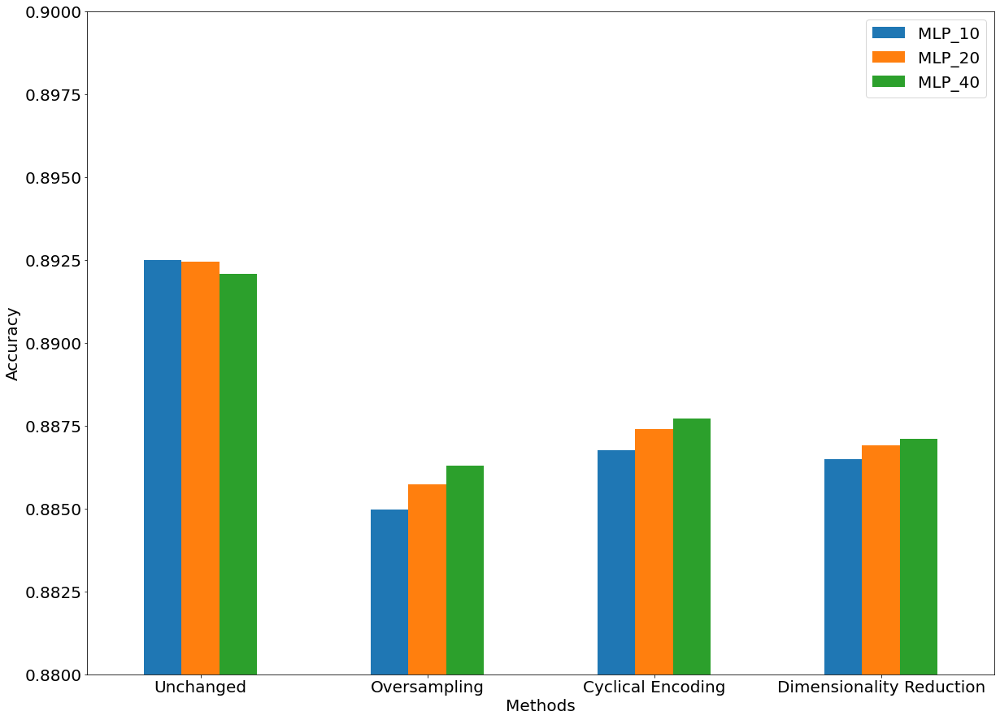

In [100]:
mlp_accur_df.plot.bar(figsize=(20,15), rot=0, fontsize=20)
plt.ylim(0.88,0.90)
plt.xlabel('Methods', fontsize=20)
plt.ylabel('Accuracy', fontsize=20)
plt.legend(loc=1, prop={'size': 20})

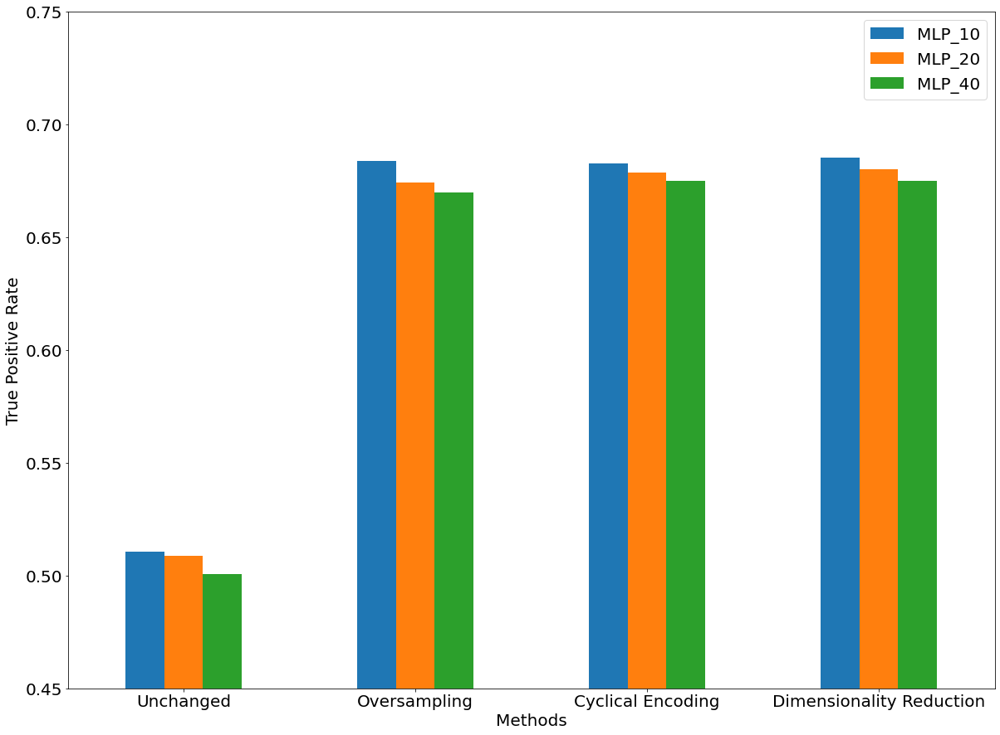

In [98]:
mlp_TPR_df.plot.bar(figsize=(20,15), rot=0, fontsize=20)
plt.ylim(0.45,0.75)
plt.xlabel('Methods', fontsize=20)
plt.ylabel('True Positive Rate', fontsize=20)
plt.legend(loc=1, prop={'size': 20})

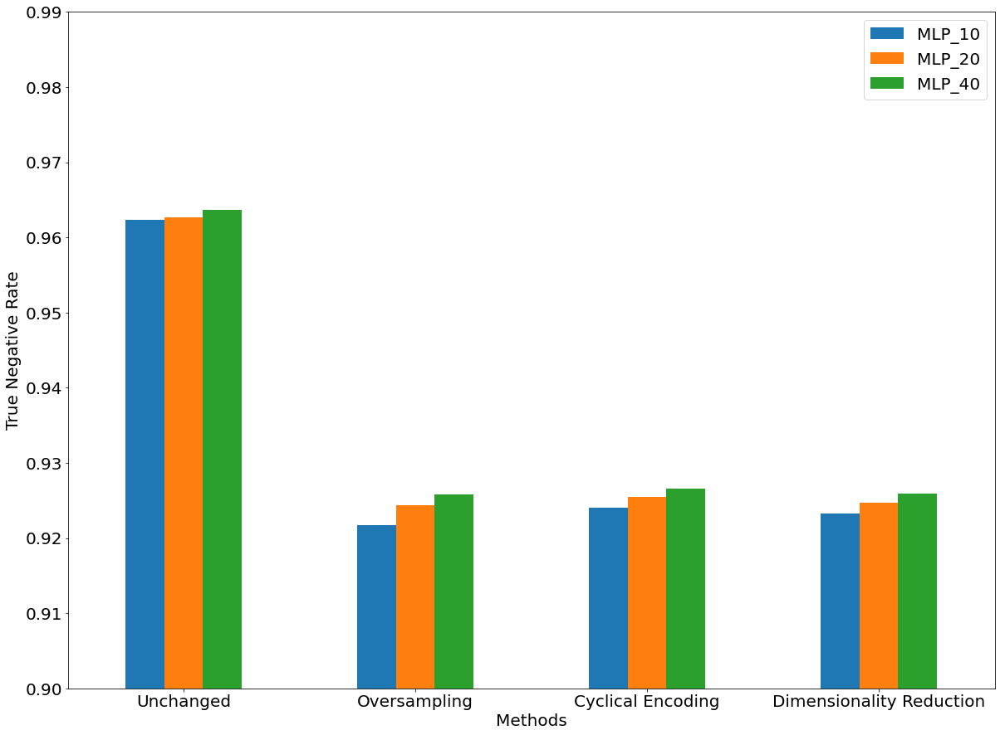

In [99]:
mlp_TNR_df.plot.bar(figsize=(20,15), rot=0, fontsize=20)
plt.ylim(0.90,0.99)
plt.xlabel('Methods', fontsize=20)
plt.ylabel('True Negative Rate', fontsize=20)
plt.legend(loc=1, prop={'size': 20})

In [20]:
#LightGBM Data
LGB_Accuracy=[0.9036766693701003, 0.870559610705596, 0.881346309813463, 0.8702406055690726]
LGB_TPR=[0.5991958041958043, 0.6262237762237763, 0.6406818181818181, 0.5118006993006993]
LGB_TNR=[0.9593732011512636, 0.9152542372881354, 0.9253693636072916, 0.9358074832107448]
LGB_F1=[0.6579407563584805, 0.6004066940516093, 0.6253733208829235, 0.5503322261067074]

In [21]:
#Voting Classifier Data
VC_Accuracy=[0.9029521492295214, 0.8820194647201948, 0.8823033252230335, 0.8656663963233306]
VC_TPR=[0.5490034965034964, 0.7276748251748255, 0.7356818181818181, 0.6125349650349653]
VC_TNR=[0.9676974736168854, 0.9102526383114803, 0.9091237607930925, 0.9119699392388874]
VC_F1=[0.636153395768782, 0.6561417734019267, 0.6591090430278101, 0.5850835808490237]

In [27]:
accuracy_data = {'SVM':SVM_Accuracy, 'RF':RF_Accuracy, 'LGB':LGB_Accuracy, 'VC':VC_Accuracy,'MLP_10':MLP_10_Accuracy, 'MLP_20':MLP_20_Accuracy, 'MLP_40':MLP_40_Accuracy, 'Methods':methods}
TPR_data = {'SVM':SVM_TPR, 'RF':RF_TPR, 'LGB':LGB_TPR, 'VC':VC_TPR, 'MLP_10':MLP_10_TPR, 'MLP_20':MLP_20_TPR, 'MLP_40':MLP_40_TPR,'Methods':methods}
TNR_data = {'SVM':SVM_TNR, 'RF':RF_TNR, 'LGB':LGB_TNR, 'VC':VC_TNR, 'MLP_10':MLP_10_TNR, 'MLP_20':MLP_20_TNR, 'MLP_40':MLP_40_TNR,'Methods':methods}
F1_data = {'SVM':SVM_F1, 'RF':RF_F1, 'LGB':LGB_F1, 'VC':VC_F1, 'MLP_10':MLP_10_F1, 'MLP_20':MLP_20_F1, 'MLP_40':MLP_40_F1,'Methods':methods}

In [28]:
accuracy_df = pd.DataFrame.from_dict(accuracy_data).set_index('Methods')
tpr_df = pd.DataFrame.from_dict(TPR_data).set_index('Methods')
tnr_df = pd.DataFrame.from_dict(TNR_data).set_index('Methods')
f1_df = pd.DataFrame.from_dict(F1_data) .set_index('Methods')

In [29]:
accuracy_data = {'SVM':SVM_Accuracy, 'RF':RF_Accuracy, 'LGB':LGB_Accuracy, 'VC':VC_Accuracy,'Methods':methods}
TPR_data = {'SVM':SVM_TPR, 'RF':RF_TPR, 'LGB':LGB_TPR, 'VC':VC_TPR,'Methods':methods}
TNR_data = {'SVM':SVM_TNR, 'RF':RF_TNR, 'LGB':LGB_TNR, 'VC':VC_TNR,'Methods':methods}
F1_data = {'SVM':SVM_F1, 'RF':RF_F1, 'LGB':LGB_F1, 'VC':VC_F1,'Methods':methods}

accuracy_df = pd.DataFrame.from_dict(accuracy_data).set_index('Methods')
tpr_df = pd.DataFrame.from_dict(TPR_data).set_index('Methods')
tnr_df = pd.DataFrame.from_dict(TNR_data).set_index('Methods')
f1_df = pd.DataFrame.from_dict(F1_data) .set_index('Methods')

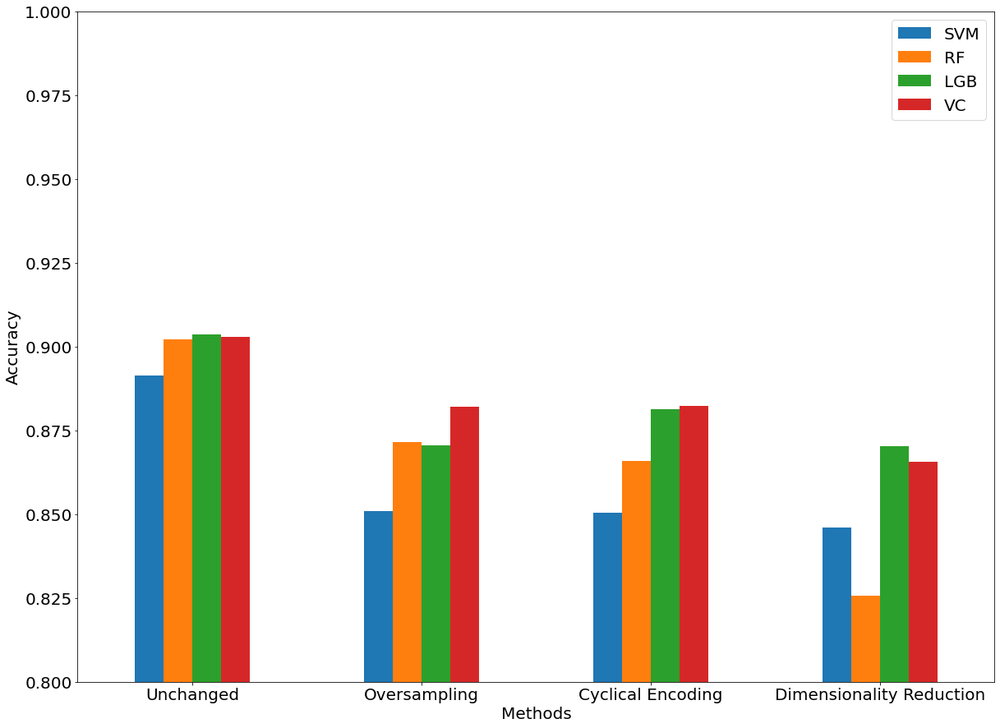

In [30]:
accuracy_df.plot.bar(figsize=(20,15), rot=0, fontsize=20)
plt.ylim(0.8,1.0)
plt.xlabel('Methods', fontsize=20)
plt.ylabel('Accuracy', fontsize=20)
plt.legend(loc=1, prop={'size': 20})

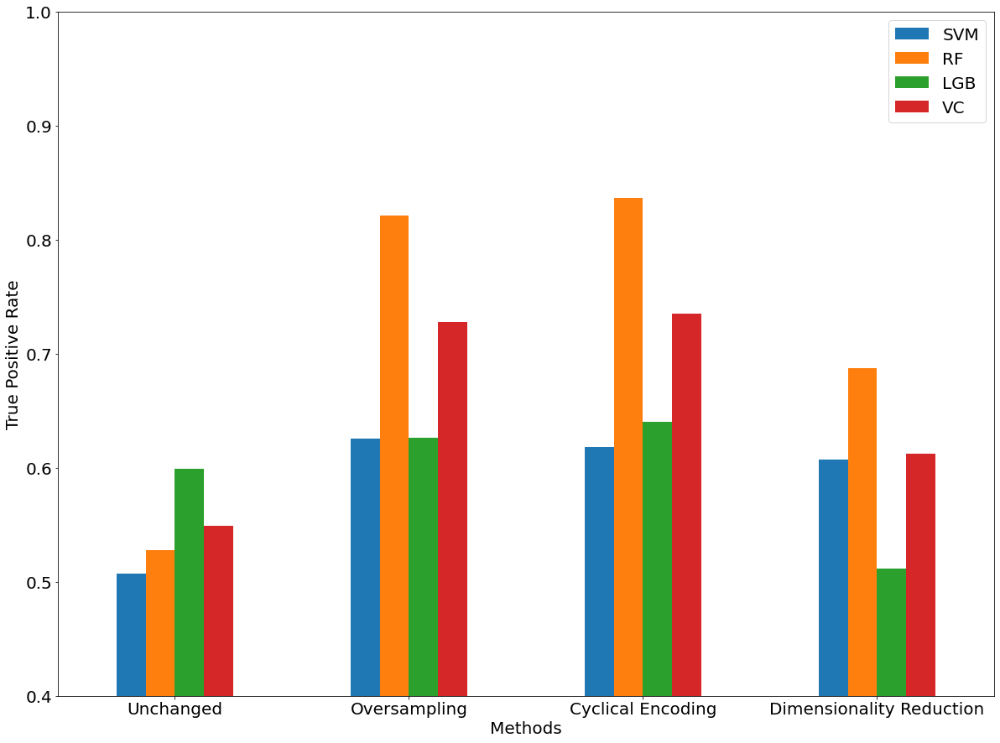

In [31]:
tpr_df.plot.bar(figsize=(20,15), rot=0, fontsize=20)
plt.ylim(0.4,1)
plt.xlabel('Methods', fontsize=20)
plt.ylabel('True Positive Rate', fontsize=20)
plt.legend(loc=1, prop={'size': 20})

In [104]:
accuracy_data = {'SVM':SVM_Accuracy, 'RF':RF_Accuracy, 'LGB':LGB_Accuracy, 'VC':VC_Accuracy,'MLP_10':MLP_10_Accuracy, 'Methods':methods}
TPR_data = {'SVM':SVM_TPR, 'RF':RF_TPR, 'LGB':LGB_TPR, 'VC':VC_TPR, 'MLP_10':MLP_10_TPR,'Methods':methods}
TNR_data = {'SVM':SVM_TNR, 'RF':RF_TNR, 'LGB':LGB_TNR, 'VC':VC_TNR, 'MLP_10':MLP_10_TNR, 'Methods':methods}
F1_data = {'SVM':SVM_F1, 'RF':RF_F1, 'LGB':LGB_F1, 'VC':VC_F1, 'MLP_10':MLP_10_F1, 'Methods':methods}

accuracy_df = pd.DataFrame.from_dict(accuracy_data).set_index('Methods')
tpr_df = pd.DataFrame.from_dict(TPR_data).set_index('Methods')
tnr_df = pd.DataFrame.from_dict(TNR_data).set_index('Methods')
f1_df = pd.DataFrame.from_dict(F1_data) .set_index('Methods')

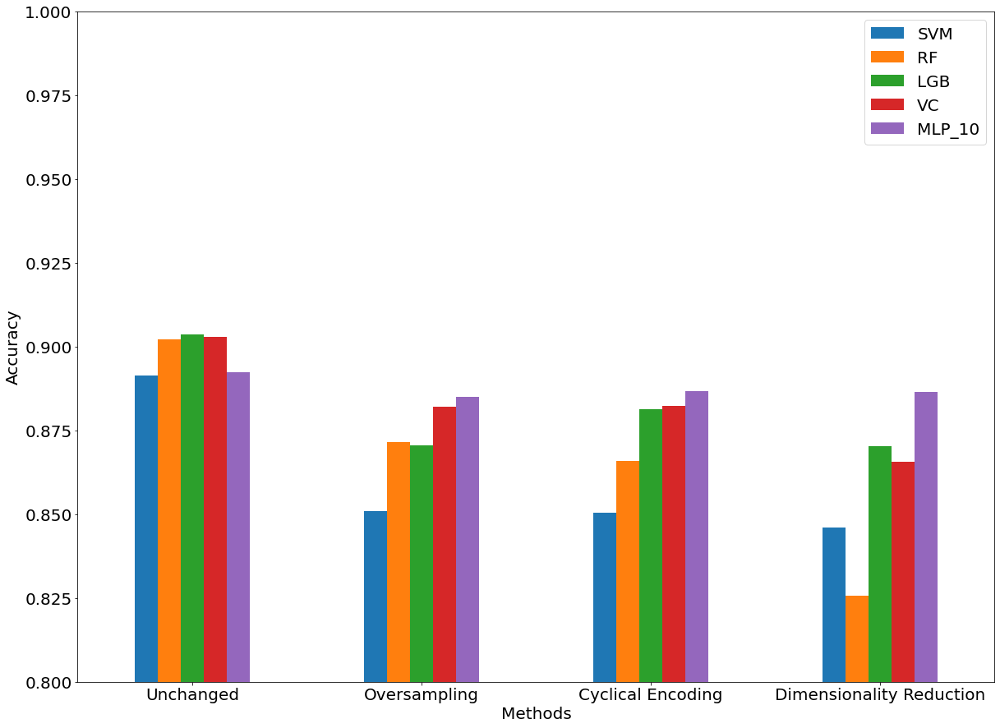

In [105]:
accuracy_df.plot.bar(figsize=(20,15), rot=0, fontsize=20)
plt.ylim(0.8,1.0)
plt.xlabel('Methods', fontsize=20)
plt.ylabel('Accuracy', fontsize=20)
plt.legend(loc=1, prop={'size': 20})

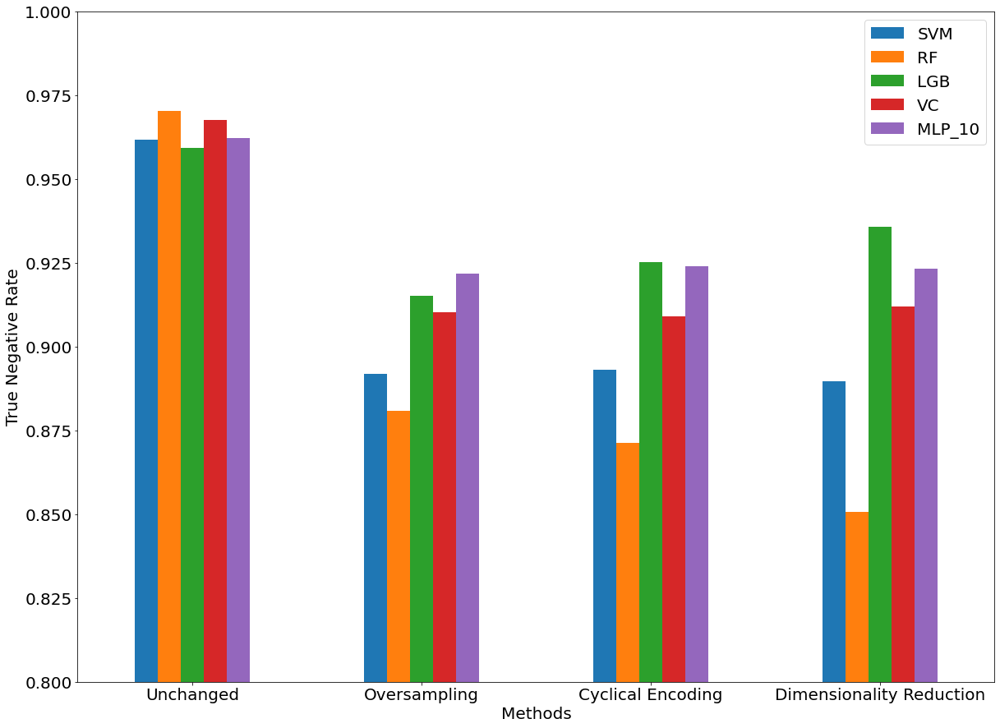

In [106]:
tnr_df.plot.bar(figsize=(20,15), rot=0, fontsize=20)
plt.ylim(0.8,1)
plt.xlabel('Methods', fontsize=20)
plt.ylabel('True Negative Rate', fontsize=20)
plt.legend(loc=1, prop={'size': 20})

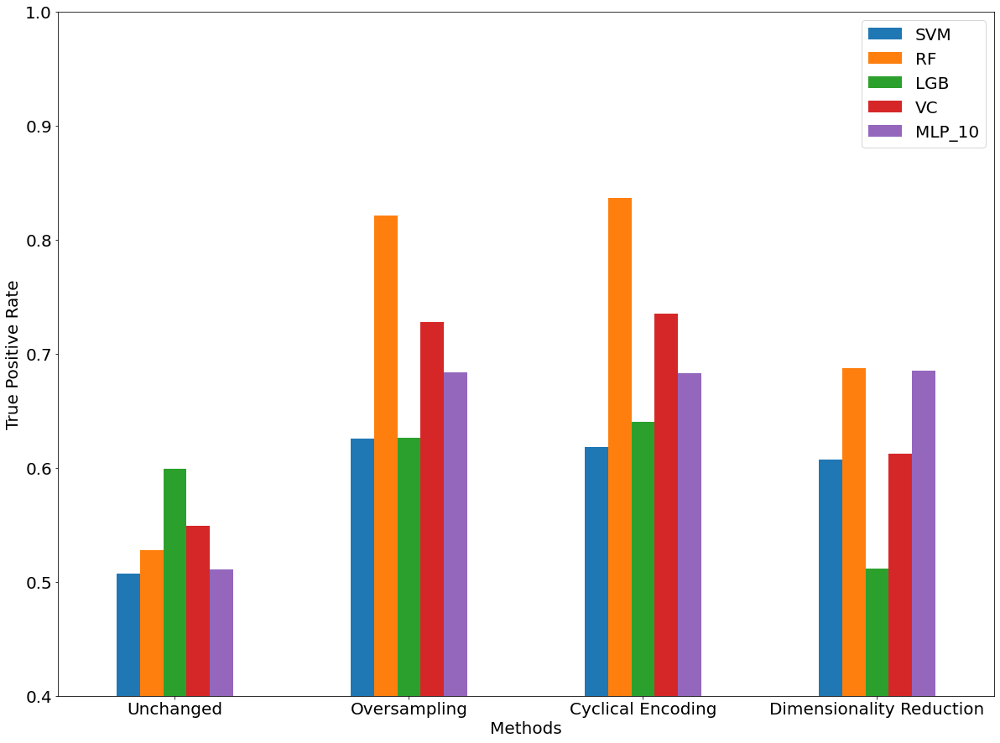

In [107]:
tpr_df.plot.bar(figsize=(20,15), rot=0, fontsize=20)
plt.ylim(0.4,1)
plt.xlabel('Methods', fontsize=20)
plt.ylabel('True Positive Rate', fontsize=20)
plt.legend(loc=1, prop={'size': 20})

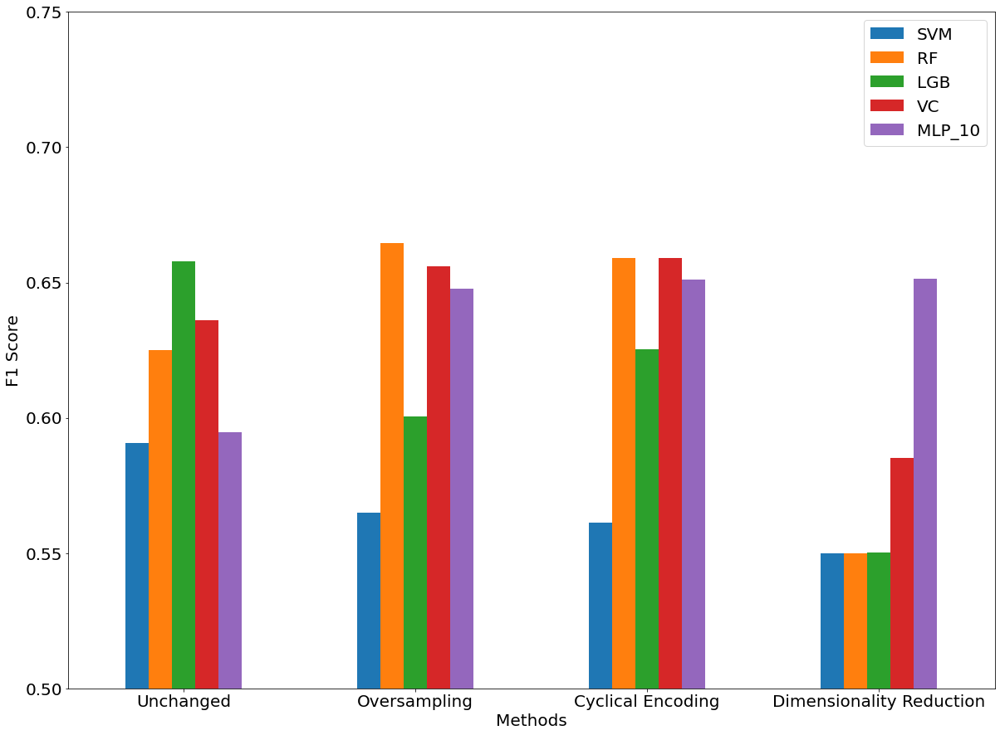

In [108]:
import matplotlib.pyplot as plt
f1_df.plot.bar(figsize=(20,15), rot=0, fontsize=20)
plt.ylim(0.5,0.75)
plt.xlabel('Methods', fontsize=20)
plt.ylabel('F1 Score', fontsize=20)
plt.legend(loc=1, prop={'size': 20})

In [ ]:
#Questions we want to Answer:
#What are the best MLP parameters? already addressed
#What is the best Machine Learning algorithm? pretty much addressed
#Which data pre-processing step is most effective? we can do Statistical Testing for this.

In [82]:
from scipy import stats

In [120]:
#SVM
unchanged = [0.5666316894018888, 0.6050420168067229, 0.5875127942681679, 0.5810276679841897, 0.5875127942681679, 0.615071283095723, 0.5638297872340425, 0.5711318795430944, 0.6, 0.6065747613997879, 0.6038894575230297, 0.5636743215031316, 0.624031007751938, 0.5904954499494439, 0.5866141732283464, 0.5800000000000001, 0.5526590198123045, 0.5933202357563852, 0.6068965517241379, 0.6228513650151668, 0.6026026026026026, 0.6140177690029616, 0.6004056795131845, 0.6118811881188119, 0.5851172273190621, 0.5808444902162718, 0.5928934010152284, 0.6025768087215064, 0.5809128630705395, 0.5811088295687885, 0.5893223819301847, 0.6086956521739131, 0.595289079229122, 0.59244126659857, 0.5743380855397148, 0.6018054162487463, 0.5801217038539553, 0.6043613707165109, 0.564206268958544, 0.5961165048543688, 0.5849246231155779, 0.5871559633027524, 0.5725725725725727, 0.60343087790111, 0.5919835560123331, 0.5966735966735968, 0.6087824351297405, 0.594818652849741, 0.6004228329809725, 0.5890688259109311, 0.592292089249493, 0.6025768087215064, 0.6329365079365079, 0.5852156057494866, 0.5626975763962065, 0.586, 0.5829042224510813, 0.572020725388601, 0.5840886203423967, 0.5880077369439071, 0.6008064516129032, 0.609375, 0.5997973657548126, 0.5806451612903226, 0.5667686034658511, 0.5711297071129707, 0.5833333333333334, 0.6105476673427991, 0.5711382113821137, 0.5881126173096977, 0.5838383838383838, 0.569672131147541, 0.5995893223819303, 0.5981500513874615, 0.6183673469387755, 0.5925925925925926, 0.5822267620020429, 0.6133603238866397, 0.5885947046843177, 0.5878661087866108, 0.5974282888229476, 0.5965621840242669, 0.580168776371308, 0.5814432989690722, 0.6081632653061224, 0.597165991902834, 0.5841392649903288, 0.5668449197860963, 0.5912334352701326, 0.5711382113821137, 0.6058700209643605, 0.5729166666666667, 0.5832471561530506, 0.5717234262125902, 0.6038500506585612, 0.5977249224405377, 0.6242299794661191, 0.5799793601651186, 0.5828220858895705, 0.5798319327731093]
oversample = [0.5523809523809524, 0.5693779904306221, 0.5478395061728396, 0.5299539170506912, 0.5754716981132076, 0.5806988352745424, 0.5590361445783133, 0.5506783719074222, 0.5740318906605922, 0.5609157808667212, 0.5535289452815225, 0.5643970467596391, 0.6006144393241166, 0.5698587127158556, 0.56353591160221, 0.5605700712589073, 0.5911251980982568, 0.580441640378549, 0.5725249424405219, 0.5811437403400308, 0.5729984301412873, 0.5696877380045697, 0.555045871559633, 0.5691946833463644, 0.5510204081632653, 0.5612903225806452, 0.5641434262948207, 0.5621212121212121, 0.5605095541401274, 0.5421591804570528, 0.5737704918032787, 0.5419254658385092, 0.5761047463175123, 0.5391304347826087, 0.560879811468971, 0.5632911392405062, 0.5771065182829888, 0.592063492063492, 0.5568000000000001, 0.5550314465408804, 0.5377358490566038, 0.5624509033778475, 0.55625, 0.5748218527315914, 0.5615141955835962, 0.5669781931464174, 0.5906656465187452, 0.5781250000000001, 0.5840130505709625, 0.5757097791798107, 0.5554668794892259, 0.574178027265437, 0.5628834355828221, 0.5421010425020049, 0.5651465798045603, 0.5535289452815225, 0.5395051875498803, 0.5831325301204819, 0.5896607431340873, 0.5343283582089553, 0.5578011317704122, 0.5523520485584218, 0.5668202764976957, 0.555732484076433, 0.5612403100775195, 0.5646687697160883, 0.5794392523364486, 0.6031496062992125, 0.5592948717948718, 0.5727848101265823, 0.5557251908396946, 0.5596774193548387, 0.5864197530864198, 0.5932864949258393, 0.5965770171149144, 0.5560821484992101, 0.5712037765538945, 0.5849802371541502, 0.5720858895705522, 0.5862619808306709, 0.5641025641025641, 0.5795275590551181, 0.5604575163398693, 0.5802861685214626, 0.5425867507886435, 0.5418641390205372, 0.5581749049429657, 0.5612582781456955, 0.5596837944664032, 0.5625485625485626, 0.562111801242236, 0.5450041288191577, 0.5385226370135029, 0.5421303656597773, 0.55625, 0.565799842395587, 0.5909090909090908, 0.5603174603174602, 0.5472, 0.5678627145085803]
cyc_enc = [0.5534591194968554, 0.5463414634146341, 0.5508145849495732, 0.5415384615384615, 0.5773195876288659, 0.5678601165695254, 0.5574572127139363, 0.5603864734299517, 0.5488441461595824, 0.5726004922067268, 0.5624496373892022, 0.551440329218107, 0.5774319066147859, 0.5680379746835443, 0.5524861878453039, 0.5609375, 0.5927099841521395, 0.5939490445859872, 0.5644171779141104, 0.574585635359116, 0.5727341964965726, 0.5688212927756653, 0.546021840873635, 0.5685039370078739, 0.5461847389558232, 0.5709677419354838, 0.5684877276326208, 0.5341519570222564, 0.5481239804241436, 0.5401459854014599, 0.5707154742096505, 0.5582137161084529, 0.5688524590163935, 0.5518905872888173, 0.5691699604743082, 0.5542359461599367, 0.5672609400324149, 0.5686900958466454, 0.5486725663716814, 0.5458786936236393, 0.5405405405405406, 0.5557299843014128, 0.5511684125705076, 0.565799842395587, 0.5598731165741475, 0.5571205007824727, 0.5979381443298969, 0.5543307086614174, 0.5748407643312102, 0.5655281969817315, 0.5523349436392915, 0.5671406003159557, 0.5619195046439628, 0.5517799352750808, 0.575206611570248, 0.5589383294301326, 0.5347003154574134, 0.5791190864600326, 0.5850120870265915, 0.5349544072948329, 0.546191247974068, 0.5549493374902573, 0.5509893455098935, 0.56304520222046, 0.5430566330488751, 0.5470635559131134, 0.56600790513834, 0.6025437201907791, 0.5682362330407023, 0.5664280031821798, 0.5523661753297129, 0.5513866231647635, 0.5725490196078431, 0.591155934833204, 0.5872888173773131, 0.5559055118110235, 0.5599999999999999, 0.584126984126984, 0.5613760750586396, 0.5864779874213836, 0.5712086220169362, 0.5623510722795869, 0.5582922824302134, 0.564686737184703, 0.5383386581469648, 0.5366242038216561, 0.5648148148148148, 0.5583333333333333, 0.5580286168521462, 0.5613760750586396, 0.567588932806324, 0.5392320534223707, 0.5503246753246753, 0.5308441558441558, 0.5615686274509804, 0.5640219952867243, 0.5795724465558195, 0.5563435776201734, 0.5563435776201734, 0.567524115755627]
dim_red = [0.5479233226837061, 0.5270816491511722, 0.5348837209302326, 0.5373364126250962, 0.552652414885194, 0.5549132947976878, 0.551440329218107, 0.5329052969502409, 0.5455927051671733, 0.5552825552825553, 0.5700483091787439, 0.5520581113801453, 0.5565081839438816, 0.5381526104417671, 0.5527559055118111, 0.5532245532245532, 0.5716560509554139, 0.5584615384615385, 0.5453160700685453, 0.5588697017268447, 0.5481139337952272, 0.568215892053973, 0.5434949961508853, 0.5464566929133858, 0.5277127244340358, 0.5589865399841646, 0.5522151898734177, 0.5373134328358209, 0.5295546558704454, 0.5182829888712241, 0.5636942675159237, 0.5371702637889687, 0.567237163814181, 0.533226581265012, 0.5523076923076923, 0.5279106858054226, 0.5646687697160883, 0.5614035087719298, 0.5385852090032154, 0.5376175548589343, 0.5323965651834504, 0.5377358490566038, 0.5505171042163882, 0.5520431765612953, 0.5363565285379204, 0.5395569620253163, 0.5930599369085174, 0.5373376623376622, 0.5408496732026143, 0.5622047244094488, 0.543151227236738, 0.551394422310757, 0.5490797546012269, 0.5272579332790887, 0.531328320802005, 0.5441527446300716, 0.5351223362273086, 0.5546623794212219, 0.5593495934959349, 0.5378670788253478, 0.5584, 0.5448963929393706, 0.5525291828793774, 0.5555555555555556, 0.5463035019455252, 0.5330151153540176, 0.5836575875486382, 0.5725552050473186, 0.5545023696682465, 0.5776699029126213, 0.5388198757763976, 0.537788385043755, 0.5615686274509804, 0.5796425796425796, 0.5698051948051949, 0.5339578454332553, 0.5445859872611465, 0.5718749999999999, 0.5431711145996859, 0.5763239875389409, 0.557556773688332, 0.5689519306540582, 0.5555555555555556, 0.5700483091787439, 0.5133437990580847, 0.5177584846093133, 0.5714285714285714, 0.5740432612312812, 0.5576619273301738, 0.5754495699765442, 0.5653206650831354, 0.5347166799680766, 0.5317460317460316, 0.5314009661835748, 0.5532245532245532, 0.5560747663551403, 0.5777080062794349, 0.5239968528717546, 0.5406698564593302, 0.5403677058353318]

print(stats.ttest_rel(unchanged,oversample), stats.ttest_rel(unchanged, cyc_enc), stats.ttest_rel(unchanged, dim_red)) #reject the null hypothesis
print()
print(stats.ttest_rel(oversample, cyc_enc), stats.ttest_rel(oversample, dim_red))
print()
print(stats.ttest_rel(cyc_enc,dim_red))
print()
print(stats.shapiro(unchanged),stats.shapiro(oversample),stats.shapiro(cyc_enc),stats.shapiro(dim_red))

Ttest_relResult(statistic=14.329098784758658, pvalue=7.003099546058258e-26) Ttest_relResult(statistic=16.028367552478937, pvalue=2.916440878288824e-29) Ttest_relResult(statistic=20.13387437380293, pvalue=8.854442513118257e-37)

Ttest_relResult(statistic=3.887121858366436, pvalue=0.0001835885763292473) Ttest_relResult(statistic=11.561767446690036, pvalue=4.468138670083375e-20)

Ttest_relResult(statistic=9.660304508525762, pvalue=6.027883922740353e-16)

ShapiroResult(statistic=0.9921332001686096, pvalue=0.830790638923645) ShapiroResult(statistic=0.9869630932807922, pvalue=0.4351497292518616) ShapiroResult(statistic=0.9833592176437378, pvalue=0.24049106240272522) ShapiroResult(statistic=0.9879390001296997, pvalue=0.5037211775779724)


In [121]:
#RF
unchanged = [0.6030042918454936, 0.6515463917525773, 0.624360286591607, 0.5945945945945945, 0.6267087276550998, 0.637223974763407, 0.5729729729729729, 0.6099585062240663, 0.6356107660455487, 0.6411075612353568, 0.6211312700106724, 0.6139438085327783, 0.6424974823766365, 0.6428571428571429, 0.6351758793969849, 0.6137787056367432, 0.6043613707165109, 0.6213197969543147, 0.638971315529179, 0.667342799188641, 0.6345957011258956, 0.6592964824120603, 0.620123203285421, 0.6394422310756973, 0.6542443064182194, 0.6085150571131879, 0.626680455015512, 0.634097706879362, 0.6006322444678609, 0.6221294363256785, 0.6303664921465969, 0.6584867075664622, 0.6173913043478261, 0.6303901437371663, 0.6166495375128468, 0.625254582484725, 0.6222684703433924, 0.6333687566418702, 0.6091370558375634, 0.6237623762376237, 0.6266531027466938, 0.6552072800808898, 0.6114519427402864, 0.6495375128468653, 0.6163522012578616, 0.6355932203389831, 0.6372745490981964, 0.6200417536534447, 0.6253934942287512, 0.6231884057971016, 0.6424759871931698, 0.6157024793388429, 0.6338461538461538, 0.6336842105263158, 0.6053169734151329, 0.615859938208033, 0.614900314795383, 0.5844845908607863, 0.6075433231396534, 0.616326530612245, 0.65, 0.6599394550958628, 0.6539618856569709, 0.5932028836251287, 0.6150670794633644, 0.6121593291404612, 0.6199575371549894, 0.6531440162271807, 0.6150537634408602, 0.5950590762620838, 0.6274509803921569, 0.6401630988786953, 0.6038961038961038, 0.6256517205422314, 0.623678646934461, 0.6149131767109296, 0.6125385405960945, 0.6432865731462926, 0.6097814776274714, 0.6325878594249201, 0.6231155778894472, 0.6381243628950051, 0.5911542610571736, 0.6269270298047277, 0.6184074457083765, 0.6428571428571429, 0.6206896551724138, 0.5878378378378378, 0.639751552795031, 0.608695652173913, 0.6491405460060666, 0.6002120890774125, 0.6413155190133607, 0.6253934942287512, 0.6517311608961305, 0.6272066458982346, 0.6283280085197019, 0.6252631578947369, 0.6203995793901156, 0.6094240837696334]
oversample = [0.6750496360026472, 0.654014598540146, 0.6392830470500374, 0.6633522727272727, 0.6623931623931625, 0.658008658008658, 0.6794326241134752, 0.6773296244784424, 0.6553672316384181, 0.6647187728268809, 0.6629134412385644, 0.6754143646408839, 0.6807351940095303, 0.6802325581395349, 0.642909090909091, 0.6899930020993703, 0.6472675656493967, 0.6662011173184358, 0.6844563042028018, 0.6656934306569343, 0.652767792954709, 0.657514450867052, 0.6638537271448665, 0.6695402298850575, 0.6385809312638582, 0.6503244412400866, 0.6475924633635729, 0.6652601969057664, 0.6551971326164876, 0.6487252124645891, 0.6630211893369788, 0.6390977443609022, 0.6699232379623168, 0.676680972818312, 0.6331658291457286, 0.6599856836077309, 0.6662125340599456, 0.6796929518492673, 0.6775336640680367, 0.6840659340659341, 0.6425992779783394, 0.6474719101123596, 0.6569847856154909, 0.6676279740447008, 0.6574945691527878, 0.668041237113402, 0.6561829878484632, 0.6353944562899787, 0.6767746381805652, 0.6617969320672024, 0.6709310589907604, 0.6846965699208444, 0.6708246708246709, 0.6789772727272727, 0.6408345752608047, 0.669029057406095, 0.6485714285714285, 0.6755059316120028, 0.6734397677793904, 0.6652601969057665, 0.6781857451403888, 0.6643356643356644, 0.6759388038942976, 0.6666666666666666, 0.6625000000000001, 0.6681096681096681, 0.6690493209435311, 0.6653333333333333, 0.6826516220028208, 0.653631284916201, 0.6629448709002095, 0.647847565278758, 0.6689702833448514, 0.6736842105263158, 0.6712611991729841, 0.6535764375876578, 0.6541244573082489, 0.6817518248175183, 0.6622428666224287, 0.6522948539638387, 0.6502177068214804, 0.670886075949367, 0.6666666666666666, 0.680939226519337, 0.6526743398781314, 0.6630211893369787, 0.6786743515850144, 0.6557377049180328, 0.6772853185595568, 0.6866894197952218, 0.6858789625360231, 0.6217616580310881, 0.6617754952311078, 0.6671328671328671, 0.6689944134078212, 0.6875444839857652, 0.6739576213260424, 0.658605974395448, 0.6704464918497519, 0.6782608695652175]
cyc_enc = [0.663387210119466, 0.6541405706332637, 0.6589200273410799, 0.6365503080082134, 0.6630508474576271, 0.657967032967033, 0.6459038591740014, 0.6404958677685951, 0.6536650975117687, 0.6570812365204889, 0.6748466257668712, 0.6634078212290502, 0.6809688581314879, 0.6750524109014675, 0.6448160535117058, 0.6463245492371705, 0.6662011173184357, 0.6510381781647689, 0.6451187335092348, 0.6575154426904599, 0.6393552719946274, 0.6684672518568535, 0.6643694004135079, 0.6450331125827815, 0.6558044806517311, 0.6638655462184874, 0.6802529866479269, 0.6599866399465598, 0.647945205479452, 0.6643882433356119, 0.6709129511677283, 0.6482577251808022, 0.6717770034843206, 0.6410958904109589, 0.6762491444216291, 0.6416382252559728, 0.6657400972897846, 0.6599597585513077, 0.6345381526104418, 0.6472626472626474, 0.6441844459738473, 0.6662087912087913, 0.6355400696864111, 0.6759002770083102, 0.6590141796083727, 0.6851457000710733, 0.6585695006747637, 0.6584531143052704, 0.664776754075124, 0.6575154426904599, 0.6625086625086625, 0.6548188653451811, 0.663973063973064, 0.6680327868852458, 0.6661971830985914, 0.6419753086419753, 0.6647966339410939, 0.6634146341463415, 0.6703221384509939, 0.6568166554734722, 0.6473429951690821, 0.6549152542372881, 0.6522911051212937, 0.657496561210454, 0.6416144745998609, 0.6615916955017301, 0.6801112656467315, 0.6763888888888889, 0.6511309115832762, 0.66016713091922, 0.6412825651302605, 0.6755059316120029, 0.6611796982167354, 0.6802529866479269, 0.6666666666666666, 0.6580381471389646, 0.6479066575154426, 0.6744345442083619, 0.634681288553804, 0.660300136425648, 0.6477900552486188, 0.6620013995801259, 0.6803977272727273, 0.6434901158827538, 0.6404416839199447, 0.6574585635359116, 0.6328437917222963, 0.6753434562545192, 0.6594594594594594, 0.6496902959394357, 0.6689513365318711, 0.670406732117812, 0.6781362007168458, 0.657496561210454, 0.6533973919011667, 0.6703755215577191, 0.66484268125855, 0.6746478873239437, 0.6629134412385644, 0.6606397774687065]
dim_red = [0.5724690458849234, 0.5318302387267904, 0.5706174591909156, 0.5127458120903132, 0.5692307692307692, 0.5074424898511503, 0.5747460087082727, 0.5418106427090532, 0.5430107526881719, 0.5623616236162362, 0.5768958185683911, 0.5623616236162362, 0.5582028590878149, 0.5541995692749462, 0.5438713998660415, 0.5201916495550993, 0.5359385903698535, 0.5448548812664907, 0.539509536784741, 0.5445881552076243, 0.5632653061224491, 0.5563002680965147, 0.543731778425656, 0.541583499667332, 0.5375603032391454, 0.5615550755939525, 0.5746799431009957, 0.5227882037533512, 0.5541490857946554, 0.5464949928469242, 0.5655270655270656, 0.5236508994003998, 0.6041222459132907, 0.5171974522292994, 0.5529157667386609, 0.5636896046852123, 0.546949965729952, 0.558107167710508, 0.538243626062323, 0.5274115197779321, 0.5376196990424077, 0.5163442294863242, 0.5308641975308642, 0.5488308115543329, 0.5427204374572796, 0.5356890459363958, 0.5486725663716815, 0.5509761388286334, 0.5568181818181818, 0.5662983425414364, 0.5406143344709897, 0.5660899653979239, 0.5698245614035088, 0.5765379113018597, 0.5506419400855921, 0.5689404934687953, 0.5352941176470587, 0.5639534883720929, 0.5351535836177475, 0.5587213342599027, 0.5348189415041782, 0.5454545454545454, 0.5710247349823321, 0.548317823908375, 0.5118549511854951, 0.5071151358344114, 0.5499316005471956, 0.5691868758915835, 0.5431928127159641, 0.5559515324305061, 0.561624649859944, 0.564655172413793, 0.5537366548042704, 0.5648213034337772, 0.5542168674698795, 0.5421602787456447, 0.5424430641821946, 0.5808257522743177, 0.5190735694822889, 0.5595489781536294, 0.5313553607552259, 0.561829878484632, 0.5729402872260015, 0.5521292217327459, 0.5189263592567103, 0.5367156208277704, 0.5440874914559126, 0.5647940074906368, 0.5535324107793154, 0.53125, 0.5460750853242321, 0.5701943844492441, 0.5621301775147929, 0.5503931379556826, 0.5518672199170125, 0.5704175513092711, 0.5602202339986235, 0.5336963921034719, 0.5883222468588323, 0.5284052019164954]

print(stats.ttest_rel(unchanged,oversample), stats.ttest_rel(unchanged, cyc_enc), stats.ttest_rel(unchanged, dim_red)) #reject the null hypothesis
print()
print(stats.ttest_rel(oversample, cyc_enc), stats.ttest_rel(oversample, dim_red))
print()
print(stats.ttest_rel(cyc_enc,dim_red))
print()
print(stats.shapiro(unchanged),stats.shapiro(oversample),stats.shapiro(cyc_enc),stats.shapiro(dim_red))

Ttest_relResult(statistic=-17.377253261288512, pvalue=7.819205912018236e-32) Ttest_relResult(statistic=-16.233496632315756, pvalue=1.1676477340859428e-29) Ttest_relResult(statistic=28.2304232733042, pvalue=3.746722963645067e-49)

Ttest_relResult(statistic=2.874330796564385, pvalue=0.004956089232466637) Ttest_relResult(statistic=51.81057433528644, pvalue=1.5441085061097768e-73)

Ttest_relResult(statistic=62.88448530139598, pvalue=1.2730810175024833e-81)

ShapiroResult(statistic=0.9929264783859253, pvalue=0.8835816979408264) ShapiroResult(statistic=0.9779576659202576, pvalue=0.09203531593084335) ShapiroResult(statistic=0.9801211953163147, pvalue=0.1358530968427658) ShapiroResult(statistic=0.9880844950675964, pvalue=0.5144592523574829)


In [123]:
#LightGBM

unchanged = [0.648023143683703, 0.67444120505345, 0.6589147286821705, 0.6432637571157497, 0.660919540229885, 0.6755980861244019, 0.63220675944334, 0.6401551891367605, 0.663489037178265, 0.6653543307086616, 0.6821256038647342, 0.6569484936831875, 0.6818181818181818, 0.6549707602339181, 0.6390977443609022, 0.6394686907020872, 0.6532567049808429, 0.6516007532956685, 0.6551094890510948, 0.672300469483568, 0.6580166821130676, 0.6691800188501414, 0.6462128475551293, 0.6615969581749049, 0.6640394088669951, 0.6278381046396841, 0.6724470134874759, 0.6524559777571827, 0.6555118110236221, 0.6628352490421455, 0.6621880998080614, 0.6873857404021937, 0.6592741935483871, 0.6521739130434783, 0.6519654841802491, 0.6610009442870632, 0.6510721247563354, 0.6736641221374046, 0.6321839080459771, 0.6553990610328638, 0.6415094339622641, 0.6743075453677173, 0.6457739791073125, 0.6583011583011582, 0.6476377952755906, 0.6726190476190477, 0.6653919694072659, 0.6679649464459592, 0.6541501976284585, 0.6660287081339713, 0.6666666666666666, 0.6419753086419754, 0.6806482364156339, 0.6550048590864918, 0.6393129770992367, 0.6616257088846881, 0.6450381679389313, 0.6393762183235867, 0.6538090646094503, 0.6466165413533834, 0.6654170571696345, 0.6778087279480036, 0.6629422718808194, 0.6488038277511962, 0.6562804284323271, 0.6459143968871596, 0.6560319042871386, 0.6893295561850803, 0.6454106280193237, 0.6507936507936508, 0.6692015209125475, 0.673076923076923, 0.6646942800788954, 0.6750483558994197, 0.6704980842911877, 0.6374650512581547, 0.6430622009569378, 0.6756238003838771, 0.6359175662414132, 0.6666666666666666, 0.6435921421889617, 0.6622390891840607, 0.6346346346346345, 0.6438095238095239, 0.6487523992322457, 0.6622137404580153, 0.6390977443609022, 0.6456852791878174, 0.6741363211951447, 0.6558317399617591, 0.6761633428300096, 0.667953667953668, 0.6809756097560975, 0.6485436893203884, 0.6660395108184384, 0.6666666666666666, 0.6828322017458778, 0.6581782566111655, 0.65748031496063, 0.64]
oversample = [0.6106594399277328, 0.6062846580406654, 0.601063829787234, 0.5850120870265915, 0.6284722222222222, 0.6190061028770706, 0.5693822739480753, 0.5674846625766872, 0.5894039735099338, 0.6269477543538039, 0.5972850678733032, 0.6248912097476066, 0.6232558139534883, 0.5785770132916341, 0.603201347935973, 0.6042031523642731, 0.5410764872521245, 0.5896907216494847, 0.5754646840148698, 0.6022913256955811, 0.6107266435986158, 0.6047700170357752, 0.5909849749582637, 0.5722670579603816, 0.5651821862348178, 0.6012488849241748, 0.6223404255319149, 0.6137123745819397, 0.6190476190476191, 0.6278260869565218, 0.5787304204451774, 0.5803503427265803, 0.5667752442996743, 0.6134969325153374, 0.612141652613828, 0.6069565217391304, 0.6145833333333333, 0.5824345146379045, 0.577301161751564, 0.5896226415094339, 0.6085440278988666, 0.5932203389830509, 0.5838509316770187, 0.6084089035449299, 0.5639344262295082, 0.6316725978647686, 0.6233766233766235, 0.5948808473080319, 0.58272800645682, 0.5972558514931396, 0.6092362344582594, 0.5924627519719544, 0.6259673258813413, 0.6213592233009709, 0.5982142857142857, 0.6240276577355228, 0.5596330275229358, 0.604982206405694, 0.5974025974025975, 0.5862966175195143, 0.5735623599701271, 0.5866885784716517, 0.6089193825042882, 0.6139294926913157, 0.5517241379310345, 0.6065428824049514, 0.6390845070422534, 0.6480541455160744, 0.5652173913043479, 0.600896860986547, 0.6242578456318915, 0.6067019400352733, 0.6253321523472097, 0.6370896184560781, 0.6111603188662533, 0.6116838487972508, 0.5502392344497608, 0.6025437201907791, 0.6051464063886425, 0.6183745583038869, 0.6038910505836576, 0.59375, 0.6138613861386137, 0.604130808950086, 0.5718725718725718, 0.614050303555941, 0.6048454469507101, 0.6014625228519196, 0.5461365341335334, 0.5768357305071914, 0.6321934945788157, 0.5992907801418439, 0.6308370044052862, 0.6163301141352063, 0.5367904695164681, 0.6545454545454545, 0.5954198473282443, 0.6195462478184991, 0.6221033868092691, 0.614019520851819]
cyc_enc = [0.6014109347442681, 0.6527415143603132, 0.6385542168674699, 0.6025531914893616, 0.6219931271477664, 0.6220472440944882, 0.6010362694300518, 0.6103448275862069, 0.626890756302521, 0.6190900981266727, 0.6338147833474936, 0.6293823038397328, 0.6594684385382059, 0.6215753424657533, 0.6047297297297296, 0.6166807076663858, 0.6240276577355228, 0.6422628951747088, 0.6286672254819783, 0.6321155480033984, 0.6028309741881764, 0.628237259816207, 0.623263888888889, 0.6450000000000001, 0.6252129471890971, 0.6127366609294321, 0.636755823986195, 0.628992628992629, 0.6251082251082252, 0.6172006745362564, 0.629948364888124, 0.6245847176079734, 0.5992907801418439, 0.6086956521739131, 0.619718309859155, 0.6368330464716008, 0.6240276577355228, 0.6209262435677531, 0.6110638297872341, 0.6203941730934018, 0.6075731497418244, 0.6314893617021275, 0.6069565217391304, 0.6343537414965986, 0.6074847693646649, 0.648695652173913, 0.6272493573264781, 0.6270096463022509, 0.6226912928759895, 0.6351118760757315, 0.6179001721170395, 0.6299745977984759, 0.6562242374278648, 0.637901861252115, 0.6024518388791594, 0.611346316680779, 0.6238217652099401, 0.6065428824049514, 0.62751677852349, 0.6312236286919832, 0.6341045415595544, 0.6362126245847176, 0.6312178387650086, 0.6395851339671564, 0.6036113499570077, 0.6255355612682091, 0.647746243739566, 0.6550290939318372, 0.612280701754386, 0.614019520851819, 0.638752052545156, 0.6419327006039689, 0.6321334503950834, 0.6291161178509532, 0.6349480968858131, 0.6372712146422629, 0.6135181975736568, 0.6591107236268527, 0.6060606060606061, 0.6235093696763203, 0.6211490424646129, 0.6454935622317596, 0.6204444444444445, 0.6148705096073517, 0.6238217652099401, 0.6247848537005163, 0.618657937806874, 0.6083853702051739, 0.6296296296296297, 0.6365914786967418, 0.6247906197654941, 0.6341045415595544, 0.6365217391304349, 0.6044444444444443, 0.6196013289036545, 0.6272493573264781, 0.6229787234042553, 0.6325823223570191, 0.6214099216710183, 0.6303972366148533]
dim_red = [0.5551330798479088, 0.5437079731027857, 0.48356807511737093, 0.5426052889324192, 0.5727788279773157, 0.5508637236084454, 0.5321888412017167, 0.5389797882579404, 0.5665399239543726, 0.5750487329434699, 0.5532319391634981, 0.5739130434782609, 0.575925925925926, 0.5532319391634981, 0.5015625, 0.5194312796208531, 0.5387596899224807, 0.5596330275229358, 0.45808383233532934, 0.5533980582524272, 0.5631970260223048, 0.5755656108597285, 0.5592417061611374, 0.5555555555555556, 0.5668549905838042, 0.5657142857142857, 0.5689655172413792, 0.5508870214752567, 0.5317919075144508, 0.5476635514018691, 0.5378640776699029, 0.5513307984790874, 0.5932367149758454, 0.5440613026819924, 0.5776930409914204, 0.5784797630799605, 0.5430210325047801, 0.5701275045537342, 0.5575642245480494, 0.5250000000000001, 0.4607170099160946, 0.5545112781954886, 0.5500485908649174, 0.5348837209302324, 0.5461465271170314, 0.5238095238095238, 0.5732838589981447, 0.5678776290630976, 0.5619999999999999, 0.5606060606060606, 0.5643939393939393, 0.5848172446110589, 0.5854579792256847, 0.511558538404176, 0.5530303030303031, 0.5509433962264151, 0.5300970873786408, 0.5402750491159136, 0.5269230769230768, 0.5429787234042552, 0.5675934803451582, 0.5432780847145489, 0.5752380952380952, 0.5480225988700566, 0.5198156682027649, 0.5492822966507177, 0.5791433891992552, 0.5823255813953488, 0.5601539942252166, 0.5516569200779727, 0.5611374407582939, 0.547918683446273, 0.5518590998043053, 0.5534351145038168, 0.5521235521235521, 0.540692235734331, 0.54421768707483, 0.5402124430955995, 0.5192850423330198, 0.5646594274432379, 0.5454545454545454, 0.5343811394891945, 0.5572815533980582, 0.5373423860329776, 0.5423728813559322, 0.5580487804878048, 0.5645756457564576, 0.5646594274432379, 0.5514018691588786, 0.5499524262607041, 0.5454545454545454, 0.5634920634920635, 0.5575642245480494, 0.5434995112414467, 0.5636192271442035, 0.5758157389635318, 0.5606207565470417, 0.5454545454545455, 0.5779904306220096, 0.5054294175715696]

print(stats.ttest_rel(unchanged,oversample), stats.ttest_rel(unchanged, cyc_enc), stats.ttest_rel(unchanged, dim_red)) #reject the null hypothesis
print()
print(stats.ttest_rel(oversample, cyc_enc), stats.ttest_rel(oversample, dim_red))
print()
print(stats.ttest_rel(cyc_enc,dim_red))
print()
print(stats.shapiro(unchanged),stats.shapiro(oversample),stats.shapiro(cyc_enc),stats.shapiro(dim_red))

Ttest_relResult(statistic=23.835194512887092, pvalue=8.377620460727436e-43) Ttest_relResult(statistic=26.060223826671137, pvalue=4.061302353722482e-46) Ttest_relResult(statistic=47.13558061412777, pvalue=1.2517546724922167e-69)

Ttest_relResult(statistic=-10.669125344252324, pvalue=3.815416928617151e-18) Ttest_relResult(statistic=16.693089529067752, pvalue=1.5311259924236978e-30)

Ttest_relResult(statistic=29.92835970954338, pvalue=2.105491843576636e-51)

ShapiroResult(statistic=0.9877456426620483, pvalue=0.4896460771560669) ShapiroResult(statistic=0.9771996140480042, pvalue=0.08025829493999481) ShapiroResult(statistic=0.9795465469360352, pvalue=0.12254466861486435) ShapiroResult(statistic=0.8974384665489197, pvalue=1.0735120667959563e-06)


In [127]:
#Voting Classifier

unchanged = [0.6188992731048807, 0.6435137895812054, 0.6425702811244981, 0.6214355948869222, 0.6433710174717369, 0.6585365853658538, 0.5963791267305645, 0.6119096509240246, 0.6383838383838384, 0.6556016597510372, 0.640495867768595, 0.623721881390593, 0.6539999999999999, 0.6478304742684158, 0.6277227722772276, 0.6206896551724138, 0.6149193548387096, 0.6369047619047619, 0.6412512218963832, 0.6666666666666666, 0.6423645320197044, 0.6679841897233202, 0.6295546558704453, 0.6366366366366366, 0.6335403726708075, 0.6164948453608247, 0.6458752515090543, 0.6485436893203884, 0.6182190378710338, 0.641851106639839, 0.637385086823289, 0.6719211822660098, 0.6394984326018809, 0.6324269889224572, 0.624360286591607, 0.6391129032258064, 0.6235897435897436, 0.6517766497461929, 0.6107178968655207, 0.6176762661370407, 0.6313725490196078, 0.672636815920398, 0.6321036889332003, 0.6531440162271807, 0.6142557651991614, 0.6577042399172699, 0.647410358565737, 0.6476578411405295, 0.6290491118077326, 0.6443089430894309, 0.6551020408163265, 0.6303030303030304, 0.6607142857142858, 0.6338461538461538, 0.6038500506585612, 0.6462450592885376, 0.6234817813765183, 0.6020618556701032, 0.6367265469061877, 0.6240157480314961, 0.6468253968253967, 0.673228346456693, 0.6547619047619048, 0.6211055276381909, 0.6275720164609054, 0.6179196704428425, 0.6273684210526316, 0.6578947368421052, 0.6265306122448979, 0.6107030430220357, 0.6199186991869918, 0.6443768996960486, 0.6319082377476537, 0.6532258064516129, 0.6566265060240963, 0.6250000000000001, 0.6156982670744139, 0.6679802955665024, 0.6169560776302349, 0.6446961894953656, 0.631163708086785, 0.6474677259185699, 0.6103484688489967, 0.6208291203235592, 0.6382978723404256, 0.6432160804020101, 0.616600790513834, 0.6017130620985011, 0.6481665014866204, 0.6142857142857143, 0.6565349544072949, 0.6295149638802889, 0.6469387755102041, 0.6165099268547545, 0.6539618856569709, 0.6520438683948155, 0.6597724922440538, 0.6480908152734778, 0.6384297520661157, 0.6208333333333333]
oversample = [0.6525974025974027, 0.6666666666666667, 0.6525821596244132, 0.6203703703703703, 0.6635294117647059, 0.6737880032867707, 0.6313291139240506, 0.6347760060744115, 0.6661442006269592, 0.66110183639399, 0.6573426573426574, 0.6672091131000814, 0.6758409785932722, 0.6568778979907265, 0.6403712296983759, 0.6507936507936508, 0.6548262548262548, 0.6636904761904762, 0.6425939572586588, 0.6594259115593485, 0.6508688783570301, 0.6595092024539877, 0.655813953488372, 0.6436950146627566, 0.632991318074191, 0.642453591606134, 0.6611842105263158, 0.6476923076923078, 0.6565008025682183, 0.6561514195583596, 0.6576648133439238, 0.6517189835575485, 0.672566371681416, 0.6481774960380348, 0.6613924050632911, 0.6485188150520416, 0.6604068857589985, 0.6671790930053805, 0.6414182111200644, 0.6426896012509773, 0.64, 0.6594090202177294, 0.6373098478783027, 0.67601246105919, 0.6566455696202532, 0.66884176182708, 0.6630265210608425, 0.6482213438735177, 0.6629032258064517, 0.669236700077101, 0.6479550922213312, 0.6443914081145585, 0.661526599845798, 0.6655922643029815, 0.6557377049180327, 0.6517571884984025, 0.6433121019108281, 0.6699107866991079, 0.6610687022900763, 0.6375000000000001, 0.6422447388932191, 0.6379707916986933, 0.6536661466458659, 0.6494522691705791, 0.6430223592906708, 0.6639676113360324, 0.6853482786228984, 0.6894409937888198, 0.6483946750195771, 0.6585563665855637, 0.6471944657955419, 0.6559485530546623, 0.6719745222929937, 0.6677316293929713, 0.66934835076428, 0.6483946750195771, 0.6264682850430697, 0.6765163297045101, 0.6505836575875487, 0.6756756756756758, 0.6671779141104295, 0.6603773584905661, 0.6605504587155963, 0.65982636148382, 0.6364335126825519, 0.6515397082658023, 0.6405425772418991, 0.6527196652719666, 0.6583268178264269, 0.6565579984836998, 0.6687163720215219, 0.6557911908646004, 0.6547811993517018, 0.6531604538087521, 0.6466616654163542, 0.6777777777777778, 0.6837469975980784, 0.6704270749395649, 0.665036674816626, 0.6613162118780096]
cyc_enc = [0.6560762509928514, 0.6666666666666667, 0.6546875, 0.6278520849724626, 0.6625386996904025, 0.6755070202808112, 0.6401249024199844, 0.6562499999999999, 0.6484018264840182, 0.6633825944170771, 0.6640502354788069, 0.6704270749395649, 0.6810477657935285, 0.6619385342789599, 0.6382978723404256, 0.6501930501930503, 0.6755485893416928, 0.6753246753246753, 0.6606060606060605, 0.6511987625676721, 0.6442748091603054, 0.6702290076335877, 0.6630094043887148, 0.6702208682406703, 0.6518987341772151, 0.6597277822257807, 0.6709265175718852, 0.6515151515151515, 0.6561514195583596, 0.6522075910147173, 0.670957361222848, 0.6561085972850678, 0.6580436540016168, 0.6542056074766355, 0.6708074534161491, 0.6515978176149649, 0.6556343577620172, 0.6520376175548589, 0.6395621579358874, 0.6377036462373934, 0.6341085271317829, 0.6531881804043546, 0.6543408360128616, 0.6802189210320564, 0.6604361370716512, 0.6704000000000001, 0.6645962732919254, 0.6560121765601217, 0.6693548387096775, 0.6723735408560311, 0.656597774244833, 0.6583850931677019, 0.6712433257055683, 0.659375, 0.6579804560260587, 0.6444099378881987, 0.6437149719775821, 0.6553672316384181, 0.6563467492260061, 0.6579754601226994, 0.6500777604976672, 0.6605922551252847, 0.6570996978851963, 0.6609105180533753, 0.6409448818897637, 0.6534181240063593, 0.6754250386398762, 0.6962616822429906, 0.6528991262907069, 0.6618473895582329, 0.6530920060331824, 0.6730923694779116, 0.6661379857256144, 0.6777777777777778, 0.6782061369000788, 0.6656298600311042, 0.6438569206842923, 0.6871069182389937, 0.6396887159533075, 0.6671850699844478, 0.6501930501930503, 0.6624305003971407, 0.6699669966996699, 0.6462745098039215, 0.6304176516942473, 0.6460317460317461, 0.6430722891566265, 0.6590351594439902, 0.6609907120743033, 0.6497305619707467, 0.6589684372594302, 0.6608140462889066, 0.6634382566585957, 0.6522088353413655, 0.6620370370370371, 0.6682206682206682, 0.6687747035573123, 0.670373312152502, 0.6618705035971224, 0.6714399363564041]
dim_red = [0.578005115089514, 0.58744769874477, 0.576706827309237, 0.556595744680851, 0.6033057851239669, 0.5692175408426483, 0.5914069081718618, 0.5829145728643216, 0.5936222403924775, 0.6040034812880767, 0.5993265993265994, 0.5929734361610968, 0.5885245901639344, 0.5682782018659881, 0.5900079302141157, 0.558922558922559, 0.5871404399323181, 0.5893877551020408, 0.5763779527559055, 0.5723849372384937, 0.6116504854368932, 0.5990491283676703, 0.5652173913043478, 0.5781758957654722, 0.5789473684210527, 0.6010101010101011, 0.587248322147651, 0.5686433793663687, 0.5709459459459459, 0.5728559533721899, 0.5831932773109244, 0.5764119601328904, 0.6309523809523809, 0.5634725634725636, 0.5950000000000001, 0.5835497835497836, 0.5841004184100418, 0.5924713584288052, 0.585160202360877, 0.5522388059701493, 0.5576619273301738, 0.5759075907590759, 0.5716694772344013, 0.5939294503691551, 0.5697577276524645, 0.5728987993138936, 0.6048, 0.5953806672369546, 0.5896762904636921, 0.5901089689857503, 0.5844370860927153, 0.627287853577371, 0.5991836734693878, 0.5963229416466828, 0.5736301369863014, 0.5864661654135338, 0.5558441558441558, 0.5911413969335604, 0.5578231292517007, 0.5909822866344605, 0.594776748104465, 0.5875706214689265, 0.5998329156223893, 0.5821917808219178, 0.5547325102880659, 0.5782932891466446, 0.5867768595041323, 0.6166807076663858, 0.5798319327731092, 0.5993150684931506, 0.5910204081632654, 0.5831202046035807, 0.6097972972972974, 0.6028547439126783, 0.5959252971137521, 0.5783333333333334, 0.5757575757575758, 0.6124999999999999, 0.5539983511953833, 0.6090604026845637, 0.5711934156378601, 0.5957805907172995, 0.583623693379791, 0.6032285471537808, 0.5565648224607763, 0.5692567567567567, 0.593851132686084, 0.6015831134564644, 0.5747702589807853, 0.5700164744645798, 0.5887372013651877, 0.5958904109589042, 0.5775127768313458, 0.5667808219178083, 0.5955701394585725, 0.5957805907172995, 0.6062132661628883, 0.5731092436974791, 0.6047700170357752, 0.56]

print(stats.ttest_rel(unchanged,oversample), stats.ttest_rel(unchanged, cyc_enc), stats.ttest_rel(unchanged, dim_red)) #reject the null hypothesis
print()
print(stats.ttest_rel(oversample, cyc_enc), stats.ttest_rel(oversample, dim_red))
print()
print(stats.ttest_rel(cyc_enc,dim_red))
print()
print(stats.shapiro(unchanged),stats.shapiro(oversample),stats.shapiro(cyc_enc),stats.shapiro(dim_red))

Ttest_relResult(statistic=-11.453190385132585, pvalue=7.655107370400135e-20) Ttest_relResult(statistic=-13.413456784711602, pvalue=5.352121007577207e-24) Ttest_relResult(statistic=24.227875326355377, pvalue=2.1006834613517246e-43)

Ttest_relResult(statistic=-3.059269103978947, pvalue=0.0028547233099156084) Ttest_relResult(statistic=43.639319310689146, pvalue=1.8211893146885907e-66)

Ttest_relResult(statistic=47.64267667019873, pvalue=4.535986238678296e-70)

ShapiroResult(statistic=0.9858434200286865, pvalue=0.3646472096443176) ShapiroResult(statistic=0.9968880414962769, pvalue=0.9987133741378784) ShapiroResult(statistic=0.9928091168403625, pvalue=0.8762797117233276) ShapiroResult(statistic=0.9869383573532104, pvalue=0.4334925413131714)


In [111]:
#MLP

unchanged = [0.5994005994005994, 0.6170854271356784, 0.5881147540983607, 0.5639412997903565, 0.599601593625498, 0.5973496432212028, 0.5781409601634321, 0.5817060637204523, 0.629889669007021, 0.6004319654427646, 0.6145833333333333, 0.5781893004115226, 0.6231742940603701, 0.6111675126903554, 0.620431115276476, 0.5801217038539553, 0.5634674922600619, 0.6017699115044247, 0.5969581749049431, 0.6181818181818183, 0.5990147783251232, 0.6149253731343284, 0.614, 0.564430244941427, 0.592741935483871, 0.5997973657548126, 0.6042296072507554, 0.584771573604061, 0.5779153766769867, 0.5778229908443541, 0.5847457627118644, 0.5868644067796611, 0.5978723404255318, 0.5851172273190621, 0.6112759643916914, 0.6020408163265306, 0.58125, 0.6013579049466538, 0.5644171779141105, 0.5956607495069034, 0.5939036381514258, 0.5949748743718593, 0.5782652043868395, 0.6215943491422805, 0.59026369168357, 0.6073619631901841, 0.6270691333982473, 0.5918803418803419, 0.5679287305122495, 0.5993945509586277, 0.615228426395939, 0.6059405940594059, 0.632512315270936, 0.5806451612903226, 0.5193370165745856, 0.5996131528046421, 0.5538793103448276, 0.6035502958579883, 0.592741935483871, 0.5941747572815533, 0.6246246246246248, 0.5945945945945946, 0.6229508196721311, 0.5605749486652978, 0.5795339412360688, 0.5974282888229476, 0.6059405940594059, 0.6248736097067745, 0.5370165745856353, 0.5745140388768899, 0.6081871345029239, 0.5801047120418847, 0.6122860020140987, 0.589716684155299, 0.6219512195121952, 0.6084396467124633, 0.6086086086086085, 0.6187050359712231, 0.5812310797174572, 0.6059322033898304, 0.5990049751243782, 0.5801047120418847, 0.5891946992864424, 0.5728952772073922, 0.5920502092050209, 0.5901639344262296, 0.5904572564612326, 0.5854189336235038, 0.6094674556213018, 0.5517993456924755, 0.6061224489795918, 0.6149253731343284, 0.616, 0.5752302968270214, 0.5786694825765575, 0.6016771488469601, 0.6233230134158927, 0.5965270684371808, 0.5814207650273224, 0.5726587728740582]
oversample = [0.6397248495270851, 0.6558497011101623, 0.6530278232405892, 0.6293103448275863, 0.6540673788003287, 0.6518391787852865, 0.6463815789473684, 0.6536833192209991, 0.6622185154295246, 0.6608544027898867, 0.6677768526228144, 0.6529605263157895, 0.6698950766747377, 0.6500415627597673, 0.6434359805510536, 0.6358475263584752, 0.6254355400696864, 0.6436781609195402, 0.6347760060744115, 0.6553398058252426, 0.6427976686094921, 0.6661224489795918, 0.6542207792207793, 0.6451612903225806, 0.6439578264395782, 0.6389351081530783, 0.6502127659574467, 0.6441767068273093, 0.6409597257926307, 0.6316639741518579, 0.6482873851294904, 0.6731234866828087, 0.6683673469387755, 0.6445182724252492, 0.6596091205211726, 0.6398026315789473, 0.6455379482902419, 0.662771285475793, 0.6320754716981132, 0.6151260504201681, 0.6436213991769548, 0.658456486042693, 0.6076595744680852, 0.6552287581699345, 0.65046102263202, 0.6701388888888888, 0.6535122336227309, 0.6410041841004184, 0.664957264957265, 0.648424543946932, 0.6476810414971522, 0.6414473684210527, 0.6544546211490424, 0.6429177268871925, 0.6278260869565218, 0.6344262295081967, 0.6310254163014899, 0.6385542168674699, 0.652926628194559, 0.636650868878357, 0.6419545071609098, 0.6601626016260164, 0.6611977030352748, 0.6266233766233766, 0.6426858513189448, 0.6395250212044106, 0.6444805194805194, 0.6559226430298147, 0.6404023470243084, 0.6627810158201499, 0.634228187919463, 0.6612641815235009, 0.6571668063704946, 0.6522821576763486, 0.6688632619439868, 0.6291768541157294, 0.6303680981595093, 0.6579591836734693, 0.6390532544378699, 0.6643952299829642, 0.6358284272497897, 0.657190635451505, 0.6485148514851485, 0.6501240694789081, 0.6472962066182404, 0.643846780766096, 0.6284779050736498, 0.6503623188405797, 0.6402586903799515, 0.6282051282051282, 0.6602717825739408, 0.6626609442060086, 0.6661143330571665, 0.6395250212044106, 0.6599496221662469, 0.6521008403361346, 0.6573311367380561, 0.6644573322286661, 0.657074340527578, 0.6167400881057269]
cyc_enc = [0.6473988439306357, 0.6511226252158895, 0.6510460251046025, 0.6257359125315392, 0.6666666666666666, 0.647746243739566, 0.6424870466321243, 0.6397306397306398, 0.6599832915622389, 0.6608391608391608, 0.673434856175973, 0.6570945945945946, 0.6725949878738885, 0.6605196982397319, 0.643846780766096, 0.6324237560192617, 0.6359143327841844, 0.6375838926174496, 0.6549520766773163, 0.6516666666666666, 0.6477272727272728, 0.6650205761316873, 0.6566455696202532, 0.6427406199021208, 0.6440397350993379, 0.6546080964685616, 0.6615646258503401, 0.6438035853468433, 0.653941908713693, 0.6347402597402596, 0.6351351351351351, 0.6792156862745098, 0.6706484641638225, 0.6557939914163091, 0.6575121163166397, 0.6431501230516816, 0.6448763250883393, 0.6595918367346938, 0.6417657045840407, 0.6313173156586579, 0.6313963573287076, 0.6666666666666667, 0.6272285251215559, 0.6565910999160369, 0.6449456975772765, 0.6723404255319149, 0.6535122336227309, 0.648323301805675, 0.6648745519713262, 0.6472060050041701, 0.6611706512778235, 0.6475878986099755, 0.6548387096774193, 0.6346992153443766, 0.6263157894736842, 0.6436041834271923, 0.6476030277544155, 0.6444444444444444, 0.6521739130434783, 0.6481334392374901, 0.6455284552845529, 0.6485623003194888, 0.6644573322286661, 0.6427990235964198, 0.645324347093513, 0.6451612903225806, 0.6637401229148376, 0.6633416458852868, 0.641025641025641, 0.6633744855967079, 0.6343537414965986, 0.6484312148028962, 0.6627218934911242, 0.6549707602339182, 0.6590351594439902, 0.6362153344208807, 0.6462809917355373, 0.6802374893977947, 0.6388657214345288, 0.6699346405228758, 0.6453726453726454, 0.6632390745501285, 0.648506151142355, 0.647746243739566, 0.645655877342419, 0.6408094435075886, 0.627831715210356, 0.6476360392506689, 0.6446280991735537, 0.6434359805510536, 0.6639276910435498, 0.6616791354945969, 0.6728033472803348, 0.6513213981244672, 0.657556270096463, 0.6579634464751958, 0.6644897959183674, 0.6588628762541806, 0.6565143824027072, 0.6311263972484952]
dim_red = [0.6492232215862633, 0.6523972602739727, 0.6540049545829894, 0.6201804757998359, 0.6699999999999999, 0.6448979591836735, 0.6345811051693405, 0.6445733222866612, 0.6610025488530162, 0.6642857142857141, 0.6505246166263117, 0.6568867155664222, 0.6767515923566879, 0.6617886178861789, 0.6430921052631579, 0.6347402597402596, 0.6318493150684931, 0.6515028432168969, 0.6495589414595028, 0.6672240802675585, 0.6503937007874016, 0.6627810158201499, 0.6536833192209991, 0.6444805194805194, 0.6450567260940032, 0.6412478336221837, 0.6622296173044925, 0.6515763945028294, 0.6509274873524451, 0.6578730420445177, 0.647010647010647, 0.6746031746031746, 0.6621621621621621, 0.6366666666666667, 0.6574225122349103, 0.6521739130434783, 0.6541903986981286, 0.6522088353413655, 0.6515397082658023, 0.6320201173512153, 0.6406995230524644, 0.6563769293257514, 0.6339434276206323, 0.6650205761316873, 0.638912489379779, 0.6603119584055458, 0.6570212765957447, 0.6448445171849427, 0.6742160278745645, 0.6568144499178983, 0.6598812553011026, 0.6528583264291633, 0.6580645161290323, 0.6490179333902648, 0.6205733558178753, 0.637123745819398, 0.6473594548551959, 0.6529209621993127, 0.6439578264395782, 0.6443381180223287, 0.6521739130434783, 0.6319758672699849, 0.6628194558944766, 0.6468699839486357, 0.6372712146422629, 0.6581849024597116, 0.6472727272727272, 0.664983164983165, 0.6454935622317596, 0.6542372881355931, 0.6538139145012574, 0.6443172526573999, 0.6649484536082474, 0.6464995678478824, 0.6733500417710945, 0.6381578947368421, 0.6473895582329317, 0.6608419380460683, 0.6302729528535981, 0.6695957820738137, 0.6362909672262189, 0.6631853785900783, 0.6426735218508998, 0.641914191419142, 0.6393989983305509, 0.6396103896103895, 0.6288573811509592, 0.6553267681289168, 0.6557107641741989, 0.6430338004946413, 0.6824877250409166, 0.6432748538011697, 0.660655737704918, 0.638655462184874, 0.6865177832919769, 0.6599664991624791, 0.6737704918032787, 0.6661045531197302, 0.6621735467565291, 0.6245674740484429]


print(stats.ttest_rel(unchanged,oversample), stats.ttest_rel(unchanged, cyc_enc), stats.ttest_rel(unchanged, dim_red)) #reject the null hypothesis
print()
print(stats.ttest_rel(oversample, cyc_enc), stats.ttest_rel(oversample, dim_red))
print()
print(stats.ttest_rel(cyc_enc,dim_red))
print()
print(stats.shapiro(unchanged),stats.shapiro(oversample),stats.shapiro(cyc_enc),stats.shapiro(dim_red))


Ttest_relResult(statistic=-28.481107612603633, pvalue=1.717128723327467e-49) Ttest_relResult(statistic=-31.32665519096465, pvalue=3.5138088409059567e-53) Ttest_relResult(statistic=-30.85941028785072, pvalue=1.3566349275749738e-52)

Ttest_relResult(statistic=-4.177967151517874, pvalue=6.345696585012638e-05) Ttest_relResult(statistic=-3.432065525239158, pvalue=0.0008755388277791763)

Ttest_relResult(statistic=-0.3486781060084407, pvalue=0.7280714192605637)

ShapiroResult(statistic=0.9679272770881653, pvalue=0.01537451334297657) ShapiroResult(statistic=0.982433021068573, pvalue=0.20471936464309692) ShapiroResult(statistic=0.9868021011352539, pvalue=0.42445799708366394) ShapiroResult(statistic=0.9954201579093933, pvalue=0.9845132827758789)


In [112]:
import numpy as np

print(np.mean(unchanged), np.mean(oversample),np.mean(cyc_enc),np.mean(dim_red))

0.5945854320173918 0.647717692419524 0.6509575078465534 0.6512821583507353


In [113]:
#Unchanged
SVM = [0.5666316894018888, 0.6050420168067229, 0.5875127942681679, 0.5810276679841897, 0.5875127942681679, 0.615071283095723, 0.5638297872340425, 0.5711318795430944, 0.6, 0.6065747613997879, 0.6038894575230297, 0.5636743215031316, 0.624031007751938, 0.5904954499494439, 0.5866141732283464, 0.5800000000000001, 0.5526590198123045, 0.5933202357563852, 0.6068965517241379, 0.6228513650151668, 0.6026026026026026, 0.6140177690029616, 0.6004056795131845, 0.6118811881188119, 0.5851172273190621, 0.5808444902162718, 0.5928934010152284, 0.6025768087215064, 0.5809128630705395, 0.5811088295687885, 0.5893223819301847, 0.6086956521739131, 0.595289079229122, 0.59244126659857, 0.5743380855397148, 0.6018054162487463, 0.5801217038539553, 0.6043613707165109, 0.564206268958544, 0.5961165048543688, 0.5849246231155779, 0.5871559633027524, 0.5725725725725727, 0.60343087790111, 0.5919835560123331, 0.5966735966735968, 0.6087824351297405, 0.594818652849741, 0.6004228329809725, 0.5890688259109311, 0.592292089249493, 0.6025768087215064, 0.6329365079365079, 0.5852156057494866, 0.5626975763962065, 0.586, 0.5829042224510813, 0.572020725388601, 0.5840886203423967, 0.5880077369439071, 0.6008064516129032, 0.609375, 0.5997973657548126, 0.5806451612903226, 0.5667686034658511, 0.5711297071129707, 0.5833333333333334, 0.6105476673427991, 0.5711382113821137, 0.5881126173096977, 0.5838383838383838, 0.569672131147541, 0.5995893223819303, 0.5981500513874615, 0.6183673469387755, 0.5925925925925926, 0.5822267620020429, 0.6133603238866397, 0.5885947046843177, 0.5878661087866108, 0.5974282888229476, 0.5965621840242669, 0.580168776371308, 0.5814432989690722, 0.6081632653061224, 0.597165991902834, 0.5841392649903288, 0.5668449197860963, 0.5912334352701326, 0.5711382113821137, 0.6058700209643605, 0.5729166666666667, 0.5832471561530506, 0.5717234262125902, 0.6038500506585612, 0.5977249224405377, 0.6242299794661191, 0.5799793601651186, 0.5828220858895705, 0.5798319327731093]
RF = [0.6030042918454936, 0.6515463917525773, 0.624360286591607, 0.5945945945945945, 0.6267087276550998, 0.637223974763407, 0.5729729729729729, 0.6099585062240663, 0.6356107660455487, 0.6411075612353568, 0.6211312700106724, 0.6139438085327783, 0.6424974823766365, 0.6428571428571429, 0.6351758793969849, 0.6137787056367432, 0.6043613707165109, 0.6213197969543147, 0.638971315529179, 0.667342799188641, 0.6345957011258956, 0.6592964824120603, 0.620123203285421, 0.6394422310756973, 0.6542443064182194, 0.6085150571131879, 0.626680455015512, 0.634097706879362, 0.6006322444678609, 0.6221294363256785, 0.6303664921465969, 0.6584867075664622, 0.6173913043478261, 0.6303901437371663, 0.6166495375128468, 0.625254582484725, 0.6222684703433924, 0.6333687566418702, 0.6091370558375634, 0.6237623762376237, 0.6266531027466938, 0.6552072800808898, 0.6114519427402864, 0.6495375128468653, 0.6163522012578616, 0.6355932203389831, 0.6372745490981964, 0.6200417536534447, 0.6253934942287512, 0.6231884057971016, 0.6424759871931698, 0.6157024793388429, 0.6338461538461538, 0.6336842105263158, 0.6053169734151329, 0.615859938208033, 0.614900314795383, 0.5844845908607863, 0.6075433231396534, 0.616326530612245, 0.65, 0.6599394550958628, 0.6539618856569709, 0.5932028836251287, 0.6150670794633644, 0.6121593291404612, 0.6199575371549894, 0.6531440162271807, 0.6150537634408602, 0.5950590762620838, 0.6274509803921569, 0.6401630988786953, 0.6038961038961038, 0.6256517205422314, 0.623678646934461, 0.6149131767109296, 0.6125385405960945, 0.6432865731462926, 0.6097814776274714, 0.6325878594249201, 0.6231155778894472, 0.6381243628950051, 0.5911542610571736, 0.6269270298047277, 0.6184074457083765, 0.6428571428571429, 0.6206896551724138, 0.5878378378378378, 0.639751552795031, 0.608695652173913, 0.6491405460060666, 0.6002120890774125, 0.6413155190133607, 0.6253934942287512, 0.6517311608961305, 0.6272066458982346, 0.6283280085197019, 0.6252631578947369, 0.6203995793901156, 0.6094240837696334]
LGB = [0.648023143683703, 0.67444120505345, 0.6589147286821705, 0.6432637571157497, 0.660919540229885, 0.6755980861244019, 0.63220675944334, 0.6401551891367605, 0.663489037178265, 0.6653543307086616, 0.6821256038647342, 0.6569484936831875, 0.6818181818181818, 0.6549707602339181, 0.6390977443609022, 0.6394686907020872, 0.6532567049808429, 0.6516007532956685, 0.6551094890510948, 0.672300469483568, 0.6580166821130676, 0.6691800188501414, 0.6462128475551293, 0.6615969581749049, 0.6640394088669951, 0.6278381046396841, 0.6724470134874759, 0.6524559777571827, 0.6555118110236221, 0.6628352490421455, 0.6621880998080614, 0.6873857404021937, 0.6592741935483871, 0.6521739130434783, 0.6519654841802491, 0.6610009442870632, 0.6510721247563354, 0.6736641221374046, 0.6321839080459771, 0.6553990610328638, 0.6415094339622641, 0.6743075453677173, 0.6457739791073125, 0.6583011583011582, 0.6476377952755906, 0.6726190476190477, 0.6653919694072659, 0.6679649464459592, 0.6541501976284585, 0.6660287081339713, 0.6666666666666666, 0.6419753086419754, 0.6806482364156339, 0.6550048590864918, 0.6393129770992367, 0.6616257088846881, 0.6450381679389313, 0.6393762183235867, 0.6538090646094503, 0.6466165413533834, 0.6654170571696345, 0.6778087279480036, 0.6629422718808194, 0.6488038277511962, 0.6562804284323271, 0.6459143968871596, 0.6560319042871386, 0.6893295561850803, 0.6454106280193237, 0.6507936507936508, 0.6692015209125475, 0.673076923076923, 0.6646942800788954, 0.6750483558994197, 0.6704980842911877, 0.6374650512581547, 0.6430622009569378, 0.6756238003838771, 0.6359175662414132, 0.6666666666666666, 0.6435921421889617, 0.6622390891840607, 0.6346346346346345, 0.6438095238095239, 0.6487523992322457, 0.6622137404580153, 0.6390977443609022, 0.6456852791878174, 0.6741363211951447, 0.6558317399617591, 0.6761633428300096, 0.667953667953668, 0.6809756097560975, 0.6485436893203884, 0.6660395108184384, 0.6666666666666666, 0.6828322017458778, 0.6581782566111655, 0.65748031496063, 0.64]
VC = [0.6188992731048807, 0.6435137895812054, 0.6425702811244981, 0.6214355948869222, 0.6433710174717369, 0.6585365853658538, 0.5963791267305645, 0.6119096509240246, 0.6383838383838384, 0.6556016597510372, 0.640495867768595, 0.623721881390593, 0.6539999999999999, 0.6478304742684158, 0.6277227722772276, 0.6206896551724138, 0.6149193548387096, 0.6369047619047619, 0.6412512218963832, 0.6666666666666666, 0.6423645320197044, 0.6679841897233202, 0.6295546558704453, 0.6366366366366366, 0.6335403726708075, 0.6164948453608247, 0.6458752515090543, 0.6485436893203884, 0.6182190378710338, 0.641851106639839, 0.637385086823289, 0.6719211822660098, 0.6394984326018809, 0.6324269889224572, 0.624360286591607, 0.6391129032258064, 0.6235897435897436, 0.6517766497461929, 0.6107178968655207, 0.6176762661370407, 0.6313725490196078, 0.672636815920398, 0.6321036889332003, 0.6531440162271807, 0.6142557651991614, 0.6577042399172699, 0.647410358565737, 0.6476578411405295, 0.6290491118077326, 0.6443089430894309, 0.6551020408163265, 0.6303030303030304, 0.6607142857142858, 0.6338461538461538, 0.6038500506585612, 0.6462450592885376, 0.6234817813765183, 0.6020618556701032, 0.6367265469061877, 0.6240157480314961, 0.6468253968253967, 0.673228346456693, 0.6547619047619048, 0.6211055276381909, 0.6275720164609054, 0.6179196704428425, 0.6273684210526316, 0.6578947368421052, 0.6265306122448979, 0.6107030430220357, 0.6199186991869918, 0.6443768996960486, 0.6319082377476537, 0.6532258064516129, 0.6566265060240963, 0.6250000000000001, 0.6156982670744139, 0.6679802955665024, 0.6169560776302349, 0.6446961894953656, 0.631163708086785, 0.6474677259185699, 0.6103484688489967, 0.6208291203235592, 0.6382978723404256, 0.6432160804020101, 0.616600790513834, 0.6017130620985011, 0.6481665014866204, 0.6142857142857143, 0.6565349544072949, 0.6295149638802889, 0.6469387755102041, 0.6165099268547545, 0.6539618856569709, 0.6520438683948155, 0.6597724922440538, 0.6480908152734778, 0.6384297520661157, 0.6208333333333333]

print(stats.ttest_rel(SVM,RF), stats.ttest_rel(SVM, LGB), stats.ttest_rel(SVM, VC)) #reject the null hypothesis
print()
print(stats.ttest_rel(RF, LGB), stats.ttest_rel(RF, VC))
print()
print(stats.ttest_rel(LGB,VC))
print()
print(stats.shapiro(SVM),stats.shapiro(RF),stats.shapiro(LGB),stats.shapiro(VC))

Ttest_relResult(statistic=-23.702972426355227, pvalue=1.33962668009212e-42) Ttest_relResult(statistic=-50.85253085374754, pvalue=9.170225525510413e-73) Ttest_relResult(statistic=-37.552242825860084, pvalue=2.25864191766765e-60)

Ttest_relResult(statistic=-24.1102617876754, pvalue=3.173699749421609e-43) Ttest_relResult(statistic=-10.365471119756952, pvalue=1.7470061842598963e-17)

Ttest_relResult(statistic=21.668735286666355, pvalue=2.3289668766307144e-39)

ShapiroResult(statistic=0.9921332001686096, pvalue=0.830790638923645) ShapiroResult(statistic=0.9929264783859253, pvalue=0.8835816979408264) ShapiroResult(statistic=0.9877456426620483, pvalue=0.4896460771560669) ShapiroResult(statistic=0.9858434200286865, pvalue=0.3646472096443176)


In [114]:
import numpy as np

print(np.mean(SVM), np.mean(RF),np.mean(LGB),np.mean(VC))

0.5907879375961279 0.6251360186768156 0.6579407563584809 0.6361533957687822


In [116]:
MLP = [0.5994005994005994, 0.6170854271356784, 0.5881147540983607, 0.5639412997903565, 0.599601593625498, 0.5973496432212028, 0.5781409601634321, 0.5817060637204523, 0.629889669007021, 0.6004319654427646, 0.6145833333333333, 0.5781893004115226, 0.6231742940603701, 0.6111675126903554, 0.620431115276476, 0.5801217038539553, 0.5634674922600619, 0.6017699115044247, 0.5969581749049431, 0.6181818181818183, 0.5990147783251232, 0.6149253731343284, 0.614, 0.564430244941427, 0.592741935483871, 0.5997973657548126, 0.6042296072507554, 0.584771573604061, 0.5779153766769867, 0.5778229908443541, 0.5847457627118644, 0.5868644067796611, 0.5978723404255318, 0.5851172273190621, 0.6112759643916914, 0.6020408163265306, 0.58125, 0.6013579049466538, 0.5644171779141105, 0.5956607495069034, 0.5939036381514258, 0.5949748743718593, 0.5782652043868395, 0.6215943491422805, 0.59026369168357, 0.6073619631901841, 0.6270691333982473, 0.5918803418803419, 0.5679287305122495, 0.5993945509586277, 0.615228426395939, 0.6059405940594059, 0.632512315270936, 0.5806451612903226, 0.5193370165745856, 0.5996131528046421, 0.5538793103448276, 0.6035502958579883, 0.592741935483871, 0.5941747572815533, 0.6246246246246248, 0.5945945945945946, 0.6229508196721311, 0.5605749486652978, 0.5795339412360688, 0.5974282888229476, 0.6059405940594059, 0.6248736097067745, 0.5370165745856353, 0.5745140388768899, 0.6081871345029239, 0.5801047120418847, 0.6122860020140987, 0.589716684155299, 0.6219512195121952, 0.6084396467124633, 0.6086086086086085, 0.6187050359712231, 0.5812310797174572, 0.6059322033898304, 0.5990049751243782, 0.5801047120418847, 0.5891946992864424, 0.5728952772073922, 0.5920502092050209, 0.5901639344262296, 0.5904572564612326, 0.5854189336235038, 0.6094674556213018, 0.5517993456924755, 0.6061224489795918, 0.6149253731343284, 0.616, 0.5752302968270214, 0.5786694825765575, 0.6016771488469601, 0.6233230134158927, 0.5965270684371808, 0.5814207650273224, 0.5726587728740582]
print(stats.ttest_rel(MLP, SVM), stats.ttest_rel(MLP,RF), stats.ttest_rel(MLP, LGB), stats.ttest_rel(MLP, VC)) #reject the null hypothesis
print()
print(np.mean(MLP))


Ttest_relResult(statistic=2.236136354176579, pvalue=0.027587668894763988) Ttest_relResult(statistic=-14.8565292202571, pvalue=6.0208460758436444e-27) Ttest_relResult(statistic=-34.45634921061577, pvalue=6.202435316990907e-57) Ttest_relResult(statistic=-22.011857990434596, pvalue=6.406729134399098e-40)

0.5945854320173918


In [119]:
#Oversampling

SVM = [0.5523809523809524, 0.5693779904306221, 0.5478395061728396, 0.5299539170506912, 0.5754716981132076, 0.5806988352745424, 0.5590361445783133, 0.5506783719074222, 0.5740318906605922, 0.5609157808667212, 0.5535289452815225, 0.5643970467596391, 0.6006144393241166, 0.5698587127158556, 0.56353591160221, 0.5605700712589073, 0.5911251980982568, 0.580441640378549, 0.5725249424405219, 0.5811437403400308, 0.5729984301412873, 0.5696877380045697, 0.555045871559633, 0.5691946833463644, 0.5510204081632653, 0.5612903225806452, 0.5641434262948207, 0.5621212121212121, 0.5605095541401274, 0.5421591804570528, 0.5737704918032787, 0.5419254658385092, 0.5761047463175123, 0.5391304347826087, 0.560879811468971, 0.5632911392405062, 0.5771065182829888, 0.592063492063492, 0.5568000000000001, 0.5550314465408804, 0.5377358490566038, 0.5624509033778475, 0.55625, 0.5748218527315914, 0.5615141955835962, 0.5669781931464174, 0.5906656465187452, 0.5781250000000001, 0.5840130505709625, 0.5757097791798107, 0.5554668794892259, 0.574178027265437, 0.5628834355828221, 0.5421010425020049, 0.5651465798045603, 0.5535289452815225, 0.5395051875498803, 0.5831325301204819, 0.5896607431340873, 0.5343283582089553, 0.5578011317704122, 0.5523520485584218, 0.5668202764976957, 0.555732484076433, 0.5612403100775195, 0.5646687697160883, 0.5794392523364486, 0.6031496062992125, 0.5592948717948718, 0.5727848101265823, 0.5557251908396946, 0.5596774193548387, 0.5864197530864198, 0.5932864949258393, 0.5965770171149144, 0.5560821484992101, 0.5712037765538945, 0.5849802371541502, 0.5720858895705522, 0.5862619808306709, 0.5641025641025641, 0.5795275590551181, 0.5604575163398693, 0.5802861685214626, 0.5425867507886435, 0.5418641390205372, 0.5581749049429657, 0.5612582781456955, 0.5596837944664032, 0.5625485625485626, 0.562111801242236, 0.5450041288191577, 0.5385226370135029, 0.5421303656597773, 0.55625, 0.565799842395587, 0.5909090909090908, 0.5603174603174602, 0.5472, 0.5678627145085803]
RF = [0.6750496360026472, 0.654014598540146, 0.6392830470500374, 0.6633522727272727, 0.6623931623931625, 0.658008658008658, 0.6794326241134752, 0.6773296244784424, 0.6553672316384181, 0.6647187728268809, 0.6629134412385644, 0.6754143646408839, 0.6807351940095303, 0.6802325581395349, 0.642909090909091, 0.6899930020993703, 0.6472675656493967, 0.6662011173184358, 0.6844563042028018, 0.6656934306569343, 0.652767792954709, 0.657514450867052, 0.6638537271448665, 0.6695402298850575, 0.6385809312638582, 0.6503244412400866, 0.6475924633635729, 0.6652601969057664, 0.6551971326164876, 0.6487252124645891, 0.6630211893369788, 0.6390977443609022, 0.6699232379623168, 0.676680972818312, 0.6331658291457286, 0.6599856836077309, 0.6662125340599456, 0.6796929518492673, 0.6775336640680367, 0.6840659340659341, 0.6425992779783394, 0.6474719101123596, 0.6569847856154909, 0.6676279740447008, 0.6574945691527878, 0.668041237113402, 0.6561829878484632, 0.6353944562899787, 0.6767746381805652, 0.6617969320672024, 0.6709310589907604, 0.6846965699208444, 0.6708246708246709, 0.6789772727272727, 0.6408345752608047, 0.669029057406095, 0.6485714285714285, 0.6755059316120028, 0.6734397677793904, 0.6652601969057665, 0.6781857451403888, 0.6643356643356644, 0.6759388038942976, 0.6666666666666666, 0.6625000000000001, 0.6681096681096681, 0.6690493209435311, 0.6653333333333333, 0.6826516220028208, 0.653631284916201, 0.6629448709002095, 0.647847565278758, 0.6689702833448514, 0.6736842105263158, 0.6712611991729841, 0.6535764375876578, 0.6541244573082489, 0.6817518248175183, 0.6622428666224287, 0.6522948539638387, 0.6502177068214804, 0.670886075949367, 0.6666666666666666, 0.680939226519337, 0.6526743398781314, 0.6630211893369787, 0.6786743515850144, 0.6557377049180328, 0.6772853185595568, 0.6866894197952218, 0.6858789625360231, 0.6217616580310881, 0.6617754952311078, 0.6671328671328671, 0.6689944134078212, 0.6875444839857652, 0.6739576213260424, 0.658605974395448, 0.6704464918497519, 0.6782608695652175]
LGB = [0.6106594399277328, 0.6062846580406654, 0.601063829787234, 0.5850120870265915, 0.6284722222222222, 0.6190061028770706, 0.5693822739480753, 0.5674846625766872, 0.5894039735099338, 0.6269477543538039, 0.5972850678733032, 0.6248912097476066, 0.6232558139534883, 0.5785770132916341, 0.603201347935973, 0.6042031523642731, 0.5410764872521245, 0.5896907216494847, 0.5754646840148698, 0.6022913256955811, 0.6107266435986158, 0.6047700170357752, 0.5909849749582637, 0.5722670579603816, 0.5651821862348178, 0.6012488849241748, 0.6223404255319149, 0.6137123745819397, 0.6190476190476191, 0.6278260869565218, 0.5787304204451774, 0.5803503427265803, 0.5667752442996743, 0.6134969325153374, 0.612141652613828, 0.6069565217391304, 0.6145833333333333, 0.5824345146379045, 0.577301161751564, 0.5896226415094339, 0.6085440278988666, 0.5932203389830509, 0.5838509316770187, 0.6084089035449299, 0.5639344262295082, 0.6316725978647686, 0.6233766233766235, 0.5948808473080319, 0.58272800645682, 0.5972558514931396, 0.6092362344582594, 0.5924627519719544, 0.6259673258813413, 0.6213592233009709, 0.5982142857142857, 0.6240276577355228, 0.5596330275229358, 0.604982206405694, 0.5974025974025975, 0.5862966175195143, 0.5735623599701271, 0.5866885784716517, 0.6089193825042882, 0.6139294926913157, 0.5517241379310345, 0.6065428824049514, 0.6390845070422534, 0.6480541455160744, 0.5652173913043479, 0.600896860986547, 0.6242578456318915, 0.6067019400352733, 0.6253321523472097, 0.6370896184560781, 0.6111603188662533, 0.6116838487972508, 0.5502392344497608, 0.6025437201907791, 0.6051464063886425, 0.6183745583038869, 0.6038910505836576, 0.59375, 0.6138613861386137, 0.604130808950086, 0.5718725718725718, 0.614050303555941, 0.6048454469507101, 0.6014625228519196, 0.5461365341335334, 0.5768357305071914, 0.6321934945788157, 0.5992907801418439, 0.6308370044052862, 0.6163301141352063, 0.5367904695164681, 0.6545454545454545, 0.5954198473282443, 0.6195462478184991, 0.6221033868092691, 0.614019520851819]
VC = [0.6525974025974027, 0.6666666666666667, 0.6525821596244132, 0.6203703703703703, 0.6635294117647059, 0.6737880032867707, 0.6313291139240506, 0.6347760060744115, 0.6661442006269592, 0.66110183639399, 0.6573426573426574, 0.6672091131000814, 0.6758409785932722, 0.6568778979907265, 0.6403712296983759, 0.6507936507936508, 0.6548262548262548, 0.6636904761904762, 0.6425939572586588, 0.6594259115593485, 0.6508688783570301, 0.6595092024539877, 0.655813953488372, 0.6436950146627566, 0.632991318074191, 0.642453591606134, 0.6611842105263158, 0.6476923076923078, 0.6565008025682183, 0.6561514195583596, 0.6576648133439238, 0.6517189835575485, 0.672566371681416, 0.6481774960380348, 0.6613924050632911, 0.6485188150520416, 0.6604068857589985, 0.6671790930053805, 0.6414182111200644, 0.6426896012509773, 0.64, 0.6594090202177294, 0.6373098478783027, 0.67601246105919, 0.6566455696202532, 0.66884176182708, 0.6630265210608425, 0.6482213438735177, 0.6629032258064517, 0.669236700077101, 0.6479550922213312, 0.6443914081145585, 0.661526599845798, 0.6655922643029815, 0.6557377049180327, 0.6517571884984025, 0.6433121019108281, 0.6699107866991079, 0.6610687022900763, 0.6375000000000001, 0.6422447388932191, 0.6379707916986933, 0.6536661466458659, 0.6494522691705791, 0.6430223592906708, 0.6639676113360324, 0.6853482786228984, 0.6894409937888198, 0.6483946750195771, 0.6585563665855637, 0.6471944657955419, 0.6559485530546623, 0.6719745222929937, 0.6677316293929713, 0.66934835076428, 0.6483946750195771, 0.6264682850430697, 0.6765163297045101, 0.6505836575875487, 0.6756756756756758, 0.6671779141104295, 0.6603773584905661, 0.6605504587155963, 0.65982636148382, 0.6364335126825519, 0.6515397082658023, 0.6405425772418991, 0.6527196652719666, 0.6583268178264269, 0.6565579984836998, 0.6687163720215219, 0.6557911908646004, 0.6547811993517018, 0.6531604538087521, 0.6466616654163542, 0.6777777777777778, 0.6837469975980784, 0.6704270749395649, 0.665036674816626, 0.6613162118780096]

print(stats.ttest_rel(SVM,RF), stats.ttest_rel(SVM, LGB), stats.ttest_rel(SVM, VC)) #reject the null hypothesis
print()
print(stats.ttest_rel(RF, LGB), stats.ttest_rel(RF, VC))
print()
print(stats.ttest_rel(LGB,VC))
print()
print(stats.shapiro(SVM),stats.shapiro(RF),stats.shapiro(LGB),stats.shapiro(VC))

Ttest_relResult(statistic=-53.97332566253759, pvalue=3.089600533092939e-75) Ttest_relResult(statistic=-13.410207962245195, pvalue=5.43600504947545e-24) Ttest_relResult(statistic=-71.48837877908747, pvalue=5.120147031522602e-87)

Ttest_relResult(statistic=24.033773843205573, pvalue=4.153779262512342e-43) Ttest_relResult(statistic=4.7826340573515544, pvalue=6.036108374118715e-06)

Ttest_relResult(statistic=-28.026599041966932, pvalue=7.094105897562578e-49)

ShapiroResult(statistic=0.9869630932807922, pvalue=0.4351497292518616) ShapiroResult(statistic=0.9779576659202576, pvalue=0.09203531593084335) ShapiroResult(statistic=0.9771996140480042, pvalue=0.08025829493999481) ShapiroResult(statistic=0.9968880414962769, pvalue=0.9987133741378784)


In [120]:
import numpy as np

print(np.mean(SVM), np.mean(RF),np.mean(LGB),np.mean(VC))

0.5649277805586888 0.6644419283138351 0.6004066940516093 0.6561417734019267


In [121]:
MLP = [0.6397248495270851, 0.6558497011101623, 0.6530278232405892, 0.6293103448275863, 0.6540673788003287, 0.6518391787852865, 0.6463815789473684, 0.6536833192209991, 0.6622185154295246, 0.6608544027898867, 0.6677768526228144, 0.6529605263157895, 0.6698950766747377, 0.6500415627597673, 0.6434359805510536, 0.6358475263584752, 0.6254355400696864, 0.6436781609195402, 0.6347760060744115, 0.6553398058252426, 0.6427976686094921, 0.6661224489795918, 0.6542207792207793, 0.6451612903225806, 0.6439578264395782, 0.6389351081530783, 0.6502127659574467, 0.6441767068273093, 0.6409597257926307, 0.6316639741518579, 0.6482873851294904, 0.6731234866828087, 0.6683673469387755, 0.6445182724252492, 0.6596091205211726, 0.6398026315789473, 0.6455379482902419, 0.662771285475793, 0.6320754716981132, 0.6151260504201681, 0.6436213991769548, 0.658456486042693, 0.6076595744680852, 0.6552287581699345, 0.65046102263202, 0.6701388888888888, 0.6535122336227309, 0.6410041841004184, 0.664957264957265, 0.648424543946932, 0.6476810414971522, 0.6414473684210527, 0.6544546211490424, 0.6429177268871925, 0.6278260869565218, 0.6344262295081967, 0.6310254163014899, 0.6385542168674699, 0.652926628194559, 0.636650868878357, 0.6419545071609098, 0.6601626016260164, 0.6611977030352748, 0.6266233766233766, 0.6426858513189448, 0.6395250212044106, 0.6444805194805194, 0.6559226430298147, 0.6404023470243084, 0.6627810158201499, 0.634228187919463, 0.6612641815235009, 0.6571668063704946, 0.6522821576763486, 0.6688632619439868, 0.6291768541157294, 0.6303680981595093, 0.6579591836734693, 0.6390532544378699, 0.6643952299829642, 0.6358284272497897, 0.657190635451505, 0.6485148514851485, 0.6501240694789081, 0.6472962066182404, 0.643846780766096, 0.6284779050736498, 0.6503623188405797, 0.6402586903799515, 0.6282051282051282, 0.6602717825739408, 0.6626609442060086, 0.6661143330571665, 0.6395250212044106, 0.6599496221662469, 0.6521008403361346, 0.6573311367380561, 0.6644573322286661, 0.657074340527578, 0.6167400881057269]
print(stats.ttest_rel(MLP, SVM), stats.ttest_rel(MLP,RF), stats.ttest_rel(MLP, LGB), stats.ttest_rel(MLP, VC)) #reject the null hypothesis
print()
print(np.mean(MLP))


Ttest_relResult(statistic=47.59089069341487, pvalue=5.029149144881735e-70) Ttest_relResult(statistic=-8.540546978924644, pvalue=1.6452826848999288e-13) Ttest_relResult(statistic=19.346156921971964, pvalue=2.0832091354993094e-35) Ttest_relResult(statistic=-6.410005864975655, pvalue=4.973030584657212e-09)

0.647717692419524


In [122]:
#Cyclical Encoding

SVM = [0.5534591194968554, 0.5463414634146341, 0.5508145849495732, 0.5415384615384615, 0.5773195876288659, 0.5678601165695254, 0.5574572127139363, 0.5603864734299517, 0.5488441461595824, 0.5726004922067268, 0.5624496373892022, 0.551440329218107, 0.5774319066147859, 0.5680379746835443, 0.5524861878453039, 0.5609375, 0.5927099841521395, 0.5939490445859872, 0.5644171779141104, 0.574585635359116, 0.5727341964965726, 0.5688212927756653, 0.546021840873635, 0.5685039370078739, 0.5461847389558232, 0.5709677419354838, 0.5684877276326208, 0.5341519570222564, 0.5481239804241436, 0.5401459854014599, 0.5707154742096505, 0.5582137161084529, 0.5688524590163935, 0.5518905872888173, 0.5691699604743082, 0.5542359461599367, 0.5672609400324149, 0.5686900958466454, 0.5486725663716814, 0.5458786936236393, 0.5405405405405406, 0.5557299843014128, 0.5511684125705076, 0.565799842395587, 0.5598731165741475, 0.5571205007824727, 0.5979381443298969, 0.5543307086614174, 0.5748407643312102, 0.5655281969817315, 0.5523349436392915, 0.5671406003159557, 0.5619195046439628, 0.5517799352750808, 0.575206611570248, 0.5589383294301326, 0.5347003154574134, 0.5791190864600326, 0.5850120870265915, 0.5349544072948329, 0.546191247974068, 0.5549493374902573, 0.5509893455098935, 0.56304520222046, 0.5430566330488751, 0.5470635559131134, 0.56600790513834, 0.6025437201907791, 0.5682362330407023, 0.5664280031821798, 0.5523661753297129, 0.5513866231647635, 0.5725490196078431, 0.591155934833204, 0.5872888173773131, 0.5559055118110235, 0.5599999999999999, 0.584126984126984, 0.5613760750586396, 0.5864779874213836, 0.5712086220169362, 0.5623510722795869, 0.5582922824302134, 0.564686737184703, 0.5383386581469648, 0.5366242038216561, 0.5648148148148148, 0.5583333333333333, 0.5580286168521462, 0.5613760750586396, 0.567588932806324, 0.5392320534223707, 0.5503246753246753, 0.5308441558441558, 0.5615686274509804, 0.5640219952867243, 0.5795724465558195, 0.5563435776201734, 0.5563435776201734, 0.567524115755627]
RF = [0.663387210119466, 0.6541405706332637, 0.6589200273410799, 0.6365503080082134, 0.6630508474576271, 0.657967032967033, 0.6459038591740014, 0.6404958677685951, 0.6536650975117687, 0.6570812365204889, 0.6748466257668712, 0.6634078212290502, 0.6809688581314879, 0.6750524109014675, 0.6448160535117058, 0.6463245492371705, 0.6662011173184357, 0.6510381781647689, 0.6451187335092348, 0.6575154426904599, 0.6393552719946274, 0.6684672518568535, 0.6643694004135079, 0.6450331125827815, 0.6558044806517311, 0.6638655462184874, 0.6802529866479269, 0.6599866399465598, 0.647945205479452, 0.6643882433356119, 0.6709129511677283, 0.6482577251808022, 0.6717770034843206, 0.6410958904109589, 0.6762491444216291, 0.6416382252559728, 0.6657400972897846, 0.6599597585513077, 0.6345381526104418, 0.6472626472626474, 0.6441844459738473, 0.6662087912087913, 0.6355400696864111, 0.6759002770083102, 0.6590141796083727, 0.6851457000710733, 0.6585695006747637, 0.6584531143052704, 0.664776754075124, 0.6575154426904599, 0.6625086625086625, 0.6548188653451811, 0.663973063973064, 0.6680327868852458, 0.6661971830985914, 0.6419753086419753, 0.6647966339410939, 0.6634146341463415, 0.6703221384509939, 0.6568166554734722, 0.6473429951690821, 0.6549152542372881, 0.6522911051212937, 0.657496561210454, 0.6416144745998609, 0.6615916955017301, 0.6801112656467315, 0.6763888888888889, 0.6511309115832762, 0.66016713091922, 0.6412825651302605, 0.6755059316120029, 0.6611796982167354, 0.6802529866479269, 0.6666666666666666, 0.6580381471389646, 0.6479066575154426, 0.6744345442083619, 0.634681288553804, 0.660300136425648, 0.6477900552486188, 0.6620013995801259, 0.6803977272727273, 0.6434901158827538, 0.6404416839199447, 0.6574585635359116, 0.6328437917222963, 0.6753434562545192, 0.6594594594594594, 0.6496902959394357, 0.6689513365318711, 0.670406732117812, 0.6781362007168458, 0.657496561210454, 0.6533973919011667, 0.6703755215577191, 0.66484268125855, 0.6746478873239437, 0.6629134412385644, 0.6606397774687065]
LGB = [0.6014109347442681, 0.6527415143603132, 0.6385542168674699, 0.6025531914893616, 0.6219931271477664, 0.6220472440944882, 0.6010362694300518, 0.6103448275862069, 0.626890756302521, 0.6190900981266727, 0.6338147833474936, 0.6293823038397328, 0.6594684385382059, 0.6215753424657533, 0.6047297297297296, 0.6166807076663858, 0.6240276577355228, 0.6422628951747088, 0.6286672254819783, 0.6321155480033984, 0.6028309741881764, 0.628237259816207, 0.623263888888889, 0.6450000000000001, 0.6252129471890971, 0.6127366609294321, 0.636755823986195, 0.628992628992629, 0.6251082251082252, 0.6172006745362564, 0.629948364888124, 0.6245847176079734, 0.5992907801418439, 0.6086956521739131, 0.619718309859155, 0.6368330464716008, 0.6240276577355228, 0.6209262435677531, 0.6110638297872341, 0.6203941730934018, 0.6075731497418244, 0.6314893617021275, 0.6069565217391304, 0.6343537414965986, 0.6074847693646649, 0.648695652173913, 0.6272493573264781, 0.6270096463022509, 0.6226912928759895, 0.6351118760757315, 0.6179001721170395, 0.6299745977984759, 0.6562242374278648, 0.637901861252115, 0.6024518388791594, 0.611346316680779, 0.6238217652099401, 0.6065428824049514, 0.62751677852349, 0.6312236286919832, 0.6341045415595544, 0.6362126245847176, 0.6312178387650086, 0.6395851339671564, 0.6036113499570077, 0.6255355612682091, 0.647746243739566, 0.6550290939318372, 0.612280701754386, 0.614019520851819, 0.638752052545156, 0.6419327006039689, 0.6321334503950834, 0.6291161178509532, 0.6349480968858131, 0.6372712146422629, 0.6135181975736568, 0.6591107236268527, 0.6060606060606061, 0.6235093696763203, 0.6211490424646129, 0.6454935622317596, 0.6204444444444445, 0.6148705096073517, 0.6238217652099401, 0.6247848537005163, 0.618657937806874, 0.6083853702051739, 0.6296296296296297, 0.6365914786967418, 0.6247906197654941, 0.6341045415595544, 0.6365217391304349, 0.6044444444444443, 0.6196013289036545, 0.6272493573264781, 0.6229787234042553, 0.6325823223570191, 0.6214099216710183, 0.6303972366148533]
VC = [0.6560762509928514, 0.6666666666666667, 0.6546875, 0.6278520849724626, 0.6625386996904025, 0.6755070202808112, 0.6401249024199844, 0.6562499999999999, 0.6484018264840182, 0.6633825944170771, 0.6640502354788069, 0.6704270749395649, 0.6810477657935285, 0.6619385342789599, 0.6382978723404256, 0.6501930501930503, 0.6755485893416928, 0.6753246753246753, 0.6606060606060605, 0.6511987625676721, 0.6442748091603054, 0.6702290076335877, 0.6630094043887148, 0.6702208682406703, 0.6518987341772151, 0.6597277822257807, 0.6709265175718852, 0.6515151515151515, 0.6561514195583596, 0.6522075910147173, 0.670957361222848, 0.6561085972850678, 0.6580436540016168, 0.6542056074766355, 0.6708074534161491, 0.6515978176149649, 0.6556343577620172, 0.6520376175548589, 0.6395621579358874, 0.6377036462373934, 0.6341085271317829, 0.6531881804043546, 0.6543408360128616, 0.6802189210320564, 0.6604361370716512, 0.6704000000000001, 0.6645962732919254, 0.6560121765601217, 0.6693548387096775, 0.6723735408560311, 0.656597774244833, 0.6583850931677019, 0.6712433257055683, 0.659375, 0.6579804560260587, 0.6444099378881987, 0.6437149719775821, 0.6553672316384181, 0.6563467492260061, 0.6579754601226994, 0.6500777604976672, 0.6605922551252847, 0.6570996978851963, 0.6609105180533753, 0.6409448818897637, 0.6534181240063593, 0.6754250386398762, 0.6962616822429906, 0.6528991262907069, 0.6618473895582329, 0.6530920060331824, 0.6730923694779116, 0.6661379857256144, 0.6777777777777778, 0.6782061369000788, 0.6656298600311042, 0.6438569206842923, 0.6871069182389937, 0.6396887159533075, 0.6671850699844478, 0.6501930501930503, 0.6624305003971407, 0.6699669966996699, 0.6462745098039215, 0.6304176516942473, 0.6460317460317461, 0.6430722891566265, 0.6590351594439902, 0.6609907120743033, 0.6497305619707467, 0.6589684372594302, 0.6608140462889066, 0.6634382566585957, 0.6522088353413655, 0.6620370370370371, 0.6682206682206682, 0.6687747035573123, 0.670373312152502, 0.6618705035971224, 0.6714399363564041]

print(stats.ttest_rel(SVM,RF), stats.ttest_rel(SVM, LGB), stats.ttest_rel(SVM, VC)) #reject the null hypothesis
print()
print(stats.ttest_rel(RF, LGB), stats.ttest_rel(RF, VC))
print()
print(stats.ttest_rel(LGB,VC))
print()
print(stats.shapiro(SVM),stats.shapiro(RF),stats.shapiro(LGB),stats.shapiro(VC))

Ttest_relResult(statistic=-60.641212383477225, pvalue=4.241380500181644e-80) Ttest_relResult(statistic=-35.58503803927029, pvalue=3.2304833397623096e-58) Ttest_relResult(statistic=-78.55577334026798, pvalue=5.315927124994198e-91)

Ttest_relResult(statistic=23.771117943989594, pvalue=1.0515152154030294e-42) Ttest_relResult(statistic=-0.16216091016357245, pvalue=0.8715096540049243)

Ttest_relResult(statistic=-29.606064651365223, pvalue=5.527777989420675e-51)

ShapiroResult(statistic=0.9833592176437378, pvalue=0.24049106240272522) ShapiroResult(statistic=0.9801211953163147, pvalue=0.1358530968427658) ShapiroResult(statistic=0.9795465469360352, pvalue=0.12254466861486435) ShapiroResult(statistic=0.9928091168403625, pvalue=0.8762797117233276)


In [123]:
import numpy as np

print(np.mean(SVM), np.mean(RF),np.mean(LGB),np.mean(VC))

0.561253297921759 0.6589553877562743 0.6253733208829234 0.6591090430278101


In [124]:
MLP = [0.6473988439306357, 0.6511226252158895, 0.6510460251046025, 0.6257359125315392, 0.6666666666666666, 0.647746243739566, 0.6424870466321243, 0.6397306397306398, 0.6599832915622389, 0.6608391608391608, 0.673434856175973, 0.6570945945945946, 0.6725949878738885, 0.6605196982397319, 0.643846780766096, 0.6324237560192617, 0.6359143327841844, 0.6375838926174496, 0.6549520766773163, 0.6516666666666666, 0.6477272727272728, 0.6650205761316873, 0.6566455696202532, 0.6427406199021208, 0.6440397350993379, 0.6546080964685616, 0.6615646258503401, 0.6438035853468433, 0.653941908713693, 0.6347402597402596, 0.6351351351351351, 0.6792156862745098, 0.6706484641638225, 0.6557939914163091, 0.6575121163166397, 0.6431501230516816, 0.6448763250883393, 0.6595918367346938, 0.6417657045840407, 0.6313173156586579, 0.6313963573287076, 0.6666666666666667, 0.6272285251215559, 0.6565910999160369, 0.6449456975772765, 0.6723404255319149, 0.6535122336227309, 0.648323301805675, 0.6648745519713262, 0.6472060050041701, 0.6611706512778235, 0.6475878986099755, 0.6548387096774193, 0.6346992153443766, 0.6263157894736842, 0.6436041834271923, 0.6476030277544155, 0.6444444444444444, 0.6521739130434783, 0.6481334392374901, 0.6455284552845529, 0.6485623003194888, 0.6644573322286661, 0.6427990235964198, 0.645324347093513, 0.6451612903225806, 0.6637401229148376, 0.6633416458852868, 0.641025641025641, 0.6633744855967079, 0.6343537414965986, 0.6484312148028962, 0.6627218934911242, 0.6549707602339182, 0.6590351594439902, 0.6362153344208807, 0.6462809917355373, 0.6802374893977947, 0.6388657214345288, 0.6699346405228758, 0.6453726453726454, 0.6632390745501285, 0.648506151142355, 0.647746243739566, 0.645655877342419, 0.6408094435075886, 0.627831715210356, 0.6476360392506689, 0.6446280991735537, 0.6434359805510536, 0.6639276910435498, 0.6616791354945969, 0.6728033472803348, 0.6513213981244672, 0.657556270096463, 0.6579634464751958, 0.6644897959183674, 0.6588628762541806, 0.6565143824027072, 0.6311263972484952]
print(stats.ttest_rel(MLP, SVM), stats.ttest_rel(MLP,RF), stats.ttest_rel(MLP, LGB), stats.ttest_rel(MLP, VC)) #reject the null hypothesis
print()
print(np.mean(MLP))


Ttest_relResult(statistic=54.51211467239576, pvalue=1.1928783134729056e-75) Ttest_relResult(statistic=-6.780265921516054, pvalue=8.789769548797674e-10) Ttest_relResult(statistic=17.3155282443059, pvalue=1.0201236986427748e-31) Ttest_relResult(statistic=-6.513160047602607, pvalue=3.0791734949221584e-09)

0.6509575078465534


In [125]:
#Dimensionality Reduction

SVM = [0.5479233226837061, 0.5270816491511722, 0.5348837209302326, 0.5373364126250962, 0.552652414885194, 0.5549132947976878, 0.551440329218107, 0.5329052969502409, 0.5455927051671733, 0.5552825552825553, 0.5700483091787439, 0.5520581113801453, 0.5565081839438816, 0.5381526104417671, 0.5527559055118111, 0.5532245532245532, 0.5716560509554139, 0.5584615384615385, 0.5453160700685453, 0.5588697017268447, 0.5481139337952272, 0.568215892053973, 0.5434949961508853, 0.5464566929133858, 0.5277127244340358, 0.5589865399841646, 0.5522151898734177, 0.5373134328358209, 0.5295546558704454, 0.5182829888712241, 0.5636942675159237, 0.5371702637889687, 0.567237163814181, 0.533226581265012, 0.5523076923076923, 0.5279106858054226, 0.5646687697160883, 0.5614035087719298, 0.5385852090032154, 0.5376175548589343, 0.5323965651834504, 0.5377358490566038, 0.5505171042163882, 0.5520431765612953, 0.5363565285379204, 0.5395569620253163, 0.5930599369085174, 0.5373376623376622, 0.5408496732026143, 0.5622047244094488, 0.543151227236738, 0.551394422310757, 0.5490797546012269, 0.5272579332790887, 0.531328320802005, 0.5441527446300716, 0.5351223362273086, 0.5546623794212219, 0.5593495934959349, 0.5378670788253478, 0.5584, 0.5448963929393706, 0.5525291828793774, 0.5555555555555556, 0.5463035019455252, 0.5330151153540176, 0.5836575875486382, 0.5725552050473186, 0.5545023696682465, 0.5776699029126213, 0.5388198757763976, 0.537788385043755, 0.5615686274509804, 0.5796425796425796, 0.5698051948051949, 0.5339578454332553, 0.5445859872611465, 0.5718749999999999, 0.5431711145996859, 0.5763239875389409, 0.557556773688332, 0.5689519306540582, 0.5555555555555556, 0.5700483091787439, 0.5133437990580847, 0.5177584846093133, 0.5714285714285714, 0.5740432612312812, 0.5576619273301738, 0.5754495699765442, 0.5653206650831354, 0.5347166799680766, 0.5317460317460316, 0.5314009661835748, 0.5532245532245532, 0.5560747663551403, 0.5777080062794349, 0.5239968528717546, 0.5406698564593302, 0.5403677058353318]
RF = [0.5724690458849234, 0.5318302387267904, 0.5706174591909156, 0.5127458120903132, 0.5692307692307692, 0.5074424898511503, 0.5747460087082727, 0.5418106427090532, 0.5430107526881719, 0.5623616236162362, 0.5768958185683911, 0.5623616236162362, 0.5582028590878149, 0.5541995692749462, 0.5438713998660415, 0.5201916495550993, 0.5359385903698535, 0.5448548812664907, 0.539509536784741, 0.5445881552076243, 0.5632653061224491, 0.5563002680965147, 0.543731778425656, 0.541583499667332, 0.5375603032391454, 0.5615550755939525, 0.5746799431009957, 0.5227882037533512, 0.5541490857946554, 0.5464949928469242, 0.5655270655270656, 0.5236508994003998, 0.6041222459132907, 0.5171974522292994, 0.5529157667386609, 0.5636896046852123, 0.546949965729952, 0.558107167710508, 0.538243626062323, 0.5274115197779321, 0.5376196990424077, 0.5163442294863242, 0.5308641975308642, 0.5488308115543329, 0.5427204374572796, 0.5356890459363958, 0.5486725663716815, 0.5509761388286334, 0.5568181818181818, 0.5662983425414364, 0.5406143344709897, 0.5660899653979239, 0.5698245614035088, 0.5765379113018597, 0.5506419400855921, 0.5689404934687953, 0.5352941176470587, 0.5639534883720929, 0.5351535836177475, 0.5587213342599027, 0.5348189415041782, 0.5454545454545454, 0.5710247349823321, 0.548317823908375, 0.5118549511854951, 0.5071151358344114, 0.5499316005471956, 0.5691868758915835, 0.5431928127159641, 0.5559515324305061, 0.561624649859944, 0.564655172413793, 0.5537366548042704, 0.5648213034337772, 0.5542168674698795, 0.5421602787456447, 0.5424430641821946, 0.5808257522743177, 0.5190735694822889, 0.5595489781536294, 0.5313553607552259, 0.561829878484632, 0.5729402872260015, 0.5521292217327459, 0.5189263592567103, 0.5367156208277704, 0.5440874914559126, 0.5647940074906368, 0.5535324107793154, 0.53125, 0.5460750853242321, 0.5701943844492441, 0.5621301775147929, 0.5503931379556826, 0.5518672199170125, 0.5704175513092711, 0.5602202339986235, 0.5336963921034719, 0.5883222468588323, 0.5284052019164954]
LGB = [0.5551330798479088, 0.5437079731027857, 0.48356807511737093, 0.5426052889324192, 0.5727788279773157, 0.5508637236084454, 0.5321888412017167, 0.5389797882579404, 0.5665399239543726, 0.5750487329434699, 0.5532319391634981, 0.5739130434782609, 0.575925925925926, 0.5532319391634981, 0.5015625, 0.5194312796208531, 0.5387596899224807, 0.5596330275229358, 0.45808383233532934, 0.5533980582524272, 0.5631970260223048, 0.5755656108597285, 0.5592417061611374, 0.5555555555555556, 0.5668549905838042, 0.5657142857142857, 0.5689655172413792, 0.5508870214752567, 0.5317919075144508, 0.5476635514018691, 0.5378640776699029, 0.5513307984790874, 0.5932367149758454, 0.5440613026819924, 0.5776930409914204, 0.5784797630799605, 0.5430210325047801, 0.5701275045537342, 0.5575642245480494, 0.5250000000000001, 0.4607170099160946, 0.5545112781954886, 0.5500485908649174, 0.5348837209302324, 0.5461465271170314, 0.5238095238095238, 0.5732838589981447, 0.5678776290630976, 0.5619999999999999, 0.5606060606060606, 0.5643939393939393, 0.5848172446110589, 0.5854579792256847, 0.511558538404176, 0.5530303030303031, 0.5509433962264151, 0.5300970873786408, 0.5402750491159136, 0.5269230769230768, 0.5429787234042552, 0.5675934803451582, 0.5432780847145489, 0.5752380952380952, 0.5480225988700566, 0.5198156682027649, 0.5492822966507177, 0.5791433891992552, 0.5823255813953488, 0.5601539942252166, 0.5516569200779727, 0.5611374407582939, 0.547918683446273, 0.5518590998043053, 0.5534351145038168, 0.5521235521235521, 0.540692235734331, 0.54421768707483, 0.5402124430955995, 0.5192850423330198, 0.5646594274432379, 0.5454545454545454, 0.5343811394891945, 0.5572815533980582, 0.5373423860329776, 0.5423728813559322, 0.5580487804878048, 0.5645756457564576, 0.5646594274432379, 0.5514018691588786, 0.5499524262607041, 0.5454545454545454, 0.5634920634920635, 0.5575642245480494, 0.5434995112414467, 0.5636192271442035, 0.5758157389635318, 0.5606207565470417, 0.5454545454545455, 0.5779904306220096, 0.5054294175715696]
VC = [0.578005115089514, 0.58744769874477, 0.576706827309237, 0.556595744680851, 0.6033057851239669, 0.5692175408426483, 0.5914069081718618, 0.5829145728643216, 0.5936222403924775, 0.6040034812880767, 0.5993265993265994, 0.5929734361610968, 0.5885245901639344, 0.5682782018659881, 0.5900079302141157, 0.558922558922559, 0.5871404399323181, 0.5893877551020408, 0.5763779527559055, 0.5723849372384937, 0.6116504854368932, 0.5990491283676703, 0.5652173913043478, 0.5781758957654722, 0.5789473684210527, 0.6010101010101011, 0.587248322147651, 0.5686433793663687, 0.5709459459459459, 0.5728559533721899, 0.5831932773109244, 0.5764119601328904, 0.6309523809523809, 0.5634725634725636, 0.5950000000000001, 0.5835497835497836, 0.5841004184100418, 0.5924713584288052, 0.585160202360877, 0.5522388059701493, 0.5576619273301738, 0.5759075907590759, 0.5716694772344013, 0.5939294503691551, 0.5697577276524645, 0.5728987993138936, 0.6048, 0.5953806672369546, 0.5896762904636921, 0.5901089689857503, 0.5844370860927153, 0.627287853577371, 0.5991836734693878, 0.5963229416466828, 0.5736301369863014, 0.5864661654135338, 0.5558441558441558, 0.5911413969335604, 0.5578231292517007, 0.5909822866344605, 0.594776748104465, 0.5875706214689265, 0.5998329156223893, 0.5821917808219178, 0.5547325102880659, 0.5782932891466446, 0.5867768595041323, 0.6166807076663858, 0.5798319327731092, 0.5993150684931506, 0.5910204081632654, 0.5831202046035807, 0.6097972972972974, 0.6028547439126783, 0.5959252971137521, 0.5783333333333334, 0.5757575757575758, 0.6124999999999999, 0.5539983511953833, 0.6090604026845637, 0.5711934156378601, 0.5957805907172995, 0.583623693379791, 0.6032285471537808, 0.5565648224607763, 0.5692567567567567, 0.593851132686084, 0.6015831134564644, 0.5747702589807853, 0.5700164744645798, 0.5887372013651877, 0.5958904109589042, 0.5775127768313458, 0.5667808219178083, 0.5955701394585725, 0.5957805907172995, 0.6062132661628883, 0.5731092436974791, 0.6047700170357752, 0.56]

print(stats.ttest_rel(SVM,RF), stats.ttest_rel(SVM, LGB), stats.ttest_rel(SVM, VC)) #reject the null hypothesis
print()
print(stats.ttest_rel(RF, LGB), stats.ttest_rel(RF, VC))
print()
print(stats.ttest_rel(LGB,VC))
print()
print(stats.shapiro(SVM),stats.shapiro(RF),stats.shapiro(LGB),stats.shapiro(VC))

Ttest_relResult(statistic=0.017866134323162308, pvalue=0.9857816030574482) Ttest_relResult(statistic=-0.21822140098859327, pvalue=0.8277058020934076) Ttest_relResult(statistic=-22.480974879623506, pvalue=1.1210350689921495e-40)

Ttest_relResult(statistic=-0.23774861775736617, pvalue=0.8125674215614699) Ttest_relResult(statistic=-26.63007370698733, pvalue=6.217350185582051e-47)

Ttest_relResult(statistic=-17.59353819837239, pvalue=3.091302109084192e-32)

ShapiroResult(statistic=0.9879390001296997, pvalue=0.5037211775779724) ShapiroResult(statistic=0.9880844950675964, pvalue=0.5144592523574829) ShapiroResult(statistic=0.8974384665489197, pvalue=1.0735120667959563e-06) ShapiroResult(statistic=0.9869383573532104, pvalue=0.4334925413131714)


In [126]:
import numpy as np

print(np.mean(SVM), np.mean(RF),np.mean(LGB),np.mean(VC))

0.5498030313160289 0.5497664559193339 0.5503322261067074 0.5850835808490238


In [127]:
MLP = [0.6492232215862633, 0.6523972602739727, 0.6540049545829894, 0.6201804757998359, 0.6699999999999999, 0.6448979591836735, 0.6345811051693405, 0.6445733222866612, 0.6610025488530162, 0.6642857142857141, 0.6505246166263117, 0.6568867155664222, 0.6767515923566879, 0.6617886178861789, 0.6430921052631579, 0.6347402597402596, 0.6318493150684931, 0.6515028432168969, 0.6495589414595028, 0.6672240802675585, 0.6503937007874016, 0.6627810158201499, 0.6536833192209991, 0.6444805194805194, 0.6450567260940032, 0.6412478336221837, 0.6622296173044925, 0.6515763945028294, 0.6509274873524451, 0.6578730420445177, 0.647010647010647, 0.6746031746031746, 0.6621621621621621, 0.6366666666666667, 0.6574225122349103, 0.6521739130434783, 0.6541903986981286, 0.6522088353413655, 0.6515397082658023, 0.6320201173512153, 0.6406995230524644, 0.6563769293257514, 0.6339434276206323, 0.6650205761316873, 0.638912489379779, 0.6603119584055458, 0.6570212765957447, 0.6448445171849427, 0.6742160278745645, 0.6568144499178983, 0.6598812553011026, 0.6528583264291633, 0.6580645161290323, 0.6490179333902648, 0.6205733558178753, 0.637123745819398, 0.6473594548551959, 0.6529209621993127, 0.6439578264395782, 0.6443381180223287, 0.6521739130434783, 0.6319758672699849, 0.6628194558944766, 0.6468699839486357, 0.6372712146422629, 0.6581849024597116, 0.6472727272727272, 0.664983164983165, 0.6454935622317596, 0.6542372881355931, 0.6538139145012574, 0.6443172526573999, 0.6649484536082474, 0.6464995678478824, 0.6733500417710945, 0.6381578947368421, 0.6473895582329317, 0.6608419380460683, 0.6302729528535981, 0.6695957820738137, 0.6362909672262189, 0.6631853785900783, 0.6426735218508998, 0.641914191419142, 0.6393989983305509, 0.6396103896103895, 0.6288573811509592, 0.6553267681289168, 0.6557107641741989, 0.6430338004946413, 0.6824877250409166, 0.6432748538011697, 0.660655737704918, 0.638655462184874, 0.6865177832919769, 0.6599664991624791, 0.6737704918032787, 0.6661045531197302, 0.6621735467565291, 0.6245674740484429]
print(stats.ttest_rel(MLP, SVM), stats.ttest_rel(MLP,RF), stats.ttest_rel(MLP, LGB), stats.ttest_rel(MLP, VC)) #reject the null hypothesis
print()
print(np.mean(MLP))


Ttest_relResult(statistic=56.13745794228293, pvalue=7.121699926025397e-77) Ttest_relResult(statistic=54.820083433245095, pvalue=6.951312699488625e-76) Ttest_relResult(statistic=46.00755615689595, pvalue=1.241500244126663e-68) Ttest_relResult(statistic=43.36691893827675, pvalue=3.283406682014142e-66)

0.6512821583507353
